## Bidirectional LSTM model na predikciu hodnot DST o 4 hodiny dopredu na zaklade 24-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+4_24H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 08:00:25.611249: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 4
y_col = f"DST+{shift}"

n_input = 24
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  24


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 24, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 24, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 24, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 24)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              25 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,394 (1.26 MB)

 Trainable params: 330,394 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:16:51 9s/step - loss: 0.5654 - mae: 0.6529

  2/896 ━━━━━━━━━━━━━━━━━━━━ 5:26 365ms/step - loss: 1.0141 - mae: 0.7624

  3/896 ━━━━━━━━━━━━━━━━━━━━ 5:52 394ms/step - loss: 1.0191 - mae: 0.7361

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:43 317ms/step - loss: 1.0105 - mae: 0.7236

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 279ms/step - loss: 0.9848 - mae: 0.7105

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 255ms/step - loss: 0.9479 - mae: 0.6930

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 237ms/step - loss: 0.9113 - mae: 0.6763

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 227ms/step - loss: 0.8823 - mae: 0.6621

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.8553 - mae: 0.6495

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 211ms/step - loss: 0.8310 - mae: 0.6382

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 206ms/step - loss: 0.8077 - mae: 0.6273

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 203ms/step - loss: 0.7889 - mae: 0.6185

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 198ms/step - loss: 0.7711 - mae: 0.6102

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 195ms/step - loss: 0.7545 - mae: 0.6029

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 193ms/step - loss: 0.7836 - mae: 0.6021

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 191ms/step - loss: 0.8159 - mae: 0.6039

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 189ms/step - loss: 0.8407 - mae: 0.6047

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 187ms/step - loss: 0.8599 - mae: 0.6048

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 185ms/step - loss: 0.8747 - mae: 0.6043

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 183ms/step - loss: 0.8860 - mae: 0.6034

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 182ms/step - loss: 0.8955 - mae: 0.6025

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.9030 - mae: 0.6017

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 180ms/step - loss: 0.9083 - mae: 0.6006

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.9135 - mae: 0.5999

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.9173 - mae: 0.5991

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 184ms/step - loss: 0.9197 - mae: 0.5980

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 189ms/step - loss: 0.9211 - mae: 0.5968

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 191ms/step - loss: 0.9216 - mae: 0.5955

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 190ms/step - loss: 0.9211 - mae: 0.5940

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 189ms/step - loss: 0.9199 - mae: 0.5923

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 195ms/step - loss: 0.9182 - mae: 0.5907

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 202ms/step - loss: 0.9158 - mae: 0.5889

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 200ms/step - loss: 0.9140 - mae: 0.5873

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 199ms/step - loss: 0.9118 - mae: 0.5857

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 197ms/step - loss: 0.9094 - mae: 0.5841

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.9065 - mae: 0.5825

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 195ms/step - loss: 0.9038 - mae: 0.5808

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 194ms/step - loss: 0.9014 - mae: 0.5793

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 193ms/step - loss: 0.8987 - mae: 0.5777

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 192ms/step - loss: 0.8958 - mae: 0.5761

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 191ms/step - loss: 0.8928 - mae: 0.5745

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 190ms/step - loss: 0.8896 - mae: 0.5729

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 189ms/step - loss: 0.8865 - mae: 0.5714

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 189ms/step - loss: 0.8833 - mae: 0.5700

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 188ms/step - loss: 0.8801 - mae: 0.5686

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 188ms/step - loss: 0.8769 - mae: 0.5671

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 187ms/step - loss: 0.8740 - mae: 0.5658

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 186ms/step - loss: 0.8710 - mae: 0.5645

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 185ms/step - loss: 0.8679 - mae: 0.5632

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 185ms/step - loss: 0.8649 - mae: 0.5619

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 184ms/step - loss: 0.8620 - mae: 0.5607

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.8591 - mae: 0.5595

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.8562 - mae: 0.5584

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.8534 - mae: 0.5573

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.8507 - mae: 0.5562

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 185ms/step - loss: 0.8480 - mae: 0.5552

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 187ms/step - loss: 0.8456 - mae: 0.5543

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 188ms/step - loss: 0.8433 - mae: 0.5534

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 188ms/step - loss: 0.8409 - mae: 0.5525

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 188ms/step - loss: 0.8385 - mae: 0.5516

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 190ms/step - loss: 0.8362 - mae: 0.5508

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 194ms/step - loss: 0.8338 - mae: 0.5500

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 194ms/step - loss: 0.8314 - mae: 0.5491

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 193ms/step - loss: 0.8289 - mae: 0.5483

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 192ms/step - loss: 0.8265 - mae: 0.5474

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 192ms/step - loss: 0.8240 - mae: 0.5466

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 191ms/step - loss: 0.8215 - mae: 0.5457

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 191ms/step - loss: 0.8190 - mae: 0.5449

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 190ms/step - loss: 0.8165 - mae: 0.5441

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 190ms/step - loss: 0.8140 - mae: 0.5433

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 189ms/step - loss: 0.8115 - mae: 0.5425

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 189ms/step - loss: 0.8091 - mae: 0.5417

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 189ms/step - loss: 0.8067 - mae: 0.5409

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 188ms/step - loss: 0.8047 - mae: 0.5402

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 188ms/step - loss: 0.8026 - mae: 0.5395

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 187ms/step - loss: 0.8006 - mae: 0.5388

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 187ms/step - loss: 0.7985 - mae: 0.5381

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 186ms/step - loss: 0.7965 - mae: 0.5375

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 186ms/step - loss: 0.7944 - mae: 0.5368

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 186ms/step - loss: 0.7924 - mae: 0.5361

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 185ms/step - loss: 0.7904 - mae: 0.5355

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 185ms/step - loss: 0.7885 - mae: 0.5349

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 185ms/step - loss: 0.7866 - mae: 0.5344

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 184ms/step - loss: 0.7847 - mae: 0.5338

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 184ms/step - loss: 0.7829 - mae: 0.5333

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 186ms/step - loss: 0.7811 - mae: 0.5328

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 187ms/step - loss: 0.7792 - mae: 0.5322

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 189ms/step - loss: 0.7773 - mae: 0.5317

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 189ms/step - loss: 0.7755 - mae: 0.5312

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 189ms/step - loss: 0.7736 - mae: 0.5307

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 189ms/step - loss: 0.7718 - mae: 0.5301

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 191ms/step - loss: 0.7699 - mae: 0.5296

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 193ms/step - loss: 0.7681 - mae: 0.5291

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 193ms/step - loss: 0.7664 - mae: 0.5286

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 193ms/step - loss: 0.7646 - mae: 0.5281

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 193ms/step - loss: 0.7629 - mae: 0.5277

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 192ms/step - loss: 0.7612 - mae: 0.5272

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 192ms/step - loss: 0.7594 - mae: 0.5267

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 192ms/step - loss: 0.7577 - mae: 0.5262

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 192ms/step - loss: 0.7560 - mae: 0.5257

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 192ms/step - loss: 0.7544 - mae: 0.5253

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 191ms/step - loss: 0.7527 - mae: 0.5248

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 191ms/step - loss: 0.7511 - mae: 0.5244

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 191ms/step - loss: 0.7495 - mae: 0.5240

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 191ms/step - loss: 0.7478 - mae: 0.5235

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 191ms/step - loss: 0.7462 - mae: 0.5231

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 191ms/step - loss: 0.7446 - mae: 0.5227

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 191ms/step - loss: 0.7430 - mae: 0.5222

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 191ms/step - loss: 0.7414 - mae: 0.5218

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 190ms/step - loss: 0.7398 - mae: 0.5214

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 190ms/step - loss: 0.7383 - mae: 0.5210

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 190ms/step - loss: 0.7372 - mae: 0.5207

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 190ms/step - loss: 0.7362 - mae: 0.5204

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 190ms/step - loss: 0.7352 - mae: 0.5201

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 190ms/step - loss: 0.7343 - mae: 0.5198

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 191ms/step - loss: 0.7333 - mae: 0.5195

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 192ms/step - loss: 0.7323 - mae: 0.5192

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 193ms/step - loss: 0.7314 - mae: 0.5190

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 193ms/step - loss: 0.7304 - mae: 0.5187

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 193ms/step - loss: 0.7295 - mae: 0.5184

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 193ms/step - loss: 0.7285 - mae: 0.5181

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 195ms/step - loss: 0.7276 - mae: 0.5179

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 196ms/step - loss: 0.7267 - mae: 0.5176

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 196ms/step - loss: 0.7259 - mae: 0.5174

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 195ms/step - loss: 0.7250 - mae: 0.5171

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 195ms/step - loss: 0.7242 - mae: 0.5169

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 195ms/step - loss: 0.7233 - mae: 0.5166

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 195ms/step - loss: 0.7224 - mae: 0.5164

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 195ms/step - loss: 0.7216 - mae: 0.5161

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 194ms/step - loss: 0.7207 - mae: 0.5159

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 194ms/step - loss: 0.7201 - mae: 0.5157

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 194ms/step - loss: 0.7194 - mae: 0.5155

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 194ms/step - loss: 0.7187 - mae: 0.5152

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 194ms/step - loss: 0.7180 - mae: 0.5150

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 193ms/step - loss: 0.7173 - mae: 0.5148

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 193ms/step - loss: 0.7166 - mae: 0.5146

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 193ms/step - loss: 0.7158 - mae: 0.5143

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 193ms/step - loss: 0.7151 - mae: 0.5141

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 193ms/step - loss: 0.7144 - mae: 0.5139

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 193ms/step - loss: 0.7136 - mae: 0.5137

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 193ms/step - loss: 0.7129 - mae: 0.5134

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 192ms/step - loss: 0.7122 - mae: 0.5132

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 192ms/step - loss: 0.7114 - mae: 0.5130

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 192ms/step - loss: 0.7106 - mae: 0.5128

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 192ms/step - loss: 0.7099 - mae: 0.5125

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 192ms/step - loss: 0.7092 - mae: 0.5123

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 194ms/step - loss: 0.7084 - mae: 0.5121

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 194ms/step - loss: 0.7077 - mae: 0.5118

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 195ms/step - loss: 0.7069 - mae: 0.5116

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 196ms/step - loss: 0.7062 - mae: 0.5113

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 195ms/step - loss: 0.7054 - mae: 0.5111

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 196ms/step - loss: 0.7047 - mae: 0.5109

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 197ms/step - loss: 0.7039 - mae: 0.5106

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 198ms/step - loss: 0.7031 - mae: 0.5104

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 198ms/step - loss: 0.7023 - mae: 0.5101

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 198ms/step - loss: 0.7016 - mae: 0.5099

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.7008 - mae: 0.5096

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.7000 - mae: 0.5094

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 197ms/step - loss: 0.6992 - mae: 0.5091

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.6985 - mae: 0.5089

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 197ms/step - loss: 0.6977 - mae: 0.5086

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 196ms/step - loss: 0.6969 - mae: 0.5084

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 196ms/step - loss: 0.6962 - mae: 0.5081

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 196ms/step - loss: 0.6954 - mae: 0.5079

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 196ms/step - loss: 0.6947 - mae: 0.5077

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 196ms/step - loss: 0.6940 - mae: 0.5074

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 196ms/step - loss: 0.6932 - mae: 0.5072

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 196ms/step - loss: 0.6925 - mae: 0.5070

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 195ms/step - loss: 0.6919 - mae: 0.5068

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 195ms/step - loss: 0.6914 - mae: 0.5066

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 195ms/step - loss: 0.6909 - mae: 0.5064

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 195ms/step - loss: 0.6904 - mae: 0.5063

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 195ms/step - loss: 0.6898 - mae: 0.5061

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 195ms/step - loss: 0.6893 - mae: 0.5059

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 194ms/step - loss: 0.6888 - mae: 0.5057

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 194ms/step - loss: 0.6883 - mae: 0.5056

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 194ms/step - loss: 0.6878 - mae: 0.5054

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 195ms/step - loss: 0.6874 - mae: 0.5052

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 196ms/step - loss: 0.6869 - mae: 0.5051

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 196ms/step - loss: 0.6864 - mae: 0.5049

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 196ms/step - loss: 0.6860 - mae: 0.5048

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 196ms/step - loss: 0.6855 - mae: 0.5046

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 197ms/step - loss: 0.6850 - mae: 0.5045

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 198ms/step - loss: 0.6845 - mae: 0.5043

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 198ms/step - loss: 0.6840 - mae: 0.5042

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 198ms/step - loss: 0.6835 - mae: 0.5040

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 198ms/step - loss: 0.6831 - mae: 0.5039

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 198ms/step - loss: 0.6826 - mae: 0.5037

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 198ms/step - loss: 0.6821 - mae: 0.5036

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.6817 - mae: 0.5035

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 197ms/step - loss: 0.6813 - mae: 0.5033

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.6809 - mae: 0.5032

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.6805 - mae: 0.5031

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 197ms/step - loss: 0.6801 - mae: 0.5029

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.6797 - mae: 0.5028

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 197ms/step - loss: 0.6793 - mae: 0.5027

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.6789 - mae: 0.5025

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 196ms/step - loss: 0.6785 - mae: 0.5024

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.6782 - mae: 0.5023

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.6779 - mae: 0.5022

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 196ms/step - loss: 0.6775 - mae: 0.5021

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.6772 - mae: 0.5019

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.6768 - mae: 0.5018

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.6765 - mae: 0.5017

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 195ms/step - loss: 0.6762 - mae: 0.5016

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 196ms/step - loss: 0.6758 - mae: 0.5015

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 196ms/step - loss: 0.6755 - mae: 0.5014

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.6752 - mae: 0.5012

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.6748 - mae: 0.5011

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.6745 - mae: 0.5010

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 197ms/step - loss: 0.6741 - mae: 0.5009

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 198ms/step - loss: 0.6738 - mae: 0.5008

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 199ms/step - loss: 0.6734 - mae: 0.5006

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 198ms/step - loss: 0.6730 - mae: 0.5005

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 198ms/step - loss: 0.6727 - mae: 0.5004

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 198ms/step - loss: 0.6723 - mae: 0.5003

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 198ms/step - loss: 0.6719 - mae: 0.5001

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 198ms/step - loss: 0.6715 - mae: 0.5000

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 198ms/step - loss: 0.6712 - mae: 0.4999

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 198ms/step - loss: 0.6708 - mae: 0.4998

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.6704 - mae: 0.4996

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 197ms/step - loss: 0.6700 - mae: 0.4995

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.6696 - mae: 0.4994

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.6692 - mae: 0.4993

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 197ms/step - loss: 0.6688 - mae: 0.4991

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.6684 - mae: 0.4990

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.6680 - mae: 0.4989

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 197ms/step - loss: 0.6676 - mae: 0.4987

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 196ms/step - loss: 0.6672 - mae: 0.4986

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 196ms/step - loss: 0.6668 - mae: 0.4985

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 196ms/step - loss: 0.6664 - mae: 0.4984

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 196ms/step - loss: 0.6660 - mae: 0.4982

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.6656 - mae: 0.4981

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.6652 - mae: 0.4980

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 196ms/step - loss: 0.6648 - mae: 0.4978

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 197ms/step - loss: 0.6644 - mae: 0.4977

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 198ms/step - loss: 0.6640 - mae: 0.4976

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 197ms/step - loss: 0.6636 - mae: 0.4974

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 197ms/step - loss: 0.6632 - mae: 0.4973

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 198ms/step - loss: 0.6628 - mae: 0.4972

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 199ms/step - loss: 0.6624 - mae: 0.4971

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 199ms/step - loss: 0.6621 - mae: 0.4969

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 199ms/step - loss: 0.6617 - mae: 0.4968

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 199ms/step - loss: 0.6613 - mae: 0.4967

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 199ms/step - loss: 0.6609 - mae: 0.4966

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 199ms/step - loss: 0.6605 - mae: 0.4964

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 198ms/step - loss: 0.6601 - mae: 0.4963

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 198ms/step - loss: 0.6597 - mae: 0.4962

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 198ms/step - loss: 0.6594 - mae: 0.4961

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 198ms/step - loss: 0.6590 - mae: 0.4960

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 198ms/step - loss: 0.6586 - mae: 0.4958

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 198ms/step - loss: 0.6583 - mae: 0.4957

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 198ms/step - loss: 0.6579 - mae: 0.4956

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 198ms/step - loss: 0.6576 - mae: 0.4955

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 197ms/step - loss: 0.6572 - mae: 0.4954

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 197ms/step - loss: 0.6568 - mae: 0.4952

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 197ms/step - loss: 0.6564 - mae: 0.4951

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 197ms/step - loss: 0.6561 - mae: 0.4950

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 197ms/step - loss: 0.6557 - mae: 0.4949

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 197ms/step - loss: 0.6554 - mae: 0.4948

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 197ms/step - loss: 0.6550 - mae: 0.4946

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 197ms/step - loss: 0.6547 - mae: 0.4945

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 197ms/step - loss: 0.6543 - mae: 0.4944

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 197ms/step - loss: 0.6540 - mae: 0.4943

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 198ms/step - loss: 0.6536 - mae: 0.4942

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 198ms/step - loss: 0.6533 - mae: 0.4941

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 198ms/step - loss: 0.6529 - mae: 0.4939

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 198ms/step - loss: 0.6526 - mae: 0.4938

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 199ms/step - loss: 0.6522 - mae: 0.4937

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 200ms/step - loss: 0.6519 - mae: 0.4936

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 200ms/step - loss: 0.6515 - mae: 0.4935

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 199ms/step - loss: 0.6512 - mae: 0.4934

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 199ms/step - loss: 0.6508 - mae: 0.4932

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 199ms/step - loss: 0.6505 - mae: 0.4931

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 199ms/step - loss: 0.6501 - mae: 0.4930

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 199ms/step - loss: 0.6498 - mae: 0.4929

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 199ms/step - loss: 0.6494 - mae: 0.4928

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - loss: 0.6491 - mae: 0.4927

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - loss: 0.6487 - mae: 0.4926

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - loss: 0.6484 - mae: 0.4924

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 198ms/step - loss: 0.6480 - mae: 0.4923

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 198ms/step - loss: 0.6477 - mae: 0.4922

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 198ms/step - loss: 0.6473 - mae: 0.4921

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 198ms/step - loss: 0.6470 - mae: 0.4920

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 198ms/step - loss: 0.6466 - mae: 0.4919

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 198ms/step - loss: 0.6463 - mae: 0.4917

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 198ms/step - loss: 0.6459 - mae: 0.4916

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 198ms/step - loss: 0.6456 - mae: 0.4915

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 198ms/step - loss: 0.6452 - mae: 0.4914

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 198ms/step - loss: 0.6448 - mae: 0.4913

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 198ms/step - loss: 0.6445 - mae: 0.4912

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 198ms/step - loss: 0.6441 - mae: 0.4911

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 198ms/step - loss: 0.6438 - mae: 0.4909

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - loss: 0.6434 - mae: 0.4908

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - loss: 0.6430 - mae: 0.4907

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - loss: 0.6427 - mae: 0.4906

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 199ms/step - loss: 0.6423 - mae: 0.4905

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - loss: 0.6420 - mae: 0.4904

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - loss: 0.6416 - mae: 0.4902

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - loss: 0.6412 - mae: 0.4901

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - loss: 0.6409 - mae: 0.4900

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - loss: 0.6405 - mae: 0.4899

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 199ms/step - loss: 0.6402 - mae: 0.4898

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 199ms/step - loss: 0.6398 - mae: 0.4897

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 199ms/step - loss: 0.6394 - mae: 0.4895

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 199ms/step - loss: 0.6391 - mae: 0.4894

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 199ms/step - loss: 0.6387 - mae: 0.4893

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 199ms/step - loss: 0.6383 - mae: 0.4892

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 199ms/step - loss: 0.6380 - mae: 0.4891

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 199ms/step - loss: 0.6376 - mae: 0.4890

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 199ms/step - loss: 0.6372 - mae: 0.4889

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 199ms/step - loss: 0.6369 - mae: 0.4887

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 199ms/step - loss: 0.6366 - mae: 0.4886

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 198ms/step - loss: 0.6362 - mae: 0.4885

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 198ms/step - loss: 0.6359 - mae: 0.4884

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 198ms/step - loss: 0.6355 - mae: 0.4883

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 198ms/step - loss: 0.6352 - mae: 0.4882

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 198ms/step - loss: 0.6348 - mae: 0.4881

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 198ms/step - loss: 0.6345 - mae: 0.4880

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 198ms/step - loss: 0.6342 - mae: 0.4879

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 198ms/step - loss: 0.6338 - mae: 0.4878

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 198ms/step - loss: 0.6335 - mae: 0.4877

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 199ms/step - loss: 0.6332 - mae: 0.4876

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 199ms/step - loss: 0.6328 - mae: 0.4875

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 199ms/step - loss: 0.6325 - mae: 0.4873

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 199ms/step - loss: 0.6323 - mae: 0.4873

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 199ms/step - loss: 0.6320 - mae: 0.4872

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 200ms/step - loss: 0.6318 - mae: 0.4871

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 200ms/step - loss: 0.6316 - mae: 0.4870

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 200ms/step - loss: 0.6313 - mae: 0.4869

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 200ms/step - loss: 0.6311 - mae: 0.4868

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 200ms/step - loss: 0.6309 - mae: 0.4867

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 200ms/step - loss: 0.6306 - mae: 0.4866

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 200ms/step - loss: 0.6304 - mae: 0.4865

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 200ms/step - loss: 0.6302 - mae: 0.4864

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 200ms/step - loss: 0.6299 - mae: 0.4864

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 200ms/step - loss: 0.6297 - mae: 0.4863

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 199ms/step - loss: 0.6294 - mae: 0.4862

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 199ms/step - loss: 0.6292 - mae: 0.4861

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 199ms/step - loss: 0.6290 - mae: 0.4860

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 199ms/step - loss: 0.6287 - mae: 0.4859

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 199ms/step - loss: 0.6285 - mae: 0.4858

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 199ms/step - loss: 0.6282 - mae: 0.4857

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 199ms/step - loss: 0.6280 - mae: 0.4857

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 199ms/step - loss: 0.6278 - mae: 0.4856

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 199ms/step - loss: 0.6275 - mae: 0.4855

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 199ms/step - loss: 0.6273 - mae: 0.4854

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 198ms/step - loss: 0.6270 - mae: 0.4853

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 198ms/step - loss: 0.6268 - mae: 0.4852

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 198ms/step - loss: 0.6266 - mae: 0.4851

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 198ms/step - loss: 0.6263 - mae: 0.4850

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 198ms/step - loss: 0.6261 - mae: 0.4850

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 198ms/step - loss: 0.6258 - mae: 0.4849

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 199ms/step - loss: 0.6256 - mae: 0.4848

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 199ms/step - loss: 0.6253 - mae: 0.4847

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 199ms/step - loss: 0.6251 - mae: 0.4846

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 199ms/step - loss: 0.6248 - mae: 0.4845

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 199ms/step - loss: 0.6246 - mae: 0.4844

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 200ms/step - loss: 0.6243 - mae: 0.4843

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 200ms/step - loss: 0.6241 - mae: 0.4842

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 200ms/step - loss: 0.6238 - mae: 0.4842

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 200ms/step - loss: 0.6236 - mae: 0.4841

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 200ms/step - loss: 0.6233 - mae: 0.4840

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 200ms/step - loss: 0.6231 - mae: 0.4839

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 200ms/step - loss: 0.6228 - mae: 0.4838

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 200ms/step - loss: 0.6226 - mae: 0.4837

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 200ms/step - loss: 0.6224 - mae: 0.4836

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 200ms/step - loss: 0.6221 - mae: 0.4835

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 200ms/step - loss: 0.6219 - mae: 0.4835

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 199ms/step - loss: 0.6216 - mae: 0.4834

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 199ms/step - loss: 0.6214 - mae: 0.4833

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 199ms/step - loss: 0.6212 - mae: 0.4832

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 199ms/step - loss: 0.6209 - mae: 0.4831

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 199ms/step - loss: 0.6207 - mae: 0.4830

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 199ms/step - loss: 0.6205 - mae: 0.4829

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 199ms/step - loss: 0.6202 - mae: 0.4829

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 199ms/step - loss: 0.6200 - mae: 0.4828

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 199ms/step - loss: 0.6198 - mae: 0.4827

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 199ms/step - loss: 0.6195 - mae: 0.4826

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 199ms/step - loss: 0.6193 - mae: 0.4825

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 199ms/step - loss: 0.6190 - mae: 0.4824

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 199ms/step - loss: 0.6188 - mae: 0.4823

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 199ms/step - loss: 0.6186 - mae: 0.4823

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 199ms/step - loss: 0.6183 - mae: 0.4822

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 199ms/step - loss: 0.6181 - mae: 0.4821

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 199ms/step - loss: 0.6178 - mae: 0.4820

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.6176 - mae: 0.4819

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.6174 - mae: 0.4818

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.6171 - mae: 0.4817

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.6169 - mae: 0.4816

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.6166 - mae: 0.4816

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 200ms/step - loss: 0.6164 - mae: 0.4815

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 200ms/step - loss: 0.6162 - mae: 0.4814

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 200ms/step - loss: 0.6159 - mae: 0.4813

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 200ms/step - loss: 0.6157 - mae: 0.4812

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 200ms/step - loss: 0.6154 - mae: 0.4811

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.6152 - mae: 0.4810

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.6149 - mae: 0.4809

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.6147 - mae: 0.4809

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 200ms/step - loss: 0.6145 - mae: 0.4808

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.6142 - mae: 0.4807

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.6140 - mae: 0.4806

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.6137 - mae: 0.4805

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 200ms/step - loss: 0.6135 - mae: 0.4804

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 199ms/step - loss: 0.6133 - mae: 0.4803

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 199ms/step - loss: 0.6130 - mae: 0.4803

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 199ms/step - loss: 0.6128 - mae: 0.4802

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 199ms/step - loss: 0.6126 - mae: 0.4801

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - loss: 0.6123 - mae: 0.4800

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - loss: 0.6121 - mae: 0.4799

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - loss: 0.6119 - mae: 0.4798

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - loss: 0.6116 - mae: 0.4798

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 199ms/step - loss: 0.6114 - mae: 0.4797

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 199ms/step - loss: 0.6112 - mae: 0.4796

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 199ms/step - loss: 0.6109 - mae: 0.4795

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 199ms/step - loss: 0.6107 - mae: 0.4794

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 199ms/step - loss: 0.6104 - mae: 0.4793

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.6102 - mae: 0.4793

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.6100 - mae: 0.4792

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.6098 - mae: 0.4791

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.6095 - mae: 0.4790

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 200ms/step - loss: 0.6093 - mae: 0.4789

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.6091 - mae: 0.4789

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.6089 - mae: 0.4788

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.6087 - mae: 0.4787

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - loss: 0.6084 - mae: 0.4786

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.6082 - mae: 0.4785

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.6080 - mae: 0.4785

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.6078 - mae: 0.4784

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 200ms/step - loss: 0.6076 - mae: 0.4783

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 200ms/step - loss: 0.6073 - mae: 0.4782

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 200ms/step - loss: 0.6071 - mae: 0.4782

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 200ms/step - loss: 0.6069 - mae: 0.4781

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 200ms/step - loss: 0.6067 - mae: 0.4780

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 200ms/step - loss: 0.6065 - mae: 0.4779

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 200ms/step - loss: 0.6062 - mae: 0.4779

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 200ms/step - loss: 0.6060 - mae: 0.4778

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 200ms/step - loss: 0.6058 - mae: 0.4777

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 200ms/step - loss: 0.6056 - mae: 0.4776

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 200ms/step - loss: 0.6054 - mae: 0.4776

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.6052 - mae: 0.4775

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.6050 - mae: 0.4774

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.6048 - mae: 0.4773

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.6045 - mae: 0.4773

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 200ms/step - loss: 0.6043 - mae: 0.4772

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.6041 - mae: 0.4771

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.6039 - mae: 0.4770

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.6037 - mae: 0.4769

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.6035 - mae: 0.4769

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.6032 - mae: 0.4768

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.6030 - mae: 0.4767

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 200ms/step - loss: 0.6028 - mae: 0.4766

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.6026 - mae: 0.4765

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.6024 - mae: 0.4765

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.6021 - mae: 0.4764

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 200ms/step - loss: 0.6019 - mae: 0.4763

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 200ms/step - loss: 0.6017 - mae: 0.4762

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 200ms/step - loss: 0.6015 - mae: 0.4762

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 200ms/step - loss: 0.6013 - mae: 0.4761

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 200ms/step - loss: 0.6010 - mae: 0.4760

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 200ms/step - loss: 0.6008 - mae: 0.4759

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 200ms/step - loss: 0.6006 - mae: 0.4758

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 200ms/step - loss: 0.6004 - mae: 0.4758

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 200ms/step - loss: 0.6002 - mae: 0.4757

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.6000 - mae: 0.4756

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.5997 - mae: 0.4755

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.5995 - mae: 0.4755

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.5993 - mae: 0.4754

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 199ms/step - loss: 0.5991 - mae: 0.4753

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.5989 - mae: 0.4752

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.5987 - mae: 0.4751

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.5985 - mae: 0.4751

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 199ms/step - loss: 0.5983 - mae: 0.4750

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.5981 - mae: 0.4749

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.5979 - mae: 0.4748

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.5977 - mae: 0.4748

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.5975 - mae: 0.4747

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.5973 - mae: 0.4746

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 199ms/step - loss: 0.5971 - mae: 0.4746

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 199ms/step - loss: 0.5969 - mae: 0.4745

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 200ms/step - loss: 0.5967 - mae: 0.4744

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 200ms/step - loss: 0.5965 - mae: 0.4743

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 200ms/step - loss: 0.5963 - mae: 0.4743

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 200ms/step - loss: 0.5961 - mae: 0.4742

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 199ms/step - loss: 0.5959 - mae: 0.4741

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 199ms/step - loss: 0.5957 - mae: 0.4740

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 199ms/step - loss: 0.5955 - mae: 0.4740

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 199ms/step - loss: 0.5953 - mae: 0.4739

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 199ms/step - loss: 0.5951 - mae: 0.4738

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.5949 - mae: 0.4737

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.5947 - mae: 0.4737

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.5945 - mae: 0.4736

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 199ms/step - loss: 0.5943 - mae: 0.4735

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.5941 - mae: 0.4734

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.5939 - mae: 0.4734

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.5937 - mae: 0.4733

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 199ms/step - loss: 0.5935 - mae: 0.4732

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.5933 - mae: 0.4731

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.5931 - mae: 0.4731

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.5929 - mae: 0.4730

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.5927 - mae: 0.4729

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 198ms/step - loss: 0.5924 - mae: 0.4728

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.5922 - mae: 0.4728

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 198ms/step - loss: 0.5920 - mae: 0.4727

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 199ms/step - loss: 0.5918 - mae: 0.4726

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 199ms/step - loss: 0.5916 - mae: 0.4725

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 199ms/step - loss: 0.5914 - mae: 0.4725

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 199ms/step - loss: 0.5912 - mae: 0.4724

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 199ms/step - loss: 0.5910 - mae: 0.4723

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 199ms/step - loss: 0.5908 - mae: 0.4722

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 200ms/step - loss: 0.5906 - mae: 0.4722

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 199ms/step - loss: 0.5904 - mae: 0.4721

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 199ms/step - loss: 0.5902 - mae: 0.4720

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 199ms/step - loss: 0.5900 - mae: 0.4719

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 199ms/step - loss: 0.5898 - mae: 0.4719

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 199ms/step - loss: 0.5896 - mae: 0.4718

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 199ms/step - loss: 0.5894 - mae: 0.4717

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 199ms/step - loss: 0.5892 - mae: 0.4716

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 199ms/step - loss: 0.5890 - mae: 0.4716

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 199ms/step - loss: 0.5888 - mae: 0.4715

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 199ms/step - loss: 0.5886 - mae: 0.4714

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 199ms/step - loss: 0.5884 - mae: 0.4713

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 199ms/step - loss: 0.5882 - mae: 0.4713

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 199ms/step - loss: 0.5881 - mae: 0.4712

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 199ms/step - loss: 0.5879 - mae: 0.4711

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 199ms/step - loss: 0.5877 - mae: 0.4711

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 198ms/step - loss: 0.5875 - mae: 0.4710

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 198ms/step - loss: 0.5873 - mae: 0.4709

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.5871 - mae: 0.4708

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.5869 - mae: 0.4708

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.5867 - mae: 0.4707

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 198ms/step - loss: 0.5865 - mae: 0.4706

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.5863 - mae: 0.4706

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.5861 - mae: 0.4705

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.5859 - mae: 0.4704

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 198ms/step - loss: 0.5858 - mae: 0.4703

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 199ms/step - loss: 0.5856 - mae: 0.4703

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 199ms/step - loss: 0.5854 - mae: 0.4702

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 199ms/step - loss: 0.5852 - mae: 0.4701

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 199ms/step - loss: 0.5850 - mae: 0.4701

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 199ms/step - loss: 0.5848 - mae: 0.4700

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 199ms/step - loss: 0.5846 - mae: 0.4699

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 199ms/step - loss: 0.5844 - mae: 0.4699

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 199ms/step - loss: 0.5843 - mae: 0.4698

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 199ms/step - loss: 0.5841 - mae: 0.4697

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 199ms/step - loss: 0.5839 - mae: 0.4697

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 199ms/step - loss: 0.5837 - mae: 0.4696

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 199ms/step - loss: 0.5835 - mae: 0.4695

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 199ms/step - loss: 0.5833 - mae: 0.4694

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 199ms/step - loss: 0.5831 - mae: 0.4694

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 199ms/step - loss: 0.5830 - mae: 0.4693

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 199ms/step - loss: 0.5828 - mae: 0.4692

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 199ms/step - loss: 0.5826 - mae: 0.4692

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 199ms/step - loss: 0.5824 - mae: 0.4691

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 199ms/step - loss: 0.5822 - mae: 0.4690

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 199ms/step - loss: 0.5820 - mae: 0.4690

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.5818 - mae: 0.4689

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 198ms/step - loss: 0.5817 - mae: 0.4688

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.5815 - mae: 0.4688

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.5813 - mae: 0.4687

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.5811 - mae: 0.4686

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 198ms/step - loss: 0.5809 - mae: 0.4686

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.5807 - mae: 0.4685

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.5806 - mae: 0.4684

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.5804 - mae: 0.4684

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 198ms/step - loss: 0.5802 - mae: 0.4683

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 199ms/step - loss: 0.5800 - mae: 0.4682

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 199ms/step - loss: 0.5798 - mae: 0.4682

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 199ms/step - loss: 0.5796 - mae: 0.4681

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 199ms/step - loss: 0.5795 - mae: 0.4680

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 199ms/step - loss: 0.5793 - mae: 0.4680

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 199ms/step - loss: 0.5791 - mae: 0.4679

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 199ms/step - loss: 0.5789 - mae: 0.4678

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 199ms/step - loss: 0.5787 - mae: 0.4678

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 199ms/step - loss: 0.5785 - mae: 0.4677

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 199ms/step - loss: 0.5783 - mae: 0.4676

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 199ms/step - loss: 0.5782 - mae: 0.4676

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 199ms/step - loss: 0.5780 - mae: 0.4675

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 199ms/step - loss: 0.5778 - mae: 0.4674

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 199ms/step - loss: 0.5776 - mae: 0.4674

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 199ms/step - loss: 0.5775 - mae: 0.4673

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 199ms/step - loss: 0.5773 - mae: 0.4672

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 199ms/step - loss: 0.5771 - mae: 0.4672

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 199ms/step - loss: 0.5769 - mae: 0.4671

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 199ms/step - loss: 0.5767 - mae: 0.4670

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.5766 - mae: 0.4670

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.5764 - mae: 0.4669

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 198ms/step - loss: 0.5762 - mae: 0.4668

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.5760 - mae: 0.4668

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.5759 - mae: 0.4667

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.5757 - mae: 0.4666

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.5755 - mae: 0.4666

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 198ms/step - loss: 0.5753 - mae: 0.4665

594/896 ━━━━━━━━━━━━━━━━━━━━ 59s 198ms/step - loss: 0.5752 - mae: 0.4664 

595/896 ━━━━━━━━━━━━━━━━━━━━ 59s 198ms/step - loss: 0.5750 - mae: 0.4664

596/896 ━━━━━━━━━━━━━━━━━━━━ 59s 199ms/step - loss: 0.5748 - mae: 0.4663

597/896 ━━━━━━━━━━━━━━━━━━━━ 59s 199ms/step - loss: 0.5746 - mae: 0.4662

598/896 ━━━━━━━━━━━━━━━━━━━━ 59s 199ms/step - loss: 0.5745 - mae: 0.4662

599/896 ━━━━━━━━━━━━━━━━━━━━ 59s 199ms/step - loss: 0.5743 - mae: 0.4661

600/896 ━━━━━━━━━━━━━━━━━━━━ 58s 199ms/step - loss: 0.5741 - mae: 0.4660

601/896 ━━━━━━━━━━━━━━━━━━━━ 58s 199ms/step - loss: 0.5740 - mae: 0.4660

602/896 ━━━━━━━━━━━━━━━━━━━━ 58s 199ms/step - loss: 0.5738 - mae: 0.4659

603/896 ━━━━━━━━━━━━━━━━━━━━ 58s 199ms/step - loss: 0.5736 - mae: 0.4659

604/896 ━━━━━━━━━━━━━━━━━━━━ 58s 199ms/step - loss: 0.5734 - mae: 0.4658

605/896 ━━━━━━━━━━━━━━━━━━━━ 57s 199ms/step - loss: 0.5733 - mae: 0.4657

606/896 ━━━━━━━━━━━━━━━━━━━━ 57s 199ms/step - loss: 0.5731 - mae: 0.4657

607/896 ━━━━━━━━━━━━━━━━━━━━ 57s 199ms/step - loss: 0.5729 - mae: 0.4656

608/896 ━━━━━━━━━━━━━━━━━━━━ 57s 199ms/step - loss: 0.5728 - mae: 0.4655

609/896 ━━━━━━━━━━━━━━━━━━━━ 57s 199ms/step - loss: 0.5726 - mae: 0.4655

610/896 ━━━━━━━━━━━━━━━━━━━━ 56s 199ms/step - loss: 0.5724 - mae: 0.4654

611/896 ━━━━━━━━━━━━━━━━━━━━ 56s 199ms/step - loss: 0.5723 - mae: 0.4654

612/896 ━━━━━━━━━━━━━━━━━━━━ 56s 199ms/step - loss: 0.5721 - mae: 0.4653

613/896 ━━━━━━━━━━━━━━━━━━━━ 56s 199ms/step - loss: 0.5719 - mae: 0.4652

614/896 ━━━━━━━━━━━━━━━━━━━━ 56s 199ms/step - loss: 0.5717 - mae: 0.4652

615/896 ━━━━━━━━━━━━━━━━━━━━ 55s 199ms/step - loss: 0.5716 - mae: 0.4651

616/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.5714 - mae: 0.4650

617/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.5712 - mae: 0.4650

618/896 ━━━━━━━━━━━━━━━━━━━━ 55s 198ms/step - loss: 0.5711 - mae: 0.4649

619/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.5709 - mae: 0.4648

620/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.5707 - mae: 0.4648

621/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.5705 - mae: 0.4647

622/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.5704 - mae: 0.4647

623/896 ━━━━━━━━━━━━━━━━━━━━ 54s 198ms/step - loss: 0.5702 - mae: 0.4646

624/896 ━━━━━━━━━━━━━━━━━━━━ 53s 198ms/step - loss: 0.5700 - mae: 0.4645

625/896 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - loss: 0.5699 - mae: 0.4645

626/896 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - loss: 0.5697 - mae: 0.4644

627/896 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - loss: 0.5695 - mae: 0.4643

628/896 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - loss: 0.5693 - mae: 0.4643

629/896 ━━━━━━━━━━━━━━━━━━━━ 53s 199ms/step - loss: 0.5692 - mae: 0.4642

630/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.5690 - mae: 0.4641

631/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.5688 - mae: 0.4641

632/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.5687 - mae: 0.4640

633/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.5685 - mae: 0.4639

634/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.5683 - mae: 0.4639

635/896 ━━━━━━━━━━━━━━━━━━━━ 52s 199ms/step - loss: 0.5681 - mae: 0.4638

636/896 ━━━━━━━━━━━━━━━━━━━━ 51s 199ms/step - loss: 0.5680 - mae: 0.4638

637/896 ━━━━━━━━━━━━━━━━━━━━ 51s 199ms/step - loss: 0.5678 - mae: 0.4637

638/896 ━━━━━━━━━━━━━━━━━━━━ 51s 199ms/step - loss: 0.5676 - mae: 0.4636

639/896 ━━━━━━━━━━━━━━━━━━━━ 51s 199ms/step - loss: 0.5675 - mae: 0.4636

640/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.5673 - mae: 0.4635

641/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.5671 - mae: 0.4634

642/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.5669 - mae: 0.4634

643/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.5668 - mae: 0.4633

644/896 ━━━━━━━━━━━━━━━━━━━━ 50s 199ms/step - loss: 0.5666 - mae: 0.4632

645/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.5664 - mae: 0.4632

646/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.5663 - mae: 0.4631

647/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.5661 - mae: 0.4630

648/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.5659 - mae: 0.4630

649/896 ━━━━━━━━━━━━━━━━━━━━ 49s 199ms/step - loss: 0.5657 - mae: 0.4629

650/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.5656 - mae: 0.4628

651/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.5654 - mae: 0.4628

652/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.5652 - mae: 0.4627

653/896 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - loss: 0.5650 - mae: 0.4626

654/896 ━━━━━━━━━━━━━━━━━━━━ 47s 198ms/step - loss: 0.5649 - mae: 0.4626

655/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.5647 - mae: 0.4625

656/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.5645 - mae: 0.4625

657/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.5644 - mae: 0.4624

658/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.5642 - mae: 0.4623

659/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.5640 - mae: 0.4623

660/896 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - loss: 0.5639 - mae: 0.4622

661/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.5637 - mae: 0.4621

662/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.5635 - mae: 0.4621

663/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.5634 - mae: 0.4620

664/896 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - loss: 0.5632 - mae: 0.4619

665/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.5630 - mae: 0.4619

666/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.5629 - mae: 0.4618

667/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.5627 - mae: 0.4618

668/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.5625 - mae: 0.4617

669/896 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - loss: 0.5624 - mae: 0.4616

670/896 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - loss: 0.5622 - mae: 0.4616

671/896 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - loss: 0.5620 - mae: 0.4615

672/896 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - loss: 0.5619 - mae: 0.4614

673/896 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - loss: 0.5617 - mae: 0.4614

674/896 ━━━━━━━━━━━━━━━━━━━━ 44s 199ms/step - loss: 0.5615 - mae: 0.4613

675/896 ━━━━━━━━━━━━━━━━━━━━ 43s 199ms/step - loss: 0.5613 - mae: 0.4612

676/896 ━━━━━━━━━━━━━━━━━━━━ 43s 199ms/step - loss: 0.5612 - mae: 0.4612

677/896 ━━━━━━━━━━━━━━━━━━━━ 43s 199ms/step - loss: 0.5610 - mae: 0.4611

678/896 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - loss: 0.5608 - mae: 0.4610

679/896 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - loss: 0.5607 - mae: 0.4610

680/896 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - loss: 0.5605 - mae: 0.4609

681/896 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - loss: 0.5603 - mae: 0.4608

682/896 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - loss: 0.5602 - mae: 0.4608

683/896 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - loss: 0.5600 - mae: 0.4607

684/896 ━━━━━━━━━━━━━━━━━━━━ 42s 199ms/step - loss: 0.5598 - mae: 0.4607

685/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.5597 - mae: 0.4606

686/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.5595 - mae: 0.4605

687/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.5593 - mae: 0.4605

688/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.5592 - mae: 0.4604

689/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.5590 - mae: 0.4603

690/896 ━━━━━━━━━━━━━━━━━━━━ 41s 199ms/step - loss: 0.5588 - mae: 0.4603

691/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.5587 - mae: 0.4602

692/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.5585 - mae: 0.4601

693/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.5583 - mae: 0.4601

694/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.5582 - mae: 0.4600

695/896 ━━━━━━━━━━━━━━━━━━━━ 40s 199ms/step - loss: 0.5580 - mae: 0.4599

696/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.5578 - mae: 0.4599

697/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.5577 - mae: 0.4598

698/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.5575 - mae: 0.4597

699/896 ━━━━━━━━━━━━━━━━━━━━ 39s 199ms/step - loss: 0.5573 - mae: 0.4597

700/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.5572 - mae: 0.4596

701/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.5570 - mae: 0.4595

702/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.5568 - mae: 0.4595

703/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.5567 - mae: 0.4594

704/896 ━━━━━━━━━━━━━━━━━━━━ 38s 199ms/step - loss: 0.5565 - mae: 0.4594

705/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.5563 - mae: 0.4593

706/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.5562 - mae: 0.4592

707/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.5560 - mae: 0.4592

708/896 ━━━━━━━━━━━━━━━━━━━━ 37s 199ms/step - loss: 0.5558 - mae: 0.4591

709/896 ━━━━━━━━━━━━━━━━━━━━ 37s 198ms/step - loss: 0.5557 - mae: 0.4590

710/896 ━━━━━━━━━━━━━━━━━━━━ 36s 198ms/step - loss: 0.5555 - mae: 0.4590

711/896 ━━━━━━━━━━━━━━━━━━━━ 36s 198ms/step - loss: 0.5553 - mae: 0.4589

712/896 ━━━━━━━━━━━━━━━━━━━━ 36s 198ms/step - loss: 0.5552 - mae: 0.4588

713/896 ━━━━━━━━━━━━━━━━━━━━ 36s 198ms/step - loss: 0.5550 - mae: 0.4588

714/896 ━━━━━━━━━━━━━━━━━━━━ 36s 199ms/step - loss: 0.5548 - mae: 0.4587

715/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.5547 - mae: 0.4586

716/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.5545 - mae: 0.4586

717/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.5543 - mae: 0.4585

718/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.5542 - mae: 0.4584

719/896 ━━━━━━━━━━━━━━━━━━━━ 35s 199ms/step - loss: 0.5540 - mae: 0.4584

720/896 ━━━━━━━━━━━━━━━━━━━━ 35s 200ms/step - loss: 0.5538 - mae: 0.4583

721/896 ━━━━━━━━━━━━━━━━━━━━ 34s 200ms/step - loss: 0.5537 - mae: 0.4583

722/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.5535 - mae: 0.4582

723/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.5533 - mae: 0.4581

724/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.5532 - mae: 0.4581

725/896 ━━━━━━━━━━━━━━━━━━━━ 34s 199ms/step - loss: 0.5530 - mae: 0.4580

726/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.5528 - mae: 0.4579

727/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.5527 - mae: 0.4579

728/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.5525 - mae: 0.4578

729/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.5524 - mae: 0.4577

730/896 ━━━━━━━━━━━━━━━━━━━━ 33s 199ms/step - loss: 0.5522 - mae: 0.4577

731/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.5520 - mae: 0.4576

732/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.5519 - mae: 0.4576

733/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.5517 - mae: 0.4575

734/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.5515 - mae: 0.4574

735/896 ━━━━━━━━━━━━━━━━━━━━ 32s 199ms/step - loss: 0.5514 - mae: 0.4574

736/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.5512 - mae: 0.4573

737/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.5510 - mae: 0.4572

738/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.5509 - mae: 0.4572

739/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.5507 - mae: 0.4571

740/896 ━━━━━━━━━━━━━━━━━━━━ 31s 199ms/step - loss: 0.5506 - mae: 0.4570

741/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.5504 - mae: 0.4570

742/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.5502 - mae: 0.4569

743/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.5501 - mae: 0.4569

744/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.5499 - mae: 0.4568

745/896 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - loss: 0.5497 - mae: 0.4567

746/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.5496 - mae: 0.4567

747/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.5494 - mae: 0.4566

748/896 ━━━━━━━━━━━━━━━━━━━━ 29s 199ms/step - loss: 0.5493 - mae: 0.4565

749/896 ━━━━━━━━━━━━━━━━━━━━ 29s 200ms/step - loss: 0.5491 - mae: 0.4565

750/896 ━━━━━━━━━━━━━━━━━━━━ 29s 200ms/step - loss: 0.5489 - mae: 0.4564

751/896 ━━━━━━━━━━━━━━━━━━━━ 28s 200ms/step - loss: 0.5488 - mae: 0.4564

752/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.5486 - mae: 0.4563

753/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.5485 - mae: 0.4562

754/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.5483 - mae: 0.4562

755/896 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - loss: 0.5481 - mae: 0.4561

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.5480 - mae: 0.4560

757/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.5478 - mae: 0.4560

758/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.5476 - mae: 0.4559

759/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.5475 - mae: 0.4559

760/896 ━━━━━━━━━━━━━━━━━━━━ 27s 199ms/step - loss: 0.5473 - mae: 0.4558

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.5472 - mae: 0.4557

762/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.5470 - mae: 0.4557

763/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.5469 - mae: 0.4556

764/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.5467 - mae: 0.4555

765/896 ━━━━━━━━━━━━━━━━━━━━ 26s 199ms/step - loss: 0.5465 - mae: 0.4555

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.5464 - mae: 0.4554

767/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.5462 - mae: 0.4554

768/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.5461 - mae: 0.4553

769/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.5459 - mae: 0.4552

770/896 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - loss: 0.5458 - mae: 0.4552

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 199ms/step - loss: 0.5456 - mae: 0.4551

772/896 ━━━━━━━━━━━━━━━━━━━━ 24s 199ms/step - loss: 0.5455 - mae: 0.4551

773/896 ━━━━━━━━━━━━━━━━━━━━ 24s 199ms/step - loss: 0.5453 - mae: 0.4550

774/896 ━━━━━━━━━━━━━━━━━━━━ 24s 199ms/step - loss: 0.5452 - mae: 0.4550

775/896 ━━━━━━━━━━━━━━━━━━━━ 24s 199ms/step - loss: 0.5450 - mae: 0.4549

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 199ms/step - loss: 0.5449 - mae: 0.4548

777/896 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - loss: 0.5447 - mae: 0.4548

778/896 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - loss: 0.5446 - mae: 0.4547

779/896 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - loss: 0.5444 - mae: 0.4547

780/896 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - loss: 0.5443 - mae: 0.4546

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 200ms/step - loss: 0.5441 - mae: 0.4545

782/896 ━━━━━━━━━━━━━━━━━━━━ 22s 200ms/step - loss: 0.5440 - mae: 0.4545

783/896 ━━━━━━━━━━━━━━━━━━━━ 22s 200ms/step - loss: 0.5438 - mae: 0.4544

784/896 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.5437 - mae: 0.4544

785/896 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.5435 - mae: 0.4543

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.5434 - mae: 0.4542

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.5432 - mae: 0.4542

788/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.5431 - mae: 0.4541

789/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.5429 - mae: 0.4541

790/896 ━━━━━━━━━━━━━━━━━━━━ 21s 199ms/step - loss: 0.5428 - mae: 0.4540

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.5426 - mae: 0.4539

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.5425 - mae: 0.4539

793/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.5423 - mae: 0.4538

794/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.5421 - mae: 0.4538

795/896 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - loss: 0.5420 - mae: 0.4537

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.5418 - mae: 0.4536

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.5417 - mae: 0.4536

798/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.5415 - mae: 0.4535

799/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.5414 - mae: 0.4535

800/896 ━━━━━━━━━━━━━━━━━━━━ 19s 199ms/step - loss: 0.5412 - mae: 0.4534

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 199ms/step - loss: 0.5411 - mae: 0.4533

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 199ms/step - loss: 0.5410 - mae: 0.4533

803/896 ━━━━━━━━━━━━━━━━━━━━ 18s 199ms/step - loss: 0.5408 - mae: 0.4532

804/896 ━━━━━━━━━━━━━━━━━━━━ 18s 199ms/step - loss: 0.5407 - mae: 0.4532

805/896 ━━━━━━━━━━━━━━━━━━━━ 18s 199ms/step - loss: 0.5405 - mae: 0.4531

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.5404 - mae: 0.4531

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.5402 - mae: 0.4530

808/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.5401 - mae: 0.4529

809/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.5399 - mae: 0.4529

810/896 ━━━━━━━━━━━━━━━━━━━━ 17s 200ms/step - loss: 0.5398 - mae: 0.4528

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 200ms/step - loss: 0.5396 - mae: 0.4528

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 200ms/step - loss: 0.5395 - mae: 0.4527

813/896 ━━━━━━━━━━━━━━━━━━━━ 16s 199ms/step - loss: 0.5393 - mae: 0.4526

814/896 ━━━━━━━━━━━━━━━━━━━━ 16s 199ms/step - loss: 0.5392 - mae: 0.4526

815/896 ━━━━━━━━━━━━━━━━━━━━ 16s 199ms/step - loss: 0.5390 - mae: 0.4525

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.5389 - mae: 0.4525

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.5387 - mae: 0.4524

818/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.5386 - mae: 0.4524

819/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.5384 - mae: 0.4523

820/896 ━━━━━━━━━━━━━━━━━━━━ 15s 199ms/step - loss: 0.5383 - mae: 0.4522

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.5382 - mae: 0.4522

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.5380 - mae: 0.4521

823/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.5379 - mae: 0.4521

824/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.5377 - mae: 0.4520

825/896 ━━━━━━━━━━━━━━━━━━━━ 14s 199ms/step - loss: 0.5376 - mae: 0.4520

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 199ms/step - loss: 0.5374 - mae: 0.4519

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 199ms/step - loss: 0.5373 - mae: 0.4518

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 199ms/step - loss: 0.5371 - mae: 0.4518

829/896 ━━━━━━━━━━━━━━━━━━━━ 13s 199ms/step - loss: 0.5370 - mae: 0.4517

830/896 ━━━━━━━━━━━━━━━━━━━━ 13s 199ms/step - loss: 0.5369 - mae: 0.4517

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 199ms/step - loss: 0.5367 - mae: 0.4516

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 199ms/step - loss: 0.5366 - mae: 0.4516

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 199ms/step - loss: 0.5364 - mae: 0.4515

834/896 ━━━━━━━━━━━━━━━━━━━━ 12s 199ms/step - loss: 0.5363 - mae: 0.4514

835/896 ━━━━━━━━━━━━━━━━━━━━ 12s 200ms/step - loss: 0.5361 - mae: 0.4514

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - loss: 0.5360 - mae: 0.4513

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - loss: 0.5358 - mae: 0.4513

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - loss: 0.5357 - mae: 0.4512

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - loss: 0.5355 - mae: 0.4511

840/896 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - loss: 0.5354 - mae: 0.4511

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.5353 - mae: 0.4510

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.5351 - mae: 0.4510

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.5350 - mae: 0.4509

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.5348 - mae: 0.4509

845/896 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - loss: 0.5347 - mae: 0.4508

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.5345 - mae: 0.4507 

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.5344 - mae: 0.4507

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.5342 - mae: 0.4506

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.5341 - mae: 0.4506

850/896 ━━━━━━━━━━━━━━━━━━━━ 9s 199ms/step - loss: 0.5340 - mae: 0.4505

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.5338 - mae: 0.4505

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.5337 - mae: 0.4504

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.5335 - mae: 0.4503

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.5334 - mae: 0.4503

855/896 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - loss: 0.5332 - mae: 0.4502

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 199ms/step - loss: 0.5331 - mae: 0.4502

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 199ms/step - loss: 0.5329 - mae: 0.4501

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 199ms/step - loss: 0.5328 - mae: 0.4501

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 199ms/step - loss: 0.5327 - mae: 0.4500

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 199ms/step - loss: 0.5325 - mae: 0.4499

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - loss: 0.5324 - mae: 0.4499

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - loss: 0.5322 - mae: 0.4498

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - loss: 0.5321 - mae: 0.4498

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - loss: 0.5319 - mae: 0.4497

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - loss: 0.5318 - mae: 0.4496

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - loss: 0.5316 - mae: 0.4496

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - loss: 0.5315 - mae: 0.4495

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - loss: 0.5314 - mae: 0.4495

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - loss: 0.5312 - mae: 0.4494

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - loss: 0.5311 - mae: 0.4494

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 200ms/step - loss: 0.5309 - mae: 0.4493

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step - loss: 0.5308 - mae: 0.4492

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step - loss: 0.5306 - mae: 0.4492

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step - loss: 0.5305 - mae: 0.4491

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step - loss: 0.5304 - mae: 0.4491

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.5302 - mae: 0.4490

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.5301 - mae: 0.4490

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.5299 - mae: 0.4489

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.5298 - mae: 0.4488

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 199ms/step - loss: 0.5296 - mae: 0.4488

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.5295 - mae: 0.4487

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.5294 - mae: 0.4487

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.5292 - mae: 0.4486

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.5291 - mae: 0.4486

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - loss: 0.5289 - mae: 0.4485

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.5288 - mae: 0.4484

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.5286 - mae: 0.4484

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.5285 - mae: 0.4483

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.5284 - mae: 0.4483

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.5282 - mae: 0.4482

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.5281 - mae: 0.4482

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.5279 - mae: 0.4481

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.5278 - mae: 0.4481

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.5277 - mae: 0.4480

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.5275 - mae: 0.4479

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.5274 - mae: 0.4479


Epoch 1: val_mae improved from inf to 0.53264, saving model to models/DST+4_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 206s 220ms/step - loss: 0.5273 - mae: 0.4478 - val_loss: 0.8090 - val_mae: 0.5326


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 207ms/step - loss: 0.5273 - mae: 0.5463

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 154ms/step - loss: 0.4429 - mae: 0.4938

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.3896 - mae: 0.4524

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.3588 - mae: 0.4280

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.3619 - mae: 0.4216

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.3576 - mae: 0.4143

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.3499 - mae: 0.4060

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.3452 - mae: 0.4004

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.3405 - mae: 0.3956

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.3401 - mae: 0.3938

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.3389 - mae: 0.3919

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.3378 - mae: 0.3906

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.3358 - mae: 0.3890

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.3329 - mae: 0.3869

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.3301 - mae: 0.3849

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.3285 - mae: 0.3835

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.3265 - mae: 0.3820

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.3263 - mae: 0.3811

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.3266 - mae: 0.3806

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.3268 - mae: 0.3803

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.3280 - mae: 0.3805

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.3288 - mae: 0.3805

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.3292 - mae: 0.3804

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 175ms/step - loss: 0.3298 - mae: 0.3806

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.3303 - mae: 0.3807

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 177ms/step - loss: 0.3305 - mae: 0.3807

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 188ms/step - loss: 0.3311 - mae: 0.3810

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 188ms/step - loss: 0.3316 - mae: 0.3811

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 187ms/step - loss: 0.3319 - mae: 0.3812

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 186ms/step - loss: 0.3319 - mae: 0.3812

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 185ms/step - loss: 0.3319 - mae: 0.3812

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 183ms/step - loss: 0.3317 - mae: 0.3811

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 183ms/step - loss: 0.3313 - mae: 0.3808

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 182ms/step - loss: 0.3309 - mae: 0.3806

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 181ms/step - loss: 0.3313 - mae: 0.3806

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 180ms/step - loss: 0.3316 - mae: 0.3805

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 179ms/step - loss: 0.3317 - mae: 0.3804

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 178ms/step - loss: 0.3319 - mae: 0.3803

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 178ms/step - loss: 0.3320 - mae: 0.3801

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 177ms/step - loss: 0.3337 - mae: 0.3802

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 177ms/step - loss: 0.3354 - mae: 0.3804

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 176ms/step - loss: 0.3368 - mae: 0.3805

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.3381 - mae: 0.3805

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.3392 - mae: 0.3806

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.3402 - mae: 0.3805

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 174ms/step - loss: 0.3410 - mae: 0.3804

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 173ms/step - loss: 0.3418 - mae: 0.3804

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 173ms/step - loss: 0.3424 - mae: 0.3803

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 173ms/step - loss: 0.3437 - mae: 0.3805

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.3449 - mae: 0.3806

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.3459 - mae: 0.3807

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.3468 - mae: 0.3808

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.3476 - mae: 0.3809

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 171ms/step - loss: 0.3484 - mae: 0.3809

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 173ms/step - loss: 0.3490 - mae: 0.3809

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 175ms/step - loss: 0.3496 - mae: 0.3809

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 178ms/step - loss: 0.3500 - mae: 0.3809

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 178ms/step - loss: 0.3507 - mae: 0.3809

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.3514 - mae: 0.3809

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 180ms/step - loss: 0.3519 - mae: 0.3809

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 184ms/step - loss: 0.3523 - mae: 0.3809

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 183ms/step - loss: 0.3527 - mae: 0.3808

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 183ms/step - loss: 0.3531 - mae: 0.3808

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 182ms/step - loss: 0.3534 - mae: 0.3808

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 182ms/step - loss: 0.3537 - mae: 0.3807

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 181ms/step - loss: 0.3539 - mae: 0.3806

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 181ms/step - loss: 0.3542 - mae: 0.3806

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 181ms/step - loss: 0.3544 - mae: 0.3806

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 180ms/step - loss: 0.3547 - mae: 0.3805

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 180ms/step - loss: 0.3549 - mae: 0.3805

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 179ms/step - loss: 0.3550 - mae: 0.3804

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 179ms/step - loss: 0.3552 - mae: 0.3804

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 179ms/step - loss: 0.3553 - mae: 0.3803

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 178ms/step - loss: 0.3554 - mae: 0.3803

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 178ms/step - loss: 0.3555 - mae: 0.3802

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 178ms/step - loss: 0.3555 - mae: 0.3801

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 177ms/step - loss: 0.3555 - mae: 0.3801

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 177ms/step - loss: 0.3554 - mae: 0.3800

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 177ms/step - loss: 0.3554 - mae: 0.3799

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 177ms/step - loss: 0.3553 - mae: 0.3798

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 176ms/step - loss: 0.3552 - mae: 0.3797

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 176ms/step - loss: 0.3551 - mae: 0.3795

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 176ms/step - loss: 0.3550 - mae: 0.3795

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 175ms/step - loss: 0.3549 - mae: 0.3794

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 175ms/step - loss: 0.3547 - mae: 0.3792

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 175ms/step - loss: 0.3546 - mae: 0.3791

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 175ms/step - loss: 0.3544 - mae: 0.3790

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 177ms/step - loss: 0.3542 - mae: 0.3789

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 178ms/step - loss: 0.3540 - mae: 0.3787

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 179ms/step - loss: 0.3537 - mae: 0.3786

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 179ms/step - loss: 0.3534 - mae: 0.3784

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 179ms/step - loss: 0.3532 - mae: 0.3783

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 182ms/step - loss: 0.3529 - mae: 0.3781

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 184ms/step - loss: 0.3527 - mae: 0.3780

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 184ms/step - loss: 0.3525 - mae: 0.3779

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 183ms/step - loss: 0.3523 - mae: 0.3778

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 183ms/step - loss: 0.3522 - mae: 0.3776

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 183ms/step - loss: 0.3520 - mae: 0.3775

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 183ms/step - loss: 0.3518 - mae: 0.3774

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 183ms/step - loss: 0.3515 - mae: 0.3773

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 183ms/step - loss: 0.3513 - mae: 0.3771

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 182ms/step - loss: 0.3511 - mae: 0.3770

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 182ms/step - loss: 0.3508 - mae: 0.3768

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 182ms/step - loss: 0.3506 - mae: 0.3767

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 182ms/step - loss: 0.3504 - mae: 0.3765

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 182ms/step - loss: 0.3502 - mae: 0.3764

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 182ms/step - loss: 0.3499 - mae: 0.3762

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 182ms/step - loss: 0.3497 - mae: 0.3761

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 181ms/step - loss: 0.3494 - mae: 0.3759

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 181ms/step - loss: 0.3492 - mae: 0.3758

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 181ms/step - loss: 0.3489 - mae: 0.3756

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 181ms/step - loss: 0.3487 - mae: 0.3755

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 181ms/step - loss: 0.3484 - mae: 0.3753

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 181ms/step - loss: 0.3481 - mae: 0.3752

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 181ms/step - loss: 0.3478 - mae: 0.3750

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 181ms/step - loss: 0.3475 - mae: 0.3748

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 181ms/step - loss: 0.3472 - mae: 0.3747

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 182ms/step - loss: 0.3469 - mae: 0.3745

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 184ms/step - loss: 0.3466 - mae: 0.3743

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 185ms/step - loss: 0.3463 - mae: 0.3742

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 185ms/step - loss: 0.3460 - mae: 0.3740

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 185ms/step - loss: 0.3456 - mae: 0.3738

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 186ms/step - loss: 0.3453 - mae: 0.3736

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 188ms/step - loss: 0.3450 - mae: 0.3734

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3446 - mae: 0.3733

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.3443 - mae: 0.3731

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 187ms/step - loss: 0.3440 - mae: 0.3729

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 187ms/step - loss: 0.3436 - mae: 0.3727

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 187ms/step - loss: 0.3434 - mae: 0.3726

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 187ms/step - loss: 0.3431 - mae: 0.3724

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 187ms/step - loss: 0.3428 - mae: 0.3723

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 186ms/step - loss: 0.3425 - mae: 0.3721

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 186ms/step - loss: 0.3422 - mae: 0.3720

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 186ms/step - loss: 0.3419 - mae: 0.3718

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 186ms/step - loss: 0.3416 - mae: 0.3716

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 186ms/step - loss: 0.3413 - mae: 0.3715

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 186ms/step - loss: 0.3410 - mae: 0.3713

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 185ms/step - loss: 0.3407 - mae: 0.3712

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 185ms/step - loss: 0.3404 - mae: 0.3710

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 185ms/step - loss: 0.3401 - mae: 0.3708

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 185ms/step - loss: 0.3398 - mae: 0.3707

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 185ms/step - loss: 0.3395 - mae: 0.3705

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 185ms/step - loss: 0.3392 - mae: 0.3703

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 185ms/step - loss: 0.3390 - mae: 0.3702

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 185ms/step - loss: 0.3387 - mae: 0.3700

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 185ms/step - loss: 0.3384 - mae: 0.3699

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 185ms/step - loss: 0.3382 - mae: 0.3698

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 185ms/step - loss: 0.3379 - mae: 0.3696

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 186ms/step - loss: 0.3377 - mae: 0.3695

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 187ms/step - loss: 0.3375 - mae: 0.3693

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 188ms/step - loss: 0.3372 - mae: 0.3692

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 188ms/step - loss: 0.3369 - mae: 0.3690

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 188ms/step - loss: 0.3367 - mae: 0.3689

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 190ms/step - loss: 0.3364 - mae: 0.3687

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 191ms/step - loss: 0.3362 - mae: 0.3685

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 191ms/step - loss: 0.3359 - mae: 0.3684

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 191ms/step - loss: 0.3356 - mae: 0.3682

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 191ms/step - loss: 0.3353 - mae: 0.3681

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 191ms/step - loss: 0.3351 - mae: 0.3679

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 190ms/step - loss: 0.3348 - mae: 0.3678

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.3346 - mae: 0.3676

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.3343 - mae: 0.3675

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 190ms/step - loss: 0.3341 - mae: 0.3673

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.3339 - mae: 0.3672

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.3337 - mae: 0.3671

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.3334 - mae: 0.3670

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 190ms/step - loss: 0.3332 - mae: 0.3668

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 189ms/step - loss: 0.3330 - mae: 0.3667

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 189ms/step - loss: 0.3328 - mae: 0.3666

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 189ms/step - loss: 0.3326 - mae: 0.3665

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 189ms/step - loss: 0.3324 - mae: 0.3663

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 189ms/step - loss: 0.3322 - mae: 0.3662

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 189ms/step - loss: 0.3320 - mae: 0.3661

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 189ms/step - loss: 0.3317 - mae: 0.3660

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 188ms/step - loss: 0.3315 - mae: 0.3658

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 188ms/step - loss: 0.3313 - mae: 0.3657

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 188ms/step - loss: 0.3311 - mae: 0.3656

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 188ms/step - loss: 0.3309 - mae: 0.3655

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 188ms/step - loss: 0.3306 - mae: 0.3653

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 189ms/step - loss: 0.3304 - mae: 0.3652

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 190ms/step - loss: 0.3302 - mae: 0.3651

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 190ms/step - loss: 0.3300 - mae: 0.3650

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 191ms/step - loss: 0.3297 - mae: 0.3648

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 191ms/step - loss: 0.3295 - mae: 0.3647

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 191ms/step - loss: 0.3293 - mae: 0.3646

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 192ms/step - loss: 0.3291 - mae: 0.3645

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 193ms/step - loss: 0.3289 - mae: 0.3644

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 192ms/step - loss: 0.3287 - mae: 0.3643

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 192ms/step - loss: 0.3285 - mae: 0.3642

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 192ms/step - loss: 0.3283 - mae: 0.3641

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 192ms/step - loss: 0.3281 - mae: 0.3640

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 192ms/step - loss: 0.3280 - mae: 0.3639

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 192ms/step - loss: 0.3278 - mae: 0.3638

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 192ms/step - loss: 0.3276 - mae: 0.3637

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 191ms/step - loss: 0.3274 - mae: 0.3636

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.3272 - mae: 0.3635

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.3270 - mae: 0.3634

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.3268 - mae: 0.3633

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 191ms/step - loss: 0.3266 - mae: 0.3632

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 191ms/step - loss: 0.3264 - mae: 0.3631

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 191ms/step - loss: 0.3263 - mae: 0.3630

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 191ms/step - loss: 0.3261 - mae: 0.3629

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 190ms/step - loss: 0.3259 - mae: 0.3628

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 190ms/step - loss: 0.3257 - mae: 0.3627

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 190ms/step - loss: 0.3255 - mae: 0.3626

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 190ms/step - loss: 0.3253 - mae: 0.3625

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 190ms/step - loss: 0.3252 - mae: 0.3624

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 190ms/step - loss: 0.3250 - mae: 0.3623

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 190ms/step - loss: 0.3248 - mae: 0.3622

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 190ms/step - loss: 0.3246 - mae: 0.3621

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 191ms/step - loss: 0.3244 - mae: 0.3620

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 191ms/step - loss: 0.3242 - mae: 0.3619

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 192ms/step - loss: 0.3240 - mae: 0.3618

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 192ms/step - loss: 0.3239 - mae: 0.3617

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 192ms/step - loss: 0.3237 - mae: 0.3616

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 192ms/step - loss: 0.3235 - mae: 0.3615

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 193ms/step - loss: 0.3233 - mae: 0.3614

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 193ms/step - loss: 0.3232 - mae: 0.3613

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 193ms/step - loss: 0.3230 - mae: 0.3613

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 193ms/step - loss: 0.3229 - mae: 0.3612

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 193ms/step - loss: 0.3228 - mae: 0.3611

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 193ms/step - loss: 0.3226 - mae: 0.3610

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 193ms/step - loss: 0.3225 - mae: 0.3609

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 192ms/step - loss: 0.3223 - mae: 0.3608

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 192ms/step - loss: 0.3222 - mae: 0.3608

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 192ms/step - loss: 0.3220 - mae: 0.3607

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 192ms/step - loss: 0.3219 - mae: 0.3606

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 192ms/step - loss: 0.3218 - mae: 0.3606

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 192ms/step - loss: 0.3217 - mae: 0.3605

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 192ms/step - loss: 0.3215 - mae: 0.3604

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 191ms/step - loss: 0.3214 - mae: 0.3604

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 191ms/step - loss: 0.3213 - mae: 0.3603

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 191ms/step - loss: 0.3212 - mae: 0.3602

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 191ms/step - loss: 0.3211 - mae: 0.3602

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 191ms/step - loss: 0.3209 - mae: 0.3601

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 191ms/step - loss: 0.3208 - mae: 0.3600

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 191ms/step - loss: 0.3207 - mae: 0.3600

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 191ms/step - loss: 0.3206 - mae: 0.3599

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 190ms/step - loss: 0.3205 - mae: 0.3599

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 191ms/step - loss: 0.3204 - mae: 0.3598

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 191ms/step - loss: 0.3203 - mae: 0.3598

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 192ms/step - loss: 0.3202 - mae: 0.3597

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 192ms/step - loss: 0.3201 - mae: 0.3596

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.3200 - mae: 0.3596

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 192ms/step - loss: 0.3199 - mae: 0.3595

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.3197 - mae: 0.3595

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 193ms/step - loss: 0.3196 - mae: 0.3594

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 193ms/step - loss: 0.3196 - mae: 0.3594

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 193ms/step - loss: 0.3195 - mae: 0.3593

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.3194 - mae: 0.3593

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 192ms/step - loss: 0.3194 - mae: 0.3592

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.3193 - mae: 0.3592

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.3192 - mae: 0.3591

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 192ms/step - loss: 0.3192 - mae: 0.3591

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.3191 - mae: 0.3590

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 192ms/step - loss: 0.3190 - mae: 0.3590

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 191ms/step - loss: 0.3190 - mae: 0.3589

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 191ms/step - loss: 0.3189 - mae: 0.3589

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.3189 - mae: 0.3589

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.3188 - mae: 0.3588

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 191ms/step - loss: 0.3188 - mae: 0.3588

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.3187 - mae: 0.3587

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 191ms/step - loss: 0.3186 - mae: 0.3587

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 190ms/step - loss: 0.3186 - mae: 0.3587

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 190ms/step - loss: 0.3185 - mae: 0.3586

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 190ms/step - loss: 0.3185 - mae: 0.3586

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 190ms/step - loss: 0.3184 - mae: 0.3585

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 190ms/step - loss: 0.3183 - mae: 0.3585

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 190ms/step - loss: 0.3183 - mae: 0.3585

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 190ms/step - loss: 0.3182 - mae: 0.3584

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 190ms/step - loss: 0.3182 - mae: 0.3584

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.3181 - mae: 0.3584

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 191ms/step - loss: 0.3180 - mae: 0.3583

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 192ms/step - loss: 0.3180 - mae: 0.3583

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.3179 - mae: 0.3583

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 191ms/step - loss: 0.3179 - mae: 0.3582

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 192ms/step - loss: 0.3178 - mae: 0.3582

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 193ms/step - loss: 0.3178 - mae: 0.3582

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 192ms/step - loss: 0.3177 - mae: 0.3581

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 192ms/step - loss: 0.3177 - mae: 0.3581

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 192ms/step - loss: 0.3176 - mae: 0.3581

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 192ms/step - loss: 0.3175 - mae: 0.3580

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 192ms/step - loss: 0.3175 - mae: 0.3580

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 192ms/step - loss: 0.3174 - mae: 0.3580

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 192ms/step - loss: 0.3174 - mae: 0.3579

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 191ms/step - loss: 0.3173 - mae: 0.3579

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 191ms/step - loss: 0.3173 - mae: 0.3579

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 191ms/step - loss: 0.3172 - mae: 0.3579

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.3171 - mae: 0.3578

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.3171 - mae: 0.3578

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.3170 - mae: 0.3578

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 191ms/step - loss: 0.3170 - mae: 0.3578

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 191ms/step - loss: 0.3169 - mae: 0.3577

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 191ms/step - loss: 0.3169 - mae: 0.3577

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.3168 - mae: 0.3577

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 190ms/step - loss: 0.3168 - mae: 0.3577

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.3167 - mae: 0.3576

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.3166 - mae: 0.3576

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.3166 - mae: 0.3576

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.3165 - mae: 0.3576

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 190ms/step - loss: 0.3165 - mae: 0.3575

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.3164 - mae: 0.3575

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.3164 - mae: 0.3575

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.3163 - mae: 0.3575

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 191ms/step - loss: 0.3163 - mae: 0.3575

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 192ms/step - loss: 0.3162 - mae: 0.3574

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 192ms/step - loss: 0.3161 - mae: 0.3574

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 192ms/step - loss: 0.3161 - mae: 0.3574

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 192ms/step - loss: 0.3160 - mae: 0.3574

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 192ms/step - loss: 0.3160 - mae: 0.3573

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 192ms/step - loss: 0.3159 - mae: 0.3573

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 192ms/step - loss: 0.3159 - mae: 0.3573

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 192ms/step - loss: 0.3158 - mae: 0.3573

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 192ms/step - loss: 0.3158 - mae: 0.3573

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 192ms/step - loss: 0.3157 - mae: 0.3572

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 191ms/step - loss: 0.3156 - mae: 0.3572

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.3156 - mae: 0.3572

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.3155 - mae: 0.3572

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.3154 - mae: 0.3571

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 191ms/step - loss: 0.3154 - mae: 0.3571

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 191ms/step - loss: 0.3153 - mae: 0.3571

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 191ms/step - loss: 0.3153 - mae: 0.3571

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 191ms/step - loss: 0.3152 - mae: 0.3571

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 191ms/step - loss: 0.3151 - mae: 0.3570

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 191ms/step - loss: 0.3151 - mae: 0.3570

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 191ms/step - loss: 0.3150 - mae: 0.3570

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 191ms/step - loss: 0.3149 - mae: 0.3569

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 191ms/step - loss: 0.3149 - mae: 0.3569

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 191ms/step - loss: 0.3148 - mae: 0.3569

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 191ms/step - loss: 0.3147 - mae: 0.3569

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 191ms/step - loss: 0.3147 - mae: 0.3568

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 192ms/step - loss: 0.3146 - mae: 0.3568

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 192ms/step - loss: 0.3145 - mae: 0.3568

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 192ms/step - loss: 0.3144 - mae: 0.3568

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 192ms/step - loss: 0.3144 - mae: 0.3567

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 192ms/step - loss: 0.3143 - mae: 0.3567

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 193ms/step - loss: 0.3142 - mae: 0.3567

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 193ms/step - loss: 0.3142 - mae: 0.3566

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 193ms/step - loss: 0.3141 - mae: 0.3566

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 193ms/step - loss: 0.3140 - mae: 0.3566

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 193ms/step - loss: 0.3139 - mae: 0.3565

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 193ms/step - loss: 0.3139 - mae: 0.3565

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 192ms/step - loss: 0.3138 - mae: 0.3565

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 192ms/step - loss: 0.3138 - mae: 0.3565

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.3137 - mae: 0.3564

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.3136 - mae: 0.3564

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.3136 - mae: 0.3564

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.3135 - mae: 0.3564

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 192ms/step - loss: 0.3134 - mae: 0.3563

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.3134 - mae: 0.3563

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.3133 - mae: 0.3563

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.3133 - mae: 0.3562

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 192ms/step - loss: 0.3132 - mae: 0.3562

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 192ms/step - loss: 0.3131 - mae: 0.3562

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 192ms/step - loss: 0.3130 - mae: 0.3562

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 192ms/step - loss: 0.3130 - mae: 0.3561

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 191ms/step - loss: 0.3129 - mae: 0.3561

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 191ms/step - loss: 0.3129 - mae: 0.3561

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 191ms/step - loss: 0.3128 - mae: 0.3560

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.3127 - mae: 0.3560

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.3127 - mae: 0.3560

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.3126 - mae: 0.3559

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.3125 - mae: 0.3559

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.3125 - mae: 0.3559

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 192ms/step - loss: 0.3124 - mae: 0.3559

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.3123 - mae: 0.3558

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.3122 - mae: 0.3558

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 193ms/step - loss: 0.3122 - mae: 0.3558

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.3121 - mae: 0.3557

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.3121 - mae: 0.3557

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.3120 - mae: 0.3557

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 193ms/step - loss: 0.3119 - mae: 0.3556

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.3119 - mae: 0.3556

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.3118 - mae: 0.3556

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.3117 - mae: 0.3556

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 193ms/step - loss: 0.3117 - mae: 0.3555

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 193ms/step - loss: 0.3116 - mae: 0.3555

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.3115 - mae: 0.3555

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.3115 - mae: 0.3554

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.3114 - mae: 0.3554

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 192ms/step - loss: 0.3114 - mae: 0.3554

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 192ms/step - loss: 0.3113 - mae: 0.3554

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 192ms/step - loss: 0.3112 - mae: 0.3553

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 192ms/step - loss: 0.3112 - mae: 0.3553

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 192ms/step - loss: 0.3111 - mae: 0.3553

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.3111 - mae: 0.3553

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.3110 - mae: 0.3552

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.3109 - mae: 0.3552

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.3109 - mae: 0.3552

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 192ms/step - loss: 0.3108 - mae: 0.3552

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.3108 - mae: 0.3551

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 193ms/step - loss: 0.3107 - mae: 0.3551

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.3106 - mae: 0.3551

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.3106 - mae: 0.3551

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 193ms/step - loss: 0.3105 - mae: 0.3550

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.3105 - mae: 0.3550

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.3104 - mae: 0.3550

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.3103 - mae: 0.3550

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.3103 - mae: 0.3549

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 194ms/step - loss: 0.3102 - mae: 0.3549

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 194ms/step - loss: 0.3102 - mae: 0.3549

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.3102 - mae: 0.3549

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.3102 - mae: 0.3548

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 193ms/step - loss: 0.3101 - mae: 0.3548

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.3101 - mae: 0.3548

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.3101 - mae: 0.3548

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.3101 - mae: 0.3548

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 193ms/step - loss: 0.3101 - mae: 0.3547

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.3101 - mae: 0.3547

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.3100 - mae: 0.3547

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.3100 - mae: 0.3547

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.3100 - mae: 0.3547

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 193ms/step - loss: 0.3100 - mae: 0.3547

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.3100 - mae: 0.3546

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.3100 - mae: 0.3546

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 193ms/step - loss: 0.3100 - mae: 0.3546

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 192ms/step - loss: 0.3100 - mae: 0.3546

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 192ms/step - loss: 0.3100 - mae: 0.3546

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 192ms/step - loss: 0.3100 - mae: 0.3546

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 192ms/step - loss: 0.3100 - mae: 0.3546

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.3100 - mae: 0.3545

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.3100 - mae: 0.3545

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.3100 - mae: 0.3545

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.3100 - mae: 0.3545

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 193ms/step - loss: 0.3099 - mae: 0.3545

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 194ms/step - loss: 0.3099 - mae: 0.3545

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.3099 - mae: 0.3545

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.3099 - mae: 0.3544

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.3099 - mae: 0.3544

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.3099 - mae: 0.3544

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 194ms/step - loss: 0.3099 - mae: 0.3544

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 194ms/step - loss: 0.3099 - mae: 0.3544

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 194ms/step - loss: 0.3099 - mae: 0.3544

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 194ms/step - loss: 0.3099 - mae: 0.3544

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 193ms/step - loss: 0.3099 - mae: 0.3543

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.3098 - mae: 0.3543

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.3098 - mae: 0.3543

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.3098 - mae: 0.3543

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.3098 - mae: 0.3543

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 193ms/step - loss: 0.3098 - mae: 0.3543

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.3098 - mae: 0.3543

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.3098 - mae: 0.3542

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.3098 - mae: 0.3542

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 193ms/step - loss: 0.3097 - mae: 0.3542

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.3097 - mae: 0.3542

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.3097 - mae: 0.3542

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.3097 - mae: 0.3542

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.3097 - mae: 0.3541

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.3097 - mae: 0.3541

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.3096 - mae: 0.3541

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 193ms/step - loss: 0.3096 - mae: 0.3541

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.3096 - mae: 0.3541

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.3096 - mae: 0.3541

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.3096 - mae: 0.3541

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.3096 - mae: 0.3540

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.3096 - mae: 0.3540

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 195ms/step - loss: 0.3096 - mae: 0.3540

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 194ms/step - loss: 0.3095 - mae: 0.3540

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.3095 - mae: 0.3540

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.3095 - mae: 0.3540

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.3095 - mae: 0.3540

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.3095 - mae: 0.3539

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 194ms/step - loss: 0.3095 - mae: 0.3539

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 194ms/step - loss: 0.3095 - mae: 0.3539

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 194ms/step - loss: 0.3094 - mae: 0.3539

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 194ms/step - loss: 0.3094 - mae: 0.3539

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 194ms/step - loss: 0.3094 - mae: 0.3539

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.3094 - mae: 0.3539

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.3094 - mae: 0.3538

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.3093 - mae: 0.3538

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.3093 - mae: 0.3538

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 194ms/step - loss: 0.3093 - mae: 0.3538

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 194ms/step - loss: 0.3093 - mae: 0.3538

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 194ms/step - loss: 0.3093 - mae: 0.3538

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 194ms/step - loss: 0.3092 - mae: 0.3537

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.3092 - mae: 0.3537

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 193ms/step - loss: 0.3092 - mae: 0.3537

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.3092 - mae: 0.3537

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 193ms/step - loss: 0.3092 - mae: 0.3537

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 194ms/step - loss: 0.3091 - mae: 0.3537

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 194ms/step - loss: 0.3091 - mae: 0.3536

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 194ms/step - loss: 0.3091 - mae: 0.3536

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 194ms/step - loss: 0.3091 - mae: 0.3536

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 194ms/step - loss: 0.3091 - mae: 0.3536

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 194ms/step - loss: 0.3090 - mae: 0.3536

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 195ms/step - loss: 0.3090 - mae: 0.3536

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 195ms/step - loss: 0.3090 - mae: 0.3535

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 195ms/step - loss: 0.3090 - mae: 0.3535

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 195ms/step - loss: 0.3089 - mae: 0.3535

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 195ms/step - loss: 0.3089 - mae: 0.3535

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 194ms/step - loss: 0.3089 - mae: 0.3535

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 194ms/step - loss: 0.3089 - mae: 0.3535

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 194ms/step - loss: 0.3088 - mae: 0.3534

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 194ms/step - loss: 0.3088 - mae: 0.3534

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.3088 - mae: 0.3534

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.3088 - mae: 0.3534

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.3087 - mae: 0.3534

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.3087 - mae: 0.3533

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 194ms/step - loss: 0.3087 - mae: 0.3533

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 194ms/step - loss: 0.3087 - mae: 0.3533

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 194ms/step - loss: 0.3086 - mae: 0.3533

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 194ms/step - loss: 0.3086 - mae: 0.3533

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 194ms/step - loss: 0.3086 - mae: 0.3533

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.3086 - mae: 0.3532

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.3086 - mae: 0.3532

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.3085 - mae: 0.3532

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.3085 - mae: 0.3532

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 194ms/step - loss: 0.3085 - mae: 0.3532

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.3085 - mae: 0.3532

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.3085 - mae: 0.3531

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.3084 - mae: 0.3531

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.3084 - mae: 0.3531

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 194ms/step - loss: 0.3084 - mae: 0.3531

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 195ms/step - loss: 0.3084 - mae: 0.3531

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 195ms/step - loss: 0.3083 - mae: 0.3531

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 195ms/step - loss: 0.3083 - mae: 0.3530

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 195ms/step - loss: 0.3083 - mae: 0.3530

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 195ms/step - loss: 0.3083 - mae: 0.3530

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 195ms/step - loss: 0.3082 - mae: 0.3530

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 195ms/step - loss: 0.3082 - mae: 0.3530

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 195ms/step - loss: 0.3082 - mae: 0.3530

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 195ms/step - loss: 0.3082 - mae: 0.3529

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 195ms/step - loss: 0.3081 - mae: 0.3529

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 195ms/step - loss: 0.3081 - mae: 0.3529

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 195ms/step - loss: 0.3081 - mae: 0.3529

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 195ms/step - loss: 0.3080 - mae: 0.3529

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.3080 - mae: 0.3529

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.3080 - mae: 0.3528

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.3080 - mae: 0.3528

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 194ms/step - loss: 0.3079 - mae: 0.3528

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.3079 - mae: 0.3528

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.3079 - mae: 0.3528

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.3079 - mae: 0.3528

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.3079 - mae: 0.3527

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 194ms/step - loss: 0.3078 - mae: 0.3527

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.3078 - mae: 0.3527

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.3078 - mae: 0.3527

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.3078 - mae: 0.3527

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 194ms/step - loss: 0.3077 - mae: 0.3527

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 195ms/step - loss: 0.3077 - mae: 0.3526

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 195ms/step - loss: 0.3077 - mae: 0.3526

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 195ms/step - loss: 0.3077 - mae: 0.3526

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 195ms/step - loss: 0.3076 - mae: 0.3526

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 195ms/step - loss: 0.3076 - mae: 0.3526

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 196ms/step - loss: 0.3076 - mae: 0.3526

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 196ms/step - loss: 0.3076 - mae: 0.3525

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 195ms/step - loss: 0.3075 - mae: 0.3525

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 195ms/step - loss: 0.3075 - mae: 0.3525

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 195ms/step - loss: 0.3075 - mae: 0.3525

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 195ms/step - loss: 0.3075 - mae: 0.3525

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 195ms/step - loss: 0.3074 - mae: 0.3525

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 195ms/step - loss: 0.3074 - mae: 0.3525

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 195ms/step - loss: 0.3074 - mae: 0.3524

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 195ms/step - loss: 0.3074 - mae: 0.3524

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 195ms/step - loss: 0.3073 - mae: 0.3524

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 195ms/step - loss: 0.3073 - mae: 0.3524

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 195ms/step - loss: 0.3073 - mae: 0.3524

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 195ms/step - loss: 0.3073 - mae: 0.3524

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 195ms/step - loss: 0.3072 - mae: 0.3523

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 195ms/step - loss: 0.3072 - mae: 0.3523

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 195ms/step - loss: 0.3072 - mae: 0.3523

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 195ms/step - loss: 0.3072 - mae: 0.3523

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 195ms/step - loss: 0.3071 - mae: 0.3523

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 195ms/step - loss: 0.3071 - mae: 0.3523

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 195ms/step - loss: 0.3071 - mae: 0.3522

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 195ms/step - loss: 0.3070 - mae: 0.3522

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 194ms/step - loss: 0.3070 - mae: 0.3522

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.3070 - mae: 0.3522

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.3070 - mae: 0.3522

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.3069 - mae: 0.3522

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.3069 - mae: 0.3521

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.3069 - mae: 0.3521

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 195ms/step - loss: 0.3068 - mae: 0.3521

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 195ms/step - loss: 0.3068 - mae: 0.3521

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 195ms/step - loss: 0.3068 - mae: 0.3521

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 196ms/step - loss: 0.3068 - mae: 0.3520

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 196ms/step - loss: 0.3067 - mae: 0.3520

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 196ms/step - loss: 0.3067 - mae: 0.3520

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 196ms/step - loss: 0.3067 - mae: 0.3520

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 196ms/step - loss: 0.3066 - mae: 0.3520

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 196ms/step - loss: 0.3066 - mae: 0.3520

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 196ms/step - loss: 0.3066 - mae: 0.3519

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 195ms/step - loss: 0.3065 - mae: 0.3519

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.3065 - mae: 0.3519

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.3065 - mae: 0.3519

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.3065 - mae: 0.3519

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.3064 - mae: 0.3519

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 195ms/step - loss: 0.3064 - mae: 0.3518

589/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.3064 - mae: 0.3518 

590/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.3063 - mae: 0.3518

591/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.3063 - mae: 0.3518

592/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.3063 - mae: 0.3518

593/896 ━━━━━━━━━━━━━━━━━━━━ 59s 195ms/step - loss: 0.3062 - mae: 0.3518

594/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.3062 - mae: 0.3517

595/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.3062 - mae: 0.3517

596/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.3062 - mae: 0.3517

597/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.3061 - mae: 0.3517

598/896 ━━━━━━━━━━━━━━━━━━━━ 58s 195ms/step - loss: 0.3061 - mae: 0.3517

599/896 ━━━━━━━━━━━━━━━━━━━━ 57s 195ms/step - loss: 0.3061 - mae: 0.3517

600/896 ━━━━━━━━━━━━━━━━━━━━ 57s 195ms/step - loss: 0.3060 - mae: 0.3516

601/896 ━━━━━━━━━━━━━━━━━━━━ 57s 195ms/step - loss: 0.3060 - mae: 0.3516

602/896 ━━━━━━━━━━━━━━━━━━━━ 57s 195ms/step - loss: 0.3060 - mae: 0.3516

603/896 ━━━━━━━━━━━━━━━━━━━━ 57s 195ms/step - loss: 0.3060 - mae: 0.3516

604/896 ━━━━━━━━━━━━━━━━━━━━ 57s 195ms/step - loss: 0.3059 - mae: 0.3516

605/896 ━━━━━━━━━━━━━━━━━━━━ 56s 196ms/step - loss: 0.3059 - mae: 0.3516

606/896 ━━━━━━━━━━━━━━━━━━━━ 56s 196ms/step - loss: 0.3059 - mae: 0.3515

607/896 ━━━━━━━━━━━━━━━━━━━━ 56s 196ms/step - loss: 0.3058 - mae: 0.3515

608/896 ━━━━━━━━━━━━━━━━━━━━ 56s 196ms/step - loss: 0.3058 - mae: 0.3515

609/896 ━━━━━━━━━━━━━━━━━━━━ 56s 196ms/step - loss: 0.3058 - mae: 0.3515

610/896 ━━━━━━━━━━━━━━━━━━━━ 55s 196ms/step - loss: 0.3058 - mae: 0.3515

611/896 ━━━━━━━━━━━━━━━━━━━━ 55s 196ms/step - loss: 0.3057 - mae: 0.3515

612/896 ━━━━━━━━━━━━━━━━━━━━ 55s 196ms/step - loss: 0.3057 - mae: 0.3514

613/896 ━━━━━━━━━━━━━━━━━━━━ 55s 195ms/step - loss: 0.3057 - mae: 0.3514

614/896 ━━━━━━━━━━━━━━━━━━━━ 55s 195ms/step - loss: 0.3056 - mae: 0.3514

615/896 ━━━━━━━━━━━━━━━━━━━━ 54s 195ms/step - loss: 0.3056 - mae: 0.3514

616/896 ━━━━━━━━━━━━━━━━━━━━ 54s 195ms/step - loss: 0.3056 - mae: 0.3514

617/896 ━━━━━━━━━━━━━━━━━━━━ 54s 195ms/step - loss: 0.3056 - mae: 0.3514

618/896 ━━━━━━━━━━━━━━━━━━━━ 54s 195ms/step - loss: 0.3055 - mae: 0.3513

619/896 ━━━━━━━━━━━━━━━━━━━━ 54s 195ms/step - loss: 0.3055 - mae: 0.3513

620/896 ━━━━━━━━━━━━━━━━━━━━ 53s 195ms/step - loss: 0.3055 - mae: 0.3513

621/896 ━━━━━━━━━━━━━━━━━━━━ 53s 195ms/step - loss: 0.3054 - mae: 0.3513

622/896 ━━━━━━━━━━━━━━━━━━━━ 53s 195ms/step - loss: 0.3054 - mae: 0.3513

623/896 ━━━━━━━━━━━━━━━━━━━━ 53s 195ms/step - loss: 0.3054 - mae: 0.3513

624/896 ━━━━━━━━━━━━━━━━━━━━ 53s 195ms/step - loss: 0.3053 - mae: 0.3512

625/896 ━━━━━━━━━━━━━━━━━━━━ 52s 195ms/step - loss: 0.3053 - mae: 0.3512

626/896 ━━━━━━━━━━━━━━━━━━━━ 52s 195ms/step - loss: 0.3053 - mae: 0.3512

627/896 ━━━━━━━━━━━━━━━━━━━━ 52s 195ms/step - loss: 0.3053 - mae: 0.3512

628/896 ━━━━━━━━━━━━━━━━━━━━ 52s 195ms/step - loss: 0.3052 - mae: 0.3512

629/896 ━━━━━━━━━━━━━━━━━━━━ 51s 195ms/step - loss: 0.3052 - mae: 0.3512

630/896 ━━━━━━━━━━━━━━━━━━━━ 51s 195ms/step - loss: 0.3052 - mae: 0.3511

631/896 ━━━━━━━━━━━━━━━━━━━━ 51s 195ms/step - loss: 0.3051 - mae: 0.3511

632/896 ━━━━━━━━━━━━━━━━━━━━ 51s 195ms/step - loss: 0.3051 - mae: 0.3511

633/896 ━━━━━━━━━━━━━━━━━━━━ 51s 195ms/step - loss: 0.3051 - mae: 0.3511

634/896 ━━━━━━━━━━━━━━━━━━━━ 51s 195ms/step - loss: 0.3051 - mae: 0.3511

635/896 ━━━━━━━━━━━━━━━━━━━━ 51s 196ms/step - loss: 0.3050 - mae: 0.3511

636/896 ━━━━━━━━━━━━━━━━━━━━ 50s 196ms/step - loss: 0.3050 - mae: 0.3510

637/896 ━━━━━━━━━━━━━━━━━━━━ 50s 196ms/step - loss: 0.3050 - mae: 0.3510

638/896 ━━━━━━━━━━━━━━━━━━━━ 50s 196ms/step - loss: 0.3050 - mae: 0.3510

639/896 ━━━━━━━━━━━━━━━━━━━━ 50s 196ms/step - loss: 0.3049 - mae: 0.3510

640/896 ━━━━━━━━━━━━━━━━━━━━ 50s 196ms/step - loss: 0.3049 - mae: 0.3510

641/896 ━━━━━━━━━━━━━━━━━━━━ 49s 196ms/step - loss: 0.3049 - mae: 0.3510

642/896 ━━━━━━━━━━━━━━━━━━━━ 49s 196ms/step - loss: 0.3048 - mae: 0.3509

643/896 ━━━━━━━━━━━━━━━━━━━━ 49s 196ms/step - loss: 0.3048 - mae: 0.3509

644/896 ━━━━━━━━━━━━━━━━━━━━ 49s 195ms/step - loss: 0.3048 - mae: 0.3509

645/896 ━━━━━━━━━━━━━━━━━━━━ 49s 195ms/step - loss: 0.3048 - mae: 0.3509

646/896 ━━━━━━━━━━━━━━━━━━━━ 48s 195ms/step - loss: 0.3047 - mae: 0.3509

647/896 ━━━━━━━━━━━━━━━━━━━━ 48s 195ms/step - loss: 0.3047 - mae: 0.3509

648/896 ━━━━━━━━━━━━━━━━━━━━ 48s 195ms/step - loss: 0.3047 - mae: 0.3508

649/896 ━━━━━━━━━━━━━━━━━━━━ 48s 195ms/step - loss: 0.3046 - mae: 0.3508

650/896 ━━━━━━━━━━━━━━━━━━━━ 48s 195ms/step - loss: 0.3046 - mae: 0.3508

651/896 ━━━━━━━━━━━━━━━━━━━━ 47s 195ms/step - loss: 0.3046 - mae: 0.3508

652/896 ━━━━━━━━━━━━━━━━━━━━ 47s 195ms/step - loss: 0.3046 - mae: 0.3508

653/896 ━━━━━━━━━━━━━━━━━━━━ 47s 195ms/step - loss: 0.3045 - mae: 0.3508

654/896 ━━━━━━━━━━━━━━━━━━━━ 47s 195ms/step - loss: 0.3045 - mae: 0.3507

655/896 ━━━━━━━━━━━━━━━━━━━━ 46s 195ms/step - loss: 0.3045 - mae: 0.3507

656/896 ━━━━━━━━━━━━━━━━━━━━ 46s 195ms/step - loss: 0.3044 - mae: 0.3507

657/896 ━━━━━━━━━━━━━━━━━━━━ 46s 195ms/step - loss: 0.3044 - mae: 0.3507

658/896 ━━━━━━━━━━━━━━━━━━━━ 46s 195ms/step - loss: 0.3044 - mae: 0.3507

659/896 ━━━━━━━━━━━━━━━━━━━━ 46s 195ms/step - loss: 0.3043 - mae: 0.3506

660/896 ━━━━━━━━━━━━━━━━━━━━ 46s 195ms/step - loss: 0.3043 - mae: 0.3506

661/896 ━━━━━━━━━━━━━━━━━━━━ 45s 195ms/step - loss: 0.3043 - mae: 0.3506

662/896 ━━━━━━━━━━━━━━━━━━━━ 45s 195ms/step - loss: 0.3043 - mae: 0.3506

663/896 ━━━━━━━━━━━━━━━━━━━━ 45s 195ms/step - loss: 0.3042 - mae: 0.3506

664/896 ━━━━━━━━━━━━━━━━━━━━ 45s 195ms/step - loss: 0.3042 - mae: 0.3506

665/896 ━━━━━━━━━━━━━━━━━━━━ 45s 196ms/step - loss: 0.3042 - mae: 0.3505

666/896 ━━━━━━━━━━━━━━━━━━━━ 45s 196ms/step - loss: 0.3041 - mae: 0.3505

667/896 ━━━━━━━━━━━━━━━━━━━━ 44s 196ms/step - loss: 0.3041 - mae: 0.3505

668/896 ━━━━━━━━━━━━━━━━━━━━ 44s 196ms/step - loss: 0.3041 - mae: 0.3505

669/896 ━━━━━━━━━━━━━━━━━━━━ 44s 196ms/step - loss: 0.3041 - mae: 0.3505

670/896 ━━━━━━━━━━━━━━━━━━━━ 44s 196ms/step - loss: 0.3040 - mae: 0.3505

671/896 ━━━━━━━━━━━━━━━━━━━━ 43s 196ms/step - loss: 0.3040 - mae: 0.3504

672/896 ━━━━━━━━━━━━━━━━━━━━ 43s 195ms/step - loss: 0.3040 - mae: 0.3504

673/896 ━━━━━━━━━━━━━━━━━━━━ 43s 195ms/step - loss: 0.3040 - mae: 0.3504

674/896 ━━━━━━━━━━━━━━━━━━━━ 43s 195ms/step - loss: 0.3039 - mae: 0.3504

675/896 ━━━━━━━━━━━━━━━━━━━━ 43s 195ms/step - loss: 0.3039 - mae: 0.3504

676/896 ━━━━━━━━━━━━━━━━━━━━ 42s 195ms/step - loss: 0.3039 - mae: 0.3504

677/896 ━━━━━━━━━━━━━━━━━━━━ 42s 195ms/step - loss: 0.3038 - mae: 0.3503

678/896 ━━━━━━━━━━━━━━━━━━━━ 42s 195ms/step - loss: 0.3038 - mae: 0.3503

679/896 ━━━━━━━━━━━━━━━━━━━━ 42s 195ms/step - loss: 0.3038 - mae: 0.3503

680/896 ━━━━━━━━━━━━━━━━━━━━ 42s 195ms/step - loss: 0.3038 - mae: 0.3503

681/896 ━━━━━━━━━━━━━━━━━━━━ 41s 195ms/step - loss: 0.3037 - mae: 0.3503

682/896 ━━━━━━━━━━━━━━━━━━━━ 41s 195ms/step - loss: 0.3037 - mae: 0.3503

683/896 ━━━━━━━━━━━━━━━━━━━━ 41s 195ms/step - loss: 0.3037 - mae: 0.3502

684/896 ━━━━━━━━━━━━━━━━━━━━ 41s 195ms/step - loss: 0.3037 - mae: 0.3502

685/896 ━━━━━━━━━━━━━━━━━━━━ 41s 195ms/step - loss: 0.3036 - mae: 0.3502

686/896 ━━━━━━━━━━━━━━━━━━━━ 40s 195ms/step - loss: 0.3036 - mae: 0.3502

687/896 ━━━━━━━━━━━━━━━━━━━━ 40s 195ms/step - loss: 0.3036 - mae: 0.3502

688/896 ━━━━━━━━━━━━━━━━━━━━ 40s 195ms/step - loss: 0.3036 - mae: 0.3502

689/896 ━━━━━━━━━━━━━━━━━━━━ 40s 195ms/step - loss: 0.3035 - mae: 0.3501

690/896 ━━━━━━━━━━━━━━━━━━━━ 40s 195ms/step - loss: 0.3035 - mae: 0.3501

691/896 ━━━━━━━━━━━━━━━━━━━━ 40s 196ms/step - loss: 0.3035 - mae: 0.3501

692/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.3034 - mae: 0.3501

693/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.3034 - mae: 0.3501

694/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.3034 - mae: 0.3501

695/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.3034 - mae: 0.3500

696/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.3033 - mae: 0.3500

697/896 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - loss: 0.3033 - mae: 0.3500

698/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.3033 - mae: 0.3500

699/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.3033 - mae: 0.3500

700/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.3033 - mae: 0.3500

701/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.3032 - mae: 0.3499

702/896 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - loss: 0.3032 - mae: 0.3499

703/896 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - loss: 0.3032 - mae: 0.3499

704/896 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - loss: 0.3032 - mae: 0.3499

705/896 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - loss: 0.3031 - mae: 0.3499

706/896 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - loss: 0.3031 - mae: 0.3499

707/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.3031 - mae: 0.3499

708/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.3031 - mae: 0.3498

709/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.3030 - mae: 0.3498

710/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.3030 - mae: 0.3498

711/896 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - loss: 0.3030 - mae: 0.3498

712/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.3030 - mae: 0.3498

713/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.3029 - mae: 0.3498

714/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.3029 - mae: 0.3497

715/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.3029 - mae: 0.3497

716/896 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - loss: 0.3029 - mae: 0.3497

717/896 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - loss: 0.3029 - mae: 0.3497

718/896 ━━━━━━━━━━━━━━━━━━━━ 34s 196ms/step - loss: 0.3028 - mae: 0.3497

719/896 ━━━━━━━━━━━━━━━━━━━━ 34s 196ms/step - loss: 0.3028 - mae: 0.3497

720/896 ━━━━━━━━━━━━━━━━━━━━ 34s 196ms/step - loss: 0.3028 - mae: 0.3496

721/896 ━━━━━━━━━━━━━━━━━━━━ 34s 196ms/step - loss: 0.3028 - mae: 0.3496

722/896 ━━━━━━━━━━━━━━━━━━━━ 34s 196ms/step - loss: 0.3027 - mae: 0.3496

723/896 ━━━━━━━━━━━━━━━━━━━━ 33s 196ms/step - loss: 0.3027 - mae: 0.3496

724/896 ━━━━━━━━━━━━━━━━━━━━ 33s 196ms/step - loss: 0.3027 - mae: 0.3496

725/896 ━━━━━━━━━━━━━━━━━━━━ 33s 196ms/step - loss: 0.3026 - mae: 0.3496

726/896 ━━━━━━━━━━━━━━━━━━━━ 33s 196ms/step - loss: 0.3026 - mae: 0.3495

727/896 ━━━━━━━━━━━━━━━━━━━━ 33s 196ms/step - loss: 0.3026 - mae: 0.3495

728/896 ━━━━━━━━━━━━━━━━━━━━ 32s 196ms/step - loss: 0.3026 - mae: 0.3495

729/896 ━━━━━━━━━━━━━━━━━━━━ 32s 196ms/step - loss: 0.3025 - mae: 0.3495

730/896 ━━━━━━━━━━━━━━━━━━━━ 32s 196ms/step - loss: 0.3025 - mae: 0.3495

731/896 ━━━━━━━━━━━━━━━━━━━━ 32s 196ms/step - loss: 0.3025 - mae: 0.3495

732/896 ━━━━━━━━━━━━━━━━━━━━ 32s 196ms/step - loss: 0.3025 - mae: 0.3494

733/896 ━━━━━━━━━━━━━━━━━━━━ 31s 196ms/step - loss: 0.3024 - mae: 0.3494

734/896 ━━━━━━━━━━━━━━━━━━━━ 31s 196ms/step - loss: 0.3024 - mae: 0.3494

735/896 ━━━━━━━━━━━━━━━━━━━━ 31s 196ms/step - loss: 0.3024 - mae: 0.3494

736/896 ━━━━━━━━━━━━━━━━━━━━ 31s 196ms/step - loss: 0.3024 - mae: 0.3494

737/896 ━━━━━━━━━━━━━━━━━━━━ 31s 196ms/step - loss: 0.3023 - mae: 0.3494

738/896 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - loss: 0.3023 - mae: 0.3494

739/896 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - loss: 0.3023 - mae: 0.3493

740/896 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - loss: 0.3023 - mae: 0.3493

741/896 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - loss: 0.3023 - mae: 0.3493

742/896 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - loss: 0.3022 - mae: 0.3493

743/896 ━━━━━━━━━━━━━━━━━━━━ 29s 195ms/step - loss: 0.3022 - mae: 0.3493

744/896 ━━━━━━━━━━━━━━━━━━━━ 29s 195ms/step - loss: 0.3022 - mae: 0.3493

745/896 ━━━━━━━━━━━━━━━━━━━━ 29s 195ms/step - loss: 0.3022 - mae: 0.3492

746/896 ━━━━━━━━━━━━━━━━━━━━ 29s 196ms/step - loss: 0.3021 - mae: 0.3492

747/896 ━━━━━━━━━━━━━━━━━━━━ 29s 196ms/step - loss: 0.3021 - mae: 0.3492

748/896 ━━━━━━━━━━━━━━━━━━━━ 28s 196ms/step - loss: 0.3021 - mae: 0.3492

749/896 ━━━━━━━━━━━━━━━━━━━━ 28s 196ms/step - loss: 0.3021 - mae: 0.3492

750/896 ━━━━━━━━━━━━━━━━━━━━ 28s 196ms/step - loss: 0.3020 - mae: 0.3492

751/896 ━━━━━━━━━━━━━━━━━━━━ 28s 196ms/step - loss: 0.3020 - mae: 0.3491

752/896 ━━━━━━━━━━━━━━━━━━━━ 28s 196ms/step - loss: 0.3020 - mae: 0.3491

753/896 ━━━━━━━━━━━━━━━━━━━━ 28s 196ms/step - loss: 0.3020 - mae: 0.3491

754/896 ━━━━━━━━━━━━━━━━━━━━ 27s 196ms/step - loss: 0.3019 - mae: 0.3491

755/896 ━━━━━━━━━━━━━━━━━━━━ 27s 196ms/step - loss: 0.3019 - mae: 0.3491

756/896 ━━━━━━━━━━━━━━━━━━━━ 27s 196ms/step - loss: 0.3019 - mae: 0.3491

757/896 ━━━━━━━━━━━━━━━━━━━━ 27s 196ms/step - loss: 0.3019 - mae: 0.3491

758/896 ━━━━━━━━━━━━━━━━━━━━ 27s 196ms/step - loss: 0.3018 - mae: 0.3490

759/896 ━━━━━━━━━━━━━━━━━━━━ 26s 196ms/step - loss: 0.3018 - mae: 0.3490

760/896 ━━━━━━━━━━━━━━━━━━━━ 26s 196ms/step - loss: 0.3018 - mae: 0.3490

761/896 ━━━━━━━━━━━━━━━━━━━━ 26s 196ms/step - loss: 0.3018 - mae: 0.3490

762/896 ━━━━━━━━━━━━━━━━━━━━ 26s 196ms/step - loss: 0.3017 - mae: 0.3490

763/896 ━━━━━━━━━━━━━━━━━━━━ 26s 196ms/step - loss: 0.3017 - mae: 0.3490

764/896 ━━━━━━━━━━━━━━━━━━━━ 25s 196ms/step - loss: 0.3017 - mae: 0.3489

765/896 ━━━━━━━━━━━━━━━━━━━━ 25s 196ms/step - loss: 0.3017 - mae: 0.3489

766/896 ━━━━━━━━━━━━━━━━━━━━ 25s 196ms/step - loss: 0.3016 - mae: 0.3489

767/896 ━━━━━━━━━━━━━━━━━━━━ 25s 196ms/step - loss: 0.3016 - mae: 0.3489

768/896 ━━━━━━━━━━━━━━━━━━━━ 25s 196ms/step - loss: 0.3016 - mae: 0.3489

769/896 ━━━━━━━━━━━━━━━━━━━━ 24s 196ms/step - loss: 0.3016 - mae: 0.3489

770/896 ━━━━━━━━━━━━━━━━━━━━ 24s 196ms/step - loss: 0.3015 - mae: 0.3489

771/896 ━━━━━━━━━━━━━━━━━━━━ 24s 196ms/step - loss: 0.3015 - mae: 0.3488

772/896 ━━━━━━━━━━━━━━━━━━━━ 24s 196ms/step - loss: 0.3015 - mae: 0.3488

773/896 ━━━━━━━━━━━━━━━━━━━━ 24s 196ms/step - loss: 0.3015 - mae: 0.3488

774/896 ━━━━━━━━━━━━━━━━━━━━ 23s 195ms/step - loss: 0.3015 - mae: 0.3488

775/896 ━━━━━━━━━━━━━━━━━━━━ 23s 196ms/step - loss: 0.3014 - mae: 0.3488

776/896 ━━━━━━━━━━━━━━━━━━━━ 23s 196ms/step - loss: 0.3014 - mae: 0.3488

777/896 ━━━━━━━━━━━━━━━━━━━━ 23s 196ms/step - loss: 0.3014 - mae: 0.3488

778/896 ━━━━━━━━━━━━━━━━━━━━ 23s 196ms/step - loss: 0.3014 - mae: 0.3487

779/896 ━━━━━━━━━━━━━━━━━━━━ 22s 196ms/step - loss: 0.3013 - mae: 0.3487

780/896 ━━━━━━━━━━━━━━━━━━━━ 22s 196ms/step - loss: 0.3013 - mae: 0.3487

781/896 ━━━━━━━━━━━━━━━━━━━━ 22s 196ms/step - loss: 0.3013 - mae: 0.3487

782/896 ━━━━━━━━━━━━━━━━━━━━ 22s 196ms/step - loss: 0.3013 - mae: 0.3487

783/896 ━━━━━━━━━━━━━━━━━━━━ 22s 196ms/step - loss: 0.3012 - mae: 0.3487

784/896 ━━━━━━━━━━━━━━━━━━━━ 21s 196ms/step - loss: 0.3012 - mae: 0.3487

785/896 ━━━━━━━━━━━━━━━━━━━━ 21s 196ms/step - loss: 0.3012 - mae: 0.3486

786/896 ━━━━━━━━━━━━━━━━━━━━ 21s 196ms/step - loss: 0.3012 - mae: 0.3486

787/896 ━━━━━━━━━━━━━━━━━━━━ 21s 196ms/step - loss: 0.3011 - mae: 0.3486

788/896 ━━━━━━━━━━━━━━━━━━━━ 21s 196ms/step - loss: 0.3011 - mae: 0.3486

789/896 ━━━━━━━━━━━━━━━━━━━━ 20s 196ms/step - loss: 0.3011 - mae: 0.3486

790/896 ━━━━━━━━━━━━━━━━━━━━ 20s 196ms/step - loss: 0.3011 - mae: 0.3486

791/896 ━━━━━━━━━━━━━━━━━━━━ 20s 196ms/step - loss: 0.3010 - mae: 0.3485

792/896 ━━━━━━━━━━━━━━━━━━━━ 20s 196ms/step - loss: 0.3010 - mae: 0.3485

793/896 ━━━━━━━━━━━━━━━━━━━━ 20s 196ms/step - loss: 0.3010 - mae: 0.3485

794/896 ━━━━━━━━━━━━━━━━━━━━ 19s 196ms/step - loss: 0.3010 - mae: 0.3485

795/896 ━━━━━━━━━━━━━━━━━━━━ 19s 196ms/step - loss: 0.3010 - mae: 0.3485

796/896 ━━━━━━━━━━━━━━━━━━━━ 19s 196ms/step - loss: 0.3009 - mae: 0.3485

797/896 ━━━━━━━━━━━━━━━━━━━━ 19s 196ms/step - loss: 0.3009 - mae: 0.3485

798/896 ━━━━━━━━━━━━━━━━━━━━ 19s 196ms/step - loss: 0.3009 - mae: 0.3484

799/896 ━━━━━━━━━━━━━━━━━━━━ 18s 196ms/step - loss: 0.3009 - mae: 0.3484

800/896 ━━━━━━━━━━━━━━━━━━━━ 18s 196ms/step - loss: 0.3008 - mae: 0.3484

801/896 ━━━━━━━━━━━━━━━━━━━━ 18s 196ms/step - loss: 0.3008 - mae: 0.3484

802/896 ━━━━━━━━━━━━━━━━━━━━ 18s 196ms/step - loss: 0.3008 - mae: 0.3484

803/896 ━━━━━━━━━━━━━━━━━━━━ 18s 196ms/step - loss: 0.3008 - mae: 0.3484

804/896 ━━━━━━━━━━━━━━━━━━━━ 17s 196ms/step - loss: 0.3007 - mae: 0.3484

805/896 ━━━━━━━━━━━━━━━━━━━━ 17s 196ms/step - loss: 0.3007 - mae: 0.3483

806/896 ━━━━━━━━━━━━━━━━━━━━ 17s 196ms/step - loss: 0.3007 - mae: 0.3483

807/896 ━━━━━━━━━━━━━━━━━━━━ 17s 196ms/step - loss: 0.3007 - mae: 0.3483

808/896 ━━━━━━━━━━━━━━━━━━━━ 17s 196ms/step - loss: 0.3006 - mae: 0.3483

809/896 ━━━━━━━━━━━━━━━━━━━━ 17s 196ms/step - loss: 0.3006 - mae: 0.3483

810/896 ━━━━━━━━━━━━━━━━━━━━ 16s 196ms/step - loss: 0.3006 - mae: 0.3483

811/896 ━━━━━━━━━━━━━━━━━━━━ 16s 197ms/step - loss: 0.3006 - mae: 0.3483

812/896 ━━━━━━━━━━━━━━━━━━━━ 16s 197ms/step - loss: 0.3005 - mae: 0.3482

813/896 ━━━━━━━━━━━━━━━━━━━━ 16s 197ms/step - loss: 0.3005 - mae: 0.3482

814/896 ━━━━━━━━━━━━━━━━━━━━ 16s 196ms/step - loss: 0.3005 - mae: 0.3482

815/896 ━━━━━━━━━━━━━━━━━━━━ 15s 196ms/step - loss: 0.3005 - mae: 0.3482

816/896 ━━━━━━━━━━━━━━━━━━━━ 15s 196ms/step - loss: 0.3004 - mae: 0.3482

817/896 ━━━━━━━━━━━━━━━━━━━━ 15s 196ms/step - loss: 0.3004 - mae: 0.3482

818/896 ━━━━━━━━━━━━━━━━━━━━ 15s 196ms/step - loss: 0.3004 - mae: 0.3482

819/896 ━━━━━━━━━━━━━━━━━━━━ 15s 196ms/step - loss: 0.3004 - mae: 0.3481

820/896 ━━━━━━━━━━━━━━━━━━━━ 14s 196ms/step - loss: 0.3003 - mae: 0.3481

821/896 ━━━━━━━━━━━━━━━━━━━━ 14s 196ms/step - loss: 0.3003 - mae: 0.3481

822/896 ━━━━━━━━━━━━━━━━━━━━ 14s 196ms/step - loss: 0.3003 - mae: 0.3481

823/896 ━━━━━━━━━━━━━━━━━━━━ 14s 196ms/step - loss: 0.3003 - mae: 0.3481

824/896 ━━━━━━━━━━━━━━━━━━━━ 14s 196ms/step - loss: 0.3002 - mae: 0.3481

825/896 ━━━━━━━━━━━━━━━━━━━━ 13s 196ms/step - loss: 0.3002 - mae: 0.3481

826/896 ━━━━━━━━━━━━━━━━━━━━ 13s 196ms/step - loss: 0.3002 - mae: 0.3480

827/896 ━━━━━━━━━━━━━━━━━━━━ 13s 196ms/step - loss: 0.3002 - mae: 0.3480

828/896 ━━━━━━━━━━━━━━━━━━━━ 13s 196ms/step - loss: 0.3001 - mae: 0.3480

829/896 ━━━━━━━━━━━━━━━━━━━━ 13s 196ms/step - loss: 0.3001 - mae: 0.3480

830/896 ━━━━━━━━━━━━━━━━━━━━ 12s 196ms/step - loss: 0.3001 - mae: 0.3480

831/896 ━━━━━━━━━━━━━━━━━━━━ 12s 196ms/step - loss: 0.3001 - mae: 0.3480

832/896 ━━━━━━━━━━━━━━━━━━━━ 12s 196ms/step - loss: 0.3000 - mae: 0.3480

833/896 ━━━━━━━━━━━━━━━━━━━━ 12s 196ms/step - loss: 0.3000 - mae: 0.3479

834/896 ━━━━━━━━━━━━━━━━━━━━ 12s 196ms/step - loss: 0.3000 - mae: 0.3479

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step - loss: 0.3000 - mae: 0.3479

836/896 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step - loss: 0.2999 - mae: 0.3479

837/896 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step - loss: 0.2999 - mae: 0.3479

838/896 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step - loss: 0.2999 - mae: 0.3479

839/896 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step - loss: 0.2999 - mae: 0.3479

840/896 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step - loss: 0.2998 - mae: 0.3478

841/896 ━━━━━━━━━━━━━━━━━━━━ 10s 197ms/step - loss: 0.2998 - mae: 0.3478

842/896 ━━━━━━━━━━━━━━━━━━━━ 10s 197ms/step - loss: 0.2998 - mae: 0.3478

843/896 ━━━━━━━━━━━━━━━━━━━━ 10s 197ms/step - loss: 0.2998 - mae: 0.3478

844/896 ━━━━━━━━━━━━━━━━━━━━ 10s 196ms/step - loss: 0.2997 - mae: 0.3478

845/896 ━━━━━━━━━━━━━━━━━━━━ 10s 196ms/step - loss: 0.2997 - mae: 0.3478

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 196ms/step - loss: 0.2997 - mae: 0.3478 

847/896 ━━━━━━━━━━━━━━━━━━━━ 9s 196ms/step - loss: 0.2997 - mae: 0.3477

848/896 ━━━━━━━━━━━━━━━━━━━━ 9s 196ms/step - loss: 0.2996 - mae: 0.3477

849/896 ━━━━━━━━━━━━━━━━━━━━ 9s 196ms/step - loss: 0.2996 - mae: 0.3477

850/896 ━━━━━━━━━━━━━━━━━━━━ 9s 196ms/step - loss: 0.2996 - mae: 0.3477

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 196ms/step - loss: 0.2996 - mae: 0.3477

852/896 ━━━━━━━━━━━━━━━━━━━━ 8s 196ms/step - loss: 0.2995 - mae: 0.3477

853/896 ━━━━━━━━━━━━━━━━━━━━ 8s 196ms/step - loss: 0.2995 - mae: 0.3477

854/896 ━━━━━━━━━━━━━━━━━━━━ 8s 196ms/step - loss: 0.2995 - mae: 0.3477

855/896 ━━━━━━━━━━━━━━━━━━━━ 8s 196ms/step - loss: 0.2995 - mae: 0.3476

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 196ms/step - loss: 0.2994 - mae: 0.3476

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 196ms/step - loss: 0.2994 - mae: 0.3476

858/896 ━━━━━━━━━━━━━━━━━━━━ 7s 196ms/step - loss: 0.2994 - mae: 0.3476

859/896 ━━━━━━━━━━━━━━━━━━━━ 7s 196ms/step - loss: 0.2994 - mae: 0.3476

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 196ms/step - loss: 0.2993 - mae: 0.3476

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - loss: 0.2993 - mae: 0.3476

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - loss: 0.2993 - mae: 0.3475

863/896 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - loss: 0.2993 - mae: 0.3475

864/896 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - loss: 0.2992 - mae: 0.3475

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - loss: 0.2992 - mae: 0.3475

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - loss: 0.2992 - mae: 0.3475

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - loss: 0.2992 - mae: 0.3475

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - loss: 0.2991 - mae: 0.3475

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - loss: 0.2991 - mae: 0.3475

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - loss: 0.2991 - mae: 0.3474

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 197ms/step - loss: 0.2991 - mae: 0.3474

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 197ms/step - loss: 0.2990 - mae: 0.3474

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 197ms/step - loss: 0.2990 - mae: 0.3474

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 197ms/step - loss: 0.2990 - mae: 0.3474

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 197ms/step - loss: 0.2990 - mae: 0.3474

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 197ms/step - loss: 0.2989 - mae: 0.3474

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 197ms/step - loss: 0.2989 - mae: 0.3473

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - loss: 0.2989 - mae: 0.3473

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - loss: 0.2989 - mae: 0.3473

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - loss: 0.2988 - mae: 0.3473

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - loss: 0.2988 - mae: 0.3473

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - loss: 0.2988 - mae: 0.3473

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - loss: 0.2988 - mae: 0.3473

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - loss: 0.2988 - mae: 0.3473

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - loss: 0.2987 - mae: 0.3472

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2987 - mae: 0.3472

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2987 - mae: 0.3472

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2987 - mae: 0.3472

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2986 - mae: 0.3472

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2986 - mae: 0.3472

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.2986 - mae: 0.3472

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.2986 - mae: 0.3471

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.2985 - mae: 0.3471

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.2985 - mae: 0.3471

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.2985 - mae: 0.3471

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.2985 - mae: 0.3471


Epoch 2: val_mae improved from 0.53264 to 0.36727, saving model to models/DST+4_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 192s 214ms/step - loss: 0.2984 - mae: 0.3471 - val_loss: 0.3606 - val_mae: 0.3673


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:10 347ms/step - loss: 0.1066 - mae: 0.2520

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:50 325ms/step - loss: 0.1385 - mae: 0.2814

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:39 313ms/step - loss: 0.1421 - mae: 0.2841

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:27 300ms/step - loss: 0.1405 - mae: 0.2808

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 269ms/step - loss: 0.1434 - mae: 0.2810

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 259ms/step - loss: 0.1471 - mae: 0.2827

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 274ms/step - loss: 0.1505 - mae: 0.2846

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 285ms/step - loss: 0.1523 - mae: 0.2854

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 270ms/step - loss: 0.1526 - mae: 0.2851

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 259ms/step - loss: 0.1526 - mae: 0.2843

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.1526 - mae: 0.2839

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 242ms/step - loss: 0.1533 - mae: 0.2843

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.1549 - mae: 0.2849

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 231ms/step - loss: 0.1560 - mae: 0.2853

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.1588 - mae: 0.2867

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 223ms/step - loss: 0.1614 - mae: 0.2879

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 220ms/step - loss: 0.1636 - mae: 0.2889

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 217ms/step - loss: 0.1654 - mae: 0.2899

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 214ms/step - loss: 0.1674 - mae: 0.2913

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 212ms/step - loss: 0.1707 - mae: 0.2932

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.1735 - mae: 0.2949

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 206ms/step - loss: 0.1757 - mae: 0.2962

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 204ms/step - loss: 0.1775 - mae: 0.2972

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 202ms/step - loss: 0.1793 - mae: 0.2982

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 200ms/step - loss: 0.1809 - mae: 0.2991

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 198ms/step - loss: 0.1823 - mae: 0.2999

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 197ms/step - loss: 0.1835 - mae: 0.3005

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 195ms/step - loss: 0.1844 - mae: 0.3010

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 194ms/step - loss: 0.1851 - mae: 0.3013

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 192ms/step - loss: 0.1863 - mae: 0.3018

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 194ms/step - loss: 0.1873 - mae: 0.3023

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 198ms/step - loss: 0.1882 - mae: 0.3026

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 203ms/step - loss: 0.1889 - mae: 0.3029

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 206ms/step - loss: 0.1895 - mae: 0.3031

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 204ms/step - loss: 0.1901 - mae: 0.3034

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 202ms/step - loss: 0.1906 - mae: 0.3036

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 206ms/step - loss: 0.1919 - mae: 0.3040

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 212ms/step - loss: 0.1931 - mae: 0.3045

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 210ms/step - loss: 0.1942 - mae: 0.3049

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 208ms/step - loss: 0.1952 - mae: 0.3052

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 207ms/step - loss: 0.1961 - mae: 0.3055

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 205ms/step - loss: 0.1970 - mae: 0.3059

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 203ms/step - loss: 0.1978 - mae: 0.3062

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 202ms/step - loss: 0.1991 - mae: 0.3066

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 201ms/step - loss: 0.2001 - mae: 0.3070

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.2011 - mae: 0.3073

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 198ms/step - loss: 0.2020 - mae: 0.3076

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 197ms/step - loss: 0.2028 - mae: 0.3079

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 196ms/step - loss: 0.2036 - mae: 0.3081

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 195ms/step - loss: 0.2042 - mae: 0.3083

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 193ms/step - loss: 0.2048 - mae: 0.3085

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 192ms/step - loss: 0.2055 - mae: 0.3087

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 192ms/step - loss: 0.2061 - mae: 0.3089

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 191ms/step - loss: 0.2066 - mae: 0.3090

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 190ms/step - loss: 0.2071 - mae: 0.3092

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 189ms/step - loss: 0.2075 - mae: 0.3093

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 188ms/step - loss: 0.2079 - mae: 0.3094

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 187ms/step - loss: 0.2082 - mae: 0.3095

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 186ms/step - loss: 0.2086 - mae: 0.3096

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 186ms/step - loss: 0.2089 - mae: 0.3097

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 185ms/step - loss: 0.2092 - mae: 0.3098

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 185ms/step - loss: 0.2094 - mae: 0.3099

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 187ms/step - loss: 0.2097 - mae: 0.3099

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 188ms/step - loss: 0.2100 - mae: 0.3099

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 190ms/step - loss: 0.2103 - mae: 0.3100

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 190ms/step - loss: 0.2111 - mae: 0.3101

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 189ms/step - loss: 0.2119 - mae: 0.3103

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 191ms/step - loss: 0.2126 - mae: 0.3104

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 195ms/step - loss: 0.2132 - mae: 0.3106

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 194ms/step - loss: 0.2139 - mae: 0.3107

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 193ms/step - loss: 0.2145 - mae: 0.3109

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 193ms/step - loss: 0.2151 - mae: 0.3110

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 192ms/step - loss: 0.2156 - mae: 0.3111

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 191ms/step - loss: 0.2161 - mae: 0.3112

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 191ms/step - loss: 0.2166 - mae: 0.3114

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 190ms/step - loss: 0.2171 - mae: 0.3115

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 190ms/step - loss: 0.2175 - mae: 0.3116

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 189ms/step - loss: 0.2179 - mae: 0.3117

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 188ms/step - loss: 0.2183 - mae: 0.3117

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 188ms/step - loss: 0.2187 - mae: 0.3118

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 187ms/step - loss: 0.2190 - mae: 0.3119

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 187ms/step - loss: 0.2194 - mae: 0.3120

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 186ms/step - loss: 0.2198 - mae: 0.3120

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 185ms/step - loss: 0.2202 - mae: 0.3121

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 185ms/step - loss: 0.2206 - mae: 0.3122

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 184ms/step - loss: 0.2209 - mae: 0.3123

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 184ms/step - loss: 0.2213 - mae: 0.3124

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 183ms/step - loss: 0.2216 - mae: 0.3125

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 183ms/step - loss: 0.2219 - mae: 0.3126

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 182ms/step - loss: 0.2222 - mae: 0.3127

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 182ms/step - loss: 0.2225 - mae: 0.3127

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 182ms/step - loss: 0.2228 - mae: 0.3128

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 182ms/step - loss: 0.2231 - mae: 0.3129

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 184ms/step - loss: 0.2233 - mae: 0.3129

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 185ms/step - loss: 0.2236 - mae: 0.3130

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 185ms/step - loss: 0.2239 - mae: 0.3131

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 185ms/step - loss: 0.2242 - mae: 0.3132

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 186ms/step - loss: 0.2246 - mae: 0.3134

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 189ms/step - loss: 0.2249 - mae: 0.3135

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 189ms/step - loss: 0.2252 - mae: 0.3136

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 188ms/step - loss: 0.2255 - mae: 0.3137

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 188ms/step - loss: 0.2259 - mae: 0.3138

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 187ms/step - loss: 0.2262 - mae: 0.3139

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 187ms/step - loss: 0.2265 - mae: 0.3140

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 186ms/step - loss: 0.2268 - mae: 0.3142

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 186ms/step - loss: 0.2271 - mae: 0.3142

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 186ms/step - loss: 0.2273 - mae: 0.3143

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 185ms/step - loss: 0.2276 - mae: 0.3144

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 185ms/step - loss: 0.2278 - mae: 0.3145

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 185ms/step - loss: 0.2281 - mae: 0.3146

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 185ms/step - loss: 0.2283 - mae: 0.3146

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 185ms/step - loss: 0.2285 - mae: 0.3147

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 185ms/step - loss: 0.2287 - mae: 0.3147

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 187ms/step - loss: 0.2289 - mae: 0.3148

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 187ms/step - loss: 0.2291 - mae: 0.3149

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 188ms/step - loss: 0.2293 - mae: 0.3149

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 188ms/step - loss: 0.2294 - mae: 0.3150

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 188ms/step - loss: 0.2296 - mae: 0.3150

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 188ms/step - loss: 0.2298 - mae: 0.3151

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 188ms/step - loss: 0.2300 - mae: 0.3151

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 188ms/step - loss: 0.2301 - mae: 0.3152

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 188ms/step - loss: 0.2302 - mae: 0.3152

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 188ms/step - loss: 0.2304 - mae: 0.3152

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.2305 - mae: 0.3153

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.2306 - mae: 0.3153

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 188ms/step - loss: 0.2307 - mae: 0.3153

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 187ms/step - loss: 0.2308 - mae: 0.3153

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 187ms/step - loss: 0.2309 - mae: 0.3154

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 187ms/step - loss: 0.2310 - mae: 0.3154

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 187ms/step - loss: 0.2311 - mae: 0.3154

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 187ms/step - loss: 0.2311 - mae: 0.3154

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 187ms/step - loss: 0.2312 - mae: 0.3154

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 187ms/step - loss: 0.2313 - mae: 0.3154

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 186ms/step - loss: 0.2314 - mae: 0.3155

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 186ms/step - loss: 0.2315 - mae: 0.3155

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 186ms/step - loss: 0.2316 - mae: 0.3155

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 186ms/step - loss: 0.2317 - mae: 0.3155

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 186ms/step - loss: 0.2318 - mae: 0.3156

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 185ms/step - loss: 0.2320 - mae: 0.3156

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 185ms/step - loss: 0.2321 - mae: 0.3157

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 185ms/step - loss: 0.2323 - mae: 0.3157

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 185ms/step - loss: 0.2324 - mae: 0.3157

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 185ms/step - loss: 0.2325 - mae: 0.3158

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 185ms/step - loss: 0.2327 - mae: 0.3158

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 185ms/step - loss: 0.2328 - mae: 0.3159

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 185ms/step - loss: 0.2329 - mae: 0.3159

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 184ms/step - loss: 0.2330 - mae: 0.3159

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 184ms/step - loss: 0.2331 - mae: 0.3160

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 184ms/step - loss: 0.2332 - mae: 0.3160

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 184ms/step - loss: 0.2333 - mae: 0.3160

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 184ms/step - loss: 0.2334 - mae: 0.3161

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 184ms/step - loss: 0.2335 - mae: 0.3161

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 184ms/step - loss: 0.2336 - mae: 0.3161

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 184ms/step - loss: 0.2337 - mae: 0.3162

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 184ms/step - loss: 0.2338 - mae: 0.3162

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 183ms/step - loss: 0.2339 - mae: 0.3162

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 183ms/step - loss: 0.2340 - mae: 0.3163

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 183ms/step - loss: 0.2341 - mae: 0.3163

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 183ms/step - loss: 0.2342 - mae: 0.3163

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 183ms/step - loss: 0.2343 - mae: 0.3164

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 183ms/step - loss: 0.2343 - mae: 0.3164

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 183ms/step - loss: 0.2344 - mae: 0.3164

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 183ms/step - loss: 0.2345 - mae: 0.3165

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 183ms/step - loss: 0.2346 - mae: 0.3165

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 183ms/step - loss: 0.2347 - mae: 0.3165

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 182ms/step - loss: 0.2347 - mae: 0.3165

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2348 - mae: 0.3166

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2349 - mae: 0.3166

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2349 - mae: 0.3166

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.2350 - mae: 0.3166

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.2350 - mae: 0.3166

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.2351 - mae: 0.3167

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.2351 - mae: 0.3167

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.2352 - mae: 0.3167

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.2352 - mae: 0.3167

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.2352 - mae: 0.3167

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.2353 - mae: 0.3167

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.2353 - mae: 0.3168

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 181ms/step - loss: 0.2353 - mae: 0.3168

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 181ms/step - loss: 0.2354 - mae: 0.3168

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 181ms/step - loss: 0.2354 - mae: 0.3168

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 181ms/step - loss: 0.2354 - mae: 0.3168

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 181ms/step - loss: 0.2355 - mae: 0.3168

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 181ms/step - loss: 0.2355 - mae: 0.3169

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 181ms/step - loss: 0.2355 - mae: 0.3169

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 181ms/step - loss: 0.2356 - mae: 0.3169

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 181ms/step - loss: 0.2357 - mae: 0.3169

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 181ms/step - loss: 0.2357 - mae: 0.3169

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 180ms/step - loss: 0.2358 - mae: 0.3170

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 180ms/step - loss: 0.2359 - mae: 0.3170

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 180ms/step - loss: 0.2360 - mae: 0.3170

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 180ms/step - loss: 0.2360 - mae: 0.3170

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 180ms/step - loss: 0.2361 - mae: 0.3171

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 180ms/step - loss: 0.2362 - mae: 0.3171

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 180ms/step - loss: 0.2362 - mae: 0.3171

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 180ms/step - loss: 0.2363 - mae: 0.3171

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 180ms/step - loss: 0.2364 - mae: 0.3172

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 180ms/step - loss: 0.2364 - mae: 0.3172

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 180ms/step - loss: 0.2365 - mae: 0.3172

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 180ms/step - loss: 0.2365 - mae: 0.3173

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 180ms/step - loss: 0.2366 - mae: 0.3173

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 180ms/step - loss: 0.2367 - mae: 0.3173

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 180ms/step - loss: 0.2367 - mae: 0.3173

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 180ms/step - loss: 0.2368 - mae: 0.3173

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 179ms/step - loss: 0.2368 - mae: 0.3174

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 179ms/step - loss: 0.2368 - mae: 0.3174

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 179ms/step - loss: 0.2369 - mae: 0.3174

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 179ms/step - loss: 0.2369 - mae: 0.3174

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 179ms/step - loss: 0.2369 - mae: 0.3174

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 179ms/step - loss: 0.2370 - mae: 0.3174

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 179ms/step - loss: 0.2370 - mae: 0.3174

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 179ms/step - loss: 0.2370 - mae: 0.3175

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 179ms/step - loss: 0.2371 - mae: 0.3175

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 179ms/step - loss: 0.2371 - mae: 0.3175

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 179ms/step - loss: 0.2371 - mae: 0.3175

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 179ms/step - loss: 0.2371 - mae: 0.3175

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 179ms/step - loss: 0.2371 - mae: 0.3175

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 178ms/step - loss: 0.2372 - mae: 0.3175

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 178ms/step - loss: 0.2372 - mae: 0.3175

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 178ms/step - loss: 0.2372 - mae: 0.3175

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 178ms/step - loss: 0.2372 - mae: 0.3175

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 178ms/step - loss: 0.2373 - mae: 0.3175

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 178ms/step - loss: 0.2373 - mae: 0.3175

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 178ms/step - loss: 0.2373 - mae: 0.3175

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 178ms/step - loss: 0.2374 - mae: 0.3176

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 178ms/step - loss: 0.2374 - mae: 0.3176

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 178ms/step - loss: 0.2374 - mae: 0.3176

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 178ms/step - loss: 0.2375 - mae: 0.3176

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 178ms/step - loss: 0.2375 - mae: 0.3176

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 178ms/step - loss: 0.2375 - mae: 0.3176

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 178ms/step - loss: 0.2375 - mae: 0.3176

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 178ms/step - loss: 0.2376 - mae: 0.3176

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 178ms/step - loss: 0.2376 - mae: 0.3176

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 177ms/step - loss: 0.2376 - mae: 0.3176

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 177ms/step - loss: 0.2376 - mae: 0.3176

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 177ms/step - loss: 0.2376 - mae: 0.3176

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 177ms/step - loss: 0.2377 - mae: 0.3176

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 177ms/step - loss: 0.2377 - mae: 0.3176

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 177ms/step - loss: 0.2377 - mae: 0.3176

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 177ms/step - loss: 0.2377 - mae: 0.3176

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 177ms/step - loss: 0.2378 - mae: 0.3176

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 177ms/step - loss: 0.2378 - mae: 0.3176

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 177ms/step - loss: 0.2378 - mae: 0.3177

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 177ms/step - loss: 0.2378 - mae: 0.3177

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 177ms/step - loss: 0.2378 - mae: 0.3177

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 177ms/step - loss: 0.2378 - mae: 0.3177

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 177ms/step - loss: 0.2378 - mae: 0.3177

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 177ms/step - loss: 0.2379 - mae: 0.3177

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 177ms/step - loss: 0.2379 - mae: 0.3177

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 177ms/step - loss: 0.2379 - mae: 0.3177

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 177ms/step - loss: 0.2380 - mae: 0.3177

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 177ms/step - loss: 0.2380 - mae: 0.3177

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 177ms/step - loss: 0.2380 - mae: 0.3177

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 177ms/step - loss: 0.2381 - mae: 0.3177

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 177ms/step - loss: 0.2381 - mae: 0.3177

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 176ms/step - loss: 0.2381 - mae: 0.3177

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 176ms/step - loss: 0.2382 - mae: 0.3177

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 176ms/step - loss: 0.2382 - mae: 0.3177

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 176ms/step - loss: 0.2382 - mae: 0.3177

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 176ms/step - loss: 0.2383 - mae: 0.3177

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 176ms/step - loss: 0.2383 - mae: 0.3178

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 176ms/step - loss: 0.2383 - mae: 0.3178

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 176ms/step - loss: 0.2384 - mae: 0.3178

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 176ms/step - loss: 0.2384 - mae: 0.3178

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 176ms/step - loss: 0.2384 - mae: 0.3178

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 176ms/step - loss: 0.2384 - mae: 0.3178

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 176ms/step - loss: 0.2385 - mae: 0.3178

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 176ms/step - loss: 0.2385 - mae: 0.3178

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 176ms/step - loss: 0.2385 - mae: 0.3178

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 176ms/step - loss: 0.2385 - mae: 0.3178

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 176ms/step - loss: 0.2385 - mae: 0.3178

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 176ms/step - loss: 0.2385 - mae: 0.3178

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 176ms/step - loss: 0.2385 - mae: 0.3178

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 176ms/step - loss: 0.2386 - mae: 0.3178

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 176ms/step - loss: 0.2386 - mae: 0.3178

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 176ms/step - loss: 0.2386 - mae: 0.3178

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 176ms/step - loss: 0.2386 - mae: 0.3178

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 176ms/step - loss: 0.2386 - mae: 0.3178

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 176ms/step - loss: 0.2386 - mae: 0.3178

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 176ms/step - loss: 0.2386 - mae: 0.3178

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 176ms/step - loss: 0.2387 - mae: 0.3178

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 176ms/step - loss: 0.2387 - mae: 0.3178

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 176ms/step - loss: 0.2387 - mae: 0.3178

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 176ms/step - loss: 0.2387 - mae: 0.3178

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 176ms/step - loss: 0.2387 - mae: 0.3178

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 175ms/step - loss: 0.2387 - mae: 0.3178

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 175ms/step - loss: 0.2388 - mae: 0.3178

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 175ms/step - loss: 0.2388 - mae: 0.3178

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 175ms/step - loss: 0.2388 - mae: 0.3178

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 175ms/step - loss: 0.2388 - mae: 0.3178

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 175ms/step - loss: 0.2388 - mae: 0.3178

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 175ms/step - loss: 0.2388 - mae: 0.3178

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 175ms/step - loss: 0.2389 - mae: 0.3178

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 175ms/step - loss: 0.2389 - mae: 0.3178

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 175ms/step - loss: 0.2389 - mae: 0.3178

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 175ms/step - loss: 0.2389 - mae: 0.3178

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 175ms/step - loss: 0.2390 - mae: 0.3178

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 175ms/step - loss: 0.2390 - mae: 0.3178

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 175ms/step - loss: 0.2390 - mae: 0.3178

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 175ms/step - loss: 0.2390 - mae: 0.3178

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 175ms/step - loss: 0.2390 - mae: 0.3178

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 175ms/step - loss: 0.2390 - mae: 0.3178

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 175ms/step - loss: 0.2391 - mae: 0.3178

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 175ms/step - loss: 0.2391 - mae: 0.3178

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 175ms/step - loss: 0.2391 - mae: 0.3179

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 175ms/step - loss: 0.2391 - mae: 0.3179

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 175ms/step - loss: 0.2391 - mae: 0.3179

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 175ms/step - loss: 0.2391 - mae: 0.3179

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 175ms/step - loss: 0.2392 - mae: 0.3179

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 175ms/step - loss: 0.2392 - mae: 0.3179

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 175ms/step - loss: 0.2392 - mae: 0.3179

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 175ms/step - loss: 0.2392 - mae: 0.3179

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 175ms/step - loss: 0.2392 - mae: 0.3179

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 175ms/step - loss: 0.2392 - mae: 0.3179

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 175ms/step - loss: 0.2392 - mae: 0.3179

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 175ms/step - loss: 0.2392 - mae: 0.3179

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 175ms/step - loss: 0.2392 - mae: 0.3179

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 175ms/step - loss: 0.2393 - mae: 0.3179

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 175ms/step - loss: 0.2393 - mae: 0.3179

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 175ms/step - loss: 0.2393 - mae: 0.3179

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 174ms/step - loss: 0.2393 - mae: 0.3179

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 174ms/step - loss: 0.2393 - mae: 0.3179

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 174ms/step - loss: 0.2393 - mae: 0.3179

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 174ms/step - loss: 0.2393 - mae: 0.3179

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 174ms/step - loss: 0.2393 - mae: 0.3179

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 174ms/step - loss: 0.2393 - mae: 0.3179

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 174ms/step - loss: 0.2393 - mae: 0.3179

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 175ms/step - loss: 0.2394 - mae: 0.3179

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 175ms/step - loss: 0.2394 - mae: 0.3179

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 175ms/step - loss: 0.2394 - mae: 0.3179

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 175ms/step - loss: 0.2394 - mae: 0.3179

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 175ms/step - loss: 0.2394 - mae: 0.3179

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 175ms/step - loss: 0.2394 - mae: 0.3179

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 175ms/step - loss: 0.2394 - mae: 0.3179

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 175ms/step - loss: 0.2394 - mae: 0.3179

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 175ms/step - loss: 0.2394 - mae: 0.3179

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 175ms/step - loss: 0.2394 - mae: 0.3179

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 175ms/step - loss: 0.2394 - mae: 0.3179

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 175ms/step - loss: 0.2394 - mae: 0.3179

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 175ms/step - loss: 0.2394 - mae: 0.3179

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 175ms/step - loss: 0.2395 - mae: 0.3179

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 175ms/step - loss: 0.2395 - mae: 0.3179

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 175ms/step - loss: 0.2395 - mae: 0.3179

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 175ms/step - loss: 0.2395 - mae: 0.3179

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 175ms/step - loss: 0.2395 - mae: 0.3179

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 175ms/step - loss: 0.2395 - mae: 0.3179

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 175ms/step - loss: 0.2395 - mae: 0.3179

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 176ms/step - loss: 0.2395 - mae: 0.3179

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 177ms/step - loss: 0.2395 - mae: 0.3179

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 177ms/step - loss: 0.2395 - mae: 0.3179

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 178ms/step - loss: 0.2395 - mae: 0.3179

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 179ms/step - loss: 0.2395 - mae: 0.3178

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 180ms/step - loss: 0.2395 - mae: 0.3178

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 181ms/step - loss: 0.2395 - mae: 0.3178

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.2395 - mae: 0.3178

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 182ms/step - loss: 0.2395 - mae: 0.3178

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 183ms/step - loss: 0.2395 - mae: 0.3178

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 183ms/step - loss: 0.2395 - mae: 0.3178

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 184ms/step - loss: 0.2395 - mae: 0.3178

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 184ms/step - loss: 0.2395 - mae: 0.3178

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 184ms/step - loss: 0.2395 - mae: 0.3178

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 184ms/step - loss: 0.2394 - mae: 0.3178

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 184ms/step - loss: 0.2394 - mae: 0.3178

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 184ms/step - loss: 0.2394 - mae: 0.3178

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 184ms/step - loss: 0.2394 - mae: 0.3178

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 184ms/step - loss: 0.2394 - mae: 0.3178

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 184ms/step - loss: 0.2394 - mae: 0.3178

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 184ms/step - loss: 0.2394 - mae: 0.3177

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 184ms/step - loss: 0.2394 - mae: 0.3177

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 183ms/step - loss: 0.2394 - mae: 0.3177

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 183ms/step - loss: 0.2394 - mae: 0.3177

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 183ms/step - loss: 0.2394 - mae: 0.3177

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2394 - mae: 0.3177

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2394 - mae: 0.3177

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2394 - mae: 0.3177

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2394 - mae: 0.3177

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 183ms/step - loss: 0.2394 - mae: 0.3177

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 183ms/step - loss: 0.2394 - mae: 0.3177

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 183ms/step - loss: 0.2394 - mae: 0.3177

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 183ms/step - loss: 0.2394 - mae: 0.3177

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 183ms/step - loss: 0.2394 - mae: 0.3177

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2394 - mae: 0.3177

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2394 - mae: 0.3176

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2394 - mae: 0.3176

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2394 - mae: 0.3176

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 183ms/step - loss: 0.2394 - mae: 0.3176

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 183ms/step - loss: 0.2394 - mae: 0.3176

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 183ms/step - loss: 0.2394 - mae: 0.3176

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 182ms/step - loss: 0.2394 - mae: 0.3176

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 182ms/step - loss: 0.2394 - mae: 0.3176

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 182ms/step - loss: 0.2394 - mae: 0.3176

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2394 - mae: 0.3176

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2394 - mae: 0.3176

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2394 - mae: 0.3176

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2394 - mae: 0.3176

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.2394 - mae: 0.3176

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2394 - mae: 0.3176

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2394 - mae: 0.3176

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2394 - mae: 0.3176

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2394 - mae: 0.3176

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.2394 - mae: 0.3176

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2394 - mae: 0.3176

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2395 - mae: 0.3176

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2395 - mae: 0.3176

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2395 - mae: 0.3176

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 182ms/step - loss: 0.2395 - mae: 0.3176

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2395 - mae: 0.3176

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2395 - mae: 0.3176

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2395 - mae: 0.3176

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2395 - mae: 0.3176

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 182ms/step - loss: 0.2395 - mae: 0.3176

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.2395 - mae: 0.3176

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 181ms/step - loss: 0.2395 - mae: 0.3176

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 181ms/step - loss: 0.2395 - mae: 0.3176

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 181ms/step - loss: 0.2395 - mae: 0.3176

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 181ms/step - loss: 0.2396 - mae: 0.3176

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 181ms/step - loss: 0.2396 - mae: 0.3176

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 181ms/step - loss: 0.2396 - mae: 0.3176

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 181ms/step - loss: 0.2396 - mae: 0.3176

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 181ms/step - loss: 0.2396 - mae: 0.3176

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 181ms/step - loss: 0.2396 - mae: 0.3176

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 181ms/step - loss: 0.2396 - mae: 0.3176

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 181ms/step - loss: 0.2396 - mae: 0.3176

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 181ms/step - loss: 0.2396 - mae: 0.3176

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 181ms/step - loss: 0.2396 - mae: 0.3176

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 181ms/step - loss: 0.2397 - mae: 0.3176

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.2397 - mae: 0.3176

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.2397 - mae: 0.3176

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.2397 - mae: 0.3176

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.2397 - mae: 0.3176

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.2398 - mae: 0.3176

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 181ms/step - loss: 0.2398 - mae: 0.3176

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 181ms/step - loss: 0.2398 - mae: 0.3176

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 181ms/step - loss: 0.2399 - mae: 0.3176

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 181ms/step - loss: 0.2399 - mae: 0.3176

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 180ms/step - loss: 0.2399 - mae: 0.3176

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.2400 - mae: 0.3176

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.2400 - mae: 0.3176

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.2400 - mae: 0.3176

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.2400 - mae: 0.3176

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.2401 - mae: 0.3176

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 180ms/step - loss: 0.2401 - mae: 0.3176

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 180ms/step - loss: 0.2401 - mae: 0.3176

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 180ms/step - loss: 0.2401 - mae: 0.3176

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 180ms/step - loss: 0.2402 - mae: 0.3176

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 180ms/step - loss: 0.2402 - mae: 0.3176

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.2402 - mae: 0.3176

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.2402 - mae: 0.3176

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.2402 - mae: 0.3176

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.2403 - mae: 0.3176

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.2403 - mae: 0.3176

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 180ms/step - loss: 0.2403 - mae: 0.3176

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 180ms/step - loss: 0.2403 - mae: 0.3176

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 180ms/step - loss: 0.2404 - mae: 0.3176

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 180ms/step - loss: 0.2404 - mae: 0.3176

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 180ms/step - loss: 0.2404 - mae: 0.3176

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.2404 - mae: 0.3176

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.2404 - mae: 0.3176

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.2405 - mae: 0.3176

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.2405 - mae: 0.3176

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.2405 - mae: 0.3176

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 180ms/step - loss: 0.2405 - mae: 0.3176

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 180ms/step - loss: 0.2405 - mae: 0.3176

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 179ms/step - loss: 0.2406 - mae: 0.3176

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 179ms/step - loss: 0.2406 - mae: 0.3176

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 179ms/step - loss: 0.2406 - mae: 0.3176

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 179ms/step - loss: 0.2406 - mae: 0.3176

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 179ms/step - loss: 0.2406 - mae: 0.3176

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 179ms/step - loss: 0.2407 - mae: 0.3176

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 179ms/step - loss: 0.2407 - mae: 0.3176

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 179ms/step - loss: 0.2407 - mae: 0.3176

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 179ms/step - loss: 0.2407 - mae: 0.3176

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 179ms/step - loss: 0.2407 - mae: 0.3176

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 179ms/step - loss: 0.2407 - mae: 0.3176

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 179ms/step - loss: 0.2407 - mae: 0.3176

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 179ms/step - loss: 0.2408 - mae: 0.3176

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 179ms/step - loss: 0.2408 - mae: 0.3176

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 179ms/step - loss: 0.2408 - mae: 0.3176

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 179ms/step - loss: 0.2408 - mae: 0.3176

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 179ms/step - loss: 0.2408 - mae: 0.3176

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 179ms/step - loss: 0.2408 - mae: 0.3176

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 179ms/step - loss: 0.2408 - mae: 0.3176

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 179ms/step - loss: 0.2409 - mae: 0.3176

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 179ms/step - loss: 0.2409 - mae: 0.3176

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 179ms/step - loss: 0.2409 - mae: 0.3176

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 179ms/step - loss: 0.2409 - mae: 0.3176

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 179ms/step - loss: 0.2409 - mae: 0.3176

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 179ms/step - loss: 0.2409 - mae: 0.3176

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 179ms/step - loss: 0.2409 - mae: 0.3176

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 179ms/step - loss: 0.2409 - mae: 0.3176

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 179ms/step - loss: 0.2410 - mae: 0.3176

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 179ms/step - loss: 0.2410 - mae: 0.3176

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 179ms/step - loss: 0.2410 - mae: 0.3176

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 179ms/step - loss: 0.2410 - mae: 0.3176

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 179ms/step - loss: 0.2410 - mae: 0.3176

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 178ms/step - loss: 0.2410 - mae: 0.3176

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 178ms/step - loss: 0.2410 - mae: 0.3176

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 178ms/step - loss: 0.2410 - mae: 0.3177

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 178ms/step - loss: 0.2410 - mae: 0.3177

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 178ms/step - loss: 0.2411 - mae: 0.3177

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 178ms/step - loss: 0.2411 - mae: 0.3177

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 178ms/step - loss: 0.2411 - mae: 0.3177

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 178ms/step - loss: 0.2411 - mae: 0.3177

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 178ms/step - loss: 0.2411 - mae: 0.3177

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 178ms/step - loss: 0.2411 - mae: 0.3177

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 178ms/step - loss: 0.2411 - mae: 0.3177

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 178ms/step - loss: 0.2411 - mae: 0.3177

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 178ms/step - loss: 0.2412 - mae: 0.3177

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 178ms/step - loss: 0.2412 - mae: 0.3177

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 178ms/step - loss: 0.2412 - mae: 0.3177

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 178ms/step - loss: 0.2412 - mae: 0.3177

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 178ms/step - loss: 0.2412 - mae: 0.3177

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 178ms/step - loss: 0.2412 - mae: 0.3177

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 178ms/step - loss: 0.2412 - mae: 0.3177

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 178ms/step - loss: 0.2413 - mae: 0.3177

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 178ms/step - loss: 0.2413 - mae: 0.3177

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 178ms/step - loss: 0.2413 - mae: 0.3177

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 178ms/step - loss: 0.2413 - mae: 0.3177

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 178ms/step - loss: 0.2413 - mae: 0.3177

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 178ms/step - loss: 0.2413 - mae: 0.3177

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 178ms/step - loss: 0.2413 - mae: 0.3177

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 178ms/step - loss: 0.2414 - mae: 0.3177

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 178ms/step - loss: 0.2414 - mae: 0.3177

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 178ms/step - loss: 0.2414 - mae: 0.3177

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 178ms/step - loss: 0.2414 - mae: 0.3177

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 178ms/step - loss: 0.2414 - mae: 0.3177

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 178ms/step - loss: 0.2414 - mae: 0.3177

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 178ms/step - loss: 0.2415 - mae: 0.3177

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 178ms/step - loss: 0.2415 - mae: 0.3177

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 177ms/step - loss: 0.2415 - mae: 0.3177

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 177ms/step - loss: 0.2415 - mae: 0.3177

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 177ms/step - loss: 0.2415 - mae: 0.3177

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 177ms/step - loss: 0.2415 - mae: 0.3177

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 177ms/step - loss: 0.2415 - mae: 0.3177

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 177ms/step - loss: 0.2416 - mae: 0.3178

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 177ms/step - loss: 0.2416 - mae: 0.3178

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 177ms/step - loss: 0.2416 - mae: 0.3178

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 177ms/step - loss: 0.2416 - mae: 0.3178

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 177ms/step - loss: 0.2416 - mae: 0.3178

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 177ms/step - loss: 0.2416 - mae: 0.3178

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 177ms/step - loss: 0.2416 - mae: 0.3178

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 177ms/step - loss: 0.2417 - mae: 0.3178

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 177ms/step - loss: 0.2417 - mae: 0.3178

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 177ms/step - loss: 0.2417 - mae: 0.3178

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 177ms/step - loss: 0.2417 - mae: 0.3178

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 177ms/step - loss: 0.2417 - mae: 0.3178

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 177ms/step - loss: 0.2417 - mae: 0.3178

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 177ms/step - loss: 0.2417 - mae: 0.3178

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 177ms/step - loss: 0.2418 - mae: 0.3178

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 177ms/step - loss: 0.2418 - mae: 0.3178

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 177ms/step - loss: 0.2418 - mae: 0.3178

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 177ms/step - loss: 0.2418 - mae: 0.3178

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 177ms/step - loss: 0.2418 - mae: 0.3178

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 177ms/step - loss: 0.2418 - mae: 0.3178

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 177ms/step - loss: 0.2418 - mae: 0.3178

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 177ms/step - loss: 0.2419 - mae: 0.3178

557/896 ━━━━━━━━━━━━━━━━━━━━ 59s 177ms/step - loss: 0.2419 - mae: 0.3178 

558/896 ━━━━━━━━━━━━━━━━━━━━ 59s 177ms/step - loss: 0.2419 - mae: 0.3178

559/896 ━━━━━━━━━━━━━━━━━━━━ 59s 177ms/step - loss: 0.2419 - mae: 0.3179

560/896 ━━━━━━━━━━━━━━━━━━━━ 59s 177ms/step - loss: 0.2419 - mae: 0.3179

561/896 ━━━━━━━━━━━━━━━━━━━━ 59s 177ms/step - loss: 0.2419 - mae: 0.3179

562/896 ━━━━━━━━━━━━━━━━━━━━ 58s 177ms/step - loss: 0.2420 - mae: 0.3179

563/896 ━━━━━━━━━━━━━━━━━━━━ 58s 177ms/step - loss: 0.2420 - mae: 0.3179

564/896 ━━━━━━━━━━━━━━━━━━━━ 58s 177ms/step - loss: 0.2420 - mae: 0.3179

565/896 ━━━━━━━━━━━━━━━━━━━━ 58s 177ms/step - loss: 0.2420 - mae: 0.3179

566/896 ━━━━━━━━━━━━━━━━━━━━ 58s 177ms/step - loss: 0.2420 - mae: 0.3179

567/896 ━━━━━━━━━━━━━━━━━━━━ 58s 177ms/step - loss: 0.2420 - mae: 0.3179

568/896 ━━━━━━━━━━━━━━━━━━━━ 57s 176ms/step - loss: 0.2420 - mae: 0.3179

569/896 ━━━━━━━━━━━━━━━━━━━━ 57s 176ms/step - loss: 0.2420 - mae: 0.3179

570/896 ━━━━━━━━━━━━━━━━━━━━ 57s 176ms/step - loss: 0.2421 - mae: 0.3179

571/896 ━━━━━━━━━━━━━━━━━━━━ 57s 176ms/step - loss: 0.2421 - mae: 0.3179

572/896 ━━━━━━━━━━━━━━━━━━━━ 57s 176ms/step - loss: 0.2421 - mae: 0.3179

573/896 ━━━━━━━━━━━━━━━━━━━━ 56s 176ms/step - loss: 0.2421 - mae: 0.3179

574/896 ━━━━━━━━━━━━━━━━━━━━ 56s 176ms/step - loss: 0.2421 - mae: 0.3179

575/896 ━━━━━━━━━━━━━━━━━━━━ 56s 176ms/step - loss: 0.2421 - mae: 0.3179

576/896 ━━━━━━━━━━━━━━━━━━━━ 56s 176ms/step - loss: 0.2421 - mae: 0.3179

577/896 ━━━━━━━━━━━━━━━━━━━━ 56s 176ms/step - loss: 0.2421 - mae: 0.3179

578/896 ━━━━━━━━━━━━━━━━━━━━ 56s 176ms/step - loss: 0.2421 - mae: 0.3179

579/896 ━━━━━━━━━━━━━━━━━━━━ 55s 176ms/step - loss: 0.2422 - mae: 0.3179

580/896 ━━━━━━━━━━━━━━━━━━━━ 55s 176ms/step - loss: 0.2422 - mae: 0.3179

581/896 ━━━━━━━━━━━━━━━━━━━━ 55s 176ms/step - loss: 0.2422 - mae: 0.3179

582/896 ━━━━━━━━━━━━━━━━━━━━ 55s 176ms/step - loss: 0.2422 - mae: 0.3179

583/896 ━━━━━━━━━━━━━━━━━━━━ 55s 176ms/step - loss: 0.2422 - mae: 0.3179

584/896 ━━━━━━━━━━━━━━━━━━━━ 54s 176ms/step - loss: 0.2422 - mae: 0.3179

585/896 ━━━━━━━━━━━━━━━━━━━━ 54s 176ms/step - loss: 0.2422 - mae: 0.3179

586/896 ━━━━━━━━━━━━━━━━━━━━ 54s 176ms/step - loss: 0.2422 - mae: 0.3179

587/896 ━━━━━━━━━━━━━━━━━━━━ 54s 176ms/step - loss: 0.2422 - mae: 0.3179

588/896 ━━━━━━━━━━━━━━━━━━━━ 54s 176ms/step - loss: 0.2422 - mae: 0.3179

589/896 ━━━━━━━━━━━━━━━━━━━━ 54s 176ms/step - loss: 0.2422 - mae: 0.3179

590/896 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - loss: 0.2422 - mae: 0.3179

591/896 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - loss: 0.2423 - mae: 0.3179

592/896 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - loss: 0.2423 - mae: 0.3179

593/896 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - loss: 0.2423 - mae: 0.3179

594/896 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - loss: 0.2423 - mae: 0.3179

595/896 ━━━━━━━━━━━━━━━━━━━━ 52s 176ms/step - loss: 0.2423 - mae: 0.3179

596/896 ━━━━━━━━━━━━━━━━━━━━ 52s 176ms/step - loss: 0.2423 - mae: 0.3179

597/896 ━━━━━━━━━━━━━━━━━━━━ 52s 176ms/step - loss: 0.2423 - mae: 0.3179

598/896 ━━━━━━━━━━━━━━━━━━━━ 52s 176ms/step - loss: 0.2423 - mae: 0.3179

599/896 ━━━━━━━━━━━━━━━━━━━━ 52s 176ms/step - loss: 0.2423 - mae: 0.3179

600/896 ━━━━━━━━━━━━━━━━━━━━ 52s 176ms/step - loss: 0.2423 - mae: 0.3179

601/896 ━━━━━━━━━━━━━━━━━━━━ 51s 176ms/step - loss: 0.2423 - mae: 0.3179

602/896 ━━━━━━━━━━━━━━━━━━━━ 51s 176ms/step - loss: 0.2423 - mae: 0.3179

603/896 ━━━━━━━━━━━━━━━━━━━━ 51s 176ms/step - loss: 0.2423 - mae: 0.3179

604/896 ━━━━━━━━━━━━━━━━━━━━ 51s 176ms/step - loss: 0.2424 - mae: 0.3179

605/896 ━━━━━━━━━━━━━━━━━━━━ 51s 176ms/step - loss: 0.2424 - mae: 0.3179

606/896 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - loss: 0.2424 - mae: 0.3179

607/896 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - loss: 0.2424 - mae: 0.3179

608/896 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - loss: 0.2424 - mae: 0.3179

609/896 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - loss: 0.2424 - mae: 0.3179

610/896 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - loss: 0.2424 - mae: 0.3179

611/896 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - loss: 0.2424 - mae: 0.3179

612/896 ━━━━━━━━━━━━━━━━━━━━ 49s 176ms/step - loss: 0.2424 - mae: 0.3179

613/896 ━━━━━━━━━━━━━━━━━━━━ 49s 175ms/step - loss: 0.2424 - mae: 0.3179

614/896 ━━━━━━━━━━━━━━━━━━━━ 49s 175ms/step - loss: 0.2424 - mae: 0.3179

615/896 ━━━━━━━━━━━━━━━━━━━━ 49s 175ms/step - loss: 0.2424 - mae: 0.3179

616/896 ━━━━━━━━━━━━━━━━━━━━ 49s 175ms/step - loss: 0.2424 - mae: 0.3179

617/896 ━━━━━━━━━━━━━━━━━━━━ 48s 175ms/step - loss: 0.2424 - mae: 0.3179

618/896 ━━━━━━━━━━━━━━━━━━━━ 48s 175ms/step - loss: 0.2424 - mae: 0.3179

619/896 ━━━━━━━━━━━━━━━━━━━━ 48s 175ms/step - loss: 0.2424 - mae: 0.3179

620/896 ━━━━━━━━━━━━━━━━━━━━ 48s 175ms/step - loss: 0.2424 - mae: 0.3179

621/896 ━━━━━━━━━━━━━━━━━━━━ 48s 175ms/step - loss: 0.2425 - mae: 0.3179

622/896 ━━━━━━━━━━━━━━━━━━━━ 48s 175ms/step - loss: 0.2425 - mae: 0.3179

623/896 ━━━━━━━━━━━━━━━━━━━━ 47s 175ms/step - loss: 0.2425 - mae: 0.3179

624/896 ━━━━━━━━━━━━━━━━━━━━ 47s 175ms/step - loss: 0.2425 - mae: 0.3179

625/896 ━━━━━━━━━━━━━━━━━━━━ 47s 175ms/step - loss: 0.2425 - mae: 0.3179

626/896 ━━━━━━━━━━━━━━━━━━━━ 47s 175ms/step - loss: 0.2425 - mae: 0.3179

627/896 ━━━━━━━━━━━━━━━━━━━━ 47s 175ms/step - loss: 0.2425 - mae: 0.3179

628/896 ━━━━━━━━━━━━━━━━━━━━ 46s 175ms/step - loss: 0.2425 - mae: 0.3179

629/896 ━━━━━━━━━━━━━━━━━━━━ 46s 175ms/step - loss: 0.2425 - mae: 0.3179

630/896 ━━━━━━━━━━━━━━━━━━━━ 46s 175ms/step - loss: 0.2425 - mae: 0.3179

631/896 ━━━━━━━━━━━━━━━━━━━━ 46s 175ms/step - loss: 0.2425 - mae: 0.3179

632/896 ━━━━━━━━━━━━━━━━━━━━ 46s 175ms/step - loss: 0.2425 - mae: 0.3179

633/896 ━━━━━━━━━━━━━━━━━━━━ 46s 175ms/step - loss: 0.2425 - mae: 0.3179

634/896 ━━━━━━━━━━━━━━━━━━━━ 45s 175ms/step - loss: 0.2425 - mae: 0.3179

635/896 ━━━━━━━━━━━━━━━━━━━━ 45s 175ms/step - loss: 0.2425 - mae: 0.3179

636/896 ━━━━━━━━━━━━━━━━━━━━ 45s 175ms/step - loss: 0.2425 - mae: 0.3179

637/896 ━━━━━━━━━━━━━━━━━━━━ 45s 175ms/step - loss: 0.2425 - mae: 0.3179

638/896 ━━━━━━━━━━━━━━━━━━━━ 45s 175ms/step - loss: 0.2426 - mae: 0.3179

639/896 ━━━━━━━━━━━━━━━━━━━━ 44s 175ms/step - loss: 0.2426 - mae: 0.3179

640/896 ━━━━━━━━━━━━━━━━━━━━ 44s 175ms/step - loss: 0.2426 - mae: 0.3179

641/896 ━━━━━━━━━━━━━━━━━━━━ 44s 175ms/step - loss: 0.2426 - mae: 0.3179

642/896 ━━━━━━━━━━━━━━━━━━━━ 44s 175ms/step - loss: 0.2426 - mae: 0.3179

643/896 ━━━━━━━━━━━━━━━━━━━━ 44s 175ms/step - loss: 0.2426 - mae: 0.3179

644/896 ━━━━━━━━━━━━━━━━━━━━ 44s 175ms/step - loss: 0.2426 - mae: 0.3179

645/896 ━━━━━━━━━━━━━━━━━━━━ 43s 175ms/step - loss: 0.2426 - mae: 0.3179

646/896 ━━━━━━━━━━━━━━━━━━━━ 43s 175ms/step - loss: 0.2426 - mae: 0.3179

647/896 ━━━━━━━━━━━━━━━━━━━━ 43s 175ms/step - loss: 0.2426 - mae: 0.3179

648/896 ━━━━━━━━━━━━━━━━━━━━ 43s 175ms/step - loss: 0.2426 - mae: 0.3179

649/896 ━━━━━━━━━━━━━━━━━━━━ 43s 175ms/step - loss: 0.2426 - mae: 0.3179

650/896 ━━━━━━━━━━━━━━━━━━━━ 43s 175ms/step - loss: 0.2426 - mae: 0.3179

651/896 ━━━━━━━━━━━━━━━━━━━━ 42s 175ms/step - loss: 0.2426 - mae: 0.3179

652/896 ━━━━━━━━━━━━━━━━━━━━ 42s 175ms/step - loss: 0.2426 - mae: 0.3179

653/896 ━━━━━━━━━━━━━━━━━━━━ 42s 175ms/step - loss: 0.2426 - mae: 0.3179

654/896 ━━━━━━━━━━━━━━━━━━━━ 42s 175ms/step - loss: 0.2426 - mae: 0.3179

655/896 ━━━━━━━━━━━━━━━━━━━━ 42s 175ms/step - loss: 0.2426 - mae: 0.3179

656/896 ━━━━━━━━━━━━━━━━━━━━ 41s 175ms/step - loss: 0.2426 - mae: 0.3179

657/896 ━━━━━━━━━━━━━━━━━━━━ 41s 175ms/step - loss: 0.2426 - mae: 0.3179

658/896 ━━━━━━━━━━━━━━━━━━━━ 41s 175ms/step - loss: 0.2426 - mae: 0.3179

659/896 ━━━━━━━━━━━━━━━━━━━━ 41s 175ms/step - loss: 0.2426 - mae: 0.3179

660/896 ━━━━━━━━━━━━━━━━━━━━ 41s 175ms/step - loss: 0.2426 - mae: 0.3179

661/896 ━━━━━━━━━━━━━━━━━━━━ 41s 175ms/step - loss: 0.2426 - mae: 0.3179

662/896 ━━━━━━━━━━━━━━━━━━━━ 40s 175ms/step - loss: 0.2426 - mae: 0.3179

663/896 ━━━━━━━━━━━━━━━━━━━━ 40s 175ms/step - loss: 0.2426 - mae: 0.3179

664/896 ━━━━━━━━━━━━━━━━━━━━ 40s 175ms/step - loss: 0.2426 - mae: 0.3179

665/896 ━━━━━━━━━━━━━━━━━━━━ 40s 175ms/step - loss: 0.2426 - mae: 0.3179

666/896 ━━━━━━━━━━━━━━━━━━━━ 40s 175ms/step - loss: 0.2426 - mae: 0.3179

667/896 ━━━━━━━━━━━━━━━━━━━━ 39s 175ms/step - loss: 0.2426 - mae: 0.3179

668/896 ━━━━━━━━━━━━━━━━━━━━ 39s 175ms/step - loss: 0.2426 - mae: 0.3179

669/896 ━━━━━━━━━━━━━━━━━━━━ 39s 175ms/step - loss: 0.2426 - mae: 0.3179

670/896 ━━━━━━━━━━━━━━━━━━━━ 39s 174ms/step - loss: 0.2426 - mae: 0.3179

671/896 ━━━━━━━━━━━━━━━━━━━━ 39s 174ms/step - loss: 0.2426 - mae: 0.3179

672/896 ━━━━━━━━━━━━━━━━━━━━ 39s 174ms/step - loss: 0.2426 - mae: 0.3179

673/896 ━━━━━━━━━━━━━━━━━━━━ 38s 174ms/step - loss: 0.2426 - mae: 0.3179

674/896 ━━━━━━━━━━━━━━━━━━━━ 38s 174ms/step - loss: 0.2426 - mae: 0.3179

675/896 ━━━━━━━━━━━━━━━━━━━━ 38s 174ms/step - loss: 0.2426 - mae: 0.3179

676/896 ━━━━━━━━━━━━━━━━━━━━ 38s 174ms/step - loss: 0.2426 - mae: 0.3179

677/896 ━━━━━━━━━━━━━━━━━━━━ 38s 174ms/step - loss: 0.2426 - mae: 0.3179

678/896 ━━━━━━━━━━━━━━━━━━━━ 38s 174ms/step - loss: 0.2426 - mae: 0.3179

679/896 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.2426 - mae: 0.3179

680/896 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.2427 - mae: 0.3179

681/896 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.2427 - mae: 0.3179

682/896 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.2427 - mae: 0.3179

683/896 ━━━━━━━━━━━━━━━━━━━━ 37s 174ms/step - loss: 0.2427 - mae: 0.3179

684/896 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.2427 - mae: 0.3179

685/896 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.2427 - mae: 0.3179

686/896 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.2427 - mae: 0.3179

687/896 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.2427 - mae: 0.3179

688/896 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.2427 - mae: 0.3179

689/896 ━━━━━━━━━━━━━━━━━━━━ 36s 174ms/step - loss: 0.2427 - mae: 0.3179

690/896 ━━━━━━━━━━━━━━━━━━━━ 35s 174ms/step - loss: 0.2427 - mae: 0.3179

691/896 ━━━━━━━━━━━━━━━━━━━━ 35s 174ms/step - loss: 0.2427 - mae: 0.3179

692/896 ━━━━━━━━━━━━━━━━━━━━ 35s 174ms/step - loss: 0.2427 - mae: 0.3179

693/896 ━━━━━━━━━━━━━━━━━━━━ 35s 174ms/step - loss: 0.2428 - mae: 0.3179

694/896 ━━━━━━━━━━━━━━━━━━━━ 35s 174ms/step - loss: 0.2428 - mae: 0.3179

695/896 ━━━━━━━━━━━━━━━━━━━━ 34s 174ms/step - loss: 0.2428 - mae: 0.3179

696/896 ━━━━━━━━━━━━━━━━━━━━ 34s 174ms/step - loss: 0.2428 - mae: 0.3179

697/896 ━━━━━━━━━━━━━━━━━━━━ 34s 174ms/step - loss: 0.2428 - mae: 0.3179

698/896 ━━━━━━━━━━━━━━━━━━━━ 34s 174ms/step - loss: 0.2428 - mae: 0.3179

699/896 ━━━━━━━━━━━━━━━━━━━━ 34s 174ms/step - loss: 0.2428 - mae: 0.3179

700/896 ━━━━━━━━━━━━━━━━━━━━ 34s 174ms/step - loss: 0.2428 - mae: 0.3179

701/896 ━━━━━━━━━━━━━━━━━━━━ 33s 174ms/step - loss: 0.2428 - mae: 0.3179

702/896 ━━━━━━━━━━━━━━━━━━━━ 33s 174ms/step - loss: 0.2428 - mae: 0.3179

703/896 ━━━━━━━━━━━━━━━━━━━━ 33s 174ms/step - loss: 0.2428 - mae: 0.3179

704/896 ━━━━━━━━━━━━━━━━━━━━ 33s 174ms/step - loss: 0.2428 - mae: 0.3179

705/896 ━━━━━━━━━━━━━━━━━━━━ 33s 174ms/step - loss: 0.2428 - mae: 0.3179

706/896 ━━━━━━━━━━━━━━━━━━━━ 33s 174ms/step - loss: 0.2429 - mae: 0.3179

707/896 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.2429 - mae: 0.3179

708/896 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.2429 - mae: 0.3179

709/896 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.2429 - mae: 0.3179

710/896 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.2429 - mae: 0.3179

711/896 ━━━━━━━━━━━━━━━━━━━━ 32s 174ms/step - loss: 0.2429 - mae: 0.3179

712/896 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.2429 - mae: 0.3179

713/896 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.2429 - mae: 0.3179

714/896 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.2429 - mae: 0.3179

715/896 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.2429 - mae: 0.3179

716/896 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.2429 - mae: 0.3179

717/896 ━━━━━━━━━━━━━━━━━━━━ 31s 174ms/step - loss: 0.2429 - mae: 0.3179

718/896 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.2429 - mae: 0.3179

719/896 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.2430 - mae: 0.3179

720/896 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.2430 - mae: 0.3179

721/896 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.2430 - mae: 0.3179

722/896 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.2430 - mae: 0.3179

723/896 ━━━━━━━━━━━━━━━━━━━━ 30s 174ms/step - loss: 0.2430 - mae: 0.3179

724/896 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.2430 - mae: 0.3179

725/896 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.2430 - mae: 0.3179

726/896 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.2430 - mae: 0.3179

727/896 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.2430 - mae: 0.3179

728/896 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.2430 - mae: 0.3179

729/896 ━━━━━━━━━━━━━━━━━━━━ 29s 174ms/step - loss: 0.2430 - mae: 0.3179

730/896 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.2430 - mae: 0.3179

731/896 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.2430 - mae: 0.3179

732/896 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.2430 - mae: 0.3179

733/896 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.2430 - mae: 0.3179

734/896 ━━━━━━━━━━━━━━━━━━━━ 28s 174ms/step - loss: 0.2430 - mae: 0.3179

735/896 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.2430 - mae: 0.3179

736/896 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.2430 - mae: 0.3179

737/896 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.2431 - mae: 0.3179

738/896 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.2431 - mae: 0.3179

739/896 ━━━━━━━━━━━━━━━━━━━━ 27s 174ms/step - loss: 0.2431 - mae: 0.3179

740/896 ━━━━━━━━━━━━━━━━━━━━ 27s 173ms/step - loss: 0.2431 - mae: 0.3179

741/896 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.2431 - mae: 0.3179

742/896 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.2431 - mae: 0.3179

743/896 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.2431 - mae: 0.3179

744/896 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.2431 - mae: 0.3179

745/896 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.2431 - mae: 0.3179

746/896 ━━━━━━━━━━━━━━━━━━━━ 26s 173ms/step - loss: 0.2431 - mae: 0.3179

747/896 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.2431 - mae: 0.3179

748/896 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.2431 - mae: 0.3179

749/896 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.2431 - mae: 0.3179

750/896 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.2431 - mae: 0.3179

751/896 ━━━━━━━━━━━━━━━━━━━━ 25s 173ms/step - loss: 0.2431 - mae: 0.3179

752/896 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.2431 - mae: 0.3179

753/896 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.2431 - mae: 0.3179

754/896 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.2431 - mae: 0.3179

755/896 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.2431 - mae: 0.3179

756/896 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.2431 - mae: 0.3179

757/896 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - loss: 0.2431 - mae: 0.3179

758/896 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.2431 - mae: 0.3179

759/896 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.2431 - mae: 0.3179

760/896 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.2431 - mae: 0.3179

761/896 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.2431 - mae: 0.3179

762/896 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.2431 - mae: 0.3179

763/896 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - loss: 0.2431 - mae: 0.3179

764/896 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - loss: 0.2431 - mae: 0.3179

765/896 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - loss: 0.2431 - mae: 0.3179

766/896 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - loss: 0.2431 - mae: 0.3179

767/896 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - loss: 0.2431 - mae: 0.3179

768/896 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - loss: 0.2431 - mae: 0.3179

769/896 ━━━━━━━━━━━━━━━━━━━━ 21s 173ms/step - loss: 0.2431 - mae: 0.3179

770/896 ━━━━━━━━━━━━━━━━━━━━ 21s 173ms/step - loss: 0.2431 - mae: 0.3179

771/896 ━━━━━━━━━━━━━━━━━━━━ 21s 173ms/step - loss: 0.2431 - mae: 0.3179

772/896 ━━━━━━━━━━━━━━━━━━━━ 21s 173ms/step - loss: 0.2431 - mae: 0.3179

773/896 ━━━━━━━━━━━━━━━━━━━━ 21s 173ms/step - loss: 0.2431 - mae: 0.3179

774/896 ━━━━━━━━━━━━━━━━━━━━ 21s 173ms/step - loss: 0.2431 - mae: 0.3179

775/896 ━━━━━━━━━━━━━━━━━━━━ 20s 173ms/step - loss: 0.2431 - mae: 0.3179

776/896 ━━━━━━━━━━━━━━━━━━━━ 20s 173ms/step - loss: 0.2431 - mae: 0.3179

777/896 ━━━━━━━━━━━━━━━━━━━━ 20s 173ms/step - loss: 0.2431 - mae: 0.3179

778/896 ━━━━━━━━━━━━━━━━━━━━ 20s 173ms/step - loss: 0.2431 - mae: 0.3179

779/896 ━━━━━━━━━━━━━━━━━━━━ 20s 173ms/step - loss: 0.2431 - mae: 0.3179

780/896 ━━━━━━━━━━━━━━━━━━━━ 20s 173ms/step - loss: 0.2432 - mae: 0.3179

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 173ms/step - loss: 0.2432 - mae: 0.3179

782/896 ━━━━━━━━━━━━━━━━━━━━ 19s 173ms/step - loss: 0.2432 - mae: 0.3179

783/896 ━━━━━━━━━━━━━━━━━━━━ 19s 173ms/step - loss: 0.2432 - mae: 0.3179

784/896 ━━━━━━━━━━━━━━━━━━━━ 19s 173ms/step - loss: 0.2432 - mae: 0.3179

785/896 ━━━━━━━━━━━━━━━━━━━━ 19s 173ms/step - loss: 0.2432 - mae: 0.3179

786/896 ━━━━━━━━━━━━━━━━━━━━ 19s 173ms/step - loss: 0.2432 - mae: 0.3179

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 173ms/step - loss: 0.2432 - mae: 0.3179

788/896 ━━━━━━━━━━━━━━━━━━━━ 18s 173ms/step - loss: 0.2432 - mae: 0.3179

789/896 ━━━━━━━━━━━━━━━━━━━━ 18s 173ms/step - loss: 0.2432 - mae: 0.3179

790/896 ━━━━━━━━━━━━━━━━━━━━ 18s 173ms/step - loss: 0.2432 - mae: 0.3179

791/896 ━━━━━━━━━━━━━━━━━━━━ 18s 173ms/step - loss: 0.2432 - mae: 0.3179

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 173ms/step - loss: 0.2432 - mae: 0.3179

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 173ms/step - loss: 0.2432 - mae: 0.3179

794/896 ━━━━━━━━━━━━━━━━━━━━ 17s 173ms/step - loss: 0.2432 - mae: 0.3179

795/896 ━━━━━━━━━━━━━━━━━━━━ 17s 173ms/step - loss: 0.2432 - mae: 0.3179

796/896 ━━━━━━━━━━━━━━━━━━━━ 17s 173ms/step - loss: 0.2432 - mae: 0.3179

797/896 ━━━━━━━━━━━━━━━━━━━━ 17s 173ms/step - loss: 0.2432 - mae: 0.3179

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 173ms/step - loss: 0.2432 - mae: 0.3179

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 173ms/step - loss: 0.2432 - mae: 0.3179

800/896 ━━━━━━━━━━━━━━━━━━━━ 16s 173ms/step - loss: 0.2432 - mae: 0.3179

801/896 ━━━━━━━━━━━━━━━━━━━━ 16s 173ms/step - loss: 0.2432 - mae: 0.3179

802/896 ━━━━━━━━━━━━━━━━━━━━ 16s 173ms/step - loss: 0.2432 - mae: 0.3179

803/896 ━━━━━━━━━━━━━━━━━━━━ 16s 173ms/step - loss: 0.2432 - mae: 0.3179

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 173ms/step - loss: 0.2432 - mae: 0.3179

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 173ms/step - loss: 0.2432 - mae: 0.3179

806/896 ━━━━━━━━━━━━━━━━━━━━ 15s 173ms/step - loss: 0.2432 - mae: 0.3179

807/896 ━━━━━━━━━━━━━━━━━━━━ 15s 173ms/step - loss: 0.2432 - mae: 0.3179

808/896 ━━━━━━━━━━━━━━━━━━━━ 15s 173ms/step - loss: 0.2432 - mae: 0.3179

809/896 ━━━━━━━━━━━━━━━━━━━━ 15s 173ms/step - loss: 0.2432 - mae: 0.3179

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 173ms/step - loss: 0.2432 - mae: 0.3179

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 173ms/step - loss: 0.2432 - mae: 0.3179

812/896 ━━━━━━━━━━━━━━━━━━━━ 14s 173ms/step - loss: 0.2432 - mae: 0.3179

813/896 ━━━━━━━━━━━━━━━━━━━━ 14s 173ms/step - loss: 0.2432 - mae: 0.3179

814/896 ━━━━━━━━━━━━━━━━━━━━ 14s 173ms/step - loss: 0.2432 - mae: 0.3179

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 173ms/step - loss: 0.2432 - mae: 0.3179

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 173ms/step - loss: 0.2432 - mae: 0.3179

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 173ms/step - loss: 0.2432 - mae: 0.3179

818/896 ━━━━━━━━━━━━━━━━━━━━ 13s 173ms/step - loss: 0.2432 - mae: 0.3179

819/896 ━━━━━━━━━━━━━━━━━━━━ 13s 172ms/step - loss: 0.2432 - mae: 0.3179

820/896 ━━━━━━━━━━━━━━━━━━━━ 13s 172ms/step - loss: 0.2432 - mae: 0.3179

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 172ms/step - loss: 0.2432 - mae: 0.3179

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 172ms/step - loss: 0.2432 - mae: 0.3179

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 172ms/step - loss: 0.2432 - mae: 0.3179

824/896 ━━━━━━━━━━━━━━━━━━━━ 12s 172ms/step - loss: 0.2432 - mae: 0.3179

825/896 ━━━━━━━━━━━━━━━━━━━━ 12s 172ms/step - loss: 0.2432 - mae: 0.3179

826/896 ━━━━━━━━━━━━━━━━━━━━ 12s 172ms/step - loss: 0.2432 - mae: 0.3179

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 172ms/step - loss: 0.2432 - mae: 0.3179

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 172ms/step - loss: 0.2432 - mae: 0.3179

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 172ms/step - loss: 0.2432 - mae: 0.3179

830/896 ━━━━━━━━━━━━━━━━━━━━ 11s 172ms/step - loss: 0.2432 - mae: 0.3179

831/896 ━━━━━━━━━━━━━━━━━━━━ 11s 172ms/step - loss: 0.2432 - mae: 0.3179

832/896 ━━━━━━━━━━━━━━━━━━━━ 11s 172ms/step - loss: 0.2432 - mae: 0.3179

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 172ms/step - loss: 0.2432 - mae: 0.3179

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 172ms/step - loss: 0.2432 - mae: 0.3179

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 172ms/step - loss: 0.2432 - mae: 0.3179

836/896 ━━━━━━━━━━━━━━━━━━━━ 10s 172ms/step - loss: 0.2432 - mae: 0.3179

837/896 ━━━━━━━━━━━━━━━━━━━━ 10s 172ms/step - loss: 0.2432 - mae: 0.3179

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 172ms/step - loss: 0.2432 - mae: 0.3179 

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 172ms/step - loss: 0.2432 - mae: 0.3179

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 172ms/step - loss: 0.2432 - mae: 0.3179

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 172ms/step - loss: 0.2432 - mae: 0.3179

842/896 ━━━━━━━━━━━━━━━━━━━━ 9s 172ms/step - loss: 0.2432 - mae: 0.3179

843/896 ━━━━━━━━━━━━━━━━━━━━ 9s 172ms/step - loss: 0.2432 - mae: 0.3179

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step - loss: 0.2432 - mae: 0.3179

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step - loss: 0.2432 - mae: 0.3179

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step - loss: 0.2432 - mae: 0.3179

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step - loss: 0.2432 - mae: 0.3178

848/896 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step - loss: 0.2432 - mae: 0.3178

849/896 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step - loss: 0.2432 - mae: 0.3178

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 172ms/step - loss: 0.2432 - mae: 0.3178

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 172ms/step - loss: 0.2432 - mae: 0.3178

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 172ms/step - loss: 0.2432 - mae: 0.3178

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 172ms/step - loss: 0.2432 - mae: 0.3178

854/896 ━━━━━━━━━━━━━━━━━━━━ 7s 172ms/step - loss: 0.2432 - mae: 0.3178

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 172ms/step - loss: 0.2432 - mae: 0.3178

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - loss: 0.2432 - mae: 0.3178

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - loss: 0.2432 - mae: 0.3178

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - loss: 0.2432 - mae: 0.3178

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - loss: 0.2432 - mae: 0.3178

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - loss: 0.2432 - mae: 0.3178

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - loss: 0.2432 - mae: 0.3178

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - loss: 0.2432 - mae: 0.3178

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - loss: 0.2432 - mae: 0.3178

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - loss: 0.2432 - mae: 0.3178

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - loss: 0.2432 - mae: 0.3178

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - loss: 0.2432 - mae: 0.3178

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - loss: 0.2432 - mae: 0.3178

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - loss: 0.2432 - mae: 0.3178

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - loss: 0.2432 - mae: 0.3178

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - loss: 0.2432 - mae: 0.3178

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - loss: 0.2432 - mae: 0.3178

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - loss: 0.2432 - mae: 0.3178

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - loss: 0.2432 - mae: 0.3178

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - loss: 0.2432 - mae: 0.3178

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - loss: 0.2432 - mae: 0.3178

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - loss: 0.2432 - mae: 0.3178

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - loss: 0.2432 - mae: 0.3178

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - loss: 0.2432 - mae: 0.3178

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step - loss: 0.2432 - mae: 0.3178

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step - loss: 0.2432 - mae: 0.3178

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step - loss: 0.2432 - mae: 0.3178

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step - loss: 0.2432 - mae: 0.3178

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step - loss: 0.2432 - mae: 0.3178

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step - loss: 0.2432 - mae: 0.3178

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.2432 - mae: 0.3178

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.2432 - mae: 0.3178

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.2432 - mae: 0.3178

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.2432 - mae: 0.3178

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.2432 - mae: 0.3178

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.2432 - mae: 0.3178

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.2432 - mae: 0.3178

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.2432 - mae: 0.3178

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.2432 - mae: 0.3178

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.2432 - mae: 0.3178

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.2432 - mae: 0.3178

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.2432 - mae: 0.3178


Epoch 3: val_mae did not improve from 0.36727


896/896 ━━━━━━━━━━━━━━━━━━━━ 166s 185ms/step - loss: 0.2432 - mae: 0.3178 - val_loss: 0.3658 - val_mae: 0.3691


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 198ms/step - loss: 0.0907 - mae: 0.2279

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0963 - mae: 0.2356

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.1121 - mae: 0.2430

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.1368 - mae: 0.2559

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1522 - mae: 0.2639

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1614 - mae: 0.2687

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1686 - mae: 0.2732

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1770 - mae: 0.2780

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1826 - mae: 0.2818

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1859 - mae: 0.2842

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.1885 - mae: 0.2862

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1907 - mae: 0.2884

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.1921 - mae: 0.2900

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.1934 - mae: 0.2915

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.1940 - mae: 0.2925

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.1941 - mae: 0.2931

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.1948 - mae: 0.2936

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.1952 - mae: 0.2939

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.1953 - mae: 0.2940

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.1951 - mae: 0.2940

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.1952 - mae: 0.2943

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.1956 - mae: 0.2947

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.1960 - mae: 0.2952

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.1965 - mae: 0.2958

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.1972 - mae: 0.2964

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.1977 - mae: 0.2969

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.1980 - mae: 0.2973

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.1984 - mae: 0.2977

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.1986 - mae: 0.2980

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.1988 - mae: 0.2983

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.1990 - mae: 0.2986

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.1991 - mae: 0.2988

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.1992 - mae: 0.2991

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.1993 - mae: 0.2994

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.1994 - mae: 0.2996

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.1994 - mae: 0.2998

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.1996 - mae: 0.3001

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.1996 - mae: 0.3003

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.1997 - mae: 0.3005

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.1997 - mae: 0.3006

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.1996 - mae: 0.3007

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.1994 - mae: 0.3008

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.1993 - mae: 0.3008

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1991 - mae: 0.3008

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1992 - mae: 0.3010

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1993 - mae: 0.3011

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1994 - mae: 0.3012

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1995 - mae: 0.3013

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1996 - mae: 0.3015

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.1997 - mae: 0.3017

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.1998 - mae: 0.3018

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2004 - mae: 0.3021

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2009 - mae: 0.3023

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.2014 - mae: 0.3026

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.2019 - mae: 0.3028

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.2026 - mae: 0.3031

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.2033 - mae: 0.3034

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2040 - mae: 0.3037

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2047 - mae: 0.3040

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2054 - mae: 0.3044

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2062 - mae: 0.3047

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2069 - mae: 0.3050

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.2076 - mae: 0.3053

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2082 - mae: 0.3056

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2088 - mae: 0.3059

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2094 - mae: 0.3061

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2099 - mae: 0.3064

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2105 - mae: 0.3066

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2110 - mae: 0.3069

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2115 - mae: 0.3071

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2121 - mae: 0.3073

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.2126 - mae: 0.3075

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.2131 - mae: 0.3077

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.2135 - mae: 0.3079

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.2139 - mae: 0.3081

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2143 - mae: 0.3082

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2147 - mae: 0.3084

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2150 - mae: 0.3085

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2153 - mae: 0.3087

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2156 - mae: 0.3088

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2159 - mae: 0.3089

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2162 - mae: 0.3090

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2165 - mae: 0.3092

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.2168 - mae: 0.3093

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2171 - mae: 0.3094

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2173 - mae: 0.3095

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2175 - mae: 0.3096

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2177 - mae: 0.3097

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2179 - mae: 0.3097

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2180 - mae: 0.3098

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2182 - mae: 0.3099

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2183 - mae: 0.3099

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2184 - mae: 0.3100

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2186 - mae: 0.3100

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.2187 - mae: 0.3101

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.2189 - mae: 0.3102

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.2191 - mae: 0.3102

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.2193 - mae: 0.3103

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.2194 - mae: 0.3104

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.2195 - mae: 0.3104

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.2197 - mae: 0.3105

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.2198 - mae: 0.3105

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.2199 - mae: 0.3106

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.2200 - mae: 0.3106

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.2201 - mae: 0.3107

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.2202 - mae: 0.3107

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.2203 - mae: 0.3108

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.2204 - mae: 0.3108

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.2205 - mae: 0.3108

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.2205 - mae: 0.3109

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.2206 - mae: 0.3109

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.2207 - mae: 0.3110

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.2209 - mae: 0.3110

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.2210 - mae: 0.3111

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.2212 - mae: 0.3111

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.2214 - mae: 0.3112

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.2215 - mae: 0.3113

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.2217 - mae: 0.3113

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.2220 - mae: 0.3114

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.2224 - mae: 0.3115

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.2228 - mae: 0.3116

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.2231 - mae: 0.3117

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.2234 - mae: 0.3117

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.2237 - mae: 0.3118

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.2240 - mae: 0.3119

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.2243 - mae: 0.3119

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.2246 - mae: 0.3120

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.2249 - mae: 0.3121

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.2251 - mae: 0.3122

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2254 - mae: 0.3122

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2257 - mae: 0.3123

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2260 - mae: 0.3124

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2262 - mae: 0.3124

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2265 - mae: 0.3125

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2267 - mae: 0.3125

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2269 - mae: 0.3126

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2272 - mae: 0.3126

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2274 - mae: 0.3127

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2276 - mae: 0.3128

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2278 - mae: 0.3128

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2280 - mae: 0.3129

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.2282 - mae: 0.3129

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.2285 - mae: 0.3130

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.2287 - mae: 0.3130

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.2289 - mae: 0.3131

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.2292 - mae: 0.3132

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.2294 - mae: 0.3133

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.2297 - mae: 0.3133

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.2300 - mae: 0.3134

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.2302 - mae: 0.3135

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.2305 - mae: 0.3136

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.2307 - mae: 0.3136

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.2310 - mae: 0.3137

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.2312 - mae: 0.3138

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.2315 - mae: 0.3138

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.2317 - mae: 0.3139

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.2319 - mae: 0.3140

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.2322 - mae: 0.3141

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.2324 - mae: 0.3141

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.2326 - mae: 0.3142

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.2328 - mae: 0.3143

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.2330 - mae: 0.3143

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2332 - mae: 0.3144

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2334 - mae: 0.3144

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2336 - mae: 0.3145

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2338 - mae: 0.3146

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2340 - mae: 0.3146

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2341 - mae: 0.3146

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.2343 - mae: 0.3147

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.2344 - mae: 0.3147

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.2346 - mae: 0.3148

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.2347 - mae: 0.3148

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.2348 - mae: 0.3148

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.2350 - mae: 0.3149

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.2351 - mae: 0.3149

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.2352 - mae: 0.3149

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.2353 - mae: 0.3149

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.2354 - mae: 0.3150

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.2355 - mae: 0.3150

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.2356 - mae: 0.3150

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.2357 - mae: 0.3150

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.2358 - mae: 0.3151

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.2359 - mae: 0.3151

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2360 - mae: 0.3151

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2361 - mae: 0.3151

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2362 - mae: 0.3151

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2362 - mae: 0.3151

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2363 - mae: 0.3152

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.2364 - mae: 0.3152

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2365 - mae: 0.3152

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2366 - mae: 0.3152

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2367 - mae: 0.3152

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2368 - mae: 0.3152

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2369 - mae: 0.3153

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2370 - mae: 0.3153

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2370 - mae: 0.3153

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2371 - mae: 0.3153

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2372 - mae: 0.3153

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2373 - mae: 0.3154

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2374 - mae: 0.3154

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2375 - mae: 0.3154

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2376 - mae: 0.3154

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2377 - mae: 0.3154

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2378 - mae: 0.3155

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2379 - mae: 0.3155

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2380 - mae: 0.3155

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2381 - mae: 0.3155

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2381 - mae: 0.3155

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2382 - mae: 0.3155

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2383 - mae: 0.3156

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2384 - mae: 0.3156

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2385 - mae: 0.3156

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2385 - mae: 0.3156

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2386 - mae: 0.3156

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2387 - mae: 0.3156

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2387 - mae: 0.3156

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2388 - mae: 0.3156

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2389 - mae: 0.3157

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2389 - mae: 0.3157

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2390 - mae: 0.3157

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2390 - mae: 0.3157

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2391 - mae: 0.3157

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2392 - mae: 0.3157

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2392 - mae: 0.3157

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2393 - mae: 0.3158

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2394 - mae: 0.3158

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2394 - mae: 0.3158

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2395 - mae: 0.3158

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2396 - mae: 0.3158

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2396 - mae: 0.3158

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2397 - mae: 0.3159

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2398 - mae: 0.3159

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2398 - mae: 0.3159

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2399 - mae: 0.3159

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2399 - mae: 0.3159

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2400 - mae: 0.3159

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2401 - mae: 0.3160

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2401 - mae: 0.3160

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2402 - mae: 0.3160

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2402 - mae: 0.3160

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2403 - mae: 0.3160

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2404 - mae: 0.3160

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2404 - mae: 0.3161

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2405 - mae: 0.3161

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2405 - mae: 0.3161

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2406 - mae: 0.3161

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2406 - mae: 0.3161

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2407 - mae: 0.3161

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2407 - mae: 0.3161

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2408 - mae: 0.3162

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2408 - mae: 0.3162

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2409 - mae: 0.3162

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2409 - mae: 0.3162

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2409 - mae: 0.3162

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2410 - mae: 0.3162

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2410 - mae: 0.3162

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2411 - mae: 0.3162

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2411 - mae: 0.3163

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2412 - mae: 0.3163

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2412 - mae: 0.3163

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2413 - mae: 0.3163

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2413 - mae: 0.3163

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2414 - mae: 0.3163

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2414 - mae: 0.3163

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2415 - mae: 0.3164

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2415 - mae: 0.3164

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2415 - mae: 0.3164

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2416 - mae: 0.3164

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2416 - mae: 0.3164

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2417 - mae: 0.3164

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2417 - mae: 0.3164

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2417 - mae: 0.3164

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2417 - mae: 0.3164

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2418 - mae: 0.3164

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2418 - mae: 0.3164

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2418 - mae: 0.3164

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2418 - mae: 0.3164

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2419 - mae: 0.3164

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2419 - mae: 0.3165

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2419 - mae: 0.3165

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2419 - mae: 0.3165

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2420 - mae: 0.3165

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2420 - mae: 0.3165

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2421 - mae: 0.3165

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2421 - mae: 0.3165

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2421 - mae: 0.3165

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2422 - mae: 0.3165

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2422 - mae: 0.3165

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2423 - mae: 0.3165

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2423 - mae: 0.3165

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2424 - mae: 0.3165

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2424 - mae: 0.3166

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2424 - mae: 0.3166

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2425 - mae: 0.3166

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2425 - mae: 0.3166

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2426 - mae: 0.3166

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2426 - mae: 0.3166

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2426 - mae: 0.3166

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2427 - mae: 0.3166

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2427 - mae: 0.3167

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2428 - mae: 0.3167

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2428 - mae: 0.3167

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2429 - mae: 0.3167

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2430 - mae: 0.3167

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2430 - mae: 0.3168

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2431 - mae: 0.3168

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2431 - mae: 0.3168

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2432 - mae: 0.3168

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2433 - mae: 0.3169

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2433 - mae: 0.3169

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2434 - mae: 0.3169

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2435 - mae: 0.3169

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2435 - mae: 0.3169

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2436 - mae: 0.3170

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2437 - mae: 0.3170

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2437 - mae: 0.3170

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2438 - mae: 0.3171

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2438 - mae: 0.3171

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2439 - mae: 0.3171

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2440 - mae: 0.3171

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2440 - mae: 0.3172

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.2441 - mae: 0.3172

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.2442 - mae: 0.3172

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.2442 - mae: 0.3172

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.2443 - mae: 0.3173

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.2443 - mae: 0.3173

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.2444 - mae: 0.3173

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.2444 - mae: 0.3173

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2445 - mae: 0.3174

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2446 - mae: 0.3174

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2446 - mae: 0.3174

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2447 - mae: 0.3174

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2447 - mae: 0.3174

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2448 - mae: 0.3175

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2448 - mae: 0.3175

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2449 - mae: 0.3175

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2449 - mae: 0.3175

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2450 - mae: 0.3176

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2450 - mae: 0.3176

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2451 - mae: 0.3176

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2451 - mae: 0.3176

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2452 - mae: 0.3176

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2452 - mae: 0.3177

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2453 - mae: 0.3177

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2453 - mae: 0.3177

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2453 - mae: 0.3177

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2454 - mae: 0.3177

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2454 - mae: 0.3177

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2455 - mae: 0.3178

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2455 - mae: 0.3178

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2455 - mae: 0.3178

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2456 - mae: 0.3178

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2456 - mae: 0.3178

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2456 - mae: 0.3178

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2457 - mae: 0.3179

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2457 - mae: 0.3179

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2458 - mae: 0.3179

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2458 - mae: 0.3179

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2458 - mae: 0.3179

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2459 - mae: 0.3179

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2459 - mae: 0.3179

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2459 - mae: 0.3180

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2459 - mae: 0.3180

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2460 - mae: 0.3180

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2460 - mae: 0.3180

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2460 - mae: 0.3180

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2460 - mae: 0.3180

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.2461 - mae: 0.3180

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.2461 - mae: 0.3180

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.2461 - mae: 0.3181

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.2461 - mae: 0.3181

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.2462 - mae: 0.3181

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.2462 - mae: 0.3181

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.2462 - mae: 0.3181

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.2462 - mae: 0.3181

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.2462 - mae: 0.3181

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.2463 - mae: 0.3181

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.2463 - mae: 0.3181

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.2463 - mae: 0.3182

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.2463 - mae: 0.3182

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.2463 - mae: 0.3182

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.2464 - mae: 0.3182

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.2464 - mae: 0.3182

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.2464 - mae: 0.3182

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.2464 - mae: 0.3182

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.2464 - mae: 0.3182

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.2464 - mae: 0.3182

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.2464 - mae: 0.3182

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.2465 - mae: 0.3182

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.2465 - mae: 0.3182

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.2465 - mae: 0.3182

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.2465 - mae: 0.3182

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.2465 - mae: 0.3182

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.2465 - mae: 0.3183

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.2466 - mae: 0.3183

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.2466 - mae: 0.3183

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.2466 - mae: 0.3183

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.2466 - mae: 0.3183

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.2466 - mae: 0.3183

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.2466 - mae: 0.3183

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.2466 - mae: 0.3183

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.2467 - mae: 0.3183

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.2467 - mae: 0.3183

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.2467 - mae: 0.3183

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.2467 - mae: 0.3183

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2467 - mae: 0.3183

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2467 - mae: 0.3183

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2467 - mae: 0.3183

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2468 - mae: 0.3184

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2468 - mae: 0.3184

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2468 - mae: 0.3184

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2468 - mae: 0.3184

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2468 - mae: 0.3184

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2468 - mae: 0.3184

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2468 - mae: 0.3184

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2468 - mae: 0.3184

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2468 - mae: 0.3184

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2468 - mae: 0.3184

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2468 - mae: 0.3184

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2469 - mae: 0.3184

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2469 - mae: 0.3184

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2469 - mae: 0.3184

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2469 - mae: 0.3184

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2469 - mae: 0.3184

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2469 - mae: 0.3184

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2469 - mae: 0.3184

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2469 - mae: 0.3184

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2469 - mae: 0.3184

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2469 - mae: 0.3184

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2469 - mae: 0.3184

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2469 - mae: 0.3184

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2469 - mae: 0.3184

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2469 - mae: 0.3184

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2469 - mae: 0.3184

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2469 - mae: 0.3184

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2469 - mae: 0.3184

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2469 - mae: 0.3184

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2469 - mae: 0.3184

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2469 - mae: 0.3184

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2469 - mae: 0.3184

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2469 - mae: 0.3184

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2469 - mae: 0.3184

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2469 - mae: 0.3184

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2469 - mae: 0.3184

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2469 - mae: 0.3184

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2469 - mae: 0.3184

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2469 - mae: 0.3184

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2469 - mae: 0.3184

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2469 - mae: 0.3184

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2468 - mae: 0.3184

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2468 - mae: 0.3184

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2468 - mae: 0.3184

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2468 - mae: 0.3184

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2468 - mae: 0.3184

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2468 - mae: 0.3184

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2468 - mae: 0.3184

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2468 - mae: 0.3184

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2468 - mae: 0.3184

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2468 - mae: 0.3184

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2468 - mae: 0.3184

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2468 - mae: 0.3184

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2468 - mae: 0.3184

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2468 - mae: 0.3184

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2468 - mae: 0.3184

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2468 - mae: 0.3184

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2468 - mae: 0.3184

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2468 - mae: 0.3184

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2468 - mae: 0.3184

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2468 - mae: 0.3184

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2468 - mae: 0.3184

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2468 - mae: 0.3184

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2468 - mae: 0.3184

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2468 - mae: 0.3184

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2468 - mae: 0.3184

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2468 - mae: 0.3184

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2468 - mae: 0.3184

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2468 - mae: 0.3184

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2468 - mae: 0.3184

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2468 - mae: 0.3184

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2468 - mae: 0.3184

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2468 - mae: 0.3184

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2467 - mae: 0.3184

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2467 - mae: 0.3184

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2467 - mae: 0.3184

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2467 - mae: 0.3184

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2467 - mae: 0.3184

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.2467 - mae: 0.3184

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2467 - mae: 0.3184

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2467 - mae: 0.3184

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2467 - mae: 0.3184

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2467 - mae: 0.3184

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2467 - mae: 0.3184

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.2467 - mae: 0.3184

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2467 - mae: 0.3183

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2467 - mae: 0.3183

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2466 - mae: 0.3183

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2466 - mae: 0.3183

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2466 - mae: 0.3183

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.2466 - mae: 0.3183

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2466 - mae: 0.3183

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2466 - mae: 0.3183

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2466 - mae: 0.3183

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2466 - mae: 0.3183

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2466 - mae: 0.3183

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2466 - mae: 0.3183

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.2465 - mae: 0.3183

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2465 - mae: 0.3183

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2465 - mae: 0.3183

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2465 - mae: 0.3183

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2465 - mae: 0.3183

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2465 - mae: 0.3183

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.2465 - mae: 0.3182

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2465 - mae: 0.3182

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2465 - mae: 0.3182

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2464 - mae: 0.3182

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2464 - mae: 0.3182

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2464 - mae: 0.3182

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.2464 - mae: 0.3182

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2464 - mae: 0.3182

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2464 - mae: 0.3182

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2464 - mae: 0.3182

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2464 - mae: 0.3182

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2464 - mae: 0.3182

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.2464 - mae: 0.3182

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2464 - mae: 0.3182 

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2464 - mae: 0.3182

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2464 - mae: 0.3182

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2464 - mae: 0.3182

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2464 - mae: 0.3182

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.2464 - mae: 0.3182

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2464 - mae: 0.3182

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2464 - mae: 0.3182

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2464 - mae: 0.3182

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2464 - mae: 0.3182

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2464 - mae: 0.3182

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2464 - mae: 0.3182

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.2464 - mae: 0.3182

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2464 - mae: 0.3181

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2464 - mae: 0.3181

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2464 - mae: 0.3181

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2464 - mae: 0.3181

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2464 - mae: 0.3181

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.2464 - mae: 0.3181

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2464 - mae: 0.3181

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2464 - mae: 0.3181

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2463 - mae: 0.3181

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2463 - mae: 0.3181

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2463 - mae: 0.3181

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.2463 - mae: 0.3181

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2463 - mae: 0.3181

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2463 - mae: 0.3181

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2463 - mae: 0.3181

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2463 - mae: 0.3181

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2463 - mae: 0.3181

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2463 - mae: 0.3181

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.2463 - mae: 0.3181

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2463 - mae: 0.3181

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2463 - mae: 0.3180

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2463 - mae: 0.3180

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2463 - mae: 0.3180

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2463 - mae: 0.3180

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2463 - mae: 0.3180

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2463 - mae: 0.3180

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2463 - mae: 0.3180

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2463 - mae: 0.3180

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2462 - mae: 0.3180

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2462 - mae: 0.3180

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2462 - mae: 0.3180

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2462 - mae: 0.3180

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2462 - mae: 0.3180

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2462 - mae: 0.3180

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2462 - mae: 0.3180

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2462 - mae: 0.3180

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2462 - mae: 0.3180

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2462 - mae: 0.3180

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2462 - mae: 0.3180

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2462 - mae: 0.3180

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2462 - mae: 0.3180

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2462 - mae: 0.3180

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2462 - mae: 0.3180

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2462 - mae: 0.3179

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2462 - mae: 0.3179

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2462 - mae: 0.3179

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2462 - mae: 0.3179

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2462 - mae: 0.3179

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2462 - mae: 0.3179

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2462 - mae: 0.3179

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2462 - mae: 0.3179

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2462 - mae: 0.3179

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2462 - mae: 0.3179

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2462 - mae: 0.3179

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2461 - mae: 0.3179

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2461 - mae: 0.3179

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2461 - mae: 0.3179

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2461 - mae: 0.3179

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2461 - mae: 0.3179

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2461 - mae: 0.3179

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2461 - mae: 0.3179

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2461 - mae: 0.3179

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2461 - mae: 0.3179

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2461 - mae: 0.3179

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2461 - mae: 0.3179

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2461 - mae: 0.3179

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2461 - mae: 0.3179

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2461 - mae: 0.3178

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2461 - mae: 0.3178

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2461 - mae: 0.3178

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2461 - mae: 0.3178

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2460 - mae: 0.3178

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2460 - mae: 0.3178

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2460 - mae: 0.3178

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2460 - mae: 0.3178

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2460 - mae: 0.3178

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2460 - mae: 0.3178

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2460 - mae: 0.3178

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2460 - mae: 0.3178

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2460 - mae: 0.3178

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2460 - mae: 0.3178

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2460 - mae: 0.3178

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2459 - mae: 0.3178

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2459 - mae: 0.3178

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2459 - mae: 0.3177

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2459 - mae: 0.3177

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2459 - mae: 0.3177

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2459 - mae: 0.3177

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2459 - mae: 0.3177

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2459 - mae: 0.3177

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2459 - mae: 0.3177

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2459 - mae: 0.3177

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2459 - mae: 0.3177

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2459 - mae: 0.3177

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2458 - mae: 0.3177

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2458 - mae: 0.3177

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2458 - mae: 0.3177

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2458 - mae: 0.3177

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2458 - mae: 0.3177

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2458 - mae: 0.3177

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2458 - mae: 0.3176

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2458 - mae: 0.3176

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2458 - mae: 0.3176

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2458 - mae: 0.3176

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2458 - mae: 0.3176

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2458 - mae: 0.3176

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2457 - mae: 0.3176

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2457 - mae: 0.3176

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2457 - mae: 0.3176

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2457 - mae: 0.3176

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2457 - mae: 0.3176

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2457 - mae: 0.3176

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2457 - mae: 0.3176

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2457 - mae: 0.3176

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2457 - mae: 0.3175

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2457 - mae: 0.3175

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2456 - mae: 0.3175

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2456 - mae: 0.3175

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2456 - mae: 0.3175

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2456 - mae: 0.3175

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2456 - mae: 0.3175

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2456 - mae: 0.3175

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2456 - mae: 0.3175

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2456 - mae: 0.3175

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2456 - mae: 0.3175

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2455 - mae: 0.3175

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2455 - mae: 0.3175

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2455 - mae: 0.3175

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2455 - mae: 0.3175

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2455 - mae: 0.3174

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2455 - mae: 0.3174

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2455 - mae: 0.3174

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2455 - mae: 0.3174

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2454 - mae: 0.3174

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2454 - mae: 0.3174

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2454 - mae: 0.3174

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2454 - mae: 0.3174

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2454 - mae: 0.3174

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2454 - mae: 0.3174

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2454 - mae: 0.3174

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2454 - mae: 0.3174

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2453 - mae: 0.3174

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2453 - mae: 0.3174

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2453 - mae: 0.3173

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2453 - mae: 0.3173

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2453 - mae: 0.3173

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2453 - mae: 0.3173

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2453 - mae: 0.3173

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2453 - mae: 0.3173

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2453 - mae: 0.3173

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2452 - mae: 0.3173

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2452 - mae: 0.3173

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2452 - mae: 0.3173

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2452 - mae: 0.3173

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2452 - mae: 0.3173

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2452 - mae: 0.3173

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2452 - mae: 0.3173

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2452 - mae: 0.3172

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2452 - mae: 0.3172

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2451 - mae: 0.3172

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2451 - mae: 0.3172

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2451 - mae: 0.3172

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2451 - mae: 0.3172

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2451 - mae: 0.3172

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2451 - mae: 0.3172

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2451 - mae: 0.3172

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2451 - mae: 0.3172

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2450 - mae: 0.3172

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2450 - mae: 0.3172

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2450 - mae: 0.3172

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2450 - mae: 0.3171

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2450 - mae: 0.3171

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.2450 - mae: 0.3171

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.2450 - mae: 0.3171

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.2450 - mae: 0.3171

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.2449 - mae: 0.3171

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.2449 - mae: 0.3171

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.2449 - mae: 0.3171

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.2449 - mae: 0.3171

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.2449 - mae: 0.3171

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.2449 - mae: 0.3171

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.2449 - mae: 0.3171

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.2449 - mae: 0.3171

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.2448 - mae: 0.3171

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.2448 - mae: 0.3170

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.2448 - mae: 0.3170

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.2448 - mae: 0.3170

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.2448 - mae: 0.3170

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.2448 - mae: 0.3170

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.2448 - mae: 0.3170

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.2448 - mae: 0.3170

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.2447 - mae: 0.3170

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.2447 - mae: 0.3170

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.2447 - mae: 0.3170

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.2447 - mae: 0.3170

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.2447 - mae: 0.3170

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.2447 - mae: 0.3170

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.2447 - mae: 0.3169

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.2447 - mae: 0.3169

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.2446 - mae: 0.3169

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.2446 - mae: 0.3169

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.2446 - mae: 0.3169

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.2446 - mae: 0.3169

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.2446 - mae: 0.3169

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.2446 - mae: 0.3169

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.2446 - mae: 0.3169

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.2445 - mae: 0.3169

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.2445 - mae: 0.3169

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.2445 - mae: 0.3169

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.2445 - mae: 0.3168

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.2445 - mae: 0.3168

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.2445 - mae: 0.3168

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.2444 - mae: 0.3168

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.2444 - mae: 0.3168

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.2444 - mae: 0.3168

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.2444 - mae: 0.3168

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.2444 - mae: 0.3168

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.2444 - mae: 0.3168

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.2443 - mae: 0.3168

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.2443 - mae: 0.3167

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.2443 - mae: 0.3167

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.2443 - mae: 0.3167

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2443 - mae: 0.3167

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2443 - mae: 0.3167

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2443 - mae: 0.3167

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2442 - mae: 0.3167

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2442 - mae: 0.3167

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.2442 - mae: 0.3167

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2442 - mae: 0.3167

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2442 - mae: 0.3167

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2441 - mae: 0.3166

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2441 - mae: 0.3166

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2441 - mae: 0.3166

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2441 - mae: 0.3166

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.2441 - mae: 0.3166

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2441 - mae: 0.3166

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2441 - mae: 0.3166

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2440 - mae: 0.3166

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2440 - mae: 0.3166

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2440 - mae: 0.3166

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.2440 - mae: 0.3166

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2440 - mae: 0.3165

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2440 - mae: 0.3165

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2439 - mae: 0.3165

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2439 - mae: 0.3165

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2439 - mae: 0.3165

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.2439 - mae: 0.3165

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2439 - mae: 0.3165

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2439 - mae: 0.3165

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2439 - mae: 0.3165

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2438 - mae: 0.3165

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2438 - mae: 0.3165

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.2438 - mae: 0.3165

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2438 - mae: 0.3164

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2438 - mae: 0.3164

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2438 - mae: 0.3164

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2438 - mae: 0.3164

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.2438 - mae: 0.3164

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2437 - mae: 0.3164

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2437 - mae: 0.3164

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2437 - mae: 0.3164

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2437 - mae: 0.3164

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2437 - mae: 0.3164

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2437 - mae: 0.3164

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2437 - mae: 0.3164

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2436 - mae: 0.3164

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2436 - mae: 0.3163

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2436 - mae: 0.3163

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2436 - mae: 0.3163

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2436 - mae: 0.3163

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2436 - mae: 0.3163

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2436 - mae: 0.3163

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2435 - mae: 0.3163

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2435 - mae: 0.3163

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2435 - mae: 0.3163

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2435 - mae: 0.3163

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2435 - mae: 0.3163

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2435 - mae: 0.3163

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2435 - mae: 0.3163

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2434 - mae: 0.3162

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2434 - mae: 0.3162

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2434 - mae: 0.3162

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2434 - mae: 0.3162

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2434 - mae: 0.3162

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2434 - mae: 0.3162

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2434 - mae: 0.3162

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2434 - mae: 0.3162

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2433 - mae: 0.3162

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2433 - mae: 0.3162

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2433 - mae: 0.3162

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2433 - mae: 0.3162

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2433 - mae: 0.3162

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2433 - mae: 0.3162

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2433 - mae: 0.3161

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2433 - mae: 0.3161

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2432 - mae: 0.3161

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2432 - mae: 0.3161

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2432 - mae: 0.3161 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2432 - mae: 0.3161

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2432 - mae: 0.3161

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2432 - mae: 0.3161

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2432 - mae: 0.3161

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2432 - mae: 0.3161

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2431 - mae: 0.3161

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2431 - mae: 0.3161

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2431 - mae: 0.3161

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2431 - mae: 0.3161

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2431 - mae: 0.3160

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2431 - mae: 0.3160

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2431 - mae: 0.3160

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2430 - mae: 0.3160

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2430 - mae: 0.3160

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2430 - mae: 0.3160

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2430 - mae: 0.3160

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2430 - mae: 0.3160

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2430 - mae: 0.3160

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2430 - mae: 0.3160

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2429 - mae: 0.3160

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2429 - mae: 0.3160

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2429 - mae: 0.3160

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2429 - mae: 0.3160

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2429 - mae: 0.3159

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2429 - mae: 0.3159

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2429 - mae: 0.3159

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2428 - mae: 0.3159

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2428 - mae: 0.3159

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2428 - mae: 0.3159

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2428 - mae: 0.3159

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2428 - mae: 0.3159

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2428 - mae: 0.3159

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2428 - mae: 0.3159

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2427 - mae: 0.3159

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2427 - mae: 0.3159

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2427 - mae: 0.3158

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2427 - mae: 0.3158

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2427 - mae: 0.3158

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2427 - mae: 0.3158

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2427 - mae: 0.3158

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2426 - mae: 0.3158

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2426 - mae: 0.3158

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2426 - mae: 0.3158

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2426 - mae: 0.3158

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2426 - mae: 0.3158

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2426 - mae: 0.3158

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2426 - mae: 0.3158

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2425 - mae: 0.3158

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2425 - mae: 0.3157

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2425 - mae: 0.3157

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2425 - mae: 0.3157

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2425 - mae: 0.3157

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2425 - mae: 0.3157

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2424 - mae: 0.3157

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2424 - mae: 0.3157

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2424 - mae: 0.3157

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2424 - mae: 0.3157

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2424 - mae: 0.3157

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2424 - mae: 0.3157

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2424 - mae: 0.3157

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2423 - mae: 0.3157


Epoch 4: val_mae improved from 0.36727 to 0.35416, saving model to models/DST+4_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 176ms/step - loss: 0.2423 - mae: 0.3156 - val_loss: 0.3596 - val_mae: 0.3542


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 209ms/step - loss: 0.1713 - mae: 0.2840

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 179ms/step - loss: 0.1540 - mae: 0.2733

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.1502 - mae: 0.2689

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.1428 - mae: 0.2616

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1777 - mae: 0.2702

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1968 - mae: 0.2759

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.2120 - mae: 0.2830

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.2230 - mae: 0.2883

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.2289 - mae: 0.2912

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.2319 - mae: 0.2929

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.2361 - mae: 0.2955

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.2389 - mae: 0.2976

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.2451 - mae: 0.3008

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2500 - mae: 0.3035

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2538 - mae: 0.3058

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2564 - mae: 0.3075

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2581 - mae: 0.3088

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2592 - mae: 0.3098

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.2597 - mae: 0.3105

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2600 - mae: 0.3111

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2599 - mae: 0.3116

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2596 - mae: 0.3119

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2591 - mae: 0.3121

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2584 - mae: 0.3121

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2575 - mae: 0.3120

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2572 - mae: 0.3120

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2569 - mae: 0.3120

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2564 - mae: 0.3120

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2559 - mae: 0.3120

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2554 - mae: 0.3119

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2550 - mae: 0.3118

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2552 - mae: 0.3119

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2552 - mae: 0.3118

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2551 - mae: 0.3118

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2549 - mae: 0.3117

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2548 - mae: 0.3116

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2545 - mae: 0.3115

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2542 - mae: 0.3114

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2538 - mae: 0.3112

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2534 - mae: 0.3110

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2530 - mae: 0.3109

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2525 - mae: 0.3108

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2521 - mae: 0.3106

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2516 - mae: 0.3104

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2510 - mae: 0.3102

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2505 - mae: 0.3100

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2499 - mae: 0.3098

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2495 - mae: 0.3096

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2489 - mae: 0.3095

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2484 - mae: 0.3093

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2478 - mae: 0.3091

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2472 - mae: 0.3089

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2466 - mae: 0.3086

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2460 - mae: 0.3084

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2455 - mae: 0.3082

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2449 - mae: 0.3080

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2444 - mae: 0.3078

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2439 - mae: 0.3077

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2434 - mae: 0.3075

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.2431 - mae: 0.3074

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2426 - mae: 0.3073

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2422 - mae: 0.3071

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2418 - mae: 0.3070

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2416 - mae: 0.3069

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2413 - mae: 0.3069

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2410 - mae: 0.3068

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2408 - mae: 0.3067

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.2405 - mae: 0.3066

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.2402 - mae: 0.3066

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2399 - mae: 0.3065

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2397 - mae: 0.3064

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2395 - mae: 0.3064

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2394 - mae: 0.3064

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2392 - mae: 0.3064

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2390 - mae: 0.3064

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2388 - mae: 0.3064

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2386 - mae: 0.3063

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2383 - mae: 0.3062

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2381 - mae: 0.3062

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2379 - mae: 0.3061

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2377 - mae: 0.3061

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2375 - mae: 0.3060

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2374 - mae: 0.3059

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.2372 - mae: 0.3059

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.2370 - mae: 0.3058

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.2368 - mae: 0.3058

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2367 - mae: 0.3058

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2366 - mae: 0.3057

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2365 - mae: 0.3057

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2364 - mae: 0.3057

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2363 - mae: 0.3057

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2362 - mae: 0.3057

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2361 - mae: 0.3057

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2360 - mae: 0.3057

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2359 - mae: 0.3057

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2358 - mae: 0.3057

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2357 - mae: 0.3057

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2356 - mae: 0.3056

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.2355 - mae: 0.3056

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.2354 - mae: 0.3056

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.2353 - mae: 0.3056

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.2351 - mae: 0.3056

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.2350 - mae: 0.3055

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2349 - mae: 0.3055

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2347 - mae: 0.3054

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2346 - mae: 0.3054

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2344 - mae: 0.3054

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.2343 - mae: 0.3053

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2342 - mae: 0.3053

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2341 - mae: 0.3053

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2339 - mae: 0.3052

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2338 - mae: 0.3052

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2336 - mae: 0.3051

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2335 - mae: 0.3051

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.2333 - mae: 0.3051

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.2332 - mae: 0.3050

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.2332 - mae: 0.3050

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.2331 - mae: 0.3050

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2330 - mae: 0.3050

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2330 - mae: 0.3050

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2329 - mae: 0.3049

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2329 - mae: 0.3049

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2328 - mae: 0.3049

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2328 - mae: 0.3049

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2328 - mae: 0.3049

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2327 - mae: 0.3050

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2327 - mae: 0.3050

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2327 - mae: 0.3050

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2326 - mae: 0.3050

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2325 - mae: 0.3049

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2325 - mae: 0.3049

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2324 - mae: 0.3049

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.2324 - mae: 0.3049

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.2323 - mae: 0.3049

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.2322 - mae: 0.3049

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.2321 - mae: 0.3049

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.2321 - mae: 0.3048

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.2320 - mae: 0.3048

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.2319 - mae: 0.3048

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.2318 - mae: 0.3048

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.2317 - mae: 0.3048

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.2317 - mae: 0.3048

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.2316 - mae: 0.3047

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.2315 - mae: 0.3047

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.2314 - mae: 0.3047

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.2313 - mae: 0.3047

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.2313 - mae: 0.3047

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.2312 - mae: 0.3047

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.2311 - mae: 0.3047

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.2311 - mae: 0.3047

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2310 - mae: 0.3047

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2309 - mae: 0.3047

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2308 - mae: 0.3046

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2308 - mae: 0.3046

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2307 - mae: 0.3046

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2306 - mae: 0.3046

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2305 - mae: 0.3046

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2305 - mae: 0.3046

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2304 - mae: 0.3046

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2303 - mae: 0.3045

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2302 - mae: 0.3045

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2301 - mae: 0.3045

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2300 - mae: 0.3045

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2299 - mae: 0.3045

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2298 - mae: 0.3044

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2297 - mae: 0.3044

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2296 - mae: 0.3044

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2296 - mae: 0.3044

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2295 - mae: 0.3043

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2294 - mae: 0.3043

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2293 - mae: 0.3043

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2292 - mae: 0.3043

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2291 - mae: 0.3042

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2290 - mae: 0.3042

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2289 - mae: 0.3042

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2288 - mae: 0.3042

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2288 - mae: 0.3041

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2287 - mae: 0.3041

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2286 - mae: 0.3041

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2285 - mae: 0.3041

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2284 - mae: 0.3040

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2283 - mae: 0.3040

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2283 - mae: 0.3040

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2282 - mae: 0.3040

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2281 - mae: 0.3039

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2280 - mae: 0.3039

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2279 - mae: 0.3039

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2278 - mae: 0.3038

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2277 - mae: 0.3038

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2276 - mae: 0.3038

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2275 - mae: 0.3038

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2275 - mae: 0.3037

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2274 - mae: 0.3037

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2273 - mae: 0.3037

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2272 - mae: 0.3037

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2271 - mae: 0.3037

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2270 - mae: 0.3036

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2270 - mae: 0.3036

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2269 - mae: 0.3036

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2268 - mae: 0.3036

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2267 - mae: 0.3035

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2266 - mae: 0.3035

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2265 - mae: 0.3035

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2264 - mae: 0.3035

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2264 - mae: 0.3035

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2263 - mae: 0.3034

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2262 - mae: 0.3034

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2261 - mae: 0.3034

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2260 - mae: 0.3033

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2259 - mae: 0.3033

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2258 - mae: 0.3033

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2257 - mae: 0.3033

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2256 - mae: 0.3032

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2255 - mae: 0.3032

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2254 - mae: 0.3032

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2254 - mae: 0.3032

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2253 - mae: 0.3031

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2252 - mae: 0.3031

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2251 - mae: 0.3031

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2251 - mae: 0.3031

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2250 - mae: 0.3031

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2249 - mae: 0.3031

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2249 - mae: 0.3030

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2248 - mae: 0.3030

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2248 - mae: 0.3030

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2247 - mae: 0.3030

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2247 - mae: 0.3030

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2246 - mae: 0.3030

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2245 - mae: 0.3030

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2245 - mae: 0.3030

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2244 - mae: 0.3030

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2244 - mae: 0.3029

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2243 - mae: 0.3029

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2243 - mae: 0.3029

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2243 - mae: 0.3029

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2242 - mae: 0.3029

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2242 - mae: 0.3029

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2241 - mae: 0.3029

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2241 - mae: 0.3029

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2241 - mae: 0.3029

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2240 - mae: 0.3029

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2240 - mae: 0.3029

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2239 - mae: 0.3029

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2239 - mae: 0.3029

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2238 - mae: 0.3029

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2238 - mae: 0.3028

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2238 - mae: 0.3028

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2237 - mae: 0.3028

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2237 - mae: 0.3028

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2237 - mae: 0.3028

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2236 - mae: 0.3028

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2236 - mae: 0.3028

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2235 - mae: 0.3028

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2235 - mae: 0.3028

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2235 - mae: 0.3028

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2234 - mae: 0.3028

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2234 - mae: 0.3028

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2233 - mae: 0.3028

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2233 - mae: 0.3028

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2233 - mae: 0.3028

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2232 - mae: 0.3028

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2232 - mae: 0.3027

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2231 - mae: 0.3027

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2231 - mae: 0.3027

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2231 - mae: 0.3027

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2230 - mae: 0.3027

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2230 - mae: 0.3027

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2229 - mae: 0.3027

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2229 - mae: 0.3027

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2228 - mae: 0.3027

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2228 - mae: 0.3027

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2228 - mae: 0.3027

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2227 - mae: 0.3026

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2227 - mae: 0.3026

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2226 - mae: 0.3026

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2226 - mae: 0.3026

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2226 - mae: 0.3026

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2225 - mae: 0.3026

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2225 - mae: 0.3026

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2225 - mae: 0.3026

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2224 - mae: 0.3026

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2224 - mae: 0.3026

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2223 - mae: 0.3026

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2223 - mae: 0.3026

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2223 - mae: 0.3026

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2222 - mae: 0.3026

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2222 - mae: 0.3026

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2222 - mae: 0.3026

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2221 - mae: 0.3026

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2221 - mae: 0.3026

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.2221 - mae: 0.3026

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2221 - mae: 0.3026

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2221 - mae: 0.3026

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2221 - mae: 0.3026

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2221 - mae: 0.3026

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2221 - mae: 0.3026

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2221 - mae: 0.3026

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2221 - mae: 0.3026

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2221 - mae: 0.3025

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2221 - mae: 0.3025

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2221 - mae: 0.3025

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2221 - mae: 0.3025

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2221 - mae: 0.3025

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2221 - mae: 0.3025

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2221 - mae: 0.3025

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2221 - mae: 0.3025

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2221 - mae: 0.3025

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2221 - mae: 0.3025

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2221 - mae: 0.3025

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2221 - mae: 0.3025

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2221 - mae: 0.3025

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2221 - mae: 0.3025

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2221 - mae: 0.3025

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2221 - mae: 0.3025

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2221 - mae: 0.3025

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2221 - mae: 0.3025

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2221 - mae: 0.3025

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2221 - mae: 0.3025

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2221 - mae: 0.3025

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2221 - mae: 0.3025

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2221 - mae: 0.3025

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2221 - mae: 0.3025

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2221 - mae: 0.3025

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2221 - mae: 0.3025

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2221 - mae: 0.3025

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2221 - mae: 0.3025

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2222 - mae: 0.3025

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2222 - mae: 0.3026

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2222 - mae: 0.3026

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2222 - mae: 0.3026

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2223 - mae: 0.3026

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.2223 - mae: 0.3026

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.2223 - mae: 0.3026

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.2223 - mae: 0.3026

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.2224 - mae: 0.3026

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.2224 - mae: 0.3026

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.2224 - mae: 0.3026

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2224 - mae: 0.3027

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2224 - mae: 0.3027

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2225 - mae: 0.3027

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2225 - mae: 0.3027

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2225 - mae: 0.3027

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2225 - mae: 0.3027

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.2226 - mae: 0.3027

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2226 - mae: 0.3027

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2226 - mae: 0.3027

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2226 - mae: 0.3027

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2227 - mae: 0.3028

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2227 - mae: 0.3028

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.2227 - mae: 0.3028

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2228 - mae: 0.3028

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2228 - mae: 0.3028

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2228 - mae: 0.3028

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2229 - mae: 0.3028

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2229 - mae: 0.3029

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.2229 - mae: 0.3029

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2230 - mae: 0.3029

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2230 - mae: 0.3029

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2230 - mae: 0.3029

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2231 - mae: 0.3029

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2231 - mae: 0.3029

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2231 - mae: 0.3030

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.2232 - mae: 0.3030

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2232 - mae: 0.3030

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2232 - mae: 0.3030

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2233 - mae: 0.3030

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.2233 - mae: 0.3030

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.2233 - mae: 0.3030

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.2233 - mae: 0.3031

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2234 - mae: 0.3031

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2234 - mae: 0.3031

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2235 - mae: 0.3031

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2235 - mae: 0.3031

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2235 - mae: 0.3031

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2236 - mae: 0.3032

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2236 - mae: 0.3032

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2237 - mae: 0.3032

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2237 - mae: 0.3032

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2237 - mae: 0.3032

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2238 - mae: 0.3032

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2238 - mae: 0.3033

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2238 - mae: 0.3033

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2239 - mae: 0.3033

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2239 - mae: 0.3033

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2240 - mae: 0.3033

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2240 - mae: 0.3033

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2240 - mae: 0.3034

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2241 - mae: 0.3034

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2241 - mae: 0.3034

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2241 - mae: 0.3034

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2242 - mae: 0.3034

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2242 - mae: 0.3034

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2242 - mae: 0.3034

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2243 - mae: 0.3035

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2243 - mae: 0.3035

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2243 - mae: 0.3035

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2243 - mae: 0.3035

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2244 - mae: 0.3035

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2244 - mae: 0.3035

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2244 - mae: 0.3035

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2245 - mae: 0.3035

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2245 - mae: 0.3036

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2245 - mae: 0.3036

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2245 - mae: 0.3036

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2246 - mae: 0.3036

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2246 - mae: 0.3036

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2246 - mae: 0.3036

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.2247 - mae: 0.3036

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.2247 - mae: 0.3037

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.2247 - mae: 0.3037

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.2247 - mae: 0.3037

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.2248 - mae: 0.3037

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.2248 - mae: 0.3037

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.2248 - mae: 0.3037

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.2248 - mae: 0.3037

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.2249 - mae: 0.3038

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.2249 - mae: 0.3038

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.2249 - mae: 0.3038

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.2249 - mae: 0.3038

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.2250 - mae: 0.3038

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2250 - mae: 0.3038

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2250 - mae: 0.3038

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2250 - mae: 0.3038

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2250 - mae: 0.3039

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2251 - mae: 0.3039

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2251 - mae: 0.3039

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2251 - mae: 0.3039

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2251 - mae: 0.3039

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2251 - mae: 0.3039

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2252 - mae: 0.3039

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2252 - mae: 0.3039

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2252 - mae: 0.3039

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2252 - mae: 0.3040

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2252 - mae: 0.3040

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2252 - mae: 0.3040

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2253 - mae: 0.3040

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2253 - mae: 0.3040

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2253 - mae: 0.3040

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2253 - mae: 0.3040

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2253 - mae: 0.3040

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2254 - mae: 0.3040

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2254 - mae: 0.3041

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2254 - mae: 0.3041

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2254 - mae: 0.3041

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2254 - mae: 0.3041

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2255 - mae: 0.3041

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2255 - mae: 0.3041

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2255 - mae: 0.3041

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2255 - mae: 0.3041

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2256 - mae: 0.3042

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.2256 - mae: 0.3042

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.2256 - mae: 0.3042

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.2256 - mae: 0.3042

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2256 - mae: 0.3042

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2257 - mae: 0.3042

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2257 - mae: 0.3042

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2257 - mae: 0.3042

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2257 - mae: 0.3043

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2257 - mae: 0.3043

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2258 - mae: 0.3043

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2258 - mae: 0.3043

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2258 - mae: 0.3043

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2258 - mae: 0.3043

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2258 - mae: 0.3043

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2258 - mae: 0.3043

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2259 - mae: 0.3043

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2259 - mae: 0.3044

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2259 - mae: 0.3044

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2259 - mae: 0.3044

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2259 - mae: 0.3044

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2259 - mae: 0.3044

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2260 - mae: 0.3044

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2260 - mae: 0.3044

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2260 - mae: 0.3044

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2260 - mae: 0.3044

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2260 - mae: 0.3044

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2260 - mae: 0.3045

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2260 - mae: 0.3045

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2260 - mae: 0.3045

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2261 - mae: 0.3045

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2261 - mae: 0.3045

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2261 - mae: 0.3045

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2261 - mae: 0.3045

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2261 - mae: 0.3045

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2261 - mae: 0.3045

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2261 - mae: 0.3045

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2261 - mae: 0.3045

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2261 - mae: 0.3046

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2262 - mae: 0.3046

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2262 - mae: 0.3046

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2262 - mae: 0.3046

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2262 - mae: 0.3046

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2262 - mae: 0.3046

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2262 - mae: 0.3046

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2262 - mae: 0.3046

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2262 - mae: 0.3046

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2262 - mae: 0.3046

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2262 - mae: 0.3046

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2262 - mae: 0.3046

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2263 - mae: 0.3046

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2263 - mae: 0.3047

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2263 - mae: 0.3047

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2263 - mae: 0.3047

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2263 - mae: 0.3047

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2263 - mae: 0.3047

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2263 - mae: 0.3047

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2263 - mae: 0.3047

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2263 - mae: 0.3047

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2263 - mae: 0.3047

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2263 - mae: 0.3047

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2263 - mae: 0.3047

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2263 - mae: 0.3047

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2263 - mae: 0.3047

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2263 - mae: 0.3047

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2263 - mae: 0.3047

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2263 - mae: 0.3048

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2264 - mae: 0.3048

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2264 - mae: 0.3048

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2264 - mae: 0.3048

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2264 - mae: 0.3048

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2264 - mae: 0.3048

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2264 - mae: 0.3048

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2264 - mae: 0.3048

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2264 - mae: 0.3048 

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2264 - mae: 0.3048

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2264 - mae: 0.3048

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2264 - mae: 0.3048

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2264 - mae: 0.3048

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2264 - mae: 0.3048

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2264 - mae: 0.3048

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2264 - mae: 0.3048

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2264 - mae: 0.3048

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2264 - mae: 0.3048

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2264 - mae: 0.3048

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2264 - mae: 0.3048

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2264 - mae: 0.3048

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2264 - mae: 0.3048

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2264 - mae: 0.3048

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2264 - mae: 0.3048

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2264 - mae: 0.3048

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2264 - mae: 0.3048

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2264 - mae: 0.3049

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2264 - mae: 0.3049

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2264 - mae: 0.3049

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2265 - mae: 0.3049

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2265 - mae: 0.3049

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2265 - mae: 0.3049

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2265 - mae: 0.3049

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2265 - mae: 0.3049

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2265 - mae: 0.3049

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2265 - mae: 0.3049

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2265 - mae: 0.3049

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2265 - mae: 0.3049

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2265 - mae: 0.3049

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2265 - mae: 0.3049

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2265 - mae: 0.3049

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2265 - mae: 0.3049

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2265 - mae: 0.3049

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2266 - mae: 0.3049

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2266 - mae: 0.3049

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2266 - mae: 0.3049

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2266 - mae: 0.3049

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2266 - mae: 0.3049

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2266 - mae: 0.3050

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2266 - mae: 0.3050

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2266 - mae: 0.3050

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2266 - mae: 0.3050

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2266 - mae: 0.3050

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2267 - mae: 0.3050

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2267 - mae: 0.3050

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2267 - mae: 0.3050

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2267 - mae: 0.3050

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2267 - mae: 0.3050

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2267 - mae: 0.3050

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2267 - mae: 0.3050

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2267 - mae: 0.3050

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2267 - mae: 0.3050

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2267 - mae: 0.3050

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2267 - mae: 0.3050

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2267 - mae: 0.3050

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2267 - mae: 0.3050

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2267 - mae: 0.3050

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2267 - mae: 0.3050

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2267 - mae: 0.3050

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2268 - mae: 0.3050

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2268 - mae: 0.3050

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2268 - mae: 0.3050

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2268 - mae: 0.3050

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2268 - mae: 0.3050

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2268 - mae: 0.3050

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2268 - mae: 0.3050

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2268 - mae: 0.3050

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2268 - mae: 0.3051

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2268 - mae: 0.3051

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2268 - mae: 0.3051

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2268 - mae: 0.3051

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2268 - mae: 0.3051

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2268 - mae: 0.3051

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2268 - mae: 0.3051

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2268 - mae: 0.3051

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2268 - mae: 0.3051

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2268 - mae: 0.3051

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2268 - mae: 0.3051

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2268 - mae: 0.3051

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2268 - mae: 0.3051

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2268 - mae: 0.3051

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2268 - mae: 0.3051

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2268 - mae: 0.3051

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2268 - mae: 0.3051

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2269 - mae: 0.3051

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2269 - mae: 0.3051

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2269 - mae: 0.3051

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2269 - mae: 0.3051

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2269 - mae: 0.3051

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2269 - mae: 0.3051

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2269 - mae: 0.3051

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2269 - mae: 0.3051

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2269 - mae: 0.3051

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2269 - mae: 0.3051

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2269 - mae: 0.3051

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2269 - mae: 0.3051

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2269 - mae: 0.3051

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2269 - mae: 0.3051

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2269 - mae: 0.3051

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2269 - mae: 0.3051

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2269 - mae: 0.3051

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2269 - mae: 0.3051

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2269 - mae: 0.3051

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2269 - mae: 0.3051

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2269 - mae: 0.3051

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2269 - mae: 0.3051

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2269 - mae: 0.3051

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2269 - mae: 0.3051

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2269 - mae: 0.3051

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2269 - mae: 0.3051

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2269 - mae: 0.3051

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2269 - mae: 0.3051

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2269 - mae: 0.3051

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2269 - mae: 0.3051

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2269 - mae: 0.3051

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2269 - mae: 0.3051

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2269 - mae: 0.3051

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2269 - mae: 0.3051

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2269 - mae: 0.3051

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2269 - mae: 0.3051

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2269 - mae: 0.3051

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2269 - mae: 0.3051

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2269 - mae: 0.3051

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2270 - mae: 0.3051

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2270 - mae: 0.3051

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2270 - mae: 0.3051

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2270 - mae: 0.3051

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2270 - mae: 0.3051

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2270 - mae: 0.3051

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2270 - mae: 0.3051

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2270 - mae: 0.3052

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2270 - mae: 0.3052

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2270 - mae: 0.3052

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2270 - mae: 0.3052

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2270 - mae: 0.3052

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2270 - mae: 0.3052

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2270 - mae: 0.3052

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2271 - mae: 0.3052

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2271 - mae: 0.3052

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2271 - mae: 0.3052

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2271 - mae: 0.3052

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2271 - mae: 0.3052

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2271 - mae: 0.3052

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2271 - mae: 0.3052

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2271 - mae: 0.3052

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2271 - mae: 0.3052

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2271 - mae: 0.3052

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2271 - mae: 0.3052

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2271 - mae: 0.3052

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2271 - mae: 0.3052

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2271 - mae: 0.3052

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2271 - mae: 0.3052

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2271 - mae: 0.3052

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2271 - mae: 0.3052

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2271 - mae: 0.3052

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2272 - mae: 0.3052

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2272 - mae: 0.3052

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2272 - mae: 0.3052

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2272 - mae: 0.3052

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2272 - mae: 0.3052

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2272 - mae: 0.3052

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2272 - mae: 0.3052

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2272 - mae: 0.3052

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2272 - mae: 0.3052

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2272 - mae: 0.3052

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2272 - mae: 0.3052

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2272 - mae: 0.3052

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2272 - mae: 0.3053

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2272 - mae: 0.3053

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2272 - mae: 0.3053

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2272 - mae: 0.3053

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2272 - mae: 0.3053

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2272 - mae: 0.3053

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2272 - mae: 0.3053

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2273 - mae: 0.3053

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2273 - mae: 0.3053

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2273 - mae: 0.3053

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2273 - mae: 0.3053

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2273 - mae: 0.3053

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2273 - mae: 0.3053

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2273 - mae: 0.3053

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2273 - mae: 0.3053

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2273 - mae: 0.3053

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2273 - mae: 0.3053

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2273 - mae: 0.3053

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2273 - mae: 0.3053

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2273 - mae: 0.3053

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2273 - mae: 0.3053

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2273 - mae: 0.3053

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2273 - mae: 0.3053

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2273 - mae: 0.3053

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2273 - mae: 0.3053

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2273 - mae: 0.3053

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2273 - mae: 0.3053

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2273 - mae: 0.3053

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2273 - mae: 0.3053

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2273 - mae: 0.3053

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2274 - mae: 0.3053

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2274 - mae: 0.3053

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2274 - mae: 0.3053

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2274 - mae: 0.3053

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2274 - mae: 0.3053

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2274 - mae: 0.3054

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2274 - mae: 0.3054

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2274 - mae: 0.3054

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2274 - mae: 0.3054

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2274 - mae: 0.3054

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2274 - mae: 0.3054

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2274 - mae: 0.3054

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2274 - mae: 0.3054

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2274 - mae: 0.3054

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2274 - mae: 0.3054

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2274 - mae: 0.3054

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2274 - mae: 0.3054

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2274 - mae: 0.3054

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2274 - mae: 0.3054

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2274 - mae: 0.3054

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2274 - mae: 0.3054

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2274 - mae: 0.3054

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2274 - mae: 0.3054

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2274 - mae: 0.3054

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2274 - mae: 0.3054

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2274 - mae: 0.3054

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2274 - mae: 0.3054

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2274 - mae: 0.3054

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2274 - mae: 0.3054

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2274 - mae: 0.3054

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2274 - mae: 0.3054

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2275 - mae: 0.3054

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2275 - mae: 0.3054

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2275 - mae: 0.3054

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2275 - mae: 0.3054

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2275 - mae: 0.3054

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2275 - mae: 0.3054

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2275 - mae: 0.3054

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2275 - mae: 0.3055

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2275 - mae: 0.3055

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2275 - mae: 0.3055

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2275 - mae: 0.3055

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2275 - mae: 0.3055

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2275 - mae: 0.3055

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2275 - mae: 0.3055

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2275 - mae: 0.3055

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2275 - mae: 0.3055

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2275 - mae: 0.3055

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2275 - mae: 0.3055

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2275 - mae: 0.3055

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2275 - mae: 0.3055

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2275 - mae: 0.3055

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2275 - mae: 0.3055

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2275 - mae: 0.3055

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2275 - mae: 0.3055

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2275 - mae: 0.3055

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2275 - mae: 0.3055

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2275 - mae: 0.3055

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2275 - mae: 0.3055

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2275 - mae: 0.3055

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2275 - mae: 0.3055

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2275 - mae: 0.3055

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2275 - mae: 0.3055

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2275 - mae: 0.3055

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2275 - mae: 0.3055

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2275 - mae: 0.3055

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2275 - mae: 0.3055

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2275 - mae: 0.3055

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2275 - mae: 0.3055

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2275 - mae: 0.3055

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2275 - mae: 0.3055

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2275 - mae: 0.3055

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2275 - mae: 0.3055

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2275 - mae: 0.3055

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2275 - mae: 0.3055

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2275 - mae: 0.3055

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2275 - mae: 0.3055

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2275 - mae: 0.3055

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2275 - mae: 0.3055

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2275 - mae: 0.3055

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2275 - mae: 0.3055

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2275 - mae: 0.3055

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2275 - mae: 0.3055

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2275 - mae: 0.3055

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2275 - mae: 0.3056

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2275 - mae: 0.3056

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2275 - mae: 0.3056

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2275 - mae: 0.3056

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2275 - mae: 0.3056

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2275 - mae: 0.3056

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2275 - mae: 0.3056

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2275 - mae: 0.3056

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2275 - mae: 0.3056

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2275 - mae: 0.3056

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2275 - mae: 0.3056

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2275 - mae: 0.3056

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2275 - mae: 0.3056

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2275 - mae: 0.3056

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2275 - mae: 0.3056

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2275 - mae: 0.3056

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2275 - mae: 0.3056

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2275 - mae: 0.3056

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2275 - mae: 0.3056

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2275 - mae: 0.3056

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2275 - mae: 0.3056

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2275 - mae: 0.3056

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2275 - mae: 0.3056

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2275 - mae: 0.3056

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2275 - mae: 0.3056

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2275 - mae: 0.3056

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2275 - mae: 0.3056

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2275 - mae: 0.3056

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2275 - mae: 0.3056 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2275 - mae: 0.3056

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2275 - mae: 0.3056

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2275 - mae: 0.3056

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2275 - mae: 0.3056

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2275 - mae: 0.3056

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2275 - mae: 0.3056

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2275 - mae: 0.3056

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2275 - mae: 0.3056

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2275 - mae: 0.3056

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2275 - mae: 0.3056

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2275 - mae: 0.3056

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2275 - mae: 0.3056

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2275 - mae: 0.3056

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2275 - mae: 0.3056

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2275 - mae: 0.3056

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2275 - mae: 0.3056

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2275 - mae: 0.3056

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2275 - mae: 0.3056

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2275 - mae: 0.3056

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2275 - mae: 0.3056

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2275 - mae: 0.3056

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2275 - mae: 0.3056

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2275 - mae: 0.3056

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2275 - mae: 0.3056

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2275 - mae: 0.3056

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2275 - mae: 0.3056

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2275 - mae: 0.3056

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2275 - mae: 0.3056

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2274 - mae: 0.3056

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2274 - mae: 0.3056

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2274 - mae: 0.3056

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2274 - mae: 0.3056

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2274 - mae: 0.3056

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2274 - mae: 0.3056

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2274 - mae: 0.3056

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2274 - mae: 0.3056

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2274 - mae: 0.3056

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2274 - mae: 0.3056

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2274 - mae: 0.3056

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2274 - mae: 0.3056

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2274 - mae: 0.3055

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2274 - mae: 0.3055

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2274 - mae: 0.3055

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2274 - mae: 0.3055

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2274 - mae: 0.3055

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2274 - mae: 0.3055

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2274 - mae: 0.3055

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2274 - mae: 0.3055

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2274 - mae: 0.3055

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2274 - mae: 0.3055

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2274 - mae: 0.3055

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2274 - mae: 0.3055

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2273 - mae: 0.3055

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2273 - mae: 0.3055

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2273 - mae: 0.3055

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2273 - mae: 0.3055

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2273 - mae: 0.3055

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2273 - mae: 0.3055

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2273 - mae: 0.3055

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2273 - mae: 0.3055

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2273 - mae: 0.3055


Epoch 5: val_mae improved from 0.35416 to 0.34792, saving model to models/DST+4_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.2273 - mae: 0.3055 - val_loss: 0.3304 - val_mae: 0.3479


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 207ms/step - loss: 0.0924 - mae: 0.2350

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 157ms/step - loss: 0.3406 - mae: 0.3144

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.3753 - mae: 0.3271

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.3812 - mae: 0.3359

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.3758 - mae: 0.3392

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.3690 - mae: 0.3404

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.3632 - mae: 0.3419

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.3566 - mae: 0.3422

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.3494 - mae: 0.3418

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.3418 - mae: 0.3405

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.3341 - mae: 0.3385

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.3267 - mae: 0.3365

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3207 - mae: 0.3351

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3153 - mae: 0.3341

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3098 - mae: 0.3328

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.3048 - mae: 0.3315

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.3023 - mae: 0.3309

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2996 - mae: 0.3301

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2975 - mae: 0.3297

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2956 - mae: 0.3292

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2935 - mae: 0.3287

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2914 - mae: 0.3281

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2896 - mae: 0.3277

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2880 - mae: 0.3273

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2866 - mae: 0.3268

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2852 - mae: 0.3264

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2838 - mae: 0.3260

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2823 - mae: 0.3255

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2808 - mae: 0.3250

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2793 - mae: 0.3245

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2778 - mae: 0.3240

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2762 - mae: 0.3234

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2746 - mae: 0.3228

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2732 - mae: 0.3223

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2716 - mae: 0.3216

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2701 - mae: 0.3210

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2686 - mae: 0.3203

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2672 - mae: 0.3198

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2659 - mae: 0.3193

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2646 - mae: 0.3188

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2632 - mae: 0.3183

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2619 - mae: 0.3178

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2606 - mae: 0.3174

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2595 - mae: 0.3170

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2586 - mae: 0.3166

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2577 - mae: 0.3163

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2567 - mae: 0.3160

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2558 - mae: 0.3156

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2549 - mae: 0.3153

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2541 - mae: 0.3150

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2533 - mae: 0.3147

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2525 - mae: 0.3144

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2517 - mae: 0.3141

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2510 - mae: 0.3139

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.2502 - mae: 0.3136

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.2496 - mae: 0.3134

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2489 - mae: 0.3131

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2483 - mae: 0.3129

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2476 - mae: 0.3127

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2470 - mae: 0.3124

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2463 - mae: 0.3122

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2456 - mae: 0.3119

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2449 - mae: 0.3116

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2443 - mae: 0.3114

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2436 - mae: 0.3111

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2430 - mae: 0.3109

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2424 - mae: 0.3106

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2417 - mae: 0.3104

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2411 - mae: 0.3101

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2405 - mae: 0.3099

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2399 - mae: 0.3096

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2392 - mae: 0.3094

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2386 - mae: 0.3091

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2380 - mae: 0.3089

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2374 - mae: 0.3086

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.2368 - mae: 0.3084

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.2362 - mae: 0.3082

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.2357 - mae: 0.3080

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2351 - mae: 0.3078

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2346 - mae: 0.3076

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2341 - mae: 0.3074

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2335 - mae: 0.3072

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.2330 - mae: 0.3071

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.2326 - mae: 0.3069

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.2321 - mae: 0.3067

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.2316 - mae: 0.3066

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.2311 - mae: 0.3064

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.2306 - mae: 0.3062

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2301 - mae: 0.3060

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2297 - mae: 0.3059

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2292 - mae: 0.3057

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2289 - mae: 0.3056

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2286 - mae: 0.3055

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2283 - mae: 0.3053

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2279 - mae: 0.3052

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2276 - mae: 0.3051

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2273 - mae: 0.3049

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2270 - mae: 0.3048

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2267 - mae: 0.3047

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2264 - mae: 0.3046

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2261 - mae: 0.3045

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2258 - mae: 0.3044

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2255 - mae: 0.3043

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2253 - mae: 0.3042

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2251 - mae: 0.3041

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2249 - mae: 0.3040

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2247 - mae: 0.3039

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2245 - mae: 0.3038

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2243 - mae: 0.3037

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2241 - mae: 0.3036

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2240 - mae: 0.3035

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2238 - mae: 0.3034

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2236 - mae: 0.3033

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2234 - mae: 0.3032

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2232 - mae: 0.3031

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2231 - mae: 0.3030

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.2229 - mae: 0.3029

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2227 - mae: 0.3028

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2225 - mae: 0.3027

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2223 - mae: 0.3026

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2221 - mae: 0.3025

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.2219 - mae: 0.3024

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2217 - mae: 0.3023

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2216 - mae: 0.3022

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2215 - mae: 0.3021

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2214 - mae: 0.3021

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.2213 - mae: 0.3020

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.2213 - mae: 0.3020

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.2212 - mae: 0.3020

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.2212 - mae: 0.3019

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.2211 - mae: 0.3019

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.2211 - mae: 0.3019

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2211 - mae: 0.3019

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2210 - mae: 0.3018

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2210 - mae: 0.3018

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2210 - mae: 0.3018

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2210 - mae: 0.3018

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2210 - mae: 0.3018

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2210 - mae: 0.3018

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2209 - mae: 0.3017

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2209 - mae: 0.3017

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2209 - mae: 0.3017

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2209 - mae: 0.3017

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2209 - mae: 0.3017

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2209 - mae: 0.3017

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2209 - mae: 0.3017

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2209 - mae: 0.3016

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2208 - mae: 0.3016

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2208 - mae: 0.3016

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2208 - mae: 0.3016

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2208 - mae: 0.3016

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2207 - mae: 0.3016

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2207 - mae: 0.3015

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2207 - mae: 0.3015

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2206 - mae: 0.3015

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2206 - mae: 0.3015

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2205 - mae: 0.3014

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.2205 - mae: 0.3014

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2204 - mae: 0.3014

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2204 - mae: 0.3013

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2203 - mae: 0.3013

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2203 - mae: 0.3013

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2202 - mae: 0.3012

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.2202 - mae: 0.3012

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2201 - mae: 0.3012

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2201 - mae: 0.3011

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2200 - mae: 0.3011

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2200 - mae: 0.3011

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2199 - mae: 0.3010

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2199 - mae: 0.3010

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2198 - mae: 0.3010

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.2198 - mae: 0.3010

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2197 - mae: 0.3009

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2197 - mae: 0.3009

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2196 - mae: 0.3009

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2195 - mae: 0.3008

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2195 - mae: 0.3008

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2194 - mae: 0.3008

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2194 - mae: 0.3008

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2194 - mae: 0.3007

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2194 - mae: 0.3007

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2193 - mae: 0.3007

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2193 - mae: 0.3007

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2193 - mae: 0.3007

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2193 - mae: 0.3007

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2193 - mae: 0.3006

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2192 - mae: 0.3006

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2192 - mae: 0.3006

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2192 - mae: 0.3006

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2192 - mae: 0.3006

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2191 - mae: 0.3006

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2191 - mae: 0.3006

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2191 - mae: 0.3005

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2191 - mae: 0.3005

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.2191 - mae: 0.3005

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2190 - mae: 0.3005

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2190 - mae: 0.3005

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2190 - mae: 0.3005

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2189 - mae: 0.3005

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2189 - mae: 0.3004

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2189 - mae: 0.3004

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2188 - mae: 0.3004

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2188 - mae: 0.3004

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2188 - mae: 0.3004

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2187 - mae: 0.3004

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2187 - mae: 0.3003

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2187 - mae: 0.3003

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2186 - mae: 0.3003

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2186 - mae: 0.3003

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2186 - mae: 0.3003

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2186 - mae: 0.3003

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2185 - mae: 0.3003

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2185 - mae: 0.3002

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2185 - mae: 0.3002

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2184 - mae: 0.3002

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2184 - mae: 0.3002

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2184 - mae: 0.3002

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2184 - mae: 0.3002

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2184 - mae: 0.3002

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2184 - mae: 0.3002

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2184 - mae: 0.3002

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2184 - mae: 0.3002

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2184 - mae: 0.3002

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2184 - mae: 0.3002

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2184 - mae: 0.3002

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2183 - mae: 0.3001

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2183 - mae: 0.3001

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2183 - mae: 0.3001

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2183 - mae: 0.3001

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2183 - mae: 0.3001

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2183 - mae: 0.3001

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2183 - mae: 0.3001

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2183 - mae: 0.3001

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2183 - mae: 0.3001

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2182 - mae: 0.3001

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2182 - mae: 0.3001

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2182 - mae: 0.3001

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2182 - mae: 0.3001

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2182 - mae: 0.3001

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2182 - mae: 0.3001

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2181 - mae: 0.3001

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2181 - mae: 0.3001

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2181 - mae: 0.3001

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2181 - mae: 0.3001

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2181 - mae: 0.3001

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2181 - mae: 0.3001

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2181 - mae: 0.3001

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2181 - mae: 0.3001

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2181 - mae: 0.3001

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2181 - mae: 0.3001

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2181 - mae: 0.3001

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2181 - mae: 0.3001

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2181 - mae: 0.3001

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2181 - mae: 0.3001

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2181 - mae: 0.3001

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2181 - mae: 0.3001

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2181 - mae: 0.3001

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.2181 - mae: 0.3001

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2181 - mae: 0.3002

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2181 - mae: 0.3002

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2181 - mae: 0.3002

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2181 - mae: 0.3002

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2181 - mae: 0.3002

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2182 - mae: 0.3002

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2182 - mae: 0.3002

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2182 - mae: 0.3002

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2182 - mae: 0.3002

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2182 - mae: 0.3002

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2182 - mae: 0.3002

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2183 - mae: 0.3003

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2183 - mae: 0.3003

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2183 - mae: 0.3003

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2183 - mae: 0.3003

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2183 - mae: 0.3003

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2183 - mae: 0.3003

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2183 - mae: 0.3003

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2183 - mae: 0.3003

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2183 - mae: 0.3003

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2183 - mae: 0.3003

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2183 - mae: 0.3003

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2184 - mae: 0.3003

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2184 - mae: 0.3004

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2184 - mae: 0.3004

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2184 - mae: 0.3004

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2184 - mae: 0.3004

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2184 - mae: 0.3004

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2184 - mae: 0.3004

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2184 - mae: 0.3004

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2184 - mae: 0.3004

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2184 - mae: 0.3004

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2184 - mae: 0.3004

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2184 - mae: 0.3004

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2184 - mae: 0.3004

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2184 - mae: 0.3004

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2184 - mae: 0.3004

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2184 - mae: 0.3004

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2184 - mae: 0.3004

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2184 - mae: 0.3004

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2184 - mae: 0.3004

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2184 - mae: 0.3004

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2184 - mae: 0.3004

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2184 - mae: 0.3004

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2184 - mae: 0.3004

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2184 - mae: 0.3004

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2185 - mae: 0.3004

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2185 - mae: 0.3005

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2185 - mae: 0.3005

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2185 - mae: 0.3005

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2185 - mae: 0.3005

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2185 - mae: 0.3005

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2185 - mae: 0.3005

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2185 - mae: 0.3005

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2185 - mae: 0.3005

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2185 - mae: 0.3005

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2185 - mae: 0.3005

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2185 - mae: 0.3005

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2186 - mae: 0.3005

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2186 - mae: 0.3006

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2186 - mae: 0.3006

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2186 - mae: 0.3006

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2186 - mae: 0.3006

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2186 - mae: 0.3006

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2186 - mae: 0.3006

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2186 - mae: 0.3006

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2186 - mae: 0.3006

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2186 - mae: 0.3006

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2186 - mae: 0.3006

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2186 - mae: 0.3006

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2186 - mae: 0.3006

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2186 - mae: 0.3006

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2186 - mae: 0.3006

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2186 - mae: 0.3006

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2186 - mae: 0.3007

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2187 - mae: 0.3007

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2187 - mae: 0.3007

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2187 - mae: 0.3007

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2187 - mae: 0.3007

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2187 - mae: 0.3007

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2187 - mae: 0.3007

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2187 - mae: 0.3007

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2187 - mae: 0.3007

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2188 - mae: 0.3007

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2188 - mae: 0.3007

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2188 - mae: 0.3007

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2188 - mae: 0.3008

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2188 - mae: 0.3008

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2188 - mae: 0.3008

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2188 - mae: 0.3008

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2188 - mae: 0.3008

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2188 - mae: 0.3008

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2188 - mae: 0.3008

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2188 - mae: 0.3008

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2188 - mae: 0.3008

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2188 - mae: 0.3008

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2188 - mae: 0.3008

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2188 - mae: 0.3008

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2188 - mae: 0.3008

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2188 - mae: 0.3008

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2188 - mae: 0.3008

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2188 - mae: 0.3008

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2188 - mae: 0.3008

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2188 - mae: 0.3008

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2189 - mae: 0.3008

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2189 - mae: 0.3008

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2189 - mae: 0.3008

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2189 - mae: 0.3008

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2189 - mae: 0.3008

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2189 - mae: 0.3008

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2189 - mae: 0.3009

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2189 - mae: 0.3009

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2190 - mae: 0.3009

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2190 - mae: 0.3009

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2190 - mae: 0.3009

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2190 - mae: 0.3009

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2190 - mae: 0.3009

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2191 - mae: 0.3009

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2191 - mae: 0.3009

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2191 - mae: 0.3009

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2191 - mae: 0.3009

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2191 - mae: 0.3009

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2191 - mae: 0.3009

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2191 - mae: 0.3009

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2191 - mae: 0.3009

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2192 - mae: 0.3009

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2192 - mae: 0.3009

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2192 - mae: 0.3009

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2192 - mae: 0.3010

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2192 - mae: 0.3010

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2192 - mae: 0.3010

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2192 - mae: 0.3010

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2192 - mae: 0.3010

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2193 - mae: 0.3010

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2193 - mae: 0.3010

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2193 - mae: 0.3010

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2193 - mae: 0.3010

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2193 - mae: 0.3010

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2193 - mae: 0.3010

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2193 - mae: 0.3010

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2193 - mae: 0.3010

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2193 - mae: 0.3010

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2194 - mae: 0.3010

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2194 - mae: 0.3010

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2194 - mae: 0.3010

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2194 - mae: 0.3010

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2194 - mae: 0.3010

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2194 - mae: 0.3010

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2194 - mae: 0.3010

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2194 - mae: 0.3010

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2194 - mae: 0.3010

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2194 - mae: 0.3010

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2194 - mae: 0.3010

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2194 - mae: 0.3010

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2194 - mae: 0.3011

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2194 - mae: 0.3011

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2195 - mae: 0.3011

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2195 - mae: 0.3011

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2195 - mae: 0.3011

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2195 - mae: 0.3011

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2195 - mae: 0.3011

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2195 - mae: 0.3011

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2195 - mae: 0.3011

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2195 - mae: 0.3011

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2195 - mae: 0.3011

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2195 - mae: 0.3011

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2195 - mae: 0.3011

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2195 - mae: 0.3011

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2195 - mae: 0.3011

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2195 - mae: 0.3011

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2195 - mae: 0.3011

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2195 - mae: 0.3011

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2195 - mae: 0.3011

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2195 - mae: 0.3011

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2195 - mae: 0.3011

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2195 - mae: 0.3011

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2195 - mae: 0.3011

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2195 - mae: 0.3011

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2195 - mae: 0.3011

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2195 - mae: 0.3011

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2195 - mae: 0.3011

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2195 - mae: 0.3011

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2195 - mae: 0.3011

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2195 - mae: 0.3011

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2195 - mae: 0.3011

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2195 - mae: 0.3011

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2195 - mae: 0.3011

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2195 - mae: 0.3011

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2195 - mae: 0.3011

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2195 - mae: 0.3011

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2195 - mae: 0.3011

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2195 - mae: 0.3011

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2195 - mae: 0.3011

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2195 - mae: 0.3011

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2195 - mae: 0.3011

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2195 - mae: 0.3011

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2195 - mae: 0.3011

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2195 - mae: 0.3011

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2195 - mae: 0.3011

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2195 - mae: 0.3012

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2195 - mae: 0.3012

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2195 - mae: 0.3012

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2195 - mae: 0.3012

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2195 - mae: 0.3012

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2195 - mae: 0.3012

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2195 - mae: 0.3012

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2195 - mae: 0.3012

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2195 - mae: 0.3012

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2195 - mae: 0.3012

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2195 - mae: 0.3012

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2194 - mae: 0.3012

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2194 - mae: 0.3012

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2194 - mae: 0.3012

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2194 - mae: 0.3012

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2194 - mae: 0.3012

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2194 - mae: 0.3012

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2194 - mae: 0.3012

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2194 - mae: 0.3012

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2194 - mae: 0.3012

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2194 - mae: 0.3012

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2194 - mae: 0.3012

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2194 - mae: 0.3012

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2194 - mae: 0.3012

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2194 - mae: 0.3012

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2194 - mae: 0.3012

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2194 - mae: 0.3012

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2194 - mae: 0.3012

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2194 - mae: 0.3012

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2194 - mae: 0.3012

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2194 - mae: 0.3012

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2194 - mae: 0.3012

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2194 - mae: 0.3012

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2194 - mae: 0.3012

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2194 - mae: 0.3012

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2194 - mae: 0.3012

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2194 - mae: 0.3012

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2194 - mae: 0.3012

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2194 - mae: 0.3012

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2194 - mae: 0.3012

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2194 - mae: 0.3012

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2194 - mae: 0.3012

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2194 - mae: 0.3012

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2194 - mae: 0.3012

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2194 - mae: 0.3012

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2193 - mae: 0.3012

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2193 - mae: 0.3012

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2193 - mae: 0.3012

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2193 - mae: 0.3012

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2193 - mae: 0.3012

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2193 - mae: 0.3012

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2193 - mae: 0.3012

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2193 - mae: 0.3012

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2193 - mae: 0.3012

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2193 - mae: 0.3012

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2193 - mae: 0.3012

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2193 - mae: 0.3012

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2193 - mae: 0.3012

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2193 - mae: 0.3012

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2193 - mae: 0.3012

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2193 - mae: 0.3012

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2193 - mae: 0.3012

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2192 - mae: 0.3012

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2192 - mae: 0.3012

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2192 - mae: 0.3012

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2192 - mae: 0.3012 

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2192 - mae: 0.3012

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2192 - mae: 0.3012

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2192 - mae: 0.3012

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2192 - mae: 0.3012

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2192 - mae: 0.3012

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2192 - mae: 0.3012

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2192 - mae: 0.3012

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2192 - mae: 0.3012

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2192 - mae: 0.3012

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2191 - mae: 0.3012

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2191 - mae: 0.3012

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2191 - mae: 0.3012

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2191 - mae: 0.3012

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2191 - mae: 0.3012

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2191 - mae: 0.3012

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2191 - mae: 0.3012

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2191 - mae: 0.3012

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2191 - mae: 0.3011

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2191 - mae: 0.3011

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2191 - mae: 0.3011

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2191 - mae: 0.3011

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2190 - mae: 0.3011

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2190 - mae: 0.3011

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2190 - mae: 0.3011

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2190 - mae: 0.3011

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2190 - mae: 0.3011

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2190 - mae: 0.3011

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2190 - mae: 0.3011

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2190 - mae: 0.3011

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2190 - mae: 0.3011

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2190 - mae: 0.3011

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2190 - mae: 0.3011

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2190 - mae: 0.3011

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2190 - mae: 0.3011

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2190 - mae: 0.3011

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2189 - mae: 0.3011

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2189 - mae: 0.3011

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2189 - mae: 0.3011

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2189 - mae: 0.3011

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2189 - mae: 0.3011

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2189 - mae: 0.3011

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2189 - mae: 0.3011

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2189 - mae: 0.3011

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2189 - mae: 0.3011

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2189 - mae: 0.3011

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2189 - mae: 0.3011

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2189 - mae: 0.3011

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2189 - mae: 0.3011

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2188 - mae: 0.3011

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2188 - mae: 0.3011

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2188 - mae: 0.3011

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2188 - mae: 0.3011

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2188 - mae: 0.3011

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2188 - mae: 0.3011

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2188 - mae: 0.3011

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2188 - mae: 0.3011

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2188 - mae: 0.3011

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2188 - mae: 0.3011

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2188 - mae: 0.3011

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2187 - mae: 0.3011

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2187 - mae: 0.3011

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2187 - mae: 0.3011

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2187 - mae: 0.3011

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2187 - mae: 0.3011

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2187 - mae: 0.3011

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2187 - mae: 0.3011

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2187 - mae: 0.3011

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2187 - mae: 0.3011

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2187 - mae: 0.3011

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2187 - mae: 0.3011

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2187 - mae: 0.3011

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2187 - mae: 0.3011

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2187 - mae: 0.3011

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2187 - mae: 0.3011

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2186 - mae: 0.3011

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2186 - mae: 0.3011

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2186 - mae: 0.3011

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2186 - mae: 0.3011

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2186 - mae: 0.3011

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2186 - mae: 0.3011

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2186 - mae: 0.3011

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2186 - mae: 0.3011

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2186 - mae: 0.3011

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2186 - mae: 0.3011

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2186 - mae: 0.3011

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2186 - mae: 0.3011

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2186 - mae: 0.3011

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2186 - mae: 0.3011

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2186 - mae: 0.3011

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2186 - mae: 0.3011

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2186 - mae: 0.3011

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2186 - mae: 0.3011

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2186 - mae: 0.3011

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2186 - mae: 0.3011

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2186 - mae: 0.3011

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2186 - mae: 0.3011

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2186 - mae: 0.3011

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2186 - mae: 0.3011

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2186 - mae: 0.3011

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2186 - mae: 0.3011

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2186 - mae: 0.3011

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2186 - mae: 0.3011

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2186 - mae: 0.3011

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2186 - mae: 0.3011

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2186 - mae: 0.3011

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2186 - mae: 0.3011

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2186 - mae: 0.3011

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2186 - mae: 0.3011

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2186 - mae: 0.3011

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2186 - mae: 0.3011

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2186 - mae: 0.3011

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2186 - mae: 0.3011

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2186 - mae: 0.3011

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2186 - mae: 0.3011

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2186 - mae: 0.3011

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2186 - mae: 0.3011

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2186 - mae: 0.3011

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2186 - mae: 0.3011

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2186 - mae: 0.3011

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2186 - mae: 0.3011

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2186 - mae: 0.3011

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2186 - mae: 0.3011

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2186 - mae: 0.3011

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2186 - mae: 0.3011

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.2186 - mae: 0.3011

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.2186 - mae: 0.3011

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.2186 - mae: 0.3011

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.2186 - mae: 0.3011

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.2186 - mae: 0.3011

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.2186 - mae: 0.3011

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.2186 - mae: 0.3011

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.2186 - mae: 0.3011

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.2186 - mae: 0.3011

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.2186 - mae: 0.3011

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.2186 - mae: 0.3012

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.2186 - mae: 0.3012

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.2186 - mae: 0.3012

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.2186 - mae: 0.3012

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.2186 - mae: 0.3012

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.2186 - mae: 0.3012

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.2186 - mae: 0.3012

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.2186 - mae: 0.3012

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.2186 - mae: 0.3012

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2186 - mae: 0.3012

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2186 - mae: 0.3012

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2186 - mae: 0.3012

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2186 - mae: 0.3012

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2186 - mae: 0.3012

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.2186 - mae: 0.3012

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2186 - mae: 0.3012

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2186 - mae: 0.3012

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2186 - mae: 0.3012

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2186 - mae: 0.3012

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2186 - mae: 0.3012

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2186 - mae: 0.3012

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.2186 - mae: 0.3012

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2186 - mae: 0.3012

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2186 - mae: 0.3012

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2186 - mae: 0.3012

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2186 - mae: 0.3012

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2186 - mae: 0.3012

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.2186 - mae: 0.3012

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2186 - mae: 0.3012

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2186 - mae: 0.3012

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2186 - mae: 0.3012

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2186 - mae: 0.3012

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2186 - mae: 0.3012

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.2186 - mae: 0.3012

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2186 - mae: 0.3012

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2186 - mae: 0.3012

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2186 - mae: 0.3012

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2186 - mae: 0.3012

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2186 - mae: 0.3012

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.2186 - mae: 0.3012

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2186 - mae: 0.3012

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2186 - mae: 0.3012

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2186 - mae: 0.3012

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2186 - mae: 0.3012

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2186 - mae: 0.3012

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.2186 - mae: 0.3012

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2186 - mae: 0.3012

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2186 - mae: 0.3012

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2186 - mae: 0.3012

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2186 - mae: 0.3012

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2186 - mae: 0.3012

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2186 - mae: 0.3012

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.2186 - mae: 0.3012

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2186 - mae: 0.3012

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2186 - mae: 0.3012

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2186 - mae: 0.3012

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2186 - mae: 0.3012

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2186 - mae: 0.3012

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2186 - mae: 0.3012

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2186 - mae: 0.3012

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2186 - mae: 0.3012

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2186 - mae: 0.3012

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2186 - mae: 0.3012

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2186 - mae: 0.3012

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2186 - mae: 0.3012

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2186 - mae: 0.3012

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2187 - mae: 0.3012

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2187 - mae: 0.3012

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2187 - mae: 0.3012

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2187 - mae: 0.3012

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2187 - mae: 0.3012

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2187 - mae: 0.3012

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2187 - mae: 0.3012

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2187 - mae: 0.3012

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2187 - mae: 0.3012

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2187 - mae: 0.3012

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2187 - mae: 0.3012

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2187 - mae: 0.3012

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2187 - mae: 0.3012

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2187 - mae: 0.3012

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2187 - mae: 0.3012

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2187 - mae: 0.3013

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2187 - mae: 0.3013

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2187 - mae: 0.3013

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2187 - mae: 0.3013

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2187 - mae: 0.3013

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2187 - mae: 0.3013

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2187 - mae: 0.3013

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2187 - mae: 0.3013

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2187 - mae: 0.3013

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2187 - mae: 0.3013

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2187 - mae: 0.3013

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2187 - mae: 0.3013

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2187 - mae: 0.3013

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2187 - mae: 0.3013

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2187 - mae: 0.3013

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2187 - mae: 0.3013

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2187 - mae: 0.3013

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2187 - mae: 0.3013

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2187 - mae: 0.3013

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2187 - mae: 0.3013

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2187 - mae: 0.3013

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2187 - mae: 0.3013

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2187 - mae: 0.3013

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2187 - mae: 0.3013

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2187 - mae: 0.3013

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2187 - mae: 0.3013

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2187 - mae: 0.3013

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2187 - mae: 0.3013

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2187 - mae: 0.3013

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2187 - mae: 0.3013

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2187 - mae: 0.3013

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2187 - mae: 0.3013

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2187 - mae: 0.3013

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2187 - mae: 0.3013

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2187 - mae: 0.3013

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2187 - mae: 0.3013

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2187 - mae: 0.3013

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2187 - mae: 0.3013

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2187 - mae: 0.3013

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2187 - mae: 0.3013

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2187 - mae: 0.3013

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2187 - mae: 0.3013

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2187 - mae: 0.3013

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2187 - mae: 0.3013

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2187 - mae: 0.3013

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2187 - mae: 0.3013

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2187 - mae: 0.3013

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2187 - mae: 0.3013

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2187 - mae: 0.3013

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2187 - mae: 0.3013

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2187 - mae: 0.3013

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2187 - mae: 0.3013

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2187 - mae: 0.3013

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2187 - mae: 0.3013

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2187 - mae: 0.3013

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2187 - mae: 0.3013

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2187 - mae: 0.3013

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2187 - mae: 0.3013

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2187 - mae: 0.3013

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2187 - mae: 0.3013

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2187 - mae: 0.3013

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2187 - mae: 0.3013

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2187 - mae: 0.3013

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2187 - mae: 0.3013

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2187 - mae: 0.3013

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2187 - mae: 0.3013

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2187 - mae: 0.3013

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2187 - mae: 0.3013

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2187 - mae: 0.3013

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2187 - mae: 0.3013

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2187 - mae: 0.3013

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2187 - mae: 0.3013

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2187 - mae: 0.3013

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2187 - mae: 0.3013

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2187 - mae: 0.3013

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2187 - mae: 0.3013

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2187 - mae: 0.3013

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2187 - mae: 0.3013

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2187 - mae: 0.3013

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2187 - mae: 0.3013

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2187 - mae: 0.3013

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2187 - mae: 0.3014

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2187 - mae: 0.3014

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2187 - mae: 0.3014

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2187 - mae: 0.3014

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2187 - mae: 0.3014

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2187 - mae: 0.3014

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2187 - mae: 0.3014

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2187 - mae: 0.3014

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2187 - mae: 0.3014

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2187 - mae: 0.3014

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2187 - mae: 0.3014

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2187 - mae: 0.3014

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2187 - mae: 0.3014

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2187 - mae: 0.3014

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2187 - mae: 0.3014

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2187 - mae: 0.3014 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2187 - mae: 0.3014

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2187 - mae: 0.3014

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2187 - mae: 0.3014

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2187 - mae: 0.3014

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2187 - mae: 0.3014

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2187 - mae: 0.3014

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2187 - mae: 0.3014

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2187 - mae: 0.3014

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2187 - mae: 0.3014

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2187 - mae: 0.3014

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2187 - mae: 0.3014

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2187 - mae: 0.3014

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2187 - mae: 0.3014

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2187 - mae: 0.3014

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2187 - mae: 0.3014

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2187 - mae: 0.3014

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2187 - mae: 0.3014

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2187 - mae: 0.3014

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2187 - mae: 0.3014

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2187 - mae: 0.3014

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2187 - mae: 0.3014

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2187 - mae: 0.3014

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2187 - mae: 0.3014

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2187 - mae: 0.3014

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2187 - mae: 0.3014

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2187 - mae: 0.3014

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2187 - mae: 0.3014

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2187 - mae: 0.3014

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2187 - mae: 0.3014

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2187 - mae: 0.3014

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2187 - mae: 0.3014

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2187 - mae: 0.3014

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2187 - mae: 0.3014

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2187 - mae: 0.3014

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2187 - mae: 0.3014

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2187 - mae: 0.3014

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2187 - mae: 0.3014

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2187 - mae: 0.3014

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2187 - mae: 0.3014

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2187 - mae: 0.3014

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2187 - mae: 0.3014

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2187 - mae: 0.3014

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2187 - mae: 0.3014

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2187 - mae: 0.3014

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2187 - mae: 0.3014

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2187 - mae: 0.3014

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2187 - mae: 0.3014

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2187 - mae: 0.3014

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2187 - mae: 0.3014

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2187 - mae: 0.3014

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2187 - mae: 0.3014

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2186 - mae: 0.3014

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2186 - mae: 0.3014

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2186 - mae: 0.3014

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2186 - mae: 0.3014

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2186 - mae: 0.3014

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2186 - mae: 0.3014

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2186 - mae: 0.3014

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2186 - mae: 0.3014

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2186 - mae: 0.3014

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2186 - mae: 0.3014


Epoch 6: val_mae did not improve from 0.34792


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 176ms/step - loss: 0.2186 - mae: 0.3014 - val_loss: 0.3525 - val_mae: 0.3599


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 198ms/step - loss: 0.1896 - mae: 0.3164

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1981 - mae: 0.3258

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.2059 - mae: 0.3297

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.2039 - mae: 0.3275

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.2015 - mae: 0.3250

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.2124 - mae: 0.3269

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.2203 - mae: 0.3284

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.2248 - mae: 0.3292

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2265 - mae: 0.3288

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2273 - mae: 0.3282

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2321 - mae: 0.3286

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2352 - mae: 0.3287

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2370 - mae: 0.3283

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2386 - mae: 0.3282

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.2436 - mae: 0.3297

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.2470 - mae: 0.3303

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.2492 - mae: 0.3304

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2507 - mae: 0.3303

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.2520 - mae: 0.3304

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2536 - mae: 0.3307

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2547 - mae: 0.3308

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2553 - mae: 0.3306

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2557 - mae: 0.3305

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2558 - mae: 0.3301

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2558 - mae: 0.3298

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2555 - mae: 0.3294

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2551 - mae: 0.3289

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2547 - mae: 0.3286

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2543 - mae: 0.3283

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2538 - mae: 0.3279

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2533 - mae: 0.3275

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2527 - mae: 0.3271

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2522 - mae: 0.3267

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2516 - mae: 0.3263

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.2515 - mae: 0.3261

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.2514 - mae: 0.3258

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.2512 - mae: 0.3255

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.2510 - mae: 0.3253

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2508 - mae: 0.3250

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2505 - mae: 0.3247

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2502 - mae: 0.3244

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2499 - mae: 0.3242

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2497 - mae: 0.3239

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.2494 - mae: 0.3237

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2491 - mae: 0.3235

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2488 - mae: 0.3233

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2485 - mae: 0.3231

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2482 - mae: 0.3229

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2480 - mae: 0.3227

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2477 - mae: 0.3226

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.2475 - mae: 0.3224

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.2472 - mae: 0.3223

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.2469 - mae: 0.3221

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.2466 - mae: 0.3219

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.2463 - mae: 0.3218

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2460 - mae: 0.3216

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2456 - mae: 0.3214

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2453 - mae: 0.3212

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2450 - mae: 0.3210

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2446 - mae: 0.3208

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2444 - mae: 0.3207

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.2440 - mae: 0.3205

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2437 - mae: 0.3203

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2435 - mae: 0.3202

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2432 - mae: 0.3201

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.2430 - mae: 0.3200

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2427 - mae: 0.3199

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2425 - mae: 0.3198

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2423 - mae: 0.3197

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2422 - mae: 0.3196

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2420 - mae: 0.3195

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.2418 - mae: 0.3194

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.2417 - mae: 0.3194

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.2417 - mae: 0.3193

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.2416 - mae: 0.3192

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.2418 - mae: 0.3192

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2420 - mae: 0.3192

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2421 - mae: 0.3192

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2423 - mae: 0.3192

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2424 - mae: 0.3192

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2426 - mae: 0.3192

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.2427 - mae: 0.3192

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2427 - mae: 0.3192

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2428 - mae: 0.3192

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2429 - mae: 0.3191

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2429 - mae: 0.3191

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.2429 - mae: 0.3191

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.2430 - mae: 0.3191

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.2430 - mae: 0.3190

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.2430 - mae: 0.3190

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.2430 - mae: 0.3189

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.2430 - mae: 0.3189

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.2430 - mae: 0.3189

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.2430 - mae: 0.3188

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.2430 - mae: 0.3188

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.2430 - mae: 0.3188

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.2429 - mae: 0.3188

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2429 - mae: 0.3188

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.2429 - mae: 0.3187

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.2428 - mae: 0.3187

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.2428 - mae: 0.3186

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.2428 - mae: 0.3186

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.2428 - mae: 0.3186

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.2428 - mae: 0.3185

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.2428 - mae: 0.3185

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.2428 - mae: 0.3185

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.2428 - mae: 0.3184

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.2429 - mae: 0.3184

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.2430 - mae: 0.3184

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.2430 - mae: 0.3184

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.2431 - mae: 0.3184

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.2432 - mae: 0.3184

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.2432 - mae: 0.3184

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.2433 - mae: 0.3184

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.2434 - mae: 0.3184

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.2434 - mae: 0.3184

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.2435 - mae: 0.3184

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.2435 - mae: 0.3184

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.2435 - mae: 0.3184

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.2436 - mae: 0.3184

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.2436 - mae: 0.3184

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.2437 - mae: 0.3184

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.2437 - mae: 0.3184

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.2437 - mae: 0.3184

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.2438 - mae: 0.3184

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.2438 - mae: 0.3183

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.2438 - mae: 0.3183

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.2438 - mae: 0.3183

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.2438 - mae: 0.3183

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2438 - mae: 0.3183

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2439 - mae: 0.3183

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2439 - mae: 0.3183

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2440 - mae: 0.3183

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2440 - mae: 0.3183

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.2440 - mae: 0.3182

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2441 - mae: 0.3182

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2441 - mae: 0.3182

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2441 - mae: 0.3182

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2441 - mae: 0.3182

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.2442 - mae: 0.3182

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.2442 - mae: 0.3182

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.2442 - mae: 0.3182

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.2442 - mae: 0.3181

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.2442 - mae: 0.3181

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.2442 - mae: 0.3181

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.2442 - mae: 0.3181

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.2442 - mae: 0.3181

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.2442 - mae: 0.3181

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.2442 - mae: 0.3181

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.2442 - mae: 0.3180

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.2442 - mae: 0.3180

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.2442 - mae: 0.3180

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.2443 - mae: 0.3180

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.2445 - mae: 0.3180

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.2446 - mae: 0.3181

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.2447 - mae: 0.3181

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.2448 - mae: 0.3181

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.2448 - mae: 0.3181

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.2449 - mae: 0.3181

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.2450 - mae: 0.3181

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.2451 - mae: 0.3181

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.2451 - mae: 0.3181

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.2452 - mae: 0.3181

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.2452 - mae: 0.3181

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.2453 - mae: 0.3180

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.2453 - mae: 0.3180

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.2454 - mae: 0.3180

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.2454 - mae: 0.3180

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.2455 - mae: 0.3180

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.2455 - mae: 0.3180

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.2455 - mae: 0.3180

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.2455 - mae: 0.3180

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.2456 - mae: 0.3180

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.2456 - mae: 0.3179

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.2456 - mae: 0.3179

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.2456 - mae: 0.3179

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.2457 - mae: 0.3179

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.2457 - mae: 0.3179

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.2457 - mae: 0.3179

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.2457 - mae: 0.3179

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.2457 - mae: 0.3179

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.2458 - mae: 0.3179

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.2458 - mae: 0.3179

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.2458 - mae: 0.3179

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.2458 - mae: 0.3178

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.2458 - mae: 0.3178

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.2458 - mae: 0.3178

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.2457 - mae: 0.3178

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.2457 - mae: 0.3178

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.2457 - mae: 0.3177

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.2457 - mae: 0.3177

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2457 - mae: 0.3177

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2457 - mae: 0.3177

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2457 - mae: 0.3177

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2457 - mae: 0.3177

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2457 - mae: 0.3176

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2457 - mae: 0.3176

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2457 - mae: 0.3176

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.2457 - mae: 0.3176

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.2457 - mae: 0.3176

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.2457 - mae: 0.3176

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.2457 - mae: 0.3176

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.2457 - mae: 0.3175

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.2457 - mae: 0.3175

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.2457 - mae: 0.3175

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.2457 - mae: 0.3175

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.2457 - mae: 0.3175

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.2457 - mae: 0.3175

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.2456 - mae: 0.3175

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.2456 - mae: 0.3175

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.2456 - mae: 0.3174

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.2456 - mae: 0.3174

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.2456 - mae: 0.3174

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.2456 - mae: 0.3174

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.2456 - mae: 0.3174

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.2456 - mae: 0.3174

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.2455 - mae: 0.3173

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.2455 - mae: 0.3173

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.2455 - mae: 0.3173

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.2455 - mae: 0.3173

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.2455 - mae: 0.3173

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.2454 - mae: 0.3172

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.2454 - mae: 0.3172

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.2454 - mae: 0.3172

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.2454 - mae: 0.3172

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.2453 - mae: 0.3172

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.2453 - mae: 0.3171

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.2453 - mae: 0.3171

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.2452 - mae: 0.3171

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.2452 - mae: 0.3171

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.2452 - mae: 0.3170

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2451 - mae: 0.3170

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2451 - mae: 0.3170

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2450 - mae: 0.3170

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2450 - mae: 0.3169

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2449 - mae: 0.3169

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2449 - mae: 0.3169

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2449 - mae: 0.3168

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2448 - mae: 0.3168

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2448 - mae: 0.3168

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2447 - mae: 0.3168

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2447 - mae: 0.3167

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2446 - mae: 0.3167

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2446 - mae: 0.3167

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2446 - mae: 0.3167

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2445 - mae: 0.3166

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2445 - mae: 0.3166

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2444 - mae: 0.3166

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2444 - mae: 0.3166

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2444 - mae: 0.3165

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2443 - mae: 0.3165

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2443 - mae: 0.3165

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2443 - mae: 0.3165

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2442 - mae: 0.3165

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2442 - mae: 0.3164

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2442 - mae: 0.3164

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2442 - mae: 0.3164

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2441 - mae: 0.3164

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2441 - mae: 0.3164

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2441 - mae: 0.3163

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2440 - mae: 0.3163

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2440 - mae: 0.3163

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2440 - mae: 0.3163

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2439 - mae: 0.3162

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2439 - mae: 0.3162

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2439 - mae: 0.3162

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2438 - mae: 0.3162

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2438 - mae: 0.3161

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2438 - mae: 0.3161

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2437 - mae: 0.3161

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2437 - mae: 0.3161

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2437 - mae: 0.3160

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2437 - mae: 0.3160

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2436 - mae: 0.3160

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2436 - mae: 0.3160

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2436 - mae: 0.3160

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2435 - mae: 0.3159

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2435 - mae: 0.3159

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2435 - mae: 0.3159

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2434 - mae: 0.3159

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2434 - mae: 0.3158

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2434 - mae: 0.3158

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2434 - mae: 0.3158

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2434 - mae: 0.3158

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2433 - mae: 0.3158

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2433 - mae: 0.3157

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2433 - mae: 0.3157

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2433 - mae: 0.3157

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2433 - mae: 0.3157

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2433 - mae: 0.3157

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2433 - mae: 0.3157

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2433 - mae: 0.3157

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2432 - mae: 0.3156

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2432 - mae: 0.3156

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2432 - mae: 0.3156

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2432 - mae: 0.3156

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2432 - mae: 0.3156

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2431 - mae: 0.3156

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2431 - mae: 0.3156

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2431 - mae: 0.3155

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2431 - mae: 0.3155

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2431 - mae: 0.3155

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2431 - mae: 0.3155

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2431 - mae: 0.3155

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2430 - mae: 0.3155

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2430 - mae: 0.3155

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2430 - mae: 0.3155

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2430 - mae: 0.3154

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2430 - mae: 0.3154

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2429 - mae: 0.3154

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2429 - mae: 0.3154

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2429 - mae: 0.3154

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2429 - mae: 0.3154

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2428 - mae: 0.3153

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2428 - mae: 0.3153

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2428 - mae: 0.3153

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2428 - mae: 0.3153

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2428 - mae: 0.3153

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2427 - mae: 0.3153

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2427 - mae: 0.3153

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2427 - mae: 0.3152

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2427 - mae: 0.3152

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2426 - mae: 0.3152

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2426 - mae: 0.3152

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2426 - mae: 0.3152

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2426 - mae: 0.3152

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2426 - mae: 0.3152

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2425 - mae: 0.3151

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2425 - mae: 0.3151

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2425 - mae: 0.3151

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2425 - mae: 0.3151

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2424 - mae: 0.3151

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2424 - mae: 0.3151

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2424 - mae: 0.3151

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2424 - mae: 0.3151

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2424 - mae: 0.3150

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2423 - mae: 0.3150

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2423 - mae: 0.3150

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2423 - mae: 0.3150

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2423 - mae: 0.3150

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2422 - mae: 0.3150

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2422 - mae: 0.3150

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2422 - mae: 0.3149

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2422 - mae: 0.3149

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2422 - mae: 0.3149

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2421 - mae: 0.3149

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2421 - mae: 0.3149

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2421 - mae: 0.3149

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2421 - mae: 0.3149

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2421 - mae: 0.3149

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2420 - mae: 0.3148

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2420 - mae: 0.3148

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2420 - mae: 0.3148

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2420 - mae: 0.3148

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2419 - mae: 0.3148

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2419 - mae: 0.3148

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2419 - mae: 0.3148

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2419 - mae: 0.3148

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2419 - mae: 0.3147

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2418 - mae: 0.3147

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.2418 - mae: 0.3147

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.2418 - mae: 0.3147

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.2418 - mae: 0.3147

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2418 - mae: 0.3147

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2417 - mae: 0.3147

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2417 - mae: 0.3147

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2417 - mae: 0.3147

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2417 - mae: 0.3147

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2417 - mae: 0.3146

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2417 - mae: 0.3146

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2417 - mae: 0.3146

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2417 - mae: 0.3146

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2417 - mae: 0.3146

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2417 - mae: 0.3146

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2416 - mae: 0.3146

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2416 - mae: 0.3146

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2416 - mae: 0.3146

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2416 - mae: 0.3146

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2416 - mae: 0.3145

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2416 - mae: 0.3145

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2416 - mae: 0.3145

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2416 - mae: 0.3145

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2415 - mae: 0.3145

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2415 - mae: 0.3145

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2415 - mae: 0.3145

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2415 - mae: 0.3145

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2415 - mae: 0.3145

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2415 - mae: 0.3144

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2415 - mae: 0.3144

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2415 - mae: 0.3144

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2415 - mae: 0.3144

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2415 - mae: 0.3144

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2415 - mae: 0.3144

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2415 - mae: 0.3144

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2414 - mae: 0.3144

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2414 - mae: 0.3144

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2414 - mae: 0.3144

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2414 - mae: 0.3144

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2414 - mae: 0.3144

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2414 - mae: 0.3144

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2414 - mae: 0.3144

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2414 - mae: 0.3143

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2414 - mae: 0.3143

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2414 - mae: 0.3143

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2414 - mae: 0.3143

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2414 - mae: 0.3143

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2414 - mae: 0.3143

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2414 - mae: 0.3143

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2414 - mae: 0.3143

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2413 - mae: 0.3143

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2413 - mae: 0.3143

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2413 - mae: 0.3143

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2413 - mae: 0.3143

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2413 - mae: 0.3143

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2413 - mae: 0.3143

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2413 - mae: 0.3143

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2413 - mae: 0.3143

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2413 - mae: 0.3142

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2413 - mae: 0.3142

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2413 - mae: 0.3142

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2413 - mae: 0.3142

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2412 - mae: 0.3142

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2412 - mae: 0.3142

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2412 - mae: 0.3142

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2412 - mae: 0.3142

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2412 - mae: 0.3142

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2412 - mae: 0.3142

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2412 - mae: 0.3142

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2412 - mae: 0.3142

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2411 - mae: 0.3142

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2411 - mae: 0.3141

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2411 - mae: 0.3141

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2411 - mae: 0.3141

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2411 - mae: 0.3141

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2411 - mae: 0.3141

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2411 - mae: 0.3141

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2411 - mae: 0.3141

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2411 - mae: 0.3141

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2410 - mae: 0.3141

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2410 - mae: 0.3141

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2410 - mae: 0.3141

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2410 - mae: 0.3141

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2410 - mae: 0.3141

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2410 - mae: 0.3141

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2410 - mae: 0.3140

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2410 - mae: 0.3140

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2410 - mae: 0.3140

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2410 - mae: 0.3140

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2410 - mae: 0.3140

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2409 - mae: 0.3140

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2409 - mae: 0.3140

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2409 - mae: 0.3140

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2409 - mae: 0.3140

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2409 - mae: 0.3140

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2409 - mae: 0.3140

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2409 - mae: 0.3140

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2409 - mae: 0.3140

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2409 - mae: 0.3139

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2408 - mae: 0.3139

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2408 - mae: 0.3139

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2408 - mae: 0.3139

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2408 - mae: 0.3139

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2408 - mae: 0.3139

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2408 - mae: 0.3139

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2407 - mae: 0.3139

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2407 - mae: 0.3139

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2407 - mae: 0.3139

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2407 - mae: 0.3138

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2407 - mae: 0.3138

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2407 - mae: 0.3138

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2406 - mae: 0.3138

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2406 - mae: 0.3138

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2406 - mae: 0.3138

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2406 - mae: 0.3138

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2406 - mae: 0.3138

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2406 - mae: 0.3138

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2406 - mae: 0.3138

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2405 - mae: 0.3137

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2405 - mae: 0.3137

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2405 - mae: 0.3137

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2405 - mae: 0.3137

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2405 - mae: 0.3137

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2405 - mae: 0.3137

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2404 - mae: 0.3137

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2404 - mae: 0.3137

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2404 - mae: 0.3136

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2404 - mae: 0.3136

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2404 - mae: 0.3136

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2404 - mae: 0.3136

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2403 - mae: 0.3136

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2403 - mae: 0.3136

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2403 - mae: 0.3136

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2403 - mae: 0.3136

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2403 - mae: 0.3136

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2403 - mae: 0.3136

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2403 - mae: 0.3136

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2403 - mae: 0.3135

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2403 - mae: 0.3135

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2402 - mae: 0.3135

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2402 - mae: 0.3135

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2402 - mae: 0.3135

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2402 - mae: 0.3135

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2402 - mae: 0.3135

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2402 - mae: 0.3135

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2402 - mae: 0.3135

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2402 - mae: 0.3135

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2402 - mae: 0.3135

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2401 - mae: 0.3134

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2401 - mae: 0.3134

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2401 - mae: 0.3134

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2401 - mae: 0.3134

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2401 - mae: 0.3134

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2401 - mae: 0.3134

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2401 - mae: 0.3134

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2401 - mae: 0.3134

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2400 - mae: 0.3134

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2400 - mae: 0.3134

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2400 - mae: 0.3134

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2400 - mae: 0.3134

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2400 - mae: 0.3133

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2400 - mae: 0.3133

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2400 - mae: 0.3133

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2399 - mae: 0.3133

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2399 - mae: 0.3133 

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2399 - mae: 0.3133

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2399 - mae: 0.3133

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2399 - mae: 0.3133

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2399 - mae: 0.3133

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2399 - mae: 0.3133

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2398 - mae: 0.3133

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2398 - mae: 0.3133

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2398 - mae: 0.3132

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2398 - mae: 0.3132

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2398 - mae: 0.3132

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2398 - mae: 0.3132

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2397 - mae: 0.3132

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2397 - mae: 0.3132

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2397 - mae: 0.3132

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2397 - mae: 0.3132

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2397 - mae: 0.3132

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2397 - mae: 0.3132

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2397 - mae: 0.3132

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2397 - mae: 0.3132

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2396 - mae: 0.3131

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2396 - mae: 0.3131

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2396 - mae: 0.3131

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2396 - mae: 0.3131

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2396 - mae: 0.3131

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2396 - mae: 0.3131

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2396 - mae: 0.3131

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2395 - mae: 0.3131

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2395 - mae: 0.3131

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2395 - mae: 0.3131

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2395 - mae: 0.3131

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2395 - mae: 0.3131

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2395 - mae: 0.3130

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2394 - mae: 0.3130

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2394 - mae: 0.3130

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2394 - mae: 0.3130

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2394 - mae: 0.3130

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2394 - mae: 0.3130

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2394 - mae: 0.3130

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2394 - mae: 0.3130

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2393 - mae: 0.3130

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2393 - mae: 0.3130

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2393 - mae: 0.3130

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2393 - mae: 0.3129

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2393 - mae: 0.3129

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2393 - mae: 0.3129

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2392 - mae: 0.3129

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2392 - mae: 0.3129

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2392 - mae: 0.3129

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2392 - mae: 0.3129

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2392 - mae: 0.3129

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2392 - mae: 0.3129

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2391 - mae: 0.3129

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2391 - mae: 0.3129

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2391 - mae: 0.3128

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2391 - mae: 0.3128

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2391 - mae: 0.3128

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2391 - mae: 0.3128

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2390 - mae: 0.3128

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2390 - mae: 0.3128

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2390 - mae: 0.3128

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2390 - mae: 0.3128

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2390 - mae: 0.3128

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2389 - mae: 0.3128

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2389 - mae: 0.3127

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2389 - mae: 0.3127

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2389 - mae: 0.3127

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2389 - mae: 0.3127

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2389 - mae: 0.3127

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2388 - mae: 0.3127

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2388 - mae: 0.3127

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2388 - mae: 0.3127

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2388 - mae: 0.3127

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2388 - mae: 0.3127

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2387 - mae: 0.3127

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2387 - mae: 0.3126

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2387 - mae: 0.3126

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2387 - mae: 0.3126

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2387 - mae: 0.3126

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2387 - mae: 0.3126

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2386 - mae: 0.3126

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2386 - mae: 0.3126

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2386 - mae: 0.3126

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2386 - mae: 0.3126

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2386 - mae: 0.3126

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2385 - mae: 0.3125

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2385 - mae: 0.3125

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2385 - mae: 0.3125

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2385 - mae: 0.3125

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2385 - mae: 0.3125

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2384 - mae: 0.3125

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2384 - mae: 0.3125

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2384 - mae: 0.3125

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2384 - mae: 0.3125

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2384 - mae: 0.3125

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2383 - mae: 0.3124

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2383 - mae: 0.3124

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2383 - mae: 0.3124

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2383 - mae: 0.3124

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2383 - mae: 0.3124

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2383 - mae: 0.3124

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2382 - mae: 0.3124

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2382 - mae: 0.3124

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2382 - mae: 0.3124

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2382 - mae: 0.3124

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2382 - mae: 0.3124

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2382 - mae: 0.3123

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2381 - mae: 0.3123

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2381 - mae: 0.3123

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2381 - mae: 0.3123

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2381 - mae: 0.3123

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2381 - mae: 0.3123

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2380 - mae: 0.3123

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2380 - mae: 0.3123

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2380 - mae: 0.3123

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2380 - mae: 0.3123

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2380 - mae: 0.3122

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2379 - mae: 0.3122

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2379 - mae: 0.3122

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2379 - mae: 0.3122

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2379 - mae: 0.3122

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2379 - mae: 0.3122

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2378 - mae: 0.3122

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2378 - mae: 0.3122

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2378 - mae: 0.3122

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2378 - mae: 0.3121

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2378 - mae: 0.3121

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2377 - mae: 0.3121

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2377 - mae: 0.3121

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2377 - mae: 0.3121

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2377 - mae: 0.3121

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2377 - mae: 0.3121

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2376 - mae: 0.3121

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2376 - mae: 0.3121

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2376 - mae: 0.3120

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2376 - mae: 0.3120

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2376 - mae: 0.3120

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2375 - mae: 0.3120

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2375 - mae: 0.3120

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2375 - mae: 0.3120

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2375 - mae: 0.3120

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2375 - mae: 0.3120

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2374 - mae: 0.3120

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2374 - mae: 0.3119

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2374 - mae: 0.3119

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2374 - mae: 0.3119

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2374 - mae: 0.3119

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2373 - mae: 0.3119

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2373 - mae: 0.3119

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2373 - mae: 0.3119

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2373 - mae: 0.3119

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2373 - mae: 0.3119

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2372 - mae: 0.3118

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2372 - mae: 0.3118

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2372 - mae: 0.3118

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2372 - mae: 0.3118

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2371 - mae: 0.3118

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2371 - mae: 0.3118

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2371 - mae: 0.3118

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2371 - mae: 0.3118

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2371 - mae: 0.3118

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2370 - mae: 0.3117

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2370 - mae: 0.3117

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2370 - mae: 0.3117

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2370 - mae: 0.3117

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2370 - mae: 0.3117

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2369 - mae: 0.3117

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2369 - mae: 0.3117

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2369 - mae: 0.3117

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2369 - mae: 0.3116

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2369 - mae: 0.3116

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2368 - mae: 0.3116

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2368 - mae: 0.3116

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2368 - mae: 0.3116

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2368 - mae: 0.3116

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2368 - mae: 0.3116

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2367 - mae: 0.3116

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2367 - mae: 0.3116

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2367 - mae: 0.3115

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2367 - mae: 0.3115

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2367 - mae: 0.3115

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2366 - mae: 0.3115

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2366 - mae: 0.3115

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2366 - mae: 0.3115

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2366 - mae: 0.3115

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2366 - mae: 0.3115

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2365 - mae: 0.3115

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2365 - mae: 0.3114

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2365 - mae: 0.3114

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2365 - mae: 0.3114

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2364 - mae: 0.3114

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2364 - mae: 0.3114

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2364 - mae: 0.3114

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2364 - mae: 0.3114

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2364 - mae: 0.3114

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2363 - mae: 0.3114

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2363 - mae: 0.3113

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2363 - mae: 0.3113

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2363 - mae: 0.3113

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2363 - mae: 0.3113

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2362 - mae: 0.3113

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2362 - mae: 0.3113

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2362 - mae: 0.3113

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2362 - mae: 0.3113

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2362 - mae: 0.3113

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2362 - mae: 0.3113

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2361 - mae: 0.3112

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2361 - mae: 0.3112

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2361 - mae: 0.3112

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2361 - mae: 0.3112

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2361 - mae: 0.3112

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2361 - mae: 0.3112

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2360 - mae: 0.3112

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2360 - mae: 0.3112

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2360 - mae: 0.3112

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2360 - mae: 0.3112

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2360 - mae: 0.3111

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2359 - mae: 0.3111

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2359 - mae: 0.3111

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2359 - mae: 0.3111

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2359 - mae: 0.3111

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2359 - mae: 0.3111

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2359 - mae: 0.3111

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2358 - mae: 0.3111

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2358 - mae: 0.3111

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2358 - mae: 0.3110

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2358 - mae: 0.3110

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2358 - mae: 0.3110

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2357 - mae: 0.3110

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2357 - mae: 0.3110

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2357 - mae: 0.3110

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2357 - mae: 0.3110

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2357 - mae: 0.3110

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2357 - mae: 0.3110

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2356 - mae: 0.3110

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2356 - mae: 0.3109

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2356 - mae: 0.3109

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2356 - mae: 0.3109

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2356 - mae: 0.3109

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2355 - mae: 0.3109

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2355 - mae: 0.3109

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2355 - mae: 0.3109

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2355 - mae: 0.3109

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2355 - mae: 0.3109

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2354 - mae: 0.3108

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2354 - mae: 0.3108

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2354 - mae: 0.3108

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2354 - mae: 0.3108

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2354 - mae: 0.3108

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2353 - mae: 0.3108

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2353 - mae: 0.3108

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2353 - mae: 0.3108

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2353 - mae: 0.3108

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2353 - mae: 0.3108

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2353 - mae: 0.3107

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2352 - mae: 0.3107

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2352 - mae: 0.3107

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2352 - mae: 0.3107

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2352 - mae: 0.3107

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2352 - mae: 0.3107

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2351 - mae: 0.3107

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2351 - mae: 0.3107

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2351 - mae: 0.3107

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2351 - mae: 0.3106

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2351 - mae: 0.3106

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2350 - mae: 0.3106

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2350 - mae: 0.3106

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2350 - mae: 0.3106

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2350 - mae: 0.3106

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2349 - mae: 0.3106

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2349 - mae: 0.3106

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2349 - mae: 0.3106

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2349 - mae: 0.3105

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2349 - mae: 0.3105

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2349 - mae: 0.3105

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2348 - mae: 0.3105

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2348 - mae: 0.3105

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2348 - mae: 0.3105

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2348 - mae: 0.3105

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2348 - mae: 0.3105

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2347 - mae: 0.3105

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2347 - mae: 0.3104

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2347 - mae: 0.3104

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2347 - mae: 0.3104

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2347 - mae: 0.3104

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2346 - mae: 0.3104

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2346 - mae: 0.3104

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2346 - mae: 0.3104

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2346 - mae: 0.3104

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2346 - mae: 0.3104

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2346 - mae: 0.3104

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2345 - mae: 0.3103

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2345 - mae: 0.3103

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2345 - mae: 0.3103

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2345 - mae: 0.3103

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2345 - mae: 0.3103

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2344 - mae: 0.3103

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2344 - mae: 0.3103

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2344 - mae: 0.3103

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2344 - mae: 0.3103

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2344 - mae: 0.3103

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2344 - mae: 0.3102

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2343 - mae: 0.3102

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2343 - mae: 0.3102

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2343 - mae: 0.3102

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2343 - mae: 0.3102

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2343 - mae: 0.3102

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2342 - mae: 0.3102

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2342 - mae: 0.3102

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2342 - mae: 0.3102

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2342 - mae: 0.3102

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2342 - mae: 0.3102 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2342 - mae: 0.3101

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2341 - mae: 0.3101

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2341 - mae: 0.3101

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2341 - mae: 0.3101

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2341 - mae: 0.3101

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2341 - mae: 0.3101

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2341 - mae: 0.3101

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2340 - mae: 0.3101

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2340 - mae: 0.3101

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2340 - mae: 0.3101

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2340 - mae: 0.3100

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2340 - mae: 0.3100

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2339 - mae: 0.3100

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2339 - mae: 0.3100

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2339 - mae: 0.3100

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2339 - mae: 0.3100

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2339 - mae: 0.3100

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2338 - mae: 0.3100

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2338 - mae: 0.3100

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2338 - mae: 0.3100

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2338 - mae: 0.3100

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2338 - mae: 0.3099

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2338 - mae: 0.3099

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2337 - mae: 0.3099

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2337 - mae: 0.3099

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2337 - mae: 0.3099

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2337 - mae: 0.3099

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2337 - mae: 0.3099

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2336 - mae: 0.3099

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2336 - mae: 0.3099

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2336 - mae: 0.3099

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2336 - mae: 0.3098

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2336 - mae: 0.3098

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2335 - mae: 0.3098

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2335 - mae: 0.3098

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2335 - mae: 0.3098

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2335 - mae: 0.3098

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2335 - mae: 0.3098

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2335 - mae: 0.3098

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2334 - mae: 0.3098

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2334 - mae: 0.3098

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2334 - mae: 0.3097

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2334 - mae: 0.3097

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2334 - mae: 0.3097

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2333 - mae: 0.3097

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2333 - mae: 0.3097

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2333 - mae: 0.3097

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2333 - mae: 0.3097

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2333 - mae: 0.3097

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2332 - mae: 0.3097

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2332 - mae: 0.3097

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2332 - mae: 0.3096

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2332 - mae: 0.3096

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2332 - mae: 0.3096

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2331 - mae: 0.3096

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2331 - mae: 0.3096

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2331 - mae: 0.3096

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2331 - mae: 0.3096

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2331 - mae: 0.3096

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2330 - mae: 0.3096

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2330 - mae: 0.3096


Epoch 7: val_mae improved from 0.34792 to 0.34535, saving model to models/DST+4_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 177ms/step - loss: 0.2330 - mae: 0.3096 - val_loss: 0.3060 - val_mae: 0.3454


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 204ms/step - loss: 0.2186 - mae: 0.2713

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.2411 - mae: 0.3043

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.2289 - mae: 0.3041

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.2353 - mae: 0.3133

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.2368 - mae: 0.3177

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.2509 - mae: 0.3231

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2573 - mae: 0.3253

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2587 - mae: 0.3251

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.2575 - mae: 0.3238

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.2552 - mae: 0.3221

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2520 - mae: 0.3200

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.2497 - mae: 0.3184

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.2474 - mae: 0.3172

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2451 - mae: 0.3162

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2426 - mae: 0.3151

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2402 - mae: 0.3140

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2378 - mae: 0.3129

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2352 - mae: 0.3116

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2328 - mae: 0.3104

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2307 - mae: 0.3095

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2285 - mae: 0.3084

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2263 - mae: 0.3073

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2244 - mae: 0.3063

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2225 - mae: 0.3054

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2206 - mae: 0.3044

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2189 - mae: 0.3036

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2175 - mae: 0.3030

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2162 - mae: 0.3024

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2148 - mae: 0.3017

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2138 - mae: 0.3013

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2130 - mae: 0.3009

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2121 - mae: 0.3005

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2112 - mae: 0.3000

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2103 - mae: 0.2995

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2094 - mae: 0.2991

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2085 - mae: 0.2986

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2077 - mae: 0.2983

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2069 - mae: 0.2979

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2063 - mae: 0.2976

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2056 - mae: 0.2974

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2051 - mae: 0.2971

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2044 - mae: 0.2969

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2038 - mae: 0.2966

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2032 - mae: 0.2964

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2027 - mae: 0.2961

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2021 - mae: 0.2959

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2016 - mae: 0.2957

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2010 - mae: 0.2956

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2005 - mae: 0.2954

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2000 - mae: 0.2952

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.1994 - mae: 0.2950

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.1989 - mae: 0.2948

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.1984 - mae: 0.2946

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.1979 - mae: 0.2944

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.1974 - mae: 0.2942

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.1969 - mae: 0.2941

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.1965 - mae: 0.2939

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.1960 - mae: 0.2937

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.1955 - mae: 0.2935

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.1951 - mae: 0.2934

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.1947 - mae: 0.2932

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.1942 - mae: 0.2930

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.1938 - mae: 0.2928

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.1934 - mae: 0.2926

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.1930 - mae: 0.2925

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.1929 - mae: 0.2924

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.1928 - mae: 0.2923

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.1927 - mae: 0.2923

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.1926 - mae: 0.2922

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.1925 - mae: 0.2921

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.1924 - mae: 0.2921

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.1923 - mae: 0.2920

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.1922 - mae: 0.2920

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.1923 - mae: 0.2920

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.1924 - mae: 0.2920

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.1925 - mae: 0.2920

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.1925 - mae: 0.2919

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.1926 - mae: 0.2919

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.1927 - mae: 0.2919

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.1927 - mae: 0.2919

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.1927 - mae: 0.2919

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.1927 - mae: 0.2918

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.1927 - mae: 0.2918

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.1927 - mae: 0.2918

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.1927 - mae: 0.2917

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.1928 - mae: 0.2917

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.1928 - mae: 0.2918

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.1929 - mae: 0.2918

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.1930 - mae: 0.2918

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.1930 - mae: 0.2918

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.1931 - mae: 0.2918

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.1931 - mae: 0.2919

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.1932 - mae: 0.2919

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.1934 - mae: 0.2919

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.1935 - mae: 0.2920

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.1936 - mae: 0.2920

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.1937 - mae: 0.2921

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.1938 - mae: 0.2921

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1938 - mae: 0.2921

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1939 - mae: 0.2922

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1939 - mae: 0.2922

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1940 - mae: 0.2922

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1941 - mae: 0.2923

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1941 - mae: 0.2923

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1942 - mae: 0.2923

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1942 - mae: 0.2923

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1942 - mae: 0.2924

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1943 - mae: 0.2924

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1943 - mae: 0.2924

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1944 - mae: 0.2924

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1945 - mae: 0.2925

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1945 - mae: 0.2925

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1946 - mae: 0.2925

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1947 - mae: 0.2926

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1948 - mae: 0.2926

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1948 - mae: 0.2926

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1949 - mae: 0.2927

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1949 - mae: 0.2927

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1950 - mae: 0.2927

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1950 - mae: 0.2927

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1951 - mae: 0.2928

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.1951 - mae: 0.2928

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.1951 - mae: 0.2928

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.1952 - mae: 0.2928

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.1952 - mae: 0.2928

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.1952 - mae: 0.2928

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.1953 - mae: 0.2928

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.1953 - mae: 0.2928

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.1953 - mae: 0.2929

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.1954 - mae: 0.2929

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1954 - mae: 0.2929

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1954 - mae: 0.2929

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1954 - mae: 0.2929

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1954 - mae: 0.2929

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1954 - mae: 0.2929

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1954 - mae: 0.2929

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1954 - mae: 0.2929

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1954 - mae: 0.2929

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1954 - mae: 0.2929

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1954 - mae: 0.2929

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1954 - mae: 0.2929

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1954 - mae: 0.2929

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1954 - mae: 0.2928

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1954 - mae: 0.2928

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1954 - mae: 0.2928

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1954 - mae: 0.2928

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1954 - mae: 0.2928

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1954 - mae: 0.2928

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1954 - mae: 0.2928

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1954 - mae: 0.2928

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1953 - mae: 0.2928

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.1953 - mae: 0.2928

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.1953 - mae: 0.2928

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.1953 - mae: 0.2928

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.1953 - mae: 0.2928

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.1953 - mae: 0.2928

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.1953 - mae: 0.2928

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.1952 - mae: 0.2928

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.1952 - mae: 0.2928

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.1952 - mae: 0.2928

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.1952 - mae: 0.2928

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.1952 - mae: 0.2928

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.1952 - mae: 0.2928

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1952 - mae: 0.2928

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1952 - mae: 0.2928

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1952 - mae: 0.2928

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1952 - mae: 0.2928

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1952 - mae: 0.2928

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1952 - mae: 0.2928

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1952 - mae: 0.2928

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1952 - mae: 0.2928

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1952 - mae: 0.2928

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1953 - mae: 0.2928

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1953 - mae: 0.2928

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1953 - mae: 0.2928

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1953 - mae: 0.2928

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.1953 - mae: 0.2928

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.1953 - mae: 0.2929

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.1953 - mae: 0.2929

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.1954 - mae: 0.2929

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.1954 - mae: 0.2929

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.1954 - mae: 0.2929

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.1954 - mae: 0.2929

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.1954 - mae: 0.2929

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.1954 - mae: 0.2929

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1954 - mae: 0.2929

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1954 - mae: 0.2929

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1954 - mae: 0.2929

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1954 - mae: 0.2929

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1954 - mae: 0.2929

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1954 - mae: 0.2929

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1954 - mae: 0.2929

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1954 - mae: 0.2929

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1954 - mae: 0.2929

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1954 - mae: 0.2929

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1955 - mae: 0.2929

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1955 - mae: 0.2929

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1955 - mae: 0.2929

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1955 - mae: 0.2929

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1955 - mae: 0.2929

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1955 - mae: 0.2929

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1956 - mae: 0.2929

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1956 - mae: 0.2929

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1956 - mae: 0.2929

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1956 - mae: 0.2930

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1957 - mae: 0.2930

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1957 - mae: 0.2930

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1957 - mae: 0.2930

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1957 - mae: 0.2930

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1957 - mae: 0.2930

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1957 - mae: 0.2930

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1958 - mae: 0.2930

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1958 - mae: 0.2930

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1958 - mae: 0.2930

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1958 - mae: 0.2930

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1958 - mae: 0.2930

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1959 - mae: 0.2930

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.1959 - mae: 0.2930

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.1959 - mae: 0.2930

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.1959 - mae: 0.2930

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.1959 - mae: 0.2930

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.1959 - mae: 0.2930

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.1959 - mae: 0.2930

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.1959 - mae: 0.2930

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.1959 - mae: 0.2930

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.1959 - mae: 0.2929

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.1959 - mae: 0.2929

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.1959 - mae: 0.2929

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.1959 - mae: 0.2929

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.1959 - mae: 0.2929

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.1959 - mae: 0.2929

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.1959 - mae: 0.2929

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.1959 - mae: 0.2929

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.1959 - mae: 0.2929

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.1959 - mae: 0.2929

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.1959 - mae: 0.2929

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.1959 - mae: 0.2928

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.1959 - mae: 0.2928

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.1959 - mae: 0.2928

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.1959 - mae: 0.2928

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.1959 - mae: 0.2928

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.1959 - mae: 0.2928

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.1958 - mae: 0.2928

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.1958 - mae: 0.2928

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.1958 - mae: 0.2928

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.1958 - mae: 0.2928

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.1958 - mae: 0.2927

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.1958 - mae: 0.2927

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.1958 - mae: 0.2927

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.1958 - mae: 0.2927

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.1958 - mae: 0.2927

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.1957 - mae: 0.2927

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.1957 - mae: 0.2927

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.1957 - mae: 0.2927

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.1957 - mae: 0.2927

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.1957 - mae: 0.2926

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.1957 - mae: 0.2926

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.1957 - mae: 0.2926

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.1957 - mae: 0.2926

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.1957 - mae: 0.2926

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.1957 - mae: 0.2926

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.1957 - mae: 0.2926

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.1957 - mae: 0.2926

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.1956 - mae: 0.2926

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.1956 - mae: 0.2926

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.1956 - mae: 0.2925

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.1956 - mae: 0.2925

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.1956 - mae: 0.2925

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.1956 - mae: 0.2925

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.1956 - mae: 0.2925

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.1956 - mae: 0.2925

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.1955 - mae: 0.2925

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.1955 - mae: 0.2925

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.1955 - mae: 0.2924

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.1955 - mae: 0.2924

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1955 - mae: 0.2924

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1955 - mae: 0.2924

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1955 - mae: 0.2924

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1955 - mae: 0.2924

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2924

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2924

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2924

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2924

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2924

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2924

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1955 - mae: 0.2924

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1955 - mae: 0.2924

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1955 - mae: 0.2924

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1956 - mae: 0.2924

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1956 - mae: 0.2924

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1956 - mae: 0.2923

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1956 - mae: 0.2923

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1956 - mae: 0.2923

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1956 - mae: 0.2923

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1956 - mae: 0.2923

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1956 - mae: 0.2923

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1956 - mae: 0.2923

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1957 - mae: 0.2923

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1957 - mae: 0.2923

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1957 - mae: 0.2923

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1957 - mae: 0.2923

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1957 - mae: 0.2923

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1957 - mae: 0.2923

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1957 - mae: 0.2923

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1957 - mae: 0.2923

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1958 - mae: 0.2923

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1958 - mae: 0.2923

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1959 - mae: 0.2923

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1959 - mae: 0.2923

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1959 - mae: 0.2923

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1960 - mae: 0.2923

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1960 - mae: 0.2923

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1960 - mae: 0.2923

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1961 - mae: 0.2923

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1961 - mae: 0.2924

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1961 - mae: 0.2924

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1961 - mae: 0.2924

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1962 - mae: 0.2924

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1962 - mae: 0.2924

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1962 - mae: 0.2924

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1963 - mae: 0.2924

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1963 - mae: 0.2924

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1963 - mae: 0.2924

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1964 - mae: 0.2924

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1964 - mae: 0.2924

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1964 - mae: 0.2924

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1965 - mae: 0.2924

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1965 - mae: 0.2924

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1965 - mae: 0.2924

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1966 - mae: 0.2924

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1966 - mae: 0.2925

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1966 - mae: 0.2925

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1967 - mae: 0.2925

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1967 - mae: 0.2925

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1968 - mae: 0.2925

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1968 - mae: 0.2925

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1969 - mae: 0.2925

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1969 - mae: 0.2925

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1969 - mae: 0.2926

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1970 - mae: 0.2926

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1970 - mae: 0.2926

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1971 - mae: 0.2926

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1971 - mae: 0.2926

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1972 - mae: 0.2926

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1972 - mae: 0.2926

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1972 - mae: 0.2927

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1973 - mae: 0.2927

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1973 - mae: 0.2927

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1974 - mae: 0.2927

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1974 - mae: 0.2927

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.1975 - mae: 0.2927

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.1975 - mae: 0.2928

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.1976 - mae: 0.2928

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.1976 - mae: 0.2928

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.1976 - mae: 0.2928

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1977 - mae: 0.2928

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1977 - mae: 0.2928

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1978 - mae: 0.2929

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1978 - mae: 0.2929

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1978 - mae: 0.2929

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1979 - mae: 0.2929

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1979 - mae: 0.2929

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1980 - mae: 0.2929

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1980 - mae: 0.2929

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1980 - mae: 0.2930

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1981 - mae: 0.2930

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1981 - mae: 0.2930

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1982 - mae: 0.2930

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1982 - mae: 0.2930

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1982 - mae: 0.2930

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1983 - mae: 0.2930

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1983 - mae: 0.2931

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1983 - mae: 0.2931

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1984 - mae: 0.2931

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1984 - mae: 0.2931

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1984 - mae: 0.2931

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1985 - mae: 0.2931

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1985 - mae: 0.2931

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1985 - mae: 0.2932

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1986 - mae: 0.2932

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1986 - mae: 0.2932

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1986 - mae: 0.2932

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1987 - mae: 0.2932

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1987 - mae: 0.2932

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1987 - mae: 0.2932

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1988 - mae: 0.2932

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1988 - mae: 0.2933

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1988 - mae: 0.2933

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1989 - mae: 0.2933

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1989 - mae: 0.2933

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1989 - mae: 0.2933

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1990 - mae: 0.2933

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1990 - mae: 0.2933

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1990 - mae: 0.2934

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1991 - mae: 0.2934

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1991 - mae: 0.2934

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1991 - mae: 0.2934

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1992 - mae: 0.2934

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1992 - mae: 0.2934

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1993 - mae: 0.2935

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1993 - mae: 0.2935

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1993 - mae: 0.2935

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1994 - mae: 0.2935

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1994 - mae: 0.2935

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1994 - mae: 0.2935

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1995 - mae: 0.2935

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1995 - mae: 0.2936

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1996 - mae: 0.2936

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1996 - mae: 0.2936

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1996 - mae: 0.2936

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1997 - mae: 0.2936

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1997 - mae: 0.2936

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1997 - mae: 0.2936

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1998 - mae: 0.2937

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1998 - mae: 0.2937

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1999 - mae: 0.2937

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1999 - mae: 0.2937

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1999 - mae: 0.2937

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.2000 - mae: 0.2937

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.2000 - mae: 0.2937

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.2000 - mae: 0.2937

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2000 - mae: 0.2937

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2001 - mae: 0.2938

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2001 - mae: 0.2938

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2001 - mae: 0.2938

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2002 - mae: 0.2938

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.2002 - mae: 0.2938

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2002 - mae: 0.2938

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2003 - mae: 0.2938

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2003 - mae: 0.2938

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2003 - mae: 0.2938

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2004 - mae: 0.2939

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.2004 - mae: 0.2939

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2004 - mae: 0.2939

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2005 - mae: 0.2939

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2005 - mae: 0.2939

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2005 - mae: 0.2939

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2005 - mae: 0.2939

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2006 - mae: 0.2939

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.2006 - mae: 0.2940

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2006 - mae: 0.2940

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2007 - mae: 0.2940

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2007 - mae: 0.2940

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2007 - mae: 0.2940

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2007 - mae: 0.2940

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.2008 - mae: 0.2940

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2008 - mae: 0.2940

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2008 - mae: 0.2940

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2008 - mae: 0.2940

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2009 - mae: 0.2941

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2009 - mae: 0.2941

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.2009 - mae: 0.2941

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.2009 - mae: 0.2941

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2010 - mae: 0.2941

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.2010 - mae: 0.2941

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.2010 - mae: 0.2941

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2010 - mae: 0.2941

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2011 - mae: 0.2941

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.2011 - mae: 0.2941

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2011 - mae: 0.2941

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2011 - mae: 0.2942

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2012 - mae: 0.2942

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2012 - mae: 0.2942

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2012 - mae: 0.2942

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.2012 - mae: 0.2942

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2012 - mae: 0.2942

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2013 - mae: 0.2942

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2013 - mae: 0.2942

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2013 - mae: 0.2942

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2013 - mae: 0.2942

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.2013 - mae: 0.2942

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2014 - mae: 0.2942

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2014 - mae: 0.2942

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2014 - mae: 0.2942

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2014 - mae: 0.2943

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2014 - mae: 0.2943

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.2014 - mae: 0.2943

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2015 - mae: 0.2943

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2015 - mae: 0.2943

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2015 - mae: 0.2943

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2015 - mae: 0.2943

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2015 - mae: 0.2943

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.2015 - mae: 0.2943

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2015 - mae: 0.2943

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2016 - mae: 0.2943

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2016 - mae: 0.2943

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2016 - mae: 0.2943

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2016 - mae: 0.2943

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2016 - mae: 0.2943

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.2016 - mae: 0.2943

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2017 - mae: 0.2944

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2017 - mae: 0.2944

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2017 - mae: 0.2944

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2017 - mae: 0.2944

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2017 - mae: 0.2944

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.2018 - mae: 0.2944

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2018 - mae: 0.2944

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2018 - mae: 0.2944

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2018 - mae: 0.2944

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2018 - mae: 0.2944

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2018 - mae: 0.2944

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.2019 - mae: 0.2944

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2019 - mae: 0.2944

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2019 - mae: 0.2944

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2019 - mae: 0.2944

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2019 - mae: 0.2945

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2019 - mae: 0.2945

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.2019 - mae: 0.2945

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2020 - mae: 0.2945

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2020 - mae: 0.2945

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2020 - mae: 0.2945

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2020 - mae: 0.2945

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2020 - mae: 0.2945

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.2021 - mae: 0.2945

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2021 - mae: 0.2945

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2021 - mae: 0.2945

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2021 - mae: 0.2945

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2021 - mae: 0.2945

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2021 - mae: 0.2945

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2022 - mae: 0.2945

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.2022 - mae: 0.2945

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2022 - mae: 0.2946

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2022 - mae: 0.2946

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2022 - mae: 0.2946

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2022 - mae: 0.2946

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2023 - mae: 0.2946

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.2023 - mae: 0.2946

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2023 - mae: 0.2946 

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2023 - mae: 0.2946

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2023 - mae: 0.2946

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2024 - mae: 0.2946

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2024 - mae: 0.2946

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2024 - mae: 0.2946

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2024 - mae: 0.2946

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2024 - mae: 0.2946

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2024 - mae: 0.2946

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2025 - mae: 0.2947

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2025 - mae: 0.2947

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2025 - mae: 0.2947

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2025 - mae: 0.2947

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2025 - mae: 0.2947

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2026 - mae: 0.2947

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2026 - mae: 0.2947

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2026 - mae: 0.2947

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2026 - mae: 0.2947

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2026 - mae: 0.2947

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2026 - mae: 0.2947

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2027 - mae: 0.2947

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2027 - mae: 0.2947

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2027 - mae: 0.2947

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2027 - mae: 0.2947

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2027 - mae: 0.2948

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2027 - mae: 0.2948

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2028 - mae: 0.2948

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2028 - mae: 0.2948

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2028 - mae: 0.2948

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2028 - mae: 0.2948

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2028 - mae: 0.2948

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2028 - mae: 0.2948

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2028 - mae: 0.2948

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2029 - mae: 0.2948

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2029 - mae: 0.2948

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2029 - mae: 0.2948

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2029 - mae: 0.2948

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2029 - mae: 0.2948

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2029 - mae: 0.2949

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2030 - mae: 0.2949

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2030 - mae: 0.2949

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2030 - mae: 0.2949

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2030 - mae: 0.2949

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2030 - mae: 0.2949

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2030 - mae: 0.2949

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2031 - mae: 0.2949

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2031 - mae: 0.2949

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2031 - mae: 0.2949

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2031 - mae: 0.2949

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2031 - mae: 0.2949

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2031 - mae: 0.2949

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2032 - mae: 0.2949

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2032 - mae: 0.2949

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2032 - mae: 0.2950

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2032 - mae: 0.2950

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2032 - mae: 0.2950

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2032 - mae: 0.2950

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2032 - mae: 0.2950

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2032 - mae: 0.2950

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2033 - mae: 0.2950

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2033 - mae: 0.2950

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2033 - mae: 0.2950

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2033 - mae: 0.2950

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2033 - mae: 0.2950

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2033 - mae: 0.2950

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2033 - mae: 0.2950

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2033 - mae: 0.2950

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2034 - mae: 0.2950

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2034 - mae: 0.2950

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2034 - mae: 0.2950

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2034 - mae: 0.2950

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2034 - mae: 0.2950

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2034 - mae: 0.2951

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2034 - mae: 0.2951

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2034 - mae: 0.2951

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2034 - mae: 0.2951

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2034 - mae: 0.2951

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2035 - mae: 0.2951

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2035 - mae: 0.2951

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2035 - mae: 0.2951

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2035 - mae: 0.2951

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2035 - mae: 0.2951

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2035 - mae: 0.2951

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2035 - mae: 0.2951

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2035 - mae: 0.2951

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2035 - mae: 0.2951

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2035 - mae: 0.2951

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2035 - mae: 0.2951

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2035 - mae: 0.2951

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2035 - mae: 0.2951

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2036 - mae: 0.2951

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2036 - mae: 0.2951

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2036 - mae: 0.2951

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2036 - mae: 0.2951

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2036 - mae: 0.2951

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2036 - mae: 0.2951

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2036 - mae: 0.2951

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2036 - mae: 0.2951

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2036 - mae: 0.2951

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2036 - mae: 0.2951

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2036 - mae: 0.2951

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2036 - mae: 0.2951

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2036 - mae: 0.2951

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2037 - mae: 0.2951

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2037 - mae: 0.2951

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2037 - mae: 0.2952

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2037 - mae: 0.2952

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2037 - mae: 0.2952

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2037 - mae: 0.2952

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2037 - mae: 0.2952

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2037 - mae: 0.2952

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2037 - mae: 0.2952

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2037 - mae: 0.2952

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2037 - mae: 0.2952

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2038 - mae: 0.2952

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2038 - mae: 0.2952

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2038 - mae: 0.2952

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2038 - mae: 0.2952

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2038 - mae: 0.2952

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2038 - mae: 0.2952

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2038 - mae: 0.2952

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2038 - mae: 0.2952

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2039 - mae: 0.2952

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2039 - mae: 0.2952

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2039 - mae: 0.2952

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2039 - mae: 0.2952

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2039 - mae: 0.2952

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2039 - mae: 0.2952

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2039 - mae: 0.2952

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2039 - mae: 0.2952

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2039 - mae: 0.2952

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2040 - mae: 0.2953

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2040 - mae: 0.2953

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2040 - mae: 0.2953

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2040 - mae: 0.2953

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2040 - mae: 0.2953

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2040 - mae: 0.2953

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2040 - mae: 0.2953

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2040 - mae: 0.2953

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2040 - mae: 0.2953

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2041 - mae: 0.2953

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2041 - mae: 0.2953

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2041 - mae: 0.2953

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2041 - mae: 0.2953

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2041 - mae: 0.2953

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2041 - mae: 0.2953

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2041 - mae: 0.2953

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2041 - mae: 0.2953

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2041 - mae: 0.2953

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2041 - mae: 0.2953

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2042 - mae: 0.2953

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2042 - mae: 0.2953

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2042 - mae: 0.2953

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2042 - mae: 0.2953

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2042 - mae: 0.2953

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2042 - mae: 0.2953

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2042 - mae: 0.2953

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2042 - mae: 0.2953

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2042 - mae: 0.2953

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2043 - mae: 0.2954

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2043 - mae: 0.2954

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2043 - mae: 0.2954

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2043 - mae: 0.2954

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2043 - mae: 0.2954

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2043 - mae: 0.2954

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2043 - mae: 0.2954

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2043 - mae: 0.2954

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2043 - mae: 0.2954

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2043 - mae: 0.2954

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2043 - mae: 0.2954

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2044 - mae: 0.2954

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2044 - mae: 0.2954

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2044 - mae: 0.2954

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2044 - mae: 0.2954

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2044 - mae: 0.2954

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2044 - mae: 0.2954

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2044 - mae: 0.2954

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2044 - mae: 0.2954

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2044 - mae: 0.2954

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2044 - mae: 0.2954

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2044 - mae: 0.2954

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2044 - mae: 0.2954

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2045 - mae: 0.2954

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2045 - mae: 0.2954

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2045 - mae: 0.2954

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2045 - mae: 0.2954

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2045 - mae: 0.2954

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2045 - mae: 0.2954

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2045 - mae: 0.2955

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2045 - mae: 0.2955

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2045 - mae: 0.2955

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2045 - mae: 0.2955

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2045 - mae: 0.2955

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2045 - mae: 0.2955

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2045 - mae: 0.2955

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2046 - mae: 0.2955

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2046 - mae: 0.2955

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2046 - mae: 0.2955

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2046 - mae: 0.2955

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2046 - mae: 0.2955

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2046 - mae: 0.2955

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2046 - mae: 0.2955

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2046 - mae: 0.2955

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2046 - mae: 0.2955

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2046 - mae: 0.2955

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2047 - mae: 0.2955

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2047 - mae: 0.2955

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2047 - mae: 0.2955

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2047 - mae: 0.2955

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2047 - mae: 0.2955

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2047 - mae: 0.2955

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2047 - mae: 0.2955

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2048 - mae: 0.2955

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2048 - mae: 0.2956

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2048 - mae: 0.2956

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2048 - mae: 0.2956

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2048 - mae: 0.2956

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2048 - mae: 0.2956

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2048 - mae: 0.2956

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2048 - mae: 0.2956

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2049 - mae: 0.2956

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2049 - mae: 0.2956

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2049 - mae: 0.2956

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2049 - mae: 0.2956

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2049 - mae: 0.2956

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2049 - mae: 0.2956

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2049 - mae: 0.2956

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2049 - mae: 0.2956

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2050 - mae: 0.2956

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2050 - mae: 0.2956

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2050 - mae: 0.2956

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2050 - mae: 0.2956

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2050 - mae: 0.2956

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2050 - mae: 0.2956

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2050 - mae: 0.2957

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2050 - mae: 0.2957

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2051 - mae: 0.2957

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2051 - mae: 0.2957

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2051 - mae: 0.2957

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2051 - mae: 0.2957

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2051 - mae: 0.2957

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2051 - mae: 0.2957

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2051 - mae: 0.2957

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2051 - mae: 0.2957

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2052 - mae: 0.2957

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2052 - mae: 0.2957

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2052 - mae: 0.2957

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2052 - mae: 0.2957

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2052 - mae: 0.2957

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2052 - mae: 0.2957

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2052 - mae: 0.2957

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2052 - mae: 0.2957

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2052 - mae: 0.2957

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2052 - mae: 0.2957

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2053 - mae: 0.2957

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2053 - mae: 0.2957

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2053 - mae: 0.2957

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2053 - mae: 0.2957

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2053 - mae: 0.2958

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2053 - mae: 0.2958

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2053 - mae: 0.2958

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2053 - mae: 0.2958

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2053 - mae: 0.2958

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2053 - mae: 0.2958

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2054 - mae: 0.2958

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2054 - mae: 0.2958

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2054 - mae: 0.2958

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2054 - mae: 0.2958

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2054 - mae: 0.2958

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2054 - mae: 0.2958

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2054 - mae: 0.2958

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2054 - mae: 0.2958

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2054 - mae: 0.2958

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2054 - mae: 0.2958

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2054 - mae: 0.2958

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2054 - mae: 0.2958

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2055 - mae: 0.2958

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2055 - mae: 0.2958

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2055 - mae: 0.2958

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2055 - mae: 0.2958

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2055 - mae: 0.2958

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2055 - mae: 0.2958

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2055 - mae: 0.2958

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2055 - mae: 0.2958

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2055 - mae: 0.2958

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2056 - mae: 0.2958

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2056 - mae: 0.2958

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2056 - mae: 0.2958

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2056 - mae: 0.2959

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2056 - mae: 0.2959

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2056 - mae: 0.2959

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2056 - mae: 0.2959

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2056 - mae: 0.2959

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2057 - mae: 0.2959

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2057 - mae: 0.2959

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2057 - mae: 0.2959

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2057 - mae: 0.2959

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2057 - mae: 0.2959

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2057 - mae: 0.2959

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2057 - mae: 0.2959

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2057 - mae: 0.2959

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2057 - mae: 0.2959

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2058 - mae: 0.2959

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2058 - mae: 0.2959

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2058 - mae: 0.2959

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2058 - mae: 0.2959

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2058 - mae: 0.2959

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2058 - mae: 0.2959 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2058 - mae: 0.2959

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2058 - mae: 0.2959

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2058 - mae: 0.2959

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2059 - mae: 0.2959

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2059 - mae: 0.2959

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2059 - mae: 0.2959

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2059 - mae: 0.2960

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2059 - mae: 0.2960

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2059 - mae: 0.2960

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2059 - mae: 0.2960

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2059 - mae: 0.2960

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2059 - mae: 0.2960

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2059 - mae: 0.2960

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2059 - mae: 0.2960

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2060 - mae: 0.2960

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2060 - mae: 0.2960

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2060 - mae: 0.2960

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2060 - mae: 0.2960

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2060 - mae: 0.2960

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2060 - mae: 0.2960

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2060 - mae: 0.2960

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2060 - mae: 0.2960

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2060 - mae: 0.2960

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2060 - mae: 0.2960

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2060 - mae: 0.2960

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2060 - mae: 0.2960

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2061 - mae: 0.2960

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2061 - mae: 0.2960

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2061 - mae: 0.2960

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2061 - mae: 0.2960

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2061 - mae: 0.2960

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2061 - mae: 0.2960

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2061 - mae: 0.2960

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2061 - mae: 0.2960

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2061 - mae: 0.2960

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2061 - mae: 0.2960

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2061 - mae: 0.2960

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2061 - mae: 0.2960

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2062 - mae: 0.2960

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2062 - mae: 0.2960

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2062 - mae: 0.2960

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2062 - mae: 0.2960

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2062 - mae: 0.2960

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2062 - mae: 0.2960

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2062 - mae: 0.2960

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2062 - mae: 0.2960

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2062 - mae: 0.2961

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2062 - mae: 0.2961

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2062 - mae: 0.2961

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2062 - mae: 0.2961

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2062 - mae: 0.2961

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2063 - mae: 0.2961

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2063 - mae: 0.2961

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2063 - mae: 0.2961

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2063 - mae: 0.2961

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2063 - mae: 0.2961

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2063 - mae: 0.2961

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2063 - mae: 0.2961

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2063 - mae: 0.2961

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2063 - mae: 0.2961

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2063 - mae: 0.2961


Epoch 8: val_mae did not improve from 0.34535


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.2063 - mae: 0.2961 - val_loss: 0.3631 - val_mae: 0.3644


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 200ms/step - loss: 0.1493 - mae: 0.2764

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1634 - mae: 0.2938

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.1557 - mae: 0.2865

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1505 - mae: 0.2819

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.1535 - mae: 0.2845

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1556 - mae: 0.2863

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1564 - mae: 0.2868

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1571 - mae: 0.2874

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1761 - mae: 0.2935

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1962 - mae: 0.2999

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2106 - mae: 0.3044

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2221 - mae: 0.3085

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2309 - mae: 0.3118

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2375 - mae: 0.3144

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2430 - mae: 0.3167

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2528 - mae: 0.3209

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2608 - mae: 0.3244

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2673 - mae: 0.3275

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2725 - mae: 0.3300

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2765 - mae: 0.3318

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2814 - mae: 0.3336

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2854 - mae: 0.3351

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2885 - mae: 0.3362

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2910 - mae: 0.3371

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2928 - mae: 0.3376

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2942 - mae: 0.3379

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2979 - mae: 0.3387

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3010 - mae: 0.3394

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.3042 - mae: 0.3402

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3069 - mae: 0.3408

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3091 - mae: 0.3413

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.3111 - mae: 0.3418

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.3128 - mae: 0.3421

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3147 - mae: 0.3427

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3163 - mae: 0.3432

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.3176 - mae: 0.3436

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.3188 - mae: 0.3440

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.3198 - mae: 0.3443

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.3205 - mae: 0.3445

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.3212 - mae: 0.3446

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.3217 - mae: 0.3448

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.3222 - mae: 0.3448

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.3224 - mae: 0.3449

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.3226 - mae: 0.3448

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.3227 - mae: 0.3448

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.3228 - mae: 0.3447

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.3229 - mae: 0.3447

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.3228 - mae: 0.3446

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.3227 - mae: 0.3445

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.3226 - mae: 0.3444

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.3223 - mae: 0.3442

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.3220 - mae: 0.3440

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.3218 - mae: 0.3439

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.3216 - mae: 0.3437

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.3214 - mae: 0.3437

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.3214 - mae: 0.3437

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.3216 - mae: 0.3438

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.3217 - mae: 0.3438

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.3218 - mae: 0.3439

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.3220 - mae: 0.3439

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.3221 - mae: 0.3440

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.3223 - mae: 0.3441

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.3224 - mae: 0.3442

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.3224 - mae: 0.3443

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.3225 - mae: 0.3443

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.3225 - mae: 0.3444

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.3224 - mae: 0.3444

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.3223 - mae: 0.3444

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.3224 - mae: 0.3444

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3224 - mae: 0.3445

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3225 - mae: 0.3445

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3224 - mae: 0.3445

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3223 - mae: 0.3445

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3222 - mae: 0.3444

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3221 - mae: 0.3443

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3219 - mae: 0.3443

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.3217 - mae: 0.3442

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3216 - mae: 0.3442

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3215 - mae: 0.3441

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3213 - mae: 0.3440

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3212 - mae: 0.3439

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3210 - mae: 0.3439

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3209 - mae: 0.3438

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.3207 - mae: 0.3438

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3207 - mae: 0.3437

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3206 - mae: 0.3437

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3205 - mae: 0.3437

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3203 - mae: 0.3436

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3202 - mae: 0.3435

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3201 - mae: 0.3435

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.3199 - mae: 0.3434

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3197 - mae: 0.3434

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3196 - mae: 0.3433

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3194 - mae: 0.3432

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3193 - mae: 0.3432

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3191 - mae: 0.3431

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.3190 - mae: 0.3430

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3188 - mae: 0.3429

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3186 - mae: 0.3428

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3184 - mae: 0.3427

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3182 - mae: 0.3426

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3179 - mae: 0.3425

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.3177 - mae: 0.3424

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.3175 - mae: 0.3423

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.3173 - mae: 0.3422

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.3170 - mae: 0.3421

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.3168 - mae: 0.3420

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.3165 - mae: 0.3419

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.3163 - mae: 0.3418

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.3160 - mae: 0.3416

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.3157 - mae: 0.3415

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.3154 - mae: 0.3414

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.3152 - mae: 0.3413

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.3149 - mae: 0.3412

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.3146 - mae: 0.3410

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.3143 - mae: 0.3409

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.3140 - mae: 0.3408

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.3137 - mae: 0.3407

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.3134 - mae: 0.3405

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.3131 - mae: 0.3404

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.3128 - mae: 0.3403

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.3124 - mae: 0.3402

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.3122 - mae: 0.3401

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.3119 - mae: 0.3399

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.3116 - mae: 0.3398

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.3113 - mae: 0.3397

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.3110 - mae: 0.3396

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.3107 - mae: 0.3395

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.3104 - mae: 0.3393

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.3101 - mae: 0.3392

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.3098 - mae: 0.3391

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.3095 - mae: 0.3390

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.3092 - mae: 0.3389

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.3089 - mae: 0.3387

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.3086 - mae: 0.3386

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.3083 - mae: 0.3385

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.3080 - mae: 0.3383

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.3077 - mae: 0.3382

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.3074 - mae: 0.3381

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.3071 - mae: 0.3380

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.3068 - mae: 0.3379

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.3065 - mae: 0.3377

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.3062 - mae: 0.3376

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.3059 - mae: 0.3375

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.3056 - mae: 0.3373

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.3053 - mae: 0.3372

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.3050 - mae: 0.3371

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.3047 - mae: 0.3370

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.3044 - mae: 0.3368

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.3041 - mae: 0.3367

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.3038 - mae: 0.3366

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.3035 - mae: 0.3365

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.3033 - mae: 0.3364

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.3030 - mae: 0.3363

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.3028 - mae: 0.3362

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.3025 - mae: 0.3361

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.3023 - mae: 0.3360

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.3020 - mae: 0.3359

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.3018 - mae: 0.3358

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.3015 - mae: 0.3357

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.3013 - mae: 0.3356

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.3010 - mae: 0.3354

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.3007 - mae: 0.3353

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.3005 - mae: 0.3352

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.3002 - mae: 0.3351

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.3000 - mae: 0.3350

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2997 - mae: 0.3349

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2994 - mae: 0.3348

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2992 - mae: 0.3347

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2989 - mae: 0.3346

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2987 - mae: 0.3345

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2984 - mae: 0.3344

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2982 - mae: 0.3343

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2979 - mae: 0.3342

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2976 - mae: 0.3341

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2974 - mae: 0.3340

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2971 - mae: 0.3339

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2969 - mae: 0.3338

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2967 - mae: 0.3337

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2964 - mae: 0.3336

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2962 - mae: 0.3335

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2959 - mae: 0.3334

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2957 - mae: 0.3333

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2955 - mae: 0.3332

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2952 - mae: 0.3331

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2950 - mae: 0.3330

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2947 - mae: 0.3329

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2945 - mae: 0.3328

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2942 - mae: 0.3327

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2940 - mae: 0.3326

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2937 - mae: 0.3325

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2935 - mae: 0.3324

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2932 - mae: 0.3323

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2930 - mae: 0.3322

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2928 - mae: 0.3321

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2925 - mae: 0.3320

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2923 - mae: 0.3319

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2920 - mae: 0.3318

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2918 - mae: 0.3317

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2915 - mae: 0.3316

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2913 - mae: 0.3315

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2911 - mae: 0.3314

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2908 - mae: 0.3313

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2906 - mae: 0.3312

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2904 - mae: 0.3311

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2901 - mae: 0.3310

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2899 - mae: 0.3309

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2897 - mae: 0.3309

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2895 - mae: 0.3308

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2892 - mae: 0.3307

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2890 - mae: 0.3306

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2888 - mae: 0.3305

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2886 - mae: 0.3304

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2883 - mae: 0.3303

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2881 - mae: 0.3302

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2879 - mae: 0.3300

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2877 - mae: 0.3299

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2874 - mae: 0.3298

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2872 - mae: 0.3297

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2870 - mae: 0.3296

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2867 - mae: 0.3295

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2865 - mae: 0.3294

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2863 - mae: 0.3293

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2861 - mae: 0.3292

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2858 - mae: 0.3291

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2856 - mae: 0.3290

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2854 - mae: 0.3289

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2852 - mae: 0.3288

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2850 - mae: 0.3287

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2848 - mae: 0.3287

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2846 - mae: 0.3286

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2844 - mae: 0.3285

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2842 - mae: 0.3284

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2840 - mae: 0.3283

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2837 - mae: 0.3282

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2835 - mae: 0.3281

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2833 - mae: 0.3280

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2831 - mae: 0.3279

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2829 - mae: 0.3278

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2828 - mae: 0.3278

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2826 - mae: 0.3277

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2824 - mae: 0.3276

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2822 - mae: 0.3275

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2820 - mae: 0.3274

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2818 - mae: 0.3273

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2816 - mae: 0.3272

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2814 - mae: 0.3272

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2812 - mae: 0.3271

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2810 - mae: 0.3270

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2809 - mae: 0.3269

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2807 - mae: 0.3269

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2805 - mae: 0.3268

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2804 - mae: 0.3267

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2802 - mae: 0.3267

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2801 - mae: 0.3266

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2799 - mae: 0.3265

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2798 - mae: 0.3264

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2796 - mae: 0.3264

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2794 - mae: 0.3263

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2793 - mae: 0.3262

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2791 - mae: 0.3262

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2790 - mae: 0.3261

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2788 - mae: 0.3260

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2787 - mae: 0.3260

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2785 - mae: 0.3259

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2784 - mae: 0.3258

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2782 - mae: 0.3258

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2780 - mae: 0.3257

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2779 - mae: 0.3256

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2777 - mae: 0.3256

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2776 - mae: 0.3255

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2774 - mae: 0.3255

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2773 - mae: 0.3254

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2771 - mae: 0.3253

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2770 - mae: 0.3253

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2768 - mae: 0.3252

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2767 - mae: 0.3251

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2765 - mae: 0.3251

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2764 - mae: 0.3250

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2762 - mae: 0.3249

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2761 - mae: 0.3249

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2759 - mae: 0.3248

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2758 - mae: 0.3247

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2756 - mae: 0.3247

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2754 - mae: 0.3246

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2753 - mae: 0.3245

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2751 - mae: 0.3245

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.2750 - mae: 0.3244

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.2748 - mae: 0.3244

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.2747 - mae: 0.3243

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.2746 - mae: 0.3242

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.2744 - mae: 0.3242

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.2743 - mae: 0.3241

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2741 - mae: 0.3241

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2740 - mae: 0.3240

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2738 - mae: 0.3239

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2737 - mae: 0.3239

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2735 - mae: 0.3238

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2734 - mae: 0.3237

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.2732 - mae: 0.3237

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2731 - mae: 0.3236

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2729 - mae: 0.3236

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2728 - mae: 0.3235

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2726 - mae: 0.3234

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2725 - mae: 0.3234

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2723 - mae: 0.3233

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.2722 - mae: 0.3232

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2720 - mae: 0.3232

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2719 - mae: 0.3231

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2717 - mae: 0.3231

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2716 - mae: 0.3230

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2715 - mae: 0.3229

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.2713 - mae: 0.3229

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2712 - mae: 0.3228

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2710 - mae: 0.3227

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2709 - mae: 0.3227

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2707 - mae: 0.3226

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2706 - mae: 0.3226

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.2704 - mae: 0.3225

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2703 - mae: 0.3225

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2701 - mae: 0.3224

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.2700 - mae: 0.3223

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.2699 - mae: 0.3223

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.2697 - mae: 0.3222

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2696 - mae: 0.3222

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.2694 - mae: 0.3221

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2693 - mae: 0.3220

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2692 - mae: 0.3220

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2690 - mae: 0.3219

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.2689 - mae: 0.3219

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.2687 - mae: 0.3218

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.2686 - mae: 0.3218

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.2685 - mae: 0.3217

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.2683 - mae: 0.3216

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.2682 - mae: 0.3216

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.2681 - mae: 0.3215

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.2679 - mae: 0.3215

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.2678 - mae: 0.3214

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.2677 - mae: 0.3214

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.2675 - mae: 0.3213

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.2674 - mae: 0.3213

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.2673 - mae: 0.3212

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.2671 - mae: 0.3211

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.2670 - mae: 0.3211

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.2669 - mae: 0.3210

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.2667 - mae: 0.3210

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.2666 - mae: 0.3209

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.2665 - mae: 0.3209

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.2663 - mae: 0.3208

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.2662 - mae: 0.3208

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.2661 - mae: 0.3207

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.2660 - mae: 0.3207

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.2658 - mae: 0.3206

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.2657 - mae: 0.3206

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.2656 - mae: 0.3205

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.2655 - mae: 0.3205

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.2653 - mae: 0.3204

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.2652 - mae: 0.3204

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.2651 - mae: 0.3203

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.2650 - mae: 0.3202

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.2649 - mae: 0.3202

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.2647 - mae: 0.3201

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.2646 - mae: 0.3201

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.2645 - mae: 0.3200

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.2644 - mae: 0.3200

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.2642 - mae: 0.3199

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.2641 - mae: 0.3199

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.2640 - mae: 0.3198

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.2639 - mae: 0.3198

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.2638 - mae: 0.3197

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2636 - mae: 0.3197

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2635 - mae: 0.3196

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2634 - mae: 0.3196

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2633 - mae: 0.3195

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2632 - mae: 0.3195

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.2630 - mae: 0.3194

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2629 - mae: 0.3194

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2628 - mae: 0.3194

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2627 - mae: 0.3193

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2626 - mae: 0.3193

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2624 - mae: 0.3192

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2623 - mae: 0.3192

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.2622 - mae: 0.3191

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2621 - mae: 0.3191

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2620 - mae: 0.3190

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2619 - mae: 0.3190

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2617 - mae: 0.3189

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2616 - mae: 0.3189

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.2615 - mae: 0.3188

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2614 - mae: 0.3188

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2613 - mae: 0.3187

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2612 - mae: 0.3187

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2611 - mae: 0.3187

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2609 - mae: 0.3186

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.2608 - mae: 0.3186

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2607 - mae: 0.3185

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2606 - mae: 0.3185

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2605 - mae: 0.3184

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2604 - mae: 0.3184

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.2603 - mae: 0.3184

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2602 - mae: 0.3183

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2601 - mae: 0.3183

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2600 - mae: 0.3182

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2599 - mae: 0.3182

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.2598 - mae: 0.3181

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.2597 - mae: 0.3181

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2596 - mae: 0.3181

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2595 - mae: 0.3180

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2593 - mae: 0.3180

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2592 - mae: 0.3179

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2591 - mae: 0.3179

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.2590 - mae: 0.3179

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2589 - mae: 0.3178

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2588 - mae: 0.3178

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2587 - mae: 0.3177

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2586 - mae: 0.3177

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2585 - mae: 0.3176

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.2584 - mae: 0.3176

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2583 - mae: 0.3176

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2582 - mae: 0.3175

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2581 - mae: 0.3175

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2581 - mae: 0.3175

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2580 - mae: 0.3174

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2579 - mae: 0.3174

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2578 - mae: 0.3173

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2577 - mae: 0.3173

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2576 - mae: 0.3173

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2575 - mae: 0.3172

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2574 - mae: 0.3172

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2574 - mae: 0.3172

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2573 - mae: 0.3171

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2572 - mae: 0.3171

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2571 - mae: 0.3171

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2570 - mae: 0.3170

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2569 - mae: 0.3170

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2568 - mae: 0.3170

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2567 - mae: 0.3169

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2567 - mae: 0.3169

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2566 - mae: 0.3169

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2565 - mae: 0.3168

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2564 - mae: 0.3168

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2563 - mae: 0.3168

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2562 - mae: 0.3167

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2562 - mae: 0.3167

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2561 - mae: 0.3166

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2560 - mae: 0.3166

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2559 - mae: 0.3166

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2558 - mae: 0.3165

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2557 - mae: 0.3165

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2556 - mae: 0.3165

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2556 - mae: 0.3164

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2555 - mae: 0.3164

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2554 - mae: 0.3164

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2553 - mae: 0.3163

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2552 - mae: 0.3163

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2551 - mae: 0.3163

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2551 - mae: 0.3162

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2550 - mae: 0.3162

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2549 - mae: 0.3162

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2548 - mae: 0.3161

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2547 - mae: 0.3161

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2547 - mae: 0.3161

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2546 - mae: 0.3160

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2545 - mae: 0.3160

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2544 - mae: 0.3160

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2543 - mae: 0.3159

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2543 - mae: 0.3159

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2542 - mae: 0.3159

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2541 - mae: 0.3158

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2540 - mae: 0.3158

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2539 - mae: 0.3158

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2539 - mae: 0.3157

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2538 - mae: 0.3157

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2537 - mae: 0.3157

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2536 - mae: 0.3156

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2535 - mae: 0.3156

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2535 - mae: 0.3156

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2534 - mae: 0.3155

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2533 - mae: 0.3155

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2532 - mae: 0.3155

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2531 - mae: 0.3154

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2531 - mae: 0.3154

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2530 - mae: 0.3154

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2529 - mae: 0.3153

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2528 - mae: 0.3153

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2527 - mae: 0.3153

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2527 - mae: 0.3153

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2526 - mae: 0.3152

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2525 - mae: 0.3152

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2525 - mae: 0.3152

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2524 - mae: 0.3151

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2523 - mae: 0.3151

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2522 - mae: 0.3151

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2522 - mae: 0.3150

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2521 - mae: 0.3150

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2520 - mae: 0.3150

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2520 - mae: 0.3150

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2519 - mae: 0.3149

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2518 - mae: 0.3149

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2517 - mae: 0.3149

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2517 - mae: 0.3148

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2516 - mae: 0.3148

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2515 - mae: 0.3148

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2515 - mae: 0.3148

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2514 - mae: 0.3147

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2513 - mae: 0.3147

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2512 - mae: 0.3147

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2512 - mae: 0.3146

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2511 - mae: 0.3146

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2510 - mae: 0.3146

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2510 - mae: 0.3146

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2509 - mae: 0.3145

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2508 - mae: 0.3145

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2508 - mae: 0.3145

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2507 - mae: 0.3144

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2506 - mae: 0.3144

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2506 - mae: 0.3144

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2505 - mae: 0.3144

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2504 - mae: 0.3143

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2504 - mae: 0.3143

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2503 - mae: 0.3143

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2502 - mae: 0.3143

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2502 - mae: 0.3142

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2501 - mae: 0.3142 

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2500 - mae: 0.3142

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2500 - mae: 0.3142

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2499 - mae: 0.3141

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2499 - mae: 0.3141

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2498 - mae: 0.3141

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2497 - mae: 0.3141

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2497 - mae: 0.3140

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2496 - mae: 0.3140

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2495 - mae: 0.3140

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2495 - mae: 0.3140

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2494 - mae: 0.3139

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2493 - mae: 0.3139

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2493 - mae: 0.3139

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2492 - mae: 0.3138

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2492 - mae: 0.3138

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2491 - mae: 0.3138

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2490 - mae: 0.3138

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2490 - mae: 0.3137

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2489 - mae: 0.3137

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2488 - mae: 0.3137

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2488 - mae: 0.3137

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2487 - mae: 0.3136

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2487 - mae: 0.3136

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2486 - mae: 0.3136

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2485 - mae: 0.3136

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2485 - mae: 0.3135

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2484 - mae: 0.3135

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2484 - mae: 0.3135

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2483 - mae: 0.3135

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2482 - mae: 0.3134

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2482 - mae: 0.3134

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2481 - mae: 0.3134

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2480 - mae: 0.3134

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2480 - mae: 0.3133

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2479 - mae: 0.3133

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2479 - mae: 0.3133

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2478 - mae: 0.3133

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2477 - mae: 0.3132

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2477 - mae: 0.3132

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2476 - mae: 0.3132

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2476 - mae: 0.3132

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2475 - mae: 0.3132

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2474 - mae: 0.3131

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2474 - mae: 0.3131

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2473 - mae: 0.3131

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2473 - mae: 0.3131

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2472 - mae: 0.3130

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2471 - mae: 0.3130

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2471 - mae: 0.3130

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2470 - mae: 0.3130

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2470 - mae: 0.3129

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2469 - mae: 0.3129

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2469 - mae: 0.3129

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2468 - mae: 0.3129

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2467 - mae: 0.3128

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2467 - mae: 0.3128

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2466 - mae: 0.3128

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2466 - mae: 0.3128

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2465 - mae: 0.3128

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2465 - mae: 0.3127

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2464 - mae: 0.3127

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2464 - mae: 0.3127

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2463 - mae: 0.3127

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2462 - mae: 0.3126

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2462 - mae: 0.3126

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2461 - mae: 0.3126

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2461 - mae: 0.3126

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2460 - mae: 0.3126

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2460 - mae: 0.3125

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2459 - mae: 0.3125

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2459 - mae: 0.3125

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2458 - mae: 0.3125

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2458 - mae: 0.3124

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2457 - mae: 0.3124

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2457 - mae: 0.3124

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2456 - mae: 0.3124

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2456 - mae: 0.3124

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2455 - mae: 0.3123

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2454 - mae: 0.3123

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2454 - mae: 0.3123

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2453 - mae: 0.3123

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2453 - mae: 0.3123

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2452 - mae: 0.3122

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2452 - mae: 0.3122

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2451 - mae: 0.3122

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2451 - mae: 0.3122

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2450 - mae: 0.3122

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2450 - mae: 0.3121

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2449 - mae: 0.3121

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2449 - mae: 0.3121

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2448 - mae: 0.3121

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2448 - mae: 0.3121

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2447 - mae: 0.3120

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2447 - mae: 0.3120

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2446 - mae: 0.3120

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2446 - mae: 0.3120

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2445 - mae: 0.3120

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2445 - mae: 0.3119

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2444 - mae: 0.3119

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2444 - mae: 0.3119

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2443 - mae: 0.3119

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2443 - mae: 0.3119

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2443 - mae: 0.3118

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2442 - mae: 0.3118

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2442 - mae: 0.3118

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2441 - mae: 0.3118

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2441 - mae: 0.3118

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2440 - mae: 0.3118

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2440 - mae: 0.3117

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2439 - mae: 0.3117

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2439 - mae: 0.3117

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2438 - mae: 0.3117

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2438 - mae: 0.3117

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2437 - mae: 0.3116

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2437 - mae: 0.3116

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2436 - mae: 0.3116

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2436 - mae: 0.3116

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2435 - mae: 0.3116

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2435 - mae: 0.3115

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2435 - mae: 0.3115

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2434 - mae: 0.3115

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2434 - mae: 0.3115

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2433 - mae: 0.3115

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2433 - mae: 0.3115

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2432 - mae: 0.3114

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2432 - mae: 0.3114

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2431 - mae: 0.3114

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2431 - mae: 0.3114

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2430 - mae: 0.3114

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2430 - mae: 0.3113

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2429 - mae: 0.3113

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2429 - mae: 0.3113

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2429 - mae: 0.3113

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2428 - mae: 0.3113

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2428 - mae: 0.3113

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2427 - mae: 0.3112

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2427 - mae: 0.3112

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2427 - mae: 0.3112

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2426 - mae: 0.3112

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2426 - mae: 0.3112

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2425 - mae: 0.3111

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2425 - mae: 0.3111

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2424 - mae: 0.3111

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2424 - mae: 0.3111

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2424 - mae: 0.3111

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2423 - mae: 0.3111

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2423 - mae: 0.3110

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2422 - mae: 0.3110

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2422 - mae: 0.3110

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2422 - mae: 0.3110

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2421 - mae: 0.3110

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2421 - mae: 0.3110

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2420 - mae: 0.3109

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2420 - mae: 0.3109

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2420 - mae: 0.3109

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2419 - mae: 0.3109

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2419 - mae: 0.3109

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2418 - mae: 0.3109

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2418 - mae: 0.3108

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2418 - mae: 0.3108

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2417 - mae: 0.3108

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2417 - mae: 0.3108

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2416 - mae: 0.3108

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2416 - mae: 0.3108

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2415 - mae: 0.3107

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2415 - mae: 0.3107

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2415 - mae: 0.3107

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2414 - mae: 0.3107

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2414 - mae: 0.3107

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2413 - mae: 0.3107

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2413 - mae: 0.3106

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2413 - mae: 0.3106

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2412 - mae: 0.3106

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2412 - mae: 0.3106

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2411 - mae: 0.3106

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2411 - mae: 0.3106

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2411 - mae: 0.3105

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2410 - mae: 0.3105

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2410 - mae: 0.3105

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2409 - mae: 0.3105

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2409 - mae: 0.3105

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2409 - mae: 0.3105

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2408 - mae: 0.3104

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2408 - mae: 0.3104

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2407 - mae: 0.3104

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2407 - mae: 0.3104

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2407 - mae: 0.3104

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2406 - mae: 0.3104

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2406 - mae: 0.3103

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2405 - mae: 0.3103

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2405 - mae: 0.3103

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2405 - mae: 0.3103

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2404 - mae: 0.3103

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2404 - mae: 0.3103

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2404 - mae: 0.3102

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2403 - mae: 0.3102

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2403 - mae: 0.3102

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2402 - mae: 0.3102

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2402 - mae: 0.3102

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2402 - mae: 0.3101

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2401 - mae: 0.3101

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2401 - mae: 0.3101

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2400 - mae: 0.3101

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2400 - mae: 0.3101

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2400 - mae: 0.3101

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2399 - mae: 0.3100

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2399 - mae: 0.3100

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2398 - mae: 0.3100

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2398 - mae: 0.3100

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2398 - mae: 0.3100

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2397 - mae: 0.3100

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2397 - mae: 0.3099

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2397 - mae: 0.3099

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2396 - mae: 0.3099

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2396 - mae: 0.3099

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2396 - mae: 0.3099

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2395 - mae: 0.3099

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2395 - mae: 0.3099

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2394 - mae: 0.3098

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2394 - mae: 0.3098

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2394 - mae: 0.3098

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2394 - mae: 0.3098

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2393 - mae: 0.3098

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2393 - mae: 0.3098

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2393 - mae: 0.3097

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2392 - mae: 0.3097

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2392 - mae: 0.3097

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2392 - mae: 0.3097

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2391 - mae: 0.3097

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2391 - mae: 0.3097

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2391 - mae: 0.3097

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2391 - mae: 0.3096

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2390 - mae: 0.3096

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2390 - mae: 0.3096

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2390 - mae: 0.3096

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2389 - mae: 0.3096

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2389 - mae: 0.3096

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2389 - mae: 0.3096

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2389 - mae: 0.3095

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2388 - mae: 0.3095

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2388 - mae: 0.3095

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2388 - mae: 0.3095

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2388 - mae: 0.3095

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2387 - mae: 0.3095

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2387 - mae: 0.3095

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2387 - mae: 0.3095

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2386 - mae: 0.3094

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2386 - mae: 0.3094

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2386 - mae: 0.3094

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2386 - mae: 0.3094

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2385 - mae: 0.3094

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2385 - mae: 0.3094

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2385 - mae: 0.3094

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2385 - mae: 0.3094

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2384 - mae: 0.3093

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2384 - mae: 0.3093

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2384 - mae: 0.3093

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2384 - mae: 0.3093

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2383 - mae: 0.3093

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2383 - mae: 0.3093

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2383 - mae: 0.3093

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2383 - mae: 0.3093

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2382 - mae: 0.3092

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2382 - mae: 0.3092

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2382 - mae: 0.3092

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2382 - mae: 0.3092

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2381 - mae: 0.3092

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2381 - mae: 0.3092

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2381 - mae: 0.3092

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2381 - mae: 0.3092

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2380 - mae: 0.3092

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2380 - mae: 0.3091

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2380 - mae: 0.3091

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2380 - mae: 0.3091

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2379 - mae: 0.3091

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2379 - mae: 0.3091

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2379 - mae: 0.3091

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2379 - mae: 0.3091

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2378 - mae: 0.3091

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2378 - mae: 0.3090

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2378 - mae: 0.3090

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2378 - mae: 0.3090

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2377 - mae: 0.3090

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2377 - mae: 0.3090

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2377 - mae: 0.3090

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2377 - mae: 0.3090

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2376 - mae: 0.3090

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2376 - mae: 0.3090

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2376 - mae: 0.3089

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2376 - mae: 0.3089

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2375 - mae: 0.3089

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2375 - mae: 0.3089

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2375 - mae: 0.3089

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2375 - mae: 0.3089

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2374 - mae: 0.3089

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2374 - mae: 0.3089

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2374 - mae: 0.3088

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2374 - mae: 0.3088

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2373 - mae: 0.3088

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2373 - mae: 0.3088

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2373 - mae: 0.3088

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2373 - mae: 0.3088

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2372 - mae: 0.3088

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2372 - mae: 0.3088

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2372 - mae: 0.3088

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2372 - mae: 0.3087

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2371 - mae: 0.3087

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2371 - mae: 0.3087

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2371 - mae: 0.3087

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2370 - mae: 0.3087

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2370 - mae: 0.3087 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2370 - mae: 0.3087

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2370 - mae: 0.3087

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2369 - mae: 0.3086

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2369 - mae: 0.3086

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2369 - mae: 0.3086

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2369 - mae: 0.3086

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2368 - mae: 0.3086

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2368 - mae: 0.3086

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2368 - mae: 0.3086

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2368 - mae: 0.3086

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2367 - mae: 0.3085

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2367 - mae: 0.3085

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2367 - mae: 0.3085

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2367 - mae: 0.3085

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2366 - mae: 0.3085

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2366 - mae: 0.3085

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2366 - mae: 0.3085

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2366 - mae: 0.3085

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2365 - mae: 0.3085

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2365 - mae: 0.3084

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2365 - mae: 0.3084

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2365 - mae: 0.3084

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2364 - mae: 0.3084

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2364 - mae: 0.3084

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2364 - mae: 0.3084

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2364 - mae: 0.3084

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2363 - mae: 0.3084

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2363 - mae: 0.3083

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2363 - mae: 0.3083

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2362 - mae: 0.3083

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2362 - mae: 0.3083

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2362 - mae: 0.3083

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2362 - mae: 0.3083

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2361 - mae: 0.3083

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2361 - mae: 0.3083

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2361 - mae: 0.3083

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2361 - mae: 0.3082

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2360 - mae: 0.3082

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2360 - mae: 0.3082

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2360 - mae: 0.3082

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2360 - mae: 0.3082

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2359 - mae: 0.3082

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2359 - mae: 0.3082

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2359 - mae: 0.3082

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2359 - mae: 0.3081

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2358 - mae: 0.3081

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2358 - mae: 0.3081

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2358 - mae: 0.3081

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2358 - mae: 0.3081

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2357 - mae: 0.3081

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2357 - mae: 0.3081

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2357 - mae: 0.3081

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2357 - mae: 0.3081

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2356 - mae: 0.3080

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2356 - mae: 0.3080

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2356 - mae: 0.3080

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2356 - mae: 0.3080

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2355 - mae: 0.3080

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2355 - mae: 0.3080

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2355 - mae: 0.3080

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2354 - mae: 0.3080


Epoch 9: val_mae did not improve from 0.34535


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.2354 - mae: 0.3079 - val_loss: 0.3518 - val_mae: 0.3541


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 199ms/step - loss: 0.1250 - mae: 0.2748

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.1301 - mae: 0.2739

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.1507 - mae: 0.2873

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1675 - mae: 0.2999

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1765 - mae: 0.3058

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1818 - mae: 0.3085

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1850 - mae: 0.3105

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1876 - mae: 0.3121

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.1900 - mae: 0.3133

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.1911 - mae: 0.3138

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.1915 - mae: 0.3137

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1914 - mae: 0.3131

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1907 - mae: 0.3123

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.1905 - mae: 0.3119

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.1903 - mae: 0.3114

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.1897 - mae: 0.3107

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.1917 - mae: 0.3111

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.1930 - mae: 0.3110

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1943 - mae: 0.3109

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1953 - mae: 0.3109

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.1964 - mae: 0.3111

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.1972 - mae: 0.3111

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1989 - mae: 0.3113

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2002 - mae: 0.3114

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.2013 - mae: 0.3114

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2024 - mae: 0.3115

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2032 - mae: 0.3114

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2038 - mae: 0.3112

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.2043 - mae: 0.3111

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2047 - mae: 0.3109

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2050 - mae: 0.3107

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2054 - mae: 0.3105

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2058 - mae: 0.3104

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.2061 - mae: 0.3103

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2063 - mae: 0.3101

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2064 - mae: 0.3099

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2065 - mae: 0.3097

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2064 - mae: 0.3094

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.2064 - mae: 0.3092

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2063 - mae: 0.3089

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2063 - mae: 0.3087

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2062 - mae: 0.3085

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2062 - mae: 0.3084

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.2062 - mae: 0.3082

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.2062 - mae: 0.3081

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2062 - mae: 0.3080

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2061 - mae: 0.3078

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2061 - mae: 0.3078

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2062 - mae: 0.3077

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2063 - mae: 0.3076

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2064 - mae: 0.3076

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2065 - mae: 0.3075

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2071 - mae: 0.3076

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2076 - mae: 0.3076

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2081 - mae: 0.3077

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.2086 - mae: 0.3077

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2090 - mae: 0.3077

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2095 - mae: 0.3078

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2103 - mae: 0.3079

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2111 - mae: 0.3081

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2117 - mae: 0.3082

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2124 - mae: 0.3083

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2129 - mae: 0.3084

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2135 - mae: 0.3085

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2140 - mae: 0.3086

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2145 - mae: 0.3087

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2150 - mae: 0.3088

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2154 - mae: 0.3089

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2157 - mae: 0.3089

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2161 - mae: 0.3089

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2164 - mae: 0.3090

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2168 - mae: 0.3090

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2173 - mae: 0.3091

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2176 - mae: 0.3091

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2180 - mae: 0.3091

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2184 - mae: 0.3092

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2187 - mae: 0.3092

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2190 - mae: 0.3092

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2193 - mae: 0.3092

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2195 - mae: 0.3092

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2198 - mae: 0.3092

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2200 - mae: 0.3091

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2201 - mae: 0.3091

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2203 - mae: 0.3090

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2204 - mae: 0.3089

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2205 - mae: 0.3089

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2207 - mae: 0.3088

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2208 - mae: 0.3088

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2209 - mae: 0.3087

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2209 - mae: 0.3086

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2210 - mae: 0.3086

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2211 - mae: 0.3085

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2212 - mae: 0.3085

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2213 - mae: 0.3084

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2215 - mae: 0.3084

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2217 - mae: 0.3084

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2219 - mae: 0.3084

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2221 - mae: 0.3084

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2223 - mae: 0.3084

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2225 - mae: 0.3084

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2227 - mae: 0.3084

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2229 - mae: 0.3084

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2230 - mae: 0.3084

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2231 - mae: 0.3083

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2233 - mae: 0.3083

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.2234 - mae: 0.3083

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2235 - mae: 0.3083

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.2236 - mae: 0.3083

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.2237 - mae: 0.3083

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2238 - mae: 0.3082

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2239 - mae: 0.3082

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2239 - mae: 0.3081

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2240 - mae: 0.3081

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2240 - mae: 0.3080

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2241 - mae: 0.3080

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2241 - mae: 0.3079

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2241 - mae: 0.3079

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2242 - mae: 0.3079

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2242 - mae: 0.3078

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2242 - mae: 0.3078

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2243 - mae: 0.3077

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2243 - mae: 0.3077

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2243 - mae: 0.3077

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.2243 - mae: 0.3076

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.2243 - mae: 0.3076

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2243 - mae: 0.3075

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2243 - mae: 0.3075

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2243 - mae: 0.3075

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2243 - mae: 0.3074

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2243 - mae: 0.3074

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2243 - mae: 0.3073

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2243 - mae: 0.3073

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2243 - mae: 0.3072

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2242 - mae: 0.3072

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2242 - mae: 0.3071

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2242 - mae: 0.3071

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2241 - mae: 0.3070

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2241 - mae: 0.3069

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2241 - mae: 0.3069

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2240 - mae: 0.3068

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.2240 - mae: 0.3068

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2239 - mae: 0.3067

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2239 - mae: 0.3066

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2238 - mae: 0.3066

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2237 - mae: 0.3065

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2237 - mae: 0.3064

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2236 - mae: 0.3064

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2235 - mae: 0.3063

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2235 - mae: 0.3062

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2234 - mae: 0.3061

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2233 - mae: 0.3061

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.2232 - mae: 0.3060

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.2231 - mae: 0.3059

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.2231 - mae: 0.3059

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.2230 - mae: 0.3058

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2229 - mae: 0.3057

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2228 - mae: 0.3057

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2228 - mae: 0.3056

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2227 - mae: 0.3055

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2226 - mae: 0.3055

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2225 - mae: 0.3054

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2224 - mae: 0.3053

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2224 - mae: 0.3053

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2223 - mae: 0.3052

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2222 - mae: 0.3052

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2222 - mae: 0.3051

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2221 - mae: 0.3051

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2220 - mae: 0.3050

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2220 - mae: 0.3050

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2219 - mae: 0.3049

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2218 - mae: 0.3048

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2217 - mae: 0.3048

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2216 - mae: 0.3047

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2215 - mae: 0.3047

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2215 - mae: 0.3046

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2214 - mae: 0.3045

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2213 - mae: 0.3045

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2212 - mae: 0.3044

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2212 - mae: 0.3044

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2211 - mae: 0.3043

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2210 - mae: 0.3043

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2209 - mae: 0.3042

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2208 - mae: 0.3042

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2208 - mae: 0.3041

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2207 - mae: 0.3041

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2206 - mae: 0.3040

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2205 - mae: 0.3039

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2204 - mae: 0.3039

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2204 - mae: 0.3038

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2203 - mae: 0.3038

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2202 - mae: 0.3037

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.2201 - mae: 0.3037

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2200 - mae: 0.3036

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2200 - mae: 0.3035

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2199 - mae: 0.3035

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2198 - mae: 0.3034

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2197 - mae: 0.3034

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2196 - mae: 0.3033

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2196 - mae: 0.3033

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2195 - mae: 0.3032

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2194 - mae: 0.3032

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2193 - mae: 0.3031

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2192 - mae: 0.3031

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2192 - mae: 0.3030

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2191 - mae: 0.3030

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2190 - mae: 0.3029

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2189 - mae: 0.3029

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2189 - mae: 0.3028

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2188 - mae: 0.3028

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2187 - mae: 0.3027

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2186 - mae: 0.3027

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2186 - mae: 0.3026

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2185 - mae: 0.3026

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2185 - mae: 0.3025

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2184 - mae: 0.3025

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2184 - mae: 0.3024

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2183 - mae: 0.3024

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2182 - mae: 0.3023

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2182 - mae: 0.3023

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2181 - mae: 0.3022

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2181 - mae: 0.3022

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2180 - mae: 0.3021

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2179 - mae: 0.3021

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2179 - mae: 0.3021

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2178 - mae: 0.3020

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2178 - mae: 0.3020

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.2177 - mae: 0.3019

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.2177 - mae: 0.3019

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.2176 - mae: 0.3019

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.2176 - mae: 0.3018

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.2175 - mae: 0.3018

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.2175 - mae: 0.3018

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.2175 - mae: 0.3017

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2174 - mae: 0.3017

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2174 - mae: 0.3017

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2174 - mae: 0.3017

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2174 - mae: 0.3016

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2173 - mae: 0.3016

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2173 - mae: 0.3016

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2173 - mae: 0.3016

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2173 - mae: 0.3016

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2172 - mae: 0.3015

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2172 - mae: 0.3015

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2172 - mae: 0.3015

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2171 - mae: 0.3015

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2171 - mae: 0.3015

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2171 - mae: 0.3014

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2171 - mae: 0.3014

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2171 - mae: 0.3014

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2170 - mae: 0.3014

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2170 - mae: 0.3014

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2170 - mae: 0.3014

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2170 - mae: 0.3013

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2169 - mae: 0.3013

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2169 - mae: 0.3013

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2169 - mae: 0.3013

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2168 - mae: 0.3013

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2168 - mae: 0.3012

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2168 - mae: 0.3012

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2167 - mae: 0.3012

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2167 - mae: 0.3012

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2167 - mae: 0.3012

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2166 - mae: 0.3011

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2166 - mae: 0.3011

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2166 - mae: 0.3011

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2165 - mae: 0.3011

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2165 - mae: 0.3011

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2165 - mae: 0.3011

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2165 - mae: 0.3010

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2164 - mae: 0.3010

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2164 - mae: 0.3010

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2164 - mae: 0.3010

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2163 - mae: 0.3010

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.2163 - mae: 0.3010

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.2163 - mae: 0.3009

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2162 - mae: 0.3009

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2162 - mae: 0.3009

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2162 - mae: 0.3009

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2161 - mae: 0.3009

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2161 - mae: 0.3009

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2161 - mae: 0.3008

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2160 - mae: 0.3008

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2160 - mae: 0.3008

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2160 - mae: 0.3008

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2159 - mae: 0.3008

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2159 - mae: 0.3008

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2159 - mae: 0.3007

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2158 - mae: 0.3007

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2158 - mae: 0.3007

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2158 - mae: 0.3007

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2157 - mae: 0.3007

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2157 - mae: 0.3007

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2157 - mae: 0.3006

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2156 - mae: 0.3006

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2156 - mae: 0.3006

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2156 - mae: 0.3006

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2155 - mae: 0.3006

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2155 - mae: 0.3006

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2155 - mae: 0.3005

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2155 - mae: 0.3005

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2154 - mae: 0.3005

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2154 - mae: 0.3005

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2154 - mae: 0.3005

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2153 - mae: 0.3005

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2153 - mae: 0.3005

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2153 - mae: 0.3004

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2152 - mae: 0.3004

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2152 - mae: 0.3004

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2152 - mae: 0.3004

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2151 - mae: 0.3004

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2151 - mae: 0.3004

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2151 - mae: 0.3003

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2150 - mae: 0.3003

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2150 - mae: 0.3003

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2150 - mae: 0.3003

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2150 - mae: 0.3003

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2149 - mae: 0.3003

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2149 - mae: 0.3003

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2149 - mae: 0.3002

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2148 - mae: 0.3002

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2148 - mae: 0.3002

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2148 - mae: 0.3002

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2147 - mae: 0.3002

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2147 - mae: 0.3002

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2147 - mae: 0.3002

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2147 - mae: 0.3001

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2146 - mae: 0.3001

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2146 - mae: 0.3001

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2146 - mae: 0.3001

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2146 - mae: 0.3001

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2145 - mae: 0.3001

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2145 - mae: 0.3001

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2145 - mae: 0.3001

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2145 - mae: 0.3001

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2144 - mae: 0.3000

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2144 - mae: 0.3000

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2144 - mae: 0.3000

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2143 - mae: 0.3000

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2143 - mae: 0.3000

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2143 - mae: 0.3000

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2143 - mae: 0.3000

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2143 - mae: 0.3000

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2142 - mae: 0.2999

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2142 - mae: 0.2999

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2142 - mae: 0.2999

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2142 - mae: 0.2999

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2141 - mae: 0.2999

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2141 - mae: 0.2999

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2141 - mae: 0.2999

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2141 - mae: 0.2999

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2140 - mae: 0.2999

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2140 - mae: 0.2998

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2140 - mae: 0.2998

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2140 - mae: 0.2998

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2140 - mae: 0.2998

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2139 - mae: 0.2998

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2139 - mae: 0.2998

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2139 - mae: 0.2998

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2139 - mae: 0.2998

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2138 - mae: 0.2998

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2138 - mae: 0.2997

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2138 - mae: 0.2997

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2138 - mae: 0.2997

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2137 - mae: 0.2997

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2137 - mae: 0.2997

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2137 - mae: 0.2997

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2137 - mae: 0.2997

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2136 - mae: 0.2996

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2136 - mae: 0.2996

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2136 - mae: 0.2996

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2136 - mae: 0.2996

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2135 - mae: 0.2996

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2135 - mae: 0.2996

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2135 - mae: 0.2996

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2135 - mae: 0.2995

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2134 - mae: 0.2995

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2134 - mae: 0.2995

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2134 - mae: 0.2995

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2134 - mae: 0.2995

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2134 - mae: 0.2995

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2133 - mae: 0.2995

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2133 - mae: 0.2995

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2133 - mae: 0.2994

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2133 - mae: 0.2994

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2132 - mae: 0.2994

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2132 - mae: 0.2994

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2132 - mae: 0.2994

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2132 - mae: 0.2994

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2132 - mae: 0.2994

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2131 - mae: 0.2994

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2131 - mae: 0.2993

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2131 - mae: 0.2993

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2131 - mae: 0.2993

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2130 - mae: 0.2993

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2130 - mae: 0.2993

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2130 - mae: 0.2993

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2130 - mae: 0.2993

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2130 - mae: 0.2993

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2129 - mae: 0.2992

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2129 - mae: 0.2992

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2129 - mae: 0.2992

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2129 - mae: 0.2992

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2128 - mae: 0.2992

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2128 - mae: 0.2992

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2128 - mae: 0.2992

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2128 - mae: 0.2992

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2127 - mae: 0.2991

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2127 - mae: 0.2991

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2127 - mae: 0.2991

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2127 - mae: 0.2991

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2126 - mae: 0.2991

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2126 - mae: 0.2991

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2126 - mae: 0.2991

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2126 - mae: 0.2990

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2125 - mae: 0.2990

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2125 - mae: 0.2990

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2125 - mae: 0.2990

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2124 - mae: 0.2990

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2124 - mae: 0.2990

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2124 - mae: 0.2990

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2124 - mae: 0.2989

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2123 - mae: 0.2989

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2123 - mae: 0.2989

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2123 - mae: 0.2989

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2123 - mae: 0.2989

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2122 - mae: 0.2989

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2122 - mae: 0.2989

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2122 - mae: 0.2989

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2122 - mae: 0.2989

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2121 - mae: 0.2988

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2121 - mae: 0.2988

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2121 - mae: 0.2988

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2121 - mae: 0.2988

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2120 - mae: 0.2988

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2120 - mae: 0.2988

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2120 - mae: 0.2988

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2120 - mae: 0.2988

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2119 - mae: 0.2987

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2119 - mae: 0.2987

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2119 - mae: 0.2987

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2119 - mae: 0.2987

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2118 - mae: 0.2987

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2118 - mae: 0.2987

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2118 - mae: 0.2987

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2118 - mae: 0.2987

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2118 - mae: 0.2987

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2117 - mae: 0.2987

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2117 - mae: 0.2986

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2117 - mae: 0.2986

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2117 - mae: 0.2986

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2117 - mae: 0.2986

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2116 - mae: 0.2986

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2116 - mae: 0.2986

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2116 - mae: 0.2986

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2116 - mae: 0.2986

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2116 - mae: 0.2986

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2115 - mae: 0.2986

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2115 - mae: 0.2986

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2115 - mae: 0.2986

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2115 - mae: 0.2986

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2115 - mae: 0.2986

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2114 - mae: 0.2985

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2114 - mae: 0.2985

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2114 - mae: 0.2985

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2114 - mae: 0.2985

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2114 - mae: 0.2985

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2113 - mae: 0.2985

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2113 - mae: 0.2985

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2113 - mae: 0.2985

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2113 - mae: 0.2985

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2113 - mae: 0.2985

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2113 - mae: 0.2985

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2112 - mae: 0.2985

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2112 - mae: 0.2985

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2112 - mae: 0.2985

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2112 - mae: 0.2984

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2112 - mae: 0.2984

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2111 - mae: 0.2984

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2111 - mae: 0.2984

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2111 - mae: 0.2984

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2111 - mae: 0.2984

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2111 - mae: 0.2984

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2111 - mae: 0.2984

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2110 - mae: 0.2984

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2110 - mae: 0.2984

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2110 - mae: 0.2984

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2110 - mae: 0.2984

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2110 - mae: 0.2984

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2109 - mae: 0.2983

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2109 - mae: 0.2983

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2109 - mae: 0.2983

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2109 - mae: 0.2983

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2109 - mae: 0.2983

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2108 - mae: 0.2983

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2108 - mae: 0.2983

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2108 - mae: 0.2983

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2108 - mae: 0.2983

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2108 - mae: 0.2983

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2107 - mae: 0.2983

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2107 - mae: 0.2983

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2107 - mae: 0.2982

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2107 - mae: 0.2982

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2107 - mae: 0.2982

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2106 - mae: 0.2982

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2106 - mae: 0.2982

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2106 - mae: 0.2982

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2106 - mae: 0.2982

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2106 - mae: 0.2982

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2105 - mae: 0.2982

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2105 - mae: 0.2982

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2105 - mae: 0.2982

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2105 - mae: 0.2982

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2105 - mae: 0.2981

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2105 - mae: 0.2981

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2104 - mae: 0.2981

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2104 - mae: 0.2981

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2104 - mae: 0.2981

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2104 - mae: 0.2981

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2104 - mae: 0.2981

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2104 - mae: 0.2981

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2104 - mae: 0.2981

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2103 - mae: 0.2981

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2103 - mae: 0.2981 

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2103 - mae: 0.2981

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2103 - mae: 0.2981

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2103 - mae: 0.2981

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2103 - mae: 0.2980

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2102 - mae: 0.2980

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2102 - mae: 0.2980

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2102 - mae: 0.2980

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2102 - mae: 0.2980

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2102 - mae: 0.2980

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2102 - mae: 0.2980

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2102 - mae: 0.2980

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2102 - mae: 0.2980

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2101 - mae: 0.2980

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2101 - mae: 0.2980

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2101 - mae: 0.2980

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2101 - mae: 0.2980

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2101 - mae: 0.2980

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2101 - mae: 0.2980

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2101 - mae: 0.2980

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2100 - mae: 0.2979

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2100 - mae: 0.2979

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2100 - mae: 0.2979

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2100 - mae: 0.2979

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2100 - mae: 0.2979

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2100 - mae: 0.2979

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2100 - mae: 0.2979

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2099 - mae: 0.2979

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2099 - mae: 0.2979

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2099 - mae: 0.2979

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2099 - mae: 0.2979

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2099 - mae: 0.2979

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2099 - mae: 0.2979

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2098 - mae: 0.2979

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2098 - mae: 0.2979

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2098 - mae: 0.2978

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2098 - mae: 0.2978

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2098 - mae: 0.2978

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2098 - mae: 0.2978

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2097 - mae: 0.2978

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2097 - mae: 0.2978

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2097 - mae: 0.2978

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2097 - mae: 0.2978

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2097 - mae: 0.2978

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2097 - mae: 0.2978

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2097 - mae: 0.2978

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2096 - mae: 0.2978

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2096 - mae: 0.2978

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2096 - mae: 0.2978

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2096 - mae: 0.2978

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2096 - mae: 0.2978

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2096 - mae: 0.2977

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2095 - mae: 0.2977

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2095 - mae: 0.2977

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2095 - mae: 0.2977

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2095 - mae: 0.2977

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2095 - mae: 0.2977

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2095 - mae: 0.2977

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2977

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2977

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2977

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2977

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2977

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2094 - mae: 0.2977

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2977

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2976

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2976

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2976

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2976

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2093 - mae: 0.2976

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2092 - mae: 0.2976

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2092 - mae: 0.2976

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2092 - mae: 0.2976

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2092 - mae: 0.2976

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2092 - mae: 0.2976

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2092 - mae: 0.2976

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2092 - mae: 0.2976

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2091 - mae: 0.2976

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2091 - mae: 0.2976

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2091 - mae: 0.2976

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2091 - mae: 0.2975

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2091 - mae: 0.2975

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2091 - mae: 0.2975

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2090 - mae: 0.2975

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2090 - mae: 0.2975

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2090 - mae: 0.2975

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2090 - mae: 0.2975

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2090 - mae: 0.2975

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2090 - mae: 0.2975

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2090 - mae: 0.2975

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2089 - mae: 0.2975

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2089 - mae: 0.2975

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2089 - mae: 0.2975

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2089 - mae: 0.2975

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2089 - mae: 0.2974

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2089 - mae: 0.2974

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2088 - mae: 0.2974

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2088 - mae: 0.2974

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2088 - mae: 0.2974

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2088 - mae: 0.2974

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.2088 - mae: 0.2974

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2088 - mae: 0.2974

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2088 - mae: 0.2974

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2087 - mae: 0.2974

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2087 - mae: 0.2974

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2087 - mae: 0.2974

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.2087 - mae: 0.2974

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2087 - mae: 0.2973

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2087 - mae: 0.2973

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2086 - mae: 0.2973

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2086 - mae: 0.2973

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2086 - mae: 0.2973

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.2086 - mae: 0.2973

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2086 - mae: 0.2973

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2086 - mae: 0.2973

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2086 - mae: 0.2973

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2085 - mae: 0.2973

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2085 - mae: 0.2973

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2085 - mae: 0.2973

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.2085 - mae: 0.2973

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2085 - mae: 0.2972

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2085 - mae: 0.2972

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2084 - mae: 0.2972

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.2084 - mae: 0.2972

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2084 - mae: 0.2972

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2084 - mae: 0.2972

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2084 - mae: 0.2972

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.2084 - mae: 0.2972

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.2084 - mae: 0.2972

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2084 - mae: 0.2972

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2083 - mae: 0.2972

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2083 - mae: 0.2972

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2083 - mae: 0.2972

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2083 - mae: 0.2972

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2083 - mae: 0.2971

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2083 - mae: 0.2971

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2083 - mae: 0.2971

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2083 - mae: 0.2971

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2082 - mae: 0.2971

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2082 - mae: 0.2971

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2082 - mae: 0.2971

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2082 - mae: 0.2971

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2082 - mae: 0.2971

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2082 - mae: 0.2971

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2082 - mae: 0.2971

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2082 - mae: 0.2971

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2081 - mae: 0.2971

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2081 - mae: 0.2971

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2081 - mae: 0.2971

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2081 - mae: 0.2971

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2081 - mae: 0.2970

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2081 - mae: 0.2970

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2081 - mae: 0.2970

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2081 - mae: 0.2970

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2080 - mae: 0.2970

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2080 - mae: 0.2970

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2080 - mae: 0.2970

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2080 - mae: 0.2970

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2080 - mae: 0.2970

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2080 - mae: 0.2970

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2080 - mae: 0.2970

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2080 - mae: 0.2970

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2080 - mae: 0.2970

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2079 - mae: 0.2970

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2079 - mae: 0.2970

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2079 - mae: 0.2970

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2079 - mae: 0.2969

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2079 - mae: 0.2969

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2079 - mae: 0.2969

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2079 - mae: 0.2969

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2079 - mae: 0.2969

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2078 - mae: 0.2969

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2078 - mae: 0.2969

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2078 - mae: 0.2969

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2078 - mae: 0.2969

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2078 - mae: 0.2969

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2078 - mae: 0.2969

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2078 - mae: 0.2969

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2078 - mae: 0.2969

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2078 - mae: 0.2969

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2077 - mae: 0.2969

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2077 - mae: 0.2969

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2077 - mae: 0.2968

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2077 - mae: 0.2968

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2077 - mae: 0.2968

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2077 - mae: 0.2968

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2077 - mae: 0.2968

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2076 - mae: 0.2968

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2076 - mae: 0.2968

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2076 - mae: 0.2968

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2076 - mae: 0.2968

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2076 - mae: 0.2968

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2076 - mae: 0.2968

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2076 - mae: 0.2968

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2076 - mae: 0.2968

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2076 - mae: 0.2968

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2076 - mae: 0.2968

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2076 - mae: 0.2968

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2075 - mae: 0.2968

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2075 - mae: 0.2968

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2075 - mae: 0.2967

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2075 - mae: 0.2967

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2075 - mae: 0.2967

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2075 - mae: 0.2967

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2075 - mae: 0.2967

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2075 - mae: 0.2967

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2075 - mae: 0.2967

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2075 - mae: 0.2967

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2075 - mae: 0.2967

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2074 - mae: 0.2967

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2074 - mae: 0.2967

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2074 - mae: 0.2967

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2074 - mae: 0.2967

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2074 - mae: 0.2967

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2074 - mae: 0.2967

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2074 - mae: 0.2967

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2074 - mae: 0.2967

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2074 - mae: 0.2967

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2074 - mae: 0.2967

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2074 - mae: 0.2967

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2074 - mae: 0.2967

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2074 - mae: 0.2967

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2074 - mae: 0.2967

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2074 - mae: 0.2967

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2073 - mae: 0.2966

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2073 - mae: 0.2966

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2073 - mae: 0.2966

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2073 - mae: 0.2966

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2073 - mae: 0.2966

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2073 - mae: 0.2966

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2073 - mae: 0.2966

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2073 - mae: 0.2966

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2073 - mae: 0.2966

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2073 - mae: 0.2966

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2073 - mae: 0.2966

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2073 - mae: 0.2966

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2073 - mae: 0.2966

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2072 - mae: 0.2966

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2072 - mae: 0.2966

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2072 - mae: 0.2966

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2072 - mae: 0.2966

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2072 - mae: 0.2966

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2072 - mae: 0.2966

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2072 - mae: 0.2966

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2072 - mae: 0.2966

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2072 - mae: 0.2966

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2072 - mae: 0.2965

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2072 - mae: 0.2965

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2072 - mae: 0.2965

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2072 - mae: 0.2965

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2072 - mae: 0.2965

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2072 - mae: 0.2965

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2071 - mae: 0.2965

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2071 - mae: 0.2965

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2071 - mae: 0.2965

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2071 - mae: 0.2965

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2071 - mae: 0.2965

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2071 - mae: 0.2965

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2071 - mae: 0.2965

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2071 - mae: 0.2965

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2071 - mae: 0.2965

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2071 - mae: 0.2965

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2071 - mae: 0.2965

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2071 - mae: 0.2965

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2071 - mae: 0.2965

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2071 - mae: 0.2965

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2071 - mae: 0.2965

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2071 - mae: 0.2965

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2071 - mae: 0.2965

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2071 - mae: 0.2965

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2071 - mae: 0.2965

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2071 - mae: 0.2965

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2071 - mae: 0.2965

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2071 - mae: 0.2965

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2071 - mae: 0.2965

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2071 - mae: 0.2964

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2071 - mae: 0.2964

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2071 - mae: 0.2964

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2071 - mae: 0.2964

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2071 - mae: 0.2964

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2071 - mae: 0.2964

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2071 - mae: 0.2964

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2071 - mae: 0.2964

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2071 - mae: 0.2964

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2071 - mae: 0.2964

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2071 - mae: 0.2964

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2071 - mae: 0.2964

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2071 - mae: 0.2964

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2071 - mae: 0.2964

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2071 - mae: 0.2964

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2071 - mae: 0.2964

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2071 - mae: 0.2964

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2071 - mae: 0.2964

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2071 - mae: 0.2964

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2071 - mae: 0.2964

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2071 - mae: 0.2964

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2071 - mae: 0.2964

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2071 - mae: 0.2964

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2070 - mae: 0.2964

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2070 - mae: 0.2964

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2070 - mae: 0.2964

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2070 - mae: 0.2964

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2070 - mae: 0.2964

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2070 - mae: 0.2964

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2070 - mae: 0.2964

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2070 - mae: 0.2964

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2070 - mae: 0.2964

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2070 - mae: 0.2964

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2070 - mae: 0.2964

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2070 - mae: 0.2964

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2070 - mae: 0.2964

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2070 - mae: 0.2964

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2070 - mae: 0.2964 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2070 - mae: 0.2964

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2070 - mae: 0.2964

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2070 - mae: 0.2964

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2070 - mae: 0.2964

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2070 - mae: 0.2964

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2070 - mae: 0.2964

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2070 - mae: 0.2964

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2070 - mae: 0.2964

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2070 - mae: 0.2964

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2070 - mae: 0.2963

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2070 - mae: 0.2963

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2070 - mae: 0.2963

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2070 - mae: 0.2963

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2070 - mae: 0.2963

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2070 - mae: 0.2963

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2070 - mae: 0.2963

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2070 - mae: 0.2963

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2070 - mae: 0.2963

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2070 - mae: 0.2963

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2070 - mae: 0.2963

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2070 - mae: 0.2963

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2070 - mae: 0.2963

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2070 - mae: 0.2963

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2070 - mae: 0.2963

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2070 - mae: 0.2963

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2070 - mae: 0.2963

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2070 - mae: 0.2963

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2070 - mae: 0.2963

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2070 - mae: 0.2963

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2070 - mae: 0.2963

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2070 - mae: 0.2963

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2070 - mae: 0.2963

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2070 - mae: 0.2963

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2070 - mae: 0.2963

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2070 - mae: 0.2963

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2070 - mae: 0.2963

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2070 - mae: 0.2963

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2070 - mae: 0.2963

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2070 - mae: 0.2963

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2070 - mae: 0.2963

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2070 - mae: 0.2963

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2070 - mae: 0.2963

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2070 - mae: 0.2963

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2070 - mae: 0.2963

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2070 - mae: 0.2963

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2070 - mae: 0.2963

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2070 - mae: 0.2963

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2070 - mae: 0.2963

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2070 - mae: 0.2963

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2070 - mae: 0.2963

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2070 - mae: 0.2963

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2070 - mae: 0.2963

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2070 - mae: 0.2963

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2070 - mae: 0.2963

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2070 - mae: 0.2963

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2070 - mae: 0.2963

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2070 - mae: 0.2963

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2070 - mae: 0.2963

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2070 - mae: 0.2963

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2070 - mae: 0.2963

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2070 - mae: 0.2963


Epoch 10: val_mae did not improve from 0.34535


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 177ms/step - loss: 0.2070 - mae: 0.2963 - val_loss: 0.3269 - val_mae: 0.3461


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 191ms/step - loss: 0.0998 - mae: 0.2502

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 149ms/step - loss: 0.1033 - mae: 0.2515

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.1091 - mae: 0.2546

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.1091 - mae: 0.2530

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.1102 - mae: 0.2524

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.1107 - mae: 0.2519

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1153 - mae: 0.2549

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1180 - mae: 0.2563

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.1202 - mae: 0.2573

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.1219 - mae: 0.2582

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.1238 - mae: 0.2594

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.1258 - mae: 0.2609

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.1283 - mae: 0.2630

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.1306 - mae: 0.2648

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.1323 - mae: 0.2662

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.1334 - mae: 0.2671

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1358 - mae: 0.2686

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1377 - mae: 0.2697

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1393 - mae: 0.2705

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1407 - mae: 0.2713

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1425 - mae: 0.2722

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1440 - mae: 0.2729

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1452 - mae: 0.2734

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1462 - mae: 0.2738

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.1471 - mae: 0.2742

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.1479 - mae: 0.2744

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.1487 - mae: 0.2748

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.1494 - mae: 0.2752

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.1507 - mae: 0.2757

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.1526 - mae: 0.2765

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.1543 - mae: 0.2771

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.1559 - mae: 0.2778

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.1573 - mae: 0.2784

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.1586 - mae: 0.2790

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.1598 - mae: 0.2795

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.1609 - mae: 0.2801

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.1620 - mae: 0.2806

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.1630 - mae: 0.2811

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.1638 - mae: 0.2815

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.1650 - mae: 0.2820

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.1662 - mae: 0.2824

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.1673 - mae: 0.2829

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.1682 - mae: 0.2832

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.1691 - mae: 0.2835

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.1699 - mae: 0.2838

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.1706 - mae: 0.2841

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.1714 - mae: 0.2844

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1720 - mae: 0.2846

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1726 - mae: 0.2848

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.1732 - mae: 0.2851

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.1738 - mae: 0.2853

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.1743 - mae: 0.2854

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.1747 - mae: 0.2856

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.1751 - mae: 0.2857

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.1755 - mae: 0.2858

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.1758 - mae: 0.2859

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.1761 - mae: 0.2860

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.1765 - mae: 0.2861

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.1769 - mae: 0.2862

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.1773 - mae: 0.2863

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.1776 - mae: 0.2864

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.1779 - mae: 0.2865

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.1783 - mae: 0.2866

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.1785 - mae: 0.2867

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.1788 - mae: 0.2868

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.1790 - mae: 0.2869

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.1793 - mae: 0.2869

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.1796 - mae: 0.2870

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.1799 - mae: 0.2871

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.1802 - mae: 0.2872

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.1805 - mae: 0.2872

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1811 - mae: 0.2874

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1818 - mae: 0.2875

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1824 - mae: 0.2876

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1830 - mae: 0.2878

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1836 - mae: 0.2879

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1843 - mae: 0.2881

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1851 - mae: 0.2883

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1858 - mae: 0.2885

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1864 - mae: 0.2886

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1871 - mae: 0.2888

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.1877 - mae: 0.2889

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1883 - mae: 0.2891

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1889 - mae: 0.2892

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1894 - mae: 0.2894

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1899 - mae: 0.2895

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1904 - mae: 0.2897

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1909 - mae: 0.2898

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1913 - mae: 0.2899

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1917 - mae: 0.2900

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1921 - mae: 0.2901

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1925 - mae: 0.2901

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1929 - mae: 0.2902

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1932 - mae: 0.2903

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1936 - mae: 0.2904

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1941 - mae: 0.2905

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1946 - mae: 0.2906

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1950 - mae: 0.2907

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1955 - mae: 0.2909

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1960 - mae: 0.2910

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1964 - mae: 0.2911

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1969 - mae: 0.2912

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1974 - mae: 0.2913

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1978 - mae: 0.2914

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1983 - mae: 0.2915

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1987 - mae: 0.2916

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1991 - mae: 0.2917

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1995 - mae: 0.2918

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1999 - mae: 0.2919

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2003 - mae: 0.2920

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2007 - mae: 0.2921

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2011 - mae: 0.2922

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2014 - mae: 0.2923

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2018 - mae: 0.2924

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2022 - mae: 0.2925

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2025 - mae: 0.2926

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2029 - mae: 0.2927

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2032 - mae: 0.2928

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2035 - mae: 0.2929

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2038 - mae: 0.2930

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2040 - mae: 0.2931

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2043 - mae: 0.2931

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2045 - mae: 0.2932

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2048 - mae: 0.2933

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2051 - mae: 0.2933

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2054 - mae: 0.2934

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2056 - mae: 0.2935

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2059 - mae: 0.2936

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2061 - mae: 0.2936

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2064 - mae: 0.2937

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2067 - mae: 0.2938

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2069 - mae: 0.2939

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2072 - mae: 0.2940

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2074 - mae: 0.2940

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2076 - mae: 0.2941

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2078 - mae: 0.2942

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2081 - mae: 0.2943

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2083 - mae: 0.2943

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2085 - mae: 0.2944

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2087 - mae: 0.2945

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2089 - mae: 0.2946

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2091 - mae: 0.2946

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2093 - mae: 0.2947

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2095 - mae: 0.2947

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2097 - mae: 0.2948

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2098 - mae: 0.2949

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2100 - mae: 0.2949

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2102 - mae: 0.2950

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2103 - mae: 0.2950

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2105 - mae: 0.2951

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.2106 - mae: 0.2951

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2107 - mae: 0.2951

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2108 - mae: 0.2952

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2110 - mae: 0.2952

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2111 - mae: 0.2952

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2112 - mae: 0.2953

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2113 - mae: 0.2953

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.2114 - mae: 0.2953

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.2115 - mae: 0.2954

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2116 - mae: 0.2954

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.2117 - mae: 0.2954

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2117 - mae: 0.2954

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2118 - mae: 0.2954

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2119 - mae: 0.2955

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2120 - mae: 0.2955

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2121 - mae: 0.2955

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2121 - mae: 0.2955

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2122 - mae: 0.2955

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.2122 - mae: 0.2955

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.2123 - mae: 0.2955

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2123 - mae: 0.2955

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2124 - mae: 0.2955

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2124 - mae: 0.2955

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2125 - mae: 0.2956

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.2125 - mae: 0.2956

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2126 - mae: 0.2956

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2126 - mae: 0.2956

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2126 - mae: 0.2956

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2127 - mae: 0.2956

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.2127 - mae: 0.2956

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2127 - mae: 0.2956

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2128 - mae: 0.2956

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2128 - mae: 0.2956

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.2128 - mae: 0.2956

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.2129 - mae: 0.2956

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.2129 - mae: 0.2956

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.2129 - mae: 0.2956

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.2129 - mae: 0.2956

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.2129 - mae: 0.2956

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.2130 - mae: 0.2956

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2130 - mae: 0.2956

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2130 - mae: 0.2956

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2131 - mae: 0.2956

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2131 - mae: 0.2956

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.2131 - mae: 0.2956

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2131 - mae: 0.2956

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2131 - mae: 0.2956

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2132 - mae: 0.2956

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2132 - mae: 0.2956

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2132 - mae: 0.2956

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.2132 - mae: 0.2957

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2133 - mae: 0.2957

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2133 - mae: 0.2957

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2133 - mae: 0.2957

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2133 - mae: 0.2957

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.2133 - mae: 0.2957

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2134 - mae: 0.2957

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2134 - mae: 0.2957

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2134 - mae: 0.2957

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2134 - mae: 0.2958

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2134 - mae: 0.2958

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2134 - mae: 0.2958

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2134 - mae: 0.2958

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2134 - mae: 0.2958

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2134 - mae: 0.2958

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2134 - mae: 0.2958

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2134 - mae: 0.2958

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2134 - mae: 0.2958

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2134 - mae: 0.2958

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2134 - mae: 0.2958

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2134 - mae: 0.2958

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2134 - mae: 0.2958

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2134 - mae: 0.2958

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2134 - mae: 0.2958

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2134 - mae: 0.2958

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2134 - mae: 0.2958

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2134 - mae: 0.2958

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2135 - mae: 0.2958

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2135 - mae: 0.2958

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2135 - mae: 0.2959

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2135 - mae: 0.2959

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2136 - mae: 0.2959

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2136 - mae: 0.2959

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2136 - mae: 0.2959

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2137 - mae: 0.2959

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2137 - mae: 0.2959

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2137 - mae: 0.2960

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2138 - mae: 0.2960

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2138 - mae: 0.2960

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2138 - mae: 0.2960

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2139 - mae: 0.2960

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2139 - mae: 0.2960

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2140 - mae: 0.2961

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2140 - mae: 0.2961

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2141 - mae: 0.2961

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.2141 - mae: 0.2961

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.2142 - mae: 0.2961

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.2142 - mae: 0.2962

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.2143 - mae: 0.2962

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.2143 - mae: 0.2962

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.2143 - mae: 0.2962

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.2144 - mae: 0.2962

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.2144 - mae: 0.2962

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.2145 - mae: 0.2963

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.2145 - mae: 0.2963

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.2145 - mae: 0.2963

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.2146 - mae: 0.2963

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2146 - mae: 0.2963

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2146 - mae: 0.2963

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2146 - mae: 0.2963

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2147 - mae: 0.2964

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2147 - mae: 0.2964

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2147 - mae: 0.2964

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.2148 - mae: 0.2964

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2148 - mae: 0.2964

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2148 - mae: 0.2964

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2149 - mae: 0.2965

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2149 - mae: 0.2965

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.2149 - mae: 0.2965

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2150 - mae: 0.2965

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2150 - mae: 0.2965

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2150 - mae: 0.2965

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2150 - mae: 0.2965

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2151 - mae: 0.2965

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2151 - mae: 0.2966

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2151 - mae: 0.2966

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2151 - mae: 0.2966

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2152 - mae: 0.2966

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2152 - mae: 0.2966

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2152 - mae: 0.2966

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2152 - mae: 0.2966

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2153 - mae: 0.2966

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2153 - mae: 0.2966

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2153 - mae: 0.2967

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2153 - mae: 0.2967

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2153 - mae: 0.2967

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2154 - mae: 0.2967

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2154 - mae: 0.2967

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2154 - mae: 0.2967

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2154 - mae: 0.2967

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2154 - mae: 0.2967

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2154 - mae: 0.2967

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2154 - mae: 0.2967

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2154 - mae: 0.2967

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2155 - mae: 0.2967

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2155 - mae: 0.2967

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2155 - mae: 0.2968

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2155 - mae: 0.2968

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2155 - mae: 0.2968

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2155 - mae: 0.2968

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2155 - mae: 0.2968

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2156 - mae: 0.2968

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2156 - mae: 0.2968

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2156 - mae: 0.2968

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2156 - mae: 0.2968

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2156 - mae: 0.2968

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2156 - mae: 0.2968

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2156 - mae: 0.2969

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2157 - mae: 0.2969

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2157 - mae: 0.2969

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2157 - mae: 0.2969

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2157 - mae: 0.2969

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2157 - mae: 0.2969

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2157 - mae: 0.2969

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2157 - mae: 0.2969

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2157 - mae: 0.2969

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2158 - mae: 0.2969

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2158 - mae: 0.2970

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2158 - mae: 0.2970

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2158 - mae: 0.2970

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2158 - mae: 0.2970

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2158 - mae: 0.2970

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2158 - mae: 0.2970

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2158 - mae: 0.2970

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2158 - mae: 0.2970

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2158 - mae: 0.2970

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2158 - mae: 0.2970

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2158 - mae: 0.2970

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2158 - mae: 0.2970

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2158 - mae: 0.2970

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.2158 - mae: 0.2970

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.2158 - mae: 0.2970

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.2158 - mae: 0.2970

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.2158 - mae: 0.2971

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.2158 - mae: 0.2971

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.2158 - mae: 0.2971

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.2159 - mae: 0.2971

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.2159 - mae: 0.2971

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.2159 - mae: 0.2971

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.2159 - mae: 0.2971

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.2159 - mae: 0.2971

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.2159 - mae: 0.2971

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.2159 - mae: 0.2971

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.2158 - mae: 0.2971

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.2159 - mae: 0.2971

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.2159 - mae: 0.2971

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.2159 - mae: 0.2971

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.2159 - mae: 0.2971

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.2159 - mae: 0.2971

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.2159 - mae: 0.2971

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.2159 - mae: 0.2971

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.2159 - mae: 0.2972

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.2159 - mae: 0.2972

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.2159 - mae: 0.2972

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.2159 - mae: 0.2972

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.2159 - mae: 0.2972

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.2159 - mae: 0.2972

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.2159 - mae: 0.2972

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.2160 - mae: 0.2972

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.2160 - mae: 0.2972

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.2160 - mae: 0.2972

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.2160 - mae: 0.2972

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.2160 - mae: 0.2972

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.2160 - mae: 0.2973

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2160 - mae: 0.2973

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2160 - mae: 0.2973

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2160 - mae: 0.2973

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2160 - mae: 0.2973

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2160 - mae: 0.2973

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2160 - mae: 0.2973

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.2160 - mae: 0.2973

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2160 - mae: 0.2973

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2160 - mae: 0.2973

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2160 - mae: 0.2973

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2160 - mae: 0.2973

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2160 - mae: 0.2973

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.2160 - mae: 0.2973

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2160 - mae: 0.2973

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2160 - mae: 0.2973

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2160 - mae: 0.2973

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2160 - mae: 0.2973

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2160 - mae: 0.2973

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2160 - mae: 0.2974

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.2160 - mae: 0.2974

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2160 - mae: 0.2974

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2160 - mae: 0.2974

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2160 - mae: 0.2974

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2160 - mae: 0.2974

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2160 - mae: 0.2974

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2160 - mae: 0.2974

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2160 - mae: 0.2974

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2160 - mae: 0.2974

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2160 - mae: 0.2974

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2160 - mae: 0.2974

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2160 - mae: 0.2974

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2160 - mae: 0.2974

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2160 - mae: 0.2974

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2160 - mae: 0.2974

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2159 - mae: 0.2974

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2159 - mae: 0.2974

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2159 - mae: 0.2974

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2159 - mae: 0.2974

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2159 - mae: 0.2974

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2159 - mae: 0.2974

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2159 - mae: 0.2974

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2159 - mae: 0.2974

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2159 - mae: 0.2974

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2159 - mae: 0.2974

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2159 - mae: 0.2974

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2159 - mae: 0.2974

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2159 - mae: 0.2975

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2160 - mae: 0.2975

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2160 - mae: 0.2975

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2160 - mae: 0.2975

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2160 - mae: 0.2975

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2160 - mae: 0.2975

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2160 - mae: 0.2975

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2160 - mae: 0.2975

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2160 - mae: 0.2975

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2160 - mae: 0.2975

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2160 - mae: 0.2975

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.2160 - mae: 0.2975

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2160 - mae: 0.2975

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2160 - mae: 0.2975

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2160 - mae: 0.2975

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2160 - mae: 0.2975

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2160 - mae: 0.2975

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.2160 - mae: 0.2976

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2160 - mae: 0.2976

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2160 - mae: 0.2976

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2160 - mae: 0.2976

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2160 - mae: 0.2976

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2161 - mae: 0.2976

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2161 - mae: 0.2976

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.2161 - mae: 0.2976

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2161 - mae: 0.2976

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2161 - mae: 0.2976

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2161 - mae: 0.2976

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2161 - mae: 0.2976

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2161 - mae: 0.2976

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.2161 - mae: 0.2976

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2161 - mae: 0.2976

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2161 - mae: 0.2976

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2161 - mae: 0.2976

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2161 - mae: 0.2976

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2161 - mae: 0.2976

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2161 - mae: 0.2976

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.2161 - mae: 0.2976

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2161 - mae: 0.2976

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2161 - mae: 0.2976

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2161 - mae: 0.2976

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2161 - mae: 0.2977

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2161 - mae: 0.2977

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.2161 - mae: 0.2977

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2161 - mae: 0.2977

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2160 - mae: 0.2977

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2160 - mae: 0.2977

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2160 - mae: 0.2977

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2160 - mae: 0.2977

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2160 - mae: 0.2977

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2160 - mae: 0.2977

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2160 - mae: 0.2977

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2160 - mae: 0.2977

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2160 - mae: 0.2977

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2160 - mae: 0.2977

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2160 - mae: 0.2977

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2160 - mae: 0.2977

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2160 - mae: 0.2977

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2160 - mae: 0.2977

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2160 - mae: 0.2977

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2160 - mae: 0.2977

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2160 - mae: 0.2977

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2160 - mae: 0.2977

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2160 - mae: 0.2977

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2159 - mae: 0.2977

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2159 - mae: 0.2977

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2159 - mae: 0.2977

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2159 - mae: 0.2977

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2159 - mae: 0.2977

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2159 - mae: 0.2977

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2159 - mae: 0.2977

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2159 - mae: 0.2977

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2159 - mae: 0.2977

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2159 - mae: 0.2976

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2159 - mae: 0.2976

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2158 - mae: 0.2976

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2158 - mae: 0.2976

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2158 - mae: 0.2976

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2158 - mae: 0.2976

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2158 - mae: 0.2976

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2158 - mae: 0.2976

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2158 - mae: 0.2976

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2158 - mae: 0.2976

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2158 - mae: 0.2976

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2158 - mae: 0.2976

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2157 - mae: 0.2976

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2157 - mae: 0.2976

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2157 - mae: 0.2976

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2157 - mae: 0.2976

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2157 - mae: 0.2976

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2157 - mae: 0.2976

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2157 - mae: 0.2976

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2157 - mae: 0.2976

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2157 - mae: 0.2976

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2157 - mae: 0.2976

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2157 - mae: 0.2976

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2156 - mae: 0.2976

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2156 - mae: 0.2976

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2156 - mae: 0.2976

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2156 - mae: 0.2976

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2156 - mae: 0.2976

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2156 - mae: 0.2976

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2156 - mae: 0.2976

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2156 - mae: 0.2976

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2156 - mae: 0.2976

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2155 - mae: 0.2976

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2155 - mae: 0.2976

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2155 - mae: 0.2976

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2155 - mae: 0.2976

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2155 - mae: 0.2976

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2155 - mae: 0.2976

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2155 - mae: 0.2976

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2155 - mae: 0.2976

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2155 - mae: 0.2976 

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2154 - mae: 0.2976

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2154 - mae: 0.2976

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2154 - mae: 0.2976

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2154 - mae: 0.2975

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2154 - mae: 0.2975

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2154 - mae: 0.2975

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2154 - mae: 0.2975

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2153 - mae: 0.2975

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2153 - mae: 0.2975

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2153 - mae: 0.2975

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2153 - mae: 0.2975

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2153 - mae: 0.2975

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2153 - mae: 0.2975

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2153 - mae: 0.2975

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2153 - mae: 0.2975

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2152 - mae: 0.2975

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2152 - mae: 0.2975

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2152 - mae: 0.2975

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2152 - mae: 0.2975

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2152 - mae: 0.2975

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2152 - mae: 0.2975

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2152 - mae: 0.2975

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2151 - mae: 0.2975

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2151 - mae: 0.2975

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2151 - mae: 0.2975

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2151 - mae: 0.2975

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2151 - mae: 0.2975

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2151 - mae: 0.2975

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2151 - mae: 0.2974

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2151 - mae: 0.2974

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2150 - mae: 0.2974

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2150 - mae: 0.2974

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2150 - mae: 0.2974

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2150 - mae: 0.2974

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2150 - mae: 0.2974

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2150 - mae: 0.2974

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.2150 - mae: 0.2974

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2150 - mae: 0.2974

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2150 - mae: 0.2974

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2150 - mae: 0.2974

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2149 - mae: 0.2974

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2149 - mae: 0.2974

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.2149 - mae: 0.2974

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2149 - mae: 0.2974

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2149 - mae: 0.2974

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2149 - mae: 0.2974

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2149 - mae: 0.2974

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2149 - mae: 0.2974

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2149 - mae: 0.2974

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.2149 - mae: 0.2974

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2149 - mae: 0.2974

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2148 - mae: 0.2974

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2148 - mae: 0.2974

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2148 - mae: 0.2974

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2148 - mae: 0.2974

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.2148 - mae: 0.2974

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2148 - mae: 0.2974

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2148 - mae: 0.2973

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2148 - mae: 0.2973

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2148 - mae: 0.2973

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2147 - mae: 0.2973

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.2147 - mae: 0.2973

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2147 - mae: 0.2973

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2147 - mae: 0.2973

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2147 - mae: 0.2973

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2147 - mae: 0.2973

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2147 - mae: 0.2973

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.2147 - mae: 0.2973

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2147 - mae: 0.2973

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2147 - mae: 0.2973

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2147 - mae: 0.2973

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2147 - mae: 0.2973

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2146 - mae: 0.2973

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2146 - mae: 0.2973

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.2146 - mae: 0.2973

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2146 - mae: 0.2973

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2146 - mae: 0.2973

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2146 - mae: 0.2973

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2146 - mae: 0.2973

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2146 - mae: 0.2973

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.2146 - mae: 0.2973

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2146 - mae: 0.2973

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2146 - mae: 0.2973

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2146 - mae: 0.2973

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2145 - mae: 0.2973

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2145 - mae: 0.2973

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2145 - mae: 0.2973

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2145 - mae: 0.2973

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2145 - mae: 0.2973

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2145 - mae: 0.2973

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2145 - mae: 0.2973

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2145 - mae: 0.2973

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2145 - mae: 0.2973

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2145 - mae: 0.2973

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2145 - mae: 0.2973

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2145 - mae: 0.2973

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2145 - mae: 0.2973

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2145 - mae: 0.2972

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2144 - mae: 0.2972

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2144 - mae: 0.2972

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2144 - mae: 0.2972

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2144 - mae: 0.2972

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2144 - mae: 0.2972

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2144 - mae: 0.2972

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2144 - mae: 0.2972

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2144 - mae: 0.2972

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2144 - mae: 0.2972

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2144 - mae: 0.2972

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2144 - mae: 0.2972

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2143 - mae: 0.2972

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2143 - mae: 0.2972

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2143 - mae: 0.2972

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2143 - mae: 0.2972

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2143 - mae: 0.2972

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2143 - mae: 0.2972

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2143 - mae: 0.2972

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2143 - mae: 0.2972

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2143 - mae: 0.2972

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2143 - mae: 0.2972

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2143 - mae: 0.2972

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2143 - mae: 0.2972

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2142 - mae: 0.2972

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2142 - mae: 0.2972

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2142 - mae: 0.2972

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2142 - mae: 0.2972

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2142 - mae: 0.2972

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2142 - mae: 0.2972

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2142 - mae: 0.2972

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2142 - mae: 0.2972

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2142 - mae: 0.2971

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2142 - mae: 0.2971

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2142 - mae: 0.2971

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2142 - mae: 0.2971

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2141 - mae: 0.2971

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2141 - mae: 0.2971

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2141 - mae: 0.2971

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2141 - mae: 0.2971

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2141 - mae: 0.2971

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2141 - mae: 0.2971

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2141 - mae: 0.2971

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2141 - mae: 0.2971

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2141 - mae: 0.2971

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2141 - mae: 0.2971

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2141 - mae: 0.2971

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2141 - mae: 0.2971

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2141 - mae: 0.2971

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2141 - mae: 0.2971

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2141 - mae: 0.2971

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2140 - mae: 0.2971

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2140 - mae: 0.2971

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2140 - mae: 0.2971

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2140 - mae: 0.2971

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2140 - mae: 0.2971

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2140 - mae: 0.2971

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2140 - mae: 0.2971

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2140 - mae: 0.2971

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2140 - mae: 0.2971

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2140 - mae: 0.2971

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2140 - mae: 0.2971

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2140 - mae: 0.2971

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2140 - mae: 0.2971

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2140 - mae: 0.2971

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2140 - mae: 0.2971

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2140 - mae: 0.2971

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2140 - mae: 0.2971

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2140 - mae: 0.2971

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2140 - mae: 0.2971

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2140 - mae: 0.2971

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2140 - mae: 0.2971

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2140 - mae: 0.2971

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2140 - mae: 0.2971

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2139 - mae: 0.2971

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2139 - mae: 0.2971

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2139 - mae: 0.2971

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2139 - mae: 0.2971

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2139 - mae: 0.2971

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2139 - mae: 0.2971

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2139 - mae: 0.2971

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2139 - mae: 0.2970

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2139 - mae: 0.2970

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2139 - mae: 0.2970

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2139 - mae: 0.2970

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2139 - mae: 0.2970

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2139 - mae: 0.2970

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2139 - mae: 0.2970

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2139 - mae: 0.2970

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2139 - mae: 0.2970

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2139 - mae: 0.2970

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2139 - mae: 0.2970

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2139 - mae: 0.2970

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2139 - mae: 0.2970

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2139 - mae: 0.2970

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2139 - mae: 0.2970

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2139 - mae: 0.2970

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2138 - mae: 0.2970

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2138 - mae: 0.2970

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2138 - mae: 0.2970

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2138 - mae: 0.2970

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2138 - mae: 0.2970

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2138 - mae: 0.2970

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2138 - mae: 0.2970

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2138 - mae: 0.2970

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2138 - mae: 0.2970

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2138 - mae: 0.2970

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2138 - mae: 0.2970

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2138 - mae: 0.2970

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2138 - mae: 0.2970

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2138 - mae: 0.2970

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2138 - mae: 0.2970

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2138 - mae: 0.2970

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2138 - mae: 0.2970

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2138 - mae: 0.2970

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2138 - mae: 0.2970

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2138 - mae: 0.2970

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2138 - mae: 0.2970

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2138 - mae: 0.2970

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2137 - mae: 0.2970

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2137 - mae: 0.2970

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2137 - mae: 0.2970

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2137 - mae: 0.2970

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2137 - mae: 0.2970

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2137 - mae: 0.2970

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2137 - mae: 0.2970

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2137 - mae: 0.2970

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2137 - mae: 0.2970

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2137 - mae: 0.2970

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2137 - mae: 0.2970

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2137 - mae: 0.2970

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2137 - mae: 0.2970

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2137 - mae: 0.2970

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2137 - mae: 0.2970

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2137 - mae: 0.2970

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2137 - mae: 0.2970

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2137 - mae: 0.2970

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2137 - mae: 0.2970

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2137 - mae: 0.2970

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2137 - mae: 0.2970

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2137 - mae: 0.2970

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2137 - mae: 0.2970

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2136 - mae: 0.2969

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2136 - mae: 0.2969

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2136 - mae: 0.2969

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2136 - mae: 0.2969

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2136 - mae: 0.2969

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2136 - mae: 0.2969

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2136 - mae: 0.2969

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2136 - mae: 0.2969

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2136 - mae: 0.2969

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2136 - mae: 0.2969

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2136 - mae: 0.2969

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2136 - mae: 0.2969

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2136 - mae: 0.2969

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2136 - mae: 0.2969

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2136 - mae: 0.2969

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2136 - mae: 0.2969

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2136 - mae: 0.2969

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2136 - mae: 0.2969

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2136 - mae: 0.2969

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2136 - mae: 0.2969

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2136 - mae: 0.2969

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2136 - mae: 0.2969

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2136 - mae: 0.2969

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2136 - mae: 0.2969

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2135 - mae: 0.2969

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2135 - mae: 0.2969

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2135 - mae: 0.2969

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2135 - mae: 0.2969

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2135 - mae: 0.2969

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2135 - mae: 0.2969

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2135 - mae: 0.2969

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2135 - mae: 0.2969

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2135 - mae: 0.2969

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2135 - mae: 0.2969

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2135 - mae: 0.2969

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2135 - mae: 0.2969

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2135 - mae: 0.2969

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2135 - mae: 0.2969

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2135 - mae: 0.2969

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2135 - mae: 0.2969

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2135 - mae: 0.2969

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2135 - mae: 0.2969

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2134 - mae: 0.2969

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2134 - mae: 0.2969

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2134 - mae: 0.2969

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2134 - mae: 0.2969

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2134 - mae: 0.2969

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2134 - mae: 0.2969

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2134 - mae: 0.2969

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2134 - mae: 0.2969

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2134 - mae: 0.2969

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2134 - mae: 0.2969

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2134 - mae: 0.2969

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2134 - mae: 0.2969

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2134 - mae: 0.2969

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2134 - mae: 0.2969

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2134 - mae: 0.2969

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2134 - mae: 0.2969

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2134 - mae: 0.2969

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2134 - mae: 0.2969

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.2133 - mae: 0.2969

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.2133 - mae: 0.2969

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.2133 - mae: 0.2968

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.2133 - mae: 0.2968

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.2133 - mae: 0.2968

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.2133 - mae: 0.2968

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.2133 - mae: 0.2968

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.2133 - mae: 0.2968

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.2133 - mae: 0.2968

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.2133 - mae: 0.2968

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.2133 - mae: 0.2968

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.2133 - mae: 0.2968 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.2133 - mae: 0.2968

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.2133 - mae: 0.2968

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.2133 - mae: 0.2968

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.2133 - mae: 0.2968

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.2132 - mae: 0.2968

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.2132 - mae: 0.2968

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.2132 - mae: 0.2968

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.2132 - mae: 0.2968

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.2132 - mae: 0.2968

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.2132 - mae: 0.2968

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.2132 - mae: 0.2968

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.2132 - mae: 0.2968

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.2132 - mae: 0.2968

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.2132 - mae: 0.2968

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.2132 - mae: 0.2968

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.2132 - mae: 0.2968

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.2132 - mae: 0.2968

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.2132 - mae: 0.2968

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.2132 - mae: 0.2968

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.2132 - mae: 0.2968

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2132 - mae: 0.2968

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2132 - mae: 0.2968

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2132 - mae: 0.2968

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2131 - mae: 0.2968

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2131 - mae: 0.2968

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2131 - mae: 0.2968

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2131 - mae: 0.2968

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2131 - mae: 0.2968

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2131 - mae: 0.2968

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2131 - mae: 0.2968

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2131 - mae: 0.2968

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2131 - mae: 0.2968

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2131 - mae: 0.2968

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2131 - mae: 0.2968

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2131 - mae: 0.2968

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2131 - mae: 0.2968

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2131 - mae: 0.2968

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2131 - mae: 0.2968

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2131 - mae: 0.2968

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2131 - mae: 0.2968

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2130 - mae: 0.2968

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2130 - mae: 0.2968

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2130 - mae: 0.2968

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2130 - mae: 0.2968

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2130 - mae: 0.2968

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2130 - mae: 0.2968

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2130 - mae: 0.2968

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2130 - mae: 0.2968

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2130 - mae: 0.2967

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2130 - mae: 0.2967

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2130 - mae: 0.2967

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2130 - mae: 0.2967

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2130 - mae: 0.2967

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2130 - mae: 0.2967

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2130 - mae: 0.2967

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2130 - mae: 0.2967

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2130 - mae: 0.2967

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2129 - mae: 0.2967

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2129 - mae: 0.2967

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2129 - mae: 0.2967

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2129 - mae: 0.2967


Epoch 11: val_mae improved from 0.34535 to 0.34463, saving model to models/DST+4_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 176ms/step - loss: 0.2129 - mae: 0.2967 - val_loss: 0.3202 - val_mae: 0.3446


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 204ms/step - loss: 0.1589 - mae: 0.2672

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.1495 - mae: 0.2679

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1550 - mae: 0.2760

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1641 - mae: 0.2859

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.1646 - mae: 0.2871

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1681 - mae: 0.2901

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1718 - mae: 0.2935

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1737 - mae: 0.2955

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1750 - mae: 0.2971

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.1759 - mae: 0.2981

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.1759 - mae: 0.2985

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.1756 - mae: 0.2985

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1750 - mae: 0.2982

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1743 - mae: 0.2979

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.1739 - mae: 0.2977

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.1735 - mae: 0.2974

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.1729 - mae: 0.2970

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.1726 - mae: 0.2967

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1724 - mae: 0.2964

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1722 - mae: 0.2962

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.1720 - mae: 0.2959

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.1717 - mae: 0.2955

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.1720 - mae: 0.2955

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.1720 - mae: 0.2953

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.1720 - mae: 0.2951

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.1718 - mae: 0.2947

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.1725 - mae: 0.2945

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.1729 - mae: 0.2942

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.1733 - mae: 0.2939

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1735 - mae: 0.2936

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1736 - mae: 0.2931

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1736 - mae: 0.2926

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1735 - mae: 0.2921

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1734 - mae: 0.2917

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1737 - mae: 0.2914

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1740 - mae: 0.2912

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1744 - mae: 0.2910

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1748 - mae: 0.2909

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.1751 - mae: 0.2907

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.1754 - mae: 0.2905

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.1759 - mae: 0.2905

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.1763 - mae: 0.2903

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.1767 - mae: 0.2902

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.1771 - mae: 0.2902

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.1775 - mae: 0.2901

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.1779 - mae: 0.2901

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.1783 - mae: 0.2900

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.1786 - mae: 0.2900

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.1789 - mae: 0.2900

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.1792 - mae: 0.2900

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.1794 - mae: 0.2899

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.1797 - mae: 0.2899

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.1799 - mae: 0.2899

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.1801 - mae: 0.2899

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.1803 - mae: 0.2898

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.1805 - mae: 0.2898

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.1807 - mae: 0.2898

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.1809 - mae: 0.2898

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.1810 - mae: 0.2898

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.1812 - mae: 0.2898

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.1813 - mae: 0.2898

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.1814 - mae: 0.2897

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1815 - mae: 0.2897

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1816 - mae: 0.2897

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1817 - mae: 0.2896

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1818 - mae: 0.2895

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1820 - mae: 0.2895

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1821 - mae: 0.2894

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1822 - mae: 0.2894

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1823 - mae: 0.2893

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1823 - mae: 0.2892

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1824 - mae: 0.2891

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1825 - mae: 0.2891

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1826 - mae: 0.2890

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1828 - mae: 0.2890

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1829 - mae: 0.2889

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1830 - mae: 0.2889

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1832 - mae: 0.2889

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1833 - mae: 0.2889

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1834 - mae: 0.2889

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1836 - mae: 0.2888

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1837 - mae: 0.2888

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1838 - mae: 0.2888

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1839 - mae: 0.2888

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1840 - mae: 0.2887

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1840 - mae: 0.2887

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.1841 - mae: 0.2887

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.1842 - mae: 0.2887

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.1843 - mae: 0.2887

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.1844 - mae: 0.2887

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.1845 - mae: 0.2887

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.1845 - mae: 0.2886

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.1846 - mae: 0.2886

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.1846 - mae: 0.2886

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.1847 - mae: 0.2886

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.1848 - mae: 0.2886

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.1849 - mae: 0.2886

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.1849 - mae: 0.2886

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.1850 - mae: 0.2886

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.1851 - mae: 0.2886

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.1851 - mae: 0.2886

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.1851 - mae: 0.2886

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.1852 - mae: 0.2885

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.1853 - mae: 0.2886

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.1854 - mae: 0.2886

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.1855 - mae: 0.2886

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.1855 - mae: 0.2886

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.1856 - mae: 0.2886

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.1857 - mae: 0.2886

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.1858 - mae: 0.2886

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.1859 - mae: 0.2886

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.1860 - mae: 0.2886

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.1860 - mae: 0.2886

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.1861 - mae: 0.2886

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.1862 - mae: 0.2886

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.1863 - mae: 0.2887

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.1863 - mae: 0.2887

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.1864 - mae: 0.2887

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.1866 - mae: 0.2887

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.1867 - mae: 0.2887

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.1869 - mae: 0.2888

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.1870 - mae: 0.2888

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.1871 - mae: 0.2888

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.1873 - mae: 0.2889

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.1874 - mae: 0.2889

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.1876 - mae: 0.2889

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.1877 - mae: 0.2890

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.1878 - mae: 0.2890

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.1879 - mae: 0.2890

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.1880 - mae: 0.2890

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.1881 - mae: 0.2891

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.1882 - mae: 0.2891

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.1883 - mae: 0.2891

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.1885 - mae: 0.2891

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.1885 - mae: 0.2892

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.1887 - mae: 0.2892

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.1888 - mae: 0.2892

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.1889 - mae: 0.2892

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.1890 - mae: 0.2893

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.1891 - mae: 0.2893

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.1891 - mae: 0.2893

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.1892 - mae: 0.2893

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1893 - mae: 0.2893

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1894 - mae: 0.2893

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1895 - mae: 0.2893

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1895 - mae: 0.2894

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1896 - mae: 0.2894

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1897 - mae: 0.2894

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1898 - mae: 0.2894

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1898 - mae: 0.2894

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1899 - mae: 0.2894

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1900 - mae: 0.2894

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1900 - mae: 0.2894

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1901 - mae: 0.2894

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1901 - mae: 0.2894

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1902 - mae: 0.2895

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1903 - mae: 0.2895

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1904 - mae: 0.2895

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1905 - mae: 0.2895

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.1906 - mae: 0.2895

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.1907 - mae: 0.2896

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.1908 - mae: 0.2896

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.1909 - mae: 0.2896

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.1909 - mae: 0.2896

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.1910 - mae: 0.2897

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.1911 - mae: 0.2897

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.1912 - mae: 0.2897

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.1912 - mae: 0.2897

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.1913 - mae: 0.2897

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.1913 - mae: 0.2897

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.1914 - mae: 0.2898

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.1915 - mae: 0.2898

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.1915 - mae: 0.2898

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.1916 - mae: 0.2898

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.1916 - mae: 0.2898

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.1917 - mae: 0.2898

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1918 - mae: 0.2899

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1918 - mae: 0.2899

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1919 - mae: 0.2899

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1919 - mae: 0.2899

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1920 - mae: 0.2899

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1921 - mae: 0.2900

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1921 - mae: 0.2900

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1922 - mae: 0.2900

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1923 - mae: 0.2900

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1923 - mae: 0.2901

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1924 - mae: 0.2901

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1924 - mae: 0.2901

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1925 - mae: 0.2901

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1926 - mae: 0.2902

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1926 - mae: 0.2902

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1927 - mae: 0.2902

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1928 - mae: 0.2902

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1929 - mae: 0.2903

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1929 - mae: 0.2903

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1930 - mae: 0.2903

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1930 - mae: 0.2904

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1931 - mae: 0.2904

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1931 - mae: 0.2904

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1932 - mae: 0.2904

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1933 - mae: 0.2904

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1933 - mae: 0.2905

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1934 - mae: 0.2905

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1935 - mae: 0.2905

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1935 - mae: 0.2905

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1936 - mae: 0.2906

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1937 - mae: 0.2906

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1937 - mae: 0.2906

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1938 - mae: 0.2906

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1939 - mae: 0.2907

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1939 - mae: 0.2907

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1940 - mae: 0.2907

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1941 - mae: 0.2907

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1941 - mae: 0.2908

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1942 - mae: 0.2908

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1942 - mae: 0.2908

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1943 - mae: 0.2908

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1943 - mae: 0.2909

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1944 - mae: 0.2909

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1944 - mae: 0.2909

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1945 - mae: 0.2909

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1946 - mae: 0.2910

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1946 - mae: 0.2910

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1947 - mae: 0.2910

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1947 - mae: 0.2910

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1948 - mae: 0.2910

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1949 - mae: 0.2911

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1949 - mae: 0.2911

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1950 - mae: 0.2911

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1950 - mae: 0.2911

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1951 - mae: 0.2912

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1951 - mae: 0.2912

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1952 - mae: 0.2912

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1952 - mae: 0.2912

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1953 - mae: 0.2912

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1953 - mae: 0.2913

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1954 - mae: 0.2913

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1954 - mae: 0.2913

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1954 - mae: 0.2913

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1955 - mae: 0.2913

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1955 - mae: 0.2913

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1955 - mae: 0.2913

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1956 - mae: 0.2914

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1956 - mae: 0.2914

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1956 - mae: 0.2914

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1957 - mae: 0.2914

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1957 - mae: 0.2914

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1957 - mae: 0.2914

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1958 - mae: 0.2914

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1958 - mae: 0.2914

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1958 - mae: 0.2914

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1958 - mae: 0.2915

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1959 - mae: 0.2915

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1959 - mae: 0.2915

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1959 - mae: 0.2915

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1960 - mae: 0.2915

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1960 - mae: 0.2915

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1960 - mae: 0.2915

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1960 - mae: 0.2915

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1961 - mae: 0.2915

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1961 - mae: 0.2916

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1961 - mae: 0.2916

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1961 - mae: 0.2916

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1962 - mae: 0.2916

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1962 - mae: 0.2916

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1962 - mae: 0.2916

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1962 - mae: 0.2916

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1963 - mae: 0.2916

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1963 - mae: 0.2916

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1963 - mae: 0.2916

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1963 - mae: 0.2916

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1963 - mae: 0.2917

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1964 - mae: 0.2917

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1964 - mae: 0.2917

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1964 - mae: 0.2917

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1964 - mae: 0.2917

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1965 - mae: 0.2917

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1965 - mae: 0.2917

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1965 - mae: 0.2917

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1965 - mae: 0.2917

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1965 - mae: 0.2917

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1965 - mae: 0.2917

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1966 - mae: 0.2918

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1966 - mae: 0.2918

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1966 - mae: 0.2918

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1966 - mae: 0.2918

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1966 - mae: 0.2918

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1966 - mae: 0.2918

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1966 - mae: 0.2918

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1967 - mae: 0.2918

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1967 - mae: 0.2918

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1967 - mae: 0.2918

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1967 - mae: 0.2918

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1967 - mae: 0.2918

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1967 - mae: 0.2918

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1967 - mae: 0.2919

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1967 - mae: 0.2919

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1968 - mae: 0.2919

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1968 - mae: 0.2919

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1968 - mae: 0.2919

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1968 - mae: 0.2919

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1968 - mae: 0.2919

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1968 - mae: 0.2919

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1968 - mae: 0.2919

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1969 - mae: 0.2919

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1969 - mae: 0.2919

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1969 - mae: 0.2919

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1969 - mae: 0.2920

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1969 - mae: 0.2920

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1969 - mae: 0.2920

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1969 - mae: 0.2920

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1969 - mae: 0.2920

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1969 - mae: 0.2920

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1969 - mae: 0.2920

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1969 - mae: 0.2920

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1969 - mae: 0.2920

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1969 - mae: 0.2920

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1969 - mae: 0.2920

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1969 - mae: 0.2920

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1969 - mae: 0.2920

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.1969 - mae: 0.2920

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.1969 - mae: 0.2920

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.1969 - mae: 0.2920

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.1969 - mae: 0.2920

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.1969 - mae: 0.2920

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.1969 - mae: 0.2920

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.1969 - mae: 0.2920

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.1969 - mae: 0.2919

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.1969 - mae: 0.2919

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.1969 - mae: 0.2919

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.1969 - mae: 0.2919

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.1969 - mae: 0.2919

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.1969 - mae: 0.2919

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.1968 - mae: 0.2919

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.1968 - mae: 0.2919

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.1968 - mae: 0.2919

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.1968 - mae: 0.2919

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.1968 - mae: 0.2919

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.1968 - mae: 0.2919

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.1968 - mae: 0.2919

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1968 - mae: 0.2919

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1968 - mae: 0.2919

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1968 - mae: 0.2919

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1968 - mae: 0.2919

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1968 - mae: 0.2919

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1968 - mae: 0.2919

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1968 - mae: 0.2919

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1968 - mae: 0.2919

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1968 - mae: 0.2919

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1968 - mae: 0.2919

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1968 - mae: 0.2919

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1968 - mae: 0.2919

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1968 - mae: 0.2919

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1967 - mae: 0.2919

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1967 - mae: 0.2919

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1967 - mae: 0.2919

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1967 - mae: 0.2919

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1967 - mae: 0.2919

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1967 - mae: 0.2919

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1967 - mae: 0.2919

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1967 - mae: 0.2919

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1967 - mae: 0.2919

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1967 - mae: 0.2919

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1967 - mae: 0.2919

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1967 - mae: 0.2918

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1966 - mae: 0.2918

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1966 - mae: 0.2918

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1966 - mae: 0.2918

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1966 - mae: 0.2918

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1966 - mae: 0.2918

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1966 - mae: 0.2918

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1966 - mae: 0.2918

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1966 - mae: 0.2918

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1966 - mae: 0.2918

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1966 - mae: 0.2918

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1966 - mae: 0.2918

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1966 - mae: 0.2918

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1965 - mae: 0.2918

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1965 - mae: 0.2918

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1965 - mae: 0.2918

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1965 - mae: 0.2918

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1965 - mae: 0.2918

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1965 - mae: 0.2918

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1965 - mae: 0.2918

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1965 - mae: 0.2918

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1965 - mae: 0.2918

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1965 - mae: 0.2918

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1965 - mae: 0.2918

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1964 - mae: 0.2918

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1964 - mae: 0.2918

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1964 - mae: 0.2918

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1964 - mae: 0.2918

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1964 - mae: 0.2918

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1964 - mae: 0.2918

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1964 - mae: 0.2918

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1964 - mae: 0.2918

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1964 - mae: 0.2918

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1964 - mae: 0.2918

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1964 - mae: 0.2918

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1964 - mae: 0.2918

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1964 - mae: 0.2918

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1964 - mae: 0.2918

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1964 - mae: 0.2918

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1964 - mae: 0.2918

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1964 - mae: 0.2918

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1964 - mae: 0.2918

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1964 - mae: 0.2918

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1964 - mae: 0.2918

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1964 - mae: 0.2918

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1964 - mae: 0.2918

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1964 - mae: 0.2918

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1964 - mae: 0.2918

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1964 - mae: 0.2918

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1964 - mae: 0.2918

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1964 - mae: 0.2918

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1964 - mae: 0.2918

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1964 - mae: 0.2918

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1964 - mae: 0.2918

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1964 - mae: 0.2918

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1964 - mae: 0.2918

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1964 - mae: 0.2918

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1964 - mae: 0.2918

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.1964 - mae: 0.2918

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.1964 - mae: 0.2918

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.1964 - mae: 0.2918

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.1964 - mae: 0.2918

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.1964 - mae: 0.2919

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.1964 - mae: 0.2919

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.1964 - mae: 0.2919

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1964 - mae: 0.2919

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.1964 - mae: 0.2919

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.1964 - mae: 0.2919

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.1964 - mae: 0.2919

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.1964 - mae: 0.2919

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.1964 - mae: 0.2919

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.1964 - mae: 0.2919

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.1964 - mae: 0.2919

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.1964 - mae: 0.2919

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.1964 - mae: 0.2919

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.1965 - mae: 0.2919

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1965 - mae: 0.2919

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1965 - mae: 0.2919

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1965 - mae: 0.2919

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1965 - mae: 0.2919

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1965 - mae: 0.2919

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1965 - mae: 0.2919

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1965 - mae: 0.2919

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1965 - mae: 0.2919

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1965 - mae: 0.2919

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1965 - mae: 0.2919

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1965 - mae: 0.2919

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1965 - mae: 0.2919

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1965 - mae: 0.2919

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1965 - mae: 0.2919

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1965 - mae: 0.2919

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1965 - mae: 0.2919

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1965 - mae: 0.2919

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1965 - mae: 0.2919

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1965 - mae: 0.2919

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1965 - mae: 0.2919

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1965 - mae: 0.2919

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1965 - mae: 0.2919

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1965 - mae: 0.2919

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1965 - mae: 0.2919

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1965 - mae: 0.2919

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1965 - mae: 0.2919

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1965 - mae: 0.2919

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1965 - mae: 0.2919

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1965 - mae: 0.2919

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1965 - mae: 0.2919

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1965 - mae: 0.2919

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1965 - mae: 0.2919

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1965 - mae: 0.2919

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1965 - mae: 0.2919

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1965 - mae: 0.2919

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1965 - mae: 0.2919

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1965 - mae: 0.2919

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1965 - mae: 0.2919

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1965 - mae: 0.2919

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1965 - mae: 0.2919

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1965 - mae: 0.2919

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1965 - mae: 0.2919

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1965 - mae: 0.2919

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1965 - mae: 0.2919

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1965 - mae: 0.2919

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1965 - mae: 0.2919

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1965 - mae: 0.2920

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1965 - mae: 0.2920

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1965 - mae: 0.2920

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1965 - mae: 0.2920

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1965 - mae: 0.2920

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1965 - mae: 0.2920

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1965 - mae: 0.2920

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1965 - mae: 0.2920

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1965 - mae: 0.2920

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1965 - mae: 0.2920

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1965 - mae: 0.2920

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1965 - mae: 0.2920

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1965 - mae: 0.2920

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1965 - mae: 0.2920

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1965 - mae: 0.2920

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1965 - mae: 0.2920

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1965 - mae: 0.2920

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1965 - mae: 0.2920

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1965 - mae: 0.2920

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1965 - mae: 0.2920

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1965 - mae: 0.2920

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1965 - mae: 0.2920

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1965 - mae: 0.2920

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1965 - mae: 0.2920

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1964 - mae: 0.2920

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1964 - mae: 0.2920

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1964 - mae: 0.2920

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1964 - mae: 0.2920

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1964 - mae: 0.2920

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1964 - mae: 0.2920

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1964 - mae: 0.2920

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1964 - mae: 0.2920

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1964 - mae: 0.2920

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1964 - mae: 0.2920

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1964 - mae: 0.2920

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1964 - mae: 0.2920

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1964 - mae: 0.2920

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1964 - mae: 0.2920

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1964 - mae: 0.2920

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1964 - mae: 0.2920

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1964 - mae: 0.2920

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1964 - mae: 0.2920 

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1964 - mae: 0.2920

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1964 - mae: 0.2920

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1964 - mae: 0.2920

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1964 - mae: 0.2920

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1964 - mae: 0.2920

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.1964 - mae: 0.2920

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.1964 - mae: 0.2920

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.1964 - mae: 0.2920

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.1964 - mae: 0.2920

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.1964 - mae: 0.2920

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.1964 - mae: 0.2920

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.1964 - mae: 0.2920

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.1964 - mae: 0.2920

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.1964 - mae: 0.2920

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.1964 - mae: 0.2920

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.1964 - mae: 0.2920

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.1964 - mae: 0.2920

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.1964 - mae: 0.2920

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.1964 - mae: 0.2920

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.1964 - mae: 0.2920

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.1964 - mae: 0.2920

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.1964 - mae: 0.2920

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.1964 - mae: 0.2920

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.1964 - mae: 0.2920

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.1964 - mae: 0.2920

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.1964 - mae: 0.2920

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.1964 - mae: 0.2920

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.1964 - mae: 0.2920

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.1964 - mae: 0.2920

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.1964 - mae: 0.2920

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.1964 - mae: 0.2920

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.1964 - mae: 0.2920

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.1964 - mae: 0.2920

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.1964 - mae: 0.2920

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.1964 - mae: 0.2920

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.1964 - mae: 0.2920

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1964 - mae: 0.2920

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1963 - mae: 0.2920

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1963 - mae: 0.2920

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1963 - mae: 0.2920

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1963 - mae: 0.2920

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1963 - mae: 0.2920

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1963 - mae: 0.2920

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1963 - mae: 0.2920

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1963 - mae: 0.2920

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1963 - mae: 0.2920

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1963 - mae: 0.2920

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1963 - mae: 0.2920

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1963 - mae: 0.2920

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1963 - mae: 0.2920

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1963 - mae: 0.2920

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1963 - mae: 0.2920

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1963 - mae: 0.2920

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1963 - mae: 0.2920

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1963 - mae: 0.2920

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1963 - mae: 0.2920

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1963 - mae: 0.2920

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1963 - mae: 0.2920

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1963 - mae: 0.2920

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1963 - mae: 0.2920

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.1963 - mae: 0.2920

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.1963 - mae: 0.2920

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1963 - mae: 0.2920

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1963 - mae: 0.2920

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1963 - mae: 0.2920

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1963 - mae: 0.2920

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1963 - mae: 0.2920

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1963 - mae: 0.2920

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1963 - mae: 0.2920

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1963 - mae: 0.2920

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1963 - mae: 0.2920

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1963 - mae: 0.2920

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1963 - mae: 0.2920

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1963 - mae: 0.2920

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1962 - mae: 0.2920

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1962 - mae: 0.2920

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1962 - mae: 0.2920

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1962 - mae: 0.2920

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1962 - mae: 0.2920

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1962 - mae: 0.2920

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1962 - mae: 0.2920

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1962 - mae: 0.2920

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1962 - mae: 0.2920

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1962 - mae: 0.2920

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1962 - mae: 0.2920

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1962 - mae: 0.2920

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1962 - mae: 0.2920

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1962 - mae: 0.2919

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1962 - mae: 0.2919

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1962 - mae: 0.2919

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1962 - mae: 0.2919

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1962 - mae: 0.2919

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1962 - mae: 0.2919

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1962 - mae: 0.2919

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1961 - mae: 0.2919

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1961 - mae: 0.2919

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1961 - mae: 0.2919

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1961 - mae: 0.2919

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1961 - mae: 0.2919

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1961 - mae: 0.2919

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1961 - mae: 0.2919

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1961 - mae: 0.2919

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1961 - mae: 0.2919

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1961 - mae: 0.2919

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1961 - mae: 0.2919

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1961 - mae: 0.2919

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1961 - mae: 0.2919

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1961 - mae: 0.2919

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1961 - mae: 0.2919

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1961 - mae: 0.2919

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1961 - mae: 0.2919

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1961 - mae: 0.2919

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1961 - mae: 0.2919

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1961 - mae: 0.2919

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1961 - mae: 0.2919

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1961 - mae: 0.2919

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1961 - mae: 0.2919

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1961 - mae: 0.2919

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1961 - mae: 0.2919

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1961 - mae: 0.2919

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1961 - mae: 0.2919

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1961 - mae: 0.2919

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1961 - mae: 0.2919

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1961 - mae: 0.2919

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1961 - mae: 0.2919

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1960 - mae: 0.2919

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1961 - mae: 0.2919

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1961 - mae: 0.2919

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1960 - mae: 0.2919

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1960 - mae: 0.2919

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1960 - mae: 0.2919

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1960 - mae: 0.2919

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1960 - mae: 0.2919

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1960 - mae: 0.2919

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1960 - mae: 0.2919

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1960 - mae: 0.2919

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1960 - mae: 0.2919

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1960 - mae: 0.2919

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1960 - mae: 0.2919

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1960 - mae: 0.2919

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1960 - mae: 0.2918

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1960 - mae: 0.2918

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1960 - mae: 0.2918

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1960 - mae: 0.2918

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1960 - mae: 0.2918

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1960 - mae: 0.2918

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1960 - mae: 0.2918

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1960 - mae: 0.2918

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1960 - mae: 0.2918

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1960 - mae: 0.2918

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1960 - mae: 0.2918

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1960 - mae: 0.2918

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1960 - mae: 0.2918

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1960 - mae: 0.2918

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1960 - mae: 0.2918

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1960 - mae: 0.2918

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1960 - mae: 0.2918

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1960 - mae: 0.2918

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1960 - mae: 0.2918

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1960 - mae: 0.2918

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1960 - mae: 0.2918

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1960 - mae: 0.2918

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1960 - mae: 0.2918

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1960 - mae: 0.2918

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1960 - mae: 0.2918

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1960 - mae: 0.2918

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1960 - mae: 0.2918

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1960 - mae: 0.2918

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1960 - mae: 0.2918

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1960 - mae: 0.2918

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1960 - mae: 0.2918

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1960 - mae: 0.2918

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1960 - mae: 0.2918

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1960 - mae: 0.2918

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1960 - mae: 0.2918

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1960 - mae: 0.2918

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1960 - mae: 0.2918

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1960 - mae: 0.2918

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1960 - mae: 0.2918

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1960 - mae: 0.2918

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1960 - mae: 0.2918

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1960 - mae: 0.2918

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1960 - mae: 0.2918

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1960 - mae: 0.2918

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1960 - mae: 0.2918

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1960 - mae: 0.2918

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1960 - mae: 0.2918

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1960 - mae: 0.2918

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1960 - mae: 0.2918

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1960 - mae: 0.2918

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1960 - mae: 0.2918

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1960 - mae: 0.2918

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1960 - mae: 0.2918

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1960 - mae: 0.2918

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1960 - mae: 0.2918

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1960 - mae: 0.2918

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1960 - mae: 0.2918

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1960 - mae: 0.2918

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1960 - mae: 0.2918

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1960 - mae: 0.2918

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1960 - mae: 0.2918

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1960 - mae: 0.2918

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1960 - mae: 0.2918

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1960 - mae: 0.2918

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.1960 - mae: 0.2918

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.1960 - mae: 0.2918

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.1960 - mae: 0.2918

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.1960 - mae: 0.2918

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.1960 - mae: 0.2918

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.1960 - mae: 0.2918

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.1960 - mae: 0.2918

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.1960 - mae: 0.2918

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.1960 - mae: 0.2918

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.1960 - mae: 0.2918

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.1960 - mae: 0.2918

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.1960 - mae: 0.2918

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.1960 - mae: 0.2918

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.1960 - mae: 0.2918

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.1960 - mae: 0.2918

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.1960 - mae: 0.2918

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.1960 - mae: 0.2918

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.1960 - mae: 0.2918

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.1960 - mae: 0.2918

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.1960 - mae: 0.2918

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.1960 - mae: 0.2918

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.1960 - mae: 0.2918

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.1960 - mae: 0.2918

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.1960 - mae: 0.2918

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.1960 - mae: 0.2918

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.1961 - mae: 0.2918

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.1961 - mae: 0.2918

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.1961 - mae: 0.2918

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.1961 - mae: 0.2918

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.1961 - mae: 0.2918

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.1961 - mae: 0.2918

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.1961 - mae: 0.2918

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.1961 - mae: 0.2918

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.1961 - mae: 0.2918

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.1961 - mae: 0.2918

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.1961 - mae: 0.2918

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.1961 - mae: 0.2918

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.1961 - mae: 0.2918

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.1961 - mae: 0.2918

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.1961 - mae: 0.2918

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.1961 - mae: 0.2918

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.1961 - mae: 0.2918

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.1961 - mae: 0.2918

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.1961 - mae: 0.2918

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.1961 - mae: 0.2918

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.1961 - mae: 0.2918

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.1961 - mae: 0.2918

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1961 - mae: 0.2918

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1961 - mae: 0.2918

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1961 - mae: 0.2918

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1961 - mae: 0.2917

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1961 - mae: 0.2917

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1961 - mae: 0.2917

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1961 - mae: 0.2917

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1961 - mae: 0.2917

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1961 - mae: 0.2917

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1961 - mae: 0.2917

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1961 - mae: 0.2917

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1961 - mae: 0.2917

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1961 - mae: 0.2917

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1961 - mae: 0.2917

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1961 - mae: 0.2917

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1960 - mae: 0.2917

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1960 - mae: 0.2917

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1960 - mae: 0.2917

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1960 - mae: 0.2917

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1960 - mae: 0.2917

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1960 - mae: 0.2917

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1960 - mae: 0.2917

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1960 - mae: 0.2917

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1960 - mae: 0.2917

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1960 - mae: 0.2917

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1960 - mae: 0.2917

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1960 - mae: 0.2917

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1960 - mae: 0.2917

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1960 - mae: 0.2917

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1960 - mae: 0.2917

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1960 - mae: 0.2917

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1961 - mae: 0.2917

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1961 - mae: 0.2917

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1961 - mae: 0.2917

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1961 - mae: 0.2917

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1961 - mae: 0.2917

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1961 - mae: 0.2917

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1961 - mae: 0.2917

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1961 - mae: 0.2917

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1961 - mae: 0.2917

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1961 - mae: 0.2917

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1961 - mae: 0.2917

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1961 - mae: 0.2917

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1961 - mae: 0.2917

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1961 - mae: 0.2917

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1961 - mae: 0.2917

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1961 - mae: 0.2917

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1961 - mae: 0.2917

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1961 - mae: 0.2917

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1961 - mae: 0.2917

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1961 - mae: 0.2917

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1961 - mae: 0.2917

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1961 - mae: 0.2917

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1961 - mae: 0.2917

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1961 - mae: 0.2917

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.1961 - mae: 0.2917 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.1961 - mae: 0.2917

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.1961 - mae: 0.2917

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.1961 - mae: 0.2917

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.1961 - mae: 0.2917

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.1961 - mae: 0.2917

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.1961 - mae: 0.2917

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.1961 - mae: 0.2917

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.1961 - mae: 0.2917

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.1961 - mae: 0.2917

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.1961 - mae: 0.2917

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.1961 - mae: 0.2917

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.1961 - mae: 0.2917

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.1961 - mae: 0.2917

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.1961 - mae: 0.2917

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.1962 - mae: 0.2917

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.1962 - mae: 0.2917

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.1962 - mae: 0.2917

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.1962 - mae: 0.2917

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1962 - mae: 0.2917

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1962 - mae: 0.2917

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1962 - mae: 0.2917

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1962 - mae: 0.2917

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1962 - mae: 0.2917

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1962 - mae: 0.2917

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.1962 - mae: 0.2917

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.1962 - mae: 0.2917

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.1962 - mae: 0.2917

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.1963 - mae: 0.2917

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.1963 - mae: 0.2917

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.1963 - mae: 0.2917

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1963 - mae: 0.2917

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1963 - mae: 0.2917

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1963 - mae: 0.2917

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1963 - mae: 0.2917

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1963 - mae: 0.2917

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1963 - mae: 0.2917

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.1963 - mae: 0.2917

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.1963 - mae: 0.2917

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.1964 - mae: 0.2917

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.1964 - mae: 0.2917

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.1964 - mae: 0.2917

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.1964 - mae: 0.2917

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.1964 - mae: 0.2917

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.1964 - mae: 0.2917

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.1964 - mae: 0.2917

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.1964 - mae: 0.2917

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.1964 - mae: 0.2917

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.1964 - mae: 0.2917

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1964 - mae: 0.2918

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1964 - mae: 0.2918

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1965 - mae: 0.2918

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1965 - mae: 0.2918

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1965 - mae: 0.2918

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1965 - mae: 0.2918

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1965 - mae: 0.2918

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1965 - mae: 0.2918

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1965 - mae: 0.2918

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1965 - mae: 0.2918

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1965 - mae: 0.2918

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1965 - mae: 0.2918

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1965 - mae: 0.2918


Epoch 12: val_mae did not improve from 0.34463


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 178ms/step - loss: 0.1966 - mae: 0.2918 - val_loss: 0.3264 - val_mae: 0.3455


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 206ms/step - loss: 0.1927 - mae: 0.3093

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.1714 - mae: 0.2972

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.1692 - mae: 0.2964

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.1686 - mae: 0.2969

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1682 - mae: 0.2974

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.1696 - mae: 0.2977

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.1732 - mae: 0.2996

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.1756 - mae: 0.3008

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.1794 - mae: 0.3025

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.1823 - mae: 0.3040

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.1896 - mae: 0.3058

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1970 - mae: 0.3082

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.2022 - mae: 0.3096

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.2056 - mae: 0.3103

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.2084 - mae: 0.3108

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2107 - mae: 0.3111

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2123 - mae: 0.3112

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2135 - mae: 0.3112

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2142 - mae: 0.3110

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2145 - mae: 0.3107

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.2146 - mae: 0.3103

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2145 - mae: 0.3098

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2148 - mae: 0.3096

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2151 - mae: 0.3094

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2153 - mae: 0.3091

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2153 - mae: 0.3088

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.2151 - mae: 0.3084

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2149 - mae: 0.3081

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.2147 - mae: 0.3077

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2144 - mae: 0.3073

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2141 - mae: 0.3070

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2137 - mae: 0.3065

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2133 - mae: 0.3062

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2129 - mae: 0.3058

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2126 - mae: 0.3054

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2123 - mae: 0.3051

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2123 - mae: 0.3049

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2123 - mae: 0.3047

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.2124 - mae: 0.3045

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2124 - mae: 0.3043

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2124 - mae: 0.3041

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2123 - mae: 0.3039

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2122 - mae: 0.3038

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2121 - mae: 0.3036

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.2120 - mae: 0.3034

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2122 - mae: 0.3033

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2124 - mae: 0.3032

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2125 - mae: 0.3031

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2127 - mae: 0.3030

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2129 - mae: 0.3030

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2130 - mae: 0.3029

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2131 - mae: 0.3028

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2132 - mae: 0.3027

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2133 - mae: 0.3027

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2133 - mae: 0.3026

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2134 - mae: 0.3025

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2134 - mae: 0.3025

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.2133 - mae: 0.3024

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2134 - mae: 0.3023

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2134 - mae: 0.3023

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2135 - mae: 0.3023

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2136 - mae: 0.3023

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.2137 - mae: 0.3023

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2138 - mae: 0.3023

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2138 - mae: 0.3023

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.2138 - mae: 0.3023

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2138 - mae: 0.3023

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2137 - mae: 0.3022

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2137 - mae: 0.3022

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2136 - mae: 0.3021

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2135 - mae: 0.3021

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2135 - mae: 0.3020

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2134 - mae: 0.3020

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2133 - mae: 0.3019

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2132 - mae: 0.3019

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2131 - mae: 0.3018

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.2131 - mae: 0.3018

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2130 - mae: 0.3018

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2129 - mae: 0.3017

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2128 - mae: 0.3016

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2126 - mae: 0.3016

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2125 - mae: 0.3015

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2124 - mae: 0.3014

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2122 - mae: 0.3014

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.2121 - mae: 0.3013

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2120 - mae: 0.3012

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2119 - mae: 0.3012

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2118 - mae: 0.3011

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2117 - mae: 0.3010

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2116 - mae: 0.3010

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.2115 - mae: 0.3009

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2114 - mae: 0.3008

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2113 - mae: 0.3008

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2112 - mae: 0.3007

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2111 - mae: 0.3006

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2110 - mae: 0.3005

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.2108 - mae: 0.3004

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2107 - mae: 0.3004

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2106 - mae: 0.3003

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2105 - mae: 0.3002

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2103 - mae: 0.3001

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2102 - mae: 0.3001

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2101 - mae: 0.3000

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2099 - mae: 0.2999

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2098 - mae: 0.2998

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2097 - mae: 0.2997

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2095 - mae: 0.2996

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2094 - mae: 0.2996

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2092 - mae: 0.2995

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.2091 - mae: 0.2994

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2090 - mae: 0.2993

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2088 - mae: 0.2992

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2087 - mae: 0.2992

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2086 - mae: 0.2991

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2085 - mae: 0.2990

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.2083 - mae: 0.2990

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2082 - mae: 0.2989

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2081 - mae: 0.2988

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2079 - mae: 0.2987

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2078 - mae: 0.2987

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.2077 - mae: 0.2986

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2075 - mae: 0.2985

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2074 - mae: 0.2985

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2072 - mae: 0.2984

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2071 - mae: 0.2983

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2069 - mae: 0.2982

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.2068 - mae: 0.2982

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2067 - mae: 0.2981

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2066 - mae: 0.2980

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2064 - mae: 0.2980

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2063 - mae: 0.2979

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2062 - mae: 0.2978

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.2060 - mae: 0.2978

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2059 - mae: 0.2977

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2058 - mae: 0.2976

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2056 - mae: 0.2975

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2055 - mae: 0.2975

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.2053 - mae: 0.2974

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2052 - mae: 0.2973

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2051 - mae: 0.2972

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2049 - mae: 0.2972

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2048 - mae: 0.2971

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2047 - mae: 0.2970

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.2045 - mae: 0.2970

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2044 - mae: 0.2969

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2043 - mae: 0.2968

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2042 - mae: 0.2967

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2040 - mae: 0.2967

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2039 - mae: 0.2966

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.2037 - mae: 0.2965

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2036 - mae: 0.2964

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2035 - mae: 0.2964

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2033 - mae: 0.2963

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2032 - mae: 0.2962

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2031 - mae: 0.2961

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.2029 - mae: 0.2961

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2028 - mae: 0.2960

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2027 - mae: 0.2959

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2026 - mae: 0.2959

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2024 - mae: 0.2958

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.2023 - mae: 0.2957

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2022 - mae: 0.2957

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2021 - mae: 0.2956

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2020 - mae: 0.2956

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2019 - mae: 0.2955

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2018 - mae: 0.2955

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.2017 - mae: 0.2954

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2017 - mae: 0.2954

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2016 - mae: 0.2954

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2015 - mae: 0.2953

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2014 - mae: 0.2953

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2014 - mae: 0.2953

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2013 - mae: 0.2952

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.2012 - mae: 0.2952

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2011 - mae: 0.2951

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2011 - mae: 0.2951

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2010 - mae: 0.2951

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2009 - mae: 0.2950

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2008 - mae: 0.2950

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.2008 - mae: 0.2949

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2007 - mae: 0.2949

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2007 - mae: 0.2949

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2006 - mae: 0.2948

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2006 - mae: 0.2948

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2005 - mae: 0.2947

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.2005 - mae: 0.2947

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2004 - mae: 0.2947

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2004 - mae: 0.2947

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2003 - mae: 0.2946

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2003 - mae: 0.2946

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2003 - mae: 0.2946

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.2002 - mae: 0.2945

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2002 - mae: 0.2945

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2002 - mae: 0.2945

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2001 - mae: 0.2945

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2001 - mae: 0.2944

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.2001 - mae: 0.2944

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2000 - mae: 0.2944

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2000 - mae: 0.2944

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.2000 - mae: 0.2943

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.2000 - mae: 0.2943

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1999 - mae: 0.2943

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1999 - mae: 0.2943

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1999 - mae: 0.2942

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1999 - mae: 0.2942

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1998 - mae: 0.2942

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1998 - mae: 0.2942

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1998 - mae: 0.2941

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1998 - mae: 0.2941

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1997 - mae: 0.2941

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1997 - mae: 0.2941

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1997 - mae: 0.2940

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1996 - mae: 0.2940

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1996 - mae: 0.2940

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1996 - mae: 0.2940

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1996 - mae: 0.2939

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1995 - mae: 0.2939

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1995 - mae: 0.2939

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1995 - mae: 0.2939

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1995 - mae: 0.2939

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1994 - mae: 0.2938

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1994 - mae: 0.2938

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1994 - mae: 0.2938

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1993 - mae: 0.2938

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1993 - mae: 0.2937

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1993 - mae: 0.2937

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1992 - mae: 0.2937

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1992 - mae: 0.2937

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1992 - mae: 0.2936

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1991 - mae: 0.2936

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1991 - mae: 0.2936

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.1991 - mae: 0.2936

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1990 - mae: 0.2936

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1990 - mae: 0.2935

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1990 - mae: 0.2935

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1990 - mae: 0.2935

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1989 - mae: 0.2935

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1989 - mae: 0.2935

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1989 - mae: 0.2935

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1989 - mae: 0.2934

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1989 - mae: 0.2934

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1988 - mae: 0.2934

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1988 - mae: 0.2934

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1988 - mae: 0.2934

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1988 - mae: 0.2933

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1987 - mae: 0.2933

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1987 - mae: 0.2933

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1987 - mae: 0.2933

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1987 - mae: 0.2933

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1987 - mae: 0.2932

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1986 - mae: 0.2932

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1986 - mae: 0.2932

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1986 - mae: 0.2932

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1986 - mae: 0.2932

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1985 - mae: 0.2931

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1985 - mae: 0.2931

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1985 - mae: 0.2931

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1985 - mae: 0.2931

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1984 - mae: 0.2931

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1984 - mae: 0.2930

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1984 - mae: 0.2930

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1983 - mae: 0.2930

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1983 - mae: 0.2930

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1983 - mae: 0.2930

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1983 - mae: 0.2929

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1982 - mae: 0.2929

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1982 - mae: 0.2929

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1982 - mae: 0.2929

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1982 - mae: 0.2929

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1981 - mae: 0.2928

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1981 - mae: 0.2928

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1981 - mae: 0.2928

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1980 - mae: 0.2928

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1980 - mae: 0.2927

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1980 - mae: 0.2927

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1979 - mae: 0.2927

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1979 - mae: 0.2927

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1979 - mae: 0.2927

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1978 - mae: 0.2926

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1978 - mae: 0.2926

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1978 - mae: 0.2926

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1978 - mae: 0.2926

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1977 - mae: 0.2926

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1977 - mae: 0.2925

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1977 - mae: 0.2925

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1977 - mae: 0.2925

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1977 - mae: 0.2925

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1976 - mae: 0.2925

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1976 - mae: 0.2925

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1976 - mae: 0.2924

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1976 - mae: 0.2924

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1975 - mae: 0.2924

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1975 - mae: 0.2924

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1975 - mae: 0.2923

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1975 - mae: 0.2923

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1974 - mae: 0.2923

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1974 - mae: 0.2923

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1974 - mae: 0.2923

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1974 - mae: 0.2923

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1974 - mae: 0.2923

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1974 - mae: 0.2922

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1973 - mae: 0.2922

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1973 - mae: 0.2922

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1973 - mae: 0.2922

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1973 - mae: 0.2922

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1973 - mae: 0.2922

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1973 - mae: 0.2922

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1973 - mae: 0.2922

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1972 - mae: 0.2921

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1972 - mae: 0.2921

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1972 - mae: 0.2921

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1972 - mae: 0.2921

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1972 - mae: 0.2921

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1971 - mae: 0.2921

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1971 - mae: 0.2921

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1971 - mae: 0.2921

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1971 - mae: 0.2920

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1971 - mae: 0.2920

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1971 - mae: 0.2920

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1971 - mae: 0.2920

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1971 - mae: 0.2920

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1971 - mae: 0.2920

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1971 - mae: 0.2920

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1971 - mae: 0.2920

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1971 - mae: 0.2920

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1971 - mae: 0.2920

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1971 - mae: 0.2920

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1971 - mae: 0.2920

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1971 - mae: 0.2920

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1971 - mae: 0.2920

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1971 - mae: 0.2919

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1971 - mae: 0.2919

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1971 - mae: 0.2919

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1971 - mae: 0.2919

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1971 - mae: 0.2919

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1971 - mae: 0.2919

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1972 - mae: 0.2919

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1972 - mae: 0.2919

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1972 - mae: 0.2919

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1972 - mae: 0.2919

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1972 - mae: 0.2919

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1972 - mae: 0.2919

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1972 - mae: 0.2919

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1972 - mae: 0.2919

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.1972 - mae: 0.2919

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1972 - mae: 0.2919

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1972 - mae: 0.2919

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1972 - mae: 0.2919

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1972 - mae: 0.2919

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1972 - mae: 0.2918

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1972 - mae: 0.2918

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1972 - mae: 0.2918

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1972 - mae: 0.2918

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1972 - mae: 0.2918

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1972 - mae: 0.2918

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1972 - mae: 0.2918

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1972 - mae: 0.2918

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1972 - mae: 0.2918

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.1972 - mae: 0.2918

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.1972 - mae: 0.2918

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.1972 - mae: 0.2918

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.1972 - mae: 0.2918

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.1972 - mae: 0.2918

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.1972 - mae: 0.2918

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.1972 - mae: 0.2918

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.1972 - mae: 0.2918

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.1972 - mae: 0.2918

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.1972 - mae: 0.2918

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.1973 - mae: 0.2918

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.1973 - mae: 0.2918

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.1973 - mae: 0.2918

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.1973 - mae: 0.2918

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.1973 - mae: 0.2918

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.1973 - mae: 0.2917

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.1973 - mae: 0.2917

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.1973 - mae: 0.2917

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.1973 - mae: 0.2917

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.1973 - mae: 0.2917

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.1973 - mae: 0.2917

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.1973 - mae: 0.2917

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.1973 - mae: 0.2917

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.1973 - mae: 0.2917

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.1974 - mae: 0.2917

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.1974 - mae: 0.2917

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.1974 - mae: 0.2917

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.1974 - mae: 0.2917

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.1974 - mae: 0.2917

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.1974 - mae: 0.2917

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.1974 - mae: 0.2917

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.1974 - mae: 0.2917

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.1974 - mae: 0.2918

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.1974 - mae: 0.2918

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.1974 - mae: 0.2918

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.1975 - mae: 0.2918

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.1975 - mae: 0.2918

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.1975 - mae: 0.2918

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.1975 - mae: 0.2918

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.1975 - mae: 0.2918

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.1975 - mae: 0.2918

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.1975 - mae: 0.2918

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.1975 - mae: 0.2918

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.1975 - mae: 0.2918

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.1975 - mae: 0.2918

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.1975 - mae: 0.2918

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.1976 - mae: 0.2918

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.1976 - mae: 0.2918

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.1976 - mae: 0.2918

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.1976 - mae: 0.2918

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.1976 - mae: 0.2918

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.1976 - mae: 0.2918

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.1976 - mae: 0.2918

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.1976 - mae: 0.2918

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.1976 - mae: 0.2918

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.1976 - mae: 0.2918

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.1976 - mae: 0.2918

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.1976 - mae: 0.2918

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.1976 - mae: 0.2918

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.1976 - mae: 0.2918

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.1976 - mae: 0.2918

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.1976 - mae: 0.2918

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.1977 - mae: 0.2918

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.1977 - mae: 0.2918

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.1977 - mae: 0.2918

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.1977 - mae: 0.2918

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.1977 - mae: 0.2918

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.1977 - mae: 0.2918

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.1977 - mae: 0.2918

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.1977 - mae: 0.2918

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.1977 - mae: 0.2918

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.1977 - mae: 0.2918

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.1977 - mae: 0.2918

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.1977 - mae: 0.2918

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.1977 - mae: 0.2918

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.1977 - mae: 0.2918

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.1977 - mae: 0.2918

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.1977 - mae: 0.2918

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.1977 - mae: 0.2918

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.1977 - mae: 0.2918

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.1977 - mae: 0.2918

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.1977 - mae: 0.2918

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.1978 - mae: 0.2918

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.1978 - mae: 0.2918

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.1978 - mae: 0.2918

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.1978 - mae: 0.2918

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.1978 - mae: 0.2918

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.1978 - mae: 0.2918

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.1978 - mae: 0.2918

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.1978 - mae: 0.2918

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.1978 - mae: 0.2918

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.1978 - mae: 0.2918

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.1978 - mae: 0.2918

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.1978 - mae: 0.2919

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.1978 - mae: 0.2919

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.1979 - mae: 0.2919

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.1979 - mae: 0.2919

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.1979 - mae: 0.2919

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.1979 - mae: 0.2919

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.1979 - mae: 0.2919

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.1979 - mae: 0.2919

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.1979 - mae: 0.2919

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.1979 - mae: 0.2919

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.1979 - mae: 0.2919

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.1979 - mae: 0.2919

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.1979 - mae: 0.2919

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.1979 - mae: 0.2919

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.1979 - mae: 0.2919

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.1979 - mae: 0.2919

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.1979 - mae: 0.2919

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.1979 - mae: 0.2919

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.1979 - mae: 0.2919

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.1979 - mae: 0.2919

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.1979 - mae: 0.2919

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.1979 - mae: 0.2919

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.1980 - mae: 0.2919

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.1980 - mae: 0.2919

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.1980 - mae: 0.2919

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.1980 - mae: 0.2919

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.1980 - mae: 0.2919

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.1980 - mae: 0.2919

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.1980 - mae: 0.2919

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.1980 - mae: 0.2919

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.1980 - mae: 0.2919

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.1980 - mae: 0.2919

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.1980 - mae: 0.2919

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.1980 - mae: 0.2919

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.1980 - mae: 0.2919

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.1980 - mae: 0.2919

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.1980 - mae: 0.2919

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.1980 - mae: 0.2919

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.1980 - mae: 0.2919

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.1980 - mae: 0.2919

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.1980 - mae: 0.2919

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.1980 - mae: 0.2919

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.1980 - mae: 0.2919

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.1980 - mae: 0.2919

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.1980 - mae: 0.2919

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.1980 - mae: 0.2919

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.1980 - mae: 0.2919

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.1980 - mae: 0.2918

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.1980 - mae: 0.2918

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.1980 - mae: 0.2919

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.1980 - mae: 0.2919

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.1980 - mae: 0.2919

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.1980 - mae: 0.2919

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.1980 - mae: 0.2919

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.1980 - mae: 0.2919

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.1980 - mae: 0.2919

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.1980 - mae: 0.2919

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.1980 - mae: 0.2919

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.1980 - mae: 0.2919

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.1980 - mae: 0.2919

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.1980 - mae: 0.2919

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.1980 - mae: 0.2919

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.1980 - mae: 0.2919

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.1980 - mae: 0.2919

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.1980 - mae: 0.2919

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.1980 - mae: 0.2919

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.1980 - mae: 0.2919

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.1980 - mae: 0.2919

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.1980 - mae: 0.2919

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.1980 - mae: 0.2919

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.1980 - mae: 0.2919

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.1980 - mae: 0.2919

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.1980 - mae: 0.2919

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.1980 - mae: 0.2919 

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.1980 - mae: 0.2919

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.1980 - mae: 0.2919

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.1980 - mae: 0.2919

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.1980 - mae: 0.2919

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.1980 - mae: 0.2919

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.1981 - mae: 0.2919

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.1981 - mae: 0.2919

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.1981 - mae: 0.2919

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.1981 - mae: 0.2919

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.1981 - mae: 0.2919

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.1981 - mae: 0.2919

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.1981 - mae: 0.2919

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.1981 - mae: 0.2919

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.1981 - mae: 0.2919

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.1981 - mae: 0.2919

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.1981 - mae: 0.2919

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.1981 - mae: 0.2919

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.1981 - mae: 0.2919

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.1982 - mae: 0.2919

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.1982 - mae: 0.2919

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.1982 - mae: 0.2919

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.1982 - mae: 0.2919

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.1982 - mae: 0.2919

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.1982 - mae: 0.2919

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.1982 - mae: 0.2919

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.1982 - mae: 0.2919

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.1982 - mae: 0.2919

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.1982 - mae: 0.2919

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.1982 - mae: 0.2919

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.1983 - mae: 0.2919

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.1983 - mae: 0.2919

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.1983 - mae: 0.2919

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.1983 - mae: 0.2919

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.1983 - mae: 0.2919

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.1983 - mae: 0.2919

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.1983 - mae: 0.2919

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.1983 - mae: 0.2919

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.1983 - mae: 0.2919

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.1983 - mae: 0.2919

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.1983 - mae: 0.2919

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.1984 - mae: 0.2919

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.1984 - mae: 0.2919

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.1984 - mae: 0.2919

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.1984 - mae: 0.2919

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.1984 - mae: 0.2920

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.1984 - mae: 0.2920

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.1984 - mae: 0.2920

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.1984 - mae: 0.2920

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.1984 - mae: 0.2920

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.1984 - mae: 0.2920

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.1984 - mae: 0.2920

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.1985 - mae: 0.2920

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.1985 - mae: 0.2920

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.1985 - mae: 0.2920

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.1985 - mae: 0.2920

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.1985 - mae: 0.2920

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.1985 - mae: 0.2920

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.1985 - mae: 0.2920

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.1985 - mae: 0.2920

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.1985 - mae: 0.2920

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.1985 - mae: 0.2920

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1985 - mae: 0.2920

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1985 - mae: 0.2920

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1985 - mae: 0.2920

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1985 - mae: 0.2920

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1986 - mae: 0.2920

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.1986 - mae: 0.2920

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1986 - mae: 0.2920

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1986 - mae: 0.2920

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1986 - mae: 0.2920

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1986 - mae: 0.2920

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1986 - mae: 0.2920

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1986 - mae: 0.2920

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.1986 - mae: 0.2920

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1986 - mae: 0.2920

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1986 - mae: 0.2920

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1986 - mae: 0.2920

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1986 - mae: 0.2920

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1986 - mae: 0.2920

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.1986 - mae: 0.2920

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1986 - mae: 0.2920

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1986 - mae: 0.2920

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1986 - mae: 0.2920

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1986 - mae: 0.2920

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1986 - mae: 0.2920

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.1986 - mae: 0.2920

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1986 - mae: 0.2920

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1987 - mae: 0.2920

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1987 - mae: 0.2920

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1987 - mae: 0.2920

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1987 - mae: 0.2920

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.1987 - mae: 0.2920

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1987 - mae: 0.2920

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1987 - mae: 0.2920

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1987 - mae: 0.2920

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1987 - mae: 0.2920

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1987 - mae: 0.2921

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1987 - mae: 0.2921

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.1987 - mae: 0.2921

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1987 - mae: 0.2921

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1987 - mae: 0.2921

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1987 - mae: 0.2921

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1987 - mae: 0.2921

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1987 - mae: 0.2921

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.1987 - mae: 0.2921

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1987 - mae: 0.2921

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1987 - mae: 0.2921

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1987 - mae: 0.2921

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1987 - mae: 0.2921

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1988 - mae: 0.2921

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.1988 - mae: 0.2921

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1988 - mae: 0.2921

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1988 - mae: 0.2921

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1988 - mae: 0.2921

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1988 - mae: 0.2921

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1988 - mae: 0.2921

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.1988 - mae: 0.2921

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1988 - mae: 0.2921

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1988 - mae: 0.2921

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1988 - mae: 0.2921

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1988 - mae: 0.2921

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1988 - mae: 0.2921

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.1988 - mae: 0.2921

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1988 - mae: 0.2921

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1988 - mae: 0.2921

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1988 - mae: 0.2921

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1988 - mae: 0.2921

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1988 - mae: 0.2921

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1989 - mae: 0.2921

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.1989 - mae: 0.2921

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1989 - mae: 0.2921

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1989 - mae: 0.2921

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1989 - mae: 0.2921

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1989 - mae: 0.2921

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1989 - mae: 0.2922

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.1989 - mae: 0.2922

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1989 - mae: 0.2922

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1989 - mae: 0.2922

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1989 - mae: 0.2922

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1989 - mae: 0.2922

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1989 - mae: 0.2922

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.1990 - mae: 0.2922

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1990 - mae: 0.2922

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1990 - mae: 0.2922

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1990 - mae: 0.2922

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1990 - mae: 0.2922

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1990 - mae: 0.2922

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.1990 - mae: 0.2922

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1990 - mae: 0.2922

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1990 - mae: 0.2922

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1990 - mae: 0.2922

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1991 - mae: 0.2922

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1991 - mae: 0.2922

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1991 - mae: 0.2922

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1991 - mae: 0.2922

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1991 - mae: 0.2922

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1991 - mae: 0.2922

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1991 - mae: 0.2923

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1991 - mae: 0.2923

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1991 - mae: 0.2923

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.1991 - mae: 0.2923

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1992 - mae: 0.2923

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1992 - mae: 0.2923

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1992 - mae: 0.2923

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1992 - mae: 0.2923

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1992 - mae: 0.2923

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.1992 - mae: 0.2923

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1992 - mae: 0.2923

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1992 - mae: 0.2923

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1992 - mae: 0.2923

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1992 - mae: 0.2923

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1993 - mae: 0.2923

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.1993 - mae: 0.2923

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1993 - mae: 0.2923

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1993 - mae: 0.2923

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1993 - mae: 0.2923

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1993 - mae: 0.2923

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1993 - mae: 0.2923

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1993 - mae: 0.2923

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1993 - mae: 0.2923

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1993 - mae: 0.2924

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1993 - mae: 0.2924

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1993 - mae: 0.2924

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1994 - mae: 0.2924

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1994 - mae: 0.2924

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1994 - mae: 0.2924

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1994 - mae: 0.2924

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1994 - mae: 0.2924

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1994 - mae: 0.2924

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1994 - mae: 0.2924

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1994 - mae: 0.2924

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.1994 - mae: 0.2924

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1994 - mae: 0.2924

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1994 - mae: 0.2924

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1994 - mae: 0.2924

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1995 - mae: 0.2924

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1995 - mae: 0.2924

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.1995 - mae: 0.2924

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1995 - mae: 0.2924

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1995 - mae: 0.2924

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1995 - mae: 0.2924

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1995 - mae: 0.2924

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1995 - mae: 0.2924

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.1995 - mae: 0.2924

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1995 - mae: 0.2924

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1995 - mae: 0.2924

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1995 - mae: 0.2924

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1995 - mae: 0.2924

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1995 - mae: 0.2924

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1995 - mae: 0.2924

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1995 - mae: 0.2924

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1995 - mae: 0.2924

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1995 - mae: 0.2924

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1995 - mae: 0.2924

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1996 - mae: 0.2924

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1996 - mae: 0.2924

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1996 - mae: 0.2924

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1996 - mae: 0.2924

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1996 - mae: 0.2924

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1996 - mae: 0.2924

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1996 - mae: 0.2924

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1996 - mae: 0.2924

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1996 - mae: 0.2924

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.1996 - mae: 0.2924

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.1996 - mae: 0.2924

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.1996 - mae: 0.2924

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.1996 - mae: 0.2924

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.1996 - mae: 0.2924

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.1996 - mae: 0.2924

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.1996 - mae: 0.2924

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.1996 - mae: 0.2924

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.1996 - mae: 0.2924

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.1996 - mae: 0.2924

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.1996 - mae: 0.2924

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.1996 - mae: 0.2924

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1996 - mae: 0.2924

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1996 - mae: 0.2924

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1997 - mae: 0.2924

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1997 - mae: 0.2924

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1997 - mae: 0.2924

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1997 - mae: 0.2924

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1997 - mae: 0.2924

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1997 - mae: 0.2924

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1997 - mae: 0.2924

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1997 - mae: 0.2925

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1997 - mae: 0.2925

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1997 - mae: 0.2925

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1997 - mae: 0.2925

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1997 - mae: 0.2925

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1997 - mae: 0.2925

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1997 - mae: 0.2925

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1997 - mae: 0.2925

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1997 - mae: 0.2925

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1997 - mae: 0.2925

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1997 - mae: 0.2925

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1997 - mae: 0.2925

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1997 - mae: 0.2925

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1997 - mae: 0.2925

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1997 - mae: 0.2925

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.1998 - mae: 0.2925

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1998 - mae: 0.2925

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1998 - mae: 0.2925

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1998 - mae: 0.2925

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1998 - mae: 0.2925

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1998 - mae: 0.2925

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.1998 - mae: 0.2925

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1998 - mae: 0.2925

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1998 - mae: 0.2925

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1998 - mae: 0.2925

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1998 - mae: 0.2925

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1998 - mae: 0.2925

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.1998 - mae: 0.2925

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1998 - mae: 0.2925

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1998 - mae: 0.2925

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1998 - mae: 0.2925

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1998 - mae: 0.2925

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1998 - mae: 0.2925

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1998 - mae: 0.2925

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1999 - mae: 0.2925

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1999 - mae: 0.2925

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1999 - mae: 0.2925

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1999 - mae: 0.2925

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1999 - mae: 0.2925

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1999 - mae: 0.2925

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1999 - mae: 0.2925

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1999 - mae: 0.2925

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1999 - mae: 0.2925

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1999 - mae: 0.2925

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1999 - mae: 0.2925

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1999 - mae: 0.2925

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1999 - mae: 0.2925

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1999 - mae: 0.2925

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1999 - mae: 0.2925

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2000 - mae: 0.2925

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2000 - mae: 0.2925

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2000 - mae: 0.2925

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.2000 - mae: 0.2925

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2000 - mae: 0.2925

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2000 - mae: 0.2925

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2000 - mae: 0.2925

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2000 - mae: 0.2925

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2000 - mae: 0.2925

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.2000 - mae: 0.2925

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2000 - mae: 0.2925

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2000 - mae: 0.2925

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2000 - mae: 0.2925

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2000 - mae: 0.2925

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2000 - mae: 0.2925

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.2000 - mae: 0.2925

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2001 - mae: 0.2925 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2001 - mae: 0.2925

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2001 - mae: 0.2925

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2001 - mae: 0.2925

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2001 - mae: 0.2925

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.2001 - mae: 0.2925

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2001 - mae: 0.2925

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2001 - mae: 0.2925

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2001 - mae: 0.2925

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2001 - mae: 0.2925

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2001 - mae: 0.2925

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.2001 - mae: 0.2925

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2001 - mae: 0.2925

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2001 - mae: 0.2925

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2001 - mae: 0.2925

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2001 - mae: 0.2925

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2001 - mae: 0.2925

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.2001 - mae: 0.2926

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2001 - mae: 0.2926

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2001 - mae: 0.2926

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2002 - mae: 0.2926

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2002 - mae: 0.2926

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2002 - mae: 0.2926

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2002 - mae: 0.2926

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.2002 - mae: 0.2926

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2002 - mae: 0.2926

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2002 - mae: 0.2926

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2002 - mae: 0.2926

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2002 - mae: 0.2926

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2002 - mae: 0.2926

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2002 - mae: 0.2926

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2002 - mae: 0.2926

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2002 - mae: 0.2926

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2002 - mae: 0.2926

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2002 - mae: 0.2926

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2002 - mae: 0.2926

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2002 - mae: 0.2926

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2003 - mae: 0.2926

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2003 - mae: 0.2926

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2003 - mae: 0.2926

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2003 - mae: 0.2926

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2003 - mae: 0.2926

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.2003 - mae: 0.2926

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2003 - mae: 0.2926

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2003 - mae: 0.2926

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2003 - mae: 0.2926

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2003 - mae: 0.2926

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2003 - mae: 0.2926

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.2003 - mae: 0.2926

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2003 - mae: 0.2926

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2003 - mae: 0.2926

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2003 - mae: 0.2926

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2003 - mae: 0.2926

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2003 - mae: 0.2926

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.2003 - mae: 0.2926

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2003 - mae: 0.2926

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2003 - mae: 0.2926

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2003 - mae: 0.2926

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2004 - mae: 0.2926

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2004 - mae: 0.2926

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2004 - mae: 0.2926

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.2004 - mae: 0.2926


Epoch 13: val_mae did not improve from 0.34463


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.2004 - mae: 0.2926 - val_loss: 0.3245 - val_mae: 0.3482


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 197ms/step - loss: 0.0768 - mae: 0.2187

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.1287 - mae: 0.2542

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.1484 - mae: 0.2712

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.1530 - mae: 0.2729

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.1649 - mae: 0.2775

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1702 - mae: 0.2796

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1730 - mae: 0.2808

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1747 - mae: 0.2818

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1757 - mae: 0.2823

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1773 - mae: 0.2835

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1779 - mae: 0.2839

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1777 - mae: 0.2839

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1779 - mae: 0.2841

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1780 - mae: 0.2842

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.1787 - mae: 0.2847

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.1794 - mae: 0.2851

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1834 - mae: 0.2868

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1866 - mae: 0.2880

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1891 - mae: 0.2889

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1911 - mae: 0.2897

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1935 - mae: 0.2906

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1955 - mae: 0.2915

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1976 - mae: 0.2923

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1995 - mae: 0.2932

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2024 - mae: 0.2945

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.2049 - mae: 0.2957

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.2071 - mae: 0.2967

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2093 - mae: 0.2978

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2111 - mae: 0.2987

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2129 - mae: 0.2996

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2144 - mae: 0.3004

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2157 - mae: 0.3011

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2168 - mae: 0.3017

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2178 - mae: 0.3023

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.2187 - mae: 0.3029

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.2194 - mae: 0.3034

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.2201 - mae: 0.3038

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.2205 - mae: 0.3041

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.2215 - mae: 0.3046

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.2223 - mae: 0.3050

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.2230 - mae: 0.3053

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.2236 - mae: 0.3056

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.2241 - mae: 0.3058

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2245 - mae: 0.3059

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2249 - mae: 0.3061

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2252 - mae: 0.3062

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2255 - mae: 0.3064

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2258 - mae: 0.3065

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2260 - mae: 0.3066

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.2261 - mae: 0.3067

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.2263 - mae: 0.3068

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.2269 - mae: 0.3070

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.2275 - mae: 0.3071

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.2280 - mae: 0.3073

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.2285 - mae: 0.3075

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2289 - mae: 0.3076

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2293 - mae: 0.3077

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2296 - mae: 0.3078

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2299 - mae: 0.3078

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2302 - mae: 0.3079

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2304 - mae: 0.3080

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.2306 - mae: 0.3080

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2308 - mae: 0.3081

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2310 - mae: 0.3081

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2313 - mae: 0.3081

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2316 - mae: 0.3082

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.2319 - mae: 0.3082

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2321 - mae: 0.3083

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2323 - mae: 0.3083

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2324 - mae: 0.3083

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2325 - mae: 0.3083

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2326 - mae: 0.3082

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.2327 - mae: 0.3082

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.2328 - mae: 0.3082

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.2328 - mae: 0.3081

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.2329 - mae: 0.3081

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.2329 - mae: 0.3081

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.2328 - mae: 0.3080

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.2328 - mae: 0.3079

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2328 - mae: 0.3079

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2327 - mae: 0.3078

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2326 - mae: 0.3077

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2325 - mae: 0.3076

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2324 - mae: 0.3075

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.2323 - mae: 0.3074

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.2322 - mae: 0.3073

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.2321 - mae: 0.3073

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.2320 - mae: 0.3072

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.2319 - mae: 0.3071

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.2319 - mae: 0.3071

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.2318 - mae: 0.3071

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.2317 - mae: 0.3070

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.2316 - mae: 0.3070

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.2316 - mae: 0.3070

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.2315 - mae: 0.3069

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.2315 - mae: 0.3069

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.2314 - mae: 0.3069

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.2314 - mae: 0.3069

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.2313 - mae: 0.3069

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.2313 - mae: 0.3069

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.2313 - mae: 0.3069

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.2313 - mae: 0.3068

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.2312 - mae: 0.3068

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.2311 - mae: 0.3068

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.2311 - mae: 0.3068

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.2310 - mae: 0.3067

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.2309 - mae: 0.3067

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.2308 - mae: 0.3066

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.2307 - mae: 0.3066

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2306 - mae: 0.3065

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2305 - mae: 0.3065

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2303 - mae: 0.3064

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2303 - mae: 0.3064

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2302 - mae: 0.3063

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.2301 - mae: 0.3063

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2301 - mae: 0.3063

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2300 - mae: 0.3062

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2299 - mae: 0.3062

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2299 - mae: 0.3062

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2298 - mae: 0.3061

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.2298 - mae: 0.3061

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.2297 - mae: 0.3061

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.2297 - mae: 0.3061

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.2296 - mae: 0.3060

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.2295 - mae: 0.3060

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.2294 - mae: 0.3059

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.2294 - mae: 0.3059

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.2293 - mae: 0.3059

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.2292 - mae: 0.3059

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.2292 - mae: 0.3058

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.2291 - mae: 0.3058

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.2290 - mae: 0.3058

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.2290 - mae: 0.3058

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.2289 - mae: 0.3058

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.2289 - mae: 0.3058

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.2288 - mae: 0.3057

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.2288 - mae: 0.3057

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.2287 - mae: 0.3057

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2287 - mae: 0.3057

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2286 - mae: 0.3057

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2286 - mae: 0.3056

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2285 - mae: 0.3056

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2285 - mae: 0.3056

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.2284 - mae: 0.3056

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2283 - mae: 0.3055

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2283 - mae: 0.3055

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2282 - mae: 0.3055

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2281 - mae: 0.3054

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2280 - mae: 0.3054

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.2279 - mae: 0.3054

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.2279 - mae: 0.3053

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.2278 - mae: 0.3053

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.2277 - mae: 0.3053

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.2276 - mae: 0.3052

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.2275 - mae: 0.3052

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2274 - mae: 0.3051

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2273 - mae: 0.3051

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2272 - mae: 0.3050

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2271 - mae: 0.3050

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.2270 - mae: 0.3050

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2269 - mae: 0.3049

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2268 - mae: 0.3049

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2268 - mae: 0.3048

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2267 - mae: 0.3048

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.2266 - mae: 0.3048

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2265 - mae: 0.3047

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2264 - mae: 0.3047

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2263 - mae: 0.3046

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2262 - mae: 0.3046

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2261 - mae: 0.3046

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.2260 - mae: 0.3045

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.2259 - mae: 0.3045

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.2258 - mae: 0.3045

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2257 - mae: 0.3044

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2256 - mae: 0.3044

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2255 - mae: 0.3043

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2254 - mae: 0.3043

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2253 - mae: 0.3043

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2252 - mae: 0.3042

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2251 - mae: 0.3042

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2250 - mae: 0.3041

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2249 - mae: 0.3041

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2248 - mae: 0.3041

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2248 - mae: 0.3040

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2247 - mae: 0.3040

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2246 - mae: 0.3040

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2245 - mae: 0.3039

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2244 - mae: 0.3039

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2243 - mae: 0.3039

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2242 - mae: 0.3038

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2241 - mae: 0.3038

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2240 - mae: 0.3037

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2239 - mae: 0.3037

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2238 - mae: 0.3037

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2237 - mae: 0.3036

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2236 - mae: 0.3036

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2235 - mae: 0.3036

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2234 - mae: 0.3035

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2234 - mae: 0.3035

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2233 - mae: 0.3035

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.2232 - mae: 0.3034

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2231 - mae: 0.3034

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2230 - mae: 0.3034

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2229 - mae: 0.3033

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2228 - mae: 0.3033

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.2227 - mae: 0.3032

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2226 - mae: 0.3032

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2225 - mae: 0.3032

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2224 - mae: 0.3031

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2223 - mae: 0.3031

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.2222 - mae: 0.3030

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2221 - mae: 0.3030

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2220 - mae: 0.3030

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.2219 - mae: 0.3029

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.2218 - mae: 0.3029

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2217 - mae: 0.3028

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2216 - mae: 0.3028

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2215 - mae: 0.3028

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2214 - mae: 0.3027

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2213 - mae: 0.3027

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.2212 - mae: 0.3026

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2211 - mae: 0.3026

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2210 - mae: 0.3025

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2209 - mae: 0.3025

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2208 - mae: 0.3024

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.2207 - mae: 0.3024

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2206 - mae: 0.3023

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2204 - mae: 0.3023

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2203 - mae: 0.3022

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2202 - mae: 0.3022

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2201 - mae: 0.3021

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2200 - mae: 0.3021

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2199 - mae: 0.3021

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2198 - mae: 0.3020

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2197 - mae: 0.3020

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2196 - mae: 0.3019

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2195 - mae: 0.3019

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2194 - mae: 0.3018

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2193 - mae: 0.3018

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2192 - mae: 0.3017

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2191 - mae: 0.3017

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2190 - mae: 0.3016

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2189 - mae: 0.3016

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2188 - mae: 0.3016

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2187 - mae: 0.3015

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2186 - mae: 0.3015

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2184 - mae: 0.3014

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2183 - mae: 0.3014

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2182 - mae: 0.3013

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2181 - mae: 0.3013

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2180 - mae: 0.3012

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2179 - mae: 0.3012

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2178 - mae: 0.3011

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2177 - mae: 0.3011

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2176 - mae: 0.3011

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2175 - mae: 0.3010

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2174 - mae: 0.3010

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2173 - mae: 0.3009

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2172 - mae: 0.3009

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.2171 - mae: 0.3008

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2170 - mae: 0.3008

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2169 - mae: 0.3008

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2168 - mae: 0.3007

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2167 - mae: 0.3007

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.2166 - mae: 0.3006

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2165 - mae: 0.3006

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2164 - mae: 0.3006

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2163 - mae: 0.3005

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2163 - mae: 0.3005

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2162 - mae: 0.3004

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2161 - mae: 0.3004

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2160 - mae: 0.3004

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2160 - mae: 0.3003

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2159 - mae: 0.3003

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2158 - mae: 0.3003

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2158 - mae: 0.3002

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.2157 - mae: 0.3002

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2156 - mae: 0.3002

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2156 - mae: 0.3002

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2155 - mae: 0.3001

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2155 - mae: 0.3001

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2154 - mae: 0.3001

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.2154 - mae: 0.3001

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2153 - mae: 0.3000

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2153 - mae: 0.3000

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2152 - mae: 0.3000

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2152 - mae: 0.3000

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.2151 - mae: 0.3000

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2151 - mae: 0.2999

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2150 - mae: 0.2999

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2150 - mae: 0.2999

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2150 - mae: 0.2999

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2149 - mae: 0.2998

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.2149 - mae: 0.2998

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2148 - mae: 0.2998

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2148 - mae: 0.2998

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2147 - mae: 0.2998

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2147 - mae: 0.2997

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2146 - mae: 0.2997

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2146 - mae: 0.2997

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2145 - mae: 0.2997

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2145 - mae: 0.2996

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2144 - mae: 0.2996

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2144 - mae: 0.2996

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2143 - mae: 0.2996

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2143 - mae: 0.2996

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2142 - mae: 0.2995

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2142 - mae: 0.2995

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2141 - mae: 0.2995

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2141 - mae: 0.2995

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2140 - mae: 0.2994

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2140 - mae: 0.2994

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2139 - mae: 0.2994

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2139 - mae: 0.2994

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2138 - mae: 0.2994

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2138 - mae: 0.2993

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2137 - mae: 0.2993

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2137 - mae: 0.2993

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2136 - mae: 0.2993

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2136 - mae: 0.2992

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2135 - mae: 0.2992

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2135 - mae: 0.2992

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2135 - mae: 0.2992

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2134 - mae: 0.2991

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2134 - mae: 0.2991

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2133 - mae: 0.2991

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2133 - mae: 0.2991

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2132 - mae: 0.2991

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2132 - mae: 0.2990

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2131 - mae: 0.2990

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2131 - mae: 0.2990

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2130 - mae: 0.2990

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2130 - mae: 0.2989

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2129 - mae: 0.2989

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2129 - mae: 0.2989

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2129 - mae: 0.2989

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2128 - mae: 0.2989

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2128 - mae: 0.2988

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2127 - mae: 0.2988

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2127 - mae: 0.2988

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2126 - mae: 0.2988

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2126 - mae: 0.2988

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2126 - mae: 0.2987

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2125 - mae: 0.2987

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2125 - mae: 0.2987

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2124 - mae: 0.2987

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2124 - mae: 0.2987

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2124 - mae: 0.2986

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2123 - mae: 0.2986

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2123 - mae: 0.2986

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2123 - mae: 0.2986

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2122 - mae: 0.2986

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2122 - mae: 0.2985

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2122 - mae: 0.2985

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2121 - mae: 0.2985

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2121 - mae: 0.2985

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2120 - mae: 0.2985

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2120 - mae: 0.2984

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2120 - mae: 0.2984

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2119 - mae: 0.2984

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2119 - mae: 0.2984

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2118 - mae: 0.2984

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2118 - mae: 0.2983

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2118 - mae: 0.2983

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2117 - mae: 0.2983

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2117 - mae: 0.2983

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2116 - mae: 0.2983

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2116 - mae: 0.2982

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2116 - mae: 0.2982

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2115 - mae: 0.2982

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2115 - mae: 0.2982

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2114 - mae: 0.2982

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2114 - mae: 0.2981

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2114 - mae: 0.2981

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2113 - mae: 0.2981

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2113 - mae: 0.2981

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2113 - mae: 0.2981

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2112 - mae: 0.2980

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2112 - mae: 0.2980

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2112 - mae: 0.2980

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2111 - mae: 0.2980

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2111 - mae: 0.2980

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2111 - mae: 0.2980

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2110 - mae: 0.2980

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2110 - mae: 0.2979

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2110 - mae: 0.2979

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2109 - mae: 0.2979

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2109 - mae: 0.2979

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2109 - mae: 0.2979

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2108 - mae: 0.2979

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2108 - mae: 0.2979

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2108 - mae: 0.2978

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2108 - mae: 0.2978

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2107 - mae: 0.2978

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2107 - mae: 0.2978

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2107 - mae: 0.2978

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2106 - mae: 0.2978

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2106 - mae: 0.2978

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2106 - mae: 0.2977

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2106 - mae: 0.2977

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2105 - mae: 0.2977

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2105 - mae: 0.2977

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2105 - mae: 0.2977

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2104 - mae: 0.2977

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2104 - mae: 0.2977

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2104 - mae: 0.2976

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2104 - mae: 0.2976

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2103 - mae: 0.2976

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2103 - mae: 0.2976

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2103 - mae: 0.2976

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2103 - mae: 0.2976

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2102 - mae: 0.2976

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2102 - mae: 0.2976

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2102 - mae: 0.2976

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2102 - mae: 0.2975

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2102 - mae: 0.2975

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2102 - mae: 0.2975

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2102 - mae: 0.2975

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2101 - mae: 0.2975

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2101 - mae: 0.2975

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2101 - mae: 0.2975

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2101 - mae: 0.2975

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2101 - mae: 0.2975

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2101 - mae: 0.2975

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2101 - mae: 0.2975

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2101 - mae: 0.2975

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2101 - mae: 0.2975

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2101 - mae: 0.2975

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2101 - mae: 0.2975

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2101 - mae: 0.2974

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2101 - mae: 0.2974

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2100 - mae: 0.2974

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2100 - mae: 0.2974

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2100 - mae: 0.2974

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2100 - mae: 0.2974

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2100 - mae: 0.2974

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2100 - mae: 0.2974

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2100 - mae: 0.2974

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2100 - mae: 0.2974

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2100 - mae: 0.2974

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2100 - mae: 0.2974

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2100 - mae: 0.2974

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2100 - mae: 0.2974

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2100 - mae: 0.2974

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2100 - mae: 0.2974

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2100 - mae: 0.2974

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2100 - mae: 0.2974

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2100 - mae: 0.2974

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2100 - mae: 0.2974

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2100 - mae: 0.2974

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2100 - mae: 0.2974

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2100 - mae: 0.2974

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2100 - mae: 0.2974

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2100 - mae: 0.2974

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2100 - mae: 0.2974

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2100 - mae: 0.2974

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2100 - mae: 0.2974

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2100 - mae: 0.2973

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.2099 - mae: 0.2973

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2099 - mae: 0.2973

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2099 - mae: 0.2973

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2099 - mae: 0.2973

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2099 - mae: 0.2973

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2099 - mae: 0.2973

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2099 - mae: 0.2973

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.2099 - mae: 0.2973

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2099 - mae: 0.2973

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2099 - mae: 0.2973

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2099 - mae: 0.2973

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2099 - mae: 0.2973

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2099 - mae: 0.2973

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.2098 - mae: 0.2973

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2098 - mae: 0.2972

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2098 - mae: 0.2972

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2098 - mae: 0.2972

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2098 - mae: 0.2972

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2098 - mae: 0.2972

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.2098 - mae: 0.2972

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2098 - mae: 0.2972

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2098 - mae: 0.2972

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2098 - mae: 0.2972

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2098 - mae: 0.2972

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2098 - mae: 0.2972

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2098 - mae: 0.2972

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.2098 - mae: 0.2972

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2098 - mae: 0.2971

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2098 - mae: 0.2971

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2098 - mae: 0.2971

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2098 - mae: 0.2971

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2098 - mae: 0.2971

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.2098 - mae: 0.2971

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2098 - mae: 0.2971

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2098 - mae: 0.2971

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2098 - mae: 0.2971

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2098 - mae: 0.2971

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2098 - mae: 0.2971

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.2097 - mae: 0.2971

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2097 - mae: 0.2971

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2097 - mae: 0.2971

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2097 - mae: 0.2971

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2097 - mae: 0.2971

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2097 - mae: 0.2971

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2097 - mae: 0.2971

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.2097 - mae: 0.2970

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2097 - mae: 0.2970

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2097 - mae: 0.2970

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2097 - mae: 0.2970

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2097 - mae: 0.2970

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2097 - mae: 0.2970

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.2097 - mae: 0.2970

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2097 - mae: 0.2970

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2097 - mae: 0.2970

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2097 - mae: 0.2970

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2097 - mae: 0.2970

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2097 - mae: 0.2970

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.2097 - mae: 0.2970

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2097 - mae: 0.2970

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2097 - mae: 0.2970

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2097 - mae: 0.2970

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2097 - mae: 0.2970

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2097 - mae: 0.2969

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2097 - mae: 0.2969

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.2097 - mae: 0.2969

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2097 - mae: 0.2969 

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2097 - mae: 0.2969

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2097 - mae: 0.2969

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2097 - mae: 0.2969

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2096 - mae: 0.2969

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.2096 - mae: 0.2969

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2096 - mae: 0.2969

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2096 - mae: 0.2969

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2096 - mae: 0.2969

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2096 - mae: 0.2969

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2096 - mae: 0.2969

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.2096 - mae: 0.2969

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2096 - mae: 0.2968

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2096 - mae: 0.2968

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2096 - mae: 0.2968

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2096 - mae: 0.2968

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2096 - mae: 0.2968

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.2096 - mae: 0.2968

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2096 - mae: 0.2968

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2096 - mae: 0.2968

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2096 - mae: 0.2968

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2096 - mae: 0.2968

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2096 - mae: 0.2968

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2096 - mae: 0.2968

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.2095 - mae: 0.2968

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2095 - mae: 0.2968

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2095 - mae: 0.2968

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2095 - mae: 0.2968

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2095 - mae: 0.2968

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2095 - mae: 0.2968

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.2095 - mae: 0.2967

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2095 - mae: 0.2967

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2095 - mae: 0.2967

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2095 - mae: 0.2967

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2095 - mae: 0.2967

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2095 - mae: 0.2967

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.2095 - mae: 0.2967

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2095 - mae: 0.2967

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2095 - mae: 0.2967

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2095 - mae: 0.2967

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2095 - mae: 0.2967

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2095 - mae: 0.2967

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2095 - mae: 0.2967

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.2095 - mae: 0.2967

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2095 - mae: 0.2967

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2095 - mae: 0.2967

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2094 - mae: 0.2967

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2094 - mae: 0.2967

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2094 - mae: 0.2967

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.2094 - mae: 0.2966

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2094 - mae: 0.2966

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2094 - mae: 0.2966

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2094 - mae: 0.2966

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2094 - mae: 0.2966

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2094 - mae: 0.2966

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.2094 - mae: 0.2966

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2966

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2966

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2966

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2966

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2966

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2094 - mae: 0.2966

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.2093 - mae: 0.2966

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2966

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2966

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2966

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2965

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2965

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.2093 - mae: 0.2965

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2093 - mae: 0.2965

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2093 - mae: 0.2965

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2093 - mae: 0.2965

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2093 - mae: 0.2965

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2093 - mae: 0.2965

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.2093 - mae: 0.2965

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2092 - mae: 0.2965

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2092 - mae: 0.2965

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2092 - mae: 0.2965

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2092 - mae: 0.2965

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2092 - mae: 0.2965

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.2092 - mae: 0.2965

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2092 - mae: 0.2965

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2092 - mae: 0.2964

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2092 - mae: 0.2964

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2092 - mae: 0.2964

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2092 - mae: 0.2964

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.2092 - mae: 0.2964

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.2092 - mae: 0.2964

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2092 - mae: 0.2964

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2092 - mae: 0.2964

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.2092 - mae: 0.2964

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2092 - mae: 0.2964

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2091 - mae: 0.2964

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.2091 - mae: 0.2964

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2091 - mae: 0.2964

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2091 - mae: 0.2964

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2091 - mae: 0.2964

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2091 - mae: 0.2964

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2091 - mae: 0.2964

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.2091 - mae: 0.2963

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2091 - mae: 0.2963

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2091 - mae: 0.2963

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2091 - mae: 0.2963

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2091 - mae: 0.2963

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2091 - mae: 0.2963

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.2091 - mae: 0.2963

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2091 - mae: 0.2963

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2091 - mae: 0.2963

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2091 - mae: 0.2963

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2091 - mae: 0.2963

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2090 - mae: 0.2963

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2090 - mae: 0.2963

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.2090 - mae: 0.2963

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2090 - mae: 0.2963

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2090 - mae: 0.2963

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2090 - mae: 0.2963

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2090 - mae: 0.2963

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2090 - mae: 0.2963

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.2090 - mae: 0.2963

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2090 - mae: 0.2962

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2090 - mae: 0.2962

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2090 - mae: 0.2962

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2090 - mae: 0.2962

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2090 - mae: 0.2962

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.2090 - mae: 0.2962

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2090 - mae: 0.2962

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2090 - mae: 0.2962

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2090 - mae: 0.2962

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2090 - mae: 0.2962

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2090 - mae: 0.2962

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.2089 - mae: 0.2962

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2089 - mae: 0.2962

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2089 - mae: 0.2962

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2089 - mae: 0.2962

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2089 - mae: 0.2962

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2089 - mae: 0.2962

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.2089 - mae: 0.2962

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2089 - mae: 0.2962

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2089 - mae: 0.2962

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2089 - mae: 0.2962

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2089 - mae: 0.2962

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2089 - mae: 0.2962

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2089 - mae: 0.2962

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.2089 - mae: 0.2962

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2089 - mae: 0.2961

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2089 - mae: 0.2961

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2089 - mae: 0.2961

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2089 - mae: 0.2961

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2089 - mae: 0.2961

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.2088 - mae: 0.2961

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2088 - mae: 0.2961

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2088 - mae: 0.2961

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2088 - mae: 0.2961

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2088 - mae: 0.2961

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2088 - mae: 0.2961

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.2088 - mae: 0.2961

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2088 - mae: 0.2961

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2088 - mae: 0.2961

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2088 - mae: 0.2961

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2088 - mae: 0.2961

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2088 - mae: 0.2961

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.2088 - mae: 0.2961

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2088 - mae: 0.2961

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2088 - mae: 0.2961

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2088 - mae: 0.2961

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2087 - mae: 0.2961

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2087 - mae: 0.2961

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2087 - mae: 0.2960

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.2087 - mae: 0.2960

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2087 - mae: 0.2960

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2087 - mae: 0.2960

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2087 - mae: 0.2960

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2087 - mae: 0.2960

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2087 - mae: 0.2960

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.2087 - mae: 0.2960

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2087 - mae: 0.2960

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2087 - mae: 0.2960

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2087 - mae: 0.2960

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2087 - mae: 0.2960

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2087 - mae: 0.2960

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.2087 - mae: 0.2960

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2086 - mae: 0.2960

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2086 - mae: 0.2960

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2086 - mae: 0.2960

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2086 - mae: 0.2960

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2086 - mae: 0.2960

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.2086 - mae: 0.2960

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2086 - mae: 0.2960

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2086 - mae: 0.2960

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2086 - mae: 0.2959

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2086 - mae: 0.2959

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2086 - mae: 0.2959

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2086 - mae: 0.2959

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2086 - mae: 0.2959

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2086 - mae: 0.2959

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2085 - mae: 0.2959

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2085 - mae: 0.2959

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2085 - mae: 0.2959

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2085 - mae: 0.2959

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2085 - mae: 0.2959

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2085 - mae: 0.2959

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2085 - mae: 0.2959

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2085 - mae: 0.2959

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2085 - mae: 0.2959

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2085 - mae: 0.2959

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2085 - mae: 0.2959

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2085 - mae: 0.2959

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2084 - mae: 0.2959

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2084 - mae: 0.2959

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2084 - mae: 0.2958

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2084 - mae: 0.2958

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2084 - mae: 0.2958

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2084 - mae: 0.2958

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2084 - mae: 0.2958

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2084 - mae: 0.2958

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2084 - mae: 0.2958

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2084 - mae: 0.2958

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2084 - mae: 0.2958

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2084 - mae: 0.2958

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2083 - mae: 0.2958

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2083 - mae: 0.2958

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2083 - mae: 0.2958

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2083 - mae: 0.2958

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2083 - mae: 0.2958

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2083 - mae: 0.2958

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2083 - mae: 0.2958

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2083 - mae: 0.2958

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2083 - mae: 0.2958

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2083 - mae: 0.2958

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2083 - mae: 0.2957

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2083 - mae: 0.2957

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2082 - mae: 0.2957

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2082 - mae: 0.2957

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2082 - mae: 0.2957

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2082 - mae: 0.2957

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2082 - mae: 0.2957

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2082 - mae: 0.2957

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2082 - mae: 0.2957

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2082 - mae: 0.2957

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2082 - mae: 0.2957

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2082 - mae: 0.2957

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2082 - mae: 0.2957

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2081 - mae: 0.2957

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2081 - mae: 0.2957

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2081 - mae: 0.2957

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2081 - mae: 0.2957

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2081 - mae: 0.2957

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2081 - mae: 0.2957

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2081 - mae: 0.2957

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2081 - mae: 0.2957

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2081 - mae: 0.2956

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2081 - mae: 0.2956

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2081 - mae: 0.2956

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2081 - mae: 0.2956

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2081 - mae: 0.2956

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2080 - mae: 0.2956

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2080 - mae: 0.2956

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2080 - mae: 0.2956

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2080 - mae: 0.2956

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2080 - mae: 0.2956

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2080 - mae: 0.2956

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2080 - mae: 0.2956

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2080 - mae: 0.2956

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2080 - mae: 0.2956

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2080 - mae: 0.2956

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2080 - mae: 0.2956

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2080 - mae: 0.2956

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2080 - mae: 0.2956

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2079 - mae: 0.2956

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2079 - mae: 0.2956

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2079 - mae: 0.2956

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2079 - mae: 0.2955

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2079 - mae: 0.2955

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2079 - mae: 0.2955

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2079 - mae: 0.2955

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2079 - mae: 0.2955

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2079 - mae: 0.2955

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2079 - mae: 0.2955

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2079 - mae: 0.2955

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2079 - mae: 0.2955

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2078 - mae: 0.2955

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2078 - mae: 0.2955

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2078 - mae: 0.2955

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2078 - mae: 0.2955

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2078 - mae: 0.2955

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2078 - mae: 0.2955

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2078 - mae: 0.2955

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2078 - mae: 0.2955

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2078 - mae: 0.2955

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2078 - mae: 0.2955

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2078 - mae: 0.2955

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2077 - mae: 0.2954

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2077 - mae: 0.2954

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2077 - mae: 0.2954

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2077 - mae: 0.2954

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2077 - mae: 0.2954

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2077 - mae: 0.2954

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2077 - mae: 0.2954

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2077 - mae: 0.2954

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2077 - mae: 0.2954

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2077 - mae: 0.2954

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2077 - mae: 0.2954

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2077 - mae: 0.2954

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2076 - mae: 0.2954

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2076 - mae: 0.2954

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2076 - mae: 0.2954

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2076 - mae: 0.2954

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2076 - mae: 0.2954

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2076 - mae: 0.2954

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2076 - mae: 0.2954

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2076 - mae: 0.2954

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2076 - mae: 0.2954 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2076 - mae: 0.2954

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2076 - mae: 0.2954

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2076 - mae: 0.2953

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2076 - mae: 0.2953

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2076 - mae: 0.2953

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2076 - mae: 0.2953

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2075 - mae: 0.2953

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2075 - mae: 0.2953

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2075 - mae: 0.2953

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2075 - mae: 0.2953

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2075 - mae: 0.2953

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2075 - mae: 0.2953

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2075 - mae: 0.2953

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2075 - mae: 0.2953

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2075 - mae: 0.2953

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2075 - mae: 0.2953

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2075 - mae: 0.2953

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2075 - mae: 0.2953

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2075 - mae: 0.2953

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2075 - mae: 0.2953

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2075 - mae: 0.2953

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2075 - mae: 0.2953

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2075 - mae: 0.2953

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2074 - mae: 0.2953

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2074 - mae: 0.2953

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2074 - mae: 0.2953

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2074 - mae: 0.2953

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2074 - mae: 0.2953

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2074 - mae: 0.2953

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2074 - mae: 0.2952

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2074 - mae: 0.2952

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2074 - mae: 0.2952

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2074 - mae: 0.2952

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2074 - mae: 0.2952

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2074 - mae: 0.2952

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2074 - mae: 0.2952

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2074 - mae: 0.2952

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2074 - mae: 0.2952

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2074 - mae: 0.2952

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2074 - mae: 0.2952

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2073 - mae: 0.2952

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2073 - mae: 0.2952

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2073 - mae: 0.2952

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2073 - mae: 0.2952

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2073 - mae: 0.2952

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2073 - mae: 0.2952

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2073 - mae: 0.2952

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2073 - mae: 0.2952

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2073 - mae: 0.2952

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2073 - mae: 0.2952

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2073 - mae: 0.2952

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2073 - mae: 0.2952

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2073 - mae: 0.2952

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2073 - mae: 0.2952

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2073 - mae: 0.2952

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2073 - mae: 0.2952

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2073 - mae: 0.2952

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2073 - mae: 0.2952

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2073 - mae: 0.2951

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2073 - mae: 0.2951

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2073 - mae: 0.2951


Epoch 14: val_mae did not improve from 0.34463


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 176ms/step - loss: 0.2073 - mae: 0.2951 - val_loss: 0.3075 - val_mae: 0.3470


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 197ms/step - loss: 0.0696 - mae: 0.2043

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 162ms/step - loss: 0.0864 - mae: 0.2182

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0935 - mae: 0.2269

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.1055 - mae: 0.2381

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1121 - mae: 0.2448

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.1184 - mae: 0.2508

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.1224 - mae: 0.2547

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.1244 - mae: 0.2566

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.1272 - mae: 0.2593

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.1289 - mae: 0.2609

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.1309 - mae: 0.2623

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.1324 - mae: 0.2635

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.1338 - mae: 0.2644

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.1354 - mae: 0.2654

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.1368 - mae: 0.2664

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.1377 - mae: 0.2670

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.1384 - mae: 0.2674

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.1390 - mae: 0.2678

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.1399 - mae: 0.2683

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.1407 - mae: 0.2687

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.1427 - mae: 0.2695

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.1442 - mae: 0.2699

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1455 - mae: 0.2702

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.1465 - mae: 0.2704

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.1473 - mae: 0.2705

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1481 - mae: 0.2707

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1491 - mae: 0.2710

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1500 - mae: 0.2714

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1509 - mae: 0.2717

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1516 - mae: 0.2720

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1529 - mae: 0.2726

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1540 - mae: 0.2730

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1550 - mae: 0.2734

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1558 - mae: 0.2737

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1565 - mae: 0.2739

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1572 - mae: 0.2741

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1578 - mae: 0.2743

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1582 - mae: 0.2744

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1587 - mae: 0.2746

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1591 - mae: 0.2747

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1595 - mae: 0.2748

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1601 - mae: 0.2750

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1605 - mae: 0.2751

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1611 - mae: 0.2753

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1617 - mae: 0.2755

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1624 - mae: 0.2758

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1630 - mae: 0.2760

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1635 - mae: 0.2762

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1640 - mae: 0.2764

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1643 - mae: 0.2765

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1647 - mae: 0.2766

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1650 - mae: 0.2767

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1653 - mae: 0.2768

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1655 - mae: 0.2768

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1657 - mae: 0.2769

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1659 - mae: 0.2769

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1662 - mae: 0.2770

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1664 - mae: 0.2771

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1667 - mae: 0.2771

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1669 - mae: 0.2772

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1671 - mae: 0.2772

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1672 - mae: 0.2773

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1674 - mae: 0.2772

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1675 - mae: 0.2772

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1676 - mae: 0.2772

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1677 - mae: 0.2772

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1680 - mae: 0.2773

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1682 - mae: 0.2774

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1685 - mae: 0.2774

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1687 - mae: 0.2775

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1689 - mae: 0.2775

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1691 - mae: 0.2776

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1694 - mae: 0.2776

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1695 - mae: 0.2777

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1697 - mae: 0.2777

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1699 - mae: 0.2777

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1701 - mae: 0.2778

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1702 - mae: 0.2778

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1704 - mae: 0.2779

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1706 - mae: 0.2779

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1709 - mae: 0.2780

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1713 - mae: 0.2781

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1716 - mae: 0.2782

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1719 - mae: 0.2783

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1723 - mae: 0.2784

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1725 - mae: 0.2784

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1728 - mae: 0.2785

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1731 - mae: 0.2786

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1734 - mae: 0.2787

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1737 - mae: 0.2788

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1743 - mae: 0.2789

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1748 - mae: 0.2791

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1754 - mae: 0.2792

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.1759 - mae: 0.2794

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.1764 - mae: 0.2795

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1769 - mae: 0.2797

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1774 - mae: 0.2798

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1779 - mae: 0.2800

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1783 - mae: 0.2801

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1788 - mae: 0.2803

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1792 - mae: 0.2804

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.1796 - mae: 0.2805

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1800 - mae: 0.2806

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1803 - mae: 0.2807

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1807 - mae: 0.2808

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1810 - mae: 0.2809

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1814 - mae: 0.2811

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.1817 - mae: 0.2812

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1820 - mae: 0.2812

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1823 - mae: 0.2813

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1826 - mae: 0.2814

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1829 - mae: 0.2815

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1831 - mae: 0.2816

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1834 - mae: 0.2816

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.1837 - mae: 0.2817

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1839 - mae: 0.2818

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1841 - mae: 0.2818

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1843 - mae: 0.2819

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1846 - mae: 0.2819

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1848 - mae: 0.2820

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.1851 - mae: 0.2821

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1853 - mae: 0.2821

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1855 - mae: 0.2822

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1857 - mae: 0.2822

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1860 - mae: 0.2823

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1862 - mae: 0.2824

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1864 - mae: 0.2824

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1866 - mae: 0.2825

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1868 - mae: 0.2825

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1870 - mae: 0.2826

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1872 - mae: 0.2826

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1874 - mae: 0.2827

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1876 - mae: 0.2828

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1878 - mae: 0.2828

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1880 - mae: 0.2829

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1882 - mae: 0.2829

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1885 - mae: 0.2830

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1887 - mae: 0.2831

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1889 - mae: 0.2832

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1891 - mae: 0.2832

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1893 - mae: 0.2833

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1895 - mae: 0.2833

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1897 - mae: 0.2834

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1899 - mae: 0.2835

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1901 - mae: 0.2835

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1903 - mae: 0.2836

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1905 - mae: 0.2837

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1907 - mae: 0.2837

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1909 - mae: 0.2838

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1911 - mae: 0.2839

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1913 - mae: 0.2839

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1915 - mae: 0.2840

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1916 - mae: 0.2840

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1918 - mae: 0.2841

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1920 - mae: 0.2841

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1921 - mae: 0.2842

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1923 - mae: 0.2842

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1924 - mae: 0.2843

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1926 - mae: 0.2843

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1928 - mae: 0.2844

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1929 - mae: 0.2844

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1931 - mae: 0.2845

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1932 - mae: 0.2845

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1933 - mae: 0.2845

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1935 - mae: 0.2846

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1936 - mae: 0.2846

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1937 - mae: 0.2847

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1939 - mae: 0.2847

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1940 - mae: 0.2847

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1941 - mae: 0.2848

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1942 - mae: 0.2848

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.1944 - mae: 0.2848

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.1945 - mae: 0.2849

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.1946 - mae: 0.2849

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.1947 - mae: 0.2849

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.1948 - mae: 0.2850

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.1949 - mae: 0.2850

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.1950 - mae: 0.2850

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.1950 - mae: 0.2850

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.1951 - mae: 0.2851

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.1952 - mae: 0.2851

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.1953 - mae: 0.2851

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.1954 - mae: 0.2851

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.1955 - mae: 0.2852

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.1955 - mae: 0.2852

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.1956 - mae: 0.2852

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.1957 - mae: 0.2852

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.1957 - mae: 0.2853

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.1958 - mae: 0.2853

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.1959 - mae: 0.2853

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.1959 - mae: 0.2853

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.1960 - mae: 0.2853

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.1960 - mae: 0.2853

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.1961 - mae: 0.2854

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.1961 - mae: 0.2854

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1962 - mae: 0.2854

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1962 - mae: 0.2854

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1963 - mae: 0.2854

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1963 - mae: 0.2854

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1964 - mae: 0.2854

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1964 - mae: 0.2855

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1965 - mae: 0.2855

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1965 - mae: 0.2855

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1966 - mae: 0.2855

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1966 - mae: 0.2855

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1967 - mae: 0.2855

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1967 - mae: 0.2855

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1967 - mae: 0.2856

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1968 - mae: 0.2856

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1968 - mae: 0.2856

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1969 - mae: 0.2856

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1969 - mae: 0.2856

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1969 - mae: 0.2856

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.1970 - mae: 0.2856

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1970 - mae: 0.2856

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1970 - mae: 0.2857

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1971 - mae: 0.2857

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1971 - mae: 0.2857

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1971 - mae: 0.2857

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.1972 - mae: 0.2857

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.1972 - mae: 0.2857

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.1972 - mae: 0.2857

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.1972 - mae: 0.2857

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.1972 - mae: 0.2857

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.1973 - mae: 0.2857

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.1973 - mae: 0.2857

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1973 - mae: 0.2857

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1973 - mae: 0.2857

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1973 - mae: 0.2858

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1973 - mae: 0.2858

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1974 - mae: 0.2858

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.1974 - mae: 0.2858

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.1974 - mae: 0.2858

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.1974 - mae: 0.2858

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.1974 - mae: 0.2858

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.1974 - mae: 0.2858

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.1974 - mae: 0.2858

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.1974 - mae: 0.2858

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.1975 - mae: 0.2858

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.1975 - mae: 0.2858

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.1975 - mae: 0.2858

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.1975 - mae: 0.2858

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.1975 - mae: 0.2858

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1975 - mae: 0.2858

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1975 - mae: 0.2858

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1975 - mae: 0.2858

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1975 - mae: 0.2859

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.1975 - mae: 0.2859

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.1975 - mae: 0.2859

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.1975 - mae: 0.2859

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.1975 - mae: 0.2859

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.1975 - mae: 0.2859

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.1976 - mae: 0.2859

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.1976 - mae: 0.2859

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.1976 - mae: 0.2859

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.1976 - mae: 0.2859

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.1977 - mae: 0.2860

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.1977 - mae: 0.2860

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.1977 - mae: 0.2860

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.1977 - mae: 0.2860

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.1978 - mae: 0.2860

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.1978 - mae: 0.2860

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.1978 - mae: 0.2861

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.1978 - mae: 0.2861

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.1979 - mae: 0.2861

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.1979 - mae: 0.2861

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1979 - mae: 0.2861

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1979 - mae: 0.2861

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1979 - mae: 0.2862

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1980 - mae: 0.2862

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1980 - mae: 0.2862

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1980 - mae: 0.2862

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1980 - mae: 0.2862

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1980 - mae: 0.2862

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1980 - mae: 0.2862

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1980 - mae: 0.2862

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1980 - mae: 0.2862

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1980 - mae: 0.2862

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1980 - mae: 0.2863

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1980 - mae: 0.2863

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1981 - mae: 0.2863

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1981 - mae: 0.2863

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1981 - mae: 0.2863

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1981 - mae: 0.2863

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1981 - mae: 0.2863

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1981 - mae: 0.2863

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1981 - mae: 0.2863

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1981 - mae: 0.2863

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1981 - mae: 0.2863

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1981 - mae: 0.2864

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1981 - mae: 0.2864

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1981 - mae: 0.2864

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1981 - mae: 0.2864

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1981 - mae: 0.2864

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1981 - mae: 0.2864

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1981 - mae: 0.2864

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1981 - mae: 0.2864

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1981 - mae: 0.2864

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1982 - mae: 0.2864

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1982 - mae: 0.2864

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1982 - mae: 0.2864

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1982 - mae: 0.2864

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1982 - mae: 0.2865

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1982 - mae: 0.2865

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1982 - mae: 0.2865

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1982 - mae: 0.2865

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1982 - mae: 0.2865

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1982 - mae: 0.2865

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1982 - mae: 0.2865

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1982 - mae: 0.2865

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1982 - mae: 0.2865

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1982 - mae: 0.2865

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1982 - mae: 0.2865

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1982 - mae: 0.2865

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1982 - mae: 0.2865

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1982 - mae: 0.2866

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1982 - mae: 0.2866

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1982 - mae: 0.2866

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1982 - mae: 0.2866

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1982 - mae: 0.2866

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1982 - mae: 0.2866

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1982 - mae: 0.2866

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1982 - mae: 0.2866

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1982 - mae: 0.2866

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1982 - mae: 0.2866

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1982 - mae: 0.2866

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1982 - mae: 0.2866

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1982 - mae: 0.2866

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1982 - mae: 0.2866

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1982 - mae: 0.2866

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1982 - mae: 0.2866

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1982 - mae: 0.2866

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1982 - mae: 0.2867

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1982 - mae: 0.2867

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1982 - mae: 0.2867

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1982 - mae: 0.2867

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1982 - mae: 0.2867

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1982 - mae: 0.2867

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1982 - mae: 0.2867

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1982 - mae: 0.2867

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1982 - mae: 0.2867

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1982 - mae: 0.2867

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1982 - mae: 0.2867

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1982 - mae: 0.2867

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1982 - mae: 0.2867

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1982 - mae: 0.2867

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1982 - mae: 0.2867

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1982 - mae: 0.2867

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1982 - mae: 0.2867

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1982 - mae: 0.2867

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1982 - mae: 0.2867

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1982 - mae: 0.2867

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1982 - mae: 0.2867

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1982 - mae: 0.2867

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1982 - mae: 0.2867

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1982 - mae: 0.2868

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.1982 - mae: 0.2868

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1982 - mae: 0.2868

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1982 - mae: 0.2868

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1982 - mae: 0.2868

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1982 - mae: 0.2868

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1982 - mae: 0.2868

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1982 - mae: 0.2868

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.1982 - mae: 0.2868

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1982 - mae: 0.2868

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1982 - mae: 0.2868

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1982 - mae: 0.2868

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1982 - mae: 0.2868

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1982 - mae: 0.2868

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.1982 - mae: 0.2868

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1982 - mae: 0.2868

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1982 - mae: 0.2868

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1982 - mae: 0.2868

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1982 - mae: 0.2868

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1982 - mae: 0.2868

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1982 - mae: 0.2869

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.1983 - mae: 0.2869

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1983 - mae: 0.2869

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1983 - mae: 0.2869

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1983 - mae: 0.2869

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1983 - mae: 0.2869

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1983 - mae: 0.2869

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.1983 - mae: 0.2869

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1983 - mae: 0.2869

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1984 - mae: 0.2869

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1984 - mae: 0.2870

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1984 - mae: 0.2870

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1984 - mae: 0.2870

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1984 - mae: 0.2870

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.1984 - mae: 0.2870

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1984 - mae: 0.2870

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1984 - mae: 0.2870

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1985 - mae: 0.2870

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1985 - mae: 0.2870

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1985 - mae: 0.2871

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.1985 - mae: 0.2871

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1985 - mae: 0.2871

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1985 - mae: 0.2871

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1985 - mae: 0.2871

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1985 - mae: 0.2871

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1986 - mae: 0.2871

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.1986 - mae: 0.2871

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1986 - mae: 0.2871

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1986 - mae: 0.2871

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1986 - mae: 0.2872

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1986 - mae: 0.2872

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1986 - mae: 0.2872

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1986 - mae: 0.2872

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.1987 - mae: 0.2872

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1987 - mae: 0.2872

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1987 - mae: 0.2872

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1987 - mae: 0.2872

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1987 - mae: 0.2872

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1987 - mae: 0.2873

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.1987 - mae: 0.2873

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1987 - mae: 0.2873

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1987 - mae: 0.2873

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1988 - mae: 0.2873

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1988 - mae: 0.2873

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1988 - mae: 0.2873

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1988 - mae: 0.2873

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.1988 - mae: 0.2874

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.1988 - mae: 0.2874

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.1988 - mae: 0.2874

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.1988 - mae: 0.2874

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.1989 - mae: 0.2874

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.1989 - mae: 0.2874

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.1989 - mae: 0.2874

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.1989 - mae: 0.2874

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1989 - mae: 0.2875

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1989 - mae: 0.2875

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1989 - mae: 0.2875

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1989 - mae: 0.2875

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1989 - mae: 0.2875

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1989 - mae: 0.2875

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1989 - mae: 0.2875

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1990 - mae: 0.2875

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1990 - mae: 0.2875

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1990 - mae: 0.2876

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1990 - mae: 0.2876

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1990 - mae: 0.2876

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1990 - mae: 0.2876

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1990 - mae: 0.2876

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1990 - mae: 0.2876

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1990 - mae: 0.2876

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1990 - mae: 0.2876

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1990 - mae: 0.2876

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1990 - mae: 0.2876

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1990 - mae: 0.2877

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1991 - mae: 0.2877

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1991 - mae: 0.2877

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1991 - mae: 0.2877

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1991 - mae: 0.2877

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1991 - mae: 0.2877

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1991 - mae: 0.2877

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1991 - mae: 0.2877

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1991 - mae: 0.2877

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1991 - mae: 0.2878

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1991 - mae: 0.2878

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1991 - mae: 0.2878

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1992 - mae: 0.2878

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1992 - mae: 0.2878

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1992 - mae: 0.2878

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1992 - mae: 0.2878

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1992 - mae: 0.2878

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1992 - mae: 0.2878

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1992 - mae: 0.2879

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1992 - mae: 0.2879

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1993 - mae: 0.2879

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1993 - mae: 0.2879

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1993 - mae: 0.2879

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1993 - mae: 0.2879

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1993 - mae: 0.2879

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1993 - mae: 0.2879

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1993 - mae: 0.2879

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1993 - mae: 0.2880

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1993 - mae: 0.2880

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1994 - mae: 0.2880

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1994 - mae: 0.2880

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1994 - mae: 0.2880

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1994 - mae: 0.2880

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1994 - mae: 0.2880

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1994 - mae: 0.2880

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1995 - mae: 0.2881

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1995 - mae: 0.2881

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1995 - mae: 0.2881

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1995 - mae: 0.2881

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1995 - mae: 0.2881

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1995 - mae: 0.2881

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1996 - mae: 0.2881

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1996 - mae: 0.2881

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1996 - mae: 0.2882

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1996 - mae: 0.2882

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1996 - mae: 0.2882

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1996 - mae: 0.2882

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1996 - mae: 0.2882

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1996 - mae: 0.2882

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1997 - mae: 0.2882

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1997 - mae: 0.2882

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1997 - mae: 0.2882

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1997 - mae: 0.2882

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1997 - mae: 0.2883

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1997 - mae: 0.2883

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1997 - mae: 0.2883

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1997 - mae: 0.2883

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1998 - mae: 0.2883

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1998 - mae: 0.2883

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1998 - mae: 0.2883

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1998 - mae: 0.2883

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1998 - mae: 0.2883

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1998 - mae: 0.2883

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1998 - mae: 0.2884

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1998 - mae: 0.2884

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1998 - mae: 0.2884

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1998 - mae: 0.2884

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1998 - mae: 0.2884

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1998 - mae: 0.2884

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1999 - mae: 0.2884

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1999 - mae: 0.2884

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1999 - mae: 0.2884

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.1999 - mae: 0.2884

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1999 - mae: 0.2884

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1999 - mae: 0.2884

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1999 - mae: 0.2884

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1999 - mae: 0.2885

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1999 - mae: 0.2885

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.1999 - mae: 0.2885

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1999 - mae: 0.2885 

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1999 - mae: 0.2885

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1999 - mae: 0.2885

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1999 - mae: 0.2885

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.1999 - mae: 0.2885

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.2000 - mae: 0.2885

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2000 - mae: 0.2885

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2000 - mae: 0.2885

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2000 - mae: 0.2885

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2000 - mae: 0.2886

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2000 - mae: 0.2886

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.2000 - mae: 0.2886

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2000 - mae: 0.2886

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2000 - mae: 0.2886

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2000 - mae: 0.2886

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2000 - mae: 0.2886

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2000 - mae: 0.2886

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.2000 - mae: 0.2886

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2000 - mae: 0.2886

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2001 - mae: 0.2886

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2001 - mae: 0.2886

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2001 - mae: 0.2887

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2001 - mae: 0.2887

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.2001 - mae: 0.2887

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2001 - mae: 0.2887

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2001 - mae: 0.2887

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2001 - mae: 0.2887

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2001 - mae: 0.2887

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2001 - mae: 0.2887

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.2001 - mae: 0.2887

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2001 - mae: 0.2887

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2001 - mae: 0.2887

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2001 - mae: 0.2887

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2001 - mae: 0.2888

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2002 - mae: 0.2888

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2002 - mae: 0.2888

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.2002 - mae: 0.2888

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2002 - mae: 0.2888

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2002 - mae: 0.2888

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2002 - mae: 0.2888

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2002 - mae: 0.2888

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2002 - mae: 0.2888

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.2002 - mae: 0.2888

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2002 - mae: 0.2888

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2002 - mae: 0.2889

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2002 - mae: 0.2889

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2002 - mae: 0.2889

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2002 - mae: 0.2889

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.2002 - mae: 0.2889

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2002 - mae: 0.2889

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2002 - mae: 0.2889

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2003 - mae: 0.2889

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2003 - mae: 0.2889

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2003 - mae: 0.2889

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.2003 - mae: 0.2889

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2003 - mae: 0.2889

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2003 - mae: 0.2889

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2003 - mae: 0.2890

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2003 - mae: 0.2890

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2003 - mae: 0.2890

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.2003 - mae: 0.2890

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2003 - mae: 0.2890

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2003 - mae: 0.2890

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2003 - mae: 0.2890

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2003 - mae: 0.2890

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2003 - mae: 0.2890

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.2003 - mae: 0.2890

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2004 - mae: 0.2890

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2004 - mae: 0.2891

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2004 - mae: 0.2891

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2004 - mae: 0.2891

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2004 - mae: 0.2891

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2004 - mae: 0.2891

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.2004 - mae: 0.2891

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2004 - mae: 0.2891

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2004 - mae: 0.2891

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2005 - mae: 0.2891

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2005 - mae: 0.2891

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2005 - mae: 0.2891

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2005 - mae: 0.2892

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2005 - mae: 0.2892

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2005 - mae: 0.2892

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2005 - mae: 0.2892

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2005 - mae: 0.2892

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2005 - mae: 0.2892

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2005 - mae: 0.2892

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2006 - mae: 0.2892

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2006 - mae: 0.2892

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2006 - mae: 0.2892

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2006 - mae: 0.2893

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2006 - mae: 0.2893

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2006 - mae: 0.2893

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2006 - mae: 0.2893

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2006 - mae: 0.2893

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2006 - mae: 0.2893

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2006 - mae: 0.2893

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2007 - mae: 0.2893

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2007 - mae: 0.2893

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2007 - mae: 0.2893

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2007 - mae: 0.2894

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2007 - mae: 0.2894

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2007 - mae: 0.2894

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2007 - mae: 0.2894

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2007 - mae: 0.2894

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2007 - mae: 0.2894

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2007 - mae: 0.2894

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2008 - mae: 0.2894

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2008 - mae: 0.2894

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2008 - mae: 0.2894

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2008 - mae: 0.2894

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2008 - mae: 0.2894

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2008 - mae: 0.2895

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2008 - mae: 0.2895

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2008 - mae: 0.2895

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2008 - mae: 0.2895

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2008 - mae: 0.2895

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2008 - mae: 0.2895

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2009 - mae: 0.2895

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2009 - mae: 0.2895

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2009 - mae: 0.2895

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2009 - mae: 0.2895

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2009 - mae: 0.2895

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2009 - mae: 0.2895

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2009 - mae: 0.2895

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2009 - mae: 0.2896

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2009 - mae: 0.2896

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2009 - mae: 0.2896

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2009 - mae: 0.2896

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2009 - mae: 0.2896

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2010 - mae: 0.2896

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2010 - mae: 0.2896

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2010 - mae: 0.2896

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2010 - mae: 0.2896

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2010 - mae: 0.2896

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2010 - mae: 0.2896

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2010 - mae: 0.2896

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2010 - mae: 0.2896

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2010 - mae: 0.2896

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2010 - mae: 0.2897

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2010 - mae: 0.2897

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2010 - mae: 0.2897

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2010 - mae: 0.2897

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2010 - mae: 0.2897

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2010 - mae: 0.2897

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2010 - mae: 0.2897

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2011 - mae: 0.2897

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2011 - mae: 0.2897

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2011 - mae: 0.2897

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2011 - mae: 0.2897

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2011 - mae: 0.2897

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2011 - mae: 0.2897

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2011 - mae: 0.2897

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2011 - mae: 0.2897

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2011 - mae: 0.2897

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2011 - mae: 0.2898

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2011 - mae: 0.2898

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2011 - mae: 0.2898

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2011 - mae: 0.2898

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2012 - mae: 0.2898

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2012 - mae: 0.2898

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2012 - mae: 0.2898

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2012 - mae: 0.2898

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2012 - mae: 0.2898

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2012 - mae: 0.2898

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2012 - mae: 0.2898

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2012 - mae: 0.2898

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2012 - mae: 0.2898

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2012 - mae: 0.2898

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2012 - mae: 0.2898

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2012 - mae: 0.2899

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2013 - mae: 0.2899

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2013 - mae: 0.2899

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2013 - mae: 0.2899

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2013 - mae: 0.2899

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2013 - mae: 0.2899

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2013 - mae: 0.2899

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2013 - mae: 0.2899

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2013 - mae: 0.2899

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2013 - mae: 0.2899

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2013 - mae: 0.2899

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2013 - mae: 0.2899

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2013 - mae: 0.2899

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2013 - mae: 0.2899

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2013 - mae: 0.2899

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2014 - mae: 0.2899

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2014 - mae: 0.2899

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2014 - mae: 0.2900

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.2014 - mae: 0.2900

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2014 - mae: 0.2900

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2014 - mae: 0.2900

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2014 - mae: 0.2900

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2014 - mae: 0.2900

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2014 - mae: 0.2900

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2014 - mae: 0.2900

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2014 - mae: 0.2900

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2014 - mae: 0.2900

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2014 - mae: 0.2900

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2015 - mae: 0.2900

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2015 - mae: 0.2900

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2015 - mae: 0.2900

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2015 - mae: 0.2900

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.2015 - mae: 0.2900

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2015 - mae: 0.2900

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2015 - mae: 0.2900

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2015 - mae: 0.2901

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2015 - mae: 0.2901

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2015 - mae: 0.2901

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2015 - mae: 0.2901

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.2015 - mae: 0.2901

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2015 - mae: 0.2901

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2015 - mae: 0.2901

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2015 - mae: 0.2901

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2015 - mae: 0.2901

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2015 - mae: 0.2901

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.2016 - mae: 0.2901

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2016 - mae: 0.2901

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2016 - mae: 0.2901

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2016 - mae: 0.2901

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2016 - mae: 0.2901

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2016 - mae: 0.2901

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.2016 - mae: 0.2901

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2016 - mae: 0.2901

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2016 - mae: 0.2901

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2016 - mae: 0.2901

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2016 - mae: 0.2901

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.2016 - mae: 0.2901

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2016 - mae: 0.2902

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2016 - mae: 0.2902

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2016 - mae: 0.2902

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2016 - mae: 0.2902

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2016 - mae: 0.2902

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2017 - mae: 0.2902

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2017 - mae: 0.2902

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2017 - mae: 0.2902

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2017 - mae: 0.2902

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2017 - mae: 0.2902

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2017 - mae: 0.2902

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2017 - mae: 0.2902

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2017 - mae: 0.2902

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2017 - mae: 0.2902

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2017 - mae: 0.2902

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2017 - mae: 0.2902

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2017 - mae: 0.2902

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2017 - mae: 0.2902

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2017 - mae: 0.2902

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2017 - mae: 0.2902

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2017 - mae: 0.2902

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2017 - mae: 0.2902

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2017 - mae: 0.2902

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2017 - mae: 0.2903

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2018 - mae: 0.2903

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2018 - mae: 0.2903

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2018 - mae: 0.2903

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2018 - mae: 0.2903

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2018 - mae: 0.2903

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2018 - mae: 0.2903

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2018 - mae: 0.2903

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2018 - mae: 0.2903

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2018 - mae: 0.2903

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2018 - mae: 0.2903

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2018 - mae: 0.2903

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2018 - mae: 0.2903

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2018 - mae: 0.2903

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2018 - mae: 0.2903

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2018 - mae: 0.2903

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2018 - mae: 0.2903

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2018 - mae: 0.2903

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2018 - mae: 0.2903

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2018 - mae: 0.2903

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2019 - mae: 0.2903

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2019 - mae: 0.2903

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2019 - mae: 0.2903

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2019 - mae: 0.2903

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2019 - mae: 0.2904

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2019 - mae: 0.2904

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2019 - mae: 0.2904

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2019 - mae: 0.2904

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2019 - mae: 0.2904

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2019 - mae: 0.2904

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2019 - mae: 0.2904

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2019 - mae: 0.2904

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2019 - mae: 0.2904

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2019 - mae: 0.2904

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2019 - mae: 0.2904

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2019 - mae: 0.2904

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2019 - mae: 0.2904

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2019 - mae: 0.2904

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2019 - mae: 0.2904

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2019 - mae: 0.2904

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2019 - mae: 0.2904

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2020 - mae: 0.2904

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2020 - mae: 0.2904

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2020 - mae: 0.2904

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2020 - mae: 0.2904

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2020 - mae: 0.2904

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2020 - mae: 0.2904

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2020 - mae: 0.2904

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2020 - mae: 0.2904

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2020 - mae: 0.2904

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2020 - mae: 0.2905

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2020 - mae: 0.2905

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2020 - mae: 0.2905

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2020 - mae: 0.2905

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2020 - mae: 0.2905

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2020 - mae: 0.2905

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2020 - mae: 0.2905

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2020 - mae: 0.2905

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2020 - mae: 0.2905 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2020 - mae: 0.2905

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2020 - mae: 0.2905

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2020 - mae: 0.2905

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2020 - mae: 0.2905

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2020 - mae: 0.2905

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2020 - mae: 0.2905

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2020 - mae: 0.2905

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2020 - mae: 0.2905

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2020 - mae: 0.2905

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2020 - mae: 0.2905

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2020 - mae: 0.2905

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2020 - mae: 0.2905

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2020 - mae: 0.2905

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2020 - mae: 0.2905

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2021 - mae: 0.2905

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2021 - mae: 0.2905

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2021 - mae: 0.2905

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2021 - mae: 0.2905

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2021 - mae: 0.2905

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2021 - mae: 0.2905

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2021 - mae: 0.2905

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2021 - mae: 0.2905

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2021 - mae: 0.2905

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2021 - mae: 0.2905

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2021 - mae: 0.2905

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2021 - mae: 0.2906

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2021 - mae: 0.2906

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2021 - mae: 0.2906

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2021 - mae: 0.2906

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2021 - mae: 0.2906

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2021 - mae: 0.2906

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2021 - mae: 0.2906

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2021 - mae: 0.2906

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2021 - mae: 0.2906

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2021 - mae: 0.2906

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2021 - mae: 0.2906

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2021 - mae: 0.2906

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2021 - mae: 0.2906

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2021 - mae: 0.2906

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2021 - mae: 0.2906

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2021 - mae: 0.2906

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2021 - mae: 0.2906

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2021 - mae: 0.2906

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2021 - mae: 0.2906

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2021 - mae: 0.2906

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2021 - mae: 0.2906

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2021 - mae: 0.2906

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2021 - mae: 0.2906

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2021 - mae: 0.2906

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2021 - mae: 0.2906

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2021 - mae: 0.2906

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2021 - mae: 0.2906

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2021 - mae: 0.2906

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.2021 - mae: 0.2906

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2021 - mae: 0.2906

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2021 - mae: 0.2906

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2021 - mae: 0.2906

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2021 - mae: 0.2906

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2021 - mae: 0.2906

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2021 - mae: 0.2906

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.2021 - mae: 0.2906


Epoch 15: val_mae did not improve from 0.34463


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 176ms/step - loss: 0.2021 - mae: 0.2906 - val_loss: 0.3453 - val_mae: 0.3568


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 198ms/step - loss: 0.0852 - mae: 0.2282

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0873 - mae: 0.2273

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.1127 - mae: 0.2380

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 161ms/step - loss: 0.1201 - mae: 0.2403

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1211 - mae: 0.2393

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1234 - mae: 0.2401

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1270 - mae: 0.2427

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1350 - mae: 0.2461

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1401 - mae: 0.2483

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1450 - mae: 0.2511

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1490 - mae: 0.2538

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1530 - mae: 0.2568

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1560 - mae: 0.2590

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1585 - mae: 0.2608

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1602 - mae: 0.2620

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1619 - mae: 0.2634

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1632 - mae: 0.2646

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1642 - mae: 0.2656

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1649 - mae: 0.2665

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1661 - mae: 0.2675

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.1674 - mae: 0.2686

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.1685 - mae: 0.2697

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.1697 - mae: 0.2709

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1710 - mae: 0.2721

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1720 - mae: 0.2731

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1727 - mae: 0.2740

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1738 - mae: 0.2751

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1750 - mae: 0.2762

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1761 - mae: 0.2773

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1771 - mae: 0.2782

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1782 - mae: 0.2791

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1792 - mae: 0.2800

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1801 - mae: 0.2809

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1809 - mae: 0.2816

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1816 - mae: 0.2822

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1822 - mae: 0.2827

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1829 - mae: 0.2832

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1835 - mae: 0.2837

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1841 - mae: 0.2841

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1846 - mae: 0.2845

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1852 - mae: 0.2850

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1857 - mae: 0.2854

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1862 - mae: 0.2859

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1867 - mae: 0.2863

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1872 - mae: 0.2867

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1875 - mae: 0.2870

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1879 - mae: 0.2874

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1882 - mae: 0.2877

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1884 - mae: 0.2879

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1887 - mae: 0.2882

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1888 - mae: 0.2884

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1890 - mae: 0.2886

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1891 - mae: 0.2888

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1892 - mae: 0.2889

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1893 - mae: 0.2890

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1894 - mae: 0.2892

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1895 - mae: 0.2893

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1895 - mae: 0.2894

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1896 - mae: 0.2895

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1896 - mae: 0.2896

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1897 - mae: 0.2898

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1899 - mae: 0.2899

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1900 - mae: 0.2900

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1902 - mae: 0.2901

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1904 - mae: 0.2902

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1906 - mae: 0.2903

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1907 - mae: 0.2904

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1908 - mae: 0.2905

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1909 - mae: 0.2906

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1910 - mae: 0.2906

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1911 - mae: 0.2907

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1911 - mae: 0.2907

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1912 - mae: 0.2907

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1912 - mae: 0.2908

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1912 - mae: 0.2908

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1913 - mae: 0.2908

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.1913 - mae: 0.2909

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1913 - mae: 0.2909

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1913 - mae: 0.2909

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1913 - mae: 0.2909

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.1913 - mae: 0.2909

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.1913 - mae: 0.2910

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.1913 - mae: 0.2910

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1913 - mae: 0.2910

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1913 - mae: 0.2910

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1913 - mae: 0.2910

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1913 - mae: 0.2911

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1913 - mae: 0.2911

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1912 - mae: 0.2911

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1912 - mae: 0.2911

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1912 - mae: 0.2911

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1911 - mae: 0.2911

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1911 - mae: 0.2911

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1910 - mae: 0.2911

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1910 - mae: 0.2911

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1910 - mae: 0.2911

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1910 - mae: 0.2911

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1910 - mae: 0.2911

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1912 - mae: 0.2912

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1913 - mae: 0.2912

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1915 - mae: 0.2913

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1917 - mae: 0.2913

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1918 - mae: 0.2914

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1920 - mae: 0.2914

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1922 - mae: 0.2915

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1924 - mae: 0.2916

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1926 - mae: 0.2916

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1928 - mae: 0.2917

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1929 - mae: 0.2917

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1931 - mae: 0.2917

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1932 - mae: 0.2918

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1934 - mae: 0.2918

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1935 - mae: 0.2919

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1936 - mae: 0.2919

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1938 - mae: 0.2919

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1939 - mae: 0.2920

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1940 - mae: 0.2920

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1941 - mae: 0.2920

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1942 - mae: 0.2921

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1943 - mae: 0.2921

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1944 - mae: 0.2921

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1945 - mae: 0.2921

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1946 - mae: 0.2922

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1947 - mae: 0.2922

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1948 - mae: 0.2922

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1949 - mae: 0.2922

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1950 - mae: 0.2922

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1950 - mae: 0.2922

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1951 - mae: 0.2923

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1952 - mae: 0.2923

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1953 - mae: 0.2923

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1953 - mae: 0.2923

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1954 - mae: 0.2923

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1954 - mae: 0.2923

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1955 - mae: 0.2923

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1955 - mae: 0.2923

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1956 - mae: 0.2923

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1956 - mae: 0.2923

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1956 - mae: 0.2923

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1957 - mae: 0.2922

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1957 - mae: 0.2922

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1958 - mae: 0.2922

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1958 - mae: 0.2922

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1959 - mae: 0.2922

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1959 - mae: 0.2922

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1960 - mae: 0.2922

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1960 - mae: 0.2922

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1961 - mae: 0.2922

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1961 - mae: 0.2923

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1961 - mae: 0.2923

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1962 - mae: 0.2923

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1962 - mae: 0.2923

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1963 - mae: 0.2923

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1963 - mae: 0.2923

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1964 - mae: 0.2923

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1964 - mae: 0.2923

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1964 - mae: 0.2923

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1965 - mae: 0.2923

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1965 - mae: 0.2924

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1966 - mae: 0.2924

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1966 - mae: 0.2924

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1967 - mae: 0.2924

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1967 - mae: 0.2925

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1968 - mae: 0.2925

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1968 - mae: 0.2925

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1969 - mae: 0.2925

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1969 - mae: 0.2925

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1970 - mae: 0.2926

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1970 - mae: 0.2926

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1971 - mae: 0.2926

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1971 - mae: 0.2926

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1971 - mae: 0.2926

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1972 - mae: 0.2927

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1973 - mae: 0.2927

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1973 - mae: 0.2927

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1974 - mae: 0.2927

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1975 - mae: 0.2928

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1975 - mae: 0.2928

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1976 - mae: 0.2928

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1976 - mae: 0.2929

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1977 - mae: 0.2929

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1978 - mae: 0.2929

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1978 - mae: 0.2930

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1979 - mae: 0.2930

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1980 - mae: 0.2930

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1980 - mae: 0.2930

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1981 - mae: 0.2931

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1981 - mae: 0.2931

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1982 - mae: 0.2931

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1982 - mae: 0.2931

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1982 - mae: 0.2931

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1983 - mae: 0.2932

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1983 - mae: 0.2932

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1984 - mae: 0.2932

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1984 - mae: 0.2932

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1984 - mae: 0.2932

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1985 - mae: 0.2933

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1985 - mae: 0.2933

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1986 - mae: 0.2933

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1986 - mae: 0.2933

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1987 - mae: 0.2933

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1987 - mae: 0.2934

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1988 - mae: 0.2934

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1989 - mae: 0.2934

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1989 - mae: 0.2935

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1990 - mae: 0.2935

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1991 - mae: 0.2935

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1991 - mae: 0.2935

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.1992 - mae: 0.2936

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1992 - mae: 0.2936

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1993 - mae: 0.2936

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1993 - mae: 0.2936

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1994 - mae: 0.2936

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1994 - mae: 0.2936

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1995 - mae: 0.2937

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1995 - mae: 0.2937

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1996 - mae: 0.2937

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1996 - mae: 0.2937

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1996 - mae: 0.2937

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1997 - mae: 0.2937

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1997 - mae: 0.2938

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1998 - mae: 0.2938

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1998 - mae: 0.2938

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1998 - mae: 0.2938

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1999 - mae: 0.2938

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1999 - mae: 0.2938

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1999 - mae: 0.2938

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2000 - mae: 0.2939

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2000 - mae: 0.2939

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2001 - mae: 0.2939

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2001 - mae: 0.2939

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2001 - mae: 0.2939

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2002 - mae: 0.2939

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2002 - mae: 0.2939

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2002 - mae: 0.2939

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2003 - mae: 0.2939

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.2003 - mae: 0.2940

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.2004 - mae: 0.2940

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.2004 - mae: 0.2940

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.2004 - mae: 0.2940

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.2005 - mae: 0.2940

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.2005 - mae: 0.2940

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.2006 - mae: 0.2940

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.2006 - mae: 0.2940

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.2006 - mae: 0.2941

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.2007 - mae: 0.2941

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.2007 - mae: 0.2941

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.2007 - mae: 0.2941

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.2008 - mae: 0.2941

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2008 - mae: 0.2941

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2008 - mae: 0.2941

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2009 - mae: 0.2941

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2009 - mae: 0.2941

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2009 - mae: 0.2941

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2009 - mae: 0.2941

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2010 - mae: 0.2941

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2010 - mae: 0.2941

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2010 - mae: 0.2941

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2010 - mae: 0.2941

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2011 - mae: 0.2942

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2011 - mae: 0.2942

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2011 - mae: 0.2942

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2011 - mae: 0.2942

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2012 - mae: 0.2942

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2012 - mae: 0.2942

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2012 - mae: 0.2942

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2012 - mae: 0.2942

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2012 - mae: 0.2942

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2012 - mae: 0.2942

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2013 - mae: 0.2942

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2013 - mae: 0.2942

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2013 - mae: 0.2942

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2013 - mae: 0.2942

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2013 - mae: 0.2942

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2013 - mae: 0.2942

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2013 - mae: 0.2942

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2014 - mae: 0.2942

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2014 - mae: 0.2942

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2014 - mae: 0.2942

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2014 - mae: 0.2942

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2014 - mae: 0.2942

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2014 - mae: 0.2942

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2014 - mae: 0.2942

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2014 - mae: 0.2942

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2014 - mae: 0.2942

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2014 - mae: 0.2942

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2014 - mae: 0.2942

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2014 - mae: 0.2942

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2014 - mae: 0.2942

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2014 - mae: 0.2942

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2014 - mae: 0.2942

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2015 - mae: 0.2942

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2015 - mae: 0.2942

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2015 - mae: 0.2943

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2015 - mae: 0.2943

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2015 - mae: 0.2943

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2015 - mae: 0.2943

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2015 - mae: 0.2943

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2015 - mae: 0.2943

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2016 - mae: 0.2943

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2016 - mae: 0.2943

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2016 - mae: 0.2943

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2016 - mae: 0.2943

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2016 - mae: 0.2943

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2016 - mae: 0.2943

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2016 - mae: 0.2943

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2017 - mae: 0.2943

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2017 - mae: 0.2943

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2017 - mae: 0.2943

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2017 - mae: 0.2943

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2017 - mae: 0.2943

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2017 - mae: 0.2943

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2017 - mae: 0.2943

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2017 - mae: 0.2943

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2017 - mae: 0.2943

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2017 - mae: 0.2943

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2017 - mae: 0.2943

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2018 - mae: 0.2943

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2018 - mae: 0.2943

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2018 - mae: 0.2943

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2018 - mae: 0.2943

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2018 - mae: 0.2943

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2018 - mae: 0.2943

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2018 - mae: 0.2943

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2018 - mae: 0.2943

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2018 - mae: 0.2943

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2018 - mae: 0.2943

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2018 - mae: 0.2943

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2018 - mae: 0.2943

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2018 - mae: 0.2943

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2018 - mae: 0.2942

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2018 - mae: 0.2942

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2018 - mae: 0.2942

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2018 - mae: 0.2942

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2018 - mae: 0.2942

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2018 - mae: 0.2942

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2018 - mae: 0.2942

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2018 - mae: 0.2942

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2018 - mae: 0.2942

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2018 - mae: 0.2942

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2018 - mae: 0.2942

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2018 - mae: 0.2942

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2018 - mae: 0.2942

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2018 - mae: 0.2942

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2018 - mae: 0.2942

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2018 - mae: 0.2942

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2018 - mae: 0.2942

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2018 - mae: 0.2942

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2018 - mae: 0.2942

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2018 - mae: 0.2941

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2018 - mae: 0.2941

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2018 - mae: 0.2941

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2018 - mae: 0.2941

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2018 - mae: 0.2941

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2018 - mae: 0.2941

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2018 - mae: 0.2941

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2018 - mae: 0.2941

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2019 - mae: 0.2941

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2019 - mae: 0.2941

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2019 - mae: 0.2941

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2019 - mae: 0.2941

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2019 - mae: 0.2941

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2019 - mae: 0.2941

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2020 - mae: 0.2941

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2020 - mae: 0.2941

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2020 - mae: 0.2941

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2020 - mae: 0.2941

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2020 - mae: 0.2941

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2021 - mae: 0.2941

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2021 - mae: 0.2941

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2021 - mae: 0.2941

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2021 - mae: 0.2941

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2021 - mae: 0.2941

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2021 - mae: 0.2941

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2022 - mae: 0.2941

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2022 - mae: 0.2941

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2022 - mae: 0.2941

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2022 - mae: 0.2941

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2022 - mae: 0.2941

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2022 - mae: 0.2941

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2023 - mae: 0.2941

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2023 - mae: 0.2941

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2023 - mae: 0.2941

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2023 - mae: 0.2941

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2023 - mae: 0.2941

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2023 - mae: 0.2941

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.2024 - mae: 0.2941

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.2024 - mae: 0.2941

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.2024 - mae: 0.2941

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.2024 - mae: 0.2941

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.2024 - mae: 0.2941

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.2025 - mae: 0.2941

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2025 - mae: 0.2941

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2025 - mae: 0.2942

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2025 - mae: 0.2942

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2026 - mae: 0.2942

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2026 - mae: 0.2942

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2026 - mae: 0.2942

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.2026 - mae: 0.2942

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.2027 - mae: 0.2942

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.2027 - mae: 0.2942

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.2027 - mae: 0.2942

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.2027 - mae: 0.2942

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.2027 - mae: 0.2942

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.2028 - mae: 0.2942

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.2028 - mae: 0.2942

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.2028 - mae: 0.2942

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.2028 - mae: 0.2942

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.2028 - mae: 0.2942

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.2029 - mae: 0.2942

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.2029 - mae: 0.2942

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.2029 - mae: 0.2942

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.2029 - mae: 0.2942

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.2030 - mae: 0.2942

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.2030 - mae: 0.2942

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.2030 - mae: 0.2942

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.2030 - mae: 0.2942

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.2031 - mae: 0.2942

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.2031 - mae: 0.2942

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.2031 - mae: 0.2943

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.2031 - mae: 0.2943

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.2031 - mae: 0.2943

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.2032 - mae: 0.2943

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.2032 - mae: 0.2943

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.2032 - mae: 0.2943

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.2032 - mae: 0.2943

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.2032 - mae: 0.2943

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.2033 - mae: 0.2943

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.2033 - mae: 0.2943

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.2033 - mae: 0.2943

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.2033 - mae: 0.2943

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.2033 - mae: 0.2943

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.2034 - mae: 0.2943

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.2034 - mae: 0.2943

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.2034 - mae: 0.2943

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.2034 - mae: 0.2943

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.2034 - mae: 0.2943

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.2035 - mae: 0.2943

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.2035 - mae: 0.2943

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.2035 - mae: 0.2943

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.2035 - mae: 0.2943

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.2035 - mae: 0.2943

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.2035 - mae: 0.2943

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.2036 - mae: 0.2943

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.2036 - mae: 0.2943

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.2036 - mae: 0.2943

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.2036 - mae: 0.2943

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.2036 - mae: 0.2943

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.2036 - mae: 0.2944

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.2037 - mae: 0.2944

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.2037 - mae: 0.2944

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.2037 - mae: 0.2944

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.2037 - mae: 0.2944

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.2037 - mae: 0.2944

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.2037 - mae: 0.2944

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.2038 - mae: 0.2944

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.2038 - mae: 0.2944

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.2038 - mae: 0.2944

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.2038 - mae: 0.2944

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.2038 - mae: 0.2944

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.2038 - mae: 0.2944

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.2039 - mae: 0.2944

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.2039 - mae: 0.2944

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.2039 - mae: 0.2944

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.2039 - mae: 0.2944

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.2039 - mae: 0.2944

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.2039 - mae: 0.2944

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.2039 - mae: 0.2944

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.2040 - mae: 0.2944

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.2040 - mae: 0.2944

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.2040 - mae: 0.2944

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.2040 - mae: 0.2944

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.2040 - mae: 0.2944

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.2040 - mae: 0.2944

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.2040 - mae: 0.2944

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2040 - mae: 0.2944

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2041 - mae: 0.2945

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2041 - mae: 0.2945

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2041 - mae: 0.2945

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2041 - mae: 0.2945

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.2041 - mae: 0.2945

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2041 - mae: 0.2945

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2041 - mae: 0.2945

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2041 - mae: 0.2945

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2041 - mae: 0.2945

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2042 - mae: 0.2945

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2042 - mae: 0.2945

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.2042 - mae: 0.2945

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2042 - mae: 0.2945

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2042 - mae: 0.2945

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2042 - mae: 0.2945

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2042 - mae: 0.2945

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2043 - mae: 0.2945

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.2043 - mae: 0.2945

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.2043 - mae: 0.2945

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.2043 - mae: 0.2945

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.2043 - mae: 0.2945

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2043 - mae: 0.2945

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2043 - mae: 0.2945

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2044 - mae: 0.2945

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2044 - mae: 0.2945

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2044 - mae: 0.2945

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2044 - mae: 0.2945

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2044 - mae: 0.2945

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2044 - mae: 0.2945

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2044 - mae: 0.2945

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2045 - mae: 0.2945

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2045 - mae: 0.2945

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2045 - mae: 0.2945

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2045 - mae: 0.2945

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2045 - mae: 0.2945

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2045 - mae: 0.2945

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2045 - mae: 0.2945

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.2045 - mae: 0.2945

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.2046 - mae: 0.2945

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.2046 - mae: 0.2945

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.2046 - mae: 0.2946

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.2046 - mae: 0.2946

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.2046 - mae: 0.2946

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2046 - mae: 0.2946 

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2046 - mae: 0.2946

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2046 - mae: 0.2946

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2047 - mae: 0.2946

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2047 - mae: 0.2946

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2047 - mae: 0.2946

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.2047 - mae: 0.2946

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2047 - mae: 0.2946

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2047 - mae: 0.2946

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2047 - mae: 0.2946

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2048 - mae: 0.2946

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2048 - mae: 0.2946

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.2048 - mae: 0.2946

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2048 - mae: 0.2946

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2048 - mae: 0.2946

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2048 - mae: 0.2946

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2048 - mae: 0.2946

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2048 - mae: 0.2946

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.2049 - mae: 0.2946

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.2049 - mae: 0.2946

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.2049 - mae: 0.2946

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.2049 - mae: 0.2946

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.2049 - mae: 0.2946

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.2049 - mae: 0.2946

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.2049 - mae: 0.2946

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.2049 - mae: 0.2946

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.2050 - mae: 0.2946

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.2050 - mae: 0.2946

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.2050 - mae: 0.2946

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.2050 - mae: 0.2946

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.2050 - mae: 0.2946

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.2050 - mae: 0.2946

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.2050 - mae: 0.2946

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.2050 - mae: 0.2946

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.2050 - mae: 0.2946

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.2050 - mae: 0.2946

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.2051 - mae: 0.2946

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.2051 - mae: 0.2946

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2051 - mae: 0.2946

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2051 - mae: 0.2946

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2051 - mae: 0.2946

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2051 - mae: 0.2946

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2051 - mae: 0.2946

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2051 - mae: 0.2946

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.2051 - mae: 0.2946

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2051 - mae: 0.2946

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2051 - mae: 0.2946

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2051 - mae: 0.2946

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2051 - mae: 0.2946

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2052 - mae: 0.2946

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.2052 - mae: 0.2946

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2052 - mae: 0.2946

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2052 - mae: 0.2946

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2052 - mae: 0.2946

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2052 - mae: 0.2946

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2052 - mae: 0.2946

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.2052 - mae: 0.2946

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2052 - mae: 0.2946

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2052 - mae: 0.2946

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2052 - mae: 0.2946

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2052 - mae: 0.2946

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2052 - mae: 0.2946

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2052 - mae: 0.2946

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.2052 - mae: 0.2946

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2052 - mae: 0.2946

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2052 - mae: 0.2946

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2052 - mae: 0.2946

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2053 - mae: 0.2946

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2053 - mae: 0.2946

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.2053 - mae: 0.2946

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2053 - mae: 0.2946

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2053 - mae: 0.2946

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2053 - mae: 0.2946

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2053 - mae: 0.2946

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2053 - mae: 0.2946

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.2053 - mae: 0.2946

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2053 - mae: 0.2946

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2053 - mae: 0.2946

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2053 - mae: 0.2946

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2053 - mae: 0.2946

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2053 - mae: 0.2946

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2053 - mae: 0.2946

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.2053 - mae: 0.2946

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.2053 - mae: 0.2946

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.2053 - mae: 0.2946

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.2053 - mae: 0.2946

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.2053 - mae: 0.2946

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.2053 - mae: 0.2946

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.2053 - mae: 0.2946

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.2053 - mae: 0.2946

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.2053 - mae: 0.2946

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.2053 - mae: 0.2946

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.2053 - mae: 0.2946

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.2053 - mae: 0.2946

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.2053 - mae: 0.2946

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.2053 - mae: 0.2946

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.2053 - mae: 0.2946

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.2053 - mae: 0.2946

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.2053 - mae: 0.2946

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.2053 - mae: 0.2946

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.2053 - mae: 0.2946

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.2053 - mae: 0.2946

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.2053 - mae: 0.2946

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.2053 - mae: 0.2946

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.2053 - mae: 0.2946

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.2053 - mae: 0.2946

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.2053 - mae: 0.2946

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.2053 - mae: 0.2946

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.2053 - mae: 0.2946

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.2053 - mae: 0.2946

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.2053 - mae: 0.2946

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.2053 - mae: 0.2946

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.2053 - mae: 0.2946

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.2053 - mae: 0.2946

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.2053 - mae: 0.2946

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.2053 - mae: 0.2946

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.2053 - mae: 0.2946

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.2053 - mae: 0.2946

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.2053 - mae: 0.2946

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.2053 - mae: 0.2946

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.2053 - mae: 0.2946

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.2053 - mae: 0.2946

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.2053 - mae: 0.2946

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.2053 - mae: 0.2946

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.2053 - mae: 0.2946

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.2053 - mae: 0.2946

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.2053 - mae: 0.2946

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.2053 - mae: 0.2946

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.2053 - mae: 0.2946

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.2053 - mae: 0.2946

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.2053 - mae: 0.2946

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.2053 - mae: 0.2946

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.2053 - mae: 0.2945

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.2053 - mae: 0.2945

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.2053 - mae: 0.2945

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.2053 - mae: 0.2945

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.2053 - mae: 0.2945

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.2053 - mae: 0.2945

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.2053 - mae: 0.2945

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.2053 - mae: 0.2945

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.2053 - mae: 0.2945

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.2053 - mae: 0.2945

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.2053 - mae: 0.2945

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.2053 - mae: 0.2945

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.2053 - mae: 0.2945

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.2053 - mae: 0.2945

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.2053 - mae: 0.2945

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.2053 - mae: 0.2945

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.2053 - mae: 0.2945

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.2053 - mae: 0.2945

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.2053 - mae: 0.2945

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.2053 - mae: 0.2945

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.2053 - mae: 0.2945

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.2053 - mae: 0.2945

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.2053 - mae: 0.2945

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2053 - mae: 0.2945

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2053 - mae: 0.2945

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2053 - mae: 0.2945

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2053 - mae: 0.2945

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2053 - mae: 0.2945

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2053 - mae: 0.2945

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2053 - mae: 0.2945

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2053 - mae: 0.2945

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2053 - mae: 0.2945

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2053 - mae: 0.2945

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2053 - mae: 0.2945

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2053 - mae: 0.2945

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2053 - mae: 0.2945

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2053 - mae: 0.2945

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2053 - mae: 0.2945

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2053 - mae: 0.2945

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2053 - mae: 0.2945

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2053 - mae: 0.2945

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2053 - mae: 0.2945

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2053 - mae: 0.2945

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2053 - mae: 0.2945

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2053 - mae: 0.2945

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2053 - mae: 0.2945

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2053 - mae: 0.2945

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2053 - mae: 0.2945

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2053 - mae: 0.2945

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2053 - mae: 0.2945

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2053 - mae: 0.2944

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2053 - mae: 0.2944

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2053 - mae: 0.2944

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2053 - mae: 0.2944

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2053 - mae: 0.2944

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2053 - mae: 0.2944

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2053 - mae: 0.2944

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2053 - mae: 0.2944

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2053 - mae: 0.2944

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2053 - mae: 0.2944

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2053 - mae: 0.2944

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2053 - mae: 0.2944

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2053 - mae: 0.2944

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2053 - mae: 0.2944

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2053 - mae: 0.2944

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2053 - mae: 0.2944

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2053 - mae: 0.2944

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2053 - mae: 0.2944

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2053 - mae: 0.2944

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2053 - mae: 0.2944

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2053 - mae: 0.2944

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2053 - mae: 0.2944

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2053 - mae: 0.2944

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2053 - mae: 0.2944

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2053 - mae: 0.2944

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2053 - mae: 0.2944

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2053 - mae: 0.2944

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2053 - mae: 0.2944

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2053 - mae: 0.2944

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2053 - mae: 0.2944

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2053 - mae: 0.2944

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2053 - mae: 0.2944

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2053 - mae: 0.2944

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2053 - mae: 0.2944

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2053 - mae: 0.2944

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2053 - mae: 0.2944

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2053 - mae: 0.2944

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2053 - mae: 0.2944

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.2053 - mae: 0.2944

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.2053 - mae: 0.2944

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2053 - mae: 0.2944

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2053 - mae: 0.2944

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2053 - mae: 0.2944

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2053 - mae: 0.2944

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2053 - mae: 0.2944

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2053 - mae: 0.2944

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2053 - mae: 0.2944

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2053 - mae: 0.2944

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2053 - mae: 0.2944

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2053 - mae: 0.2944

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2053 - mae: 0.2944

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2053 - mae: 0.2944

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2053 - mae: 0.2944

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2053 - mae: 0.2944

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2053 - mae: 0.2944

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2053 - mae: 0.2944

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2053 - mae: 0.2944

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2053 - mae: 0.2944

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2053 - mae: 0.2944

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2052 - mae: 0.2944

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2052 - mae: 0.2943

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2052 - mae: 0.2943

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2052 - mae: 0.2943

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2052 - mae: 0.2943

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2052 - mae: 0.2943

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2052 - mae: 0.2943

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2052 - mae: 0.2943

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2052 - mae: 0.2943

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2052 - mae: 0.2943

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2052 - mae: 0.2943

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2052 - mae: 0.2943

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2052 - mae: 0.2943

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2052 - mae: 0.2943

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2052 - mae: 0.2943

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2052 - mae: 0.2943

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2052 - mae: 0.2943

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2052 - mae: 0.2943

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2052 - mae: 0.2943

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2052 - mae: 0.2943

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2052 - mae: 0.2943

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2052 - mae: 0.2943

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2052 - mae: 0.2943

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2052 - mae: 0.2943

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2052 - mae: 0.2943

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2052 - mae: 0.2943

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2052 - mae: 0.2943

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2052 - mae: 0.2943

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2052 - mae: 0.2943

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2052 - mae: 0.2943

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2052 - mae: 0.2943

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2052 - mae: 0.2943

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2052 - mae: 0.2943

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2052 - mae: 0.2943

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2052 - mae: 0.2943

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2052 - mae: 0.2943

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2052 - mae: 0.2943

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2051 - mae: 0.2943

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2051 - mae: 0.2943

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2051 - mae: 0.2943

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2051 - mae: 0.2943

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2051 - mae: 0.2942

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2051 - mae: 0.2942

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2051 - mae: 0.2942

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2051 - mae: 0.2942

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2051 - mae: 0.2942

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2051 - mae: 0.2942

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2051 - mae: 0.2942

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2051 - mae: 0.2942

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2051 - mae: 0.2942

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2051 - mae: 0.2942

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2051 - mae: 0.2942

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2051 - mae: 0.2942

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2051 - mae: 0.2942

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2051 - mae: 0.2942

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2051 - mae: 0.2942

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2051 - mae: 0.2942

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2051 - mae: 0.2942

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2051 - mae: 0.2942

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2051 - mae: 0.2942

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2051 - mae: 0.2942

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2051 - mae: 0.2942

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2051 - mae: 0.2942

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2051 - mae: 0.2942

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2051 - mae: 0.2942

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2051 - mae: 0.2942

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2051 - mae: 0.2942

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2051 - mae: 0.2942

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2051 - mae: 0.2942

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2050 - mae: 0.2942

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2050 - mae: 0.2942

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2050 - mae: 0.2942

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2050 - mae: 0.2942

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2050 - mae: 0.2942 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2050 - mae: 0.2942

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2050 - mae: 0.2942

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2050 - mae: 0.2942

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2050 - mae: 0.2942

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2050 - mae: 0.2942

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2050 - mae: 0.2942

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2050 - mae: 0.2942

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2050 - mae: 0.2942

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2050 - mae: 0.2942

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2050 - mae: 0.2942

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2050 - mae: 0.2942

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2050 - mae: 0.2942

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2050 - mae: 0.2942

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2050 - mae: 0.2941

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2050 - mae: 0.2941

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2050 - mae: 0.2941

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2050 - mae: 0.2941

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2050 - mae: 0.2941

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2050 - mae: 0.2941

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2050 - mae: 0.2941

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2050 - mae: 0.2941

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2050 - mae: 0.2941

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2050 - mae: 0.2941

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2050 - mae: 0.2941

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2050 - mae: 0.2941

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2050 - mae: 0.2941

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2049 - mae: 0.2941

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2049 - mae: 0.2941

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2049 - mae: 0.2941

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2049 - mae: 0.2941

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2049 - mae: 0.2941

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2049 - mae: 0.2941

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2049 - mae: 0.2941

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2049 - mae: 0.2941

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2049 - mae: 0.2941

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2049 - mae: 0.2941

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2049 - mae: 0.2941

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2049 - mae: 0.2941

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2049 - mae: 0.2941

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2049 - mae: 0.2941

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2049 - mae: 0.2941

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2049 - mae: 0.2941

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2049 - mae: 0.2941

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2049 - mae: 0.2941

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2049 - mae: 0.2941

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2049 - mae: 0.2941

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2049 - mae: 0.2941

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2049 - mae: 0.2941

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2049 - mae: 0.2941

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2048 - mae: 0.2941

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2048 - mae: 0.2941

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2048 - mae: 0.2941

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2048 - mae: 0.2941

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2048 - mae: 0.2941

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2048 - mae: 0.2941

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2048 - mae: 0.2941

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2048 - mae: 0.2941

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2048 - mae: 0.2941

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2048 - mae: 0.2941

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2048 - mae: 0.2940

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2048 - mae: 0.2940

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2048 - mae: 0.2940


Epoch 16: val_mae did not improve from 0.34463


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.2048 - mae: 0.2940 - val_loss: 0.3372 - val_mae: 0.3686


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 201ms/step - loss: 0.0978 - mae: 0.2571

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.1354 - mae: 0.2768

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.1549 - mae: 0.2936

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1669 - mae: 0.3027

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1860 - mae: 0.3108

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1955 - mae: 0.3151

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.1992 - mae: 0.3156

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.2008 - mae: 0.3151

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.2042 - mae: 0.3153

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.2071 - mae: 0.3154

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.2091 - mae: 0.3155

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.2097 - mae: 0.3149

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.2116 - mae: 0.3150

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.2146 - mae: 0.3160

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.2170 - mae: 0.3168

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.2184 - mae: 0.3171

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.2193 - mae: 0.3171

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.2204 - mae: 0.3174

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.2211 - mae: 0.3175

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.2214 - mae: 0.3174

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.2216 - mae: 0.3173

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.2218 - mae: 0.3172

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2224 - mae: 0.3172

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.2228 - mae: 0.3173

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.2231 - mae: 0.3172

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.2242 - mae: 0.3175

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.2253 - mae: 0.3177

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.2262 - mae: 0.3180

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.2275 - mae: 0.3184

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.2285 - mae: 0.3186

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.2293 - mae: 0.3188

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.2299 - mae: 0.3189

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2304 - mae: 0.3188

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2307 - mae: 0.3188

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2308 - mae: 0.3186

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2308 - mae: 0.3184

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2308 - mae: 0.3181

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2306 - mae: 0.3178

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2305 - mae: 0.3175

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2302 - mae: 0.3172

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2300 - mae: 0.3170

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2298 - mae: 0.3167

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2295 - mae: 0.3164

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2292 - mae: 0.3161

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2289 - mae: 0.3158

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2286 - mae: 0.3155

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.2282 - mae: 0.3152

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2278 - mae: 0.3149

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.2274 - mae: 0.3146

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.2270 - mae: 0.3143

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2266 - mae: 0.3141

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2262 - mae: 0.3137

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2258 - mae: 0.3135

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2253 - mae: 0.3132

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2249 - mae: 0.3129

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2245 - mae: 0.3127

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2241 - mae: 0.3124

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2238 - mae: 0.3122

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2234 - mae: 0.3120

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2230 - mae: 0.3117

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2228 - mae: 0.3115

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2226 - mae: 0.3113

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2225 - mae: 0.3112

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2223 - mae: 0.3110

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2224 - mae: 0.3109

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2224 - mae: 0.3108

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2224 - mae: 0.3107

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2224 - mae: 0.3106

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2224 - mae: 0.3105

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2223 - mae: 0.3103

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2223 - mae: 0.3102

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2222 - mae: 0.3101

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2222 - mae: 0.3100

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2221 - mae: 0.3099

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2220 - mae: 0.3097

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2219 - mae: 0.3096

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2218 - mae: 0.3095

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2216 - mae: 0.3093

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2215 - mae: 0.3091

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2213 - mae: 0.3090

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2212 - mae: 0.3089

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2210 - mae: 0.3087

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2209 - mae: 0.3086

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2207 - mae: 0.3084

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2205 - mae: 0.3082

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2203 - mae: 0.3081

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2201 - mae: 0.3079

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2199 - mae: 0.3077

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2197 - mae: 0.3076

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.2196 - mae: 0.3075

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.2194 - mae: 0.3073

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2193 - mae: 0.3072

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2192 - mae: 0.3071

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.2190 - mae: 0.3070

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.2189 - mae: 0.3068

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.2188 - mae: 0.3067

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.2186 - mae: 0.3066

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.2185 - mae: 0.3065

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2184 - mae: 0.3064

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2182 - mae: 0.3062

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.2181 - mae: 0.3061

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.2179 - mae: 0.3060

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.2178 - mae: 0.3059

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.2177 - mae: 0.3058

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.2176 - mae: 0.3057

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.2175 - mae: 0.3056

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.2173 - mae: 0.3055

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.2172 - mae: 0.3053

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.2171 - mae: 0.3052

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.2170 - mae: 0.3051

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.2169 - mae: 0.3050

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.2168 - mae: 0.3049

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.2167 - mae: 0.3048

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.2166 - mae: 0.3047

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.2165 - mae: 0.3046

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.2164 - mae: 0.3045

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.2163 - mae: 0.3044

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.2162 - mae: 0.3043

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.2162 - mae: 0.3042

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.2161 - mae: 0.3042

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.2160 - mae: 0.3041

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.2159 - mae: 0.3040

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.2158 - mae: 0.3039

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.2157 - mae: 0.3038

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.2156 - mae: 0.3037

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.2155 - mae: 0.3036

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2154 - mae: 0.3035

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2153 - mae: 0.3034

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2152 - mae: 0.3033

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2151 - mae: 0.3032

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2150 - mae: 0.3032

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.2149 - mae: 0.3031

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.2148 - mae: 0.3030

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.2146 - mae: 0.3029

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.2145 - mae: 0.3028

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.2144 - mae: 0.3027

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.2143 - mae: 0.3026

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2142 - mae: 0.3025

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2141 - mae: 0.3025

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2140 - mae: 0.3024

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2139 - mae: 0.3023

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2138 - mae: 0.3022

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2137 - mae: 0.3022

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2136 - mae: 0.3021

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2136 - mae: 0.3021

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2135 - mae: 0.3020

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2134 - mae: 0.3019

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2133 - mae: 0.3019

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2133 - mae: 0.3018

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2132 - mae: 0.3017

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2131 - mae: 0.3017

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2130 - mae: 0.3016

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2129 - mae: 0.3015

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2128 - mae: 0.3015

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2127 - mae: 0.3014

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2126 - mae: 0.3013

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2125 - mae: 0.3013

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2124 - mae: 0.3012

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2123 - mae: 0.3011

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2122 - mae: 0.3010

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2121 - mae: 0.3009

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2120 - mae: 0.3009

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2119 - mae: 0.3008

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2118 - mae: 0.3007

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2117 - mae: 0.3007

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2116 - mae: 0.3006

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2116 - mae: 0.3005

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2115 - mae: 0.3005

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2114 - mae: 0.3004

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.2113 - mae: 0.3003

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.2112 - mae: 0.3003

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.2111 - mae: 0.3002

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.2111 - mae: 0.3002

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.2111 - mae: 0.3001

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.2110 - mae: 0.3001

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.2110 - mae: 0.3000

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.2110 - mae: 0.3000

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.2109 - mae: 0.3000

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.2109 - mae: 0.2999

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.2109 - mae: 0.2999

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.2108 - mae: 0.2998

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.2108 - mae: 0.2998

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.2107 - mae: 0.2997

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.2107 - mae: 0.2997

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.2106 - mae: 0.2996

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.2106 - mae: 0.2996

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.2105 - mae: 0.2995

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.2105 - mae: 0.2995

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.2104 - mae: 0.2995

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.2104 - mae: 0.2994

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.2103 - mae: 0.2993

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.2103 - mae: 0.2993

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.2102 - mae: 0.2992

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.2101 - mae: 0.2992

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.2101 - mae: 0.2991

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.2100 - mae: 0.2991

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.2099 - mae: 0.2990

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.2099 - mae: 0.2990

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.2098 - mae: 0.2989

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.2098 - mae: 0.2989

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.2097 - mae: 0.2988

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2097 - mae: 0.2988

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2096 - mae: 0.2987

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2096 - mae: 0.2987

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2095 - mae: 0.2986

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2094 - mae: 0.2986

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2094 - mae: 0.2985

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.2093 - mae: 0.2985

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2092 - mae: 0.2984

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2092 - mae: 0.2984

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2091 - mae: 0.2983

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2090 - mae: 0.2983

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.2090 - mae: 0.2982

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.2089 - mae: 0.2982

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.2088 - mae: 0.2981

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.2088 - mae: 0.2981

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.2087 - mae: 0.2980

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.2087 - mae: 0.2980

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.2086 - mae: 0.2979

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2086 - mae: 0.2979

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2085 - mae: 0.2978

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2084 - mae: 0.2978

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2084 - mae: 0.2977

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2083 - mae: 0.2977

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2083 - mae: 0.2977

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.2082 - mae: 0.2976

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2082 - mae: 0.2976

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2081 - mae: 0.2975

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2080 - mae: 0.2975

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2080 - mae: 0.2974

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2079 - mae: 0.2974

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.2078 - mae: 0.2973

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2078 - mae: 0.2973

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2077 - mae: 0.2972

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2077 - mae: 0.2972

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2076 - mae: 0.2971

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2075 - mae: 0.2971

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.2075 - mae: 0.2970

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2074 - mae: 0.2970

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2073 - mae: 0.2969

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2072 - mae: 0.2969

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2072 - mae: 0.2968

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.2071 - mae: 0.2968

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2070 - mae: 0.2968

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2070 - mae: 0.2967

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2069 - mae: 0.2967

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2068 - mae: 0.2966

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2068 - mae: 0.2966

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2067 - mae: 0.2965

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2066 - mae: 0.2965

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2066 - mae: 0.2964

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2065 - mae: 0.2964

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2064 - mae: 0.2963

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2063 - mae: 0.2963

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2063 - mae: 0.2963

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2062 - mae: 0.2962

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2061 - mae: 0.2962

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2061 - mae: 0.2961

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2060 - mae: 0.2961

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2059 - mae: 0.2960

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2059 - mae: 0.2960

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2058 - mae: 0.2960

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2057 - mae: 0.2959

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2057 - mae: 0.2959

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2056 - mae: 0.2958

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2055 - mae: 0.2958

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2055 - mae: 0.2957

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2054 - mae: 0.2957

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2054 - mae: 0.2957

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2053 - mae: 0.2956

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2053 - mae: 0.2956

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2053 - mae: 0.2956

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2052 - mae: 0.2955

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2052 - mae: 0.2955

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2052 - mae: 0.2955

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2051 - mae: 0.2954

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2051 - mae: 0.2954

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2051 - mae: 0.2954

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2050 - mae: 0.2954

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2050 - mae: 0.2953

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2050 - mae: 0.2953

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2049 - mae: 0.2953

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2049 - mae: 0.2952

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.2049 - mae: 0.2952

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2049 - mae: 0.2952

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2048 - mae: 0.2952

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2048 - mae: 0.2951

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2048 - mae: 0.2951

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2047 - mae: 0.2951

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2047 - mae: 0.2951

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2047 - mae: 0.2950

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2046 - mae: 0.2950

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2046 - mae: 0.2950

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2046 - mae: 0.2950

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2046 - mae: 0.2949

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2045 - mae: 0.2949

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2045 - mae: 0.2949

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2045 - mae: 0.2949

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2044 - mae: 0.2948

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2044 - mae: 0.2948

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2044 - mae: 0.2948

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2043 - mae: 0.2948

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2043 - mae: 0.2948

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2043 - mae: 0.2947

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2043 - mae: 0.2947

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2042 - mae: 0.2947

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2042 - mae: 0.2947

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2042 - mae: 0.2947

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2041 - mae: 0.2946

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2041 - mae: 0.2946

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2041 - mae: 0.2946

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.2041 - mae: 0.2946

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2040 - mae: 0.2946

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2040 - mae: 0.2946

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2040 - mae: 0.2945

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2040 - mae: 0.2945

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2040 - mae: 0.2945

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.2040 - mae: 0.2945

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2040 - mae: 0.2945

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2039 - mae: 0.2945

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2039 - mae: 0.2945

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2039 - mae: 0.2945

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2039 - mae: 0.2944

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.2039 - mae: 0.2944

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2039 - mae: 0.2944

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2038 - mae: 0.2944

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2038 - mae: 0.2944

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2038 - mae: 0.2944

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2038 - mae: 0.2944

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.2038 - mae: 0.2944

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2038 - mae: 0.2943

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2037 - mae: 0.2943

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2037 - mae: 0.2943

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2037 - mae: 0.2943

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2037 - mae: 0.2943

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.2037 - mae: 0.2943

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2037 - mae: 0.2943

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2037 - mae: 0.2943

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2036 - mae: 0.2943

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2036 - mae: 0.2942

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2036 - mae: 0.2942

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2036 - mae: 0.2942

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.2036 - mae: 0.2942

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2036 - mae: 0.2942

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2035 - mae: 0.2942

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2035 - mae: 0.2942

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2035 - mae: 0.2942

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2035 - mae: 0.2942

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.2035 - mae: 0.2941

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2035 - mae: 0.2941

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2034 - mae: 0.2941

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2034 - mae: 0.2941

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2034 - mae: 0.2941

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2034 - mae: 0.2941

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.2034 - mae: 0.2941

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2034 - mae: 0.2941

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2034 - mae: 0.2941

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2033 - mae: 0.2941

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2033 - mae: 0.2940

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2033 - mae: 0.2940

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2033 - mae: 0.2940

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.2033 - mae: 0.2940

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2033 - mae: 0.2940

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2033 - mae: 0.2940

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2033 - mae: 0.2940

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2033 - mae: 0.2940

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2032 - mae: 0.2940

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.2032 - mae: 0.2940

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2032 - mae: 0.2940

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2032 - mae: 0.2940

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2032 - mae: 0.2939

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2032 - mae: 0.2939

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2032 - mae: 0.2939

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2032 - mae: 0.2939

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.2031 - mae: 0.2939

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2031 - mae: 0.2939

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2031 - mae: 0.2939

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2031 - mae: 0.2939

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2031 - mae: 0.2939

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2031 - mae: 0.2939

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.2031 - mae: 0.2939

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2031 - mae: 0.2939

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2031 - mae: 0.2939

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.2031 - mae: 0.2938

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2031 - mae: 0.2938

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2031 - mae: 0.2938

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2031 - mae: 0.2938

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.2031 - mae: 0.2938

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2031 - mae: 0.2938

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2031 - mae: 0.2938

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2030 - mae: 0.2938

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2030 - mae: 0.2938

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2030 - mae: 0.2938

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.2030 - mae: 0.2938

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2030 - mae: 0.2938

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2030 - mae: 0.2938

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2030 - mae: 0.2938

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2030 - mae: 0.2938

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2030 - mae: 0.2938

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2030 - mae: 0.2938

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.2030 - mae: 0.2937

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2030 - mae: 0.2937

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2030 - mae: 0.2937

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2030 - mae: 0.2937

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2030 - mae: 0.2937

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2029 - mae: 0.2937

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.2029 - mae: 0.2937

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2029 - mae: 0.2937

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2029 - mae: 0.2937

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2029 - mae: 0.2937

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2029 - mae: 0.2937

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2029 - mae: 0.2937

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.2029 - mae: 0.2937

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2029 - mae: 0.2937

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2029 - mae: 0.2937

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2029 - mae: 0.2937

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2029 - mae: 0.2937

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2029 - mae: 0.2937

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.2029 - mae: 0.2936

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2029 - mae: 0.2936

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2029 - mae: 0.2936

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2029 - mae: 0.2936

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2028 - mae: 0.2936

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2028 - mae: 0.2936

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2028 - mae: 0.2936

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.2028 - mae: 0.2936

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2028 - mae: 0.2936

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2028 - mae: 0.2936

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2028 - mae: 0.2936

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2028 - mae: 0.2936

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2028 - mae: 0.2936

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.2028 - mae: 0.2936

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2028 - mae: 0.2936

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2028 - mae: 0.2936

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2028 - mae: 0.2936

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2028 - mae: 0.2936

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2028 - mae: 0.2936

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.2028 - mae: 0.2936

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2028 - mae: 0.2935

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2028 - mae: 0.2935

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2028 - mae: 0.2935

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2028 - mae: 0.2935

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2028 - mae: 0.2935

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2028 - mae: 0.2935

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.2028 - mae: 0.2935

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2028 - mae: 0.2935

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2028 - mae: 0.2935

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2028 - mae: 0.2935

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2028 - mae: 0.2935

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2028 - mae: 0.2935

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.2028 - mae: 0.2935

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2028 - mae: 0.2935

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2028 - mae: 0.2935

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2028 - mae: 0.2935

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2028 - mae: 0.2935

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2028 - mae: 0.2935

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.2028 - mae: 0.2935

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2028 - mae: 0.2935

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2028 - mae: 0.2935

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2028 - mae: 0.2935

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2028 - mae: 0.2935

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2028 - mae: 0.2935

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2028 - mae: 0.2935

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.2028 - mae: 0.2935

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2029 - mae: 0.2935

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2029 - mae: 0.2935

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2029 - mae: 0.2935

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2029 - mae: 0.2935

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2029 - mae: 0.2935

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.2029 - mae: 0.2935

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2029 - mae: 0.2935

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2029 - mae: 0.2935

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2029 - mae: 0.2935

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2029 - mae: 0.2935

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2029 - mae: 0.2935

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.2029 - mae: 0.2935

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2029 - mae: 0.2935

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2029 - mae: 0.2935

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2029 - mae: 0.2935

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2030 - mae: 0.2935

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2030 - mae: 0.2935

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2030 - mae: 0.2935

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.2030 - mae: 0.2935

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2030 - mae: 0.2935

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2030 - mae: 0.2935

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2030 - mae: 0.2935

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2030 - mae: 0.2935

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2030 - mae: 0.2935

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.2030 - mae: 0.2935

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2030 - mae: 0.2935

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2031 - mae: 0.2935

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2031 - mae: 0.2935

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2031 - mae: 0.2935

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2031 - mae: 0.2935

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.2031 - mae: 0.2935

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2031 - mae: 0.2935

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2031 - mae: 0.2935

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2031 - mae: 0.2935

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2031 - mae: 0.2935

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2031 - mae: 0.2935

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.2031 - mae: 0.2935

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2031 - mae: 0.2935

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2031 - mae: 0.2935

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2031 - mae: 0.2935

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2031 - mae: 0.2935

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2032 - mae: 0.2935

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.2032 - mae: 0.2935

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2032 - mae: 0.2935

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2032 - mae: 0.2935

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2032 - mae: 0.2935

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2032 - mae: 0.2935

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2032 - mae: 0.2935

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.2032 - mae: 0.2935

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.2032 - mae: 0.2935

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2032 - mae: 0.2935

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2032 - mae: 0.2935

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2032 - mae: 0.2935

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2032 - mae: 0.2934

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2032 - mae: 0.2934

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2032 - mae: 0.2934 

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2032 - mae: 0.2934

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2032 - mae: 0.2934

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2032 - mae: 0.2934

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2032 - mae: 0.2934

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2032 - mae: 0.2934

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2032 - mae: 0.2934

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2032 - mae: 0.2934

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2032 - mae: 0.2934

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2032 - mae: 0.2934

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2032 - mae: 0.2934

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2032 - mae: 0.2934

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2032 - mae: 0.2934

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2032 - mae: 0.2934

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2032 - mae: 0.2934

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2032 - mae: 0.2934

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2032 - mae: 0.2934

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2032 - mae: 0.2934

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2032 - mae: 0.2934

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2032 - mae: 0.2934

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2032 - mae: 0.2934

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2032 - mae: 0.2934

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2032 - mae: 0.2934

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2032 - mae: 0.2934

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2033 - mae: 0.2934

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2033 - mae: 0.2934

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2033 - mae: 0.2934

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2033 - mae: 0.2934

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2033 - mae: 0.2934

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2033 - mae: 0.2934

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2033 - mae: 0.2934

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2033 - mae: 0.2934

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2033 - mae: 0.2934

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2033 - mae: 0.2934

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2033 - mae: 0.2934

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2033 - mae: 0.2934

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2033 - mae: 0.2934

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2033 - mae: 0.2934

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2033 - mae: 0.2934

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2033 - mae: 0.2934

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2033 - mae: 0.2934

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2033 - mae: 0.2934

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2033 - mae: 0.2934

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2033 - mae: 0.2934

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2033 - mae: 0.2934

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2033 - mae: 0.2934

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2033 - mae: 0.2934

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2033 - mae: 0.2934

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2033 - mae: 0.2933

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2033 - mae: 0.2933

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2033 - mae: 0.2933

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2033 - mae: 0.2933

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2033 - mae: 0.2933

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2033 - mae: 0.2933

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2033 - mae: 0.2933

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2033 - mae: 0.2933

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2033 - mae: 0.2933

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2033 - mae: 0.2933

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2033 - mae: 0.2933

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2033 - mae: 0.2933

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2033 - mae: 0.2933

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2033 - mae: 0.2933

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2033 - mae: 0.2933

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2033 - mae: 0.2933

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2033 - mae: 0.2933

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2033 - mae: 0.2933

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2033 - mae: 0.2933

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2033 - mae: 0.2933

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2033 - mae: 0.2933

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2033 - mae: 0.2933

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2033 - mae: 0.2933

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2033 - mae: 0.2933

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2033 - mae: 0.2933

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2033 - mae: 0.2933

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2033 - mae: 0.2933

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2033 - mae: 0.2933

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2034 - mae: 0.2933

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2034 - mae: 0.2933

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2034 - mae: 0.2933

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2034 - mae: 0.2933

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2034 - mae: 0.2933

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2034 - mae: 0.2933

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2034 - mae: 0.2933

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2034 - mae: 0.2933

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2034 - mae: 0.2933

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2034 - mae: 0.2933

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2034 - mae: 0.2933

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2034 - mae: 0.2933

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2034 - mae: 0.2933

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2034 - mae: 0.2933

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2034 - mae: 0.2933

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2034 - mae: 0.2933

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2034 - mae: 0.2933

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2034 - mae: 0.2933

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2035 - mae: 0.2933

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2035 - mae: 0.2933

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2035 - mae: 0.2933

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2035 - mae: 0.2933

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2035 - mae: 0.2933

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2035 - mae: 0.2933

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2035 - mae: 0.2933

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2035 - mae: 0.2933

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2035 - mae: 0.2933

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2035 - mae: 0.2933

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2035 - mae: 0.2933

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2035 - mae: 0.2933

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2035 - mae: 0.2932

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2035 - mae: 0.2932

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2035 - mae: 0.2932

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2035 - mae: 0.2932

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2035 - mae: 0.2932

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2035 - mae: 0.2932

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2035 - mae: 0.2932

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2035 - mae: 0.2932

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2035 - mae: 0.2932

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2035 - mae: 0.2932

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2035 - mae: 0.2932

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2035 - mae: 0.2932

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2035 - mae: 0.2932

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2035 - mae: 0.2932

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2035 - mae: 0.2932

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2035 - mae: 0.2932

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2035 - mae: 0.2932

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2035 - mae: 0.2932

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2035 - mae: 0.2932

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2035 - mae: 0.2932

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2035 - mae: 0.2932

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2035 - mae: 0.2932

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2035 - mae: 0.2932

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2035 - mae: 0.2932

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2035 - mae: 0.2932

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2035 - mae: 0.2932

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2036 - mae: 0.2932

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2036 - mae: 0.2932

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2036 - mae: 0.2932

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2036 - mae: 0.2932

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2036 - mae: 0.2932

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2036 - mae: 0.2932

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2036 - mae: 0.2932

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2036 - mae: 0.2932

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2036 - mae: 0.2932

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2036 - mae: 0.2932

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2036 - mae: 0.2932

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2036 - mae: 0.2932

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2036 - mae: 0.2932

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2036 - mae: 0.2932

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2036 - mae: 0.2932

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2036 - mae: 0.2932

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2036 - mae: 0.2932

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2036 - mae: 0.2932

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2036 - mae: 0.2932

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2036 - mae: 0.2932

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2036 - mae: 0.2932

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2036 - mae: 0.2932

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2036 - mae: 0.2932

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2036 - mae: 0.2932

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2036 - mae: 0.2932

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2036 - mae: 0.2932

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2036 - mae: 0.2932

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.2036 - mae: 0.2932

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.2036 - mae: 0.2932

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.2036 - mae: 0.2932

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.2036 - mae: 0.2932

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.2036 - mae: 0.2932

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.2036 - mae: 0.2932

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.2036 - mae: 0.2932

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.2036 - mae: 0.2932

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.2036 - mae: 0.2932

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.2036 - mae: 0.2932

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.2036 - mae: 0.2932

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.2036 - mae: 0.2932

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.2036 - mae: 0.2932

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.2036 - mae: 0.2932

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.2036 - mae: 0.2932

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.2036 - mae: 0.2932

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.2036 - mae: 0.2932

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2036 - mae: 0.2932

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2036 - mae: 0.2932

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2036 - mae: 0.2931

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2036 - mae: 0.2931

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2036 - mae: 0.2931

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2036 - mae: 0.2931

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2036 - mae: 0.2931

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2036 - mae: 0.2931

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2036 - mae: 0.2931

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2036 - mae: 0.2931

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2036 - mae: 0.2931

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2036 - mae: 0.2931

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2036 - mae: 0.2931

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2036 - mae: 0.2931

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2036 - mae: 0.2931

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2036 - mae: 0.2931

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2036 - mae: 0.2931

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2036 - mae: 0.2931

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2036 - mae: 0.2931

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2036 - mae: 0.2931

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2036 - mae: 0.2931

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2036 - mae: 0.2931

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2036 - mae: 0.2931

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2036 - mae: 0.2931

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2036 - mae: 0.2931

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2036 - mae: 0.2931

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2035 - mae: 0.2931

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2035 - mae: 0.2931

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2035 - mae: 0.2931

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2035 - mae: 0.2931

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2035 - mae: 0.2931

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2035 - mae: 0.2931

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2035 - mae: 0.2931

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2035 - mae: 0.2931

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2035 - mae: 0.2931

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2035 - mae: 0.2931

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2035 - mae: 0.2931

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2035 - mae: 0.2931

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2035 - mae: 0.2931

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2035 - mae: 0.2931

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2035 - mae: 0.2931

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2035 - mae: 0.2931

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2035 - mae: 0.2931

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2035 - mae: 0.2931

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2035 - mae: 0.2931

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2035 - mae: 0.2931

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2035 - mae: 0.2931

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2035 - mae: 0.2931

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2035 - mae: 0.2931

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2035 - mae: 0.2931

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2035 - mae: 0.2931

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2035 - mae: 0.2931

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2035 - mae: 0.2931

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2035 - mae: 0.2931

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2035 - mae: 0.2931

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2035 - mae: 0.2931

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2035 - mae: 0.2931

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2035 - mae: 0.2931

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2035 - mae: 0.2931

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2035 - mae: 0.2931

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2035 - mae: 0.2931

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2035 - mae: 0.2931

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2035 - mae: 0.2931

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2035 - mae: 0.2931

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2035 - mae: 0.2931

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2035 - mae: 0.2931

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2035 - mae: 0.2931

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2035 - mae: 0.2931

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2035 - mae: 0.2931

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2035 - mae: 0.2931

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2035 - mae: 0.2931

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2035 - mae: 0.2931

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2035 - mae: 0.2931

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2035 - mae: 0.2931

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2035 - mae: 0.2931

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2035 - mae: 0.2931

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2035 - mae: 0.2931

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2035 - mae: 0.2931

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2035 - mae: 0.2931

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2035 - mae: 0.2931

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2035 - mae: 0.2931

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2035 - mae: 0.2931

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2035 - mae: 0.2931

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2035 - mae: 0.2931

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2035 - mae: 0.2931

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2035 - mae: 0.2931

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2035 - mae: 0.2931

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2035 - mae: 0.2931

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2035 - mae: 0.2931

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2035 - mae: 0.2931

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2035 - mae: 0.2931

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2035 - mae: 0.2931

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2035 - mae: 0.2931

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2035 - mae: 0.2931

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2035 - mae: 0.2931

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2035 - mae: 0.2931

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2035 - mae: 0.2931

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2035 - mae: 0.2931

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2035 - mae: 0.2931

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2035 - mae: 0.2931

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2035 - mae: 0.2931

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2035 - mae: 0.2931

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2035 - mae: 0.2931

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2035 - mae: 0.2931

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2035 - mae: 0.2930

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2035 - mae: 0.2930

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2035 - mae: 0.2930

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2035 - mae: 0.2930

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2035 - mae: 0.2930

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2035 - mae: 0.2930

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2035 - mae: 0.2930

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2035 - mae: 0.2930

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2035 - mae: 0.2930

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2035 - mae: 0.2930

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2035 - mae: 0.2930

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2035 - mae: 0.2930

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2035 - mae: 0.2930

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2035 - mae: 0.2930

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2035 - mae: 0.2930

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2035 - mae: 0.2930

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2035 - mae: 0.2930

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2035 - mae: 0.2930

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2035 - mae: 0.2930

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2035 - mae: 0.2930

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2035 - mae: 0.2930

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2035 - mae: 0.2930

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2035 - mae: 0.2930

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2035 - mae: 0.2930

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2035 - mae: 0.2930

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2035 - mae: 0.2930

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2035 - mae: 0.2930

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2035 - mae: 0.2930

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2035 - mae: 0.2930

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2035 - mae: 0.2930

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2035 - mae: 0.2930

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2035 - mae: 0.2930

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2035 - mae: 0.2930

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2035 - mae: 0.2930

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2035 - mae: 0.2930 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2035 - mae: 0.2930

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2035 - mae: 0.2930

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2035 - mae: 0.2930

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2035 - mae: 0.2930

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2035 - mae: 0.2930

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2035 - mae: 0.2930

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2035 - mae: 0.2930

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2035 - mae: 0.2930

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2035 - mae: 0.2930

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2035 - mae: 0.2930

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2035 - mae: 0.2930

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2035 - mae: 0.2930

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2035 - mae: 0.2930

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2035 - mae: 0.2930

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2035 - mae: 0.2930

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2035 - mae: 0.2930

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2035 - mae: 0.2930

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2035 - mae: 0.2930

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2035 - mae: 0.2930

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2035 - mae: 0.2930

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2035 - mae: 0.2930

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2035 - mae: 0.2930

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2035 - mae: 0.2930

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2035 - mae: 0.2930

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2035 - mae: 0.2930

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2035 - mae: 0.2930

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2035 - mae: 0.2930

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2035 - mae: 0.2930

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2035 - mae: 0.2930

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2035 - mae: 0.2930

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2035 - mae: 0.2930

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2035 - mae: 0.2930

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2035 - mae: 0.2930

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2035 - mae: 0.2930

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2035 - mae: 0.2930

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2035 - mae: 0.2930

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2035 - mae: 0.2930

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2035 - mae: 0.2930

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2035 - mae: 0.2930

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2035 - mae: 0.2930

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2035 - mae: 0.2930

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2035 - mae: 0.2930

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2035 - mae: 0.2930

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2035 - mae: 0.2930

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2035 - mae: 0.2930

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2035 - mae: 0.2930

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2035 - mae: 0.2930

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2035 - mae: 0.2930

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2035 - mae: 0.2930

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2035 - mae: 0.2930

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2035 - mae: 0.2930

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2035 - mae: 0.2930

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2035 - mae: 0.2930

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2035 - mae: 0.2930

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2035 - mae: 0.2930

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2035 - mae: 0.2930

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2035 - mae: 0.2930

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2035 - mae: 0.2930

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2035 - mae: 0.2930

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2035 - mae: 0.2930

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2035 - mae: 0.2930

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2035 - mae: 0.2930


Epoch 17: val_mae did not improve from 0.34463


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.2035 - mae: 0.2930 - val_loss: 0.3326 - val_mae: 0.3536


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 204ms/step - loss: 0.5162 - mae: 0.4655

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.4271 - mae: 0.4166

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.3815 - mae: 0.3958

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.3572 - mae: 0.3846

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.3360 - mae: 0.3738

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.3172 - mae: 0.3636

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.3046 - mae: 0.3560

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2928 - mae: 0.3487

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2824 - mae: 0.3425

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2735 - mae: 0.3372

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.2653 - mae: 0.3323

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.2582 - mae: 0.3281

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.2523 - mae: 0.3245

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.2468 - mae: 0.3213

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.2415 - mae: 0.3180

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.2365 - mae: 0.3150

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.2322 - mae: 0.3126

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.2281 - mae: 0.3102

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.2243 - mae: 0.3081

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.2212 - mae: 0.3065

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.2196 - mae: 0.3054

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.2183 - mae: 0.3047

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.2171 - mae: 0.3040

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.2159 - mae: 0.3033

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2146 - mae: 0.3027

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2137 - mae: 0.3023

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2129 - mae: 0.3019

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2120 - mae: 0.3015

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2113 - mae: 0.3012

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2104 - mae: 0.3008

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2098 - mae: 0.3005

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2091 - mae: 0.3002

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.2084 - mae: 0.2999

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2076 - mae: 0.2995

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2069 - mae: 0.2992

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2063 - mae: 0.2989

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2058 - mae: 0.2988

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2053 - mae: 0.2985

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2053 - mae: 0.2984

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.2054 - mae: 0.2984

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2055 - mae: 0.2984

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2055 - mae: 0.2983

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2056 - mae: 0.2982

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2057 - mae: 0.2982

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.2056 - mae: 0.2981

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.2057 - mae: 0.2981

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.2057 - mae: 0.2980

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.2058 - mae: 0.2980

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.2059 - mae: 0.2980

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2060 - mae: 0.2980

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2062 - mae: 0.2980

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2064 - mae: 0.2980

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2066 - mae: 0.2981

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2068 - mae: 0.2980

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2070 - mae: 0.2981

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.2071 - mae: 0.2981

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2072 - mae: 0.2981

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2074 - mae: 0.2980

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2075 - mae: 0.2980

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2076 - mae: 0.2980

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2076 - mae: 0.2980

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.2077 - mae: 0.2979

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2077 - mae: 0.2979

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2078 - mae: 0.2979

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2078 - mae: 0.2979

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2078 - mae: 0.2978

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2078 - mae: 0.2978

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.2077 - mae: 0.2977

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2076 - mae: 0.2976

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2076 - mae: 0.2975

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2077 - mae: 0.2975

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2077 - mae: 0.2975

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2078 - mae: 0.2974

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2078 - mae: 0.2974

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2078 - mae: 0.2974

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2079 - mae: 0.2974

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2080 - mae: 0.2974

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2080 - mae: 0.2974

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2080 - mae: 0.2974

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2081 - mae: 0.2973

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2081 - mae: 0.2973

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2081 - mae: 0.2973

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2081 - mae: 0.2973

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2081 - mae: 0.2973

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2081 - mae: 0.2972

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2081 - mae: 0.2972

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2081 - mae: 0.2972

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2081 - mae: 0.2972

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2081 - mae: 0.2971

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2081 - mae: 0.2971

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2081 - mae: 0.2971

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2080 - mae: 0.2970

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2080 - mae: 0.2970

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2080 - mae: 0.2969

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2079 - mae: 0.2969

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2079 - mae: 0.2968

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2078 - mae: 0.2968

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2078 - mae: 0.2968

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2077 - mae: 0.2967

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2076 - mae: 0.2967

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2076 - mae: 0.2966

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2075 - mae: 0.2966

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2075 - mae: 0.2966

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2075 - mae: 0.2966

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2075 - mae: 0.2965

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2075 - mae: 0.2965

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2076 - mae: 0.2965

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2076 - mae: 0.2965

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2077 - mae: 0.2965

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2077 - mae: 0.2965

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2077 - mae: 0.2965

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2078 - mae: 0.2965

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2078 - mae: 0.2965

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2078 - mae: 0.2964

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2078 - mae: 0.2964

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2078 - mae: 0.2964

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2078 - mae: 0.2964

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2078 - mae: 0.2964

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2078 - mae: 0.2963

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2077 - mae: 0.2963

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2077 - mae: 0.2963

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2077 - mae: 0.2962

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2076 - mae: 0.2962

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2076 - mae: 0.2962

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2076 - mae: 0.2961

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2075 - mae: 0.2961

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2075 - mae: 0.2961

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.2074 - mae: 0.2960

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.2073 - mae: 0.2960

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2073 - mae: 0.2959

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2072 - mae: 0.2959

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2072 - mae: 0.2959

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.2071 - mae: 0.2958

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.2070 - mae: 0.2958

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2070 - mae: 0.2957

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2069 - mae: 0.2957

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2068 - mae: 0.2956

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2068 - mae: 0.2956

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2067 - mae: 0.2955

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2066 - mae: 0.2955

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2065 - mae: 0.2954

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2064 - mae: 0.2954

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2064 - mae: 0.2953

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2063 - mae: 0.2953

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2062 - mae: 0.2952

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2061 - mae: 0.2951

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2060 - mae: 0.2951

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2059 - mae: 0.2950

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2058 - mae: 0.2950

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2058 - mae: 0.2949

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2057 - mae: 0.2949

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2056 - mae: 0.2948

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2055 - mae: 0.2948

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2055 - mae: 0.2947

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2054 - mae: 0.2947

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2053 - mae: 0.2946

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2052 - mae: 0.2946

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2052 - mae: 0.2945

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2051 - mae: 0.2945

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2050 - mae: 0.2945

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2049 - mae: 0.2944

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2049 - mae: 0.2944

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2048 - mae: 0.2943

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2047 - mae: 0.2943

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2046 - mae: 0.2942

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2045 - mae: 0.2942

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2044 - mae: 0.2941

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2044 - mae: 0.2941

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2043 - mae: 0.2940

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2042 - mae: 0.2940

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2042 - mae: 0.2939

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2041 - mae: 0.2939

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2040 - mae: 0.2939

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2039 - mae: 0.2938

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2039 - mae: 0.2938

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2038 - mae: 0.2937

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2037 - mae: 0.2937

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2037 - mae: 0.2937

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2036 - mae: 0.2936

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2035 - mae: 0.2936

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2035 - mae: 0.2935

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2034 - mae: 0.2935

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2034 - mae: 0.2935

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2033 - mae: 0.2934

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2033 - mae: 0.2934

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2033 - mae: 0.2934

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2032 - mae: 0.2934

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2032 - mae: 0.2933

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2032 - mae: 0.2933

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2031 - mae: 0.2933

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2031 - mae: 0.2933

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2031 - mae: 0.2932

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2031 - mae: 0.2932

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2030 - mae: 0.2932

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2030 - mae: 0.2932

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2030 - mae: 0.2931

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2029 - mae: 0.2931

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2029 - mae: 0.2931

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2029 - mae: 0.2931

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2029 - mae: 0.2931

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2028 - mae: 0.2930

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2028 - mae: 0.2930

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2028 - mae: 0.2930

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2027 - mae: 0.2930

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2027 - mae: 0.2930

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2027 - mae: 0.2929

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2026 - mae: 0.2929

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2026 - mae: 0.2929

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2026 - mae: 0.2929

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2025 - mae: 0.2928

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2025 - mae: 0.2928

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2025 - mae: 0.2928

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2024 - mae: 0.2928

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2024 - mae: 0.2928

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2024 - mae: 0.2927

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2023 - mae: 0.2927

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2023 - mae: 0.2927

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2023 - mae: 0.2927

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2022 - mae: 0.2927

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2022 - mae: 0.2927

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2022 - mae: 0.2926

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2021 - mae: 0.2926

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2021 - mae: 0.2926

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2021 - mae: 0.2926

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2020 - mae: 0.2926

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2020 - mae: 0.2926

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2020 - mae: 0.2926

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2019 - mae: 0.2925

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2019 - mae: 0.2925

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2018 - mae: 0.2925

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2018 - mae: 0.2925

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2018 - mae: 0.2925

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2017 - mae: 0.2925

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2017 - mae: 0.2924

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2017 - mae: 0.2924

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2016 - mae: 0.2924

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2016 - mae: 0.2924

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2015 - mae: 0.2924

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2015 - mae: 0.2924

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2015 - mae: 0.2924

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2015 - mae: 0.2923

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2014 - mae: 0.2923

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2014 - mae: 0.2923

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2014 - mae: 0.2923

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2014 - mae: 0.2923

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2014 - mae: 0.2923

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2013 - mae: 0.2923

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2013 - mae: 0.2923

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2013 - mae: 0.2923

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2012 - mae: 0.2923

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2012 - mae: 0.2922

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2012 - mae: 0.2922

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2012 - mae: 0.2922

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2011 - mae: 0.2922

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2011 - mae: 0.2922

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2011 - mae: 0.2922

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.2010 - mae: 0.2922

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2010 - mae: 0.2922

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2010 - mae: 0.2921

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2009 - mae: 0.2921

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2009 - mae: 0.2921

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.2009 - mae: 0.2921

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2009 - mae: 0.2921

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2008 - mae: 0.2921

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2008 - mae: 0.2921

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2008 - mae: 0.2921

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2008 - mae: 0.2921

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.2008 - mae: 0.2921

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2007 - mae: 0.2921

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2007 - mae: 0.2921

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2007 - mae: 0.2921

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2007 - mae: 0.2921

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.2006 - mae: 0.2920

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2006 - mae: 0.2920

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2006 - mae: 0.2920

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2006 - mae: 0.2920

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.2005 - mae: 0.2920

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2005 - mae: 0.2920

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2005 - mae: 0.2920

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2005 - mae: 0.2920

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2004 - mae: 0.2920

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2004 - mae: 0.2920

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2004 - mae: 0.2920

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2004 - mae: 0.2920

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2003 - mae: 0.2920

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2003 - mae: 0.2919

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2003 - mae: 0.2919

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2003 - mae: 0.2919

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.2002 - mae: 0.2919

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2002 - mae: 0.2919

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2002 - mae: 0.2919

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2002 - mae: 0.2919

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2002 - mae: 0.2919

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2002 - mae: 0.2919

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.2001 - mae: 0.2919

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2001 - mae: 0.2919

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2001 - mae: 0.2919

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2001 - mae: 0.2919

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2001 - mae: 0.2919

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.2001 - mae: 0.2919

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2000 - mae: 0.2919

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2000 - mae: 0.2918

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2000 - mae: 0.2918

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.2000 - mae: 0.2918

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2000 - mae: 0.2918

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2000 - mae: 0.2918

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2000 - mae: 0.2918

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.2000 - mae: 0.2918

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1999 - mae: 0.2918

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1999 - mae: 0.2918

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1999 - mae: 0.2918

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1999 - mae: 0.2918

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1999 - mae: 0.2918

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1999 - mae: 0.2918

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1999 - mae: 0.2918

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1999 - mae: 0.2918

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1999 - mae: 0.2918

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1998 - mae: 0.2918

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1998 - mae: 0.2918

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1998 - mae: 0.2918

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1998 - mae: 0.2917

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1998 - mae: 0.2917

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1998 - mae: 0.2917

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.1998 - mae: 0.2917

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.1998 - mae: 0.2917

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.1997 - mae: 0.2917

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.1997 - mae: 0.2917

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.1997 - mae: 0.2917

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.1997 - mae: 0.2917

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.1997 - mae: 0.2917

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.1997 - mae: 0.2917

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.1997 - mae: 0.2917

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.1997 - mae: 0.2917

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.1997 - mae: 0.2917

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1996 - mae: 0.2917

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1996 - mae: 0.2917

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1996 - mae: 0.2917

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1996 - mae: 0.2917

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1996 - mae: 0.2917

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1996 - mae: 0.2917

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1996 - mae: 0.2917

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1996 - mae: 0.2916

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1995 - mae: 0.2916

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1995 - mae: 0.2916

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1995 - mae: 0.2916

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1995 - mae: 0.2916

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1995 - mae: 0.2916

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1995 - mae: 0.2916

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1995 - mae: 0.2916

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1994 - mae: 0.2916

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1994 - mae: 0.2916

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1994 - mae: 0.2916

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1994 - mae: 0.2916

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1994 - mae: 0.2916

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1993 - mae: 0.2916

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1993 - mae: 0.2915

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1993 - mae: 0.2915

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1993 - mae: 0.2915

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1993 - mae: 0.2915

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1993 - mae: 0.2915

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1992 - mae: 0.2915

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1992 - mae: 0.2915

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1992 - mae: 0.2915

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1992 - mae: 0.2915

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1992 - mae: 0.2915

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1992 - mae: 0.2915

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1991 - mae: 0.2915

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1991 - mae: 0.2914

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1991 - mae: 0.2914

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1991 - mae: 0.2914

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1991 - mae: 0.2914

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1990 - mae: 0.2914

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1990 - mae: 0.2914

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1990 - mae: 0.2914

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1990 - mae: 0.2914

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1990 - mae: 0.2914

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1990 - mae: 0.2914

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1989 - mae: 0.2913

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1989 - mae: 0.2913

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1989 - mae: 0.2913

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1989 - mae: 0.2913

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1989 - mae: 0.2913

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1989 - mae: 0.2913

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1988 - mae: 0.2913

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1988 - mae: 0.2913

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1988 - mae: 0.2913

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1988 - mae: 0.2913

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1988 - mae: 0.2913

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1988 - mae: 0.2912

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1988 - mae: 0.2912

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1987 - mae: 0.2912

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1987 - mae: 0.2912

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1987 - mae: 0.2912

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1987 - mae: 0.2912

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1987 - mae: 0.2912

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1987 - mae: 0.2912

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1986 - mae: 0.2912

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1986 - mae: 0.2912

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1986 - mae: 0.2912

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1986 - mae: 0.2912

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1986 - mae: 0.2911

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1986 - mae: 0.2911

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1985 - mae: 0.2911

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1985 - mae: 0.2911

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1985 - mae: 0.2911

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1985 - mae: 0.2911

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1985 - mae: 0.2911

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1985 - mae: 0.2911

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1985 - mae: 0.2911

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1985 - mae: 0.2911

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1984 - mae: 0.2911

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1984 - mae: 0.2911

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1984 - mae: 0.2911

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1984 - mae: 0.2911

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1984 - mae: 0.2910

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1984 - mae: 0.2910

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1984 - mae: 0.2910

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1984 - mae: 0.2910

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1983 - mae: 0.2910

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1983 - mae: 0.2910

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1983 - mae: 0.2910

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1983 - mae: 0.2910

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1983 - mae: 0.2910

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1983 - mae: 0.2910

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1983 - mae: 0.2910

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1983 - mae: 0.2910

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1983 - mae: 0.2910

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1983 - mae: 0.2910

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1983 - mae: 0.2910

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1983 - mae: 0.2910

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1982 - mae: 0.2910

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1982 - mae: 0.2909

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1982 - mae: 0.2909

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1982 - mae: 0.2909

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1982 - mae: 0.2909

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1982 - mae: 0.2909

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1982 - mae: 0.2909

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1982 - mae: 0.2909

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1982 - mae: 0.2909

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1982 - mae: 0.2909

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1982 - mae: 0.2909

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1982 - mae: 0.2909

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1981 - mae: 0.2909

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1981 - mae: 0.2909

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1981 - mae: 0.2909

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1981 - mae: 0.2909

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1981 - mae: 0.2909

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1981 - mae: 0.2909

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1981 - mae: 0.2909

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1981 - mae: 0.2908

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1981 - mae: 0.2908

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1981 - mae: 0.2908

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1980 - mae: 0.2908

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1980 - mae: 0.2908

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1980 - mae: 0.2908

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1980 - mae: 0.2908

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1980 - mae: 0.2908

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1980 - mae: 0.2908

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1980 - mae: 0.2908

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1980 - mae: 0.2908

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1980 - mae: 0.2908

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1980 - mae: 0.2908

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1979 - mae: 0.2908

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1979 - mae: 0.2908

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1979 - mae: 0.2908

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1979 - mae: 0.2908

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1979 - mae: 0.2907

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1979 - mae: 0.2907

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1979 - mae: 0.2907

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1979 - mae: 0.2907

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1979 - mae: 0.2907

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1979 - mae: 0.2907

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1979 - mae: 0.2907

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1979 - mae: 0.2907

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1979 - mae: 0.2907

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1979 - mae: 0.2907

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1978 - mae: 0.2907

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1978 - mae: 0.2907

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1978 - mae: 0.2907

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1978 - mae: 0.2907

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1978 - mae: 0.2907

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1978 - mae: 0.2907

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1978 - mae: 0.2907

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1978 - mae: 0.2907

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1978 - mae: 0.2907

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1978 - mae: 0.2907

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1978 - mae: 0.2907

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1978 - mae: 0.2906

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1978 - mae: 0.2906

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1978 - mae: 0.2906

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1978 - mae: 0.2906

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1977 - mae: 0.2906

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1977 - mae: 0.2906

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1977 - mae: 0.2906

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1977 - mae: 0.2906

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1977 - mae: 0.2906

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1977 - mae: 0.2906

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1977 - mae: 0.2906

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1977 - mae: 0.2906

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1977 - mae: 0.2906

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1977 - mae: 0.2906

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1977 - mae: 0.2906

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1976 - mae: 0.2906

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1976 - mae: 0.2906

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1976 - mae: 0.2905

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1976 - mae: 0.2905

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1976 - mae: 0.2905

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1976 - mae: 0.2905

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1976 - mae: 0.2905

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1976 - mae: 0.2905

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1976 - mae: 0.2905

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1976 - mae: 0.2905

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1976 - mae: 0.2905

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1975 - mae: 0.2905

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1975 - mae: 0.2905

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1975 - mae: 0.2905

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1975 - mae: 0.2905

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1975 - mae: 0.2905

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1975 - mae: 0.2905 

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1975 - mae: 0.2905

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1975 - mae: 0.2905

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1975 - mae: 0.2905

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1975 - mae: 0.2904

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1975 - mae: 0.2904

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1975 - mae: 0.2904

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1975 - mae: 0.2904

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1975 - mae: 0.2904

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1974 - mae: 0.2904

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1974 - mae: 0.2904

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1974 - mae: 0.2904

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1974 - mae: 0.2904

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1974 - mae: 0.2904

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1974 - mae: 0.2904

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1974 - mae: 0.2904

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1974 - mae: 0.2904

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1974 - mae: 0.2904

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1974 - mae: 0.2904

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1974 - mae: 0.2904

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1974 - mae: 0.2904

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1974 - mae: 0.2904

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1974 - mae: 0.2904

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1974 - mae: 0.2904

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1974 - mae: 0.2904

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1974 - mae: 0.2903

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1974 - mae: 0.2903

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1974 - mae: 0.2903

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1973 - mae: 0.2903

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1973 - mae: 0.2903

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1973 - mae: 0.2903

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1973 - mae: 0.2903

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1973 - mae: 0.2903

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1973 - mae: 0.2903

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1973 - mae: 0.2903

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1973 - mae: 0.2903

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1973 - mae: 0.2903

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1973 - mae: 0.2903

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1973 - mae: 0.2903

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1973 - mae: 0.2903

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1973 - mae: 0.2903

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1973 - mae: 0.2903

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1973 - mae: 0.2903

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1973 - mae: 0.2903

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1973 - mae: 0.2903

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1972 - mae: 0.2903

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1972 - mae: 0.2903

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1972 - mae: 0.2903

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1972 - mae: 0.2902

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1972 - mae: 0.2902

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1972 - mae: 0.2902

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1972 - mae: 0.2902

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1972 - mae: 0.2902

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1972 - mae: 0.2902

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1972 - mae: 0.2902

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1972 - mae: 0.2902

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1972 - mae: 0.2902

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1972 - mae: 0.2902

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1971 - mae: 0.2902

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1971 - mae: 0.2902

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1971 - mae: 0.2902

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1971 - mae: 0.2902

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1971 - mae: 0.2902

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1971 - mae: 0.2902

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1971 - mae: 0.2902

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1971 - mae: 0.2902

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1971 - mae: 0.2902

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1971 - mae: 0.2901

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1971 - mae: 0.2901

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1971 - mae: 0.2901

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1970 - mae: 0.2901

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1970 - mae: 0.2901

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1970 - mae: 0.2901

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1970 - mae: 0.2901

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1970 - mae: 0.2901

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1970 - mae: 0.2901

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1970 - mae: 0.2901

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1970 - mae: 0.2901

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1970 - mae: 0.2901

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1970 - mae: 0.2901

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1969 - mae: 0.2901

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1969 - mae: 0.2901

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1969 - mae: 0.2901

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1969 - mae: 0.2901

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1969 - mae: 0.2901

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1969 - mae: 0.2900

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1969 - mae: 0.2900

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1969 - mae: 0.2900

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1969 - mae: 0.2900

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1969 - mae: 0.2900

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1969 - mae: 0.2900

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1969 - mae: 0.2900

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1968 - mae: 0.2900

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1968 - mae: 0.2900

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1968 - mae: 0.2900

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1968 - mae: 0.2900

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1968 - mae: 0.2900

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1968 - mae: 0.2900

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1968 - mae: 0.2900

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1968 - mae: 0.2900

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1968 - mae: 0.2900

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1968 - mae: 0.2900

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1968 - mae: 0.2900

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1968 - mae: 0.2900

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1968 - mae: 0.2900

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1967 - mae: 0.2900

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1967 - mae: 0.2900

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1967 - mae: 0.2899

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1967 - mae: 0.2899

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1967 - mae: 0.2899

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1967 - mae: 0.2899

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1967 - mae: 0.2899

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1967 - mae: 0.2899

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1967 - mae: 0.2899

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1967 - mae: 0.2899

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1967 - mae: 0.2899

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1966 - mae: 0.2899

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1966 - mae: 0.2899

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1966 - mae: 0.2899

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1966 - mae: 0.2899

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1966 - mae: 0.2899

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1966 - mae: 0.2899

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1966 - mae: 0.2899

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1966 - mae: 0.2899

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1966 - mae: 0.2899

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1966 - mae: 0.2899

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1966 - mae: 0.2898

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1965 - mae: 0.2898

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1965 - mae: 0.2898

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1965 - mae: 0.2898

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1965 - mae: 0.2898

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1965 - mae: 0.2898

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1965 - mae: 0.2898

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1965 - mae: 0.2898

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1965 - mae: 0.2898

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1965 - mae: 0.2898

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1964 - mae: 0.2898

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1964 - mae: 0.2898

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1964 - mae: 0.2898

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1964 - mae: 0.2898

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1964 - mae: 0.2898

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1964 - mae: 0.2898

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1964 - mae: 0.2898

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1964 - mae: 0.2898

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1964 - mae: 0.2898

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1964 - mae: 0.2898

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1964 - mae: 0.2898

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1964 - mae: 0.2898

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1964 - mae: 0.2897

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1964 - mae: 0.2897

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1964 - mae: 0.2897

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1964 - mae: 0.2897

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1964 - mae: 0.2897

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1964 - mae: 0.2897

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1963 - mae: 0.2897

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1963 - mae: 0.2897

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1963 - mae: 0.2897

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1963 - mae: 0.2897

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1963 - mae: 0.2897

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1963 - mae: 0.2897

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1963 - mae: 0.2897

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1963 - mae: 0.2897

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1963 - mae: 0.2897

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1963 - mae: 0.2897

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1963 - mae: 0.2897

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1963 - mae: 0.2897

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1963 - mae: 0.2897

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1963 - mae: 0.2897

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1963 - mae: 0.2897

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1963 - mae: 0.2897

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1963 - mae: 0.2897

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1963 - mae: 0.2897

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1962 - mae: 0.2897

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1962 - mae: 0.2897

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1962 - mae: 0.2897

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1962 - mae: 0.2897

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1962 - mae: 0.2897

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1962 - mae: 0.2896

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1962 - mae: 0.2896

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1962 - mae: 0.2896

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1962 - mae: 0.2896

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1962 - mae: 0.2896

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1962 - mae: 0.2896

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1962 - mae: 0.2896

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1962 - mae: 0.2896

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1962 - mae: 0.2896

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1962 - mae: 0.2896

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1961 - mae: 0.2896

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1961 - mae: 0.2896

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1961 - mae: 0.2896

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1961 - mae: 0.2896

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1961 - mae: 0.2896

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1961 - mae: 0.2896

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1961 - mae: 0.2896

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1961 - mae: 0.2896

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1961 - mae: 0.2896

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1961 - mae: 0.2896

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1961 - mae: 0.2896

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1961 - mae: 0.2896

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1961 - mae: 0.2896

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1961 - mae: 0.2896

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1961 - mae: 0.2896

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1961 - mae: 0.2896

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1961 - mae: 0.2896

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1961 - mae: 0.2895

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1960 - mae: 0.2895

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1960 - mae: 0.2895

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1960 - mae: 0.2895

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1960 - mae: 0.2895

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1960 - mae: 0.2895

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1960 - mae: 0.2895

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1960 - mae: 0.2895

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1960 - mae: 0.2895

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1960 - mae: 0.2895

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1960 - mae: 0.2895

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1960 - mae: 0.2895

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1960 - mae: 0.2895

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1960 - mae: 0.2895

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1960 - mae: 0.2895

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1959 - mae: 0.2895

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1959 - mae: 0.2895

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1959 - mae: 0.2895

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1959 - mae: 0.2895

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1959 - mae: 0.2895

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1959 - mae: 0.2895

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1959 - mae: 0.2895

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1959 - mae: 0.2895

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1959 - mae: 0.2895

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1959 - mae: 0.2895

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1959 - mae: 0.2895

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1959 - mae: 0.2894

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1959 - mae: 0.2894

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1959 - mae: 0.2894

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1959 - mae: 0.2894

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1959 - mae: 0.2894

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1959 - mae: 0.2894

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1959 - mae: 0.2894

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1959 - mae: 0.2894

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1958 - mae: 0.2894

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1958 - mae: 0.2894

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1958 - mae: 0.2894

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1958 - mae: 0.2894

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1958 - mae: 0.2894

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1958 - mae: 0.2894

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1958 - mae: 0.2894

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1958 - mae: 0.2894

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1958 - mae: 0.2894

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1958 - mae: 0.2894

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1958 - mae: 0.2894

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1958 - mae: 0.2894

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1958 - mae: 0.2894

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1958 - mae: 0.2894

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1958 - mae: 0.2894

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1958 - mae: 0.2894

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1958 - mae: 0.2894

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1958 - mae: 0.2894

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1958 - mae: 0.2894

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1958 - mae: 0.2894

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1958 - mae: 0.2894

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1958 - mae: 0.2894

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1958 - mae: 0.2894

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1958 - mae: 0.2894

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1958 - mae: 0.2894

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1958 - mae: 0.2894

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1958 - mae: 0.2894

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1958 - mae: 0.2894

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1958 - mae: 0.2894

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1958 - mae: 0.2894

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1958 - mae: 0.2894

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1959 - mae: 0.2894

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1959 - mae: 0.2894

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1959 - mae: 0.2894

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1959 - mae: 0.2894

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1959 - mae: 0.2894

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1959 - mae: 0.2894

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1959 - mae: 0.2894

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1959 - mae: 0.2894

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1959 - mae: 0.2894

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1959 - mae: 0.2894

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1959 - mae: 0.2894

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1959 - mae: 0.2894

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1959 - mae: 0.2894

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1959 - mae: 0.2894

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1959 - mae: 0.2894

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1959 - mae: 0.2894

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1959 - mae: 0.2894

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1959 - mae: 0.2894

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1959 - mae: 0.2894

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1959 - mae: 0.2894

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1959 - mae: 0.2894

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1959 - mae: 0.2894

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1959 - mae: 0.2894

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1959 - mae: 0.2894

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1959 - mae: 0.2894

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1959 - mae: 0.2894

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1959 - mae: 0.2894

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1960 - mae: 0.2894

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1960 - mae: 0.2894

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1960 - mae: 0.2894

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1960 - mae: 0.2894

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1960 - mae: 0.2894

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1960 - mae: 0.2894

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1960 - mae: 0.2894

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1960 - mae: 0.2894

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1960 - mae: 0.2894

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1960 - mae: 0.2894

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1960 - mae: 0.2894

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1960 - mae: 0.2894

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1960 - mae: 0.2894

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1960 - mae: 0.2895

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1960 - mae: 0.2895

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1960 - mae: 0.2895

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1960 - mae: 0.2895

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1960 - mae: 0.2895

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1960 - mae: 0.2895

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1960 - mae: 0.2895 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1960 - mae: 0.2895

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1960 - mae: 0.2895

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1960 - mae: 0.2895

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1961 - mae: 0.2895

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1961 - mae: 0.2895

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1961 - mae: 0.2895

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1961 - mae: 0.2895

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1961 - mae: 0.2895

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1961 - mae: 0.2895

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1961 - mae: 0.2895

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1961 - mae: 0.2895

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1961 - mae: 0.2895

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1961 - mae: 0.2895

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1961 - mae: 0.2895

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1961 - mae: 0.2895

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1961 - mae: 0.2895

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1961 - mae: 0.2895

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1961 - mae: 0.2895

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1961 - mae: 0.2895

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1961 - mae: 0.2895

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1961 - mae: 0.2895

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1962 - mae: 0.2895

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1962 - mae: 0.2895

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1962 - mae: 0.2895

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1962 - mae: 0.2895

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1962 - mae: 0.2895

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1962 - mae: 0.2895

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1962 - mae: 0.2895

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1962 - mae: 0.2895

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1962 - mae: 0.2895

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1962 - mae: 0.2895

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1962 - mae: 0.2895

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1962 - mae: 0.2895

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1962 - mae: 0.2895

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1962 - mae: 0.2895

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1962 - mae: 0.2895

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1962 - mae: 0.2895

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1963 - mae: 0.2895

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1963 - mae: 0.2895

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1963 - mae: 0.2895

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1963 - mae: 0.2895

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1963 - mae: 0.2895

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1963 - mae: 0.2895

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1963 - mae: 0.2895

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1963 - mae: 0.2895

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1963 - mae: 0.2895

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1963 - mae: 0.2895

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1963 - mae: 0.2895

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1963 - mae: 0.2895

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1963 - mae: 0.2895

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1963 - mae: 0.2895

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1963 - mae: 0.2896

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1963 - mae: 0.2896

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1963 - mae: 0.2896

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1963 - mae: 0.2896

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1963 - mae: 0.2896

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1964 - mae: 0.2896

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1964 - mae: 0.2896

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1964 - mae: 0.2896

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1964 - mae: 0.2896

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1964 - mae: 0.2896

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1964 - mae: 0.2896


Epoch 18: val_mae did not improve from 0.34463


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 175ms/step - loss: 0.1964 - mae: 0.2896 - val_loss: 0.3212 - val_mae: 0.3458


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 195ms/step - loss: 0.1319 - mae: 0.2569

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.1295 - mae: 0.2610

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.1256 - mae: 0.2603

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1232 - mae: 0.2602

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1335 - mae: 0.2652

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1383 - mae: 0.2675

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1736 - mae: 0.2766

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1965 - mae: 0.2821

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.2107 - mae: 0.2847

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.2199 - mae: 0.2863

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.2257 - mae: 0.2868

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2292 - mae: 0.2867

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2321 - mae: 0.2872

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2345 - mae: 0.2880

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2361 - mae: 0.2888

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2370 - mae: 0.2892

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.2372 - mae: 0.2894

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2370 - mae: 0.2894

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2367 - mae: 0.2896

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2361 - mae: 0.2896

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.2354 - mae: 0.2895

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2344 - mae: 0.2892

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.2333 - mae: 0.2889

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.2323 - mae: 0.2886

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2313 - mae: 0.2884

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2303 - mae: 0.2882

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2293 - mae: 0.2880

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.2282 - mae: 0.2877

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2270 - mae: 0.2874

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2259 - mae: 0.2871

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2247 - mae: 0.2867

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2237 - mae: 0.2864

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.2228 - mae: 0.2862

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2219 - mae: 0.2860

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2211 - mae: 0.2858

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2202 - mae: 0.2855

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2193 - mae: 0.2853

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2184 - mae: 0.2850

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.2175 - mae: 0.2848

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2166 - mae: 0.2845

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2158 - mae: 0.2843

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2149 - mae: 0.2840

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2140 - mae: 0.2837

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2130 - mae: 0.2833

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.2121 - mae: 0.2830

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.2113 - mae: 0.2827

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.2105 - mae: 0.2824

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.2096 - mae: 0.2821

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.2088 - mae: 0.2818

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.2081 - mae: 0.2816

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.2075 - mae: 0.2815

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.2069 - mae: 0.2813

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.2063 - mae: 0.2812

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.2057 - mae: 0.2810

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.2051 - mae: 0.2808

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.2045 - mae: 0.2807

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.2042 - mae: 0.2807

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.2039 - mae: 0.2806

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.2036 - mae: 0.2806

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.2033 - mae: 0.2806

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.2030 - mae: 0.2805

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.2027 - mae: 0.2805

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.2025 - mae: 0.2805

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.2023 - mae: 0.2805

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.2021 - mae: 0.2805

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.2019 - mae: 0.2805

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.2017 - mae: 0.2805

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.2016 - mae: 0.2806

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.2015 - mae: 0.2806

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2014 - mae: 0.2806

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2013 - mae: 0.2807

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2012 - mae: 0.2807

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.2011 - mae: 0.2807

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2010 - mae: 0.2808

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2009 - mae: 0.2808

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2008 - mae: 0.2808

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2006 - mae: 0.2808

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2005 - mae: 0.2808

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.2003 - mae: 0.2808

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.2002 - mae: 0.2808

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.2000 - mae: 0.2808

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1998 - mae: 0.2808

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1997 - mae: 0.2808

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1995 - mae: 0.2807

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1993 - mae: 0.2807

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1991 - mae: 0.2807

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1990 - mae: 0.2807

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1988 - mae: 0.2807

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1987 - mae: 0.2807

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1986 - mae: 0.2807

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1985 - mae: 0.2807

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1984 - mae: 0.2807

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1984 - mae: 0.2807

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1983 - mae: 0.2807

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1983 - mae: 0.2807

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1982 - mae: 0.2807

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1982 - mae: 0.2808

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1982 - mae: 0.2808

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1981 - mae: 0.2808

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1981 - mae: 0.2808

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1980 - mae: 0.2808

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1980 - mae: 0.2808

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1979 - mae: 0.2808

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1978 - mae: 0.2808

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1978 - mae: 0.2808

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1977 - mae: 0.2808

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1976 - mae: 0.2808

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1975 - mae: 0.2809

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1975 - mae: 0.2809

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1975 - mae: 0.2809

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1974 - mae: 0.2809

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1974 - mae: 0.2810

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1975 - mae: 0.2810

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1976 - mae: 0.2811

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1976 - mae: 0.2811

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1977 - mae: 0.2812

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1977 - mae: 0.2812

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1977 - mae: 0.2813

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1978 - mae: 0.2813

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1978 - mae: 0.2813

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1979 - mae: 0.2814

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1979 - mae: 0.2814

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1979 - mae: 0.2815

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1979 - mae: 0.2815

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1980 - mae: 0.2815

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1980 - mae: 0.2816

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1980 - mae: 0.2816

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1980 - mae: 0.2816

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1980 - mae: 0.2817

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1980 - mae: 0.2817

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1980 - mae: 0.2817

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1980 - mae: 0.2818

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1980 - mae: 0.2818

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1980 - mae: 0.2818

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1981 - mae: 0.2819

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1981 - mae: 0.2819

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1981 - mae: 0.2820

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1981 - mae: 0.2820

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1981 - mae: 0.2820

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1981 - mae: 0.2821

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1980 - mae: 0.2821

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1980 - mae: 0.2821

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1980 - mae: 0.2821

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1980 - mae: 0.2822

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1980 - mae: 0.2822

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1980 - mae: 0.2822

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1980 - mae: 0.2823

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1980 - mae: 0.2823

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1980 - mae: 0.2823

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1980 - mae: 0.2824

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1980 - mae: 0.2824

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1980 - mae: 0.2824

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1980 - mae: 0.2824

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1980 - mae: 0.2825

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1980 - mae: 0.2825

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1980 - mae: 0.2825

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1980 - mae: 0.2825

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1980 - mae: 0.2825

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1980 - mae: 0.2826

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1980 - mae: 0.2826

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1980 - mae: 0.2826

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.1979 - mae: 0.2826

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.1979 - mae: 0.2826

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1979 - mae: 0.2827

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1979 - mae: 0.2827

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.1979 - mae: 0.2827

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.1979 - mae: 0.2827

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.1979 - mae: 0.2828

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.1979 - mae: 0.2828

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1979 - mae: 0.2828

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1979 - mae: 0.2828

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1978 - mae: 0.2829

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1978 - mae: 0.2829

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1978 - mae: 0.2829

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1978 - mae: 0.2830

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1978 - mae: 0.2830

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.1978 - mae: 0.2830

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.1978 - mae: 0.2831

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.1978 - mae: 0.2831

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.1978 - mae: 0.2831

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.1978 - mae: 0.2832

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.1978 - mae: 0.2832

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.1978 - mae: 0.2832

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.1978 - mae: 0.2833

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.1978 - mae: 0.2833

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.1979 - mae: 0.2833

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.1979 - mae: 0.2834

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.1979 - mae: 0.2834

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.1979 - mae: 0.2834

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.1979 - mae: 0.2835

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.1979 - mae: 0.2835

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.1979 - mae: 0.2835

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.1979 - mae: 0.2836

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.1979 - mae: 0.2836

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.1979 - mae: 0.2836

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.1979 - mae: 0.2837

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.1979 - mae: 0.2837

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.1979 - mae: 0.2837

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.1979 - mae: 0.2837

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.1979 - mae: 0.2838

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.1979 - mae: 0.2838

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1979 - mae: 0.2838

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1979 - mae: 0.2838

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1979 - mae: 0.2839

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1979 - mae: 0.2839

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1978 - mae: 0.2839

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1978 - mae: 0.2839

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1978 - mae: 0.2839

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1978 - mae: 0.2840

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1978 - mae: 0.2840

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1978 - mae: 0.2840

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1978 - mae: 0.2840

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1978 - mae: 0.2840

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1977 - mae: 0.2841

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1977 - mae: 0.2841

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1977 - mae: 0.2841

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1977 - mae: 0.2841

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1977 - mae: 0.2842

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.1977 - mae: 0.2842

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1978 - mae: 0.2842

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1978 - mae: 0.2842

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1978 - mae: 0.2843

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1978 - mae: 0.2843

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1978 - mae: 0.2843

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1978 - mae: 0.2843

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1978 - mae: 0.2844

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1978 - mae: 0.2844

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1978 - mae: 0.2844

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1978 - mae: 0.2844

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1978 - mae: 0.2845

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1978 - mae: 0.2845

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1979 - mae: 0.2845

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1979 - mae: 0.2845

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1979 - mae: 0.2846

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1980 - mae: 0.2846

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1980 - mae: 0.2846

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1980 - mae: 0.2847

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1980 - mae: 0.2847

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1980 - mae: 0.2847

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1980 - mae: 0.2847

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1981 - mae: 0.2847

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1981 - mae: 0.2848

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1981 - mae: 0.2848

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1981 - mae: 0.2848

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1981 - mae: 0.2848

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1981 - mae: 0.2849

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1982 - mae: 0.2849

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1982 - mae: 0.2849

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1982 - mae: 0.2849

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1982 - mae: 0.2849

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1982 - mae: 0.2850

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1982 - mae: 0.2850

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1983 - mae: 0.2850

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1983 - mae: 0.2850

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1983 - mae: 0.2851

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1984 - mae: 0.2851

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1984 - mae: 0.2851

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1984 - mae: 0.2851

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1984 - mae: 0.2852

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1985 - mae: 0.2852

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1985 - mae: 0.2852

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1985 - mae: 0.2852

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1985 - mae: 0.2853

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1985 - mae: 0.2853

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1986 - mae: 0.2853

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1986 - mae: 0.2853

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1986 - mae: 0.2854

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1986 - mae: 0.2854

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1987 - mae: 0.2854

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1987 - mae: 0.2854

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1987 - mae: 0.2855

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1987 - mae: 0.2855

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1987 - mae: 0.2855

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.1988 - mae: 0.2855

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.1988 - mae: 0.2856

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.1988 - mae: 0.2856

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.1988 - mae: 0.2856

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.1988 - mae: 0.2856

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.1989 - mae: 0.2857

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.1989 - mae: 0.2857

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.1989 - mae: 0.2857

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.1989 - mae: 0.2857

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.1989 - mae: 0.2857

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.1989 - mae: 0.2858

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.1989 - mae: 0.2858

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.1989 - mae: 0.2858

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1990 - mae: 0.2858

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1990 - mae: 0.2858

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1990 - mae: 0.2859

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1990 - mae: 0.2859

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1990 - mae: 0.2859

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1990 - mae: 0.2859

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1990 - mae: 0.2859

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1991 - mae: 0.2860

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1991 - mae: 0.2860

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1991 - mae: 0.2860

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1991 - mae: 0.2860

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1991 - mae: 0.2861

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1991 - mae: 0.2861

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1992 - mae: 0.2861

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1992 - mae: 0.2861

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1992 - mae: 0.2861

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1992 - mae: 0.2862

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1992 - mae: 0.2862

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1992 - mae: 0.2862

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1992 - mae: 0.2862

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1992 - mae: 0.2862

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1993 - mae: 0.2863

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1993 - mae: 0.2863

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1993 - mae: 0.2863

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1993 - mae: 0.2863

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1993 - mae: 0.2863

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1993 - mae: 0.2863

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1993 - mae: 0.2863

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1993 - mae: 0.2864

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1993 - mae: 0.2864

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1993 - mae: 0.2864

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1993 - mae: 0.2864

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1993 - mae: 0.2864

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1993 - mae: 0.2864

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1993 - mae: 0.2865

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1993 - mae: 0.2865

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1993 - mae: 0.2865

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1993 - mae: 0.2865

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1993 - mae: 0.2865

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1993 - mae: 0.2865

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1993 - mae: 0.2865

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1993 - mae: 0.2865

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1993 - mae: 0.2866

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1993 - mae: 0.2866

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1993 - mae: 0.2866

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1994 - mae: 0.2866

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1994 - mae: 0.2866

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1994 - mae: 0.2866

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1994 - mae: 0.2866

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1994 - mae: 0.2866

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1994 - mae: 0.2867

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1994 - mae: 0.2867

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1994 - mae: 0.2867

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1994 - mae: 0.2867

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1994 - mae: 0.2867

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1994 - mae: 0.2867

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1994 - mae: 0.2867

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1994 - mae: 0.2868

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1994 - mae: 0.2868

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1994 - mae: 0.2868

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1995 - mae: 0.2868

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1995 - mae: 0.2868

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1995 - mae: 0.2868

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1995 - mae: 0.2868

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1995 - mae: 0.2868

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1995 - mae: 0.2869

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1995 - mae: 0.2869

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1995 - mae: 0.2869

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1995 - mae: 0.2869

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1995 - mae: 0.2869

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1995 - mae: 0.2869

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1995 - mae: 0.2869

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1995 - mae: 0.2869

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1995 - mae: 0.2869

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1995 - mae: 0.2869

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1995 - mae: 0.2870

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1995 - mae: 0.2870

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1995 - mae: 0.2870

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1995 - mae: 0.2870

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1995 - mae: 0.2870

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1995 - mae: 0.2870

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1995 - mae: 0.2870

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1995 - mae: 0.2870

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1995 - mae: 0.2870

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1995 - mae: 0.2871

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1996 - mae: 0.2871

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1996 - mae: 0.2871

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1996 - mae: 0.2871

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1996 - mae: 0.2871

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1996 - mae: 0.2871

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1996 - mae: 0.2871

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1996 - mae: 0.2871

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1996 - mae: 0.2871

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1996 - mae: 0.2872

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1996 - mae: 0.2872

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1996 - mae: 0.2872

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1996 - mae: 0.2872

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1996 - mae: 0.2872

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1996 - mae: 0.2872

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1996 - mae: 0.2872

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1996 - mae: 0.2872

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1996 - mae: 0.2872

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1996 - mae: 0.2872

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1996 - mae: 0.2873

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1996 - mae: 0.2873

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1996 - mae: 0.2873

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1996 - mae: 0.2873

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1996 - mae: 0.2873

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1996 - mae: 0.2873

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1996 - mae: 0.2873

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1996 - mae: 0.2873

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1996 - mae: 0.2873

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1996 - mae: 0.2873

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1996 - mae: 0.2873

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1996 - mae: 0.2873

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1996 - mae: 0.2874

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1996 - mae: 0.2874

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1996 - mae: 0.2874

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1996 - mae: 0.2874

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1996 - mae: 0.2874

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1996 - mae: 0.2874

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1996 - mae: 0.2874

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1996 - mae: 0.2874

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1996 - mae: 0.2874

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1996 - mae: 0.2874

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1996 - mae: 0.2874

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1996 - mae: 0.2874

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1996 - mae: 0.2874

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1996 - mae: 0.2875

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1996 - mae: 0.2875

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1996 - mae: 0.2875

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1996 - mae: 0.2875

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1996 - mae: 0.2875

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1996 - mae: 0.2875

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1996 - mae: 0.2875

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1996 - mae: 0.2875

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1996 - mae: 0.2875

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1996 - mae: 0.2875

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1995 - mae: 0.2875

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1995 - mae: 0.2875

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1995 - mae: 0.2875

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1995 - mae: 0.2875

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1995 - mae: 0.2875

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1995 - mae: 0.2875

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1995 - mae: 0.2875

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1995 - mae: 0.2875

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1995 - mae: 0.2875

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1995 - mae: 0.2876

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1995 - mae: 0.2876

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1995 - mae: 0.2876

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1995 - mae: 0.2876

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1995 - mae: 0.2876

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1995 - mae: 0.2876

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1995 - mae: 0.2876

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1994 - mae: 0.2876

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1994 - mae: 0.2876

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1994 - mae: 0.2876

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1994 - mae: 0.2876

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1994 - mae: 0.2876

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1994 - mae: 0.2876

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1994 - mae: 0.2876

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1994 - mae: 0.2876

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1994 - mae: 0.2876

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1994 - mae: 0.2876

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1994 - mae: 0.2876

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1994 - mae: 0.2876

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1994 - mae: 0.2877

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1994 - mae: 0.2877

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1994 - mae: 0.2877

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1994 - mae: 0.2877

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1994 - mae: 0.2877

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1994 - mae: 0.2877

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1994 - mae: 0.2877

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1994 - mae: 0.2877

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1994 - mae: 0.2877

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1994 - mae: 0.2877

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1994 - mae: 0.2877

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1994 - mae: 0.2877

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1994 - mae: 0.2877

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1994 - mae: 0.2877

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1994 - mae: 0.2877

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1994 - mae: 0.2877

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1994 - mae: 0.2878

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1994 - mae: 0.2878

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1994 - mae: 0.2878

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1994 - mae: 0.2878

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1994 - mae: 0.2878

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1994 - mae: 0.2878

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1994 - mae: 0.2878

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1994 - mae: 0.2878

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1994 - mae: 0.2878

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1994 - mae: 0.2878

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1994 - mae: 0.2878

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1994 - mae: 0.2878

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1994 - mae: 0.2878

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1994 - mae: 0.2878

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1994 - mae: 0.2878

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1994 - mae: 0.2878

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1994 - mae: 0.2878

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1994 - mae: 0.2879

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1994 - mae: 0.2879

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1994 - mae: 0.2879

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1994 - mae: 0.2879

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1994 - mae: 0.2879

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1994 - mae: 0.2879

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1994 - mae: 0.2879

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1994 - mae: 0.2879

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1994 - mae: 0.2879

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1994 - mae: 0.2879

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1994 - mae: 0.2879

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1995 - mae: 0.2879

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1995 - mae: 0.2879

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1995 - mae: 0.2879

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1995 - mae: 0.2879

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1995 - mae: 0.2879

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1995 - mae: 0.2879

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1995 - mae: 0.2879

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1995 - mae: 0.2879

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1995 - mae: 0.2880

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1995 - mae: 0.2880

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1995 - mae: 0.2880

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1995 - mae: 0.2880

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1995 - mae: 0.2880

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1995 - mae: 0.2880

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1995 - mae: 0.2880

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1995 - mae: 0.2880

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1995 - mae: 0.2880

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1995 - mae: 0.2880

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1995 - mae: 0.2880

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1995 - mae: 0.2880

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1995 - mae: 0.2880

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1995 - mae: 0.2880 

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1995 - mae: 0.2880

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1995 - mae: 0.2880

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1995 - mae: 0.2880

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1995 - mae: 0.2881

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1995 - mae: 0.2881

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1995 - mae: 0.2881

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1995 - mae: 0.2881

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1995 - mae: 0.2881

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1995 - mae: 0.2881

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1995 - mae: 0.2881

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1995 - mae: 0.2881

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1995 - mae: 0.2881

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1995 - mae: 0.2881

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1995 - mae: 0.2881

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1995 - mae: 0.2881

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1995 - mae: 0.2881

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1995 - mae: 0.2881

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1995 - mae: 0.2881

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1995 - mae: 0.2881

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1995 - mae: 0.2881

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1995 - mae: 0.2881

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1995 - mae: 0.2881

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1995 - mae: 0.2881

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1995 - mae: 0.2881

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1995 - mae: 0.2881

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1995 - mae: 0.2881

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1995 - mae: 0.2881

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1995 - mae: 0.2882

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1995 - mae: 0.2882

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1995 - mae: 0.2882

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1995 - mae: 0.2882

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1996 - mae: 0.2882

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1996 - mae: 0.2882

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1996 - mae: 0.2882

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1996 - mae: 0.2882

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1996 - mae: 0.2882

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1996 - mae: 0.2882

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1996 - mae: 0.2882

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1996 - mae: 0.2882

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1996 - mae: 0.2882

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1996 - mae: 0.2882

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1996 - mae: 0.2882

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1996 - mae: 0.2882

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1996 - mae: 0.2882

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1996 - mae: 0.2882

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1996 - mae: 0.2882

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1996 - mae: 0.2882

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1996 - mae: 0.2882

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1996 - mae: 0.2882

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1996 - mae: 0.2882

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1996 - mae: 0.2882

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1996 - mae: 0.2882

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1996 - mae: 0.2883

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1996 - mae: 0.2883

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1996 - mae: 0.2883

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1996 - mae: 0.2883

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1996 - mae: 0.2883

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1996 - mae: 0.2883

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1996 - mae: 0.2883

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1996 - mae: 0.2883

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1996 - mae: 0.2883

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1996 - mae: 0.2883

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1996 - mae: 0.2883

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1996 - mae: 0.2883

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1996 - mae: 0.2883

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1996 - mae: 0.2883

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1996 - mae: 0.2883

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1996 - mae: 0.2883

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1996 - mae: 0.2883

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1996 - mae: 0.2883

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1996 - mae: 0.2883

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1996 - mae: 0.2883

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1996 - mae: 0.2884

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1996 - mae: 0.2884

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1996 - mae: 0.2884

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1996 - mae: 0.2884

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1996 - mae: 0.2884

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1996 - mae: 0.2884

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1996 - mae: 0.2884

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1996 - mae: 0.2884

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1996 - mae: 0.2884

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1996 - mae: 0.2884

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1996 - mae: 0.2884

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1996 - mae: 0.2884

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1996 - mae: 0.2884

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1996 - mae: 0.2884

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1996 - mae: 0.2884

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1996 - mae: 0.2884

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1996 - mae: 0.2884

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1997 - mae: 0.2884

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1997 - mae: 0.2884

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1997 - mae: 0.2884

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1997 - mae: 0.2884

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1997 - mae: 0.2884

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1997 - mae: 0.2884

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1997 - mae: 0.2884

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1997 - mae: 0.2885

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1997 - mae: 0.2885

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1997 - mae: 0.2885

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1997 - mae: 0.2885

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1997 - mae: 0.2885

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1997 - mae: 0.2885

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1997 - mae: 0.2885

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1997 - mae: 0.2885

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1997 - mae: 0.2885

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1997 - mae: 0.2885

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1997 - mae: 0.2885

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1997 - mae: 0.2885

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1997 - mae: 0.2885

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1997 - mae: 0.2885

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1997 - mae: 0.2885

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1997 - mae: 0.2885

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1997 - mae: 0.2885

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1997 - mae: 0.2885

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1997 - mae: 0.2885

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1997 - mae: 0.2885

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1997 - mae: 0.2885

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1997 - mae: 0.2885

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1997 - mae: 0.2885

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1997 - mae: 0.2885

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1997 - mae: 0.2885

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1997 - mae: 0.2885

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1997 - mae: 0.2885

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1997 - mae: 0.2885

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1997 - mae: 0.2885

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1997 - mae: 0.2886

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1997 - mae: 0.2886

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1997 - mae: 0.2886

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1997 - mae: 0.2886

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1997 - mae: 0.2886

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1997 - mae: 0.2886

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1997 - mae: 0.2886

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1997 - mae: 0.2886

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1997 - mae: 0.2886

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1997 - mae: 0.2886

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1997 - mae: 0.2886

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1997 - mae: 0.2886

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1997 - mae: 0.2886

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1997 - mae: 0.2886

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1997 - mae: 0.2886

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1997 - mae: 0.2886

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1997 - mae: 0.2886

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1997 - mae: 0.2886

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1997 - mae: 0.2886

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1997 - mae: 0.2886

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1997 - mae: 0.2886

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1997 - mae: 0.2886

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1998 - mae: 0.2886

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1998 - mae: 0.2886

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1998 - mae: 0.2887

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1998 - mae: 0.2887

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1998 - mae: 0.2887

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1998 - mae: 0.2887

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1998 - mae: 0.2887

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1998 - mae: 0.2887

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1998 - mae: 0.2887

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1998 - mae: 0.2887

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1998 - mae: 0.2887

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1998 - mae: 0.2887

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1998 - mae: 0.2887

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1998 - mae: 0.2887

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1998 - mae: 0.2887

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1998 - mae: 0.2887

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1998 - mae: 0.2887

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1999 - mae: 0.2887

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1999 - mae: 0.2887

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1999 - mae: 0.2887

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1999 - mae: 0.2887

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1999 - mae: 0.2888

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1999 - mae: 0.2888

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1999 - mae: 0.2888

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1999 - mae: 0.2888

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1999 - mae: 0.2888

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1999 - mae: 0.2888

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1999 - mae: 0.2888

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1999 - mae: 0.2888

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1999 - mae: 0.2888

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1999 - mae: 0.2888

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1999 - mae: 0.2888

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2000 - mae: 0.2888

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2000 - mae: 0.2888

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2000 - mae: 0.2888

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.2000 - mae: 0.2888

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2000 - mae: 0.2888

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2000 - mae: 0.2888

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2000 - mae: 0.2888

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2000 - mae: 0.2888

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2000 - mae: 0.2888

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2000 - mae: 0.2888

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.2000 - mae: 0.2888

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2000 - mae: 0.2888

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2000 - mae: 0.2889

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2000 - mae: 0.2889

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2000 - mae: 0.2889

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2000 - mae: 0.2889

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2000 - mae: 0.2889

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2000 - mae: 0.2889

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2000 - mae: 0.2889

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2000 - mae: 0.2889

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2000 - mae: 0.2889

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2000 - mae: 0.2889

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2000 - mae: 0.2889

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2000 - mae: 0.2889

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2000 - mae: 0.2889

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2000 - mae: 0.2889

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2000 - mae: 0.2889

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2000 - mae: 0.2889

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2001 - mae: 0.2889

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2001 - mae: 0.2889

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2001 - mae: 0.2889

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2001 - mae: 0.2889

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2001 - mae: 0.2889

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2001 - mae: 0.2889

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2001 - mae: 0.2889

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2001 - mae: 0.2889

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2001 - mae: 0.2889

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2001 - mae: 0.2889

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2001 - mae: 0.2889

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2001 - mae: 0.2889

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2001 - mae: 0.2890

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2001 - mae: 0.2890

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2001 - mae: 0.2890

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2001 - mae: 0.2890

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2001 - mae: 0.2890

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2001 - mae: 0.2890

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2001 - mae: 0.2890

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2001 - mae: 0.2890

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2001 - mae: 0.2890

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2001 - mae: 0.2890

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2001 - mae: 0.2890

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2001 - mae: 0.2890

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2001 - mae: 0.2890

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2001 - mae: 0.2890

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2001 - mae: 0.2890

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2001 - mae: 0.2890

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2001 - mae: 0.2890

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2001 - mae: 0.2890

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2001 - mae: 0.2890

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2001 - mae: 0.2890

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2002 - mae: 0.2890

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2002 - mae: 0.2890

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2002 - mae: 0.2890

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2002 - mae: 0.2890

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2002 - mae: 0.2890

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2002 - mae: 0.2890

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2002 - mae: 0.2890

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2002 - mae: 0.2890

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2002 - mae: 0.2890

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2002 - mae: 0.2891

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2002 - mae: 0.2891

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2002 - mae: 0.2891

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2002 - mae: 0.2891

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2002 - mae: 0.2891

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2002 - mae: 0.2891

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2002 - mae: 0.2891

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2002 - mae: 0.2891

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2002 - mae: 0.2891

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2002 - mae: 0.2891

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2002 - mae: 0.2891

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2002 - mae: 0.2891

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2002 - mae: 0.2891

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2002 - mae: 0.2891

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2002 - mae: 0.2891

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2003 - mae: 0.2891

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2003 - mae: 0.2891

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2003 - mae: 0.2891

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2003 - mae: 0.2891

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2003 - mae: 0.2891

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2003 - mae: 0.2891

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2003 - mae: 0.2891

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2003 - mae: 0.2891

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2003 - mae: 0.2892

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2003 - mae: 0.2892

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2003 - mae: 0.2892

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2003 - mae: 0.2892

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2003 - mae: 0.2892

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2003 - mae: 0.2892

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2003 - mae: 0.2892

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2003 - mae: 0.2892

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2003 - mae: 0.2892

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2004 - mae: 0.2892

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2004 - mae: 0.2892

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2004 - mae: 0.2892

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2004 - mae: 0.2892

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2004 - mae: 0.2892

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2004 - mae: 0.2892

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2004 - mae: 0.2892

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2004 - mae: 0.2892

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2004 - mae: 0.2892

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2004 - mae: 0.2892

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2004 - mae: 0.2892

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2004 - mae: 0.2892

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2004 - mae: 0.2892

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2004 - mae: 0.2892

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2004 - mae: 0.2893

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2004 - mae: 0.2893

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2004 - mae: 0.2893

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2004 - mae: 0.2893

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2004 - mae: 0.2893

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2004 - mae: 0.2893

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2004 - mae: 0.2893

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2005 - mae: 0.2893

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2005 - mae: 0.2893

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2005 - mae: 0.2893

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2005 - mae: 0.2893

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2005 - mae: 0.2893

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2005 - mae: 0.2893

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2005 - mae: 0.2893

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2005 - mae: 0.2893

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2005 - mae: 0.2893

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2005 - mae: 0.2893

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2005 - mae: 0.2893

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2005 - mae: 0.2893

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2005 - mae: 0.2893

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2005 - mae: 0.2893

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2005 - mae: 0.2893 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2005 - mae: 0.2893

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2005 - mae: 0.2893

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2005 - mae: 0.2893

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2005 - mae: 0.2893

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2005 - mae: 0.2893

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2005 - mae: 0.2893

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2005 - mae: 0.2893

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2005 - mae: 0.2893

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2005 - mae: 0.2893

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2005 - mae: 0.2893

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2005 - mae: 0.2894

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2005 - mae: 0.2894

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2005 - mae: 0.2894

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2005 - mae: 0.2894

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2005 - mae: 0.2894

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2005 - mae: 0.2894

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2005 - mae: 0.2894

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2005 - mae: 0.2894

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2005 - mae: 0.2894

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2005 - mae: 0.2894

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2005 - mae: 0.2894

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2005 - mae: 0.2894

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2006 - mae: 0.2894

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2006 - mae: 0.2894

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2894

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2894

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2894

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2894

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2894

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2894

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2006 - mae: 0.2894

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2006 - mae: 0.2894

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2006 - mae: 0.2894

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2006 - mae: 0.2894

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2006 - mae: 0.2894

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2006 - mae: 0.2894

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2006 - mae: 0.2894

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2006 - mae: 0.2894

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2006 - mae: 0.2894

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2006 - mae: 0.2894

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2006 - mae: 0.2894

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2006 - mae: 0.2894

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2006 - mae: 0.2894

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2006 - mae: 0.2894

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2006 - mae: 0.2894

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2006 - mae: 0.2894

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2006 - mae: 0.2894

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2006 - mae: 0.2894

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2006 - mae: 0.2894

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2006 - mae: 0.2894

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2006 - mae: 0.2894

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2006 - mae: 0.2894

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2006 - mae: 0.2894

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2006 - mae: 0.2894

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2006 - mae: 0.2894

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2006 - mae: 0.2894

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2006 - mae: 0.2894

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2006 - mae: 0.2894

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2006 - mae: 0.2894

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2006 - mae: 0.2894

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2006 - mae: 0.2894

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2006 - mae: 0.2894


Epoch 19: val_mae did not improve from 0.34463


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.2006 - mae: 0.2894 - val_loss: 0.3287 - val_mae: 0.3556


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 208ms/step - loss: 1.4334 - mae: 0.5857

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 1.1064 - mae: 0.5058

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.9481 - mae: 0.4717

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.8345 - mae: 0.4427

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.7683 - mae: 0.4261

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.7155 - mae: 0.4124

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.6699 - mae: 0.3994

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.6319 - mae: 0.3892

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.6010 - mae: 0.3809

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.5737 - mae: 0.3737

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.5515 - mae: 0.3683

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.5312 - mae: 0.3630

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.5133 - mae: 0.3586

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.4976 - mae: 0.3549

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.4832 - mae: 0.3515

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.4696 - mae: 0.3479

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.4571 - mae: 0.3446

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.4456 - mae: 0.3415

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.4348 - mae: 0.3385

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.4247 - mae: 0.3357

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.4154 - mae: 0.3332

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.4066 - mae: 0.3307

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.3984 - mae: 0.3285

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.3907 - mae: 0.3264

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.3842 - mae: 0.3248

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.3780 - mae: 0.3233

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.3720 - mae: 0.3217

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.3663 - mae: 0.3202

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.3608 - mae: 0.3187

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.3557 - mae: 0.3174

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.3507 - mae: 0.3161

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.3461 - mae: 0.3148

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.3417 - mae: 0.3136

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.3375 - mae: 0.3125

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.3335 - mae: 0.3115

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.3298 - mae: 0.3105

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.3263 - mae: 0.3096

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.3229 - mae: 0.3087

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.3196 - mae: 0.3079

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.3166 - mae: 0.3071

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.3136 - mae: 0.3064

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.3107 - mae: 0.3057

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.3081 - mae: 0.3051

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.3055 - mae: 0.3045

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.3031 - mae: 0.3040

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.3007 - mae: 0.3034

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.2984 - mae: 0.3029

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.2961 - mae: 0.3024

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.2940 - mae: 0.3019

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.2919 - mae: 0.3014

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.2899 - mae: 0.3010

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.2880 - mae: 0.3005

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.2862 - mae: 0.3001

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.2844 - mae: 0.2997

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.2826 - mae: 0.2993

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.2810 - mae: 0.2989

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.2794 - mae: 0.2986

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.2779 - mae: 0.2983

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.2765 - mae: 0.2980

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.2751 - mae: 0.2977

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.2737 - mae: 0.2974

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.2724 - mae: 0.2972

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.2711 - mae: 0.2969

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.2698 - mae: 0.2967

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.2686 - mae: 0.2964

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.2673 - mae: 0.2962

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.2661 - mae: 0.2960

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.2649 - mae: 0.2957

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2639 - mae: 0.2955

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2629 - mae: 0.2953

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2619 - mae: 0.2952

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2610 - mae: 0.2950

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.2600 - mae: 0.2948

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2591 - mae: 0.2947

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2582 - mae: 0.2945

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2574 - mae: 0.2944

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2566 - mae: 0.2943

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2559 - mae: 0.2942

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2551 - mae: 0.2940

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.2543 - mae: 0.2939

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2536 - mae: 0.2938

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2529 - mae: 0.2936

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2524 - mae: 0.2936

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2518 - mae: 0.2935

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2513 - mae: 0.2934

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2507 - mae: 0.2933

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.2502 - mae: 0.2932

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2496 - mae: 0.2931

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2491 - mae: 0.2930

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2485 - mae: 0.2930

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2480 - mae: 0.2929

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2475 - mae: 0.2928

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2470 - mae: 0.2927

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2465 - mae: 0.2926

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2460 - mae: 0.2925

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2455 - mae: 0.2924

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2450 - mae: 0.2924

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2446 - mae: 0.2923

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2442 - mae: 0.2922

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.2437 - mae: 0.2921

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2433 - mae: 0.2921

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2429 - mae: 0.2920

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2424 - mae: 0.2919

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2421 - mae: 0.2919

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2417 - mae: 0.2918

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.2413 - mae: 0.2918

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2409 - mae: 0.2917

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2406 - mae: 0.2917

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2402 - mae: 0.2916

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2399 - mae: 0.2916

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2395 - mae: 0.2915

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.2392 - mae: 0.2915

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2388 - mae: 0.2915

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2385 - mae: 0.2914

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2382 - mae: 0.2914

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2379 - mae: 0.2914

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.2376 - mae: 0.2913

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2373 - mae: 0.2913

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2370 - mae: 0.2913

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2367 - mae: 0.2913

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2364 - mae: 0.2912

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2361 - mae: 0.2912

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2358 - mae: 0.2912

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2356 - mae: 0.2912

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2353 - mae: 0.2912

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2350 - mae: 0.2912

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2348 - mae: 0.2911

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2345 - mae: 0.2911

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2343 - mae: 0.2911

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2340 - mae: 0.2911

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2337 - mae: 0.2911

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2335 - mae: 0.2911

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2332 - mae: 0.2911

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2329 - mae: 0.2910

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2327 - mae: 0.2910

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2324 - mae: 0.2910

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2322 - mae: 0.2910

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2319 - mae: 0.2910

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2316 - mae: 0.2909

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2314 - mae: 0.2909

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2311 - mae: 0.2909

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2309 - mae: 0.2909

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2306 - mae: 0.2908

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2304 - mae: 0.2908

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2301 - mae: 0.2908

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2299 - mae: 0.2908

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2296 - mae: 0.2908

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2294 - mae: 0.2908

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2292 - mae: 0.2907

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2290 - mae: 0.2907

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2287 - mae: 0.2907

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2285 - mae: 0.2907

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2283 - mae: 0.2907

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2281 - mae: 0.2906

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2279 - mae: 0.2906

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2277 - mae: 0.2906

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2275 - mae: 0.2906

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2273 - mae: 0.2906

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2271 - mae: 0.2906

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.2269 - mae: 0.2906

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.2267 - mae: 0.2905

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.2266 - mae: 0.2905

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.2264 - mae: 0.2905

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.2262 - mae: 0.2905

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.2260 - mae: 0.2905

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.2259 - mae: 0.2905

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.2257 - mae: 0.2904

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.2255 - mae: 0.2904

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.2253 - mae: 0.2904

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.2252 - mae: 0.2904

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.2250 - mae: 0.2903

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.2248 - mae: 0.2903

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.2247 - mae: 0.2903

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2245 - mae: 0.2903

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2244 - mae: 0.2903

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2242 - mae: 0.2903

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2241 - mae: 0.2902

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2239 - mae: 0.2902

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2238 - mae: 0.2902

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2236 - mae: 0.2902

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2235 - mae: 0.2902

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2233 - mae: 0.2901

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2232 - mae: 0.2901

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2231 - mae: 0.2901

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2229 - mae: 0.2901

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2228 - mae: 0.2901

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2226 - mae: 0.2901

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2225 - mae: 0.2900

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2224 - mae: 0.2900

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2222 - mae: 0.2900

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2221 - mae: 0.2900

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2219 - mae: 0.2900

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2218 - mae: 0.2900

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2217 - mae: 0.2900

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2216 - mae: 0.2900

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2215 - mae: 0.2899

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2214 - mae: 0.2899

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2213 - mae: 0.2899

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2212 - mae: 0.2899

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2210 - mae: 0.2899

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2209 - mae: 0.2899

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2208 - mae: 0.2899

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2207 - mae: 0.2899

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2206 - mae: 0.2899

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2205 - mae: 0.2899

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2204 - mae: 0.2899

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2203 - mae: 0.2899

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2202 - mae: 0.2899

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2201 - mae: 0.2899

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2201 - mae: 0.2898

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2200 - mae: 0.2898

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2199 - mae: 0.2898

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2198 - mae: 0.2898

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2197 - mae: 0.2898

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2196 - mae: 0.2898

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2195 - mae: 0.2898

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2194 - mae: 0.2898

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2193 - mae: 0.2898

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2192 - mae: 0.2898

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2191 - mae: 0.2898

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2190 - mae: 0.2898

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2190 - mae: 0.2898

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2189 - mae: 0.2898

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2188 - mae: 0.2898

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2187 - mae: 0.2897

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2186 - mae: 0.2897

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2185 - mae: 0.2897

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2184 - mae: 0.2897

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2183 - mae: 0.2897

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2183 - mae: 0.2897

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.2182 - mae: 0.2897

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2181 - mae: 0.2897

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2180 - mae: 0.2897

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2179 - mae: 0.2897

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2179 - mae: 0.2897

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2178 - mae: 0.2897

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2177 - mae: 0.2897

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.2176 - mae: 0.2897

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2176 - mae: 0.2897

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2175 - mae: 0.2897

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2174 - mae: 0.2897

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2173 - mae: 0.2897

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2173 - mae: 0.2897

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.2172 - mae: 0.2897

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2171 - mae: 0.2897

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2170 - mae: 0.2897

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2170 - mae: 0.2897

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2169 - mae: 0.2897

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2168 - mae: 0.2897

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2168 - mae: 0.2897

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.2167 - mae: 0.2897

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2167 - mae: 0.2897

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2166 - mae: 0.2897

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2165 - mae: 0.2896

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2165 - mae: 0.2896

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2164 - mae: 0.2896

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2163 - mae: 0.2896

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2163 - mae: 0.2896

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2162 - mae: 0.2896

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2161 - mae: 0.2896

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2161 - mae: 0.2896

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2160 - mae: 0.2896

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2159 - mae: 0.2896

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2159 - mae: 0.2896

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2158 - mae: 0.2896

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2157 - mae: 0.2896

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2157 - mae: 0.2896

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2156 - mae: 0.2896

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2155 - mae: 0.2896

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2155 - mae: 0.2896

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2154 - mae: 0.2896

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2154 - mae: 0.2896

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2153 - mae: 0.2896

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.2152 - mae: 0.2896

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2152 - mae: 0.2896

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2151 - mae: 0.2896

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2151 - mae: 0.2896

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2150 - mae: 0.2896

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2150 - mae: 0.2896

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2149 - mae: 0.2896

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2148 - mae: 0.2896

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2148 - mae: 0.2896

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2147 - mae: 0.2896

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2147 - mae: 0.2896

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2146 - mae: 0.2896

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2146 - mae: 0.2896

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2145 - mae: 0.2896

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2145 - mae: 0.2896

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2145 - mae: 0.2897

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2144 - mae: 0.2897

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2144 - mae: 0.2897

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2143 - mae: 0.2897

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2143 - mae: 0.2897

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2143 - mae: 0.2897

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2142 - mae: 0.2897

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2142 - mae: 0.2897

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2142 - mae: 0.2897

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2142 - mae: 0.2897

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2141 - mae: 0.2897

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2141 - mae: 0.2897

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2141 - mae: 0.2898

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.2140 - mae: 0.2898

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2140 - mae: 0.2898

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2140 - mae: 0.2898

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2140 - mae: 0.2898

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2139 - mae: 0.2898

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2139 - mae: 0.2898

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2139 - mae: 0.2898

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2138 - mae: 0.2898

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2138 - mae: 0.2898

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2138 - mae: 0.2898

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2137 - mae: 0.2898

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2137 - mae: 0.2899

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2137 - mae: 0.2899

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2136 - mae: 0.2899

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2136 - mae: 0.2899

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2136 - mae: 0.2899

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2135 - mae: 0.2899

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2135 - mae: 0.2899

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2135 - mae: 0.2899

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2134 - mae: 0.2899

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2134 - mae: 0.2899

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2134 - mae: 0.2899

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2133 - mae: 0.2899

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2133 - mae: 0.2899

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2133 - mae: 0.2899

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2132 - mae: 0.2900

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2132 - mae: 0.2900

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2132 - mae: 0.2900

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2132 - mae: 0.2900

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2131 - mae: 0.2900

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2131 - mae: 0.2900

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2131 - mae: 0.2900

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2131 - mae: 0.2900

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2130 - mae: 0.2900

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2130 - mae: 0.2900

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2130 - mae: 0.2900

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2130 - mae: 0.2900

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2129 - mae: 0.2900

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2129 - mae: 0.2900

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2129 - mae: 0.2900

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2128 - mae: 0.2901

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2128 - mae: 0.2901

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2128 - mae: 0.2901

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2127 - mae: 0.2901

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2127 - mae: 0.2901

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2127 - mae: 0.2901

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2126 - mae: 0.2901

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2126 - mae: 0.2901

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2126 - mae: 0.2901

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2125 - mae: 0.2901

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2125 - mae: 0.2901

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2125 - mae: 0.2901

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2125 - mae: 0.2901

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2125 - mae: 0.2901

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2124 - mae: 0.2901

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2124 - mae: 0.2901

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2124 - mae: 0.2901

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2124 - mae: 0.2901

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2124 - mae: 0.2902

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2124 - mae: 0.2902

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2123 - mae: 0.2902

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2123 - mae: 0.2902

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2123 - mae: 0.2902

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2123 - mae: 0.2902

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2123 - mae: 0.2902

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2123 - mae: 0.2902

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2122 - mae: 0.2902

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2122 - mae: 0.2902

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2122 - mae: 0.2902

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2122 - mae: 0.2902

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2122 - mae: 0.2902

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2122 - mae: 0.2903

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2121 - mae: 0.2903

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2121 - mae: 0.2903

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2121 - mae: 0.2903

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2121 - mae: 0.2903

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2121 - mae: 0.2903

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2121 - mae: 0.2903

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2121 - mae: 0.2903

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2121 - mae: 0.2903

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2121 - mae: 0.2903

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2120 - mae: 0.2903

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2120 - mae: 0.2904

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2120 - mae: 0.2904

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2120 - mae: 0.2904

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2120 - mae: 0.2904

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2120 - mae: 0.2904

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2120 - mae: 0.2904

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2120 - mae: 0.2904

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2119 - mae: 0.2904

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2119 - mae: 0.2904

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2119 - mae: 0.2904

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2119 - mae: 0.2905

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2119 - mae: 0.2905

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2119 - mae: 0.2905

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2119 - mae: 0.2905

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2119 - mae: 0.2905

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.2119 - mae: 0.2905

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.2118 - mae: 0.2905

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.2118 - mae: 0.2905

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.2118 - mae: 0.2905

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.2118 - mae: 0.2905

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.2118 - mae: 0.2905

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.2118 - mae: 0.2905

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.2118 - mae: 0.2906

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.2118 - mae: 0.2906

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.2118 - mae: 0.2906

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.2118 - mae: 0.2906

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.2117 - mae: 0.2906

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.2117 - mae: 0.2906

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.2117 - mae: 0.2906

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.2117 - mae: 0.2906

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.2117 - mae: 0.2906

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.2117 - mae: 0.2906

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.2117 - mae: 0.2907

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.2117 - mae: 0.2907

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.2117 - mae: 0.2907

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.2117 - mae: 0.2907

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.2117 - mae: 0.2907

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.2117 - mae: 0.2907

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.2116 - mae: 0.2907

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.2116 - mae: 0.2907

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.2116 - mae: 0.2907

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.2116 - mae: 0.2907

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.2116 - mae: 0.2907

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.2116 - mae: 0.2907

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2116 - mae: 0.2908

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2116 - mae: 0.2908

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2116 - mae: 0.2908

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2116 - mae: 0.2908

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2115 - mae: 0.2908

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2115 - mae: 0.2908

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2115 - mae: 0.2908

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2115 - mae: 0.2908

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2115 - mae: 0.2908

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2115 - mae: 0.2908

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2115 - mae: 0.2908

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2115 - mae: 0.2909

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2115 - mae: 0.2909

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2115 - mae: 0.2909

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2115 - mae: 0.2909

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2115 - mae: 0.2909

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2115 - mae: 0.2909

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2115 - mae: 0.2909

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2115 - mae: 0.2909

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2115 - mae: 0.2909

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2115 - mae: 0.2909

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2115 - mae: 0.2910

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2115 - mae: 0.2910

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2115 - mae: 0.2910

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2114 - mae: 0.2910

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2114 - mae: 0.2910

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2114 - mae: 0.2910

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2114 - mae: 0.2910

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2114 - mae: 0.2910

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2114 - mae: 0.2910

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2114 - mae: 0.2910

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2114 - mae: 0.2910

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2114 - mae: 0.2910

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2114 - mae: 0.2911

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2114 - mae: 0.2911

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2114 - mae: 0.2911

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2114 - mae: 0.2911

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2114 - mae: 0.2911

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2114 - mae: 0.2911

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2114 - mae: 0.2911

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2114 - mae: 0.2911

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2114 - mae: 0.2911

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2113 - mae: 0.2911

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2113 - mae: 0.2911

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2113 - mae: 0.2911

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2113 - mae: 0.2912

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2113 - mae: 0.2912

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2113 - mae: 0.2912

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2113 - mae: 0.2912

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2113 - mae: 0.2912

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2113 - mae: 0.2912

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2113 - mae: 0.2912

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2113 - mae: 0.2912

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2113 - mae: 0.2912

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2113 - mae: 0.2912

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2113 - mae: 0.2912

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2113 - mae: 0.2912

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2112 - mae: 0.2912

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2112 - mae: 0.2912

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2112 - mae: 0.2912

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2112 - mae: 0.2913

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2112 - mae: 0.2913

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2112 - mae: 0.2913

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2112 - mae: 0.2913

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2112 - mae: 0.2913

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2112 - mae: 0.2913

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2112 - mae: 0.2913

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2112 - mae: 0.2913

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2112 - mae: 0.2913

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2112 - mae: 0.2913

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2112 - mae: 0.2913

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2111 - mae: 0.2913

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2111 - mae: 0.2913

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2111 - mae: 0.2913

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2111 - mae: 0.2913

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2111 - mae: 0.2913

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2111 - mae: 0.2913

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2111 - mae: 0.2913

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2111 - mae: 0.2913

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2111 - mae: 0.2913

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2111 - mae: 0.2914

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2111 - mae: 0.2914

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2111 - mae: 0.2914

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.2110 - mae: 0.2914

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2110 - mae: 0.2914

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2110 - mae: 0.2914

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2110 - mae: 0.2914

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2110 - mae: 0.2914

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2110 - mae: 0.2914

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.2110 - mae: 0.2914

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2110 - mae: 0.2914 

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2110 - mae: 0.2914

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2110 - mae: 0.2914

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2110 - mae: 0.2914

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2110 - mae: 0.2914

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.2110 - mae: 0.2914

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2110 - mae: 0.2914

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2110 - mae: 0.2914

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2109 - mae: 0.2914

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2109 - mae: 0.2914

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2109 - mae: 0.2914

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2109 - mae: 0.2914

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.2109 - mae: 0.2914

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2109 - mae: 0.2914

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2109 - mae: 0.2914

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2109 - mae: 0.2915

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2109 - mae: 0.2915

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2109 - mae: 0.2915

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.2109 - mae: 0.2915

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2109 - mae: 0.2915

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2109 - mae: 0.2915

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2109 - mae: 0.2915

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2108 - mae: 0.2915

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2108 - mae: 0.2915

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2108 - mae: 0.2915

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.2108 - mae: 0.2915

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2108 - mae: 0.2915

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2108 - mae: 0.2915

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2108 - mae: 0.2915

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2108 - mae: 0.2915

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2108 - mae: 0.2915

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2108 - mae: 0.2915

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2108 - mae: 0.2915

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2108 - mae: 0.2915

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2108 - mae: 0.2915

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2107 - mae: 0.2915

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2107 - mae: 0.2915

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2107 - mae: 0.2915

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2107 - mae: 0.2915

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2107 - mae: 0.2915

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2107 - mae: 0.2915

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2107 - mae: 0.2915

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2107 - mae: 0.2915

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2107 - mae: 0.2915

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2107 - mae: 0.2915

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2107 - mae: 0.2915

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2106 - mae: 0.2915

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2106 - mae: 0.2915

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2106 - mae: 0.2915

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2106 - mae: 0.2915

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2106 - mae: 0.2915

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2106 - mae: 0.2915

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2106 - mae: 0.2915

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2106 - mae: 0.2915

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2106 - mae: 0.2915

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2106 - mae: 0.2915

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2106 - mae: 0.2915

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2105 - mae: 0.2915

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2105 - mae: 0.2915

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2105 - mae: 0.2915

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2105 - mae: 0.2915

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2105 - mae: 0.2915

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2105 - mae: 0.2915

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2105 - mae: 0.2915

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2105 - mae: 0.2915

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2105 - mae: 0.2915

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2104 - mae: 0.2915

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2104 - mae: 0.2915

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2104 - mae: 0.2915

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2104 - mae: 0.2915

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2104 - mae: 0.2915

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2104 - mae: 0.2915

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2104 - mae: 0.2915

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2103 - mae: 0.2915

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2103 - mae: 0.2915

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2103 - mae: 0.2915

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2103 - mae: 0.2915

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2103 - mae: 0.2915

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2103 - mae: 0.2915

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2103 - mae: 0.2915

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2102 - mae: 0.2915

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2102 - mae: 0.2915

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2102 - mae: 0.2915

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2102 - mae: 0.2915

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2102 - mae: 0.2915

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2102 - mae: 0.2915

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2102 - mae: 0.2915

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2101 - mae: 0.2915

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2101 - mae: 0.2915

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2101 - mae: 0.2915

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2101 - mae: 0.2915

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2101 - mae: 0.2915

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2101 - mae: 0.2915

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2100 - mae: 0.2915

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2100 - mae: 0.2915

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2100 - mae: 0.2915

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2100 - mae: 0.2915

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2100 - mae: 0.2915

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2100 - mae: 0.2915

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2099 - mae: 0.2915

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2099 - mae: 0.2915

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2099 - mae: 0.2915

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2099 - mae: 0.2914

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2099 - mae: 0.2914

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2099 - mae: 0.2914

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2098 - mae: 0.2914

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2098 - mae: 0.2914

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2098 - mae: 0.2914

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2098 - mae: 0.2914

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2098 - mae: 0.2914

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2098 - mae: 0.2914

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2097 - mae: 0.2914

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2097 - mae: 0.2914

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2097 - mae: 0.2914

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2097 - mae: 0.2914

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2097 - mae: 0.2914

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2097 - mae: 0.2914

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2096 - mae: 0.2914

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2096 - mae: 0.2914

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2096 - mae: 0.2914

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2096 - mae: 0.2914

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2096 - mae: 0.2914

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2096 - mae: 0.2914

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2095 - mae: 0.2914

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2095 - mae: 0.2914

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2095 - mae: 0.2914

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2095 - mae: 0.2914

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2095 - mae: 0.2914

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2095 - mae: 0.2914

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2095 - mae: 0.2914

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2095 - mae: 0.2914

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2094 - mae: 0.2914

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2094 - mae: 0.2914

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2094 - mae: 0.2914

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2094 - mae: 0.2914

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2094 - mae: 0.2914

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2094 - mae: 0.2914

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2094 - mae: 0.2914

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2094 - mae: 0.2914

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2093 - mae: 0.2914

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2093 - mae: 0.2914

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2093 - mae: 0.2914

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2093 - mae: 0.2914

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2093 - mae: 0.2914

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2093 - mae: 0.2914

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2093 - mae: 0.2914

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2093 - mae: 0.2914

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2093 - mae: 0.2914

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2093 - mae: 0.2914

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2092 - mae: 0.2914

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2092 - mae: 0.2914

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2092 - mae: 0.2914

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2092 - mae: 0.2914

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2092 - mae: 0.2914

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2092 - mae: 0.2914

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2092 - mae: 0.2914

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2092 - mae: 0.2914

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2092 - mae: 0.2914

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2092 - mae: 0.2914

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2091 - mae: 0.2914

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2091 - mae: 0.2914

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2091 - mae: 0.2914

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2091 - mae: 0.2914

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2091 - mae: 0.2914

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2091 - mae: 0.2914

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2091 - mae: 0.2914

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2091 - mae: 0.2914

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2091 - mae: 0.2914

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2091 - mae: 0.2914

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2091 - mae: 0.2914

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2090 - mae: 0.2914

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2090 - mae: 0.2914

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2090 - mae: 0.2914

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2090 - mae: 0.2914

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2090 - mae: 0.2914

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2090 - mae: 0.2914

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2090 - mae: 0.2914

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2090 - mae: 0.2914

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2090 - mae: 0.2914

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2090 - mae: 0.2914

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2090 - mae: 0.2914

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2090 - mae: 0.2914

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2089 - mae: 0.2914

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2089 - mae: 0.2914

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2089 - mae: 0.2914

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2089 - mae: 0.2914

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2089 - mae: 0.2914

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2089 - mae: 0.2914

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2089 - mae: 0.2914

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2089 - mae: 0.2914

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2089 - mae: 0.2914

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2089 - mae: 0.2914

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2089 - mae: 0.2914

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2089 - mae: 0.2914

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2089 - mae: 0.2914

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2088 - mae: 0.2914

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.2088 - mae: 0.2914

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2088 - mae: 0.2914

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2088 - mae: 0.2915

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2088 - mae: 0.2915

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2088 - mae: 0.2915

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2088 - mae: 0.2915

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.2088 - mae: 0.2915

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2088 - mae: 0.2915

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2088 - mae: 0.2915

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2088 - mae: 0.2915

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2088 - mae: 0.2915

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2088 - mae: 0.2915

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.2088 - mae: 0.2915

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2088 - mae: 0.2915

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2088 - mae: 0.2915

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2088 - mae: 0.2915

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2088 - mae: 0.2915

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2087 - mae: 0.2915

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2087 - mae: 0.2915

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.2087 - mae: 0.2915

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2087 - mae: 0.2915

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2087 - mae: 0.2915

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2087 - mae: 0.2915

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2087 - mae: 0.2915

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2087 - mae: 0.2915

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.2087 - mae: 0.2915

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2087 - mae: 0.2915

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2087 - mae: 0.2915

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2087 - mae: 0.2915

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2087 - mae: 0.2915

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2087 - mae: 0.2915

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.2086 - mae: 0.2915

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2086 - mae: 0.2915

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2086 - mae: 0.2915

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2086 - mae: 0.2915

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2086 - mae: 0.2915

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2086 - mae: 0.2915

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.2086 - mae: 0.2915

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2086 - mae: 0.2915

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2086 - mae: 0.2915

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2086 - mae: 0.2915

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2086 - mae: 0.2915

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2086 - mae: 0.2915

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2085 - mae: 0.2915

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.2085 - mae: 0.2915

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2085 - mae: 0.2915

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2085 - mae: 0.2915

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2085 - mae: 0.2915

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2085 - mae: 0.2915

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2085 - mae: 0.2915

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.2085 - mae: 0.2915

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2085 - mae: 0.2915

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2085 - mae: 0.2915

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2084 - mae: 0.2915

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2084 - mae: 0.2915

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2084 - mae: 0.2915

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.2084 - mae: 0.2915

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2084 - mae: 0.2915

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2084 - mae: 0.2915

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2084 - mae: 0.2915

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2084 - mae: 0.2915

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2084 - mae: 0.2915

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.2084 - mae: 0.2915

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2084 - mae: 0.2915

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2083 - mae: 0.2915

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2083 - mae: 0.2915

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2083 - mae: 0.2915

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2083 - mae: 0.2915

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2083 - mae: 0.2915

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.2083 - mae: 0.2915

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2083 - mae: 0.2915

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2083 - mae: 0.2915

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2083 - mae: 0.2915

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2083 - mae: 0.2915

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2082 - mae: 0.2915

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.2082 - mae: 0.2915

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2082 - mae: 0.2915

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2082 - mae: 0.2915

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2082 - mae: 0.2915

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2082 - mae: 0.2915

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2082 - mae: 0.2915

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2082 - mae: 0.2915

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2082 - mae: 0.2915

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2081 - mae: 0.2915

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2081 - mae: 0.2915

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2081 - mae: 0.2915

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2081 - mae: 0.2915

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2081 - mae: 0.2915

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2081 - mae: 0.2915

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2081 - mae: 0.2914

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2081 - mae: 0.2914

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2081 - mae: 0.2914

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2080 - mae: 0.2914

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2080 - mae: 0.2914

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2080 - mae: 0.2914

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2080 - mae: 0.2914

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2080 - mae: 0.2914

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2080 - mae: 0.2914

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2080 - mae: 0.2914

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2080 - mae: 0.2914

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2080 - mae: 0.2914

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2080 - mae: 0.2914

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2079 - mae: 0.2914

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2079 - mae: 0.2914

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2079 - mae: 0.2914

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2079 - mae: 0.2914

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2079 - mae: 0.2914

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2079 - mae: 0.2914

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2079 - mae: 0.2914

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2079 - mae: 0.2914

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2079 - mae: 0.2914

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2079 - mae: 0.2914

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2078 - mae: 0.2914

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2078 - mae: 0.2914

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2078 - mae: 0.2914

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2078 - mae: 0.2914

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2078 - mae: 0.2914

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2078 - mae: 0.2914

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2078 - mae: 0.2914

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2078 - mae: 0.2914

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2078 - mae: 0.2914 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2078 - mae: 0.2914

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2077 - mae: 0.2914

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2077 - mae: 0.2914

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2077 - mae: 0.2914

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2077 - mae: 0.2914

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2077 - mae: 0.2914

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2077 - mae: 0.2914

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2077 - mae: 0.2914

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2077 - mae: 0.2914

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2077 - mae: 0.2914

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2077 - mae: 0.2914

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2077 - mae: 0.2914

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2076 - mae: 0.2914

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2076 - mae: 0.2914

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2076 - mae: 0.2914

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2076 - mae: 0.2914

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2076 - mae: 0.2914

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2076 - mae: 0.2914

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2076 - mae: 0.2914

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2076 - mae: 0.2914

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2076 - mae: 0.2914

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2076 - mae: 0.2914

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2075 - mae: 0.2914

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2075 - mae: 0.2914

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2075 - mae: 0.2914

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2075 - mae: 0.2914

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2075 - mae: 0.2914

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2075 - mae: 0.2914

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2075 - mae: 0.2914

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2075 - mae: 0.2914

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2075 - mae: 0.2914

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2075 - mae: 0.2914

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2074 - mae: 0.2914

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2074 - mae: 0.2914

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2074 - mae: 0.2914

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.2074 - mae: 0.2914

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2074 - mae: 0.2914

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2074 - mae: 0.2914

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2074 - mae: 0.2914

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2074 - mae: 0.2914

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2074 - mae: 0.2914

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2074 - mae: 0.2914

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.2073 - mae: 0.2914

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2073 - mae: 0.2913

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2073 - mae: 0.2913

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2073 - mae: 0.2913

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2073 - mae: 0.2913

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2073 - mae: 0.2913

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.2073 - mae: 0.2913

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2073 - mae: 0.2913

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2073 - mae: 0.2913

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2073 - mae: 0.2913

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2073 - mae: 0.2913

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2072 - mae: 0.2913

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.2072 - mae: 0.2913

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2072 - mae: 0.2913

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2072 - mae: 0.2913

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2072 - mae: 0.2913

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2072 - mae: 0.2913

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2072 - mae: 0.2913

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2072 - mae: 0.2913

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.2072 - mae: 0.2913


Epoch 20: val_mae did not improve from 0.34463


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.2072 - mae: 0.2913 - val_loss: 0.3209 - val_mae: 0.3540


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 196ms/step - loss: 0.0583 - mae: 0.1838

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 158ms/step - loss: 0.0828 - mae: 0.2012

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0845 - mae: 0.2012

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0946 - mae: 0.2072

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.1001 - mae: 0.2112

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.1067 - mae: 0.2171

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.1105 - mae: 0.2208

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.1202 - mae: 0.2287

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.1328 - mae: 0.2362

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1415 - mae: 0.2417

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1473 - mae: 0.2454

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1520 - mae: 0.2484

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1561 - mae: 0.2513

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1591 - mae: 0.2533

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1659 - mae: 0.2566

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1713 - mae: 0.2591

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.1756 - mae: 0.2613

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.1799 - mae: 0.2634

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.1833 - mae: 0.2651

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.1860 - mae: 0.2664

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.1882 - mae: 0.2676

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.1907 - mae: 0.2688

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.1926 - mae: 0.2699

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.1941 - mae: 0.2707

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.1953 - mae: 0.2713

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.1964 - mae: 0.2720

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.1972 - mae: 0.2725

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.1979 - mae: 0.2730

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.1984 - mae: 0.2734

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.1990 - mae: 0.2738

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.1994 - mae: 0.2741

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.1998 - mae: 0.2743

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.2001 - mae: 0.2746

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.2003 - mae: 0.2749

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.2005 - mae: 0.2750

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.2006 - mae: 0.2752

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.2005 - mae: 0.2753

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.2005 - mae: 0.2753

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.2004 - mae: 0.2754

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.2008 - mae: 0.2756

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.2010 - mae: 0.2757

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.2015 - mae: 0.2760

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.2021 - mae: 0.2764

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.2027 - mae: 0.2767

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.2032 - mae: 0.2771

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.2038 - mae: 0.2774

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.2042 - mae: 0.2778

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.2046 - mae: 0.2781

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.2049 - mae: 0.2783

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.2052 - mae: 0.2786

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.2054 - mae: 0.2789

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.2058 - mae: 0.2792

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.2061 - mae: 0.2795

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.2065 - mae: 0.2798

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.2068 - mae: 0.2801

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.2071 - mae: 0.2804

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.2073 - mae: 0.2807

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.2075 - mae: 0.2809

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.2076 - mae: 0.2811

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.2077 - mae: 0.2813

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.2078 - mae: 0.2815

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.2078 - mae: 0.2816

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.2079 - mae: 0.2818

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.2080 - mae: 0.2820

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.2081 - mae: 0.2821

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.2082 - mae: 0.2823

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.2082 - mae: 0.2825

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.2082 - mae: 0.2827

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.2083 - mae: 0.2828

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.2083 - mae: 0.2829

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.2083 - mae: 0.2830

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.2083 - mae: 0.2832

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.2083 - mae: 0.2833

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.2083 - mae: 0.2834

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.2083 - mae: 0.2835

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.2084 - mae: 0.2836

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.2084 - mae: 0.2837

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.2084 - mae: 0.2838

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.2084 - mae: 0.2839

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.2084 - mae: 0.2840

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.2084 - mae: 0.2840

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.2083 - mae: 0.2841

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2083 - mae: 0.2842

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2083 - mae: 0.2843

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2082 - mae: 0.2843

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2082 - mae: 0.2844

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.2081 - mae: 0.2845

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2080 - mae: 0.2845

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2080 - mae: 0.2846

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2079 - mae: 0.2846

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2079 - mae: 0.2847

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2078 - mae: 0.2847

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2077 - mae: 0.2848

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2076 - mae: 0.2848

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2075 - mae: 0.2848

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2074 - mae: 0.2849

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.2072 - mae: 0.2849

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2071 - mae: 0.2849

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2070 - mae: 0.2849

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2069 - mae: 0.2849

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2068 - mae: 0.2850

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2067 - mae: 0.2850

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2066 - mae: 0.2850

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2064 - mae: 0.2850

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2063 - mae: 0.2850

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.2062 - mae: 0.2850

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.2060 - mae: 0.2850

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.2059 - mae: 0.2850

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.2058 - mae: 0.2850

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.2057 - mae: 0.2850

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.2055 - mae: 0.2850

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.2054 - mae: 0.2850

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.2053 - mae: 0.2850

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.2051 - mae: 0.2850

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.2050 - mae: 0.2850

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2049 - mae: 0.2850

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2047 - mae: 0.2850

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2046 - mae: 0.2850

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2044 - mae: 0.2850

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2043 - mae: 0.2850

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2042 - mae: 0.2850

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.2041 - mae: 0.2850

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2040 - mae: 0.2850

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2039 - mae: 0.2850

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2038 - mae: 0.2850

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2037 - mae: 0.2850

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2036 - mae: 0.2850

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2036 - mae: 0.2850

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.2035 - mae: 0.2850

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2034 - mae: 0.2850

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2033 - mae: 0.2850

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2032 - mae: 0.2850

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2031 - mae: 0.2850

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2030 - mae: 0.2850

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2030 - mae: 0.2850

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.2029 - mae: 0.2850

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2028 - mae: 0.2850

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2028 - mae: 0.2850

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2028 - mae: 0.2851

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2027 - mae: 0.2851

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2027 - mae: 0.2851

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2027 - mae: 0.2851

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.2027 - mae: 0.2851

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2027 - mae: 0.2852

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2027 - mae: 0.2852

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2027 - mae: 0.2852

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2027 - mae: 0.2852

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2027 - mae: 0.2853

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2027 - mae: 0.2853

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.2027 - mae: 0.2853

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2026 - mae: 0.2853

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2026 - mae: 0.2854

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2026 - mae: 0.2854

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2026 - mae: 0.2854

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2026 - mae: 0.2854

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2025 - mae: 0.2855

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.2025 - mae: 0.2855

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.2025 - mae: 0.2855

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.2024 - mae: 0.2855

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.2024 - mae: 0.2855

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.2024 - mae: 0.2855

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.2023 - mae: 0.2855

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.2023 - mae: 0.2856

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.2023 - mae: 0.2856

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.2022 - mae: 0.2856

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.2022 - mae: 0.2856

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.2021 - mae: 0.2856

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.2021 - mae: 0.2856

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.2020 - mae: 0.2856

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2020 - mae: 0.2856

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2020 - mae: 0.2856

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2019 - mae: 0.2856

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2019 - mae: 0.2856

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2019 - mae: 0.2856

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2019 - mae: 0.2857

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.2019 - mae: 0.2857

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2018 - mae: 0.2857

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2018 - mae: 0.2857

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.2018 - mae: 0.2857

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2018 - mae: 0.2857

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2018 - mae: 0.2857

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2018 - mae: 0.2858

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2018 - mae: 0.2858

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2018 - mae: 0.2858

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.2018 - mae: 0.2858

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2018 - mae: 0.2859

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2018 - mae: 0.2859

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2018 - mae: 0.2859

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2018 - mae: 0.2859

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2017 - mae: 0.2859

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2017 - mae: 0.2860

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2017 - mae: 0.2860

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2017 - mae: 0.2860

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2017 - mae: 0.2860

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2017 - mae: 0.2860

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2017 - mae: 0.2860

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2017 - mae: 0.2861

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2017 - mae: 0.2861

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2017 - mae: 0.2861

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2017 - mae: 0.2861

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2017 - mae: 0.2861

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2017 - mae: 0.2862

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2017 - mae: 0.2862

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2017 - mae: 0.2862

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2017 - mae: 0.2862

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2017 - mae: 0.2862

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2016 - mae: 0.2862

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2016 - mae: 0.2863

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.2016 - mae: 0.2863

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2016 - mae: 0.2863

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2016 - mae: 0.2863

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2016 - mae: 0.2863

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2015 - mae: 0.2863

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2015 - mae: 0.2863

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2015 - mae: 0.2864

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.2015 - mae: 0.2864

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2014 - mae: 0.2864

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2014 - mae: 0.2864

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2014 - mae: 0.2864

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2014 - mae: 0.2864

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2013 - mae: 0.2864

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2013 - mae: 0.2864

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.2013 - mae: 0.2864

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2013 - mae: 0.2865

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2013 - mae: 0.2865

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2013 - mae: 0.2865

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2013 - mae: 0.2865

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2012 - mae: 0.2865

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2012 - mae: 0.2865

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.2012 - mae: 0.2866

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2012 - mae: 0.2866

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2012 - mae: 0.2866

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2012 - mae: 0.2866

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2012 - mae: 0.2866

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2011 - mae: 0.2866

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.2011 - mae: 0.2866

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2011 - mae: 0.2866

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2011 - mae: 0.2866

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2011 - mae: 0.2866

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2010 - mae: 0.2866

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2010 - mae: 0.2867

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2010 - mae: 0.2867

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.2010 - mae: 0.2867

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2010 - mae: 0.2867

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2010 - mae: 0.2867

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2010 - mae: 0.2867

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2009 - mae: 0.2867

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2009 - mae: 0.2867

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.2009 - mae: 0.2867

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2009 - mae: 0.2867

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2009 - mae: 0.2867

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2008 - mae: 0.2867

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2008 - mae: 0.2867

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.2008 - mae: 0.2867

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2008 - mae: 0.2867

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.2007 - mae: 0.2867

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2007 - mae: 0.2867

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2007 - mae: 0.2867

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2006 - mae: 0.2867

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2006 - mae: 0.2867

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2006 - mae: 0.2867

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.2005 - mae: 0.2867

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2005 - mae: 0.2867

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2005 - mae: 0.2867

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2005 - mae: 0.2867

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2005 - mae: 0.2867

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2005 - mae: 0.2867

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2004 - mae: 0.2867

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.2004 - mae: 0.2867

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2004 - mae: 0.2867

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2004 - mae: 0.2868

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2004 - mae: 0.2868

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2004 - mae: 0.2868

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2004 - mae: 0.2868

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.2003 - mae: 0.2868

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.2003 - mae: 0.2868

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2003 - mae: 0.2868

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2003 - mae: 0.2868

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2003 - mae: 0.2868

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2003 - mae: 0.2868

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.2002 - mae: 0.2868

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2002 - mae: 0.2868

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2002 - mae: 0.2868

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2002 - mae: 0.2868

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2002 - mae: 0.2868

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.2002 - mae: 0.2868

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2001 - mae: 0.2868

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2001 - mae: 0.2868

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2001 - mae: 0.2868

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2001 - mae: 0.2868

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.2001 - mae: 0.2869

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2001 - mae: 0.2869

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2001 - mae: 0.2869

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2001 - mae: 0.2869

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2000 - mae: 0.2869

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2000 - mae: 0.2869

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.2000 - mae: 0.2869

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2000 - mae: 0.2869

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2000 - mae: 0.2869

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2000 - mae: 0.2869

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2000 - mae: 0.2869

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.2000 - mae: 0.2869

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2000 - mae: 0.2869

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2000 - mae: 0.2869

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2000 - mae: 0.2870

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2000 - mae: 0.2870

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2000 - mae: 0.2870

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.2000 - mae: 0.2870

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2000 - mae: 0.2870

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2000 - mae: 0.2870

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2000 - mae: 0.2870

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2000 - mae: 0.2870

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2000 - mae: 0.2870

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.2000 - mae: 0.2870

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2000 - mae: 0.2870

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2000 - mae: 0.2871

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2000 - mae: 0.2871

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2000 - mae: 0.2871

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.2000 - mae: 0.2871

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2000 - mae: 0.2871

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2000 - mae: 0.2871

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2000 - mae: 0.2871

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2000 - mae: 0.2871

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2000 - mae: 0.2871

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.2000 - mae: 0.2871

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2000 - mae: 0.2871

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2000 - mae: 0.2871

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2000 - mae: 0.2872

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2000 - mae: 0.2872

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2000 - mae: 0.2872

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.2000 - mae: 0.2872

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2000 - mae: 0.2872

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2000 - mae: 0.2872

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2000 - mae: 0.2872

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.2000 - mae: 0.2872

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.2000 - mae: 0.2873

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.2000 - mae: 0.2873

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2000 - mae: 0.2873

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2000 - mae: 0.2873

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2000 - mae: 0.2873

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2000 - mae: 0.2873

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.2000 - mae: 0.2873

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2001 - mae: 0.2873

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2001 - mae: 0.2873

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2001 - mae: 0.2874

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2001 - mae: 0.2874

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2001 - mae: 0.2874

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.2001 - mae: 0.2874

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2001 - mae: 0.2874

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2001 - mae: 0.2874

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2001 - mae: 0.2874

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2001 - mae: 0.2874

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2001 - mae: 0.2875

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.2001 - mae: 0.2875

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2002 - mae: 0.2875

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2002 - mae: 0.2875

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2002 - mae: 0.2875

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2002 - mae: 0.2875

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2002 - mae: 0.2875

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.2002 - mae: 0.2875

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2002 - mae: 0.2876

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2002 - mae: 0.2876

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2002 - mae: 0.2876

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2002 - mae: 0.2876

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2002 - mae: 0.2876

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.2002 - mae: 0.2876

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2002 - mae: 0.2876

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2002 - mae: 0.2876

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2002 - mae: 0.2876

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2002 - mae: 0.2877

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2003 - mae: 0.2877

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2003 - mae: 0.2877

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.2003 - mae: 0.2877

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2003 - mae: 0.2877

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2003 - mae: 0.2877

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2003 - mae: 0.2877

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2003 - mae: 0.2877

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2003 - mae: 0.2877

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.2003 - mae: 0.2878

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2003 - mae: 0.2878

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2003 - mae: 0.2878

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2003 - mae: 0.2878

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2003 - mae: 0.2878

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2003 - mae: 0.2878

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2004 - mae: 0.2878

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.2004 - mae: 0.2878

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2004 - mae: 0.2878

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2004 - mae: 0.2879

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2004 - mae: 0.2879

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2004 - mae: 0.2879

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2004 - mae: 0.2879

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2004 - mae: 0.2879

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.2004 - mae: 0.2879

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2004 - mae: 0.2879

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2004 - mae: 0.2879

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2004 - mae: 0.2880

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2004 - mae: 0.2880

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2004 - mae: 0.2880

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.2004 - mae: 0.2880

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.2004 - mae: 0.2880

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.2005 - mae: 0.2880

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.2005 - mae: 0.2880

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.2005 - mae: 0.2880

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.2005 - mae: 0.2881

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.2005 - mae: 0.2881

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.2005 - mae: 0.2881

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.2005 - mae: 0.2881

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.2005 - mae: 0.2881

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.2006 - mae: 0.2881

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.2006 - mae: 0.2881

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.2006 - mae: 0.2881

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.2006 - mae: 0.2882

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.2006 - mae: 0.2882

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.2006 - mae: 0.2882

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.2006 - mae: 0.2882

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.2006 - mae: 0.2882

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.2006 - mae: 0.2882

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.2007 - mae: 0.2882

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.2007 - mae: 0.2882

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.2007 - mae: 0.2882

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.2007 - mae: 0.2883

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.2007 - mae: 0.2883

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.2007 - mae: 0.2883

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.2007 - mae: 0.2883

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.2007 - mae: 0.2883

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.2007 - mae: 0.2883

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2007 - mae: 0.2883

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2007 - mae: 0.2883

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2007 - mae: 0.2883

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2007 - mae: 0.2883

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2007 - mae: 0.2883

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.2007 - mae: 0.2884

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2007 - mae: 0.2884

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2007 - mae: 0.2884

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2008 - mae: 0.2884

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2008 - mae: 0.2884

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2008 - mae: 0.2884

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2008 - mae: 0.2884

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.2008 - mae: 0.2884

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2008 - mae: 0.2884

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2008 - mae: 0.2884

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2008 - mae: 0.2884

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2008 - mae: 0.2884

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2008 - mae: 0.2884

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.2008 - mae: 0.2885

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2008 - mae: 0.2885

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2008 - mae: 0.2885

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2008 - mae: 0.2885

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2008 - mae: 0.2885

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2008 - mae: 0.2885

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2008 - mae: 0.2885

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.2008 - mae: 0.2885

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2008 - mae: 0.2885

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2008 - mae: 0.2885

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2008 - mae: 0.2885

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2008 - mae: 0.2885

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2008 - mae: 0.2885

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2008 - mae: 0.2886

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.2008 - mae: 0.2886

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2008 - mae: 0.2886

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2008 - mae: 0.2886

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2008 - mae: 0.2886

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2008 - mae: 0.2886

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2008 - mae: 0.2886

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.2008 - mae: 0.2886

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2008 - mae: 0.2886

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2008 - mae: 0.2886

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2008 - mae: 0.2886

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2008 - mae: 0.2886

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2008 - mae: 0.2887

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2008 - mae: 0.2887

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.2008 - mae: 0.2887

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2008 - mae: 0.2887

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2008 - mae: 0.2887

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2008 - mae: 0.2887

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2008 - mae: 0.2887

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2008 - mae: 0.2887

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.2008 - mae: 0.2887

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2008 - mae: 0.2887

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2008 - mae: 0.2887

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2008 - mae: 0.2887

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2008 - mae: 0.2887

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2008 - mae: 0.2887

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2008 - mae: 0.2888

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.2008 - mae: 0.2888

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2008 - mae: 0.2888

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2008 - mae: 0.2888

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2008 - mae: 0.2888

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2008 - mae: 0.2888

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2008 - mae: 0.2888

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.2009 - mae: 0.2888

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2009 - mae: 0.2888

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2009 - mae: 0.2888

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2009 - mae: 0.2888

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2009 - mae: 0.2888

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2009 - mae: 0.2889

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2009 - mae: 0.2889

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.2009 - mae: 0.2889

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2009 - mae: 0.2889

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2009 - mae: 0.2889

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2009 - mae: 0.2889

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2009 - mae: 0.2889

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2009 - mae: 0.2889

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.2009 - mae: 0.2889

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2009 - mae: 0.2889

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2009 - mae: 0.2889

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2009 - mae: 0.2889

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2009 - mae: 0.2890

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2009 - mae: 0.2890

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.2009 - mae: 0.2890

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.2009 - mae: 0.2890

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.2009 - mae: 0.2890

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.2010 - mae: 0.2890

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.2010 - mae: 0.2890

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.2010 - mae: 0.2890

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.2010 - mae: 0.2890

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.2010 - mae: 0.2890

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.2010 - mae: 0.2890 

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.2010 - mae: 0.2891

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.2010 - mae: 0.2891

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.2010 - mae: 0.2891

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.2010 - mae: 0.2891

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.2010 - mae: 0.2891

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.2010 - mae: 0.2891

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.2010 - mae: 0.2891

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.2010 - mae: 0.2891

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.2011 - mae: 0.2891

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.2011 - mae: 0.2891

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.2011 - mae: 0.2892

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.2011 - mae: 0.2892

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.2011 - mae: 0.2892

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.2011 - mae: 0.2892

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.2011 - mae: 0.2892

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.2011 - mae: 0.2892

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.2011 - mae: 0.2892

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.2011 - mae: 0.2892

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.2011 - mae: 0.2892

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.2011 - mae: 0.2893

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.2011 - mae: 0.2893

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.2011 - mae: 0.2893

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.2011 - mae: 0.2893

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.2012 - mae: 0.2893

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.2012 - mae: 0.2893

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.2012 - mae: 0.2893

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.2012 - mae: 0.2893

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2012 - mae: 0.2893

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.2012 - mae: 0.2893

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2012 - mae: 0.2893

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.2012 - mae: 0.2894

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2012 - mae: 0.2894

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2012 - mae: 0.2894

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2012 - mae: 0.2894

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2012 - mae: 0.2894

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2012 - mae: 0.2894

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.2012 - mae: 0.2894

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2012 - mae: 0.2894

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2012 - mae: 0.2894

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2012 - mae: 0.2894

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2012 - mae: 0.2894

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2012 - mae: 0.2894

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.2013 - mae: 0.2895

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2013 - mae: 0.2895

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2013 - mae: 0.2895

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2013 - mae: 0.2895

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2013 - mae: 0.2895

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2013 - mae: 0.2895

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2013 - mae: 0.2895

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.2013 - mae: 0.2895

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2013 - mae: 0.2895

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2013 - mae: 0.2895

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2013 - mae: 0.2895

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2013 - mae: 0.2895

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2013 - mae: 0.2895

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.2013 - mae: 0.2895

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2013 - mae: 0.2896

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2013 - mae: 0.2896

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2013 - mae: 0.2896

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2013 - mae: 0.2896

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2013 - mae: 0.2896

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.2013 - mae: 0.2896

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2014 - mae: 0.2896

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2014 - mae: 0.2896

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2014 - mae: 0.2896

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2014 - mae: 0.2896

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2014 - mae: 0.2896

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2014 - mae: 0.2896

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.2014 - mae: 0.2896

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2014 - mae: 0.2896

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2014 - mae: 0.2896

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2014 - mae: 0.2896

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2014 - mae: 0.2896

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2014 - mae: 0.2897

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.2014 - mae: 0.2897

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2014 - mae: 0.2897

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2014 - mae: 0.2897

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2014 - mae: 0.2897

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2014 - mae: 0.2897

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2014 - mae: 0.2897

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.2014 - mae: 0.2897

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2014 - mae: 0.2897

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2014 - mae: 0.2897

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2014 - mae: 0.2897

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2014 - mae: 0.2897

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2014 - mae: 0.2897

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2014 - mae: 0.2897

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.2014 - mae: 0.2897

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2014 - mae: 0.2897

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2014 - mae: 0.2897

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2014 - mae: 0.2897

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2014 - mae: 0.2897

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2014 - mae: 0.2897

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.2014 - mae: 0.2897

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2014 - mae: 0.2897

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2014 - mae: 0.2898

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2014 - mae: 0.2898

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2014 - mae: 0.2898

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2014 - mae: 0.2898

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2014 - mae: 0.2898

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.2014 - mae: 0.2898

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2014 - mae: 0.2898

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2014 - mae: 0.2898

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2014 - mae: 0.2898

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2014 - mae: 0.2898

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2014 - mae: 0.2898

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.2014 - mae: 0.2898

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2014 - mae: 0.2898

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2014 - mae: 0.2898

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2014 - mae: 0.2898

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2014 - mae: 0.2898

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2014 - mae: 0.2898

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.2014 - mae: 0.2898

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2014 - mae: 0.2898

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2014 - mae: 0.2898

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2014 - mae: 0.2898

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2014 - mae: 0.2898

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2014 - mae: 0.2898

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2014 - mae: 0.2898

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.2014 - mae: 0.2898

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2014 - mae: 0.2898

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2014 - mae: 0.2898

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2014 - mae: 0.2898

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2014 - mae: 0.2898

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2014 - mae: 0.2898

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.2014 - mae: 0.2899

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2014 - mae: 0.2899

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2014 - mae: 0.2899

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2014 - mae: 0.2899

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2014 - mae: 0.2899

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2014 - mae: 0.2899

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.2014 - mae: 0.2899

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2014 - mae: 0.2899

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2014 - mae: 0.2899

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2014 - mae: 0.2899

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2014 - mae: 0.2899

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2014 - mae: 0.2899

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2014 - mae: 0.2899

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.2014 - mae: 0.2899

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2014 - mae: 0.2899

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2014 - mae: 0.2899

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2014 - mae: 0.2899

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2014 - mae: 0.2899

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2014 - mae: 0.2899

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.2014 - mae: 0.2899

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2014 - mae: 0.2899

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2014 - mae: 0.2899

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2014 - mae: 0.2899

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2014 - mae: 0.2899

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2014 - mae: 0.2899

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.2014 - mae: 0.2899

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2014 - mae: 0.2899

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2014 - mae: 0.2899

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2014 - mae: 0.2899

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2014 - mae: 0.2899

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2014 - mae: 0.2899

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2014 - mae: 0.2899

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.2014 - mae: 0.2899

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2014 - mae: 0.2899

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2014 - mae: 0.2899

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2014 - mae: 0.2899

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2014 - mae: 0.2899

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2014 - mae: 0.2899

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.2014 - mae: 0.2899

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2013 - mae: 0.2899

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2013 - mae: 0.2899

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2013 - mae: 0.2899

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2013 - mae: 0.2899

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2013 - mae: 0.2899

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.2013 - mae: 0.2899

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2013 - mae: 0.2899

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2013 - mae: 0.2899

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2013 - mae: 0.2899

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2013 - mae: 0.2899

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2013 - mae: 0.2899

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.2013 - mae: 0.2899

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2013 - mae: 0.2899

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2013 - mae: 0.2900

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2013 - mae: 0.2900

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2013 - mae: 0.2900

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2013 - mae: 0.2900

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2013 - mae: 0.2900

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.2013 - mae: 0.2900

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2013 - mae: 0.2900

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2013 - mae: 0.2900

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2013 - mae: 0.2900

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2013 - mae: 0.2900

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2012 - mae: 0.2900

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.2012 - mae: 0.2900

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2012 - mae: 0.2900

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2012 - mae: 0.2900

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2012 - mae: 0.2900

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2012 - mae: 0.2900

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2012 - mae: 0.2900

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.2012 - mae: 0.2900

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2012 - mae: 0.2900

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2012 - mae: 0.2900

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2012 - mae: 0.2900

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2012 - mae: 0.2900

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2012 - mae: 0.2900

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2012 - mae: 0.2900

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.2012 - mae: 0.2900

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2012 - mae: 0.2900

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2012 - mae: 0.2900

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2012 - mae: 0.2900

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2012 - mae: 0.2900

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2012 - mae: 0.2900

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.2012 - mae: 0.2900

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2012 - mae: 0.2900

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2012 - mae: 0.2900

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2011 - mae: 0.2900

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2011 - mae: 0.2900

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2011 - mae: 0.2900

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.2011 - mae: 0.2900

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2011 - mae: 0.2900

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2011 - mae: 0.2900

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2011 - mae: 0.2900

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2011 - mae: 0.2900

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2011 - mae: 0.2900

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2011 - mae: 0.2900

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.2011 - mae: 0.2900

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.2011 - mae: 0.2900

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.2011 - mae: 0.2900

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.2011 - mae: 0.2900

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.2011 - mae: 0.2900

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.2011 - mae: 0.2900

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.2011 - mae: 0.2900

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.2011 - mae: 0.2900

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.2011 - mae: 0.2900

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.2010 - mae: 0.2900

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.2010 - mae: 0.2900

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.2010 - mae: 0.2900

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.2010 - mae: 0.2900

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.2010 - mae: 0.2900

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.2010 - mae: 0.2900

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.2010 - mae: 0.2900

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.2010 - mae: 0.2900

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.2010 - mae: 0.2900

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.2010 - mae: 0.2900

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.2010 - mae: 0.2900

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.2010 - mae: 0.2900

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.2010 - mae: 0.2900

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.2010 - mae: 0.2900

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.2010 - mae: 0.2900

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.2010 - mae: 0.2900

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.2010 - mae: 0.2900

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.2010 - mae: 0.2900

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.2010 - mae: 0.2900

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.2010 - mae: 0.2900

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.2010 - mae: 0.2900

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.2010 - mae: 0.2900

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.2010 - mae: 0.2900

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.2009 - mae: 0.2900

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.2009 - mae: 0.2900

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.2009 - mae: 0.2900

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.2009 - mae: 0.2900

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.2009 - mae: 0.2900

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.2009 - mae: 0.2900

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.2009 - mae: 0.2900

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.2009 - mae: 0.2900

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.2009 - mae: 0.2900

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.2009 - mae: 0.2900

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.2009 - mae: 0.2900

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.2009 - mae: 0.2900

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.2009 - mae: 0.2900

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.2009 - mae: 0.2900

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.2009 - mae: 0.2900

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.2009 - mae: 0.2900

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.2009 - mae: 0.2900

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.2009 - mae: 0.2900

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.2009 - mae: 0.2900

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2009 - mae: 0.2900

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2009 - mae: 0.2900

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2009 - mae: 0.2900

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2009 - mae: 0.2900

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2009 - mae: 0.2900

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.2009 - mae: 0.2900

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2009 - mae: 0.2900

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2009 - mae: 0.2900

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2009 - mae: 0.2900

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2008 - mae: 0.2900

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2008 - mae: 0.2900

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.2008 - mae: 0.2900

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2008 - mae: 0.2900

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2008 - mae: 0.2900

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2008 - mae: 0.2900

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2008 - mae: 0.2900

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2008 - mae: 0.2900

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2008 - mae: 0.2900

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.2008 - mae: 0.2900

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2008 - mae: 0.2900

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2008 - mae: 0.2900

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2008 - mae: 0.2900

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2008 - mae: 0.2900

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2008 - mae: 0.2900

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.2008 - mae: 0.2900

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2008 - mae: 0.2900

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2008 - mae: 0.2900

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2008 - mae: 0.2900

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2008 - mae: 0.2900

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2008 - mae: 0.2900

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.2008 - mae: 0.2900

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2008 - mae: 0.2900

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2008 - mae: 0.2900

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2007 - mae: 0.2900

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2007 - mae: 0.2900

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2007 - mae: 0.2900

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2007 - mae: 0.2900

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.2007 - mae: 0.2900

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2007 - mae: 0.2900

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2007 - mae: 0.2900

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2007 - mae: 0.2900

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2007 - mae: 0.2900

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2007 - mae: 0.2900

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.2007 - mae: 0.2900

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2007 - mae: 0.2900 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2007 - mae: 0.2900

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2007 - mae: 0.2900

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2007 - mae: 0.2900

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2007 - mae: 0.2900

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.2007 - mae: 0.2900

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2007 - mae: 0.2900

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2007 - mae: 0.2900

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2007 - mae: 0.2900

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2007 - mae: 0.2900

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2007 - mae: 0.2900

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.2007 - mae: 0.2900

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2007 - mae: 0.2900

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2006 - mae: 0.2900

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2006 - mae: 0.2900

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2006 - mae: 0.2900

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2006 - mae: 0.2900

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2006 - mae: 0.2900

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.2006 - mae: 0.2900

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2006 - mae: 0.2900

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2006 - mae: 0.2899

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2006 - mae: 0.2899

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2006 - mae: 0.2899

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2006 - mae: 0.2899

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.2006 - mae: 0.2899

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2899

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2899

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2899

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2899

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.2006 - mae: 0.2899

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.2006 - mae: 0.2899

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2006 - mae: 0.2899

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2006 - mae: 0.2899

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2005 - mae: 0.2899

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2005 - mae: 0.2899

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2005 - mae: 0.2899

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.2005 - mae: 0.2899

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2005 - mae: 0.2899

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2005 - mae: 0.2899

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2005 - mae: 0.2899

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2005 - mae: 0.2899

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2005 - mae: 0.2899

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2005 - mae: 0.2899

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.2005 - mae: 0.2899

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2005 - mae: 0.2899

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2005 - mae: 0.2899

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2005 - mae: 0.2899

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2005 - mae: 0.2899

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2005 - mae: 0.2899

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.2005 - mae: 0.2899

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2005 - mae: 0.2899

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2005 - mae: 0.2899

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2005 - mae: 0.2899

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2005 - mae: 0.2899

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2005 - mae: 0.2899

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.2005 - mae: 0.2899

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2005 - mae: 0.2899

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2005 - mae: 0.2899

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2005 - mae: 0.2899

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2005 - mae: 0.2899

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2005 - mae: 0.2899

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2005 - mae: 0.2899

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.2005 - mae: 0.2899


Epoch 21: val_mae improved from 0.34463 to 0.34076, saving model to models/DST+4_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 155s 173ms/step - loss: 0.2004 - mae: 0.2899 - val_loss: 0.3073 - val_mae: 0.3408


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 204ms/step - loss: 0.0769 - mae: 0.2093

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.1042 - mae: 0.2323

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.1159 - mae: 0.2443

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.1183 - mae: 0.2467

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1207 - mae: 0.2477

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1228 - mae: 0.2493

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1292 - mae: 0.2538

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1324 - mae: 0.2560

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1348 - mae: 0.2576

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1366 - mae: 0.2587

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1380 - mae: 0.2594

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1385 - mae: 0.2595

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1393 - mae: 0.2602

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1398 - mae: 0.2606

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1410 - mae: 0.2613

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1420 - mae: 0.2620

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1428 - mae: 0.2623

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.1439 - mae: 0.2628

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1447 - mae: 0.2633

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1458 - mae: 0.2639

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1466 - mae: 0.2644

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1472 - mae: 0.2647

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1477 - mae: 0.2651

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1480 - mae: 0.2653

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1485 - mae: 0.2656

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1490 - mae: 0.2661

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1495 - mae: 0.2665

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1498 - mae: 0.2668

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1501 - mae: 0.2671

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1503 - mae: 0.2674

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1510 - mae: 0.2678

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1520 - mae: 0.2685

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1529 - mae: 0.2690

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1537 - mae: 0.2695

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1544 - mae: 0.2699

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1550 - mae: 0.2703

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1560 - mae: 0.2707

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1570 - mae: 0.2713

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1579 - mae: 0.2717

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1587 - mae: 0.2722

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1598 - mae: 0.2726

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1609 - mae: 0.2731

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1619 - mae: 0.2735

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1627 - mae: 0.2739

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1635 - mae: 0.2742

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1642 - mae: 0.2745

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1649 - mae: 0.2748

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1654 - mae: 0.2750

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1660 - mae: 0.2752

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1665 - mae: 0.2755

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1670 - mae: 0.2757

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1676 - mae: 0.2760

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1681 - mae: 0.2762

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1685 - mae: 0.2764

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1689 - mae: 0.2766

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1693 - mae: 0.2769

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1698 - mae: 0.2771

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1704 - mae: 0.2773

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1711 - mae: 0.2776

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1716 - mae: 0.2778

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1722 - mae: 0.2781

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1727 - mae: 0.2783

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1732 - mae: 0.2785

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1736 - mae: 0.2787

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1740 - mae: 0.2789

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1744 - mae: 0.2791

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1748 - mae: 0.2792

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1751 - mae: 0.2793

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1754 - mae: 0.2794

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1758 - mae: 0.2796

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.1761 - mae: 0.2797

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1763 - mae: 0.2798

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1766 - mae: 0.2799

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1768 - mae: 0.2799

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1771 - mae: 0.2801

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1773 - mae: 0.2802

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1776 - mae: 0.2803

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1778 - mae: 0.2803

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1780 - mae: 0.2804

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1783 - mae: 0.2805

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1785 - mae: 0.2806

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1787 - mae: 0.2807

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1789 - mae: 0.2807

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1791 - mae: 0.2808

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1793 - mae: 0.2809

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1795 - mae: 0.2810

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1796 - mae: 0.2810

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1798 - mae: 0.2811

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1799 - mae: 0.2811

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1800 - mae: 0.2812

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1801 - mae: 0.2812

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1803 - mae: 0.2813

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1805 - mae: 0.2814

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1807 - mae: 0.2814

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1809 - mae: 0.2815

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1811 - mae: 0.2816

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.1813 - mae: 0.2816

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.1814 - mae: 0.2817

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.1815 - mae: 0.2817

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.1817 - mae: 0.2818

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.1818 - mae: 0.2818

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.1820 - mae: 0.2819

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.1821 - mae: 0.2819

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.1823 - mae: 0.2820

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.1824 - mae: 0.2820

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.1826 - mae: 0.2821

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.1827 - mae: 0.2822

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.1829 - mae: 0.2822

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.1830 - mae: 0.2823

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.1832 - mae: 0.2823

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.1833 - mae: 0.2824

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.1835 - mae: 0.2824

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.1836 - mae: 0.2825

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.1838 - mae: 0.2825

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.1839 - mae: 0.2826

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.1840 - mae: 0.2826

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.1841 - mae: 0.2827

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.1842 - mae: 0.2827

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.1843 - mae: 0.2828

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.1844 - mae: 0.2828

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.1845 - mae: 0.2828

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.1846 - mae: 0.2829

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.1847 - mae: 0.2829

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.1848 - mae: 0.2829

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.1848 - mae: 0.2830

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.1849 - mae: 0.2830

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.1849 - mae: 0.2830

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.1850 - mae: 0.2830

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.1850 - mae: 0.2830

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.1851 - mae: 0.2831

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.1851 - mae: 0.2831

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.1852 - mae: 0.2831

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.1852 - mae: 0.2831

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.1853 - mae: 0.2831

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.1853 - mae: 0.2831

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.1853 - mae: 0.2832

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.1854 - mae: 0.2832

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1854 - mae: 0.2832

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1854 - mae: 0.2832

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.1854 - mae: 0.2832

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.1854 - mae: 0.2832

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.1854 - mae: 0.2832

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1855 - mae: 0.2832

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1855 - mae: 0.2832

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1855 - mae: 0.2832

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1855 - mae: 0.2832

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1855 - mae: 0.2832

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1856 - mae: 0.2833

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1856 - mae: 0.2833

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1856 - mae: 0.2833

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1856 - mae: 0.2833

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1856 - mae: 0.2833

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1857 - mae: 0.2833

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1858 - mae: 0.2833

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1858 - mae: 0.2834

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1859 - mae: 0.2834

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1859 - mae: 0.2834

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1860 - mae: 0.2834

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1860 - mae: 0.2834

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1861 - mae: 0.2834

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1861 - mae: 0.2835

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1861 - mae: 0.2835

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1862 - mae: 0.2835

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1862 - mae: 0.2835

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1863 - mae: 0.2835

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1863 - mae: 0.2835

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1864 - mae: 0.2836

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1864 - mae: 0.2836

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1865 - mae: 0.2836

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1865 - mae: 0.2836

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1866 - mae: 0.2837

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1867 - mae: 0.2837

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1867 - mae: 0.2837

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1868 - mae: 0.2837

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1869 - mae: 0.2838

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1869 - mae: 0.2838

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1870 - mae: 0.2838

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1871 - mae: 0.2838

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1871 - mae: 0.2839

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1872 - mae: 0.2839

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1873 - mae: 0.2839

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1873 - mae: 0.2840

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1874 - mae: 0.2840

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1874 - mae: 0.2840

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1875 - mae: 0.2840

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1875 - mae: 0.2840

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1876 - mae: 0.2841

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1876 - mae: 0.2841

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1877 - mae: 0.2841

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1877 - mae: 0.2841

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1878 - mae: 0.2841

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1878 - mae: 0.2842

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1879 - mae: 0.2842

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1879 - mae: 0.2842

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1880 - mae: 0.2842

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1880 - mae: 0.2842

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1880 - mae: 0.2843

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1881 - mae: 0.2843

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1881 - mae: 0.2843

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1882 - mae: 0.2843

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1882 - mae: 0.2843

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1883 - mae: 0.2844

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1883 - mae: 0.2844

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1883 - mae: 0.2844

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1884 - mae: 0.2844

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1884 - mae: 0.2845

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1885 - mae: 0.2845

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1885 - mae: 0.2845

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1885 - mae: 0.2845

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1886 - mae: 0.2846

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1886 - mae: 0.2846

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1887 - mae: 0.2846

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1888 - mae: 0.2846

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1888 - mae: 0.2847

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1889 - mae: 0.2847

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1889 - mae: 0.2847

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1890 - mae: 0.2847

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1891 - mae: 0.2848

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1891 - mae: 0.2848

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1892 - mae: 0.2848

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1892 - mae: 0.2848

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1893 - mae: 0.2849

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1893 - mae: 0.2849

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1894 - mae: 0.2849

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1894 - mae: 0.2849

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1895 - mae: 0.2850

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1895 - mae: 0.2850

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1896 - mae: 0.2850

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1896 - mae: 0.2850

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1896 - mae: 0.2850

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1897 - mae: 0.2851

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1897 - mae: 0.2851

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1897 - mae: 0.2851

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1898 - mae: 0.2851

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1898 - mae: 0.2851

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1899 - mae: 0.2851

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1899 - mae: 0.2852

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1900 - mae: 0.2852

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1900 - mae: 0.2852

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1901 - mae: 0.2852

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1901 - mae: 0.2852

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1902 - mae: 0.2853

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1902 - mae: 0.2853

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1902 - mae: 0.2853

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1903 - mae: 0.2853

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1903 - mae: 0.2853

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1904 - mae: 0.2853

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1904 - mae: 0.2854

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1904 - mae: 0.2854

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1905 - mae: 0.2854

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1905 - mae: 0.2854

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1906 - mae: 0.2854

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1906 - mae: 0.2854

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1906 - mae: 0.2855

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1907 - mae: 0.2855

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1907 - mae: 0.2855

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1907 - mae: 0.2855

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1908 - mae: 0.2855

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1908 - mae: 0.2856

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1909 - mae: 0.2856

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1909 - mae: 0.2856

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1909 - mae: 0.2856

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1910 - mae: 0.2856

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1910 - mae: 0.2856

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1910 - mae: 0.2856

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1910 - mae: 0.2857

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1911 - mae: 0.2857

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1911 - mae: 0.2857

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1911 - mae: 0.2857

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1912 - mae: 0.2857

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1912 - mae: 0.2857

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1912 - mae: 0.2857

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1912 - mae: 0.2857

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1912 - mae: 0.2857

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1913 - mae: 0.2858

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1913 - mae: 0.2858

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1913 - mae: 0.2858

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1913 - mae: 0.2858

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1913 - mae: 0.2858

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1914 - mae: 0.2858

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1914 - mae: 0.2858

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1914 - mae: 0.2858

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1914 - mae: 0.2858

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1914 - mae: 0.2858

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1914 - mae: 0.2858

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1914 - mae: 0.2858

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1915 - mae: 0.2858

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1915 - mae: 0.2858

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1915 - mae: 0.2858

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1915 - mae: 0.2859

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1915 - mae: 0.2859

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1915 - mae: 0.2859

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1915 - mae: 0.2859

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1915 - mae: 0.2859

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1915 - mae: 0.2859

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1915 - mae: 0.2859

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1915 - mae: 0.2859

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1916 - mae: 0.2859

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1916 - mae: 0.2859

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1916 - mae: 0.2859

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1916 - mae: 0.2859

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1916 - mae: 0.2859

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1916 - mae: 0.2859

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1916 - mae: 0.2859

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1916 - mae: 0.2859

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1916 - mae: 0.2859

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1917 - mae: 0.2859

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.1917 - mae: 0.2859

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.1917 - mae: 0.2860

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1917 - mae: 0.2860

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1917 - mae: 0.2860

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1917 - mae: 0.2860

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1917 - mae: 0.2860

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1917 - mae: 0.2860

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1917 - mae: 0.2860

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1917 - mae: 0.2860

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1918 - mae: 0.2860

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1918 - mae: 0.2860

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1918 - mae: 0.2860

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1918 - mae: 0.2860

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1918 - mae: 0.2860

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1918 - mae: 0.2860

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1918 - mae: 0.2860

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1918 - mae: 0.2860

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1918 - mae: 0.2860

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1918 - mae: 0.2860

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1918 - mae: 0.2861

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1918 - mae: 0.2861

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1918 - mae: 0.2861

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1918 - mae: 0.2861

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1918 - mae: 0.2861

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1918 - mae: 0.2861

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1918 - mae: 0.2861

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1918 - mae: 0.2861

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1918 - mae: 0.2861

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1918 - mae: 0.2861

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.1918 - mae: 0.2861

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1918 - mae: 0.2861

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1918 - mae: 0.2861

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1918 - mae: 0.2861

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1918 - mae: 0.2861

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1918 - mae: 0.2861

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1918 - mae: 0.2861

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1918 - mae: 0.2861

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1918 - mae: 0.2861

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1918 - mae: 0.2861

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1918 - mae: 0.2861

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1918 - mae: 0.2861

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1918 - mae: 0.2861

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1918 - mae: 0.2861

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1918 - mae: 0.2861

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1918 - mae: 0.2861

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1918 - mae: 0.2861

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1918 - mae: 0.2861

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1918 - mae: 0.2861

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1918 - mae: 0.2861

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1918 - mae: 0.2861

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1918 - mae: 0.2861

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1918 - mae: 0.2861

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1918 - mae: 0.2861

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1919 - mae: 0.2861

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1919 - mae: 0.2861

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1919 - mae: 0.2861

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1919 - mae: 0.2861

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1919 - mae: 0.2861

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1919 - mae: 0.2862

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1919 - mae: 0.2862

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1919 - mae: 0.2862

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1919 - mae: 0.2862

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1919 - mae: 0.2862

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1919 - mae: 0.2862

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1919 - mae: 0.2862

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1919 - mae: 0.2862

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1919 - mae: 0.2862

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1920 - mae: 0.2862

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1920 - mae: 0.2862

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1920 - mae: 0.2862

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1920 - mae: 0.2862

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1920 - mae: 0.2862

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1920 - mae: 0.2862

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1920 - mae: 0.2862

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1920 - mae: 0.2862

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1920 - mae: 0.2862

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1921 - mae: 0.2862

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1921 - mae: 0.2863

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1921 - mae: 0.2863

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1921 - mae: 0.2863

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1921 - mae: 0.2863

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1921 - mae: 0.2863

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1921 - mae: 0.2863

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1921 - mae: 0.2863

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1921 - mae: 0.2863

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1922 - mae: 0.2863

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1922 - mae: 0.2863

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1922 - mae: 0.2863

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1922 - mae: 0.2863

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1922 - mae: 0.2863

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1922 - mae: 0.2863

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1922 - mae: 0.2863

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1922 - mae: 0.2863

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1922 - mae: 0.2864

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1923 - mae: 0.2864

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1923 - mae: 0.2864

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1923 - mae: 0.2864

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1923 - mae: 0.2864

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1923 - mae: 0.2864

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1923 - mae: 0.2864

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1923 - mae: 0.2864

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1923 - mae: 0.2864

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1924 - mae: 0.2864

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1924 - mae: 0.2864

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1924 - mae: 0.2864

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1924 - mae: 0.2864

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1924 - mae: 0.2864

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1924 - mae: 0.2865

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1924 - mae: 0.2865

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1924 - mae: 0.2865

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1924 - mae: 0.2865

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1924 - mae: 0.2865

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1924 - mae: 0.2865

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1924 - mae: 0.2865

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1924 - mae: 0.2865

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1925 - mae: 0.2865

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1925 - mae: 0.2865

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1925 - mae: 0.2865

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1925 - mae: 0.2865

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1925 - mae: 0.2865

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1925 - mae: 0.2865

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1925 - mae: 0.2865

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1925 - mae: 0.2865

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1925 - mae: 0.2865

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1925 - mae: 0.2865

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1925 - mae: 0.2865

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1925 - mae: 0.2865

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1925 - mae: 0.2865

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1926 - mae: 0.2865

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1926 - mae: 0.2865

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1926 - mae: 0.2865

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1926 - mae: 0.2866

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1926 - mae: 0.2866

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1926 - mae: 0.2866

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1926 - mae: 0.2866

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1926 - mae: 0.2866

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1926 - mae: 0.2866

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1926 - mae: 0.2866

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1926 - mae: 0.2866

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1926 - mae: 0.2866

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1926 - mae: 0.2866

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1927 - mae: 0.2866

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1927 - mae: 0.2866

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1927 - mae: 0.2866

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1927 - mae: 0.2866

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1927 - mae: 0.2866

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1927 - mae: 0.2866

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1927 - mae: 0.2866

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1927 - mae: 0.2866

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1927 - mae: 0.2866

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1927 - mae: 0.2866

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1927 - mae: 0.2867

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1927 - mae: 0.2867

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1928 - mae: 0.2867

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1928 - mae: 0.2867

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1928 - mae: 0.2867

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1928 - mae: 0.2867

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1928 - mae: 0.2867

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1928 - mae: 0.2867

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1928 - mae: 0.2867

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1928 - mae: 0.2867

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1928 - mae: 0.2867

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1928 - mae: 0.2867

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1928 - mae: 0.2867

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1929 - mae: 0.2867

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1929 - mae: 0.2867

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1929 - mae: 0.2867

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1929 - mae: 0.2868

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1929 - mae: 0.2868

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1929 - mae: 0.2868

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1929 - mae: 0.2868

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1929 - mae: 0.2868

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1929 - mae: 0.2868

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1929 - mae: 0.2868

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1929 - mae: 0.2868

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1929 - mae: 0.2868

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1929 - mae: 0.2868

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1929 - mae: 0.2868

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1929 - mae: 0.2868

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1929 - mae: 0.2868

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1929 - mae: 0.2868

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1929 - mae: 0.2868

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1930 - mae: 0.2868

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1930 - mae: 0.2868

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1930 - mae: 0.2868

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1930 - mae: 0.2868

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1930 - mae: 0.2868

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1930 - mae: 0.2868

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1930 - mae: 0.2868

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1930 - mae: 0.2868

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1930 - mae: 0.2868

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1930 - mae: 0.2869

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1930 - mae: 0.2869

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1930 - mae: 0.2869

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1930 - mae: 0.2869

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1930 - mae: 0.2869

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1930 - mae: 0.2869

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1930 - mae: 0.2869

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1930 - mae: 0.2869

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1930 - mae: 0.2869

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1930 - mae: 0.2869

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1930 - mae: 0.2869

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1930 - mae: 0.2869

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1930 - mae: 0.2869

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1930 - mae: 0.2869

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1930 - mae: 0.2869

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1930 - mae: 0.2869

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1930 - mae: 0.2869

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1930 - mae: 0.2869

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1930 - mae: 0.2869

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1930 - mae: 0.2869

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1930 - mae: 0.2869

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1930 - mae: 0.2869 

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1930 - mae: 0.2869

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1930 - mae: 0.2869

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1930 - mae: 0.2869

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1930 - mae: 0.2869

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1930 - mae: 0.2869

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1930 - mae: 0.2869

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1930 - mae: 0.2869

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1930 - mae: 0.2869

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1930 - mae: 0.2869

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1930 - mae: 0.2869

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1930 - mae: 0.2869

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1930 - mae: 0.2869

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1930 - mae: 0.2869

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1930 - mae: 0.2869

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1930 - mae: 0.2869

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.1930 - mae: 0.2869

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.1931 - mae: 0.2869

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.1931 - mae: 0.2869

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.1931 - mae: 0.2869

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.1931 - mae: 0.2869

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.1931 - mae: 0.2870

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.1931 - mae: 0.2870

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.1931 - mae: 0.2870

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.1931 - mae: 0.2870

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.1931 - mae: 0.2870

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.1931 - mae: 0.2870

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.1931 - mae: 0.2870

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.1931 - mae: 0.2870

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1931 - mae: 0.2870

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.1931 - mae: 0.2870

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.1931 - mae: 0.2870

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.1931 - mae: 0.2870

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.1931 - mae: 0.2870

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.1931 - mae: 0.2870

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.1931 - mae: 0.2870

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.1931 - mae: 0.2870

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.1931 - mae: 0.2870

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.1931 - mae: 0.2870

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.1931 - mae: 0.2870

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.1931 - mae: 0.2870

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.1931 - mae: 0.2870

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.1931 - mae: 0.2870

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.1931 - mae: 0.2870

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.1931 - mae: 0.2870

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.1931 - mae: 0.2870

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.1931 - mae: 0.2870

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.1931 - mae: 0.2870

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.1931 - mae: 0.2870

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.1931 - mae: 0.2870

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.1931 - mae: 0.2870

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.1932 - mae: 0.2870

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.1932 - mae: 0.2870

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.1932 - mae: 0.2870

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.1932 - mae: 0.2870

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.1932 - mae: 0.2870

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.1932 - mae: 0.2870

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.1932 - mae: 0.2870

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.1932 - mae: 0.2870

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.1932 - mae: 0.2870

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.1932 - mae: 0.2870

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.1932 - mae: 0.2870

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.1932 - mae: 0.2870

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1932 - mae: 0.2870

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1932 - mae: 0.2870

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1932 - mae: 0.2871

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1932 - mae: 0.2871

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1932 - mae: 0.2871

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1932 - mae: 0.2871

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1932 - mae: 0.2871

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1932 - mae: 0.2871

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1932 - mae: 0.2871

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1932 - mae: 0.2871

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1932 - mae: 0.2871

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1932 - mae: 0.2871

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1933 - mae: 0.2871

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1933 - mae: 0.2871

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1933 - mae: 0.2871

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1933 - mae: 0.2871

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1933 - mae: 0.2871

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1933 - mae: 0.2871

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1933 - mae: 0.2871

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1933 - mae: 0.2871

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1933 - mae: 0.2871

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1933 - mae: 0.2871

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1933 - mae: 0.2871

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1933 - mae: 0.2871

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1933 - mae: 0.2871

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1933 - mae: 0.2871

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1933 - mae: 0.2871

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1933 - mae: 0.2871

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1933 - mae: 0.2871

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1934 - mae: 0.2871

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1934 - mae: 0.2872

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1934 - mae: 0.2872

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1934 - mae: 0.2872

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1934 - mae: 0.2872

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1934 - mae: 0.2872

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1934 - mae: 0.2872

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1934 - mae: 0.2872

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1934 - mae: 0.2872

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1934 - mae: 0.2872

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1934 - mae: 0.2872

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1934 - mae: 0.2872

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1934 - mae: 0.2872

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1934 - mae: 0.2872

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1934 - mae: 0.2872

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1935 - mae: 0.2872

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1935 - mae: 0.2872

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1935 - mae: 0.2872

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1935 - mae: 0.2872

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1935 - mae: 0.2872

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1935 - mae: 0.2872

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1935 - mae: 0.2872

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1935 - mae: 0.2872

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1935 - mae: 0.2872

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1935 - mae: 0.2872

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1935 - mae: 0.2872

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1935 - mae: 0.2872

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1935 - mae: 0.2873

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1935 - mae: 0.2873

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1935 - mae: 0.2873

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1935 - mae: 0.2873

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1935 - mae: 0.2873

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1935 - mae: 0.2873

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1935 - mae: 0.2873

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1936 - mae: 0.2873

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1936 - mae: 0.2873

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1936 - mae: 0.2873

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1936 - mae: 0.2873

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1936 - mae: 0.2873

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.1936 - mae: 0.2873

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1936 - mae: 0.2873

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1936 - mae: 0.2873

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1936 - mae: 0.2873

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1936 - mae: 0.2873

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1936 - mae: 0.2873

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1936 - mae: 0.2873

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.1936 - mae: 0.2873

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1936 - mae: 0.2873

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1936 - mae: 0.2873

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1936 - mae: 0.2873

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1936 - mae: 0.2873

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1936 - mae: 0.2873

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.1936 - mae: 0.2873

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1936 - mae: 0.2873

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1936 - mae: 0.2873

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1936 - mae: 0.2873

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1936 - mae: 0.2873

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1936 - mae: 0.2873

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.1936 - mae: 0.2873

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1936 - mae: 0.2873

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1936 - mae: 0.2873

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1936 - mae: 0.2873

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1936 - mae: 0.2873

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1936 - mae: 0.2874

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.1936 - mae: 0.2874

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1937 - mae: 0.2874

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1937 - mae: 0.2874

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1937 - mae: 0.2874

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1937 - mae: 0.2874

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1937 - mae: 0.2874

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1937 - mae: 0.2874

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.1937 - mae: 0.2874

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1937 - mae: 0.2874

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1937 - mae: 0.2874

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1937 - mae: 0.2874

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1937 - mae: 0.2874

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1937 - mae: 0.2874

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.1937 - mae: 0.2874

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1937 - mae: 0.2874

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1937 - mae: 0.2874

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1937 - mae: 0.2874

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1937 - mae: 0.2874

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1937 - mae: 0.2874

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.1937 - mae: 0.2874

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1937 - mae: 0.2874

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1937 - mae: 0.2874

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1937 - mae: 0.2874

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1937 - mae: 0.2874

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1937 - mae: 0.2874

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.1937 - mae: 0.2874

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1937 - mae: 0.2874

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1937 - mae: 0.2874

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1937 - mae: 0.2874

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1937 - mae: 0.2874

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1937 - mae: 0.2874

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1937 - mae: 0.2874

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.1937 - mae: 0.2874

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1937 - mae: 0.2874

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1937 - mae: 0.2874

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1937 - mae: 0.2874

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1937 - mae: 0.2874

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1937 - mae: 0.2874

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.1937 - mae: 0.2874

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1937 - mae: 0.2874

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1937 - mae: 0.2874

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1937 - mae: 0.2874

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1937 - mae: 0.2874

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1937 - mae: 0.2874

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.1937 - mae: 0.2874

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1937 - mae: 0.2874

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1937 - mae: 0.2874

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1937 - mae: 0.2874

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1937 - mae: 0.2874

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1937 - mae: 0.2874

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1937 - mae: 0.2874

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.1937 - mae: 0.2874

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1937 - mae: 0.2875

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1937 - mae: 0.2875

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1937 - mae: 0.2875

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1937 - mae: 0.2875

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1937 - mae: 0.2875

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.1937 - mae: 0.2875

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1937 - mae: 0.2875

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1937 - mae: 0.2875

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1937 - mae: 0.2875

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1937 - mae: 0.2875

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1938 - mae: 0.2875

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.1938 - mae: 0.2875

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1938 - mae: 0.2875

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1938 - mae: 0.2875

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1938 - mae: 0.2875

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1938 - mae: 0.2875

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1938 - mae: 0.2875

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.1938 - mae: 0.2875

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1938 - mae: 0.2875

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1938 - mae: 0.2875

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1938 - mae: 0.2875

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1938 - mae: 0.2875

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1938 - mae: 0.2875

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1938 - mae: 0.2875

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.1938 - mae: 0.2875

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1938 - mae: 0.2875

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1938 - mae: 0.2875

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1938 - mae: 0.2875

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1938 - mae: 0.2875

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1938 - mae: 0.2875

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.1938 - mae: 0.2875

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1938 - mae: 0.2875

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1938 - mae: 0.2876

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1938 - mae: 0.2876

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1938 - mae: 0.2876

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1939 - mae: 0.2876

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.1939 - mae: 0.2876

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1939 - mae: 0.2876

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1939 - mae: 0.2876

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1939 - mae: 0.2876

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1939 - mae: 0.2876

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1939 - mae: 0.2876

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.1939 - mae: 0.2876

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1939 - mae: 0.2876

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1939 - mae: 0.2876

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1939 - mae: 0.2876

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1939 - mae: 0.2876

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1939 - mae: 0.2876

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1939 - mae: 0.2876

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.1939 - mae: 0.2876

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1939 - mae: 0.2876

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1939 - mae: 0.2876

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1939 - mae: 0.2876

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1939 - mae: 0.2876

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1939 - mae: 0.2876

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1939 - mae: 0.2876

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1939 - mae: 0.2876

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1939 - mae: 0.2876

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1939 - mae: 0.2876

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1939 - mae: 0.2876

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1939 - mae: 0.2876

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1940 - mae: 0.2876

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1940 - mae: 0.2876

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1940 - mae: 0.2877

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1940 - mae: 0.2877

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1940 - mae: 0.2877

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1940 - mae: 0.2877

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1940 - mae: 0.2877

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1940 - mae: 0.2877

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1940 - mae: 0.2877

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1940 - mae: 0.2877

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1940 - mae: 0.2877

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1940 - mae: 0.2877

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1940 - mae: 0.2877

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1940 - mae: 0.2877

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1940 - mae: 0.2877

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2877

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2877

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2877

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2877

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2877

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2877

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2877

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2877

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2877

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2877

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2877

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2877

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2877

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2877

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2877

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2878

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2878

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1942 - mae: 0.2878

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1942 - mae: 0.2878

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1942 - mae: 0.2878

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1942 - mae: 0.2878

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1942 - mae: 0.2878

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1942 - mae: 0.2878

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1942 - mae: 0.2878

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.1942 - mae: 0.2878

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.1942 - mae: 0.2878

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.1942 - mae: 0.2878

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.1942 - mae: 0.2878

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.1942 - mae: 0.2878

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.1942 - mae: 0.2878

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.1942 - mae: 0.2878 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.1942 - mae: 0.2878

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.1942 - mae: 0.2878

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.1943 - mae: 0.2878

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.1943 - mae: 0.2878

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.1943 - mae: 0.2878

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.1943 - mae: 0.2878

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.1943 - mae: 0.2878

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.1943 - mae: 0.2878

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.1943 - mae: 0.2878

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.1943 - mae: 0.2878

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.1943 - mae: 0.2878

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.1943 - mae: 0.2878

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.1943 - mae: 0.2878

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.1943 - mae: 0.2879

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.1943 - mae: 0.2879

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.1943 - mae: 0.2879

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.1943 - mae: 0.2879

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.1943 - mae: 0.2879

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.1944 - mae: 0.2879

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.1944 - mae: 0.2879

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.1944 - mae: 0.2879

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.1944 - mae: 0.2879

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.1944 - mae: 0.2879

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.1944 - mae: 0.2879

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.1944 - mae: 0.2879

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.1944 - mae: 0.2879

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.1944 - mae: 0.2879

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.1944 - mae: 0.2879

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1944 - mae: 0.2879

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1944 - mae: 0.2879

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1944 - mae: 0.2879

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1944 - mae: 0.2879

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1944 - mae: 0.2879

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1944 - mae: 0.2879

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1944 - mae: 0.2879

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1944 - mae: 0.2879

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1944 - mae: 0.2879

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1944 - mae: 0.2879

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1944 - mae: 0.2879

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1944 - mae: 0.2879

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1945 - mae: 0.2879

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1945 - mae: 0.2879

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1945 - mae: 0.2879

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1945 - mae: 0.2879

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1945 - mae: 0.2879

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1945 - mae: 0.2879

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1945 - mae: 0.2879

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1945 - mae: 0.2879

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1945 - mae: 0.2879

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1945 - mae: 0.2880

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1945 - mae: 0.2880

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1945 - mae: 0.2880

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1945 - mae: 0.2880

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1945 - mae: 0.2880

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1945 - mae: 0.2880

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1945 - mae: 0.2880

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1945 - mae: 0.2880

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1945 - mae: 0.2880

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1945 - mae: 0.2880

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1945 - mae: 0.2880

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1945 - mae: 0.2880

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1945 - mae: 0.2880


Epoch 22: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.1945 - mae: 0.2880 - val_loss: 0.3156 - val_mae: 0.3449


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.0783 - mae: 0.2193

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 162ms/step - loss: 0.0819 - mae: 0.2175

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0868 - mae: 0.2230

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1040 - mae: 0.2364

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1131 - mae: 0.2440

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1213 - mae: 0.2508

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1262 - mae: 0.2545

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1354 - mae: 0.2596

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1413 - mae: 0.2625

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1453 - mae: 0.2645

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1482 - mae: 0.2660

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1501 - mae: 0.2669

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.1511 - mae: 0.2672

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.1516 - mae: 0.2672

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.1546 - mae: 0.2680

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.1576 - mae: 0.2691

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.1601 - mae: 0.2700

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1621 - mae: 0.2707

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1637 - mae: 0.2711

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1658 - mae: 0.2718

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1675 - mae: 0.2724

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1691 - mae: 0.2731

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1706 - mae: 0.2739

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1721 - mae: 0.2747

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.1747 - mae: 0.2759

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.1771 - mae: 0.2771

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1796 - mae: 0.2783

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1817 - mae: 0.2794

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1836 - mae: 0.2803

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1852 - mae: 0.2811

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1866 - mae: 0.2819

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1879 - mae: 0.2826

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1890 - mae: 0.2832

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1900 - mae: 0.2838

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1908 - mae: 0.2842

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1916 - mae: 0.2847

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1925 - mae: 0.2853

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1933 - mae: 0.2858

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1941 - mae: 0.2863

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1947 - mae: 0.2868

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.1953 - mae: 0.2872

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1958 - mae: 0.2875

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1962 - mae: 0.2879

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1966 - mae: 0.2882

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1969 - mae: 0.2885

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1972 - mae: 0.2887

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1975 - mae: 0.2889

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1976 - mae: 0.2891

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.1978 - mae: 0.2892

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1979 - mae: 0.2894

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1981 - mae: 0.2895

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1983 - mae: 0.2897

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1984 - mae: 0.2898

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.1985 - mae: 0.2900

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1985 - mae: 0.2901

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1986 - mae: 0.2902

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1986 - mae: 0.2902

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1985 - mae: 0.2903

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1985 - mae: 0.2904

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.1985 - mae: 0.2904

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1984 - mae: 0.2904

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1984 - mae: 0.2905

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1984 - mae: 0.2906

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1985 - mae: 0.2907

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1986 - mae: 0.2908

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.1986 - mae: 0.2909

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.1987 - mae: 0.2910

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.1987 - mae: 0.2910

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.1988 - mae: 0.2911

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.1988 - mae: 0.2912

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.1988 - mae: 0.2913

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.1989 - mae: 0.2913

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.1989 - mae: 0.2914

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.1989 - mae: 0.2915

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.1992 - mae: 0.2916

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.1994 - mae: 0.2917

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.1997 - mae: 0.2918

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.2000 - mae: 0.2920

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2003 - mae: 0.2921

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2006 - mae: 0.2922

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2009 - mae: 0.2923

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2011 - mae: 0.2924

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2014 - mae: 0.2925

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.2016 - mae: 0.2926

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.2019 - mae: 0.2927

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.2021 - mae: 0.2928

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2023 - mae: 0.2928

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.2025 - mae: 0.2929

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.2026 - mae: 0.2930

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.2028 - mae: 0.2930

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2029 - mae: 0.2931

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2031 - mae: 0.2931

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2032 - mae: 0.2932

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2033 - mae: 0.2932

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2034 - mae: 0.2932

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.2035 - mae: 0.2933

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2036 - mae: 0.2933

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2036 - mae: 0.2933

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2037 - mae: 0.2933

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2037 - mae: 0.2933

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2038 - mae: 0.2933

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.2038 - mae: 0.2933

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2038 - mae: 0.2933

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2038 - mae: 0.2933

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2038 - mae: 0.2932

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2038 - mae: 0.2932

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2038 - mae: 0.2932

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2038 - mae: 0.2932

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.2038 - mae: 0.2932

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.2037 - mae: 0.2931

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.2037 - mae: 0.2931

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.2036 - mae: 0.2931

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.2036 - mae: 0.2930

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.2035 - mae: 0.2930

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.2035 - mae: 0.2930

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 161ms/step - loss: 0.2035 - mae: 0.2930

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 161ms/step - loss: 0.2035 - mae: 0.2929

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2035 - mae: 0.2929

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2036 - mae: 0.2929

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.2036 - mae: 0.2929

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 161ms/step - loss: 0.2036 - mae: 0.2929

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2036 - mae: 0.2929

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2036 - mae: 0.2929

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2036 - mae: 0.2929

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2036 - mae: 0.2929

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2036 - mae: 0.2930

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.2036 - mae: 0.2930

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2036 - mae: 0.2930

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2037 - mae: 0.2930

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2037 - mae: 0.2930

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2037 - mae: 0.2930

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2037 - mae: 0.2930

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.2037 - mae: 0.2930

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2037 - mae: 0.2930

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2038 - mae: 0.2930

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2038 - mae: 0.2931

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.2038 - mae: 0.2931

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2038 - mae: 0.2931

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2038 - mae: 0.2931

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.2038 - mae: 0.2931

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2038 - mae: 0.2931

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2038 - mae: 0.2931

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2038 - mae: 0.2931

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.2037 - mae: 0.2931

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2037 - mae: 0.2931

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.2037 - mae: 0.2931

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2037 - mae: 0.2931

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2037 - mae: 0.2931

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2037 - mae: 0.2931

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2037 - mae: 0.2931

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2037 - mae: 0.2931

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2037 - mae: 0.2931

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.2037 - mae: 0.2931

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2037 - mae: 0.2931

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2037 - mae: 0.2931

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2037 - mae: 0.2931

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2036 - mae: 0.2931

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2036 - mae: 0.2931

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.2036 - mae: 0.2931

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2036 - mae: 0.2931

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2035 - mae: 0.2931

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2035 - mae: 0.2931

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2034 - mae: 0.2931

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2034 - mae: 0.2930

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2034 - mae: 0.2930

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.2033 - mae: 0.2930

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2033 - mae: 0.2930

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2033 - mae: 0.2930

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2033 - mae: 0.2930

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2033 - mae: 0.2930

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2033 - mae: 0.2930

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.2033 - mae: 0.2930

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2033 - mae: 0.2930

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2033 - mae: 0.2930

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2033 - mae: 0.2929

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2032 - mae: 0.2929

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2032 - mae: 0.2929

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.2032 - mae: 0.2929

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2032 - mae: 0.2929

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2032 - mae: 0.2929

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2032 - mae: 0.2929

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2032 - mae: 0.2929

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2031 - mae: 0.2929

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.2031 - mae: 0.2929

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2031 - mae: 0.2929

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2030 - mae: 0.2929

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2030 - mae: 0.2928

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2030 - mae: 0.2928

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2030 - mae: 0.2928

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.2030 - mae: 0.2928

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2029 - mae: 0.2928

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2029 - mae: 0.2928

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2029 - mae: 0.2928

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2029 - mae: 0.2928

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2028 - mae: 0.2928

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.2028 - mae: 0.2928

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2028 - mae: 0.2927

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2028 - mae: 0.2927

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2027 - mae: 0.2927

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2027 - mae: 0.2927

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2027 - mae: 0.2927

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.2026 - mae: 0.2927

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2026 - mae: 0.2927

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2026 - mae: 0.2926

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2025 - mae: 0.2926

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2025 - mae: 0.2926

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2025 - mae: 0.2926

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2024 - mae: 0.2926

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.2024 - mae: 0.2926

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2024 - mae: 0.2926

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2023 - mae: 0.2925

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2023 - mae: 0.2925

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2022 - mae: 0.2925

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2022 - mae: 0.2925

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.2022 - mae: 0.2924

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2021 - mae: 0.2924

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2021 - mae: 0.2924

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2021 - mae: 0.2924

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2020 - mae: 0.2924

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2020 - mae: 0.2924

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.2020 - mae: 0.2924

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2019 - mae: 0.2923

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2019 - mae: 0.2923

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2019 - mae: 0.2923

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2019 - mae: 0.2923

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2019 - mae: 0.2923

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.2018 - mae: 0.2923

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2018 - mae: 0.2923

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2018 - mae: 0.2922

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2018 - mae: 0.2922

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2017 - mae: 0.2922

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2017 - mae: 0.2922

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2017 - mae: 0.2922

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.2017 - mae: 0.2922

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2016 - mae: 0.2922

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2016 - mae: 0.2922

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2016 - mae: 0.2922

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2016 - mae: 0.2921

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2015 - mae: 0.2921

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.2015 - mae: 0.2921

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2015 - mae: 0.2921

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2014 - mae: 0.2921

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2014 - mae: 0.2921

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2014 - mae: 0.2920

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2013 - mae: 0.2920

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2013 - mae: 0.2920

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.2012 - mae: 0.2920

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2012 - mae: 0.2920

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2012 - mae: 0.2919

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2011 - mae: 0.2919

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2011 - mae: 0.2919

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2010 - mae: 0.2919

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.2010 - mae: 0.2918

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2009 - mae: 0.2918

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2009 - mae: 0.2918

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2009 - mae: 0.2918

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2008 - mae: 0.2918

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2008 - mae: 0.2917

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.2007 - mae: 0.2917

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2007 - mae: 0.2917

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2006 - mae: 0.2917

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2006 - mae: 0.2916

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2006 - mae: 0.2916

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2005 - mae: 0.2916

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.2005 - mae: 0.2916

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2004 - mae: 0.2915

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2004 - mae: 0.2915

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2003 - mae: 0.2915

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2003 - mae: 0.2915

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2002 - mae: 0.2914

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.2002 - mae: 0.2914

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2001 - mae: 0.2914

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2001 - mae: 0.2914

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2000 - mae: 0.2913

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.2000 - mae: 0.2913

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1999 - mae: 0.2913

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1999 - mae: 0.2913

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1998 - mae: 0.2912

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1998 - mae: 0.2912

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1997 - mae: 0.2912

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1997 - mae: 0.2912

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1997 - mae: 0.2912

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1996 - mae: 0.2911

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1996 - mae: 0.2911

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1995 - mae: 0.2911

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1995 - mae: 0.2911

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1994 - mae: 0.2910

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1994 - mae: 0.2910

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1993 - mae: 0.2910

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1993 - mae: 0.2910

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1993 - mae: 0.2909

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1992 - mae: 0.2909

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1992 - mae: 0.2909

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1992 - mae: 0.2909

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1991 - mae: 0.2909

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1991 - mae: 0.2908

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1991 - mae: 0.2908

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1990 - mae: 0.2908

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1990 - mae: 0.2908

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1990 - mae: 0.2908

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1989 - mae: 0.2907

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1989 - mae: 0.2907

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1988 - mae: 0.2907

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1988 - mae: 0.2907

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1988 - mae: 0.2907

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1987 - mae: 0.2907

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1987 - mae: 0.2906

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1987 - mae: 0.2906

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1987 - mae: 0.2906

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1986 - mae: 0.2906

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1986 - mae: 0.2906

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1986 - mae: 0.2906

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1985 - mae: 0.2905

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1985 - mae: 0.2905

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1985 - mae: 0.2905

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1984 - mae: 0.2905

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1984 - mae: 0.2905

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1984 - mae: 0.2904

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1983 - mae: 0.2904

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1983 - mae: 0.2904

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1982 - mae: 0.2904

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1982 - mae: 0.2904

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1982 - mae: 0.2903

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1981 - mae: 0.2903

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1981 - mae: 0.2903

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1981 - mae: 0.2903

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1980 - mae: 0.2903

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1980 - mae: 0.2902

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1980 - mae: 0.2902

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1979 - mae: 0.2902

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1979 - mae: 0.2902

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1979 - mae: 0.2902

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1979 - mae: 0.2902

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1978 - mae: 0.2901

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1978 - mae: 0.2901

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1978 - mae: 0.2901

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1977 - mae: 0.2901

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1977 - mae: 0.2901

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.1977 - mae: 0.2901

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.1977 - mae: 0.2900

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.1976 - mae: 0.2900

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.1976 - mae: 0.2900

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.1976 - mae: 0.2900

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.1975 - mae: 0.2900

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.1975 - mae: 0.2900

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1975 - mae: 0.2900

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1975 - mae: 0.2899

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1974 - mae: 0.2899

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1974 - mae: 0.2899

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1974 - mae: 0.2899

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1974 - mae: 0.2899

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1973 - mae: 0.2899

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1973 - mae: 0.2898

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1973 - mae: 0.2898

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1972 - mae: 0.2898

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1972 - mae: 0.2898

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1972 - mae: 0.2898

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1972 - mae: 0.2898

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1971 - mae: 0.2897

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1971 - mae: 0.2897

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1971 - mae: 0.2897

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1970 - mae: 0.2897

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1970 - mae: 0.2897

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1970 - mae: 0.2897

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1970 - mae: 0.2897

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1969 - mae: 0.2896

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1969 - mae: 0.2896

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1969 - mae: 0.2896

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1968 - mae: 0.2896

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1968 - mae: 0.2896

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1968 - mae: 0.2896

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1967 - mae: 0.2895

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1967 - mae: 0.2895

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1967 - mae: 0.2895

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1967 - mae: 0.2895

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1967 - mae: 0.2895

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1966 - mae: 0.2895

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.1966 - mae: 0.2895

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1966 - mae: 0.2894

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1966 - mae: 0.2894

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1966 - mae: 0.2894

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1965 - mae: 0.2894

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1965 - mae: 0.2894

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1965 - mae: 0.2894

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1965 - mae: 0.2894

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1965 - mae: 0.2894

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1964 - mae: 0.2893

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1964 - mae: 0.2893

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1964 - mae: 0.2893

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1964 - mae: 0.2893

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1964 - mae: 0.2893

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1963 - mae: 0.2893

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1963 - mae: 0.2893

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1963 - mae: 0.2893

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1963 - mae: 0.2892

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1962 - mae: 0.2892

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1962 - mae: 0.2892

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1962 - mae: 0.2892

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1962 - mae: 0.2892

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1962 - mae: 0.2892

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1961 - mae: 0.2892

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1961 - mae: 0.2892

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1961 - mae: 0.2892

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1961 - mae: 0.2891

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1960 - mae: 0.2891

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1960 - mae: 0.2891

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1960 - mae: 0.2891

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1960 - mae: 0.2891

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1959 - mae: 0.2891

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1959 - mae: 0.2891

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1959 - mae: 0.2891

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1959 - mae: 0.2890

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1959 - mae: 0.2890

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1958 - mae: 0.2890

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1958 - mae: 0.2890

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1958 - mae: 0.2890

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1958 - mae: 0.2890

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1958 - mae: 0.2890

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1957 - mae: 0.2890

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1957 - mae: 0.2890

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1957 - mae: 0.2889

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1957 - mae: 0.2889

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1957 - mae: 0.2889

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1957 - mae: 0.2889

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1956 - mae: 0.2889

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1956 - mae: 0.2889

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1956 - mae: 0.2889

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1956 - mae: 0.2889

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1956 - mae: 0.2889

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1956 - mae: 0.2889

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1955 - mae: 0.2888

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1955 - mae: 0.2888

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1955 - mae: 0.2888

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1955 - mae: 0.2888

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1955 - mae: 0.2888

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1955 - mae: 0.2888

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1955 - mae: 0.2888

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1954 - mae: 0.2888

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1954 - mae: 0.2888

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1954 - mae: 0.2888

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1954 - mae: 0.2888

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1954 - mae: 0.2888

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1954 - mae: 0.2887

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1954 - mae: 0.2887

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1954 - mae: 0.2887

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1953 - mae: 0.2887

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1953 - mae: 0.2887

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1953 - mae: 0.2887

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1953 - mae: 0.2887

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1953 - mae: 0.2887

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1953 - mae: 0.2887

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1953 - mae: 0.2887

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1952 - mae: 0.2887

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1952 - mae: 0.2887

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1952 - mae: 0.2887

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1952 - mae: 0.2886

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1952 - mae: 0.2886

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1952 - mae: 0.2886

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1952 - mae: 0.2886

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1951 - mae: 0.2886

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1951 - mae: 0.2886

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1951 - mae: 0.2886

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1951 - mae: 0.2886

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1951 - mae: 0.2886

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1951 - mae: 0.2886

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1951 - mae: 0.2886

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1950 - mae: 0.2886

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1950 - mae: 0.2886

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1950 - mae: 0.2886

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1950 - mae: 0.2885

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1950 - mae: 0.2885

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1950 - mae: 0.2885

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1950 - mae: 0.2885

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1949 - mae: 0.2885

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1949 - mae: 0.2885

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2885

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2885

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2885

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2885

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2885

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2885

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1949 - mae: 0.2885

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1948 - mae: 0.2885

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1948 - mae: 0.2885

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1948 - mae: 0.2885

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1948 - mae: 0.2885

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1948 - mae: 0.2885

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1948 - mae: 0.2885

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1948 - mae: 0.2884

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1948 - mae: 0.2884

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1947 - mae: 0.2884

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1947 - mae: 0.2884

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1947 - mae: 0.2884

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1947 - mae: 0.2884

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1947 - mae: 0.2884

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1947 - mae: 0.2884

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1947 - mae: 0.2884

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1946 - mae: 0.2884

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1946 - mae: 0.2884

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1946 - mae: 0.2884

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1946 - mae: 0.2884

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1946 - mae: 0.2884

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1946 - mae: 0.2884

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1946 - mae: 0.2884

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1946 - mae: 0.2884

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1946 - mae: 0.2883

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1945 - mae: 0.2883

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1945 - mae: 0.2883

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1945 - mae: 0.2883

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1945 - mae: 0.2883

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1945 - mae: 0.2883

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1945 - mae: 0.2883

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1945 - mae: 0.2883

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1945 - mae: 0.2883

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1944 - mae: 0.2883

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1944 - mae: 0.2883

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1944 - mae: 0.2883

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1944 - mae: 0.2883

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1944 - mae: 0.2883

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1944 - mae: 0.2883 

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1944 - mae: 0.2883

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1944 - mae: 0.2883

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1943 - mae: 0.2882

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1943 - mae: 0.2882

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1943 - mae: 0.2882

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1943 - mae: 0.2882

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1943 - mae: 0.2882

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1943 - mae: 0.2882

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1943 - mae: 0.2882

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1943 - mae: 0.2882

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1943 - mae: 0.2882

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1943 - mae: 0.2882

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1942 - mae: 0.2882

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1942 - mae: 0.2882

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1942 - mae: 0.2882

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1942 - mae: 0.2882

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1942 - mae: 0.2882

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1942 - mae: 0.2882

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1942 - mae: 0.2882

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1942 - mae: 0.2882

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1942 - mae: 0.2882

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1942 - mae: 0.2882

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1942 - mae: 0.2882

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1941 - mae: 0.2882

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1941 - mae: 0.2882

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1941 - mae: 0.2882

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1941 - mae: 0.2882

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1941 - mae: 0.2882

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1941 - mae: 0.2881

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1941 - mae: 0.2881

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1941 - mae: 0.2881

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1941 - mae: 0.2881

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1941 - mae: 0.2881

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1941 - mae: 0.2881

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1941 - mae: 0.2881

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1941 - mae: 0.2881

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1941 - mae: 0.2881

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1940 - mae: 0.2881

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1940 - mae: 0.2881

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1940 - mae: 0.2881

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1940 - mae: 0.2881

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1940 - mae: 0.2881

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1940 - mae: 0.2881

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1940 - mae: 0.2881

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1940 - mae: 0.2881

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1940 - mae: 0.2881

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1940 - mae: 0.2881

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1940 - mae: 0.2881

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1940 - mae: 0.2881

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1940 - mae: 0.2881

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1940 - mae: 0.2881

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1940 - mae: 0.2881

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1940 - mae: 0.2881

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1940 - mae: 0.2881

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1940 - mae: 0.2881

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1940 - mae: 0.2881

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1940 - mae: 0.2881

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1940 - mae: 0.2881

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1940 - mae: 0.2881

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1940 - mae: 0.2881

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1940 - mae: 0.2881

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1940 - mae: 0.2881

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1940 - mae: 0.2881

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1940 - mae: 0.2881

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1939 - mae: 0.2881

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1939 - mae: 0.2881

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1939 - mae: 0.2881

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1939 - mae: 0.2881

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1939 - mae: 0.2881

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1939 - mae: 0.2881

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1939 - mae: 0.2881

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1939 - mae: 0.2881

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1939 - mae: 0.2881

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1939 - mae: 0.2881

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1939 - mae: 0.2881

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1939 - mae: 0.2881

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1939 - mae: 0.2881

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1939 - mae: 0.2881

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1939 - mae: 0.2881

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1939 - mae: 0.2881

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1939 - mae: 0.2881

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1939 - mae: 0.2881

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1939 - mae: 0.2881

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1939 - mae: 0.2881

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1939 - mae: 0.2881

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1939 - mae: 0.2881

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1939 - mae: 0.2881

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1939 - mae: 0.2881

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1939 - mae: 0.2881

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1939 - mae: 0.2881

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1939 - mae: 0.2881

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1939 - mae: 0.2881

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1939 - mae: 0.2881

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.1939 - mae: 0.2881

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1939 - mae: 0.2881

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1939 - mae: 0.2881

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1939 - mae: 0.2881

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1939 - mae: 0.2881

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1939 - mae: 0.2881

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.1939 - mae: 0.2881

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1939 - mae: 0.2881

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1939 - mae: 0.2881

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1939 - mae: 0.2881

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1939 - mae: 0.2881

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1939 - mae: 0.2881

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1939 - mae: 0.2881

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1939 - mae: 0.2881

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1940 - mae: 0.2881

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1940 - mae: 0.2881

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1940 - mae: 0.2881

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1940 - mae: 0.2881

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1940 - mae: 0.2881

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1940 - mae: 0.2881

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1940 - mae: 0.2881

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1940 - mae: 0.2881

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1940 - mae: 0.2881

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1940 - mae: 0.2881

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1940 - mae: 0.2881

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1939 - mae: 0.2881

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1939 - mae: 0.2881

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1939 - mae: 0.2881

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1939 - mae: 0.2881

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1939 - mae: 0.2881

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.1940 - mae: 0.2881

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1940 - mae: 0.2881

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1940 - mae: 0.2881

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1940 - mae: 0.2881

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1940 - mae: 0.2881

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1940 - mae: 0.2881

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1940 - mae: 0.2881

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1940 - mae: 0.2881

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1940 - mae: 0.2881

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1940 - mae: 0.2881

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1940 - mae: 0.2881

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1940 - mae: 0.2881

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1940 - mae: 0.2881

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1940 - mae: 0.2881

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1940 - mae: 0.2881

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1940 - mae: 0.2881

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1940 - mae: 0.2881

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1940 - mae: 0.2881

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1940 - mae: 0.2881

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1940 - mae: 0.2881

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1940 - mae: 0.2881

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1940 - mae: 0.2881

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1940 - mae: 0.2881

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1940 - mae: 0.2881

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1940 - mae: 0.2881

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1940 - mae: 0.2881

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1940 - mae: 0.2881

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1940 - mae: 0.2881

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1940 - mae: 0.2881

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1940 - mae: 0.2881

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1940 - mae: 0.2881

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1940 - mae: 0.2881

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1940 - mae: 0.2881

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1940 - mae: 0.2881

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1940 - mae: 0.2881

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1940 - mae: 0.2881

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1940 - mae: 0.2881

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1940 - mae: 0.2881

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1940 - mae: 0.2881

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1940 - mae: 0.2881

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1940 - mae: 0.2881

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1940 - mae: 0.2881

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1940 - mae: 0.2881

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1940 - mae: 0.2881

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1940 - mae: 0.2881

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1940 - mae: 0.2881

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1940 - mae: 0.2881

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1940 - mae: 0.2881

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1940 - mae: 0.2881

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1940 - mae: 0.2881

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1940 - mae: 0.2881

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1940 - mae: 0.2881

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1940 - mae: 0.2881

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1940 - mae: 0.2881

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1940 - mae: 0.2881

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1940 - mae: 0.2881

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1940 - mae: 0.2881

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1940 - mae: 0.2881

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1940 - mae: 0.2881

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1940 - mae: 0.2881

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1940 - mae: 0.2881

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1940 - mae: 0.2881

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1940 - mae: 0.2881

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1940 - mae: 0.2881

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1940 - mae: 0.2881

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1940 - mae: 0.2881

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1940 - mae: 0.2881

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1940 - mae: 0.2881

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1940 - mae: 0.2881

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1940 - mae: 0.2881

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1940 - mae: 0.2881

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1940 - mae: 0.2881

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1940 - mae: 0.2881

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1940 - mae: 0.2881

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1940 - mae: 0.2881

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1940 - mae: 0.2881

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1940 - mae: 0.2881

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1940 - mae: 0.2881

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1940 - mae: 0.2881

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1940 - mae: 0.2881

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1940 - mae: 0.2881

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1940 - mae: 0.2881

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1940 - mae: 0.2881

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1940 - mae: 0.2881

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1940 - mae: 0.2881

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1940 - mae: 0.2881

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1940 - mae: 0.2881

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1940 - mae: 0.2881

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1940 - mae: 0.2881

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1940 - mae: 0.2881

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1940 - mae: 0.2881

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1940 - mae: 0.2881

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1940 - mae: 0.2881

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1940 - mae: 0.2881

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1940 - mae: 0.2881

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1940 - mae: 0.2881

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1940 - mae: 0.2881

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1940 - mae: 0.2881

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1940 - mae: 0.2881

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1940 - mae: 0.2881

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1940 - mae: 0.2881

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1940 - mae: 0.2881

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1940 - mae: 0.2881

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1940 - mae: 0.2881

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1940 - mae: 0.2881

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1940 - mae: 0.2881

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1940 - mae: 0.2881

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1940 - mae: 0.2881

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1940 - mae: 0.2881

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1940 - mae: 0.2881

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1940 - mae: 0.2881

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1940 - mae: 0.2881

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1940 - mae: 0.2881

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1940 - mae: 0.2881

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1940 - mae: 0.2881

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1940 - mae: 0.2881

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1940 - mae: 0.2881

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1940 - mae: 0.2881

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1940 - mae: 0.2881

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1940 - mae: 0.2881

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1940 - mae: 0.2881

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1940 - mae: 0.2881

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1940 - mae: 0.2881

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1940 - mae: 0.2881

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1940 - mae: 0.2881

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1940 - mae: 0.2881

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1940 - mae: 0.2881

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1940 - mae: 0.2881

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1940 - mae: 0.2881

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1940 - mae: 0.2881

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1940 - mae: 0.2881

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1940 - mae: 0.2881

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1940 - mae: 0.2881

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1940 - mae: 0.2881

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1940 - mae: 0.2881

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1940 - mae: 0.2881

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1940 - mae: 0.2881

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1940 - mae: 0.2881

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1940 - mae: 0.2881

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1940 - mae: 0.2881

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1940 - mae: 0.2881

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1940 - mae: 0.2881

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1940 - mae: 0.2882

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1940 - mae: 0.2882

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1940 - mae: 0.2882

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1940 - mae: 0.2882

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1940 - mae: 0.2882

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1940 - mae: 0.2882

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1940 - mae: 0.2882

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1940 - mae: 0.2882

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1940 - mae: 0.2882

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1940 - mae: 0.2882

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1940 - mae: 0.2882

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1940 - mae: 0.2882

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1940 - mae: 0.2882

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1940 - mae: 0.2882

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1941 - mae: 0.2882

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1941 - mae: 0.2882

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2882

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2882

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2882

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2882

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2882

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2882

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1941 - mae: 0.2882

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2882

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2882

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2882

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2882

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2882

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1941 - mae: 0.2882

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2882

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2882

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2882

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2882

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2882

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.1941 - mae: 0.2882

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1941 - mae: 0.2882

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1941 - mae: 0.2882

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1941 - mae: 0.2882

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1941 - mae: 0.2882

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1941 - mae: 0.2882

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.1941 - mae: 0.2882

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1941 - mae: 0.2882

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1941 - mae: 0.2882

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1941 - mae: 0.2882

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1941 - mae: 0.2882

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1941 - mae: 0.2882

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1941 - mae: 0.2882

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1941 - mae: 0.2882

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1941 - mae: 0.2882 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1941 - mae: 0.2882

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1941 - mae: 0.2882

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1941 - mae: 0.2882

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1941 - mae: 0.2882

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1941 - mae: 0.2882

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1941 - mae: 0.2882

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1941 - mae: 0.2882

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1941 - mae: 0.2882

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1941 - mae: 0.2882

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1941 - mae: 0.2882

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1941 - mae: 0.2882

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1941 - mae: 0.2882

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1941 - mae: 0.2882

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1941 - mae: 0.2882

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1941 - mae: 0.2882

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1941 - mae: 0.2882

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1941 - mae: 0.2882

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1941 - mae: 0.2882

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1941 - mae: 0.2882

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1941 - mae: 0.2882

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1941 - mae: 0.2882

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1941 - mae: 0.2882

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1941 - mae: 0.2882

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1941 - mae: 0.2882

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1941 - mae: 0.2882

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1942 - mae: 0.2882

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1942 - mae: 0.2882

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1942 - mae: 0.2882

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1942 - mae: 0.2882

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1942 - mae: 0.2882

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1942 - mae: 0.2882

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1942 - mae: 0.2882

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1942 - mae: 0.2882

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1942 - mae: 0.2882

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1942 - mae: 0.2882

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1942 - mae: 0.2882

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1942 - mae: 0.2882

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1942 - mae: 0.2882

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1942 - mae: 0.2882

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1942 - mae: 0.2882

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1942 - mae: 0.2882

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1942 - mae: 0.2883

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1942 - mae: 0.2883

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1942 - mae: 0.2883

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1942 - mae: 0.2883

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1942 - mae: 0.2883

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1942 - mae: 0.2883

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1942 - mae: 0.2883

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1942 - mae: 0.2883

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1942 - mae: 0.2883

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1942 - mae: 0.2883

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1942 - mae: 0.2883

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1942 - mae: 0.2883

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1942 - mae: 0.2883

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1942 - mae: 0.2883

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1942 - mae: 0.2883

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1942 - mae: 0.2883

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1942 - mae: 0.2883

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1942 - mae: 0.2883

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1942 - mae: 0.2883

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1942 - mae: 0.2883

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1942 - mae: 0.2883


Epoch 23: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.1942 - mae: 0.2883 - val_loss: 0.3283 - val_mae: 0.3488


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 201ms/step - loss: 0.1487 - mae: 0.2790

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 157ms/step - loss: 0.1329 - mae: 0.2639

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1283 - mae: 0.2614

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1259 - mae: 0.2611

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1226 - mae: 0.2587

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.1245 - mae: 0.2583

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1285 - mae: 0.2607

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1310 - mae: 0.2618

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1329 - mae: 0.2625

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1344 - mae: 0.2632

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1353 - mae: 0.2636

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1360 - mae: 0.2641

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1367 - mae: 0.2647

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1375 - mae: 0.2656

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1387 - mae: 0.2666

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1401 - mae: 0.2678

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1411 - mae: 0.2685

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1419 - mae: 0.2691

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1451 - mae: 0.2704

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1481 - mae: 0.2716

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1506 - mae: 0.2724

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1526 - mae: 0.2731

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1543 - mae: 0.2736

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1556 - mae: 0.2739

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.1567 - mae: 0.2741

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1576 - mae: 0.2743

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1585 - mae: 0.2745

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1599 - mae: 0.2749

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1611 - mae: 0.2754

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1622 - mae: 0.2758

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1633 - mae: 0.2762

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1642 - mae: 0.2765

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1651 - mae: 0.2768

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.1663 - mae: 0.2773

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.1674 - mae: 0.2778

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1683 - mae: 0.2782

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1694 - mae: 0.2787

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1703 - mae: 0.2791

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.1712 - mae: 0.2795

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.1720 - mae: 0.2799

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1729 - mae: 0.2803

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1737 - mae: 0.2806

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1746 - mae: 0.2810

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1755 - mae: 0.2813

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1763 - mae: 0.2817

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1771 - mae: 0.2821

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1778 - mae: 0.2824

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1784 - mae: 0.2827

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1790 - mae: 0.2830

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1794 - mae: 0.2832

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1799 - mae: 0.2835

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1804 - mae: 0.2837

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.1808 - mae: 0.2839

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.1812 - mae: 0.2841

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.1816 - mae: 0.2843

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.1819 - mae: 0.2845

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.1822 - mae: 0.2847

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.1825 - mae: 0.2849

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.1827 - mae: 0.2850

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.1829 - mae: 0.2851

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.1831 - mae: 0.2853

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.1833 - mae: 0.2854

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.1837 - mae: 0.2856

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.1841 - mae: 0.2858

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.1845 - mae: 0.2860

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.1849 - mae: 0.2862

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.1853 - mae: 0.2864

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.1856 - mae: 0.2866

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.1861 - mae: 0.2868

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.1864 - mae: 0.2869

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.1868 - mae: 0.2871

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.1871 - mae: 0.2872

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.1874 - mae: 0.2873

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.1878 - mae: 0.2874

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.1880 - mae: 0.2876

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.1883 - mae: 0.2876

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.1885 - mae: 0.2877

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.1887 - mae: 0.2878

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1889 - mae: 0.2879

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1891 - mae: 0.2880

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1893 - mae: 0.2881

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1895 - mae: 0.2882

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1898 - mae: 0.2883

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1900 - mae: 0.2884

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1902 - mae: 0.2885

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1904 - mae: 0.2886

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1906 - mae: 0.2887

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1908 - mae: 0.2888

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1910 - mae: 0.2889

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1912 - mae: 0.2890

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1914 - mae: 0.2891

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1915 - mae: 0.2892

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1917 - mae: 0.2892

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1918 - mae: 0.2893

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1919 - mae: 0.2894

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1920 - mae: 0.2894

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1921 - mae: 0.2894

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1922 - mae: 0.2895

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1923 - mae: 0.2895

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1923 - mae: 0.2895

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1924 - mae: 0.2895

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1924 - mae: 0.2896

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1925 - mae: 0.2896

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1925 - mae: 0.2896

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1925 - mae: 0.2896

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1925 - mae: 0.2896

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1925 - mae: 0.2896

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1925 - mae: 0.2895

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1925 - mae: 0.2895

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1925 - mae: 0.2895

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1924 - mae: 0.2895

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1924 - mae: 0.2895

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1924 - mae: 0.2895

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1925 - mae: 0.2895

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1925 - mae: 0.2895

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1926 - mae: 0.2895

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1926 - mae: 0.2895

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1927 - mae: 0.2896

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1927 - mae: 0.2896

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1928 - mae: 0.2896

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1928 - mae: 0.2896

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1928 - mae: 0.2896

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1928 - mae: 0.2896

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1929 - mae: 0.2896

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1929 - mae: 0.2896

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1929 - mae: 0.2896

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1929 - mae: 0.2896

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1929 - mae: 0.2896

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1929 - mae: 0.2896

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1929 - mae: 0.2896

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1930 - mae: 0.2896

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1930 - mae: 0.2896

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1929 - mae: 0.2896

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1929 - mae: 0.2896

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1929 - mae: 0.2896

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1929 - mae: 0.2896

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1929 - mae: 0.2896

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1929 - mae: 0.2896

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1929 - mae: 0.2896

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1929 - mae: 0.2896

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1929 - mae: 0.2896

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1929 - mae: 0.2897

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1929 - mae: 0.2897

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1930 - mae: 0.2897

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1930 - mae: 0.2897

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1930 - mae: 0.2897

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1930 - mae: 0.2897

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1930 - mae: 0.2897

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1930 - mae: 0.2898

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1930 - mae: 0.2898

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1930 - mae: 0.2898

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1931 - mae: 0.2898

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1931 - mae: 0.2898

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1931 - mae: 0.2898

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1931 - mae: 0.2899

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1931 - mae: 0.2899

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1931 - mae: 0.2899

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1931 - mae: 0.2899

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1932 - mae: 0.2899

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1932 - mae: 0.2900

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1932 - mae: 0.2900

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1932 - mae: 0.2900

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1932 - mae: 0.2900

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.1932 - mae: 0.2900

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.1932 - mae: 0.2900

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.1932 - mae: 0.2900

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1932 - mae: 0.2901

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.1932 - mae: 0.2901

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.1933 - mae: 0.2901

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.1933 - mae: 0.2901

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.1933 - mae: 0.2901

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.1933 - mae: 0.2901

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.1933 - mae: 0.2902

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.1933 - mae: 0.2902

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.1933 - mae: 0.2902

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.1933 - mae: 0.2902

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1933 - mae: 0.2902

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1933 - mae: 0.2902

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1933 - mae: 0.2902

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1933 - mae: 0.2902

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1933 - mae: 0.2902

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1933 - mae: 0.2902

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1933 - mae: 0.2903

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1933 - mae: 0.2903

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1933 - mae: 0.2903

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1933 - mae: 0.2903

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1933 - mae: 0.2903

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1933 - mae: 0.2903

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1933 - mae: 0.2903

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1933 - mae: 0.2903

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1933 - mae: 0.2903

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1933 - mae: 0.2903

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1933 - mae: 0.2903

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1933 - mae: 0.2903

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1933 - mae: 0.2904

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1933 - mae: 0.2904

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1933 - mae: 0.2904

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1933 - mae: 0.2904

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1933 - mae: 0.2904

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1934 - mae: 0.2904

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1934 - mae: 0.2904

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1934 - mae: 0.2904

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1934 - mae: 0.2904

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1934 - mae: 0.2904

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1934 - mae: 0.2904

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1934 - mae: 0.2904

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.1934 - mae: 0.2904

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.1934 - mae: 0.2904

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.1934 - mae: 0.2905

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.1934 - mae: 0.2905

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.1934 - mae: 0.2905

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.1935 - mae: 0.2905

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.1935 - mae: 0.2905

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.1935 - mae: 0.2905

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1935 - mae: 0.2906

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1936 - mae: 0.2906

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1936 - mae: 0.2906

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1936 - mae: 0.2906

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1936 - mae: 0.2906

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1936 - mae: 0.2906

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.1937 - mae: 0.2906

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.1937 - mae: 0.2906

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.1937 - mae: 0.2907

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.1938 - mae: 0.2907

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.1938 - mae: 0.2907

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.1939 - mae: 0.2907

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.1939 - mae: 0.2907

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.1939 - mae: 0.2908

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.1940 - mae: 0.2908

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.1940 - mae: 0.2908

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.1941 - mae: 0.2908

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.1941 - mae: 0.2909

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.1941 - mae: 0.2909

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.1942 - mae: 0.2909

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.1942 - mae: 0.2909

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.1942 - mae: 0.2909

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.1943 - mae: 0.2910

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.1943 - mae: 0.2910

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.1943 - mae: 0.2910

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.1944 - mae: 0.2910

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.1944 - mae: 0.2910

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.1944 - mae: 0.2911

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.1945 - mae: 0.2911

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.1945 - mae: 0.2911

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.1945 - mae: 0.2911

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.1946 - mae: 0.2911

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.1946 - mae: 0.2912

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.1946 - mae: 0.2912

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.1947 - mae: 0.2912

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.1947 - mae: 0.2912

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1947 - mae: 0.2912

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1948 - mae: 0.2913

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1948 - mae: 0.2913

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1948 - mae: 0.2913

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1949 - mae: 0.2913

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1949 - mae: 0.2913

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1949 - mae: 0.2913

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1949 - mae: 0.2914

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1950 - mae: 0.2914

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1950 - mae: 0.2914

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1950 - mae: 0.2914

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1950 - mae: 0.2914

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1951 - mae: 0.2914

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1951 - mae: 0.2915

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1951 - mae: 0.2915

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1951 - mae: 0.2915

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1952 - mae: 0.2915

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.1952 - mae: 0.2915

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1952 - mae: 0.2915

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1952 - mae: 0.2915

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1953 - mae: 0.2916

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1953 - mae: 0.2916

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1953 - mae: 0.2916

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1953 - mae: 0.2916

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.1953 - mae: 0.2916

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1953 - mae: 0.2916

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1954 - mae: 0.2916

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1954 - mae: 0.2916

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1954 - mae: 0.2916

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1954 - mae: 0.2916

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.1954 - mae: 0.2917

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1954 - mae: 0.2917

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2917

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2917

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2917

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2917

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.1955 - mae: 0.2917

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1955 - mae: 0.2917

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1955 - mae: 0.2917

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1955 - mae: 0.2917

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1955 - mae: 0.2917

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1955 - mae: 0.2917

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1955 - mae: 0.2917

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1955 - mae: 0.2917

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1955 - mae: 0.2917

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1955 - mae: 0.2917

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1955 - mae: 0.2917

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1955 - mae: 0.2917

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.1955 - mae: 0.2917

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1955 - mae: 0.2917

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1955 - mae: 0.2917

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1955 - mae: 0.2917

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1955 - mae: 0.2917

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.1955 - mae: 0.2917

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1955 - mae: 0.2917

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1955 - mae: 0.2917

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1955 - mae: 0.2917

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1955 - mae: 0.2917

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1955 - mae: 0.2917

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.1955 - mae: 0.2917

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1955 - mae: 0.2917

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1955 - mae: 0.2917

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1955 - mae: 0.2917

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1955 - mae: 0.2917

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.1955 - mae: 0.2917

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1955 - mae: 0.2917

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1955 - mae: 0.2917

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1955 - mae: 0.2917

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1955 - mae: 0.2917

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1955 - mae: 0.2917

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.1955 - mae: 0.2917

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1955 - mae: 0.2917

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1955 - mae: 0.2917

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1955 - mae: 0.2917

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1955 - mae: 0.2917

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.1955 - mae: 0.2917

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1955 - mae: 0.2917

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1955 - mae: 0.2917

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1955 - mae: 0.2917

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1955 - mae: 0.2917

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1955 - mae: 0.2917

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.1956 - mae: 0.2917

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1956 - mae: 0.2917

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1956 - mae: 0.2916

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1956 - mae: 0.2916

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1956 - mae: 0.2916

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1956 - mae: 0.2916

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.1956 - mae: 0.2916

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.1956 - mae: 0.2916

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.1956 - mae: 0.2916

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1956 - mae: 0.2916

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1956 - mae: 0.2916

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.1956 - mae: 0.2916

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1956 - mae: 0.2916

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1956 - mae: 0.2916

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1956 - mae: 0.2916

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1956 - mae: 0.2916

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1956 - mae: 0.2916

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.1956 - mae: 0.2916

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1956 - mae: 0.2916

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1956 - mae: 0.2916

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1956 - mae: 0.2916

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1956 - mae: 0.2916

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1956 - mae: 0.2916

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.1956 - mae: 0.2916

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1956 - mae: 0.2916

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1956 - mae: 0.2916

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1956 - mae: 0.2916

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1956 - mae: 0.2916

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.1956 - mae: 0.2916

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1956 - mae: 0.2916

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1956 - mae: 0.2916

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1956 - mae: 0.2916

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1956 - mae: 0.2915

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1956 - mae: 0.2915

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.1956 - mae: 0.2915

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1956 - mae: 0.2915

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1956 - mae: 0.2915

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1956 - mae: 0.2915

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1956 - mae: 0.2915

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.1956 - mae: 0.2915

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1956 - mae: 0.2915

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1956 - mae: 0.2915

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1956 - mae: 0.2915

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1956 - mae: 0.2915

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1956 - mae: 0.2915

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1956 - mae: 0.2915

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1956 - mae: 0.2915

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1957 - mae: 0.2915

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1957 - mae: 0.2915

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1957 - mae: 0.2915

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1957 - mae: 0.2915

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1957 - mae: 0.2915

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1957 - mae: 0.2915

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1957 - mae: 0.2915

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1957 - mae: 0.2915

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1957 - mae: 0.2915

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1957 - mae: 0.2915

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1957 - mae: 0.2915

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1958 - mae: 0.2915

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1958 - mae: 0.2915

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1958 - mae: 0.2915

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1958 - mae: 0.2915

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1958 - mae: 0.2915

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1958 - mae: 0.2915

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1958 - mae: 0.2915

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1958 - mae: 0.2915

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1958 - mae: 0.2915

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1958 - mae: 0.2915

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1958 - mae: 0.2915

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1958 - mae: 0.2915

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1959 - mae: 0.2915

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1959 - mae: 0.2915

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1959 - mae: 0.2915

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1959 - mae: 0.2915

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1959 - mae: 0.2915

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1959 - mae: 0.2915

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1959 - mae: 0.2915

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1959 - mae: 0.2915

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1959 - mae: 0.2915

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1959 - mae: 0.2915

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1959 - mae: 0.2915

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1959 - mae: 0.2915

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1959 - mae: 0.2915

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1959 - mae: 0.2915

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1959 - mae: 0.2915

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1959 - mae: 0.2915

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1959 - mae: 0.2915

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1959 - mae: 0.2915

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1960 - mae: 0.2915

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1960 - mae: 0.2915

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1960 - mae: 0.2915

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1960 - mae: 0.2915

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1960 - mae: 0.2915

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1960 - mae: 0.2914

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1960 - mae: 0.2914

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1960 - mae: 0.2914

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1960 - mae: 0.2914

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1960 - mae: 0.2914

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1960 - mae: 0.2914

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1960 - mae: 0.2914

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1960 - mae: 0.2914

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1960 - mae: 0.2914

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1960 - mae: 0.2914

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1960 - mae: 0.2914

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1960 - mae: 0.2914

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1960 - mae: 0.2914

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1960 - mae: 0.2914

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1960 - mae: 0.2914

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1960 - mae: 0.2914

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1960 - mae: 0.2914

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1960 - mae: 0.2914

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1960 - mae: 0.2914

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1960 - mae: 0.2914

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1960 - mae: 0.2914

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1960 - mae: 0.2914

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1960 - mae: 0.2914

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1960 - mae: 0.2914

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1960 - mae: 0.2914

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1960 - mae: 0.2914

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1961 - mae: 0.2914

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1961 - mae: 0.2914

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1961 - mae: 0.2914

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1961 - mae: 0.2914

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1961 - mae: 0.2914

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1961 - mae: 0.2914

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1961 - mae: 0.2914

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1961 - mae: 0.2914

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1961 - mae: 0.2914

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1961 - mae: 0.2914

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1961 - mae: 0.2914

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1961 - mae: 0.2914

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1961 - mae: 0.2914

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1961 - mae: 0.2914

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1962 - mae: 0.2914

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1962 - mae: 0.2914

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1962 - mae: 0.2914

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1962 - mae: 0.2914

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1962 - mae: 0.2914

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1962 - mae: 0.2914

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1962 - mae: 0.2914

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1962 - mae: 0.2914

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1962 - mae: 0.2914

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1963 - mae: 0.2914

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1963 - mae: 0.2914

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1963 - mae: 0.2914

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1963 - mae: 0.2914

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1963 - mae: 0.2914

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1963 - mae: 0.2914

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1963 - mae: 0.2914

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1963 - mae: 0.2914

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1963 - mae: 0.2914

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1963 - mae: 0.2914

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1963 - mae: 0.2914

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1964 - mae: 0.2914

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1964 - mae: 0.2914

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1964 - mae: 0.2914

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1964 - mae: 0.2914

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1964 - mae: 0.2914

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1964 - mae: 0.2914

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1964 - mae: 0.2914

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1964 - mae: 0.2914

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1964 - mae: 0.2914

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1964 - mae: 0.2914

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1965 - mae: 0.2914

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1965 - mae: 0.2914

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1965 - mae: 0.2914

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1965 - mae: 0.2914

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1965 - mae: 0.2914

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1965 - mae: 0.2914

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1965 - mae: 0.2914

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1965 - mae: 0.2914

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1965 - mae: 0.2914

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1965 - mae: 0.2914

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1966 - mae: 0.2914

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1966 - mae: 0.2914

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1966 - mae: 0.2914

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1966 - mae: 0.2914

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1966 - mae: 0.2914

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1966 - mae: 0.2914

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1966 - mae: 0.2914

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1966 - mae: 0.2914

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1966 - mae: 0.2914

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1967 - mae: 0.2914

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1967 - mae: 0.2914

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1967 - mae: 0.2914

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1967 - mae: 0.2914

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1967 - mae: 0.2914

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1967 - mae: 0.2914 

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1967 - mae: 0.2914

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1967 - mae: 0.2914

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1967 - mae: 0.2914

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1967 - mae: 0.2914

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1967 - mae: 0.2914

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1967 - mae: 0.2914

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1968 - mae: 0.2914

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1968 - mae: 0.2914

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1968 - mae: 0.2914

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1968 - mae: 0.2914

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1968 - mae: 0.2914

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1968 - mae: 0.2914

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1968 - mae: 0.2914

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1968 - mae: 0.2914

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1968 - mae: 0.2914

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1968 - mae: 0.2914

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1968 - mae: 0.2914

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1968 - mae: 0.2914

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1969 - mae: 0.2914

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1969 - mae: 0.2914

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1969 - mae: 0.2914

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1969 - mae: 0.2914

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1969 - mae: 0.2914

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1969 - mae: 0.2914

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1969 - mae: 0.2914

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1969 - mae: 0.2914

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1969 - mae: 0.2914

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1969 - mae: 0.2914

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1969 - mae: 0.2914

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1969 - mae: 0.2914

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1970 - mae: 0.2914

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1970 - mae: 0.2914

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1970 - mae: 0.2915

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1970 - mae: 0.2915

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1970 - mae: 0.2915

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1970 - mae: 0.2915

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1970 - mae: 0.2915

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1970 - mae: 0.2915

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1970 - mae: 0.2915

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1970 - mae: 0.2915

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1970 - mae: 0.2915

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1970 - mae: 0.2915

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1970 - mae: 0.2915

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1970 - mae: 0.2915

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1971 - mae: 0.2915

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1971 - mae: 0.2915

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1971 - mae: 0.2915

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1971 - mae: 0.2915

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1971 - mae: 0.2915

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1971 - mae: 0.2915

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1971 - mae: 0.2915

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1971 - mae: 0.2915

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1971 - mae: 0.2915

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1971 - mae: 0.2915

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1971 - mae: 0.2915

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1971 - mae: 0.2915

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1971 - mae: 0.2915

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1971 - mae: 0.2915

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1971 - mae: 0.2915

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1971 - mae: 0.2915

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1971 - mae: 0.2915

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1972 - mae: 0.2915

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1972 - mae: 0.2915

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1972 - mae: 0.2915

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1972 - mae: 0.2915

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1972 - mae: 0.2915

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1972 - mae: 0.2915

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1972 - mae: 0.2915

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1972 - mae: 0.2915

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1972 - mae: 0.2915

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1972 - mae: 0.2915

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1972 - mae: 0.2915

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1972 - mae: 0.2915

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1972 - mae: 0.2915

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1972 - mae: 0.2915

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1972 - mae: 0.2915

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1972 - mae: 0.2915

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1973 - mae: 0.2915

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1973 - mae: 0.2915

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1973 - mae: 0.2915

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1973 - mae: 0.2915

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1973 - mae: 0.2915

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1973 - mae: 0.2915

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1973 - mae: 0.2915

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1973 - mae: 0.2915

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1973 - mae: 0.2915

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1973 - mae: 0.2915

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1973 - mae: 0.2915

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1973 - mae: 0.2915

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1973 - mae: 0.2915

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1973 - mae: 0.2915

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1973 - mae: 0.2915

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1973 - mae: 0.2915

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1973 - mae: 0.2915

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1973 - mae: 0.2915

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1973 - mae: 0.2915

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1973 - mae: 0.2915

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1973 - mae: 0.2915

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1973 - mae: 0.2915

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1973 - mae: 0.2915

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1973 - mae: 0.2915

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1974 - mae: 0.2915

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1974 - mae: 0.2915

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1974 - mae: 0.2915

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1974 - mae: 0.2915

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1974 - mae: 0.2915

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1974 - mae: 0.2915

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1974 - mae: 0.2915

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1974 - mae: 0.2915

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1974 - mae: 0.2915

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1974 - mae: 0.2915

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1974 - mae: 0.2915

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1974 - mae: 0.2915

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1974 - mae: 0.2915

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1974 - mae: 0.2915

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1974 - mae: 0.2915

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1974 - mae: 0.2915

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1974 - mae: 0.2915

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1974 - mae: 0.2915

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1974 - mae: 0.2915

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1975 - mae: 0.2915

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1975 - mae: 0.2915

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1975 - mae: 0.2915

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1975 - mae: 0.2915

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1975 - mae: 0.2915

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1975 - mae: 0.2915

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1975 - mae: 0.2915

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1975 - mae: 0.2915

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1975 - mae: 0.2915

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1975 - mae: 0.2915

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1975 - mae: 0.2915

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1975 - mae: 0.2915

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1975 - mae: 0.2915

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1975 - mae: 0.2915

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1975 - mae: 0.2915

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1975 - mae: 0.2915

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1975 - mae: 0.2915

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1975 - mae: 0.2915

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1975 - mae: 0.2915

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1975 - mae: 0.2915

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1975 - mae: 0.2915

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1976 - mae: 0.2915

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1976 - mae: 0.2915

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1976 - mae: 0.2915

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1976 - mae: 0.2915

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1976 - mae: 0.2915

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1976 - mae: 0.2915

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1976 - mae: 0.2915

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1976 - mae: 0.2915

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1976 - mae: 0.2915

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1976 - mae: 0.2915

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1976 - mae: 0.2915

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1976 - mae: 0.2915

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1976 - mae: 0.2915

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1976 - mae: 0.2915

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1976 - mae: 0.2915

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1976 - mae: 0.2915

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1976 - mae: 0.2915

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1976 - mae: 0.2915

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1976 - mae: 0.2915

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1976 - mae: 0.2915

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1976 - mae: 0.2915

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1977 - mae: 0.2915

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1977 - mae: 0.2915

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1977 - mae: 0.2915

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1977 - mae: 0.2915

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1977 - mae: 0.2915

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1977 - mae: 0.2915

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1977 - mae: 0.2915

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1977 - mae: 0.2915

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1977 - mae: 0.2915

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1977 - mae: 0.2915

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1977 - mae: 0.2915

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1977 - mae: 0.2915

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1977 - mae: 0.2915

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1977 - mae: 0.2915

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1977 - mae: 0.2915

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1977 - mae: 0.2915

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1977 - mae: 0.2915

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1977 - mae: 0.2915

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1977 - mae: 0.2915

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1977 - mae: 0.2915

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1977 - mae: 0.2915

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1977 - mae: 0.2915

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1977 - mae: 0.2915

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1977 - mae: 0.2915

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1977 - mae: 0.2915

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1978 - mae: 0.2915

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1978 - mae: 0.2915

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1978 - mae: 0.2915

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1978 - mae: 0.2915

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1978 - mae: 0.2915

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1978 - mae: 0.2915

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1978 - mae: 0.2915

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1978 - mae: 0.2915

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1978 - mae: 0.2915

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1978 - mae: 0.2915

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1978 - mae: 0.2915

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1978 - mae: 0.2915

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1978 - mae: 0.2915

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1978 - mae: 0.2915

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1978 - mae: 0.2915

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1978 - mae: 0.2915

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1978 - mae: 0.2915

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1978 - mae: 0.2915

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1978 - mae: 0.2915

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1978 - mae: 0.2915

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1978 - mae: 0.2915

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1978 - mae: 0.2915

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1978 - mae: 0.2915

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1978 - mae: 0.2915

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1978 - mae: 0.2915

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1978 - mae: 0.2915

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1978 - mae: 0.2915

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1978 - mae: 0.2915

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1978 - mae: 0.2915

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1978 - mae: 0.2915

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1978 - mae: 0.2915

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1978 - mae: 0.2915

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1978 - mae: 0.2915

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1978 - mae: 0.2915

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1979 - mae: 0.2915

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1979 - mae: 0.2915

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1979 - mae: 0.2915

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1979 - mae: 0.2915

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1979 - mae: 0.2915

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1979 - mae: 0.2915

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1979 - mae: 0.2915

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1979 - mae: 0.2915

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1979 - mae: 0.2915

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1979 - mae: 0.2915

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1979 - mae: 0.2915

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1979 - mae: 0.2915

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1979 - mae: 0.2915

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1979 - mae: 0.2915

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1979 - mae: 0.2915

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1979 - mae: 0.2915

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1979 - mae: 0.2915

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1979 - mae: 0.2915

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1979 - mae: 0.2915

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1979 - mae: 0.2915

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1979 - mae: 0.2915

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1979 - mae: 0.2915

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1979 - mae: 0.2915

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1979 - mae: 0.2915

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1979 - mae: 0.2915

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1979 - mae: 0.2915

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1979 - mae: 0.2915

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1979 - mae: 0.2915

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1979 - mae: 0.2915

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1979 - mae: 0.2915

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1979 - mae: 0.2915

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1979 - mae: 0.2915

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1979 - mae: 0.2915

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1979 - mae: 0.2915

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1980 - mae: 0.2915

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1980 - mae: 0.2915

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1980 - mae: 0.2915

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1980 - mae: 0.2915

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1980 - mae: 0.2915

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1980 - mae: 0.2915

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1980 - mae: 0.2915

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1980 - mae: 0.2915

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1980 - mae: 0.2915

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1980 - mae: 0.2915

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1980 - mae: 0.2915

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1980 - mae: 0.2915

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1980 - mae: 0.2915

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1980 - mae: 0.2915

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.1980 - mae: 0.2915

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1980 - mae: 0.2915

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1980 - mae: 0.2915

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1980 - mae: 0.2915

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1980 - mae: 0.2915

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1980 - mae: 0.2915

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.1980 - mae: 0.2915

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1980 - mae: 0.2915

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1980 - mae: 0.2915

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1980 - mae: 0.2915

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1980 - mae: 0.2915

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1980 - mae: 0.2915

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.1980 - mae: 0.2915

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1980 - mae: 0.2915

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1980 - mae: 0.2915

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1981 - mae: 0.2915

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1981 - mae: 0.2915

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1981 - mae: 0.2915

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1981 - mae: 0.2915

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.1981 - mae: 0.2915

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1981 - mae: 0.2915

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.1981 - mae: 0.2915

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1981 - mae: 0.2915

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1981 - mae: 0.2915

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1981 - mae: 0.2915

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1981 - mae: 0.2915

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1981 - mae: 0.2915

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1981 - mae: 0.2915

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1981 - mae: 0.2915

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1981 - mae: 0.2915

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1981 - mae: 0.2915

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1981 - mae: 0.2915

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1981 - mae: 0.2915

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1981 - mae: 0.2915

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1981 - mae: 0.2915

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1981 - mae: 0.2915

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1981 - mae: 0.2915

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1981 - mae: 0.2915

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1981 - mae: 0.2915

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1981 - mae: 0.2915

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1981 - mae: 0.2915

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1981 - mae: 0.2915

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1981 - mae: 0.2915

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1981 - mae: 0.2915

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1981 - mae: 0.2915

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1981 - mae: 0.2914 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1981 - mae: 0.2914

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1981 - mae: 0.2914

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1981 - mae: 0.2914

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1981 - mae: 0.2914

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1981 - mae: 0.2914

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1981 - mae: 0.2914

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1981 - mae: 0.2914

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1981 - mae: 0.2914

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1981 - mae: 0.2914

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1981 - mae: 0.2914

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1981 - mae: 0.2914

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1981 - mae: 0.2914

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1981 - mae: 0.2914

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1981 - mae: 0.2914

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1981 - mae: 0.2914

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1981 - mae: 0.2914

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1981 - mae: 0.2914

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1981 - mae: 0.2914

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1981 - mae: 0.2914

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1981 - mae: 0.2914

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1981 - mae: 0.2914

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1981 - mae: 0.2914

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1981 - mae: 0.2914

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1981 - mae: 0.2914

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1981 - mae: 0.2914

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1981 - mae: 0.2914

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1981 - mae: 0.2914

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1981 - mae: 0.2914

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1981 - mae: 0.2914

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1981 - mae: 0.2914

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1981 - mae: 0.2914

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1981 - mae: 0.2914

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1981 - mae: 0.2914

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1981 - mae: 0.2914

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1981 - mae: 0.2914

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1981 - mae: 0.2914

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1981 - mae: 0.2914

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1981 - mae: 0.2914

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1981 - mae: 0.2914

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1981 - mae: 0.2914

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1981 - mae: 0.2914

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1981 - mae: 0.2914

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1981 - mae: 0.2914

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1981 - mae: 0.2914

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1981 - mae: 0.2914

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1981 - mae: 0.2914

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1981 - mae: 0.2914

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1981 - mae: 0.2914

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1981 - mae: 0.2914

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1981 - mae: 0.2914

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1981 - mae: 0.2914

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1981 - mae: 0.2914

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1981 - mae: 0.2914

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1981 - mae: 0.2914

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1981 - mae: 0.2914

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1981 - mae: 0.2914

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1981 - mae: 0.2914

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1981 - mae: 0.2914

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1981 - mae: 0.2914

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1981 - mae: 0.2914

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1981 - mae: 0.2914

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1981 - mae: 0.2914


Epoch 24: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.1981 - mae: 0.2914 - val_loss: 0.3371 - val_mae: 0.3590


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 199ms/step - loss: 0.0982 - mae: 0.2409

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0978 - mae: 0.2388

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.1198 - mae: 0.2503

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1318 - mae: 0.2579

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1387 - mae: 0.2630

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.1435 - mae: 0.2676

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1460 - mae: 0.2703

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.1463 - mae: 0.2709

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.1456 - mae: 0.2705

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.1449 - mae: 0.2700

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.1439 - mae: 0.2693

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.1425 - mae: 0.2679

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.1414 - mae: 0.2670

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.1420 - mae: 0.2671

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.1428 - mae: 0.2675

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.1434 - mae: 0.2680

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.1437 - mae: 0.2681

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.1439 - mae: 0.2683

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.1441 - mae: 0.2685

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.1441 - mae: 0.2685

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.1439 - mae: 0.2684

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.1448 - mae: 0.2687

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1456 - mae: 0.2691

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1464 - mae: 0.2696

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.1472 - mae: 0.2701

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.1479 - mae: 0.2705

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1484 - mae: 0.2708

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1488 - mae: 0.2710

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1491 - mae: 0.2712

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1494 - mae: 0.2714

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.1497 - mae: 0.2716

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.1500 - mae: 0.2718

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.1504 - mae: 0.2721

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.1508 - mae: 0.2723

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.1514 - mae: 0.2725

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.1519 - mae: 0.2727

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.1523 - mae: 0.2729

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.1527 - mae: 0.2731

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.1532 - mae: 0.2733

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.1537 - mae: 0.2735

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.1542 - mae: 0.2738

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.1546 - mae: 0.2740

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.1549 - mae: 0.2741

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.1555 - mae: 0.2743

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.1560 - mae: 0.2745

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.1564 - mae: 0.2746

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.1568 - mae: 0.2747

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.1572 - mae: 0.2749

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.1576 - mae: 0.2751

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.1580 - mae: 0.2752

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.1583 - mae: 0.2754

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.1587 - mae: 0.2755

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.1591 - mae: 0.2758

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1594 - mae: 0.2760

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1598 - mae: 0.2762

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1602 - mae: 0.2764

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1605 - mae: 0.2766

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1608 - mae: 0.2768

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.1611 - mae: 0.2770

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1614 - mae: 0.2772

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1616 - mae: 0.2773

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1619 - mae: 0.2775

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1620 - mae: 0.2776

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1623 - mae: 0.2777

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1625 - mae: 0.2779

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.1627 - mae: 0.2780

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1629 - mae: 0.2781

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1632 - mae: 0.2783

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1635 - mae: 0.2784

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1638 - mae: 0.2785

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1640 - mae: 0.2786

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1642 - mae: 0.2787

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1644 - mae: 0.2788

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1647 - mae: 0.2788

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1648 - mae: 0.2789

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1650 - mae: 0.2790

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1652 - mae: 0.2790

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1654 - mae: 0.2791

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.1656 - mae: 0.2792

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1658 - mae: 0.2792

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1659 - mae: 0.2793

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1661 - mae: 0.2793

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1662 - mae: 0.2794

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1664 - mae: 0.2794

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1666 - mae: 0.2795

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1667 - mae: 0.2795

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1668 - mae: 0.2795

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1670 - mae: 0.2796

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1671 - mae: 0.2796

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.1674 - mae: 0.2797

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1677 - mae: 0.2798

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1681 - mae: 0.2798

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1684 - mae: 0.2799

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1687 - mae: 0.2800

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1691 - mae: 0.2801

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1694 - mae: 0.2802

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1698 - mae: 0.2803

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1701 - mae: 0.2804

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1704 - mae: 0.2805

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.1708 - mae: 0.2806

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1711 - mae: 0.2807

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1714 - mae: 0.2808

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1717 - mae: 0.2809

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1719 - mae: 0.2810

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1722 - mae: 0.2811

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1725 - mae: 0.2812

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.1728 - mae: 0.2813

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1730 - mae: 0.2814

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1733 - mae: 0.2815

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1736 - mae: 0.2816

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1738 - mae: 0.2817

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1741 - mae: 0.2817

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.1743 - mae: 0.2818

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1745 - mae: 0.2819

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1748 - mae: 0.2820

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1750 - mae: 0.2821

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1752 - mae: 0.2821

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.1754 - mae: 0.2822

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1756 - mae: 0.2822

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1757 - mae: 0.2823

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1759 - mae: 0.2823

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1761 - mae: 0.2824

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1763 - mae: 0.2825

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.1764 - mae: 0.2825

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1766 - mae: 0.2826

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1768 - mae: 0.2826

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1769 - mae: 0.2827

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1771 - mae: 0.2827

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1772 - mae: 0.2828

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.1774 - mae: 0.2828

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1775 - mae: 0.2829

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1777 - mae: 0.2830

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1779 - mae: 0.2830

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1780 - mae: 0.2831

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1782 - mae: 0.2831

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1783 - mae: 0.2832

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1785 - mae: 0.2833

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1786 - mae: 0.2833

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1787 - mae: 0.2834

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1789 - mae: 0.2834

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1790 - mae: 0.2835

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1792 - mae: 0.2835

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1794 - mae: 0.2836

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1795 - mae: 0.2836

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1797 - mae: 0.2837

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1798 - mae: 0.2837

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1800 - mae: 0.2838

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1801 - mae: 0.2838

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1803 - mae: 0.2839

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1804 - mae: 0.2839

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1805 - mae: 0.2840

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1806 - mae: 0.2840

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1808 - mae: 0.2840

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1809 - mae: 0.2841

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.1810 - mae: 0.2841

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1812 - mae: 0.2842

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1813 - mae: 0.2842

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1815 - mae: 0.2843

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1816 - mae: 0.2843

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1817 - mae: 0.2844

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.1819 - mae: 0.2844

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1820 - mae: 0.2845

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1821 - mae: 0.2845

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1822 - mae: 0.2845

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1824 - mae: 0.2846

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1825 - mae: 0.2846

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1826 - mae: 0.2847

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1827 - mae: 0.2847

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1829 - mae: 0.2848

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1830 - mae: 0.2848

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1831 - mae: 0.2849

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1832 - mae: 0.2849

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1833 - mae: 0.2849

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1834 - mae: 0.2850

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1835 - mae: 0.2850

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1836 - mae: 0.2850

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1837 - mae: 0.2851

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1838 - mae: 0.2851

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1839 - mae: 0.2852

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1840 - mae: 0.2852

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1842 - mae: 0.2852

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1843 - mae: 0.2853

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1844 - mae: 0.2853

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1846 - mae: 0.2854

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1847 - mae: 0.2854

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1848 - mae: 0.2854

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1849 - mae: 0.2855

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1850 - mae: 0.2855

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1851 - mae: 0.2855

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1852 - mae: 0.2856

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1853 - mae: 0.2856

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1854 - mae: 0.2856

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1855 - mae: 0.2856

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1856 - mae: 0.2857

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1857 - mae: 0.2857

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1858 - mae: 0.2857

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1859 - mae: 0.2857

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1860 - mae: 0.2858

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1861 - mae: 0.2858

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1861 - mae: 0.2858

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1862 - mae: 0.2858

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1863 - mae: 0.2858

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1864 - mae: 0.2859

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1865 - mae: 0.2859

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1866 - mae: 0.2859

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1866 - mae: 0.2859

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1867 - mae: 0.2859

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1868 - mae: 0.2859

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1869 - mae: 0.2860

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1869 - mae: 0.2860

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1870 - mae: 0.2860

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1871 - mae: 0.2860

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1871 - mae: 0.2860

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1872 - mae: 0.2860

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1873 - mae: 0.2860

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1873 - mae: 0.2860

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1874 - mae: 0.2861

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1875 - mae: 0.2861

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1875 - mae: 0.2861

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1876 - mae: 0.2861

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1876 - mae: 0.2861

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1877 - mae: 0.2861

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1878 - mae: 0.2861

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1878 - mae: 0.2862

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1879 - mae: 0.2862

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1880 - mae: 0.2862

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1881 - mae: 0.2862

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1881 - mae: 0.2862

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.1882 - mae: 0.2862

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1883 - mae: 0.2863

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1884 - mae: 0.2863

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1884 - mae: 0.2863

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1885 - mae: 0.2863

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1886 - mae: 0.2863

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1886 - mae: 0.2863

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1887 - mae: 0.2864

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1888 - mae: 0.2864

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1888 - mae: 0.2864

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1889 - mae: 0.2864

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1890 - mae: 0.2865

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1890 - mae: 0.2865

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1891 - mae: 0.2865

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1892 - mae: 0.2865

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1892 - mae: 0.2865

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1893 - mae: 0.2866

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1894 - mae: 0.2866

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1895 - mae: 0.2866

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1895 - mae: 0.2866

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1896 - mae: 0.2867

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1897 - mae: 0.2867

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1897 - mae: 0.2867

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1898 - mae: 0.2867

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1899 - mae: 0.2867

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1899 - mae: 0.2868

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1900 - mae: 0.2868

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1901 - mae: 0.2868

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1901 - mae: 0.2868

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1902 - mae: 0.2868

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1902 - mae: 0.2868

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.1903 - mae: 0.2869

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1903 - mae: 0.2869

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1904 - mae: 0.2869

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1905 - mae: 0.2869

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1905 - mae: 0.2869

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1906 - mae: 0.2870

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1906 - mae: 0.2870

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1907 - mae: 0.2870

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1908 - mae: 0.2870

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1908 - mae: 0.2870

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1909 - mae: 0.2871

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1909 - mae: 0.2871

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1910 - mae: 0.2871

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.1910 - mae: 0.2871

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1911 - mae: 0.2871

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1911 - mae: 0.2871

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1912 - mae: 0.2871

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1912 - mae: 0.2872

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1912 - mae: 0.2872

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1913 - mae: 0.2872

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1913 - mae: 0.2872

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1914 - mae: 0.2872

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1914 - mae: 0.2872

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1915 - mae: 0.2872

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1915 - mae: 0.2872

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1916 - mae: 0.2872

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1916 - mae: 0.2873

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1917 - mae: 0.2873

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1917 - mae: 0.2873

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1918 - mae: 0.2873

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1918 - mae: 0.2873

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1919 - mae: 0.2873

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1919 - mae: 0.2873

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1920 - mae: 0.2873

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1920 - mae: 0.2874

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1920 - mae: 0.2874

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1921 - mae: 0.2874

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1921 - mae: 0.2874

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1922 - mae: 0.2874

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.1922 - mae: 0.2874

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.1923 - mae: 0.2874

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.1923 - mae: 0.2874

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.1924 - mae: 0.2875

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.1924 - mae: 0.2875

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1925 - mae: 0.2875

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1925 - mae: 0.2875

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1926 - mae: 0.2875

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1926 - mae: 0.2875

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1926 - mae: 0.2875

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.1927 - mae: 0.2875

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1927 - mae: 0.2876

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1928 - mae: 0.2876

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1928 - mae: 0.2876

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1928 - mae: 0.2876

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1929 - mae: 0.2876

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1929 - mae: 0.2876

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1930 - mae: 0.2876

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1930 - mae: 0.2876

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1930 - mae: 0.2876

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1931 - mae: 0.2876

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.1931 - mae: 0.2876

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1931 - mae: 0.2876

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1932 - mae: 0.2876

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1932 - mae: 0.2877

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1932 - mae: 0.2877

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.1933 - mae: 0.2877

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1933 - mae: 0.2877

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1933 - mae: 0.2877

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1933 - mae: 0.2877

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1934 - mae: 0.2877

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1934 - mae: 0.2877

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.1934 - mae: 0.2877

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1934 - mae: 0.2877

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1935 - mae: 0.2877

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1935 - mae: 0.2877

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1935 - mae: 0.2877

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.1935 - mae: 0.2877

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1936 - mae: 0.2877

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1936 - mae: 0.2877

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1936 - mae: 0.2877

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1936 - mae: 0.2877

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1937 - mae: 0.2877

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.1937 - mae: 0.2877

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1937 - mae: 0.2877

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1937 - mae: 0.2877

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1938 - mae: 0.2877

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1938 - mae: 0.2878

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.1938 - mae: 0.2878

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.1938 - mae: 0.2878

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.1938 - mae: 0.2878

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.1939 - mae: 0.2878

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.1939 - mae: 0.2878

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.1939 - mae: 0.2878

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.1939 - mae: 0.2878

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.1939 - mae: 0.2878

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.1939 - mae: 0.2878

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.1940 - mae: 0.2878

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.1940 - mae: 0.2878

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.1940 - mae: 0.2878

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.1940 - mae: 0.2878

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.1940 - mae: 0.2878

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.1941 - mae: 0.2878

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.1941 - mae: 0.2878

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.1941 - mae: 0.2878

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.1941 - mae: 0.2878

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.1941 - mae: 0.2878

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.1941 - mae: 0.2878

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.1941 - mae: 0.2878

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.1942 - mae: 0.2878

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.1942 - mae: 0.2878

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.1942 - mae: 0.2878

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.1942 - mae: 0.2878

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.1942 - mae: 0.2878

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.1942 - mae: 0.2878

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.1942 - mae: 0.2878

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.1942 - mae: 0.2878

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.1942 - mae: 0.2878

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.1943 - mae: 0.2878

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.1943 - mae: 0.2878

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.1943 - mae: 0.2878

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.1943 - mae: 0.2878

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.1943 - mae: 0.2878

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.1943 - mae: 0.2878

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.1943 - mae: 0.2878

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1943 - mae: 0.2878

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1943 - mae: 0.2878

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1943 - mae: 0.2878

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.1944 - mae: 0.2878

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1944 - mae: 0.2878

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1944 - mae: 0.2878

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1944 - mae: 0.2878

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1944 - mae: 0.2878

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1944 - mae: 0.2878

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.1944 - mae: 0.2878

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1944 - mae: 0.2878

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1944 - mae: 0.2878

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1944 - mae: 0.2878

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1944 - mae: 0.2878

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1944 - mae: 0.2878

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1944 - mae: 0.2878

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.1944 - mae: 0.2878

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1944 - mae: 0.2878

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1944 - mae: 0.2878

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1945 - mae: 0.2878

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1945 - mae: 0.2878

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1945 - mae: 0.2878

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.1945 - mae: 0.2878

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1945 - mae: 0.2878

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1945 - mae: 0.2878

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1945 - mae: 0.2878

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1945 - mae: 0.2878

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1945 - mae: 0.2878

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.1945 - mae: 0.2878

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1945 - mae: 0.2878

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1945 - mae: 0.2878

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1945 - mae: 0.2878

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1945 - mae: 0.2878

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1945 - mae: 0.2878

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.1945 - mae: 0.2878

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1945 - mae: 0.2878

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1945 - mae: 0.2878

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1945 - mae: 0.2878

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1945 - mae: 0.2878

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1945 - mae: 0.2878

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.1945 - mae: 0.2878

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1945 - mae: 0.2878

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1945 - mae: 0.2878

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1945 - mae: 0.2878

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1945 - mae: 0.2878

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1945 - mae: 0.2878

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.1945 - mae: 0.2878

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1945 - mae: 0.2878

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1945 - mae: 0.2878

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1946 - mae: 0.2878

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1946 - mae: 0.2878

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1946 - mae: 0.2878

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.1946 - mae: 0.2878

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1946 - mae: 0.2878

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1946 - mae: 0.2878

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1946 - mae: 0.2878

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1946 - mae: 0.2878

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1946 - mae: 0.2878

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.1946 - mae: 0.2878

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1946 - mae: 0.2878

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1946 - mae: 0.2878

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1946 - mae: 0.2878

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1946 - mae: 0.2878

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1946 - mae: 0.2878

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.1946 - mae: 0.2878

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1947 - mae: 0.2878

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1947 - mae: 0.2878

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1947 - mae: 0.2879

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1947 - mae: 0.2879

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1947 - mae: 0.2879

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.1947 - mae: 0.2879

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1947 - mae: 0.2879

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1947 - mae: 0.2879

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1947 - mae: 0.2879

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1947 - mae: 0.2879

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1947 - mae: 0.2879

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.1947 - mae: 0.2879

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1947 - mae: 0.2879

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1948 - mae: 0.2879

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1948 - mae: 0.2879

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1948 - mae: 0.2879

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1948 - mae: 0.2879

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1948 - mae: 0.2879

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.1948 - mae: 0.2879

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1948 - mae: 0.2879

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1948 - mae: 0.2879

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1948 - mae: 0.2879

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1948 - mae: 0.2879

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1948 - mae: 0.2879

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.1948 - mae: 0.2879

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1948 - mae: 0.2879

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2879

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2879

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2879

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2879

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.1949 - mae: 0.2879

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1949 - mae: 0.2879

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1949 - mae: 0.2879

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1949 - mae: 0.2879

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1949 - mae: 0.2879

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1949 - mae: 0.2879

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1949 - mae: 0.2879

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.1949 - mae: 0.2879

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1949 - mae: 0.2879

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1949 - mae: 0.2879

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1949 - mae: 0.2879

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1949 - mae: 0.2879

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1950 - mae: 0.2879

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.1950 - mae: 0.2879

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1950 - mae: 0.2879

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1950 - mae: 0.2879

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1950 - mae: 0.2879

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1950 - mae: 0.2879

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1950 - mae: 0.2879

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1950 - mae: 0.2879

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.1950 - mae: 0.2879

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1950 - mae: 0.2879

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1950 - mae: 0.2879

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1950 - mae: 0.2879

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1950 - mae: 0.2879

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1950 - mae: 0.2879

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.1950 - mae: 0.2879

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1950 - mae: 0.2879

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1950 - mae: 0.2879

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1950 - mae: 0.2879

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1950 - mae: 0.2879

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1950 - mae: 0.2879

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.1950 - mae: 0.2879

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1950 - mae: 0.2879

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1950 - mae: 0.2879

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1950 - mae: 0.2879

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1950 - mae: 0.2879

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1950 - mae: 0.2879

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1950 - mae: 0.2879

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.1950 - mae: 0.2879

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1950 - mae: 0.2879 

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1950 - mae: 0.2879

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1950 - mae: 0.2879

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1950 - mae: 0.2879

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1950 - mae: 0.2879

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.1950 - mae: 0.2879

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1950 - mae: 0.2879

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1950 - mae: 0.2879

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1950 - mae: 0.2879

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1950 - mae: 0.2879

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1950 - mae: 0.2879

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.1950 - mae: 0.2879

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1950 - mae: 0.2879

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1950 - mae: 0.2879

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1950 - mae: 0.2879

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1950 - mae: 0.2879

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1950 - mae: 0.2879

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1950 - mae: 0.2879

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.1950 - mae: 0.2879

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1950 - mae: 0.2879

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1950 - mae: 0.2879

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1950 - mae: 0.2879

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1950 - mae: 0.2879

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1950 - mae: 0.2879

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.1950 - mae: 0.2879

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1950 - mae: 0.2879

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1950 - mae: 0.2879

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1950 - mae: 0.2879

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1950 - mae: 0.2879

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1950 - mae: 0.2879

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.1950 - mae: 0.2879

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1950 - mae: 0.2879

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1950 - mae: 0.2879

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1950 - mae: 0.2879

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1950 - mae: 0.2879

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1950 - mae: 0.2879

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1950 - mae: 0.2879

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.1950 - mae: 0.2879

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1951 - mae: 0.2879

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1951 - mae: 0.2879

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1951 - mae: 0.2879

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1951 - mae: 0.2879

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1951 - mae: 0.2879

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.1951 - mae: 0.2879

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1951 - mae: 0.2879

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1951 - mae: 0.2879

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1951 - mae: 0.2879

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1951 - mae: 0.2879

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1951 - mae: 0.2879

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.1951 - mae: 0.2879

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1951 - mae: 0.2879

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1951 - mae: 0.2879

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1951 - mae: 0.2879

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1951 - mae: 0.2879

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1951 - mae: 0.2879

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1951 - mae: 0.2879

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.1951 - mae: 0.2879

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1951 - mae: 0.2879

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1952 - mae: 0.2879

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1952 - mae: 0.2879

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1952 - mae: 0.2879

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1952 - mae: 0.2879

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.1952 - mae: 0.2879

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1952 - mae: 0.2879

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1952 - mae: 0.2879

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1952 - mae: 0.2879

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1952 - mae: 0.2879

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1952 - mae: 0.2879

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.1952 - mae: 0.2879

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1952 - mae: 0.2879

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1952 - mae: 0.2879

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1952 - mae: 0.2879

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1952 - mae: 0.2879

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1952 - mae: 0.2879

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1952 - mae: 0.2879

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.1952 - mae: 0.2879

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1952 - mae: 0.2879

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1952 - mae: 0.2879

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1952 - mae: 0.2879

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1952 - mae: 0.2879

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1952 - mae: 0.2879

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.1952 - mae: 0.2879

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1952 - mae: 0.2879

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1952 - mae: 0.2879

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1952 - mae: 0.2879

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1952 - mae: 0.2879

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1952 - mae: 0.2879

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.1952 - mae: 0.2879

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1952 - mae: 0.2879

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1952 - mae: 0.2879

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1952 - mae: 0.2879

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1952 - mae: 0.2880

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1952 - mae: 0.2880

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1952 - mae: 0.2880

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.1953 - mae: 0.2880

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1953 - mae: 0.2880

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1953 - mae: 0.2880

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1953 - mae: 0.2880

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1953 - mae: 0.2880

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1953 - mae: 0.2880

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.1953 - mae: 0.2880

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1953 - mae: 0.2880

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1953 - mae: 0.2880

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1953 - mae: 0.2880

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1953 - mae: 0.2880

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1953 - mae: 0.2880

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.1953 - mae: 0.2880

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1953 - mae: 0.2880

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1953 - mae: 0.2880

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1953 - mae: 0.2880

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1953 - mae: 0.2880

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1953 - mae: 0.2880

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1953 - mae: 0.2880

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.1953 - mae: 0.2880

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1953 - mae: 0.2880

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1953 - mae: 0.2880

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1953 - mae: 0.2880

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1953 - mae: 0.2880

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1953 - mae: 0.2880

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.1953 - mae: 0.2880

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1953 - mae: 0.2880

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1953 - mae: 0.2880

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1953 - mae: 0.2880

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1953 - mae: 0.2880

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1953 - mae: 0.2880

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.1953 - mae: 0.2880

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1953 - mae: 0.2880

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1953 - mae: 0.2880

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1953 - mae: 0.2880

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1953 - mae: 0.2880

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1953 - mae: 0.2880

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1953 - mae: 0.2880

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.1953 - mae: 0.2880

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1953 - mae: 0.2880

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1953 - mae: 0.2880

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1953 - mae: 0.2880

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1953 - mae: 0.2880

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1953 - mae: 0.2880

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.1953 - mae: 0.2880

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1953 - mae: 0.2880

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1953 - mae: 0.2880

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1953 - mae: 0.2880

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1953 - mae: 0.2880

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1953 - mae: 0.2880

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.1953 - mae: 0.2880

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1953 - mae: 0.2880

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1953 - mae: 0.2880

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1953 - mae: 0.2880

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1953 - mae: 0.2880

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1953 - mae: 0.2880

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.1953 - mae: 0.2880

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1953 - mae: 0.2880

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1953 - mae: 0.2880

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1953 - mae: 0.2880

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1953 - mae: 0.2880

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1953 - mae: 0.2880

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1953 - mae: 0.2880

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.1953 - mae: 0.2880

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1953 - mae: 0.2880

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1953 - mae: 0.2880

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1954 - mae: 0.2880

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1954 - mae: 0.2880

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1954 - mae: 0.2880

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.1954 - mae: 0.2880

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1954 - mae: 0.2880

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1954 - mae: 0.2880

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1954 - mae: 0.2880

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1954 - mae: 0.2880

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1954 - mae: 0.2880

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.1954 - mae: 0.2880

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1954 - mae: 0.2880

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1954 - mae: 0.2880

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1954 - mae: 0.2880

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1954 - mae: 0.2880

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1954 - mae: 0.2880

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1954 - mae: 0.2880

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.1954 - mae: 0.2880

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1954 - mae: 0.2880

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1954 - mae: 0.2880

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1954 - mae: 0.2880

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1954 - mae: 0.2880

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1954 - mae: 0.2880

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.1954 - mae: 0.2880

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1954 - mae: 0.2880

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1954 - mae: 0.2880

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1954 - mae: 0.2880

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1954 - mae: 0.2880

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1954 - mae: 0.2880

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.1954 - mae: 0.2880

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1954 - mae: 0.2880

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1954 - mae: 0.2880

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1954 - mae: 0.2880

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1954 - mae: 0.2880

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1954 - mae: 0.2880

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.1954 - mae: 0.2880

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1954 - mae: 0.2880

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1954 - mae: 0.2880

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1954 - mae: 0.2880

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1954 - mae: 0.2880

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1954 - mae: 0.2880

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1955 - mae: 0.2881

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.1955 - mae: 0.2881

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1955 - mae: 0.2881

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1955 - mae: 0.2881

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1955 - mae: 0.2881

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1955 - mae: 0.2881

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1955 - mae: 0.2881

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.1955 - mae: 0.2881

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1955 - mae: 0.2881

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1955 - mae: 0.2881

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1955 - mae: 0.2881

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1955 - mae: 0.2881

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1955 - mae: 0.2881

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.1955 - mae: 0.2881

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1955 - mae: 0.2881

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1955 - mae: 0.2881

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1955 - mae: 0.2881

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1955 - mae: 0.2881

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1955 - mae: 0.2881

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1955 - mae: 0.2881

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.1955 - mae: 0.2881

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1955 - mae: 0.2881

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1955 - mae: 0.2881

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1955 - mae: 0.2881

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1955 - mae: 0.2881

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1955 - mae: 0.2881

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.1955 - mae: 0.2881

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1955 - mae: 0.2881

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1955 - mae: 0.2881

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1955 - mae: 0.2881

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1955 - mae: 0.2881

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1955 - mae: 0.2881

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.1955 - mae: 0.2881

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1955 - mae: 0.2881

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1955 - mae: 0.2881

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1955 - mae: 0.2881

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1955 - mae: 0.2881

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1955 - mae: 0.2881

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.1955 - mae: 0.2881

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1955 - mae: 0.2881

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1955 - mae: 0.2881

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1955 - mae: 0.2881

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1955 - mae: 0.2881

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1955 - mae: 0.2881

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1955 - mae: 0.2881

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.1956 - mae: 0.2881

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1956 - mae: 0.2881

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1956 - mae: 0.2881

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1956 - mae: 0.2881

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1956 - mae: 0.2881

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1956 - mae: 0.2881

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.1956 - mae: 0.2881

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1956 - mae: 0.2881

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1956 - mae: 0.2882

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1956 - mae: 0.2882

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1956 - mae: 0.2882

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1956 - mae: 0.2882

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.1956 - mae: 0.2882

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1956 - mae: 0.2882

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.1956 - mae: 0.2882

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1956 - mae: 0.2882

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1956 - mae: 0.2882

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1956 - mae: 0.2882

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1956 - mae: 0.2882

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.1956 - mae: 0.2882

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1956 - mae: 0.2882

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1956 - mae: 0.2882

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1956 - mae: 0.2882

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1957 - mae: 0.2882

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1957 - mae: 0.2882

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.1957 - mae: 0.2882

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1957 - mae: 0.2882

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1957 - mae: 0.2882

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1957 - mae: 0.2882

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1957 - mae: 0.2882

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1957 - mae: 0.2882

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.1957 - mae: 0.2882

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1957 - mae: 0.2882

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1957 - mae: 0.2882

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1957 - mae: 0.2882

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1957 - mae: 0.2882

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1957 - mae: 0.2882

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1957 - mae: 0.2882

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.1957 - mae: 0.2882

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1957 - mae: 0.2882

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1957 - mae: 0.2882

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1957 - mae: 0.2882

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1957 - mae: 0.2882

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1957 - mae: 0.2882

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.1958 - mae: 0.2882

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1958 - mae: 0.2882

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1958 - mae: 0.2883

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1958 - mae: 0.2883

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1958 - mae: 0.2883

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1958 - mae: 0.2883

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.1958 - mae: 0.2883

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1958 - mae: 0.2883

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1958 - mae: 0.2883

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1958 - mae: 0.2883

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1958 - mae: 0.2883

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1958 - mae: 0.2883

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.1958 - mae: 0.2883

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1958 - mae: 0.2883

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1958 - mae: 0.2883

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1958 - mae: 0.2883

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1958 - mae: 0.2883

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1958 - mae: 0.2883

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1958 - mae: 0.2883

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.1958 - mae: 0.2883

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1958 - mae: 0.2883

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1958 - mae: 0.2883

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1958 - mae: 0.2883

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1958 - mae: 0.2883

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1958 - mae: 0.2883

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.1958 - mae: 0.2883

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1959 - mae: 0.2883 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1959 - mae: 0.2883

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1959 - mae: 0.2883

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1959 - mae: 0.2883

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1959 - mae: 0.2883

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.1959 - mae: 0.2883

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1959 - mae: 0.2883

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1959 - mae: 0.2883

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1959 - mae: 0.2883

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1959 - mae: 0.2883

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1959 - mae: 0.2883

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.1959 - mae: 0.2883

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1959 - mae: 0.2883

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1959 - mae: 0.2883

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1959 - mae: 0.2883

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1959 - mae: 0.2883

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1959 - mae: 0.2883

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1959 - mae: 0.2883

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.1959 - mae: 0.2883

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1959 - mae: 0.2883

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1959 - mae: 0.2883

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1959 - mae: 0.2883

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1959 - mae: 0.2883

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1959 - mae: 0.2883

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.1959 - mae: 0.2884

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1959 - mae: 0.2884

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1959 - mae: 0.2884

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1959 - mae: 0.2884

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1959 - mae: 0.2884

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1959 - mae: 0.2884

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.1959 - mae: 0.2884

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1959 - mae: 0.2884

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1959 - mae: 0.2884

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1959 - mae: 0.2884

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1959 - mae: 0.2884

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1959 - mae: 0.2884

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.1960 - mae: 0.2884

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1960 - mae: 0.2884

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1960 - mae: 0.2884

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1960 - mae: 0.2884

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1960 - mae: 0.2884

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1960 - mae: 0.2884

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1960 - mae: 0.2884

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.1960 - mae: 0.2884

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1960 - mae: 0.2884

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1960 - mae: 0.2884

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1960 - mae: 0.2884

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1960 - mae: 0.2884

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1960 - mae: 0.2884

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.1960 - mae: 0.2884

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1960 - mae: 0.2884

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1960 - mae: 0.2884

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1960 - mae: 0.2884

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1960 - mae: 0.2884

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1960 - mae: 0.2884

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.1960 - mae: 0.2884

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1960 - mae: 0.2884

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1960 - mae: 0.2884

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1960 - mae: 0.2884

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1960 - mae: 0.2884

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1960 - mae: 0.2884

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1960 - mae: 0.2884

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.1960 - mae: 0.2884


Epoch 25: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.1960 - mae: 0.2884 - val_loss: 0.3619 - val_mae: 0.3654


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 200ms/step - loss: 0.4304 - mae: 0.3463

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.3642 - mae: 0.3308

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.3353 - mae: 0.3292

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.3094 - mae: 0.3233

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.2876 - mae: 0.3164

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.2751 - mae: 0.3130

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.2661 - mae: 0.3111

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.2586 - mae: 0.3099

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.2518 - mae: 0.3084

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.2482 - mae: 0.3083

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.2445 - mae: 0.3077

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.2410 - mae: 0.3069

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.2380 - mae: 0.3064

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.2366 - mae: 0.3067

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.2348 - mae: 0.3065

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.2327 - mae: 0.3061

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.2305 - mae: 0.3054

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.2284 - mae: 0.3047

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.2262 - mae: 0.3040

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.2241 - mae: 0.3032

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.2227 - mae: 0.3029

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.2214 - mae: 0.3025

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.2201 - mae: 0.3021

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.2187 - mae: 0.3017

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.2173 - mae: 0.3010

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.2161 - mae: 0.3006

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.2149 - mae: 0.3001

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.2138 - mae: 0.2997

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.2126 - mae: 0.2992

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.2115 - mae: 0.2988

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.2106 - mae: 0.2985

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.2096 - mae: 0.2981

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.2087 - mae: 0.2978

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.2078 - mae: 0.2975

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.2070 - mae: 0.2972

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.2062 - mae: 0.2969

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.2053 - mae: 0.2965

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2046 - mae: 0.2962

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2039 - mae: 0.2959

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2031 - mae: 0.2955

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.2024 - mae: 0.2953

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.2018 - mae: 0.2950

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2011 - mae: 0.2947

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.2005 - mae: 0.2945

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1998 - mae: 0.2942

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1992 - mae: 0.2940

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1986 - mae: 0.2937

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1979 - mae: 0.2934

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1973 - mae: 0.2931

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1967 - mae: 0.2928

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1961 - mae: 0.2926

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1955 - mae: 0.2923

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1949 - mae: 0.2920

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1944 - mae: 0.2918

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1938 - mae: 0.2915

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1932 - mae: 0.2912

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1928 - mae: 0.2909

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1923 - mae: 0.2907

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1919 - mae: 0.2905

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1915 - mae: 0.2902

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1911 - mae: 0.2900

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1907 - mae: 0.2898

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1903 - mae: 0.2896

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1900 - mae: 0.2894

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1896 - mae: 0.2892

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1892 - mae: 0.2890

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1889 - mae: 0.2888

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1885 - mae: 0.2886

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1882 - mae: 0.2884

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1878 - mae: 0.2883

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1877 - mae: 0.2882

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1875 - mae: 0.2881

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1874 - mae: 0.2880

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1873 - mae: 0.2880

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1873 - mae: 0.2880

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1872 - mae: 0.2879

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1872 - mae: 0.2879

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1871 - mae: 0.2879

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1870 - mae: 0.2878

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1870 - mae: 0.2878

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1870 - mae: 0.2878

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1869 - mae: 0.2878

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1869 - mae: 0.2877

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1868 - mae: 0.2877

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1867 - mae: 0.2876

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1867 - mae: 0.2876

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1866 - mae: 0.2875

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1865 - mae: 0.2875

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1864 - mae: 0.2875

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1864 - mae: 0.2874

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1863 - mae: 0.2874

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1863 - mae: 0.2874

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1862 - mae: 0.2873

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1861 - mae: 0.2873

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1861 - mae: 0.2873

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1860 - mae: 0.2873

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1860 - mae: 0.2872

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1859 - mae: 0.2872

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1859 - mae: 0.2872

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1858 - mae: 0.2872

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1858 - mae: 0.2872

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1857 - mae: 0.2872

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1857 - mae: 0.2872

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1857 - mae: 0.2871

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1856 - mae: 0.2871

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1856 - mae: 0.2871

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1856 - mae: 0.2871

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1855 - mae: 0.2871

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1855 - mae: 0.2871

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1855 - mae: 0.2871

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1854 - mae: 0.2871

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1854 - mae: 0.2871

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1853 - mae: 0.2870

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1853 - mae: 0.2870

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1852 - mae: 0.2870

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1852 - mae: 0.2870

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1851 - mae: 0.2870

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1851 - mae: 0.2870

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1850 - mae: 0.2870

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1850 - mae: 0.2869

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1849 - mae: 0.2869

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1849 - mae: 0.2869

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1848 - mae: 0.2869

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1848 - mae: 0.2869

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1847 - mae: 0.2869

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1847 - mae: 0.2868

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1846 - mae: 0.2868

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1846 - mae: 0.2868

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1845 - mae: 0.2868

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1845 - mae: 0.2868

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1844 - mae: 0.2867

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1844 - mae: 0.2867

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1844 - mae: 0.2867

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1843 - mae: 0.2867

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1843 - mae: 0.2867

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1842 - mae: 0.2867

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1842 - mae: 0.2866

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1841 - mae: 0.2866

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1840 - mae: 0.2866

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1840 - mae: 0.2866

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1839 - mae: 0.2866

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1839 - mae: 0.2866

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1838 - mae: 0.2866

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1838 - mae: 0.2865

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1837 - mae: 0.2865

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1837 - mae: 0.2865

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1837 - mae: 0.2865

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1836 - mae: 0.2865

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1836 - mae: 0.2865

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1836 - mae: 0.2865

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1835 - mae: 0.2864

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1835 - mae: 0.2864

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1835 - mae: 0.2864

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1835 - mae: 0.2864

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1835 - mae: 0.2864

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1835 - mae: 0.2864

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1835 - mae: 0.2864

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1835 - mae: 0.2864

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1834 - mae: 0.2864

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1834 - mae: 0.2864

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1834 - mae: 0.2864

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1834 - mae: 0.2864

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1834 - mae: 0.2864

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1834 - mae: 0.2864

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1834 - mae: 0.2864

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1834 - mae: 0.2864

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1834 - mae: 0.2865

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1835 - mae: 0.2865

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1835 - mae: 0.2865

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1835 - mae: 0.2865

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1835 - mae: 0.2865

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1835 - mae: 0.2865

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1836 - mae: 0.2865

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1836 - mae: 0.2865

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1836 - mae: 0.2865

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1836 - mae: 0.2866

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1836 - mae: 0.2866

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1836 - mae: 0.2866

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1836 - mae: 0.2866

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1836 - mae: 0.2866

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1836 - mae: 0.2866

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1836 - mae: 0.2866

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1836 - mae: 0.2866

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1837 - mae: 0.2866

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1837 - mae: 0.2866

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1837 - mae: 0.2866

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1838 - mae: 0.2866

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1838 - mae: 0.2867

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1838 - mae: 0.2867

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1838 - mae: 0.2867

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1839 - mae: 0.2867

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1839 - mae: 0.2867

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1839 - mae: 0.2867

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1839 - mae: 0.2867

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1840 - mae: 0.2868

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1840 - mae: 0.2868

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1840 - mae: 0.2868

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1840 - mae: 0.2868

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1840 - mae: 0.2868

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1840 - mae: 0.2868

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1841 - mae: 0.2868

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1841 - mae: 0.2868

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1841 - mae: 0.2868

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1841 - mae: 0.2869

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1841 - mae: 0.2869

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1841 - mae: 0.2869

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1841 - mae: 0.2869

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1841 - mae: 0.2869

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1841 - mae: 0.2869

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1841 - mae: 0.2869

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1842 - mae: 0.2869

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1842 - mae: 0.2869

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1842 - mae: 0.2869

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1842 - mae: 0.2869

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1842 - mae: 0.2869

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1842 - mae: 0.2869

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1842 - mae: 0.2869

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1842 - mae: 0.2870

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1842 - mae: 0.2870

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1842 - mae: 0.2870

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1842 - mae: 0.2870

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1842 - mae: 0.2870

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1842 - mae: 0.2870

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1842 - mae: 0.2870

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1842 - mae: 0.2870

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1842 - mae: 0.2870

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1842 - mae: 0.2870

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1842 - mae: 0.2870

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1842 - mae: 0.2870

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1842 - mae: 0.2870

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1843 - mae: 0.2870

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1843 - mae: 0.2870

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1843 - mae: 0.2871

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1844 - mae: 0.2871

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1844 - mae: 0.2871

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1844 - mae: 0.2871

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1845 - mae: 0.2871

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1845 - mae: 0.2871

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1845 - mae: 0.2871

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1846 - mae: 0.2872

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1846 - mae: 0.2872

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1847 - mae: 0.2872

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1847 - mae: 0.2872

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1847 - mae: 0.2872

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1848 - mae: 0.2873

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1848 - mae: 0.2873

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1849 - mae: 0.2873

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1849 - mae: 0.2873

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1849 - mae: 0.2873

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1850 - mae: 0.2874

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1850 - mae: 0.2874

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1851 - mae: 0.2874

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1851 - mae: 0.2874

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1851 - mae: 0.2874

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1852 - mae: 0.2874

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1852 - mae: 0.2874

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1852 - mae: 0.2875

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1853 - mae: 0.2875

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1853 - mae: 0.2875

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1853 - mae: 0.2875

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1853 - mae: 0.2875

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1854 - mae: 0.2875

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1854 - mae: 0.2875

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1854 - mae: 0.2875

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1854 - mae: 0.2875

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1854 - mae: 0.2876

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1855 - mae: 0.2876

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1855 - mae: 0.2876

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1855 - mae: 0.2876

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1855 - mae: 0.2876

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1855 - mae: 0.2876

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1856 - mae: 0.2876

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1856 - mae: 0.2876

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1856 - mae: 0.2876

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1856 - mae: 0.2876

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1856 - mae: 0.2876

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1857 - mae: 0.2876

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1857 - mae: 0.2877

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1857 - mae: 0.2877

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1857 - mae: 0.2877

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1858 - mae: 0.2877

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1858 - mae: 0.2877

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1858 - mae: 0.2877

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1858 - mae: 0.2877

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1859 - mae: 0.2877

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1859 - mae: 0.2878

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1859 - mae: 0.2878

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1860 - mae: 0.2878

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1860 - mae: 0.2878

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1860 - mae: 0.2878

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1861 - mae: 0.2878

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1861 - mae: 0.2879

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1861 - mae: 0.2879

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1862 - mae: 0.2879

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1862 - mae: 0.2879

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1862 - mae: 0.2879

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1862 - mae: 0.2879

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1863 - mae: 0.2880

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1863 - mae: 0.2880

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1864 - mae: 0.2880

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1864 - mae: 0.2880

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1864 - mae: 0.2880

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1865 - mae: 0.2881

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1865 - mae: 0.2881

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1865 - mae: 0.2881

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1866 - mae: 0.2881

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1866 - mae: 0.2881

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1866 - mae: 0.2882

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1867 - mae: 0.2882

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1867 - mae: 0.2882

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1868 - mae: 0.2882

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1868 - mae: 0.2882

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1868 - mae: 0.2883

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1869 - mae: 0.2883

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1869 - mae: 0.2883

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1869 - mae: 0.2883

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1870 - mae: 0.2883

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1870 - mae: 0.2883

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1870 - mae: 0.2884

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1871 - mae: 0.2884

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1871 - mae: 0.2884

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1871 - mae: 0.2884

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1872 - mae: 0.2884

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1872 - mae: 0.2884

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1872 - mae: 0.2885

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1872 - mae: 0.2885

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1873 - mae: 0.2885

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1873 - mae: 0.2885

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1873 - mae: 0.2885

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1874 - mae: 0.2885

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1874 - mae: 0.2885

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1874 - mae: 0.2885

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1874 - mae: 0.2886

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1875 - mae: 0.2886

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1875 - mae: 0.2886

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1875 - mae: 0.2886

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1875 - mae: 0.2886

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1875 - mae: 0.2886

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1876 - mae: 0.2886

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1876 - mae: 0.2886

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1876 - mae: 0.2887

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1876 - mae: 0.2887

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1876 - mae: 0.2887

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1877 - mae: 0.2887

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1877 - mae: 0.2887

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1877 - mae: 0.2887

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1877 - mae: 0.2887

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1878 - mae: 0.2887

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1878 - mae: 0.2887

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1878 - mae: 0.2888

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1878 - mae: 0.2888

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1879 - mae: 0.2888

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1879 - mae: 0.2888

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1879 - mae: 0.2888

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1879 - mae: 0.2888

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1880 - mae: 0.2888

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1880 - mae: 0.2888

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1880 - mae: 0.2888

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1881 - mae: 0.2889

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1881 - mae: 0.2889

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1881 - mae: 0.2889

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1881 - mae: 0.2889

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1882 - mae: 0.2889

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1882 - mae: 0.2889

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1882 - mae: 0.2889

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1882 - mae: 0.2889

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1883 - mae: 0.2889

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1883 - mae: 0.2890

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1883 - mae: 0.2890

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1883 - mae: 0.2890

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1884 - mae: 0.2890

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.1884 - mae: 0.2890

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.1884 - mae: 0.2890

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.1884 - mae: 0.2890

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.1884 - mae: 0.2890

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.1885 - mae: 0.2890

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.1885 - mae: 0.2890

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1885 - mae: 0.2890

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1885 - mae: 0.2890

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1885 - mae: 0.2891

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1885 - mae: 0.2891

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1886 - mae: 0.2891

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1886 - mae: 0.2891

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1886 - mae: 0.2891

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1886 - mae: 0.2891

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1887 - mae: 0.2891

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1887 - mae: 0.2891

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1887 - mae: 0.2891

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1887 - mae: 0.2891

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1887 - mae: 0.2891

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1887 - mae: 0.2891

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1888 - mae: 0.2891

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1888 - mae: 0.2892

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1888 - mae: 0.2892

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1888 - mae: 0.2892

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1888 - mae: 0.2892

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1888 - mae: 0.2892

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1889 - mae: 0.2892

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1889 - mae: 0.2892

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1889 - mae: 0.2892

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1889 - mae: 0.2892

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1890 - mae: 0.2892

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1890 - mae: 0.2892

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1890 - mae: 0.2892

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1890 - mae: 0.2892

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1890 - mae: 0.2893

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1891 - mae: 0.2893

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1891 - mae: 0.2893

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1891 - mae: 0.2893

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1891 - mae: 0.2893

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1892 - mae: 0.2893

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1892 - mae: 0.2893

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1892 - mae: 0.2893

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1892 - mae: 0.2893

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1893 - mae: 0.2893

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1893 - mae: 0.2893

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1893 - mae: 0.2893

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1893 - mae: 0.2894

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.1893 - mae: 0.2894

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1894 - mae: 0.2894

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1894 - mae: 0.2894

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1894 - mae: 0.2894

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1894 - mae: 0.2894

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1894 - mae: 0.2894

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1895 - mae: 0.2894

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1895 - mae: 0.2894

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1895 - mae: 0.2894

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1895 - mae: 0.2894

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1895 - mae: 0.2894

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1895 - mae: 0.2894

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1896 - mae: 0.2894

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1896 - mae: 0.2894

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1896 - mae: 0.2894

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1896 - mae: 0.2895

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1896 - mae: 0.2895

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1896 - mae: 0.2895

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1897 - mae: 0.2895

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1897 - mae: 0.2895

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1897 - mae: 0.2895

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1897 - mae: 0.2895

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1897 - mae: 0.2895

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1897 - mae: 0.2895

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1898 - mae: 0.2895

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1898 - mae: 0.2895

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1898 - mae: 0.2895

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1898 - mae: 0.2895

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1899 - mae: 0.2895

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1899 - mae: 0.2895

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1899 - mae: 0.2895

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1899 - mae: 0.2895

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1899 - mae: 0.2896

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1900 - mae: 0.2896

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1900 - mae: 0.2896

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1900 - mae: 0.2896

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1900 - mae: 0.2896

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1900 - mae: 0.2896

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1901 - mae: 0.2896

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1901 - mae: 0.2896

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1901 - mae: 0.2896

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1901 - mae: 0.2896

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1901 - mae: 0.2896

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1902 - mae: 0.2896

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1902 - mae: 0.2896

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1902 - mae: 0.2896

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1902 - mae: 0.2896

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1902 - mae: 0.2896

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1903 - mae: 0.2896

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1903 - mae: 0.2896

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1903 - mae: 0.2896

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1903 - mae: 0.2896

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1903 - mae: 0.2897

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1904 - mae: 0.2897

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1904 - mae: 0.2897

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1904 - mae: 0.2897

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1904 - mae: 0.2897

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1904 - mae: 0.2897

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1904 - mae: 0.2897

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1905 - mae: 0.2897

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1905 - mae: 0.2897

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1905 - mae: 0.2897

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1905 - mae: 0.2897

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1905 - mae: 0.2897

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1905 - mae: 0.2897

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1905 - mae: 0.2897

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1906 - mae: 0.2897

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1906 - mae: 0.2897

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1906 - mae: 0.2897

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1906 - mae: 0.2897

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1906 - mae: 0.2897

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1906 - mae: 0.2897

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1907 - mae: 0.2897

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1907 - mae: 0.2897

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1907 - mae: 0.2897

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1907 - mae: 0.2897

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1907 - mae: 0.2897

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1907 - mae: 0.2897

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1907 - mae: 0.2897

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1907 - mae: 0.2897

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1907 - mae: 0.2897

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1908 - mae: 0.2897

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1908 - mae: 0.2897

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1908 - mae: 0.2897

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1908 - mae: 0.2897

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1908 - mae: 0.2897

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1908 - mae: 0.2897

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1908 - mae: 0.2897

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1908 - mae: 0.2897

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1908 - mae: 0.2897

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1909 - mae: 0.2897

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1909 - mae: 0.2897

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1909 - mae: 0.2897

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1909 - mae: 0.2897 

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1909 - mae: 0.2897

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1909 - mae: 0.2897

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1909 - mae: 0.2897

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1909 - mae: 0.2897

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1909 - mae: 0.2897

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1910 - mae: 0.2897

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1910 - mae: 0.2897

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1910 - mae: 0.2897

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1910 - mae: 0.2897

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1910 - mae: 0.2897

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1910 - mae: 0.2897

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1910 - mae: 0.2897

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1910 - mae: 0.2897

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1910 - mae: 0.2898

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1911 - mae: 0.2898

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1911 - mae: 0.2898

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1911 - mae: 0.2898

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1911 - mae: 0.2898

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1911 - mae: 0.2898

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1911 - mae: 0.2898

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1911 - mae: 0.2898

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1911 - mae: 0.2898

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1912 - mae: 0.2898

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1912 - mae: 0.2898

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1912 - mae: 0.2898

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1912 - mae: 0.2898

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1912 - mae: 0.2898

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1912 - mae: 0.2898

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1912 - mae: 0.2898

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1912 - mae: 0.2898

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1912 - mae: 0.2898

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1912 - mae: 0.2898

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1913 - mae: 0.2898

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1913 - mae: 0.2898

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1913 - mae: 0.2898

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1913 - mae: 0.2898

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1913 - mae: 0.2898

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1913 - mae: 0.2898

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1913 - mae: 0.2898

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1913 - mae: 0.2898

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1913 - mae: 0.2898

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1913 - mae: 0.2898

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1913 - mae: 0.2898

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1914 - mae: 0.2898

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1914 - mae: 0.2898

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1914 - mae: 0.2898

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1914 - mae: 0.2898

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1914 - mae: 0.2898

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1914 - mae: 0.2898

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1914 - mae: 0.2898

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1914 - mae: 0.2898

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1914 - mae: 0.2898

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1914 - mae: 0.2898

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1914 - mae: 0.2898

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1914 - mae: 0.2898

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1915 - mae: 0.2898

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1915 - mae: 0.2898

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1915 - mae: 0.2898

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1915 - mae: 0.2898

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1915 - mae: 0.2898

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1915 - mae: 0.2898

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1915 - mae: 0.2899

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1915 - mae: 0.2899

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1915 - mae: 0.2899

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1916 - mae: 0.2899

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1916 - mae: 0.2899

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1916 - mae: 0.2899

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1916 - mae: 0.2899

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1916 - mae: 0.2899

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1916 - mae: 0.2899

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.1916 - mae: 0.2899

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.1916 - mae: 0.2899

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1916 - mae: 0.2899

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1917 - mae: 0.2899

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1917 - mae: 0.2899

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1917 - mae: 0.2899

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1917 - mae: 0.2899

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1917 - mae: 0.2899

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1917 - mae: 0.2899

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1917 - mae: 0.2899

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1917 - mae: 0.2899

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1917 - mae: 0.2899

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1917 - mae: 0.2899

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1917 - mae: 0.2899

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1918 - mae: 0.2899

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1918 - mae: 0.2899

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1918 - mae: 0.2899

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1918 - mae: 0.2899

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1918 - mae: 0.2899

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1918 - mae: 0.2899

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1918 - mae: 0.2899

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1918 - mae: 0.2899

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1918 - mae: 0.2899

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1918 - mae: 0.2899

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1918 - mae: 0.2899

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1918 - mae: 0.2899

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1918 - mae: 0.2899

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1919 - mae: 0.2899

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1919 - mae: 0.2899

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1919 - mae: 0.2899

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1919 - mae: 0.2899

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1919 - mae: 0.2899

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1919 - mae: 0.2899

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1919 - mae: 0.2899

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1919 - mae: 0.2899

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1919 - mae: 0.2899

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1919 - mae: 0.2899

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1919 - mae: 0.2899

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1919 - mae: 0.2899

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1919 - mae: 0.2899

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1919 - mae: 0.2899

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1919 - mae: 0.2899

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1919 - mae: 0.2899

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1919 - mae: 0.2899

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1919 - mae: 0.2899

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1920 - mae: 0.2899

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1920 - mae: 0.2899

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1920 - mae: 0.2899

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1920 - mae: 0.2899

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1920 - mae: 0.2899

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1920 - mae: 0.2899

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1920 - mae: 0.2899

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1920 - mae: 0.2899

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1920 - mae: 0.2899

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1920 - mae: 0.2899

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1920 - mae: 0.2899

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1920 - mae: 0.2899

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1920 - mae: 0.2899

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1920 - mae: 0.2899

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1920 - mae: 0.2899

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1920 - mae: 0.2899

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1920 - mae: 0.2899

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1920 - mae: 0.2899

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1920 - mae: 0.2899

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1920 - mae: 0.2899

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1920 - mae: 0.2899

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1921 - mae: 0.2899

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1921 - mae: 0.2899

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1921 - mae: 0.2899

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1921 - mae: 0.2899

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1921 - mae: 0.2899

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1921 - mae: 0.2899

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1921 - mae: 0.2899

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1921 - mae: 0.2899

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1921 - mae: 0.2899

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1921 - mae: 0.2899

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1921 - mae: 0.2899

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1921 - mae: 0.2899

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1921 - mae: 0.2899

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1921 - mae: 0.2899

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1921 - mae: 0.2899

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1921 - mae: 0.2899

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1921 - mae: 0.2899

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1921 - mae: 0.2899

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1921 - mae: 0.2899

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1921 - mae: 0.2899

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1921 - mae: 0.2899

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1921 - mae: 0.2899

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1921 - mae: 0.2899

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1921 - mae: 0.2899

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1921 - mae: 0.2899

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1921 - mae: 0.2899

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1921 - mae: 0.2899

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1921 - mae: 0.2899

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1921 - mae: 0.2899

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1921 - mae: 0.2899

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1922 - mae: 0.2899

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1922 - mae: 0.2899

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1922 - mae: 0.2899

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1922 - mae: 0.2899

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1922 - mae: 0.2899

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1922 - mae: 0.2899

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1922 - mae: 0.2899

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1922 - mae: 0.2899

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1922 - mae: 0.2899

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1922 - mae: 0.2899

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1922 - mae: 0.2899

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1922 - mae: 0.2899

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1922 - mae: 0.2899

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1922 - mae: 0.2899

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1922 - mae: 0.2899

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1922 - mae: 0.2899

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1922 - mae: 0.2899

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1922 - mae: 0.2899

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1922 - mae: 0.2899

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1922 - mae: 0.2899

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1922 - mae: 0.2899

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1922 - mae: 0.2899

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1922 - mae: 0.2899

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1922 - mae: 0.2899

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1922 - mae: 0.2899

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1922 - mae: 0.2899

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1922 - mae: 0.2899

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1922 - mae: 0.2899

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1922 - mae: 0.2899

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1922 - mae: 0.2899

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1923 - mae: 0.2899

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1923 - mae: 0.2899

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1923 - mae: 0.2899

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1923 - mae: 0.2899

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1923 - mae: 0.2899

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1923 - mae: 0.2899

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1923 - mae: 0.2899

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1923 - mae: 0.2899

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1923 - mae: 0.2899

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1923 - mae: 0.2899

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1923 - mae: 0.2899

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1923 - mae: 0.2899

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1923 - mae: 0.2899

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1923 - mae: 0.2899

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1923 - mae: 0.2899

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1923 - mae: 0.2899

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1923 - mae: 0.2899

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1923 - mae: 0.2899

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1923 - mae: 0.2899

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1923 - mae: 0.2899

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1923 - mae: 0.2899

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1923 - mae: 0.2899

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1923 - mae: 0.2899

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1923 - mae: 0.2899

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1923 - mae: 0.2899

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1923 - mae: 0.2899

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1923 - mae: 0.2899

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1923 - mae: 0.2899

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1923 - mae: 0.2899

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1923 - mae: 0.2899

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1923 - mae: 0.2899

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1923 - mae: 0.2899

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1923 - mae: 0.2899

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1923 - mae: 0.2899

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1923 - mae: 0.2899

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1923 - mae: 0.2899

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1923 - mae: 0.2899

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1923 - mae: 0.2899

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1923 - mae: 0.2899

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1923 - mae: 0.2899

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1923 - mae: 0.2899

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1924 - mae: 0.2899

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1924 - mae: 0.2899

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1924 - mae: 0.2899

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1924 - mae: 0.2899

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1924 - mae: 0.2899

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1924 - mae: 0.2899

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1924 - mae: 0.2899

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1924 - mae: 0.2899

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1924 - mae: 0.2899

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1924 - mae: 0.2899

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1924 - mae: 0.2899

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1924 - mae: 0.2899

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1924 - mae: 0.2899

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1924 - mae: 0.2899

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1924 - mae: 0.2899

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1924 - mae: 0.2899

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1924 - mae: 0.2899

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1924 - mae: 0.2899

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1924 - mae: 0.2899

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1924 - mae: 0.2899

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1924 - mae: 0.2899

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1924 - mae: 0.2899

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1924 - mae: 0.2899

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1924 - mae: 0.2899

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1924 - mae: 0.2898

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1924 - mae: 0.2898

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1923 - mae: 0.2898

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1923 - mae: 0.2898

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1923 - mae: 0.2898

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1923 - mae: 0.2898

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1923 - mae: 0.2898

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1923 - mae: 0.2898

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1923 - mae: 0.2898

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1923 - mae: 0.2898

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1923 - mae: 0.2898

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1923 - mae: 0.2898

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1923 - mae: 0.2898

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1923 - mae: 0.2898

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1923 - mae: 0.2898

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1923 - mae: 0.2898

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1923 - mae: 0.2898

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1923 - mae: 0.2898

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1923 - mae: 0.2898

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1923 - mae: 0.2898

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1923 - mae: 0.2898

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1923 - mae: 0.2898

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1923 - mae: 0.2898

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1923 - mae: 0.2898

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1923 - mae: 0.2898

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1923 - mae: 0.2898

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1923 - mae: 0.2898

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1923 - mae: 0.2898

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1923 - mae: 0.2898

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1923 - mae: 0.2898

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1923 - mae: 0.2898

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1923 - mae: 0.2898

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1923 - mae: 0.2898

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1923 - mae: 0.2898

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1923 - mae: 0.2898

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1923 - mae: 0.2898

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1923 - mae: 0.2898

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1923 - mae: 0.2898

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1923 - mae: 0.2898

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1923 - mae: 0.2898

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1923 - mae: 0.2898

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1924 - mae: 0.2898

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1924 - mae: 0.2898

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1924 - mae: 0.2898

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1924 - mae: 0.2898

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1924 - mae: 0.2898

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1924 - mae: 0.2898

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1924 - mae: 0.2898

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1924 - mae: 0.2898

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1924 - mae: 0.2898

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1924 - mae: 0.2898

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1924 - mae: 0.2898

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1924 - mae: 0.2898

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1924 - mae: 0.2897

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1924 - mae: 0.2897

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1924 - mae: 0.2897

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1924 - mae: 0.2897

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1924 - mae: 0.2897

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1924 - mae: 0.2897

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1924 - mae: 0.2897 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1924 - mae: 0.2897

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1924 - mae: 0.2897

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1924 - mae: 0.2897

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1924 - mae: 0.2897

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1924 - mae: 0.2897

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1924 - mae: 0.2897

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1924 - mae: 0.2897

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1924 - mae: 0.2897

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1924 - mae: 0.2897

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1924 - mae: 0.2897

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1924 - mae: 0.2897

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1924 - mae: 0.2897

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1924 - mae: 0.2897

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1924 - mae: 0.2897

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1924 - mae: 0.2897

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1924 - mae: 0.2897

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1924 - mae: 0.2897

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1924 - mae: 0.2897

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1925 - mae: 0.2897

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1925 - mae: 0.2897

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1925 - mae: 0.2897

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1925 - mae: 0.2897

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1925 - mae: 0.2897

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1925 - mae: 0.2897

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1925 - mae: 0.2897

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1925 - mae: 0.2897

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1925 - mae: 0.2897

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1925 - mae: 0.2897

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1925 - mae: 0.2897

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1925 - mae: 0.2897

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1925 - mae: 0.2897

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1925 - mae: 0.2897

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1925 - mae: 0.2897

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1925 - mae: 0.2897

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1925 - mae: 0.2897

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1925 - mae: 0.2897

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1925 - mae: 0.2897

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1925 - mae: 0.2897

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1925 - mae: 0.2897

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1925 - mae: 0.2897

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1925 - mae: 0.2897

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1925 - mae: 0.2897

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1925 - mae: 0.2897

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1925 - mae: 0.2897

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1925 - mae: 0.2897

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1925 - mae: 0.2897

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1925 - mae: 0.2897

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1925 - mae: 0.2897

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1925 - mae: 0.2897

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1925 - mae: 0.2897

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1925 - mae: 0.2897

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1925 - mae: 0.2897

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1925 - mae: 0.2897

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1926 - mae: 0.2897

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1926 - mae: 0.2897

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1926 - mae: 0.2897

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1926 - mae: 0.2897

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1926 - mae: 0.2897

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1926 - mae: 0.2897

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1926 - mae: 0.2897

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1926 - mae: 0.2897

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1926 - mae: 0.2897

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1926 - mae: 0.2897


Epoch 26: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 171ms/step - loss: 0.1926 - mae: 0.2897 - val_loss: 0.3224 - val_mae: 0.3500


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 197ms/step - loss: 0.1156 - mae: 0.2511

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.1387 - mae: 0.2682

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.1435 - mae: 0.2733

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 158ms/step - loss: 0.1550 - mae: 0.2794

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1581 - mae: 0.2805

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1610 - mae: 0.2815

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.1615 - mae: 0.2813

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1630 - mae: 0.2823

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1638 - mae: 0.2828

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1648 - mae: 0.2836

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1659 - mae: 0.2844

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.1664 - mae: 0.2848

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.1686 - mae: 0.2860

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.1709 - mae: 0.2873

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.1723 - mae: 0.2880

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.1745 - mae: 0.2890

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.1768 - mae: 0.2903

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.1786 - mae: 0.2913

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.1798 - mae: 0.2918

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.1808 - mae: 0.2924

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.1815 - mae: 0.2928

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1823 - mae: 0.2933

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.1832 - mae: 0.2937

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1837 - mae: 0.2940

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1843 - mae: 0.2943

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.1864 - mae: 0.2950

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.1882 - mae: 0.2955

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.1897 - mae: 0.2959

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1910 - mae: 0.2962

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1921 - mae: 0.2965

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1931 - mae: 0.2967

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1940 - mae: 0.2969

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1948 - mae: 0.2970

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1954 - mae: 0.2970

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1958 - mae: 0.2970

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1962 - mae: 0.2970

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1967 - mae: 0.2970

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1972 - mae: 0.2970

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1975 - mae: 0.2970

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1981 - mae: 0.2971

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1985 - mae: 0.2972

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1990 - mae: 0.2972

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1997 - mae: 0.2973

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.2004 - mae: 0.2975

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.2011 - mae: 0.2976

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.2018 - mae: 0.2978

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.2025 - mae: 0.2979

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.2031 - mae: 0.2980

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.2036 - mae: 0.2980

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.2040 - mae: 0.2980

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.2047 - mae: 0.2981

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.2053 - mae: 0.2982

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.2059 - mae: 0.2983

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.2065 - mae: 0.2983

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2071 - mae: 0.2985

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2076 - mae: 0.2986

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2081 - mae: 0.2987

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2086 - mae: 0.2988

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2090 - mae: 0.2988

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2094 - mae: 0.2989

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.2097 - mae: 0.2990

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.2101 - mae: 0.2990

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.2103 - mae: 0.2990

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2105 - mae: 0.2991

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2107 - mae: 0.2991

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2110 - mae: 0.2991

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.2112 - mae: 0.2991

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.2114 - mae: 0.2991

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.2115 - mae: 0.2991

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.2117 - mae: 0.2991

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.2118 - mae: 0.2991

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.2119 - mae: 0.2991

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.2120 - mae: 0.2991

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.2121 - mae: 0.2991

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.2122 - mae: 0.2991

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.2123 - mae: 0.2991

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.2123 - mae: 0.2990

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.2124 - mae: 0.2990

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.2124 - mae: 0.2989

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.2124 - mae: 0.2989

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.2124 - mae: 0.2988

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.2124 - mae: 0.2988

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.2124 - mae: 0.2988

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2124 - mae: 0.2987

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2124 - mae: 0.2987

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2125 - mae: 0.2987

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2125 - mae: 0.2987

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2125 - mae: 0.2987

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2126 - mae: 0.2986

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.2126 - mae: 0.2986

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2125 - mae: 0.2986

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2125 - mae: 0.2985

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2125 - mae: 0.2985

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2125 - mae: 0.2985

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2124 - mae: 0.2984

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.2124 - mae: 0.2984

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2123 - mae: 0.2983

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2123 - mae: 0.2983

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2122 - mae: 0.2982

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2121 - mae: 0.2982

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2121 - mae: 0.2982

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2121 - mae: 0.2981

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.2120 - mae: 0.2981

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2120 - mae: 0.2981

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2119 - mae: 0.2980

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2118 - mae: 0.2980

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2118 - mae: 0.2979

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.2117 - mae: 0.2979

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2117 - mae: 0.2979

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2116 - mae: 0.2978

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2115 - mae: 0.2978

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2115 - mae: 0.2977

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2114 - mae: 0.2977

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.2113 - mae: 0.2977

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2112 - mae: 0.2976

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2111 - mae: 0.2976

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2110 - mae: 0.2975

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2109 - mae: 0.2975

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.2109 - mae: 0.2974

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2108 - mae: 0.2973

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2107 - mae: 0.2973

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2106 - mae: 0.2972

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2105 - mae: 0.2972

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2104 - mae: 0.2971

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2103 - mae: 0.2971

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.2102 - mae: 0.2970

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2101 - mae: 0.2970

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2100 - mae: 0.2969

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2099 - mae: 0.2969

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2098 - mae: 0.2968

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2097 - mae: 0.2967

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2096 - mae: 0.2967

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.2095 - mae: 0.2966

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2095 - mae: 0.2965

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2094 - mae: 0.2965

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2093 - mae: 0.2964

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2093 - mae: 0.2964

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2092 - mae: 0.2963

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.2092 - mae: 0.2963

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2091 - mae: 0.2962

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2090 - mae: 0.2962

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2090 - mae: 0.2961

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2089 - mae: 0.2961

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2089 - mae: 0.2960

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2088 - mae: 0.2960

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.2088 - mae: 0.2959

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2088 - mae: 0.2959

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2087 - mae: 0.2959

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2087 - mae: 0.2958

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2086 - mae: 0.2958

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2086 - mae: 0.2957

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.2085 - mae: 0.2957

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2085 - mae: 0.2957

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2084 - mae: 0.2956

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2083 - mae: 0.2956

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2083 - mae: 0.2955

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.2082 - mae: 0.2955

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2082 - mae: 0.2954

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2081 - mae: 0.2954

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2080 - mae: 0.2953

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2080 - mae: 0.2953

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2079 - mae: 0.2953

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.2078 - mae: 0.2952

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2078 - mae: 0.2952

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2077 - mae: 0.2951

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2077 - mae: 0.2951

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2076 - mae: 0.2950

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2075 - mae: 0.2950

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.2075 - mae: 0.2949

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2074 - mae: 0.2948

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2073 - mae: 0.2948

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2073 - mae: 0.2948

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2072 - mae: 0.2947

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2071 - mae: 0.2947

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.2071 - mae: 0.2946

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.2070 - mae: 0.2946

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.2069 - mae: 0.2945

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.2068 - mae: 0.2945

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2068 - mae: 0.2944

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.2067 - mae: 0.2944

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2066 - mae: 0.2943

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2066 - mae: 0.2943

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2065 - mae: 0.2942

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2064 - mae: 0.2942

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.2064 - mae: 0.2941

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2063 - mae: 0.2941

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2062 - mae: 0.2940

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2061 - mae: 0.2940

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2061 - mae: 0.2939

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.2060 - mae: 0.2939

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2059 - mae: 0.2938

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2058 - mae: 0.2938

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2057 - mae: 0.2937

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2056 - mae: 0.2937

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2056 - mae: 0.2936

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.2055 - mae: 0.2936

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2054 - mae: 0.2935

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2053 - mae: 0.2935

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2052 - mae: 0.2934

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.2051 - mae: 0.2934

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.2051 - mae: 0.2933

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2050 - mae: 0.2932

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2049 - mae: 0.2932

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2048 - mae: 0.2931

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2048 - mae: 0.2931

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2047 - mae: 0.2931

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.2046 - mae: 0.2930

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2045 - mae: 0.2930

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2045 - mae: 0.2929

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2044 - mae: 0.2929

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2043 - mae: 0.2928

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.2043 - mae: 0.2928

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2042 - mae: 0.2927

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2041 - mae: 0.2927

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2040 - mae: 0.2926

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2040 - mae: 0.2926

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2039 - mae: 0.2925

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.2038 - mae: 0.2925

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2037 - mae: 0.2924

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2037 - mae: 0.2924

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2036 - mae: 0.2923

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2035 - mae: 0.2923

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.2034 - mae: 0.2922

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2034 - mae: 0.2922

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2033 - mae: 0.2922

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2032 - mae: 0.2921

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2031 - mae: 0.2921

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2031 - mae: 0.2920

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.2030 - mae: 0.2920

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2029 - mae: 0.2919

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2028 - mae: 0.2919

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2028 - mae: 0.2918

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2027 - mae: 0.2918

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2026 - mae: 0.2917

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.2025 - mae: 0.2917

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.2025 - mae: 0.2916

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2024 - mae: 0.2916

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2023 - mae: 0.2915

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2022 - mae: 0.2915

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2021 - mae: 0.2914

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.2021 - mae: 0.2914

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2020 - mae: 0.2914

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2019 - mae: 0.2913

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2018 - mae: 0.2913

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2018 - mae: 0.2912

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2017 - mae: 0.2912

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.2016 - mae: 0.2911

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2016 - mae: 0.2911

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2015 - mae: 0.2911

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2014 - mae: 0.2910

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2014 - mae: 0.2910

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2013 - mae: 0.2909

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.2012 - mae: 0.2909

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2012 - mae: 0.2908

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2011 - mae: 0.2908

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2010 - mae: 0.2908

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2009 - mae: 0.2907

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2009 - mae: 0.2907

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2008 - mae: 0.2906

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.2008 - mae: 0.2906

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2007 - mae: 0.2906

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2006 - mae: 0.2905

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2006 - mae: 0.2905

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2005 - mae: 0.2904

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2004 - mae: 0.2904

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.2004 - mae: 0.2904

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2003 - mae: 0.2903

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2002 - mae: 0.2903

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2002 - mae: 0.2903

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2001 - mae: 0.2902

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2001 - mae: 0.2902

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2000 - mae: 0.2901

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.2000 - mae: 0.2901

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.1999 - mae: 0.2901

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.1999 - mae: 0.2901

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.1998 - mae: 0.2900

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.1997 - mae: 0.2900

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.1997 - mae: 0.2899

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.1996 - mae: 0.2899

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.1996 - mae: 0.2899

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.1995 - mae: 0.2898

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.1995 - mae: 0.2898

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.1994 - mae: 0.2898

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.1994 - mae: 0.2898

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.1993 - mae: 0.2897

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.1993 - mae: 0.2897

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.1992 - mae: 0.2897

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.1992 - mae: 0.2896

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.1991 - mae: 0.2896

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.1991 - mae: 0.2896

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.1990 - mae: 0.2895

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.1990 - mae: 0.2895

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.1989 - mae: 0.2895

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.1989 - mae: 0.2895

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.1988 - mae: 0.2894

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.1988 - mae: 0.2894

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.1987 - mae: 0.2894

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.1987 - mae: 0.2893

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.1986 - mae: 0.2893

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.1986 - mae: 0.2893

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.1986 - mae: 0.2892

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.1985 - mae: 0.2892

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.1985 - mae: 0.2892

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.1984 - mae: 0.2892

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.1984 - mae: 0.2891

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.1983 - mae: 0.2891

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.1983 - mae: 0.2891

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.1982 - mae: 0.2890

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.1982 - mae: 0.2890

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.1981 - mae: 0.2890

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.1981 - mae: 0.2890

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.1980 - mae: 0.2889

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.1980 - mae: 0.2889

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.1979 - mae: 0.2889

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.1979 - mae: 0.2888

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.1978 - mae: 0.2888

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.1978 - mae: 0.2888

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.1977 - mae: 0.2887

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1977 - mae: 0.2887

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1976 - mae: 0.2887

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1976 - mae: 0.2886

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1975 - mae: 0.2886

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1975 - mae: 0.2886

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1974 - mae: 0.2886

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1974 - mae: 0.2885

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1974 - mae: 0.2885

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1973 - mae: 0.2885

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1973 - mae: 0.2884

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1972 - mae: 0.2884

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1972 - mae: 0.2884

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1972 - mae: 0.2884

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1971 - mae: 0.2883

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1971 - mae: 0.2883

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1970 - mae: 0.2883

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1970 - mae: 0.2883

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1969 - mae: 0.2882

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1969 - mae: 0.2882

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1969 - mae: 0.2882

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1968 - mae: 0.2882

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1968 - mae: 0.2881

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1967 - mae: 0.2881

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1967 - mae: 0.2881

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1967 - mae: 0.2881

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1966 - mae: 0.2880

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1966 - mae: 0.2880

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1965 - mae: 0.2880

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1965 - mae: 0.2880

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1965 - mae: 0.2879

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1964 - mae: 0.2879

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1964 - mae: 0.2879

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1963 - mae: 0.2879

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1963 - mae: 0.2879

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1963 - mae: 0.2878

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1962 - mae: 0.2878

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1962 - mae: 0.2878

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1961 - mae: 0.2878

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1961 - mae: 0.2877

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1961 - mae: 0.2877

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1960 - mae: 0.2877

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1960 - mae: 0.2877

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1959 - mae: 0.2877

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1959 - mae: 0.2876

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1959 - mae: 0.2876

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1958 - mae: 0.2876

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1958 - mae: 0.2876

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1957 - mae: 0.2875

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1957 - mae: 0.2875

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1957 - mae: 0.2875

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1956 - mae: 0.2875

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1956 - mae: 0.2875

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1956 - mae: 0.2874

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1955 - mae: 0.2874

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1955 - mae: 0.2874

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1955 - mae: 0.2874

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1954 - mae: 0.2874

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1954 - mae: 0.2873

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1954 - mae: 0.2873

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1953 - mae: 0.2873

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1953 - mae: 0.2873

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1953 - mae: 0.2873

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1952 - mae: 0.2873

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1952 - mae: 0.2872

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1952 - mae: 0.2872

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1952 - mae: 0.2872

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1952 - mae: 0.2872

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1951 - mae: 0.2872

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1951 - mae: 0.2872

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1951 - mae: 0.2872

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1951 - mae: 0.2871

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1951 - mae: 0.2871

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1951 - mae: 0.2871

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1951 - mae: 0.2871

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1951 - mae: 0.2871

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1950 - mae: 0.2871

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1950 - mae: 0.2871

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1950 - mae: 0.2871

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1950 - mae: 0.2871

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1950 - mae: 0.2871

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1950 - mae: 0.2871

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1950 - mae: 0.2871

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1950 - mae: 0.2871

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1950 - mae: 0.2870

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1950 - mae: 0.2870

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1950 - mae: 0.2870

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1949 - mae: 0.2870

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1949 - mae: 0.2870

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1949 - mae: 0.2870

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1949 - mae: 0.2870

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1949 - mae: 0.2870

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1949 - mae: 0.2870

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1949 - mae: 0.2870

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1949 - mae: 0.2870

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1949 - mae: 0.2870

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1949 - mae: 0.2870

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1949 - mae: 0.2870

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1948 - mae: 0.2870

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1948 - mae: 0.2870

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1948 - mae: 0.2870

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1948 - mae: 0.2870

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1948 - mae: 0.2870

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1948 - mae: 0.2869

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1948 - mae: 0.2869

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1948 - mae: 0.2869

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1947 - mae: 0.2869

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1947 - mae: 0.2869

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1947 - mae: 0.2869

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1947 - mae: 0.2869

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1947 - mae: 0.2869

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1947 - mae: 0.2869

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1947 - mae: 0.2869

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1946 - mae: 0.2869

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1946 - mae: 0.2869

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1946 - mae: 0.2869

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1946 - mae: 0.2869

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1946 - mae: 0.2869

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1946 - mae: 0.2869

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1946 - mae: 0.2868

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1945 - mae: 0.2868

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1945 - mae: 0.2868

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1945 - mae: 0.2868

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1945 - mae: 0.2868

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1945 - mae: 0.2868

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1945 - mae: 0.2868

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1944 - mae: 0.2868

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1944 - mae: 0.2868

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1944 - mae: 0.2868

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1944 - mae: 0.2868

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1944 - mae: 0.2868

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1944 - mae: 0.2868

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1943 - mae: 0.2867

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1943 - mae: 0.2867

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1943 - mae: 0.2867

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1943 - mae: 0.2867

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1943 - mae: 0.2867

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1943 - mae: 0.2867

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1942 - mae: 0.2867

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1942 - mae: 0.2867

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1942 - mae: 0.2867

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1942 - mae: 0.2867

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1942 - mae: 0.2867

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1941 - mae: 0.2867

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1941 - mae: 0.2866

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1941 - mae: 0.2866

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1941 - mae: 0.2866

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1941 - mae: 0.2866

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1941 - mae: 0.2866

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1940 - mae: 0.2866

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1940 - mae: 0.2866

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1940 - mae: 0.2866

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1940 - mae: 0.2866

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1940 - mae: 0.2866

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1939 - mae: 0.2866

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1939 - mae: 0.2866

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1939 - mae: 0.2866

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1939 - mae: 0.2865

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1939 - mae: 0.2865

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1939 - mae: 0.2865

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1938 - mae: 0.2865

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1938 - mae: 0.2865

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1938 - mae: 0.2865

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1938 - mae: 0.2865

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1938 - mae: 0.2865

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1938 - mae: 0.2865

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1937 - mae: 0.2865

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1937 - mae: 0.2865

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1937 - mae: 0.2865

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1937 - mae: 0.2865

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1937 - mae: 0.2865

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1937 - mae: 0.2864

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1936 - mae: 0.2864

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1936 - mae: 0.2864

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1936 - mae: 0.2864

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1936 - mae: 0.2864

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1936 - mae: 0.2864

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1936 - mae: 0.2864

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1935 - mae: 0.2864

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1935 - mae: 0.2864

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1935 - mae: 0.2864

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1935 - mae: 0.2864

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1935 - mae: 0.2864

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1934 - mae: 0.2864

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1934 - mae: 0.2864

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1934 - mae: 0.2863

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1934 - mae: 0.2863

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1934 - mae: 0.2863

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1934 - mae: 0.2863

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1933 - mae: 0.2863

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1933 - mae: 0.2863

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1933 - mae: 0.2863

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1933 - mae: 0.2863

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1933 - mae: 0.2863 

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1932 - mae: 0.2863

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1932 - mae: 0.2863

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1932 - mae: 0.2863

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1932 - mae: 0.2863

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1932 - mae: 0.2863

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1932 - mae: 0.2862

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.1931 - mae: 0.2862

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.1931 - mae: 0.2862

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.1931 - mae: 0.2862

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.1931 - mae: 0.2862

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.1931 - mae: 0.2862

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.1930 - mae: 0.2862

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.1930 - mae: 0.2862

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.1930 - mae: 0.2862

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.1930 - mae: 0.2862

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.1930 - mae: 0.2862

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.1930 - mae: 0.2862

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.1929 - mae: 0.2862

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.1929 - mae: 0.2862

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.1929 - mae: 0.2862

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.1929 - mae: 0.2862

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.1929 - mae: 0.2861

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.1929 - mae: 0.2861

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.1928 - mae: 0.2861

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1928 - mae: 0.2861

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1928 - mae: 0.2861

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1928 - mae: 0.2861

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1928 - mae: 0.2861

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1927 - mae: 0.2861

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1927 - mae: 0.2861

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1927 - mae: 0.2861

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1927 - mae: 0.2861

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1927 - mae: 0.2861

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1927 - mae: 0.2861

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1927 - mae: 0.2861

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1926 - mae: 0.2861

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1926 - mae: 0.2861

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1926 - mae: 0.2861

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1926 - mae: 0.2861

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1926 - mae: 0.2861

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1926 - mae: 0.2860

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1925 - mae: 0.2860

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1925 - mae: 0.2860

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1925 - mae: 0.2860

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1925 - mae: 0.2860

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1925 - mae: 0.2860

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1925 - mae: 0.2860

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1924 - mae: 0.2860

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1924 - mae: 0.2860

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1924 - mae: 0.2860

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1924 - mae: 0.2860

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1924 - mae: 0.2860

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1924 - mae: 0.2860

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1923 - mae: 0.2860

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1923 - mae: 0.2860

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1923 - mae: 0.2860

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1923 - mae: 0.2860

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1923 - mae: 0.2860

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1923 - mae: 0.2860

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1922 - mae: 0.2860

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1922 - mae: 0.2859

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1922 - mae: 0.2859

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1922 - mae: 0.2859

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1922 - mae: 0.2859

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1922 - mae: 0.2859

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1922 - mae: 0.2859

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1922 - mae: 0.2859

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.1921 - mae: 0.2859

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.1921 - mae: 0.2859

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.1921 - mae: 0.2859

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.1921 - mae: 0.2859

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.1921 - mae: 0.2859

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.1921 - mae: 0.2859

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.1921 - mae: 0.2859

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1920 - mae: 0.2859

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1920 - mae: 0.2859

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1920 - mae: 0.2859

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1920 - mae: 0.2859

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1920 - mae: 0.2859

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1920 - mae: 0.2859

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1920 - mae: 0.2859

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1920 - mae: 0.2859

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1919 - mae: 0.2859

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1919 - mae: 0.2859

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1919 - mae: 0.2859

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1919 - mae: 0.2859

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.1919 - mae: 0.2858

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.1919 - mae: 0.2858

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.1919 - mae: 0.2858

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.1919 - mae: 0.2858

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.1918 - mae: 0.2858

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.1918 - mae: 0.2858

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.1918 - mae: 0.2858

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1918 - mae: 0.2858

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1918 - mae: 0.2858

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1918 - mae: 0.2858

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1918 - mae: 0.2858

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1918 - mae: 0.2858

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1918 - mae: 0.2858

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.1917 - mae: 0.2858

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.1917 - mae: 0.2858

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.1917 - mae: 0.2858

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.1917 - mae: 0.2858

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.1917 - mae: 0.2858

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.1917 - mae: 0.2858

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1917 - mae: 0.2858

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1917 - mae: 0.2858

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1917 - mae: 0.2858

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1916 - mae: 0.2858

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1916 - mae: 0.2858

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1916 - mae: 0.2858

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1916 - mae: 0.2858

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1916 - mae: 0.2858

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1916 - mae: 0.2858

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1916 - mae: 0.2858

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1916 - mae: 0.2858

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1916 - mae: 0.2858

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1916 - mae: 0.2858

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1915 - mae: 0.2858

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1915 - mae: 0.2858

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1915 - mae: 0.2858

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1915 - mae: 0.2858

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1915 - mae: 0.2858

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1915 - mae: 0.2858

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1915 - mae: 0.2858

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1915 - mae: 0.2858

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1915 - mae: 0.2858

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1915 - mae: 0.2858

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1914 - mae: 0.2857

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1914 - mae: 0.2857

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1914 - mae: 0.2857

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1914 - mae: 0.2857

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1914 - mae: 0.2857

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1914 - mae: 0.2857

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1914 - mae: 0.2857

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1914 - mae: 0.2857

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1914 - mae: 0.2857

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.1914 - mae: 0.2857

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.1913 - mae: 0.2857

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.1913 - mae: 0.2857

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.1913 - mae: 0.2857

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.1913 - mae: 0.2857

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.1913 - mae: 0.2857

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.1913 - mae: 0.2857

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.1913 - mae: 0.2857

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.1913 - mae: 0.2857

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.1913 - mae: 0.2857

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.1913 - mae: 0.2857

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.1913 - mae: 0.2857

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.1913 - mae: 0.2857

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.1913 - mae: 0.2857

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.1913 - mae: 0.2857

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.1913 - mae: 0.2857

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.1913 - mae: 0.2857

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.1913 - mae: 0.2857

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.1912 - mae: 0.2857

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.1912 - mae: 0.2857

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.1912 - mae: 0.2857

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.1912 - mae: 0.2857

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.1912 - mae: 0.2857

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.1912 - mae: 0.2857

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.1912 - mae: 0.2857

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.1912 - mae: 0.2857

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.1912 - mae: 0.2857

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.1912 - mae: 0.2857

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.1912 - mae: 0.2857

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.1912 - mae: 0.2857

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.1912 - mae: 0.2857

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.1912 - mae: 0.2857

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1912 - mae: 0.2857

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1912 - mae: 0.2857

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1912 - mae: 0.2857

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1912 - mae: 0.2857

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1912 - mae: 0.2857

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1912 - mae: 0.2857

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1912 - mae: 0.2857

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1912 - mae: 0.2857

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1912 - mae: 0.2857

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1912 - mae: 0.2857

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1912 - mae: 0.2857

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1912 - mae: 0.2857

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1912 - mae: 0.2857

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1912 - mae: 0.2857

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1912 - mae: 0.2857

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1912 - mae: 0.2857

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1912 - mae: 0.2857

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1912 - mae: 0.2857

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1912 - mae: 0.2857

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1912 - mae: 0.2857

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1912 - mae: 0.2857

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1912 - mae: 0.2857

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1912 - mae: 0.2857

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1912 - mae: 0.2857

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1912 - mae: 0.2857

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1912 - mae: 0.2858

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1912 - mae: 0.2858

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1912 - mae: 0.2858

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1912 - mae: 0.2858

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1912 - mae: 0.2858

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1912 - mae: 0.2858

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1912 - mae: 0.2858

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1912 - mae: 0.2858

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1912 - mae: 0.2858

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1912 - mae: 0.2858

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1912 - mae: 0.2858

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1912 - mae: 0.2858

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1912 - mae: 0.2858

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1912 - mae: 0.2858

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1912 - mae: 0.2858

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1912 - mae: 0.2858

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1912 - mae: 0.2858

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1912 - mae: 0.2858

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1912 - mae: 0.2858

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1912 - mae: 0.2858

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1912 - mae: 0.2858

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1912 - mae: 0.2858

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1912 - mae: 0.2858

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1912 - mae: 0.2858

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1912 - mae: 0.2858

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1912 - mae: 0.2858

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1912 - mae: 0.2858

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1912 - mae: 0.2858

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1912 - mae: 0.2858

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1912 - mae: 0.2858

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1912 - mae: 0.2858

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1911 - mae: 0.2858

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1911 - mae: 0.2858

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1911 - mae: 0.2858

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1911 - mae: 0.2858

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1911 - mae: 0.2858

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1911 - mae: 0.2858

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1911 - mae: 0.2858

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1911 - mae: 0.2858

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1911 - mae: 0.2858

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1911 - mae: 0.2858

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1911 - mae: 0.2858

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1911 - mae: 0.2858

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1911 - mae: 0.2858

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1911 - mae: 0.2858

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1911 - mae: 0.2858

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1911 - mae: 0.2858

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1911 - mae: 0.2858

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1911 - mae: 0.2858

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1911 - mae: 0.2858

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1911 - mae: 0.2858

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1911 - mae: 0.2858

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1911 - mae: 0.2858

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1911 - mae: 0.2858

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1911 - mae: 0.2858

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1911 - mae: 0.2858

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1911 - mae: 0.2858

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1911 - mae: 0.2858

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1911 - mae: 0.2858

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1911 - mae: 0.2858

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1911 - mae: 0.2858

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1911 - mae: 0.2858

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1911 - mae: 0.2858

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1911 - mae: 0.2858

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1911 - mae: 0.2858

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1911 - mae: 0.2858

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1911 - mae: 0.2858

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1911 - mae: 0.2858

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1911 - mae: 0.2858

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1911 - mae: 0.2858

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1911 - mae: 0.2858

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1911 - mae: 0.2858

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1911 - mae: 0.2858

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.1911 - mae: 0.2858

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.1911 - mae: 0.2858

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.1911 - mae: 0.2858

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.1911 - mae: 0.2858

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.1911 - mae: 0.2858

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.1911 - mae: 0.2858

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.1911 - mae: 0.2858

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.1911 - mae: 0.2858

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.1911 - mae: 0.2858

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.1911 - mae: 0.2858

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.1911 - mae: 0.2858

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.1911 - mae: 0.2858

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.1911 - mae: 0.2858

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.1911 - mae: 0.2858

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.1911 - mae: 0.2858

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.1911 - mae: 0.2858

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.1911 - mae: 0.2858

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.1910 - mae: 0.2858

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.1910 - mae: 0.2858

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.1910 - mae: 0.2858

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.1910 - mae: 0.2858

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.1910 - mae: 0.2858

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.1910 - mae: 0.2858

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.1910 - mae: 0.2858

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.1910 - mae: 0.2858

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.1910 - mae: 0.2858

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.1910 - mae: 0.2858

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.1910 - mae: 0.2858

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.1910 - mae: 0.2858

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.1910 - mae: 0.2858

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.1910 - mae: 0.2858

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.1910 - mae: 0.2858

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.1910 - mae: 0.2858

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.1910 - mae: 0.2858

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.1910 - mae: 0.2858

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.1910 - mae: 0.2858

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.1910 - mae: 0.2858

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.1910 - mae: 0.2858

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.1910 - mae: 0.2858

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1910 - mae: 0.2858

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1910 - mae: 0.2858

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1910 - mae: 0.2858

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1910 - mae: 0.2858

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1910 - mae: 0.2858

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1910 - mae: 0.2858

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1910 - mae: 0.2858

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1910 - mae: 0.2858

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1910 - mae: 0.2858

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1910 - mae: 0.2858

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1910 - mae: 0.2858

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1910 - mae: 0.2858

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1910 - mae: 0.2858

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1910 - mae: 0.2858 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1910 - mae: 0.2858

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1910 - mae: 0.2858

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1910 - mae: 0.2858

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1910 - mae: 0.2858

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1910 - mae: 0.2858

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1910 - mae: 0.2858

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1910 - mae: 0.2858

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1910 - mae: 0.2858

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1910 - mae: 0.2858

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1910 - mae: 0.2858

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1910 - mae: 0.2858

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1910 - mae: 0.2858

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.1910 - mae: 0.2858

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.1910 - mae: 0.2858

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.1910 - mae: 0.2858

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.1910 - mae: 0.2858

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.1910 - mae: 0.2858

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.1910 - mae: 0.2858

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.1910 - mae: 0.2858

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.1910 - mae: 0.2858

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.1910 - mae: 0.2858

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.1910 - mae: 0.2858

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.1910 - mae: 0.2858

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.1910 - mae: 0.2858

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.1910 - mae: 0.2859

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.1911 - mae: 0.2859

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.1911 - mae: 0.2859

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.1911 - mae: 0.2859

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.1911 - mae: 0.2859

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.1911 - mae: 0.2859

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.1911 - mae: 0.2859

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.1911 - mae: 0.2859

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.1911 - mae: 0.2859

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.1911 - mae: 0.2859

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.1911 - mae: 0.2859

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.1911 - mae: 0.2859

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.1911 - mae: 0.2859

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.1911 - mae: 0.2859

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.1911 - mae: 0.2859

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.1911 - mae: 0.2859

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.1911 - mae: 0.2859

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.1911 - mae: 0.2859

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.1911 - mae: 0.2859

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.1911 - mae: 0.2859

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.1911 - mae: 0.2859

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.1912 - mae: 0.2859

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.1912 - mae: 0.2859

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.1912 - mae: 0.2859

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.1912 - mae: 0.2859

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.1912 - mae: 0.2859

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.1912 - mae: 0.2859

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.1912 - mae: 0.2859

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.1912 - mae: 0.2859

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.1912 - mae: 0.2859

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.1912 - mae: 0.2860

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.1912 - mae: 0.2860

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.1912 - mae: 0.2860

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.1912 - mae: 0.2860

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.1912 - mae: 0.2860

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.1912 - mae: 0.2860

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.1912 - mae: 0.2860

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.1912 - mae: 0.2860

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.1912 - mae: 0.2860

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.1912 - mae: 0.2860

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.1912 - mae: 0.2860


Epoch 27: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 163ms/step - loss: 0.1912 - mae: 0.2860 - val_loss: 0.3335 - val_mae: 0.3495


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0918 - mae: 0.2181

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0812 - mae: 0.2053

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.0903 - mae: 0.2147

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1178 - mae: 0.2300

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1298 - mae: 0.2361

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1392 - mae: 0.2412

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1440 - mae: 0.2437

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1482 - mae: 0.2466

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1518 - mae: 0.2495

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1547 - mae: 0.2520

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1561 - mae: 0.2535

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1566 - mae: 0.2543

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1571 - mae: 0.2549

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1578 - mae: 0.2558

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1584 - mae: 0.2567

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1587 - mae: 0.2575

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1589 - mae: 0.2581

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1595 - mae: 0.2591

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1597 - mae: 0.2597

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.1598 - mae: 0.2602

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.1597 - mae: 0.2606

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.1599 - mae: 0.2610

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.1600 - mae: 0.2614

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1601 - mae: 0.2617

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1601 - mae: 0.2621

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1600 - mae: 0.2623

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1599 - mae: 0.2626

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1598 - mae: 0.2628

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1598 - mae: 0.2630

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1598 - mae: 0.2634

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1599 - mae: 0.2637

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1600 - mae: 0.2640

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1600 - mae: 0.2643

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1600 - mae: 0.2645

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1604 - mae: 0.2650

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1608 - mae: 0.2655

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1613 - mae: 0.2659

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1616 - mae: 0.2662

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1619 - mae: 0.2666

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1621 - mae: 0.2669

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1624 - mae: 0.2672

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1626 - mae: 0.2675

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1628 - mae: 0.2677

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1629 - mae: 0.2680

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1630 - mae: 0.2682

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1631 - mae: 0.2683

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1631 - mae: 0.2685

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.1633 - mae: 0.2687

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.1635 - mae: 0.2690

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.1637 - mae: 0.2693

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.1639 - mae: 0.2695

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.1644 - mae: 0.2699

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.1653 - mae: 0.2703

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1660 - mae: 0.2707

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1668 - mae: 0.2711

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1674 - mae: 0.2714

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1681 - mae: 0.2717

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1687 - mae: 0.2721

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1694 - mae: 0.2725

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1701 - mae: 0.2729

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.1707 - mae: 0.2733

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.1713 - mae: 0.2736

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.1719 - mae: 0.2740

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.1724 - mae: 0.2743

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.1729 - mae: 0.2746

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.1734 - mae: 0.2749

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.1739 - mae: 0.2752

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.1744 - mae: 0.2756

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.1748 - mae: 0.2759

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1753 - mae: 0.2762

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1757 - mae: 0.2765

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1761 - mae: 0.2767

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1764 - mae: 0.2770

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1768 - mae: 0.2772

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1771 - mae: 0.2774

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1775 - mae: 0.2776

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1778 - mae: 0.2779

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1781 - mae: 0.2781

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.1785 - mae: 0.2783

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.1789 - mae: 0.2785

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.1792 - mae: 0.2787

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.1796 - mae: 0.2790

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.1800 - mae: 0.2792

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.1804 - mae: 0.2794

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.1807 - mae: 0.2796

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.1810 - mae: 0.2798

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.1814 - mae: 0.2799

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.1816 - mae: 0.2801

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.1819 - mae: 0.2803

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.1822 - mae: 0.2804

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.1824 - mae: 0.2806

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 142ms/step - loss: 0.1827 - mae: 0.2808

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 142ms/step - loss: 0.1829 - mae: 0.2809

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 142ms/step - loss: 0.1831 - mae: 0.2811

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 142ms/step - loss: 0.1834 - mae: 0.2812

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 142ms/step - loss: 0.1836 - mae: 0.2813

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 142ms/step - loss: 0.1838 - mae: 0.2815

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.1840 - mae: 0.2816

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.1842 - mae: 0.2818

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.1844 - mae: 0.2819

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.1845 - mae: 0.2820

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.1847 - mae: 0.2821

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.1849 - mae: 0.2822

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.1850 - mae: 0.2823

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.1852 - mae: 0.2825

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.1854 - mae: 0.2826

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.1855 - mae: 0.2826

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.1857 - mae: 0.2827

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.1858 - mae: 0.2828

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1859 - mae: 0.2829

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1861 - mae: 0.2830

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1862 - mae: 0.2831

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1863 - mae: 0.2832

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1864 - mae: 0.2832

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1865 - mae: 0.2833

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1866 - mae: 0.2833

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.1867 - mae: 0.2834

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.1868 - mae: 0.2835

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.1870 - mae: 0.2835

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.1871 - mae: 0.2836

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.1872 - mae: 0.2836

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.1873 - mae: 0.2837

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.1874 - mae: 0.2838

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.1875 - mae: 0.2838

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.1876 - mae: 0.2839

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.1877 - mae: 0.2839

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.1878 - mae: 0.2839

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.1879 - mae: 0.2840

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.1880 - mae: 0.2841

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.1881 - mae: 0.2841

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.1883 - mae: 0.2842

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.1884 - mae: 0.2842

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.1885 - mae: 0.2843

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.1886 - mae: 0.2844

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.1888 - mae: 0.2844

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.1889 - mae: 0.2845

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.1890 - mae: 0.2845

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.1891 - mae: 0.2846

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.1893 - mae: 0.2846

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.1894 - mae: 0.2847

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.1895 - mae: 0.2847

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.1896 - mae: 0.2848

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.1897 - mae: 0.2848

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.1898 - mae: 0.2849

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.1899 - mae: 0.2849

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.1901 - mae: 0.2850

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 140ms/step - loss: 0.1902 - mae: 0.2850

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.1903 - mae: 0.2851

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.1904 - mae: 0.2851

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.1905 - mae: 0.2852

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.1906 - mae: 0.2852

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 140ms/step - loss: 0.1907 - mae: 0.2853

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 140ms/step - loss: 0.1908 - mae: 0.2853

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1909 - mae: 0.2854

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1910 - mae: 0.2854

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1911 - mae: 0.2854

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1911 - mae: 0.2855

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1912 - mae: 0.2855

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1913 - mae: 0.2855

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1914 - mae: 0.2856

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1914 - mae: 0.2856

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1915 - mae: 0.2856

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1916 - mae: 0.2857

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1916 - mae: 0.2857

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1917 - mae: 0.2857

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1917 - mae: 0.2858

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1918 - mae: 0.2858

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1919 - mae: 0.2858

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1920 - mae: 0.2859

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1920 - mae: 0.2859

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1921 - mae: 0.2859

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1922 - mae: 0.2860

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1923 - mae: 0.2860

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1924 - mae: 0.2860

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1924 - mae: 0.2860

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1925 - mae: 0.2861

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1926 - mae: 0.2861

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1926 - mae: 0.2861

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1927 - mae: 0.2861

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1927 - mae: 0.2861

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1928 - mae: 0.2862

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1929 - mae: 0.2862

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1929 - mae: 0.2862

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1930 - mae: 0.2862

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1930 - mae: 0.2862

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1931 - mae: 0.2862

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1931 - mae: 0.2862

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1931 - mae: 0.2863

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1932 - mae: 0.2863

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1933 - mae: 0.2863

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.1933 - mae: 0.2863

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.1934 - mae: 0.2863

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.1934 - mae: 0.2863

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.1935 - mae: 0.2864

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.1935 - mae: 0.2864

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.1936 - mae: 0.2864

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.1936 - mae: 0.2864

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 139ms/step - loss: 0.1936 - mae: 0.2864

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 139ms/step - loss: 0.1937 - mae: 0.2864

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 139ms/step - loss: 0.1937 - mae: 0.2864

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 139ms/step - loss: 0.1938 - mae: 0.2865

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 139ms/step - loss: 0.1938 - mae: 0.2865

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 139ms/step - loss: 0.1939 - mae: 0.2865

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 139ms/step - loss: 0.1939 - mae: 0.2865

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 139ms/step - loss: 0.1939 - mae: 0.2865

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 139ms/step - loss: 0.1940 - mae: 0.2865

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 139ms/step - loss: 0.1940 - mae: 0.2865

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 139ms/step - loss: 0.1940 - mae: 0.2866

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 139ms/step - loss: 0.1941 - mae: 0.2866

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 139ms/step - loss: 0.1941 - mae: 0.2866

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 139ms/step - loss: 0.1941 - mae: 0.2866

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1942 - mae: 0.2866

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1942 - mae: 0.2866

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1942 - mae: 0.2866

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1943 - mae: 0.2867

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1943 - mae: 0.2867

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1943 - mae: 0.2867

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1944 - mae: 0.2867

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1944 - mae: 0.2867

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1944 - mae: 0.2867

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1944 - mae: 0.2867

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1945 - mae: 0.2868

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1945 - mae: 0.2868

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1945 - mae: 0.2868

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1946 - mae: 0.2868

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1946 - mae: 0.2868

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1946 - mae: 0.2868

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1947 - mae: 0.2869

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1947 - mae: 0.2869

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1947 - mae: 0.2869

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1948 - mae: 0.2869

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1948 - mae: 0.2869

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1948 - mae: 0.2869

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.1948 - mae: 0.2870

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.1948 - mae: 0.2870

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.1949 - mae: 0.2870

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.1949 - mae: 0.2870

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.1949 - mae: 0.2870

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.1949 - mae: 0.2870

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.1950 - mae: 0.2871

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.1950 - mae: 0.2871

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.1950 - mae: 0.2871

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.1950 - mae: 0.2871

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.1950 - mae: 0.2871

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.1950 - mae: 0.2871

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.1951 - mae: 0.2871

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.1951 - mae: 0.2872

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.1951 - mae: 0.2872

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.1952 - mae: 0.2872

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.1952 - mae: 0.2872

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.1952 - mae: 0.2872

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.1952 - mae: 0.2872

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.1952 - mae: 0.2873

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.1953 - mae: 0.2873

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.1953 - mae: 0.2873

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.1953 - mae: 0.2873

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.1954 - mae: 0.2873

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.1954 - mae: 0.2873

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.1954 - mae: 0.2873

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.1954 - mae: 0.2874

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.1955 - mae: 0.2874

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.1955 - mae: 0.2874

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.1955 - mae: 0.2874

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.1956 - mae: 0.2874

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.1956 - mae: 0.2874

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.1956 - mae: 0.2875

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.1956 - mae: 0.2875

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.1957 - mae: 0.2875

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.1957 - mae: 0.2875

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.1957 - mae: 0.2875

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.1957 - mae: 0.2875

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.1958 - mae: 0.2875

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.1958 - mae: 0.2876

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.1958 - mae: 0.2876

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.1958 - mae: 0.2876

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.1959 - mae: 0.2876

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.1959 - mae: 0.2876

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.1959 - mae: 0.2876

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.1959 - mae: 0.2877

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.1960 - mae: 0.2877

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.1960 - mae: 0.2877

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.1960 - mae: 0.2877

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.1960 - mae: 0.2877

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.1960 - mae: 0.2877

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.1961 - mae: 0.2877

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.1961 - mae: 0.2877

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.1961 - mae: 0.2878

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.1961 - mae: 0.2878

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.1961 - mae: 0.2878

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.1961 - mae: 0.2878

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.1962 - mae: 0.2878

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.1962 - mae: 0.2878

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.1962 - mae: 0.2878

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.1962 - mae: 0.2878

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.1962 - mae: 0.2879

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.1963 - mae: 0.2879

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.1963 - mae: 0.2879

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.1963 - mae: 0.2879

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.1963 - mae: 0.2879

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.1963 - mae: 0.2879

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.1963 - mae: 0.2879

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.1963 - mae: 0.2879

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.1964 - mae: 0.2880

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.1964 - mae: 0.2880

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.1964 - mae: 0.2880

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.1964 - mae: 0.2880

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.1964 - mae: 0.2880

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.1964 - mae: 0.2880

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.1964 - mae: 0.2880

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.1964 - mae: 0.2880

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.1965 - mae: 0.2880

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.1965 - mae: 0.2880

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.1965 - mae: 0.2881

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.1965 - mae: 0.2881

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.1965 - mae: 0.2881

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.1965 - mae: 0.2881

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.1965 - mae: 0.2881

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.1965 - mae: 0.2881

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.1965 - mae: 0.2881

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.1965 - mae: 0.2881

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.1965 - mae: 0.2881

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.1965 - mae: 0.2881

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.1965 - mae: 0.2881

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.1966 - mae: 0.2881

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.1966 - mae: 0.2882

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.1966 - mae: 0.2882

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.1966 - mae: 0.2882

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.1966 - mae: 0.2882

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.1966 - mae: 0.2882

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.1966 - mae: 0.2882

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.1966 - mae: 0.2882

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.1966 - mae: 0.2882

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.1966 - mae: 0.2882

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.1966 - mae: 0.2882

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.1966 - mae: 0.2882

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.1966 - mae: 0.2882

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.1966 - mae: 0.2882

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.1966 - mae: 0.2882

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.1966 - mae: 0.2882

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.1966 - mae: 0.2883

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.1966 - mae: 0.2883

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 139ms/step - loss: 0.1966 - mae: 0.2883

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 139ms/step - loss: 0.1966 - mae: 0.2883

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 139ms/step - loss: 0.1966 - mae: 0.2883

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 139ms/step - loss: 0.1966 - mae: 0.2883

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 139ms/step - loss: 0.1966 - mae: 0.2883

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 139ms/step - loss: 0.1966 - mae: 0.2883

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 139ms/step - loss: 0.1966 - mae: 0.2883

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 139ms/step - loss: 0.1966 - mae: 0.2883

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 139ms/step - loss: 0.1966 - mae: 0.2883

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 139ms/step - loss: 0.1966 - mae: 0.2883

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 139ms/step - loss: 0.1966 - mae: 0.2883

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 139ms/step - loss: 0.1966 - mae: 0.2883

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 139ms/step - loss: 0.1966 - mae: 0.2883

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 139ms/step - loss: 0.1966 - mae: 0.2883

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 139ms/step - loss: 0.1966 - mae: 0.2884

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.1966 - mae: 0.2884

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.1967 - mae: 0.2884

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.1967 - mae: 0.2884

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.1967 - mae: 0.2884

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.1967 - mae: 0.2884

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.1967 - mae: 0.2884

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.1967 - mae: 0.2884

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.1967 - mae: 0.2884

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.1967 - mae: 0.2884

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.1967 - mae: 0.2884

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.1967 - mae: 0.2885

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.1968 - mae: 0.2885

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.1968 - mae: 0.2885

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.1968 - mae: 0.2885

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.1968 - mae: 0.2885

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.1968 - mae: 0.2885

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.1968 - mae: 0.2885

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.1968 - mae: 0.2885

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.1968 - mae: 0.2885

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.1968 - mae: 0.2885

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.1968 - mae: 0.2885

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1968 - mae: 0.2885

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1969 - mae: 0.2885

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1969 - mae: 0.2886

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1969 - mae: 0.2886

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1969 - mae: 0.2886

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1969 - mae: 0.2886

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1969 - mae: 0.2886

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1969 - mae: 0.2886

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1970 - mae: 0.2886

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1970 - mae: 0.2886

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1970 - mae: 0.2886

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1970 - mae: 0.2887

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1970 - mae: 0.2887

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1971 - mae: 0.2887

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1971 - mae: 0.2887

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1971 - mae: 0.2887

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1971 - mae: 0.2887

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1971 - mae: 0.2887

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1971 - mae: 0.2887

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.1972 - mae: 0.2888

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1972 - mae: 0.2888

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1972 - mae: 0.2888

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1972 - mae: 0.2888

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1972 - mae: 0.2888

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1973 - mae: 0.2888

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1973 - mae: 0.2888

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1973 - mae: 0.2888

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1973 - mae: 0.2889

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1974 - mae: 0.2889

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1974 - mae: 0.2889

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1974 - mae: 0.2889

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1974 - mae: 0.2889

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1974 - mae: 0.2889

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1975 - mae: 0.2889

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1975 - mae: 0.2889

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1975 - mae: 0.2890

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1975 - mae: 0.2890

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1975 - mae: 0.2890

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1976 - mae: 0.2890

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1976 - mae: 0.2890

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1976 - mae: 0.2890

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1976 - mae: 0.2890

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1976 - mae: 0.2890

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1977 - mae: 0.2890

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1977 - mae: 0.2891

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1977 - mae: 0.2891

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1977 - mae: 0.2891

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1977 - mae: 0.2891

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1978 - mae: 0.2891

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1978 - mae: 0.2891

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1978 - mae: 0.2891

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1978 - mae: 0.2891

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1978 - mae: 0.2891

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1978 - mae: 0.2892

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1979 - mae: 0.2892

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1979 - mae: 0.2892

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1979 - mae: 0.2892

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1979 - mae: 0.2892

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1979 - mae: 0.2892

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1979 - mae: 0.2892

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1980 - mae: 0.2892

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1980 - mae: 0.2892

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1980 - mae: 0.2892

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1980 - mae: 0.2892

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1980 - mae: 0.2893

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1980 - mae: 0.2893

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1980 - mae: 0.2893

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1980 - mae: 0.2893

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1981 - mae: 0.2893

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1981 - mae: 0.2893

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1981 - mae: 0.2893

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1981 - mae: 0.2893

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1981 - mae: 0.2893

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1981 - mae: 0.2893

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1981 - mae: 0.2893

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1981 - mae: 0.2894

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1982 - mae: 0.2894

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1982 - mae: 0.2894

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1982 - mae: 0.2894

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1982 - mae: 0.2894

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1982 - mae: 0.2894

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1982 - mae: 0.2894

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1982 - mae: 0.2894

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1982 - mae: 0.2894

462/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1983 - mae: 0.2894 

463/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1983 - mae: 0.2894

464/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1983 - mae: 0.2894

465/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1983 - mae: 0.2895

466/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1983 - mae: 0.2895

467/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1983 - mae: 0.2895

468/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1983 - mae: 0.2895

469/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1983 - mae: 0.2895

470/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1983 - mae: 0.2895

471/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1983 - mae: 0.2895

472/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1983 - mae: 0.2895

473/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1984 - mae: 0.2895

474/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1984 - mae: 0.2895

475/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1984 - mae: 0.2895

476/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1984 - mae: 0.2895

477/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1984 - mae: 0.2895

478/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1984 - mae: 0.2895

479/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1984 - mae: 0.2896

480/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1984 - mae: 0.2896

481/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1984 - mae: 0.2896

482/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1984 - mae: 0.2896

483/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1984 - mae: 0.2896

484/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1984 - mae: 0.2896

485/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1984 - mae: 0.2896

486/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1984 - mae: 0.2896

487/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1984 - mae: 0.2896

488/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1984 - mae: 0.2896

489/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.1985 - mae: 0.2896

490/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1985 - mae: 0.2896

491/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1985 - mae: 0.2896

492/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1985 - mae: 0.2896

493/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1985 - mae: 0.2896

494/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1985 - mae: 0.2897

495/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1985 - mae: 0.2897

496/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.1985 - mae: 0.2897

497/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.1985 - mae: 0.2897

498/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.1985 - mae: 0.2897

499/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.1985 - mae: 0.2897

500/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.1985 - mae: 0.2897

501/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.1985 - mae: 0.2897

502/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.1985 - mae: 0.2897

503/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.1985 - mae: 0.2897

504/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.1985 - mae: 0.2897

505/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.1985 - mae: 0.2897

506/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.1985 - mae: 0.2897

507/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.1985 - mae: 0.2897

508/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.1986 - mae: 0.2897

509/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.1986 - mae: 0.2898

510/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.1986 - mae: 0.2898

511/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.1986 - mae: 0.2898

512/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.1986 - mae: 0.2898

513/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.1986 - mae: 0.2898

514/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.1986 - mae: 0.2898

515/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.1986 - mae: 0.2898

516/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1986 - mae: 0.2898

517/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1986 - mae: 0.2898

518/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1986 - mae: 0.2898

519/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1986 - mae: 0.2898

520/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1986 - mae: 0.2898

521/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1986 - mae: 0.2898

522/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1986 - mae: 0.2898

523/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1986 - mae: 0.2898

524/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1986 - mae: 0.2898

525/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1986 - mae: 0.2898

526/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1986 - mae: 0.2898

527/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1986 - mae: 0.2899

528/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1987 - mae: 0.2899

529/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1987 - mae: 0.2899

530/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1987 - mae: 0.2899

531/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1987 - mae: 0.2899

532/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1987 - mae: 0.2899

533/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1987 - mae: 0.2899

534/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1987 - mae: 0.2899

535/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1987 - mae: 0.2899

536/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1987 - mae: 0.2899

537/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1987 - mae: 0.2899

538/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1987 - mae: 0.2899

539/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1987 - mae: 0.2899

540/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1987 - mae: 0.2899

541/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1987 - mae: 0.2899

542/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1987 - mae: 0.2899

543/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1987 - mae: 0.2899

544/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1987 - mae: 0.2899

545/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1987 - mae: 0.2899

546/896 ━━━━━━━━━━━━━━━━━━━━ 47s 135ms/step - loss: 0.1988 - mae: 0.2899

547/896 ━━━━━━━━━━━━━━━━━━━━ 47s 135ms/step - loss: 0.1988 - mae: 0.2900

548/896 ━━━━━━━━━━━━━━━━━━━━ 47s 135ms/step - loss: 0.1988 - mae: 0.2900

549/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1988 - mae: 0.2900

550/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1988 - mae: 0.2900

551/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1988 - mae: 0.2900

552/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1988 - mae: 0.2900

553/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1988 - mae: 0.2900

554/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1988 - mae: 0.2900

555/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1988 - mae: 0.2900

556/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1988 - mae: 0.2900

557/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1988 - mae: 0.2900

558/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1988 - mae: 0.2900

559/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1988 - mae: 0.2900

560/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1988 - mae: 0.2900

561/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1988 - mae: 0.2900

562/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1988 - mae: 0.2900

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1988 - mae: 0.2900

564/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1988 - mae: 0.2900

565/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1988 - mae: 0.2900

566/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1988 - mae: 0.2900

567/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1988 - mae: 0.2900

568/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1988 - mae: 0.2900

569/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1988 - mae: 0.2901

570/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1988 - mae: 0.2901

571/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1988 - mae: 0.2901

572/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1988 - mae: 0.2901

573/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1989 - mae: 0.2901

574/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1989 - mae: 0.2901

575/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1989 - mae: 0.2901

576/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1989 - mae: 0.2901

577/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1989 - mae: 0.2901

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1989 - mae: 0.2901

579/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1989 - mae: 0.2901

580/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1989 - mae: 0.2901

581/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1989 - mae: 0.2901

582/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1989 - mae: 0.2901

583/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1989 - mae: 0.2901

584/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1989 - mae: 0.2901

585/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1989 - mae: 0.2901

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1989 - mae: 0.2901

587/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1989 - mae: 0.2901

588/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1989 - mae: 0.2901

589/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1989 - mae: 0.2901

590/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1989 - mae: 0.2901

591/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1989 - mae: 0.2901

592/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1989 - mae: 0.2901

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1989 - mae: 0.2901

594/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1989 - mae: 0.2901

595/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1989 - mae: 0.2901

596/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1989 - mae: 0.2901

597/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1989 - mae: 0.2901

598/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1989 - mae: 0.2902

599/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1989 - mae: 0.2902

600/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1989 - mae: 0.2902

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1989 - mae: 0.2902

602/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1989 - mae: 0.2902

603/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1989 - mae: 0.2902

604/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1989 - mae: 0.2902

605/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1989 - mae: 0.2902

606/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1989 - mae: 0.2902

607/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1989 - mae: 0.2902

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1989 - mae: 0.2902

609/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1989 - mae: 0.2902

610/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1989 - mae: 0.2902

611/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1989 - mae: 0.2902

612/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1989 - mae: 0.2902

613/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1989 - mae: 0.2902

614/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1989 - mae: 0.2902

615/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1989 - mae: 0.2902

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1989 - mae: 0.2902

617/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1989 - mae: 0.2902

618/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1989 - mae: 0.2902

619/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1989 - mae: 0.2902

620/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1989 - mae: 0.2902

621/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1989 - mae: 0.2902

622/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1989 - mae: 0.2902

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 135ms/step - loss: 0.1989 - mae: 0.2902

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 135ms/step - loss: 0.1989 - mae: 0.2902

625/896 ━━━━━━━━━━━━━━━━━━━━ 36s 135ms/step - loss: 0.1989 - mae: 0.2902

626/896 ━━━━━━━━━━━━━━━━━━━━ 36s 135ms/step - loss: 0.1989 - mae: 0.2902

627/896 ━━━━━━━━━━━━━━━━━━━━ 36s 135ms/step - loss: 0.1989 - mae: 0.2902

628/896 ━━━━━━━━━━━━━━━━━━━━ 36s 135ms/step - loss: 0.1989 - mae: 0.2902

629/896 ━━━━━━━━━━━━━━━━━━━━ 36s 135ms/step - loss: 0.1989 - mae: 0.2902

630/896 ━━━━━━━━━━━━━━━━━━━━ 36s 135ms/step - loss: 0.1989 - mae: 0.2902

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 135ms/step - loss: 0.1989 - mae: 0.2902

632/896 ━━━━━━━━━━━━━━━━━━━━ 35s 135ms/step - loss: 0.1989 - mae: 0.2902

633/896 ━━━━━━━━━━━━━━━━━━━━ 35s 135ms/step - loss: 0.1989 - mae: 0.2902

634/896 ━━━━━━━━━━━━━━━━━━━━ 35s 135ms/step - loss: 0.1989 - mae: 0.2902

635/896 ━━━━━━━━━━━━━━━━━━━━ 35s 135ms/step - loss: 0.1989 - mae: 0.2902

636/896 ━━━━━━━━━━━━━━━━━━━━ 35s 135ms/step - loss: 0.1989 - mae: 0.2902

637/896 ━━━━━━━━━━━━━━━━━━━━ 35s 135ms/step - loss: 0.1989 - mae: 0.2902

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 135ms/step - loss: 0.1989 - mae: 0.2902

639/896 ━━━━━━━━━━━━━━━━━━━━ 34s 135ms/step - loss: 0.1989 - mae: 0.2902

640/896 ━━━━━━━━━━━━━━━━━━━━ 34s 135ms/step - loss: 0.1989 - mae: 0.2902

641/896 ━━━━━━━━━━━━━━━━━━━━ 34s 135ms/step - loss: 0.1989 - mae: 0.2902

642/896 ━━━━━━━━━━━━━━━━━━━━ 34s 135ms/step - loss: 0.1989 - mae: 0.2902

643/896 ━━━━━━━━━━━━━━━━━━━━ 34s 136ms/step - loss: 0.1989 - mae: 0.2902

644/896 ━━━━━━━━━━━━━━━━━━━━ 34s 136ms/step - loss: 0.1989 - mae: 0.2902

645/896 ━━━━━━━━━━━━━━━━━━━━ 34s 136ms/step - loss: 0.1989 - mae: 0.2902

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 136ms/step - loss: 0.1989 - mae: 0.2902

647/896 ━━━━━━━━━━━━━━━━━━━━ 33s 136ms/step - loss: 0.1989 - mae: 0.2902

648/896 ━━━━━━━━━━━━━━━━━━━━ 33s 136ms/step - loss: 0.1989 - mae: 0.2902

649/896 ━━━━━━━━━━━━━━━━━━━━ 33s 136ms/step - loss: 0.1989 - mae: 0.2902

650/896 ━━━━━━━━━━━━━━━━━━━━ 33s 136ms/step - loss: 0.1989 - mae: 0.2902

651/896 ━━━━━━━━━━━━━━━━━━━━ 33s 136ms/step - loss: 0.1989 - mae: 0.2902

652/896 ━━━━━━━━━━━━━━━━━━━━ 33s 136ms/step - loss: 0.1989 - mae: 0.2902

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 136ms/step - loss: 0.1989 - mae: 0.2902

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 136ms/step - loss: 0.1989 - mae: 0.2902

655/896 ━━━━━━━━━━━━━━━━━━━━ 32s 136ms/step - loss: 0.1989 - mae: 0.2902

656/896 ━━━━━━━━━━━━━━━━━━━━ 32s 136ms/step - loss: 0.1989 - mae: 0.2902

657/896 ━━━━━━━━━━━━━━━━━━━━ 32s 136ms/step - loss: 0.1989 - mae: 0.2902

658/896 ━━━━━━━━━━━━━━━━━━━━ 32s 136ms/step - loss: 0.1989 - mae: 0.2902

659/896 ━━━━━━━━━━━━━━━━━━━━ 32s 136ms/step - loss: 0.1989 - mae: 0.2902

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 136ms/step - loss: 0.1989 - mae: 0.2902

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 136ms/step - loss: 0.1989 - mae: 0.2902

662/896 ━━━━━━━━━━━━━━━━━━━━ 31s 136ms/step - loss: 0.1988 - mae: 0.2902

663/896 ━━━━━━━━━━━━━━━━━━━━ 31s 136ms/step - loss: 0.1988 - mae: 0.2902

664/896 ━━━━━━━━━━━━━━━━━━━━ 31s 136ms/step - loss: 0.1988 - mae: 0.2902

665/896 ━━━━━━━━━━━━━━━━━━━━ 31s 136ms/step - loss: 0.1988 - mae: 0.2902

666/896 ━━━━━━━━━━━━━━━━━━━━ 31s 136ms/step - loss: 0.1988 - mae: 0.2902

667/896 ━━━━━━━━━━━━━━━━━━━━ 31s 136ms/step - loss: 0.1988 - mae: 0.2902

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 136ms/step - loss: 0.1988 - mae: 0.2902

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 136ms/step - loss: 0.1988 - mae: 0.2902

670/896 ━━━━━━━━━━━━━━━━━━━━ 30s 136ms/step - loss: 0.1988 - mae: 0.2902

671/896 ━━━━━━━━━━━━━━━━━━━━ 30s 136ms/step - loss: 0.1988 - mae: 0.2902

672/896 ━━━━━━━━━━━━━━━━━━━━ 30s 136ms/step - loss: 0.1988 - mae: 0.2902

673/896 ━━━━━━━━━━━━━━━━━━━━ 30s 136ms/step - loss: 0.1988 - mae: 0.2902

674/896 ━━━━━━━━━━━━━━━━━━━━ 30s 136ms/step - loss: 0.1988 - mae: 0.2902

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 136ms/step - loss: 0.1988 - mae: 0.2902

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 136ms/step - loss: 0.1988 - mae: 0.2902

677/896 ━━━━━━━━━━━━━━━━━━━━ 29s 136ms/step - loss: 0.1988 - mae: 0.2902

678/896 ━━━━━━━━━━━━━━━━━━━━ 29s 136ms/step - loss: 0.1988 - mae: 0.2902

679/896 ━━━━━━━━━━━━━━━━━━━━ 29s 136ms/step - loss: 0.1988 - mae: 0.2902

680/896 ━━━━━━━━━━━━━━━━━━━━ 29s 136ms/step - loss: 0.1988 - mae: 0.2902

681/896 ━━━━━━━━━━━━━━━━━━━━ 29s 136ms/step - loss: 0.1988 - mae: 0.2902

682/896 ━━━━━━━━━━━━━━━━━━━━ 29s 136ms/step - loss: 0.1988 - mae: 0.2902

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 136ms/step - loss: 0.1988 - mae: 0.2902

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 136ms/step - loss: 0.1988 - mae: 0.2902

685/896 ━━━━━━━━━━━━━━━━━━━━ 28s 136ms/step - loss: 0.1987 - mae: 0.2902

686/896 ━━━━━━━━━━━━━━━━━━━━ 28s 136ms/step - loss: 0.1987 - mae: 0.2902

687/896 ━━━━━━━━━━━━━━━━━━━━ 28s 136ms/step - loss: 0.1987 - mae: 0.2902

688/896 ━━━━━━━━━━━━━━━━━━━━ 28s 136ms/step - loss: 0.1987 - mae: 0.2902

689/896 ━━━━━━━━━━━━━━━━━━━━ 28s 136ms/step - loss: 0.1987 - mae: 0.2902

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 136ms/step - loss: 0.1987 - mae: 0.2902

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 136ms/step - loss: 0.1987 - mae: 0.2902

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 136ms/step - loss: 0.1987 - mae: 0.2902

693/896 ━━━━━━━━━━━━━━━━━━━━ 27s 136ms/step - loss: 0.1987 - mae: 0.2902

694/896 ━━━━━━━━━━━━━━━━━━━━ 27s 136ms/step - loss: 0.1987 - mae: 0.2902

695/896 ━━━━━━━━━━━━━━━━━━━━ 27s 136ms/step - loss: 0.1987 - mae: 0.2902

696/896 ━━━━━━━━━━━━━━━━━━━━ 27s 136ms/step - loss: 0.1987 - mae: 0.2902

697/896 ━━━━━━━━━━━━━━━━━━━━ 27s 136ms/step - loss: 0.1987 - mae: 0.2902

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 136ms/step - loss: 0.1987 - mae: 0.2902

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 136ms/step - loss: 0.1987 - mae: 0.2902

700/896 ━━━━━━━━━━━━━━━━━━━━ 26s 136ms/step - loss: 0.1987 - mae: 0.2902

701/896 ━━━━━━━━━━━━━━━━━━━━ 26s 136ms/step - loss: 0.1987 - mae: 0.2902

702/896 ━━━━━━━━━━━━━━━━━━━━ 26s 136ms/step - loss: 0.1986 - mae: 0.2902

703/896 ━━━━━━━━━━━━━━━━━━━━ 26s 136ms/step - loss: 0.1986 - mae: 0.2902

704/896 ━━━━━━━━━━━━━━━━━━━━ 26s 136ms/step - loss: 0.1986 - mae: 0.2902

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 136ms/step - loss: 0.1986 - mae: 0.2902

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 136ms/step - loss: 0.1986 - mae: 0.2902

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 136ms/step - loss: 0.1986 - mae: 0.2902

708/896 ━━━━━━━━━━━━━━━━━━━━ 25s 136ms/step - loss: 0.1986 - mae: 0.2902

709/896 ━━━━━━━━━━━━━━━━━━━━ 25s 136ms/step - loss: 0.1986 - mae: 0.2902

710/896 ━━━━━━━━━━━━━━━━━━━━ 25s 136ms/step - loss: 0.1986 - mae: 0.2902

711/896 ━━━━━━━━━━━━━━━━━━━━ 25s 136ms/step - loss: 0.1986 - mae: 0.2902

712/896 ━━━━━━━━━━━━━━━━━━━━ 25s 136ms/step - loss: 0.1986 - mae: 0.2902

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 136ms/step - loss: 0.1986 - mae: 0.2902

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 136ms/step - loss: 0.1986 - mae: 0.2902

715/896 ━━━━━━━━━━━━━━━━━━━━ 24s 136ms/step - loss: 0.1986 - mae: 0.2902

716/896 ━━━━━━━━━━━━━━━━━━━━ 24s 136ms/step - loss: 0.1986 - mae: 0.2902

717/896 ━━━━━━━━━━━━━━━━━━━━ 24s 136ms/step - loss: 0.1985 - mae: 0.2902

718/896 ━━━━━━━━━━━━━━━━━━━━ 24s 136ms/step - loss: 0.1985 - mae: 0.2902

719/896 ━━━━━━━━━━━━━━━━━━━━ 24s 136ms/step - loss: 0.1985 - mae: 0.2902

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 136ms/step - loss: 0.1985 - mae: 0.2902

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 136ms/step - loss: 0.1985 - mae: 0.2901

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 136ms/step - loss: 0.1985 - mae: 0.2901

723/896 ━━━━━━━━━━━━━━━━━━━━ 23s 136ms/step - loss: 0.1985 - mae: 0.2901

724/896 ━━━━━━━━━━━━━━━━━━━━ 23s 136ms/step - loss: 0.1985 - mae: 0.2901

725/896 ━━━━━━━━━━━━━━━━━━━━ 23s 136ms/step - loss: 0.1985 - mae: 0.2901

726/896 ━━━━━━━━━━━━━━━━━━━━ 23s 136ms/step - loss: 0.1985 - mae: 0.2901

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 136ms/step - loss: 0.1985 - mae: 0.2901

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 136ms/step - loss: 0.1985 - mae: 0.2901

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 136ms/step - loss: 0.1985 - mae: 0.2901

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 136ms/step - loss: 0.1985 - mae: 0.2901

731/896 ━━━━━━━━━━━━━━━━━━━━ 22s 136ms/step - loss: 0.1985 - mae: 0.2901

732/896 ━━━━━━━━━━━━━━━━━━━━ 22s 136ms/step - loss: 0.1985 - mae: 0.2901

733/896 ━━━━━━━━━━━━━━━━━━━━ 22s 136ms/step - loss: 0.1985 - mae: 0.2901

734/896 ━━━━━━━━━━━━━━━━━━━━ 22s 136ms/step - loss: 0.1985 - mae: 0.2901

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 136ms/step - loss: 0.1984 - mae: 0.2901

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 136ms/step - loss: 0.1984 - mae: 0.2901

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 136ms/step - loss: 0.1984 - mae: 0.2901

738/896 ━━━━━━━━━━━━━━━━━━━━ 21s 136ms/step - loss: 0.1984 - mae: 0.2901

739/896 ━━━━━━━━━━━━━━━━━━━━ 21s 136ms/step - loss: 0.1984 - mae: 0.2901

740/896 ━━━━━━━━━━━━━━━━━━━━ 21s 136ms/step - loss: 0.1984 - mae: 0.2901

741/896 ━━━━━━━━━━━━━━━━━━━━ 21s 136ms/step - loss: 0.1984 - mae: 0.2901

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 0.1984 - mae: 0.2901

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 0.1984 - mae: 0.2901

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 0.1984 - mae: 0.2901

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 0.1984 - mae: 0.2901

746/896 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 0.1984 - mae: 0.2901

747/896 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 0.1984 - mae: 0.2901

748/896 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 0.1984 - mae: 0.2901

749/896 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 0.1984 - mae: 0.2901

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 136ms/step - loss: 0.1984 - mae: 0.2901

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 136ms/step - loss: 0.1984 - mae: 0.2901

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 136ms/step - loss: 0.1984 - mae: 0.2901

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 136ms/step - loss: 0.1984 - mae: 0.2901

754/896 ━━━━━━━━━━━━━━━━━━━━ 19s 136ms/step - loss: 0.1983 - mae: 0.2901

755/896 ━━━━━━━━━━━━━━━━━━━━ 19s 136ms/step - loss: 0.1983 - mae: 0.2901

756/896 ━━━━━━━━━━━━━━━━━━━━ 19s 136ms/step - loss: 0.1983 - mae: 0.2901

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - loss: 0.1983 - mae: 0.2901

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - loss: 0.1983 - mae: 0.2901

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - loss: 0.1983 - mae: 0.2901

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - loss: 0.1983 - mae: 0.2901

761/896 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - loss: 0.1983 - mae: 0.2901

762/896 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - loss: 0.1983 - mae: 0.2901

763/896 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - loss: 0.1983 - mae: 0.2901

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 136ms/step - loss: 0.1983 - mae: 0.2901

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 136ms/step - loss: 0.1983 - mae: 0.2901

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 136ms/step - loss: 0.1983 - mae: 0.2901

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 136ms/step - loss: 0.1983 - mae: 0.2901

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 136ms/step - loss: 0.1983 - mae: 0.2901

769/896 ━━━━━━━━━━━━━━━━━━━━ 17s 136ms/step - loss: 0.1983 - mae: 0.2901

770/896 ━━━━━━━━━━━━━━━━━━━━ 17s 136ms/step - loss: 0.1983 - mae: 0.2901

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 136ms/step - loss: 0.1983 - mae: 0.2901

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 136ms/step - loss: 0.1983 - mae: 0.2901

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 136ms/step - loss: 0.1983 - mae: 0.2901

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 136ms/step - loss: 0.1983 - mae: 0.2901

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 136ms/step - loss: 0.1983 - mae: 0.2901

776/896 ━━━━━━━━━━━━━━━━━━━━ 16s 136ms/step - loss: 0.1983 - mae: 0.2901

777/896 ━━━━━━━━━━━━━━━━━━━━ 16s 136ms/step - loss: 0.1982 - mae: 0.2901

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 136ms/step - loss: 0.1982 - mae: 0.2901

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 136ms/step - loss: 0.1982 - mae: 0.2901

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 136ms/step - loss: 0.1982 - mae: 0.2901

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 136ms/step - loss: 0.1982 - mae: 0.2901

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 136ms/step - loss: 0.1982 - mae: 0.2901

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 136ms/step - loss: 0.1982 - mae: 0.2901

784/896 ━━━━━━━━━━━━━━━━━━━━ 15s 136ms/step - loss: 0.1982 - mae: 0.2901

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 136ms/step - loss: 0.1982 - mae: 0.2901

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - loss: 0.1982 - mae: 0.2901

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - loss: 0.1982 - mae: 0.2901

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - loss: 0.1982 - mae: 0.2901

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - loss: 0.1982 - mae: 0.2901

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - loss: 0.1982 - mae: 0.2901

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - loss: 0.1982 - mae: 0.2901

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - loss: 0.1982 - mae: 0.2901

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 136ms/step - loss: 0.1982 - mae: 0.2901

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 136ms/step - loss: 0.1982 - mae: 0.2900

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 136ms/step - loss: 0.1982 - mae: 0.2900

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 136ms/step - loss: 0.1982 - mae: 0.2900

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 136ms/step - loss: 0.1981 - mae: 0.2900

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 136ms/step - loss: 0.1981 - mae: 0.2900

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 136ms/step - loss: 0.1981 - mae: 0.2900

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 136ms/step - loss: 0.1981 - mae: 0.2900

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - loss: 0.1981 - mae: 0.2900

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - loss: 0.1981 - mae: 0.2900

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - loss: 0.1981 - mae: 0.2900

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - loss: 0.1981 - mae: 0.2900

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - loss: 0.1981 - mae: 0.2900

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - loss: 0.1981 - mae: 0.2900

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - loss: 0.1981 - mae: 0.2900

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 136ms/step - loss: 0.1981 - mae: 0.2900

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 136ms/step - loss: 0.1981 - mae: 0.2900

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 136ms/step - loss: 0.1981 - mae: 0.2900

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 136ms/step - loss: 0.1981 - mae: 0.2900

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 136ms/step - loss: 0.1981 - mae: 0.2900

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 136ms/step - loss: 0.1981 - mae: 0.2900

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 136ms/step - loss: 0.1981 - mae: 0.2900

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 136ms/step - loss: 0.1981 - mae: 0.2900

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.1980 - mae: 0.2900

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.1980 - mae: 0.2900

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.1980 - mae: 0.2900

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.1980 - mae: 0.2900

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.1980 - mae: 0.2900

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.1980 - mae: 0.2900

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.1980 - mae: 0.2900

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 136ms/step - loss: 0.1980 - mae: 0.2900 

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 136ms/step - loss: 0.1980 - mae: 0.2900

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 136ms/step - loss: 0.1980 - mae: 0.2900

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 136ms/step - loss: 0.1980 - mae: 0.2900

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 136ms/step - loss: 0.1980 - mae: 0.2900

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 136ms/step - loss: 0.1980 - mae: 0.2900

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 136ms/step - loss: 0.1980 - mae: 0.2900

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.1980 - mae: 0.2900

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.1980 - mae: 0.2900

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.1980 - mae: 0.2900

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.1980 - mae: 0.2900

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.1980 - mae: 0.2900

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.1980 - mae: 0.2900

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.1980 - mae: 0.2900

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.1980 - mae: 0.2900

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1979 - mae: 0.2900

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1979 - mae: 0.2900

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1979 - mae: 0.2900

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1979 - mae: 0.2900

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1979 - mae: 0.2900

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1979 - mae: 0.2900

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1979 - mae: 0.2900

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 136ms/step - loss: 0.1979 - mae: 0.2900

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 136ms/step - loss: 0.1979 - mae: 0.2900

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 136ms/step - loss: 0.1979 - mae: 0.2900

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 136ms/step - loss: 0.1979 - mae: 0.2900

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 136ms/step - loss: 0.1979 - mae: 0.2900

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 136ms/step - loss: 0.1979 - mae: 0.2900

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 136ms/step - loss: 0.1979 - mae: 0.2900

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.1979 - mae: 0.2900

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.1979 - mae: 0.2900

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.1979 - mae: 0.2900

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.1979 - mae: 0.2900

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.1979 - mae: 0.2900

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.1978 - mae: 0.2900

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.1978 - mae: 0.2900

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.1978 - mae: 0.2900

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.1978 - mae: 0.2900

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.1978 - mae: 0.2900

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.1978 - mae: 0.2900

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.1978 - mae: 0.2900

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.1978 - mae: 0.2900

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.1978 - mae: 0.2899

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.1978 - mae: 0.2899

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.1978 - mae: 0.2899

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.1978 - mae: 0.2899

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.1978 - mae: 0.2899

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.1978 - mae: 0.2899

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.1978 - mae: 0.2899

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.1978 - mae: 0.2899

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.1978 - mae: 0.2899

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.1978 - mae: 0.2899

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.1978 - mae: 0.2899

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.1978 - mae: 0.2899

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.1978 - mae: 0.2899

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.1978 - mae: 0.2899

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.1977 - mae: 0.2899

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.1977 - mae: 0.2899

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.1977 - mae: 0.2899

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.1977 - mae: 0.2899

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.1977 - mae: 0.2899

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.1977 - mae: 0.2899

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.1977 - mae: 0.2899

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.1977 - mae: 0.2899

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.1977 - mae: 0.2899

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.1977 - mae: 0.2899

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.1977 - mae: 0.2899

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.1977 - mae: 0.2899

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.1977 - mae: 0.2899

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.1977 - mae: 0.2899

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.1977 - mae: 0.2899

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.1977 - mae: 0.2899

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.1977 - mae: 0.2899

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.1977 - mae: 0.2899


Epoch 28: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 133s 148ms/step - loss: 0.1977 - mae: 0.2899 - val_loss: 0.3416 - val_mae: 0.3573


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.3323 - mae: 0.4271

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.2826 - mae: 0.3884

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.2541 - mae: 0.3656

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.2339 - mae: 0.3482

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.2237 - mae: 0.3395

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.2145 - mae: 0.3314

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.2142 - mae: 0.3275

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2139 - mae: 0.3252

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2163 - mae: 0.3249

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2173 - mae: 0.3241

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2177 - mae: 0.3232

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2169 - mae: 0.3216

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2156 - mae: 0.3198

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2139 - mae: 0.3180

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2130 - mae: 0.3169

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2116 - mae: 0.3155

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2100 - mae: 0.3139

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.2085 - mae: 0.3125

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.2068 - mae: 0.3111

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.2054 - mae: 0.3099

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.2039 - mae: 0.3087

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.2025 - mae: 0.3077

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.2012 - mae: 0.3067

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.2000 - mae: 0.3058

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.1990 - mae: 0.3050

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.1980 - mae: 0.3041

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.1976 - mae: 0.3033

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.1971 - mae: 0.3025

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.1967 - mae: 0.3018

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.1961 - mae: 0.3011

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.1956 - mae: 0.3004

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.1949 - mae: 0.2996

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1943 - mae: 0.2990

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1936 - mae: 0.2983

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1930 - mae: 0.2976

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1934 - mae: 0.2973

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1938 - mae: 0.2969

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1941 - mae: 0.2966

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1944 - mae: 0.2962

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1946 - mae: 0.2959

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1948 - mae: 0.2955

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1949 - mae: 0.2952

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1949 - mae: 0.2949

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1950 - mae: 0.2946

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1950 - mae: 0.2943

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1950 - mae: 0.2940

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.1950 - mae: 0.2937

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.1949 - mae: 0.2934

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.1948 - mae: 0.2932

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.1947 - mae: 0.2928

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.1945 - mae: 0.2925

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.1944 - mae: 0.2923

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.1942 - mae: 0.2920

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1941 - mae: 0.2918

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1939 - mae: 0.2915

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1938 - mae: 0.2913

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1937 - mae: 0.2911

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1935 - mae: 0.2909

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1934 - mae: 0.2907

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1933 - mae: 0.2905

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1932 - mae: 0.2903

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1931 - mae: 0.2901

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1930 - mae: 0.2900

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1930 - mae: 0.2898

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1930 - mae: 0.2897

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1931 - mae: 0.2897

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.1931 - mae: 0.2896

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.1931 - mae: 0.2895

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.1931 - mae: 0.2895

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.1931 - mae: 0.2894

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.1932 - mae: 0.2894

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.1932 - mae: 0.2893

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.1932 - mae: 0.2893

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 140ms/step - loss: 0.1933 - mae: 0.2893

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 140ms/step - loss: 0.1934 - mae: 0.2893

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 140ms/step - loss: 0.1935 - mae: 0.2893

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 140ms/step - loss: 0.1936 - mae: 0.2893

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 140ms/step - loss: 0.1937 - mae: 0.2894

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 140ms/step - loss: 0.1938 - mae: 0.2894

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 140ms/step - loss: 0.1941 - mae: 0.2895

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.1943 - mae: 0.2896

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.1946 - mae: 0.2896

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.1948 - mae: 0.2897

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.1950 - mae: 0.2898

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.1952 - mae: 0.2898

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.1954 - mae: 0.2899

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.1956 - mae: 0.2899

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.1958 - mae: 0.2900

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.1960 - mae: 0.2900

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.1962 - mae: 0.2901

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.1963 - mae: 0.2902

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.1965 - mae: 0.2902

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.1966 - mae: 0.2902

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.1967 - mae: 0.2903

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.1969 - mae: 0.2903

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.1970 - mae: 0.2903

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.1971 - mae: 0.2904

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.1972 - mae: 0.2904

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.1973 - mae: 0.2904

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.1974 - mae: 0.2905

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.1975 - mae: 0.2905

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.1976 - mae: 0.2906

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.1978 - mae: 0.2906

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.1979 - mae: 0.2906

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.1980 - mae: 0.2907

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.1981 - mae: 0.2907

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.1981 - mae: 0.2907

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.1982 - mae: 0.2907

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.1984 - mae: 0.2908

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.1985 - mae: 0.2908

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.1986 - mae: 0.2908

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.1987 - mae: 0.2909

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.1988 - mae: 0.2909

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.1989 - mae: 0.2909

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.1990 - mae: 0.2910

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.1991 - mae: 0.2910

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.1992 - mae: 0.2910

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.1993 - mae: 0.2910

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.1993 - mae: 0.2910

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.1994 - mae: 0.2910

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.1994 - mae: 0.2910

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.1995 - mae: 0.2910

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.1995 - mae: 0.2910

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.1995 - mae: 0.2910

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.1995 - mae: 0.2910

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.1996 - mae: 0.2910

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.1996 - mae: 0.2910

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.1996 - mae: 0.2910

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.1997 - mae: 0.2910

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.1997 - mae: 0.2910

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.1997 - mae: 0.2910

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.1998 - mae: 0.2909

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.1998 - mae: 0.2909

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.1998 - mae: 0.2909

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.1998 - mae: 0.2909

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.1999 - mae: 0.2909

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.1999 - mae: 0.2909

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.1999 - mae: 0.2909

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.1999 - mae: 0.2909

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.1999 - mae: 0.2909

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.1999 - mae: 0.2908

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.1999 - mae: 0.2908

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.1999 - mae: 0.2908

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.1999 - mae: 0.2908

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.1999 - mae: 0.2907

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.1998 - mae: 0.2907

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.1998 - mae: 0.2907

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.1998 - mae: 0.2906

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.1998 - mae: 0.2906

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1997 - mae: 0.2906

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1997 - mae: 0.2905

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1997 - mae: 0.2905

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1996 - mae: 0.2905

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1996 - mae: 0.2905

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1996 - mae: 0.2904

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.1995 - mae: 0.2904

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1995 - mae: 0.2904

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1995 - mae: 0.2904

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1994 - mae: 0.2903

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1994 - mae: 0.2903

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1994 - mae: 0.2903

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1993 - mae: 0.2903

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.1993 - mae: 0.2902

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1993 - mae: 0.2902

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1993 - mae: 0.2902

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1993 - mae: 0.2902

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1993 - mae: 0.2902

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1993 - mae: 0.2902

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1992 - mae: 0.2902

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.1992 - mae: 0.2902

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1992 - mae: 0.2901

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1992 - mae: 0.2901

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1992 - mae: 0.2901

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1992 - mae: 0.2901

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1991 - mae: 0.2901

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1991 - mae: 0.2901

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1991 - mae: 0.2901

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.1991 - mae: 0.2901

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.1990 - mae: 0.2900

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.1990 - mae: 0.2900

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.1990 - mae: 0.2900

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.1990 - mae: 0.2900

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.1989 - mae: 0.2900

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.1989 - mae: 0.2900

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 138ms/step - loss: 0.1989 - mae: 0.2900

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 137ms/step - loss: 0.1988 - mae: 0.2899

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 137ms/step - loss: 0.1988 - mae: 0.2899

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 137ms/step - loss: 0.1988 - mae: 0.2899

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.1988 - mae: 0.2899

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.1988 - mae: 0.2899

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.1988 - mae: 0.2899

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.1988 - mae: 0.2899

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.1988 - mae: 0.2899

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.1988 - mae: 0.2899

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.1988 - mae: 0.2899

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.1988 - mae: 0.2899

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.1988 - mae: 0.2899

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.1988 - mae: 0.2899

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.1988 - mae: 0.2899

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.1987 - mae: 0.2899

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.1987 - mae: 0.2899

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.1987 - mae: 0.2899

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.1987 - mae: 0.2899

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1987 - mae: 0.2899

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1987 - mae: 0.2899

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1986 - mae: 0.2898

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1986 - mae: 0.2898

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1986 - mae: 0.2898

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1986 - mae: 0.2898

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1985 - mae: 0.2898

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1985 - mae: 0.2898

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1985 - mae: 0.2898

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1985 - mae: 0.2898

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1984 - mae: 0.2898

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1984 - mae: 0.2897

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1984 - mae: 0.2897

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1984 - mae: 0.2897

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1984 - mae: 0.2897

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1983 - mae: 0.2897

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1983 - mae: 0.2897

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1983 - mae: 0.2897

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1983 - mae: 0.2897

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1982 - mae: 0.2897

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1982 - mae: 0.2897

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1982 - mae: 0.2896

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 137ms/step - loss: 0.1982 - mae: 0.2896

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 137ms/step - loss: 0.1982 - mae: 0.2896

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 137ms/step - loss: 0.1982 - mae: 0.2896

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 137ms/step - loss: 0.1981 - mae: 0.2896

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 137ms/step - loss: 0.1981 - mae: 0.2896

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 137ms/step - loss: 0.1981 - mae: 0.2896

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 137ms/step - loss: 0.1981 - mae: 0.2896

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 137ms/step - loss: 0.1981 - mae: 0.2896

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 137ms/step - loss: 0.1981 - mae: 0.2896

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 137ms/step - loss: 0.1981 - mae: 0.2896

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 137ms/step - loss: 0.1981 - mae: 0.2896

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 137ms/step - loss: 0.1981 - mae: 0.2896

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 137ms/step - loss: 0.1980 - mae: 0.2896

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 137ms/step - loss: 0.1980 - mae: 0.2896

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 137ms/step - loss: 0.1980 - mae: 0.2896

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1980 - mae: 0.2896

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1980 - mae: 0.2896

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1980 - mae: 0.2896

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1979 - mae: 0.2896

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1979 - mae: 0.2896

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1979 - mae: 0.2896

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1979 - mae: 0.2895

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1979 - mae: 0.2895

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1978 - mae: 0.2895

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1978 - mae: 0.2895

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1978 - mae: 0.2895

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1978 - mae: 0.2895

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1977 - mae: 0.2895

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1977 - mae: 0.2895

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1977 - mae: 0.2895

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 137ms/step - loss: 0.1977 - mae: 0.2895

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 137ms/step - loss: 0.1976 - mae: 0.2895

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 137ms/step - loss: 0.1976 - mae: 0.2894

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.1976 - mae: 0.2894

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.1976 - mae: 0.2894

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.1975 - mae: 0.2894

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.1975 - mae: 0.2894

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.1975 - mae: 0.2894

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.1975 - mae: 0.2894

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.1974 - mae: 0.2894

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.1974 - mae: 0.2894

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.1974 - mae: 0.2894

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.1974 - mae: 0.2893

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.1974 - mae: 0.2893

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.1973 - mae: 0.2893

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.1973 - mae: 0.2893

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.1973 - mae: 0.2893

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.1973 - mae: 0.2893

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.1973 - mae: 0.2893

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.1973 - mae: 0.2893

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.1973 - mae: 0.2893

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.1972 - mae: 0.2893

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.1972 - mae: 0.2893

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 138ms/step - loss: 0.1972 - mae: 0.2893

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 138ms/step - loss: 0.1972 - mae: 0.2893

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 138ms/step - loss: 0.1972 - mae: 0.2893

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 138ms/step - loss: 0.1972 - mae: 0.2893

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 137ms/step - loss: 0.1972 - mae: 0.2893

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 137ms/step - loss: 0.1972 - mae: 0.2893

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 137ms/step - loss: 0.1972 - mae: 0.2893

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 138ms/step - loss: 0.1972 - mae: 0.2892

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 137ms/step - loss: 0.1971 - mae: 0.2892

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 138ms/step - loss: 0.1971 - mae: 0.2892

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 138ms/step - loss: 0.1971 - mae: 0.2892

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 138ms/step - loss: 0.1971 - mae: 0.2892

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 138ms/step - loss: 0.1971 - mae: 0.2892

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 138ms/step - loss: 0.1971 - mae: 0.2892

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.1971 - mae: 0.2892

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.1971 - mae: 0.2892

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.1970 - mae: 0.2892

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.1970 - mae: 0.2892

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.1970 - mae: 0.2892

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.1970 - mae: 0.2892

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.1970 - mae: 0.2892

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.1970 - mae: 0.2892

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.1970 - mae: 0.2892

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.1969 - mae: 0.2892

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.1969 - mae: 0.2892

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.1969 - mae: 0.2892

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.1969 - mae: 0.2892

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.1969 - mae: 0.2891

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.1969 - mae: 0.2891

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.1969 - mae: 0.2891

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.1969 - mae: 0.2891

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.1969 - mae: 0.2891

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.1969 - mae: 0.2891

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.1969 - mae: 0.2891

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.1969 - mae: 0.2891

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.1969 - mae: 0.2891

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.1969 - mae: 0.2891

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.1969 - mae: 0.2891

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.1969 - mae: 0.2891

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.1969 - mae: 0.2891

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.1969 - mae: 0.2891

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.1969 - mae: 0.2891

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.1969 - mae: 0.2891

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.1969 - mae: 0.2891

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.1969 - mae: 0.2891

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.1969 - mae: 0.2891

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.1969 - mae: 0.2891

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.1969 - mae: 0.2891

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.1969 - mae: 0.2891

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.1969 - mae: 0.2891

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.1969 - mae: 0.2891

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.1969 - mae: 0.2891

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.1969 - mae: 0.2891

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.1969 - mae: 0.2891

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.1969 - mae: 0.2891

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.1969 - mae: 0.2891

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.1969 - mae: 0.2892

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.1968 - mae: 0.2892

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.1968 - mae: 0.2892

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.1968 - mae: 0.2892

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.1968 - mae: 0.2892

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.1968 - mae: 0.2892

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.1968 - mae: 0.2892

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.1968 - mae: 0.2892

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.1968 - mae: 0.2892

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.1968 - mae: 0.2892

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.1968 - mae: 0.2892

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.1968 - mae: 0.2892

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.1968 - mae: 0.2892

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.1968 - mae: 0.2892

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.1968 - mae: 0.2892

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.1968 - mae: 0.2892

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.1968 - mae: 0.2892

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.1968 - mae: 0.2891

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.1968 - mae: 0.2891

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.1968 - mae: 0.2891

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.1967 - mae: 0.2891

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.1967 - mae: 0.2891

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.1967 - mae: 0.2891

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.1967 - mae: 0.2891

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.1967 - mae: 0.2891

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.1967 - mae: 0.2891

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.1967 - mae: 0.2891

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.1967 - mae: 0.2891

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.1967 - mae: 0.2891

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.1967 - mae: 0.2891

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.1966 - mae: 0.2891

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.1966 - mae: 0.2891

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.1966 - mae: 0.2891

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.1966 - mae: 0.2891

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.1966 - mae: 0.2891

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.1966 - mae: 0.2891

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.1966 - mae: 0.2890

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.1966 - mae: 0.2890

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.1965 - mae: 0.2890

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 138ms/step - loss: 0.1965 - mae: 0.2890

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 138ms/step - loss: 0.1965 - mae: 0.2890

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 138ms/step - loss: 0.1965 - mae: 0.2890

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 138ms/step - loss: 0.1965 - mae: 0.2890

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 138ms/step - loss: 0.1965 - mae: 0.2890

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 138ms/step - loss: 0.1965 - mae: 0.2890

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 138ms/step - loss: 0.1964 - mae: 0.2890

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.1964 - mae: 0.2890

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.1964 - mae: 0.2890

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.1964 - mae: 0.2890

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.1964 - mae: 0.2890

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.1964 - mae: 0.2890

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.1964 - mae: 0.2889

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.1963 - mae: 0.2889

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.1963 - mae: 0.2889

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.1963 - mae: 0.2889

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.1963 - mae: 0.2889

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.1963 - mae: 0.2889

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.1963 - mae: 0.2889

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.1962 - mae: 0.2889

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.1962 - mae: 0.2889

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.1962 - mae: 0.2889

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1962 - mae: 0.2889

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1962 - mae: 0.2889

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1962 - mae: 0.2889

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1962 - mae: 0.2889

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1962 - mae: 0.2889

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1961 - mae: 0.2889

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.1961 - mae: 0.2888

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1961 - mae: 0.2888

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1961 - mae: 0.2888

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1961 - mae: 0.2888

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1961 - mae: 0.2888

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1961 - mae: 0.2888

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1961 - mae: 0.2888

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1961 - mae: 0.2888

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.1961 - mae: 0.2888

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1961 - mae: 0.2888

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1961 - mae: 0.2888

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1961 - mae: 0.2888

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1961 - mae: 0.2888

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1961 - mae: 0.2888

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1961 - mae: 0.2888

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1961 - mae: 0.2888

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1960 - mae: 0.2888

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1960 - mae: 0.2888

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1960 - mae: 0.2888

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1960 - mae: 0.2888

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1960 - mae: 0.2888

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1960 - mae: 0.2888

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1960 - mae: 0.2888

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1960 - mae: 0.2888

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1960 - mae: 0.2888

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1960 - mae: 0.2888

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1960 - mae: 0.2888

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1960 - mae: 0.2888

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1960 - mae: 0.2888

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1960 - mae: 0.2888

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1960 - mae: 0.2888

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1960 - mae: 0.2888

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1960 - mae: 0.2888

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1960 - mae: 0.2888

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1960 - mae: 0.2888

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1960 - mae: 0.2888

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1960 - mae: 0.2888

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1960 - mae: 0.2888

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1959 - mae: 0.2887

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1959 - mae: 0.2887

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1959 - mae: 0.2887

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1959 - mae: 0.2887

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1959 - mae: 0.2887

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1959 - mae: 0.2887

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1959 - mae: 0.2887

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1959 - mae: 0.2887

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1959 - mae: 0.2887

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1959 - mae: 0.2887

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1959 - mae: 0.2887

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1959 - mae: 0.2887

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1959 - mae: 0.2887

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1959 - mae: 0.2887

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1958 - mae: 0.2887

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1958 - mae: 0.2887

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1958 - mae: 0.2887

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1958 - mae: 0.2887

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1958 - mae: 0.2887

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1958 - mae: 0.2887

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1958 - mae: 0.2887

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.1958 - mae: 0.2887

462/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1958 - mae: 0.2887 

463/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1958 - mae: 0.2887

464/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1958 - mae: 0.2887

465/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1957 - mae: 0.2886

466/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1957 - mae: 0.2886

467/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.1957 - mae: 0.2886

468/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1957 - mae: 0.2886

469/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1957 - mae: 0.2886

470/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1957 - mae: 0.2886

471/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1957 - mae: 0.2886

472/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1957 - mae: 0.2886

473/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1957 - mae: 0.2886

474/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.1957 - mae: 0.2886

475/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1956 - mae: 0.2886

476/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1956 - mae: 0.2886

477/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1956 - mae: 0.2886

478/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1956 - mae: 0.2886

479/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1956 - mae: 0.2886

480/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1956 - mae: 0.2886

481/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.1956 - mae: 0.2886

482/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1956 - mae: 0.2886

483/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1956 - mae: 0.2886

484/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1955 - mae: 0.2886

485/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1955 - mae: 0.2886

486/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1955 - mae: 0.2885

487/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1955 - mae: 0.2885

488/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1955 - mae: 0.2885

489/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.1955 - mae: 0.2885

490/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.1955 - mae: 0.2885

491/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.1955 - mae: 0.2885

492/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.1955 - mae: 0.2885

493/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.1955 - mae: 0.2885

494/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.1955 - mae: 0.2885

495/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.1955 - mae: 0.2885

496/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.1955 - mae: 0.2885

497/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.1955 - mae: 0.2885

498/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.1955 - mae: 0.2885

499/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.1955 - mae: 0.2885

500/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.1955 - mae: 0.2885

501/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.1955 - mae: 0.2885

502/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.1955 - mae: 0.2885

503/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.1955 - mae: 0.2885

504/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.1955 - mae: 0.2885

505/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.1955 - mae: 0.2885

506/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.1955 - mae: 0.2885

507/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.1955 - mae: 0.2885

508/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.1955 - mae: 0.2885

509/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.1955 - mae: 0.2885

510/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.1955 - mae: 0.2885

511/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.1955 - mae: 0.2885

512/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.1955 - mae: 0.2885

513/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.1955 - mae: 0.2885

514/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.1954 - mae: 0.2885

515/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.1954 - mae: 0.2885

516/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.1954 - mae: 0.2885

517/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.1954 - mae: 0.2885

518/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.1954 - mae: 0.2885

519/896 ━━━━━━━━━━━━━━━━━━━━ 51s 138ms/step - loss: 0.1954 - mae: 0.2885

520/896 ━━━━━━━━━━━━━━━━━━━━ 51s 138ms/step - loss: 0.1954 - mae: 0.2885

521/896 ━━━━━━━━━━━━━━━━━━━━ 51s 138ms/step - loss: 0.1954 - mae: 0.2885

522/896 ━━━━━━━━━━━━━━━━━━━━ 51s 138ms/step - loss: 0.1954 - mae: 0.2885

523/896 ━━━━━━━━━━━━━━━━━━━━ 51s 138ms/step - loss: 0.1954 - mae: 0.2885

524/896 ━━━━━━━━━━━━━━━━━━━━ 51s 138ms/step - loss: 0.1954 - mae: 0.2885

525/896 ━━━━━━━━━━━━━━━━━━━━ 51s 138ms/step - loss: 0.1954 - mae: 0.2885

526/896 ━━━━━━━━━━━━━━━━━━━━ 50s 138ms/step - loss: 0.1954 - mae: 0.2885

527/896 ━━━━━━━━━━━━━━━━━━━━ 50s 138ms/step - loss: 0.1954 - mae: 0.2885

528/896 ━━━━━━━━━━━━━━━━━━━━ 50s 138ms/step - loss: 0.1954 - mae: 0.2885

529/896 ━━━━━━━━━━━━━━━━━━━━ 50s 138ms/step - loss: 0.1954 - mae: 0.2885

530/896 ━━━━━━━━━━━━━━━━━━━━ 50s 138ms/step - loss: 0.1954 - mae: 0.2885

531/896 ━━━━━━━━━━━━━━━━━━━━ 50s 138ms/step - loss: 0.1954 - mae: 0.2885

532/896 ━━━━━━━━━━━━━━━━━━━━ 50s 138ms/step - loss: 0.1954 - mae: 0.2885

533/896 ━━━━━━━━━━━━━━━━━━━━ 49s 138ms/step - loss: 0.1953 - mae: 0.2885

534/896 ━━━━━━━━━━━━━━━━━━━━ 49s 138ms/step - loss: 0.1953 - mae: 0.2885

535/896 ━━━━━━━━━━━━━━━━━━━━ 49s 138ms/step - loss: 0.1953 - mae: 0.2885

536/896 ━━━━━━━━━━━━━━━━━━━━ 49s 138ms/step - loss: 0.1953 - mae: 0.2885

537/896 ━━━━━━━━━━━━━━━━━━━━ 49s 138ms/step - loss: 0.1953 - mae: 0.2885

538/896 ━━━━━━━━━━━━━━━━━━━━ 49s 138ms/step - loss: 0.1953 - mae: 0.2885

539/896 ━━━━━━━━━━━━━━━━━━━━ 49s 138ms/step - loss: 0.1953 - mae: 0.2885

540/896 ━━━━━━━━━━━━━━━━━━━━ 49s 138ms/step - loss: 0.1953 - mae: 0.2884

541/896 ━━━━━━━━━━━━━━━━━━━━ 48s 138ms/step - loss: 0.1953 - mae: 0.2884

542/896 ━━━━━━━━━━━━━━━━━━━━ 48s 138ms/step - loss: 0.1953 - mae: 0.2884

543/896 ━━━━━━━━━━━━━━━━━━━━ 48s 138ms/step - loss: 0.1953 - mae: 0.2884

544/896 ━━━━━━━━━━━━━━━━━━━━ 48s 138ms/step - loss: 0.1953 - mae: 0.2884

545/896 ━━━━━━━━━━━━━━━━━━━━ 48s 138ms/step - loss: 0.1952 - mae: 0.2884

546/896 ━━━━━━━━━━━━━━━━━━━━ 48s 138ms/step - loss: 0.1952 - mae: 0.2884

547/896 ━━━━━━━━━━━━━━━━━━━━ 48s 138ms/step - loss: 0.1952 - mae: 0.2884

548/896 ━━━━━━━━━━━━━━━━━━━━ 47s 138ms/step - loss: 0.1952 - mae: 0.2884

549/896 ━━━━━━━━━━━━━━━━━━━━ 47s 138ms/step - loss: 0.1952 - mae: 0.2884

550/896 ━━━━━━━━━━━━━━━━━━━━ 47s 138ms/step - loss: 0.1952 - mae: 0.2884

551/896 ━━━━━━━━━━━━━━━━━━━━ 47s 138ms/step - loss: 0.1952 - mae: 0.2884

552/896 ━━━━━━━━━━━━━━━━━━━━ 47s 138ms/step - loss: 0.1952 - mae: 0.2884

553/896 ━━━━━━━━━━━━━━━━━━━━ 47s 138ms/step - loss: 0.1952 - mae: 0.2884

554/896 ━━━━━━━━━━━━━━━━━━━━ 47s 138ms/step - loss: 0.1952 - mae: 0.2884

555/896 ━━━━━━━━━━━━━━━━━━━━ 46s 138ms/step - loss: 0.1952 - mae: 0.2884

556/896 ━━━━━━━━━━━━━━━━━━━━ 46s 138ms/step - loss: 0.1951 - mae: 0.2884

557/896 ━━━━━━━━━━━━━━━━━━━━ 46s 138ms/step - loss: 0.1951 - mae: 0.2884

558/896 ━━━━━━━━━━━━━━━━━━━━ 46s 138ms/step - loss: 0.1951 - mae: 0.2884

559/896 ━━━━━━━━━━━━━━━━━━━━ 46s 138ms/step - loss: 0.1951 - mae: 0.2884

560/896 ━━━━━━━━━━━━━━━━━━━━ 46s 138ms/step - loss: 0.1951 - mae: 0.2884

561/896 ━━━━━━━━━━━━━━━━━━━━ 46s 138ms/step - loss: 0.1951 - mae: 0.2884

562/896 ━━━━━━━━━━━━━━━━━━━━ 45s 138ms/step - loss: 0.1951 - mae: 0.2884

563/896 ━━━━━━━━━━━━━━━━━━━━ 45s 138ms/step - loss: 0.1951 - mae: 0.2884

564/896 ━━━━━━━━━━━━━━━━━━━━ 45s 138ms/step - loss: 0.1951 - mae: 0.2884

565/896 ━━━━━━━━━━━━━━━━━━━━ 45s 138ms/step - loss: 0.1951 - mae: 0.2884

566/896 ━━━━━━━━━━━━━━━━━━━━ 45s 138ms/step - loss: 0.1951 - mae: 0.2883

567/896 ━━━━━━━━━━━━━━━━━━━━ 45s 138ms/step - loss: 0.1950 - mae: 0.2883

568/896 ━━━━━━━━━━━━━━━━━━━━ 45s 138ms/step - loss: 0.1950 - mae: 0.2883

569/896 ━━━━━━━━━━━━━━━━━━━━ 45s 138ms/step - loss: 0.1950 - mae: 0.2883

570/896 ━━━━━━━━━━━━━━━━━━━━ 44s 138ms/step - loss: 0.1950 - mae: 0.2883

571/896 ━━━━━━━━━━━━━━━━━━━━ 44s 138ms/step - loss: 0.1950 - mae: 0.2883

572/896 ━━━━━━━━━━━━━━━━━━━━ 44s 138ms/step - loss: 0.1950 - mae: 0.2883

573/896 ━━━━━━━━━━━━━━━━━━━━ 44s 138ms/step - loss: 0.1950 - mae: 0.2883

574/896 ━━━━━━━━━━━━━━━━━━━━ 44s 138ms/step - loss: 0.1950 - mae: 0.2883

575/896 ━━━━━━━━━━━━━━━━━━━━ 44s 138ms/step - loss: 0.1950 - mae: 0.2883

576/896 ━━━━━━━━━━━━━━━━━━━━ 44s 138ms/step - loss: 0.1950 - mae: 0.2883

577/896 ━━━━━━━━━━━━━━━━━━━━ 43s 138ms/step - loss: 0.1950 - mae: 0.2883

578/896 ━━━━━━━━━━━━━━━━━━━━ 43s 138ms/step - loss: 0.1950 - mae: 0.2883

579/896 ━━━━━━━━━━━━━━━━━━━━ 43s 138ms/step - loss: 0.1950 - mae: 0.2883

580/896 ━━━━━━━━━━━━━━━━━━━━ 43s 138ms/step - loss: 0.1949 - mae: 0.2883

581/896 ━━━━━━━━━━━━━━━━━━━━ 43s 138ms/step - loss: 0.1949 - mae: 0.2883

582/896 ━━━━━━━━━━━━━━━━━━━━ 43s 138ms/step - loss: 0.1949 - mae: 0.2883

583/896 ━━━━━━━━━━━━━━━━━━━━ 43s 138ms/step - loss: 0.1949 - mae: 0.2883

584/896 ━━━━━━━━━━━━━━━━━━━━ 42s 138ms/step - loss: 0.1949 - mae: 0.2883

585/896 ━━━━━━━━━━━━━━━━━━━━ 42s 138ms/step - loss: 0.1949 - mae: 0.2883

586/896 ━━━━━━━━━━━━━━━━━━━━ 42s 138ms/step - loss: 0.1949 - mae: 0.2883

587/896 ━━━━━━━━━━━━━━━━━━━━ 42s 138ms/step - loss: 0.1949 - mae: 0.2883

588/896 ━━━━━━━━━━━━━━━━━━━━ 42s 138ms/step - loss: 0.1949 - mae: 0.2883

589/896 ━━━━━━━━━━━━━━━━━━━━ 42s 138ms/step - loss: 0.1949 - mae: 0.2883

590/896 ━━━━━━━━━━━━━━━━━━━━ 42s 138ms/step - loss: 0.1949 - mae: 0.2883

591/896 ━━━━━━━━━━━━━━━━━━━━ 41s 138ms/step - loss: 0.1949 - mae: 0.2883

592/896 ━━━━━━━━━━━━━━━━━━━━ 41s 138ms/step - loss: 0.1949 - mae: 0.2883

593/896 ━━━━━━━━━━━━━━━━━━━━ 41s 138ms/step - loss: 0.1949 - mae: 0.2883

594/896 ━━━━━━━━━━━━━━━━━━━━ 41s 138ms/step - loss: 0.1949 - mae: 0.2883

595/896 ━━━━━━━━━━━━━━━━━━━━ 41s 138ms/step - loss: 0.1949 - mae: 0.2883

596/896 ━━━━━━━━━━━━━━━━━━━━ 41s 138ms/step - loss: 0.1949 - mae: 0.2883

597/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.1949 - mae: 0.2883

598/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.1949 - mae: 0.2883

599/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.1949 - mae: 0.2883

600/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.1949 - mae: 0.2883

601/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.1949 - mae: 0.2883

602/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.1949 - mae: 0.2883

603/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.1949 - mae: 0.2883

604/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.1949 - mae: 0.2883

605/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.1949 - mae: 0.2883

606/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.1949 - mae: 0.2883

607/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.1949 - mae: 0.2883

608/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.1949 - mae: 0.2883

609/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.1949 - mae: 0.2883

610/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.1949 - mae: 0.2883

611/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.1949 - mae: 0.2883

612/896 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - loss: 0.1949 - mae: 0.2883

613/896 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - loss: 0.1949 - mae: 0.2883

614/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.1949 - mae: 0.2883

615/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.1949 - mae: 0.2883

616/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.1949 - mae: 0.2883

617/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.1949 - mae: 0.2883

618/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.1949 - mae: 0.2883

619/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.1949 - mae: 0.2883

620/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.1949 - mae: 0.2883

621/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.1949 - mae: 0.2883

622/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.1949 - mae: 0.2883

623/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.1949 - mae: 0.2883

624/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.1949 - mae: 0.2883

625/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.1949 - mae: 0.2883

626/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.1949 - mae: 0.2883

627/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.1949 - mae: 0.2883

628/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.1949 - mae: 0.2883

629/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.1949 - mae: 0.2883

630/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.1949 - mae: 0.2883

631/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.1949 - mae: 0.2883

632/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.1949 - mae: 0.2884

633/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.1949 - mae: 0.2884

634/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.1949 - mae: 0.2884

635/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.1949 - mae: 0.2884

636/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.1949 - mae: 0.2884

637/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.1949 - mae: 0.2884

638/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.1949 - mae: 0.2884

639/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.1949 - mae: 0.2884

640/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.1949 - mae: 0.2884

641/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.1949 - mae: 0.2884

642/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.1949 - mae: 0.2884

643/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.1949 - mae: 0.2884

644/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.1949 - mae: 0.2884

645/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.1949 - mae: 0.2884

646/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.1949 - mae: 0.2884

647/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.1949 - mae: 0.2884

648/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.1949 - mae: 0.2884

649/896 ━━━━━━━━━━━━━━━━━━━━ 34s 139ms/step - loss: 0.1949 - mae: 0.2884

650/896 ━━━━━━━━━━━━━━━━━━━━ 34s 139ms/step - loss: 0.1949 - mae: 0.2884

651/896 ━━━━━━━━━━━━━━━━━━━━ 33s 139ms/step - loss: 0.1949 - mae: 0.2884

652/896 ━━━━━━━━━━━━━━━━━━━━ 33s 139ms/step - loss: 0.1950 - mae: 0.2884

653/896 ━━━━━━━━━━━━━━━━━━━━ 33s 139ms/step - loss: 0.1950 - mae: 0.2884

654/896 ━━━━━━━━━━━━━━━━━━━━ 33s 139ms/step - loss: 0.1950 - mae: 0.2884

655/896 ━━━━━━━━━━━━━━━━━━━━ 33s 139ms/step - loss: 0.1950 - mae: 0.2884

656/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.1950 - mae: 0.2884

657/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.1950 - mae: 0.2884

658/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.1950 - mae: 0.2884

659/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.1950 - mae: 0.2884

660/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.1950 - mae: 0.2884

661/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.1950 - mae: 0.2884

662/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.1950 - mae: 0.2884

663/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.1950 - mae: 0.2884

664/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.1950 - mae: 0.2884

665/896 ━━━━━━━━━━━━━━━━━━━━ 31s 138ms/step - loss: 0.1950 - mae: 0.2884

666/896 ━━━━━━━━━━━━━━━━━━━━ 31s 138ms/step - loss: 0.1950 - mae: 0.2884

667/896 ━━━━━━━━━━━━━━━━━━━━ 31s 138ms/step - loss: 0.1950 - mae: 0.2884

668/896 ━━━━━━━━━━━━━━━━━━━━ 31s 138ms/step - loss: 0.1950 - mae: 0.2885

669/896 ━━━━━━━━━━━━━━━━━━━━ 31s 138ms/step - loss: 0.1950 - mae: 0.2885

670/896 ━━━━━━━━━━━━━━━━━━━━ 31s 138ms/step - loss: 0.1950 - mae: 0.2885

671/896 ━━━━━━━━━━━━━━━━━━━━ 31s 138ms/step - loss: 0.1950 - mae: 0.2885

672/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.1950 - mae: 0.2885

673/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.1950 - mae: 0.2885

674/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.1950 - mae: 0.2885

675/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.1950 - mae: 0.2885

676/896 ━━━━━━━━━━━━━━━━━━━━ 30s 139ms/step - loss: 0.1950 - mae: 0.2885

677/896 ━━━━━━━━━━━━━━━━━━━━ 30s 139ms/step - loss: 0.1950 - mae: 0.2885

678/896 ━━━━━━━━━━━━━━━━━━━━ 30s 139ms/step - loss: 0.1950 - mae: 0.2885

679/896 ━━━━━━━━━━━━━━━━━━━━ 30s 139ms/step - loss: 0.1950 - mae: 0.2885

680/896 ━━━━━━━━━━━━━━━━━━━━ 30s 139ms/step - loss: 0.1950 - mae: 0.2885

681/896 ━━━━━━━━━━━━━━━━━━━━ 29s 139ms/step - loss: 0.1950 - mae: 0.2885

682/896 ━━━━━━━━━━━━━━━━━━━━ 29s 139ms/step - loss: 0.1950 - mae: 0.2885

683/896 ━━━━━━━━━━━━━━━━━━━━ 29s 139ms/step - loss: 0.1950 - mae: 0.2885

684/896 ━━━━━━━━━━━━━━━━━━━━ 29s 139ms/step - loss: 0.1950 - mae: 0.2885

685/896 ━━━━━━━━━━━━━━━━━━━━ 29s 139ms/step - loss: 0.1950 - mae: 0.2885

686/896 ━━━━━━━━━━━━━━━━━━━━ 29s 139ms/step - loss: 0.1950 - mae: 0.2885

687/896 ━━━━━━━━━━━━━━━━━━━━ 29s 139ms/step - loss: 0.1950 - mae: 0.2885

688/896 ━━━━━━━━━━━━━━━━━━━━ 28s 139ms/step - loss: 0.1950 - mae: 0.2885

689/896 ━━━━━━━━━━━━━━━━━━━━ 28s 139ms/step - loss: 0.1950 - mae: 0.2885

690/896 ━━━━━━━━━━━━━━━━━━━━ 28s 139ms/step - loss: 0.1950 - mae: 0.2885

691/896 ━━━━━━━━━━━━━━━━━━━━ 28s 139ms/step - loss: 0.1950 - mae: 0.2885

692/896 ━━━━━━━━━━━━━━━━━━━━ 28s 139ms/step - loss: 0.1950 - mae: 0.2885

693/896 ━━━━━━━━━━━━━━━━━━━━ 28s 139ms/step - loss: 0.1950 - mae: 0.2885

694/896 ━━━━━━━━━━━━━━━━━━━━ 28s 139ms/step - loss: 0.1950 - mae: 0.2885

695/896 ━━━━━━━━━━━━━━━━━━━━ 27s 139ms/step - loss: 0.1950 - mae: 0.2885

696/896 ━━━━━━━━━━━━━━━━━━━━ 27s 139ms/step - loss: 0.1950 - mae: 0.2885

697/896 ━━━━━━━━━━━━━━━━━━━━ 27s 139ms/step - loss: 0.1950 - mae: 0.2885

698/896 ━━━━━━━━━━━━━━━━━━━━ 27s 139ms/step - loss: 0.1951 - mae: 0.2885

699/896 ━━━━━━━━━━━━━━━━━━━━ 27s 139ms/step - loss: 0.1951 - mae: 0.2885

700/896 ━━━━━━━━━━━━━━━━━━━━ 27s 139ms/step - loss: 0.1951 - mae: 0.2885

701/896 ━━━━━━━━━━━━━━━━━━━━ 27s 139ms/step - loss: 0.1951 - mae: 0.2885

702/896 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - loss: 0.1951 - mae: 0.2885

703/896 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - loss: 0.1951 - mae: 0.2885

704/896 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - loss: 0.1951 - mae: 0.2885

705/896 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - loss: 0.1951 - mae: 0.2885

706/896 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - loss: 0.1951 - mae: 0.2885

707/896 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - loss: 0.1951 - mae: 0.2886

708/896 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - loss: 0.1951 - mae: 0.2886

709/896 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - loss: 0.1951 - mae: 0.2886

710/896 ━━━━━━━━━━━━━━━━━━━━ 25s 139ms/step - loss: 0.1951 - mae: 0.2886

711/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.1951 - mae: 0.2886

712/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.1951 - mae: 0.2886

713/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.1951 - mae: 0.2886

714/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.1951 - mae: 0.2886

715/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.1951 - mae: 0.2886

716/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.1951 - mae: 0.2886

717/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.1951 - mae: 0.2886

718/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.1951 - mae: 0.2886

719/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.1951 - mae: 0.2886

720/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.1951 - mae: 0.2886

721/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.1951 - mae: 0.2886

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.1951 - mae: 0.2886

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.1951 - mae: 0.2886

724/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.1951 - mae: 0.2886

725/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.1951 - mae: 0.2886

726/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.1951 - mae: 0.2886

727/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.1951 - mae: 0.2886

728/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.1951 - mae: 0.2886

729/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.1951 - mae: 0.2886

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.1951 - mae: 0.2886

731/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.1951 - mae: 0.2886

732/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.1951 - mae: 0.2886

733/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.1951 - mae: 0.2886

734/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.1951 - mae: 0.2886

735/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.1951 - mae: 0.2886

736/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.1951 - mae: 0.2886

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.1951 - mae: 0.2886

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.1951 - mae: 0.2886

739/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.1951 - mae: 0.2886

740/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.1951 - mae: 0.2886

741/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.1951 - mae: 0.2886

742/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.1951 - mae: 0.2886

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.1951 - mae: 0.2886

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.1951 - mae: 0.2886

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.1951 - mae: 0.2886

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.1951 - mae: 0.2886

747/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.1951 - mae: 0.2886

748/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.1951 - mae: 0.2886

749/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.1951 - mae: 0.2886

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.1951 - mae: 0.2886

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.1951 - mae: 0.2886

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.1951 - mae: 0.2886

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.1951 - mae: 0.2886

754/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.1951 - mae: 0.2886

755/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.1951 - mae: 0.2886

756/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.1951 - mae: 0.2886

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.1951 - mae: 0.2886

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.1951 - mae: 0.2886

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.1951 - mae: 0.2886

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.1951 - mae: 0.2886

761/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.1951 - mae: 0.2886

762/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.1951 - mae: 0.2886

763/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.1951 - mae: 0.2886

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.1951 - mae: 0.2886

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.1951 - mae: 0.2886

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.1951 - mae: 0.2886

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.1951 - mae: 0.2886

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.1951 - mae: 0.2886

769/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.1951 - mae: 0.2886

770/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.1951 - mae: 0.2886

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.1951 - mae: 0.2886

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.1951 - mae: 0.2886

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.1951 - mae: 0.2886

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.1951 - mae: 0.2886

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.1951 - mae: 0.2886

776/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.1951 - mae: 0.2886

777/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.1951 - mae: 0.2886

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.1951 - mae: 0.2886

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.1951 - mae: 0.2886

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.1951 - mae: 0.2886

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.1951 - mae: 0.2886

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.1951 - mae: 0.2886

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.1951 - mae: 0.2886

784/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.1951 - mae: 0.2886

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.1951 - mae: 0.2886

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.1951 - mae: 0.2886

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.1950 - mae: 0.2886

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.1950 - mae: 0.2886

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.1950 - mae: 0.2886

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.1950 - mae: 0.2886

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.1950 - mae: 0.2886

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.1950 - mae: 0.2886

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.1950 - mae: 0.2886

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.1950 - mae: 0.2886

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.1950 - mae: 0.2886

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.1950 - mae: 0.2886

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.1950 - mae: 0.2886

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.1950 - mae: 0.2886

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.1950 - mae: 0.2886

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.1950 - mae: 0.2886

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.1950 - mae: 0.2886

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.1950 - mae: 0.2886

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 141ms/step - loss: 0.1950 - mae: 0.2886

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1950 - mae: 0.2886

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1950 - mae: 0.2886

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1950 - mae: 0.2886

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1950 - mae: 0.2886

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1950 - mae: 0.2887

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1950 - mae: 0.2887

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1950 - mae: 0.2887

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1950 - mae: 0.2887

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1950 - mae: 0.2887

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1950 - mae: 0.2887

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1950 - mae: 0.2887

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1950 - mae: 0.2887

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1950 - mae: 0.2887

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1950 - mae: 0.2887

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1950 - mae: 0.2887

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1950 - mae: 0.2887

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1950 - mae: 0.2887

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1950 - mae: 0.2887

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1950 - mae: 0.2887

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1950 - mae: 0.2887

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1950 - mae: 0.2887

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1950 - mae: 0.2887

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - loss: 0.1950 - mae: 0.2887 

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1950 - mae: 0.2887

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1950 - mae: 0.2887

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1950 - mae: 0.2887

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1950 - mae: 0.2887

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1950 - mae: 0.2887

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1950 - mae: 0.2887

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.1950 - mae: 0.2887

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.1950 - mae: 0.2887

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1950 - mae: 0.2887

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1950 - mae: 0.2887

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1950 - mae: 0.2887

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1950 - mae: 0.2887

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1950 - mae: 0.2887

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1950 - mae: 0.2887

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1950 - mae: 0.2887

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1950 - mae: 0.2887

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1950 - mae: 0.2887

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1950 - mae: 0.2887

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1950 - mae: 0.2887

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1950 - mae: 0.2887

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.1950 - mae: 0.2887

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.1950 - mae: 0.2887

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.1950 - mae: 0.2887

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.1950 - mae: 0.2887

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.1950 - mae: 0.2887

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.1950 - mae: 0.2887

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.1950 - mae: 0.2887

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.1950 - mae: 0.2887

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.1950 - mae: 0.2887

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.1950 - mae: 0.2887

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.1950 - mae: 0.2887

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.1950 - mae: 0.2887

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 144ms/step - loss: 0.1950 - mae: 0.2887

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 144ms/step - loss: 0.1950 - mae: 0.2887

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 144ms/step - loss: 0.1950 - mae: 0.2887

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 144ms/step - loss: 0.1950 - mae: 0.2887

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 144ms/step - loss: 0.1950 - mae: 0.2887

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 144ms/step - loss: 0.1950 - mae: 0.2887

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 144ms/step - loss: 0.1950 - mae: 0.2887

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 144ms/step - loss: 0.1950 - mae: 0.2887

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.1950 - mae: 0.2887

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.1950 - mae: 0.2887

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.1950 - mae: 0.2887

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.1950 - mae: 0.2887

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.1950 - mae: 0.2887

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.1950 - mae: 0.2887

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.1950 - mae: 0.2887

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.1950 - mae: 0.2887

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 144ms/step - loss: 0.1950 - mae: 0.2887

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 144ms/step - loss: 0.1950 - mae: 0.2887

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 144ms/step - loss: 0.1950 - mae: 0.2887

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 144ms/step - loss: 0.1950 - mae: 0.2887

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 144ms/step - loss: 0.1950 - mae: 0.2887

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.1950 - mae: 0.2887

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.1950 - mae: 0.2887

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.1950 - mae: 0.2887

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.1950 - mae: 0.2887

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.1950 - mae: 0.2887

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.1950 - mae: 0.2887

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.1950 - mae: 0.2887

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.1950 - mae: 0.2887

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.1950 - mae: 0.2887

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.1950 - mae: 0.2887

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.1950 - mae: 0.2887

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.1950 - mae: 0.2887

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.1950 - mae: 0.2887

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.1950 - mae: 0.2887

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.1950 - mae: 0.2887

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.1950 - mae: 0.2887

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.1950 - mae: 0.2887


Epoch 29: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 145s 162ms/step - loss: 0.1949 - mae: 0.2887 - val_loss: 0.3329 - val_mae: 0.3565


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.2439 - mae: 0.3313

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.2878 - mae: 0.3462

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.2730 - mae: 0.3316

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.2684 - mae: 0.3292

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.2607 - mae: 0.3259

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.2541 - mae: 0.3223

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2459 - mae: 0.3173

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2384 - mae: 0.3130

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2319 - mae: 0.3094

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2259 - mae: 0.3061

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2203 - mae: 0.3030

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2157 - mae: 0.3008

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2124 - mae: 0.2995

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2094 - mae: 0.2983

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.2063 - mae: 0.2969

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.2035 - mae: 0.2957

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.2014 - mae: 0.2949

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.1992 - mae: 0.2938

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1972 - mae: 0.2930

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.1956 - mae: 0.2924

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 178ms/step - loss: 0.1941 - mae: 0.2919

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 176ms/step - loss: 0.1930 - mae: 0.2916

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.1919 - mae: 0.2913

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.1912 - mae: 0.2911

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 182ms/step - loss: 0.1904 - mae: 0.2909

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 181ms/step - loss: 0.1896 - mae: 0.2906

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 178ms/step - loss: 0.1896 - mae: 0.2905

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 175ms/step - loss: 0.1896 - mae: 0.2904

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.1896 - mae: 0.2903

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.1894 - mae: 0.2901

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.1896 - mae: 0.2901

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.1898 - mae: 0.2899

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.1899 - mae: 0.2898

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1901 - mae: 0.2897

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.1903 - mae: 0.2897

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.1905 - mae: 0.2898

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.1907 - mae: 0.2898

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.1909 - mae: 0.2899

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.1909 - mae: 0.2899

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.1909 - mae: 0.2898

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.1908 - mae: 0.2896

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1906 - mae: 0.2895

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.1905 - mae: 0.2894

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 177ms/step - loss: 0.1905 - mae: 0.2894

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 179ms/step - loss: 0.1905 - mae: 0.2893

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 181ms/step - loss: 0.1904 - mae: 0.2892

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 180ms/step - loss: 0.1903 - mae: 0.2892

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 178ms/step - loss: 0.1902 - mae: 0.2891

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 177ms/step - loss: 0.1901 - mae: 0.2890

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 180ms/step - loss: 0.1900 - mae: 0.2889

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 181ms/step - loss: 0.1899 - mae: 0.2889

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 179ms/step - loss: 0.1899 - mae: 0.2889

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 178ms/step - loss: 0.1898 - mae: 0.2888

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.1897 - mae: 0.2888

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 176ms/step - loss: 0.1897 - mae: 0.2888

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 175ms/step - loss: 0.1896 - mae: 0.2887

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 174ms/step - loss: 0.1895 - mae: 0.2887

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 173ms/step - loss: 0.1893 - mae: 0.2886

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.1892 - mae: 0.2886

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 171ms/step - loss: 0.1892 - mae: 0.2886

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.1891 - mae: 0.2886

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.1890 - mae: 0.2885

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.1889 - mae: 0.2885

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.1888 - mae: 0.2884

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 174ms/step - loss: 0.1887 - mae: 0.2884

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 173ms/step - loss: 0.1886 - mae: 0.2884

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.1886 - mae: 0.2884

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 174ms/step - loss: 0.1885 - mae: 0.2883

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 176ms/step - loss: 0.1884 - mae: 0.2883

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 177ms/step - loss: 0.1883 - mae: 0.2883

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 179ms/step - loss: 0.1882 - mae: 0.2882

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 180ms/step - loss: 0.1882 - mae: 0.2882

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 179ms/step - loss: 0.1882 - mae: 0.2883

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 178ms/step - loss: 0.1884 - mae: 0.2883

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 179ms/step - loss: 0.1886 - mae: 0.2884

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 181ms/step - loss: 0.1887 - mae: 0.2884

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 180ms/step - loss: 0.1888 - mae: 0.2884

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 179ms/step - loss: 0.1889 - mae: 0.2885

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 179ms/step - loss: 0.1890 - mae: 0.2885

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 178ms/step - loss: 0.1891 - mae: 0.2885

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 177ms/step - loss: 0.1892 - mae: 0.2885

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 177ms/step - loss: 0.1892 - mae: 0.2884

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 176ms/step - loss: 0.1893 - mae: 0.2885

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 175ms/step - loss: 0.1893 - mae: 0.2885

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 175ms/step - loss: 0.1893 - mae: 0.2884

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 175ms/step - loss: 0.1894 - mae: 0.2884

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 176ms/step - loss: 0.1894 - mae: 0.2885

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 177ms/step - loss: 0.1895 - mae: 0.2885

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 177ms/step - loss: 0.1897 - mae: 0.2885

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 176ms/step - loss: 0.1898 - mae: 0.2886

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 177ms/step - loss: 0.1899 - mae: 0.2886

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 179ms/step - loss: 0.1901 - mae: 0.2887

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 179ms/step - loss: 0.1902 - mae: 0.2887

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 180ms/step - loss: 0.1904 - mae: 0.2887

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 181ms/step - loss: 0.1905 - mae: 0.2887

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 181ms/step - loss: 0.1906 - mae: 0.2888

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 180ms/step - loss: 0.1907 - mae: 0.2888

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 181ms/step - loss: 0.1908 - mae: 0.2888

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 183ms/step - loss: 0.1910 - mae: 0.2888

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 182ms/step - loss: 0.1911 - mae: 0.2888

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 181ms/step - loss: 0.1912 - mae: 0.2889

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 180ms/step - loss: 0.1913 - mae: 0.2889

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 180ms/step - loss: 0.1913 - mae: 0.2889

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 179ms/step - loss: 0.1914 - mae: 0.2889

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 179ms/step - loss: 0.1915 - mae: 0.2889

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 178ms/step - loss: 0.1915 - mae: 0.2889

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 178ms/step - loss: 0.1915 - mae: 0.2889

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 177ms/step - loss: 0.1916 - mae: 0.2889

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 177ms/step - loss: 0.1916 - mae: 0.2889

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 177ms/step - loss: 0.1916 - mae: 0.2888

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 178ms/step - loss: 0.1916 - mae: 0.2888

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 178ms/step - loss: 0.1917 - mae: 0.2888

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 178ms/step - loss: 0.1918 - mae: 0.2888

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 177ms/step - loss: 0.1918 - mae: 0.2888

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 178ms/step - loss: 0.1919 - mae: 0.2888

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 180ms/step - loss: 0.1919 - mae: 0.2888

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 182ms/step - loss: 0.1920 - mae: 0.2888

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 183ms/step - loss: 0.1920 - mae: 0.2887

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 182ms/step - loss: 0.1920 - mae: 0.2887

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 181ms/step - loss: 0.1921 - mae: 0.2887

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 182ms/step - loss: 0.1921 - mae: 0.2887

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 184ms/step - loss: 0.1921 - mae: 0.2887

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 183ms/step - loss: 0.1922 - mae: 0.2887

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 182ms/step - loss: 0.1922 - mae: 0.2887

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 182ms/step - loss: 0.1922 - mae: 0.2886

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 181ms/step - loss: 0.1922 - mae: 0.2886

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 181ms/step - loss: 0.1922 - mae: 0.2886

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 180ms/step - loss: 0.1922 - mae: 0.2886

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 180ms/step - loss: 0.1922 - mae: 0.2886

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 179ms/step - loss: 0.1923 - mae: 0.2886

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 179ms/step - loss: 0.1923 - mae: 0.2886

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 179ms/step - loss: 0.1923 - mae: 0.2886

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 178ms/step - loss: 0.1923 - mae: 0.2886

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 178ms/step - loss: 0.1924 - mae: 0.2886

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 179ms/step - loss: 0.1924 - mae: 0.2886

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 179ms/step - loss: 0.1925 - mae: 0.2886

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 179ms/step - loss: 0.1926 - mae: 0.2886

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 178ms/step - loss: 0.1927 - mae: 0.2886

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 179ms/step - loss: 0.1928 - mae: 0.2886

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 181ms/step - loss: 0.1929 - mae: 0.2887

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 181ms/step - loss: 0.1930 - mae: 0.2887

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 182ms/step - loss: 0.1930 - mae: 0.2887

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 182ms/step - loss: 0.1931 - mae: 0.2887

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 182ms/step - loss: 0.1932 - mae: 0.2887

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 182ms/step - loss: 0.1932 - mae: 0.2887

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 181ms/step - loss: 0.1933 - mae: 0.2888

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 182ms/step - loss: 0.1934 - mae: 0.2888

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 183ms/step - loss: 0.1935 - mae: 0.2888

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 182ms/step - loss: 0.1935 - mae: 0.2888

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.1936 - mae: 0.2888

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 181ms/step - loss: 0.1936 - mae: 0.2888

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 181ms/step - loss: 0.1937 - mae: 0.2888

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 181ms/step - loss: 0.1937 - mae: 0.2888

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 180ms/step - loss: 0.1938 - mae: 0.2888

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 180ms/step - loss: 0.1938 - mae: 0.2888

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 180ms/step - loss: 0.1939 - mae: 0.2889

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 179ms/step - loss: 0.1939 - mae: 0.2889

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 179ms/step - loss: 0.1940 - mae: 0.2889

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 179ms/step - loss: 0.1941 - mae: 0.2889

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 179ms/step - loss: 0.1941 - mae: 0.2889

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 180ms/step - loss: 0.1942 - mae: 0.2889

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 179ms/step - loss: 0.1942 - mae: 0.2889

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 179ms/step - loss: 0.1943 - mae: 0.2890

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 179ms/step - loss: 0.1943 - mae: 0.2890

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 181ms/step - loss: 0.1944 - mae: 0.2890

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 180ms/step - loss: 0.1944 - mae: 0.2890

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 181ms/step - loss: 0.1945 - mae: 0.2890

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 181ms/step - loss: 0.1945 - mae: 0.2890

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 181ms/step - loss: 0.1946 - mae: 0.2890

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 181ms/step - loss: 0.1946 - mae: 0.2890

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.1947 - mae: 0.2890

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.1947 - mae: 0.2891

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.1947 - mae: 0.2891

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.1948 - mae: 0.2891

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.1948 - mae: 0.2891

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.1949 - mae: 0.2891

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 180ms/step - loss: 0.1950 - mae: 0.2891

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 180ms/step - loss: 0.1950 - mae: 0.2891

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 180ms/step - loss: 0.1951 - mae: 0.2892

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 179ms/step - loss: 0.1952 - mae: 0.2892

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 179ms/step - loss: 0.1953 - mae: 0.2892

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 179ms/step - loss: 0.1954 - mae: 0.2892

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 179ms/step - loss: 0.1955 - mae: 0.2893

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 179ms/step - loss: 0.1955 - mae: 0.2893

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 180ms/step - loss: 0.1956 - mae: 0.2893

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 179ms/step - loss: 0.1957 - mae: 0.2894

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 179ms/step - loss: 0.1958 - mae: 0.2894

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 179ms/step - loss: 0.1958 - mae: 0.2894

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 180ms/step - loss: 0.1959 - mae: 0.2894

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 180ms/step - loss: 0.1960 - mae: 0.2894

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 180ms/step - loss: 0.1961 - mae: 0.2895

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 181ms/step - loss: 0.1961 - mae: 0.2895

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 181ms/step - loss: 0.1962 - mae: 0.2895

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 181ms/step - loss: 0.1963 - mae: 0.2895

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 180ms/step - loss: 0.1963 - mae: 0.2896

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 181ms/step - loss: 0.1964 - mae: 0.2896

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 182ms/step - loss: 0.1965 - mae: 0.2896

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 181ms/step - loss: 0.1965 - mae: 0.2896

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 181ms/step - loss: 0.1966 - mae: 0.2896

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 181ms/step - loss: 0.1966 - mae: 0.2896

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 180ms/step - loss: 0.1967 - mae: 0.2897

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 180ms/step - loss: 0.1967 - mae: 0.2897

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 180ms/step - loss: 0.1967 - mae: 0.2897

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 179ms/step - loss: 0.1968 - mae: 0.2897

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 179ms/step - loss: 0.1968 - mae: 0.2897

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 179ms/step - loss: 0.1969 - mae: 0.2897

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 179ms/step - loss: 0.1969 - mae: 0.2897

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 179ms/step - loss: 0.1969 - mae: 0.2897

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 180ms/step - loss: 0.1969 - mae: 0.2897

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 180ms/step - loss: 0.1970 - mae: 0.2897

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 180ms/step - loss: 0.1970 - mae: 0.2897

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 179ms/step - loss: 0.1970 - mae: 0.2897

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 180ms/step - loss: 0.1970 - mae: 0.2897

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 181ms/step - loss: 0.1971 - mae: 0.2898

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 182ms/step - loss: 0.1971 - mae: 0.2898

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 182ms/step - loss: 0.1971 - mae: 0.2898

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 182ms/step - loss: 0.1972 - mae: 0.2898

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 181ms/step - loss: 0.1972 - mae: 0.2898

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 181ms/step - loss: 0.1972 - mae: 0.2898

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 182ms/step - loss: 0.1972 - mae: 0.2898

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 182ms/step - loss: 0.1972 - mae: 0.2898

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 182ms/step - loss: 0.1972 - mae: 0.2898

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 182ms/step - loss: 0.1973 - mae: 0.2898

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 181ms/step - loss: 0.1973 - mae: 0.2898

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 181ms/step - loss: 0.1973 - mae: 0.2898

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 181ms/step - loss: 0.1974 - mae: 0.2898

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 181ms/step - loss: 0.1974 - mae: 0.2898

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 180ms/step - loss: 0.1974 - mae: 0.2898

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 180ms/step - loss: 0.1975 - mae: 0.2898

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 180ms/step - loss: 0.1975 - mae: 0.2898

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 179ms/step - loss: 0.1975 - mae: 0.2898

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 180ms/step - loss: 0.1975 - mae: 0.2899

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 180ms/step - loss: 0.1976 - mae: 0.2899

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 180ms/step - loss: 0.1976 - mae: 0.2899

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 180ms/step - loss: 0.1977 - mae: 0.2899

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 180ms/step - loss: 0.1977 - mae: 0.2899

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 181ms/step - loss: 0.1977 - mae: 0.2899

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 181ms/step - loss: 0.1978 - mae: 0.2899

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 180ms/step - loss: 0.1978 - mae: 0.2899

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 181ms/step - loss: 0.1979 - mae: 0.2899

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 181ms/step - loss: 0.1979 - mae: 0.2900

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 181ms/step - loss: 0.1979 - mae: 0.2900

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 181ms/step - loss: 0.1980 - mae: 0.2900

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 181ms/step - loss: 0.1980 - mae: 0.2900

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 182ms/step - loss: 0.1980 - mae: 0.2900

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 182ms/step - loss: 0.1981 - mae: 0.2900

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 181ms/step - loss: 0.1981 - mae: 0.2900

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 181ms/step - loss: 0.1981 - mae: 0.2900

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 181ms/step - loss: 0.1981 - mae: 0.2900

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 181ms/step - loss: 0.1982 - mae: 0.2900

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 180ms/step - loss: 0.1982 - mae: 0.2900

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 180ms/step - loss: 0.1982 - mae: 0.2900

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 180ms/step - loss: 0.1983 - mae: 0.2900

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 180ms/step - loss: 0.1983 - mae: 0.2901

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 180ms/step - loss: 0.1983 - mae: 0.2901

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 180ms/step - loss: 0.1983 - mae: 0.2901

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 181ms/step - loss: 0.1984 - mae: 0.2901

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 180ms/step - loss: 0.1984 - mae: 0.2901

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 180ms/step - loss: 0.1984 - mae: 0.2901

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 180ms/step - loss: 0.1984 - mae: 0.2901

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 181ms/step - loss: 0.1984 - mae: 0.2901

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 181ms/step - loss: 0.1984 - mae: 0.2901

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 182ms/step - loss: 0.1985 - mae: 0.2901

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 182ms/step - loss: 0.1985 - mae: 0.2901

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 182ms/step - loss: 0.1985 - mae: 0.2901

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 181ms/step - loss: 0.1985 - mae: 0.2901

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 182ms/step - loss: 0.1985 - mae: 0.2901

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 182ms/step - loss: 0.1985 - mae: 0.2901

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 182ms/step - loss: 0.1985 - mae: 0.2901

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 182ms/step - loss: 0.1985 - mae: 0.2901

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 181ms/step - loss: 0.1985 - mae: 0.2901

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 181ms/step - loss: 0.1985 - mae: 0.2901

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 181ms/step - loss: 0.1985 - mae: 0.2901

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 181ms/step - loss: 0.1985 - mae: 0.2901

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 181ms/step - loss: 0.1986 - mae: 0.2901

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 180ms/step - loss: 0.1986 - mae: 0.2901

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 180ms/step - loss: 0.1986 - mae: 0.2901

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 180ms/step - loss: 0.1986 - mae: 0.2901

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 180ms/step - loss: 0.1985 - mae: 0.2901

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 179ms/step - loss: 0.1985 - mae: 0.2901

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 179ms/step - loss: 0.1985 - mae: 0.2901

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 179ms/step - loss: 0.1985 - mae: 0.2901

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 180ms/step - loss: 0.1985 - mae: 0.2901

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 180ms/step - loss: 0.1985 - mae: 0.2900

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 180ms/step - loss: 0.1985 - mae: 0.2900

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 180ms/step - loss: 0.1985 - mae: 0.2900

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 181ms/step - loss: 0.1985 - mae: 0.2900

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 182ms/step - loss: 0.1985 - mae: 0.2900

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 182ms/step - loss: 0.1985 - mae: 0.2900

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 182ms/step - loss: 0.1985 - mae: 0.2900

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 181ms/step - loss: 0.1985 - mae: 0.2900

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 182ms/step - loss: 0.1985 - mae: 0.2900

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 182ms/step - loss: 0.1985 - mae: 0.2900

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 182ms/step - loss: 0.1985 - mae: 0.2900

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 182ms/step - loss: 0.1985 - mae: 0.2900

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1985 - mae: 0.2900

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1985 - mae: 0.2900

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1984 - mae: 0.2900

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 181ms/step - loss: 0.1984 - mae: 0.2899

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 181ms/step - loss: 0.1984 - mae: 0.2899

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 180ms/step - loss: 0.1984 - mae: 0.2899

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 180ms/step - loss: 0.1984 - mae: 0.2899

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 180ms/step - loss: 0.1984 - mae: 0.2899

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 180ms/step - loss: 0.1984 - mae: 0.2899

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 180ms/step - loss: 0.1983 - mae: 0.2899

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 179ms/step - loss: 0.1983 - mae: 0.2899

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 180ms/step - loss: 0.1983 - mae: 0.2898

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 180ms/step - loss: 0.1983 - mae: 0.2898

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 180ms/step - loss: 0.1983 - mae: 0.2898

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 180ms/step - loss: 0.1983 - mae: 0.2898

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 180ms/step - loss: 0.1982 - mae: 0.2898

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 181ms/step - loss: 0.1982 - mae: 0.2898

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 182ms/step - loss: 0.1982 - mae: 0.2898

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 182ms/step - loss: 0.1982 - mae: 0.2897

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 182ms/step - loss: 0.1981 - mae: 0.2897

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 181ms/step - loss: 0.1981 - mae: 0.2897

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 182ms/step - loss: 0.1981 - mae: 0.2897

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 182ms/step - loss: 0.1981 - mae: 0.2897

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 182ms/step - loss: 0.1981 - mae: 0.2897

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 182ms/step - loss: 0.1980 - mae: 0.2897

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 181ms/step - loss: 0.1980 - mae: 0.2896

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 181ms/step - loss: 0.1980 - mae: 0.2896

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1979 - mae: 0.2896

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1979 - mae: 0.2896

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1979 - mae: 0.2896

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 181ms/step - loss: 0.1979 - mae: 0.2895

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 180ms/step - loss: 0.1978 - mae: 0.2895

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 180ms/step - loss: 0.1978 - mae: 0.2895

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 180ms/step - loss: 0.1978 - mae: 0.2895

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 180ms/step - loss: 0.1978 - mae: 0.2895

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 180ms/step - loss: 0.1977 - mae: 0.2895

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 180ms/step - loss: 0.1977 - mae: 0.2894

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 180ms/step - loss: 0.1977 - mae: 0.2894

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 180ms/step - loss: 0.1976 - mae: 0.2894

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 180ms/step - loss: 0.1976 - mae: 0.2894

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 181ms/step - loss: 0.1976 - mae: 0.2894

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 182ms/step - loss: 0.1976 - mae: 0.2894

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 182ms/step - loss: 0.1975 - mae: 0.2893

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 182ms/step - loss: 0.1975 - mae: 0.2893

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 182ms/step - loss: 0.1975 - mae: 0.2893

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 182ms/step - loss: 0.1974 - mae: 0.2893

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 183ms/step - loss: 0.1974 - mae: 0.2893

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 182ms/step - loss: 0.1974 - mae: 0.2892

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 182ms/step - loss: 0.1974 - mae: 0.2892

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 182ms/step - loss: 0.1973 - mae: 0.2892

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 182ms/step - loss: 0.1973 - mae: 0.2892

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 182ms/step - loss: 0.1973 - mae: 0.2892

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 181ms/step - loss: 0.1973 - mae: 0.2892

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 181ms/step - loss: 0.1972 - mae: 0.2891

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1972 - mae: 0.2891

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1972 - mae: 0.2891

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1971 - mae: 0.2891

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1971 - mae: 0.2891

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 180ms/step - loss: 0.1971 - mae: 0.2891

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 180ms/step - loss: 0.1971 - mae: 0.2890

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 180ms/step - loss: 0.1970 - mae: 0.2890

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 180ms/step - loss: 0.1970 - mae: 0.2890

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 180ms/step - loss: 0.1970 - mae: 0.2890

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 180ms/step - loss: 0.1970 - mae: 0.2890

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 181ms/step - loss: 0.1969 - mae: 0.2890

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 181ms/step - loss: 0.1969 - mae: 0.2890

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 182ms/step - loss: 0.1969 - mae: 0.2890

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 182ms/step - loss: 0.1969 - mae: 0.2889

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 182ms/step - loss: 0.1968 - mae: 0.2889

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 182ms/step - loss: 0.1968 - mae: 0.2889

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 182ms/step - loss: 0.1968 - mae: 0.2889

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 183ms/step - loss: 0.1968 - mae: 0.2889

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 182ms/step - loss: 0.1967 - mae: 0.2889

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 182ms/step - loss: 0.1967 - mae: 0.2889

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 182ms/step - loss: 0.1967 - mae: 0.2888

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 182ms/step - loss: 0.1967 - mae: 0.2888

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 182ms/step - loss: 0.1966 - mae: 0.2888

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 182ms/step - loss: 0.1966 - mae: 0.2888

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 181ms/step - loss: 0.1966 - mae: 0.2888

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 181ms/step - loss: 0.1966 - mae: 0.2888

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 181ms/step - loss: 0.1966 - mae: 0.2888

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 181ms/step - loss: 0.1965 - mae: 0.2888

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 181ms/step - loss: 0.1965 - mae: 0.2888

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 181ms/step - loss: 0.1965 - mae: 0.2887

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 181ms/step - loss: 0.1965 - mae: 0.2887

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 180ms/step - loss: 0.1964 - mae: 0.2887

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 180ms/step - loss: 0.1964 - mae: 0.2887

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 180ms/step - loss: 0.1964 - mae: 0.2887

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 180ms/step - loss: 0.1964 - mae: 0.2887

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 181ms/step - loss: 0.1963 - mae: 0.2887

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 181ms/step - loss: 0.1963 - mae: 0.2887

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 181ms/step - loss: 0.1963 - mae: 0.2887

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 182ms/step - loss: 0.1963 - mae: 0.2887

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 182ms/step - loss: 0.1963 - mae: 0.2886

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 182ms/step - loss: 0.1962 - mae: 0.2886

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 182ms/step - loss: 0.1962 - mae: 0.2886

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 183ms/step - loss: 0.1962 - mae: 0.2886

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 183ms/step - loss: 0.1962 - mae: 0.2886

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.1962 - mae: 0.2886

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.1962 - mae: 0.2886

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 182ms/step - loss: 0.1961 - mae: 0.2886

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.1961 - mae: 0.2886

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.1961 - mae: 0.2886

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 182ms/step - loss: 0.1961 - mae: 0.2886

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 181ms/step - loss: 0.1961 - mae: 0.2886

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 181ms/step - loss: 0.1960 - mae: 0.2885

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 181ms/step - loss: 0.1960 - mae: 0.2885

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 181ms/step - loss: 0.1960 - mae: 0.2885

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 181ms/step - loss: 0.1960 - mae: 0.2885

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 181ms/step - loss: 0.1960 - mae: 0.2885

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 181ms/step - loss: 0.1959 - mae: 0.2885

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 180ms/step - loss: 0.1959 - mae: 0.2885

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 180ms/step - loss: 0.1959 - mae: 0.2885

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 180ms/step - loss: 0.1959 - mae: 0.2885

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 180ms/step - loss: 0.1959 - mae: 0.2885

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 181ms/step - loss: 0.1959 - mae: 0.2885

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 181ms/step - loss: 0.1958 - mae: 0.2885

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 181ms/step - loss: 0.1958 - mae: 0.2885

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.1958 - mae: 0.2884

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.1958 - mae: 0.2884

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.1958 - mae: 0.2884

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.1957 - mae: 0.2884

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.1957 - mae: 0.2884

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 182ms/step - loss: 0.1957 - mae: 0.2884

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 182ms/step - loss: 0.1957 - mae: 0.2884

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 182ms/step - loss: 0.1957 - mae: 0.2884

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 182ms/step - loss: 0.1956 - mae: 0.2884

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 182ms/step - loss: 0.1956 - mae: 0.2884

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 182ms/step - loss: 0.1956 - mae: 0.2884

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 181ms/step - loss: 0.1956 - mae: 0.2884

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 181ms/step - loss: 0.1955 - mae: 0.2884

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.1955 - mae: 0.2883

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.1955 - mae: 0.2883

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.1955 - mae: 0.2883

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.1955 - mae: 0.2883

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 181ms/step - loss: 0.1955 - mae: 0.2883

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 181ms/step - loss: 0.1955 - mae: 0.2883

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 180ms/step - loss: 0.1955 - mae: 0.2883

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 180ms/step - loss: 0.1955 - mae: 0.2883

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 180ms/step - loss: 0.1954 - mae: 0.2883

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.1954 - mae: 0.2883

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.1954 - mae: 0.2883

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.1954 - mae: 0.2883

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.1954 - mae: 0.2883

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.1954 - mae: 0.2883

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 181ms/step - loss: 0.1954 - mae: 0.2883

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 181ms/step - loss: 0.1954 - mae: 0.2883

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 182ms/step - loss: 0.1954 - mae: 0.2883

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 181ms/step - loss: 0.1953 - mae: 0.2883

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 181ms/step - loss: 0.1953 - mae: 0.2883

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 181ms/step - loss: 0.1953 - mae: 0.2883

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 182ms/step - loss: 0.1953 - mae: 0.2882

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 182ms/step - loss: 0.1953 - mae: 0.2882

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 182ms/step - loss: 0.1953 - mae: 0.2882

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 181ms/step - loss: 0.1953 - mae: 0.2882

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 181ms/step - loss: 0.1953 - mae: 0.2882

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 181ms/step - loss: 0.1953 - mae: 0.2882

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 181ms/step - loss: 0.1952 - mae: 0.2882

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 181ms/step - loss: 0.1952 - mae: 0.2882

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 181ms/step - loss: 0.1952 - mae: 0.2882

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 181ms/step - loss: 0.1952 - mae: 0.2882

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 180ms/step - loss: 0.1952 - mae: 0.2882

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.1952 - mae: 0.2882

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.1952 - mae: 0.2882

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.1952 - mae: 0.2882

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.1952 - mae: 0.2882

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.1952 - mae: 0.2882

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.1952 - mae: 0.2882

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 180ms/step - loss: 0.1952 - mae: 0.2882

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 180ms/step - loss: 0.1952 - mae: 0.2882

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 180ms/step - loss: 0.1952 - mae: 0.2882

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 181ms/step - loss: 0.1952 - mae: 0.2882

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 181ms/step - loss: 0.1951 - mae: 0.2882

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 181ms/step - loss: 0.1951 - mae: 0.2882

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 181ms/step - loss: 0.1951 - mae: 0.2882

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 181ms/step - loss: 0.1951 - mae: 0.2882

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 181ms/step - loss: 0.1951 - mae: 0.2882

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 181ms/step - loss: 0.1951 - mae: 0.2882

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 182ms/step - loss: 0.1951 - mae: 0.2882

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 181ms/step - loss: 0.1951 - mae: 0.2882

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 181ms/step - loss: 0.1951 - mae: 0.2882

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 181ms/step - loss: 0.1951 - mae: 0.2882

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 181ms/step - loss: 0.1951 - mae: 0.2881

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 181ms/step - loss: 0.1951 - mae: 0.2881

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 181ms/step - loss: 0.1951 - mae: 0.2881

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 181ms/step - loss: 0.1951 - mae: 0.2881

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 181ms/step - loss: 0.1951 - mae: 0.2881

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 180ms/step - loss: 0.1951 - mae: 0.2881

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 180ms/step - loss: 0.1951 - mae: 0.2881

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 180ms/step - loss: 0.1951 - mae: 0.2881

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1950 - mae: 0.2881

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 181ms/step - loss: 0.1950 - mae: 0.2881

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1950 - mae: 0.2881

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1950 - mae: 0.2881

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1950 - mae: 0.2881

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 181ms/step - loss: 0.1950 - mae: 0.2881

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 181ms/step - loss: 0.1950 - mae: 0.2881

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 181ms/step - loss: 0.1950 - mae: 0.2881

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 181ms/step - loss: 0.1950 - mae: 0.2881

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 181ms/step - loss: 0.1950 - mae: 0.2881

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 181ms/step - loss: 0.1950 - mae: 0.2881

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 181ms/step - loss: 0.1950 - mae: 0.2881

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 181ms/step - loss: 0.1950 - mae: 0.2881

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 181ms/step - loss: 0.1950 - mae: 0.2881

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 181ms/step - loss: 0.1950 - mae: 0.2881

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 181ms/step - loss: 0.1949 - mae: 0.2881

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 181ms/step - loss: 0.1949 - mae: 0.2881

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 181ms/step - loss: 0.1949 - mae: 0.2881

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 181ms/step - loss: 0.1949 - mae: 0.2881

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 181ms/step - loss: 0.1949 - mae: 0.2881

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 180ms/step - loss: 0.1949 - mae: 0.2881

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 180ms/step - loss: 0.1949 - mae: 0.2881

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 180ms/step - loss: 0.1949 - mae: 0.2881

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 180ms/step - loss: 0.1949 - mae: 0.2881

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 180ms/step - loss: 0.1949 - mae: 0.2881

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 180ms/step - loss: 0.1949 - mae: 0.2881

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 181ms/step - loss: 0.1949 - mae: 0.2881

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 180ms/step - loss: 0.1949 - mae: 0.2881

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 180ms/step - loss: 0.1949 - mae: 0.2881

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 181ms/step - loss: 0.1949 - mae: 0.2881

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 181ms/step - loss: 0.1949 - mae: 0.2881

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 181ms/step - loss: 0.1948 - mae: 0.2881

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 181ms/step - loss: 0.1948 - mae: 0.2881

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 181ms/step - loss: 0.1948 - mae: 0.2881

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 181ms/step - loss: 0.1948 - mae: 0.2881

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 181ms/step - loss: 0.1948 - mae: 0.2881

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 181ms/step - loss: 0.1948 - mae: 0.2881

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 181ms/step - loss: 0.1948 - mae: 0.2881

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 181ms/step - loss: 0.1948 - mae: 0.2881

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 181ms/step - loss: 0.1948 - mae: 0.2881

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 181ms/step - loss: 0.1948 - mae: 0.2881

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 181ms/step - loss: 0.1948 - mae: 0.2881

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 181ms/step - loss: 0.1948 - mae: 0.2881

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 181ms/step - loss: 0.1948 - mae: 0.2880

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 181ms/step - loss: 0.1948 - mae: 0.2880

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 180ms/step - loss: 0.1948 - mae: 0.2880

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 180ms/step - loss: 0.1947 - mae: 0.2880

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 181ms/step - loss: 0.1947 - mae: 0.2880

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 181ms/step - loss: 0.1947 - mae: 0.2880

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 181ms/step - loss: 0.1947 - mae: 0.2880

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 181ms/step - loss: 0.1947 - mae: 0.2880

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 181ms/step - loss: 0.1947 - mae: 0.2880

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 181ms/step - loss: 0.1947 - mae: 0.2880

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 181ms/step - loss: 0.1947 - mae: 0.2880

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 181ms/step - loss: 0.1947 - mae: 0.2880

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 181ms/step - loss: 0.1947 - mae: 0.2880

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 181ms/step - loss: 0.1947 - mae: 0.2880

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1947 - mae: 0.2880

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1947 - mae: 0.2880

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1947 - mae: 0.2880

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1947 - mae: 0.2880

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1947 - mae: 0.2880

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1947 - mae: 0.2880

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 181ms/step - loss: 0.1947 - mae: 0.2880

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 181ms/step - loss: 0.1947 - mae: 0.2880

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 181ms/step - loss: 0.1947 - mae: 0.2880

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 181ms/step - loss: 0.1946 - mae: 0.2880

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 181ms/step - loss: 0.1946 - mae: 0.2880

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 181ms/step - loss: 0.1946 - mae: 0.2880

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 180ms/step - loss: 0.1946 - mae: 0.2880

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 180ms/step - loss: 0.1946 - mae: 0.2880

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 181ms/step - loss: 0.1946 - mae: 0.2880

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 181ms/step - loss: 0.1946 - mae: 0.2880

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 181ms/step - loss: 0.1946 - mae: 0.2880

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 181ms/step - loss: 0.1946 - mae: 0.2880

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 181ms/step - loss: 0.1946 - mae: 0.2880

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 181ms/step - loss: 0.1946 - mae: 0.2880

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 181ms/step - loss: 0.1946 - mae: 0.2880

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 181ms/step - loss: 0.1946 - mae: 0.2880

565/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1946 - mae: 0.2880 

566/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1946 - mae: 0.2880

567/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1946 - mae: 0.2880

568/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1946 - mae: 0.2880

569/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1946 - mae: 0.2880

570/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1946 - mae: 0.2880

571/896 ━━━━━━━━━━━━━━━━━━━━ 58s 181ms/step - loss: 0.1946 - mae: 0.2880

572/896 ━━━━━━━━━━━━━━━━━━━━ 58s 181ms/step - loss: 0.1946 - mae: 0.2880

573/896 ━━━━━━━━━━━━━━━━━━━━ 58s 181ms/step - loss: 0.1946 - mae: 0.2880

574/896 ━━━━━━━━━━━━━━━━━━━━ 58s 181ms/step - loss: 0.1946 - mae: 0.2880

575/896 ━━━━━━━━━━━━━━━━━━━━ 58s 181ms/step - loss: 0.1946 - mae: 0.2880

576/896 ━━━━━━━━━━━━━━━━━━━━ 57s 181ms/step - loss: 0.1946 - mae: 0.2880

577/896 ━━━━━━━━━━━━━━━━━━━━ 57s 181ms/step - loss: 0.1946 - mae: 0.2880

578/896 ━━━━━━━━━━━━━━━━━━━━ 57s 181ms/step - loss: 0.1946 - mae: 0.2880

579/896 ━━━━━━━━━━━━━━━━━━━━ 57s 180ms/step - loss: 0.1946 - mae: 0.2880

580/896 ━━━━━━━━━━━━━━━━━━━━ 57s 180ms/step - loss: 0.1946 - mae: 0.2880

581/896 ━━━━━━━━━━━━━━━━━━━━ 56s 181ms/step - loss: 0.1946 - mae: 0.2880

582/896 ━━━━━━━━━━━━━━━━━━━━ 56s 181ms/step - loss: 0.1946 - mae: 0.2880

583/896 ━━━━━━━━━━━━━━━━━━━━ 56s 181ms/step - loss: 0.1946 - mae: 0.2880

584/896 ━━━━━━━━━━━━━━━━━━━━ 56s 181ms/step - loss: 0.1946 - mae: 0.2880

585/896 ━━━━━━━━━━━━━━━━━━━━ 56s 181ms/step - loss: 0.1946 - mae: 0.2880

586/896 ━━━━━━━━━━━━━━━━━━━━ 56s 181ms/step - loss: 0.1946 - mae: 0.2880

587/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1946 - mae: 0.2880

588/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1946 - mae: 0.2880

589/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1946 - mae: 0.2880

590/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1946 - mae: 0.2880

591/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1945 - mae: 0.2880

592/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1945 - mae: 0.2880

593/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1945 - mae: 0.2880

594/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1945 - mae: 0.2880

595/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1945 - mae: 0.2880

596/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1945 - mae: 0.2880

597/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1945 - mae: 0.2880

598/896 ━━━━━━━━━━━━━━━━━━━━ 53s 181ms/step - loss: 0.1945 - mae: 0.2880

599/896 ━━━━━━━━━━━━━━━━━━━━ 53s 181ms/step - loss: 0.1945 - mae: 0.2880

600/896 ━━━━━━━━━━━━━━━━━━━━ 53s 181ms/step - loss: 0.1945 - mae: 0.2880

601/896 ━━━━━━━━━━━━━━━━━━━━ 53s 181ms/step - loss: 0.1945 - mae: 0.2880

602/896 ━━━━━━━━━━━━━━━━━━━━ 53s 181ms/step - loss: 0.1945 - mae: 0.2880

603/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1945 - mae: 0.2880

604/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1945 - mae: 0.2880

605/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1945 - mae: 0.2880

606/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1945 - mae: 0.2880

607/896 ━━━━━━━━━━━━━━━━━━━━ 52s 181ms/step - loss: 0.1945 - mae: 0.2880

608/896 ━━━━━━━━━━━━━━━━━━━━ 52s 181ms/step - loss: 0.1945 - mae: 0.2880

609/896 ━━━━━━━━━━━━━━━━━━━━ 51s 180ms/step - loss: 0.1945 - mae: 0.2880

610/896 ━━━━━━━━━━━━━━━━━━━━ 51s 181ms/step - loss: 0.1945 - mae: 0.2880

611/896 ━━━━━━━━━━━━━━━━━━━━ 51s 181ms/step - loss: 0.1945 - mae: 0.2880

612/896 ━━━━━━━━━━━━━━━━━━━━ 51s 181ms/step - loss: 0.1945 - mae: 0.2880

613/896 ━━━━━━━━━━━━━━━━━━━━ 51s 181ms/step - loss: 0.1945 - mae: 0.2880

614/896 ━━━━━━━━━━━━━━━━━━━━ 51s 181ms/step - loss: 0.1945 - mae: 0.2880

615/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1945 - mae: 0.2880

616/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1945 - mae: 0.2880

617/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1945 - mae: 0.2880

618/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1945 - mae: 0.2880

619/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1945 - mae: 0.2880

620/896 ━━━━━━━━━━━━━━━━━━━━ 49s 181ms/step - loss: 0.1945 - mae: 0.2880

621/896 ━━━━━━━━━━━━━━━━━━━━ 49s 181ms/step - loss: 0.1945 - mae: 0.2880

622/896 ━━━━━━━━━━━━━━━━━━━━ 49s 181ms/step - loss: 0.1945 - mae: 0.2880

623/896 ━━━━━━━━━━━━━━━━━━━━ 49s 181ms/step - loss: 0.1945 - mae: 0.2880

624/896 ━━━━━━━━━━━━━━━━━━━━ 49s 181ms/step - loss: 0.1945 - mae: 0.2880

625/896 ━━━━━━━━━━━━━━━━━━━━ 48s 181ms/step - loss: 0.1945 - mae: 0.2880

626/896 ━━━━━━━━━━━━━━━━━━━━ 48s 181ms/step - loss: 0.1945 - mae: 0.2880

627/896 ━━━━━━━━━━━━━━━━━━━━ 48s 180ms/step - loss: 0.1945 - mae: 0.2880

628/896 ━━━━━━━━━━━━━━━━━━━━ 48s 180ms/step - loss: 0.1945 - mae: 0.2880

629/896 ━━━━━━━━━━━━━━━━━━━━ 48s 180ms/step - loss: 0.1945 - mae: 0.2880

630/896 ━━━━━━━━━━━━━━━━━━━━ 47s 180ms/step - loss: 0.1945 - mae: 0.2880

631/896 ━━━━━━━━━━━━━━━━━━━━ 47s 181ms/step - loss: 0.1945 - mae: 0.2880

632/896 ━━━━━━━━━━━━━━━━━━━━ 47s 181ms/step - loss: 0.1945 - mae: 0.2880

633/896 ━━━━━━━━━━━━━━━━━━━━ 47s 181ms/step - loss: 0.1945 - mae: 0.2880

634/896 ━━━━━━━━━━━━━━━━━━━━ 47s 180ms/step - loss: 0.1945 - mae: 0.2880

635/896 ━━━━━━━━━━━━━━━━━━━━ 47s 181ms/step - loss: 0.1945 - mae: 0.2880

636/896 ━━━━━━━━━━━━━━━━━━━━ 47s 181ms/step - loss: 0.1945 - mae: 0.2880

637/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1945 - mae: 0.2880

638/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1945 - mae: 0.2880

639/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1945 - mae: 0.2880

640/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1945 - mae: 0.2880

641/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1945 - mae: 0.2880

642/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1945 - mae: 0.2880

643/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1945 - mae: 0.2880

644/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1945 - mae: 0.2880

645/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1945 - mae: 0.2880

646/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1945 - mae: 0.2880

647/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1945 - mae: 0.2880

648/896 ━━━━━━━━━━━━━━━━━━━━ 44s 181ms/step - loss: 0.1945 - mae: 0.2880

649/896 ━━━━━━━━━━━━━━━━━━━━ 44s 181ms/step - loss: 0.1945 - mae: 0.2880

650/896 ━━━━━━━━━━━━━━━━━━━━ 44s 181ms/step - loss: 0.1945 - mae: 0.2880

651/896 ━━━━━━━━━━━━━━━━━━━━ 44s 181ms/step - loss: 0.1945 - mae: 0.2880

652/896 ━━━━━━━━━━━━━━━━━━━━ 44s 181ms/step - loss: 0.1945 - mae: 0.2880

653/896 ━━━━━━━━━━━━━━━━━━━━ 43s 180ms/step - loss: 0.1945 - mae: 0.2880

654/896 ━━━━━━━━━━━━━━━━━━━━ 43s 180ms/step - loss: 0.1945 - mae: 0.2880

655/896 ━━━━━━━━━━━━━━━━━━━━ 43s 180ms/step - loss: 0.1945 - mae: 0.2880

656/896 ━━━━━━━━━━━━━━━━━━━━ 43s 181ms/step - loss: 0.1945 - mae: 0.2880

657/896 ━━━━━━━━━━━━━━━━━━━━ 43s 181ms/step - loss: 0.1945 - mae: 0.2880

658/896 ━━━━━━━━━━━━━━━━━━━━ 42s 181ms/step - loss: 0.1945 - mae: 0.2880

659/896 ━━━━━━━━━━━━━━━━━━━━ 42s 180ms/step - loss: 0.1945 - mae: 0.2880

660/896 ━━━━━━━━━━━━━━━━━━━━ 42s 181ms/step - loss: 0.1945 - mae: 0.2880

661/896 ━━━━━━━━━━━━━━━━━━━━ 42s 181ms/step - loss: 0.1945 - mae: 0.2880

662/896 ━━━━━━━━━━━━━━━━━━━━ 42s 181ms/step - loss: 0.1945 - mae: 0.2880

663/896 ━━━━━━━━━━━━━━━━━━━━ 42s 181ms/step - loss: 0.1945 - mae: 0.2880

664/896 ━━━━━━━━━━━━━━━━━━━━ 42s 181ms/step - loss: 0.1945 - mae: 0.2880

665/896 ━━━━━━━━━━━━━━━━━━━━ 41s 181ms/step - loss: 0.1945 - mae: 0.2880

666/896 ━━━━━━━━━━━━━━━━━━━━ 41s 181ms/step - loss: 0.1945 - mae: 0.2880

667/896 ━━━━━━━━━━━━━━━━━━━━ 41s 181ms/step - loss: 0.1945 - mae: 0.2880

668/896 ━━━━━━━━━━━━━━━━━━━━ 41s 182ms/step - loss: 0.1945 - mae: 0.2880

669/896 ━━━━━━━━━━━━━━━━━━━━ 41s 181ms/step - loss: 0.1945 - mae: 0.2880

670/896 ━━━━━━━━━━━━━━━━━━━━ 40s 181ms/step - loss: 0.1945 - mae: 0.2880

671/896 ━━━━━━━━━━━━━━━━━━━━ 40s 181ms/step - loss: 0.1945 - mae: 0.2880

672/896 ━━━━━━━━━━━━━━━━━━━━ 40s 181ms/step - loss: 0.1945 - mae: 0.2880

673/896 ━━━━━━━━━━━━━━━━━━━━ 40s 181ms/step - loss: 0.1945 - mae: 0.2880

674/896 ━━━━━━━━━━━━━━━━━━━━ 40s 181ms/step - loss: 0.1945 - mae: 0.2880

675/896 ━━━━━━━━━━━━━━━━━━━━ 39s 181ms/step - loss: 0.1945 - mae: 0.2880

676/896 ━━━━━━━━━━━━━━━━━━━━ 39s 181ms/step - loss: 0.1945 - mae: 0.2880

677/896 ━━━━━━━━━━━━━━━━━━━━ 39s 181ms/step - loss: 0.1945 - mae: 0.2880

678/896 ━━━━━━━━━━━━━━━━━━━━ 39s 181ms/step - loss: 0.1945 - mae: 0.2880

679/896 ━━━━━━━━━━━━━━━━━━━━ 39s 181ms/step - loss: 0.1945 - mae: 0.2880

680/896 ━━━━━━━━━━━━━━━━━━━━ 38s 181ms/step - loss: 0.1945 - mae: 0.2880

681/896 ━━━━━━━━━━━━━━━━━━━━ 38s 180ms/step - loss: 0.1945 - mae: 0.2880

682/896 ━━━━━━━━━━━━━━━━━━━━ 38s 181ms/step - loss: 0.1945 - mae: 0.2880

683/896 ━━━━━━━━━━━━━━━━━━━━ 38s 181ms/step - loss: 0.1944 - mae: 0.2880

684/896 ━━━━━━━━━━━━━━━━━━━━ 38s 181ms/step - loss: 0.1944 - mae: 0.2880

685/896 ━━━━━━━━━━━━━━━━━━━━ 38s 181ms/step - loss: 0.1944 - mae: 0.2880

686/896 ━━━━━━━━━━━━━━━━━━━━ 37s 181ms/step - loss: 0.1944 - mae: 0.2880

687/896 ━━━━━━━━━━━━━━━━━━━━ 37s 181ms/step - loss: 0.1944 - mae: 0.2880

688/896 ━━━━━━━━━━━━━━━━━━━━ 37s 181ms/step - loss: 0.1944 - mae: 0.2880

689/896 ━━━━━━━━━━━━━━━━━━━━ 37s 181ms/step - loss: 0.1944 - mae: 0.2880

690/896 ━━━━━━━━━━━━━━━━━━━━ 37s 181ms/step - loss: 0.1944 - mae: 0.2880

691/896 ━━━━━━━━━━━━━━━━━━━━ 37s 181ms/step - loss: 0.1944 - mae: 0.2880

692/896 ━━━━━━━━━━━━━━━━━━━━ 36s 181ms/step - loss: 0.1944 - mae: 0.2880

693/896 ━━━━━━━━━━━━━━━━━━━━ 36s 182ms/step - loss: 0.1944 - mae: 0.2880

694/896 ━━━━━━━━━━━━━━━━━━━━ 36s 181ms/step - loss: 0.1944 - mae: 0.2880

695/896 ━━━━━━━━━━━━━━━━━━━━ 36s 181ms/step - loss: 0.1944 - mae: 0.2880

696/896 ━━━━━━━━━━━━━━━━━━━━ 36s 181ms/step - loss: 0.1944 - mae: 0.2880

697/896 ━━━━━━━━━━━━━━━━━━━━ 36s 181ms/step - loss: 0.1944 - mae: 0.2880

698/896 ━━━━━━━━━━━━━━━━━━━━ 35s 181ms/step - loss: 0.1944 - mae: 0.2880

699/896 ━━━━━━━━━━━━━━━━━━━━ 35s 181ms/step - loss: 0.1944 - mae: 0.2880

700/896 ━━━━━━━━━━━━━━━━━━━━ 35s 181ms/step - loss: 0.1944 - mae: 0.2880

701/896 ━━━━━━━━━━━━━━━━━━━━ 35s 181ms/step - loss: 0.1944 - mae: 0.2880

702/896 ━━━━━━━━━━━━━━━━━━━━ 35s 181ms/step - loss: 0.1944 - mae: 0.2880

703/896 ━━━━━━━━━━━━━━━━━━━━ 34s 181ms/step - loss: 0.1944 - mae: 0.2880

704/896 ━━━━━━━━━━━━━━━━━━━━ 34s 181ms/step - loss: 0.1944 - mae: 0.2879

705/896 ━━━━━━━━━━━━━━━━━━━━ 34s 181ms/step - loss: 0.1944 - mae: 0.2879

706/896 ━━━━━━━━━━━━━━━━━━━━ 34s 181ms/step - loss: 0.1943 - mae: 0.2879

707/896 ━━━━━━━━━━━━━━━━━━━━ 34s 181ms/step - loss: 0.1943 - mae: 0.2879

708/896 ━━━━━━━━━━━━━━━━━━━━ 33s 181ms/step - loss: 0.1943 - mae: 0.2879

709/896 ━━━━━━━━━━━━━━━━━━━━ 33s 181ms/step - loss: 0.1943 - mae: 0.2879

710/896 ━━━━━━━━━━━━━━━━━━━━ 33s 181ms/step - loss: 0.1943 - mae: 0.2879

711/896 ━━━━━━━━━━━━━━━━━━━━ 33s 181ms/step - loss: 0.1943 - mae: 0.2879

712/896 ━━━━━━━━━━━━━━━━━━━━ 33s 181ms/step - loss: 0.1943 - mae: 0.2879

713/896 ━━━━━━━━━━━━━━━━━━━━ 33s 181ms/step - loss: 0.1943 - mae: 0.2879

714/896 ━━━━━━━━━━━━━━━━━━━━ 32s 181ms/step - loss: 0.1943 - mae: 0.2879

715/896 ━━━━━━━━━━━━━━━━━━━━ 32s 181ms/step - loss: 0.1943 - mae: 0.2879

716/896 ━━━━━━━━━━━━━━━━━━━━ 32s 181ms/step - loss: 0.1943 - mae: 0.2879

717/896 ━━━━━━━━━━━━━━━━━━━━ 32s 181ms/step - loss: 0.1943 - mae: 0.2879

718/896 ━━━━━━━━━━━━━━━━━━━━ 32s 181ms/step - loss: 0.1943 - mae: 0.2879

719/896 ━━━━━━━━━━━━━━━━━━━━ 32s 181ms/step - loss: 0.1943 - mae: 0.2879

720/896 ━━━━━━━━━━━━━━━━━━━━ 31s 181ms/step - loss: 0.1943 - mae: 0.2879

721/896 ━━━━━━━━━━━━━━━━━━━━ 31s 181ms/step - loss: 0.1943 - mae: 0.2879

722/896 ━━━━━━━━━━━━━━━━━━━━ 31s 181ms/step - loss: 0.1943 - mae: 0.2879

723/896 ━━━━━━━━━━━━━━━━━━━━ 31s 181ms/step - loss: 0.1943 - mae: 0.2879

724/896 ━━━━━━━━━━━━━━━━━━━━ 31s 181ms/step - loss: 0.1943 - mae: 0.2879

725/896 ━━━━━━━━━━━━━━━━━━━━ 30s 181ms/step - loss: 0.1943 - mae: 0.2879

726/896 ━━━━━━━━━━━━━━━━━━━━ 30s 181ms/step - loss: 0.1943 - mae: 0.2879

727/896 ━━━━━━━━━━━━━━━━━━━━ 30s 181ms/step - loss: 0.1943 - mae: 0.2879

728/896 ━━━━━━━━━━━━━━━━━━━━ 30s 181ms/step - loss: 0.1943 - mae: 0.2879

729/896 ━━━━━━━━━━━━━━━━━━━━ 30s 180ms/step - loss: 0.1942 - mae: 0.2879

730/896 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - loss: 0.1942 - mae: 0.2879

731/896 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - loss: 0.1942 - mae: 0.2879

732/896 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - loss: 0.1942 - mae: 0.2879

733/896 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - loss: 0.1942 - mae: 0.2879

734/896 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - loss: 0.1942 - mae: 0.2879

735/896 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - loss: 0.1942 - mae: 0.2879

736/896 ━━━━━━━━━━━━━━━━━━━━ 28s 181ms/step - loss: 0.1942 - mae: 0.2879

737/896 ━━━━━━━━━━━━━━━━━━━━ 28s 181ms/step - loss: 0.1942 - mae: 0.2879

738/896 ━━━━━━━━━━━━━━━━━━━━ 28s 181ms/step - loss: 0.1942 - mae: 0.2879

739/896 ━━━━━━━━━━━━━━━━━━━━ 28s 181ms/step - loss: 0.1942 - mae: 0.2879

740/896 ━━━━━━━━━━━━━━━━━━━━ 28s 181ms/step - loss: 0.1942 - mae: 0.2879

741/896 ━━━━━━━━━━━━━━━━━━━━ 28s 181ms/step - loss: 0.1942 - mae: 0.2879

742/896 ━━━━━━━━━━━━━━━━━━━━ 27s 181ms/step - loss: 0.1942 - mae: 0.2879

743/896 ━━━━━━━━━━━━━━━━━━━━ 27s 181ms/step - loss: 0.1942 - mae: 0.2879

744/896 ━━━━━━━━━━━━━━━━━━━━ 27s 181ms/step - loss: 0.1942 - mae: 0.2879

745/896 ━━━━━━━━━━━━━━━━━━━━ 27s 181ms/step - loss: 0.1942 - mae: 0.2879

746/896 ━━━━━━━━━━━━━━━━━━━━ 27s 181ms/step - loss: 0.1942 - mae: 0.2879

747/896 ━━━━━━━━━━━━━━━━━━━━ 26s 181ms/step - loss: 0.1942 - mae: 0.2879

748/896 ━━━━━━━━━━━━━━━━━━━━ 26s 181ms/step - loss: 0.1942 - mae: 0.2879

749/896 ━━━━━━━━━━━━━━━━━━━━ 26s 181ms/step - loss: 0.1942 - mae: 0.2879

750/896 ━━━━━━━━━━━━━━━━━━━━ 26s 181ms/step - loss: 0.1942 - mae: 0.2879

751/896 ━━━━━━━━━━━━━━━━━━━━ 26s 181ms/step - loss: 0.1942 - mae: 0.2879

752/896 ━━━━━━━━━━━━━━━━━━━━ 26s 181ms/step - loss: 0.1942 - mae: 0.2879

753/896 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - loss: 0.1942 - mae: 0.2879

754/896 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - loss: 0.1941 - mae: 0.2879

755/896 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - loss: 0.1941 - mae: 0.2879

756/896 ━━━━━━━━━━━━━━━━━━━━ 25s 181ms/step - loss: 0.1941 - mae: 0.2879

757/896 ━━━━━━━━━━━━━━━━━━━━ 25s 181ms/step - loss: 0.1941 - mae: 0.2879

758/896 ━━━━━━━━━━━━━━━━━━━━ 24s 181ms/step - loss: 0.1941 - mae: 0.2879

759/896 ━━━━━━━━━━━━━━━━━━━━ 24s 181ms/step - loss: 0.1941 - mae: 0.2879

760/896 ━━━━━━━━━━━━━━━━━━━━ 24s 181ms/step - loss: 0.1941 - mae: 0.2879

761/896 ━━━━━━━━━━━━━━━━━━━━ 24s 181ms/step - loss: 0.1941 - mae: 0.2879

762/896 ━━━━━━━━━━━━━━━━━━━━ 24s 181ms/step - loss: 0.1941 - mae: 0.2879

763/896 ━━━━━━━━━━━━━━━━━━━━ 24s 181ms/step - loss: 0.1941 - mae: 0.2879

764/896 ━━━━━━━━━━━━━━━━━━━━ 23s 181ms/step - loss: 0.1941 - mae: 0.2879

765/896 ━━━━━━━━━━━━━━━━━━━━ 23s 181ms/step - loss: 0.1941 - mae: 0.2879

766/896 ━━━━━━━━━━━━━━━━━━━━ 23s 181ms/step - loss: 0.1941 - mae: 0.2879

767/896 ━━━━━━━━━━━━━━━━━━━━ 23s 181ms/step - loss: 0.1941 - mae: 0.2879

768/896 ━━━━━━━━━━━━━━━━━━━━ 23s 181ms/step - loss: 0.1941 - mae: 0.2879

769/896 ━━━━━━━━━━━━━━━━━━━━ 22s 181ms/step - loss: 0.1941 - mae: 0.2879

770/896 ━━━━━━━━━━━━━━━━━━━━ 22s 181ms/step - loss: 0.1941 - mae: 0.2879

771/896 ━━━━━━━━━━━━━━━━━━━━ 22s 181ms/step - loss: 0.1941 - mae: 0.2879

772/896 ━━━━━━━━━━━━━━━━━━━━ 22s 181ms/step - loss: 0.1941 - mae: 0.2879

773/896 ━━━━━━━━━━━━━━━━━━━━ 22s 181ms/step - loss: 0.1941 - mae: 0.2879

774/896 ━━━━━━━━━━━━━━━━━━━━ 22s 181ms/step - loss: 0.1941 - mae: 0.2879

775/896 ━━━━━━━━━━━━━━━━━━━━ 21s 181ms/step - loss: 0.1941 - mae: 0.2878

776/896 ━━━━━━━━━━━━━━━━━━━━ 21s 181ms/step - loss: 0.1941 - mae: 0.2878

777/896 ━━━━━━━━━━━━━━━━━━━━ 21s 181ms/step - loss: 0.1941 - mae: 0.2878

778/896 ━━━━━━━━━━━━━━━━━━━━ 21s 180ms/step - loss: 0.1941 - mae: 0.2878

779/896 ━━━━━━━━━━━━━━━━━━━━ 21s 180ms/step - loss: 0.1941 - mae: 0.2878

780/896 ━━━━━━━━━━━━━━━━━━━━ 20s 180ms/step - loss: 0.1941 - mae: 0.2878

781/896 ━━━━━━━━━━━━━━━━━━━━ 20s 180ms/step - loss: 0.1941 - mae: 0.2878

782/896 ━━━━━━━━━━━━━━━━━━━━ 20s 181ms/step - loss: 0.1941 - mae: 0.2878

783/896 ━━━━━━━━━━━━━━━━━━━━ 20s 181ms/step - loss: 0.1940 - mae: 0.2878

784/896 ━━━━━━━━━━━━━━━━━━━━ 20s 180ms/step - loss: 0.1940 - mae: 0.2878

785/896 ━━━━━━━━━━━━━━━━━━━━ 20s 180ms/step - loss: 0.1940 - mae: 0.2878

786/896 ━━━━━━━━━━━━━━━━━━━━ 19s 181ms/step - loss: 0.1940 - mae: 0.2878

787/896 ━━━━━━━━━━━━━━━━━━━━ 19s 181ms/step - loss: 0.1940 - mae: 0.2878

788/896 ━━━━━━━━━━━━━━━━━━━━ 19s 181ms/step - loss: 0.1940 - mae: 0.2878

789/896 ━━━━━━━━━━━━━━━━━━━━ 19s 181ms/step - loss: 0.1940 - mae: 0.2878

790/896 ━━━━━━━━━━━━━━━━━━━━ 19s 181ms/step - loss: 0.1940 - mae: 0.2878

791/896 ━━━━━━━━━━━━━━━━━━━━ 18s 181ms/step - loss: 0.1940 - mae: 0.2878

792/896 ━━━━━━━━━━━━━━━━━━━━ 18s 181ms/step - loss: 0.1940 - mae: 0.2878

793/896 ━━━━━━━━━━━━━━━━━━━━ 18s 181ms/step - loss: 0.1940 - mae: 0.2878

794/896 ━━━━━━━━━━━━━━━━━━━━ 18s 181ms/step - loss: 0.1940 - mae: 0.2878

795/896 ━━━━━━━━━━━━━━━━━━━━ 18s 181ms/step - loss: 0.1940 - mae: 0.2878

796/896 ━━━━━━━━━━━━━━━━━━━━ 18s 181ms/step - loss: 0.1940 - mae: 0.2878

797/896 ━━━━━━━━━━━━━━━━━━━━ 17s 181ms/step - loss: 0.1940 - mae: 0.2878

798/896 ━━━━━━━━━━━━━━━━━━━━ 17s 181ms/step - loss: 0.1940 - mae: 0.2878

799/896 ━━━━━━━━━━━━━━━━━━━━ 17s 181ms/step - loss: 0.1940 - mae: 0.2878

800/896 ━━━━━━━━━━━━━━━━━━━━ 17s 181ms/step - loss: 0.1940 - mae: 0.2878

801/896 ━━━━━━━━━━━━━━━━━━━━ 17s 180ms/step - loss: 0.1940 - mae: 0.2878

802/896 ━━━━━━━━━━━━━━━━━━━━ 16s 180ms/step - loss: 0.1940 - mae: 0.2878

803/896 ━━━━━━━━━━━━━━━━━━━━ 16s 180ms/step - loss: 0.1940 - mae: 0.2878

804/896 ━━━━━━━━━━━━━━━━━━━━ 16s 180ms/step - loss: 0.1940 - mae: 0.2878

805/896 ━━━━━━━━━━━━━━━━━━━━ 16s 180ms/step - loss: 0.1940 - mae: 0.2878

806/896 ━━━━━━━━━━━━━━━━━━━━ 16s 180ms/step - loss: 0.1940 - mae: 0.2878

807/896 ━━━━━━━━━━━━━━━━━━━━ 16s 180ms/step - loss: 0.1940 - mae: 0.2878

808/896 ━━━━━━━━━━━━━━━━━━━━ 15s 180ms/step - loss: 0.1940 - mae: 0.2878

809/896 ━━━━━━━━━━━━━━━━━━━━ 15s 180ms/step - loss: 0.1940 - mae: 0.2878

810/896 ━━━━━━━━━━━━━━━━━━━━ 15s 180ms/step - loss: 0.1940 - mae: 0.2878

811/896 ━━━━━━━━━━━━━━━━━━━━ 15s 180ms/step - loss: 0.1940 - mae: 0.2878

812/896 ━━━━━━━━━━━━━━━━━━━━ 15s 181ms/step - loss: 0.1940 - mae: 0.2878

813/896 ━━━━━━━━━━━━━━━━━━━━ 15s 181ms/step - loss: 0.1940 - mae: 0.2878

814/896 ━━━━━━━━━━━━━━━━━━━━ 14s 181ms/step - loss: 0.1940 - mae: 0.2878

815/896 ━━━━━━━━━━━━━━━━━━━━ 14s 181ms/step - loss: 0.1940 - mae: 0.2878

816/896 ━━━━━━━━━━━━━━━━━━━━ 14s 181ms/step - loss: 0.1940 - mae: 0.2879

817/896 ━━━━━━━━━━━━━━━━━━━━ 14s 181ms/step - loss: 0.1940 - mae: 0.2879

818/896 ━━━━━━━━━━━━━━━━━━━━ 14s 181ms/step - loss: 0.1940 - mae: 0.2879

819/896 ━━━━━━━━━━━━━━━━━━━━ 13s 181ms/step - loss: 0.1940 - mae: 0.2879

820/896 ━━━━━━━━━━━━━━━━━━━━ 13s 181ms/step - loss: 0.1940 - mae: 0.2879

821/896 ━━━━━━━━━━━━━━━━━━━━ 13s 181ms/step - loss: 0.1940 - mae: 0.2879

822/896 ━━━━━━━━━━━━━━━━━━━━ 13s 181ms/step - loss: 0.1940 - mae: 0.2879

823/896 ━━━━━━━━━━━━━━━━━━━━ 13s 181ms/step - loss: 0.1940 - mae: 0.2879

824/896 ━━━━━━━━━━━━━━━━━━━━ 13s 181ms/step - loss: 0.1940 - mae: 0.2879

825/896 ━━━━━━━━━━━━━━━━━━━━ 12s 181ms/step - loss: 0.1940 - mae: 0.2879

826/896 ━━━━━━━━━━━━━━━━━━━━ 12s 180ms/step - loss: 0.1940 - mae: 0.2879

827/896 ━━━━━━━━━━━━━━━━━━━━ 12s 180ms/step - loss: 0.1940 - mae: 0.2879

828/896 ━━━━━━━━━━━━━━━━━━━━ 12s 180ms/step - loss: 0.1940 - mae: 0.2879

829/896 ━━━━━━━━━━━━━━━━━━━━ 12s 180ms/step - loss: 0.1940 - mae: 0.2879

830/896 ━━━━━━━━━━━━━━━━━━━━ 11s 180ms/step - loss: 0.1940 - mae: 0.2879

831/896 ━━━━━━━━━━━━━━━━━━━━ 11s 180ms/step - loss: 0.1940 - mae: 0.2879

832/896 ━━━━━━━━━━━━━━━━━━━━ 11s 180ms/step - loss: 0.1940 - mae: 0.2879

833/896 ━━━━━━━━━━━━━━━━━━━━ 11s 180ms/step - loss: 0.1940 - mae: 0.2879

834/896 ━━━━━━━━━━━━━━━━━━━━ 11s 180ms/step - loss: 0.1940 - mae: 0.2879

835/896 ━━━━━━━━━━━━━━━━━━━━ 11s 181ms/step - loss: 0.1940 - mae: 0.2879

836/896 ━━━━━━━━━━━━━━━━━━━━ 10s 181ms/step - loss: 0.1940 - mae: 0.2879

837/896 ━━━━━━━━━━━━━━━━━━━━ 10s 181ms/step - loss: 0.1940 - mae: 0.2879

838/896 ━━━━━━━━━━━━━━━━━━━━ 10s 181ms/step - loss: 0.1940 - mae: 0.2879

839/896 ━━━━━━━━━━━━━━━━━━━━ 10s 181ms/step - loss: 0.1940 - mae: 0.2879

840/896 ━━━━━━━━━━━━━━━━━━━━ 10s 181ms/step - loss: 0.1940 - mae: 0.2879

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 181ms/step - loss: 0.1940 - mae: 0.2879 

842/896 ━━━━━━━━━━━━━━━━━━━━ 9s 181ms/step - loss: 0.1940 - mae: 0.2879

843/896 ━━━━━━━━━━━━━━━━━━━━ 9s 181ms/step - loss: 0.1940 - mae: 0.2879

844/896 ━━━━━━━━━━━━━━━━━━━━ 9s 181ms/step - loss: 0.1940 - mae: 0.2879

845/896 ━━━━━━━━━━━━━━━━━━━━ 9s 181ms/step - loss: 0.1940 - mae: 0.2879

846/896 ━━━━━━━━━━━━━━━━━━━━ 9s 181ms/step - loss: 0.1940 - mae: 0.2879

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 181ms/step - loss: 0.1940 - mae: 0.2879

848/896 ━━━━━━━━━━━━━━━━━━━━ 8s 181ms/step - loss: 0.1940 - mae: 0.2879

849/896 ━━━━━━━━━━━━━━━━━━━━ 8s 181ms/step - loss: 0.1940 - mae: 0.2879

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 181ms/step - loss: 0.1940 - mae: 0.2879

851/896 ━━━━━━━━━━━━━━━━━━━━ 8s 181ms/step - loss: 0.1940 - mae: 0.2879

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 181ms/step - loss: 0.1940 - mae: 0.2879

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 180ms/step - loss: 0.1940 - mae: 0.2879

854/896 ━━━━━━━━━━━━━━━━━━━━ 7s 180ms/step - loss: 0.1940 - mae: 0.2879

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 180ms/step - loss: 0.1940 - mae: 0.2879

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 180ms/step - loss: 0.1940 - mae: 0.2879

857/896 ━━━━━━━━━━━━━━━━━━━━ 7s 180ms/step - loss: 0.1940 - mae: 0.2879

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 180ms/step - loss: 0.1940 - mae: 0.2879

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 181ms/step - loss: 0.1940 - mae: 0.2879

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 181ms/step - loss: 0.1940 - mae: 0.2879

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 181ms/step - loss: 0.1940 - mae: 0.2879

862/896 ━━━━━━━━━━━━━━━━━━━━ 6s 181ms/step - loss: 0.1940 - mae: 0.2879

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - loss: 0.1940 - mae: 0.2879

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - loss: 0.1940 - mae: 0.2879

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - loss: 0.1940 - mae: 0.2879

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - loss: 0.1940 - mae: 0.2879

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 182ms/step - loss: 0.1940 - mae: 0.2879

868/896 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - loss: 0.1940 - mae: 0.2879

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - loss: 0.1940 - mae: 0.2879

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - loss: 0.1940 - mae: 0.2879

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - loss: 0.1940 - mae: 0.2879

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - loss: 0.1940 - mae: 0.2879

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - loss: 0.1940 - mae: 0.2879

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step - loss: 0.1940 - mae: 0.2879

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step - loss: 0.1940 - mae: 0.2879

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step - loss: 0.1940 - mae: 0.2879

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step - loss: 0.1940 - mae: 0.2879

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step - loss: 0.1940 - mae: 0.2879

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step - loss: 0.1940 - mae: 0.2879

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - loss: 0.1940 - mae: 0.2879

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - loss: 0.1940 - mae: 0.2879

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - loss: 0.1940 - mae: 0.2879

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - loss: 0.1940 - mae: 0.2879

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - loss: 0.1940 - mae: 0.2879

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 0.1940 - mae: 0.2879

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 0.1940 - mae: 0.2879

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 0.1940 - mae: 0.2879

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 0.1940 - mae: 0.2879

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 0.1940 - mae: 0.2879

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 0.1940 - mae: 0.2879

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.1940 - mae: 0.2879

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.1940 - mae: 0.2879

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - loss: 0.1940 - mae: 0.2879

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.1940 - mae: 0.2879

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.1939 - mae: 0.2879

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.1939 - mae: 0.2879


Epoch 30: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 177s 198ms/step - loss: 0.1939 - mae: 0.2879 - val_loss: 0.3233 - val_mae: 0.3475


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 6:00 403ms/step - loss: 0.0611 - mae: 0.1836

  2/896 ━━━━━━━━━━━━━━━━━━━━ 5:40 381ms/step - loss: 0.0785 - mae: 0.1951

  3/896 ━━━━━━━━━━━━━━━━━━━━ 5:34 375ms/step - loss: 0.0810 - mae: 0.1965

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 283ms/step - loss: 0.0880 - mae: 0.2029

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.0924 - mae: 0.2082

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 259ms/step - loss: 0.0971 - mae: 0.2133

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 262ms/step - loss: 0.1017 - mae: 0.2187

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.1066 - mae: 0.2237

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 222ms/step - loss: 0.1133 - mae: 0.2289

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 211ms/step - loss: 0.1184 - mae: 0.2328

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 201ms/step - loss: 0.1222 - mae: 0.2358

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 194ms/step - loss: 0.1250 - mae: 0.2381

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 188ms/step - loss: 0.1280 - mae: 0.2406

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 183ms/step - loss: 0.1330 - mae: 0.2437

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 179ms/step - loss: 0.1370 - mae: 0.2462

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 175ms/step - loss: 0.1405 - mae: 0.2484

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 172ms/step - loss: 0.1435 - mae: 0.2503

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.1457 - mae: 0.2517

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.1478 - mae: 0.2532

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.1498 - mae: 0.2546

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.1516 - mae: 0.2561

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.1531 - mae: 0.2573

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1542 - mae: 0.2583

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1551 - mae: 0.2591

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.1559 - mae: 0.2598

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.1565 - mae: 0.2605

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 175ms/step - loss: 0.1571 - mae: 0.2611

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.1575 - mae: 0.2616

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 192ms/step - loss: 0.1578 - mae: 0.2621

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 190ms/step - loss: 0.1580 - mae: 0.2625

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 188ms/step - loss: 0.1584 - mae: 0.2629

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 189ms/step - loss: 0.1586 - mae: 0.2633

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 194ms/step - loss: 0.1587 - mae: 0.2636

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 193ms/step - loss: 0.1588 - mae: 0.2639

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 190ms/step - loss: 0.1590 - mae: 0.2642

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 188ms/step - loss: 0.1592 - mae: 0.2646

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 186ms/step - loss: 0.1595 - mae: 0.2650

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 184ms/step - loss: 0.1596 - mae: 0.2653

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 182ms/step - loss: 0.1599 - mae: 0.2656

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 180ms/step - loss: 0.1601 - mae: 0.2659

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 179ms/step - loss: 0.1604 - mae: 0.2662

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 178ms/step - loss: 0.1605 - mae: 0.2665

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 176ms/step - loss: 0.1607 - mae: 0.2668

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.1610 - mae: 0.2671

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 174ms/step - loss: 0.1612 - mae: 0.2674

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 173ms/step - loss: 0.1613 - mae: 0.2676

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 171ms/step - loss: 0.1616 - mae: 0.2679

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.1617 - mae: 0.2681

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 169ms/step - loss: 0.1619 - mae: 0.2684

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 169ms/step - loss: 0.1621 - mae: 0.2686

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.1623 - mae: 0.2688

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 174ms/step - loss: 0.1625 - mae: 0.2691

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 173ms/step - loss: 0.1627 - mae: 0.2692

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 173ms/step - loss: 0.1628 - mae: 0.2694

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 178ms/step - loss: 0.1631 - mae: 0.2697

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.1635 - mae: 0.2699

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 184ms/step - loss: 0.1639 - mae: 0.2701

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 182ms/step - loss: 0.1643 - mae: 0.2704

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 181ms/step - loss: 0.1646 - mae: 0.2706

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 183ms/step - loss: 0.1650 - mae: 0.2708

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 185ms/step - loss: 0.1653 - mae: 0.2710

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 184ms/step - loss: 0.1656 - mae: 0.2712

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 182ms/step - loss: 0.1658 - mae: 0.2714

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 181ms/step - loss: 0.1661 - mae: 0.2715

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 180ms/step - loss: 0.1663 - mae: 0.2717

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 180ms/step - loss: 0.1666 - mae: 0.2719

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 179ms/step - loss: 0.1668 - mae: 0.2721

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 178ms/step - loss: 0.1671 - mae: 0.2722

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 177ms/step - loss: 0.1673 - mae: 0.2724

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 176ms/step - loss: 0.1675 - mae: 0.2726

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 175ms/step - loss: 0.1678 - mae: 0.2728

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 175ms/step - loss: 0.1681 - mae: 0.2730

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 174ms/step - loss: 0.1683 - mae: 0.2731

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 173ms/step - loss: 0.1685 - mae: 0.2733

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 174ms/step - loss: 0.1686 - mae: 0.2734

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 176ms/step - loss: 0.1688 - mae: 0.2736

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 177ms/step - loss: 0.1689 - mae: 0.2737

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 176ms/step - loss: 0.1691 - mae: 0.2738

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 175ms/step - loss: 0.1692 - mae: 0.2739

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 176ms/step - loss: 0.1693 - mae: 0.2740

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 180ms/step - loss: 0.1695 - mae: 0.2742

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 181ms/step - loss: 0.1696 - mae: 0.2743

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 182ms/step - loss: 0.1697 - mae: 0.2744

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 182ms/step - loss: 0.1699 - mae: 0.2745

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 181ms/step - loss: 0.1700 - mae: 0.2746

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 180ms/step - loss: 0.1702 - mae: 0.2747

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 183ms/step - loss: 0.1704 - mae: 0.2749

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 183ms/step - loss: 0.1706 - mae: 0.2750

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 182ms/step - loss: 0.1709 - mae: 0.2751

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 182ms/step - loss: 0.1711 - mae: 0.2752

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 181ms/step - loss: 0.1713 - mae: 0.2754

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 180ms/step - loss: 0.1715 - mae: 0.2755

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 179ms/step - loss: 0.1717 - mae: 0.2756

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 179ms/step - loss: 0.1719 - mae: 0.2757

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 178ms/step - loss: 0.1721 - mae: 0.2758

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 178ms/step - loss: 0.1723 - mae: 0.2760

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 177ms/step - loss: 0.1725 - mae: 0.2761

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 176ms/step - loss: 0.1727 - mae: 0.2762

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 176ms/step - loss: 0.1729 - mae: 0.2763

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 176ms/step - loss: 0.1731 - mae: 0.2764

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 178ms/step - loss: 0.1733 - mae: 0.2765

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 178ms/step - loss: 0.1734 - mae: 0.2766

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 178ms/step - loss: 0.1735 - mae: 0.2767

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 177ms/step - loss: 0.1737 - mae: 0.2768

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 178ms/step - loss: 0.1738 - mae: 0.2768

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 181ms/step - loss: 0.1739 - mae: 0.2769

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 182ms/step - loss: 0.1740 - mae: 0.2770

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 182ms/step - loss: 0.1742 - mae: 0.2771

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 182ms/step - loss: 0.1743 - mae: 0.2771

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 181ms/step - loss: 0.1744 - mae: 0.2772

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 182ms/step - loss: 0.1745 - mae: 0.2773

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 183ms/step - loss: 0.1746 - mae: 0.2773

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 183ms/step - loss: 0.1747 - mae: 0.2774

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 182ms/step - loss: 0.1748 - mae: 0.2775

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 181ms/step - loss: 0.1749 - mae: 0.2775

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 181ms/step - loss: 0.1750 - mae: 0.2776

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 180ms/step - loss: 0.1751 - mae: 0.2776

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 180ms/step - loss: 0.1752 - mae: 0.2777

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 179ms/step - loss: 0.1753 - mae: 0.2778

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 179ms/step - loss: 0.1754 - mae: 0.2778

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 178ms/step - loss: 0.1755 - mae: 0.2779

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 178ms/step - loss: 0.1756 - mae: 0.2780

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 177ms/step - loss: 0.1757 - mae: 0.2780

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 177ms/step - loss: 0.1757 - mae: 0.2781

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 178ms/step - loss: 0.1758 - mae: 0.2781

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 179ms/step - loss: 0.1759 - mae: 0.2782

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 179ms/step - loss: 0.1760 - mae: 0.2783

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 178ms/step - loss: 0.1761 - mae: 0.2783

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 178ms/step - loss: 0.1762 - mae: 0.2784

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 180ms/step - loss: 0.1762 - mae: 0.2784

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 182ms/step - loss: 0.1763 - mae: 0.2785

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 183ms/step - loss: 0.1764 - mae: 0.2785

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 183ms/step - loss: 0.1764 - mae: 0.2786

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 183ms/step - loss: 0.1765 - mae: 0.2786

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 182ms/step - loss: 0.1766 - mae: 0.2787

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 183ms/step - loss: 0.1766 - mae: 0.2787

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 184ms/step - loss: 0.1767 - mae: 0.2788

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 184ms/step - loss: 0.1767 - mae: 0.2788

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 183ms/step - loss: 0.1767 - mae: 0.2788

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 183ms/step - loss: 0.1768 - mae: 0.2789

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 182ms/step - loss: 0.1768 - mae: 0.2789

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 182ms/step - loss: 0.1768 - mae: 0.2789

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 181ms/step - loss: 0.1769 - mae: 0.2790

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 181ms/step - loss: 0.1769 - mae: 0.2790

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 180ms/step - loss: 0.1769 - mae: 0.2790

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 180ms/step - loss: 0.1770 - mae: 0.2790

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 180ms/step - loss: 0.1770 - mae: 0.2791

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 180ms/step - loss: 0.1770 - mae: 0.2791

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 180ms/step - loss: 0.1770 - mae: 0.2791

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 181ms/step - loss: 0.1771 - mae: 0.2792

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 181ms/step - loss: 0.1771 - mae: 0.2792

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 180ms/step - loss: 0.1771 - mae: 0.2792

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 181ms/step - loss: 0.1771 - mae: 0.2792

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 182ms/step - loss: 0.1771 - mae: 0.2793

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 183ms/step - loss: 0.1771 - mae: 0.2793

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 183ms/step - loss: 0.1771 - mae: 0.2793

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 184ms/step - loss: 0.1772 - mae: 0.2793

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 183ms/step - loss: 0.1772 - mae: 0.2794

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 183ms/step - loss: 0.1772 - mae: 0.2794

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 183ms/step - loss: 0.1772 - mae: 0.2794

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 185ms/step - loss: 0.1772 - mae: 0.2794

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 184ms/step - loss: 0.1772 - mae: 0.2795

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 184ms/step - loss: 0.1773 - mae: 0.2795

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 183ms/step - loss: 0.1773 - mae: 0.2795

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 183ms/step - loss: 0.1773 - mae: 0.2795

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 182ms/step - loss: 0.1773 - mae: 0.2796

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.1773 - mae: 0.2796

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 182ms/step - loss: 0.1774 - mae: 0.2796

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 181ms/step - loss: 0.1774 - mae: 0.2796

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 181ms/step - loss: 0.1774 - mae: 0.2796

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 181ms/step - loss: 0.1774 - mae: 0.2796

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.1774 - mae: 0.2797

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.1774 - mae: 0.2797

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.1774 - mae: 0.2797

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.1774 - mae: 0.2797

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.1774 - mae: 0.2797

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 182ms/step - loss: 0.1774 - mae: 0.2798

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 182ms/step - loss: 0.1775 - mae: 0.2798

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 181ms/step - loss: 0.1775 - mae: 0.2798

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 182ms/step - loss: 0.1775 - mae: 0.2798

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.1775 - mae: 0.2799

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.1776 - mae: 0.2799

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 182ms/step - loss: 0.1776 - mae: 0.2799

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 182ms/step - loss: 0.1776 - mae: 0.2799

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.1776 - mae: 0.2800

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 183ms/step - loss: 0.1777 - mae: 0.2800

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 183ms/step - loss: 0.1777 - mae: 0.2800

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 182ms/step - loss: 0.1777 - mae: 0.2800

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 182ms/step - loss: 0.1777 - mae: 0.2801

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 182ms/step - loss: 0.1778 - mae: 0.2801

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 181ms/step - loss: 0.1778 - mae: 0.2801

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 181ms/step - loss: 0.1778 - mae: 0.2801

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 181ms/step - loss: 0.1779 - mae: 0.2802

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 180ms/step - loss: 0.1779 - mae: 0.2802

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 180ms/step - loss: 0.1779 - mae: 0.2802

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 180ms/step - loss: 0.1779 - mae: 0.2802

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 181ms/step - loss: 0.1780 - mae: 0.2802

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 181ms/step - loss: 0.1780 - mae: 0.2803

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 181ms/step - loss: 0.1780 - mae: 0.2803

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 181ms/step - loss: 0.1780 - mae: 0.2803

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 181ms/step - loss: 0.1781 - mae: 0.2803

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 182ms/step - loss: 0.1781 - mae: 0.2803

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 181ms/step - loss: 0.1781 - mae: 0.2804

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 181ms/step - loss: 0.1782 - mae: 0.2804

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 181ms/step - loss: 0.1782 - mae: 0.2804

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 181ms/step - loss: 0.1782 - mae: 0.2804

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 182ms/step - loss: 0.1783 - mae: 0.2805

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 182ms/step - loss: 0.1783 - mae: 0.2805

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 181ms/step - loss: 0.1783 - mae: 0.2805

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 181ms/step - loss: 0.1784 - mae: 0.2805

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 182ms/step - loss: 0.1784 - mae: 0.2805

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 182ms/step - loss: 0.1784 - mae: 0.2806

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 182ms/step - loss: 0.1785 - mae: 0.2806

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 182ms/step - loss: 0.1785 - mae: 0.2806

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 181ms/step - loss: 0.1785 - mae: 0.2806

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 181ms/step - loss: 0.1786 - mae: 0.2807

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 181ms/step - loss: 0.1786 - mae: 0.2807

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 181ms/step - loss: 0.1786 - mae: 0.2807

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 180ms/step - loss: 0.1787 - mae: 0.2807

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 180ms/step - loss: 0.1787 - mae: 0.2808

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 181ms/step - loss: 0.1788 - mae: 0.2808

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 181ms/step - loss: 0.1788 - mae: 0.2808

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 181ms/step - loss: 0.1789 - mae: 0.2808

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 181ms/step - loss: 0.1789 - mae: 0.2809

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 181ms/step - loss: 0.1789 - mae: 0.2809

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 182ms/step - loss: 0.1790 - mae: 0.2809

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 181ms/step - loss: 0.1790 - mae: 0.2809

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 181ms/step - loss: 0.1791 - mae: 0.2810

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 181ms/step - loss: 0.1791 - mae: 0.2810

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 182ms/step - loss: 0.1792 - mae: 0.2810

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 182ms/step - loss: 0.1792 - mae: 0.2811

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 182ms/step - loss: 0.1793 - mae: 0.2811

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 181ms/step - loss: 0.1793 - mae: 0.2811

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 182ms/step - loss: 0.1794 - mae: 0.2811

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 182ms/step - loss: 0.1794 - mae: 0.2812

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 182ms/step - loss: 0.1795 - mae: 0.2812

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 182ms/step - loss: 0.1795 - mae: 0.2812

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 181ms/step - loss: 0.1795 - mae: 0.2813

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 181ms/step - loss: 0.1796 - mae: 0.2813

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 181ms/step - loss: 0.1796 - mae: 0.2813

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 181ms/step - loss: 0.1797 - mae: 0.2813

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 180ms/step - loss: 0.1797 - mae: 0.2814

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 180ms/step - loss: 0.1798 - mae: 0.2814

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 180ms/step - loss: 0.1798 - mae: 0.2814

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 180ms/step - loss: 0.1798 - mae: 0.2814

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 181ms/step - loss: 0.1799 - mae: 0.2815

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 181ms/step - loss: 0.1799 - mae: 0.2815

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 180ms/step - loss: 0.1800 - mae: 0.2815

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 180ms/step - loss: 0.1800 - mae: 0.2815

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 181ms/step - loss: 0.1800 - mae: 0.2816

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 181ms/step - loss: 0.1801 - mae: 0.2816

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 181ms/step - loss: 0.1801 - mae: 0.2816

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 181ms/step - loss: 0.1802 - mae: 0.2816

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 181ms/step - loss: 0.1802 - mae: 0.2817

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 182ms/step - loss: 0.1802 - mae: 0.2817

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 182ms/step - loss: 0.1803 - mae: 0.2817

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 182ms/step - loss: 0.1803 - mae: 0.2817

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 181ms/step - loss: 0.1804 - mae: 0.2817

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 182ms/step - loss: 0.1804 - mae: 0.2818

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 182ms/step - loss: 0.1804 - mae: 0.2818

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 182ms/step - loss: 0.1805 - mae: 0.2818

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 182ms/step - loss: 0.1805 - mae: 0.2818

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 182ms/step - loss: 0.1805 - mae: 0.2818

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 181ms/step - loss: 0.1806 - mae: 0.2819

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 181ms/step - loss: 0.1806 - mae: 0.2819

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 181ms/step - loss: 0.1806 - mae: 0.2819

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 181ms/step - loss: 0.1807 - mae: 0.2819

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 181ms/step - loss: 0.1807 - mae: 0.2819

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 181ms/step - loss: 0.1807 - mae: 0.2820

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 181ms/step - loss: 0.1807 - mae: 0.2820

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 181ms/step - loss: 0.1808 - mae: 0.2820

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 181ms/step - loss: 0.1808 - mae: 0.2820

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 181ms/step - loss: 0.1808 - mae: 0.2820

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 182ms/step - loss: 0.1809 - mae: 0.2820

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 181ms/step - loss: 0.1809 - mae: 0.2821

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 181ms/step - loss: 0.1809 - mae: 0.2821

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 181ms/step - loss: 0.1810 - mae: 0.2821

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 181ms/step - loss: 0.1810 - mae: 0.2821

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 181ms/step - loss: 0.1810 - mae: 0.2821

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 182ms/step - loss: 0.1811 - mae: 0.2821

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 182ms/step - loss: 0.1811 - mae: 0.2822

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 181ms/step - loss: 0.1811 - mae: 0.2822

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 182ms/step - loss: 0.1812 - mae: 0.2822

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 182ms/step - loss: 0.1812 - mae: 0.2822

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 182ms/step - loss: 0.1812 - mae: 0.2822

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 182ms/step - loss: 0.1812 - mae: 0.2822

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 181ms/step - loss: 0.1813 - mae: 0.2823

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 181ms/step - loss: 0.1813 - mae: 0.2823

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 181ms/step - loss: 0.1813 - mae: 0.2823

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 181ms/step - loss: 0.1814 - mae: 0.2823

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 181ms/step - loss: 0.1814 - mae: 0.2823

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 180ms/step - loss: 0.1814 - mae: 0.2823

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1814 - mae: 0.2823

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1815 - mae: 0.2824

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1815 - mae: 0.2824

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1815 - mae: 0.2824

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1816 - mae: 0.2824

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1816 - mae: 0.2824

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 182ms/step - loss: 0.1816 - mae: 0.2824

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 181ms/step - loss: 0.1817 - mae: 0.2824

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 181ms/step - loss: 0.1817 - mae: 0.2825

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 181ms/step - loss: 0.1817 - mae: 0.2825

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 182ms/step - loss: 0.1817 - mae: 0.2825

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 182ms/step - loss: 0.1818 - mae: 0.2825

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 181ms/step - loss: 0.1818 - mae: 0.2825

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 181ms/step - loss: 0.1818 - mae: 0.2825

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 182ms/step - loss: 0.1819 - mae: 0.2826

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 182ms/step - loss: 0.1819 - mae: 0.2826

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 182ms/step - loss: 0.1819 - mae: 0.2826

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 182ms/step - loss: 0.1820 - mae: 0.2826

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 181ms/step - loss: 0.1820 - mae: 0.2826

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 181ms/step - loss: 0.1820 - mae: 0.2826

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 181ms/step - loss: 0.1820 - mae: 0.2827

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 181ms/step - loss: 0.1821 - mae: 0.2827

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 181ms/step - loss: 0.1821 - mae: 0.2827

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 180ms/step - loss: 0.1821 - mae: 0.2827

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 180ms/step - loss: 0.1822 - mae: 0.2827

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 181ms/step - loss: 0.1822 - mae: 0.2827

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 181ms/step - loss: 0.1822 - mae: 0.2828

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 181ms/step - loss: 0.1823 - mae: 0.2828

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1823 - mae: 0.2828

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1823 - mae: 0.2828

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 182ms/step - loss: 0.1823 - mae: 0.2828

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1824 - mae: 0.2828

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1824 - mae: 0.2829

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1824 - mae: 0.2829

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1825 - mae: 0.2829

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 181ms/step - loss: 0.1825 - mae: 0.2829

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 181ms/step - loss: 0.1825 - mae: 0.2829

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 181ms/step - loss: 0.1825 - mae: 0.2829

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 181ms/step - loss: 0.1826 - mae: 0.2829

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 182ms/step - loss: 0.1826 - mae: 0.2830

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 182ms/step - loss: 0.1826 - mae: 0.2830

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 181ms/step - loss: 0.1826 - mae: 0.2830

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 181ms/step - loss: 0.1826 - mae: 0.2830

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 181ms/step - loss: 0.1827 - mae: 0.2830

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 181ms/step - loss: 0.1827 - mae: 0.2830

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 181ms/step - loss: 0.1827 - mae: 0.2830

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 181ms/step - loss: 0.1827 - mae: 0.2830

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 180ms/step - loss: 0.1828 - mae: 0.2831

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 180ms/step - loss: 0.1828 - mae: 0.2831

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 180ms/step - loss: 0.1828 - mae: 0.2831

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 181ms/step - loss: 0.1828 - mae: 0.2831

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 181ms/step - loss: 0.1828 - mae: 0.2831

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 180ms/step - loss: 0.1829 - mae: 0.2831

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 180ms/step - loss: 0.1829 - mae: 0.2831

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 181ms/step - loss: 0.1829 - mae: 0.2831

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 181ms/step - loss: 0.1829 - mae: 0.2831

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1830 - mae: 0.2832

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1830 - mae: 0.2832

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1830 - mae: 0.2832

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1830 - mae: 0.2832

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1831 - mae: 0.2832

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1831 - mae: 0.2832

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 181ms/step - loss: 0.1831 - mae: 0.2832

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 182ms/step - loss: 0.1831 - mae: 0.2832

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 182ms/step - loss: 0.1831 - mae: 0.2832

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 181ms/step - loss: 0.1832 - mae: 0.2833

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 181ms/step - loss: 0.1832 - mae: 0.2833

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 181ms/step - loss: 0.1832 - mae: 0.2833

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 181ms/step - loss: 0.1832 - mae: 0.2833

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 181ms/step - loss: 0.1832 - mae: 0.2833

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 181ms/step - loss: 0.1833 - mae: 0.2833

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 180ms/step - loss: 0.1833 - mae: 0.2833

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 180ms/step - loss: 0.1833 - mae: 0.2833

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 181ms/step - loss: 0.1833 - mae: 0.2833

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 181ms/step - loss: 0.1833 - mae: 0.2833

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 181ms/step - loss: 0.1834 - mae: 0.2833

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 180ms/step - loss: 0.1834 - mae: 0.2834

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 181ms/step - loss: 0.1834 - mae: 0.2834

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 181ms/step - loss: 0.1834 - mae: 0.2834

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 181ms/step - loss: 0.1834 - mae: 0.2834

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 181ms/step - loss: 0.1835 - mae: 0.2834

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 180ms/step - loss: 0.1835 - mae: 0.2834

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 180ms/step - loss: 0.1835 - mae: 0.2834

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 180ms/step - loss: 0.1835 - mae: 0.2834

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 180ms/step - loss: 0.1836 - mae: 0.2834

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 180ms/step - loss: 0.1836 - mae: 0.2834

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 180ms/step - loss: 0.1836 - mae: 0.2834

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 180ms/step - loss: 0.1836 - mae: 0.2834

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 180ms/step - loss: 0.1836 - mae: 0.2835

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 180ms/step - loss: 0.1837 - mae: 0.2835

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 181ms/step - loss: 0.1837 - mae: 0.2835

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 181ms/step - loss: 0.1837 - mae: 0.2835

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 180ms/step - loss: 0.1837 - mae: 0.2835

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 180ms/step - loss: 0.1837 - mae: 0.2835

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 180ms/step - loss: 0.1837 - mae: 0.2835

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 180ms/step - loss: 0.1838 - mae: 0.2835

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 180ms/step - loss: 0.1838 - mae: 0.2835

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 180ms/step - loss: 0.1838 - mae: 0.2835

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 180ms/step - loss: 0.1838 - mae: 0.2835

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 180ms/step - loss: 0.1838 - mae: 0.2835

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 180ms/step - loss: 0.1839 - mae: 0.2836

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 180ms/step - loss: 0.1839 - mae: 0.2836

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 180ms/step - loss: 0.1839 - mae: 0.2836

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 180ms/step - loss: 0.1839 - mae: 0.2836

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 180ms/step - loss: 0.1839 - mae: 0.2836

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 180ms/step - loss: 0.1840 - mae: 0.2836

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 180ms/step - loss: 0.1840 - mae: 0.2836

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 180ms/step - loss: 0.1840 - mae: 0.2836

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 179ms/step - loss: 0.1840 - mae: 0.2836

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 179ms/step - loss: 0.1840 - mae: 0.2836

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 179ms/step - loss: 0.1840 - mae: 0.2837

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 179ms/step - loss: 0.1841 - mae: 0.2837

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 179ms/step - loss: 0.1841 - mae: 0.2837

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 179ms/step - loss: 0.1841 - mae: 0.2837

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 179ms/step - loss: 0.1841 - mae: 0.2837

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 179ms/step - loss: 0.1841 - mae: 0.2837

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 179ms/step - loss: 0.1842 - mae: 0.2837

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 179ms/step - loss: 0.1842 - mae: 0.2837

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 179ms/step - loss: 0.1842 - mae: 0.2837

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 179ms/step - loss: 0.1842 - mae: 0.2838

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 180ms/step - loss: 0.1842 - mae: 0.2838

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 180ms/step - loss: 0.1843 - mae: 0.2838

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 180ms/step - loss: 0.1843 - mae: 0.2838

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 180ms/step - loss: 0.1843 - mae: 0.2838

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 180ms/step - loss: 0.1844 - mae: 0.2838

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 181ms/step - loss: 0.1844 - mae: 0.2838

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 181ms/step - loss: 0.1844 - mae: 0.2838

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 181ms/step - loss: 0.1844 - mae: 0.2838

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 180ms/step - loss: 0.1845 - mae: 0.2839

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 180ms/step - loss: 0.1845 - mae: 0.2839

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 180ms/step - loss: 0.1845 - mae: 0.2839

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 180ms/step - loss: 0.1845 - mae: 0.2839

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 180ms/step - loss: 0.1845 - mae: 0.2839

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 180ms/step - loss: 0.1846 - mae: 0.2839

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 180ms/step - loss: 0.1846 - mae: 0.2839

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 179ms/step - loss: 0.1846 - mae: 0.2839

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 179ms/step - loss: 0.1846 - mae: 0.2840

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 179ms/step - loss: 0.1847 - mae: 0.2840

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 179ms/step - loss: 0.1847 - mae: 0.2840

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 179ms/step - loss: 0.1847 - mae: 0.2840

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 179ms/step - loss: 0.1847 - mae: 0.2840

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 179ms/step - loss: 0.1848 - mae: 0.2840

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 179ms/step - loss: 0.1848 - mae: 0.2840

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 179ms/step - loss: 0.1848 - mae: 0.2840

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 179ms/step - loss: 0.1848 - mae: 0.2840

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.1848 - mae: 0.2841

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 180ms/step - loss: 0.1849 - mae: 0.2841

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 181ms/step - loss: 0.1849 - mae: 0.2841

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 181ms/step - loss: 0.1849 - mae: 0.2841

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 180ms/step - loss: 0.1849 - mae: 0.2841

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 180ms/step - loss: 0.1850 - mae: 0.2841

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 181ms/step - loss: 0.1850 - mae: 0.2841

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 181ms/step - loss: 0.1850 - mae: 0.2841

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 181ms/step - loss: 0.1850 - mae: 0.2842

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.1850 - mae: 0.2842

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.1851 - mae: 0.2842

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.1851 - mae: 0.2842

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.1851 - mae: 0.2842

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 180ms/step - loss: 0.1851 - mae: 0.2842

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 180ms/step - loss: 0.1851 - mae: 0.2842

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 180ms/step - loss: 0.1852 - mae: 0.2842

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 180ms/step - loss: 0.1852 - mae: 0.2842

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 179ms/step - loss: 0.1852 - mae: 0.2842

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 179ms/step - loss: 0.1852 - mae: 0.2843

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 179ms/step - loss: 0.1852 - mae: 0.2843

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 179ms/step - loss: 0.1853 - mae: 0.2843

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 179ms/step - loss: 0.1853 - mae: 0.2843

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 179ms/step - loss: 0.1853 - mae: 0.2843

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 180ms/step - loss: 0.1853 - mae: 0.2843

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 179ms/step - loss: 0.1853 - mae: 0.2843

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 179ms/step - loss: 0.1853 - mae: 0.2843

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 179ms/step - loss: 0.1854 - mae: 0.2843

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 180ms/step - loss: 0.1854 - mae: 0.2843

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 180ms/step - loss: 0.1854 - mae: 0.2843

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 181ms/step - loss: 0.1854 - mae: 0.2844

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 180ms/step - loss: 0.1854 - mae: 0.2844

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 180ms/step - loss: 0.1855 - mae: 0.2844

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 180ms/step - loss: 0.1855 - mae: 0.2844

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 181ms/step - loss: 0.1855 - mae: 0.2844

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 181ms/step - loss: 0.1855 - mae: 0.2844

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 180ms/step - loss: 0.1855 - mae: 0.2844

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 180ms/step - loss: 0.1855 - mae: 0.2844

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 180ms/step - loss: 0.1856 - mae: 0.2844

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 180ms/step - loss: 0.1856 - mae: 0.2844

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 180ms/step - loss: 0.1856 - mae: 0.2844

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 180ms/step - loss: 0.1856 - mae: 0.2844

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 180ms/step - loss: 0.1856 - mae: 0.2845

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 180ms/step - loss: 0.1856 - mae: 0.2845

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 179ms/step - loss: 0.1856 - mae: 0.2845

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 179ms/step - loss: 0.1857 - mae: 0.2845

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 179ms/step - loss: 0.1857 - mae: 0.2845

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 179ms/step - loss: 0.1857 - mae: 0.2845

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1857 - mae: 0.2845

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1857 - mae: 0.2845

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1857 - mae: 0.2845

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1857 - mae: 0.2845

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1858 - mae: 0.2845

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 180ms/step - loss: 0.1858 - mae: 0.2845

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 181ms/step - loss: 0.1858 - mae: 0.2845

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 180ms/step - loss: 0.1858 - mae: 0.2846

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 180ms/step - loss: 0.1858 - mae: 0.2846

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 180ms/step - loss: 0.1858 - mae: 0.2846

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 181ms/step - loss: 0.1858 - mae: 0.2846

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 181ms/step - loss: 0.1858 - mae: 0.2846

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 180ms/step - loss: 0.1858 - mae: 0.2846

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 180ms/step - loss: 0.1859 - mae: 0.2846

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 180ms/step - loss: 0.1859 - mae: 0.2846

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 180ms/step - loss: 0.1859 - mae: 0.2846

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 180ms/step - loss: 0.1859 - mae: 0.2846

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 180ms/step - loss: 0.1859 - mae: 0.2846

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 180ms/step - loss: 0.1859 - mae: 0.2846

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 180ms/step - loss: 0.1859 - mae: 0.2846

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 180ms/step - loss: 0.1859 - mae: 0.2846

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 179ms/step - loss: 0.1859 - mae: 0.2846

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 179ms/step - loss: 0.1859 - mae: 0.2846

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 179ms/step - loss: 0.1860 - mae: 0.2847

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 180ms/step - loss: 0.1860 - mae: 0.2847

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 180ms/step - loss: 0.1860 - mae: 0.2847

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 180ms/step - loss: 0.1860 - mae: 0.2847

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 179ms/step - loss: 0.1860 - mae: 0.2847

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 180ms/step - loss: 0.1860 - mae: 0.2847

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 180ms/step - loss: 0.1860 - mae: 0.2847

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 180ms/step - loss: 0.1860 - mae: 0.2847

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 181ms/step - loss: 0.1860 - mae: 0.2847

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 180ms/step - loss: 0.1860 - mae: 0.2847

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 180ms/step - loss: 0.1860 - mae: 0.2847

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 181ms/step - loss: 0.1860 - mae: 0.2847

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 181ms/step - loss: 0.1861 - mae: 0.2847

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 181ms/step - loss: 0.1861 - mae: 0.2847

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 181ms/step - loss: 0.1861 - mae: 0.2847

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 180ms/step - loss: 0.1861 - mae: 0.2847

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 180ms/step - loss: 0.1861 - mae: 0.2847

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 180ms/step - loss: 0.1861 - mae: 0.2847

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 180ms/step - loss: 0.1861 - mae: 0.2847

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 180ms/step - loss: 0.1861 - mae: 0.2847

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 180ms/step - loss: 0.1861 - mae: 0.2847

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 180ms/step - loss: 0.1861 - mae: 0.2847

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 180ms/step - loss: 0.1861 - mae: 0.2847

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 180ms/step - loss: 0.1861 - mae: 0.2847

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 179ms/step - loss: 0.1861 - mae: 0.2848

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 179ms/step - loss: 0.1861 - mae: 0.2848

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 179ms/step - loss: 0.1861 - mae: 0.2848

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 180ms/step - loss: 0.1861 - mae: 0.2848

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 180ms/step - loss: 0.1861 - mae: 0.2848

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 180ms/step - loss: 0.1861 - mae: 0.2848

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 179ms/step - loss: 0.1861 - mae: 0.2848

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 180ms/step - loss: 0.1861 - mae: 0.2848

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 180ms/step - loss: 0.1862 - mae: 0.2848

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 181ms/step - loss: 0.1862 - mae: 0.2848

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1862 - mae: 0.2848

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 180ms/step - loss: 0.1862 - mae: 0.2848

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 180ms/step - loss: 0.1862 - mae: 0.2848

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1862 - mae: 0.2848

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1862 - mae: 0.2848

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 181ms/step - loss: 0.1862 - mae: 0.2848

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 181ms/step - loss: 0.1862 - mae: 0.2848

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 180ms/step - loss: 0.1862 - mae: 0.2848

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 180ms/step - loss: 0.1862 - mae: 0.2848

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 180ms/step - loss: 0.1862 - mae: 0.2848

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 180ms/step - loss: 0.1862 - mae: 0.2848

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 180ms/step - loss: 0.1862 - mae: 0.2848

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 180ms/step - loss: 0.1862 - mae: 0.2848

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 180ms/step - loss: 0.1862 - mae: 0.2848

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 180ms/step - loss: 0.1862 - mae: 0.2848

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 180ms/step - loss: 0.1862 - mae: 0.2848

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 180ms/step - loss: 0.1862 - mae: 0.2848

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 180ms/step - loss: 0.1862 - mae: 0.2848

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 180ms/step - loss: 0.1863 - mae: 0.2848

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 180ms/step - loss: 0.1863 - mae: 0.2848

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 180ms/step - loss: 0.1863 - mae: 0.2848

563/896 ━━━━━━━━━━━━━━━━━━━━ 59s 180ms/step - loss: 0.1863 - mae: 0.2848 

564/896 ━━━━━━━━━━━━━━━━━━━━ 59s 180ms/step - loss: 0.1863 - mae: 0.2848

565/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1863 - mae: 0.2848

566/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1863 - mae: 0.2848

567/896 ━━━━━━━━━━━━━━━━━━━━ 59s 180ms/step - loss: 0.1863 - mae: 0.2848

568/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1863 - mae: 0.2848

569/896 ━━━━━━━━━━━━━━━━━━━━ 59s 181ms/step - loss: 0.1863 - mae: 0.2848

570/896 ━━━━━━━━━━━━━━━━━━━━ 58s 181ms/step - loss: 0.1863 - mae: 0.2848

571/896 ━━━━━━━━━━━━━━━━━━━━ 58s 181ms/step - loss: 0.1863 - mae: 0.2848

572/896 ━━━━━━━━━━━━━━━━━━━━ 58s 180ms/step - loss: 0.1864 - mae: 0.2848

573/896 ━━━━━━━━━━━━━━━━━━━━ 58s 180ms/step - loss: 0.1864 - mae: 0.2849

574/896 ━━━━━━━━━━━━━━━━━━━━ 58s 180ms/step - loss: 0.1864 - mae: 0.2849

575/896 ━━━━━━━━━━━━━━━━━━━━ 57s 180ms/step - loss: 0.1864 - mae: 0.2849

576/896 ━━━━━━━━━━━━━━━━━━━━ 57s 180ms/step - loss: 0.1864 - mae: 0.2849

577/896 ━━━━━━━━━━━━━━━━━━━━ 57s 180ms/step - loss: 0.1864 - mae: 0.2849

578/896 ━━━━━━━━━━━━━━━━━━━━ 57s 180ms/step - loss: 0.1864 - mae: 0.2849

579/896 ━━━━━━━━━━━━━━━━━━━━ 56s 180ms/step - loss: 0.1864 - mae: 0.2849

580/896 ━━━━━━━━━━━━━━━━━━━━ 56s 180ms/step - loss: 0.1864 - mae: 0.2849

581/896 ━━━━━━━━━━━━━━━━━━━━ 56s 180ms/step - loss: 0.1864 - mae: 0.2849

582/896 ━━━━━━━━━━━━━━━━━━━━ 56s 180ms/step - loss: 0.1864 - mae: 0.2849

583/896 ━━━━━━━━━━━━━━━━━━━━ 56s 180ms/step - loss: 0.1864 - mae: 0.2849

584/896 ━━━━━━━━━━━━━━━━━━━━ 56s 180ms/step - loss: 0.1865 - mae: 0.2849

585/896 ━━━━━━━━━━━━━━━━━━━━ 55s 180ms/step - loss: 0.1865 - mae: 0.2849

586/896 ━━━━━━━━━━━━━━━━━━━━ 55s 180ms/step - loss: 0.1865 - mae: 0.2849

587/896 ━━━━━━━━━━━━━━━━━━━━ 55s 180ms/step - loss: 0.1865 - mae: 0.2849

588/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1865 - mae: 0.2849

589/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1865 - mae: 0.2849

590/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1865 - mae: 0.2849

591/896 ━━━━━━━━━━━━━━━━━━━━ 55s 181ms/step - loss: 0.1865 - mae: 0.2849

592/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1865 - mae: 0.2849

593/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1865 - mae: 0.2849

594/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1865 - mae: 0.2849

595/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1865 - mae: 0.2849

596/896 ━━━━━━━━━━━━━━━━━━━━ 54s 181ms/step - loss: 0.1865 - mae: 0.2849

597/896 ━━━━━━━━━━━━━━━━━━━━ 53s 181ms/step - loss: 0.1865 - mae: 0.2849

598/896 ━━━━━━━━━━━━━━━━━━━━ 53s 180ms/step - loss: 0.1865 - mae: 0.2849

599/896 ━━━━━━━━━━━━━━━━━━━━ 53s 180ms/step - loss: 0.1865 - mae: 0.2849

600/896 ━━━━━━━━━━━━━━━━━━━━ 53s 180ms/step - loss: 0.1866 - mae: 0.2849

601/896 ━━━━━━━━━━━━━━━━━━━━ 53s 180ms/step - loss: 0.1866 - mae: 0.2849

602/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1866 - mae: 0.2849

603/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1866 - mae: 0.2849

604/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1866 - mae: 0.2849

605/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1866 - mae: 0.2849

606/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1866 - mae: 0.2849

607/896 ━━━━━━━━━━━━━━━━━━━━ 52s 180ms/step - loss: 0.1866 - mae: 0.2849

608/896 ━━━━━━━━━━━━━━━━━━━━ 51s 180ms/step - loss: 0.1866 - mae: 0.2849

609/896 ━━━━━━━━━━━━━━━━━━━━ 51s 180ms/step - loss: 0.1866 - mae: 0.2849

610/896 ━━━━━━━━━━━━━━━━━━━━ 51s 180ms/step - loss: 0.1866 - mae: 0.2849

611/896 ━━━━━━━━━━━━━━━━━━━━ 51s 180ms/step - loss: 0.1866 - mae: 0.2849

612/896 ━━━━━━━━━━━━━━━━━━━━ 51s 180ms/step - loss: 0.1867 - mae: 0.2849

613/896 ━━━━━━━━━━━━━━━━━━━━ 51s 181ms/step - loss: 0.1867 - mae: 0.2849

614/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1867 - mae: 0.2849

615/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1867 - mae: 0.2849

616/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1867 - mae: 0.2850

617/896 ━━━━━━━━━━━━━━━━━━━━ 50s 180ms/step - loss: 0.1867 - mae: 0.2850

618/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1867 - mae: 0.2850

619/896 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.1867 - mae: 0.2850

620/896 ━━━━━━━━━━━━━━━━━━━━ 49s 181ms/step - loss: 0.1867 - mae: 0.2850

621/896 ━━━━━━━━━━━━━━━━━━━━ 49s 181ms/step - loss: 0.1867 - mae: 0.2850

622/896 ━━━━━━━━━━━━━━━━━━━━ 49s 181ms/step - loss: 0.1867 - mae: 0.2850

623/896 ━━━━━━━━━━━━━━━━━━━━ 49s 180ms/step - loss: 0.1867 - mae: 0.2850

624/896 ━━━━━━━━━━━━━━━━━━━━ 49s 180ms/step - loss: 0.1867 - mae: 0.2850

625/896 ━━━━━━━━━━━━━━━━━━━━ 48s 180ms/step - loss: 0.1867 - mae: 0.2850

626/896 ━━━━━━━━━━━━━━━━━━━━ 48s 180ms/step - loss: 0.1868 - mae: 0.2850

627/896 ━━━━━━━━━━━━━━━━━━━━ 48s 180ms/step - loss: 0.1868 - mae: 0.2850

628/896 ━━━━━━━━━━━━━━━━━━━━ 48s 180ms/step - loss: 0.1868 - mae: 0.2850

629/896 ━━━━━━━━━━━━━━━━━━━━ 48s 180ms/step - loss: 0.1868 - mae: 0.2850

630/896 ━━━━━━━━━━━━━━━━━━━━ 47s 180ms/step - loss: 0.1868 - mae: 0.2850

631/896 ━━━━━━━━━━━━━━━━━━━━ 47s 180ms/step - loss: 0.1868 - mae: 0.2850

632/896 ━━━━━━━━━━━━━━━━━━━━ 47s 180ms/step - loss: 0.1868 - mae: 0.2850

633/896 ━━━━━━━━━━━━━━━━━━━━ 47s 180ms/step - loss: 0.1868 - mae: 0.2850

634/896 ━━━━━━━━━━━━━━━━━━━━ 47s 180ms/step - loss: 0.1868 - mae: 0.2850

635/896 ━━━━━━━━━━━━━━━━━━━━ 47s 180ms/step - loss: 0.1868 - mae: 0.2850

636/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1868 - mae: 0.2850

637/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1868 - mae: 0.2850

638/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1869 - mae: 0.2850

639/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1869 - mae: 0.2850

640/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1869 - mae: 0.2850

641/896 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - loss: 0.1869 - mae: 0.2850

642/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1869 - mae: 0.2850

643/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1869 - mae: 0.2850

644/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1869 - mae: 0.2850

645/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1869 - mae: 0.2850

646/896 ━━━━━━━━━━━━━━━━━━━━ 45s 181ms/step - loss: 0.1869 - mae: 0.2851

647/896 ━━━━━━━━━━━━━━━━━━━━ 44s 180ms/step - loss: 0.1869 - mae: 0.2851

648/896 ━━━━━━━━━━━━━━━━━━━━ 44s 180ms/step - loss: 0.1869 - mae: 0.2851

649/896 ━━━━━━━━━━━━━━━━━━━━ 44s 180ms/step - loss: 0.1869 - mae: 0.2851

650/896 ━━━━━━━━━━━━━━━━━━━━ 44s 180ms/step - loss: 0.1870 - mae: 0.2851

651/896 ━━━━━━━━━━━━━━━━━━━━ 44s 180ms/step - loss: 0.1870 - mae: 0.2851

652/896 ━━━━━━━━━━━━━━━━━━━━ 43s 180ms/step - loss: 0.1870 - mae: 0.2851

653/896 ━━━━━━━━━━━━━━━━━━━━ 43s 180ms/step - loss: 0.1870 - mae: 0.2851

654/896 ━━━━━━━━━━━━━━━━━━━━ 43s 180ms/step - loss: 0.1870 - mae: 0.2851

655/896 ━━━━━━━━━━━━━━━━━━━━ 43s 180ms/step - loss: 0.1870 - mae: 0.2851

656/896 ━━━━━━━━━━━━━━━━━━━━ 43s 180ms/step - loss: 0.1870 - mae: 0.2851

657/896 ━━━━━━━━━━━━━━━━━━━━ 43s 180ms/step - loss: 0.1870 - mae: 0.2851

658/896 ━━━━━━━━━━━━━━━━━━━━ 42s 180ms/step - loss: 0.1870 - mae: 0.2851

659/896 ━━━━━━━━━━━━━━━━━━━━ 42s 180ms/step - loss: 0.1870 - mae: 0.2851

660/896 ━━━━━━━━━━━━━━━━━━━━ 42s 180ms/step - loss: 0.1870 - mae: 0.2851

661/896 ━━━━━━━━━━━━━━━━━━━━ 42s 180ms/step - loss: 0.1871 - mae: 0.2851

662/896 ━━━━━━━━━━━━━━━━━━━━ 42s 180ms/step - loss: 0.1871 - mae: 0.2851

663/896 ━━━━━━━━━━━━━━━━━━━━ 42s 181ms/step - loss: 0.1871 - mae: 0.2851

664/896 ━━━━━━━━━━━━━━━━━━━━ 41s 180ms/step - loss: 0.1871 - mae: 0.2851

665/896 ━━━━━━━━━━━━━━━━━━━━ 41s 180ms/step - loss: 0.1871 - mae: 0.2851

666/896 ━━━━━━━━━━━━━━━━━━━━ 41s 180ms/step - loss: 0.1871 - mae: 0.2851

667/896 ━━━━━━━━━━━━━━━━━━━━ 41s 181ms/step - loss: 0.1871 - mae: 0.2851

668/896 ━━━━━━━━━━━━━━━━━━━━ 41s 181ms/step - loss: 0.1871 - mae: 0.2851

669/896 ━━━━━━━━━━━━━━━━━━━━ 40s 181ms/step - loss: 0.1871 - mae: 0.2852

670/896 ━━━━━━━━━━━━━━━━━━━━ 40s 180ms/step - loss: 0.1871 - mae: 0.2852

671/896 ━━━━━━━━━━━━━━━━━━━━ 40s 180ms/step - loss: 0.1871 - mae: 0.2852

672/896 ━━━━━━━━━━━━━━━━━━━━ 40s 180ms/step - loss: 0.1872 - mae: 0.2852

673/896 ━━━━━━━━━━━━━━━━━━━━ 40s 180ms/step - loss: 0.1872 - mae: 0.2852

674/896 ━━━━━━━━━━━━━━━━━━━━ 39s 180ms/step - loss: 0.1872 - mae: 0.2852

675/896 ━━━━━━━━━━━━━━━━━━━━ 39s 180ms/step - loss: 0.1872 - mae: 0.2852

676/896 ━━━━━━━━━━━━━━━━━━━━ 39s 180ms/step - loss: 0.1872 - mae: 0.2852

677/896 ━━━━━━━━━━━━━━━━━━━━ 39s 180ms/step - loss: 0.1872 - mae: 0.2852

678/896 ━━━━━━━━━━━━━━━━━━━━ 39s 180ms/step - loss: 0.1872 - mae: 0.2852

679/896 ━━━━━━━━━━━━━━━━━━━━ 39s 180ms/step - loss: 0.1872 - mae: 0.2852

680/896 ━━━━━━━━━━━━━━━━━━━━ 38s 180ms/step - loss: 0.1872 - mae: 0.2852

681/896 ━━━━━━━━━━━━━━━━━━━━ 38s 180ms/step - loss: 0.1872 - mae: 0.2852

682/896 ━━━━━━━━━━━━━━━━━━━━ 38s 180ms/step - loss: 0.1873 - mae: 0.2852

683/896 ━━━━━━━━━━━━━━━━━━━━ 38s 180ms/step - loss: 0.1873 - mae: 0.2852

684/896 ━━━━━━━━━━━━━━━━━━━━ 38s 180ms/step - loss: 0.1873 - mae: 0.2852

685/896 ━━━━━━━━━━━━━━━━━━━━ 37s 180ms/step - loss: 0.1873 - mae: 0.2852

686/896 ━━━━━━━━━━━━━━━━━━━━ 37s 180ms/step - loss: 0.1873 - mae: 0.2852

687/896 ━━━━━━━━━━━━━━━━━━━━ 37s 180ms/step - loss: 0.1873 - mae: 0.2852

688/896 ━━━━━━━━━━━━━━━━━━━━ 37s 180ms/step - loss: 0.1873 - mae: 0.2852

689/896 ━━━━━━━━━━━━━━━━━━━━ 37s 180ms/step - loss: 0.1873 - mae: 0.2852

690/896 ━━━━━━━━━━━━━━━━━━━━ 37s 180ms/step - loss: 0.1873 - mae: 0.2852

691/896 ━━━━━━━━━━━━━━━━━━━━ 36s 180ms/step - loss: 0.1873 - mae: 0.2853

692/896 ━━━━━━━━━━━━━━━━━━━━ 36s 180ms/step - loss: 0.1873 - mae: 0.2853

693/896 ━━━━━━━━━━━━━━━━━━━━ 36s 180ms/step - loss: 0.1873 - mae: 0.2853

694/896 ━━━━━━━━━━━━━━━━━━━━ 36s 180ms/step - loss: 0.1874 - mae: 0.2853

695/896 ━━━━━━━━━━━━━━━━━━━━ 36s 180ms/step - loss: 0.1874 - mae: 0.2853

696/896 ━━━━━━━━━━━━━━━━━━━━ 36s 180ms/step - loss: 0.1874 - mae: 0.2853

697/896 ━━━━━━━━━━━━━━━━━━━━ 35s 180ms/step - loss: 0.1874 - mae: 0.2853

698/896 ━━━━━━━━━━━━━━━━━━━━ 35s 180ms/step - loss: 0.1874 - mae: 0.2853

699/896 ━━━━━━━━━━━━━━━━━━━━ 35s 180ms/step - loss: 0.1874 - mae: 0.2853

700/896 ━━━━━━━━━━━━━━━━━━━━ 35s 180ms/step - loss: 0.1874 - mae: 0.2853

701/896 ━━━━━━━━━━━━━━━━━━━━ 35s 180ms/step - loss: 0.1874 - mae: 0.2853

702/896 ━━━━━━━━━━━━━━━━━━━━ 34s 180ms/step - loss: 0.1874 - mae: 0.2853

703/896 ━━━━━━━━━━━━━━━━━━━━ 34s 180ms/step - loss: 0.1874 - mae: 0.2853

704/896 ━━━━━━━━━━━━━━━━━━━━ 34s 180ms/step - loss: 0.1874 - mae: 0.2853

705/896 ━━━━━━━━━━━━━━━━━━━━ 34s 180ms/step - loss: 0.1874 - mae: 0.2853

706/896 ━━━━━━━━━━━━━━━━━━━━ 34s 180ms/step - loss: 0.1874 - mae: 0.2853

707/896 ━━━━━━━━━━━━━━━━━━━━ 34s 180ms/step - loss: 0.1874 - mae: 0.2853

708/896 ━━━━━━━━━━━━━━━━━━━━ 33s 180ms/step - loss: 0.1875 - mae: 0.2853

709/896 ━━━━━━━━━━━━━━━━━━━━ 33s 180ms/step - loss: 0.1875 - mae: 0.2853

710/896 ━━━━━━━━━━━━━━━━━━━━ 33s 180ms/step - loss: 0.1875 - mae: 0.2853

711/896 ━━━━━━━━━━━━━━━━━━━━ 33s 180ms/step - loss: 0.1875 - mae: 0.2853

712/896 ━━━━━━━━━━━━━━━━━━━━ 33s 180ms/step - loss: 0.1875 - mae: 0.2853

713/896 ━━━━━━━━━━━━━━━━━━━━ 32s 180ms/step - loss: 0.1875 - mae: 0.2853

714/896 ━━━━━━━━━━━━━━━━━━━━ 32s 180ms/step - loss: 0.1875 - mae: 0.2853

715/896 ━━━━━━━━━━━━━━━━━━━━ 32s 180ms/step - loss: 0.1875 - mae: 0.2853

716/896 ━━━━━━━━━━━━━━━━━━━━ 32s 180ms/step - loss: 0.1875 - mae: 0.2853

717/896 ━━━━━━━━━━━━━━━━━━━━ 32s 180ms/step - loss: 0.1875 - mae: 0.2853

718/896 ━━━━━━━━━━━━━━━━━━━━ 32s 180ms/step - loss: 0.1875 - mae: 0.2854

719/896 ━━━━━━━━━━━━━━━━━━━━ 31s 180ms/step - loss: 0.1875 - mae: 0.2854

720/896 ━━━━━━━━━━━━━━━━━━━━ 31s 180ms/step - loss: 0.1875 - mae: 0.2854

721/896 ━━━━━━━━━━━━━━━━━━━━ 31s 180ms/step - loss: 0.1875 - mae: 0.2854

722/896 ━━━━━━━━━━━━━━━━━━━━ 31s 180ms/step - loss: 0.1875 - mae: 0.2854

723/896 ━━━━━━━━━━━━━━━━━━━━ 31s 180ms/step - loss: 0.1875 - mae: 0.2854

724/896 ━━━━━━━━━━━━━━━━━━━━ 31s 180ms/step - loss: 0.1876 - mae: 0.2854

725/896 ━━━━━━━━━━━━━━━━━━━━ 30s 181ms/step - loss: 0.1876 - mae: 0.2854

726/896 ━━━━━━━━━━━━━━━━━━━━ 30s 180ms/step - loss: 0.1876 - mae: 0.2854

727/896 ━━━━━━━━━━━━━━━━━━━━ 30s 180ms/step - loss: 0.1876 - mae: 0.2854

728/896 ━━━━━━━━━━━━━━━━━━━━ 30s 180ms/step - loss: 0.1876 - mae: 0.2854

729/896 ━━━━━━━━━━━━━━━━━━━━ 30s 181ms/step - loss: 0.1876 - mae: 0.2854

730/896 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - loss: 0.1876 - mae: 0.2854

731/896 ━━━━━━━━━━━━━━━━━━━━ 29s 180ms/step - loss: 0.1876 - mae: 0.2854

732/896 ━━━━━━━━━━━━━━━━━━━━ 29s 180ms/step - loss: 0.1876 - mae: 0.2854

733/896 ━━━━━━━━━━━━━━━━━━━━ 29s 180ms/step - loss: 0.1876 - mae: 0.2854

734/896 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - loss: 0.1876 - mae: 0.2854

735/896 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - loss: 0.1876 - mae: 0.2854

736/896 ━━━━━━━━━━━━━━━━━━━━ 28s 181ms/step - loss: 0.1876 - mae: 0.2854

737/896 ━━━━━━━━━━━━━━━━━━━━ 28s 181ms/step - loss: 0.1876 - mae: 0.2854

738/896 ━━━━━━━━━━━━━━━━━━━━ 28s 180ms/step - loss: 0.1876 - mae: 0.2854

739/896 ━━━━━━━━━━━━━━━━━━━━ 28s 180ms/step - loss: 0.1877 - mae: 0.2854

740/896 ━━━━━━━━━━━━━━━━━━━━ 28s 180ms/step - loss: 0.1877 - mae: 0.2854

741/896 ━━━━━━━━━━━━━━━━━━━━ 27s 180ms/step - loss: 0.1877 - mae: 0.2854

742/896 ━━━━━━━━━━━━━━━━━━━━ 27s 180ms/step - loss: 0.1877 - mae: 0.2854

743/896 ━━━━━━━━━━━━━━━━━━━━ 27s 180ms/step - loss: 0.1877 - mae: 0.2855

744/896 ━━━━━━━━━━━━━━━━━━━━ 27s 180ms/step - loss: 0.1877 - mae: 0.2855

745/896 ━━━━━━━━━━━━━━━━━━━━ 27s 180ms/step - loss: 0.1877 - mae: 0.2855

746/896 ━━━━━━━━━━━━━━━━━━━━ 26s 180ms/step - loss: 0.1877 - mae: 0.2855

747/896 ━━━━━━━━━━━━━━━━━━━━ 26s 180ms/step - loss: 0.1877 - mae: 0.2855

748/896 ━━━━━━━━━━━━━━━━━━━━ 26s 180ms/step - loss: 0.1877 - mae: 0.2855

749/896 ━━━━━━━━━━━━━━━━━━━━ 26s 180ms/step - loss: 0.1877 - mae: 0.2855

750/896 ━━━━━━━━━━━━━━━━━━━━ 26s 180ms/step - loss: 0.1877 - mae: 0.2855

751/896 ━━━━━━━━━━━━━━━━━━━━ 26s 180ms/step - loss: 0.1877 - mae: 0.2855

752/896 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - loss: 0.1878 - mae: 0.2855

753/896 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - loss: 0.1878 - mae: 0.2855

754/896 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - loss: 0.1878 - mae: 0.2855

755/896 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - loss: 0.1878 - mae: 0.2855

756/896 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - loss: 0.1878 - mae: 0.2855

757/896 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - loss: 0.1878 - mae: 0.2855

758/896 ━━━━━━━━━━━━━━━━━━━━ 24s 180ms/step - loss: 0.1878 - mae: 0.2855

759/896 ━━━━━━━━━━━━━━━━━━━━ 24s 180ms/step - loss: 0.1878 - mae: 0.2855

760/896 ━━━━━━━━━━━━━━━━━━━━ 24s 180ms/step - loss: 0.1878 - mae: 0.2855

761/896 ━━━━━━━━━━━━━━━━━━━━ 24s 180ms/step - loss: 0.1878 - mae: 0.2855

762/896 ━━━━━━━━━━━━━━━━━━━━ 24s 180ms/step - loss: 0.1878 - mae: 0.2855

763/896 ━━━━━━━━━━━━━━━━━━━━ 23s 179ms/step - loss: 0.1878 - mae: 0.2855

764/896 ━━━━━━━━━━━━━━━━━━━━ 23s 179ms/step - loss: 0.1878 - mae: 0.2855

765/896 ━━━━━━━━━━━━━━━━━━━━ 23s 179ms/step - loss: 0.1878 - mae: 0.2855

766/896 ━━━━━━━━━━━━━━━━━━━━ 23s 179ms/step - loss: 0.1879 - mae: 0.2855

767/896 ━━━━━━━━━━━━━━━━━━━━ 23s 179ms/step - loss: 0.1879 - mae: 0.2856

768/896 ━━━━━━━━━━━━━━━━━━━━ 22s 179ms/step - loss: 0.1879 - mae: 0.2856

769/896 ━━━━━━━━━━━━━━━━━━━━ 22s 179ms/step - loss: 0.1879 - mae: 0.2856

770/896 ━━━━━━━━━━━━━━━━━━━━ 22s 179ms/step - loss: 0.1879 - mae: 0.2856

771/896 ━━━━━━━━━━━━━━━━━━━━ 22s 179ms/step - loss: 0.1879 - mae: 0.2856

772/896 ━━━━━━━━━━━━━━━━━━━━ 22s 179ms/step - loss: 0.1879 - mae: 0.2856

773/896 ━━━━━━━━━━━━━━━━━━━━ 21s 179ms/step - loss: 0.1879 - mae: 0.2856

774/896 ━━━━━━━━━━━━━━━━━━━━ 21s 179ms/step - loss: 0.1879 - mae: 0.2856

775/896 ━━━━━━━━━━━━━━━━━━━━ 21s 179ms/step - loss: 0.1879 - mae: 0.2856

776/896 ━━━━━━━━━━━━━━━━━━━━ 21s 179ms/step - loss: 0.1879 - mae: 0.2856

777/896 ━━━━━━━━━━━━━━━━━━━━ 21s 179ms/step - loss: 0.1879 - mae: 0.2856

778/896 ━━━━━━━━━━━━━━━━━━━━ 21s 179ms/step - loss: 0.1879 - mae: 0.2856

779/896 ━━━━━━━━━━━━━━━━━━━━ 20s 179ms/step - loss: 0.1879 - mae: 0.2856

780/896 ━━━━━━━━━━━━━━━━━━━━ 20s 179ms/step - loss: 0.1880 - mae: 0.2856

781/896 ━━━━━━━━━━━━━━━━━━━━ 20s 179ms/step - loss: 0.1880 - mae: 0.2856

782/896 ━━━━━━━━━━━━━━━━━━━━ 20s 179ms/step - loss: 0.1880 - mae: 0.2856

783/896 ━━━━━━━━━━━━━━━━━━━━ 20s 179ms/step - loss: 0.1880 - mae: 0.2856

784/896 ━━━━━━━━━━━━━━━━━━━━ 20s 179ms/step - loss: 0.1880 - mae: 0.2856

785/896 ━━━━━━━━━━━━━━━━━━━━ 19s 179ms/step - loss: 0.1880 - mae: 0.2856

786/896 ━━━━━━━━━━━━━━━━━━━━ 19s 179ms/step - loss: 0.1880 - mae: 0.2856

787/896 ━━━━━━━━━━━━━━━━━━━━ 19s 179ms/step - loss: 0.1880 - mae: 0.2856

788/896 ━━━━━━━━━━━━━━━━━━━━ 19s 179ms/step - loss: 0.1880 - mae: 0.2856

789/896 ━━━━━━━━━━━━━━━━━━━━ 19s 178ms/step - loss: 0.1880 - mae: 0.2856

790/896 ━━━━━━━━━━━━━━━━━━━━ 18s 178ms/step - loss: 0.1880 - mae: 0.2856

791/896 ━━━━━━━━━━━━━━━━━━━━ 18s 178ms/step - loss: 0.1880 - mae: 0.2856

792/896 ━━━━━━━━━━━━━━━━━━━━ 18s 178ms/step - loss: 0.1880 - mae: 0.2857

793/896 ━━━━━━━━━━━━━━━━━━━━ 18s 178ms/step - loss: 0.1880 - mae: 0.2857

794/896 ━━━━━━━━━━━━━━━━━━━━ 18s 178ms/step - loss: 0.1880 - mae: 0.2857

795/896 ━━━━━━━━━━━━━━━━━━━━ 17s 178ms/step - loss: 0.1881 - mae: 0.2857

796/896 ━━━━━━━━━━━━━━━━━━━━ 17s 178ms/step - loss: 0.1881 - mae: 0.2857

797/896 ━━━━━━━━━━━━━━━━━━━━ 17s 178ms/step - loss: 0.1881 - mae: 0.2857

798/896 ━━━━━━━━━━━━━━━━━━━━ 17s 178ms/step - loss: 0.1881 - mae: 0.2857

799/896 ━━━━━━━━━━━━━━━━━━━━ 17s 178ms/step - loss: 0.1881 - mae: 0.2857

800/896 ━━━━━━━━━━━━━━━━━━━━ 17s 178ms/step - loss: 0.1881 - mae: 0.2857

801/896 ━━━━━━━━━━━━━━━━━━━━ 16s 178ms/step - loss: 0.1881 - mae: 0.2857

802/896 ━━━━━━━━━━━━━━━━━━━━ 16s 178ms/step - loss: 0.1881 - mae: 0.2857

803/896 ━━━━━━━━━━━━━━━━━━━━ 16s 178ms/step - loss: 0.1881 - mae: 0.2857

804/896 ━━━━━━━━━━━━━━━━━━━━ 16s 178ms/step - loss: 0.1881 - mae: 0.2857

805/896 ━━━━━━━━━━━━━━━━━━━━ 16s 178ms/step - loss: 0.1881 - mae: 0.2857

806/896 ━━━━━━━━━━━━━━━━━━━━ 15s 178ms/step - loss: 0.1881 - mae: 0.2857

807/896 ━━━━━━━━━━━━━━━━━━━━ 15s 178ms/step - loss: 0.1881 - mae: 0.2857

808/896 ━━━━━━━━━━━━━━━━━━━━ 15s 178ms/step - loss: 0.1881 - mae: 0.2857

809/896 ━━━━━━━━━━━━━━━━━━━━ 15s 178ms/step - loss: 0.1881 - mae: 0.2857

810/896 ━━━━━━━━━━━━━━━━━━━━ 15s 178ms/step - loss: 0.1881 - mae: 0.2857

811/896 ━━━━━━━━━━━━━━━━━━━━ 15s 178ms/step - loss: 0.1881 - mae: 0.2857

812/896 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - loss: 0.1881 - mae: 0.2857

813/896 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - loss: 0.1881 - mae: 0.2857

814/896 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - loss: 0.1882 - mae: 0.2857

815/896 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - loss: 0.1882 - mae: 0.2857

816/896 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - loss: 0.1882 - mae: 0.2857

817/896 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - loss: 0.1882 - mae: 0.2857

818/896 ━━━━━━━━━━━━━━━━━━━━ 13s 177ms/step - loss: 0.1882 - mae: 0.2857

819/896 ━━━━━━━━━━━━━━━━━━━━ 13s 177ms/step - loss: 0.1882 - mae: 0.2857

820/896 ━━━━━━━━━━━━━━━━━━━━ 13s 177ms/step - loss: 0.1882 - mae: 0.2857

821/896 ━━━━━━━━━━━━━━━━━━━━ 13s 177ms/step - loss: 0.1882 - mae: 0.2857

822/896 ━━━━━━━━━━━━━━━━━━━━ 13s 177ms/step - loss: 0.1882 - mae: 0.2857

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 177ms/step - loss: 0.1882 - mae: 0.2857

824/896 ━━━━━━━━━━━━━━━━━━━━ 12s 177ms/step - loss: 0.1882 - mae: 0.2857

825/896 ━━━━━━━━━━━━━━━━━━━━ 12s 177ms/step - loss: 0.1882 - mae: 0.2857

826/896 ━━━━━━━━━━━━━━━━━━━━ 12s 177ms/step - loss: 0.1882 - mae: 0.2857

827/896 ━━━━━━━━━━━━━━━━━━━━ 12s 177ms/step - loss: 0.1882 - mae: 0.2857

828/896 ━━━━━━━━━━━━━━━━━━━━ 12s 177ms/step - loss: 0.1882 - mae: 0.2857

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - loss: 0.1882 - mae: 0.2857

830/896 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - loss: 0.1882 - mae: 0.2857

831/896 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - loss: 0.1882 - mae: 0.2857

832/896 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - loss: 0.1882 - mae: 0.2858

833/896 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - loss: 0.1882 - mae: 0.2858

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - loss: 0.1882 - mae: 0.2858

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - loss: 0.1882 - mae: 0.2858

836/896 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - loss: 0.1882 - mae: 0.2858

837/896 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - loss: 0.1883 - mae: 0.2858

838/896 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - loss: 0.1883 - mae: 0.2858

839/896 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - loss: 0.1883 - mae: 0.2858

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - loss: 0.1883 - mae: 0.2858 

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - loss: 0.1883 - mae: 0.2858

842/896 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - loss: 0.1883 - mae: 0.2858

843/896 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - loss: 0.1883 - mae: 0.2858

844/896 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - loss: 0.1883 - mae: 0.2858

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - loss: 0.1883 - mae: 0.2858

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - loss: 0.1883 - mae: 0.2858

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - loss: 0.1883 - mae: 0.2858

848/896 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - loss: 0.1883 - mae: 0.2858

849/896 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - loss: 0.1883 - mae: 0.2858

850/896 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - loss: 0.1883 - mae: 0.2858

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - loss: 0.1883 - mae: 0.2858

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - loss: 0.1883 - mae: 0.2858

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - loss: 0.1883 - mae: 0.2858

854/896 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - loss: 0.1883 - mae: 0.2858

855/896 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - loss: 0.1883 - mae: 0.2858

856/896 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - loss: 0.1883 - mae: 0.2858

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - loss: 0.1883 - mae: 0.2858

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - loss: 0.1883 - mae: 0.2858

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - loss: 0.1883 - mae: 0.2858

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - loss: 0.1883 - mae: 0.2858

861/896 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - loss: 0.1883 - mae: 0.2858

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - loss: 0.1883 - mae: 0.2858

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - loss: 0.1883 - mae: 0.2858

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - loss: 0.1883 - mae: 0.2858

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - loss: 0.1883 - mae: 0.2858

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - loss: 0.1883 - mae: 0.2858

867/896 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - loss: 0.1883 - mae: 0.2858

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - loss: 0.1883 - mae: 0.2858

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - loss: 0.1883 - mae: 0.2858

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - loss: 0.1883 - mae: 0.2858

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - loss: 0.1884 - mae: 0.2858

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - loss: 0.1884 - mae: 0.2858

873/896 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - loss: 0.1884 - mae: 0.2858

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.1884 - mae: 0.2858

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.1884 - mae: 0.2858

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.1884 - mae: 0.2858

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.1884 - mae: 0.2858

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - loss: 0.1884 - mae: 0.2858

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - loss: 0.1884 - mae: 0.2858

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - loss: 0.1884 - mae: 0.2858

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - loss: 0.1884 - mae: 0.2858

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - loss: 0.1884 - mae: 0.2858

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - loss: 0.1884 - mae: 0.2858

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - loss: 0.1884 - mae: 0.2858

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - loss: 0.1884 - mae: 0.2858

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - loss: 0.1884 - mae: 0.2858

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step - loss: 0.1884 - mae: 0.2858

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - loss: 0.1884 - mae: 0.2858

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - loss: 0.1884 - mae: 0.2859

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - loss: 0.1884 - mae: 0.2859

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.1884 - mae: 0.2859

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.1884 - mae: 0.2859

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.1884 - mae: 0.2859

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.1884 - mae: 0.2859

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.1885 - mae: 0.2859

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.1885 - mae: 0.2859


Epoch 31: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 171s 191ms/step - loss: 0.1885 - mae: 0.2859 - val_loss: 0.3225 - val_mae: 0.3480


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 7:32 506ms/step - loss: 0.0510 - mae: 0.1677

  2/896 ━━━━━━━━━━━━━━━━━━━━ 6:18 423ms/step - loss: 0.0690 - mae: 0.1934

  3/896 ━━━━━━━━━━━━━━━━━━━━ 6:25 432ms/step - loss: 0.0929 - mae: 0.2090

  4/896 ━━━━━━━━━━━━━━━━━━━━ 7:12 485ms/step - loss: 0.1018 - mae: 0.2165

  5/896 ━━━━━━━━━━━━━━━━━━━━ 7:06 479ms/step - loss: 0.1104 - mae: 0.2230

  6/896 ━━━━━━━━━━━━━━━━━━━━ 6:43 454ms/step - loss: 0.1153 - mae: 0.2271

  7/896 ━━━━━━━━━━━━━━━━━━━━ 6:16 423ms/step - loss: 0.1186 - mae: 0.2300

  8/896 ━━━━━━━━━━━━━━━━━━━━ 5:44 388ms/step - loss: 0.1207 - mae: 0.2326

  9/896 ━━━━━━━━━━━━━━━━━━━━ 5:12 353ms/step - loss: 0.1218 - mae: 0.2342

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:47 325ms/step - loss: 0.1219 - mae: 0.2350

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:28 303ms/step - loss: 0.1222 - mae: 0.2359

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 285ms/step - loss: 0.1228 - mae: 0.2374

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 272ms/step - loss: 0.1237 - mae: 0.2389

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.1247 - mae: 0.2407

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 250ms/step - loss: 0.1262 - mae: 0.2427

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 242ms/step - loss: 0.1288 - mae: 0.2453

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 234ms/step - loss: 0.1309 - mae: 0.2474

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.1330 - mae: 0.2494

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 222ms/step - loss: 0.1347 - mae: 0.2510

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 217ms/step - loss: 0.1360 - mae: 0.2524

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 212ms/step - loss: 0.1371 - mae: 0.2537

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 207ms/step - loss: 0.1383 - mae: 0.2549

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 204ms/step - loss: 0.1395 - mae: 0.2562

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 200ms/step - loss: 0.1404 - mae: 0.2572

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 197ms/step - loss: 0.1412 - mae: 0.2581

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 202ms/step - loss: 0.1418 - mae: 0.2589

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 205ms/step - loss: 0.1426 - mae: 0.2597

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 204ms/step - loss: 0.1431 - mae: 0.2604

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 200ms/step - loss: 0.1447 - mae: 0.2614

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 197ms/step - loss: 0.1462 - mae: 0.2623

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 201ms/step - loss: 0.1476 - mae: 0.2632

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 204ms/step - loss: 0.1491 - mae: 0.2642

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 201ms/step - loss: 0.1505 - mae: 0.2651

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.1516 - mae: 0.2659

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.1529 - mae: 0.2668

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 194ms/step - loss: 0.1541 - mae: 0.2677

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 192ms/step - loss: 0.1551 - mae: 0.2684

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 190ms/step - loss: 0.1560 - mae: 0.2691

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 188ms/step - loss: 0.1569 - mae: 0.2697

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 186ms/step - loss: 0.1576 - mae: 0.2702

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 185ms/step - loss: 0.1585 - mae: 0.2708

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 183ms/step - loss: 0.1597 - mae: 0.2716

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 182ms/step - loss: 0.1608 - mae: 0.2723

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 183ms/step - loss: 0.1618 - mae: 0.2729

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 186ms/step - loss: 0.1627 - mae: 0.2734

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 186ms/step - loss: 0.1636 - mae: 0.2739

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 184ms/step - loss: 0.1644 - mae: 0.2744

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.1652 - mae: 0.2749

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 181ms/step - loss: 0.1659 - mae: 0.2754

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 180ms/step - loss: 0.1666 - mae: 0.2758

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 179ms/step - loss: 0.1673 - mae: 0.2762

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 178ms/step - loss: 0.1679 - mae: 0.2766

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 177ms/step - loss: 0.1684 - mae: 0.2769

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 176ms/step - loss: 0.1689 - mae: 0.2772

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 175ms/step - loss: 0.1693 - mae: 0.2774

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 174ms/step - loss: 0.1697 - mae: 0.2776

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 174ms/step - loss: 0.1700 - mae: 0.2778

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.1703 - mae: 0.2780

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.1706 - mae: 0.2781

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.1708 - mae: 0.2782

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 170ms/step - loss: 0.1710 - mae: 0.2783

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 169ms/step - loss: 0.1711 - mae: 0.2784

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.1713 - mae: 0.2784

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.1715 - mae: 0.2785

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.1716 - mae: 0.2786

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.1718 - mae: 0.2787

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1719 - mae: 0.2788

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.1720 - mae: 0.2788

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.1722 - mae: 0.2789

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.1724 - mae: 0.2790

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1726 - mae: 0.2791

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.1728 - mae: 0.2791

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.1729 - mae: 0.2792

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.1730 - mae: 0.2792

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.1731 - mae: 0.2793

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1732 - mae: 0.2793

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1733 - mae: 0.2793

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1734 - mae: 0.2793

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1734 - mae: 0.2793

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1735 - mae: 0.2793

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.1735 - mae: 0.2793

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.1736 - mae: 0.2793

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.1736 - mae: 0.2793

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.1737 - mae: 0.2793

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.1737 - mae: 0.2794

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.1737 - mae: 0.2794

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1737 - mae: 0.2794

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.1738 - mae: 0.2794

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.1738 - mae: 0.2794

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.1739 - mae: 0.2794

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.1739 - mae: 0.2794

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.1740 - mae: 0.2794

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.1740 - mae: 0.2794

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.1741 - mae: 0.2795

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.1741 - mae: 0.2795

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.1742 - mae: 0.2795

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1743 - mae: 0.2796

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1743 - mae: 0.2796

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.1744 - mae: 0.2796

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.1744 - mae: 0.2797

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.1744 - mae: 0.2797

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1745 - mae: 0.2797

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1746 - mae: 0.2798

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1746 - mae: 0.2798

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1747 - mae: 0.2798

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1747 - mae: 0.2799

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1747 - mae: 0.2799

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.1748 - mae: 0.2799

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.1748 - mae: 0.2800

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.1748 - mae: 0.2800

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.1749 - mae: 0.2800

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.1749 - mae: 0.2800

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.1749 - mae: 0.2801

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.1750 - mae: 0.2801

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.1750 - mae: 0.2801

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.1750 - mae: 0.2802

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.1750 - mae: 0.2802

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.1751 - mae: 0.2802

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.1751 - mae: 0.2803

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.1751 - mae: 0.2803

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.1751 - mae: 0.2803

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.1751 - mae: 0.2804

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.1751 - mae: 0.2804

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.1751 - mae: 0.2804

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.1751 - mae: 0.2804

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.1752 - mae: 0.2805

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.1752 - mae: 0.2805

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.1752 - mae: 0.2805

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.1753 - mae: 0.2806

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.1753 - mae: 0.2806

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.1753 - mae: 0.2806

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.1754 - mae: 0.2807

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.1754 - mae: 0.2807

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.1755 - mae: 0.2807

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.1755 - mae: 0.2808

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.1755 - mae: 0.2808

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.1755 - mae: 0.2808

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.1756 - mae: 0.2809

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.1756 - mae: 0.2809

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.1756 - mae: 0.2809

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.1757 - mae: 0.2810

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.1757 - mae: 0.2810

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.1757 - mae: 0.2810

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.1758 - mae: 0.2810

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.1758 - mae: 0.2811

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.1758 - mae: 0.2811

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.1759 - mae: 0.2811

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.1759 - mae: 0.2811

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.1759 - mae: 0.2812

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.1759 - mae: 0.2812

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.1759 - mae: 0.2812

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.1759 - mae: 0.2812

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.1759 - mae: 0.2812

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.1760 - mae: 0.2812

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.1760 - mae: 0.2813

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.1760 - mae: 0.2813

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.1760 - mae: 0.2813

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.1760 - mae: 0.2813

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.1760 - mae: 0.2813

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 141ms/step - loss: 0.1760 - mae: 0.2813

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 141ms/step - loss: 0.1760 - mae: 0.2813

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 141ms/step - loss: 0.1760 - mae: 0.2813

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 141ms/step - loss: 0.1760 - mae: 0.2814

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 141ms/step - loss: 0.1760 - mae: 0.2814

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 141ms/step - loss: 0.1760 - mae: 0.2814

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 141ms/step - loss: 0.1760 - mae: 0.2814

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 140ms/step - loss: 0.1760 - mae: 0.2814

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 140ms/step - loss: 0.1760 - mae: 0.2814

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.1760 - mae: 0.2815

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.1761 - mae: 0.2815

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.1761 - mae: 0.2815

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.1761 - mae: 0.2815

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.1761 - mae: 0.2815

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.1761 - mae: 0.2815

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.1761 - mae: 0.2816

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.1761 - mae: 0.2816

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1761 - mae: 0.2816

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1761 - mae: 0.2816

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1761 - mae: 0.2816

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1761 - mae: 0.2816

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1761 - mae: 0.2816

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1761 - mae: 0.2817

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.1761 - mae: 0.2817

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1761 - mae: 0.2817

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1761 - mae: 0.2817

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1761 - mae: 0.2817

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1761 - mae: 0.2817

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.1760 - mae: 0.2817

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.1760 - mae: 0.2817

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 138ms/step - loss: 0.1760 - mae: 0.2817

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 138ms/step - loss: 0.1760 - mae: 0.2817

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 138ms/step - loss: 0.1760 - mae: 0.2817

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 138ms/step - loss: 0.1760 - mae: 0.2817

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 138ms/step - loss: 0.1759 - mae: 0.2817

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 138ms/step - loss: 0.1759 - mae: 0.2817

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 138ms/step - loss: 0.1759 - mae: 0.2816

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 138ms/step - loss: 0.1759 - mae: 0.2816

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 138ms/step - loss: 0.1758 - mae: 0.2816

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 138ms/step - loss: 0.1758 - mae: 0.2816

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 138ms/step - loss: 0.1758 - mae: 0.2816

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 138ms/step - loss: 0.1758 - mae: 0.2816

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 138ms/step - loss: 0.1758 - mae: 0.2816

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 138ms/step - loss: 0.1758 - mae: 0.2816

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 138ms/step - loss: 0.1757 - mae: 0.2816

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.1757 - mae: 0.2816

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1757 - mae: 0.2816

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1757 - mae: 0.2816

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1757 - mae: 0.2816

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1757 - mae: 0.2816

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.1756 - mae: 0.2816

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1756 - mae: 0.2816

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1756 - mae: 0.2816

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1756 - mae: 0.2816

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1755 - mae: 0.2815

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1755 - mae: 0.2815

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 137ms/step - loss: 0.1755 - mae: 0.2815

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1755 - mae: 0.2815

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1755 - mae: 0.2815

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1754 - mae: 0.2815

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1754 - mae: 0.2815

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 137ms/step - loss: 0.1754 - mae: 0.2815

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 136ms/step - loss: 0.1754 - mae: 0.2815

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 136ms/step - loss: 0.1754 - mae: 0.2815

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 136ms/step - loss: 0.1754 - mae: 0.2815

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 136ms/step - loss: 0.1753 - mae: 0.2815

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 136ms/step - loss: 0.1753 - mae: 0.2815

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 136ms/step - loss: 0.1753 - mae: 0.2815

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 136ms/step - loss: 0.1753 - mae: 0.2815

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 136ms/step - loss: 0.1753 - mae: 0.2815

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 136ms/step - loss: 0.1753 - mae: 0.2815

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 136ms/step - loss: 0.1753 - mae: 0.2815

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 136ms/step - loss: 0.1753 - mae: 0.2814

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 136ms/step - loss: 0.1753 - mae: 0.2814

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.1753 - mae: 0.2814

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.1752 - mae: 0.2814

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.1752 - mae: 0.2814

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.1752 - mae: 0.2814

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.1752 - mae: 0.2814

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.1752 - mae: 0.2814

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 136ms/step - loss: 0.1752 - mae: 0.2814

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 136ms/step - loss: 0.1752 - mae: 0.2814

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.1751 - mae: 0.2814

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.1751 - mae: 0.2814

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.1751 - mae: 0.2814

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.1751 - mae: 0.2814

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.1751 - mae: 0.2814

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.1751 - mae: 0.2814

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.1751 - mae: 0.2814

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.1751 - mae: 0.2814

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.1750 - mae: 0.2813

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.1750 - mae: 0.2813

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.1750 - mae: 0.2813

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 136ms/step - loss: 0.1750 - mae: 0.2813

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.1750 - mae: 0.2813

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.1750 - mae: 0.2813

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.1750 - mae: 0.2813

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.1750 - mae: 0.2813

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.1750 - mae: 0.2813

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.1750 - mae: 0.2813

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.1750 - mae: 0.2813

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.1750 - mae: 0.2813

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.1750 - mae: 0.2813

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.1750 - mae: 0.2813

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.1750 - mae: 0.2813

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.1750 - mae: 0.2813

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.1750 - mae: 0.2813

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 136ms/step - loss: 0.1750 - mae: 0.2813

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 137ms/step - loss: 0.1750 - mae: 0.2813

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.1750 - mae: 0.2813

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.1750 - mae: 0.2813

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.1750 - mae: 0.2813

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 140ms/step - loss: 0.1750 - mae: 0.2813

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.1751 - mae: 0.2813

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.1751 - mae: 0.2813

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.1751 - mae: 0.2814

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1751 - mae: 0.2814

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.1751 - mae: 0.2814

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1751 - mae: 0.2814

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1751 - mae: 0.2814

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1751 - mae: 0.2814

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1751 - mae: 0.2814

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1752 - mae: 0.2814

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1752 - mae: 0.2814

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1752 - mae: 0.2814

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1752 - mae: 0.2814

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1752 - mae: 0.2814

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1752 - mae: 0.2814

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1753 - mae: 0.2815

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1753 - mae: 0.2815

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1753 - mae: 0.2815

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1753 - mae: 0.2815

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1753 - mae: 0.2815

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1753 - mae: 0.2815

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1753 - mae: 0.2815

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1753 - mae: 0.2815

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1754 - mae: 0.2815

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1754 - mae: 0.2815

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1754 - mae: 0.2815

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1754 - mae: 0.2815

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1754 - mae: 0.2816

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 143ms/step - loss: 0.1755 - mae: 0.2816

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 143ms/step - loss: 0.1755 - mae: 0.2816

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 143ms/step - loss: 0.1755 - mae: 0.2816

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.1755 - mae: 0.2816

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.1755 - mae: 0.2816

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.1755 - mae: 0.2816

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.1756 - mae: 0.2816

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.1756 - mae: 0.2816

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.1756 - mae: 0.2816

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.1756 - mae: 0.2817

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.1757 - mae: 0.2817

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.1757 - mae: 0.2817

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.1757 - mae: 0.2817

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.1757 - mae: 0.2817

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.1758 - mae: 0.2817

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.1758 - mae: 0.2817

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 142ms/step - loss: 0.1758 - mae: 0.2817

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 142ms/step - loss: 0.1758 - mae: 0.2818

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 142ms/step - loss: 0.1758 - mae: 0.2818

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 142ms/step - loss: 0.1759 - mae: 0.2818

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 142ms/step - loss: 0.1759 - mae: 0.2818

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 142ms/step - loss: 0.1759 - mae: 0.2818

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 142ms/step - loss: 0.1760 - mae: 0.2818

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 142ms/step - loss: 0.1760 - mae: 0.2818

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 142ms/step - loss: 0.1760 - mae: 0.2819

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 142ms/step - loss: 0.1761 - mae: 0.2819

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 142ms/step - loss: 0.1761 - mae: 0.2819

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 142ms/step - loss: 0.1761 - mae: 0.2819

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 142ms/step - loss: 0.1762 - mae: 0.2819

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 142ms/step - loss: 0.1762 - mae: 0.2819

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 142ms/step - loss: 0.1762 - mae: 0.2820

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 142ms/step - loss: 0.1763 - mae: 0.2820

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 142ms/step - loss: 0.1763 - mae: 0.2820

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 142ms/step - loss: 0.1763 - mae: 0.2820

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 141ms/step - loss: 0.1764 - mae: 0.2820

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 141ms/step - loss: 0.1764 - mae: 0.2821

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 141ms/step - loss: 0.1765 - mae: 0.2821

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.1765 - mae: 0.2821

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.1765 - mae: 0.2821

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.1766 - mae: 0.2821

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.1766 - mae: 0.2821

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.1766 - mae: 0.2822

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.1767 - mae: 0.2822

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.1767 - mae: 0.2822

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.1767 - mae: 0.2822

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.1767 - mae: 0.2822

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.1768 - mae: 0.2822

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.1768 - mae: 0.2823

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.1768 - mae: 0.2823

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 141ms/step - loss: 0.1769 - mae: 0.2823

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 141ms/step - loss: 0.1769 - mae: 0.2823

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 141ms/step - loss: 0.1769 - mae: 0.2823

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 141ms/step - loss: 0.1770 - mae: 0.2823

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 141ms/step - loss: 0.1770 - mae: 0.2824

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 141ms/step - loss: 0.1770 - mae: 0.2824

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 141ms/step - loss: 0.1771 - mae: 0.2824

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.1771 - mae: 0.2824

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.1772 - mae: 0.2824

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.1772 - mae: 0.2824

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.1772 - mae: 0.2825

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.1773 - mae: 0.2825

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 140ms/step - loss: 0.1773 - mae: 0.2825

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 140ms/step - loss: 0.1773 - mae: 0.2825

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 140ms/step - loss: 0.1774 - mae: 0.2825

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 140ms/step - loss: 0.1774 - mae: 0.2826

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 140ms/step - loss: 0.1774 - mae: 0.2826

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 140ms/step - loss: 0.1775 - mae: 0.2826

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 140ms/step - loss: 0.1775 - mae: 0.2826

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 140ms/step - loss: 0.1775 - mae: 0.2826

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 140ms/step - loss: 0.1776 - mae: 0.2827

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 140ms/step - loss: 0.1776 - mae: 0.2827

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 140ms/step - loss: 0.1776 - mae: 0.2827

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 140ms/step - loss: 0.1777 - mae: 0.2827

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 140ms/step - loss: 0.1777 - mae: 0.2827

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 140ms/step - loss: 0.1777 - mae: 0.2827

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 140ms/step - loss: 0.1778 - mae: 0.2827

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 140ms/step - loss: 0.1778 - mae: 0.2828

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 140ms/step - loss: 0.1778 - mae: 0.2828

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 140ms/step - loss: 0.1779 - mae: 0.2828

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 140ms/step - loss: 0.1779 - mae: 0.2828

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 140ms/step - loss: 0.1779 - mae: 0.2828

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 140ms/step - loss: 0.1780 - mae: 0.2828

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 140ms/step - loss: 0.1780 - mae: 0.2829

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1780 - mae: 0.2829

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1780 - mae: 0.2829

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.1781 - mae: 0.2829

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1781 - mae: 0.2829

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1781 - mae: 0.2829

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1781 - mae: 0.2829

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1782 - mae: 0.2829

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1782 - mae: 0.2830

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1782 - mae: 0.2830

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.1782 - mae: 0.2830

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1783 - mae: 0.2830

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1783 - mae: 0.2830

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1783 - mae: 0.2830

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1783 - mae: 0.2830

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1784 - mae: 0.2830

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.1784 - mae: 0.2831

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.1784 - mae: 0.2831

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.1784 - mae: 0.2831

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.1784 - mae: 0.2831

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.1785 - mae: 0.2831

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.1785 - mae: 0.2831

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.1785 - mae: 0.2831

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.1785 - mae: 0.2831

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.1786 - mae: 0.2832

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.1786 - mae: 0.2832

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.1786 - mae: 0.2832

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.1786 - mae: 0.2832

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.1787 - mae: 0.2832

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.1787 - mae: 0.2832

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 139ms/step - loss: 0.1787 - mae: 0.2832

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 139ms/step - loss: 0.1787 - mae: 0.2832

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 139ms/step - loss: 0.1788 - mae: 0.2833

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1788 - mae: 0.2833

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1788 - mae: 0.2833

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1788 - mae: 0.2833

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.1789 - mae: 0.2833

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1789 - mae: 0.2833

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1789 - mae: 0.2833

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1790 - mae: 0.2833

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1790 - mae: 0.2834

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1790 - mae: 0.2834

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.1790 - mae: 0.2834

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1791 - mae: 0.2834

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1791 - mae: 0.2834

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1791 - mae: 0.2834

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1792 - mae: 0.2834

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1792 - mae: 0.2835

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1792 - mae: 0.2835

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.1792 - mae: 0.2835

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1793 - mae: 0.2835

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1793 - mae: 0.2835

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1793 - mae: 0.2835

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1793 - mae: 0.2835

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1794 - mae: 0.2836

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.1794 - mae: 0.2836

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1794 - mae: 0.2836

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1794 - mae: 0.2836

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1795 - mae: 0.2836

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1795 - mae: 0.2836

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1795 - mae: 0.2836

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1795 - mae: 0.2836

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.1796 - mae: 0.2836

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1796 - mae: 0.2837

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1796 - mae: 0.2837

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1796 - mae: 0.2837

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1796 - mae: 0.2837

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.1797 - mae: 0.2837

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 137ms/step - loss: 0.1797 - mae: 0.2837

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 137ms/step - loss: 0.1797 - mae: 0.2837

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.1797 - mae: 0.2837

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.1797 - mae: 0.2837

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.1798 - mae: 0.2837

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.1798 - mae: 0.2838

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.1798 - mae: 0.2838

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.1798 - mae: 0.2838

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.1799 - mae: 0.2838

460/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.1799 - mae: 0.2838 

461/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.1799 - mae: 0.2838

462/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.1799 - mae: 0.2838

463/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.1799 - mae: 0.2838

464/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.1800 - mae: 0.2838

465/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.1800 - mae: 0.2838

466/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.1800 - mae: 0.2839

467/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.1800 - mae: 0.2839

468/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.1800 - mae: 0.2839

469/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.1800 - mae: 0.2839

470/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.1801 - mae: 0.2839

471/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.1801 - mae: 0.2839

472/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.1801 - mae: 0.2839

473/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.1801 - mae: 0.2839

474/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.1801 - mae: 0.2839

475/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.1802 - mae: 0.2840

476/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.1802 - mae: 0.2840

477/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.1802 - mae: 0.2840

478/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.1802 - mae: 0.2840

479/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.1802 - mae: 0.2840

480/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.1802 - mae: 0.2840

481/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.1803 - mae: 0.2840

482/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.1803 - mae: 0.2840

483/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.1803 - mae: 0.2840

484/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.1803 - mae: 0.2840

485/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.1803 - mae: 0.2840

486/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.1803 - mae: 0.2840

487/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1804 - mae: 0.2840

488/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1804 - mae: 0.2841

489/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1804 - mae: 0.2841

490/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1804 - mae: 0.2841

491/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1804 - mae: 0.2841

492/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1804 - mae: 0.2841

493/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.1804 - mae: 0.2841

494/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.1805 - mae: 0.2841

495/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.1805 - mae: 0.2841

496/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.1805 - mae: 0.2841

497/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.1805 - mae: 0.2841

498/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.1805 - mae: 0.2841

499/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.1805 - mae: 0.2841

500/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.1805 - mae: 0.2841

501/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.1805 - mae: 0.2841

502/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.1806 - mae: 0.2841

503/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.1806 - mae: 0.2841

504/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.1806 - mae: 0.2841

505/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.1806 - mae: 0.2842

506/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.1806 - mae: 0.2842

507/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.1806 - mae: 0.2842

508/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.1806 - mae: 0.2842

509/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.1806 - mae: 0.2842

510/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.1807 - mae: 0.2842

511/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.1807 - mae: 0.2842

512/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.1807 - mae: 0.2842

513/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.1807 - mae: 0.2842

514/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1807 - mae: 0.2842

515/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1807 - mae: 0.2842

516/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1807 - mae: 0.2842

517/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1807 - mae: 0.2842

518/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1807 - mae: 0.2842

519/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1808 - mae: 0.2842

520/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.1808 - mae: 0.2842

521/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1808 - mae: 0.2842

522/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1808 - mae: 0.2842

523/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1808 - mae: 0.2842

524/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1808 - mae: 0.2842

525/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1808 - mae: 0.2843

526/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1808 - mae: 0.2843

527/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.1809 - mae: 0.2843

528/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1809 - mae: 0.2843

529/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1809 - mae: 0.2843

530/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1809 - mae: 0.2843

531/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1809 - mae: 0.2843

532/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1809 - mae: 0.2843

533/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1810 - mae: 0.2843

534/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1810 - mae: 0.2843

535/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.1810 - mae: 0.2843

536/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1810 - mae: 0.2843

537/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1810 - mae: 0.2843

538/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1811 - mae: 0.2844

539/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1811 - mae: 0.2844

540/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1811 - mae: 0.2844

541/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1811 - mae: 0.2844

542/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.1812 - mae: 0.2844

543/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1812 - mae: 0.2844

544/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1812 - mae: 0.2844

545/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1812 - mae: 0.2844

546/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1813 - mae: 0.2844

547/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1813 - mae: 0.2844

548/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1813 - mae: 0.2845

549/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.1813 - mae: 0.2845

550/896 ━━━━━━━━━━━━━━━━━━━━ 46s 136ms/step - loss: 0.1814 - mae: 0.2845

551/896 ━━━━━━━━━━━━━━━━━━━━ 46s 136ms/step - loss: 0.1814 - mae: 0.2845

552/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1814 - mae: 0.2845

553/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1815 - mae: 0.2845

554/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1815 - mae: 0.2845

555/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1815 - mae: 0.2845

556/896 ━━━━━━━━━━━━━━━━━━━━ 46s 135ms/step - loss: 0.1815 - mae: 0.2845

557/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1816 - mae: 0.2846

558/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1816 - mae: 0.2846

559/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1816 - mae: 0.2846

560/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1816 - mae: 0.2846

561/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1817 - mae: 0.2846

562/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1817 - mae: 0.2846

563/896 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - loss: 0.1817 - mae: 0.2846

564/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1817 - mae: 0.2846

565/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1818 - mae: 0.2846

566/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1818 - mae: 0.2847

567/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1818 - mae: 0.2847

568/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1818 - mae: 0.2847

569/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1819 - mae: 0.2847

570/896 ━━━━━━━━━━━━━━━━━━━━ 44s 135ms/step - loss: 0.1819 - mae: 0.2847

571/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1819 - mae: 0.2847

572/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1819 - mae: 0.2847

573/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1819 - mae: 0.2847

574/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1820 - mae: 0.2847

575/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1820 - mae: 0.2847

576/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1820 - mae: 0.2847

577/896 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - loss: 0.1820 - mae: 0.2847

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1821 - mae: 0.2848

579/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1821 - mae: 0.2848

580/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1821 - mae: 0.2848

581/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1821 - mae: 0.2848

582/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1821 - mae: 0.2848

583/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1822 - mae: 0.2848

584/896 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - loss: 0.1822 - mae: 0.2848

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1822 - mae: 0.2848

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1822 - mae: 0.2848

587/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1822 - mae: 0.2848

588/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1823 - mae: 0.2848

589/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1823 - mae: 0.2848

590/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1823 - mae: 0.2849

591/896 ━━━━━━━━━━━━━━━━━━━━ 41s 135ms/step - loss: 0.1823 - mae: 0.2849

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1823 - mae: 0.2849

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1824 - mae: 0.2849

594/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1824 - mae: 0.2849

595/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1824 - mae: 0.2849

596/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1824 - mae: 0.2849

597/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1824 - mae: 0.2849

598/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1824 - mae: 0.2849

599/896 ━━━━━━━━━━━━━━━━━━━━ 40s 135ms/step - loss: 0.1825 - mae: 0.2849

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1825 - mae: 0.2849

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1825 - mae: 0.2849

602/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1825 - mae: 0.2849

603/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1825 - mae: 0.2849

604/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1826 - mae: 0.2849

605/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1826 - mae: 0.2849

606/896 ━━━━━━━━━━━━━━━━━━━━ 39s 135ms/step - loss: 0.1826 - mae: 0.2850

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1826 - mae: 0.2850

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1826 - mae: 0.2850

609/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1827 - mae: 0.2850

610/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1827 - mae: 0.2850

611/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1827 - mae: 0.2850

612/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1827 - mae: 0.2850

613/896 ━━━━━━━━━━━━━━━━━━━━ 38s 135ms/step - loss: 0.1827 - mae: 0.2850

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1828 - mae: 0.2850

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1828 - mae: 0.2850

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - loss: 0.1828 - mae: 0.2850

617/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.1828 - mae: 0.2850

618/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.1828 - mae: 0.2850

619/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.1829 - mae: 0.2850

620/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.1829 - mae: 0.2850

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.1829 - mae: 0.2851

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.1829 - mae: 0.2851

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.1829 - mae: 0.2851

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.1830 - mae: 0.2851

625/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.1830 - mae: 0.2851

626/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.1830 - mae: 0.2851

627/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.1830 - mae: 0.2851

628/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.1830 - mae: 0.2851

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.1831 - mae: 0.2851

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.1831 - mae: 0.2851

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.1831 - mae: 0.2851

632/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.1831 - mae: 0.2851

633/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.1831 - mae: 0.2851

634/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.1831 - mae: 0.2851

635/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.1832 - mae: 0.2851

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.1832 - mae: 0.2851

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.1832 - mae: 0.2852

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.1832 - mae: 0.2852

639/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.1832 - mae: 0.2852

640/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.1833 - mae: 0.2852

641/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.1833 - mae: 0.2852

642/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.1833 - mae: 0.2852

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.1833 - mae: 0.2852

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.1833 - mae: 0.2852

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.1833 - mae: 0.2852

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.1834 - mae: 0.2852

647/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.1834 - mae: 0.2852

648/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.1834 - mae: 0.2852

649/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.1834 - mae: 0.2852

650/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.1834 - mae: 0.2852

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.1834 - mae: 0.2852

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.1835 - mae: 0.2852

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.1835 - mae: 0.2852

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.1835 - mae: 0.2853

655/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.1835 - mae: 0.2853

656/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.1835 - mae: 0.2853

657/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.1835 - mae: 0.2853

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.1836 - mae: 0.2853

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.1836 - mae: 0.2853

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.1836 - mae: 0.2853

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.1836 - mae: 0.2853

662/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.1836 - mae: 0.2853

663/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.1836 - mae: 0.2853

664/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.1837 - mae: 0.2853

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.1837 - mae: 0.2853

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.1837 - mae: 0.2853

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.1837 - mae: 0.2853

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.1837 - mae: 0.2853

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.1837 - mae: 0.2853

670/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.1838 - mae: 0.2853

671/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.1838 - mae: 0.2853

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.1838 - mae: 0.2854

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.1838 - mae: 0.2854

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.1838 - mae: 0.2854

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.1839 - mae: 0.2854

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.1839 - mae: 0.2854

677/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.1839 - mae: 0.2854

678/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.1839 - mae: 0.2854

679/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.1839 - mae: 0.2854

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.1839 - mae: 0.2854

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.1840 - mae: 0.2854

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.1840 - mae: 0.2854

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.1840 - mae: 0.2854

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.1840 - mae: 0.2854

685/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.1840 - mae: 0.2854

686/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.1840 - mae: 0.2854

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.1841 - mae: 0.2854

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.1841 - mae: 0.2855

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.1841 - mae: 0.2855

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.1841 - mae: 0.2855

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.1841 - mae: 0.2855

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.1841 - mae: 0.2855

693/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.1842 - mae: 0.2855

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.1842 - mae: 0.2855

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.1842 - mae: 0.2855

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.1842 - mae: 0.2855

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.1842 - mae: 0.2855

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.1842 - mae: 0.2855

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.1842 - mae: 0.2855

700/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.1843 - mae: 0.2855

701/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.1843 - mae: 0.2855

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.1843 - mae: 0.2855

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.1843 - mae: 0.2855

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.1843 - mae: 0.2855

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.1843 - mae: 0.2855

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.1843 - mae: 0.2855

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.1844 - mae: 0.2855

708/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.1844 - mae: 0.2855

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.1844 - mae: 0.2856

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.1844 - mae: 0.2856

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.1844 - mae: 0.2856

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1844 - mae: 0.2856

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1844 - mae: 0.2856

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1845 - mae: 0.2856

715/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1845 - mae: 0.2856

716/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1845 - mae: 0.2856

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1845 - mae: 0.2856

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1845 - mae: 0.2856

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1845 - mae: 0.2856

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1845 - mae: 0.2856

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1846 - mae: 0.2856

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1846 - mae: 0.2856

723/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1846 - mae: 0.2856

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1846 - mae: 0.2856

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1846 - mae: 0.2856

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1846 - mae: 0.2856

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1846 - mae: 0.2856

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1847 - mae: 0.2856

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1847 - mae: 0.2856

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1847 - mae: 0.2857

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1847 - mae: 0.2857

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1847 - mae: 0.2857

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1847 - mae: 0.2857

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1847 - mae: 0.2857

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1847 - mae: 0.2857

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1848 - mae: 0.2857

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1848 - mae: 0.2857

738/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1848 - mae: 0.2857

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1848 - mae: 0.2857

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1848 - mae: 0.2857

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1848 - mae: 0.2857

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1848 - mae: 0.2857

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1849 - mae: 0.2857

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1849 - mae: 0.2857

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1849 - mae: 0.2857

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1849 - mae: 0.2857

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1849 - mae: 0.2857

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1849 - mae: 0.2857

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1849 - mae: 0.2857

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1850 - mae: 0.2858

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1850 - mae: 0.2858

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1850 - mae: 0.2858

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1850 - mae: 0.2858

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1850 - mae: 0.2858

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1850 - mae: 0.2858

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1850 - mae: 0.2858

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1851 - mae: 0.2858

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1851 - mae: 0.2858

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1851 - mae: 0.2858

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1851 - mae: 0.2858

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1851 - mae: 0.2858

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1851 - mae: 0.2858

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1851 - mae: 0.2858

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1852 - mae: 0.2858

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1852 - mae: 0.2858

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1852 - mae: 0.2858

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1852 - mae: 0.2858

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1852 - mae: 0.2858

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1852 - mae: 0.2859

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1852 - mae: 0.2859

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1853 - mae: 0.2859

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1853 - mae: 0.2859

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1853 - mae: 0.2859

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1853 - mae: 0.2859

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1853 - mae: 0.2859

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1853 - mae: 0.2859

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1853 - mae: 0.2859

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1854 - mae: 0.2859

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1854 - mae: 0.2859

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1854 - mae: 0.2859

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1854 - mae: 0.2859

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1854 - mae: 0.2859

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1854 - mae: 0.2859

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1854 - mae: 0.2859

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1855 - mae: 0.2859

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1855 - mae: 0.2859

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1855 - mae: 0.2859

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1855 - mae: 0.2860

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1855 - mae: 0.2860

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1855 - mae: 0.2860

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1855 - mae: 0.2860

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1855 - mae: 0.2860

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1856 - mae: 0.2860

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1856 - mae: 0.2860

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1856 - mae: 0.2860

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1856 - mae: 0.2860

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1856 - mae: 0.2860

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1856 - mae: 0.2860

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1856 - mae: 0.2860

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1857 - mae: 0.2860

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1857 - mae: 0.2860

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1857 - mae: 0.2860

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1857 - mae: 0.2860

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1857 - mae: 0.2860

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1857 - mae: 0.2860

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1857 - mae: 0.2860

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1857 - mae: 0.2860

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1858 - mae: 0.2860

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1858 - mae: 0.2860

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1858 - mae: 0.2860

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1858 - mae: 0.2860

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1858 - mae: 0.2861

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1858 - mae: 0.2861

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1858 - mae: 0.2861

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1858 - mae: 0.2861

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1858 - mae: 0.2861

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1859 - mae: 0.2861

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1859 - mae: 0.2861

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1859 - mae: 0.2861

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1859 - mae: 0.2861

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1859 - mae: 0.2861 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1859 - mae: 0.2861

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1859 - mae: 0.2861

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1859 - mae: 0.2861

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1859 - mae: 0.2861

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1860 - mae: 0.2861

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1860 - mae: 0.2861

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1860 - mae: 0.2861

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1860 - mae: 0.2861

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1860 - mae: 0.2861

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1860 - mae: 0.2861

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1860 - mae: 0.2861

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1860 - mae: 0.2861

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1860 - mae: 0.2861

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1860 - mae: 0.2861

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1861 - mae: 0.2861

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1861 - mae: 0.2861

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1861 - mae: 0.2861

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1861 - mae: 0.2861

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1861 - mae: 0.2861

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1861 - mae: 0.2861

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1861 - mae: 0.2861

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1861 - mae: 0.2861

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1861 - mae: 0.2861

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1861 - mae: 0.2862

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1862 - mae: 0.2862

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1862 - mae: 0.2862

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1862 - mae: 0.2862

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1862 - mae: 0.2862

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1862 - mae: 0.2862

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1862 - mae: 0.2862

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1862 - mae: 0.2862

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1862 - mae: 0.2862

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1862 - mae: 0.2862

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1862 - mae: 0.2862

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1862 - mae: 0.2862

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1863 - mae: 0.2862

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1863 - mae: 0.2862

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1863 - mae: 0.2862

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1863 - mae: 0.2862

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1863 - mae: 0.2862

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1863 - mae: 0.2862

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1863 - mae: 0.2862

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1863 - mae: 0.2862

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1863 - mae: 0.2862

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1863 - mae: 0.2862

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1863 - mae: 0.2862

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1864 - mae: 0.2862

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1864 - mae: 0.2862

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1864 - mae: 0.2862

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1864 - mae: 0.2862

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1864 - mae: 0.2862

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1864 - mae: 0.2862

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1864 - mae: 0.2862

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1864 - mae: 0.2862

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1864 - mae: 0.2862

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1864 - mae: 0.2862

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1864 - mae: 0.2862

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1865 - mae: 0.2862

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1865 - mae: 0.2862

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1865 - mae: 0.2862

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1865 - mae: 0.2862

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1865 - mae: 0.2863

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1865 - mae: 0.2863

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1865 - mae: 0.2863

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1865 - mae: 0.2863

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1865 - mae: 0.2863

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1865 - mae: 0.2863

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1865 - mae: 0.2863

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1865 - mae: 0.2863

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1866 - mae: 0.2863

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1866 - mae: 0.2863

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1866 - mae: 0.2863

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1866 - mae: 0.2863

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1866 - mae: 0.2863

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1866 - mae: 0.2863


Epoch 32: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.1866 - mae: 0.2863 - val_loss: 0.3292 - val_mae: 0.3459


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 179ms/step - loss: 0.0505 - mae: 0.1778

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0568 - mae: 0.1856

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0630 - mae: 0.1930

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0669 - mae: 0.1982

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0855 - mae: 0.2052

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0968 - mae: 0.2108

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1053 - mae: 0.2162

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1261 - mae: 0.2262

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1400 - mae: 0.2328

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1511 - mae: 0.2389

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1602 - mae: 0.2441

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1683 - mae: 0.2492

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1752 - mae: 0.2541

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1804 - mae: 0.2580

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1841 - mae: 0.2610

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1874 - mae: 0.2637

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1900 - mae: 0.2660

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1919 - mae: 0.2679

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1934 - mae: 0.2694

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1949 - mae: 0.2708

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1961 - mae: 0.2721

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1970 - mae: 0.2731

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1975 - mae: 0.2739

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1979 - mae: 0.2746

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1980 - mae: 0.2751

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1985 - mae: 0.2757

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1990 - mae: 0.2765

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1994 - mae: 0.2770

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1997 - mae: 0.2776

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1998 - mae: 0.2780

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.2000 - mae: 0.2785

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.2002 - mae: 0.2789

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.2003 - mae: 0.2793

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.2003 - mae: 0.2796

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2002 - mae: 0.2799

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2008 - mae: 0.2803

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.2013 - mae: 0.2807

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2016 - mae: 0.2810

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2020 - mae: 0.2814

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2023 - mae: 0.2817

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2026 - mae: 0.2820

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2028 - mae: 0.2823

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2029 - mae: 0.2825

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2030 - mae: 0.2828

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2031 - mae: 0.2829

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2032 - mae: 0.2832

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2033 - mae: 0.2833

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2033 - mae: 0.2834

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2034 - mae: 0.2836

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2036 - mae: 0.2838

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2038 - mae: 0.2839

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2039 - mae: 0.2840

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2041 - mae: 0.2842

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2041 - mae: 0.2843

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2042 - mae: 0.2844

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2042 - mae: 0.2844

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2043 - mae: 0.2845

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2043 - mae: 0.2846

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2043 - mae: 0.2847

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2044 - mae: 0.2848

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2044 - mae: 0.2849

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2043 - mae: 0.2850

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2043 - mae: 0.2850

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2042 - mae: 0.2851

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2041 - mae: 0.2851

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2041 - mae: 0.2851

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2041 - mae: 0.2852

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2040 - mae: 0.2852

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2040 - mae: 0.2853

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2040 - mae: 0.2853

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2039 - mae: 0.2854

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2039 - mae: 0.2854

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2039 - mae: 0.2855

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2038 - mae: 0.2855

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.2038 - mae: 0.2856

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2037 - mae: 0.2856

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2036 - mae: 0.2857

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2035 - mae: 0.2857

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2034 - mae: 0.2857

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2033 - mae: 0.2857

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2032 - mae: 0.2857

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2030 - mae: 0.2856

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2029 - mae: 0.2856

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2028 - mae: 0.2856

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2026 - mae: 0.2856

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2025 - mae: 0.2856

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2024 - mae: 0.2856

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2023 - mae: 0.2856

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2022 - mae: 0.2856

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2021 - mae: 0.2856

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2020 - mae: 0.2857

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2019 - mae: 0.2857

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2018 - mae: 0.2857

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2017 - mae: 0.2857

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2017 - mae: 0.2857

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2016 - mae: 0.2857

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2015 - mae: 0.2857

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2014 - mae: 0.2858

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2013 - mae: 0.2858

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2012 - mae: 0.2858

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2011 - mae: 0.2858

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2010 - mae: 0.2858

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2009 - mae: 0.2858

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2009 - mae: 0.2858

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2008 - mae: 0.2858

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2007 - mae: 0.2859

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2006 - mae: 0.2859

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2006 - mae: 0.2859

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2005 - mae: 0.2859

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2004 - mae: 0.2859

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2004 - mae: 0.2860

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2003 - mae: 0.2860

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2002 - mae: 0.2860

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2001 - mae: 0.2860

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2001 - mae: 0.2860

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2000 - mae: 0.2860

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1999 - mae: 0.2860

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1999 - mae: 0.2860

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1998 - mae: 0.2860

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1998 - mae: 0.2860

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1997 - mae: 0.2861

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1996 - mae: 0.2861

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1996 - mae: 0.2861

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1995 - mae: 0.2861

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1994 - mae: 0.2861

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1993 - mae: 0.2861

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1993 - mae: 0.2861

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1992 - mae: 0.2861

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1991 - mae: 0.2861

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1990 - mae: 0.2861

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1990 - mae: 0.2861

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1989 - mae: 0.2861

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1988 - mae: 0.2861

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1988 - mae: 0.2861

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1987 - mae: 0.2861

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1986 - mae: 0.2861

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1985 - mae: 0.2861

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1985 - mae: 0.2861

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1984 - mae: 0.2861

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1984 - mae: 0.2861

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1983 - mae: 0.2861

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1983 - mae: 0.2861

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1982 - mae: 0.2861

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1982 - mae: 0.2861

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1982 - mae: 0.2862

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1982 - mae: 0.2862

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1981 - mae: 0.2862

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1981 - mae: 0.2862

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1981 - mae: 0.2862

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1981 - mae: 0.2862

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1980 - mae: 0.2863

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1980 - mae: 0.2863

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1980 - mae: 0.2863

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1980 - mae: 0.2863

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1980 - mae: 0.2863

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1980 - mae: 0.2864

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1979 - mae: 0.2864

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1979 - mae: 0.2864

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1979 - mae: 0.2864

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1979 - mae: 0.2864

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1979 - mae: 0.2865

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1979 - mae: 0.2865

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1979 - mae: 0.2865

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1979 - mae: 0.2865

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1979 - mae: 0.2866

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1978 - mae: 0.2866

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1978 - mae: 0.2866

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1978 - mae: 0.2866

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1978 - mae: 0.2866

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1978 - mae: 0.2867

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1978 - mae: 0.2867

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1978 - mae: 0.2867

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1978 - mae: 0.2867

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1978 - mae: 0.2868

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1978 - mae: 0.2868

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1979 - mae: 0.2868

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1979 - mae: 0.2868

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1979 - mae: 0.2869

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1979 - mae: 0.2869

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1979 - mae: 0.2869

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1979 - mae: 0.2869

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1979 - mae: 0.2870

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1979 - mae: 0.2870

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1979 - mae: 0.2870

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1979 - mae: 0.2870

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1979 - mae: 0.2870

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1979 - mae: 0.2870

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1979 - mae: 0.2871

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1979 - mae: 0.2871

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1979 - mae: 0.2871

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1979 - mae: 0.2871

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1979 - mae: 0.2871

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1979 - mae: 0.2871

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1979 - mae: 0.2871

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1978 - mae: 0.2872

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1978 - mae: 0.2872

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1978 - mae: 0.2872

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1978 - mae: 0.2872

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1978 - mae: 0.2872

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1978 - mae: 0.2872

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1978 - mae: 0.2872

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1978 - mae: 0.2872

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1977 - mae: 0.2872

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1977 - mae: 0.2872

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1977 - mae: 0.2873

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1977 - mae: 0.2873

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1977 - mae: 0.2873

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1977 - mae: 0.2873

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1976 - mae: 0.2873

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1976 - mae: 0.2873

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1976 - mae: 0.2873

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1976 - mae: 0.2873

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1975 - mae: 0.2873

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1975 - mae: 0.2873

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1975 - mae: 0.2873

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1974 - mae: 0.2873

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1974 - mae: 0.2873

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1974 - mae: 0.2873

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1974 - mae: 0.2873

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1974 - mae: 0.2873

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1973 - mae: 0.2873

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1973 - mae: 0.2873

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1973 - mae: 0.2873

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1973 - mae: 0.2873

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1973 - mae: 0.2873

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1973 - mae: 0.2873

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1973 - mae: 0.2873

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1973 - mae: 0.2874

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1973 - mae: 0.2874

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1973 - mae: 0.2874

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1973 - mae: 0.2874

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1972 - mae: 0.2874

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1972 - mae: 0.2874

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1972 - mae: 0.2874

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1972 - mae: 0.2874

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1972 - mae: 0.2874

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1972 - mae: 0.2874

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1972 - mae: 0.2874

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1972 - mae: 0.2874

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1972 - mae: 0.2875

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1971 - mae: 0.2875

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1971 - mae: 0.2875

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1971 - mae: 0.2875

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1971 - mae: 0.2875

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1971 - mae: 0.2875

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1971 - mae: 0.2875

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1971 - mae: 0.2875

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1971 - mae: 0.2875

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1971 - mae: 0.2875

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1970 - mae: 0.2875

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1970 - mae: 0.2876

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1970 - mae: 0.2876

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1970 - mae: 0.2876

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1970 - mae: 0.2876

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1970 - mae: 0.2876

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1969 - mae: 0.2876

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1969 - mae: 0.2876

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1969 - mae: 0.2876

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1969 - mae: 0.2876

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1969 - mae: 0.2876

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1968 - mae: 0.2876

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1968 - mae: 0.2876

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1968 - mae: 0.2876

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1968 - mae: 0.2876

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1968 - mae: 0.2876

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1968 - mae: 0.2876

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1967 - mae: 0.2876

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1967 - mae: 0.2876

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1967 - mae: 0.2876

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1967 - mae: 0.2876

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1967 - mae: 0.2876

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1967 - mae: 0.2876

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1966 - mae: 0.2877

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1966 - mae: 0.2877

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1966 - mae: 0.2877

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1966 - mae: 0.2877

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1966 - mae: 0.2877

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1966 - mae: 0.2877

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1965 - mae: 0.2877

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1965 - mae: 0.2877

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1965 - mae: 0.2877

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1965 - mae: 0.2876

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1964 - mae: 0.2876

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1964 - mae: 0.2876

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1964 - mae: 0.2876

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1964 - mae: 0.2876

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1964 - mae: 0.2876

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1963 - mae: 0.2876

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1963 - mae: 0.2876

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1963 - mae: 0.2876

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1963 - mae: 0.2876

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1963 - mae: 0.2876

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1962 - mae: 0.2876

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1962 - mae: 0.2876

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1962 - mae: 0.2876

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1962 - mae: 0.2876

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1962 - mae: 0.2876

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1962 - mae: 0.2876

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1961 - mae: 0.2876

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1961 - mae: 0.2876

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1961 - mae: 0.2876

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1961 - mae: 0.2876

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1961 - mae: 0.2876

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1961 - mae: 0.2876

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1961 - mae: 0.2876

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1961 - mae: 0.2876

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1960 - mae: 0.2876

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1960 - mae: 0.2876

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1960 - mae: 0.2876

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1960 - mae: 0.2876

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1960 - mae: 0.2876

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1960 - mae: 0.2876

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1960 - mae: 0.2876

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1960 - mae: 0.2876

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1960 - mae: 0.2876

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1959 - mae: 0.2876

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1959 - mae: 0.2876

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1959 - mae: 0.2876

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1959 - mae: 0.2876

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1959 - mae: 0.2876

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1959 - mae: 0.2876

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1959 - mae: 0.2876

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1958 - mae: 0.2876

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1958 - mae: 0.2876

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1958 - mae: 0.2876

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1958 - mae: 0.2876

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1958 - mae: 0.2876

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1958 - mae: 0.2876

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1958 - mae: 0.2876

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1957 - mae: 0.2876

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1957 - mae: 0.2876

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1957 - mae: 0.2876

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1957 - mae: 0.2876

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1957 - mae: 0.2876

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1957 - mae: 0.2876

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1957 - mae: 0.2876

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1956 - mae: 0.2876

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1956 - mae: 0.2876

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1956 - mae: 0.2876

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1956 - mae: 0.2876

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1956 - mae: 0.2876

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1955 - mae: 0.2876

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1955 - mae: 0.2876

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1955 - mae: 0.2876

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1955 - mae: 0.2876

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1955 - mae: 0.2876

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1955 - mae: 0.2876

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1954 - mae: 0.2876

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1954 - mae: 0.2876

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1954 - mae: 0.2876

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1954 - mae: 0.2876

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1954 - mae: 0.2876

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1954 - mae: 0.2876

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1954 - mae: 0.2876

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1954 - mae: 0.2876

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1954 - mae: 0.2876

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1954 - mae: 0.2876

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1953 - mae: 0.2876

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1953 - mae: 0.2876

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1953 - mae: 0.2876

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1953 - mae: 0.2876

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1953 - mae: 0.2876

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1953 - mae: 0.2876

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1953 - mae: 0.2876

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1952 - mae: 0.2876

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1952 - mae: 0.2876

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1952 - mae: 0.2876

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1952 - mae: 0.2876

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1952 - mae: 0.2876

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1952 - mae: 0.2876

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1952 - mae: 0.2876

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1952 - mae: 0.2876

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1952 - mae: 0.2876

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1952 - mae: 0.2876

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1952 - mae: 0.2876

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1951 - mae: 0.2876

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1951 - mae: 0.2876

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1951 - mae: 0.2876

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1951 - mae: 0.2876

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1951 - mae: 0.2876

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1951 - mae: 0.2876

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1951 - mae: 0.2876

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1951 - mae: 0.2876

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1950 - mae: 0.2876

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1950 - mae: 0.2876

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1950 - mae: 0.2876

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1950 - mae: 0.2876

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1950 - mae: 0.2876

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1950 - mae: 0.2876

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1950 - mae: 0.2876

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1950 - mae: 0.2876

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1950 - mae: 0.2876

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1949 - mae: 0.2876

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1949 - mae: 0.2876

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1949 - mae: 0.2876

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1949 - mae: 0.2876

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1949 - mae: 0.2876

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1949 - mae: 0.2876

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1949 - mae: 0.2876

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1949 - mae: 0.2876

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1949 - mae: 0.2876

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1949 - mae: 0.2876

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1949 - mae: 0.2876

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1948 - mae: 0.2876

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1948 - mae: 0.2876

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1948 - mae: 0.2876

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1948 - mae: 0.2876

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1948 - mae: 0.2876

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1948 - mae: 0.2876

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1948 - mae: 0.2876

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1948 - mae: 0.2877

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1948 - mae: 0.2877

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1948 - mae: 0.2877

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1947 - mae: 0.2877

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1947 - mae: 0.2877

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1947 - mae: 0.2877

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1947 - mae: 0.2877

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1947 - mae: 0.2877

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1947 - mae: 0.2877

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1947 - mae: 0.2877

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1947 - mae: 0.2877 

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1947 - mae: 0.2877

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1947 - mae: 0.2877

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1947 - mae: 0.2877

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1946 - mae: 0.2877

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1946 - mae: 0.2877

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1946 - mae: 0.2877

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1946 - mae: 0.2877

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1946 - mae: 0.2877

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1946 - mae: 0.2877

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1946 - mae: 0.2877

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1946 - mae: 0.2877

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1945 - mae: 0.2877

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1945 - mae: 0.2877

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1945 - mae: 0.2877

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1945 - mae: 0.2877

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1945 - mae: 0.2877

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1945 - mae: 0.2876

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1945 - mae: 0.2876

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1945 - mae: 0.2876

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1945 - mae: 0.2876

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1944 - mae: 0.2876

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1944 - mae: 0.2876

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1944 - mae: 0.2876

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1944 - mae: 0.2876

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1944 - mae: 0.2876

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1944 - mae: 0.2876

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1944 - mae: 0.2876

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1944 - mae: 0.2876

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1943 - mae: 0.2876

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1943 - mae: 0.2876

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1943 - mae: 0.2876

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1943 - mae: 0.2876

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1943 - mae: 0.2876

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1943 - mae: 0.2876

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1943 - mae: 0.2876

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1943 - mae: 0.2876

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1943 - mae: 0.2876

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1942 - mae: 0.2876

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1942 - mae: 0.2876

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1942 - mae: 0.2876

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1942 - mae: 0.2876

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1942 - mae: 0.2876

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1942 - mae: 0.2876

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1942 - mae: 0.2876

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1942 - mae: 0.2876

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1941 - mae: 0.2876

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1941 - mae: 0.2876

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1941 - mae: 0.2876

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1941 - mae: 0.2876

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1941 - mae: 0.2876

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1941 - mae: 0.2876

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1941 - mae: 0.2876

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1941 - mae: 0.2876

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1941 - mae: 0.2876

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1941 - mae: 0.2876

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1940 - mae: 0.2876

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1940 - mae: 0.2876

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1940 - mae: 0.2876

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1940 - mae: 0.2876

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1940 - mae: 0.2876

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1940 - mae: 0.2876

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1940 - mae: 0.2876

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1940 - mae: 0.2876

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1940 - mae: 0.2876

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1940 - mae: 0.2876

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1939 - mae: 0.2876

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1939 - mae: 0.2875

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1939 - mae: 0.2875

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1939 - mae: 0.2875

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1939 - mae: 0.2875

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1939 - mae: 0.2875

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1939 - mae: 0.2875

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1939 - mae: 0.2875

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1939 - mae: 0.2875

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1939 - mae: 0.2875

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1939 - mae: 0.2875

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1939 - mae: 0.2875

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1938 - mae: 0.2875

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1938 - mae: 0.2875

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1938 - mae: 0.2875

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1938 - mae: 0.2876

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1938 - mae: 0.2876

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1938 - mae: 0.2876

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1938 - mae: 0.2876

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1938 - mae: 0.2876

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1938 - mae: 0.2876

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1938 - mae: 0.2876

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1938 - mae: 0.2876

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1938 - mae: 0.2876

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1938 - mae: 0.2876

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1937 - mae: 0.2876

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1937 - mae: 0.2876

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1937 - mae: 0.2876

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1937 - mae: 0.2876

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1937 - mae: 0.2876

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1937 - mae: 0.2876

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1937 - mae: 0.2876

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1937 - mae: 0.2876

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1937 - mae: 0.2876

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1937 - mae: 0.2876

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1937 - mae: 0.2876

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1937 - mae: 0.2876

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1937 - mae: 0.2876

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1937 - mae: 0.2876

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1937 - mae: 0.2876

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1936 - mae: 0.2876

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1936 - mae: 0.2876

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1936 - mae: 0.2876

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1936 - mae: 0.2876

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1936 - mae: 0.2876

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1936 - mae: 0.2876

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1936 - mae: 0.2876

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1936 - mae: 0.2876

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1936 - mae: 0.2876

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1936 - mae: 0.2876

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1936 - mae: 0.2876

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1936 - mae: 0.2876

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1936 - mae: 0.2876

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1936 - mae: 0.2876

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1936 - mae: 0.2876

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1936 - mae: 0.2876

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1936 - mae: 0.2876

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1936 - mae: 0.2876

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1936 - mae: 0.2876

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1936 - mae: 0.2876

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1936 - mae: 0.2876

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1936 - mae: 0.2876

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1936 - mae: 0.2877

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1935 - mae: 0.2877

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1935 - mae: 0.2877

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1935 - mae: 0.2877

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1935 - mae: 0.2877

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1935 - mae: 0.2877

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1935 - mae: 0.2877

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1935 - mae: 0.2877

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1935 - mae: 0.2877

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1935 - mae: 0.2877

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1935 - mae: 0.2877

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1935 - mae: 0.2877

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1935 - mae: 0.2877

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1935 - mae: 0.2877

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1935 - mae: 0.2877

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1935 - mae: 0.2877

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1935 - mae: 0.2877

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1935 - mae: 0.2877

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1935 - mae: 0.2877

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1935 - mae: 0.2877

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1935 - mae: 0.2877

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1935 - mae: 0.2877

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1935 - mae: 0.2877

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1935 - mae: 0.2877

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1935 - mae: 0.2877

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1935 - mae: 0.2877

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1935 - mae: 0.2877

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1935 - mae: 0.2877

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1935 - mae: 0.2877

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1935 - mae: 0.2878

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1935 - mae: 0.2878

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1935 - mae: 0.2878

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1935 - mae: 0.2878

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1935 - mae: 0.2878

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1935 - mae: 0.2878

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1935 - mae: 0.2878

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1935 - mae: 0.2878

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1935 - mae: 0.2878

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1935 - mae: 0.2878

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1935 - mae: 0.2878

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1935 - mae: 0.2878

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1935 - mae: 0.2878

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1936 - mae: 0.2878

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1936 - mae: 0.2878

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1936 - mae: 0.2878

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1936 - mae: 0.2878

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1936 - mae: 0.2878

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1936 - mae: 0.2878

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1936 - mae: 0.2878

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1936 - mae: 0.2878

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1936 - mae: 0.2878

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1936 - mae: 0.2878

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1936 - mae: 0.2878

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1936 - mae: 0.2878

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1936 - mae: 0.2879

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1936 - mae: 0.2879

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1936 - mae: 0.2879

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1936 - mae: 0.2879

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1936 - mae: 0.2879

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1936 - mae: 0.2879

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1936 - mae: 0.2879

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1936 - mae: 0.2879

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1936 - mae: 0.2879

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1936 - mae: 0.2879

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1936 - mae: 0.2879

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1936 - mae: 0.2879

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1936 - mae: 0.2879

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1936 - mae: 0.2879

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1936 - mae: 0.2879

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1936 - mae: 0.2879

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1936 - mae: 0.2879

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1936 - mae: 0.2879

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1936 - mae: 0.2879

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1936 - mae: 0.2879

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1937 - mae: 0.2879

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1937 - mae: 0.2879

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1937 - mae: 0.2879

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1937 - mae: 0.2880

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1937 - mae: 0.2880

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1937 - mae: 0.2880

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1937 - mae: 0.2880

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1937 - mae: 0.2880

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1937 - mae: 0.2880

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1937 - mae: 0.2880

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1937 - mae: 0.2880

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1937 - mae: 0.2880

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1937 - mae: 0.2880

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1937 - mae: 0.2880

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1937 - mae: 0.2880

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1937 - mae: 0.2880

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1937 - mae: 0.2880

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1937 - mae: 0.2880

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1937 - mae: 0.2880

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1937 - mae: 0.2880

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1937 - mae: 0.2880

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1937 - mae: 0.2880

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1937 - mae: 0.2880

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1937 - mae: 0.2880

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1937 - mae: 0.2880

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1937 - mae: 0.2880

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1937 - mae: 0.2881

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1937 - mae: 0.2881

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1937 - mae: 0.2881

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1937 - mae: 0.2881

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1937 - mae: 0.2881

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1937 - mae: 0.2881

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1937 - mae: 0.2881

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1937 - mae: 0.2881

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1937 - mae: 0.2881

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1937 - mae: 0.2881

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1937 - mae: 0.2881

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1937 - mae: 0.2881

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1937 - mae: 0.2881

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1937 - mae: 0.2881

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1937 - mae: 0.2881

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1937 - mae: 0.2881

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1937 - mae: 0.2881

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1937 - mae: 0.2881

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1937 - mae: 0.2881

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1937 - mae: 0.2881

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1937 - mae: 0.2881

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1937 - mae: 0.2881

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1937 - mae: 0.2881

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1937 - mae: 0.2881

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1937 - mae: 0.2881

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1937 - mae: 0.2881

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1937 - mae: 0.2881

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1937 - mae: 0.2881

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1937 - mae: 0.2881

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1937 - mae: 0.2881

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1937 - mae: 0.2881

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1937 - mae: 0.2881

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1937 - mae: 0.2881

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1937 - mae: 0.2881

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1937 - mae: 0.2881

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1937 - mae: 0.2881

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1937 - mae: 0.2881

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1937 - mae: 0.2881

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1937 - mae: 0.2881

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1937 - mae: 0.2881

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1937 - mae: 0.2881

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1937 - mae: 0.2881

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1937 - mae: 0.2882

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1937 - mae: 0.2882

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1937 - mae: 0.2882

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1937 - mae: 0.2882

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1937 - mae: 0.2882

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1937 - mae: 0.2882

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1937 - mae: 0.2882

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1937 - mae: 0.2882

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1937 - mae: 0.2882

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1937 - mae: 0.2882

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1937 - mae: 0.2882

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1937 - mae: 0.2882

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1936 - mae: 0.2882

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1936 - mae: 0.2882

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1936 - mae: 0.2882

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1936 - mae: 0.2882

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1936 - mae: 0.2882

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1936 - mae: 0.2882

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1936 - mae: 0.2882

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1936 - mae: 0.2882

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1936 - mae: 0.2882

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1936 - mae: 0.2882

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1936 - mae: 0.2882

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1936 - mae: 0.2882

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1936 - mae: 0.2882

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1936 - mae: 0.2882

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1936 - mae: 0.2882

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1936 - mae: 0.2882

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1936 - mae: 0.2882

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1936 - mae: 0.2882

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1936 - mae: 0.2882

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1936 - mae: 0.2882

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1936 - mae: 0.2882

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1936 - mae: 0.2882

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1936 - mae: 0.2882

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1936 - mae: 0.2882

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1936 - mae: 0.2882

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1936 - mae: 0.2882

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1936 - mae: 0.2882

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1936 - mae: 0.2882

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1936 - mae: 0.2882

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1936 - mae: 0.2882

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1935 - mae: 0.2882

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1935 - mae: 0.2882

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1935 - mae: 0.2882

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1935 - mae: 0.2882

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1935 - mae: 0.2882

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1935 - mae: 0.2882

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1935 - mae: 0.2882

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1935 - mae: 0.2882

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1935 - mae: 0.2882

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1935 - mae: 0.2882

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1935 - mae: 0.2882

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1935 - mae: 0.2882

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1935 - mae: 0.2882

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1935 - mae: 0.2882

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1935 - mae: 0.2882

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1935 - mae: 0.2882

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1935 - mae: 0.2882

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1935 - mae: 0.2882

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1935 - mae: 0.2882

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1935 - mae: 0.2882

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1935 - mae: 0.2882

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1935 - mae: 0.2882

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1935 - mae: 0.2882

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1935 - mae: 0.2882

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1935 - mae: 0.2882

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1934 - mae: 0.2882

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1934 - mae: 0.2882

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1934 - mae: 0.2882

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1934 - mae: 0.2882

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1934 - mae: 0.2881

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1934 - mae: 0.2881

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1934 - mae: 0.2881

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1934 - mae: 0.2881

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1934 - mae: 0.2881

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1934 - mae: 0.2881

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1934 - mae: 0.2881

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1934 - mae: 0.2881

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1934 - mae: 0.2881

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1934 - mae: 0.2881

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1934 - mae: 0.2881

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1934 - mae: 0.2881

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1934 - mae: 0.2881

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1934 - mae: 0.2881

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1934 - mae: 0.2881

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1934 - mae: 0.2881

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1934 - mae: 0.2881

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1934 - mae: 0.2881

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1933 - mae: 0.2881

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1933 - mae: 0.2881

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1933 - mae: 0.2881

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1933 - mae: 0.2881

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1933 - mae: 0.2881

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1933 - mae: 0.2881

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1933 - mae: 0.2881

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1933 - mae: 0.2881

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1933 - mae: 0.2881

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1933 - mae: 0.2881

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1933 - mae: 0.2881

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1933 - mae: 0.2881

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1933 - mae: 0.2881

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1933 - mae: 0.2881

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1933 - mae: 0.2881

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1933 - mae: 0.2881

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1933 - mae: 0.2881

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1933 - mae: 0.2881

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1932 - mae: 0.2881

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1932 - mae: 0.2881

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1932 - mae: 0.2881

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1932 - mae: 0.2881

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1932 - mae: 0.2881

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1932 - mae: 0.2881

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1932 - mae: 0.2881

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1932 - mae: 0.2881

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1932 - mae: 0.2881

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1932 - mae: 0.2881

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1932 - mae: 0.2881

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1932 - mae: 0.2881

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1932 - mae: 0.2881

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1932 - mae: 0.2881

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1932 - mae: 0.2881

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1932 - mae: 0.2881

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1932 - mae: 0.2881

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1931 - mae: 0.2881

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1931 - mae: 0.2881

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1931 - mae: 0.2881 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1931 - mae: 0.2881

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1931 - mae: 0.2881

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1931 - mae: 0.2881

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1931 - mae: 0.2881

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1931 - mae: 0.2881

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1931 - mae: 0.2881

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1931 - mae: 0.2881

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1931 - mae: 0.2881

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1931 - mae: 0.2881

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1931 - mae: 0.2881

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1931 - mae: 0.2881

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1931 - mae: 0.2881

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1931 - mae: 0.2881

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1931 - mae: 0.2881

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1931 - mae: 0.2881

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1931 - mae: 0.2880

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1930 - mae: 0.2880

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1930 - mae: 0.2880

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1930 - mae: 0.2880

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1930 - mae: 0.2880

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1930 - mae: 0.2880

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1930 - mae: 0.2880

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1930 - mae: 0.2880

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1930 - mae: 0.2880

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1930 - mae: 0.2880

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1930 - mae: 0.2880

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1930 - mae: 0.2880

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1930 - mae: 0.2880

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1930 - mae: 0.2880

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1930 - mae: 0.2880

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1930 - mae: 0.2880

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1930 - mae: 0.2880

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1930 - mae: 0.2880

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1930 - mae: 0.2880

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1930 - mae: 0.2880

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1930 - mae: 0.2880

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1930 - mae: 0.2880

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1930 - mae: 0.2880

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1929 - mae: 0.2880

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1929 - mae: 0.2880

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1929 - mae: 0.2880

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1929 - mae: 0.2880

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1929 - mae: 0.2880

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1929 - mae: 0.2880

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1929 - mae: 0.2880

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1929 - mae: 0.2880

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1929 - mae: 0.2880

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1929 - mae: 0.2880

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1929 - mae: 0.2880

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1929 - mae: 0.2880

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1929 - mae: 0.2880

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1929 - mae: 0.2880

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1929 - mae: 0.2880

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1929 - mae: 0.2880

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1929 - mae: 0.2880

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1929 - mae: 0.2880

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1929 - mae: 0.2880

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1929 - mae: 0.2880

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1929 - mae: 0.2880

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1929 - mae: 0.2880

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1929 - mae: 0.2880

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1929 - mae: 0.2880

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1929 - mae: 0.2880

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1929 - mae: 0.2880

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1929 - mae: 0.2880

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1929 - mae: 0.2880

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1929 - mae: 0.2880

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1929 - mae: 0.2880

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1929 - mae: 0.2880

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1929 - mae: 0.2880

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1929 - mae: 0.2880

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1929 - mae: 0.2880

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1929 - mae: 0.2880

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1928 - mae: 0.2880

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1928 - mae: 0.2880

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1928 - mae: 0.2880

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1928 - mae: 0.2880

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1928 - mae: 0.2880

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1928 - mae: 0.2880


Epoch 33: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 124s 138ms/step - loss: 0.1928 - mae: 0.2880 - val_loss: 0.3204 - val_mae: 0.3474


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.4173 - mae: 0.4499

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.3754 - mae: 0.4266

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.3323 - mae: 0.3962

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.3056 - mae: 0.3775

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.2909 - mae: 0.3650

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.2769 - mae: 0.3540

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2650 - mae: 0.3450

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2549 - mae: 0.3377

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2530 - mae: 0.3342

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2506 - mae: 0.3311

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2476 - mae: 0.3278

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2442 - mae: 0.3245

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2413 - mae: 0.3218

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2380 - mae: 0.3189

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2348 - mae: 0.3162

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2316 - mae: 0.3136

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2285 - mae: 0.3112

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.2257 - mae: 0.3091

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2232 - mae: 0.3072

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2208 - mae: 0.3055

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2195 - mae: 0.3044

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2181 - mae: 0.3033

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2167 - mae: 0.3023

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2153 - mae: 0.3013

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2138 - mae: 0.3003

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2124 - mae: 0.2993

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2110 - mae: 0.2983

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2099 - mae: 0.2976

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2089 - mae: 0.2969

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2079 - mae: 0.2963

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2069 - mae: 0.2957

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2061 - mae: 0.2952

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2053 - mae: 0.2947

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2046 - mae: 0.2943

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2039 - mae: 0.2938

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2034 - mae: 0.2935

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2028 - mae: 0.2932

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2023 - mae: 0.2928

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2017 - mae: 0.2925

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2012 - mae: 0.2922

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2008 - mae: 0.2920

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2004 - mae: 0.2918

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2001 - mae: 0.2917

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1997 - mae: 0.2915

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1994 - mae: 0.2914

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1991 - mae: 0.2912

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1988 - mae: 0.2911

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1985 - mae: 0.2910

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1982 - mae: 0.2909

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1978 - mae: 0.2908

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1975 - mae: 0.2907

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1973 - mae: 0.2906

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1971 - mae: 0.2905

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1969 - mae: 0.2905

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1967 - mae: 0.2904

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1965 - mae: 0.2903

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1963 - mae: 0.2902

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1961 - mae: 0.2902

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1959 - mae: 0.2901

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1958 - mae: 0.2900

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1957 - mae: 0.2900

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1957 - mae: 0.2900

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1957 - mae: 0.2900

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1956 - mae: 0.2899

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1956 - mae: 0.2899

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1955 - mae: 0.2899

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1955 - mae: 0.2899

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1955 - mae: 0.2899

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1954 - mae: 0.2899

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1954 - mae: 0.2898

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1953 - mae: 0.2898

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1952 - mae: 0.2898

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1951 - mae: 0.2897

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1951 - mae: 0.2897

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1950 - mae: 0.2897

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1949 - mae: 0.2896

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1948 - mae: 0.2896

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1947 - mae: 0.2895

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1946 - mae: 0.2895

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1945 - mae: 0.2894

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1943 - mae: 0.2894

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1942 - mae: 0.2893

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1941 - mae: 0.2893

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1940 - mae: 0.2892

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1939 - mae: 0.2892

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1938 - mae: 0.2891

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1937 - mae: 0.2891

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1935 - mae: 0.2891

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1935 - mae: 0.2890

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1934 - mae: 0.2890

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1933 - mae: 0.2890

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1932 - mae: 0.2890

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1932 - mae: 0.2890

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1931 - mae: 0.2890

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1931 - mae: 0.2890

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1931 - mae: 0.2890

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1930 - mae: 0.2890

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1930 - mae: 0.2890

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1930 - mae: 0.2890

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1930 - mae: 0.2891

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1930 - mae: 0.2891

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1929 - mae: 0.2891

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1929 - mae: 0.2891

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1929 - mae: 0.2892

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1929 - mae: 0.2892

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1929 - mae: 0.2892

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1928 - mae: 0.2892

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1928 - mae: 0.2892

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1928 - mae: 0.2893

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1927 - mae: 0.2893

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1927 - mae: 0.2893

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1926 - mae: 0.2893

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1926 - mae: 0.2893

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1926 - mae: 0.2893

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1925 - mae: 0.2893

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1925 - mae: 0.2893

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1924 - mae: 0.2893

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1924 - mae: 0.2893

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1924 - mae: 0.2893

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1924 - mae: 0.2894

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1924 - mae: 0.2894

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1924 - mae: 0.2894

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1924 - mae: 0.2894

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1924 - mae: 0.2895

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1923 - mae: 0.2895

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1923 - mae: 0.2895

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1923 - mae: 0.2895

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1923 - mae: 0.2895

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1923 - mae: 0.2895

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1922 - mae: 0.2895

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1922 - mae: 0.2895

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1922 - mae: 0.2895

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1922 - mae: 0.2896

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1922 - mae: 0.2896

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1922 - mae: 0.2896

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1922 - mae: 0.2897

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1922 - mae: 0.2897

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1923 - mae: 0.2897

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1923 - mae: 0.2897

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1923 - mae: 0.2898

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1923 - mae: 0.2898

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1923 - mae: 0.2898

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1923 - mae: 0.2898

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1923 - mae: 0.2899

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1924 - mae: 0.2899

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1924 - mae: 0.2899

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1924 - mae: 0.2899

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1924 - mae: 0.2899

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1925 - mae: 0.2900

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1925 - mae: 0.2900

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1925 - mae: 0.2900

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1925 - mae: 0.2900

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1926 - mae: 0.2900

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1926 - mae: 0.2901

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1926 - mae: 0.2901

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1926 - mae: 0.2901

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1926 - mae: 0.2901

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1927 - mae: 0.2902

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1927 - mae: 0.2902

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1927 - mae: 0.2902

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1927 - mae: 0.2902

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1927 - mae: 0.2902

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1928 - mae: 0.2903

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1928 - mae: 0.2903

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1928 - mae: 0.2903

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1928 - mae: 0.2903

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1928 - mae: 0.2903

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1928 - mae: 0.2903

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1928 - mae: 0.2904

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1928 - mae: 0.2904

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1928 - mae: 0.2904

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1928 - mae: 0.2904

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1928 - mae: 0.2904

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1928 - mae: 0.2904

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1928 - mae: 0.2904

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1929 - mae: 0.2905

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1929 - mae: 0.2905

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1929 - mae: 0.2905

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1929 - mae: 0.2905

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1930 - mae: 0.2905

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1930 - mae: 0.2905

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1930 - mae: 0.2905

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1930 - mae: 0.2906

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1931 - mae: 0.2906

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1931 - mae: 0.2906

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1932 - mae: 0.2906

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1932 - mae: 0.2906

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1932 - mae: 0.2906

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1932 - mae: 0.2906

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1933 - mae: 0.2907

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1933 - mae: 0.2907

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1933 - mae: 0.2907

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1933 - mae: 0.2907

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1934 - mae: 0.2907

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1934 - mae: 0.2907

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1934 - mae: 0.2907

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1934 - mae: 0.2907

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1934 - mae: 0.2907

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1934 - mae: 0.2907

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1935 - mae: 0.2907

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1935 - mae: 0.2907

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1935 - mae: 0.2907

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1935 - mae: 0.2907

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1935 - mae: 0.2907

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1935 - mae: 0.2907

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1935 - mae: 0.2907

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1935 - mae: 0.2907

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1935 - mae: 0.2907

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1935 - mae: 0.2907

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1935 - mae: 0.2907

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1935 - mae: 0.2907

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1935 - mae: 0.2907

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1935 - mae: 0.2907

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1935 - mae: 0.2907

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1935 - mae: 0.2907

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1935 - mae: 0.2907

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1935 - mae: 0.2907

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1935 - mae: 0.2907

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1935 - mae: 0.2907

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1935 - mae: 0.2907

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1934 - mae: 0.2907

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1934 - mae: 0.2907

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1934 - mae: 0.2907

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1934 - mae: 0.2907

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1934 - mae: 0.2907

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1934 - mae: 0.2906

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1934 - mae: 0.2906

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1933 - mae: 0.2906

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1933 - mae: 0.2906

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1933 - mae: 0.2906

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1933 - mae: 0.2906

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1933 - mae: 0.2906

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1932 - mae: 0.2906

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1932 - mae: 0.2905

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1932 - mae: 0.2905

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1932 - mae: 0.2905

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1931 - mae: 0.2905

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1931 - mae: 0.2905

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1931 - mae: 0.2905

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1930 - mae: 0.2904

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1930 - mae: 0.2904

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1930 - mae: 0.2904

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1930 - mae: 0.2904

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1929 - mae: 0.2904

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1929 - mae: 0.2903

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1929 - mae: 0.2903

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1928 - mae: 0.2903

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1928 - mae: 0.2903

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1928 - mae: 0.2903

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1928 - mae: 0.2903

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1927 - mae: 0.2902

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1927 - mae: 0.2902

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1927 - mae: 0.2902

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1926 - mae: 0.2902

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1926 - mae: 0.2902

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1926 - mae: 0.2901

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1926 - mae: 0.2901

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1925 - mae: 0.2901

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1925 - mae: 0.2901

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1925 - mae: 0.2901

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1925 - mae: 0.2900

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1924 - mae: 0.2900

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1924 - mae: 0.2900

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1924 - mae: 0.2900

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1923 - mae: 0.2900

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1923 - mae: 0.2900

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1923 - mae: 0.2899

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1923 - mae: 0.2899

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1922 - mae: 0.2899

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1922 - mae: 0.2899

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1922 - mae: 0.2899

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1922 - mae: 0.2899

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1921 - mae: 0.2898

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1921 - mae: 0.2898

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1921 - mae: 0.2898

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1921 - mae: 0.2898

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1921 - mae: 0.2898

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1920 - mae: 0.2898

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1920 - mae: 0.2898

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1920 - mae: 0.2897

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1920 - mae: 0.2897

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1919 - mae: 0.2897

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1919 - mae: 0.2897

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1919 - mae: 0.2897

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1919 - mae: 0.2897

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1918 - mae: 0.2897

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1918 - mae: 0.2896

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1918 - mae: 0.2896

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1918 - mae: 0.2896

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1918 - mae: 0.2896

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1918 - mae: 0.2896

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1917 - mae: 0.2896

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1917 - mae: 0.2896

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1917 - mae: 0.2896

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1917 - mae: 0.2896

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1917 - mae: 0.2895

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1917 - mae: 0.2895

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1916 - mae: 0.2895

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1916 - mae: 0.2895

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1916 - mae: 0.2895

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1916 - mae: 0.2895

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1916 - mae: 0.2895

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1916 - mae: 0.2895

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1915 - mae: 0.2895

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1915 - mae: 0.2895

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1915 - mae: 0.2895

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1915 - mae: 0.2895

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1915 - mae: 0.2895

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1915 - mae: 0.2894

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1915 - mae: 0.2894

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1915 - mae: 0.2894

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1915 - mae: 0.2894

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1914 - mae: 0.2894

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1914 - mae: 0.2894

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1914 - mae: 0.2894

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1914 - mae: 0.2894

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1914 - mae: 0.2894

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1914 - mae: 0.2894

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1914 - mae: 0.2894

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1914 - mae: 0.2894

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1914 - mae: 0.2894

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1914 - mae: 0.2894

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1914 - mae: 0.2894

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1914 - mae: 0.2894

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1914 - mae: 0.2894

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1914 - mae: 0.2894

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1914 - mae: 0.2894

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1914 - mae: 0.2894

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1914 - mae: 0.2894

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1914 - mae: 0.2894

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1914 - mae: 0.2894

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1914 - mae: 0.2894

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1914 - mae: 0.2894

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1914 - mae: 0.2894

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1914 - mae: 0.2894

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1914 - mae: 0.2894

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1914 - mae: 0.2894

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1914 - mae: 0.2894

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1914 - mae: 0.2894

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1914 - mae: 0.2894

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1914 - mae: 0.2894

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1914 - mae: 0.2894

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1914 - mae: 0.2894

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1914 - mae: 0.2894

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1914 - mae: 0.2894

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1914 - mae: 0.2894

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1914 - mae: 0.2894

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1914 - mae: 0.2894

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1914 - mae: 0.2894

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1914 - mae: 0.2894

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1914 - mae: 0.2894

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1914 - mae: 0.2894

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1914 - mae: 0.2894

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1914 - mae: 0.2894

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1914 - mae: 0.2894

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1914 - mae: 0.2894

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1914 - mae: 0.2894

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1914 - mae: 0.2894

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1914 - mae: 0.2894

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1914 - mae: 0.2894

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1914 - mae: 0.2894

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1914 - mae: 0.2894

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1914 - mae: 0.2894

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1914 - mae: 0.2894

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1914 - mae: 0.2894

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1914 - mae: 0.2894

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1914 - mae: 0.2894

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1914 - mae: 0.2894

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1914 - mae: 0.2894

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1914 - mae: 0.2894

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1914 - mae: 0.2894

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1914 - mae: 0.2894

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1914 - mae: 0.2894

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1914 - mae: 0.2894

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1914 - mae: 0.2894

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1914 - mae: 0.2894

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1914 - mae: 0.2894

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1915 - mae: 0.2894

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1915 - mae: 0.2894

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1915 - mae: 0.2894

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1915 - mae: 0.2894

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1915 - mae: 0.2894

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1915 - mae: 0.2894

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1915 - mae: 0.2894

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1915 - mae: 0.2894

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1915 - mae: 0.2894

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1915 - mae: 0.2894

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1915 - mae: 0.2894

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1915 - mae: 0.2894

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1915 - mae: 0.2894

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1915 - mae: 0.2893

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1915 - mae: 0.2894

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1915 - mae: 0.2894

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1915 - mae: 0.2894

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1915 - mae: 0.2894

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1916 - mae: 0.2894

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1916 - mae: 0.2894

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1916 - mae: 0.2894

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1916 - mae: 0.2894

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1916 - mae: 0.2894

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1916 - mae: 0.2894

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1916 - mae: 0.2894

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1916 - mae: 0.2894

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1916 - mae: 0.2894

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1916 - mae: 0.2894

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1916 - mae: 0.2894

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1916 - mae: 0.2894

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1917 - mae: 0.2894

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1917 - mae: 0.2894

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1917 - mae: 0.2894

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1917 - mae: 0.2894

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1917 - mae: 0.2894

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1917 - mae: 0.2894

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1917 - mae: 0.2894

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1917 - mae: 0.2894

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1917 - mae: 0.2894

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1917 - mae: 0.2894

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1917 - mae: 0.2894

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1917 - mae: 0.2894

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1917 - mae: 0.2894

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1917 - mae: 0.2894

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1917 - mae: 0.2894 

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1918 - mae: 0.2894

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1918 - mae: 0.2894

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1918 - mae: 0.2894

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1918 - mae: 0.2894

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1918 - mae: 0.2894

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1918 - mae: 0.2894

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1918 - mae: 0.2894

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1918 - mae: 0.2894

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1918 - mae: 0.2894

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1918 - mae: 0.2894

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1919 - mae: 0.2894

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1919 - mae: 0.2894

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1919 - mae: 0.2894

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1919 - mae: 0.2894

437/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1919 - mae: 0.2894

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1919 - mae: 0.2894

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1919 - mae: 0.2894

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1919 - mae: 0.2894

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1919 - mae: 0.2894

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1919 - mae: 0.2894

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1919 - mae: 0.2894

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1919 - mae: 0.2894

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2894

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2894

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2894

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2894

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2894

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2895

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2895

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2895

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1920 - mae: 0.2895

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1920 - mae: 0.2895

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1920 - mae: 0.2895

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1920 - mae: 0.2895

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1920 - mae: 0.2895

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1920 - mae: 0.2895

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1920 - mae: 0.2895

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1920 - mae: 0.2895

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1920 - mae: 0.2895

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1920 - mae: 0.2895

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1921 - mae: 0.2895

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1921 - mae: 0.2895

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1921 - mae: 0.2895

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1921 - mae: 0.2895

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1921 - mae: 0.2895

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1921 - mae: 0.2895

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1921 - mae: 0.2895

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1921 - mae: 0.2895

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1921 - mae: 0.2895

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1921 - mae: 0.2895

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1921 - mae: 0.2895

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1921 - mae: 0.2895

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1921 - mae: 0.2895

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1921 - mae: 0.2895

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1921 - mae: 0.2895

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1921 - mae: 0.2895

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1921 - mae: 0.2895

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1921 - mae: 0.2895

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1921 - mae: 0.2895

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1921 - mae: 0.2895

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1921 - mae: 0.2895

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1921 - mae: 0.2895

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1921 - mae: 0.2895

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1921 - mae: 0.2895

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1921 - mae: 0.2895

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1922 - mae: 0.2895

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1922 - mae: 0.2895

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1922 - mae: 0.2895

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1922 - mae: 0.2895

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1922 - mae: 0.2895

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1922 - mae: 0.2895

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1922 - mae: 0.2895

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1922 - mae: 0.2895

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1922 - mae: 0.2895

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1922 - mae: 0.2895

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1922 - mae: 0.2895

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1922 - mae: 0.2895

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1922 - mae: 0.2895

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1922 - mae: 0.2895

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1922 - mae: 0.2895

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1922 - mae: 0.2895

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1922 - mae: 0.2895

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1922 - mae: 0.2895

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1922 - mae: 0.2895

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1922 - mae: 0.2895

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1922 - mae: 0.2895

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1922 - mae: 0.2895

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1922 - mae: 0.2895

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1922 - mae: 0.2895

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1922 - mae: 0.2895

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1922 - mae: 0.2895

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1922 - mae: 0.2895

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1922 - mae: 0.2895

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1922 - mae: 0.2895

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1922 - mae: 0.2895

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1922 - mae: 0.2895

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1922 - mae: 0.2895

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1922 - mae: 0.2895

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1922 - mae: 0.2895

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1922 - mae: 0.2895

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1922 - mae: 0.2895

524/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1922 - mae: 0.2895

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1923 - mae: 0.2895

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1923 - mae: 0.2895

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1923 - mae: 0.2895

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1923 - mae: 0.2895

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1923 - mae: 0.2895

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1923 - mae: 0.2895

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1923 - mae: 0.2895

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1923 - mae: 0.2895

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1923 - mae: 0.2895

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1923 - mae: 0.2895

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1923 - mae: 0.2895

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1923 - mae: 0.2895

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1923 - mae: 0.2895

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1923 - mae: 0.2895

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1923 - mae: 0.2895

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1923 - mae: 0.2896

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1924 - mae: 0.2896

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1924 - mae: 0.2896

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1924 - mae: 0.2896

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1924 - mae: 0.2896

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1924 - mae: 0.2896

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1924 - mae: 0.2896

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1924 - mae: 0.2896

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1924 - mae: 0.2896

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1924 - mae: 0.2896

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1924 - mae: 0.2896

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1924 - mae: 0.2896

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1924 - mae: 0.2896

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1924 - mae: 0.2896

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1924 - mae: 0.2896

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1924 - mae: 0.2896

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1924 - mae: 0.2896

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1924 - mae: 0.2896

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1924 - mae: 0.2896

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1924 - mae: 0.2896

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1925 - mae: 0.2896

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1925 - mae: 0.2896

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1925 - mae: 0.2896

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1925 - mae: 0.2896

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1925 - mae: 0.2896

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1925 - mae: 0.2896

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1925 - mae: 0.2896

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1925 - mae: 0.2896

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1925 - mae: 0.2896

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1925 - mae: 0.2896

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1925 - mae: 0.2896

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1925 - mae: 0.2896

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1925 - mae: 0.2896

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1925 - mae: 0.2896

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1925 - mae: 0.2896

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1925 - mae: 0.2896

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1925 - mae: 0.2896

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1925 - mae: 0.2896

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1925 - mae: 0.2896

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1926 - mae: 0.2896

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1926 - mae: 0.2896

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1926 - mae: 0.2896

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1926 - mae: 0.2896

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1926 - mae: 0.2896

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1926 - mae: 0.2896

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1926 - mae: 0.2896

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1926 - mae: 0.2896

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1926 - mae: 0.2896

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1926 - mae: 0.2896

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1926 - mae: 0.2896

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1926 - mae: 0.2896

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1926 - mae: 0.2896

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1926 - mae: 0.2896

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1926 - mae: 0.2896

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1926 - mae: 0.2896

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1926 - mae: 0.2896

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1926 - mae: 0.2896

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1926 - mae: 0.2896

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1926 - mae: 0.2896

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1927 - mae: 0.2896

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1927 - mae: 0.2896

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1927 - mae: 0.2896

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1927 - mae: 0.2896

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1927 - mae: 0.2896

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1927 - mae: 0.2896

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1927 - mae: 0.2896

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1927 - mae: 0.2896

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1927 - mae: 0.2896

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1927 - mae: 0.2896

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1927 - mae: 0.2896

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1927 - mae: 0.2896

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1927 - mae: 0.2896

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1927 - mae: 0.2896

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1927 - mae: 0.2896

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1927 - mae: 0.2896

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1927 - mae: 0.2896

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1927 - mae: 0.2896

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1927 - mae: 0.2896

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1927 - mae: 0.2896

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1927 - mae: 0.2896

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1927 - mae: 0.2896

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1927 - mae: 0.2896

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1927 - mae: 0.2896

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1927 - mae: 0.2896

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1927 - mae: 0.2896

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1927 - mae: 0.2896

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1927 - mae: 0.2896

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1927 - mae: 0.2896

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1927 - mae: 0.2896

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1927 - mae: 0.2896

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1927 - mae: 0.2896

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1928 - mae: 0.2896

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1928 - mae: 0.2896

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1928 - mae: 0.2896

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1928 - mae: 0.2896

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1928 - mae: 0.2896

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1928 - mae: 0.2896

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1928 - mae: 0.2896

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1928 - mae: 0.2896

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1928 - mae: 0.2896

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1928 - mae: 0.2896

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1928 - mae: 0.2896

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1928 - mae: 0.2896

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1928 - mae: 0.2896

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1928 - mae: 0.2896

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1928 - mae: 0.2895

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1928 - mae: 0.2895

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1928 - mae: 0.2895

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1928 - mae: 0.2895

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1928 - mae: 0.2895

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1928 - mae: 0.2895

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1928 - mae: 0.2895

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1928 - mae: 0.2895

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1928 - mae: 0.2895

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1928 - mae: 0.2895

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1928 - mae: 0.2895

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1928 - mae: 0.2895

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1928 - mae: 0.2895

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1928 - mae: 0.2895

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1928 - mae: 0.2895

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1928 - mae: 0.2895

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1928 - mae: 0.2895

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1928 - mae: 0.2895

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1928 - mae: 0.2895

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1928 - mae: 0.2895

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1928 - mae: 0.2895

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1928 - mae: 0.2895

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1928 - mae: 0.2895

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1928 - mae: 0.2895

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1928 - mae: 0.2895

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1928 - mae: 0.2895

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1928 - mae: 0.2895

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1928 - mae: 0.2895

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1928 - mae: 0.2895

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1928 - mae: 0.2895

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1928 - mae: 0.2895

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1928 - mae: 0.2895

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1928 - mae: 0.2895

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1928 - mae: 0.2895

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1928 - mae: 0.2895

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1928 - mae: 0.2895

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1928 - mae: 0.2895

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1928 - mae: 0.2895

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1928 - mae: 0.2895

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1928 - mae: 0.2895

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1928 - mae: 0.2895

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1928 - mae: 0.2895

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1928 - mae: 0.2895

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1928 - mae: 0.2895

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1928 - mae: 0.2895

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1928 - mae: 0.2895

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1928 - mae: 0.2895

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1928 - mae: 0.2895

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1928 - mae: 0.2895

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1928 - mae: 0.2895

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1928 - mae: 0.2895

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1928 - mae: 0.2895

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1928 - mae: 0.2895

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1928 - mae: 0.2895

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1928 - mae: 0.2895

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1928 - mae: 0.2895

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1928 - mae: 0.2894

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1928 - mae: 0.2894

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1928 - mae: 0.2894

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1928 - mae: 0.2894

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1928 - mae: 0.2894

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1928 - mae: 0.2894

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1928 - mae: 0.2894

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1928 - mae: 0.2894

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1928 - mae: 0.2894

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1928 - mae: 0.2894

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1928 - mae: 0.2894

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1928 - mae: 0.2894

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1928 - mae: 0.2894

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1928 - mae: 0.2894

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1928 - mae: 0.2894

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1928 - mae: 0.2894

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1928 - mae: 0.2894

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1928 - mae: 0.2894

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1928 - mae: 0.2894

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1928 - mae: 0.2894

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1928 - mae: 0.2894

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1928 - mae: 0.2894

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1928 - mae: 0.2894

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1928 - mae: 0.2894

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1928 - mae: 0.2894

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1928 - mae: 0.2894

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1928 - mae: 0.2894

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1928 - mae: 0.2894

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1928 - mae: 0.2894

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1928 - mae: 0.2894

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1928 - mae: 0.2894

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1928 - mae: 0.2894

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1928 - mae: 0.2894

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1928 - mae: 0.2894

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1928 - mae: 0.2894

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1928 - mae: 0.2894

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1928 - mae: 0.2894

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1928 - mae: 0.2894

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1928 - mae: 0.2894

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1928 - mae: 0.2894

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1928 - mae: 0.2894

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1928 - mae: 0.2894

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1928 - mae: 0.2894

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1928 - mae: 0.2894

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1928 - mae: 0.2894

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1928 - mae: 0.2894

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1928 - mae: 0.2894

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1928 - mae: 0.2894

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1928 - mae: 0.2894

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1928 - mae: 0.2894

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1928 - mae: 0.2894

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1928 - mae: 0.2894

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1928 - mae: 0.2894

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1928 - mae: 0.2894

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1928 - mae: 0.2893

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1928 - mae: 0.2893

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1928 - mae: 0.2893

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1928 - mae: 0.2893

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1928 - mae: 0.2893

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1928 - mae: 0.2893

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1928 - mae: 0.2893

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1927 - mae: 0.2893

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1927 - mae: 0.2893

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1927 - mae: 0.2893

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1927 - mae: 0.2893

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1927 - mae: 0.2893

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1927 - mae: 0.2893

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1927 - mae: 0.2893

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1927 - mae: 0.2893

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1927 - mae: 0.2893

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1927 - mae: 0.2893

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1927 - mae: 0.2893

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1927 - mae: 0.2893

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1927 - mae: 0.2893

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1927 - mae: 0.2893

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1927 - mae: 0.2893

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1927 - mae: 0.2893

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1927 - mae: 0.2893

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1927 - mae: 0.2893

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1927 - mae: 0.2893

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1927 - mae: 0.2893

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1927 - mae: 0.2893

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1927 - mae: 0.2893

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1927 - mae: 0.2893

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1927 - mae: 0.2893

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1927 - mae: 0.2893

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1927 - mae: 0.2893

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1927 - mae: 0.2893

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1927 - mae: 0.2893

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1927 - mae: 0.2893

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1927 - mae: 0.2893

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1927 - mae: 0.2893

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1927 - mae: 0.2893

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1927 - mae: 0.2893

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1927 - mae: 0.2893

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1927 - mae: 0.2893

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1926 - mae: 0.2893

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1926 - mae: 0.2893

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1926 - mae: 0.2892

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1926 - mae: 0.2892

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1926 - mae: 0.2892

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1926 - mae: 0.2892

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1926 - mae: 0.2892

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1926 - mae: 0.2892

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1926 - mae: 0.2892

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1926 - mae: 0.2892

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1926 - mae: 0.2892

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1926 - mae: 0.2892

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1926 - mae: 0.2892

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1926 - mae: 0.2892

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1926 - mae: 0.2892

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1926 - mae: 0.2892

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1926 - mae: 0.2892

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1926 - mae: 0.2892

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1926 - mae: 0.2892

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1926 - mae: 0.2892

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1926 - mae: 0.2892 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1926 - mae: 0.2892

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1926 - mae: 0.2892

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1926 - mae: 0.2892

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1926 - mae: 0.2892

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1926 - mae: 0.2892

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1926 - mae: 0.2892

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1926 - mae: 0.2892

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1925 - mae: 0.2892

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1925 - mae: 0.2892

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1925 - mae: 0.2892

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1925 - mae: 0.2892

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1925 - mae: 0.2892

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1925 - mae: 0.2892

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1925 - mae: 0.2892

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1925 - mae: 0.2892

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1925 - mae: 0.2892

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1925 - mae: 0.2892

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1925 - mae: 0.2892

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1925 - mae: 0.2892

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1925 - mae: 0.2892

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1925 - mae: 0.2892

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1925 - mae: 0.2892

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1925 - mae: 0.2892

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1925 - mae: 0.2892

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1925 - mae: 0.2891

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1925 - mae: 0.2891

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1925 - mae: 0.2891

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1925 - mae: 0.2891

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1925 - mae: 0.2891

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1925 - mae: 0.2891

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1925 - mae: 0.2891

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1925 - mae: 0.2891

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1925 - mae: 0.2891

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1925 - mae: 0.2891

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1925 - mae: 0.2891

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1925 - mae: 0.2891

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1925 - mae: 0.2891

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1925 - mae: 0.2891

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1925 - mae: 0.2891

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1925 - mae: 0.2891

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1925 - mae: 0.2891

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1925 - mae: 0.2891

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1925 - mae: 0.2891

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1925 - mae: 0.2891

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1925 - mae: 0.2891

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1925 - mae: 0.2891

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1925 - mae: 0.2891

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1925 - mae: 0.2891

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1925 - mae: 0.2891

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1925 - mae: 0.2891

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1925 - mae: 0.2891

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1924 - mae: 0.2891

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1924 - mae: 0.2891

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1924 - mae: 0.2891

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1924 - mae: 0.2891

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1924 - mae: 0.2891

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1924 - mae: 0.2891

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1924 - mae: 0.2891

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1924 - mae: 0.2891

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1924 - mae: 0.2891

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1924 - mae: 0.2891

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1924 - mae: 0.2891

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1924 - mae: 0.2891

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1924 - mae: 0.2891

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1924 - mae: 0.2891

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1924 - mae: 0.2891

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1924 - mae: 0.2891

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1924 - mae: 0.2891

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1924 - mae: 0.2891

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1924 - mae: 0.2891

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1924 - mae: 0.2891

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1924 - mae: 0.2891

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1924 - mae: 0.2890

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1924 - mae: 0.2890

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1924 - mae: 0.2890

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1924 - mae: 0.2890

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1924 - mae: 0.2890

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1924 - mae: 0.2890

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1924 - mae: 0.2890


Epoch 34: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 124s 138ms/step - loss: 0.1924 - mae: 0.2890 - val_loss: 0.3400 - val_mae: 0.3519


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.0801 - mae: 0.2001

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 125ms/step - loss: 0.1103 - mae: 0.2301

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1153 - mae: 0.2363

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1162 - mae: 0.2392

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1160 - mae: 0.2399

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1160 - mae: 0.2410

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1150 - mae: 0.2406

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1138 - mae: 0.2399

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1133 - mae: 0.2399

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1127 - mae: 0.2399

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1125 - mae: 0.2401

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1128 - mae: 0.2408

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1136 - mae: 0.2417

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1158 - mae: 0.2431

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1180 - mae: 0.2446

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1197 - mae: 0.2458

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1215 - mae: 0.2471

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1229 - mae: 0.2482

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1241 - mae: 0.2491

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1251 - mae: 0.2498

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1265 - mae: 0.2509

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1276 - mae: 0.2518

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1287 - mae: 0.2526

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1297 - mae: 0.2534

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1306 - mae: 0.2542

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1318 - mae: 0.2551

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1332 - mae: 0.2561

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1345 - mae: 0.2571

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1356 - mae: 0.2580

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1368 - mae: 0.2590

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1378 - mae: 0.2598

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1387 - mae: 0.2606

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1395 - mae: 0.2612

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1403 - mae: 0.2618

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1409 - mae: 0.2624

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1416 - mae: 0.2630

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1423 - mae: 0.2635

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1429 - mae: 0.2641

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1435 - mae: 0.2646

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1441 - mae: 0.2651

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1447 - mae: 0.2655

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1452 - mae: 0.2660

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1457 - mae: 0.2663

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1461 - mae: 0.2667

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1464 - mae: 0.2670

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1469 - mae: 0.2673

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1474 - mae: 0.2676

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1478 - mae: 0.2679

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1482 - mae: 0.2682

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1485 - mae: 0.2685

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1489 - mae: 0.2687

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1492 - mae: 0.2690

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1494 - mae: 0.2691

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1502 - mae: 0.2694

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1509 - mae: 0.2698

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1515 - mae: 0.2700

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1521 - mae: 0.2703

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1528 - mae: 0.2705

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1533 - mae: 0.2707

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1538 - mae: 0.2709

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1543 - mae: 0.2711

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1548 - mae: 0.2713

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1552 - mae: 0.2714

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1556 - mae: 0.2716

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1560 - mae: 0.2717

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1563 - mae: 0.2718

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1567 - mae: 0.2719

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1570 - mae: 0.2721

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1574 - mae: 0.2722

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1578 - mae: 0.2724

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1582 - mae: 0.2726

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1586 - mae: 0.2727

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1589 - mae: 0.2729

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1592 - mae: 0.2730

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1596 - mae: 0.2731

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1599 - mae: 0.2733

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1603 - mae: 0.2734

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1607 - mae: 0.2736

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1610 - mae: 0.2738

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1614 - mae: 0.2739

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1617 - mae: 0.2741

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1621 - mae: 0.2742

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1623 - mae: 0.2744

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1626 - mae: 0.2745

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1629 - mae: 0.2746

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1632 - mae: 0.2747

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1634 - mae: 0.2748

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1636 - mae: 0.2749

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1640 - mae: 0.2751

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1643 - mae: 0.2752

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1647 - mae: 0.2754

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1650 - mae: 0.2755

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1653 - mae: 0.2757

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1656 - mae: 0.2758

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1659 - mae: 0.2759

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1662 - mae: 0.2761

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1665 - mae: 0.2762

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1667 - mae: 0.2763

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1670 - mae: 0.2764

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1672 - mae: 0.2765

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1674 - mae: 0.2766

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1676 - mae: 0.2767

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1678 - mae: 0.2768

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1680 - mae: 0.2769

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1682 - mae: 0.2770

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1684 - mae: 0.2770

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1685 - mae: 0.2771

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1686 - mae: 0.2772

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1688 - mae: 0.2772

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1689 - mae: 0.2773

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1690 - mae: 0.2773

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1691 - mae: 0.2773

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1692 - mae: 0.2774

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1693 - mae: 0.2774

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1694 - mae: 0.2775

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1695 - mae: 0.2775

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1696 - mae: 0.2775

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1697 - mae: 0.2776

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1698 - mae: 0.2776

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1698 - mae: 0.2776

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1699 - mae: 0.2777

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1700 - mae: 0.2777

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1701 - mae: 0.2777

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1701 - mae: 0.2777

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1702 - mae: 0.2777

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1702 - mae: 0.2778

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1703 - mae: 0.2778

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1703 - mae: 0.2778

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1704 - mae: 0.2778

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1704 - mae: 0.2778

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1705 - mae: 0.2778

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1705 - mae: 0.2779

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1705 - mae: 0.2779

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1706 - mae: 0.2779

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1706 - mae: 0.2779

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1707 - mae: 0.2779

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1707 - mae: 0.2779

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1707 - mae: 0.2779

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1708 - mae: 0.2779

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1708 - mae: 0.2779

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1709 - mae: 0.2780

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1710 - mae: 0.2780

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1711 - mae: 0.2780

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1712 - mae: 0.2781

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1713 - mae: 0.2781

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1715 - mae: 0.2782

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1716 - mae: 0.2782

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1717 - mae: 0.2782

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1718 - mae: 0.2783

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1719 - mae: 0.2783

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1720 - mae: 0.2784

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1721 - mae: 0.2784

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1722 - mae: 0.2785

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1723 - mae: 0.2785

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1724 - mae: 0.2785

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1725 - mae: 0.2786

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1726 - mae: 0.2786

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1727 - mae: 0.2787

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1728 - mae: 0.2787

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1729 - mae: 0.2787

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1730 - mae: 0.2787

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1731 - mae: 0.2788

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1732 - mae: 0.2788

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1733 - mae: 0.2788

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1733 - mae: 0.2789

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1734 - mae: 0.2789

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1735 - mae: 0.2789

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1735 - mae: 0.2789

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1736 - mae: 0.2790

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1737 - mae: 0.2790

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1737 - mae: 0.2790

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1738 - mae: 0.2790

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1738 - mae: 0.2790

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1739 - mae: 0.2790

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1739 - mae: 0.2790

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1740 - mae: 0.2791

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1740 - mae: 0.2791

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1741 - mae: 0.2791

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1741 - mae: 0.2791

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1742 - mae: 0.2791

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1742 - mae: 0.2791

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1743 - mae: 0.2791

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1743 - mae: 0.2792

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1744 - mae: 0.2792

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1745 - mae: 0.2792

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1745 - mae: 0.2792

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1746 - mae: 0.2792

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1746 - mae: 0.2793

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1747 - mae: 0.2793

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1747 - mae: 0.2793

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1748 - mae: 0.2793

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1749 - mae: 0.2793

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1749 - mae: 0.2793

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1750 - mae: 0.2793

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1750 - mae: 0.2794

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1751 - mae: 0.2794

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1751 - mae: 0.2794

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1752 - mae: 0.2794

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1752 - mae: 0.2794

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1753 - mae: 0.2794

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1753 - mae: 0.2795

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1754 - mae: 0.2795

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1755 - mae: 0.2795

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1755 - mae: 0.2795

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1756 - mae: 0.2795

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1757 - mae: 0.2796

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1757 - mae: 0.2796

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1758 - mae: 0.2796

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1759 - mae: 0.2797

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1760 - mae: 0.2797

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1760 - mae: 0.2797

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1761 - mae: 0.2797

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1762 - mae: 0.2798

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1763 - mae: 0.2798

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1763 - mae: 0.2798

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1764 - mae: 0.2799

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1765 - mae: 0.2799

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1765 - mae: 0.2799

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1766 - mae: 0.2799

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1767 - mae: 0.2800

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1767 - mae: 0.2800

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1768 - mae: 0.2800

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1769 - mae: 0.2801

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1769 - mae: 0.2801

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1770 - mae: 0.2801

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1771 - mae: 0.2801

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1771 - mae: 0.2802

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1772 - mae: 0.2802

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1773 - mae: 0.2802

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1773 - mae: 0.2802

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1774 - mae: 0.2803

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1774 - mae: 0.2803

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1775 - mae: 0.2803

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1776 - mae: 0.2804

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1776 - mae: 0.2804

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1777 - mae: 0.2804

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1778 - mae: 0.2804

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1778 - mae: 0.2805

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1779 - mae: 0.2805

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1779 - mae: 0.2805

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1780 - mae: 0.2805

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1780 - mae: 0.2806

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1781 - mae: 0.2806

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1782 - mae: 0.2806

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1782 - mae: 0.2807

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1783 - mae: 0.2807

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1783 - mae: 0.2807

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1784 - mae: 0.2807

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1784 - mae: 0.2808

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1785 - mae: 0.2808

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1785 - mae: 0.2808

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1786 - mae: 0.2808

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1786 - mae: 0.2809

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1787 - mae: 0.2809

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1787 - mae: 0.2809

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1788 - mae: 0.2809

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1788 - mae: 0.2810

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1789 - mae: 0.2810

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1789 - mae: 0.2810

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1790 - mae: 0.2810

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1790 - mae: 0.2811

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1791 - mae: 0.2811

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1791 - mae: 0.2811

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1792 - mae: 0.2811

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1792 - mae: 0.2812

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1792 - mae: 0.2812

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1793 - mae: 0.2812

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1793 - mae: 0.2812

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1794 - mae: 0.2812

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1794 - mae: 0.2813

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1794 - mae: 0.2813

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1795 - mae: 0.2813

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1795 - mae: 0.2813

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1795 - mae: 0.2813

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1796 - mae: 0.2813

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1796 - mae: 0.2814

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1796 - mae: 0.2814

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1797 - mae: 0.2814

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1797 - mae: 0.2814

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1797 - mae: 0.2814

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1797 - mae: 0.2814

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1798 - mae: 0.2814

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1798 - mae: 0.2814

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1798 - mae: 0.2815

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1798 - mae: 0.2815

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1799 - mae: 0.2815

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1799 - mae: 0.2815

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1799 - mae: 0.2815

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1799 - mae: 0.2815

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1800 - mae: 0.2815

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1800 - mae: 0.2815

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1800 - mae: 0.2816

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1800 - mae: 0.2816

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1801 - mae: 0.2816

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1801 - mae: 0.2816

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1801 - mae: 0.2816

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1801 - mae: 0.2816

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1801 - mae: 0.2816

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1802 - mae: 0.2816

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1802 - mae: 0.2816

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1802 - mae: 0.2817

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1802 - mae: 0.2817

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1802 - mae: 0.2817

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1803 - mae: 0.2817

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1803 - mae: 0.2817

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1803 - mae: 0.2817

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1803 - mae: 0.2817

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1804 - mae: 0.2818

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1804 - mae: 0.2818

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1804 - mae: 0.2818

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1804 - mae: 0.2818

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1804 - mae: 0.2818

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1805 - mae: 0.2818

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1805 - mae: 0.2818

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1805 - mae: 0.2819

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1805 - mae: 0.2819

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1806 - mae: 0.2819

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1806 - mae: 0.2819

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1806 - mae: 0.2819

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1807 - mae: 0.2819

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1807 - mae: 0.2820

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1807 - mae: 0.2820

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1807 - mae: 0.2820

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1808 - mae: 0.2820

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1808 - mae: 0.2820

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1808 - mae: 0.2820

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1808 - mae: 0.2821

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1809 - mae: 0.2821

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1809 - mae: 0.2821

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1809 - mae: 0.2821

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1809 - mae: 0.2821

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1810 - mae: 0.2821

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1810 - mae: 0.2822

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1810 - mae: 0.2822

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1810 - mae: 0.2822

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1810 - mae: 0.2822

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1811 - mae: 0.2822

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1811 - mae: 0.2822

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1811 - mae: 0.2823

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1811 - mae: 0.2823

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1812 - mae: 0.2823

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1812 - mae: 0.2823

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1812 - mae: 0.2823

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1812 - mae: 0.2823

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1812 - mae: 0.2823

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1813 - mae: 0.2824

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1813 - mae: 0.2824

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1813 - mae: 0.2824

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1813 - mae: 0.2824

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1814 - mae: 0.2824

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1814 - mae: 0.2824

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1814 - mae: 0.2825

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1814 - mae: 0.2825

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1814 - mae: 0.2825

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1815 - mae: 0.2825

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1815 - mae: 0.2825

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1815 - mae: 0.2825

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1815 - mae: 0.2825

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1815 - mae: 0.2826

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1815 - mae: 0.2826

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1816 - mae: 0.2826

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1816 - mae: 0.2826

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1816 - mae: 0.2826

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1816 - mae: 0.2826

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1816 - mae: 0.2826

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1817 - mae: 0.2826

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1817 - mae: 0.2827

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1817 - mae: 0.2827

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1817 - mae: 0.2827

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1817 - mae: 0.2827

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1817 - mae: 0.2827

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1818 - mae: 0.2827

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1818 - mae: 0.2827

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1818 - mae: 0.2828

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1818 - mae: 0.2828

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1818 - mae: 0.2828

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1818 - mae: 0.2828

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1818 - mae: 0.2828

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1819 - mae: 0.2828

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1819 - mae: 0.2828

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1819 - mae: 0.2828

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1819 - mae: 0.2828

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1819 - mae: 0.2829

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1819 - mae: 0.2829

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1819 - mae: 0.2829

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1819 - mae: 0.2829

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1819 - mae: 0.2829

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1819 - mae: 0.2829

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1820 - mae: 0.2829

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1820 - mae: 0.2829

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1820 - mae: 0.2829

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1820 - mae: 0.2829

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1820 - mae: 0.2829

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1820 - mae: 0.2829

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1820 - mae: 0.2829

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1820 - mae: 0.2830

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1820 - mae: 0.2830

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1820 - mae: 0.2830

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1820 - mae: 0.2830

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1820 - mae: 0.2830

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1820 - mae: 0.2830

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1820 - mae: 0.2830

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1820 - mae: 0.2830

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1821 - mae: 0.2830

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1821 - mae: 0.2830

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1821 - mae: 0.2830

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1821 - mae: 0.2830

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1821 - mae: 0.2830

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1821 - mae: 0.2831

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1821 - mae: 0.2831

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1821 - mae: 0.2831

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1821 - mae: 0.2831

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1821 - mae: 0.2831

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1821 - mae: 0.2831

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1821 - mae: 0.2831

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1822 - mae: 0.2831

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1822 - mae: 0.2831

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1822 - mae: 0.2831

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1822 - mae: 0.2831

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1822 - mae: 0.2831

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1822 - mae: 0.2831

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1822 - mae: 0.2831

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1822 - mae: 0.2831 

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1822 - mae: 0.2831

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1822 - mae: 0.2831

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1822 - mae: 0.2832

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1822 - mae: 0.2832

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1822 - mae: 0.2832

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1822 - mae: 0.2832

430/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1822 - mae: 0.2832

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1822 - mae: 0.2832

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1822 - mae: 0.2832

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1822 - mae: 0.2832

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1822 - mae: 0.2832

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1822 - mae: 0.2832

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1822 - mae: 0.2832

437/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1823 - mae: 0.2832

438/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1823 - mae: 0.2832

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1823 - mae: 0.2832

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1823 - mae: 0.2832

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1823 - mae: 0.2832

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1823 - mae: 0.2832

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1823 - mae: 0.2832

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1823 - mae: 0.2832

445/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1823 - mae: 0.2832

446/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1823 - mae: 0.2832

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1823 - mae: 0.2832

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1823 - mae: 0.2832

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1823 - mae: 0.2832

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1823 - mae: 0.2833

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1823 - mae: 0.2833

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1823 - mae: 0.2833

453/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1823 - mae: 0.2833

454/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1823 - mae: 0.2833

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1823 - mae: 0.2833

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1823 - mae: 0.2833

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1824 - mae: 0.2833

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1824 - mae: 0.2833

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1824 - mae: 0.2833

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1824 - mae: 0.2833

461/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1824 - mae: 0.2833

462/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1824 - mae: 0.2833

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1824 - mae: 0.2833

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1824 - mae: 0.2833

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1824 - mae: 0.2833

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1824 - mae: 0.2833

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1824 - mae: 0.2833

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1824 - mae: 0.2833

469/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1824 - mae: 0.2834

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1825 - mae: 0.2834

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1825 - mae: 0.2834

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1825 - mae: 0.2834

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1825 - mae: 0.2834

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1825 - mae: 0.2834

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1825 - mae: 0.2834

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1825 - mae: 0.2834

477/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1825 - mae: 0.2834

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1825 - mae: 0.2834

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1825 - mae: 0.2834

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1825 - mae: 0.2834

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1825 - mae: 0.2834

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1825 - mae: 0.2834

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1825 - mae: 0.2834

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1826 - mae: 0.2834

485/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1826 - mae: 0.2834

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1826 - mae: 0.2835

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1826 - mae: 0.2835

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1826 - mae: 0.2835

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1826 - mae: 0.2835

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1826 - mae: 0.2835

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1826 - mae: 0.2835

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1826 - mae: 0.2835

493/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1826 - mae: 0.2835

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1826 - mae: 0.2835

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1826 - mae: 0.2835

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1827 - mae: 0.2835

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1827 - mae: 0.2835

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1827 - mae: 0.2835

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1827 - mae: 0.2835

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1827 - mae: 0.2835

501/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1827 - mae: 0.2835

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1827 - mae: 0.2835

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1827 - mae: 0.2835

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1827 - mae: 0.2835

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1827 - mae: 0.2836

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1827 - mae: 0.2836

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1827 - mae: 0.2836

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1827 - mae: 0.2836

509/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1827 - mae: 0.2836

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1827 - mae: 0.2836

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1827 - mae: 0.2836

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1827 - mae: 0.2836

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1827 - mae: 0.2836

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1827 - mae: 0.2836

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1828 - mae: 0.2836

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1828 - mae: 0.2836

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1828 - mae: 0.2836

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1828 - mae: 0.2836

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1828 - mae: 0.2836

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1828 - mae: 0.2836

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1828 - mae: 0.2836

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1828 - mae: 0.2836

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1828 - mae: 0.2836

524/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1828 - mae: 0.2836

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1828 - mae: 0.2836

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1828 - mae: 0.2836

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1828 - mae: 0.2837

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1828 - mae: 0.2837

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1828 - mae: 0.2837

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1828 - mae: 0.2837

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1828 - mae: 0.2837

532/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1829 - mae: 0.2837

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1829 - mae: 0.2837

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1829 - mae: 0.2837

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1829 - mae: 0.2837

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1829 - mae: 0.2837

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1829 - mae: 0.2837

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1829 - mae: 0.2837

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1829 - mae: 0.2837

540/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1829 - mae: 0.2837

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1829 - mae: 0.2837

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1829 - mae: 0.2837

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1829 - mae: 0.2837

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1829 - mae: 0.2837

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1829 - mae: 0.2837

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1829 - mae: 0.2837

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1830 - mae: 0.2837

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1830 - mae: 0.2837

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1830 - mae: 0.2837

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1830 - mae: 0.2837

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1830 - mae: 0.2837

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1830 - mae: 0.2837

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1830 - mae: 0.2837

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1830 - mae: 0.2837

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1830 - mae: 0.2838

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1830 - mae: 0.2838

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1830 - mae: 0.2838

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1830 - mae: 0.2838

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1830 - mae: 0.2838

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1830 - mae: 0.2838

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1830 - mae: 0.2838

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1830 - mae: 0.2838

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1830 - mae: 0.2838

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1830 - mae: 0.2838

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1831 - mae: 0.2838

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1831 - mae: 0.2838

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1831 - mae: 0.2838

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1831 - mae: 0.2838

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1831 - mae: 0.2838

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1831 - mae: 0.2838

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1831 - mae: 0.2838

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1831 - mae: 0.2838

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1831 - mae: 0.2838

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1831 - mae: 0.2838

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1831 - mae: 0.2838

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1831 - mae: 0.2838

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1831 - mae: 0.2838

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1831 - mae: 0.2838

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1831 - mae: 0.2838

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1831 - mae: 0.2838

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1831 - mae: 0.2838

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1832 - mae: 0.2838

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1832 - mae: 0.2839

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1832 - mae: 0.2839

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1832 - mae: 0.2839

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1832 - mae: 0.2839

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1832 - mae: 0.2839

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1832 - mae: 0.2839

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1832 - mae: 0.2839

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1832 - mae: 0.2839

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1832 - mae: 0.2839

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1832 - mae: 0.2839

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1832 - mae: 0.2839

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1832 - mae: 0.2839

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1832 - mae: 0.2839

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1832 - mae: 0.2839

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1832 - mae: 0.2839

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1832 - mae: 0.2839

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1832 - mae: 0.2839

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1832 - mae: 0.2839

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1833 - mae: 0.2839

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1833 - mae: 0.2839

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1833 - mae: 0.2839

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1833 - mae: 0.2839

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1833 - mae: 0.2839

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1833 - mae: 0.2839

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1833 - mae: 0.2839

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1833 - mae: 0.2839

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1833 - mae: 0.2839

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1833 - mae: 0.2839

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1833 - mae: 0.2839

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1833 - mae: 0.2840

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1833 - mae: 0.2840

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1834 - mae: 0.2840

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1834 - mae: 0.2840

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1834 - mae: 0.2840

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1834 - mae: 0.2840

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1834 - mae: 0.2840

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1834 - mae: 0.2840

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1834 - mae: 0.2840

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1834 - mae: 0.2840

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1834 - mae: 0.2840

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1834 - mae: 0.2840

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1834 - mae: 0.2840

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1835 - mae: 0.2840

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1835 - mae: 0.2840

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1835 - mae: 0.2840

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1835 - mae: 0.2840

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1835 - mae: 0.2840

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1835 - mae: 0.2840

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1835 - mae: 0.2840

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1835 - mae: 0.2840

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1835 - mae: 0.2840

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1835 - mae: 0.2840

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1835 - mae: 0.2840

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1835 - mae: 0.2840

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1835 - mae: 0.2840

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1835 - mae: 0.2840

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1836 - mae: 0.2840

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1836 - mae: 0.2840

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1836 - mae: 0.2840

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1836 - mae: 0.2840

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1836 - mae: 0.2841

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1836 - mae: 0.2841

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1836 - mae: 0.2841

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1836 - mae: 0.2841

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1836 - mae: 0.2841

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1836 - mae: 0.2841

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1836 - mae: 0.2841

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1836 - mae: 0.2841

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1836 - mae: 0.2841

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1836 - mae: 0.2841

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1836 - mae: 0.2841

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1836 - mae: 0.2841

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1836 - mae: 0.2841

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1837 - mae: 0.2841

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1837 - mae: 0.2841

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1837 - mae: 0.2841

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1837 - mae: 0.2841

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1837 - mae: 0.2841

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1837 - mae: 0.2841

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1837 - mae: 0.2841

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1837 - mae: 0.2841

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1837 - mae: 0.2841

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1837 - mae: 0.2841

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1837 - mae: 0.2841

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1837 - mae: 0.2841

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1837 - mae: 0.2841

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1837 - mae: 0.2841

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1837 - mae: 0.2841

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1838 - mae: 0.2841

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1838 - mae: 0.2841

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1838 - mae: 0.2841

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1838 - mae: 0.2841

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1838 - mae: 0.2841

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1838 - mae: 0.2841

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1838 - mae: 0.2841

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1838 - mae: 0.2841

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1838 - mae: 0.2841

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1838 - mae: 0.2841

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1838 - mae: 0.2841

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1838 - mae: 0.2841

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1838 - mae: 0.2842

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1839 - mae: 0.2842

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1839 - mae: 0.2842

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1839 - mae: 0.2842

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1839 - mae: 0.2842

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1839 - mae: 0.2842

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1839 - mae: 0.2842

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1839 - mae: 0.2842

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1839 - mae: 0.2842

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1839 - mae: 0.2842

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1839 - mae: 0.2842

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1839 - mae: 0.2842

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1839 - mae: 0.2842

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1839 - mae: 0.2842

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1839 - mae: 0.2842

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1839 - mae: 0.2842

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1839 - mae: 0.2842

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1840 - mae: 0.2842

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1840 - mae: 0.2842

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1840 - mae: 0.2842

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1840 - mae: 0.2842

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1840 - mae: 0.2842

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1840 - mae: 0.2842

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1840 - mae: 0.2842

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1840 - mae: 0.2842

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1840 - mae: 0.2842

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1840 - mae: 0.2842

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1840 - mae: 0.2842

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1840 - mae: 0.2842

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1840 - mae: 0.2842

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1840 - mae: 0.2842

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1840 - mae: 0.2842

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1840 - mae: 0.2842

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1840 - mae: 0.2842

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1840 - mae: 0.2842

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1840 - mae: 0.2842

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1840 - mae: 0.2842

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1840 - mae: 0.2842

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1841 - mae: 0.2842

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1841 - mae: 0.2842

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1841 - mae: 0.2842

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1841 - mae: 0.2842

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1841 - mae: 0.2842

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1841 - mae: 0.2842

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1841 - mae: 0.2842

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1841 - mae: 0.2842

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1841 - mae: 0.2843

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1841 - mae: 0.2843

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1841 - mae: 0.2843

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1841 - mae: 0.2843

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1841 - mae: 0.2843

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1841 - mae: 0.2843

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1841 - mae: 0.2843

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1841 - mae: 0.2843

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1841 - mae: 0.2843

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1841 - mae: 0.2843

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1841 - mae: 0.2843

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1841 - mae: 0.2843

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1842 - mae: 0.2843

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1842 - mae: 0.2843

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1842 - mae: 0.2843

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1842 - mae: 0.2843

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1842 - mae: 0.2843

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1842 - mae: 0.2843

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1842 - mae: 0.2843

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1842 - mae: 0.2843

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1842 - mae: 0.2843

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1842 - mae: 0.2843

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1842 - mae: 0.2843

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1842 - mae: 0.2843

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1842 - mae: 0.2843

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1843 - mae: 0.2843

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1843 - mae: 0.2843

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1843 - mae: 0.2843

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1843 - mae: 0.2843

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1843 - mae: 0.2843

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1843 - mae: 0.2843

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1843 - mae: 0.2843

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1843 - mae: 0.2843

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1843 - mae: 0.2843

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1843 - mae: 0.2843

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1843 - mae: 0.2843

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1843 - mae: 0.2844

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1843 - mae: 0.2844

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1843 - mae: 0.2844

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1844 - mae: 0.2844

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1844 - mae: 0.2844

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1844 - mae: 0.2844

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1844 - mae: 0.2844

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1844 - mae: 0.2844

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1844 - mae: 0.2844

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1844 - mae: 0.2844

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1844 - mae: 0.2844

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1844 - mae: 0.2844

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1844 - mae: 0.2844

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1844 - mae: 0.2844

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1844 - mae: 0.2844

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1844 - mae: 0.2844

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1844 - mae: 0.2844

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1845 - mae: 0.2844

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1845 - mae: 0.2844

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1845 - mae: 0.2844

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1845 - mae: 0.2844

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1845 - mae: 0.2844

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1845 - mae: 0.2844

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1845 - mae: 0.2844

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1845 - mae: 0.2844

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1845 - mae: 0.2844

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1845 - mae: 0.2845

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1845 - mae: 0.2845

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1845 - mae: 0.2845

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1845 - mae: 0.2845

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1846 - mae: 0.2845

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1846 - mae: 0.2845

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1846 - mae: 0.2845

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1846 - mae: 0.2845

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1846 - mae: 0.2845

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1846 - mae: 0.2845

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1846 - mae: 0.2845

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1846 - mae: 0.2845

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1846 - mae: 0.2845

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1846 - mae: 0.2845

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1846 - mae: 0.2845

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1846 - mae: 0.2845

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1846 - mae: 0.2845

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1847 - mae: 0.2845

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1847 - mae: 0.2845

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1847 - mae: 0.2845

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1847 - mae: 0.2845

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1847 - mae: 0.2845

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1847 - mae: 0.2845

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1847 - mae: 0.2845

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1847 - mae: 0.2845

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1847 - mae: 0.2846

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1847 - mae: 0.2846

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1847 - mae: 0.2846 

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1847 - mae: 0.2846

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1847 - mae: 0.2846

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1848 - mae: 0.2846

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1848 - mae: 0.2846

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1848 - mae: 0.2846

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1848 - mae: 0.2846

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1848 - mae: 0.2846

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1848 - mae: 0.2846

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1848 - mae: 0.2846

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1848 - mae: 0.2846

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1848 - mae: 0.2846

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1848 - mae: 0.2846

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1848 - mae: 0.2846

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1848 - mae: 0.2846

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1848 - mae: 0.2846

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1848 - mae: 0.2846

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1849 - mae: 0.2846

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1849 - mae: 0.2846

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1849 - mae: 0.2846

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1849 - mae: 0.2846

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1849 - mae: 0.2846

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1849 - mae: 0.2846

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1849 - mae: 0.2847

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1849 - mae: 0.2847

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1849 - mae: 0.2847

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1849 - mae: 0.2847

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1849 - mae: 0.2847

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1849 - mae: 0.2847

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1849 - mae: 0.2847

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1849 - mae: 0.2847

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1850 - mae: 0.2847

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1850 - mae: 0.2847

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1850 - mae: 0.2847

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1850 - mae: 0.2847

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1850 - mae: 0.2847

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1850 - mae: 0.2847

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1850 - mae: 0.2847

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1850 - mae: 0.2847

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1850 - mae: 0.2847

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1850 - mae: 0.2847

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1850 - mae: 0.2847

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1850 - mae: 0.2847

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1850 - mae: 0.2847

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1850 - mae: 0.2847

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1850 - mae: 0.2847

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1851 - mae: 0.2847

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1851 - mae: 0.2847

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1851 - mae: 0.2847

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1851 - mae: 0.2848

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1851 - mae: 0.2848

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1851 - mae: 0.2848

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1851 - mae: 0.2848

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1851 - mae: 0.2848

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1851 - mae: 0.2848

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1851 - mae: 0.2848

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1851 - mae: 0.2848

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1851 - mae: 0.2848

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1851 - mae: 0.2848

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1851 - mae: 0.2848

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1851 - mae: 0.2848

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1851 - mae: 0.2848

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1852 - mae: 0.2848

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1852 - mae: 0.2848

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1852 - mae: 0.2848

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1852 - mae: 0.2848

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1852 - mae: 0.2848

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1852 - mae: 0.2848

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1852 - mae: 0.2848

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1852 - mae: 0.2848

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1852 - mae: 0.2848

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1852 - mae: 0.2848

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1852 - mae: 0.2848

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1852 - mae: 0.2848

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1852 - mae: 0.2848

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1852 - mae: 0.2848

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1852 - mae: 0.2848

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1852 - mae: 0.2848

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1852 - mae: 0.2848


Epoch 35: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 124s 139ms/step - loss: 0.1852 - mae: 0.2848 - val_loss: 0.3309 - val_mae: 0.3493


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.1337 - mae: 0.2439

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1566 - mae: 0.2607

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1617 - mae: 0.2642

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1701 - mae: 0.2716

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1705 - mae: 0.2732

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1683 - mae: 0.2723

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1680 - mae: 0.2731

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1674 - mae: 0.2737

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1669 - mae: 0.2741

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1659 - mae: 0.2740

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1641 - mae: 0.2729

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1620 - mae: 0.2715

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1598 - mae: 0.2701

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1580 - mae: 0.2689

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1564 - mae: 0.2681

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1558 - mae: 0.2680

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1550 - mae: 0.2677

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1542 - mae: 0.2673

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1537 - mae: 0.2670

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1531 - mae: 0.2667

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1526 - mae: 0.2665

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1522 - mae: 0.2662

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1530 - mae: 0.2663

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1536 - mae: 0.2663

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1543 - mae: 0.2665

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1548 - mae: 0.2665

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1552 - mae: 0.2666

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1557 - mae: 0.2668

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1560 - mae: 0.2669

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1563 - mae: 0.2669

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1564 - mae: 0.2669

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1565 - mae: 0.2669

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1566 - mae: 0.2669

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1570 - mae: 0.2671

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1574 - mae: 0.2673

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1578 - mae: 0.2674

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1581 - mae: 0.2676

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1584 - mae: 0.2677

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1586 - mae: 0.2678

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1589 - mae: 0.2679

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1591 - mae: 0.2680

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1593 - mae: 0.2682

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1595 - mae: 0.2683

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1597 - mae: 0.2684

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1598 - mae: 0.2685

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1599 - mae: 0.2686

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1600 - mae: 0.2687

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1601 - mae: 0.2688

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1602 - mae: 0.2689

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1604 - mae: 0.2691

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1606 - mae: 0.2693

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1607 - mae: 0.2694

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1608 - mae: 0.2695

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1610 - mae: 0.2697

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1611 - mae: 0.2698

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1612 - mae: 0.2699

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1612 - mae: 0.2700

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1614 - mae: 0.2701

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1615 - mae: 0.2702

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1616 - mae: 0.2703

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1616 - mae: 0.2704

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1618 - mae: 0.2705

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1620 - mae: 0.2707

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1621 - mae: 0.2708

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1623 - mae: 0.2709

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1625 - mae: 0.2710

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1626 - mae: 0.2711

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1628 - mae: 0.2713

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1629 - mae: 0.2713

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1630 - mae: 0.2714

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1630 - mae: 0.2715

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1631 - mae: 0.2716

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1632 - mae: 0.2716

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1633 - mae: 0.2717

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1634 - mae: 0.2718

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1634 - mae: 0.2719

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1635 - mae: 0.2719

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1635 - mae: 0.2720

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1636 - mae: 0.2720

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1636 - mae: 0.2721

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1636 - mae: 0.2721

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1637 - mae: 0.2722

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1637 - mae: 0.2722

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1637 - mae: 0.2723

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1637 - mae: 0.2723

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1638 - mae: 0.2724

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1638 - mae: 0.2724

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1638 - mae: 0.2725

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1639 - mae: 0.2725

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1640 - mae: 0.2726

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1641 - mae: 0.2727

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1643 - mae: 0.2728

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1644 - mae: 0.2729

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1646 - mae: 0.2730

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1648 - mae: 0.2731

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1650 - mae: 0.2732

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1652 - mae: 0.2734

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1654 - mae: 0.2735

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1656 - mae: 0.2736

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1658 - mae: 0.2737

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1660 - mae: 0.2738

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1662 - mae: 0.2739

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1664 - mae: 0.2741

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1665 - mae: 0.2742

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1667 - mae: 0.2743

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1669 - mae: 0.2744

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1671 - mae: 0.2745

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1672 - mae: 0.2746

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1674 - mae: 0.2747

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1675 - mae: 0.2748

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1676 - mae: 0.2749

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1678 - mae: 0.2749

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1679 - mae: 0.2750

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1680 - mae: 0.2751

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1681 - mae: 0.2752

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1682 - mae: 0.2753

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1684 - mae: 0.2753

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1685 - mae: 0.2754

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1686 - mae: 0.2755

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1688 - mae: 0.2756

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1689 - mae: 0.2757

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1690 - mae: 0.2758

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1692 - mae: 0.2759

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1693 - mae: 0.2760

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1694 - mae: 0.2760

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1695 - mae: 0.2761

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1696 - mae: 0.2762

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1697 - mae: 0.2762

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1698 - mae: 0.2763

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1699 - mae: 0.2764

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1700 - mae: 0.2764

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1701 - mae: 0.2765

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1702 - mae: 0.2765

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1703 - mae: 0.2766

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1703 - mae: 0.2766

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1704 - mae: 0.2767

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1705 - mae: 0.2767

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1705 - mae: 0.2768

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1706 - mae: 0.2768

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1707 - mae: 0.2769

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1707 - mae: 0.2769

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1708 - mae: 0.2770

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1709 - mae: 0.2770

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1709 - mae: 0.2770

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1710 - mae: 0.2771

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1710 - mae: 0.2771

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1711 - mae: 0.2772

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1711 - mae: 0.2772

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1712 - mae: 0.2773

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1713 - mae: 0.2773

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1713 - mae: 0.2773

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1714 - mae: 0.2774

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1714 - mae: 0.2774

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1715 - mae: 0.2775

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1715 - mae: 0.2775

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1716 - mae: 0.2775

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1716 - mae: 0.2776

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1717 - mae: 0.2776

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1718 - mae: 0.2777

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1718 - mae: 0.2777

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1719 - mae: 0.2778

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1720 - mae: 0.2778

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1721 - mae: 0.2779

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1722 - mae: 0.2779

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1722 - mae: 0.2780

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1723 - mae: 0.2780

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1724 - mae: 0.2781

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1724 - mae: 0.2781

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1725 - mae: 0.2782

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1726 - mae: 0.2782

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1726 - mae: 0.2783

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1727 - mae: 0.2783

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1727 - mae: 0.2783

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1728 - mae: 0.2784

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1728 - mae: 0.2784

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1729 - mae: 0.2784

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1729 - mae: 0.2785

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1730 - mae: 0.2785

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1730 - mae: 0.2786

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1731 - mae: 0.2786

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1731 - mae: 0.2786

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1732 - mae: 0.2787

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1732 - mae: 0.2787

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1733 - mae: 0.2787

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1733 - mae: 0.2787

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1733 - mae: 0.2788

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1734 - mae: 0.2788

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1734 - mae: 0.2788

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1735 - mae: 0.2788

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1735 - mae: 0.2789

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1736 - mae: 0.2789

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1736 - mae: 0.2789

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1736 - mae: 0.2790

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1737 - mae: 0.2790

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1737 - mae: 0.2790

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1737 - mae: 0.2790

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1738 - mae: 0.2791

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1738 - mae: 0.2791

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1739 - mae: 0.2791

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1739 - mae: 0.2791

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1739 - mae: 0.2791

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1740 - mae: 0.2792

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1740 - mae: 0.2792

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1740 - mae: 0.2792

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1741 - mae: 0.2792

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1741 - mae: 0.2793

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1742 - mae: 0.2793

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1742 - mae: 0.2793

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1742 - mae: 0.2793

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1743 - mae: 0.2794

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1743 - mae: 0.2794

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1743 - mae: 0.2794

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1744 - mae: 0.2794

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1744 - mae: 0.2795

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1744 - mae: 0.2795

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1745 - mae: 0.2795

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1745 - mae: 0.2795

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1745 - mae: 0.2795

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1746 - mae: 0.2796

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1746 - mae: 0.2796

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1746 - mae: 0.2796

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1747 - mae: 0.2796

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1747 - mae: 0.2796

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1747 - mae: 0.2797

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1747 - mae: 0.2797

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1748 - mae: 0.2797

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1748 - mae: 0.2797

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1748 - mae: 0.2797

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1749 - mae: 0.2797

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1749 - mae: 0.2798

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1749 - mae: 0.2798

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1750 - mae: 0.2798

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1750 - mae: 0.2798

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1751 - mae: 0.2798

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1751 - mae: 0.2799

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1751 - mae: 0.2799

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1752 - mae: 0.2799

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1752 - mae: 0.2799

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1753 - mae: 0.2799

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1753 - mae: 0.2799

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1753 - mae: 0.2800

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1754 - mae: 0.2800

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1754 - mae: 0.2800

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1755 - mae: 0.2800

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1755 - mae: 0.2800

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1755 - mae: 0.2801

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1756 - mae: 0.2801

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1756 - mae: 0.2801

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1756 - mae: 0.2801

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1757 - mae: 0.2801

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1757 - mae: 0.2802

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1758 - mae: 0.2802

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1758 - mae: 0.2802

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1758 - mae: 0.2802

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1758 - mae: 0.2802

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1759 - mae: 0.2803

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1759 - mae: 0.2803

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1759 - mae: 0.2803

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1760 - mae: 0.2803

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1760 - mae: 0.2803

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1760 - mae: 0.2803

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1761 - mae: 0.2804

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1761 - mae: 0.2804

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1761 - mae: 0.2804

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1761 - mae: 0.2804

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1762 - mae: 0.2804

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1762 - mae: 0.2804

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1762 - mae: 0.2805

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1762 - mae: 0.2805

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1762 - mae: 0.2805

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1763 - mae: 0.2805

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1763 - mae: 0.2805

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1763 - mae: 0.2805

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1763 - mae: 0.2805

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1763 - mae: 0.2805

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1764 - mae: 0.2805

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1764 - mae: 0.2806

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1764 - mae: 0.2806

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1764 - mae: 0.2806

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1764 - mae: 0.2806

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1764 - mae: 0.2806

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1765 - mae: 0.2806

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1765 - mae: 0.2806

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1765 - mae: 0.2806

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1765 - mae: 0.2806

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1765 - mae: 0.2806

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1765 - mae: 0.2807

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1766 - mae: 0.2807

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1766 - mae: 0.2807

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1766 - mae: 0.2807

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1766 - mae: 0.2807

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1766 - mae: 0.2807

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1766 - mae: 0.2807

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1767 - mae: 0.2807

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1767 - mae: 0.2808

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1767 - mae: 0.2808

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1767 - mae: 0.2808

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1767 - mae: 0.2808

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1768 - mae: 0.2808

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1768 - mae: 0.2808

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1768 - mae: 0.2808

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1768 - mae: 0.2808

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1768 - mae: 0.2809

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1769 - mae: 0.2809

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1769 - mae: 0.2809

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1769 - mae: 0.2809

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1769 - mae: 0.2809

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1769 - mae: 0.2809

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1770 - mae: 0.2809

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1770 - mae: 0.2809

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1770 - mae: 0.2810

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1770 - mae: 0.2810

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1771 - mae: 0.2810

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1771 - mae: 0.2810

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1771 - mae: 0.2810

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1771 - mae: 0.2810

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1772 - mae: 0.2811

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1772 - mae: 0.2811

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1772 - mae: 0.2811

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1773 - mae: 0.2811

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1773 - mae: 0.2811

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1773 - mae: 0.2811

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1773 - mae: 0.2811

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1774 - mae: 0.2812

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1774 - mae: 0.2812

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1774 - mae: 0.2812

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1774 - mae: 0.2812

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1774 - mae: 0.2812

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1775 - mae: 0.2812

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1775 - mae: 0.2812

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1775 - mae: 0.2812

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1775 - mae: 0.2812

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1775 - mae: 0.2813

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1776 - mae: 0.2813

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1776 - mae: 0.2813

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1776 - mae: 0.2813

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1776 - mae: 0.2813

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1776 - mae: 0.2813

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1776 - mae: 0.2813

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1777 - mae: 0.2813

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1777 - mae: 0.2813

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1777 - mae: 0.2813

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1777 - mae: 0.2813

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1777 - mae: 0.2814

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1777 - mae: 0.2814

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1777 - mae: 0.2814

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1778 - mae: 0.2814

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1778 - mae: 0.2814

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1778 - mae: 0.2814

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1778 - mae: 0.2814

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1778 - mae: 0.2814

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1778 - mae: 0.2814

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1779 - mae: 0.2814

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1779 - mae: 0.2814

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1779 - mae: 0.2815

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1779 - mae: 0.2815

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1779 - mae: 0.2815

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1779 - mae: 0.2815

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1780 - mae: 0.2815

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1780 - mae: 0.2815

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1780 - mae: 0.2815

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1780 - mae: 0.2815

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1780 - mae: 0.2815

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1780 - mae: 0.2815

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1780 - mae: 0.2815

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1781 - mae: 0.2815

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1781 - mae: 0.2816

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1781 - mae: 0.2816

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1781 - mae: 0.2816

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1781 - mae: 0.2816

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1781 - mae: 0.2816

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1781 - mae: 0.2816

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1781 - mae: 0.2816

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1781 - mae: 0.2816

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1782 - mae: 0.2816

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1782 - mae: 0.2816

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1782 - mae: 0.2816

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1782 - mae: 0.2816

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1782 - mae: 0.2816

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1782 - mae: 0.2816

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1782 - mae: 0.2816

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1783 - mae: 0.2816

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1783 - mae: 0.2817

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1783 - mae: 0.2817

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1783 - mae: 0.2817

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1783 - mae: 0.2817

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1783 - mae: 0.2817

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1783 - mae: 0.2817

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1783 - mae: 0.2817

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1784 - mae: 0.2817

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1784 - mae: 0.2817

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1784 - mae: 0.2817

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1784 - mae: 0.2817

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1784 - mae: 0.2817

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1784 - mae: 0.2817

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1784 - mae: 0.2817

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1784 - mae: 0.2817

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1784 - mae: 0.2817

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1785 - mae: 0.2817

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1785 - mae: 0.2817

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1785 - mae: 0.2818

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1785 - mae: 0.2818

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1785 - mae: 0.2818

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1785 - mae: 0.2818

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1785 - mae: 0.2818

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1785 - mae: 0.2818

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1786 - mae: 0.2818

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1786 - mae: 0.2818

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1786 - mae: 0.2818

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1786 - mae: 0.2818

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1786 - mae: 0.2818

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1786 - mae: 0.2818

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1787 - mae: 0.2818

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1787 - mae: 0.2818

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1787 - mae: 0.2819

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1787 - mae: 0.2819

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1787 - mae: 0.2819

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1787 - mae: 0.2819

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1788 - mae: 0.2819

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1788 - mae: 0.2819

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1788 - mae: 0.2819

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1788 - mae: 0.2819 

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1788 - mae: 0.2819

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1788 - mae: 0.2819

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1789 - mae: 0.2819

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1789 - mae: 0.2820

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1789 - mae: 0.2820

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1789 - mae: 0.2820

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1789 - mae: 0.2820

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1789 - mae: 0.2820

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1790 - mae: 0.2820

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1790 - mae: 0.2820

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1790 - mae: 0.2820

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1790 - mae: 0.2820

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1790 - mae: 0.2820

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1790 - mae: 0.2820

437/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1791 - mae: 0.2821

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1791 - mae: 0.2821

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1791 - mae: 0.2821

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1791 - mae: 0.2821

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1791 - mae: 0.2821

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1791 - mae: 0.2821

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1791 - mae: 0.2821

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1792 - mae: 0.2821

445/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1792 - mae: 0.2821

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1792 - mae: 0.2821

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1792 - mae: 0.2821

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1792 - mae: 0.2821

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1792 - mae: 0.2821

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1792 - mae: 0.2821

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1792 - mae: 0.2821

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1793 - mae: 0.2821

453/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1793 - mae: 0.2822

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1793 - mae: 0.2822

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1793 - mae: 0.2822

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1793 - mae: 0.2822

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1793 - mae: 0.2822

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1793 - mae: 0.2822

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1793 - mae: 0.2822

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1793 - mae: 0.2822

461/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1793 - mae: 0.2822

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1793 - mae: 0.2822

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1793 - mae: 0.2822

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1793 - mae: 0.2822

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1794 - mae: 0.2822

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1794 - mae: 0.2822

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1794 - mae: 0.2822

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1794 - mae: 0.2822

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1794 - mae: 0.2822

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1794 - mae: 0.2822

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1794 - mae: 0.2822

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1794 - mae: 0.2822

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1794 - mae: 0.2822

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1794 - mae: 0.2822

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1794 - mae: 0.2822

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1794 - mae: 0.2822

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1794 - mae: 0.2822

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1795 - mae: 0.2823

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1795 - mae: 0.2823

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1795 - mae: 0.2823

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1795 - mae: 0.2823

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1795 - mae: 0.2823

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1795 - mae: 0.2823

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1795 - mae: 0.2823

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1795 - mae: 0.2823

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1795 - mae: 0.2823

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1795 - mae: 0.2823

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1795 - mae: 0.2823

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1795 - mae: 0.2823

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1795 - mae: 0.2823

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1795 - mae: 0.2823

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1795 - mae: 0.2823

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1796 - mae: 0.2823

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1796 - mae: 0.2823

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1796 - mae: 0.2823

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1796 - mae: 0.2823

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1796 - mae: 0.2823

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1796 - mae: 0.2823

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1796 - mae: 0.2823

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1796 - mae: 0.2823

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1796 - mae: 0.2823

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1796 - mae: 0.2823

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1796 - mae: 0.2823

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1796 - mae: 0.2823

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1796 - mae: 0.2823

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1796 - mae: 0.2823

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1796 - mae: 0.2823

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1796 - mae: 0.2824

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1796 - mae: 0.2824

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1796 - mae: 0.2824

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1796 - mae: 0.2824

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1796 - mae: 0.2824

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1796 - mae: 0.2824

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1796 - mae: 0.2824

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1796 - mae: 0.2824

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1796 - mae: 0.2824

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1796 - mae: 0.2824

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1797 - mae: 0.2824

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1797 - mae: 0.2824

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1797 - mae: 0.2824

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1797 - mae: 0.2824

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1797 - mae: 0.2824

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1797 - mae: 0.2824

524/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1797 - mae: 0.2824

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1797 - mae: 0.2824

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1797 - mae: 0.2824

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1797 - mae: 0.2824

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1797 - mae: 0.2824

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1797 - mae: 0.2824

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1797 - mae: 0.2824

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1797 - mae: 0.2824

532/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1797 - mae: 0.2824

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1797 - mae: 0.2824

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1797 - mae: 0.2824

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1797 - mae: 0.2824

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1797 - mae: 0.2824

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1797 - mae: 0.2824

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1797 - mae: 0.2824

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1797 - mae: 0.2824

540/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1797 - mae: 0.2824

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1797 - mae: 0.2824

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1797 - mae: 0.2824

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1797 - mae: 0.2824

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1797 - mae: 0.2824

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1798 - mae: 0.2824

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1798 - mae: 0.2824

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1798 - mae: 0.2824

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1798 - mae: 0.2824

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1798 - mae: 0.2824

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1798 - mae: 0.2824

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1798 - mae: 0.2824

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1798 - mae: 0.2824

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1798 - mae: 0.2824

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1798 - mae: 0.2824

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1799 - mae: 0.2824

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1799 - mae: 0.2824

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1799 - mae: 0.2824

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1799 - mae: 0.2824

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1799 - mae: 0.2824

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1799 - mae: 0.2824

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1799 - mae: 0.2825

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1799 - mae: 0.2825

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1799 - mae: 0.2825

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1799 - mae: 0.2825

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1800 - mae: 0.2825

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1800 - mae: 0.2825

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1800 - mae: 0.2825

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1800 - mae: 0.2825

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1800 - mae: 0.2825

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1800 - mae: 0.2825

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1800 - mae: 0.2825

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1800 - mae: 0.2825

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1800 - mae: 0.2825

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1800 - mae: 0.2825

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1801 - mae: 0.2825

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1801 - mae: 0.2825

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1801 - mae: 0.2825

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1801 - mae: 0.2825

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1801 - mae: 0.2825

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1801 - mae: 0.2825

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1801 - mae: 0.2825

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1801 - mae: 0.2825

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1801 - mae: 0.2825

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1801 - mae: 0.2825

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1801 - mae: 0.2825

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1801 - mae: 0.2825

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1802 - mae: 0.2825

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1802 - mae: 0.2825

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1802 - mae: 0.2825

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1802 - mae: 0.2825

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1802 - mae: 0.2826

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1802 - mae: 0.2826

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1802 - mae: 0.2826

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1802 - mae: 0.2826

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1802 - mae: 0.2826

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1802 - mae: 0.2826

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1802 - mae: 0.2826

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1802 - mae: 0.2826

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1802 - mae: 0.2826

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1802 - mae: 0.2826

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1803 - mae: 0.2826

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1803 - mae: 0.2826

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1803 - mae: 0.2826

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1803 - mae: 0.2826

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1803 - mae: 0.2826

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1803 - mae: 0.2826

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1803 - mae: 0.2826

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1803 - mae: 0.2826

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1803 - mae: 0.2826

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1803 - mae: 0.2826

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1804 - mae: 0.2826

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1804 - mae: 0.2826

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1804 - mae: 0.2826

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1804 - mae: 0.2826

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1804 - mae: 0.2826

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1804 - mae: 0.2826

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1804 - mae: 0.2826

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1804 - mae: 0.2826

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1804 - mae: 0.2826

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1804 - mae: 0.2826

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1805 - mae: 0.2826

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1805 - mae: 0.2827

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1805 - mae: 0.2827

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1805 - mae: 0.2827

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1805 - mae: 0.2827

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1805 - mae: 0.2827

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1805 - mae: 0.2827

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1805 - mae: 0.2827

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1805 - mae: 0.2827

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1806 - mae: 0.2827

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1806 - mae: 0.2827

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1806 - mae: 0.2827

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1806 - mae: 0.2827

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1806 - mae: 0.2827

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1806 - mae: 0.2827

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1806 - mae: 0.2827

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1806 - mae: 0.2827

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2827

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2827

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2827

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2827

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2827

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2827

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1807 - mae: 0.2828

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1807 - mae: 0.2828

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2828

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2828

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2828

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2828

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2828

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2828

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1808 - mae: 0.2828

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1808 - mae: 0.2828

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2828

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2828

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2828

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2828

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2828

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2828

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1809 - mae: 0.2828

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1809 - mae: 0.2828

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1809 - mae: 0.2828

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1810 - mae: 0.2828

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1810 - mae: 0.2828

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1810 - mae: 0.2828

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1810 - mae: 0.2828

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1810 - mae: 0.2828

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1810 - mae: 0.2828

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1810 - mae: 0.2828

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1810 - mae: 0.2829

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1810 - mae: 0.2829

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1810 - mae: 0.2829

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1811 - mae: 0.2829

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1811 - mae: 0.2829

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2829

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2829

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2829

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2829

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2829

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2829

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2829

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2829

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2829

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2829

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2829

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2829

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2829

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2829

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2829

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2829

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1812 - mae: 0.2829

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1812 - mae: 0.2829

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1812 - mae: 0.2829

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2829

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2829

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2829

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2829

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2829

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1813 - mae: 0.2829

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1813 - mae: 0.2829

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1813 - mae: 0.2829

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1813 - mae: 0.2830

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1813 - mae: 0.2830

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1813 - mae: 0.2830

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2830

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2830

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1814 - mae: 0.2830

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1814 - mae: 0.2830

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1814 - mae: 0.2830

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1814 - mae: 0.2830

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1814 - mae: 0.2830

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1814 - mae: 0.2830

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1814 - mae: 0.2830

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1814 - mae: 0.2830

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1814 - mae: 0.2830

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1814 - mae: 0.2830

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1814 - mae: 0.2830

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1815 - mae: 0.2830

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1815 - mae: 0.2830

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1815 - mae: 0.2830

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1815 - mae: 0.2830

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1815 - mae: 0.2830

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1815 - mae: 0.2830

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1815 - mae: 0.2830

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1815 - mae: 0.2830

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1815 - mae: 0.2830

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1815 - mae: 0.2830

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1815 - mae: 0.2830

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1815 - mae: 0.2830

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1816 - mae: 0.2830

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1816 - mae: 0.2830

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1816 - mae: 0.2830

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1816 - mae: 0.2830

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1816 - mae: 0.2830

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1816 - mae: 0.2830

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1816 - mae: 0.2830

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1816 - mae: 0.2831

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1816 - mae: 0.2831

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1816 - mae: 0.2831

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1816 - mae: 0.2831

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1816 - mae: 0.2831

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1817 - mae: 0.2831

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1817 - mae: 0.2831

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1817 - mae: 0.2831

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1817 - mae: 0.2831

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1817 - mae: 0.2831

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1817 - mae: 0.2831

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1817 - mae: 0.2831

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1817 - mae: 0.2831

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1817 - mae: 0.2831

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1817 - mae: 0.2831

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1817 - mae: 0.2831

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1818 - mae: 0.2831

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1818 - mae: 0.2831

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1818 - mae: 0.2831

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1818 - mae: 0.2831

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1818 - mae: 0.2831

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1818 - mae: 0.2831

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1818 - mae: 0.2831

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1818 - mae: 0.2831

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1818 - mae: 0.2831

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1818 - mae: 0.2831

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1819 - mae: 0.2832

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1819 - mae: 0.2832

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1819 - mae: 0.2832

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1819 - mae: 0.2832

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1819 - mae: 0.2832

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1819 - mae: 0.2832

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1819 - mae: 0.2832

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1819 - mae: 0.2832

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1819 - mae: 0.2832

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1819 - mae: 0.2832

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1820 - mae: 0.2832

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1820 - mae: 0.2832

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1820 - mae: 0.2832

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1820 - mae: 0.2832

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1820 - mae: 0.2832

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1820 - mae: 0.2832

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1820 - mae: 0.2832

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1820 - mae: 0.2832

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1820 - mae: 0.2832

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1820 - mae: 0.2832

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1821 - mae: 0.2832

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1821 - mae: 0.2832

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1821 - mae: 0.2832

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1821 - mae: 0.2833

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1821 - mae: 0.2833

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1821 - mae: 0.2833

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1821 - mae: 0.2833

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1821 - mae: 0.2833

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1821 - mae: 0.2833

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1821 - mae: 0.2833

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1821 - mae: 0.2833

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2833

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2833

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2833

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2833

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2833

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2833

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2833

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2833

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1822 - mae: 0.2833

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1822 - mae: 0.2833

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2833

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2833

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2833

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2833

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2834

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2834

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1823 - mae: 0.2834

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1823 - mae: 0.2834

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1823 - mae: 0.2834

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1823 - mae: 0.2834

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2834

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2834

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2834

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2834

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2834 

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2834

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2834

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2834

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2834

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2834

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2834

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2834

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2834

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2834

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2834

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2834

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2834

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2835

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2835

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2835

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2835

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2835

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2835

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1826 - mae: 0.2835

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1826 - mae: 0.2835

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1826 - mae: 0.2835

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1826 - mae: 0.2835

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2835

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2835

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2835

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2835

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2835

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2835

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2835

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2835

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2835

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2835

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2835

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2835

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2835

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2835

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2835

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2836

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2836

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2836

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2836

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2836

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2836

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1828 - mae: 0.2836

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1828 - mae: 0.2836

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1828 - mae: 0.2836

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2836

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2836

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2836

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2836

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2836

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2836

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2836

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2836

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2836

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2836

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2836

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1829 - mae: 0.2836

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1829 - mae: 0.2836

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1829 - mae: 0.2836

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1829 - mae: 0.2836

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1829 - mae: 0.2836

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2836

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2836

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2837

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2837

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2837

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2837

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2837

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2837

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2837

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2837

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1830 - mae: 0.2837

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1830 - mae: 0.2837

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1830 - mae: 0.2837

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1830 - mae: 0.2837

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1830 - mae: 0.2837

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1830 - mae: 0.2837


Epoch 36: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 124s 139ms/step - loss: 0.1830 - mae: 0.2837 - val_loss: 0.3574 - val_mae: 0.3618


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 179ms/step - loss: 0.1242 - mae: 0.2752

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1304 - mae: 0.2724

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 125ms/step - loss: 0.1261 - mae: 0.2656

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1259 - mae: 0.2630

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1264 - mae: 0.2626

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1251 - mae: 0.2606

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1235 - mae: 0.2583

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1220 - mae: 0.2564

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1212 - mae: 0.2546

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1210 - mae: 0.2537

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1205 - mae: 0.2527

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1202 - mae: 0.2520

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1197 - mae: 0.2512

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1193 - mae: 0.2507

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1196 - mae: 0.2508

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1197 - mae: 0.2506

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1196 - mae: 0.2504

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1209 - mae: 0.2507

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1219 - mae: 0.2510

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1232 - mae: 0.2515

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1247 - mae: 0.2524

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1260 - mae: 0.2530

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1275 - mae: 0.2538

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1288 - mae: 0.2546

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1299 - mae: 0.2552

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1310 - mae: 0.2560

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1320 - mae: 0.2566

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1329 - mae: 0.2572

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1336 - mae: 0.2576

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1343 - mae: 0.2580

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1349 - mae: 0.2583

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1354 - mae: 0.2586

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1359 - mae: 0.2589

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1362 - mae: 0.2591

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1365 - mae: 0.2593

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1367 - mae: 0.2593

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1369 - mae: 0.2594

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1372 - mae: 0.2596

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1375 - mae: 0.2597

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1378 - mae: 0.2599

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1381 - mae: 0.2601

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1384 - mae: 0.2604

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1387 - mae: 0.2606

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1390 - mae: 0.2608

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1392 - mae: 0.2610

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1395 - mae: 0.2612

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1397 - mae: 0.2613

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1399 - mae: 0.2615

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1401 - mae: 0.2617

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1404 - mae: 0.2619

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1408 - mae: 0.2622

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1411 - mae: 0.2625

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1415 - mae: 0.2628

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1418 - mae: 0.2630

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1421 - mae: 0.2633

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1424 - mae: 0.2635

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1427 - mae: 0.2638

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1430 - mae: 0.2640

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1433 - mae: 0.2642

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1436 - mae: 0.2645

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1439 - mae: 0.2647

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1441 - mae: 0.2649

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1447 - mae: 0.2652

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1452 - mae: 0.2654

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1457 - mae: 0.2657

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1462 - mae: 0.2659

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1467 - mae: 0.2662

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1471 - mae: 0.2664

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1476 - mae: 0.2666

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1480 - mae: 0.2668

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1484 - mae: 0.2671

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1489 - mae: 0.2673

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1494 - mae: 0.2675

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1499 - mae: 0.2678

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1503 - mae: 0.2680

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1507 - mae: 0.2682

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1511 - mae: 0.2684

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1515 - mae: 0.2686

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1519 - mae: 0.2688

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1522 - mae: 0.2689

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1525 - mae: 0.2691

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1529 - mae: 0.2693

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1533 - mae: 0.2695

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1536 - mae: 0.2696

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1540 - mae: 0.2698

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1543 - mae: 0.2700

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1546 - mae: 0.2701

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1549 - mae: 0.2702

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1551 - mae: 0.2704

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1554 - mae: 0.2705

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1557 - mae: 0.2706

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1560 - mae: 0.2708

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1562 - mae: 0.2709

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1565 - mae: 0.2710

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1568 - mae: 0.2712

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1570 - mae: 0.2713

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1572 - mae: 0.2714

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1574 - mae: 0.2715

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1576 - mae: 0.2716

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1579 - mae: 0.2717

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1581 - mae: 0.2719

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1584 - mae: 0.2720

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1586 - mae: 0.2721

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1589 - mae: 0.2722

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1591 - mae: 0.2723

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1593 - mae: 0.2724

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1596 - mae: 0.2726

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1598 - mae: 0.2727

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1600 - mae: 0.2728

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1602 - mae: 0.2729

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1604 - mae: 0.2730

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1606 - mae: 0.2731

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1608 - mae: 0.2732

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1610 - mae: 0.2733

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1612 - mae: 0.2734

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1614 - mae: 0.2735

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1616 - mae: 0.2736

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1618 - mae: 0.2737

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1620 - mae: 0.2738

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1621 - mae: 0.2739

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1623 - mae: 0.2740

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1625 - mae: 0.2741

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1627 - mae: 0.2742

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1628 - mae: 0.2742

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1630 - mae: 0.2743

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1631 - mae: 0.2744

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1633 - mae: 0.2745

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1634 - mae: 0.2745

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1636 - mae: 0.2746

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1637 - mae: 0.2747

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1639 - mae: 0.2748

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1640 - mae: 0.2748

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1641 - mae: 0.2749

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1643 - mae: 0.2750

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1644 - mae: 0.2750

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1645 - mae: 0.2751

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1646 - mae: 0.2752

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1648 - mae: 0.2752

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1649 - mae: 0.2753

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1650 - mae: 0.2754

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1651 - mae: 0.2754

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1652 - mae: 0.2755

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1654 - mae: 0.2756

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1655 - mae: 0.2756

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1656 - mae: 0.2757

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1657 - mae: 0.2758

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1658 - mae: 0.2758

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1659 - mae: 0.2759

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1660 - mae: 0.2759

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1662 - mae: 0.2760

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1663 - mae: 0.2761

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1664 - mae: 0.2761

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1665 - mae: 0.2762

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1666 - mae: 0.2763

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1667 - mae: 0.2763

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1668 - mae: 0.2764

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1669 - mae: 0.2764

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1670 - mae: 0.2765

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1671 - mae: 0.2765

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1672 - mae: 0.2766

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1673 - mae: 0.2766

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1674 - mae: 0.2767

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1674 - mae: 0.2767

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1675 - mae: 0.2767

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1676 - mae: 0.2768

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1677 - mae: 0.2768

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1678 - mae: 0.2769

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1678 - mae: 0.2769

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1679 - mae: 0.2770

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1680 - mae: 0.2770

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1680 - mae: 0.2770

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1681 - mae: 0.2771

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1682 - mae: 0.2771

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1682 - mae: 0.2771

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1683 - mae: 0.2772

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1684 - mae: 0.2772

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1684 - mae: 0.2773

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1685 - mae: 0.2773

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1686 - mae: 0.2773

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1687 - mae: 0.2774

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1687 - mae: 0.2774

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1688 - mae: 0.2775

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1689 - mae: 0.2775

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1690 - mae: 0.2775

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.1690 - mae: 0.2776

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1691 - mae: 0.2776

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1691 - mae: 0.2777

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1692 - mae: 0.2777

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1693 - mae: 0.2777

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1693 - mae: 0.2778

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1694 - mae: 0.2778

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1694 - mae: 0.2778

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1695 - mae: 0.2779

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.1695 - mae: 0.2779

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1696 - mae: 0.2779

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1696 - mae: 0.2780

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1697 - mae: 0.2780

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1697 - mae: 0.2780

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1698 - mae: 0.2781

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1698 - mae: 0.2781

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.1699 - mae: 0.2781

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.1700 - mae: 0.2782

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.1700 - mae: 0.2782

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.1700 - mae: 0.2782

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.1701 - mae: 0.2782

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.1701 - mae: 0.2783

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.1702 - mae: 0.2783

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.1702 - mae: 0.2783

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.1703 - mae: 0.2784

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1703 - mae: 0.2784

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1704 - mae: 0.2784

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1704 - mae: 0.2785

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1705 - mae: 0.2785

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1705 - mae: 0.2785

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1706 - mae: 0.2786

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1706 - mae: 0.2786

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.1706 - mae: 0.2786

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1707 - mae: 0.2786

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1707 - mae: 0.2787

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1707 - mae: 0.2787

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1708 - mae: 0.2787

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1708 - mae: 0.2788

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1709 - mae: 0.2788

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1709 - mae: 0.2788

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.1710 - mae: 0.2788

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1710 - mae: 0.2789

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1710 - mae: 0.2789

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1711 - mae: 0.2789

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1711 - mae: 0.2789

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1711 - mae: 0.2790

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1712 - mae: 0.2790

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1712 - mae: 0.2790

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.1713 - mae: 0.2791

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1713 - mae: 0.2791

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1714 - mae: 0.2791

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1714 - mae: 0.2791

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1715 - mae: 0.2792

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1715 - mae: 0.2792

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1715 - mae: 0.2792

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1716 - mae: 0.2792

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.1716 - mae: 0.2793

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1717 - mae: 0.2793

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1717 - mae: 0.2793

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1718 - mae: 0.2794

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1718 - mae: 0.2794

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1719 - mae: 0.2794

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1719 - mae: 0.2794

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1720 - mae: 0.2795

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.1720 - mae: 0.2795

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1720 - mae: 0.2795

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1721 - mae: 0.2796

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1722 - mae: 0.2796

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1722 - mae: 0.2796

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1723 - mae: 0.2796

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1723 - mae: 0.2797

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1724 - mae: 0.2797

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.1724 - mae: 0.2797

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1724 - mae: 0.2798

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1725 - mae: 0.2798

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1725 - mae: 0.2798

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1726 - mae: 0.2798

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1726 - mae: 0.2799

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1727 - mae: 0.2799

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1727 - mae: 0.2799

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.1728 - mae: 0.2799

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1728 - mae: 0.2800

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1729 - mae: 0.2800

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1729 - mae: 0.2800

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1730 - mae: 0.2801

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1730 - mae: 0.2801

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1731 - mae: 0.2801

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.1731 - mae: 0.2801

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1731 - mae: 0.2802

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1732 - mae: 0.2802

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1732 - mae: 0.2802

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1733 - mae: 0.2802

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1733 - mae: 0.2803

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1734 - mae: 0.2803

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1734 - mae: 0.2803

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.1735 - mae: 0.2803

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1735 - mae: 0.2804

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1736 - mae: 0.2804

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1736 - mae: 0.2804

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1737 - mae: 0.2805

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1737 - mae: 0.2805

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1738 - mae: 0.2805

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1738 - mae: 0.2805

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1739 - mae: 0.2806

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1739 - mae: 0.2806

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1739 - mae: 0.2806

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1740 - mae: 0.2806

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1740 - mae: 0.2806

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1741 - mae: 0.2807

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1741 - mae: 0.2807

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1741 - mae: 0.2807

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1742 - mae: 0.2807

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1742 - mae: 0.2808

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1743 - mae: 0.2808

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1743 - mae: 0.2808

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1744 - mae: 0.2808

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1744 - mae: 0.2809

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1745 - mae: 0.2809

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1745 - mae: 0.2809

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.1746 - mae: 0.2809

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1746 - mae: 0.2810

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1747 - mae: 0.2810

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1747 - mae: 0.2810

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1748 - mae: 0.2811

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1748 - mae: 0.2811

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1748 - mae: 0.2811

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1749 - mae: 0.2811

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.1749 - mae: 0.2812

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1750 - mae: 0.2812

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1750 - mae: 0.2812

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1751 - mae: 0.2812

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1751 - mae: 0.2813

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1752 - mae: 0.2813

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1752 - mae: 0.2813

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1753 - mae: 0.2813

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.1753 - mae: 0.2814

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1753 - mae: 0.2814

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1754 - mae: 0.2814

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1754 - mae: 0.2814

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1754 - mae: 0.2814

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1755 - mae: 0.2815

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1755 - mae: 0.2815

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1756 - mae: 0.2815

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1756 - mae: 0.2815

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1756 - mae: 0.2815

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1757 - mae: 0.2816

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1757 - mae: 0.2816

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1757 - mae: 0.2816

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1758 - mae: 0.2816

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1758 - mae: 0.2816

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1758 - mae: 0.2817

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1759 - mae: 0.2817

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1759 - mae: 0.2817

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1759 - mae: 0.2817

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1760 - mae: 0.2817

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1760 - mae: 0.2817

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1760 - mae: 0.2818

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1761 - mae: 0.2818

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1761 - mae: 0.2818

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1761 - mae: 0.2818

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1762 - mae: 0.2818

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1762 - mae: 0.2818

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1762 - mae: 0.2819

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1763 - mae: 0.2819

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1763 - mae: 0.2819

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1763 - mae: 0.2819

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1764 - mae: 0.2819

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1764 - mae: 0.2819

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1764 - mae: 0.2820

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1765 - mae: 0.2820

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1765 - mae: 0.2820

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1765 - mae: 0.2820

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1766 - mae: 0.2820

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1766 - mae: 0.2820

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1766 - mae: 0.2820

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1767 - mae: 0.2821

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1767 - mae: 0.2821

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1767 - mae: 0.2821

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1768 - mae: 0.2821

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1768 - mae: 0.2821

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1768 - mae: 0.2821

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1769 - mae: 0.2821

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1769 - mae: 0.2822

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1769 - mae: 0.2822

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1769 - mae: 0.2822

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1770 - mae: 0.2822

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1770 - mae: 0.2822

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1770 - mae: 0.2822

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1771 - mae: 0.2822

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1771 - mae: 0.2822

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1771 - mae: 0.2822

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1771 - mae: 0.2823

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1772 - mae: 0.2823

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1772 - mae: 0.2823

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1772 - mae: 0.2823

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1772 - mae: 0.2823

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1772 - mae: 0.2823

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1773 - mae: 0.2823

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1773 - mae: 0.2823

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1773 - mae: 0.2823

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1773 - mae: 0.2824

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1774 - mae: 0.2824

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1774 - mae: 0.2824

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1774 - mae: 0.2824

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1774 - mae: 0.2824

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1775 - mae: 0.2824

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1775 - mae: 0.2824

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1775 - mae: 0.2824

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1775 - mae: 0.2824

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1776 - mae: 0.2824

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1776 - mae: 0.2825

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1776 - mae: 0.2825

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1776 - mae: 0.2825

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1776 - mae: 0.2825

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1777 - mae: 0.2825

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1777 - mae: 0.2825

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1777 - mae: 0.2825

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1777 - mae: 0.2825

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1777 - mae: 0.2825

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1778 - mae: 0.2825

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1778 - mae: 0.2825

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1778 - mae: 0.2826

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1778 - mae: 0.2826

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1778 - mae: 0.2826

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1779 - mae: 0.2826

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1779 - mae: 0.2826

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1779 - mae: 0.2826

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1779 - mae: 0.2826

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1779 - mae: 0.2826

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1780 - mae: 0.2826

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1780 - mae: 0.2826

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1780 - mae: 0.2826

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1780 - mae: 0.2827

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1780 - mae: 0.2827

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1780 - mae: 0.2827

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1781 - mae: 0.2827

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1781 - mae: 0.2827

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1781 - mae: 0.2827

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1781 - mae: 0.2827 

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1781 - mae: 0.2827

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1781 - mae: 0.2827

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1781 - mae: 0.2827

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1782 - mae: 0.2827

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1782 - mae: 0.2827

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1782 - mae: 0.2827

430/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1782 - mae: 0.2827

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1782 - mae: 0.2827

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1782 - mae: 0.2827

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1782 - mae: 0.2827

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1782 - mae: 0.2828

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1783 - mae: 0.2828

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1783 - mae: 0.2828

437/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1783 - mae: 0.2828

438/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1783 - mae: 0.2828

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1783 - mae: 0.2828

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1783 - mae: 0.2828

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1783 - mae: 0.2828

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1783 - mae: 0.2828

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1783 - mae: 0.2828

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1783 - mae: 0.2828

445/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1783 - mae: 0.2828

446/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1783 - mae: 0.2828

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1784 - mae: 0.2828

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1784 - mae: 0.2828

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1784 - mae: 0.2828

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1784 - mae: 0.2828

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1784 - mae: 0.2828

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1784 - mae: 0.2828

453/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1784 - mae: 0.2828

454/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1784 - mae: 0.2828

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1784 - mae: 0.2828

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1784 - mae: 0.2828

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1784 - mae: 0.2828

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1784 - mae: 0.2828

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1784 - mae: 0.2828

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1784 - mae: 0.2828

461/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1784 - mae: 0.2828

462/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1784 - mae: 0.2828

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1784 - mae: 0.2828

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1785 - mae: 0.2828

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1785 - mae: 0.2828

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1785 - mae: 0.2828

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1785 - mae: 0.2828

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1785 - mae: 0.2828

469/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1785 - mae: 0.2828

470/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1785 - mae: 0.2828

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1785 - mae: 0.2828

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1785 - mae: 0.2828

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1785 - mae: 0.2828

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1785 - mae: 0.2828

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1785 - mae: 0.2828

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1785 - mae: 0.2828

477/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1786 - mae: 0.2828

478/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1786 - mae: 0.2829

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1786 - mae: 0.2829

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1786 - mae: 0.2829

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1786 - mae: 0.2829

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1786 - mae: 0.2829

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1786 - mae: 0.2829

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1786 - mae: 0.2829

485/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1786 - mae: 0.2829

486/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1786 - mae: 0.2829

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1786 - mae: 0.2829

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1787 - mae: 0.2829

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1787 - mae: 0.2829

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1787 - mae: 0.2829

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1787 - mae: 0.2829

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1787 - mae: 0.2829

493/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1787 - mae: 0.2829

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1787 - mae: 0.2829

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1787 - mae: 0.2829

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1787 - mae: 0.2829

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1787 - mae: 0.2829

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1788 - mae: 0.2829

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1788 - mae: 0.2829

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1788 - mae: 0.2829

501/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1788 - mae: 0.2829

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1788 - mae: 0.2829

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1788 - mae: 0.2829

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1788 - mae: 0.2829

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1788 - mae: 0.2829

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1788 - mae: 0.2829

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1788 - mae: 0.2829

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1788 - mae: 0.2829

509/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1788 - mae: 0.2829

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1789 - mae: 0.2829

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1789 - mae: 0.2829

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1789 - mae: 0.2829

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1789 - mae: 0.2829

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1789 - mae: 0.2829

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1789 - mae: 0.2829

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1789 - mae: 0.2829

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1789 - mae: 0.2829

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1789 - mae: 0.2829

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1789 - mae: 0.2829

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1789 - mae: 0.2829

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1789 - mae: 0.2830

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1790 - mae: 0.2830

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1790 - mae: 0.2830

524/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1790 - mae: 0.2830

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1790 - mae: 0.2830

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1790 - mae: 0.2830

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1790 - mae: 0.2830

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1790 - mae: 0.2830

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1790 - mae: 0.2830

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1790 - mae: 0.2830

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1790 - mae: 0.2830

532/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1790 - mae: 0.2830

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1790 - mae: 0.2830

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1791 - mae: 0.2830

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1791 - mae: 0.2830

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1791 - mae: 0.2830

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1791 - mae: 0.2830

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1791 - mae: 0.2830

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1791 - mae: 0.2830

540/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1791 - mae: 0.2830

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1791 - mae: 0.2830

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1791 - mae: 0.2830

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1791 - mae: 0.2830

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1792 - mae: 0.2830

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1792 - mae: 0.2830

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1792 - mae: 0.2830

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1792 - mae: 0.2830

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1792 - mae: 0.2830

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1792 - mae: 0.2830

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1792 - mae: 0.2830

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1792 - mae: 0.2830

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1792 - mae: 0.2831

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1793 - mae: 0.2831

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1793 - mae: 0.2831

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1793 - mae: 0.2831

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1793 - mae: 0.2831

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1793 - mae: 0.2831

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1793 - mae: 0.2831

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1793 - mae: 0.2831

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1793 - mae: 0.2831

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1794 - mae: 0.2831

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1794 - mae: 0.2831

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1794 - mae: 0.2831

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1794 - mae: 0.2831

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1794 - mae: 0.2831

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1794 - mae: 0.2831

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1794 - mae: 0.2831

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1795 - mae: 0.2831

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1795 - mae: 0.2831

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1795 - mae: 0.2831

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1795 - mae: 0.2831

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1795 - mae: 0.2831

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1795 - mae: 0.2832

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1795 - mae: 0.2832

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1796 - mae: 0.2832

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1796 - mae: 0.2832

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1796 - mae: 0.2832

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1796 - mae: 0.2832

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1796 - mae: 0.2832

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1796 - mae: 0.2832

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1797 - mae: 0.2832

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1797 - mae: 0.2832

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1797 - mae: 0.2832

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1797 - mae: 0.2832

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1797 - mae: 0.2832

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1798 - mae: 0.2832

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1798 - mae: 0.2832

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1798 - mae: 0.2832

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1798 - mae: 0.2833

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1798 - mae: 0.2833

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1798 - mae: 0.2833

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1799 - mae: 0.2833

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1799 - mae: 0.2833

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1799 - mae: 0.2833

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1799 - mae: 0.2833

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1799 - mae: 0.2833

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1799 - mae: 0.2833

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1800 - mae: 0.2833

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1800 - mae: 0.2833

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1800 - mae: 0.2833

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1800 - mae: 0.2833

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1800 - mae: 0.2833

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1801 - mae: 0.2833

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1801 - mae: 0.2833

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1801 - mae: 0.2834

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1801 - mae: 0.2834

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1801 - mae: 0.2834

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1801 - mae: 0.2834

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1802 - mae: 0.2834

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1802 - mae: 0.2834

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1802 - mae: 0.2834

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1802 - mae: 0.2834

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1802 - mae: 0.2834

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1802 - mae: 0.2834

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1803 - mae: 0.2834

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1803 - mae: 0.2834

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1803 - mae: 0.2834

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1803 - mae: 0.2834

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1803 - mae: 0.2835

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1803 - mae: 0.2835

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1804 - mae: 0.2835

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1804 - mae: 0.2835

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1804 - mae: 0.2835

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1804 - mae: 0.2835

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1804 - mae: 0.2835

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1804 - mae: 0.2835

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1805 - mae: 0.2835

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1805 - mae: 0.2835

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1805 - mae: 0.2835

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1805 - mae: 0.2835

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1805 - mae: 0.2835

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1805 - mae: 0.2835

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1806 - mae: 0.2835

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1806 - mae: 0.2836

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1806 - mae: 0.2836

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1806 - mae: 0.2836

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1806 - mae: 0.2836

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1806 - mae: 0.2836

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1806 - mae: 0.2836

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2836

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2836

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2836

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1807 - mae: 0.2836

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1807 - mae: 0.2836

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1807 - mae: 0.2836

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1807 - mae: 0.2836

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2836

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2836

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2836

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2836

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1808 - mae: 0.2836

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1808 - mae: 0.2836

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1808 - mae: 0.2836

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1808 - mae: 0.2837

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2837

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2837

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2837

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2837

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1809 - mae: 0.2837

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1809 - mae: 0.2837

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1809 - mae: 0.2837

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1809 - mae: 0.2837

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1810 - mae: 0.2837

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1810 - mae: 0.2837

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1810 - mae: 0.2837

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1810 - mae: 0.2837

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1810 - mae: 0.2837

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1810 - mae: 0.2837

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1810 - mae: 0.2837

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1810 - mae: 0.2837

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1811 - mae: 0.2837

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1811 - mae: 0.2837

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1811 - mae: 0.2837

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1811 - mae: 0.2837

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1811 - mae: 0.2838

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2838

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2838

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2838

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1811 - mae: 0.2838

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1812 - mae: 0.2838

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1812 - mae: 0.2838

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1812 - mae: 0.2838

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1812 - mae: 0.2838

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2838

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2838

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2838

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2838

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1812 - mae: 0.2838

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1813 - mae: 0.2838

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1813 - mae: 0.2838

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1813 - mae: 0.2838

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2838

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2838

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2838

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2838

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2838

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1813 - mae: 0.2838

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1814 - mae: 0.2839

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2839

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2839

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2839

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2839

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2839

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2839

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2839

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1814 - mae: 0.2839

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1815 - mae: 0.2839

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1815 - mae: 0.2839

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1815 - mae: 0.2839

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1815 - mae: 0.2839

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1815 - mae: 0.2839

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1815 - mae: 0.2839

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1815 - mae: 0.2839

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1815 - mae: 0.2839

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1815 - mae: 0.2839

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1816 - mae: 0.2839

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1816 - mae: 0.2839

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1816 - mae: 0.2839

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1816 - mae: 0.2840

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1816 - mae: 0.2840

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1816 - mae: 0.2840

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1816 - mae: 0.2840

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1816 - mae: 0.2840

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1816 - mae: 0.2840

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1816 - mae: 0.2840

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1817 - mae: 0.2840

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1817 - mae: 0.2840

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1817 - mae: 0.2840

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1817 - mae: 0.2840

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1817 - mae: 0.2840

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1817 - mae: 0.2840

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1817 - mae: 0.2840

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1817 - mae: 0.2840

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1817 - mae: 0.2840

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1817 - mae: 0.2840

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1818 - mae: 0.2840

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1818 - mae: 0.2840

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1818 - mae: 0.2840

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1818 - mae: 0.2840

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1818 - mae: 0.2840

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1818 - mae: 0.2840

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1818 - mae: 0.2841

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1818 - mae: 0.2841

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1818 - mae: 0.2841

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1818 - mae: 0.2841

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1819 - mae: 0.2841

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1819 - mae: 0.2841

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1819 - mae: 0.2841

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1819 - mae: 0.2841

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1819 - mae: 0.2841

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1819 - mae: 0.2841

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1819 - mae: 0.2841

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1819 - mae: 0.2841

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1819 - mae: 0.2841

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1819 - mae: 0.2841

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1819 - mae: 0.2841

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1819 - mae: 0.2841

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1820 - mae: 0.2841

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1820 - mae: 0.2841

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1820 - mae: 0.2841

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1820 - mae: 0.2841

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1820 - mae: 0.2841

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1820 - mae: 0.2841

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1820 - mae: 0.2841

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1820 - mae: 0.2841

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1820 - mae: 0.2841

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1820 - mae: 0.2841

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1820 - mae: 0.2841

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1820 - mae: 0.2841

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1820 - mae: 0.2842

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1821 - mae: 0.2842

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1821 - mae: 0.2842

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1821 - mae: 0.2842

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1821 - mae: 0.2842

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1821 - mae: 0.2842

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1821 - mae: 0.2842

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1821 - mae: 0.2842

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1821 - mae: 0.2842

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1821 - mae: 0.2842

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1821 - mae: 0.2842

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1821 - mae: 0.2842

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1821 - mae: 0.2842

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1821 - mae: 0.2842

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1822 - mae: 0.2842

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1822 - mae: 0.2842

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1822 - mae: 0.2842

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1822 - mae: 0.2842

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1822 - mae: 0.2842

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1822 - mae: 0.2842

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1822 - mae: 0.2842

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1822 - mae: 0.2842

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1822 - mae: 0.2842

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1822 - mae: 0.2842

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2842

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2842

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1822 - mae: 0.2842

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1823 - mae: 0.2842

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1823 - mae: 0.2842

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1823 - mae: 0.2842

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1823 - mae: 0.2842

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1823 - mae: 0.2842

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2842

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2842

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2842

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2843

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2843

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2843

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2843

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1823 - mae: 0.2843

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1823 - mae: 0.2843

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2843

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2843

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2843

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2843

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2843

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2843

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1824 - mae: 0.2843

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2843 

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2843

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2843

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2843

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2843

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2843

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1824 - mae: 0.2843

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1825 - mae: 0.2843

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2843

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2843

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2843

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2843

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2843

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2843

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1825 - mae: 0.2843

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2843

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2843

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2843

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2843

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2844

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1825 - mae: 0.2844

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1826 - mae: 0.2844

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1826 - mae: 0.2844

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2844

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2844

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2844

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2844

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2844

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2844

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2844

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1826 - mae: 0.2844

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1826 - mae: 0.2844

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1826 - mae: 0.2844

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1826 - mae: 0.2844

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1826 - mae: 0.2844

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1826 - mae: 0.2844

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2844

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2844

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1827 - mae: 0.2844

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2844

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2844

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2844

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2844

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2844

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2844

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2844

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1827 - mae: 0.2844

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1827 - mae: 0.2844

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1827 - mae: 0.2844

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1827 - mae: 0.2844

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1827 - mae: 0.2844

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1827 - mae: 0.2844

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2845

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2845

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1828 - mae: 0.2845

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2845

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2845

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2845

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2845

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2845

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2845

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2845

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1828 - mae: 0.2845

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1828 - mae: 0.2845

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1828 - mae: 0.2845

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1828 - mae: 0.2845

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1828 - mae: 0.2845

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2845

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2845

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2845

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1829 - mae: 0.2845

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2845

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2845

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2845

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2845

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2845

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2845

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2845

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1829 - mae: 0.2845


Epoch 37: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 124s 139ms/step - loss: 0.1829 - mae: 0.2845 - val_loss: 0.3059 - val_mae: 0.3437


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.1713 - mae: 0.2924

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1692 - mae: 0.2897

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1596 - mae: 0.2805

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1504 - mae: 0.2719

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1489 - mae: 0.2699

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1500 - mae: 0.2692

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1494 - mae: 0.2676

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1478 - mae: 0.2657

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1461 - mae: 0.2641

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1448 - mae: 0.2626

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1436 - mae: 0.2616

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1456 - mae: 0.2618

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1470 - mae: 0.2620

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1484 - mae: 0.2621

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1494 - mae: 0.2623

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1501 - mae: 0.2624

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1507 - mae: 0.2626

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1511 - mae: 0.2627

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1533 - mae: 0.2632

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1554 - mae: 0.2636

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1577 - mae: 0.2645

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1599 - mae: 0.2653

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1617 - mae: 0.2659

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1632 - mae: 0.2664

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1644 - mae: 0.2669

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1655 - mae: 0.2672

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1667 - mae: 0.2678

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1678 - mae: 0.2683

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1693 - mae: 0.2691

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1706 - mae: 0.2698

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1721 - mae: 0.2706

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1738 - mae: 0.2715

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1753 - mae: 0.2723

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1767 - mae: 0.2731

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1779 - mae: 0.2738

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1791 - mae: 0.2745

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1800 - mae: 0.2751

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1809 - mae: 0.2755

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1817 - mae: 0.2761

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1824 - mae: 0.2765

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1830 - mae: 0.2769

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1836 - mae: 0.2773

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1841 - mae: 0.2777

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1848 - mae: 0.2782

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1856 - mae: 0.2787

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1863 - mae: 0.2791

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1869 - mae: 0.2795

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1875 - mae: 0.2799

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1880 - mae: 0.2802

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1884 - mae: 0.2805

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1892 - mae: 0.2809

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1899 - mae: 0.2813

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1905 - mae: 0.2816

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1911 - mae: 0.2819

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1917 - mae: 0.2822

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1922 - mae: 0.2824

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1926 - mae: 0.2827

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1930 - mae: 0.2829

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1934 - mae: 0.2831

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1938 - mae: 0.2833

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1942 - mae: 0.2836

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1945 - mae: 0.2838

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1949 - mae: 0.2841

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1954 - mae: 0.2843

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1958 - mae: 0.2846

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1962 - mae: 0.2848

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1965 - mae: 0.2851

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1969 - mae: 0.2853

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1972 - mae: 0.2855

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1975 - mae: 0.2857

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1978 - mae: 0.2859

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1980 - mae: 0.2860

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1983 - mae: 0.2862

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1985 - mae: 0.2863

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1987 - mae: 0.2865

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1989 - mae: 0.2867

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1992 - mae: 0.2868

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1994 - mae: 0.2870

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1996 - mae: 0.2871

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1998 - mae: 0.2873

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2000 - mae: 0.2874

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2002 - mae: 0.2875

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2004 - mae: 0.2877

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2006 - mae: 0.2878

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2007 - mae: 0.2879

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2008 - mae: 0.2880

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2010 - mae: 0.2881

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2012 - mae: 0.2882

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2013 - mae: 0.2884

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2015 - mae: 0.2885

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2016 - mae: 0.2886

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2017 - mae: 0.2887

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2018 - mae: 0.2888

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2019 - mae: 0.2889

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2020 - mae: 0.2889

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2021 - mae: 0.2890

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2021 - mae: 0.2891

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2022 - mae: 0.2891

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2023 - mae: 0.2892

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2023 - mae: 0.2892

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2023 - mae: 0.2893

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2024 - mae: 0.2893

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2024 - mae: 0.2894

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2025 - mae: 0.2895

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2025 - mae: 0.2895

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2026 - mae: 0.2896

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2026 - mae: 0.2897

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2027 - mae: 0.2897

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2027 - mae: 0.2898

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2028 - mae: 0.2898

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2028 - mae: 0.2899

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2029 - mae: 0.2900

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2029 - mae: 0.2900

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2029 - mae: 0.2901

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2029 - mae: 0.2901

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2030 - mae: 0.2901

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2030 - mae: 0.2902

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2030 - mae: 0.2902

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2030 - mae: 0.2903

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2029 - mae: 0.2903

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2029 - mae: 0.2903

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2029 - mae: 0.2903

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2029 - mae: 0.2904

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2029 - mae: 0.2904

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2029 - mae: 0.2904

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2029 - mae: 0.2905

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2029 - mae: 0.2905

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2029 - mae: 0.2905

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2029 - mae: 0.2905

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2029 - mae: 0.2906

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2030 - mae: 0.2906

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2030 - mae: 0.2907

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2030 - mae: 0.2907

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2030 - mae: 0.2907

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2030 - mae: 0.2908

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2030 - mae: 0.2908

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2030 - mae: 0.2908

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2031 - mae: 0.2909

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2031 - mae: 0.2909

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2031 - mae: 0.2909

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2031 - mae: 0.2910

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2031 - mae: 0.2910

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2031 - mae: 0.2910

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2031 - mae: 0.2911

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2031 - mae: 0.2911

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2031 - mae: 0.2911

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2031 - mae: 0.2911

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2031 - mae: 0.2911

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2031 - mae: 0.2912

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2032 - mae: 0.2912

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2032 - mae: 0.2912

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2032 - mae: 0.2913

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2032 - mae: 0.2913

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2032 - mae: 0.2913

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2032 - mae: 0.2913

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2032 - mae: 0.2914

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2032 - mae: 0.2914

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2032 - mae: 0.2914

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2032 - mae: 0.2914

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2032 - mae: 0.2914

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2032 - mae: 0.2914

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2031 - mae: 0.2914

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2031 - mae: 0.2914

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2031 - mae: 0.2914

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2031 - mae: 0.2915

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2030 - mae: 0.2915

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2030 - mae: 0.2915

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2030 - mae: 0.2915

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2030 - mae: 0.2915

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2030 - mae: 0.2915

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2029 - mae: 0.2915

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2029 - mae: 0.2915

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2029 - mae: 0.2915

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2028 - mae: 0.2914

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2028 - mae: 0.2914

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2028 - mae: 0.2914

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2027 - mae: 0.2914

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2027 - mae: 0.2914

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2026 - mae: 0.2914

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2026 - mae: 0.2914

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2026 - mae: 0.2914

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2025 - mae: 0.2914

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2025 - mae: 0.2914

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2024 - mae: 0.2914

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2024 - mae: 0.2914

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2024 - mae: 0.2914

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2023 - mae: 0.2914

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2023 - mae: 0.2914

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2022 - mae: 0.2914

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2022 - mae: 0.2914

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2022 - mae: 0.2913

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2021 - mae: 0.2913

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2021 - mae: 0.2913

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2021 - mae: 0.2913

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2021 - mae: 0.2913

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2021 - mae: 0.2913

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2021 - mae: 0.2913

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2020 - mae: 0.2913

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2020 - mae: 0.2913

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2020 - mae: 0.2913

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2020 - mae: 0.2913

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2020 - mae: 0.2913

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2019 - mae: 0.2913

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2019 - mae: 0.2913

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2019 - mae: 0.2913

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2019 - mae: 0.2913

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2018 - mae: 0.2913

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2018 - mae: 0.2913

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2018 - mae: 0.2913

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2018 - mae: 0.2913

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2017 - mae: 0.2913

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2017 - mae: 0.2913

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2017 - mae: 0.2913

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2017 - mae: 0.2913

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2017 - mae: 0.2912

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2016 - mae: 0.2912

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2016 - mae: 0.2912

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2016 - mae: 0.2912

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2016 - mae: 0.2912

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2015 - mae: 0.2912

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2015 - mae: 0.2912

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2015 - mae: 0.2912

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2014 - mae: 0.2912

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2014 - mae: 0.2912

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2014 - mae: 0.2912

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2014 - mae: 0.2912

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2013 - mae: 0.2912

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2013 - mae: 0.2912

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2013 - mae: 0.2911

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2012 - mae: 0.2911

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2012 - mae: 0.2911

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.2012 - mae: 0.2911

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.2011 - mae: 0.2911

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.2011 - mae: 0.2911

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.2011 - mae: 0.2911

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.2010 - mae: 0.2911

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.2010 - mae: 0.2911

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.2010 - mae: 0.2911

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.2009 - mae: 0.2910

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2009 - mae: 0.2910

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2008 - mae: 0.2910

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2008 - mae: 0.2910

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2008 - mae: 0.2910

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2008 - mae: 0.2910

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2007 - mae: 0.2910

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2007 - mae: 0.2910

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.2007 - mae: 0.2909

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2006 - mae: 0.2909

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2006 - mae: 0.2909

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2006 - mae: 0.2909

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2005 - mae: 0.2909

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2005 - mae: 0.2909

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2005 - mae: 0.2909

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2004 - mae: 0.2909

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.2004 - mae: 0.2909

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.2004 - mae: 0.2909

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.2003 - mae: 0.2908

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.2003 - mae: 0.2908

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.2003 - mae: 0.2908

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.2002 - mae: 0.2908

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.2002 - mae: 0.2908

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.2001 - mae: 0.2908

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.2001 - mae: 0.2908

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.2001 - mae: 0.2908

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.2000 - mae: 0.2908

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.2000 - mae: 0.2907

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.2000 - mae: 0.2907

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1999 - mae: 0.2907

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1999 - mae: 0.2907

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1999 - mae: 0.2907

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1998 - mae: 0.2907

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1998 - mae: 0.2907

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1998 - mae: 0.2907

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1997 - mae: 0.2906

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1997 - mae: 0.2906

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1997 - mae: 0.2906

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1996 - mae: 0.2906

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1996 - mae: 0.2906

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1995 - mae: 0.2906

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1995 - mae: 0.2906

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1995 - mae: 0.2905

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1994 - mae: 0.2905

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1994 - mae: 0.2905

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1993 - mae: 0.2905

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1993 - mae: 0.2905

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1992 - mae: 0.2905

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.1992 - mae: 0.2904

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.1992 - mae: 0.2904

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1991 - mae: 0.2904

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1991 - mae: 0.2904

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1990 - mae: 0.2904

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1990 - mae: 0.2904

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1990 - mae: 0.2903

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1989 - mae: 0.2903

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1989 - mae: 0.2903

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1988 - mae: 0.2903

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1988 - mae: 0.2903

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1987 - mae: 0.2903

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1987 - mae: 0.2902

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1987 - mae: 0.2902

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1986 - mae: 0.2902

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1986 - mae: 0.2902

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1985 - mae: 0.2902

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1985 - mae: 0.2902

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1984 - mae: 0.2901

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1984 - mae: 0.2901

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1984 - mae: 0.2901

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1983 - mae: 0.2901

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1983 - mae: 0.2901

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1983 - mae: 0.2901

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1982 - mae: 0.2901

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1982 - mae: 0.2900

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1981 - mae: 0.2900

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1981 - mae: 0.2900

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1981 - mae: 0.2900

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1980 - mae: 0.2900

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1980 - mae: 0.2900

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1980 - mae: 0.2900

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1979 - mae: 0.2899

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1979 - mae: 0.2899

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1979 - mae: 0.2899

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1978 - mae: 0.2899

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1978 - mae: 0.2899

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1977 - mae: 0.2899

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1977 - mae: 0.2899

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1977 - mae: 0.2898

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.1976 - mae: 0.2898

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1976 - mae: 0.2898

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1975 - mae: 0.2898

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1975 - mae: 0.2898

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1975 - mae: 0.2898

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1974 - mae: 0.2897

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1974 - mae: 0.2897

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1973 - mae: 0.2897

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.1973 - mae: 0.2897

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1973 - mae: 0.2897

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1972 - mae: 0.2897

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1972 - mae: 0.2897

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1972 - mae: 0.2896

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1971 - mae: 0.2896

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1971 - mae: 0.2896

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1971 - mae: 0.2896

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.1970 - mae: 0.2896

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1970 - mae: 0.2896

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1969 - mae: 0.2896

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1969 - mae: 0.2895

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1969 - mae: 0.2895

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1968 - mae: 0.2895

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1968 - mae: 0.2895

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.1967 - mae: 0.2895

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1967 - mae: 0.2895

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1967 - mae: 0.2894

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1966 - mae: 0.2894

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1966 - mae: 0.2894

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1966 - mae: 0.2894

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1965 - mae: 0.2894

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1965 - mae: 0.2894

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1965 - mae: 0.2894

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.1964 - mae: 0.2894

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1964 - mae: 0.2894

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1964 - mae: 0.2893

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1963 - mae: 0.2893

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1963 - mae: 0.2893

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1963 - mae: 0.2893

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1963 - mae: 0.2893

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1962 - mae: 0.2893

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.1962 - mae: 0.2893

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1962 - mae: 0.2893

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1961 - mae: 0.2893

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1961 - mae: 0.2893

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1961 - mae: 0.2893

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1961 - mae: 0.2893

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1960 - mae: 0.2892

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.1960 - mae: 0.2892

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1960 - mae: 0.2892

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1960 - mae: 0.2892

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1959 - mae: 0.2892

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1959 - mae: 0.2892

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1959 - mae: 0.2892

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1959 - mae: 0.2892

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1958 - mae: 0.2892

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.1958 - mae: 0.2892

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1958 - mae: 0.2892

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1958 - mae: 0.2892

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1957 - mae: 0.2891

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1957 - mae: 0.2891

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1957 - mae: 0.2891

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1957 - mae: 0.2891

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1956 - mae: 0.2891

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.1956 - mae: 0.2891

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1956 - mae: 0.2891

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1956 - mae: 0.2891

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1955 - mae: 0.2891

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1955 - mae: 0.2891

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1955 - mae: 0.2891

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1955 - mae: 0.2891

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1955 - mae: 0.2891

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.1954 - mae: 0.2891

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1954 - mae: 0.2891

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1954 - mae: 0.2891

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1954 - mae: 0.2890

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1954 - mae: 0.2890

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1953 - mae: 0.2890

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1953 - mae: 0.2890

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1953 - mae: 0.2890

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.1953 - mae: 0.2890

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1953 - mae: 0.2890

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1952 - mae: 0.2890

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1952 - mae: 0.2890

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1952 - mae: 0.2890

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1952 - mae: 0.2890

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1952 - mae: 0.2890

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1952 - mae: 0.2890

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.1951 - mae: 0.2890

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1951 - mae: 0.2890

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1951 - mae: 0.2890

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1951 - mae: 0.2890

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1951 - mae: 0.2890

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1951 - mae: 0.2889

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1950 - mae: 0.2889

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1950 - mae: 0.2889

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.1950 - mae: 0.2889

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1950 - mae: 0.2889 

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1950 - mae: 0.2889

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1949 - mae: 0.2889

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1949 - mae: 0.2889

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1949 - mae: 0.2889

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1949 - mae: 0.2889

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1949 - mae: 0.2889

430/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.1949 - mae: 0.2889

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1948 - mae: 0.2889

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1948 - mae: 0.2889

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1948 - mae: 0.2889

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1948 - mae: 0.2888

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1948 - mae: 0.2888

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1947 - mae: 0.2888

437/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1947 - mae: 0.2888

438/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.1947 - mae: 0.2888

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1947 - mae: 0.2888

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1947 - mae: 0.2888

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1946 - mae: 0.2888

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1946 - mae: 0.2888

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1946 - mae: 0.2888

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1946 - mae: 0.2888

445/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1946 - mae: 0.2888

446/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.1946 - mae: 0.2888

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1945 - mae: 0.2888

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1945 - mae: 0.2888

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1945 - mae: 0.2888

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1945 - mae: 0.2888

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1945 - mae: 0.2887

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1945 - mae: 0.2887

453/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1944 - mae: 0.2887

454/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.1944 - mae: 0.2887

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1944 - mae: 0.2887

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1944 - mae: 0.2887

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1944 - mae: 0.2887

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1944 - mae: 0.2887

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1944 - mae: 0.2887

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1943 - mae: 0.2887

461/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1943 - mae: 0.2887

462/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.1943 - mae: 0.2887

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1943 - mae: 0.2887

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1943 - mae: 0.2887

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1943 - mae: 0.2887

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1943 - mae: 0.2887

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1942 - mae: 0.2887

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1942 - mae: 0.2887

469/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.1942 - mae: 0.2887

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1942 - mae: 0.2887

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1942 - mae: 0.2887

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1942 - mae: 0.2887

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1942 - mae: 0.2887

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1941 - mae: 0.2887

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1941 - mae: 0.2887

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1941 - mae: 0.2886

477/896 ━━━━━━━━━━━━━━━━━━━━ 53s 127ms/step - loss: 0.1941 - mae: 0.2886

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1941 - mae: 0.2886

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1941 - mae: 0.2886

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1941 - mae: 0.2886

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1940 - mae: 0.2886

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1940 - mae: 0.2886

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1940 - mae: 0.2886

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1940 - mae: 0.2886

485/896 ━━━━━━━━━━━━━━━━━━━━ 52s 127ms/step - loss: 0.1940 - mae: 0.2886

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1940 - mae: 0.2886

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1940 - mae: 0.2886

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1940 - mae: 0.2886

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1940 - mae: 0.2886

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1939 - mae: 0.2886

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1939 - mae: 0.2886

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1939 - mae: 0.2886

493/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.1939 - mae: 0.2886

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1939 - mae: 0.2886

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1939 - mae: 0.2886

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1939 - mae: 0.2886

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1939 - mae: 0.2886

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1938 - mae: 0.2886

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1938 - mae: 0.2886

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1938 - mae: 0.2886

501/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.1938 - mae: 0.2886

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1938 - mae: 0.2886

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1938 - mae: 0.2886

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1938 - mae: 0.2886

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1938 - mae: 0.2886

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1937 - mae: 0.2885

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1937 - mae: 0.2885

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1937 - mae: 0.2885

509/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.1937 - mae: 0.2885

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1937 - mae: 0.2885

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1937 - mae: 0.2885

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1937 - mae: 0.2885

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1936 - mae: 0.2885

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1936 - mae: 0.2885

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1936 - mae: 0.2885

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1936 - mae: 0.2885

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.1936 - mae: 0.2885

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1936 - mae: 0.2885

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1936 - mae: 0.2885

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1935 - mae: 0.2885

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1935 - mae: 0.2885

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1935 - mae: 0.2885

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1935 - mae: 0.2885

524/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1935 - mae: 0.2885

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.1935 - mae: 0.2885

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1935 - mae: 0.2885

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1934 - mae: 0.2884

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1934 - mae: 0.2884

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1934 - mae: 0.2884

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1934 - mae: 0.2884

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1934 - mae: 0.2884

532/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.1934 - mae: 0.2884

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1934 - mae: 0.2884

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1933 - mae: 0.2884

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1933 - mae: 0.2884

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1933 - mae: 0.2884

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1933 - mae: 0.2884

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1933 - mae: 0.2884

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1933 - mae: 0.2884

540/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.1933 - mae: 0.2884

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1932 - mae: 0.2884

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1932 - mae: 0.2884

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1932 - mae: 0.2884

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1932 - mae: 0.2884

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1932 - mae: 0.2884

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1932 - mae: 0.2884

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1932 - mae: 0.2884

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.1931 - mae: 0.2883

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1931 - mae: 0.2883

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1931 - mae: 0.2883

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1931 - mae: 0.2883

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1931 - mae: 0.2883

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1931 - mae: 0.2883

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1931 - mae: 0.2883

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1931 - mae: 0.2883

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.1930 - mae: 0.2883

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1930 - mae: 0.2883

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1930 - mae: 0.2883

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1930 - mae: 0.2883

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1930 - mae: 0.2883

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1930 - mae: 0.2883

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1930 - mae: 0.2883

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1930 - mae: 0.2883

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.1930 - mae: 0.2883

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1929 - mae: 0.2883

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1929 - mae: 0.2883

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1929 - mae: 0.2883

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1929 - mae: 0.2883

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1929 - mae: 0.2883

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1929 - mae: 0.2883

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1929 - mae: 0.2883

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.1929 - mae: 0.2883

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1929 - mae: 0.2883

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1929 - mae: 0.2883

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1928 - mae: 0.2883

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1928 - mae: 0.2883

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1928 - mae: 0.2883

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1928 - mae: 0.2883

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1928 - mae: 0.2883

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.1928 - mae: 0.2883

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1928 - mae: 0.2882

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1928 - mae: 0.2882

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1928 - mae: 0.2882

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1928 - mae: 0.2882

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1928 - mae: 0.2882

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1928 - mae: 0.2882

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1928 - mae: 0.2882

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.1928 - mae: 0.2882

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1928 - mae: 0.2882

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1928 - mae: 0.2882

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1927 - mae: 0.2882

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1927 - mae: 0.2882

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1927 - mae: 0.2882

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1927 - mae: 0.2882

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.1927 - mae: 0.2882

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1927 - mae: 0.2882

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1927 - mae: 0.2882

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1927 - mae: 0.2882

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1927 - mae: 0.2882

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1927 - mae: 0.2882

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1927 - mae: 0.2882

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1927 - mae: 0.2882

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.1927 - mae: 0.2882

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1927 - mae: 0.2882

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1927 - mae: 0.2882

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1926 - mae: 0.2882

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1926 - mae: 0.2882

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1926 - mae: 0.2882

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1926 - mae: 0.2882

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1926 - mae: 0.2882

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.1926 - mae: 0.2882

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1926 - mae: 0.2882

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1926 - mae: 0.2882

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1926 - mae: 0.2882

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1926 - mae: 0.2882

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1926 - mae: 0.2882

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1926 - mae: 0.2882

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1926 - mae: 0.2882

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.1926 - mae: 0.2882

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1926 - mae: 0.2882

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1925 - mae: 0.2882

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1925 - mae: 0.2882

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1925 - mae: 0.2882

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1925 - mae: 0.2882

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1925 - mae: 0.2882

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1925 - mae: 0.2882

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1925 - mae: 0.2882

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1925 - mae: 0.2882

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1925 - mae: 0.2882

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1925 - mae: 0.2882

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1925 - mae: 0.2882

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1925 - mae: 0.2882

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1925 - mae: 0.2882

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1925 - mae: 0.2882

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1925 - mae: 0.2882

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1925 - mae: 0.2882

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1925 - mae: 0.2882

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1924 - mae: 0.2882

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1924 - mae: 0.2882

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1924 - mae: 0.2882

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1924 - mae: 0.2882

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1924 - mae: 0.2881

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1924 - mae: 0.2881

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1924 - mae: 0.2881

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1924 - mae: 0.2881

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1924 - mae: 0.2881

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1924 - mae: 0.2881

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1924 - mae: 0.2881

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1924 - mae: 0.2881

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1924 - mae: 0.2881

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1923 - mae: 0.2881

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1923 - mae: 0.2881

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1923 - mae: 0.2881

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1923 - mae: 0.2881

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1923 - mae: 0.2881

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1923 - mae: 0.2881

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1923 - mae: 0.2881

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1923 - mae: 0.2881

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1923 - mae: 0.2881

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1923 - mae: 0.2881

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1923 - mae: 0.2881

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1923 - mae: 0.2881

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1922 - mae: 0.2881

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1922 - mae: 0.2881

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1922 - mae: 0.2881

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1922 - mae: 0.2881

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1922 - mae: 0.2881

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1922 - mae: 0.2881

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1922 - mae: 0.2881

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1922 - mae: 0.2881

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1922 - mae: 0.2881

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1922 - mae: 0.2881

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1922 - mae: 0.2881

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1922 - mae: 0.2881

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1922 - mae: 0.2881

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1921 - mae: 0.2881

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1921 - mae: 0.2881

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1921 - mae: 0.2881

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1921 - mae: 0.2881

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1921 - mae: 0.2881

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1921 - mae: 0.2881

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1921 - mae: 0.2881

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1921 - mae: 0.2880

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1921 - mae: 0.2880

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1921 - mae: 0.2880

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1921 - mae: 0.2880

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1921 - mae: 0.2880

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1921 - mae: 0.2880

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1920 - mae: 0.2880

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1920 - mae: 0.2880

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1920 - mae: 0.2880

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1920 - mae: 0.2880

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1920 - mae: 0.2880

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1920 - mae: 0.2880

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1920 - mae: 0.2880

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1920 - mae: 0.2880

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1920 - mae: 0.2880

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1920 - mae: 0.2880

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1920 - mae: 0.2880

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1920 - mae: 0.2880

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1919 - mae: 0.2880

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1919 - mae: 0.2880

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1919 - mae: 0.2880

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1919 - mae: 0.2880

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1919 - mae: 0.2880

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1919 - mae: 0.2880

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1919 - mae: 0.2880

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1919 - mae: 0.2880

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1919 - mae: 0.2880

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1919 - mae: 0.2880

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1919 - mae: 0.2880

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1919 - mae: 0.2880

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1919 - mae: 0.2880

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1918 - mae: 0.2880

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1918 - mae: 0.2880

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1918 - mae: 0.2880

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1918 - mae: 0.2880

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1918 - mae: 0.2880

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1918 - mae: 0.2880

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1918 - mae: 0.2879

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1918 - mae: 0.2879

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1918 - mae: 0.2879

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1918 - mae: 0.2879

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1918 - mae: 0.2879

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1918 - mae: 0.2879

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1918 - mae: 0.2879

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1917 - mae: 0.2879

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1917 - mae: 0.2879

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1917 - mae: 0.2879

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1917 - mae: 0.2879

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1917 - mae: 0.2879

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1917 - mae: 0.2879

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1917 - mae: 0.2879

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1917 - mae: 0.2879

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1917 - mae: 0.2879

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1917 - mae: 0.2879

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1917 - mae: 0.2879

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1917 - mae: 0.2879

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1917 - mae: 0.2879

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1917 - mae: 0.2879

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1916 - mae: 0.2879

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1916 - mae: 0.2879

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1916 - mae: 0.2879

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1916 - mae: 0.2879

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1916 - mae: 0.2879

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1916 - mae: 0.2879

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1916 - mae: 0.2879

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1916 - mae: 0.2879

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1916 - mae: 0.2879

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1916 - mae: 0.2879

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1916 - mae: 0.2879

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1916 - mae: 0.2879

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1916 - mae: 0.2879

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1916 - mae: 0.2879

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1916 - mae: 0.2879

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1915 - mae: 0.2879

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1915 - mae: 0.2879

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1915 - mae: 0.2879

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1915 - mae: 0.2879

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1915 - mae: 0.2879

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1915 - mae: 0.2879

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1915 - mae: 0.2879

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1915 - mae: 0.2879

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1915 - mae: 0.2879

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1915 - mae: 0.2879

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1915 - mae: 0.2879

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1915 - mae: 0.2878

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1915 - mae: 0.2878

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1915 - mae: 0.2878

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1915 - mae: 0.2878

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1915 - mae: 0.2878

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1915 - mae: 0.2878

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1914 - mae: 0.2878

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1914 - mae: 0.2878

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1914 - mae: 0.2878

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1914 - mae: 0.2878

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1914 - mae: 0.2878

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1914 - mae: 0.2878

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1914 - mae: 0.2878

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1914 - mae: 0.2878

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1914 - mae: 0.2878

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1914 - mae: 0.2878

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1914 - mae: 0.2878

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1914 - mae: 0.2878

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1914 - mae: 0.2878

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1914 - mae: 0.2878

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1914 - mae: 0.2878

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1914 - mae: 0.2878

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1913 - mae: 0.2878

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1913 - mae: 0.2878

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1913 - mae: 0.2878

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1913 - mae: 0.2878

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1913 - mae: 0.2878

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1913 - mae: 0.2878

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1913 - mae: 0.2878

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1913 - mae: 0.2878

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1913 - mae: 0.2878

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1913 - mae: 0.2878

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1913 - mae: 0.2878

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1913 - mae: 0.2878

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1913 - mae: 0.2878

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1913 - mae: 0.2878

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1913 - mae: 0.2878

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1913 - mae: 0.2878

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1912 - mae: 0.2878

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1912 - mae: 0.2878

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1912 - mae: 0.2878

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1912 - mae: 0.2878

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1912 - mae: 0.2878

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1912 - mae: 0.2878

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1912 - mae: 0.2878

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1912 - mae: 0.2877

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1912 - mae: 0.2877

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1912 - mae: 0.2877

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1912 - mae: 0.2877

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1912 - mae: 0.2877

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1912 - mae: 0.2877

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1912 - mae: 0.2877 

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1912 - mae: 0.2877

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1911 - mae: 0.2877

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1911 - mae: 0.2877

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1911 - mae: 0.2877

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1911 - mae: 0.2877

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1911 - mae: 0.2877

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1911 - mae: 0.2877

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1911 - mae: 0.2877

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1911 - mae: 0.2877

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1911 - mae: 0.2877

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1911 - mae: 0.2877

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1911 - mae: 0.2877

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1911 - mae: 0.2877

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - loss: 0.1911 - mae: 0.2877

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1911 - mae: 0.2877

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1911 - mae: 0.2877

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1911 - mae: 0.2877

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1910 - mae: 0.2877

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1910 - mae: 0.2877

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1910 - mae: 0.2877

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1910 - mae: 0.2877

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.1910 - mae: 0.2877

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1910 - mae: 0.2877

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1910 - mae: 0.2877

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1910 - mae: 0.2877

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1910 - mae: 0.2877

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1910 - mae: 0.2877

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1910 - mae: 0.2877

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1910 - mae: 0.2877

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1910 - mae: 0.2877

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1910 - mae: 0.2877

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1909 - mae: 0.2876

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1909 - mae: 0.2876

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1909 - mae: 0.2876

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1909 - mae: 0.2876

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1909 - mae: 0.2876

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1909 - mae: 0.2876

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1909 - mae: 0.2876

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1909 - mae: 0.2876

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1909 - mae: 0.2876

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1909 - mae: 0.2876

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1909 - mae: 0.2876

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1909 - mae: 0.2876

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1909 - mae: 0.2876

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1909 - mae: 0.2876

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1909 - mae: 0.2876

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1909 - mae: 0.2876

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1909 - mae: 0.2876

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1909 - mae: 0.2876

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1908 - mae: 0.2876

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1908 - mae: 0.2876

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1908 - mae: 0.2876

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1908 - mae: 0.2876

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1908 - mae: 0.2876

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1908 - mae: 0.2876

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1908 - mae: 0.2876

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1908 - mae: 0.2876

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1908 - mae: 0.2876

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1908 - mae: 0.2876

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1908 - mae: 0.2876

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1908 - mae: 0.2876

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1908 - mae: 0.2876

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1908 - mae: 0.2876

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1908 - mae: 0.2876

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1908 - mae: 0.2876

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1908 - mae: 0.2876

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1908 - mae: 0.2876

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1907 - mae: 0.2876

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1907 - mae: 0.2876

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1907 - mae: 0.2876

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1907 - mae: 0.2876

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1907 - mae: 0.2876

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1907 - mae: 0.2876

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1907 - mae: 0.2876

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1907 - mae: 0.2876

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1907 - mae: 0.2876

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1907 - mae: 0.2876

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1907 - mae: 0.2876


Epoch 38: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 124s 139ms/step - loss: 0.1907 - mae: 0.2875 - val_loss: 0.3469 - val_mae: 0.3673


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.1224 - mae: 0.2609

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1122 - mae: 0.2497

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.1109 - mae: 0.2494

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1140 - mae: 0.2520

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1208 - mae: 0.2584

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1241 - mae: 0.2617

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1264 - mae: 0.2638

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1273 - mae: 0.2649

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1287 - mae: 0.2659

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1330 - mae: 0.2686

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1366 - mae: 0.2707

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1397 - mae: 0.2726

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1420 - mae: 0.2740

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1434 - mae: 0.2746

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1443 - mae: 0.2749

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1452 - mae: 0.2753

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1458 - mae: 0.2754

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1460 - mae: 0.2753

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1461 - mae: 0.2752

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1467 - mae: 0.2754

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1472 - mae: 0.2754

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1476 - mae: 0.2755

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1478 - mae: 0.2755

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1480 - mae: 0.2754

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1493 - mae: 0.2757

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1505 - mae: 0.2760

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1514 - mae: 0.2763

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1522 - mae: 0.2764

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1528 - mae: 0.2764

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1532 - mae: 0.2764

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1535 - mae: 0.2762

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1538 - mae: 0.2761

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1541 - mae: 0.2761

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1543 - mae: 0.2760

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1545 - mae: 0.2759

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1546 - mae: 0.2758

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1547 - mae: 0.2757

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1549 - mae: 0.2757

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1550 - mae: 0.2756

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1553 - mae: 0.2757

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1555 - mae: 0.2758

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1557 - mae: 0.2758

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1559 - mae: 0.2758

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1560 - mae: 0.2758

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1561 - mae: 0.2757

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1562 - mae: 0.2757

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1562 - mae: 0.2756

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1563 - mae: 0.2756

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1564 - mae: 0.2756

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1565 - mae: 0.2756

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1566 - mae: 0.2756

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1567 - mae: 0.2756

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1568 - mae: 0.2756

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1568 - mae: 0.2756

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1569 - mae: 0.2756

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1570 - mae: 0.2755

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1571 - mae: 0.2755

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1571 - mae: 0.2755

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1572 - mae: 0.2754

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1572 - mae: 0.2753

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1573 - mae: 0.2753

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1574 - mae: 0.2753

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1574 - mae: 0.2753

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1575 - mae: 0.2753

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1575 - mae: 0.2752

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1577 - mae: 0.2752

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1578 - mae: 0.2753

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1579 - mae: 0.2753

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1581 - mae: 0.2753

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1584 - mae: 0.2754

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1586 - mae: 0.2755

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1587 - mae: 0.2755

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1589 - mae: 0.2755

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1591 - mae: 0.2756

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1592 - mae: 0.2756

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1594 - mae: 0.2757

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1596 - mae: 0.2757

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1598 - mae: 0.2758

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1600 - mae: 0.2758

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1601 - mae: 0.2758

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1603 - mae: 0.2759

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1604 - mae: 0.2759

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1605 - mae: 0.2760

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1607 - mae: 0.2760

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1609 - mae: 0.2761

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1610 - mae: 0.2761

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1611 - mae: 0.2761

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1612 - mae: 0.2762

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1614 - mae: 0.2762

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1615 - mae: 0.2762

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1616 - mae: 0.2762

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1616 - mae: 0.2763

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1617 - mae: 0.2763

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1618 - mae: 0.2763

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1619 - mae: 0.2763

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1620 - mae: 0.2764

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1621 - mae: 0.2764

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1622 - mae: 0.2764

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1623 - mae: 0.2764

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1624 - mae: 0.2765

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1625 - mae: 0.2765

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1625 - mae: 0.2765

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1627 - mae: 0.2765

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1628 - mae: 0.2766

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1629 - mae: 0.2766

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1630 - mae: 0.2767

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1631 - mae: 0.2767

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1633 - mae: 0.2767

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1634 - mae: 0.2768

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1635 - mae: 0.2768

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1636 - mae: 0.2768

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1637 - mae: 0.2769

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1639 - mae: 0.2769

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1640 - mae: 0.2769

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1641 - mae: 0.2769

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1642 - mae: 0.2770

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1643 - mae: 0.2770

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1643 - mae: 0.2770

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1644 - mae: 0.2770

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1645 - mae: 0.2771

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1646 - mae: 0.2771

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1647 - mae: 0.2771

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1648 - mae: 0.2771

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1648 - mae: 0.2772

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1649 - mae: 0.2772

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1650 - mae: 0.2772

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1650 - mae: 0.2772

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1651 - mae: 0.2772

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1651 - mae: 0.2772

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1652 - mae: 0.2772

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1652 - mae: 0.2773

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1653 - mae: 0.2773

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1653 - mae: 0.2773

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1654 - mae: 0.2773

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1654 - mae: 0.2773

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1654 - mae: 0.2773

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1655 - mae: 0.2773

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1655 - mae: 0.2773

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1655 - mae: 0.2773

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1656 - mae: 0.2773

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1656 - mae: 0.2773

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1656 - mae: 0.2773

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1657 - mae: 0.2773

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1657 - mae: 0.2773

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1658 - mae: 0.2773

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1658 - mae: 0.2773

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1659 - mae: 0.2773

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1659 - mae: 0.2774

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1660 - mae: 0.2774

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1661 - mae: 0.2774

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1661 - mae: 0.2774

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1662 - mae: 0.2774

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1662 - mae: 0.2774

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1663 - mae: 0.2774

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1663 - mae: 0.2774

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1664 - mae: 0.2775

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1665 - mae: 0.2775

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1665 - mae: 0.2775

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1666 - mae: 0.2775

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1667 - mae: 0.2775

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1667 - mae: 0.2776

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1668 - mae: 0.2776

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1669 - mae: 0.2776

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1669 - mae: 0.2776

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1670 - mae: 0.2776

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1671 - mae: 0.2777

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1671 - mae: 0.2777

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1672 - mae: 0.2777

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1672 - mae: 0.2777

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1673 - mae: 0.2777

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1673 - mae: 0.2778

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1674 - mae: 0.2778

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1674 - mae: 0.2778

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1675 - mae: 0.2778

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1675 - mae: 0.2778

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1676 - mae: 0.2778

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1676 - mae: 0.2778

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1677 - mae: 0.2778

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1677 - mae: 0.2778

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1678 - mae: 0.2778

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1678 - mae: 0.2779

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1679 - mae: 0.2779

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1679 - mae: 0.2779

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1680 - mae: 0.2779

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1680 - mae: 0.2779

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1681 - mae: 0.2779

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1682 - mae: 0.2780

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1682 - mae: 0.2780

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1683 - mae: 0.2780

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1684 - mae: 0.2780

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1684 - mae: 0.2780

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1685 - mae: 0.2781

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1686 - mae: 0.2781

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1686 - mae: 0.2781

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1687 - mae: 0.2781

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1687 - mae: 0.2781

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1688 - mae: 0.2781

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1688 - mae: 0.2782

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1689 - mae: 0.2782

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1690 - mae: 0.2782

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1690 - mae: 0.2782

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1691 - mae: 0.2783

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1692 - mae: 0.2783

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1692 - mae: 0.2783

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1693 - mae: 0.2783

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1693 - mae: 0.2784

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1694 - mae: 0.2784

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1694 - mae: 0.2784

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1695 - mae: 0.2784

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1695 - mae: 0.2785

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1696 - mae: 0.2785

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1696 - mae: 0.2785

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1697 - mae: 0.2785

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1697 - mae: 0.2785

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1698 - mae: 0.2786

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1698 - mae: 0.2786

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1699 - mae: 0.2786

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1699 - mae: 0.2786

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1700 - mae: 0.2786

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1700 - mae: 0.2786

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1701 - mae: 0.2787

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1701 - mae: 0.2787

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1702 - mae: 0.2787

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1702 - mae: 0.2787

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1703 - mae: 0.2787

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1703 - mae: 0.2787

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1703 - mae: 0.2788

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1704 - mae: 0.2788

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1704 - mae: 0.2788

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1705 - mae: 0.2788

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1705 - mae: 0.2788

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1706 - mae: 0.2788

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1706 - mae: 0.2788

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1706 - mae: 0.2789

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1707 - mae: 0.2789

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1707 - mae: 0.2789

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1708 - mae: 0.2789

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1708 - mae: 0.2789

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1709 - mae: 0.2789

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1709 - mae: 0.2789

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1709 - mae: 0.2790

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1710 - mae: 0.2790

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1710 - mae: 0.2790

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1710 - mae: 0.2790

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1711 - mae: 0.2790

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1711 - mae: 0.2790

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1711 - mae: 0.2790

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1712 - mae: 0.2790

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1712 - mae: 0.2790

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1712 - mae: 0.2791

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1713 - mae: 0.2791

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1713 - mae: 0.2791

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1714 - mae: 0.2791

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1714 - mae: 0.2791

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1715 - mae: 0.2792

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1715 - mae: 0.2792

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1716 - mae: 0.2792

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1716 - mae: 0.2792

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1716 - mae: 0.2792

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1717 - mae: 0.2793

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1717 - mae: 0.2793

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1718 - mae: 0.2793

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1718 - mae: 0.2793

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1719 - mae: 0.2793

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1719 - mae: 0.2794

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1719 - mae: 0.2794

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1720 - mae: 0.2794

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1720 - mae: 0.2794

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1721 - mae: 0.2794

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1721 - mae: 0.2794

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1721 - mae: 0.2795

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1722 - mae: 0.2795

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1722 - mae: 0.2795

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1722 - mae: 0.2795

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1723 - mae: 0.2795

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1723 - mae: 0.2795

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1723 - mae: 0.2795

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1724 - mae: 0.2795

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1724 - mae: 0.2796

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1724 - mae: 0.2796

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1725 - mae: 0.2796

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1725 - mae: 0.2796

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1725 - mae: 0.2796

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1725 - mae: 0.2796

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1726 - mae: 0.2796

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1726 - mae: 0.2796

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1726 - mae: 0.2797

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1727 - mae: 0.2797

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1727 - mae: 0.2797

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1727 - mae: 0.2797

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1727 - mae: 0.2797

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1728 - mae: 0.2797

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1728 - mae: 0.2797

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1728 - mae: 0.2797

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1728 - mae: 0.2797

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1729 - mae: 0.2797

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1729 - mae: 0.2797

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1729 - mae: 0.2797

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1729 - mae: 0.2798

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1730 - mae: 0.2798

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1730 - mae: 0.2798

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1730 - mae: 0.2798

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1730 - mae: 0.2798

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1730 - mae: 0.2798

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1731 - mae: 0.2798

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1731 - mae: 0.2798

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1731 - mae: 0.2798

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1731 - mae: 0.2798

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1732 - mae: 0.2798

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1732 - mae: 0.2798

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1732 - mae: 0.2798

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1732 - mae: 0.2798

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1733 - mae: 0.2798

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1733 - mae: 0.2798

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1733 - mae: 0.2799

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1733 - mae: 0.2799

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1734 - mae: 0.2799

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1734 - mae: 0.2799

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1734 - mae: 0.2799

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1734 - mae: 0.2799

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1734 - mae: 0.2799

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1735 - mae: 0.2799

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1735 - mae: 0.2799

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1735 - mae: 0.2799

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1735 - mae: 0.2799

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1735 - mae: 0.2799

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1736 - mae: 0.2799

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1736 - mae: 0.2799

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1736 - mae: 0.2800

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1736 - mae: 0.2800

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1736 - mae: 0.2800

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1737 - mae: 0.2800

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1737 - mae: 0.2800

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1737 - mae: 0.2800

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1737 - mae: 0.2800

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1737 - mae: 0.2800

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1738 - mae: 0.2800

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1738 - mae: 0.2800

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1738 - mae: 0.2800

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1738 - mae: 0.2800

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1738 - mae: 0.2800

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1739 - mae: 0.2800

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1739 - mae: 0.2800

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1739 - mae: 0.2800

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1739 - mae: 0.2800

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1739 - mae: 0.2800

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1739 - mae: 0.2800

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1740 - mae: 0.2801

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1740 - mae: 0.2801

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1740 - mae: 0.2801

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1740 - mae: 0.2801

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1740 - mae: 0.2801

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1741 - mae: 0.2801

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1741 - mae: 0.2801

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1741 - mae: 0.2801

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1741 - mae: 0.2801

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1741 - mae: 0.2801

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1741 - mae: 0.2801

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1742 - mae: 0.2801

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1742 - mae: 0.2801

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1742 - mae: 0.2801

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1742 - mae: 0.2801

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1742 - mae: 0.2801

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1742 - mae: 0.2802

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1743 - mae: 0.2802

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1743 - mae: 0.2802

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1743 - mae: 0.2802

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1743 - mae: 0.2802

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1743 - mae: 0.2802

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1743 - mae: 0.2802

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1744 - mae: 0.2802

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1744 - mae: 0.2802

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1744 - mae: 0.2802

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1744 - mae: 0.2802

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1744 - mae: 0.2802

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1744 - mae: 0.2802

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1745 - mae: 0.2802

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1745 - mae: 0.2803

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1745 - mae: 0.2803

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1745 - mae: 0.2803

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1745 - mae: 0.2803

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1745 - mae: 0.2803

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1745 - mae: 0.2803

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1745 - mae: 0.2803

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1745 - mae: 0.2803

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1746 - mae: 0.2803

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1746 - mae: 0.2803

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1746 - mae: 0.2803

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1746 - mae: 0.2803

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1746 - mae: 0.2803

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1746 - mae: 0.2803

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1746 - mae: 0.2803

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1746 - mae: 0.2803

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1746 - mae: 0.2803

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1747 - mae: 0.2803

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1747 - mae: 0.2803

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1747 - mae: 0.2804

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1747 - mae: 0.2804

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1747 - mae: 0.2804

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1747 - mae: 0.2804

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1747 - mae: 0.2804

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1747 - mae: 0.2804

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1747 - mae: 0.2804

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1748 - mae: 0.2804

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1748 - mae: 0.2804

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1748 - mae: 0.2804

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1748 - mae: 0.2804

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1748 - mae: 0.2804

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1748 - mae: 0.2804

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1748 - mae: 0.2804

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1748 - mae: 0.2804

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1749 - mae: 0.2804

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1749 - mae: 0.2804

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1749 - mae: 0.2804

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1749 - mae: 0.2804

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1749 - mae: 0.2804

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1749 - mae: 0.2805

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1749 - mae: 0.2805

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1749 - mae: 0.2805

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1749 - mae: 0.2805

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1750 - mae: 0.2805

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1750 - mae: 0.2805 

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1750 - mae: 0.2805

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1750 - mae: 0.2805

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1750 - mae: 0.2805

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1750 - mae: 0.2805

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1750 - mae: 0.2805

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1750 - mae: 0.2805

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1750 - mae: 0.2805

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1750 - mae: 0.2805

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1751 - mae: 0.2805

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1751 - mae: 0.2805

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1751 - mae: 0.2805

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1751 - mae: 0.2805

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1751 - mae: 0.2805

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1751 - mae: 0.2805

437/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1751 - mae: 0.2805

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1751 - mae: 0.2805

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1751 - mae: 0.2805

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1751 - mae: 0.2805

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1751 - mae: 0.2805

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1751 - mae: 0.2805

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1752 - mae: 0.2805

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1752 - mae: 0.2806

445/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1752 - mae: 0.2806

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1752 - mae: 0.2806

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1752 - mae: 0.2806

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1752 - mae: 0.2806

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1752 - mae: 0.2806

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1752 - mae: 0.2806

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1753 - mae: 0.2806

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1753 - mae: 0.2806

453/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1753 - mae: 0.2806

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1753 - mae: 0.2806

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1753 - mae: 0.2806

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1753 - mae: 0.2806

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1753 - mae: 0.2806

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1753 - mae: 0.2806

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1753 - mae: 0.2806

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1754 - mae: 0.2806

461/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1754 - mae: 0.2806

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1754 - mae: 0.2806

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1754 - mae: 0.2806

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1754 - mae: 0.2806

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1754 - mae: 0.2807

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1754 - mae: 0.2807

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1754 - mae: 0.2807

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1754 - mae: 0.2807

469/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1754 - mae: 0.2807

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1754 - mae: 0.2807

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1754 - mae: 0.2807

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1755 - mae: 0.2807

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1755 - mae: 0.2807

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1755 - mae: 0.2807

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1755 - mae: 0.2807

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1755 - mae: 0.2807

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1755 - mae: 0.2807

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1755 - mae: 0.2807

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1755 - mae: 0.2807

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1755 - mae: 0.2807

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1755 - mae: 0.2807

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1755 - mae: 0.2807

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1755 - mae: 0.2807

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1755 - mae: 0.2807

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1756 - mae: 0.2807

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1756 - mae: 0.2807

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1756 - mae: 0.2807

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1756 - mae: 0.2807

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1756 - mae: 0.2807

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1756 - mae: 0.2807

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1756 - mae: 0.2808

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1756 - mae: 0.2808

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1756 - mae: 0.2808

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1756 - mae: 0.2808

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1756 - mae: 0.2808

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1756 - mae: 0.2808

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1756 - mae: 0.2808

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1756 - mae: 0.2808

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1756 - mae: 0.2808

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1756 - mae: 0.2808

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1756 - mae: 0.2808

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1757 - mae: 0.2808

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1757 - mae: 0.2808

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1757 - mae: 0.2808

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1757 - mae: 0.2808

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1757 - mae: 0.2808

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1757 - mae: 0.2808

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1757 - mae: 0.2808

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1757 - mae: 0.2808

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1757 - mae: 0.2808

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1757 - mae: 0.2808

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1757 - mae: 0.2808

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1758 - mae: 0.2809

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1758 - mae: 0.2809

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1758 - mae: 0.2809

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1758 - mae: 0.2809

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1758 - mae: 0.2809

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1758 - mae: 0.2809

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1758 - mae: 0.2809

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1758 - mae: 0.2809

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1758 - mae: 0.2809

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1758 - mae: 0.2809

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1758 - mae: 0.2809

524/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1759 - mae: 0.2809

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1759 - mae: 0.2809

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1759 - mae: 0.2809

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1759 - mae: 0.2809

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1759 - mae: 0.2809

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1759 - mae: 0.2810

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1759 - mae: 0.2810

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1759 - mae: 0.2810

532/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1760 - mae: 0.2810

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1760 - mae: 0.2810

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1760 - mae: 0.2810

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1760 - mae: 0.2810

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1760 - mae: 0.2810

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1760 - mae: 0.2810

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1760 - mae: 0.2810

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1761 - mae: 0.2810

540/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1761 - mae: 0.2810

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1761 - mae: 0.2810

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1761 - mae: 0.2811

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1761 - mae: 0.2811

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1761 - mae: 0.2811

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1761 - mae: 0.2811

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1761 - mae: 0.2811

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1762 - mae: 0.2811

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1762 - mae: 0.2811

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1762 - mae: 0.2811

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1762 - mae: 0.2811

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1762 - mae: 0.2811

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1762 - mae: 0.2811

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1762 - mae: 0.2811

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1763 - mae: 0.2811

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1763 - mae: 0.2812

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1763 - mae: 0.2812

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1763 - mae: 0.2812

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1763 - mae: 0.2812

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1763 - mae: 0.2812

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1763 - mae: 0.2812

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1763 - mae: 0.2812

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1764 - mae: 0.2812

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1764 - mae: 0.2812

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1764 - mae: 0.2812

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1764 - mae: 0.2812

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1764 - mae: 0.2812

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1764 - mae: 0.2812

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1764 - mae: 0.2813

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1765 - mae: 0.2813

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1765 - mae: 0.2813

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1765 - mae: 0.2813

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1765 - mae: 0.2813

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1765 - mae: 0.2813

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1765 - mae: 0.2813

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1765 - mae: 0.2813

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1765 - mae: 0.2813

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1766 - mae: 0.2813

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1766 - mae: 0.2813

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1766 - mae: 0.2813

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1766 - mae: 0.2813

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1766 - mae: 0.2813

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1766 - mae: 0.2814

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1766 - mae: 0.2814

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1767 - mae: 0.2814

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1767 - mae: 0.2814

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1767 - mae: 0.2814

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1767 - mae: 0.2814

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1767 - mae: 0.2814

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1767 - mae: 0.2814

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1767 - mae: 0.2814

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1768 - mae: 0.2814

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1768 - mae: 0.2814

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1768 - mae: 0.2814

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1768 - mae: 0.2815

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1768 - mae: 0.2815

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1768 - mae: 0.2815

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1768 - mae: 0.2815

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1769 - mae: 0.2815

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1769 - mae: 0.2815

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1769 - mae: 0.2815

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1769 - mae: 0.2815

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1769 - mae: 0.2815

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1769 - mae: 0.2815

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1769 - mae: 0.2815

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1770 - mae: 0.2815

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1770 - mae: 0.2816

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1770 - mae: 0.2816

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1770 - mae: 0.2816

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1770 - mae: 0.2816

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1770 - mae: 0.2816

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1770 - mae: 0.2816

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1771 - mae: 0.2816

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1771 - mae: 0.2816

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1771 - mae: 0.2816

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1771 - mae: 0.2816

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1771 - mae: 0.2816

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1771 - mae: 0.2816

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1771 - mae: 0.2816

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1771 - mae: 0.2816

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1772 - mae: 0.2817

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1772 - mae: 0.2817

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1772 - mae: 0.2817

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1772 - mae: 0.2817

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1772 - mae: 0.2817

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1772 - mae: 0.2817

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1772 - mae: 0.2817

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.1772 - mae: 0.2817

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1772 - mae: 0.2817

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1772 - mae: 0.2817

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1773 - mae: 0.2817

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1773 - mae: 0.2817

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1773 - mae: 0.2817

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1773 - mae: 0.2817

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1773 - mae: 0.2817

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.1773 - mae: 0.2818

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1773 - mae: 0.2818

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1773 - mae: 0.2818

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1773 - mae: 0.2818

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1774 - mae: 0.2818

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1774 - mae: 0.2818

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1774 - mae: 0.2818

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1774 - mae: 0.2818

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.1774 - mae: 0.2818

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1774 - mae: 0.2818

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1774 - mae: 0.2818

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1774 - mae: 0.2818

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1774 - mae: 0.2818

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1775 - mae: 0.2818

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1775 - mae: 0.2818

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.1775 - mae: 0.2818

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1775 - mae: 0.2818

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1775 - mae: 0.2819

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1775 - mae: 0.2819

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1775 - mae: 0.2819

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1775 - mae: 0.2819

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1775 - mae: 0.2819

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1775 - mae: 0.2819

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.1776 - mae: 0.2819

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1776 - mae: 0.2819

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1776 - mae: 0.2819

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1776 - mae: 0.2819

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1776 - mae: 0.2819

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1776 - mae: 0.2819

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1776 - mae: 0.2819

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1776 - mae: 0.2819

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.1776 - mae: 0.2819

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1776 - mae: 0.2819

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1777 - mae: 0.2819

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1777 - mae: 0.2820

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1777 - mae: 0.2820

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1777 - mae: 0.2820

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1777 - mae: 0.2820

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1777 - mae: 0.2820

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.1777 - mae: 0.2820

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1777 - mae: 0.2820

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1777 - mae: 0.2820

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1778 - mae: 0.2820

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1778 - mae: 0.2820

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1778 - mae: 0.2820

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1778 - mae: 0.2820

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1778 - mae: 0.2820

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.1778 - mae: 0.2820

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1778 - mae: 0.2820

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1778 - mae: 0.2820

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1778 - mae: 0.2820

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1779 - mae: 0.2820

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1779 - mae: 0.2821

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1779 - mae: 0.2821

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1779 - mae: 0.2821

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.1779 - mae: 0.2821

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1779 - mae: 0.2821

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1779 - mae: 0.2821

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1780 - mae: 0.2821

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1780 - mae: 0.2821

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1780 - mae: 0.2821

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1780 - mae: 0.2821

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1780 - mae: 0.2821

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 127ms/step - loss: 0.1780 - mae: 0.2821

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1780 - mae: 0.2821

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1780 - mae: 0.2821

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1781 - mae: 0.2821

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1781 - mae: 0.2821

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1781 - mae: 0.2821

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1781 - mae: 0.2821

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1781 - mae: 0.2822

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 0.1781 - mae: 0.2822

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1781 - mae: 0.2822

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1781 - mae: 0.2822

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1781 - mae: 0.2822

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1782 - mae: 0.2822

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1782 - mae: 0.2822

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1782 - mae: 0.2822

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1782 - mae: 0.2822

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - loss: 0.1782 - mae: 0.2822

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1782 - mae: 0.2822

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1782 - mae: 0.2822

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1782 - mae: 0.2822

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1783 - mae: 0.2822

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1783 - mae: 0.2822

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1783 - mae: 0.2822

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1783 - mae: 0.2822

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 127ms/step - loss: 0.1783 - mae: 0.2822

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1783 - mae: 0.2822

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1783 - mae: 0.2822

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1783 - mae: 0.2823

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1783 - mae: 0.2823

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1784 - mae: 0.2823

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1784 - mae: 0.2823

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1784 - mae: 0.2823

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.1784 - mae: 0.2823

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1784 - mae: 0.2823

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1784 - mae: 0.2823

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1784 - mae: 0.2823

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1785 - mae: 0.2823

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1785 - mae: 0.2823

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1785 - mae: 0.2823

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.1785 - mae: 0.2823

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1785 - mae: 0.2823

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1785 - mae: 0.2823

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1785 - mae: 0.2823

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1785 - mae: 0.2823

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1786 - mae: 0.2823

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1786 - mae: 0.2824

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1786 - mae: 0.2824

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.1786 - mae: 0.2824

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1786 - mae: 0.2824

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1786 - mae: 0.2824

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1786 - mae: 0.2824

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1786 - mae: 0.2824

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1787 - mae: 0.2824

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1787 - mae: 0.2824

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1787 - mae: 0.2824

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 127ms/step - loss: 0.1787 - mae: 0.2824

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1787 - mae: 0.2824

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1787 - mae: 0.2824

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1787 - mae: 0.2824

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1787 - mae: 0.2824

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1788 - mae: 0.2824

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1788 - mae: 0.2824

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1788 - mae: 0.2824

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - loss: 0.1788 - mae: 0.2824

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1788 - mae: 0.2824

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1788 - mae: 0.2825

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1788 - mae: 0.2825

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1788 - mae: 0.2825

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1788 - mae: 0.2825

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1789 - mae: 0.2825

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1789 - mae: 0.2825

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.1789 - mae: 0.2825

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1789 - mae: 0.2825

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1789 - mae: 0.2825

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1789 - mae: 0.2825

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1789 - mae: 0.2825

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1789 - mae: 0.2825

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1789 - mae: 0.2825

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1789 - mae: 0.2825

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - loss: 0.1790 - mae: 0.2825

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1790 - mae: 0.2825

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1790 - mae: 0.2825

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1790 - mae: 0.2825

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1790 - mae: 0.2825

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1790 - mae: 0.2825

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1790 - mae: 0.2825

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1790 - mae: 0.2826

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1790 - mae: 0.2826

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1790 - mae: 0.2826

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1791 - mae: 0.2826

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1791 - mae: 0.2826

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1791 - mae: 0.2826

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1791 - mae: 0.2826

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - loss: 0.1791 - mae: 0.2826

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1791 - mae: 0.2826

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1791 - mae: 0.2826

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1791 - mae: 0.2826

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1791 - mae: 0.2826

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1791 - mae: 0.2826

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1791 - mae: 0.2826

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1792 - mae: 0.2826

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1792 - mae: 0.2826

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1792 - mae: 0.2826

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 127ms/step - loss: 0.1792 - mae: 0.2826

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1792 - mae: 0.2826

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1792 - mae: 0.2826

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1792 - mae: 0.2826

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1792 - mae: 0.2826

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1792 - mae: 0.2826

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1792 - mae: 0.2826

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1792 - mae: 0.2826

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.1793 - mae: 0.2827

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1793 - mae: 0.2827

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1793 - mae: 0.2827

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1793 - mae: 0.2827

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1793 - mae: 0.2827

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1793 - mae: 0.2827

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1793 - mae: 0.2827

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - loss: 0.1793 - mae: 0.2827

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.1793 - mae: 0.2827 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1793 - mae: 0.2827

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1793 - mae: 0.2827

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1794 - mae: 0.2827

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1794 - mae: 0.2827

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1794 - mae: 0.2827

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1794 - mae: 0.2827

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1794 - mae: 0.2827

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1794 - mae: 0.2827

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1794 - mae: 0.2827

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1794 - mae: 0.2827

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1794 - mae: 0.2827

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1794 - mae: 0.2827

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1794 - mae: 0.2827

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1794 - mae: 0.2827

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1794 - mae: 0.2827

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1794 - mae: 0.2827

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1795 - mae: 0.2827

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1795 - mae: 0.2827

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1795 - mae: 0.2828

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1795 - mae: 0.2828

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1795 - mae: 0.2828

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1795 - mae: 0.2828

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1795 - mae: 0.2828

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1795 - mae: 0.2828

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1795 - mae: 0.2828

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1795 - mae: 0.2828

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1795 - mae: 0.2828

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1795 - mae: 0.2828

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1795 - mae: 0.2828

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1795 - mae: 0.2828

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - loss: 0.1795 - mae: 0.2828

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1795 - mae: 0.2828

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1796 - mae: 0.2828

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1796 - mae: 0.2828

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1796 - mae: 0.2828

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1796 - mae: 0.2828

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1796 - mae: 0.2828

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1796 - mae: 0.2828

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1796 - mae: 0.2828

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1796 - mae: 0.2828

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1796 - mae: 0.2828

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1796 - mae: 0.2828

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1796 - mae: 0.2828

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1796 - mae: 0.2828

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1796 - mae: 0.2828

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1796 - mae: 0.2828

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - loss: 0.1796 - mae: 0.2828

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1796 - mae: 0.2828

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1797 - mae: 0.2828

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1797 - mae: 0.2828

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1797 - mae: 0.2829

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1797 - mae: 0.2829

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1797 - mae: 0.2829

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1797 - mae: 0.2829

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1797 - mae: 0.2829

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1797 - mae: 0.2829

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1797 - mae: 0.2829

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1797 - mae: 0.2829

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1797 - mae: 0.2829

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1797 - mae: 0.2829

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1797 - mae: 0.2829

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1797 - mae: 0.2829

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1798 - mae: 0.2829

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1798 - mae: 0.2829

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1798 - mae: 0.2829

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1798 - mae: 0.2829

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1798 - mae: 0.2829

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1798 - mae: 0.2829

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1798 - mae: 0.2829

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1798 - mae: 0.2829

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1798 - mae: 0.2829

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1798 - mae: 0.2829

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1798 - mae: 0.2829

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1798 - mae: 0.2829

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1798 - mae: 0.2829

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1798 - mae: 0.2829

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1799 - mae: 0.2829

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1799 - mae: 0.2829

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1799 - mae: 0.2829


Epoch 39: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 124s 138ms/step - loss: 0.1799 - mae: 0.2829 - val_loss: 0.3427 - val_mae: 0.3608


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.3613 - mae: 0.4010

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.2975 - mae: 0.3593

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2568 - mae: 0.3302

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.2413 - mae: 0.3208

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2397 - mae: 0.3215

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.2342 - mae: 0.3190

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.2300 - mae: 0.3171

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.2252 - mae: 0.3145

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.2200 - mae: 0.3113

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2166 - mae: 0.3096

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2128 - mae: 0.3073

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.2105 - mae: 0.3060

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2120 - mae: 0.3068

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2131 - mae: 0.3074

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2134 - mae: 0.3075

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2132 - mae: 0.3073

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2129 - mae: 0.3072

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2123 - mae: 0.3069

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2134 - mae: 0.3069

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2140 - mae: 0.3068

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2143 - mae: 0.3066

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2144 - mae: 0.3063

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2142 - mae: 0.3059

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2139 - mae: 0.3054

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2137 - mae: 0.3050

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2135 - mae: 0.3046

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2132 - mae: 0.3042

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2129 - mae: 0.3038

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2125 - mae: 0.3034

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2130 - mae: 0.3033

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2135 - mae: 0.3033

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2142 - mae: 0.3034

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2148 - mae: 0.3034

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2152 - mae: 0.3034

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2159 - mae: 0.3035

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2165 - mae: 0.3036

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2169 - mae: 0.3037

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2174 - mae: 0.3038

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2177 - mae: 0.3039

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2180 - mae: 0.3039

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2183 - mae: 0.3040

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2185 - mae: 0.3040

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2187 - mae: 0.3039

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2187 - mae: 0.3039

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2191 - mae: 0.3040

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2195 - mae: 0.3041

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2197 - mae: 0.3041

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2200 - mae: 0.3042

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2202 - mae: 0.3042

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2203 - mae: 0.3043

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2205 - mae: 0.3043

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2207 - mae: 0.3044

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2209 - mae: 0.3044

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2210 - mae: 0.3044

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.2210 - mae: 0.3044

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.2211 - mae: 0.3043

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.2211 - mae: 0.3043

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.2211 - mae: 0.3042

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.2211 - mae: 0.3042

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.2211 - mae: 0.3041

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.2211 - mae: 0.3041

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.2210 - mae: 0.3040

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.2210 - mae: 0.3040

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.2209 - mae: 0.3039

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.2208 - mae: 0.3037

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.2206 - mae: 0.3036

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.2205 - mae: 0.3035

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.2204 - mae: 0.3034

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.2202 - mae: 0.3033

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.2201 - mae: 0.3032

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.2199 - mae: 0.3031

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.2198 - mae: 0.3030

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.2197 - mae: 0.3029

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.2195 - mae: 0.3029

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.2194 - mae: 0.3028

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.2192 - mae: 0.3027

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.2191 - mae: 0.3026

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.2190 - mae: 0.3025

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.2188 - mae: 0.3024

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2187 - mae: 0.3023

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2185 - mae: 0.3022

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2184 - mae: 0.3021

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2182 - mae: 0.3020

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2180 - mae: 0.3019

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2178 - mae: 0.3018

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2176 - mae: 0.3017

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2174 - mae: 0.3016

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2172 - mae: 0.3015

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2170 - mae: 0.3014

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2168 - mae: 0.3012

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2166 - mae: 0.3011

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2163 - mae: 0.3010

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2161 - mae: 0.3009

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2159 - mae: 0.3008

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2157 - mae: 0.3006

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2155 - mae: 0.3005

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2153 - mae: 0.3004

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2151 - mae: 0.3003

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2149 - mae: 0.3002

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2147 - mae: 0.3001

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2145 - mae: 0.3000

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.2143 - mae: 0.2999

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2141 - mae: 0.2998

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2140 - mae: 0.2997

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2138 - mae: 0.2996

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2136 - mae: 0.2995

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2134 - mae: 0.2994

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2132 - mae: 0.2993

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2130 - mae: 0.2992

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2128 - mae: 0.2991

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.2126 - mae: 0.2990

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2124 - mae: 0.2989

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2122 - mae: 0.2988

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2120 - mae: 0.2987

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2118 - mae: 0.2986

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2116 - mae: 0.2985

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2114 - mae: 0.2984

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.2113 - mae: 0.2983

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2111 - mae: 0.2982

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2110 - mae: 0.2982

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2108 - mae: 0.2981

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2107 - mae: 0.2981

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2106 - mae: 0.2980

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2104 - mae: 0.2979

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.2103 - mae: 0.2979

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2102 - mae: 0.2978

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2100 - mae: 0.2977

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2099 - mae: 0.2977

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2097 - mae: 0.2976

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2096 - mae: 0.2976

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2094 - mae: 0.2975

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2093 - mae: 0.2974

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.2092 - mae: 0.2973

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2090 - mae: 0.2973

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2089 - mae: 0.2972

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2088 - mae: 0.2972

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2086 - mae: 0.2971

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2085 - mae: 0.2970

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2084 - mae: 0.2970

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2082 - mae: 0.2969

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.2081 - mae: 0.2968

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2080 - mae: 0.2968

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2079 - mae: 0.2967

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2078 - mae: 0.2967

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2077 - mae: 0.2966

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2076 - mae: 0.2966

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2075 - mae: 0.2965

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2073 - mae: 0.2964

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.2072 - mae: 0.2964

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2071 - mae: 0.2963

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2070 - mae: 0.2963

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2069 - mae: 0.2962

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2068 - mae: 0.2961

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2066 - mae: 0.2961

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2065 - mae: 0.2960

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.2064 - mae: 0.2959

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2063 - mae: 0.2959

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2061 - mae: 0.2958

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2060 - mae: 0.2957

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2059 - mae: 0.2957

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2057 - mae: 0.2956

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2056 - mae: 0.2955

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2055 - mae: 0.2954

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2053 - mae: 0.2953

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.2052 - mae: 0.2953

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2051 - mae: 0.2952

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2050 - mae: 0.2951

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2048 - mae: 0.2951

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2047 - mae: 0.2950

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2046 - mae: 0.2949

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2045 - mae: 0.2949

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.2044 - mae: 0.2948

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2043 - mae: 0.2948

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2042 - mae: 0.2947

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2041 - mae: 0.2947

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2040 - mae: 0.2946

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2039 - mae: 0.2946

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2038 - mae: 0.2945

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2037 - mae: 0.2945

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2036 - mae: 0.2944

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.2035 - mae: 0.2944

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2035 - mae: 0.2943

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2034 - mae: 0.2943

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2033 - mae: 0.2943

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2032 - mae: 0.2942

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2031 - mae: 0.2942

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2030 - mae: 0.2942

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.2030 - mae: 0.2941

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2029 - mae: 0.2941

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2028 - mae: 0.2941

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2027 - mae: 0.2940

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2026 - mae: 0.2940

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2026 - mae: 0.2939

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2025 - mae: 0.2939

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2024 - mae: 0.2939

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.2023 - mae: 0.2938

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2022 - mae: 0.2938

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2021 - mae: 0.2938

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2021 - mae: 0.2937

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2020 - mae: 0.2937

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2019 - mae: 0.2937

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2018 - mae: 0.2936

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2018 - mae: 0.2936

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.2017 - mae: 0.2936

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2016 - mae: 0.2935

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2015 - mae: 0.2935

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2014 - mae: 0.2935

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2013 - mae: 0.2934

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2013 - mae: 0.2934

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2012 - mae: 0.2934

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2011 - mae: 0.2933

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.2011 - mae: 0.2933

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2010 - mae: 0.2933

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2009 - mae: 0.2932

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2009 - mae: 0.2932

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2008 - mae: 0.2932

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2007 - mae: 0.2931

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2007 - mae: 0.2931

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2006 - mae: 0.2931

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.2006 - mae: 0.2931

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2005 - mae: 0.2930

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2004 - mae: 0.2930

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2004 - mae: 0.2930

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2003 - mae: 0.2929

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2002 - mae: 0.2929

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2001 - mae: 0.2929

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.2001 - mae: 0.2928

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.2000 - mae: 0.2928

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1999 - mae: 0.2928

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1999 - mae: 0.2927

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1998 - mae: 0.2927

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1997 - mae: 0.2927

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1997 - mae: 0.2926

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1996 - mae: 0.2926

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1996 - mae: 0.2926

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1995 - mae: 0.2925

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1995 - mae: 0.2925

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1994 - mae: 0.2925

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1994 - mae: 0.2925

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1993 - mae: 0.2924

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1993 - mae: 0.2924

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1992 - mae: 0.2924

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1992 - mae: 0.2924

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1991 - mae: 0.2923

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1990 - mae: 0.2923

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1990 - mae: 0.2923

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1989 - mae: 0.2922

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1989 - mae: 0.2922

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1988 - mae: 0.2922

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1988 - mae: 0.2922

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1987 - mae: 0.2921

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1986 - mae: 0.2921

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1986 - mae: 0.2921

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1985 - mae: 0.2920

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1985 - mae: 0.2920

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1984 - mae: 0.2920

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1984 - mae: 0.2920

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1983 - mae: 0.2919

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1983 - mae: 0.2919

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1982 - mae: 0.2919

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1981 - mae: 0.2918

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1981 - mae: 0.2918

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1980 - mae: 0.2918

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1980 - mae: 0.2918

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1979 - mae: 0.2917

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1979 - mae: 0.2917

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1978 - mae: 0.2917

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1978 - mae: 0.2917

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1977 - mae: 0.2916

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1977 - mae: 0.2916

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1976 - mae: 0.2916

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1976 - mae: 0.2916

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1975 - mae: 0.2915

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1975 - mae: 0.2915

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1975 - mae: 0.2915

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1974 - mae: 0.2915

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1974 - mae: 0.2915

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1973 - mae: 0.2914

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1973 - mae: 0.2914

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1973 - mae: 0.2914

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1972 - mae: 0.2914

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1972 - mae: 0.2914

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1971 - mae: 0.2913

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1971 - mae: 0.2913

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1970 - mae: 0.2913

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1970 - mae: 0.2913

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1970 - mae: 0.2912

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1969 - mae: 0.2912

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1969 - mae: 0.2912

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1968 - mae: 0.2912

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1968 - mae: 0.2912

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1967 - mae: 0.2911

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1967 - mae: 0.2911

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1967 - mae: 0.2911

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1966 - mae: 0.2911

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1966 - mae: 0.2910

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1965 - mae: 0.2910

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1965 - mae: 0.2910

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1964 - mae: 0.2910

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1964 - mae: 0.2909

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1963 - mae: 0.2909

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1963 - mae: 0.2909

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1963 - mae: 0.2909

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1962 - mae: 0.2909

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1962 - mae: 0.2908

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1962 - mae: 0.2908

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1962 - mae: 0.2908

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1961 - mae: 0.2908

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1961 - mae: 0.2908

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1961 - mae: 0.2907

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1960 - mae: 0.2907

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1960 - mae: 0.2907

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1960 - mae: 0.2907

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1959 - mae: 0.2907

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1959 - mae: 0.2906

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1959 - mae: 0.2906

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1958 - mae: 0.2906

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1958 - mae: 0.2906

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1958 - mae: 0.2906

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1957 - mae: 0.2905

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1957 - mae: 0.2905

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1957 - mae: 0.2905

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1956 - mae: 0.2905

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1956 - mae: 0.2905

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1956 - mae: 0.2904

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1955 - mae: 0.2904

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1955 - mae: 0.2904

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1955 - mae: 0.2904

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1954 - mae: 0.2904

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1954 - mae: 0.2904

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1954 - mae: 0.2903

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1953 - mae: 0.2903

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1953 - mae: 0.2903

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1953 - mae: 0.2903

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1952 - mae: 0.2903

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1952 - mae: 0.2902

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1952 - mae: 0.2902

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1951 - mae: 0.2902

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1951 - mae: 0.2902

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1951 - mae: 0.2902

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1951 - mae: 0.2902

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1950 - mae: 0.2901

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1950 - mae: 0.2901

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1950 - mae: 0.2901

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1949 - mae: 0.2901

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1949 - mae: 0.2901

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1949 - mae: 0.2901

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1948 - mae: 0.2900

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1948 - mae: 0.2900

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1948 - mae: 0.2900

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1947 - mae: 0.2900

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1947 - mae: 0.2900

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1947 - mae: 0.2900

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1947 - mae: 0.2899

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1946 - mae: 0.2899

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1946 - mae: 0.2899

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1946 - mae: 0.2899

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1945 - mae: 0.2899

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1945 - mae: 0.2899

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1945 - mae: 0.2899

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1945 - mae: 0.2898

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1944 - mae: 0.2898

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1944 - mae: 0.2898

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1944 - mae: 0.2898

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1944 - mae: 0.2898

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1943 - mae: 0.2898

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1943 - mae: 0.2898

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1943 - mae: 0.2897

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1942 - mae: 0.2897

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1942 - mae: 0.2897

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1942 - mae: 0.2897

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1941 - mae: 0.2897

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1941 - mae: 0.2897

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1941 - mae: 0.2897

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1941 - mae: 0.2896

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1940 - mae: 0.2896

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1940 - mae: 0.2896

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1940 - mae: 0.2896

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1940 - mae: 0.2896

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1939 - mae: 0.2896

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1939 - mae: 0.2895

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1939 - mae: 0.2895

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1938 - mae: 0.2895

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1938 - mae: 0.2895

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1938 - mae: 0.2895

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1937 - mae: 0.2895

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1937 - mae: 0.2894

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1937 - mae: 0.2894

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1937 - mae: 0.2894

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1936 - mae: 0.2894

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1936 - mae: 0.2894

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1936 - mae: 0.2894

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1935 - mae: 0.2893

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1935 - mae: 0.2893

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1935 - mae: 0.2893

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1934 - mae: 0.2893

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1934 - mae: 0.2893

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1934 - mae: 0.2893

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1933 - mae: 0.2892

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1933 - mae: 0.2892

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1933 - mae: 0.2892

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1932 - mae: 0.2892

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1932 - mae: 0.2892

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1932 - mae: 0.2891

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1932 - mae: 0.2891

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1931 - mae: 0.2891

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1931 - mae: 0.2891

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1931 - mae: 0.2891

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1930 - mae: 0.2891

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1930 - mae: 0.2890

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1930 - mae: 0.2890

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1929 - mae: 0.2890

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1929 - mae: 0.2890

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1929 - mae: 0.2890

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1928 - mae: 0.2889

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1928 - mae: 0.2889

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1928 - mae: 0.2889

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1927 - mae: 0.2889

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1927 - mae: 0.2889 

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1927 - mae: 0.2889

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1927 - mae: 0.2888

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1926 - mae: 0.2888

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1926 - mae: 0.2888

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1926 - mae: 0.2888

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1925 - mae: 0.2888

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1925 - mae: 0.2888

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1925 - mae: 0.2887

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1924 - mae: 0.2887

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1924 - mae: 0.2887

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1924 - mae: 0.2887

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1923 - mae: 0.2887

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1923 - mae: 0.2886

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1923 - mae: 0.2886

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1923 - mae: 0.2886

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1922 - mae: 0.2886

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1922 - mae: 0.2886

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1922 - mae: 0.2886

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1921 - mae: 0.2886

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1921 - mae: 0.2885

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1921 - mae: 0.2885

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1921 - mae: 0.2885

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1920 - mae: 0.2885

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2885

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2885

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1920 - mae: 0.2885

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1919 - mae: 0.2884

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1919 - mae: 0.2884

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1919 - mae: 0.2884

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1918 - mae: 0.2884

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1918 - mae: 0.2884

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1918 - mae: 0.2884

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1918 - mae: 0.2884

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1917 - mae: 0.2883

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1917 - mae: 0.2883

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1917 - mae: 0.2883

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1917 - mae: 0.2883

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1917 - mae: 0.2883

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1916 - mae: 0.2883

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1916 - mae: 0.2883

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1916 - mae: 0.2883

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1916 - mae: 0.2882

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1915 - mae: 0.2882

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1915 - mae: 0.2882

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1915 - mae: 0.2882

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1915 - mae: 0.2882

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1915 - mae: 0.2882

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1914 - mae: 0.2882

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1914 - mae: 0.2882

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1914 - mae: 0.2881

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1914 - mae: 0.2881

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1914 - mae: 0.2881

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1913 - mae: 0.2881

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1913 - mae: 0.2881

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1913 - mae: 0.2881

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1913 - mae: 0.2881

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1913 - mae: 0.2881

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1913 - mae: 0.2881

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1912 - mae: 0.2880

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1912 - mae: 0.2880

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1912 - mae: 0.2880

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1912 - mae: 0.2880

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1912 - mae: 0.2880

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1912 - mae: 0.2880

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1911 - mae: 0.2880

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1911 - mae: 0.2880

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1911 - mae: 0.2880

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1911 - mae: 0.2879

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1911 - mae: 0.2879

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1911 - mae: 0.2879

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1911 - mae: 0.2879

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1911 - mae: 0.2879

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1910 - mae: 0.2879

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1910 - mae: 0.2879

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1910 - mae: 0.2879

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1910 - mae: 0.2879

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1910 - mae: 0.2879

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1910 - mae: 0.2879

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1910 - mae: 0.2878

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1910 - mae: 0.2878

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1910 - mae: 0.2878

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1909 - mae: 0.2878

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1909 - mae: 0.2878

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1909 - mae: 0.2878

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1909 - mae: 0.2878

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1909 - mae: 0.2878

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1909 - mae: 0.2878

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1909 - mae: 0.2878

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1909 - mae: 0.2878

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1909 - mae: 0.2878

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1908 - mae: 0.2878

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1908 - mae: 0.2877

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1908 - mae: 0.2877

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1908 - mae: 0.2877

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1908 - mae: 0.2877

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1908 - mae: 0.2877

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1908 - mae: 0.2877

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1908 - mae: 0.2877

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1908 - mae: 0.2877

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1908 - mae: 0.2877

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1907 - mae: 0.2877

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1907 - mae: 0.2877

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1907 - mae: 0.2877

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1907 - mae: 0.2877

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1907 - mae: 0.2877

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1907 - mae: 0.2877

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1907 - mae: 0.2877

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1907 - mae: 0.2877

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1907 - mae: 0.2876

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1907 - mae: 0.2876

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1907 - mae: 0.2876

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1907 - mae: 0.2876

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1906 - mae: 0.2876

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1906 - mae: 0.2876

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1906 - mae: 0.2876

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1906 - mae: 0.2876

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1906 - mae: 0.2876

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1906 - mae: 0.2876

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1906 - mae: 0.2876

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1906 - mae: 0.2876

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1906 - mae: 0.2876

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1906 - mae: 0.2876

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1906 - mae: 0.2876

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1906 - mae: 0.2876

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1906 - mae: 0.2876

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1905 - mae: 0.2876

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1905 - mae: 0.2876

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1905 - mae: 0.2876

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1905 - mae: 0.2876

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1905 - mae: 0.2876

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1905 - mae: 0.2875

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1905 - mae: 0.2875

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1905 - mae: 0.2875

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1905 - mae: 0.2875

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1905 - mae: 0.2875

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1905 - mae: 0.2875

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1905 - mae: 0.2875

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1905 - mae: 0.2875

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1905 - mae: 0.2875

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1905 - mae: 0.2875

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1905 - mae: 0.2875

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1905 - mae: 0.2875

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1905 - mae: 0.2875

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1905 - mae: 0.2875

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1905 - mae: 0.2875

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1905 - mae: 0.2875

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1905 - mae: 0.2875

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1905 - mae: 0.2875

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1905 - mae: 0.2875

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1905 - mae: 0.2875

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1905 - mae: 0.2875

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1905 - mae: 0.2875

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1904 - mae: 0.2875

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1904 - mae: 0.2875

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1904 - mae: 0.2875

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1904 - mae: 0.2875

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1904 - mae: 0.2875

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1904 - mae: 0.2875

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1904 - mae: 0.2875

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1904 - mae: 0.2875

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1904 - mae: 0.2875

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1904 - mae: 0.2875

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1904 - mae: 0.2875

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1904 - mae: 0.2875

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1904 - mae: 0.2875

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1904 - mae: 0.2875

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1904 - mae: 0.2875

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1904 - mae: 0.2875

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1904 - mae: 0.2875

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1904 - mae: 0.2875

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1904 - mae: 0.2875

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1904 - mae: 0.2875

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1904 - mae: 0.2875

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1904 - mae: 0.2875

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1904 - mae: 0.2875

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1904 - mae: 0.2875

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1904 - mae: 0.2875

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1904 - mae: 0.2875

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1904 - mae: 0.2875

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1904 - mae: 0.2875

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1904 - mae: 0.2875

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1904 - mae: 0.2875

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1904 - mae: 0.2875

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1904 - mae: 0.2875

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1904 - mae: 0.2875

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1904 - mae: 0.2875

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1904 - mae: 0.2875

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1904 - mae: 0.2875

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1904 - mae: 0.2875

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1904 - mae: 0.2875

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1904 - mae: 0.2875

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1904 - mae: 0.2875

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1904 - mae: 0.2875

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1904 - mae: 0.2875

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1904 - mae: 0.2875

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1904 - mae: 0.2875

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1904 - mae: 0.2875

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1904 - mae: 0.2875

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1904 - mae: 0.2875

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1904 - mae: 0.2875

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1904 - mae: 0.2875

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1904 - mae: 0.2875

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1904 - mae: 0.2875

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1904 - mae: 0.2875

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1904 - mae: 0.2875

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1904 - mae: 0.2875

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1904 - mae: 0.2875

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1904 - mae: 0.2875

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1904 - mae: 0.2875

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1904 - mae: 0.2874

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1903 - mae: 0.2874

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1903 - mae: 0.2874

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1903 - mae: 0.2874

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1903 - mae: 0.2874

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1903 - mae: 0.2874

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1903 - mae: 0.2874

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1903 - mae: 0.2874

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1903 - mae: 0.2874

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1903 - mae: 0.2874

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1903 - mae: 0.2874

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1903 - mae: 0.2874

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1903 - mae: 0.2874

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1903 - mae: 0.2874

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1903 - mae: 0.2874

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1903 - mae: 0.2874

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1903 - mae: 0.2874

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1903 - mae: 0.2874

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1903 - mae: 0.2874

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1903 - mae: 0.2874

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1903 - mae: 0.2874

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1903 - mae: 0.2874

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1903 - mae: 0.2874

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1903 - mae: 0.2874

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1903 - mae: 0.2874

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1903 - mae: 0.2874

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1903 - mae: 0.2874

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1903 - mae: 0.2874

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1903 - mae: 0.2874

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1903 - mae: 0.2874

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1903 - mae: 0.2874

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1903 - mae: 0.2874

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1903 - mae: 0.2874

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1903 - mae: 0.2874

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1903 - mae: 0.2874

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1903 - mae: 0.2874

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1903 - mae: 0.2874

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1903 - mae: 0.2874

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1903 - mae: 0.2874

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1903 - mae: 0.2874

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1903 - mae: 0.2874

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1903 - mae: 0.2874

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1903 - mae: 0.2874

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1903 - mae: 0.2874

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1903 - mae: 0.2874

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1903 - mae: 0.2874

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1903 - mae: 0.2874

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1903 - mae: 0.2874

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1903 - mae: 0.2874

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1903 - mae: 0.2874

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1903 - mae: 0.2874

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1903 - mae: 0.2874

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1903 - mae: 0.2874

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1903 - mae: 0.2874

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1903 - mae: 0.2874

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1903 - mae: 0.2874

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1903 - mae: 0.2874

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1903 - mae: 0.2874

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1903 - mae: 0.2874

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1903 - mae: 0.2874

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1903 - mae: 0.2874

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1903 - mae: 0.2874

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1903 - mae: 0.2874

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1903 - mae: 0.2874

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1903 - mae: 0.2874

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1903 - mae: 0.2874

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1903 - mae: 0.2874

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1903 - mae: 0.2874

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1903 - mae: 0.2874

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1903 - mae: 0.2874

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1903 - mae: 0.2874

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1903 - mae: 0.2874

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1903 - mae: 0.2874

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1903 - mae: 0.2874

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1903 - mae: 0.2874

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1903 - mae: 0.2874

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1903 - mae: 0.2874

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1903 - mae: 0.2874

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1903 - mae: 0.2874

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1903 - mae: 0.2874

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1903 - mae: 0.2874

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1903 - mae: 0.2874

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1903 - mae: 0.2874

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1903 - mae: 0.2874

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1903 - mae: 0.2874

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1903 - mae: 0.2874

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1903 - mae: 0.2874

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1903 - mae: 0.2874

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1903 - mae: 0.2874

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1903 - mae: 0.2874

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1903 - mae: 0.2874

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1903 - mae: 0.2874

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1903 - mae: 0.2874

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1903 - mae: 0.2874

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1903 - mae: 0.2874

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1903 - mae: 0.2874

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1903 - mae: 0.2874

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1903 - mae: 0.2874

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1903 - mae: 0.2874

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1903 - mae: 0.2874

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1903 - mae: 0.2874

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1903 - mae: 0.2874

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1903 - mae: 0.2874

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1903 - mae: 0.2874

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1903 - mae: 0.2874

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1903 - mae: 0.2874

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1903 - mae: 0.2874

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1903 - mae: 0.2874

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1903 - mae: 0.2874

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1903 - mae: 0.2874

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1903 - mae: 0.2874

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1903 - mae: 0.2874

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1903 - mae: 0.2874

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1903 - mae: 0.2874

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1903 - mae: 0.2874

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1903 - mae: 0.2874

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1903 - mae: 0.2874

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1903 - mae: 0.2874

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1903 - mae: 0.2874

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1903 - mae: 0.2874

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1903 - mae: 0.2874

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1903 - mae: 0.2874

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1903 - mae: 0.2874

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1903 - mae: 0.2874

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1903 - mae: 0.2874

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1903 - mae: 0.2874

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1903 - mae: 0.2874

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1903 - mae: 0.2874

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1903 - mae: 0.2874

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1903 - mae: 0.2874

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1903 - mae: 0.2874

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1903 - mae: 0.2874

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1903 - mae: 0.2874

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1903 - mae: 0.2874

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1903 - mae: 0.2874

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1903 - mae: 0.2874

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1903 - mae: 0.2874

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1903 - mae: 0.2874

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1903 - mae: 0.2874

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1902 - mae: 0.2874

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1903 - mae: 0.2874

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1903 - mae: 0.2874

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1902 - mae: 0.2874

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1902 - mae: 0.2874

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1902 - mae: 0.2874

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1902 - mae: 0.2874

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1902 - mae: 0.2874

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1902 - mae: 0.2874

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1902 - mae: 0.2874

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1902 - mae: 0.2874

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1902 - mae: 0.2874

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1902 - mae: 0.2874

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1902 - mae: 0.2874

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1902 - mae: 0.2874

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1902 - mae: 0.2874

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1902 - mae: 0.2874

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1902 - mae: 0.2874

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1902 - mae: 0.2874

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1902 - mae: 0.2874

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1902 - mae: 0.2874

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1902 - mae: 0.2874

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1902 - mae: 0.2874

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1902 - mae: 0.2874

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1902 - mae: 0.2874

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1902 - mae: 0.2874

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1902 - mae: 0.2874

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1902 - mae: 0.2874

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1902 - mae: 0.2874

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1902 - mae: 0.2874

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1902 - mae: 0.2874

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1902 - mae: 0.2874

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1902 - mae: 0.2874

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1902 - mae: 0.2874

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1902 - mae: 0.2874

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1902 - mae: 0.2874

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1902 - mae: 0.2874

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1902 - mae: 0.2874

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1902 - mae: 0.2874

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1902 - mae: 0.2874

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1902 - mae: 0.2874

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1902 - mae: 0.2874

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1902 - mae: 0.2874

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1902 - mae: 0.2874

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1902 - mae: 0.2874

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1902 - mae: 0.2874

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1902 - mae: 0.2874

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1902 - mae: 0.2874

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1902 - mae: 0.2874

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1902 - mae: 0.2874 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1902 - mae: 0.2874

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1902 - mae: 0.2874

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1902 - mae: 0.2874

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1902 - mae: 0.2874

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1902 - mae: 0.2874

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1902 - mae: 0.2874

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1902 - mae: 0.2874

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1902 - mae: 0.2874

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1902 - mae: 0.2874

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1902 - mae: 0.2874

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1902 - mae: 0.2874

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1902 - mae: 0.2874

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1902 - mae: 0.2874

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1902 - mae: 0.2874

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1902 - mae: 0.2874

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1902 - mae: 0.2874

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1902 - mae: 0.2874

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1902 - mae: 0.2874

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1902 - mae: 0.2874

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1902 - mae: 0.2874

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1902 - mae: 0.2874

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1902 - mae: 0.2874

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1902 - mae: 0.2874

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1902 - mae: 0.2874

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1902 - mae: 0.2874

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1902 - mae: 0.2874

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1902 - mae: 0.2874

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1902 - mae: 0.2874

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1902 - mae: 0.2874

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1902 - mae: 0.2874

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1902 - mae: 0.2874

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1902 - mae: 0.2874

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1902 - mae: 0.2874

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1902 - mae: 0.2874

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1901 - mae: 0.2874

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1901 - mae: 0.2874

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1901 - mae: 0.2874

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1901 - mae: 0.2874

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1901 - mae: 0.2874

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1901 - mae: 0.2874

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1901 - mae: 0.2874

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1901 - mae: 0.2874

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1901 - mae: 0.2874

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1901 - mae: 0.2874

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1901 - mae: 0.2874

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1901 - mae: 0.2874

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1901 - mae: 0.2874

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1901 - mae: 0.2874

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1901 - mae: 0.2874

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1901 - mae: 0.2874

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1901 - mae: 0.2874

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1901 - mae: 0.2873

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1901 - mae: 0.2873

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1901 - mae: 0.2873

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1901 - mae: 0.2873

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1901 - mae: 0.2873

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1901 - mae: 0.2873

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1901 - mae: 0.2873

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1901 - mae: 0.2873

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1901 - mae: 0.2873

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1901 - mae: 0.2873

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1901 - mae: 0.2873

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1901 - mae: 0.2873

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1901 - mae: 0.2873

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1901 - mae: 0.2873

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1901 - mae: 0.2873

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1901 - mae: 0.2873

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1901 - mae: 0.2873

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1901 - mae: 0.2873

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1901 - mae: 0.2873

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2873

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2873

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2873

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2873

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2873

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2873

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1900 - mae: 0.2873

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1900 - mae: 0.2873

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1900 - mae: 0.2873


Epoch 40: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1900 - mae: 0.2873 - val_loss: 0.3374 - val_mae: 0.3506


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.0827 - mae: 0.2240

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1168 - mae: 0.2536

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.1357 - mae: 0.2699

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.1424 - mae: 0.2736

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.1442 - mae: 0.2744

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.1447 - mae: 0.2739

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.1443 - mae: 0.2732

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.1444 - mae: 0.2734

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.1463 - mae: 0.2735

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.1470 - mae: 0.2727

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.1475 - mae: 0.2722

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.1486 - mae: 0.2720

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.1499 - mae: 0.2719

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.1507 - mae: 0.2719

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.1514 - mae: 0.2719

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.1517 - mae: 0.2717

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.1517 - mae: 0.2714

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.1516 - mae: 0.2711

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.1515 - mae: 0.2708

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.1515 - mae: 0.2706

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.1514 - mae: 0.2704

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1519 - mae: 0.2705

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1522 - mae: 0.2705

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1536 - mae: 0.2708

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1547 - mae: 0.2709

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1560 - mae: 0.2712

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1570 - mae: 0.2714

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1579 - mae: 0.2716

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1592 - mae: 0.2719

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.1604 - mae: 0.2721

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.1616 - mae: 0.2725

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1627 - mae: 0.2729

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1638 - mae: 0.2733

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1651 - mae: 0.2738

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1666 - mae: 0.2744

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1678 - mae: 0.2750

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1690 - mae: 0.2754

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1702 - mae: 0.2759

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1714 - mae: 0.2764

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1725 - mae: 0.2770

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1735 - mae: 0.2775

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1745 - mae: 0.2779

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1753 - mae: 0.2783

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1760 - mae: 0.2787

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1767 - mae: 0.2790

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1774 - mae: 0.2793

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1780 - mae: 0.2796

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1786 - mae: 0.2799

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1793 - mae: 0.2803

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1800 - mae: 0.2806

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1806 - mae: 0.2809

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1812 - mae: 0.2811

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1818 - mae: 0.2814

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1823 - mae: 0.2816

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1828 - mae: 0.2818

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1833 - mae: 0.2820

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1837 - mae: 0.2821

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1841 - mae: 0.2823

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1844 - mae: 0.2824

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1848 - mae: 0.2826

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1851 - mae: 0.2828

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1854 - mae: 0.2829

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1857 - mae: 0.2830

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1860 - mae: 0.2832

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1862 - mae: 0.2832

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1864 - mae: 0.2833

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1866 - mae: 0.2834

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1868 - mae: 0.2835

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1869 - mae: 0.2835

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1871 - mae: 0.2836

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1872 - mae: 0.2836

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1873 - mae: 0.2837

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1874 - mae: 0.2838

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1875 - mae: 0.2838

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1876 - mae: 0.2838

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1878 - mae: 0.2839

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1879 - mae: 0.2840

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1881 - mae: 0.2841

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1883 - mae: 0.2842

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1884 - mae: 0.2843

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1885 - mae: 0.2843

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1887 - mae: 0.2844

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1889 - mae: 0.2845

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1891 - mae: 0.2846

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1893 - mae: 0.2847

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1895 - mae: 0.2848

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1897 - mae: 0.2849

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1898 - mae: 0.2850

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1900 - mae: 0.2850

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1902 - mae: 0.2851

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1903 - mae: 0.2852

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.1904 - mae: 0.2853

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.1906 - mae: 0.2853

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.1907 - mae: 0.2854

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.1909 - mae: 0.2855

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.1910 - mae: 0.2855

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.1911 - mae: 0.2856

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1912 - mae: 0.2857

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1913 - mae: 0.2857

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1914 - mae: 0.2858

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1915 - mae: 0.2858

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1915 - mae: 0.2858

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1916 - mae: 0.2858

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1916 - mae: 0.2858

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1916 - mae: 0.2858

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2859

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2859

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2859

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2859

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2859

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2859

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2859

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2859

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2858

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2858

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2858

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1917 - mae: 0.2858

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1916 - mae: 0.2858

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1916 - mae: 0.2858

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1916 - mae: 0.2858

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1915 - mae: 0.2857

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1915 - mae: 0.2857

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1914 - mae: 0.2857

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1914 - mae: 0.2856

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1913 - mae: 0.2856

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1913 - mae: 0.2856

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1912 - mae: 0.2856

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1912 - mae: 0.2855

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1911 - mae: 0.2855

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1911 - mae: 0.2855

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1910 - mae: 0.2854

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1910 - mae: 0.2854

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1909 - mae: 0.2854

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1909 - mae: 0.2854

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1908 - mae: 0.2853

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1908 - mae: 0.2853

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1907 - mae: 0.2853

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1907 - mae: 0.2852

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1906 - mae: 0.2852

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1906 - mae: 0.2852

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1905 - mae: 0.2852

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1905 - mae: 0.2851

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1904 - mae: 0.2851

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1904 - mae: 0.2851

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1903 - mae: 0.2851

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1903 - mae: 0.2851

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1903 - mae: 0.2851

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1903 - mae: 0.2851

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1903 - mae: 0.2850

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1902 - mae: 0.2850

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1902 - mae: 0.2850

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1902 - mae: 0.2850

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1902 - mae: 0.2850

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1902 - mae: 0.2850

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1901 - mae: 0.2850

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1901 - mae: 0.2850

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1901 - mae: 0.2850

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1901 - mae: 0.2850

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1900 - mae: 0.2850

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1900 - mae: 0.2850

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1900 - mae: 0.2850

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1899 - mae: 0.2850

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1899 - mae: 0.2849

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1898 - mae: 0.2849

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1898 - mae: 0.2849

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1898 - mae: 0.2849

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1897 - mae: 0.2849

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1897 - mae: 0.2849

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1896 - mae: 0.2849

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1896 - mae: 0.2849

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1896 - mae: 0.2849

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1895 - mae: 0.2848

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1895 - mae: 0.2848

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1894 - mae: 0.2848

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1894 - mae: 0.2848

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1893 - mae: 0.2848

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1893 - mae: 0.2848

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1893 - mae: 0.2848

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1892 - mae: 0.2847

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1892 - mae: 0.2847

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1892 - mae: 0.2847

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1891 - mae: 0.2847

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1891 - mae: 0.2847

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1891 - mae: 0.2847

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1891 - mae: 0.2847

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1891 - mae: 0.2847

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1891 - mae: 0.2847

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1890 - mae: 0.2847

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1890 - mae: 0.2847

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1890 - mae: 0.2847

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1890 - mae: 0.2847

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1890 - mae: 0.2847

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1890 - mae: 0.2847

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1890 - mae: 0.2847

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1890 - mae: 0.2847

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1889 - mae: 0.2847

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1889 - mae: 0.2847

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1889 - mae: 0.2847

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1889 - mae: 0.2847

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1889 - mae: 0.2847

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1889 - mae: 0.2847

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1889 - mae: 0.2847

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1888 - mae: 0.2847

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1888 - mae: 0.2847

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1888 - mae: 0.2847

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1888 - mae: 0.2847

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1888 - mae: 0.2847

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1888 - mae: 0.2847

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1888 - mae: 0.2847

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1888 - mae: 0.2847

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1888 - mae: 0.2847

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1888 - mae: 0.2847

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1888 - mae: 0.2847

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1888 - mae: 0.2847

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1888 - mae: 0.2847

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1888 - mae: 0.2847

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1888 - mae: 0.2847

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1888 - mae: 0.2847

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1888 - mae: 0.2847

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1888 - mae: 0.2847

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1888 - mae: 0.2847

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1888 - mae: 0.2847

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1888 - mae: 0.2847

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1888 - mae: 0.2847

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1888 - mae: 0.2847

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1888 - mae: 0.2847

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1888 - mae: 0.2847

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1888 - mae: 0.2847

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1888 - mae: 0.2848

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.1887 - mae: 0.2848

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.1887 - mae: 0.2848

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.1887 - mae: 0.2847

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.1887 - mae: 0.2847

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.1887 - mae: 0.2847

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.1887 - mae: 0.2847

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.1887 - mae: 0.2847

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 118ms/step - loss: 0.1887 - mae: 0.2847

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1887 - mae: 0.2847

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1886 - mae: 0.2847

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1886 - mae: 0.2847

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1886 - mae: 0.2847

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1886 - mae: 0.2847

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1886 - mae: 0.2847

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1886 - mae: 0.2847

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 118ms/step - loss: 0.1886 - mae: 0.2847

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1886 - mae: 0.2847

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1886 - mae: 0.2847

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1886 - mae: 0.2847

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1885 - mae: 0.2847

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1885 - mae: 0.2847

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1885 - mae: 0.2847

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1885 - mae: 0.2847

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 118ms/step - loss: 0.1885 - mae: 0.2847

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1885 - mae: 0.2847

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1885 - mae: 0.2847

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1884 - mae: 0.2847

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1884 - mae: 0.2847

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1884 - mae: 0.2847

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1884 - mae: 0.2847

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1884 - mae: 0.2847

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 118ms/step - loss: 0.1883 - mae: 0.2847

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1883 - mae: 0.2847

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1883 - mae: 0.2847

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1883 - mae: 0.2847

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1883 - mae: 0.2847

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1883 - mae: 0.2847

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1883 - mae: 0.2847

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1882 - mae: 0.2847

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 118ms/step - loss: 0.1882 - mae: 0.2847

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1882 - mae: 0.2847

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1882 - mae: 0.2847

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1882 - mae: 0.2847

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1882 - mae: 0.2847

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1881 - mae: 0.2847

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1881 - mae: 0.2847

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1881 - mae: 0.2847

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - loss: 0.1881 - mae: 0.2847

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1881 - mae: 0.2847

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1881 - mae: 0.2847

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1880 - mae: 0.2847

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1880 - mae: 0.2847

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1880 - mae: 0.2847

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1880 - mae: 0.2846

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1880 - mae: 0.2846

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1879 - mae: 0.2846

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 118ms/step - loss: 0.1879 - mae: 0.2846

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1879 - mae: 0.2846

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1879 - mae: 0.2846

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1879 - mae: 0.2846

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1879 - mae: 0.2846

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1879 - mae: 0.2846

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1878 - mae: 0.2846

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 118ms/step - loss: 0.1878 - mae: 0.2846

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1878 - mae: 0.2846

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1878 - mae: 0.2846

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1878 - mae: 0.2846

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1878 - mae: 0.2846

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1877 - mae: 0.2846

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1877 - mae: 0.2846

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1877 - mae: 0.2846

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1877 - mae: 0.2846

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 118ms/step - loss: 0.1877 - mae: 0.2845

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1876 - mae: 0.2845

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1876 - mae: 0.2845

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1876 - mae: 0.2845

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1876 - mae: 0.2845

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1876 - mae: 0.2845

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1876 - mae: 0.2845

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1875 - mae: 0.2845

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 118ms/step - loss: 0.1875 - mae: 0.2845

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1875 - mae: 0.2845

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1875 - mae: 0.2845

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1875 - mae: 0.2845

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1875 - mae: 0.2845

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1875 - mae: 0.2845

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1875 - mae: 0.2845

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1875 - mae: 0.2845

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 118ms/step - loss: 0.1874 - mae: 0.2845

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1874 - mae: 0.2844

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1874 - mae: 0.2844

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1874 - mae: 0.2844

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1874 - mae: 0.2844

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1874 - mae: 0.2844

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1874 - mae: 0.2844

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1873 - mae: 0.2844

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 118ms/step - loss: 0.1873 - mae: 0.2844

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1873 - mae: 0.2844

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1873 - mae: 0.2844

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1873 - mae: 0.2844

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1873 - mae: 0.2844

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1873 - mae: 0.2844

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1873 - mae: 0.2844

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1873 - mae: 0.2844

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1873 - mae: 0.2844

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 118ms/step - loss: 0.1873 - mae: 0.2844

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1873 - mae: 0.2844

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1872 - mae: 0.2844

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1872 - mae: 0.2844

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1872 - mae: 0.2844

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1872 - mae: 0.2844

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1872 - mae: 0.2844

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1872 - mae: 0.2844

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 118ms/step - loss: 0.1872 - mae: 0.2844

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1872 - mae: 0.2844

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1872 - mae: 0.2844

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1872 - mae: 0.2844

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1872 - mae: 0.2844

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1872 - mae: 0.2844

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1872 - mae: 0.2844

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1872 - mae: 0.2844

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 118ms/step - loss: 0.1871 - mae: 0.2844

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1871 - mae: 0.2844

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1871 - mae: 0.2844

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1871 - mae: 0.2844

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1871 - mae: 0.2844

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1871 - mae: 0.2844

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1871 - mae: 0.2844

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1871 - mae: 0.2844

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 118ms/step - loss: 0.1871 - mae: 0.2844

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1870 - mae: 0.2844

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1870 - mae: 0.2844

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1870 - mae: 0.2844

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1870 - mae: 0.2844

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1870 - mae: 0.2844

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1870 - mae: 0.2844

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1870 - mae: 0.2844

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1870 - mae: 0.2844

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 118ms/step - loss: 0.1870 - mae: 0.2844

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1870 - mae: 0.2844

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1870 - mae: 0.2844

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 118ms/step - loss: 0.1869 - mae: 0.2844

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1869 - mae: 0.2844

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1869 - mae: 0.2844

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1869 - mae: 0.2844

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1869 - mae: 0.2844

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.1869 - mae: 0.2844

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1869 - mae: 0.2844

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1869 - mae: 0.2844

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1869 - mae: 0.2844

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1869 - mae: 0.2844

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1869 - mae: 0.2844

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1869 - mae: 0.2844

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1869 - mae: 0.2844

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1869 - mae: 0.2844

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 117ms/step - loss: 0.1869 - mae: 0.2844

386/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1869 - mae: 0.2844 

387/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1869 - mae: 0.2844

388/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1869 - mae: 0.2844

389/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1869 - mae: 0.2844

390/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1869 - mae: 0.2844

391/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1869 - mae: 0.2844

392/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1869 - mae: 0.2844

393/896 ━━━━━━━━━━━━━━━━━━━━ 59s 117ms/step - loss: 0.1869 - mae: 0.2844

394/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1868 - mae: 0.2844

395/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1868 - mae: 0.2844

396/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1868 - mae: 0.2844

397/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1868 - mae: 0.2844

398/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1868 - mae: 0.2844

399/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1868 - mae: 0.2844

400/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1868 - mae: 0.2844

401/896 ━━━━━━━━━━━━━━━━━━━━ 58s 117ms/step - loss: 0.1868 - mae: 0.2844

402/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1868 - mae: 0.2844

403/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1868 - mae: 0.2844

404/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1868 - mae: 0.2844

405/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1868 - mae: 0.2844

406/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1868 - mae: 0.2844

407/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1868 - mae: 0.2844

408/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1868 - mae: 0.2844

409/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1868 - mae: 0.2844

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.1868 - mae: 0.2844

411/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1868 - mae: 0.2844

412/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1868 - mae: 0.2844

413/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1868 - mae: 0.2844

414/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1868 - mae: 0.2844

415/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1868 - mae: 0.2844

416/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1868 - mae: 0.2844

417/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1868 - mae: 0.2844

418/896 ━━━━━━━━━━━━━━━━━━━━ 56s 117ms/step - loss: 0.1868 - mae: 0.2845

419/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1868 - mae: 0.2845

420/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1868 - mae: 0.2845

421/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1868 - mae: 0.2845

422/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1868 - mae: 0.2845

423/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1868 - mae: 0.2845

424/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1868 - mae: 0.2845

425/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1868 - mae: 0.2845

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1868 - mae: 0.2845

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 117ms/step - loss: 0.1868 - mae: 0.2845

428/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.1868 - mae: 0.2845

429/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.1868 - mae: 0.2845

430/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.1868 - mae: 0.2845

431/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.1868 - mae: 0.2845

432/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.1868 - mae: 0.2845

433/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.1868 - mae: 0.2845

434/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.1868 - mae: 0.2845

435/896 ━━━━━━━━━━━━━━━━━━━━ 54s 117ms/step - loss: 0.1868 - mae: 0.2845

436/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1868 - mae: 0.2846

437/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1868 - mae: 0.2846

438/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1869 - mae: 0.2846

439/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1869 - mae: 0.2846

440/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1869 - mae: 0.2846

441/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1869 - mae: 0.2846

442/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1869 - mae: 0.2846

443/896 ━━━━━━━━━━━━━━━━━━━━ 53s 117ms/step - loss: 0.1869 - mae: 0.2846

444/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1869 - mae: 0.2846

445/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1869 - mae: 0.2846

446/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1869 - mae: 0.2846

447/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1869 - mae: 0.2846

448/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1869 - mae: 0.2846

449/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1869 - mae: 0.2847

450/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1870 - mae: 0.2847

451/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1870 - mae: 0.2847

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 117ms/step - loss: 0.1870 - mae: 0.2847

453/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.1870 - mae: 0.2847

454/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.1870 - mae: 0.2847

455/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.1870 - mae: 0.2847

456/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.1870 - mae: 0.2847

457/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.1870 - mae: 0.2847

458/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.1870 - mae: 0.2847

459/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.1870 - mae: 0.2847

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - loss: 0.1870 - mae: 0.2847

461/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1870 - mae: 0.2847

462/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1870 - mae: 0.2847

463/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1870 - mae: 0.2848

464/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1870 - mae: 0.2848

465/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1870 - mae: 0.2848

466/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1870 - mae: 0.2848

467/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1870 - mae: 0.2848

468/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1870 - mae: 0.2848

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 117ms/step - loss: 0.1870 - mae: 0.2848

470/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1870 - mae: 0.2848

471/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1870 - mae: 0.2848

472/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1871 - mae: 0.2848

473/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1871 - mae: 0.2848

474/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1871 - mae: 0.2848

475/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1871 - mae: 0.2848

476/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1871 - mae: 0.2848

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 117ms/step - loss: 0.1871 - mae: 0.2848

478/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.1871 - mae: 0.2848

479/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.1871 - mae: 0.2848

480/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.1871 - mae: 0.2849

481/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.1871 - mae: 0.2849

482/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.1871 - mae: 0.2849

483/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.1871 - mae: 0.2849

484/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.1871 - mae: 0.2849

485/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.1871 - mae: 0.2849

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 117ms/step - loss: 0.1871 - mae: 0.2849

487/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.1871 - mae: 0.2849

488/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.1871 - mae: 0.2849

489/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.1871 - mae: 0.2849

490/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.1871 - mae: 0.2849

491/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.1871 - mae: 0.2849

492/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.1871 - mae: 0.2849

493/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.1871 - mae: 0.2849

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 117ms/step - loss: 0.1871 - mae: 0.2849

495/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1871 - mae: 0.2849

496/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1872 - mae: 0.2850

497/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1872 - mae: 0.2850

498/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1872 - mae: 0.2850

499/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1872 - mae: 0.2850

500/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1872 - mae: 0.2850

501/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1872 - mae: 0.2850

502/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1872 - mae: 0.2850

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 117ms/step - loss: 0.1872 - mae: 0.2850

504/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.1872 - mae: 0.2850

505/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.1872 - mae: 0.2850

506/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.1872 - mae: 0.2850

507/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.1872 - mae: 0.2850

508/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.1872 - mae: 0.2850

509/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.1872 - mae: 0.2850

510/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.1872 - mae: 0.2850

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 117ms/step - loss: 0.1872 - mae: 0.2850

512/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.1872 - mae: 0.2850

513/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.1872 - mae: 0.2851

514/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.1872 - mae: 0.2851

515/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.1872 - mae: 0.2851

516/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.1872 - mae: 0.2851

517/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.1872 - mae: 0.2851

518/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.1872 - mae: 0.2851

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.1872 - mae: 0.2851

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 117ms/step - loss: 0.1873 - mae: 0.2851

521/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.1873 - mae: 0.2851

522/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.1873 - mae: 0.2851

523/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.1873 - mae: 0.2851

524/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.1873 - mae: 0.2851

525/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.1873 - mae: 0.2851

526/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.1873 - mae: 0.2851

527/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.1873 - mae: 0.2851

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - loss: 0.1873 - mae: 0.2851

529/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1873 - mae: 0.2851

530/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1873 - mae: 0.2851

531/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1873 - mae: 0.2852

532/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1873 - mae: 0.2852

533/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1873 - mae: 0.2852

534/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1873 - mae: 0.2852

535/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1873 - mae: 0.2852

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1873 - mae: 0.2852

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - loss: 0.1873 - mae: 0.2852

538/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.1873 - mae: 0.2852

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.1873 - mae: 0.2852

540/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.1873 - mae: 0.2852

541/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.1873 - mae: 0.2852

542/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.1873 - mae: 0.2852

543/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.1874 - mae: 0.2852

544/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.1874 - mae: 0.2852

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - loss: 0.1874 - mae: 0.2852

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.1874 - mae: 0.2852

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.1874 - mae: 0.2852

548/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.1874 - mae: 0.2852

549/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.1874 - mae: 0.2852

550/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.1874 - mae: 0.2853

551/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.1874 - mae: 0.2853

552/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.1874 - mae: 0.2853

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.1874 - mae: 0.2853

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.1874 - mae: 0.2853

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.1874 - mae: 0.2853

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.1874 - mae: 0.2853

557/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.1874 - mae: 0.2853

558/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.1874 - mae: 0.2853

559/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.1874 - mae: 0.2853

560/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.1874 - mae: 0.2853

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.1874 - mae: 0.2853

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - loss: 0.1874 - mae: 0.2853

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.1874 - mae: 0.2853

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.1874 - mae: 0.2853

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.1874 - mae: 0.2853

566/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.1874 - mae: 0.2853

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.1874 - mae: 0.2853

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.1874 - mae: 0.2853

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.1874 - mae: 0.2853

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.1874 - mae: 0.2853

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - loss: 0.1874 - mae: 0.2853

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.1874 - mae: 0.2853

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.1874 - mae: 0.2853

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.1874 - mae: 0.2853

575/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.1874 - mae: 0.2853

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.1874 - mae: 0.2853

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.1874 - mae: 0.2853

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.1874 - mae: 0.2853

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 117ms/step - loss: 0.1874 - mae: 0.2853

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1874 - mae: 0.2853

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1874 - mae: 0.2854

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1874 - mae: 0.2854

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1874 - mae: 0.2854

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1874 - mae: 0.2854

585/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1874 - mae: 0.2854

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1874 - mae: 0.2854

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1874 - mae: 0.2854

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - loss: 0.1874 - mae: 0.2854

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1874 - mae: 0.2854

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1874 - mae: 0.2854

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1874 - mae: 0.2854

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1874 - mae: 0.2854

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1874 - mae: 0.2854

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1874 - mae: 0.2854

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1874 - mae: 0.2854

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1874 - mae: 0.2854

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 117ms/step - loss: 0.1874 - mae: 0.2854

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1874 - mae: 0.2854

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1874 - mae: 0.2854

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1874 - mae: 0.2854

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1874 - mae: 0.2854

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1874 - mae: 0.2854

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1874 - mae: 0.2854

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1874 - mae: 0.2854

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 117ms/step - loss: 0.1874 - mae: 0.2854

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.1874 - mae: 0.2854

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.1874 - mae: 0.2854

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.1874 - mae: 0.2854

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.1874 - mae: 0.2854

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.1874 - mae: 0.2854

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.1874 - mae: 0.2854

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.1874 - mae: 0.2854

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.1874 - mae: 0.2854

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - loss: 0.1874 - mae: 0.2854

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.1874 - mae: 0.2854

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.1874 - mae: 0.2854

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.1874 - mae: 0.2854

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.1874 - mae: 0.2854

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.1874 - mae: 0.2854

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.1874 - mae: 0.2854

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.1874 - mae: 0.2854

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 117ms/step - loss: 0.1874 - mae: 0.2854

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.1874 - mae: 0.2854

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.1874 - mae: 0.2854

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.1874 - mae: 0.2854

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.1873 - mae: 0.2854

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.1873 - mae: 0.2854

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.1873 - mae: 0.2854

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.1873 - mae: 0.2854

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.1873 - mae: 0.2854

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 0.1873 - mae: 0.2854

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.1873 - mae: 0.2854

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.1873 - mae: 0.2854

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.1873 - mae: 0.2855

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.1873 - mae: 0.2855

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.1873 - mae: 0.2855

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.1873 - mae: 0.2855

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.1873 - mae: 0.2855

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 117ms/step - loss: 0.1873 - mae: 0.2855

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.1873 - mae: 0.2855

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.1873 - mae: 0.2855

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.1873 - mae: 0.2855

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.1873 - mae: 0.2855

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.1873 - mae: 0.2855

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.1873 - mae: 0.2855

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.1873 - mae: 0.2855

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.1873 - mae: 0.2855

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 117ms/step - loss: 0.1873 - mae: 0.2855

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1873 - mae: 0.2855

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1873 - mae: 0.2855

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1873 - mae: 0.2855

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1873 - mae: 0.2855

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1873 - mae: 0.2855

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1873 - mae: 0.2855

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1873 - mae: 0.2855

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1872 - mae: 0.2855

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 117ms/step - loss: 0.1872 - mae: 0.2855

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.1872 - mae: 0.2855

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.1872 - mae: 0.2855

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.1872 - mae: 0.2855

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.1872 - mae: 0.2855

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.1872 - mae: 0.2855

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.1872 - mae: 0.2855

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.1872 - mae: 0.2855

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 117ms/step - loss: 0.1872 - mae: 0.2855

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.1872 - mae: 0.2855

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.1872 - mae: 0.2855

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.1872 - mae: 0.2855

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.1872 - mae: 0.2855

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.1872 - mae: 0.2855

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.1872 - mae: 0.2855

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.1872 - mae: 0.2855

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.1872 - mae: 0.2855

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.1872 - mae: 0.2855

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1872 - mae: 0.2855

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1872 - mae: 0.2855

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1872 - mae: 0.2855

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1872 - mae: 0.2855

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1872 - mae: 0.2855

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1872 - mae: 0.2855

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1872 - mae: 0.2855

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 117ms/step - loss: 0.1872 - mae: 0.2855

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1872 - mae: 0.2855

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1872 - mae: 0.2855

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1872 - mae: 0.2855

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1872 - mae: 0.2855

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1872 - mae: 0.2855

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1872 - mae: 0.2855

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1872 - mae: 0.2855

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1872 - mae: 0.2855

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step - loss: 0.1872 - mae: 0.2855

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1872 - mae: 0.2855

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1872 - mae: 0.2855

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1872 - mae: 0.2855

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.1872 - mae: 0.2855

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.1872 - mae: 0.2855

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.1872 - mae: 0.2855

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.1872 - mae: 0.2855

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.1872 - mae: 0.2855

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - loss: 0.1872 - mae: 0.2855

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.1872 - mae: 0.2855

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.1872 - mae: 0.2855

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.1872 - mae: 0.2855

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.1872 - mae: 0.2855

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.1872 - mae: 0.2855

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.1872 - mae: 0.2855

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.1872 - mae: 0.2855

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.1872 - mae: 0.2855

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - loss: 0.1872 - mae: 0.2855

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.1872 - mae: 0.2855

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.1872 - mae: 0.2855

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.1872 - mae: 0.2855

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.1872 - mae: 0.2855

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.1872 - mae: 0.2855

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.1872 - mae: 0.2855

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.1872 - mae: 0.2855

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 0.1872 - mae: 0.2855

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1872 - mae: 0.2855

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2855

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2855

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2855

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2855

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2855

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2856

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2856

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2856

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2856

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1872 - mae: 0.2856

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1872 - mae: 0.2856

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1872 - mae: 0.2856

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1872 - mae: 0.2856

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1872 - mae: 0.2856

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1872 - mae: 0.2856

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1872 - mae: 0.2856

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1872 - mae: 0.2856

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1872 - mae: 0.2856

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1872 - mae: 0.2856

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1872 - mae: 0.2856

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1872 - mae: 0.2856

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1872 - mae: 0.2856

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1872 - mae: 0.2856

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1872 - mae: 0.2856

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1872 - mae: 0.2856

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1872 - mae: 0.2856

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1872 - mae: 0.2856

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.1872 - mae: 0.2856

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.1872 - mae: 0.2856

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - loss: 0.1872 - mae: 0.2856

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.1872 - mae: 0.2856

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.1872 - mae: 0.2856

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.1872 - mae: 0.2856

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.1872 - mae: 0.2856

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - loss: 0.1872 - mae: 0.2856

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1872 - mae: 0.2856

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1872 - mae: 0.2856

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1872 - mae: 0.2856

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1872 - mae: 0.2856

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1872 - mae: 0.2856

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1872 - mae: 0.2856

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1872 - mae: 0.2856

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1872 - mae: 0.2856

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1872 - mae: 0.2856

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1872 - mae: 0.2856

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1872 - mae: 0.2856

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1872 - mae: 0.2856

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1872 - mae: 0.2856

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1872 - mae: 0.2856

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1872 - mae: 0.2856

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1872 - mae: 0.2856

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1872 - mae: 0.2856

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1872 - mae: 0.2856

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1872 - mae: 0.2856

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1872 - mae: 0.2856

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1872 - mae: 0.2857

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1872 - mae: 0.2857

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1872 - mae: 0.2857

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1872 - mae: 0.2857

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1872 - mae: 0.2857

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1872 - mae: 0.2857

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1872 - mae: 0.2857

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1872 - mae: 0.2857

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1872 - mae: 0.2857

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1872 - mae: 0.2857

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.1872 - mae: 0.2857

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1872 - mae: 0.2857

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1872 - mae: 0.2857

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1872 - mae: 0.2857

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1872 - mae: 0.2857

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1872 - mae: 0.2857

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1872 - mae: 0.2857

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1872 - mae: 0.2857

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1872 - mae: 0.2857

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1872 - mae: 0.2857

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1872 - mae: 0.2857

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1872 - mae: 0.2857

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1872 - mae: 0.2857

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1872 - mae: 0.2857

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1872 - mae: 0.2857

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1872 - mae: 0.2857

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1872 - mae: 0.2857

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1872 - mae: 0.2857

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1872 - mae: 0.2857

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1872 - mae: 0.2857

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.1872 - mae: 0.2857

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.1872 - mae: 0.2857

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.1872 - mae: 0.2857

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.1872 - mae: 0.2857

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.1872 - mae: 0.2857

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.1872 - mae: 0.2857

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.1872 - mae: 0.2857

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1872 - mae: 0.2857

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1872 - mae: 0.2857

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1872 - mae: 0.2857

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1872 - mae: 0.2857

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1872 - mae: 0.2857

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1872 - mae: 0.2857

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1872 - mae: 0.2857

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1872 - mae: 0.2857

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1872 - mae: 0.2857

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1872 - mae: 0.2857

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1872 - mae: 0.2857 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1872 - mae: 0.2857

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 134ms/step - loss: 0.1872 - mae: 0.2857

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 134ms/step - loss: 0.1872 - mae: 0.2857

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 134ms/step - loss: 0.1872 - mae: 0.2857

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 134ms/step - loss: 0.1872 - mae: 0.2857

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 134ms/step - loss: 0.1872 - mae: 0.2857

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 134ms/step - loss: 0.1872 - mae: 0.2857

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 134ms/step - loss: 0.1872 - mae: 0.2857

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.1872 - mae: 0.2857

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.1872 - mae: 0.2857

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.1872 - mae: 0.2857

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.1872 - mae: 0.2857

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.1872 - mae: 0.2857

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.1872 - mae: 0.2857

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.1872 - mae: 0.2857

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - loss: 0.1872 - mae: 0.2857

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1872 - mae: 0.2857

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1872 - mae: 0.2857

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1872 - mae: 0.2857

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1872 - mae: 0.2857

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1872 - mae: 0.2857

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.1872 - mae: 0.2857

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.1872 - mae: 0.2857

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - loss: 0.1872 - mae: 0.2857

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - loss: 0.1872 - mae: 0.2857

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - loss: 0.1872 - mae: 0.2857

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - loss: 0.1872 - mae: 0.2857

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - loss: 0.1872 - mae: 0.2857

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - loss: 0.1872 - mae: 0.2857

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - loss: 0.1872 - mae: 0.2857

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - loss: 0.1872 - mae: 0.2857

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.1872 - mae: 0.2857

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.1872 - mae: 0.2857

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.1872 - mae: 0.2857

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.1872 - mae: 0.2857

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.1872 - mae: 0.2857

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - loss: 0.1872 - mae: 0.2857

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.1872 - mae: 0.2857

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.1872 - mae: 0.2857

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.1872 - mae: 0.2857

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.1872 - mae: 0.2857

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.1872 - mae: 0.2857

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.1872 - mae: 0.2857

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.1872 - mae: 0.2857

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.1872 - mae: 0.2857

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.1872 - mae: 0.2857

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.1872 - mae: 0.2857

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.1872 - mae: 0.2857

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.1872 - mae: 0.2857

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.1872 - mae: 0.2857

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.1871 - mae: 0.2857

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.1871 - mae: 0.2857

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.1871 - mae: 0.2857

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 140ms/step - loss: 0.1871 - mae: 0.2857

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 140ms/step - loss: 0.1871 - mae: 0.2857

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1871 - mae: 0.2857

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1871 - mae: 0.2857

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1871 - mae: 0.2857

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1871 - mae: 0.2857

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1871 - mae: 0.2857

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1871 - mae: 0.2857

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1871 - mae: 0.2857

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1871 - mae: 0.2857

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1871 - mae: 0.2857

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.1871 - mae: 0.2857

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.1871 - mae: 0.2857

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.1871 - mae: 0.2857

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.1871 - mae: 0.2857

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.1871 - mae: 0.2857

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.1871 - mae: 0.2857

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.1871 - mae: 0.2857

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.1871 - mae: 0.2857

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.1871 - mae: 0.2857

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.1871 - mae: 0.2857

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.1871 - mae: 0.2857


Epoch 41: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 149s 166ms/step - loss: 0.1871 - mae: 0.2857 - val_loss: 0.3295 - val_mae: 0.3476


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 286ms/step - loss: 0.6980 - mae: 0.3809

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 266ms/step - loss: 0.5651 - mae: 0.3612

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 261ms/step - loss: 0.4879 - mae: 0.3463

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 257ms/step - loss: 0.4418 - mae: 0.3386

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 252ms/step - loss: 0.4066 - mae: 0.3307

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 250ms/step - loss: 0.3796 - mae: 0.3242

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 251ms/step - loss: 0.3593 - mae: 0.3198

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 252ms/step - loss: 0.3438 - mae: 0.3175

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 252ms/step - loss: 0.3303 - mae: 0.3152

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 253ms/step - loss: 0.3190 - mae: 0.3135

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 253ms/step - loss: 0.3089 - mae: 0.3117

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 252ms/step - loss: 0.3000 - mae: 0.3103

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.2918 - mae: 0.3086

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.2845 - mae: 0.3071

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.2780 - mae: 0.3057

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.2717 - mae: 0.3041

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 251ms/step - loss: 0.2658 - mae: 0.3024

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 252ms/step - loss: 0.2607 - mae: 0.3010

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 253ms/step - loss: 0.2561 - mae: 0.2998

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 253ms/step - loss: 0.2525 - mae: 0.2991

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 253ms/step - loss: 0.2489 - mae: 0.2982

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 254ms/step - loss: 0.2454 - mae: 0.2972

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 255ms/step - loss: 0.2421 - mae: 0.2963

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.2397 - mae: 0.2959

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.2374 - mae: 0.2956

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.2355 - mae: 0.2953

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.2336 - mae: 0.2950

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.2318 - mae: 0.2946

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.2300 - mae: 0.2942

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.2285 - mae: 0.2940

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.2271 - mae: 0.2938

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.2258 - mae: 0.2935

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.2244 - mae: 0.2932

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.2231 - mae: 0.2929

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.2217 - mae: 0.2926

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.2205 - mae: 0.2923

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 257ms/step - loss: 0.2193 - mae: 0.2920

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 257ms/step - loss: 0.2181 - mae: 0.2917

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 257ms/step - loss: 0.2169 - mae: 0.2913

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 258ms/step - loss: 0.2158 - mae: 0.2911

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 258ms/step - loss: 0.2147 - mae: 0.2908

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 257ms/step - loss: 0.2136 - mae: 0.2905

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 257ms/step - loss: 0.2126 - mae: 0.2902

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 257ms/step - loss: 0.2117 - mae: 0.2899

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 257ms/step - loss: 0.2107 - mae: 0.2897

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.2098 - mae: 0.2894

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.2088 - mae: 0.2891

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.2079 - mae: 0.2888

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.2070 - mae: 0.2885

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.2061 - mae: 0.2882

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.2052 - mae: 0.2879

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.2043 - mae: 0.2876

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.2035 - mae: 0.2873

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.2030 - mae: 0.2871

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.2025 - mae: 0.2870

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.2020 - mae: 0.2868

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.2015 - mae: 0.2866

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.2010 - mae: 0.2864

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 258ms/step - loss: 0.2005 - mae: 0.2862

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 258ms/step - loss: 0.1999 - mae: 0.2860

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.1995 - mae: 0.2858

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.1990 - mae: 0.2857

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.1986 - mae: 0.2855

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.1981 - mae: 0.2854

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.1977 - mae: 0.2852

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.1972 - mae: 0.2850

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.1968 - mae: 0.2849

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.1964 - mae: 0.2847

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.1959 - mae: 0.2845

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.1955 - mae: 0.2844

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 259ms/step - loss: 0.1951 - mae: 0.2842

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 259ms/step - loss: 0.1947 - mae: 0.2840

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 259ms/step - loss: 0.1943 - mae: 0.2839

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 259ms/step - loss: 0.1939 - mae: 0.2838

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 258ms/step - loss: 0.1936 - mae: 0.2836

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.1932 - mae: 0.2835

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.1929 - mae: 0.2834

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.1926 - mae: 0.2832

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 257ms/step - loss: 0.1923 - mae: 0.2831

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 257ms/step - loss: 0.1920 - mae: 0.2830

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.1916 - mae: 0.2829

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.1913 - mae: 0.2827

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.1910 - mae: 0.2826

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.1907 - mae: 0.2825

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 256ms/step - loss: 0.1904 - mae: 0.2824

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 256ms/step - loss: 0.1901 - mae: 0.2822

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 257ms/step - loss: 0.1898 - mae: 0.2821

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.1895 - mae: 0.2820

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.1893 - mae: 0.2820

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 260ms/step - loss: 0.1891 - mae: 0.2819

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 261ms/step - loss: 0.1888 - mae: 0.2818

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 260ms/step - loss: 0.1886 - mae: 0.2817

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 262ms/step - loss: 0.1884 - mae: 0.2816

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 263ms/step - loss: 0.1882 - mae: 0.2816

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 264ms/step - loss: 0.1880 - mae: 0.2815

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 264ms/step - loss: 0.1879 - mae: 0.2814

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.1877 - mae: 0.2814

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.1875 - mae: 0.2813

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 263ms/step - loss: 0.1874 - mae: 0.2813

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 263ms/step - loss: 0.1872 - mae: 0.2812

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 263ms/step - loss: 0.1870 - mae: 0.2812

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 263ms/step - loss: 0.1869 - mae: 0.2811

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 263ms/step - loss: 0.1867 - mae: 0.2811

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 262ms/step - loss: 0.1865 - mae: 0.2810

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 262ms/step - loss: 0.1864 - mae: 0.2810

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 262ms/step - loss: 0.1862 - mae: 0.2809

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 262ms/step - loss: 0.1860 - mae: 0.2808

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 262ms/step - loss: 0.1859 - mae: 0.2808

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 261ms/step - loss: 0.1857 - mae: 0.2807

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 261ms/step - loss: 0.1856 - mae: 0.2807

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 261ms/step - loss: 0.1855 - mae: 0.2806

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 261ms/step - loss: 0.1853 - mae: 0.2806

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 261ms/step - loss: 0.1852 - mae: 0.2806

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 262ms/step - loss: 0.1851 - mae: 0.2805

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 264ms/step - loss: 0.1850 - mae: 0.2805

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 264ms/step - loss: 0.1849 - mae: 0.2805

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 265ms/step - loss: 0.1849 - mae: 0.2805

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 265ms/step - loss: 0.1848 - mae: 0.2804

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 266ms/step - loss: 0.1846 - mae: 0.2804

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 267ms/step - loss: 0.1845 - mae: 0.2803

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 267ms/step - loss: 0.1844 - mae: 0.2803

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 267ms/step - loss: 0.1843 - mae: 0.2803

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 267ms/step - loss: 0.1842 - mae: 0.2803

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 267ms/step - loss: 0.1841 - mae: 0.2802

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.1841 - mae: 0.2802

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.1840 - mae: 0.2802

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.1839 - mae: 0.2802

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.1838 - mae: 0.2801

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 266ms/step - loss: 0.1837 - mae: 0.2801

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 266ms/step - loss: 0.1836 - mae: 0.2801

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 265ms/step - loss: 0.1835 - mae: 0.2801

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 265ms/step - loss: 0.1834 - mae: 0.2801

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 265ms/step - loss: 0.1834 - mae: 0.2800

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 265ms/step - loss: 0.1833 - mae: 0.2800

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 265ms/step - loss: 0.1832 - mae: 0.2800

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 265ms/step - loss: 0.1831 - mae: 0.2800

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 264ms/step - loss: 0.1830 - mae: 0.2800

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 264ms/step - loss: 0.1830 - mae: 0.2799

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 264ms/step - loss: 0.1829 - mae: 0.2799

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 265ms/step - loss: 0.1828 - mae: 0.2799

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 266ms/step - loss: 0.1827 - mae: 0.2799

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 266ms/step - loss: 0.1826 - mae: 0.2799

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 267ms/step - loss: 0.1826 - mae: 0.2799

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 267ms/step - loss: 0.1825 - mae: 0.2798

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 267ms/step - loss: 0.1824 - mae: 0.2798

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 267ms/step - loss: 0.1823 - mae: 0.2798

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.1822 - mae: 0.2798

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 269ms/step - loss: 0.1822 - mae: 0.2798

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 269ms/step - loss: 0.1821 - mae: 0.2798

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.1820 - mae: 0.2798

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.1820 - mae: 0.2798

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.1819 - mae: 0.2798

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 268ms/step - loss: 0.1819 - mae: 0.2798

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 268ms/step - loss: 0.1818 - mae: 0.2798

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 268ms/step - loss: 0.1817 - mae: 0.2798

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 267ms/step - loss: 0.1817 - mae: 0.2798

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 267ms/step - loss: 0.1816 - mae: 0.2797

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 267ms/step - loss: 0.1816 - mae: 0.2797

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 267ms/step - loss: 0.1815 - mae: 0.2797

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 267ms/step - loss: 0.1814 - mae: 0.2797

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 267ms/step - loss: 0.1814 - mae: 0.2797

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 267ms/step - loss: 0.1813 - mae: 0.2797

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 267ms/step - loss: 0.1812 - mae: 0.2797

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 266ms/step - loss: 0.1812 - mae: 0.2797

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.1811 - mae: 0.2797

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.1810 - mae: 0.2797

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 266ms/step - loss: 0.1810 - mae: 0.2797

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 266ms/step - loss: 0.1809 - mae: 0.2797

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 267ms/step - loss: 0.1808 - mae: 0.2797

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 267ms/step - loss: 0.1808 - mae: 0.2797

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.1807 - mae: 0.2796

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.1806 - mae: 0.2796

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 269ms/step - loss: 0.1806 - mae: 0.2796

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 269ms/step - loss: 0.1805 - mae: 0.2796

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 269ms/step - loss: 0.1804 - mae: 0.2796

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 270ms/step - loss: 0.1804 - mae: 0.2796

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 271ms/step - loss: 0.1803 - mae: 0.2796

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 271ms/step - loss: 0.1803 - mae: 0.2796

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 271ms/step - loss: 0.1802 - mae: 0.2796

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 270ms/step - loss: 0.1802 - mae: 0.2796

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 270ms/step - loss: 0.1801 - mae: 0.2796

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 270ms/step - loss: 0.1801 - mae: 0.2796

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 270ms/step - loss: 0.1800 - mae: 0.2796

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 270ms/step - loss: 0.1800 - mae: 0.2796

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 270ms/step - loss: 0.1799 - mae: 0.2796

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 269ms/step - loss: 0.1799 - mae: 0.2796

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 269ms/step - loss: 0.1798 - mae: 0.2796

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 269ms/step - loss: 0.1798 - mae: 0.2796

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 269ms/step - loss: 0.1798 - mae: 0.2796

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 269ms/step - loss: 0.1797 - mae: 0.2796

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 269ms/step - loss: 0.1797 - mae: 0.2796

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 269ms/step - loss: 0.1796 - mae: 0.2796

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 268ms/step - loss: 0.1796 - mae: 0.2796

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 268ms/step - loss: 0.1796 - mae: 0.2796

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 268ms/step - loss: 0.1795 - mae: 0.2796

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 268ms/step - loss: 0.1795 - mae: 0.2796

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 269ms/step - loss: 0.1795 - mae: 0.2796

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 269ms/step - loss: 0.1794 - mae: 0.2796

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 269ms/step - loss: 0.1794 - mae: 0.2796

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 270ms/step - loss: 0.1794 - mae: 0.2796

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 270ms/step - loss: 0.1793 - mae: 0.2796

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 270ms/step - loss: 0.1793 - mae: 0.2796

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 270ms/step - loss: 0.1793 - mae: 0.2796

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 270ms/step - loss: 0.1793 - mae: 0.2796

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.1793 - mae: 0.2797

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.1793 - mae: 0.2797

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.1793 - mae: 0.2797

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.1793 - mae: 0.2797

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 271ms/step - loss: 0.1792 - mae: 0.2797

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 270ms/step - loss: 0.1792 - mae: 0.2797

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 270ms/step - loss: 0.1792 - mae: 0.2797

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 270ms/step - loss: 0.1792 - mae: 0.2797

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 270ms/step - loss: 0.1792 - mae: 0.2798

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 270ms/step - loss: 0.1792 - mae: 0.2798

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 270ms/step - loss: 0.1792 - mae: 0.2798

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 270ms/step - loss: 0.1792 - mae: 0.2798

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 270ms/step - loss: 0.1791 - mae: 0.2798

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 269ms/step - loss: 0.1791 - mae: 0.2798

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 269ms/step - loss: 0.1791 - mae: 0.2798

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 269ms/step - loss: 0.1791 - mae: 0.2798

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 269ms/step - loss: 0.1791 - mae: 0.2798

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 268ms/step - loss: 0.1790 - mae: 0.2798

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 268ms/step - loss: 0.1790 - mae: 0.2798

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 268ms/step - loss: 0.1790 - mae: 0.2798

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.1790 - mae: 0.2798

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.1789 - mae: 0.2798

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.1789 - mae: 0.2798

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.1789 - mae: 0.2798

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.1789 - mae: 0.2798

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.1788 - mae: 0.2798

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 270ms/step - loss: 0.1788 - mae: 0.2798

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 270ms/step - loss: 0.1788 - mae: 0.2798

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 270ms/step - loss: 0.1788 - mae: 0.2798

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 270ms/step - loss: 0.1787 - mae: 0.2798

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 270ms/step - loss: 0.1787 - mae: 0.2798

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 270ms/step - loss: 0.1787 - mae: 0.2798

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 269ms/step - loss: 0.1787 - mae: 0.2798

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 269ms/step - loss: 0.1786 - mae: 0.2798

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 269ms/step - loss: 0.1786 - mae: 0.2798

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 269ms/step - loss: 0.1786 - mae: 0.2798

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 269ms/step - loss: 0.1785 - mae: 0.2798

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 268ms/step - loss: 0.1785 - mae: 0.2798

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 268ms/step - loss: 0.1785 - mae: 0.2798

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 268ms/step - loss: 0.1785 - mae: 0.2798

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 268ms/step - loss: 0.1784 - mae: 0.2798

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 268ms/step - loss: 0.1784 - mae: 0.2798

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 268ms/step - loss: 0.1784 - mae: 0.2798

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 268ms/step - loss: 0.1783 - mae: 0.2798

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 267ms/step - loss: 0.1783 - mae: 0.2798

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 268ms/step - loss: 0.1783 - mae: 0.2798

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 268ms/step - loss: 0.1783 - mae: 0.2798

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 269ms/step - loss: 0.1782 - mae: 0.2798

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 269ms/step - loss: 0.1782 - mae: 0.2798

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 269ms/step - loss: 0.1782 - mae: 0.2798

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 269ms/step - loss: 0.1782 - mae: 0.2798

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.1781 - mae: 0.2798

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.1781 - mae: 0.2798

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.1781 - mae: 0.2798

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 270ms/step - loss: 0.1781 - mae: 0.2798

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 270ms/step - loss: 0.1780 - mae: 0.2798

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 269ms/step - loss: 0.1780 - mae: 0.2798

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.1780 - mae: 0.2798

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.1780 - mae: 0.2798

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.1779 - mae: 0.2798

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 269ms/step - loss: 0.1779 - mae: 0.2798

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 269ms/step - loss: 0.1779 - mae: 0.2798

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 268ms/step - loss: 0.1779 - mae: 0.2798

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 268ms/step - loss: 0.1778 - mae: 0.2798

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 268ms/step - loss: 0.1778 - mae: 0.2798

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 268ms/step - loss: 0.1778 - mae: 0.2798

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 268ms/step - loss: 0.1778 - mae: 0.2798

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 268ms/step - loss: 0.1777 - mae: 0.2798

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 268ms/step - loss: 0.1777 - mae: 0.2798

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 268ms/step - loss: 0.1777 - mae: 0.2798

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 267ms/step - loss: 0.1777 - mae: 0.2798

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 268ms/step - loss: 0.1777 - mae: 0.2798

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 268ms/step - loss: 0.1776 - mae: 0.2798

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 269ms/step - loss: 0.1776 - mae: 0.2798

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 269ms/step - loss: 0.1776 - mae: 0.2798

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 269ms/step - loss: 0.1776 - mae: 0.2798

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 269ms/step - loss: 0.1775 - mae: 0.2798

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.1775 - mae: 0.2798

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.1775 - mae: 0.2798

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.1775 - mae: 0.2798

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 270ms/step - loss: 0.1774 - mae: 0.2798

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 270ms/step - loss: 0.1774 - mae: 0.2798

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 270ms/step - loss: 0.1774 - mae: 0.2798

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.1774 - mae: 0.2798

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.1774 - mae: 0.2798

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.1773 - mae: 0.2798

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 269ms/step - loss: 0.1773 - mae: 0.2798

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 269ms/step - loss: 0.1773 - mae: 0.2798

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 269ms/step - loss: 0.1773 - mae: 0.2798

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 269ms/step - loss: 0.1773 - mae: 0.2798

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 269ms/step - loss: 0.1772 - mae: 0.2798

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 269ms/step - loss: 0.1772 - mae: 0.2798

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 269ms/step - loss: 0.1772 - mae: 0.2798

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.1772 - mae: 0.2799

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.1772 - mae: 0.2799

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 268ms/step - loss: 0.1771 - mae: 0.2799

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 268ms/step - loss: 0.1771 - mae: 0.2799

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 269ms/step - loss: 0.1771 - mae: 0.2799

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 269ms/step - loss: 0.1771 - mae: 0.2799

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 269ms/step - loss: 0.1771 - mae: 0.2799

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 270ms/step - loss: 0.1770 - mae: 0.2799

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 269ms/step - loss: 0.1770 - mae: 0.2799

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 269ms/step - loss: 0.1770 - mae: 0.2799

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 270ms/step - loss: 0.1770 - mae: 0.2799

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 270ms/step - loss: 0.1770 - mae: 0.2799

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 270ms/step - loss: 0.1769 - mae: 0.2799

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 270ms/step - loss: 0.1769 - mae: 0.2799

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 270ms/step - loss: 0.1769 - mae: 0.2799

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 270ms/step - loss: 0.1769 - mae: 0.2799

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 270ms/step - loss: 0.1769 - mae: 0.2799

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 269ms/step - loss: 0.1768 - mae: 0.2799

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 269ms/step - loss: 0.1768 - mae: 0.2799

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 269ms/step - loss: 0.1768 - mae: 0.2799

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 269ms/step - loss: 0.1768 - mae: 0.2799

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 269ms/step - loss: 0.1768 - mae: 0.2799

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 269ms/step - loss: 0.1767 - mae: 0.2799

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 269ms/step - loss: 0.1767 - mae: 0.2799

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 269ms/step - loss: 0.1767 - mae: 0.2799

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 269ms/step - loss: 0.1767 - mae: 0.2799

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 268ms/step - loss: 0.1766 - mae: 0.2799

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 268ms/step - loss: 0.1766 - mae: 0.2799

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 268ms/step - loss: 0.1766 - mae: 0.2799

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 268ms/step - loss: 0.1766 - mae: 0.2799

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 268ms/step - loss: 0.1766 - mae: 0.2799

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 268ms/step - loss: 0.1765 - mae: 0.2799

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 269ms/step - loss: 0.1765 - mae: 0.2799

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 269ms/step - loss: 0.1765 - mae: 0.2799

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 269ms/step - loss: 0.1765 - mae: 0.2799

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 269ms/step - loss: 0.1765 - mae: 0.2799

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 269ms/step - loss: 0.1765 - mae: 0.2799

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 270ms/step - loss: 0.1764 - mae: 0.2799

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 270ms/step - loss: 0.1764 - mae: 0.2799

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 270ms/step - loss: 0.1764 - mae: 0.2799

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 270ms/step - loss: 0.1764 - mae: 0.2799

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 269ms/step - loss: 0.1764 - mae: 0.2799

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 269ms/step - loss: 0.1764 - mae: 0.2799

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 269ms/step - loss: 0.1763 - mae: 0.2799

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 269ms/step - loss: 0.1763 - mae: 0.2799

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 269ms/step - loss: 0.1763 - mae: 0.2799

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 269ms/step - loss: 0.1763 - mae: 0.2799

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 269ms/step - loss: 0.1763 - mae: 0.2799

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 269ms/step - loss: 0.1763 - mae: 0.2799

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 269ms/step - loss: 0.1763 - mae: 0.2799

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 269ms/step - loss: 0.1762 - mae: 0.2799

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 269ms/step - loss: 0.1762 - mae: 0.2799

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 269ms/step - loss: 0.1762 - mae: 0.2799

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 268ms/step - loss: 0.1762 - mae: 0.2799

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 268ms/step - loss: 0.1762 - mae: 0.2799

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 268ms/step - loss: 0.1762 - mae: 0.2799

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 268ms/step - loss: 0.1761 - mae: 0.2799

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 268ms/step - loss: 0.1761 - mae: 0.2799

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 269ms/step - loss: 0.1761 - mae: 0.2799

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 269ms/step - loss: 0.1761 - mae: 0.2799

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 269ms/step - loss: 0.1761 - mae: 0.2799

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 269ms/step - loss: 0.1760 - mae: 0.2799

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 269ms/step - loss: 0.1760 - mae: 0.2799

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 269ms/step - loss: 0.1760 - mae: 0.2799

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 270ms/step - loss: 0.1760 - mae: 0.2799

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 270ms/step - loss: 0.1760 - mae: 0.2799

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 270ms/step - loss: 0.1760 - mae: 0.2799

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 270ms/step - loss: 0.1760 - mae: 0.2799

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 270ms/step - loss: 0.1759 - mae: 0.2799

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 269ms/step - loss: 0.1759 - mae: 0.2799

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 269ms/step - loss: 0.1759 - mae: 0.2799

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 269ms/step - loss: 0.1759 - mae: 0.2799

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 269ms/step - loss: 0.1759 - mae: 0.2799

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 269ms/step - loss: 0.1759 - mae: 0.2799

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 269ms/step - loss: 0.1759 - mae: 0.2799

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 269ms/step - loss: 0.1758 - mae: 0.2799

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 269ms/step - loss: 0.1758 - mae: 0.2799

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 269ms/step - loss: 0.1758 - mae: 0.2799

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 269ms/step - loss: 0.1758 - mae: 0.2799

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 269ms/step - loss: 0.1758 - mae: 0.2799

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 269ms/step - loss: 0.1758 - mae: 0.2799

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 269ms/step - loss: 0.1758 - mae: 0.2799

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 269ms/step - loss: 0.1757 - mae: 0.2799

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 269ms/step - loss: 0.1757 - mae: 0.2799

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 269ms/step - loss: 0.1757 - mae: 0.2799

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 269ms/step - loss: 0.1757 - mae: 0.2799

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 270ms/step - loss: 0.1757 - mae: 0.2799

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 270ms/step - loss: 0.1757 - mae: 0.2799

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 270ms/step - loss: 0.1757 - mae: 0.2799

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 270ms/step - loss: 0.1757 - mae: 0.2799

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 271ms/step - loss: 0.1757 - mae: 0.2799

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 271ms/step - loss: 0.1757 - mae: 0.2799

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 270ms/step - loss: 0.1757 - mae: 0.2799

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 270ms/step - loss: 0.1757 - mae: 0.2799

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 270ms/step - loss: 0.1757 - mae: 0.2799

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 270ms/step - loss: 0.1757 - mae: 0.2799

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 270ms/step - loss: 0.1757 - mae: 0.2799

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 270ms/step - loss: 0.1756 - mae: 0.2799

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 270ms/step - loss: 0.1756 - mae: 0.2799

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.1756 - mae: 0.2799

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.1756 - mae: 0.2799

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.1756 - mae: 0.2799

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.1756 - mae: 0.2800

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.1756 - mae: 0.2800

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.1756 - mae: 0.2800

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 270ms/step - loss: 0.1756 - mae: 0.2800

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 270ms/step - loss: 0.1756 - mae: 0.2800

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 270ms/step - loss: 0.1756 - mae: 0.2800

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 269ms/step - loss: 0.1756 - mae: 0.2800

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 269ms/step - loss: 0.1756 - mae: 0.2800

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.1756 - mae: 0.2800

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.1756 - mae: 0.2800

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.1756 - mae: 0.2800

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.1756 - mae: 0.2800

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 270ms/step - loss: 0.1756 - mae: 0.2800

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 271ms/step - loss: 0.1756 - mae: 0.2800

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 271ms/step - loss: 0.1756 - mae: 0.2800

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 271ms/step - loss: 0.1756 - mae: 0.2800

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 271ms/step - loss: 0.1756 - mae: 0.2800

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 271ms/step - loss: 0.1756 - mae: 0.2800

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 271ms/step - loss: 0.1756 - mae: 0.2800

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 271ms/step - loss: 0.1756 - mae: 0.2800

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 271ms/step - loss: 0.1756 - mae: 0.2800

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 271ms/step - loss: 0.1756 - mae: 0.2801

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 271ms/step - loss: 0.1756 - mae: 0.2801

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 271ms/step - loss: 0.1756 - mae: 0.2801

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 271ms/step - loss: 0.1756 - mae: 0.2801

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 270ms/step - loss: 0.1756 - mae: 0.2801

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 270ms/step - loss: 0.1756 - mae: 0.2801

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 270ms/step - loss: 0.1756 - mae: 0.2801

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 270ms/step - loss: 0.1756 - mae: 0.2801

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 270ms/step - loss: 0.1756 - mae: 0.2801

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 270ms/step - loss: 0.1756 - mae: 0.2801

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 270ms/step - loss: 0.1756 - mae: 0.2801

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 270ms/step - loss: 0.1756 - mae: 0.2801

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 270ms/step - loss: 0.1756 - mae: 0.2801

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 270ms/step - loss: 0.1756 - mae: 0.2801

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 270ms/step - loss: 0.1756 - mae: 0.2801

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.1756 - mae: 0.2801

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.1756 - mae: 0.2801

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.1756 - mae: 0.2801

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.1756 - mae: 0.2801

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.1756 - mae: 0.2801

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 272ms/step - loss: 0.1756 - mae: 0.2802

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 272ms/step - loss: 0.1756 - mae: 0.2802

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 272ms/step - loss: 0.1756 - mae: 0.2802

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.1756 - mae: 0.2802

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.1756 - mae: 0.2802

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.1756 - mae: 0.2802

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.1756 - mae: 0.2802

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.1756 - mae: 0.2802

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.1756 - mae: 0.2802

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.1756 - mae: 0.2802

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.1756 - mae: 0.2802

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.1756 - mae: 0.2802

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 270ms/step - loss: 0.1756 - mae: 0.2802

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 270ms/step - loss: 0.1756 - mae: 0.2802

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 270ms/step - loss: 0.1756 - mae: 0.2802

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 270ms/step - loss: 0.1756 - mae: 0.2802

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 270ms/step - loss: 0.1756 - mae: 0.2802

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 270ms/step - loss: 0.1756 - mae: 0.2802

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 270ms/step - loss: 0.1757 - mae: 0.2802

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 270ms/step - loss: 0.1757 - mae: 0.2802

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 270ms/step - loss: 0.1757 - mae: 0.2803

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 270ms/step - loss: 0.1757 - mae: 0.2803

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 270ms/step - loss: 0.1757 - mae: 0.2803

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 270ms/step - loss: 0.1757 - mae: 0.2803

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 270ms/step - loss: 0.1757 - mae: 0.2803

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.1757 - mae: 0.2803

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.1757 - mae: 0.2803

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 271ms/step - loss: 0.1757 - mae: 0.2803

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 271ms/step - loss: 0.1757 - mae: 0.2803

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 271ms/step - loss: 0.1757 - mae: 0.2803

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 270ms/step - loss: 0.1757 - mae: 0.2803

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 270ms/step - loss: 0.1757 - mae: 0.2803

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 270ms/step - loss: 0.1757 - mae: 0.2803

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 270ms/step - loss: 0.1757 - mae: 0.2803

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 270ms/step - loss: 0.1757 - mae: 0.2803

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 270ms/step - loss: 0.1757 - mae: 0.2803

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 270ms/step - loss: 0.1757 - mae: 0.2804

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 270ms/step - loss: 0.1757 - mae: 0.2804

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 270ms/step - loss: 0.1757 - mae: 0.2804

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 270ms/step - loss: 0.1758 - mae: 0.2804

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 270ms/step - loss: 0.1758 - mae: 0.2804

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 269ms/step - loss: 0.1758 - mae: 0.2804

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 269ms/step - loss: 0.1758 - mae: 0.2804

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 269ms/step - loss: 0.1758 - mae: 0.2804

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 269ms/step - loss: 0.1758 - mae: 0.2804

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 269ms/step - loss: 0.1758 - mae: 0.2804

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 270ms/step - loss: 0.1758 - mae: 0.2804

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 270ms/step - loss: 0.1758 - mae: 0.2804

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 270ms/step - loss: 0.1758 - mae: 0.2804

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 270ms/step - loss: 0.1759 - mae: 0.2805

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 270ms/step - loss: 0.1759 - mae: 0.2805

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 270ms/step - loss: 0.1759 - mae: 0.2805

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 270ms/step - loss: 0.1759 - mae: 0.2805

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 270ms/step - loss: 0.1759 - mae: 0.2805

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 270ms/step - loss: 0.1759 - mae: 0.2805

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 270ms/step - loss: 0.1759 - mae: 0.2805

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 270ms/step - loss: 0.1759 - mae: 0.2805

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 270ms/step - loss: 0.1759 - mae: 0.2805

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 270ms/step - loss: 0.1759 - mae: 0.2805

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 269ms/step - loss: 0.1760 - mae: 0.2805

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 269ms/step - loss: 0.1760 - mae: 0.2805

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 269ms/step - loss: 0.1760 - mae: 0.2806

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 269ms/step - loss: 0.1760 - mae: 0.2806

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 269ms/step - loss: 0.1760 - mae: 0.2806

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 269ms/step - loss: 0.1760 - mae: 0.2806

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 269ms/step - loss: 0.1760 - mae: 0.2806

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 269ms/step - loss: 0.1760 - mae: 0.2806

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 269ms/step - loss: 0.1760 - mae: 0.2806

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 269ms/step - loss: 0.1761 - mae: 0.2806

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 269ms/step - loss: 0.1761 - mae: 0.2806

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 269ms/step - loss: 0.1761 - mae: 0.2806

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 269ms/step - loss: 0.1761 - mae: 0.2806

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 269ms/step - loss: 0.1761 - mae: 0.2806

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 269ms/step - loss: 0.1761 - mae: 0.2806

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 269ms/step - loss: 0.1761 - mae: 0.2806

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 269ms/step - loss: 0.1761 - mae: 0.2807

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 269ms/step - loss: 0.1761 - mae: 0.2807

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 269ms/step - loss: 0.1761 - mae: 0.2807

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 269ms/step - loss: 0.1761 - mae: 0.2807

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 269ms/step - loss: 0.1761 - mae: 0.2807

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 269ms/step - loss: 0.1762 - mae: 0.2807

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 270ms/step - loss: 0.1762 - mae: 0.2807

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 270ms/step - loss: 0.1762 - mae: 0.2807

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 269ms/step - loss: 0.1762 - mae: 0.2807

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 269ms/step - loss: 0.1762 - mae: 0.2807

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 269ms/step - loss: 0.1762 - mae: 0.2807

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 269ms/step - loss: 0.1762 - mae: 0.2807

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 269ms/step - loss: 0.1762 - mae: 0.2807

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 269ms/step - loss: 0.1762 - mae: 0.2807

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 269ms/step - loss: 0.1762 - mae: 0.2807

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 269ms/step - loss: 0.1762 - mae: 0.2807

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 269ms/step - loss: 0.1762 - mae: 0.2807

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 269ms/step - loss: 0.1762 - mae: 0.2807

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 269ms/step - loss: 0.1762 - mae: 0.2807

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 269ms/step - loss: 0.1762 - mae: 0.2807

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 269ms/step - loss: 0.1762 - mae: 0.2808

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 269ms/step - loss: 0.1762 - mae: 0.2808

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 269ms/step - loss: 0.1762 - mae: 0.2808

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 269ms/step - loss: 0.1762 - mae: 0.2808

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 269ms/step - loss: 0.1762 - mae: 0.2808

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 269ms/step - loss: 0.1763 - mae: 0.2808

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 269ms/step - loss: 0.1763 - mae: 0.2808

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 269ms/step - loss: 0.1763 - mae: 0.2808

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 269ms/step - loss: 0.1763 - mae: 0.2808

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 269ms/step - loss: 0.1763 - mae: 0.2808

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 269ms/step - loss: 0.1763 - mae: 0.2808

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 270ms/step - loss: 0.1763 - mae: 0.2808

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 270ms/step - loss: 0.1763 - mae: 0.2808

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 270ms/step - loss: 0.1763 - mae: 0.2808

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 270ms/step - loss: 0.1763 - mae: 0.2808

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 270ms/step - loss: 0.1763 - mae: 0.2808

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.1763 - mae: 0.2808

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.1763 - mae: 0.2808

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.1763 - mae: 0.2808

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 270ms/step - loss: 0.1763 - mae: 0.2808

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 269ms/step - loss: 0.1763 - mae: 0.2808

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 269ms/step - loss: 0.1763 - mae: 0.2808

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 269ms/step - loss: 0.1763 - mae: 0.2809

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.1763 - mae: 0.2809

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.1763 - mae: 0.2809

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.1763 - mae: 0.2809

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.1763 - mae: 0.2809

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.1764 - mae: 0.2809

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.1764 - mae: 0.2809

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.1764 - mae: 0.2809

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.1764 - mae: 0.2809

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.1764 - mae: 0.2809

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.1764 - mae: 0.2809

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.1764 - mae: 0.2809

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 270ms/step - loss: 0.1764 - mae: 0.2809

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.1764 - mae: 0.2809

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 270ms/step - loss: 0.1764 - mae: 0.2809

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 270ms/step - loss: 0.1764 - mae: 0.2809

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 270ms/step - loss: 0.1764 - mae: 0.2809

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 270ms/step - loss: 0.1764 - mae: 0.2809

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 270ms/step - loss: 0.1764 - mae: 0.2809

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 270ms/step - loss: 0.1764 - mae: 0.2810

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 270ms/step - loss: 0.1764 - mae: 0.2810

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 270ms/step - loss: 0.1764 - mae: 0.2810

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 270ms/step - loss: 0.1764 - mae: 0.2810

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.1764 - mae: 0.2810

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.1764 - mae: 0.2810

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.1764 - mae: 0.2810

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.1764 - mae: 0.2810

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.1764 - mae: 0.2810

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.1765 - mae: 0.2810

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.1765 - mae: 0.2810

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 269ms/step - loss: 0.1765 - mae: 0.2810

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 269ms/step - loss: 0.1765 - mae: 0.2810

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 269ms/step - loss: 0.1765 - mae: 0.2810

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 269ms/step - loss: 0.1765 - mae: 0.2810

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 269ms/step - loss: 0.1765 - mae: 0.2810

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 269ms/step - loss: 0.1765 - mae: 0.2810

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 269ms/step - loss: 0.1765 - mae: 0.2810

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 269ms/step - loss: 0.1765 - mae: 0.2810

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 269ms/step - loss: 0.1765 - mae: 0.2810

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 269ms/step - loss: 0.1765 - mae: 0.2810

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 269ms/step - loss: 0.1765 - mae: 0.2810

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 269ms/step - loss: 0.1765 - mae: 0.2810

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.1765 - mae: 0.2811

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.1765 - mae: 0.2811

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.1765 - mae: 0.2811

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.1766 - mae: 0.2811

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 270ms/step - loss: 0.1766 - mae: 0.2811

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 270ms/step - loss: 0.1766 - mae: 0.2811

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 270ms/step - loss: 0.1766 - mae: 0.2811

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 270ms/step - loss: 0.1766 - mae: 0.2811

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 270ms/step - loss: 0.1766 - mae: 0.2811

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 270ms/step - loss: 0.1766 - mae: 0.2811

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 270ms/step - loss: 0.1766 - mae: 0.2811

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 270ms/step - loss: 0.1766 - mae: 0.2811

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 269ms/step - loss: 0.1766 - mae: 0.2811

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 269ms/step - loss: 0.1766 - mae: 0.2811

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 269ms/step - loss: 0.1766 - mae: 0.2811

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 269ms/step - loss: 0.1767 - mae: 0.2811

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 269ms/step - loss: 0.1767 - mae: 0.2812

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 269ms/step - loss: 0.1767 - mae: 0.2812

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 269ms/step - loss: 0.1767 - mae: 0.2812

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 269ms/step - loss: 0.1767 - mae: 0.2812

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 269ms/step - loss: 0.1767 - mae: 0.2812

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 269ms/step - loss: 0.1767 - mae: 0.2812

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 269ms/step - loss: 0.1767 - mae: 0.2812

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 269ms/step - loss: 0.1767 - mae: 0.2812

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 269ms/step - loss: 0.1768 - mae: 0.2812

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 270ms/step - loss: 0.1768 - mae: 0.2812

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 270ms/step - loss: 0.1768 - mae: 0.2812

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 269ms/step - loss: 0.1768 - mae: 0.2812

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 269ms/step - loss: 0.1768 - mae: 0.2812

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 269ms/step - loss: 0.1768 - mae: 0.2812

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 270ms/step - loss: 0.1768 - mae: 0.2813

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 270ms/step - loss: 0.1768 - mae: 0.2813

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 270ms/step - loss: 0.1768 - mae: 0.2813

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 269ms/step - loss: 0.1769 - mae: 0.2813

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 269ms/step - loss: 0.1769 - mae: 0.2813

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 269ms/step - loss: 0.1769 - mae: 0.2813

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 269ms/step - loss: 0.1769 - mae: 0.2813

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 269ms/step - loss: 0.1769 - mae: 0.2813

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 269ms/step - loss: 0.1769 - mae: 0.2813

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 269ms/step - loss: 0.1769 - mae: 0.2813

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 269ms/step - loss: 0.1769 - mae: 0.2813

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 269ms/step - loss: 0.1769 - mae: 0.2813

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 269ms/step - loss: 0.1770 - mae: 0.2813

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 268ms/step - loss: 0.1770 - mae: 0.2813

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 268ms/step - loss: 0.1770 - mae: 0.2814

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 268ms/step - loss: 0.1770 - mae: 0.2814

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 268ms/step - loss: 0.1770 - mae: 0.2814

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 268ms/step - loss: 0.1770 - mae: 0.2814

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 268ms/step - loss: 0.1770 - mae: 0.2814

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 268ms/step - loss: 0.1770 - mae: 0.2814

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 268ms/step - loss: 0.1770 - mae: 0.2814

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 267ms/step - loss: 0.1770 - mae: 0.2814

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 268ms/step - loss: 0.1771 - mae: 0.2814

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 268ms/step - loss: 0.1771 - mae: 0.2814

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 268ms/step - loss: 0.1771 - mae: 0.2814

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 268ms/step - loss: 0.1771 - mae: 0.2814

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 268ms/step - loss: 0.1771 - mae: 0.2814

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 268ms/step - loss: 0.1771 - mae: 0.2815

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 268ms/step - loss: 0.1771 - mae: 0.2815

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 268ms/step - loss: 0.1771 - mae: 0.2815

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 268ms/step - loss: 0.1771 - mae: 0.2815

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 268ms/step - loss: 0.1771 - mae: 0.2815

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 268ms/step - loss: 0.1772 - mae: 0.2815

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 268ms/step - loss: 0.1772 - mae: 0.2815

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 268ms/step - loss: 0.1772 - mae: 0.2815

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 268ms/step - loss: 0.1772 - mae: 0.2815

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 268ms/step - loss: 0.1772 - mae: 0.2815

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 268ms/step - loss: 0.1772 - mae: 0.2815

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 268ms/step - loss: 0.1772 - mae: 0.2815

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 268ms/step - loss: 0.1772 - mae: 0.2815

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 268ms/step - loss: 0.1772 - mae: 0.2815

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 267ms/step - loss: 0.1772 - mae: 0.2815

672/896 ━━━━━━━━━━━━━━━━━━━━ 59s 267ms/step - loss: 0.1772 - mae: 0.2816 

673/896 ━━━━━━━━━━━━━━━━━━━━ 59s 267ms/step - loss: 0.1772 - mae: 0.2816

674/896 ━━━━━━━━━━━━━━━━━━━━ 59s 267ms/step - loss: 0.1773 - mae: 0.2816

675/896 ━━━━━━━━━━━━━━━━━━━━ 59s 267ms/step - loss: 0.1773 - mae: 0.2816

676/896 ━━━━━━━━━━━━━━━━━━━━ 58s 267ms/step - loss: 0.1773 - mae: 0.2816

677/896 ━━━━━━━━━━━━━━━━━━━━ 58s 267ms/step - loss: 0.1773 - mae: 0.2816

678/896 ━━━━━━━━━━━━━━━━━━━━ 58s 267ms/step - loss: 0.1773 - mae: 0.2816

679/896 ━━━━━━━━━━━━━━━━━━━━ 57s 267ms/step - loss: 0.1773 - mae: 0.2816

680/896 ━━━━━━━━━━━━━━━━━━━━ 57s 267ms/step - loss: 0.1773 - mae: 0.2816

681/896 ━━━━━━━━━━━━━━━━━━━━ 57s 267ms/step - loss: 0.1773 - mae: 0.2816

682/896 ━━━━━━━━━━━━━━━━━━━━ 57s 267ms/step - loss: 0.1773 - mae: 0.2816

683/896 ━━━━━━━━━━━━━━━━━━━━ 56s 267ms/step - loss: 0.1773 - mae: 0.2816

684/896 ━━━━━━━━━━━━━━━━━━━━ 56s 267ms/step - loss: 0.1773 - mae: 0.2816

685/896 ━━━━━━━━━━━━━━━━━━━━ 56s 267ms/step - loss: 0.1773 - mae: 0.2816

686/896 ━━━━━━━━━━━━━━━━━━━━ 56s 267ms/step - loss: 0.1773 - mae: 0.2816

687/896 ━━━━━━━━━━━━━━━━━━━━ 55s 268ms/step - loss: 0.1773 - mae: 0.2816

688/896 ━━━━━━━━━━━━━━━━━━━━ 55s 268ms/step - loss: 0.1774 - mae: 0.2816

689/896 ━━━━━━━━━━━━━━━━━━━━ 55s 268ms/step - loss: 0.1774 - mae: 0.2816

690/896 ━━━━━━━━━━━━━━━━━━━━ 55s 268ms/step - loss: 0.1774 - mae: 0.2817

691/896 ━━━━━━━━━━━━━━━━━━━━ 54s 268ms/step - loss: 0.1774 - mae: 0.2817

692/896 ━━━━━━━━━━━━━━━━━━━━ 54s 268ms/step - loss: 0.1774 - mae: 0.2817

693/896 ━━━━━━━━━━━━━━━━━━━━ 54s 268ms/step - loss: 0.1774 - mae: 0.2817

694/896 ━━━━━━━━━━━━━━━━━━━━ 54s 267ms/step - loss: 0.1774 - mae: 0.2817

695/896 ━━━━━━━━━━━━━━━━━━━━ 53s 267ms/step - loss: 0.1774 - mae: 0.2817

696/896 ━━━━━━━━━━━━━━━━━━━━ 53s 267ms/step - loss: 0.1774 - mae: 0.2817

697/896 ━━━━━━━━━━━━━━━━━━━━ 53s 267ms/step - loss: 0.1774 - mae: 0.2817

698/896 ━━━━━━━━━━━━━━━━━━━━ 52s 267ms/step - loss: 0.1774 - mae: 0.2817

699/896 ━━━━━━━━━━━━━━━━━━━━ 52s 267ms/step - loss: 0.1774 - mae: 0.2817

700/896 ━━━━━━━━━━━━━━━━━━━━ 52s 267ms/step - loss: 0.1774 - mae: 0.2817

701/896 ━━━━━━━━━━━━━━━━━━━━ 52s 267ms/step - loss: 0.1774 - mae: 0.2817

702/896 ━━━━━━━━━━━━━━━━━━━━ 51s 267ms/step - loss: 0.1774 - mae: 0.2817

703/896 ━━━━━━━━━━━━━━━━━━━━ 51s 267ms/step - loss: 0.1774 - mae: 0.2817

704/896 ━━━━━━━━━━━━━━━━━━━━ 51s 267ms/step - loss: 0.1774 - mae: 0.2817

705/896 ━━━━━━━━━━━━━━━━━━━━ 50s 267ms/step - loss: 0.1775 - mae: 0.2817

706/896 ━━━━━━━━━━━━━━━━━━━━ 50s 267ms/step - loss: 0.1775 - mae: 0.2817

707/896 ━━━━━━━━━━━━━━━━━━━━ 50s 267ms/step - loss: 0.1775 - mae: 0.2817

708/896 ━━━━━━━━━━━━━━━━━━━━ 50s 267ms/step - loss: 0.1775 - mae: 0.2817

709/896 ━━━━━━━━━━━━━━━━━━━━ 49s 267ms/step - loss: 0.1775 - mae: 0.2817

710/896 ━━━━━━━━━━━━━━━━━━━━ 49s 267ms/step - loss: 0.1775 - mae: 0.2817

711/896 ━━━━━━━━━━━━━━━━━━━━ 49s 267ms/step - loss: 0.1775 - mae: 0.2817

712/896 ━━━━━━━━━━━━━━━━━━━━ 49s 267ms/step - loss: 0.1775 - mae: 0.2818

713/896 ━━━━━━━━━━━━━━━━━━━━ 48s 267ms/step - loss: 0.1775 - mae: 0.2818

714/896 ━━━━━━━━━━━━━━━━━━━━ 48s 267ms/step - loss: 0.1775 - mae: 0.2818

715/896 ━━━━━━━━━━━━━━━━━━━━ 48s 267ms/step - loss: 0.1775 - mae: 0.2818

716/896 ━━━━━━━━━━━━━━━━━━━━ 48s 267ms/step - loss: 0.1775 - mae: 0.2818

717/896 ━━━━━━━━━━━━━━━━━━━━ 47s 267ms/step - loss: 0.1775 - mae: 0.2818

718/896 ━━━━━━━━━━━━━━━━━━━━ 47s 267ms/step - loss: 0.1775 - mae: 0.2818

719/896 ━━━━━━━━━━━━━━━━━━━━ 47s 267ms/step - loss: 0.1775 - mae: 0.2818

720/896 ━━━━━━━━━━━━━━━━━━━━ 47s 267ms/step - loss: 0.1775 - mae: 0.2818

721/896 ━━━━━━━━━━━━━━━━━━━━ 46s 267ms/step - loss: 0.1775 - mae: 0.2818

722/896 ━━━━━━━━━━━━━━━━━━━━ 46s 267ms/step - loss: 0.1775 - mae: 0.2818

723/896 ━━━━━━━━━━━━━━━━━━━━ 46s 267ms/step - loss: 0.1776 - mae: 0.2818

724/896 ━━━━━━━━━━━━━━━━━━━━ 45s 267ms/step - loss: 0.1776 - mae: 0.2818

725/896 ━━━━━━━━━━━━━━━━━━━━ 45s 267ms/step - loss: 0.1776 - mae: 0.2818

726/896 ━━━━━━━━━━━━━━━━━━━━ 45s 267ms/step - loss: 0.1776 - mae: 0.2818

727/896 ━━━━━━━━━━━━━━━━━━━━ 45s 267ms/step - loss: 0.1776 - mae: 0.2818

728/896 ━━━━━━━━━━━━━━━━━━━━ 44s 267ms/step - loss: 0.1776 - mae: 0.2818

729/896 ━━━━━━━━━━━━━━━━━━━━ 44s 267ms/step - loss: 0.1776 - mae: 0.2818

730/896 ━━━━━━━━━━━━━━━━━━━━ 44s 267ms/step - loss: 0.1776 - mae: 0.2818

731/896 ━━━━━━━━━━━━━━━━━━━━ 44s 267ms/step - loss: 0.1776 - mae: 0.2818

732/896 ━━━━━━━━━━━━━━━━━━━━ 43s 267ms/step - loss: 0.1776 - mae: 0.2818

733/896 ━━━━━━━━━━━━━━━━━━━━ 43s 267ms/step - loss: 0.1776 - mae: 0.2819

734/896 ━━━━━━━━━━━━━━━━━━━━ 43s 267ms/step - loss: 0.1776 - mae: 0.2819

735/896 ━━━━━━━━━━━━━━━━━━━━ 42s 267ms/step - loss: 0.1776 - mae: 0.2819

736/896 ━━━━━━━━━━━━━━━━━━━━ 42s 267ms/step - loss: 0.1776 - mae: 0.2819

737/896 ━━━━━━━━━━━━━━━━━━━━ 42s 267ms/step - loss: 0.1776 - mae: 0.2819

738/896 ━━━━━━━━━━━━━━━━━━━━ 42s 267ms/step - loss: 0.1777 - mae: 0.2819

739/896 ━━━━━━━━━━━━━━━━━━━━ 41s 267ms/step - loss: 0.1777 - mae: 0.2819

740/896 ━━━━━━━━━━━━━━━━━━━━ 41s 267ms/step - loss: 0.1777 - mae: 0.2819

741/896 ━━━━━━━━━━━━━━━━━━━━ 41s 267ms/step - loss: 0.1777 - mae: 0.2819

742/896 ━━━━━━━━━━━━━━━━━━━━ 41s 267ms/step - loss: 0.1777 - mae: 0.2819

743/896 ━━━━━━━━━━━━━━━━━━━━ 40s 267ms/step - loss: 0.1777 - mae: 0.2819

744/896 ━━━━━━━━━━━━━━━━━━━━ 40s 267ms/step - loss: 0.1777 - mae: 0.2819

745/896 ━━━━━━━━━━━━━━━━━━━━ 40s 267ms/step - loss: 0.1777 - mae: 0.2819

746/896 ━━━━━━━━━━━━━━━━━━━━ 40s 267ms/step - loss: 0.1777 - mae: 0.2819

747/896 ━━━━━━━━━━━━━━━━━━━━ 39s 267ms/step - loss: 0.1777 - mae: 0.2819

748/896 ━━━━━━━━━━━━━━━━━━━━ 39s 267ms/step - loss: 0.1777 - mae: 0.2819

749/896 ━━━━━━━━━━━━━━━━━━━━ 39s 267ms/step - loss: 0.1777 - mae: 0.2819

750/896 ━━━━━━━━━━━━━━━━━━━━ 38s 267ms/step - loss: 0.1778 - mae: 0.2819

751/896 ━━━━━━━━━━━━━━━━━━━━ 38s 267ms/step - loss: 0.1778 - mae: 0.2819

752/896 ━━━━━━━━━━━━━━━━━━━━ 38s 267ms/step - loss: 0.1778 - mae: 0.2820

753/896 ━━━━━━━━━━━━━━━━━━━━ 38s 267ms/step - loss: 0.1778 - mae: 0.2820

754/896 ━━━━━━━━━━━━━━━━━━━━ 37s 267ms/step - loss: 0.1778 - mae: 0.2820

755/896 ━━━━━━━━━━━━━━━━━━━━ 37s 267ms/step - loss: 0.1778 - mae: 0.2820

756/896 ━━━━━━━━━━━━━━━━━━━━ 37s 267ms/step - loss: 0.1778 - mae: 0.2820

757/896 ━━━━━━━━━━━━━━━━━━━━ 37s 267ms/step - loss: 0.1778 - mae: 0.2820

758/896 ━━━━━━━━━━━━━━━━━━━━ 36s 267ms/step - loss: 0.1778 - mae: 0.2820

759/896 ━━━━━━━━━━━━━━━━━━━━ 36s 267ms/step - loss: 0.1778 - mae: 0.2820

760/896 ━━━━━━━━━━━━━━━━━━━━ 36s 267ms/step - loss: 0.1778 - mae: 0.2820

761/896 ━━━━━━━━━━━━━━━━━━━━ 36s 267ms/step - loss: 0.1779 - mae: 0.2820

762/896 ━━━━━━━━━━━━━━━━━━━━ 35s 267ms/step - loss: 0.1779 - mae: 0.2820

763/896 ━━━━━━━━━━━━━━━━━━━━ 35s 267ms/step - loss: 0.1779 - mae: 0.2820

764/896 ━━━━━━━━━━━━━━━━━━━━ 35s 267ms/step - loss: 0.1779 - mae: 0.2820

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 267ms/step - loss: 0.1779 - mae: 0.2820

766/896 ━━━━━━━━━━━━━━━━━━━━ 34s 267ms/step - loss: 0.1779 - mae: 0.2820

767/896 ━━━━━━━━━━━━━━━━━━━━ 34s 267ms/step - loss: 0.1779 - mae: 0.2820

768/896 ━━━━━━━━━━━━━━━━━━━━ 34s 267ms/step - loss: 0.1779 - mae: 0.2821

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 267ms/step - loss: 0.1779 - mae: 0.2821

770/896 ━━━━━━━━━━━━━━━━━━━━ 33s 267ms/step - loss: 0.1779 - mae: 0.2821

771/896 ━━━━━━━━━━━━━━━━━━━━ 33s 267ms/step - loss: 0.1779 - mae: 0.2821

772/896 ━━━━━━━━━━━━━━━━━━━━ 33s 267ms/step - loss: 0.1780 - mae: 0.2821

773/896 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - loss: 0.1780 - mae: 0.2821

774/896 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - loss: 0.1780 - mae: 0.2821

775/896 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - loss: 0.1780 - mae: 0.2821

776/896 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - loss: 0.1780 - mae: 0.2821

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 267ms/step - loss: 0.1780 - mae: 0.2821

778/896 ━━━━━━━━━━━━━━━━━━━━ 31s 267ms/step - loss: 0.1780 - mae: 0.2821

779/896 ━━━━━━━━━━━━━━━━━━━━ 31s 267ms/step - loss: 0.1780 - mae: 0.2821

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 267ms/step - loss: 0.1780 - mae: 0.2821

781/896 ━━━━━━━━━━━━━━━━━━━━ 30s 267ms/step - loss: 0.1780 - mae: 0.2821

782/896 ━━━━━━━━━━━━━━━━━━━━ 30s 267ms/step - loss: 0.1781 - mae: 0.2821

783/896 ━━━━━━━━━━━━━━━━━━━━ 30s 267ms/step - loss: 0.1781 - mae: 0.2822

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 267ms/step - loss: 0.1781 - mae: 0.2822

785/896 ━━━━━━━━━━━━━━━━━━━━ 29s 267ms/step - loss: 0.1781 - mae: 0.2822

786/896 ━━━━━━━━━━━━━━━━━━━━ 29s 267ms/step - loss: 0.1781 - mae: 0.2822

787/896 ━━━━━━━━━━━━━━━━━━━━ 29s 267ms/step - loss: 0.1781 - mae: 0.2822

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 267ms/step - loss: 0.1781 - mae: 0.2822

789/896 ━━━━━━━━━━━━━━━━━━━━ 28s 267ms/step - loss: 0.1781 - mae: 0.2822

790/896 ━━━━━━━━━━━━━━━━━━━━ 28s 267ms/step - loss: 0.1781 - mae: 0.2822

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 266ms/step - loss: 0.1781 - mae: 0.2822

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 266ms/step - loss: 0.1781 - mae: 0.2822

793/896 ━━━━━━━━━━━━━━━━━━━━ 27s 267ms/step - loss: 0.1782 - mae: 0.2822

794/896 ━━━━━━━━━━━━━━━━━━━━ 27s 267ms/step - loss: 0.1782 - mae: 0.2822

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 267ms/step - loss: 0.1782 - mae: 0.2822

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 267ms/step - loss: 0.1782 - mae: 0.2822

797/896 ━━━━━━━━━━━━━━━━━━━━ 26s 267ms/step - loss: 0.1782 - mae: 0.2822

798/896 ━━━━━━━━━━━━━━━━━━━━ 26s 267ms/step - loss: 0.1782 - mae: 0.2822

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 267ms/step - loss: 0.1782 - mae: 0.2822

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 267ms/step - loss: 0.1782 - mae: 0.2823

801/896 ━━━━━━━━━━━━━━━━━━━━ 25s 267ms/step - loss: 0.1782 - mae: 0.2823

802/896 ━━━━━━━━━━━━━━━━━━━━ 25s 267ms/step - loss: 0.1782 - mae: 0.2823

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 267ms/step - loss: 0.1782 - mae: 0.2823

804/896 ━━━━━━━━━━━━━━━━━━━━ 24s 267ms/step - loss: 0.1783 - mae: 0.2823

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 267ms/step - loss: 0.1783 - mae: 0.2823

806/896 ━━━━━━━━━━━━━━━━━━━━ 24s 267ms/step - loss: 0.1783 - mae: 0.2823

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 267ms/step - loss: 0.1783 - mae: 0.2823

808/896 ━━━━━━━━━━━━━━━━━━━━ 23s 267ms/step - loss: 0.1783 - mae: 0.2823

809/896 ━━━━━━━━━━━━━━━━━━━━ 23s 267ms/step - loss: 0.1783 - mae: 0.2823

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 267ms/step - loss: 0.1783 - mae: 0.2823

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 267ms/step - loss: 0.1783 - mae: 0.2823

812/896 ━━━━━━━━━━━━━━━━━━━━ 22s 266ms/step - loss: 0.1783 - mae: 0.2823

813/896 ━━━━━━━━━━━━━━━━━━━━ 22s 266ms/step - loss: 0.1783 - mae: 0.2823

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 266ms/step - loss: 0.1783 - mae: 0.2823

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 266ms/step - loss: 0.1783 - mae: 0.2823

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 266ms/step - loss: 0.1783 - mae: 0.2823

817/896 ━━━━━━━━━━━━━━━━━━━━ 21s 266ms/step - loss: 0.1784 - mae: 0.2823

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 266ms/step - loss: 0.1784 - mae: 0.2823

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 266ms/step - loss: 0.1784 - mae: 0.2823

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 266ms/step - loss: 0.1784 - mae: 0.2824

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 266ms/step - loss: 0.1784 - mae: 0.2824

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 266ms/step - loss: 0.1784 - mae: 0.2824

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 266ms/step - loss: 0.1784 - mae: 0.2824

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 266ms/step - loss: 0.1784 - mae: 0.2824

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 267ms/step - loss: 0.1784 - mae: 0.2824

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 267ms/step - loss: 0.1784 - mae: 0.2824

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 267ms/step - loss: 0.1784 - mae: 0.2824

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 267ms/step - loss: 0.1784 - mae: 0.2824

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 267ms/step - loss: 0.1784 - mae: 0.2824

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 267ms/step - loss: 0.1784 - mae: 0.2824

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 267ms/step - loss: 0.1785 - mae: 0.2824

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 267ms/step - loss: 0.1785 - mae: 0.2824

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 267ms/step - loss: 0.1785 - mae: 0.2824

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 267ms/step - loss: 0.1785 - mae: 0.2824

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 267ms/step - loss: 0.1785 - mae: 0.2824

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 267ms/step - loss: 0.1785 - mae: 0.2824

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 267ms/step - loss: 0.1785 - mae: 0.2824

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 267ms/step - loss: 0.1785 - mae: 0.2824

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 267ms/step - loss: 0.1785 - mae: 0.2824

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 267ms/step - loss: 0.1785 - mae: 0.2824

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 267ms/step - loss: 0.1785 - mae: 0.2824

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 267ms/step - loss: 0.1785 - mae: 0.2824

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 267ms/step - loss: 0.1785 - mae: 0.2824

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 266ms/step - loss: 0.1785 - mae: 0.2825

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 267ms/step - loss: 0.1785 - mae: 0.2825

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 267ms/step - loss: 0.1785 - mae: 0.2825

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 267ms/step - loss: 0.1786 - mae: 0.2825

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 267ms/step - loss: 0.1786 - mae: 0.2825

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 267ms/step - loss: 0.1786 - mae: 0.2825

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 267ms/step - loss: 0.1786 - mae: 0.2825

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 267ms/step - loss: 0.1786 - mae: 0.2825

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 267ms/step - loss: 0.1786 - mae: 0.2825

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 267ms/step - loss: 0.1786 - mae: 0.2825

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 267ms/step - loss: 0.1786 - mae: 0.2825

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 267ms/step - loss: 0.1786 - mae: 0.2825

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 267ms/step - loss: 0.1786 - mae: 0.2825

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 267ms/step - loss: 0.1786 - mae: 0.2825

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 267ms/step - loss: 0.1786 - mae: 0.2825

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 267ms/step - loss: 0.1786 - mae: 0.2825 

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 267ms/step - loss: 0.1786 - mae: 0.2825

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 267ms/step - loss: 0.1786 - mae: 0.2825

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 267ms/step - loss: 0.1786 - mae: 0.2825

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 267ms/step - loss: 0.1787 - mae: 0.2825

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 267ms/step - loss: 0.1787 - mae: 0.2825

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 267ms/step - loss: 0.1787 - mae: 0.2825

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 267ms/step - loss: 0.1787 - mae: 0.2825

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 267ms/step - loss: 0.1787 - mae: 0.2825

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 267ms/step - loss: 0.1787 - mae: 0.2825

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 267ms/step - loss: 0.1787 - mae: 0.2825

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 267ms/step - loss: 0.1787 - mae: 0.2825

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 267ms/step - loss: 0.1787 - mae: 0.2826

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 267ms/step - loss: 0.1787 - mae: 0.2826

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 268ms/step - loss: 0.1787 - mae: 0.2826

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - loss: 0.1787 - mae: 0.2826

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - loss: 0.1787 - mae: 0.2826

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - loss: 0.1787 - mae: 0.2826

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - loss: 0.1787 - mae: 0.2826

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 268ms/step - loss: 0.1788 - mae: 0.2826

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 267ms/step - loss: 0.1788 - mae: 0.2826

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 267ms/step - loss: 0.1788 - mae: 0.2826

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 267ms/step - loss: 0.1788 - mae: 0.2826

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 267ms/step - loss: 0.1788 - mae: 0.2826

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 267ms/step - loss: 0.1788 - mae: 0.2826

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 267ms/step - loss: 0.1788 - mae: 0.2826

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 267ms/step - loss: 0.1788 - mae: 0.2826

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 267ms/step - loss: 0.1788 - mae: 0.2826

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 267ms/step - loss: 0.1788 - mae: 0.2826

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 267ms/step - loss: 0.1788 - mae: 0.2826

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - loss: 0.1788 - mae: 0.2826

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - loss: 0.1788 - mae: 0.2826

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - loss: 0.1788 - mae: 0.2826

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - loss: 0.1788 - mae: 0.2826

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - loss: 0.1788 - mae: 0.2826

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - loss: 0.1789 - mae: 0.2826

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - loss: 0.1789 - mae: 0.2826

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - loss: 0.1789 - mae: 0.2826


Epoch 42: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 262s 293ms/step - loss: 0.1789 - mae: 0.2826 - val_loss: 0.3420 - val_mae: 0.3591


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:37 310ms/step - loss: 0.2934 - mae: 0.3746

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 248ms/step - loss: 0.2648 - mae: 0.3545

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.2380 - mae: 0.3353

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 240ms/step - loss: 0.2220 - mae: 0.3248

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.2133 - mae: 0.3192

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.2040 - mae: 0.3121

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.1957 - mae: 0.3056

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.1899 - mae: 0.3014

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.1866 - mae: 0.2993

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 240ms/step - loss: 0.1876 - mae: 0.2995

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 240ms/step - loss: 0.1875 - mae: 0.2990

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 240ms/step - loss: 0.1868 - mae: 0.2983

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 239ms/step - loss: 0.1855 - mae: 0.2970

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 239ms/step - loss: 0.1840 - mae: 0.2956

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 252ms/step - loss: 0.1829 - mae: 0.2944

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 259ms/step - loss: 0.1817 - mae: 0.2933

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 268ms/step - loss: 0.1807 - mae: 0.2923

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 267ms/step - loss: 0.1796 - mae: 0.2913

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 267ms/step - loss: 0.1784 - mae: 0.2903

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 284ms/step - loss: 0.1772 - mae: 0.2892

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 288ms/step - loss: 0.1760 - mae: 0.2881

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 286ms/step - loss: 0.1751 - mae: 0.2873

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 284ms/step - loss: 0.1750 - mae: 0.2868

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 283ms/step - loss: 0.1749 - mae: 0.2864

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 280ms/step - loss: 0.1755 - mae: 0.2863

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 279ms/step - loss: 0.1758 - mae: 0.2860

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 278ms/step - loss: 0.1766 - mae: 0.2860

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 276ms/step - loss: 0.1771 - mae: 0.2858

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 275ms/step - loss: 0.1775 - mae: 0.2856

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 274ms/step - loss: 0.1779 - mae: 0.2854

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 273ms/step - loss: 0.1781 - mae: 0.2852

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 272ms/step - loss: 0.1784 - mae: 0.2850

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 271ms/step - loss: 0.1786 - mae: 0.2849

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 270ms/step - loss: 0.1787 - mae: 0.2847

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 269ms/step - loss: 0.1789 - mae: 0.2846

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 269ms/step - loss: 0.1792 - mae: 0.2846

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 268ms/step - loss: 0.1794 - mae: 0.2846

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 267ms/step - loss: 0.1796 - mae: 0.2846

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 266ms/step - loss: 0.1798 - mae: 0.2846

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 270ms/step - loss: 0.1799 - mae: 0.2847

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 273ms/step - loss: 0.1801 - mae: 0.2847

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 274ms/step - loss: 0.1801 - mae: 0.2847

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 275ms/step - loss: 0.1802 - mae: 0.2846

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 274ms/step - loss: 0.1801 - mae: 0.2845

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 276ms/step - loss: 0.1801 - mae: 0.2844

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 284ms/step - loss: 0.1800 - mae: 0.2843

 47/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 283ms/step - loss: 0.1801 - mae: 0.2843

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 282ms/step - loss: 0.1801 - mae: 0.2843

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 281ms/step - loss: 0.1800 - mae: 0.2843

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 280ms/step - loss: 0.1800 - mae: 0.2843

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 279ms/step - loss: 0.1799 - mae: 0.2843

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 279ms/step - loss: 0.1798 - mae: 0.2842

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 278ms/step - loss: 0.1797 - mae: 0.2842

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 278ms/step - loss: 0.1796 - mae: 0.2841

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 277ms/step - loss: 0.1795 - mae: 0.2841

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 276ms/step - loss: 0.1794 - mae: 0.2840

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 275ms/step - loss: 0.1793 - mae: 0.2840

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 275ms/step - loss: 0.1792 - mae: 0.2839

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 274ms/step - loss: 0.1792 - mae: 0.2839

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 274ms/step - loss: 0.1793 - mae: 0.2839

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 273ms/step - loss: 0.1795 - mae: 0.2840

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 273ms/step - loss: 0.1797 - mae: 0.2840

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 273ms/step - loss: 0.1799 - mae: 0.2841

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 272ms/step - loss: 0.1800 - mae: 0.2841

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 272ms/step - loss: 0.1802 - mae: 0.2842

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 272ms/step - loss: 0.1804 - mae: 0.2843

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 273ms/step - loss: 0.1806 - mae: 0.2843

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 274ms/step - loss: 0.1807 - mae: 0.2844

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 276ms/step - loss: 0.1809 - mae: 0.2844

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 277ms/step - loss: 0.1810 - mae: 0.2845

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 276ms/step - loss: 0.1811 - mae: 0.2845

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 276ms/step - loss: 0.1812 - mae: 0.2846

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 277ms/step - loss: 0.1814 - mae: 0.2846

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 281ms/step - loss: 0.1816 - mae: 0.2847

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 280ms/step - loss: 0.1818 - mae: 0.2847

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 279ms/step - loss: 0.1819 - mae: 0.2848

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 279ms/step - loss: 0.1821 - mae: 0.2848

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 278ms/step - loss: 0.1822 - mae: 0.2849

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 278ms/step - loss: 0.1824 - mae: 0.2849

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 278ms/step - loss: 0.1825 - mae: 0.2850

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 277ms/step - loss: 0.1826 - mae: 0.2850

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 277ms/step - loss: 0.1828 - mae: 0.2851

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 277ms/step - loss: 0.1830 - mae: 0.2852

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 276ms/step - loss: 0.1832 - mae: 0.2853

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 276ms/step - loss: 0.1834 - mae: 0.2853

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 275ms/step - loss: 0.1836 - mae: 0.2854

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 275ms/step - loss: 0.1838 - mae: 0.2855

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 275ms/step - loss: 0.1840 - mae: 0.2856

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 274ms/step - loss: 0.1842 - mae: 0.2857

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 274ms/step - loss: 0.1844 - mae: 0.2858

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 274ms/step - loss: 0.1846 - mae: 0.2859

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 273ms/step - loss: 0.1848 - mae: 0.2859

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 272ms/step - loss: 0.1850 - mae: 0.2860

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 272ms/step - loss: 0.1851 - mae: 0.2861

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 273ms/step - loss: 0.1853 - mae: 0.2862

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 274ms/step - loss: 0.1854 - mae: 0.2863

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 275ms/step - loss: 0.1856 - mae: 0.2864

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 276ms/step - loss: 0.1857 - mae: 0.2864

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 276ms/step - loss: 0.1858 - mae: 0.2865

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 277ms/step - loss: 0.1859 - mae: 0.2865

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 279ms/step - loss: 0.1860 - mae: 0.2866

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 279ms/step - loss: 0.1861 - mae: 0.2866

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 279ms/step - loss: 0.1862 - mae: 0.2867

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 279ms/step - loss: 0.1863 - mae: 0.2867

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 278ms/step - loss: 0.1864 - mae: 0.2868

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 278ms/step - loss: 0.1865 - mae: 0.2869

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 278ms/step - loss: 0.1866 - mae: 0.2869

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 277ms/step - loss: 0.1867 - mae: 0.2870

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 277ms/step - loss: 0.1868 - mae: 0.2870

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 276ms/step - loss: 0.1869 - mae: 0.2870

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 276ms/step - loss: 0.1870 - mae: 0.2871

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 276ms/step - loss: 0.1871 - mae: 0.2871

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 275ms/step - loss: 0.1872 - mae: 0.2872

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 275ms/step - loss: 0.1873 - mae: 0.2872

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 275ms/step - loss: 0.1875 - mae: 0.2873

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 275ms/step - loss: 0.1876 - mae: 0.2874

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 274ms/step - loss: 0.1877 - mae: 0.2874

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 274ms/step - loss: 0.1879 - mae: 0.2875

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 274ms/step - loss: 0.1880 - mae: 0.2875

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 274ms/step - loss: 0.1881 - mae: 0.2876

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 275ms/step - loss: 0.1882 - mae: 0.2876

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 276ms/step - loss: 0.1883 - mae: 0.2877

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 276ms/step - loss: 0.1883 - mae: 0.2877

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 276ms/step - loss: 0.1884 - mae: 0.2877

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 277ms/step - loss: 0.1885 - mae: 0.2878

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 279ms/step - loss: 0.1886 - mae: 0.2878

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 279ms/step - loss: 0.1886 - mae: 0.2878

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 279ms/step - loss: 0.1887 - mae: 0.2878

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 278ms/step - loss: 0.1887 - mae: 0.2879

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 278ms/step - loss: 0.1888 - mae: 0.2879

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 278ms/step - loss: 0.1888 - mae: 0.2879

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 277ms/step - loss: 0.1889 - mae: 0.2879

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 277ms/step - loss: 0.1889 - mae: 0.2880

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 277ms/step - loss: 0.1890 - mae: 0.2880

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 277ms/step - loss: 0.1890 - mae: 0.2880

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 276ms/step - loss: 0.1891 - mae: 0.2880

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 276ms/step - loss: 0.1891 - mae: 0.2880

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 276ms/step - loss: 0.1891 - mae: 0.2880

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 276ms/step - loss: 0.1891 - mae: 0.2880

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 276ms/step - loss: 0.1892 - mae: 0.2880

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 275ms/step - loss: 0.1892 - mae: 0.2880

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 275ms/step - loss: 0.1892 - mae: 0.2880

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.1892 - mae: 0.2880

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.1892 - mae: 0.2880

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.1892 - mae: 0.2880

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 276ms/step - loss: 0.1892 - mae: 0.2880

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 276ms/step - loss: 0.1892 - mae: 0.2880

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 276ms/step - loss: 0.1892 - mae: 0.2880

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 276ms/step - loss: 0.1892 - mae: 0.2880

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 277ms/step - loss: 0.1892 - mae: 0.2880

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 279ms/step - loss: 0.1892 - mae: 0.2880

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 278ms/step - loss: 0.1892 - mae: 0.2880

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 278ms/step - loss: 0.1892 - mae: 0.2880

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 278ms/step - loss: 0.1892 - mae: 0.2880

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 278ms/step - loss: 0.1892 - mae: 0.2880

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 277ms/step - loss: 0.1892 - mae: 0.2880

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 277ms/step - loss: 0.1892 - mae: 0.2880

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 277ms/step - loss: 0.1893 - mae: 0.2880

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 277ms/step - loss: 0.1893 - mae: 0.2880

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 276ms/step - loss: 0.1893 - mae: 0.2880

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 276ms/step - loss: 0.1893 - mae: 0.2880

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 276ms/step - loss: 0.1893 - mae: 0.2880

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 276ms/step - loss: 0.1893 - mae: 0.2880

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 275ms/step - loss: 0.1893 - mae: 0.2880

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 275ms/step - loss: 0.1892 - mae: 0.2880

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 275ms/step - loss: 0.1892 - mae: 0.2880

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 275ms/step - loss: 0.1892 - mae: 0.2880

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 274ms/step - loss: 0.1892 - mae: 0.2880

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 274ms/step - loss: 0.1892 - mae: 0.2880

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 274ms/step - loss: 0.1892 - mae: 0.2880

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 275ms/step - loss: 0.1892 - mae: 0.2880

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 276ms/step - loss: 0.1891 - mae: 0.2880

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 276ms/step - loss: 0.1891 - mae: 0.2880

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 276ms/step - loss: 0.1891 - mae: 0.2880

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 276ms/step - loss: 0.1891 - mae: 0.2879

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 277ms/step - loss: 0.1890 - mae: 0.2879

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 277ms/step - loss: 0.1890 - mae: 0.2879

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 277ms/step - loss: 0.1890 - mae: 0.2879

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 277ms/step - loss: 0.1889 - mae: 0.2879

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 277ms/step - loss: 0.1889 - mae: 0.2879

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 277ms/step - loss: 0.1889 - mae: 0.2878

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 276ms/step - loss: 0.1888 - mae: 0.2878

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 276ms/step - loss: 0.1888 - mae: 0.2878

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 276ms/step - loss: 0.1888 - mae: 0.2878

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 276ms/step - loss: 0.1888 - mae: 0.2878

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 275ms/step - loss: 0.1887 - mae: 0.2878

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 275ms/step - loss: 0.1887 - mae: 0.2878

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 275ms/step - loss: 0.1887 - mae: 0.2877

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 275ms/step - loss: 0.1886 - mae: 0.2877

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 275ms/step - loss: 0.1886 - mae: 0.2877

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 275ms/step - loss: 0.1886 - mae: 0.2877

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 274ms/step - loss: 0.1885 - mae: 0.2877

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 274ms/step - loss: 0.1885 - mae: 0.2877

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 274ms/step - loss: 0.1885 - mae: 0.2877

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 274ms/step - loss: 0.1884 - mae: 0.2876

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 275ms/step - loss: 0.1884 - mae: 0.2876

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 275ms/step - loss: 0.1884 - mae: 0.2876

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 276ms/step - loss: 0.1883 - mae: 0.2876

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 276ms/step - loss: 0.1883 - mae: 0.2876

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 276ms/step - loss: 0.1883 - mae: 0.2876

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 277ms/step - loss: 0.1882 - mae: 0.2876

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 278ms/step - loss: 0.1882 - mae: 0.2876

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 278ms/step - loss: 0.1882 - mae: 0.2875

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 278ms/step - loss: 0.1881 - mae: 0.2875

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 278ms/step - loss: 0.1881 - mae: 0.2875

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 277ms/step - loss: 0.1881 - mae: 0.2875

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 277ms/step - loss: 0.1880 - mae: 0.2875

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 277ms/step - loss: 0.1880 - mae: 0.2875

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 277ms/step - loss: 0.1880 - mae: 0.2875

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 277ms/step - loss: 0.1879 - mae: 0.2874

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 277ms/step - loss: 0.1879 - mae: 0.2874

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 276ms/step - loss: 0.1878 - mae: 0.2874

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 276ms/step - loss: 0.1878 - mae: 0.2874

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 276ms/step - loss: 0.1878 - mae: 0.2874

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 276ms/step - loss: 0.1877 - mae: 0.2874

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 276ms/step - loss: 0.1877 - mae: 0.2874

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 276ms/step - loss: 0.1877 - mae: 0.2874

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 275ms/step - loss: 0.1876 - mae: 0.2873

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 275ms/step - loss: 0.1876 - mae: 0.2873

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 275ms/step - loss: 0.1876 - mae: 0.2873

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 276ms/step - loss: 0.1875 - mae: 0.2873

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 276ms/step - loss: 0.1875 - mae: 0.2873

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 276ms/step - loss: 0.1874 - mae: 0.2873

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 277ms/step - loss: 0.1874 - mae: 0.2873

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 277ms/step - loss: 0.1874 - mae: 0.2872

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 277ms/step - loss: 0.1873 - mae: 0.2872

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 278ms/step - loss: 0.1873 - mae: 0.2872

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 278ms/step - loss: 0.1872 - mae: 0.2872

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 278ms/step - loss: 0.1872 - mae: 0.2872

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 278ms/step - loss: 0.1872 - mae: 0.2872

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 278ms/step - loss: 0.1871 - mae: 0.2871

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 277ms/step - loss: 0.1871 - mae: 0.2871

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 277ms/step - loss: 0.1870 - mae: 0.2871

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 277ms/step - loss: 0.1870 - mae: 0.2871

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 277ms/step - loss: 0.1869 - mae: 0.2871

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 277ms/step - loss: 0.1869 - mae: 0.2871

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 277ms/step - loss: 0.1868 - mae: 0.2870

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 276ms/step - loss: 0.1868 - mae: 0.2870

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 276ms/step - loss: 0.1867 - mae: 0.2870

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 276ms/step - loss: 0.1867 - mae: 0.2870

241/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 276ms/step - loss: 0.1867 - mae: 0.2870

242/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 276ms/step - loss: 0.1866 - mae: 0.2869

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 276ms/step - loss: 0.1866 - mae: 0.2869

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 275ms/step - loss: 0.1865 - mae: 0.2869

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 275ms/step - loss: 0.1865 - mae: 0.2869

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 275ms/step - loss: 0.1864 - mae: 0.2869

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 276ms/step - loss: 0.1864 - mae: 0.2868

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 276ms/step - loss: 0.1864 - mae: 0.2868

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 276ms/step - loss: 0.1863 - mae: 0.2868

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 276ms/step - loss: 0.1863 - mae: 0.2868

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 276ms/step - loss: 0.1862 - mae: 0.2868

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 276ms/step - loss: 0.1862 - mae: 0.2868

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 277ms/step - loss: 0.1862 - mae: 0.2867

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 277ms/step - loss: 0.1861 - mae: 0.2867

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 277ms/step - loss: 0.1861 - mae: 0.2867

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 277ms/step - loss: 0.1860 - mae: 0.2867

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 277ms/step - loss: 0.1860 - mae: 0.2867

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 276ms/step - loss: 0.1860 - mae: 0.2867

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 276ms/step - loss: 0.1859 - mae: 0.2866

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 276ms/step - loss: 0.1859 - mae: 0.2866

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 276ms/step - loss: 0.1858 - mae: 0.2866

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 276ms/step - loss: 0.1858 - mae: 0.2866

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 275ms/step - loss: 0.1858 - mae: 0.2866

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 275ms/step - loss: 0.1857 - mae: 0.2866

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 275ms/step - loss: 0.1857 - mae: 0.2866

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 275ms/step - loss: 0.1856 - mae: 0.2865

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 275ms/step - loss: 0.1856 - mae: 0.2865

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 275ms/step - loss: 0.1856 - mae: 0.2865

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 274ms/step - loss: 0.1855 - mae: 0.2865

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 274ms/step - loss: 0.1855 - mae: 0.2865

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 274ms/step - loss: 0.1855 - mae: 0.2865

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 274ms/step - loss: 0.1855 - mae: 0.2865

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 274ms/step - loss: 0.1854 - mae: 0.2865

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 275ms/step - loss: 0.1854 - mae: 0.2864

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 275ms/step - loss: 0.1854 - mae: 0.2864

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 275ms/step - loss: 0.1853 - mae: 0.2864

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 275ms/step - loss: 0.1853 - mae: 0.2864

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 276ms/step - loss: 0.1853 - mae: 0.2864

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 276ms/step - loss: 0.1852 - mae: 0.2864

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 275ms/step - loss: 0.1852 - mae: 0.2864

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 275ms/step - loss: 0.1852 - mae: 0.2864

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 275ms/step - loss: 0.1852 - mae: 0.2864

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 275ms/step - loss: 0.1851 - mae: 0.2864

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 275ms/step - loss: 0.1851 - mae: 0.2863

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 274ms/step - loss: 0.1851 - mae: 0.2863

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 274ms/step - loss: 0.1851 - mae: 0.2863

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.1850 - mae: 0.2863

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.1850 - mae: 0.2863

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.1850 - mae: 0.2863

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 273ms/step - loss: 0.1850 - mae: 0.2863

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 273ms/step - loss: 0.1849 - mae: 0.2863

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 273ms/step - loss: 0.1849 - mae: 0.2863

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 273ms/step - loss: 0.1849 - mae: 0.2863

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 273ms/step - loss: 0.1849 - mae: 0.2863

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 273ms/step - loss: 0.1849 - mae: 0.2863

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 272ms/step - loss: 0.1848 - mae: 0.2863

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 272ms/step - loss: 0.1848 - mae: 0.2863

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 272ms/step - loss: 0.1848 - mae: 0.2863

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 272ms/step - loss: 0.1848 - mae: 0.2862

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.1848 - mae: 0.2862

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.1847 - mae: 0.2862

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.1847 - mae: 0.2862

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 273ms/step - loss: 0.1847 - mae: 0.2862

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 273ms/step - loss: 0.1847 - mae: 0.2862

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.1847 - mae: 0.2862

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.1846 - mae: 0.2862

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.1846 - mae: 0.2862

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.1846 - mae: 0.2862

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 274ms/step - loss: 0.1846 - mae: 0.2862

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 274ms/step - loss: 0.1845 - mae: 0.2862

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 273ms/step - loss: 0.1845 - mae: 0.2862

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 273ms/step - loss: 0.1845 - mae: 0.2862

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 273ms/step - loss: 0.1845 - mae: 0.2862

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 273ms/step - loss: 0.1845 - mae: 0.2862

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 273ms/step - loss: 0.1844 - mae: 0.2862

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 273ms/step - loss: 0.1844 - mae: 0.2861

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 273ms/step - loss: 0.1844 - mae: 0.2861

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 273ms/step - loss: 0.1844 - mae: 0.2861

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 272ms/step - loss: 0.1843 - mae: 0.2861

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 272ms/step - loss: 0.1843 - mae: 0.2861

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 272ms/step - loss: 0.1843 - mae: 0.2861

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 272ms/step - loss: 0.1843 - mae: 0.2861

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 272ms/step - loss: 0.1842 - mae: 0.2861

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 272ms/step - loss: 0.1842 - mae: 0.2861

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 272ms/step - loss: 0.1842 - mae: 0.2861

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 272ms/step - loss: 0.1842 - mae: 0.2861

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 272ms/step - loss: 0.1841 - mae: 0.2860

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.1841 - mae: 0.2860

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.1841 - mae: 0.2860

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.1841 - mae: 0.2860

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.1840 - mae: 0.2860

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 274ms/step - loss: 0.1840 - mae: 0.2860

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 274ms/step - loss: 0.1840 - mae: 0.2860

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 274ms/step - loss: 0.1840 - mae: 0.2860

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 273ms/step - loss: 0.1840 - mae: 0.2860

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 273ms/step - loss: 0.1840 - mae: 0.2860

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 273ms/step - loss: 0.1840 - mae: 0.2860

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 273ms/step - loss: 0.1840 - mae: 0.2860

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 273ms/step - loss: 0.1840 - mae: 0.2860

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 273ms/step - loss: 0.1840 - mae: 0.2860

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.1840 - mae: 0.2860

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.1840 - mae: 0.2860

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.1840 - mae: 0.2860

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.1840 - mae: 0.2860

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 272ms/step - loss: 0.1840 - mae: 0.2860

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 272ms/step - loss: 0.1840 - mae: 0.2860

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 272ms/step - loss: 0.1840 - mae: 0.2860

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 272ms/step - loss: 0.1840 - mae: 0.2860

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.1840 - mae: 0.2860

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.1840 - mae: 0.2860

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.1840 - mae: 0.2860

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.1840 - mae: 0.2860

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.1840 - mae: 0.2860

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.1840 - mae: 0.2860

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 272ms/step - loss: 0.1840 - mae: 0.2860

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 272ms/step - loss: 0.1840 - mae: 0.2860

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 272ms/step - loss: 0.1840 - mae: 0.2860

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 272ms/step - loss: 0.1840 - mae: 0.2860

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 272ms/step - loss: 0.1840 - mae: 0.2860

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 272ms/step - loss: 0.1840 - mae: 0.2860

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 273ms/step - loss: 0.1840 - mae: 0.2860

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 273ms/step - loss: 0.1840 - mae: 0.2860

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 273ms/step - loss: 0.1840 - mae: 0.2860

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 273ms/step - loss: 0.1840 - mae: 0.2860

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 273ms/step - loss: 0.1840 - mae: 0.2860

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 272ms/step - loss: 0.1840 - mae: 0.2860

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 272ms/step - loss: 0.1840 - mae: 0.2861

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 272ms/step - loss: 0.1840 - mae: 0.2861

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 272ms/step - loss: 0.1840 - mae: 0.2861

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 272ms/step - loss: 0.1840 - mae: 0.2861

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.1840 - mae: 0.2861

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.1840 - mae: 0.2861

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.1840 - mae: 0.2861

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 272ms/step - loss: 0.1840 - mae: 0.2861

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 271ms/step - loss: 0.1840 - mae: 0.2861

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 271ms/step - loss: 0.1840 - mae: 0.2861

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 271ms/step - loss: 0.1840 - mae: 0.2861

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 271ms/step - loss: 0.1840 - mae: 0.2861

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 271ms/step - loss: 0.1840 - mae: 0.2861

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 271ms/step - loss: 0.1840 - mae: 0.2861

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 271ms/step - loss: 0.1840 - mae: 0.2861

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 271ms/step - loss: 0.1840 - mae: 0.2861

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 271ms/step - loss: 0.1840 - mae: 0.2861

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.1840 - mae: 0.2861

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.1840 - mae: 0.2861

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.1840 - mae: 0.2861

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.1840 - mae: 0.2861

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 271ms/step - loss: 0.1840 - mae: 0.2861

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 272ms/step - loss: 0.1840 - mae: 0.2861

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 272ms/step - loss: 0.1840 - mae: 0.2861

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 272ms/step - loss: 0.1840 - mae: 0.2861

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.1840 - mae: 0.2861

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.1840 - mae: 0.2861

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.1840 - mae: 0.2861

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 271ms/step - loss: 0.1840 - mae: 0.2861

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 271ms/step - loss: 0.1840 - mae: 0.2861

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.1840 - mae: 0.2861

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.1840 - mae: 0.2861

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.1840 - mae: 0.2861

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.1840 - mae: 0.2861

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.1840 - mae: 0.2861

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.1840 - mae: 0.2861

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 269ms/step - loss: 0.1840 - mae: 0.2861

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 269ms/step - loss: 0.1840 - mae: 0.2861

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 269ms/step - loss: 0.1840 - mae: 0.2861

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 269ms/step - loss: 0.1840 - mae: 0.2861

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 269ms/step - loss: 0.1840 - mae: 0.2861

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 269ms/step - loss: 0.1840 - mae: 0.2861

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 269ms/step - loss: 0.1840 - mae: 0.2861

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 269ms/step - loss: 0.1840 - mae: 0.2861

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 269ms/step - loss: 0.1840 - mae: 0.2861

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 269ms/step - loss: 0.1840 - mae: 0.2861

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 269ms/step - loss: 0.1840 - mae: 0.2861

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 269ms/step - loss: 0.1840 - mae: 0.2861

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 270ms/step - loss: 0.1840 - mae: 0.2861

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 270ms/step - loss: 0.1840 - mae: 0.2861

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 270ms/step - loss: 0.1840 - mae: 0.2861

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 269ms/step - loss: 0.1840 - mae: 0.2861

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 269ms/step - loss: 0.1840 - mae: 0.2861

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 269ms/step - loss: 0.1840 - mae: 0.2861

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 269ms/step - loss: 0.1840 - mae: 0.2861

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 269ms/step - loss: 0.1840 - mae: 0.2861

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 269ms/step - loss: 0.1840 - mae: 0.2861

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 268ms/step - loss: 0.1840 - mae: 0.2861

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 268ms/step - loss: 0.1840 - mae: 0.2861

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 268ms/step - loss: 0.1840 - mae: 0.2861

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 268ms/step - loss: 0.1840 - mae: 0.2861

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 268ms/step - loss: 0.1840 - mae: 0.2861

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 268ms/step - loss: 0.1840 - mae: 0.2861

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 268ms/step - loss: 0.1840 - mae: 0.2861

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 267ms/step - loss: 0.1841 - mae: 0.2861

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 267ms/step - loss: 0.1841 - mae: 0.2861

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 267ms/step - loss: 0.1841 - mae: 0.2861

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 267ms/step - loss: 0.1841 - mae: 0.2861

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 267ms/step - loss: 0.1841 - mae: 0.2861

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 267ms/step - loss: 0.1841 - mae: 0.2861

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 267ms/step - loss: 0.1841 - mae: 0.2861

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 267ms/step - loss: 0.1841 - mae: 0.2861

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 267ms/step - loss: 0.1841 - mae: 0.2861

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 267ms/step - loss: 0.1841 - mae: 0.2861

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 267ms/step - loss: 0.1841 - mae: 0.2861

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 268ms/step - loss: 0.1841 - mae: 0.2861

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 268ms/step - loss: 0.1841 - mae: 0.2861

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 268ms/step - loss: 0.1841 - mae: 0.2861

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 267ms/step - loss: 0.1841 - mae: 0.2861

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 267ms/step - loss: 0.1841 - mae: 0.2861

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 267ms/step - loss: 0.1841 - mae: 0.2861

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 267ms/step - loss: 0.1841 - mae: 0.2861

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 267ms/step - loss: 0.1841 - mae: 0.2861

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 267ms/step - loss: 0.1841 - mae: 0.2861

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 267ms/step - loss: 0.1841 - mae: 0.2861

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 266ms/step - loss: 0.1841 - mae: 0.2861

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 266ms/step - loss: 0.1841 - mae: 0.2861

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 266ms/step - loss: 0.1841 - mae: 0.2861

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 266ms/step - loss: 0.1841 - mae: 0.2861

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 266ms/step - loss: 0.1841 - mae: 0.2862

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 266ms/step - loss: 0.1841 - mae: 0.2862

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 266ms/step - loss: 0.1841 - mae: 0.2862

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 266ms/step - loss: 0.1841 - mae: 0.2862

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 265ms/step - loss: 0.1841 - mae: 0.2862

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 265ms/step - loss: 0.1841 - mae: 0.2862

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 265ms/step - loss: 0.1841 - mae: 0.2862

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 265ms/step - loss: 0.1841 - mae: 0.2862

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 266ms/step - loss: 0.1842 - mae: 0.2862

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 266ms/step - loss: 0.1842 - mae: 0.2862

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 266ms/step - loss: 0.1842 - mae: 0.2862

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 266ms/step - loss: 0.1842 - mae: 0.2862

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 266ms/step - loss: 0.1842 - mae: 0.2862

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 266ms/step - loss: 0.1842 - mae: 0.2862

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 266ms/step - loss: 0.1842 - mae: 0.2862

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 266ms/step - loss: 0.1842 - mae: 0.2862

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 266ms/step - loss: 0.1842 - mae: 0.2862

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 266ms/step - loss: 0.1842 - mae: 0.2862

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 266ms/step - loss: 0.1842 - mae: 0.2862

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.1842 - mae: 0.2862

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.1842 - mae: 0.2862

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.1842 - mae: 0.2862

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.1842 - mae: 0.2862

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.1842 - mae: 0.2862

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.1842 - mae: 0.2862

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 265ms/step - loss: 0.1842 - mae: 0.2862

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 264ms/step - loss: 0.1842 - mae: 0.2862

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 264ms/step - loss: 0.1842 - mae: 0.2862

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 264ms/step - loss: 0.1842 - mae: 0.2862

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 264ms/step - loss: 0.1842 - mae: 0.2862

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 264ms/step - loss: 0.1843 - mae: 0.2862

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 264ms/step - loss: 0.1843 - mae: 0.2862

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 264ms/step - loss: 0.1843 - mae: 0.2862

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 264ms/step - loss: 0.1843 - mae: 0.2862

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 264ms/step - loss: 0.1843 - mae: 0.2862

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 264ms/step - loss: 0.1843 - mae: 0.2862

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 264ms/step - loss: 0.1843 - mae: 0.2862

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 264ms/step - loss: 0.1843 - mae: 0.2862

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 265ms/step - loss: 0.1843 - mae: 0.2862

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 265ms/step - loss: 0.1843 - mae: 0.2862

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.1843 - mae: 0.2862

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.1843 - mae: 0.2862

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.1843 - mae: 0.2862

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 264ms/step - loss: 0.1843 - mae: 0.2862

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 264ms/step - loss: 0.1843 - mae: 0.2862

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 264ms/step - loss: 0.1843 - mae: 0.2862

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 264ms/step - loss: 0.1843 - mae: 0.2862

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 264ms/step - loss: 0.1843 - mae: 0.2862

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.1843 - mae: 0.2862

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 263ms/step - loss: 0.1843 - mae: 0.2862

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 263ms/step - loss: 0.1843 - mae: 0.2862

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 263ms/step - loss: 0.1843 - mae: 0.2862

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 263ms/step - loss: 0.1843 - mae: 0.2862

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.1843 - mae: 0.2862

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.1843 - mae: 0.2862

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.1843 - mae: 0.2862

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.1843 - mae: 0.2862

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 262ms/step - loss: 0.1843 - mae: 0.2862

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 262ms/step - loss: 0.1843 - mae: 0.2862

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 262ms/step - loss: 0.1843 - mae: 0.2862

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 262ms/step - loss: 0.1843 - mae: 0.2862

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.1843 - mae: 0.2862

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.1843 - mae: 0.2862

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.1843 - mae: 0.2862

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.1843 - mae: 0.2862

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.1843 - mae: 0.2862

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.1843 - mae: 0.2862

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.1843 - mae: 0.2862

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.1843 - mae: 0.2862

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.1843 - mae: 0.2862

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.1843 - mae: 0.2862

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.1843 - mae: 0.2862

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.1843 - mae: 0.2862

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.1843 - mae: 0.2862

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.1843 - mae: 0.2862

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.1843 - mae: 0.2862

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.1843 - mae: 0.2862

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.1843 - mae: 0.2862

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.1843 - mae: 0.2862

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.1843 - mae: 0.2862

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.1843 - mae: 0.2862

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.1843 - mae: 0.2862

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.1843 - mae: 0.2862

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.1843 - mae: 0.2862

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.1843 - mae: 0.2862

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 261ms/step - loss: 0.1843 - mae: 0.2862

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 261ms/step - loss: 0.1843 - mae: 0.2862

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 261ms/step - loss: 0.1843 - mae: 0.2862

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 261ms/step - loss: 0.1843 - mae: 0.2862

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 261ms/step - loss: 0.1843 - mae: 0.2862

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 261ms/step - loss: 0.1843 - mae: 0.2862

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 261ms/step - loss: 0.1843 - mae: 0.2862

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.1843 - mae: 0.2862

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.1843 - mae: 0.2862

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 261ms/step - loss: 0.1843 - mae: 0.2862

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.1843 - mae: 0.2862

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.1842 - mae: 0.2862

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.1842 - mae: 0.2862

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.1842 - mae: 0.2862

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.1842 - mae: 0.2862

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.1842 - mae: 0.2862

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.1842 - mae: 0.2861

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 261ms/step - loss: 0.1842 - mae: 0.2861

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 261ms/step - loss: 0.1842 - mae: 0.2861

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.1842 - mae: 0.2861

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.1842 - mae: 0.2861

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.1842 - mae: 0.2861

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.1842 - mae: 0.2861

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.1842 - mae: 0.2861

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.1842 - mae: 0.2861

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.1842 - mae: 0.2861

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.1842 - mae: 0.2861

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.1842 - mae: 0.2861

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.1842 - mae: 0.2861

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.1841 - mae: 0.2861

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.1841 - mae: 0.2861

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.1841 - mae: 0.2861

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.1841 - mae: 0.2861

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.1841 - mae: 0.2861

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.1841 - mae: 0.2861

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.1841 - mae: 0.2861

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.1841 - mae: 0.2861

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 260ms/step - loss: 0.1841 - mae: 0.2861

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 260ms/step - loss: 0.1841 - mae: 0.2861

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 260ms/step - loss: 0.1841 - mae: 0.2861

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.1841 - mae: 0.2861

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.1841 - mae: 0.2861

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.1841 - mae: 0.2860

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.1841 - mae: 0.2860

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.1841 - mae: 0.2860

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.1841 - mae: 0.2860

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.1841 - mae: 0.2860

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.1841 - mae: 0.2860

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.1841 - mae: 0.2860

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.1841 - mae: 0.2860

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.1840 - mae: 0.2860

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.1840 - mae: 0.2860

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.1840 - mae: 0.2860

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.1840 - mae: 0.2860

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.1840 - mae: 0.2860

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.1840 - mae: 0.2860

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.1840 - mae: 0.2860

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.1840 - mae: 0.2860

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 258ms/step - loss: 0.1840 - mae: 0.2860

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 258ms/step - loss: 0.1840 - mae: 0.2860

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 258ms/step - loss: 0.1840 - mae: 0.2860

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 258ms/step - loss: 0.1840 - mae: 0.2860

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 258ms/step - loss: 0.1840 - mae: 0.2860

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 258ms/step - loss: 0.1840 - mae: 0.2860

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 258ms/step - loss: 0.1840 - mae: 0.2860

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 258ms/step - loss: 0.1840 - mae: 0.2860

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 258ms/step - loss: 0.1840 - mae: 0.2860

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 258ms/step - loss: 0.1840 - mae: 0.2860

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 258ms/step - loss: 0.1840 - mae: 0.2860

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 258ms/step - loss: 0.1840 - mae: 0.2860

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 258ms/step - loss: 0.1840 - mae: 0.2860

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 258ms/step - loss: 0.1840 - mae: 0.2860

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 258ms/step - loss: 0.1840 - mae: 0.2860

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 258ms/step - loss: 0.1840 - mae: 0.2860

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 258ms/step - loss: 0.1840 - mae: 0.2860

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 257ms/step - loss: 0.1840 - mae: 0.2860

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 257ms/step - loss: 0.1840 - mae: 0.2860

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 257ms/step - loss: 0.1840 - mae: 0.2860

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 257ms/step - loss: 0.1839 - mae: 0.2860

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 257ms/step - loss: 0.1839 - mae: 0.2860

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 257ms/step - loss: 0.1839 - mae: 0.2859

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 257ms/step - loss: 0.1839 - mae: 0.2859

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 257ms/step - loss: 0.1839 - mae: 0.2859

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 257ms/step - loss: 0.1839 - mae: 0.2859

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 257ms/step - loss: 0.1839 - mae: 0.2859

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 257ms/step - loss: 0.1839 - mae: 0.2859

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 257ms/step - loss: 0.1839 - mae: 0.2859

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 257ms/step - loss: 0.1839 - mae: 0.2859

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 257ms/step - loss: 0.1839 - mae: 0.2859

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 257ms/step - loss: 0.1839 - mae: 0.2859

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 257ms/step - loss: 0.1839 - mae: 0.2859

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 257ms/step - loss: 0.1839 - mae: 0.2859

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 257ms/step - loss: 0.1839 - mae: 0.2859

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 257ms/step - loss: 0.1839 - mae: 0.2859

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 257ms/step - loss: 0.1839 - mae: 0.2859

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 257ms/step - loss: 0.1839 - mae: 0.2859

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 257ms/step - loss: 0.1839 - mae: 0.2859

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 257ms/step - loss: 0.1839 - mae: 0.2859

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 258ms/step - loss: 0.1839 - mae: 0.2859

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 258ms/step - loss: 0.1839 - mae: 0.2859

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 258ms/step - loss: 0.1839 - mae: 0.2859

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 258ms/step - loss: 0.1839 - mae: 0.2859

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 258ms/step - loss: 0.1839 - mae: 0.2859

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 258ms/step - loss: 0.1839 - mae: 0.2859

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 258ms/step - loss: 0.1839 - mae: 0.2859

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 258ms/step - loss: 0.1839 - mae: 0.2859

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 257ms/step - loss: 0.1839 - mae: 0.2859

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 257ms/step - loss: 0.1839 - mae: 0.2859

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 257ms/step - loss: 0.1838 - mae: 0.2859

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 257ms/step - loss: 0.1838 - mae: 0.2859

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 257ms/step - loss: 0.1838 - mae: 0.2859

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 257ms/step - loss: 0.1838 - mae: 0.2859

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 257ms/step - loss: 0.1838 - mae: 0.2859

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 257ms/step - loss: 0.1838 - mae: 0.2859

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 257ms/step - loss: 0.1838 - mae: 0.2859

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 257ms/step - loss: 0.1838 - mae: 0.2859

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 257ms/step - loss: 0.1838 - mae: 0.2859

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 257ms/step - loss: 0.1838 - mae: 0.2859

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 257ms/step - loss: 0.1838 - mae: 0.2859

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 257ms/step - loss: 0.1838 - mae: 0.2859

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 257ms/step - loss: 0.1838 - mae: 0.2859

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 257ms/step - loss: 0.1838 - mae: 0.2859

663/896 ━━━━━━━━━━━━━━━━━━━━ 59s 257ms/step - loss: 0.1838 - mae: 0.2859 

664/896 ━━━━━━━━━━━━━━━━━━━━ 59s 257ms/step - loss: 0.1838 - mae: 0.2859

665/896 ━━━━━━━━━━━━━━━━━━━━ 59s 258ms/step - loss: 0.1838 - mae: 0.2859

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 258ms/step - loss: 0.1838 - mae: 0.2859

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 258ms/step - loss: 0.1838 - mae: 0.2859

668/896 ━━━━━━━━━━━━━━━━━━━━ 58s 258ms/step - loss: 0.1838 - mae: 0.2859

669/896 ━━━━━━━━━━━━━━━━━━━━ 58s 258ms/step - loss: 0.1838 - mae: 0.2859

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 258ms/step - loss: 0.1838 - mae: 0.2859

671/896 ━━━━━━━━━━━━━━━━━━━━ 57s 258ms/step - loss: 0.1838 - mae: 0.2859

672/896 ━━━━━━━━━━━━━━━━━━━━ 57s 258ms/step - loss: 0.1838 - mae: 0.2859

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 258ms/step - loss: 0.1838 - mae: 0.2859

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 258ms/step - loss: 0.1838 - mae: 0.2859

675/896 ━━━━━━━━━━━━━━━━━━━━ 56s 258ms/step - loss: 0.1838 - mae: 0.2859

676/896 ━━━━━━━━━━━━━━━━━━━━ 56s 258ms/step - loss: 0.1838 - mae: 0.2859

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 258ms/step - loss: 0.1838 - mae: 0.2859

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 258ms/step - loss: 0.1838 - mae: 0.2859

679/896 ━━━━━━━━━━━━━━━━━━━━ 55s 258ms/step - loss: 0.1838 - mae: 0.2859

680/896 ━━━━━━━━━━━━━━━━━━━━ 55s 258ms/step - loss: 0.1838 - mae: 0.2859

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 258ms/step - loss: 0.1838 - mae: 0.2859

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 258ms/step - loss: 0.1838 - mae: 0.2859

683/896 ━━━━━━━━━━━━━━━━━━━━ 54s 257ms/step - loss: 0.1838 - mae: 0.2859

684/896 ━━━━━━━━━━━━━━━━━━━━ 54s 258ms/step - loss: 0.1838 - mae: 0.2859

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 257ms/step - loss: 0.1838 - mae: 0.2859

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 257ms/step - loss: 0.1838 - mae: 0.2859

687/896 ━━━━━━━━━━━━━━━━━━━━ 53s 258ms/step - loss: 0.1838 - mae: 0.2859

688/896 ━━━━━━━━━━━━━━━━━━━━ 53s 258ms/step - loss: 0.1838 - mae: 0.2859

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 258ms/step - loss: 0.1838 - mae: 0.2859

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 258ms/step - loss: 0.1838 - mae: 0.2859

691/896 ━━━━━━━━━━━━━━━━━━━━ 52s 258ms/step - loss: 0.1838 - mae: 0.2859

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 258ms/step - loss: 0.1838 - mae: 0.2859

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.1838 - mae: 0.2859

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.1838 - mae: 0.2859

695/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.1838 - mae: 0.2859

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.1838 - mae: 0.2859

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.1838 - mae: 0.2859

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.1838 - mae: 0.2859

699/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.1838 - mae: 0.2859

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.1838 - mae: 0.2859

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.1838 - mae: 0.2859

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 258ms/step - loss: 0.1838 - mae: 0.2859

703/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.1838 - mae: 0.2859

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.1837 - mae: 0.2859

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.1837 - mae: 0.2859

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.1837 - mae: 0.2859

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.1837 - mae: 0.2859

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.1837 - mae: 0.2858

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.1837 - mae: 0.2858

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.1837 - mae: 0.2858

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.1837 - mae: 0.2858

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.1837 - mae: 0.2858

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.1837 - mae: 0.2858

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.1837 - mae: 0.2858

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.1837 - mae: 0.2858

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.1837 - mae: 0.2858

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.1837 - mae: 0.2858

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.1837 - mae: 0.2858

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.1837 - mae: 0.2858

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.1837 - mae: 0.2858

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.1837 - mae: 0.2858

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.1837 - mae: 0.2858

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.1837 - mae: 0.2858

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.1837 - mae: 0.2858

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.1837 - mae: 0.2858

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.1837 - mae: 0.2858

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.1837 - mae: 0.2858

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.1837 - mae: 0.2858

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.1837 - mae: 0.2858

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.1837 - mae: 0.2858

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.1837 - mae: 0.2858

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.1837 - mae: 0.2858

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.1837 - mae: 0.2858

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.1837 - mae: 0.2858

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.1837 - mae: 0.2858

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.1837 - mae: 0.2858

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.1836 - mae: 0.2858

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.1836 - mae: 0.2858

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.1836 - mae: 0.2858

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.1836 - mae: 0.2858

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.1836 - mae: 0.2858

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.1836 - mae: 0.2858

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.1836 - mae: 0.2858

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.1836 - mae: 0.2858

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.1836 - mae: 0.2858

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.1836 - mae: 0.2858

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.1836 - mae: 0.2858

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.1836 - mae: 0.2858

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.1836 - mae: 0.2858

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.1836 - mae: 0.2858

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.1836 - mae: 0.2858

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.1836 - mae: 0.2858

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.1836 - mae: 0.2858

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.1836 - mae: 0.2858

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.1836 - mae: 0.2858

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.1836 - mae: 0.2858

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.1836 - mae: 0.2858

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.1836 - mae: 0.2858

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.1836 - mae: 0.2858

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.1836 - mae: 0.2858

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.1836 - mae: 0.2858

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.1836 - mae: 0.2858

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.1836 - mae: 0.2858

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.1836 - mae: 0.2858

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.1836 - mae: 0.2858

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.1836 - mae: 0.2858

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.1836 - mae: 0.2858

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.1836 - mae: 0.2858

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.1836 - mae: 0.2858

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.1836 - mae: 0.2858

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.1836 - mae: 0.2858

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.1836 - mae: 0.2858

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.1836 - mae: 0.2858

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.1836 - mae: 0.2858

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.1836 - mae: 0.2858

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.1836 - mae: 0.2858

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.1836 - mae: 0.2858

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.1836 - mae: 0.2858

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.1836 - mae: 0.2858

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.1836 - mae: 0.2858

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.1836 - mae: 0.2858

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.1836 - mae: 0.2858

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.1836 - mae: 0.2858

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.1836 - mae: 0.2858

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.1836 - mae: 0.2858

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.1836 - mae: 0.2858

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.1836 - mae: 0.2858

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.1836 - mae: 0.2858

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.1836 - mae: 0.2858

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.1836 - mae: 0.2858

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.1836 - mae: 0.2858

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.1836 - mae: 0.2858

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.1836 - mae: 0.2858

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.1836 - mae: 0.2858

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.1836 - mae: 0.2858

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.1836 - mae: 0.2858

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.1836 - mae: 0.2858

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.1836 - mae: 0.2858

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.1836 - mae: 0.2858

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.1836 - mae: 0.2858

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.1836 - mae: 0.2858

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.1836 - mae: 0.2858

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.1837 - mae: 0.2858

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.1837 - mae: 0.2858

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.1837 - mae: 0.2858

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.1837 - mae: 0.2858

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.1837 - mae: 0.2858

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.1837 - mae: 0.2858

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.1837 - mae: 0.2858

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.1837 - mae: 0.2858

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.1837 - mae: 0.2858

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.1837 - mae: 0.2858

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.1837 - mae: 0.2858

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.1837 - mae: 0.2858

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.1837 - mae: 0.2858

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.1837 - mae: 0.2858

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.1837 - mae: 0.2858

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.1837 - mae: 0.2858

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.1837 - mae: 0.2858

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.1837 - mae: 0.2858

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.1837 - mae: 0.2858

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.1837 - mae: 0.2858

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.1837 - mae: 0.2858

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.1837 - mae: 0.2858

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.1837 - mae: 0.2858

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.1837 - mae: 0.2858

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.1837 - mae: 0.2858

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.1837 - mae: 0.2858

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.1837 - mae: 0.2858

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.1837 - mae: 0.2858

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.1837 - mae: 0.2858

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.1837 - mae: 0.2858

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.1837 - mae: 0.2858

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.1837 - mae: 0.2858

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.1837 - mae: 0.2858

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.1837 - mae: 0.2858

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.1837 - mae: 0.2858

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.1837 - mae: 0.2858

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.1837 - mae: 0.2858

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.1837 - mae: 0.2858

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.1837 - mae: 0.2858

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.1837 - mae: 0.2858

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.1837 - mae: 0.2858

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.1837 - mae: 0.2858

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.1837 - mae: 0.2858

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.1837 - mae: 0.2858

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.1837 - mae: 0.2858

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.1837 - mae: 0.2858

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.1837 - mae: 0.2858

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.1837 - mae: 0.2858

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 261ms/step - loss: 0.1837 - mae: 0.2858

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 261ms/step - loss: 0.1837 - mae: 0.2858

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 261ms/step - loss: 0.1837 - mae: 0.2858

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.1837 - mae: 0.2858

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.1837 - mae: 0.2858

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.1837 - mae: 0.2858

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.1837 - mae: 0.2858

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.1837 - mae: 0.2858 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.1837 - mae: 0.2858

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.1837 - mae: 0.2858

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.1837 - mae: 0.2858

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.1837 - mae: 0.2858

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.1837 - mae: 0.2858

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.1837 - mae: 0.2858

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.1837 - mae: 0.2858

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 262ms/step - loss: 0.1837 - mae: 0.2858

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 262ms/step - loss: 0.1837 - mae: 0.2858

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 262ms/step - loss: 0.1837 - mae: 0.2858

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.1837 - mae: 0.2858

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.1838 - mae: 0.2858

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.1838 - mae: 0.2858

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.1838 - mae: 0.2858

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.1838 - mae: 0.2858

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.1838 - mae: 0.2858

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.1838 - mae: 0.2858

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.1838 - mae: 0.2858

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.1838 - mae: 0.2858

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.1838 - mae: 0.2858

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.1838 - mae: 0.2858

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 262ms/step - loss: 0.1838 - mae: 0.2858

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.1838 - mae: 0.2858

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.1838 - mae: 0.2858

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.1838 - mae: 0.2858

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.1838 - mae: 0.2858

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.1838 - mae: 0.2858

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.1838 - mae: 0.2858

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.1838 - mae: 0.2858

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.1838 - mae: 0.2858

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.1838 - mae: 0.2858

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.1838 - mae: 0.2858

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.1838 - mae: 0.2858

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.1838 - mae: 0.2858

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.1838 - mae: 0.2858

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.1838 - mae: 0.2858

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.1838 - mae: 0.2858

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.1838 - mae: 0.2858


Epoch 43: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 257s 287ms/step - loss: 0.1838 - mae: 0.2858 - val_loss: 0.3358 - val_mae: 0.3499


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:37 310ms/step - loss: 0.0997 - mae: 0.2352

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 250ms/step - loss: 0.1032 - mae: 0.2380

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 253ms/step - loss: 0.1167 - mae: 0.2516

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 251ms/step - loss: 0.1260 - mae: 0.2589

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 276ms/step - loss: 0.1300 - mae: 0.2616

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 295ms/step - loss: 0.1310 - mae: 0.2618

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:30 305ms/step - loss: 0.1316 - mae: 0.2621

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:38 313ms/step - loss: 0.1328 - mae: 0.2626

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:32 307ms/step - loss: 0.1341 - mae: 0.2637

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:25 300ms/step - loss: 0.1353 - mae: 0.2650

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:35 311ms/step - loss: 0.1360 - mae: 0.2659

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:51 330ms/step - loss: 0.1363 - mae: 0.2663

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:44 322ms/step - loss: 0.1368 - mae: 0.2670

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:39 317ms/step - loss: 0.1369 - mae: 0.2673

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:33 311ms/step - loss: 0.1366 - mae: 0.2671

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:29 306ms/step - loss: 0.1370 - mae: 0.2673

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:25 302ms/step - loss: 0.1373 - mae: 0.2675

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 299ms/step - loss: 0.1373 - mae: 0.2674

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 296ms/step - loss: 0.1377 - mae: 0.2676

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 293ms/step - loss: 0.1379 - mae: 0.2676

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 290ms/step - loss: 0.1382 - mae: 0.2676

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 289ms/step - loss: 0.1387 - mae: 0.2678

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 287ms/step - loss: 0.1395 - mae: 0.2682

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 286ms/step - loss: 0.1401 - mae: 0.2684

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 284ms/step - loss: 0.1406 - mae: 0.2686

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 282ms/step - loss: 0.1409 - mae: 0.2685

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 280ms/step - loss: 0.1411 - mae: 0.2684

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 279ms/step - loss: 0.1413 - mae: 0.2684

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 278ms/step - loss: 0.1418 - mae: 0.2685

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 277ms/step - loss: 0.1423 - mae: 0.2686

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 280ms/step - loss: 0.1430 - mae: 0.2688

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 283ms/step - loss: 0.1436 - mae: 0.2689

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 286ms/step - loss: 0.1441 - mae: 0.2690

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 287ms/step - loss: 0.1447 - mae: 0.2691

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 285ms/step - loss: 0.1452 - mae: 0.2692

 36/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 289ms/step - loss: 0.1457 - mae: 0.2694

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 296ms/step - loss: 0.1462 - mae: 0.2695

 38/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 295ms/step - loss: 0.1466 - mae: 0.2697

 39/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 292ms/step - loss: 0.1469 - mae: 0.2697

 40/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 291ms/step - loss: 0.1473 - mae: 0.2698

 41/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 289ms/step - loss: 0.1476 - mae: 0.2699

 42/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 287ms/step - loss: 0.1481 - mae: 0.2701

 43/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 286ms/step - loss: 0.1486 - mae: 0.2704

 44/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 285ms/step - loss: 0.1492 - mae: 0.2707

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 284ms/step - loss: 0.1497 - mae: 0.2710

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 283ms/step - loss: 0.1503 - mae: 0.2713

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 281ms/step - loss: 0.1508 - mae: 0.2716

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 280ms/step - loss: 0.1512 - mae: 0.2719

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 280ms/step - loss: 0.1517 - mae: 0.2722

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 278ms/step - loss: 0.1521 - mae: 0.2724

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 277ms/step - loss: 0.1525 - mae: 0.2727

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 276ms/step - loss: 0.1528 - mae: 0.2729

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 275ms/step - loss: 0.1532 - mae: 0.2731

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 274ms/step - loss: 0.1535 - mae: 0.2733

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 273ms/step - loss: 0.1538 - mae: 0.2736

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 273ms/step - loss: 0.1541 - mae: 0.2738

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 275ms/step - loss: 0.1544 - mae: 0.2739

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 276ms/step - loss: 0.1546 - mae: 0.2741

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 276ms/step - loss: 0.1547 - mae: 0.2742

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 277ms/step - loss: 0.1549 - mae: 0.2743

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 277ms/step - loss: 0.1551 - mae: 0.2744

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 277ms/step - loss: 0.1552 - mae: 0.2745

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 277ms/step - loss: 0.1554 - mae: 0.2746

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 277ms/step - loss: 0.1555 - mae: 0.2747

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 280ms/step - loss: 0.1556 - mae: 0.2747

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 282ms/step - loss: 0.1558 - mae: 0.2748

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 281ms/step - loss: 0.1560 - mae: 0.2749

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 280ms/step - loss: 0.1561 - mae: 0.2749

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 279ms/step - loss: 0.1563 - mae: 0.2750

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 278ms/step - loss: 0.1565 - mae: 0.2751

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 278ms/step - loss: 0.1567 - mae: 0.2751

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 277ms/step - loss: 0.1569 - mae: 0.2752

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 276ms/step - loss: 0.1570 - mae: 0.2752

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 276ms/step - loss: 0.1572 - mae: 0.2753

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 275ms/step - loss: 0.1574 - mae: 0.2754

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 274ms/step - loss: 0.1576 - mae: 0.2755

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 274ms/step - loss: 0.1577 - mae: 0.2756

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 273ms/step - loss: 0.1579 - mae: 0.2756

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 273ms/step - loss: 0.1580 - mae: 0.2757

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 272ms/step - loss: 0.1582 - mae: 0.2757

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 271ms/step - loss: 0.1583 - mae: 0.2758

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.1584 - mae: 0.2758

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 270ms/step - loss: 0.1585 - mae: 0.2759

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 270ms/step - loss: 0.1586 - mae: 0.2759

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 270ms/step - loss: 0.1587 - mae: 0.2760

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 271ms/step - loss: 0.1589 - mae: 0.2761

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 272ms/step - loss: 0.1590 - mae: 0.2761

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 273ms/step - loss: 0.1591 - mae: 0.2762

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 272ms/step - loss: 0.1592 - mae: 0.2762

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 274ms/step - loss: 0.1593 - mae: 0.2762

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 276ms/step - loss: 0.1594 - mae: 0.2763

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 276ms/step - loss: 0.1595 - mae: 0.2763

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 275ms/step - loss: 0.1596 - mae: 0.2763

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 275ms/step - loss: 0.1596 - mae: 0.2763

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 274ms/step - loss: 0.1597 - mae: 0.2763

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 274ms/step - loss: 0.1598 - mae: 0.2764

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 273ms/step - loss: 0.1599 - mae: 0.2764

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 273ms/step - loss: 0.1600 - mae: 0.2764

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 272ms/step - loss: 0.1601 - mae: 0.2765

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 272ms/step - loss: 0.1602 - mae: 0.2765

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 271ms/step - loss: 0.1603 - mae: 0.2765

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 271ms/step - loss: 0.1604 - mae: 0.2766

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 271ms/step - loss: 0.1605 - mae: 0.2766

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 271ms/step - loss: 0.1606 - mae: 0.2766

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 270ms/step - loss: 0.1607 - mae: 0.2766

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 270ms/step - loss: 0.1608 - mae: 0.2767

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 270ms/step - loss: 0.1609 - mae: 0.2767

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 269ms/step - loss: 0.1609 - mae: 0.2767

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 269ms/step - loss: 0.1610 - mae: 0.2767

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 269ms/step - loss: 0.1611 - mae: 0.2767

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 270ms/step - loss: 0.1611 - mae: 0.2768

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 271ms/step - loss: 0.1612 - mae: 0.2768

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 272ms/step - loss: 0.1613 - mae: 0.2768

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 273ms/step - loss: 0.1613 - mae: 0.2768

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 272ms/step - loss: 0.1614 - mae: 0.2768

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 273ms/step - loss: 0.1614 - mae: 0.2768

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 275ms/step - loss: 0.1615 - mae: 0.2768

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 276ms/step - loss: 0.1615 - mae: 0.2768

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 276ms/step - loss: 0.1616 - mae: 0.2769

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 275ms/step - loss: 0.1616 - mae: 0.2769

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 275ms/step - loss: 0.1617 - mae: 0.2769

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 275ms/step - loss: 0.1617 - mae: 0.2769

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 274ms/step - loss: 0.1618 - mae: 0.2770

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 274ms/step - loss: 0.1619 - mae: 0.2770

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 274ms/step - loss: 0.1620 - mae: 0.2770

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 274ms/step - loss: 0.1620 - mae: 0.2770

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.1621 - mae: 0.2771

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 273ms/step - loss: 0.1622 - mae: 0.2771

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 273ms/step - loss: 0.1622 - mae: 0.2771

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 273ms/step - loss: 0.1623 - mae: 0.2771

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 272ms/step - loss: 0.1624 - mae: 0.2772

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 272ms/step - loss: 0.1624 - mae: 0.2772

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 272ms/step - loss: 0.1625 - mae: 0.2772

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.1625 - mae: 0.2772

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.1625 - mae: 0.2772

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.1626 - mae: 0.2773

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 272ms/step - loss: 0.1626 - mae: 0.2773

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 273ms/step - loss: 0.1627 - mae: 0.2773

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 273ms/step - loss: 0.1628 - mae: 0.2773

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 273ms/step - loss: 0.1629 - mae: 0.2774

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 274ms/step - loss: 0.1629 - mae: 0.2774

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 276ms/step - loss: 0.1630 - mae: 0.2774

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 275ms/step - loss: 0.1630 - mae: 0.2774

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.1631 - mae: 0.2774

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.1631 - mae: 0.2775

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 274ms/step - loss: 0.1632 - mae: 0.2775

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 274ms/step - loss: 0.1632 - mae: 0.2775

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 274ms/step - loss: 0.1633 - mae: 0.2775

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 273ms/step - loss: 0.1633 - mae: 0.2775

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 273ms/step - loss: 0.1634 - mae: 0.2776

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 273ms/step - loss: 0.1634 - mae: 0.2776

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 272ms/step - loss: 0.1635 - mae: 0.2776

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 272ms/step - loss: 0.1636 - mae: 0.2776

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 272ms/step - loss: 0.1636 - mae: 0.2777

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 272ms/step - loss: 0.1637 - mae: 0.2777

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 271ms/step - loss: 0.1638 - mae: 0.2777

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 271ms/step - loss: 0.1638 - mae: 0.2778

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 271ms/step - loss: 0.1639 - mae: 0.2778

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 271ms/step - loss: 0.1639 - mae: 0.2778

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 271ms/step - loss: 0.1640 - mae: 0.2778

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 270ms/step - loss: 0.1640 - mae: 0.2778

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 270ms/step - loss: 0.1641 - mae: 0.2779

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 270ms/step - loss: 0.1641 - mae: 0.2779

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 271ms/step - loss: 0.1642 - mae: 0.2779

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 271ms/step - loss: 0.1642 - mae: 0.2779

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 272ms/step - loss: 0.1643 - mae: 0.2780

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 272ms/step - loss: 0.1644 - mae: 0.2780

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 272ms/step - loss: 0.1644 - mae: 0.2780

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 272ms/step - loss: 0.1645 - mae: 0.2780

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 272ms/step - loss: 0.1645 - mae: 0.2780

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.1646 - mae: 0.2781

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.1646 - mae: 0.2781

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.1647 - mae: 0.2781

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 272ms/step - loss: 0.1647 - mae: 0.2781

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 272ms/step - loss: 0.1648 - mae: 0.2782

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 272ms/step - loss: 0.1648 - mae: 0.2782

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 272ms/step - loss: 0.1649 - mae: 0.2782

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 271ms/step - loss: 0.1649 - mae: 0.2782

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 271ms/step - loss: 0.1649 - mae: 0.2783

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 271ms/step - loss: 0.1650 - mae: 0.2783

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 271ms/step - loss: 0.1650 - mae: 0.2783

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 271ms/step - loss: 0.1651 - mae: 0.2783

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 270ms/step - loss: 0.1651 - mae: 0.2783

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 270ms/step - loss: 0.1651 - mae: 0.2784

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 270ms/step - loss: 0.1652 - mae: 0.2784

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 270ms/step - loss: 0.1652 - mae: 0.2784

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 270ms/step - loss: 0.1652 - mae: 0.2784

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 270ms/step - loss: 0.1653 - mae: 0.2784

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 270ms/step - loss: 0.1653 - mae: 0.2784

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 269ms/step - loss: 0.1653 - mae: 0.2784

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 269ms/step - loss: 0.1654 - mae: 0.2784

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 270ms/step - loss: 0.1654 - mae: 0.2785

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 271ms/step - loss: 0.1654 - mae: 0.2785

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 271ms/step - loss: 0.1655 - mae: 0.2785

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.1655 - mae: 0.2785

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.1656 - mae: 0.2785

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.1656 - mae: 0.2785

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.1656 - mae: 0.2785

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.1657 - mae: 0.2786

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 272ms/step - loss: 0.1657 - mae: 0.2786

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 272ms/step - loss: 0.1657 - mae: 0.2786

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 272ms/step - loss: 0.1658 - mae: 0.2786

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 272ms/step - loss: 0.1658 - mae: 0.2786

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.1659 - mae: 0.2786

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.1659 - mae: 0.2786

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.1660 - mae: 0.2787

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.1660 - mae: 0.2787

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.1661 - mae: 0.2787

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.1661 - mae: 0.2787

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 271ms/step - loss: 0.1662 - mae: 0.2787

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 271ms/step - loss: 0.1663 - mae: 0.2787

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 270ms/step - loss: 0.1663 - mae: 0.2788

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 270ms/step - loss: 0.1664 - mae: 0.2788

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 270ms/step - loss: 0.1664 - mae: 0.2788

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 270ms/step - loss: 0.1665 - mae: 0.2788

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 270ms/step - loss: 0.1665 - mae: 0.2788

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 270ms/step - loss: 0.1666 - mae: 0.2789

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.1666 - mae: 0.2789

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.1667 - mae: 0.2789

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 269ms/step - loss: 0.1667 - mae: 0.2789

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.1668 - mae: 0.2789

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.1668 - mae: 0.2789

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 271ms/step - loss: 0.1669 - mae: 0.2789

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 271ms/step - loss: 0.1669 - mae: 0.2790

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 271ms/step - loss: 0.1669 - mae: 0.2790

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 271ms/step - loss: 0.1670 - mae: 0.2790

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 273ms/step - loss: 0.1670 - mae: 0.2790

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.1671 - mae: 0.2790

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.1671 - mae: 0.2790

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.1672 - mae: 0.2791

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 272ms/step - loss: 0.1672 - mae: 0.2791

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 272ms/step - loss: 0.1672 - mae: 0.2791

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 272ms/step - loss: 0.1673 - mae: 0.2791

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 271ms/step - loss: 0.1673 - mae: 0.2791

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 271ms/step - loss: 0.1674 - mae: 0.2792

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 271ms/step - loss: 0.1674 - mae: 0.2792

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.1675 - mae: 0.2792

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.1675 - mae: 0.2792

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 271ms/step - loss: 0.1676 - mae: 0.2793

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 271ms/step - loss: 0.1677 - mae: 0.2793

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 270ms/step - loss: 0.1677 - mae: 0.2793

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 270ms/step - loss: 0.1678 - mae: 0.2793

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 270ms/step - loss: 0.1678 - mae: 0.2794

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 270ms/step - loss: 0.1679 - mae: 0.2794

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 270ms/step - loss: 0.1680 - mae: 0.2794

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 270ms/step - loss: 0.1680 - mae: 0.2795

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.1681 - mae: 0.2795

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.1681 - mae: 0.2795

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.1682 - mae: 0.2795

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.1683 - mae: 0.2796

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.1683 - mae: 0.2796

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.1684 - mae: 0.2796

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.1684 - mae: 0.2797

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 272ms/step - loss: 0.1685 - mae: 0.2797

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 272ms/step - loss: 0.1686 - mae: 0.2797

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 272ms/step - loss: 0.1686 - mae: 0.2797

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 272ms/step - loss: 0.1687 - mae: 0.2798

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 272ms/step - loss: 0.1687 - mae: 0.2798

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 271ms/step - loss: 0.1688 - mae: 0.2798

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 271ms/step - loss: 0.1688 - mae: 0.2798

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 271ms/step - loss: 0.1689 - mae: 0.2799

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 271ms/step - loss: 0.1690 - mae: 0.2799

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 271ms/step - loss: 0.1690 - mae: 0.2799

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 271ms/step - loss: 0.1691 - mae: 0.2799

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 270ms/step - loss: 0.1691 - mae: 0.2799

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 270ms/step - loss: 0.1692 - mae: 0.2800

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 270ms/step - loss: 0.1692 - mae: 0.2800

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 270ms/step - loss: 0.1693 - mae: 0.2800

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 270ms/step - loss: 0.1693 - mae: 0.2800

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.1694 - mae: 0.2801

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.1694 - mae: 0.2801

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.1694 - mae: 0.2801

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.1695 - mae: 0.2801

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.1695 - mae: 0.2801

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 269ms/step - loss: 0.1696 - mae: 0.2802

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.1696 - mae: 0.2802

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.1697 - mae: 0.2802

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.1697 - mae: 0.2802

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.1698 - mae: 0.2802

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 271ms/step - loss: 0.1698 - mae: 0.2803

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 271ms/step - loss: 0.1698 - mae: 0.2803

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 272ms/step - loss: 0.1699 - mae: 0.2803

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 272ms/step - loss: 0.1699 - mae: 0.2803

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 272ms/step - loss: 0.1700 - mae: 0.2803

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 272ms/step - loss: 0.1700 - mae: 0.2804

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 272ms/step - loss: 0.1700 - mae: 0.2804

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 272ms/step - loss: 0.1701 - mae: 0.2804

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 271ms/step - loss: 0.1701 - mae: 0.2804

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 271ms/step - loss: 0.1701 - mae: 0.2804

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 271ms/step - loss: 0.1702 - mae: 0.2804

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 271ms/step - loss: 0.1702 - mae: 0.2805

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 271ms/step - loss: 0.1703 - mae: 0.2805

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 271ms/step - loss: 0.1703 - mae: 0.2805

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 271ms/step - loss: 0.1703 - mae: 0.2805

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 271ms/step - loss: 0.1704 - mae: 0.2805

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 271ms/step - loss: 0.1704 - mae: 0.2806

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 270ms/step - loss: 0.1705 - mae: 0.2806

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 270ms/step - loss: 0.1705 - mae: 0.2806

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 270ms/step - loss: 0.1705 - mae: 0.2806

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 270ms/step - loss: 0.1706 - mae: 0.2806

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 270ms/step - loss: 0.1706 - mae: 0.2807

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 270ms/step - loss: 0.1706 - mae: 0.2807

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 271ms/step - loss: 0.1707 - mae: 0.2807

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 271ms/step - loss: 0.1707 - mae: 0.2807

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 271ms/step - loss: 0.1707 - mae: 0.2807

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 271ms/step - loss: 0.1708 - mae: 0.2807

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 271ms/step - loss: 0.1708 - mae: 0.2807

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 272ms/step - loss: 0.1708 - mae: 0.2808

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 272ms/step - loss: 0.1709 - mae: 0.2808

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 272ms/step - loss: 0.1709 - mae: 0.2808

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 272ms/step - loss: 0.1709 - mae: 0.2808

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 272ms/step - loss: 0.1710 - mae: 0.2808

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 272ms/step - loss: 0.1710 - mae: 0.2808

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 271ms/step - loss: 0.1710 - mae: 0.2809

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 271ms/step - loss: 0.1711 - mae: 0.2809

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 271ms/step - loss: 0.1711 - mae: 0.2809

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 271ms/step - loss: 0.1711 - mae: 0.2809

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 271ms/step - loss: 0.1712 - mae: 0.2809

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 271ms/step - loss: 0.1712 - mae: 0.2809

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 271ms/step - loss: 0.1712 - mae: 0.2809

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 271ms/step - loss: 0.1713 - mae: 0.2810

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 271ms/step - loss: 0.1713 - mae: 0.2810

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 271ms/step - loss: 0.1713 - mae: 0.2810

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 271ms/step - loss: 0.1714 - mae: 0.2810

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 271ms/step - loss: 0.1714 - mae: 0.2810

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 270ms/step - loss: 0.1714 - mae: 0.2810

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 270ms/step - loss: 0.1715 - mae: 0.2810

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 270ms/step - loss: 0.1715 - mae: 0.2811

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 270ms/step - loss: 0.1715 - mae: 0.2811

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 271ms/step - loss: 0.1715 - mae: 0.2811

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 271ms/step - loss: 0.1716 - mae: 0.2811

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 271ms/step - loss: 0.1716 - mae: 0.2811

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 271ms/step - loss: 0.1716 - mae: 0.2811

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 271ms/step - loss: 0.1717 - mae: 0.2811

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 271ms/step - loss: 0.1717 - mae: 0.2811

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 271ms/step - loss: 0.1717 - mae: 0.2812

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.1718 - mae: 0.2812

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.1718 - mae: 0.2812

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.1718 - mae: 0.2812

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.1719 - mae: 0.2812

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 271ms/step - loss: 0.1719 - mae: 0.2812

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 271ms/step - loss: 0.1719 - mae: 0.2812

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 271ms/step - loss: 0.1720 - mae: 0.2812

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 271ms/step - loss: 0.1720 - mae: 0.2813

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 271ms/step - loss: 0.1720 - mae: 0.2813

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 271ms/step - loss: 0.1720 - mae: 0.2813

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.1721 - mae: 0.2813

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.1721 - mae: 0.2813

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.1721 - mae: 0.2813

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.1721 - mae: 0.2813

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.1722 - mae: 0.2813

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.1722 - mae: 0.2813

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 271ms/step - loss: 0.1722 - mae: 0.2814

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 271ms/step - loss: 0.1722 - mae: 0.2814

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 271ms/step - loss: 0.1723 - mae: 0.2814

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 270ms/step - loss: 0.1723 - mae: 0.2814

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.1723 - mae: 0.2814

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.1723 - mae: 0.2814

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.1724 - mae: 0.2814

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.1724 - mae: 0.2814

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.1724 - mae: 0.2814

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.1724 - mae: 0.2814

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.1724 - mae: 0.2814

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.1724 - mae: 0.2814

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 272ms/step - loss: 0.1725 - mae: 0.2815

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 272ms/step - loss: 0.1725 - mae: 0.2815

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 272ms/step - loss: 0.1725 - mae: 0.2815

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 271ms/step - loss: 0.1725 - mae: 0.2815

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 271ms/step - loss: 0.1725 - mae: 0.2815

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 271ms/step - loss: 0.1726 - mae: 0.2815

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 271ms/step - loss: 0.1726 - mae: 0.2815

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 271ms/step - loss: 0.1726 - mae: 0.2815

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 271ms/step - loss: 0.1726 - mae: 0.2815

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 271ms/step - loss: 0.1726 - mae: 0.2815

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 271ms/step - loss: 0.1726 - mae: 0.2815

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 271ms/step - loss: 0.1727 - mae: 0.2815

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 271ms/step - loss: 0.1727 - mae: 0.2815

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 271ms/step - loss: 0.1727 - mae: 0.2815

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 272ms/step - loss: 0.1727 - mae: 0.2816

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 272ms/step - loss: 0.1727 - mae: 0.2816

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 272ms/step - loss: 0.1727 - mae: 0.2816

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 272ms/step - loss: 0.1727 - mae: 0.2816

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 271ms/step - loss: 0.1727 - mae: 0.2816

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.1728 - mae: 0.2816

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.1728 - mae: 0.2816

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.1728 - mae: 0.2816

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.1728 - mae: 0.2816

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 271ms/step - loss: 0.1728 - mae: 0.2816

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 271ms/step - loss: 0.1728 - mae: 0.2816

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 271ms/step - loss: 0.1728 - mae: 0.2816

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.1728 - mae: 0.2816

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.1729 - mae: 0.2816

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.1729 - mae: 0.2816

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.1729 - mae: 0.2816

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 271ms/step - loss: 0.1729 - mae: 0.2816

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 271ms/step - loss: 0.1729 - mae: 0.2816

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 271ms/step - loss: 0.1729 - mae: 0.2816

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 271ms/step - loss: 0.1729 - mae: 0.2816

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 271ms/step - loss: 0.1730 - mae: 0.2816

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.1730 - mae: 0.2816

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.1730 - mae: 0.2817

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.1730 - mae: 0.2817

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.1730 - mae: 0.2817

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 270ms/step - loss: 0.1730 - mae: 0.2817

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 270ms/step - loss: 0.1731 - mae: 0.2817

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 270ms/step - loss: 0.1731 - mae: 0.2817

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.1731 - mae: 0.2817

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.1731 - mae: 0.2817

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.1732 - mae: 0.2817

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.1732 - mae: 0.2817

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 270ms/step - loss: 0.1732 - mae: 0.2817

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 270ms/step - loss: 0.1732 - mae: 0.2817

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 270ms/step - loss: 0.1733 - mae: 0.2817

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 270ms/step - loss: 0.1733 - mae: 0.2818

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 269ms/step - loss: 0.1733 - mae: 0.2818

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 269ms/step - loss: 0.1733 - mae: 0.2818

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 269ms/step - loss: 0.1734 - mae: 0.2818

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 269ms/step - loss: 0.1734 - mae: 0.2818

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 269ms/step - loss: 0.1734 - mae: 0.2818

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 269ms/step - loss: 0.1735 - mae: 0.2818

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 269ms/step - loss: 0.1735 - mae: 0.2818

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 269ms/step - loss: 0.1735 - mae: 0.2818

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 269ms/step - loss: 0.1735 - mae: 0.2818

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 269ms/step - loss: 0.1736 - mae: 0.2818

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 269ms/step - loss: 0.1736 - mae: 0.2818

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 269ms/step - loss: 0.1736 - mae: 0.2819

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 269ms/step - loss: 0.1736 - mae: 0.2819

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 269ms/step - loss: 0.1737 - mae: 0.2819

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 269ms/step - loss: 0.1737 - mae: 0.2819

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 268ms/step - loss: 0.1737 - mae: 0.2819

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 268ms/step - loss: 0.1737 - mae: 0.2819

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 268ms/step - loss: 0.1738 - mae: 0.2819

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 268ms/step - loss: 0.1738 - mae: 0.2819

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 268ms/step - loss: 0.1738 - mae: 0.2819

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 268ms/step - loss: 0.1738 - mae: 0.2819

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 268ms/step - loss: 0.1738 - mae: 0.2819

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 268ms/step - loss: 0.1739 - mae: 0.2819

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 268ms/step - loss: 0.1739 - mae: 0.2820

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 268ms/step - loss: 0.1739 - mae: 0.2820

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 268ms/step - loss: 0.1739 - mae: 0.2820

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 268ms/step - loss: 0.1740 - mae: 0.2820

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 268ms/step - loss: 0.1740 - mae: 0.2820

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 268ms/step - loss: 0.1740 - mae: 0.2820

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 268ms/step - loss: 0.1740 - mae: 0.2820

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 268ms/step - loss: 0.1741 - mae: 0.2820

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 268ms/step - loss: 0.1741 - mae: 0.2820

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 267ms/step - loss: 0.1741 - mae: 0.2820

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 267ms/step - loss: 0.1741 - mae: 0.2820

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 267ms/step - loss: 0.1742 - mae: 0.2820

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 267ms/step - loss: 0.1742 - mae: 0.2821

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 267ms/step - loss: 0.1742 - mae: 0.2821

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 267ms/step - loss: 0.1742 - mae: 0.2821

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 267ms/step - loss: 0.1743 - mae: 0.2821

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 267ms/step - loss: 0.1743 - mae: 0.2821

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 267ms/step - loss: 0.1743 - mae: 0.2821

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 267ms/step - loss: 0.1743 - mae: 0.2821

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 267ms/step - loss: 0.1744 - mae: 0.2821

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 267ms/step - loss: 0.1744 - mae: 0.2821

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 267ms/step - loss: 0.1744 - mae: 0.2822

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 267ms/step - loss: 0.1744 - mae: 0.2822

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 267ms/step - loss: 0.1745 - mae: 0.2822

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 267ms/step - loss: 0.1745 - mae: 0.2822

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 267ms/step - loss: 0.1745 - mae: 0.2822

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 266ms/step - loss: 0.1745 - mae: 0.2822

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 266ms/step - loss: 0.1746 - mae: 0.2822

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 266ms/step - loss: 0.1746 - mae: 0.2822

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 266ms/step - loss: 0.1746 - mae: 0.2822

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 266ms/step - loss: 0.1746 - mae: 0.2822

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 266ms/step - loss: 0.1747 - mae: 0.2823

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 266ms/step - loss: 0.1747 - mae: 0.2823

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 266ms/step - loss: 0.1747 - mae: 0.2823

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 266ms/step - loss: 0.1747 - mae: 0.2823

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 266ms/step - loss: 0.1748 - mae: 0.2823

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 266ms/step - loss: 0.1748 - mae: 0.2823

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 266ms/step - loss: 0.1748 - mae: 0.2823

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 266ms/step - loss: 0.1748 - mae: 0.2823

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 266ms/step - loss: 0.1748 - mae: 0.2823

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 266ms/step - loss: 0.1749 - mae: 0.2823

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 266ms/step - loss: 0.1749 - mae: 0.2823

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 266ms/step - loss: 0.1749 - mae: 0.2824

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 266ms/step - loss: 0.1749 - mae: 0.2824

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 266ms/step - loss: 0.1749 - mae: 0.2824

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 265ms/step - loss: 0.1750 - mae: 0.2824

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 265ms/step - loss: 0.1750 - mae: 0.2824

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 265ms/step - loss: 0.1750 - mae: 0.2824

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 265ms/step - loss: 0.1750 - mae: 0.2824

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 265ms/step - loss: 0.1751 - mae: 0.2824

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 265ms/step - loss: 0.1751 - mae: 0.2824

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 265ms/step - loss: 0.1751 - mae: 0.2824

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 265ms/step - loss: 0.1751 - mae: 0.2824

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 265ms/step - loss: 0.1751 - mae: 0.2825

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 265ms/step - loss: 0.1752 - mae: 0.2825

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 265ms/step - loss: 0.1752 - mae: 0.2825

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 265ms/step - loss: 0.1752 - mae: 0.2825

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 265ms/step - loss: 0.1752 - mae: 0.2825

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 265ms/step - loss: 0.1752 - mae: 0.2825

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 265ms/step - loss: 0.1753 - mae: 0.2825

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 265ms/step - loss: 0.1753 - mae: 0.2825

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 265ms/step - loss: 0.1753 - mae: 0.2825

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 265ms/step - loss: 0.1753 - mae: 0.2825

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 265ms/step - loss: 0.1754 - mae: 0.2825

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 265ms/step - loss: 0.1754 - mae: 0.2825

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 265ms/step - loss: 0.1754 - mae: 0.2826

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 264ms/step - loss: 0.1754 - mae: 0.2826

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 264ms/step - loss: 0.1754 - mae: 0.2826

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 264ms/step - loss: 0.1755 - mae: 0.2826

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 264ms/step - loss: 0.1755 - mae: 0.2826

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 264ms/step - loss: 0.1755 - mae: 0.2826

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 264ms/step - loss: 0.1755 - mae: 0.2826

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 264ms/step - loss: 0.1755 - mae: 0.2826

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 264ms/step - loss: 0.1756 - mae: 0.2826

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 264ms/step - loss: 0.1756 - mae: 0.2826

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 264ms/step - loss: 0.1756 - mae: 0.2826

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 264ms/step - loss: 0.1756 - mae: 0.2826

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 264ms/step - loss: 0.1756 - mae: 0.2827

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 264ms/step - loss: 0.1757 - mae: 0.2827

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 264ms/step - loss: 0.1757 - mae: 0.2827

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 264ms/step - loss: 0.1757 - mae: 0.2827

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 264ms/step - loss: 0.1757 - mae: 0.2827

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 264ms/step - loss: 0.1757 - mae: 0.2827

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.1758 - mae: 0.2827

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.1758 - mae: 0.2827

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.1758 - mae: 0.2827

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.1758 - mae: 0.2827

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 264ms/step - loss: 0.1758 - mae: 0.2827

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 264ms/step - loss: 0.1758 - mae: 0.2827

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.1758 - mae: 0.2827

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.1759 - mae: 0.2827

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.1759 - mae: 0.2827

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.1759 - mae: 0.2827

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.1759 - mae: 0.2828

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.1759 - mae: 0.2828

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.1759 - mae: 0.2828

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.1760 - mae: 0.2828

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.1760 - mae: 0.2828

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.1760 - mae: 0.2828

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.1760 - mae: 0.2828

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.1760 - mae: 0.2828

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 263ms/step - loss: 0.1760 - mae: 0.2828

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 263ms/step - loss: 0.1760 - mae: 0.2828

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 263ms/step - loss: 0.1760 - mae: 0.2828

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 263ms/step - loss: 0.1761 - mae: 0.2828

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 263ms/step - loss: 0.1761 - mae: 0.2828

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 263ms/step - loss: 0.1761 - mae: 0.2828

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.1761 - mae: 0.2828

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.1761 - mae: 0.2828

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.1761 - mae: 0.2828

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.1761 - mae: 0.2828

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.1761 - mae: 0.2828

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.1762 - mae: 0.2828

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.1762 - mae: 0.2828

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.1762 - mae: 0.2829

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.1762 - mae: 0.2829

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.1762 - mae: 0.2829

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.1762 - mae: 0.2829

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.1762 - mae: 0.2829

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.1763 - mae: 0.2829

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.1763 - mae: 0.2829

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.1763 - mae: 0.2829

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.1763 - mae: 0.2829

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.1763 - mae: 0.2829

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.1763 - mae: 0.2829

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.1763 - mae: 0.2829

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.1763 - mae: 0.2829

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.1764 - mae: 0.2829

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.1764 - mae: 0.2829

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.1764 - mae: 0.2829

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.1764 - mae: 0.2829

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.1764 - mae: 0.2829

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.1764 - mae: 0.2829

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.1764 - mae: 0.2829

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.1765 - mae: 0.2830

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.1765 - mae: 0.2830

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.1765 - mae: 0.2830

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.1765 - mae: 0.2830

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.1765 - mae: 0.2830

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.1765 - mae: 0.2830

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.1765 - mae: 0.2830

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.1766 - mae: 0.2830

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.1766 - mae: 0.2830

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.1766 - mae: 0.2830

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.1766 - mae: 0.2830

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.1766 - mae: 0.2830

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 263ms/step - loss: 0.1766 - mae: 0.2830

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 263ms/step - loss: 0.1766 - mae: 0.2830

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 263ms/step - loss: 0.1766 - mae: 0.2830

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 263ms/step - loss: 0.1767 - mae: 0.2830

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 263ms/step - loss: 0.1767 - mae: 0.2830

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 264ms/step - loss: 0.1767 - mae: 0.2830

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 264ms/step - loss: 0.1767 - mae: 0.2830

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 264ms/step - loss: 0.1767 - mae: 0.2831

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 264ms/step - loss: 0.1767 - mae: 0.2831

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 264ms/step - loss: 0.1767 - mae: 0.2831

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 264ms/step - loss: 0.1768 - mae: 0.2831

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 263ms/step - loss: 0.1768 - mae: 0.2831

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 263ms/step - loss: 0.1768 - mae: 0.2831

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.1768 - mae: 0.2831

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.1768 - mae: 0.2831

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.1768 - mae: 0.2831

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.1768 - mae: 0.2831

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.1768 - mae: 0.2831

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.1769 - mae: 0.2831

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.1769 - mae: 0.2831

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 263ms/step - loss: 0.1769 - mae: 0.2831

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 263ms/step - loss: 0.1769 - mae: 0.2831

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 263ms/step - loss: 0.1769 - mae: 0.2831

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.1769 - mae: 0.2831

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.1769 - mae: 0.2831

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.1770 - mae: 0.2831

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.1770 - mae: 0.2831

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.1770 - mae: 0.2832

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.1770 - mae: 0.2832

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.1770 - mae: 0.2832

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.1770 - mae: 0.2832

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.1770 - mae: 0.2832

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.1770 - mae: 0.2832

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.1770 - mae: 0.2832

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.1771 - mae: 0.2832

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.1771 - mae: 0.2832

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.1771 - mae: 0.2832

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.1771 - mae: 0.2832

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.1771 - mae: 0.2832

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.1771 - mae: 0.2832

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.1771 - mae: 0.2832

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.1771 - mae: 0.2832

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.1772 - mae: 0.2832

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.1772 - mae: 0.2832

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.1772 - mae: 0.2832

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.1772 - mae: 0.2832

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.1772 - mae: 0.2832

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.1772 - mae: 0.2832

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.1772 - mae: 0.2832

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.1772 - mae: 0.2833

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.1772 - mae: 0.2833

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.1773 - mae: 0.2833

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.1773 - mae: 0.2833

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.1773 - mae: 0.2833

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.1773 - mae: 0.2833

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.1773 - mae: 0.2833

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.1773 - mae: 0.2833

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.1773 - mae: 0.2833

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.1773 - mae: 0.2833

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.1773 - mae: 0.2833

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.1773 - mae: 0.2833

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.1774 - mae: 0.2833

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.1774 - mae: 0.2833

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.1774 - mae: 0.2833

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.1774 - mae: 0.2833

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.1774 - mae: 0.2833

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.1774 - mae: 0.2833

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.1774 - mae: 0.2833

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.1774 - mae: 0.2833

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.1774 - mae: 0.2833

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.1774 - mae: 0.2833

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.1775 - mae: 0.2833

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.1775 - mae: 0.2833

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.1775 - mae: 0.2833

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.1775 - mae: 0.2833

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.1775 - mae: 0.2833

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.1775 - mae: 0.2833

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.1775 - mae: 0.2834

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.1775 - mae: 0.2834

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.1775 - mae: 0.2834

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.1775 - mae: 0.2834

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.1776 - mae: 0.2834

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.1776 - mae: 0.2834 

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.1776 - mae: 0.2834

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.1776 - mae: 0.2834

669/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.1776 - mae: 0.2834

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.1776 - mae: 0.2834

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.1776 - mae: 0.2834

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.1776 - mae: 0.2834

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.1776 - mae: 0.2834

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.1776 - mae: 0.2834

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.1776 - mae: 0.2834

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.1776 - mae: 0.2834

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.1777 - mae: 0.2834

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.1777 - mae: 0.2834

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.1777 - mae: 0.2834

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.1777 - mae: 0.2834

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.1777 - mae: 0.2834

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.1777 - mae: 0.2834

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.1777 - mae: 0.2834

684/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.1777 - mae: 0.2834

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.1777 - mae: 0.2834

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.1777 - mae: 0.2834

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.1777 - mae: 0.2834

688/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.1777 - mae: 0.2834

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.1778 - mae: 0.2834

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.1778 - mae: 0.2834

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.1778 - mae: 0.2834

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.1778 - mae: 0.2834

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.1778 - mae: 0.2834

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.1778 - mae: 0.2834

695/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.1778 - mae: 0.2835

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 258ms/step - loss: 0.1778 - mae: 0.2835

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 258ms/step - loss: 0.1778 - mae: 0.2835

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 258ms/step - loss: 0.1778 - mae: 0.2835

699/896 ━━━━━━━━━━━━━━━━━━━━ 50s 258ms/step - loss: 0.1779 - mae: 0.2835

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 258ms/step - loss: 0.1779 - mae: 0.2835

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 258ms/step - loss: 0.1779 - mae: 0.2835

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 258ms/step - loss: 0.1779 - mae: 0.2835

703/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.1779 - mae: 0.2835

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.1779 - mae: 0.2835

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.1779 - mae: 0.2835

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.1779 - mae: 0.2835

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.1779 - mae: 0.2835

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.1779 - mae: 0.2835

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.1779 - mae: 0.2835

710/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.1780 - mae: 0.2835

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.1780 - mae: 0.2835

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.1780 - mae: 0.2835

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.1780 - mae: 0.2835

714/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.1780 - mae: 0.2835

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.1780 - mae: 0.2835

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 257ms/step - loss: 0.1780 - mae: 0.2835

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 257ms/step - loss: 0.1780 - mae: 0.2835

718/896 ━━━━━━━━━━━━━━━━━━━━ 45s 257ms/step - loss: 0.1780 - mae: 0.2835

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 257ms/step - loss: 0.1780 - mae: 0.2835

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 257ms/step - loss: 0.1781 - mae: 0.2835

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 257ms/step - loss: 0.1781 - mae: 0.2835

722/896 ━━━━━━━━━━━━━━━━━━━━ 44s 257ms/step - loss: 0.1781 - mae: 0.2835

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 257ms/step - loss: 0.1781 - mae: 0.2835

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 257ms/step - loss: 0.1781 - mae: 0.2835

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 257ms/step - loss: 0.1781 - mae: 0.2835

726/896 ━━━━━━━━━━━━━━━━━━━━ 43s 257ms/step - loss: 0.1781 - mae: 0.2835

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 257ms/step - loss: 0.1781 - mae: 0.2835

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 257ms/step - loss: 0.1781 - mae: 0.2835

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 257ms/step - loss: 0.1781 - mae: 0.2835

730/896 ━━━━━━━━━━━━━━━━━━━━ 42s 257ms/step - loss: 0.1781 - mae: 0.2835

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 257ms/step - loss: 0.1781 - mae: 0.2836

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 257ms/step - loss: 0.1782 - mae: 0.2836

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 257ms/step - loss: 0.1782 - mae: 0.2836

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 257ms/step - loss: 0.1782 - mae: 0.2836

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 257ms/step - loss: 0.1782 - mae: 0.2836

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 257ms/step - loss: 0.1782 - mae: 0.2836

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 257ms/step - loss: 0.1782 - mae: 0.2836

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 257ms/step - loss: 0.1782 - mae: 0.2836

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 257ms/step - loss: 0.1782 - mae: 0.2836

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 257ms/step - loss: 0.1782 - mae: 0.2836

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 257ms/step - loss: 0.1782 - mae: 0.2836

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 257ms/step - loss: 0.1782 - mae: 0.2836

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 257ms/step - loss: 0.1782 - mae: 0.2836

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 256ms/step - loss: 0.1782 - mae: 0.2836

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 256ms/step - loss: 0.1782 - mae: 0.2836

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 256ms/step - loss: 0.1783 - mae: 0.2836

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 256ms/step - loss: 0.1783 - mae: 0.2836

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 256ms/step - loss: 0.1783 - mae: 0.2836

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 256ms/step - loss: 0.1783 - mae: 0.2836

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 256ms/step - loss: 0.1783 - mae: 0.2836

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 256ms/step - loss: 0.1783 - mae: 0.2836

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 256ms/step - loss: 0.1783 - mae: 0.2836

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 256ms/step - loss: 0.1783 - mae: 0.2836

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 256ms/step - loss: 0.1783 - mae: 0.2836

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 256ms/step - loss: 0.1783 - mae: 0.2836

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 256ms/step - loss: 0.1783 - mae: 0.2836

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 256ms/step - loss: 0.1783 - mae: 0.2836

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 256ms/step - loss: 0.1783 - mae: 0.2836

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 256ms/step - loss: 0.1783 - mae: 0.2836

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 256ms/step - loss: 0.1783 - mae: 0.2836

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 256ms/step - loss: 0.1784 - mae: 0.2836

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 256ms/step - loss: 0.1784 - mae: 0.2836

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 256ms/step - loss: 0.1784 - mae: 0.2836

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 256ms/step - loss: 0.1784 - mae: 0.2836

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 256ms/step - loss: 0.1784 - mae: 0.2836

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 256ms/step - loss: 0.1784 - mae: 0.2836

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 256ms/step - loss: 0.1784 - mae: 0.2836

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 256ms/step - loss: 0.1784 - mae: 0.2836

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 256ms/step - loss: 0.1784 - mae: 0.2836

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 256ms/step - loss: 0.1784 - mae: 0.2836

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - loss: 0.1784 - mae: 0.2836

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - loss: 0.1784 - mae: 0.2836

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - loss: 0.1784 - mae: 0.2836

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - loss: 0.1784 - mae: 0.2836

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.1784 - mae: 0.2836

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.1784 - mae: 0.2836

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.1784 - mae: 0.2836

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.1784 - mae: 0.2836

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.1784 - mae: 0.2836

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.1785 - mae: 0.2836

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.1785 - mae: 0.2836

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 255ms/step - loss: 0.1785 - mae: 0.2836

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 255ms/step - loss: 0.1785 - mae: 0.2836

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 255ms/step - loss: 0.1785 - mae: 0.2836

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 255ms/step - loss: 0.1785 - mae: 0.2836

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 255ms/step - loss: 0.1785 - mae: 0.2836

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 255ms/step - loss: 0.1785 - mae: 0.2836

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 255ms/step - loss: 0.1785 - mae: 0.2836

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 255ms/step - loss: 0.1785 - mae: 0.2836

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 255ms/step - loss: 0.1785 - mae: 0.2836

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 255ms/step - loss: 0.1785 - mae: 0.2836

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 255ms/step - loss: 0.1785 - mae: 0.2836

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 255ms/step - loss: 0.1785 - mae: 0.2836

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 255ms/step - loss: 0.1785 - mae: 0.2836

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 255ms/step - loss: 0.1785 - mae: 0.2836

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 255ms/step - loss: 0.1785 - mae: 0.2836

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 255ms/step - loss: 0.1785 - mae: 0.2836

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 255ms/step - loss: 0.1786 - mae: 0.2836

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 255ms/step - loss: 0.1786 - mae: 0.2836

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 255ms/step - loss: 0.1786 - mae: 0.2836

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 255ms/step - loss: 0.1786 - mae: 0.2836

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 255ms/step - loss: 0.1786 - mae: 0.2836

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 255ms/step - loss: 0.1786 - mae: 0.2836

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 255ms/step - loss: 0.1786 - mae: 0.2836

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 255ms/step - loss: 0.1786 - mae: 0.2836

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 255ms/step - loss: 0.1786 - mae: 0.2836

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 255ms/step - loss: 0.1786 - mae: 0.2836

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 255ms/step - loss: 0.1786 - mae: 0.2836

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 255ms/step - loss: 0.1786 - mae: 0.2836

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 255ms/step - loss: 0.1786 - mae: 0.2836

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 255ms/step - loss: 0.1786 - mae: 0.2837

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 255ms/step - loss: 0.1786 - mae: 0.2837

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 255ms/step - loss: 0.1786 - mae: 0.2837

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 255ms/step - loss: 0.1786 - mae: 0.2837

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 255ms/step - loss: 0.1786 - mae: 0.2837

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 255ms/step - loss: 0.1786 - mae: 0.2837

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 255ms/step - loss: 0.1786 - mae: 0.2837

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 254ms/step - loss: 0.1786 - mae: 0.2837

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 254ms/step - loss: 0.1787 - mae: 0.2837

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 254ms/step - loss: 0.1787 - mae: 0.2837

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 254ms/step - loss: 0.1787 - mae: 0.2837

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 254ms/step - loss: 0.1787 - mae: 0.2837

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 254ms/step - loss: 0.1787 - mae: 0.2837

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 254ms/step - loss: 0.1787 - mae: 0.2837

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 254ms/step - loss: 0.1787 - mae: 0.2837

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 254ms/step - loss: 0.1787 - mae: 0.2837

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 254ms/step - loss: 0.1787 - mae: 0.2837

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 254ms/step - loss: 0.1787 - mae: 0.2837

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 254ms/step - loss: 0.1787 - mae: 0.2837

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 254ms/step - loss: 0.1787 - mae: 0.2837

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 254ms/step - loss: 0.1787 - mae: 0.2837

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 254ms/step - loss: 0.1787 - mae: 0.2837

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 254ms/step - loss: 0.1787 - mae: 0.2837

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 254ms/step - loss: 0.1787 - mae: 0.2837

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 254ms/step - loss: 0.1787 - mae: 0.2837

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 254ms/step - loss: 0.1787 - mae: 0.2837

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 254ms/step - loss: 0.1787 - mae: 0.2837

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 254ms/step - loss: 0.1787 - mae: 0.2837

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 254ms/step - loss: 0.1787 - mae: 0.2837

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 254ms/step - loss: 0.1787 - mae: 0.2837

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 254ms/step - loss: 0.1787 - mae: 0.2837

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 254ms/step - loss: 0.1787 - mae: 0.2837

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.1787 - mae: 0.2837

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.1787 - mae: 0.2837

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.1788 - mae: 0.2837

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.1788 - mae: 0.2837

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.1788 - mae: 0.2837

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.1788 - mae: 0.2837

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.1788 - mae: 0.2837

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.1788 - mae: 0.2837

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.1788 - mae: 0.2837

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.1788 - mae: 0.2837

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.1788 - mae: 0.2837

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.1788 - mae: 0.2837

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.1788 - mae: 0.2837

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.1788 - mae: 0.2837

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.1788 - mae: 0.2837 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.1788 - mae: 0.2837

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.1788 - mae: 0.2837

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.1788 - mae: 0.2837

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.1788 - mae: 0.2837

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.1788 - mae: 0.2837

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.1788 - mae: 0.2837

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.1788 - mae: 0.2837

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.1788 - mae: 0.2837

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.1788 - mae: 0.2837

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.1788 - mae: 0.2837

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.1788 - mae: 0.2837

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.1788 - mae: 0.2837

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.1788 - mae: 0.2837

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.1789 - mae: 0.2837

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.1789 - mae: 0.2837

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.1789 - mae: 0.2837

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.1789 - mae: 0.2837

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.1789 - mae: 0.2837

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.1789 - mae: 0.2837

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.1789 - mae: 0.2837

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.1789 - mae: 0.2837

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.1789 - mae: 0.2837

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.1789 - mae: 0.2837

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.1789 - mae: 0.2837

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.1789 - mae: 0.2837

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.1789 - mae: 0.2837

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.1789 - mae: 0.2837

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.1789 - mae: 0.2837

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.1789 - mae: 0.2837

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.1789 - mae: 0.2837

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.1789 - mae: 0.2837

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.1789 - mae: 0.2837

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.1789 - mae: 0.2837

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.1789 - mae: 0.2837

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.1789 - mae: 0.2837

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.1789 - mae: 0.2837

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.1789 - mae: 0.2837

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.1789 - mae: 0.2837

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.1789 - mae: 0.2837


Epoch 44: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 244s 273ms/step - loss: 0.1789 - mae: 0.2837 - val_loss: 0.3359 - val_mae: 0.3535


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 289ms/step - loss: 0.0548 - mae: 0.1783

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 245ms/step - loss: 0.0618 - mae: 0.1904

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 246ms/step - loss: 0.0740 - mae: 0.2042

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 241ms/step - loss: 0.0833 - mae: 0.2126

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 241ms/step - loss: 0.0926 - mae: 0.2208

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0981 - mae: 0.2263

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 238ms/step - loss: 0.1027 - mae: 0.2310

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.1071 - mae: 0.2355

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.1102 - mae: 0.2386

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.1127 - mae: 0.2409

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.1153 - mae: 0.2432

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.1184 - mae: 0.2459

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.1208 - mae: 0.2480

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.1231 - mae: 0.2498

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 237ms/step - loss: 0.1248 - mae: 0.2511

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 238ms/step - loss: 0.1275 - mae: 0.2530

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.1297 - mae: 0.2547

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.1317 - mae: 0.2562

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.1332 - mae: 0.2574

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.1345 - mae: 0.2584

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.1356 - mae: 0.2593

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.1368 - mae: 0.2603

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.1379 - mae: 0.2613

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.1388 - mae: 0.2620

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.1395 - mae: 0.2626

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 237ms/step - loss: 0.1403 - mae: 0.2632

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 237ms/step - loss: 0.1409 - mae: 0.2637

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 236ms/step - loss: 0.1416 - mae: 0.2643

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 237ms/step - loss: 0.1422 - mae: 0.2648

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 237ms/step - loss: 0.1433 - mae: 0.2656

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 237ms/step - loss: 0.1442 - mae: 0.2663

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.1450 - mae: 0.2669

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.1458 - mae: 0.2675

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.1465 - mae: 0.2680

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.1471 - mae: 0.2684

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.1485 - mae: 0.2690

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.1499 - mae: 0.2696

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 238ms/step - loss: 0.1513 - mae: 0.2701

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 238ms/step - loss: 0.1524 - mae: 0.2706

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.1536 - mae: 0.2710

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.1546 - mae: 0.2714

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.1558 - mae: 0.2719

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.1569 - mae: 0.2723

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.1580 - mae: 0.2728

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.1590 - mae: 0.2731

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.1599 - mae: 0.2736

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.1609 - mae: 0.2740

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.1619 - mae: 0.2744

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.1628 - mae: 0.2749

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.1637 - mae: 0.2753

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.1644 - mae: 0.2756

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.1652 - mae: 0.2760

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.1659 - mae: 0.2764

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.1666 - mae: 0.2767

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.1673 - mae: 0.2771

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1679 - mae: 0.2774

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1685 - mae: 0.2777

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1691 - mae: 0.2780

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1696 - mae: 0.2783

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1700 - mae: 0.2785

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1704 - mae: 0.2787

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1709 - mae: 0.2789

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.1713 - mae: 0.2792

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.1716 - mae: 0.2794

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.1720 - mae: 0.2796

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.1724 - mae: 0.2798

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.1727 - mae: 0.2800

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.1731 - mae: 0.2802

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.1734 - mae: 0.2803

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.1737 - mae: 0.2805

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.1739 - mae: 0.2807

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.1742 - mae: 0.2808

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.1744 - mae: 0.2810

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.1747 - mae: 0.2811

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.1748 - mae: 0.2812

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.1750 - mae: 0.2813

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.1752 - mae: 0.2814

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.1754 - mae: 0.2815

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.1756 - mae: 0.2816

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.1759 - mae: 0.2817

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.1761 - mae: 0.2819

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.1763 - mae: 0.2819

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.1765 - mae: 0.2820

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.1766 - mae: 0.2821

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.1768 - mae: 0.2822

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.1770 - mae: 0.2822

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.1771 - mae: 0.2823

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.1773 - mae: 0.2824

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.1774 - mae: 0.2824

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.1776 - mae: 0.2825

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.1777 - mae: 0.2825

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.1778 - mae: 0.2826

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.1780 - mae: 0.2827

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.1781 - mae: 0.2827

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.1782 - mae: 0.2828

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.1783 - mae: 0.2828

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.1784 - mae: 0.2828

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.1784 - mae: 0.2829

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.1785 - mae: 0.2829

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.1786 - mae: 0.2830

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.1787 - mae: 0.2830

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.1788 - mae: 0.2831

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.1788 - mae: 0.2831

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.1789 - mae: 0.2831

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.1790 - mae: 0.2832

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.1792 - mae: 0.2832

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.1793 - mae: 0.2833

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.1794 - mae: 0.2833

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.1795 - mae: 0.2834

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.1797 - mae: 0.2834

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.1798 - mae: 0.2835

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.1799 - mae: 0.2835

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.1800 - mae: 0.2836

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.1801 - mae: 0.2836

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.1802 - mae: 0.2836

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.1803 - mae: 0.2837

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.1803 - mae: 0.2837

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.1804 - mae: 0.2837

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.1805 - mae: 0.2837

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 238ms/step - loss: 0.1806 - mae: 0.2838

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 238ms/step - loss: 0.1807 - mae: 0.2838

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 238ms/step - loss: 0.1807 - mae: 0.2839

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 238ms/step - loss: 0.1808 - mae: 0.2839

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 238ms/step - loss: 0.1809 - mae: 0.2839

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 238ms/step - loss: 0.1810 - mae: 0.2840

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 238ms/step - loss: 0.1811 - mae: 0.2840

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 238ms/step - loss: 0.1812 - mae: 0.2840

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.1813 - mae: 0.2841

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.1814 - mae: 0.2841

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.1815 - mae: 0.2842

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.1816 - mae: 0.2842

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.1817 - mae: 0.2843

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.1818 - mae: 0.2843

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.1818 - mae: 0.2843

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.1819 - mae: 0.2844

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 238ms/step - loss: 0.1820 - mae: 0.2844

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 238ms/step - loss: 0.1821 - mae: 0.2844

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 238ms/step - loss: 0.1821 - mae: 0.2845

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 238ms/step - loss: 0.1822 - mae: 0.2845

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 238ms/step - loss: 0.1823 - mae: 0.2845

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 238ms/step - loss: 0.1823 - mae: 0.2845

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 238ms/step - loss: 0.1824 - mae: 0.2846

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 238ms/step - loss: 0.1825 - mae: 0.2846

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 238ms/step - loss: 0.1825 - mae: 0.2846

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 238ms/step - loss: 0.1825 - mae: 0.2846

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 238ms/step - loss: 0.1826 - mae: 0.2846

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 238ms/step - loss: 0.1826 - mae: 0.2846

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.1827 - mae: 0.2846

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.1827 - mae: 0.2846

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.1827 - mae: 0.2846

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.1828 - mae: 0.2847

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 238ms/step - loss: 0.1828 - mae: 0.2847

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 238ms/step - loss: 0.1828 - mae: 0.2847

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 238ms/step - loss: 0.1828 - mae: 0.2847

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 238ms/step - loss: 0.1829 - mae: 0.2847

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 238ms/step - loss: 0.1829 - mae: 0.2847

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 237ms/step - loss: 0.1829 - mae: 0.2847

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 237ms/step - loss: 0.1829 - mae: 0.2847

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 0.1829 - mae: 0.2847

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 0.1829 - mae: 0.2847

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 0.1829 - mae: 0.2847

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 0.1829 - mae: 0.2847

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 237ms/step - loss: 0.1830 - mae: 0.2847

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 237ms/step - loss: 0.1830 - mae: 0.2847

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 237ms/step - loss: 0.1830 - mae: 0.2847

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 237ms/step - loss: 0.1830 - mae: 0.2847

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.1830 - mae: 0.2846

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.1830 - mae: 0.2846

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.1829 - mae: 0.2846

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.1829 - mae: 0.2846

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.1829 - mae: 0.2846

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 237ms/step - loss: 0.1829 - mae: 0.2846

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 237ms/step - loss: 0.1829 - mae: 0.2846

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 237ms/step - loss: 0.1829 - mae: 0.2846

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 237ms/step - loss: 0.1829 - mae: 0.2846

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 237ms/step - loss: 0.1829 - mae: 0.2846

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 237ms/step - loss: 0.1829 - mae: 0.2846

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 237ms/step - loss: 0.1829 - mae: 0.2846

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 237ms/step - loss: 0.1829 - mae: 0.2846

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 237ms/step - loss: 0.1829 - mae: 0.2846

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 237ms/step - loss: 0.1829 - mae: 0.2846

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 237ms/step - loss: 0.1829 - mae: 0.2846

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 237ms/step - loss: 0.1829 - mae: 0.2846

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.1829 - mae: 0.2846

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.1829 - mae: 0.2845

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.1829 - mae: 0.2845

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.1829 - mae: 0.2845

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.1829 - mae: 0.2845

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.1829 - mae: 0.2845

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.1829 - mae: 0.2845

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.1829 - mae: 0.2845

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.1829 - mae: 0.2845

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.1829 - mae: 0.2845

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.1829 - mae: 0.2845

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.1829 - mae: 0.2845

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.1829 - mae: 0.2844

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.1828 - mae: 0.2844

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.1828 - mae: 0.2844

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.1828 - mae: 0.2844

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.1828 - mae: 0.2844

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.1828 - mae: 0.2844

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.1828 - mae: 0.2844

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.1828 - mae: 0.2844

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.1827 - mae: 0.2843

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.1827 - mae: 0.2843

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.1827 - mae: 0.2843

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.1827 - mae: 0.2843

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.1827 - mae: 0.2843

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.1827 - mae: 0.2843

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.1827 - mae: 0.2843

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.1827 - mae: 0.2843

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.1827 - mae: 0.2843

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.1827 - mae: 0.2842

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.1827 - mae: 0.2842

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.1827 - mae: 0.2842

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.1826 - mae: 0.2842

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.1826 - mae: 0.2842

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.1826 - mae: 0.2842

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.1826 - mae: 0.2842

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.1826 - mae: 0.2842

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.1826 - mae: 0.2842

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.1826 - mae: 0.2842

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.1825 - mae: 0.2841

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.1825 - mae: 0.2841

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.1825 - mae: 0.2841

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.1825 - mae: 0.2841

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.1825 - mae: 0.2841

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.1824 - mae: 0.2841

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.1824 - mae: 0.2841

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.1824 - mae: 0.2840

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.1824 - mae: 0.2840

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.1823 - mae: 0.2840

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.1823 - mae: 0.2840

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 236ms/step - loss: 0.1823 - mae: 0.2840

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 236ms/step - loss: 0.1823 - mae: 0.2840

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 236ms/step - loss: 0.1823 - mae: 0.2839

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 236ms/step - loss: 0.1822 - mae: 0.2839

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 235ms/step - loss: 0.1822 - mae: 0.2839

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 235ms/step - loss: 0.1822 - mae: 0.2839

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 235ms/step - loss: 0.1821 - mae: 0.2839

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 235ms/step - loss: 0.1821 - mae: 0.2838

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 235ms/step - loss: 0.1821 - mae: 0.2838

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 235ms/step - loss: 0.1821 - mae: 0.2838

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 235ms/step - loss: 0.1820 - mae: 0.2838

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 235ms/step - loss: 0.1820 - mae: 0.2838

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 235ms/step - loss: 0.1820 - mae: 0.2838

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 235ms/step - loss: 0.1820 - mae: 0.2837

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 235ms/step - loss: 0.1819 - mae: 0.2837

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 235ms/step - loss: 0.1819 - mae: 0.2837

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.1819 - mae: 0.2837

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.1819 - mae: 0.2837

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.1818 - mae: 0.2837

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.1818 - mae: 0.2836

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.1818 - mae: 0.2836

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.1817 - mae: 0.2836

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.1817 - mae: 0.2836

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.1817 - mae: 0.2836

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.1817 - mae: 0.2835

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.1816 - mae: 0.2835

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.1816 - mae: 0.2835

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.1816 - mae: 0.2835

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.1816 - mae: 0.2835

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.1815 - mae: 0.2835

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.1815 - mae: 0.2834

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.1815 - mae: 0.2834

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.1815 - mae: 0.2834

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.1814 - mae: 0.2834

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.1814 - mae: 0.2834

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.1814 - mae: 0.2833

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.1813 - mae: 0.2833

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.1813 - mae: 0.2833

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.1813 - mae: 0.2833

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.1813 - mae: 0.2833

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.1812 - mae: 0.2833

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.1812 - mae: 0.2832

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.1812 - mae: 0.2832

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.1812 - mae: 0.2832

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.1811 - mae: 0.2832

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 234ms/step - loss: 0.1811 - mae: 0.2832

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 234ms/step - loss: 0.1811 - mae: 0.2832

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.1811 - mae: 0.2831

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.1811 - mae: 0.2831

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.1810 - mae: 0.2831

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.1810 - mae: 0.2831

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.1810 - mae: 0.2831

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.1810 - mae: 0.2831

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.1809 - mae: 0.2830

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.1809 - mae: 0.2830

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.1809 - mae: 0.2830

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 232ms/step - loss: 0.1809 - mae: 0.2830

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 232ms/step - loss: 0.1809 - mae: 0.2830

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 232ms/step - loss: 0.1808 - mae: 0.2830

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 232ms/step - loss: 0.1808 - mae: 0.2829

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 232ms/step - loss: 0.1808 - mae: 0.2829

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 232ms/step - loss: 0.1808 - mae: 0.2829

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 232ms/step - loss: 0.1808 - mae: 0.2829

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 232ms/step - loss: 0.1807 - mae: 0.2829

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 232ms/step - loss: 0.1807 - mae: 0.2829

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 232ms/step - loss: 0.1807 - mae: 0.2829

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.1807 - mae: 0.2828

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.1806 - mae: 0.2828

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.1806 - mae: 0.2828

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 231ms/step - loss: 0.1806 - mae: 0.2828

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.1806 - mae: 0.2828

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.1806 - mae: 0.2828

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.1805 - mae: 0.2828

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.1805 - mae: 0.2827

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.1805 - mae: 0.2827

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.1805 - mae: 0.2827

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 230ms/step - loss: 0.1805 - mae: 0.2827

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.1804 - mae: 0.2827

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.1804 - mae: 0.2827

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.1804 - mae: 0.2827

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.1804 - mae: 0.2826

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.1803 - mae: 0.2826

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.1803 - mae: 0.2826

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.1803 - mae: 0.2826

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.1803 - mae: 0.2826

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.1803 - mae: 0.2826

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.1802 - mae: 0.2826

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 229ms/step - loss: 0.1802 - mae: 0.2825

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 229ms/step - loss: 0.1802 - mae: 0.2825

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 229ms/step - loss: 0.1802 - mae: 0.2825

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 229ms/step - loss: 0.1801 - mae: 0.2825

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 229ms/step - loss: 0.1801 - mae: 0.2825

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 229ms/step - loss: 0.1801 - mae: 0.2825

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 229ms/step - loss: 0.1801 - mae: 0.2825

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 229ms/step - loss: 0.1801 - mae: 0.2824

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 229ms/step - loss: 0.1800 - mae: 0.2824

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 229ms/step - loss: 0.1800 - mae: 0.2824

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 229ms/step - loss: 0.1800 - mae: 0.2824

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 229ms/step - loss: 0.1800 - mae: 0.2824

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 229ms/step - loss: 0.1800 - mae: 0.2824

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 229ms/step - loss: 0.1800 - mae: 0.2824

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 229ms/step - loss: 0.1800 - mae: 0.2824

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 229ms/step - loss: 0.1800 - mae: 0.2824

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 229ms/step - loss: 0.1800 - mae: 0.2824

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 229ms/step - loss: 0.1799 - mae: 0.2824

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 229ms/step - loss: 0.1799 - mae: 0.2823

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 229ms/step - loss: 0.1799 - mae: 0.2823

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 229ms/step - loss: 0.1799 - mae: 0.2823

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 229ms/step - loss: 0.1799 - mae: 0.2823

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 229ms/step - loss: 0.1799 - mae: 0.2823

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 229ms/step - loss: 0.1799 - mae: 0.2823

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 229ms/step - loss: 0.1799 - mae: 0.2823

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 229ms/step - loss: 0.1799 - mae: 0.2823

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 229ms/step - loss: 0.1799 - mae: 0.2823

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 229ms/step - loss: 0.1799 - mae: 0.2823

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 229ms/step - loss: 0.1799 - mae: 0.2823

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 229ms/step - loss: 0.1799 - mae: 0.2823

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.1799 - mae: 0.2823

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.1799 - mae: 0.2823

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.1799 - mae: 0.2823

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.1799 - mae: 0.2823

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 229ms/step - loss: 0.1799 - mae: 0.2823

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 229ms/step - loss: 0.1799 - mae: 0.2823

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 0.1799 - mae: 0.2823

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 0.1799 - mae: 0.2823

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 0.1799 - mae: 0.2823

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 230ms/step - loss: 0.1799 - mae: 0.2823

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.1799 - mae: 0.2823

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.1799 - mae: 0.2823

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.1799 - mae: 0.2823

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.1799 - mae: 0.2823

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.1799 - mae: 0.2823

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.1799 - mae: 0.2823

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.1799 - mae: 0.2823

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.1799 - mae: 0.2823

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.1799 - mae: 0.2823

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.1799 - mae: 0.2823

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.1800 - mae: 0.2823

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.1800 - mae: 0.2823

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.1800 - mae: 0.2823

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.1800 - mae: 0.2823

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.1800 - mae: 0.2824

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.1800 - mae: 0.2824

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.1800 - mae: 0.2824

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.1800 - mae: 0.2824

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.1800 - mae: 0.2824

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.1800 - mae: 0.2824

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.1800 - mae: 0.2824

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.1800 - mae: 0.2824

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 230ms/step - loss: 0.1800 - mae: 0.2824

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.1800 - mae: 0.2824

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.1800 - mae: 0.2824

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.1800 - mae: 0.2824

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 230ms/step - loss: 0.1800 - mae: 0.2824

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.1801 - mae: 0.2824

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.1801 - mae: 0.2824

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.1801 - mae: 0.2824

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.1801 - mae: 0.2824

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 230ms/step - loss: 0.1801 - mae: 0.2824

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.1801 - mae: 0.2824

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.1801 - mae: 0.2824

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.1801 - mae: 0.2824

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 230ms/step - loss: 0.1801 - mae: 0.2824

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.1801 - mae: 0.2824

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.1801 - mae: 0.2824

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.1801 - mae: 0.2824

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.1801 - mae: 0.2824

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 230ms/step - loss: 0.1801 - mae: 0.2824

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.1801 - mae: 0.2824

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 231ms/step - loss: 0.1801 - mae: 0.2824

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.1801 - mae: 0.2824

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 230ms/step - loss: 0.1801 - mae: 0.2824

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.1801 - mae: 0.2824

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 231ms/step - loss: 0.1801 - mae: 0.2824

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.1801 - mae: 0.2824

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.1801 - mae: 0.2824

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 230ms/step - loss: 0.1801 - mae: 0.2824

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 231ms/step - loss: 0.1801 - mae: 0.2824

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.1801 - mae: 0.2824

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 230ms/step - loss: 0.1801 - mae: 0.2825

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 231ms/step - loss: 0.1801 - mae: 0.2825

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 231ms/step - loss: 0.1801 - mae: 0.2825

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 231ms/step - loss: 0.1801 - mae: 0.2825

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 231ms/step - loss: 0.1801 - mae: 0.2825

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 231ms/step - loss: 0.1801 - mae: 0.2825

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 231ms/step - loss: 0.1801 - mae: 0.2825

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 231ms/step - loss: 0.1801 - mae: 0.2825

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 231ms/step - loss: 0.1801 - mae: 0.2825

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 231ms/step - loss: 0.1801 - mae: 0.2825

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 231ms/step - loss: 0.1801 - mae: 0.2825

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 231ms/step - loss: 0.1801 - mae: 0.2825

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 231ms/step - loss: 0.1801 - mae: 0.2825

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 231ms/step - loss: 0.1801 - mae: 0.2825

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 231ms/step - loss: 0.1802 - mae: 0.2825

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 231ms/step - loss: 0.1802 - mae: 0.2825

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 231ms/step - loss: 0.1802 - mae: 0.2825

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 231ms/step - loss: 0.1802 - mae: 0.2825

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 231ms/step - loss: 0.1802 - mae: 0.2825

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 231ms/step - loss: 0.1802 - mae: 0.2825

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 231ms/step - loss: 0.1802 - mae: 0.2825

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 231ms/step - loss: 0.1802 - mae: 0.2825

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 231ms/step - loss: 0.1802 - mae: 0.2825

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 231ms/step - loss: 0.1802 - mae: 0.2825

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.1802 - mae: 0.2825

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.1802 - mae: 0.2825

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.1802 - mae: 0.2825

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.1802 - mae: 0.2825

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 231ms/step - loss: 0.1802 - mae: 0.2825

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 231ms/step - loss: 0.1802 - mae: 0.2825

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 231ms/step - loss: 0.1802 - mae: 0.2825

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 231ms/step - loss: 0.1802 - mae: 0.2825

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 231ms/step - loss: 0.1802 - mae: 0.2825

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 231ms/step - loss: 0.1802 - mae: 0.2825

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 231ms/step - loss: 0.1802 - mae: 0.2825

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 231ms/step - loss: 0.1802 - mae: 0.2825

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 231ms/step - loss: 0.1802 - mae: 0.2825

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 231ms/step - loss: 0.1802 - mae: 0.2825

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 231ms/step - loss: 0.1803 - mae: 0.2825

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 231ms/step - loss: 0.1803 - mae: 0.2825

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 231ms/step - loss: 0.1803 - mae: 0.2825

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 231ms/step - loss: 0.1803 - mae: 0.2825

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 231ms/step - loss: 0.1803 - mae: 0.2825

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 231ms/step - loss: 0.1803 - mae: 0.2825

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 231ms/step - loss: 0.1803 - mae: 0.2825

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 231ms/step - loss: 0.1803 - mae: 0.2825

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 231ms/step - loss: 0.1803 - mae: 0.2825

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 231ms/step - loss: 0.1803 - mae: 0.2825

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 231ms/step - loss: 0.1803 - mae: 0.2825

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 231ms/step - loss: 0.1803 - mae: 0.2825

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 231ms/step - loss: 0.1803 - mae: 0.2825

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 231ms/step - loss: 0.1803 - mae: 0.2825

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 231ms/step - loss: 0.1803 - mae: 0.2825

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 231ms/step - loss: 0.1803 - mae: 0.2825

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 231ms/step - loss: 0.1803 - mae: 0.2825

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 231ms/step - loss: 0.1803 - mae: 0.2825

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 231ms/step - loss: 0.1803 - mae: 0.2825

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 231ms/step - loss: 0.1803 - mae: 0.2825

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 232ms/step - loss: 0.1803 - mae: 0.2825

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 232ms/step - loss: 0.1803 - mae: 0.2825

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 232ms/step - loss: 0.1803 - mae: 0.2825

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 232ms/step - loss: 0.1803 - mae: 0.2825

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 232ms/step - loss: 0.1803 - mae: 0.2825

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 232ms/step - loss: 0.1803 - mae: 0.2825

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 232ms/step - loss: 0.1803 - mae: 0.2825

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 232ms/step - loss: 0.1803 - mae: 0.2825

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 232ms/step - loss: 0.1803 - mae: 0.2826

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 232ms/step - loss: 0.1803 - mae: 0.2826

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 232ms/step - loss: 0.1803 - mae: 0.2826

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 232ms/step - loss: 0.1803 - mae: 0.2825

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 232ms/step - loss: 0.1803 - mae: 0.2825

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 232ms/step - loss: 0.1803 - mae: 0.2825

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 232ms/step - loss: 0.1803 - mae: 0.2825

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1803 - mae: 0.2825

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1803 - mae: 0.2825

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1803 - mae: 0.2825

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1803 - mae: 0.2825

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1803 - mae: 0.2825

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 232ms/step - loss: 0.1803 - mae: 0.2825

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 232ms/step - loss: 0.1803 - mae: 0.2825

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 232ms/step - loss: 0.1803 - mae: 0.2825

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 232ms/step - loss: 0.1803 - mae: 0.2825

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 232ms/step - loss: 0.1803 - mae: 0.2825

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 232ms/step - loss: 0.1803 - mae: 0.2825

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 232ms/step - loss: 0.1803 - mae: 0.2825

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 232ms/step - loss: 0.1803 - mae: 0.2825

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 232ms/step - loss: 0.1803 - mae: 0.2825

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 232ms/step - loss: 0.1803 - mae: 0.2825

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 232ms/step - loss: 0.1803 - mae: 0.2825

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 232ms/step - loss: 0.1803 - mae: 0.2825

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 232ms/step - loss: 0.1803 - mae: 0.2825

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 232ms/step - loss: 0.1803 - mae: 0.2825

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 232ms/step - loss: 0.1803 - mae: 0.2825

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 232ms/step - loss: 0.1803 - mae: 0.2825

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 232ms/step - loss: 0.1803 - mae: 0.2825

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1803 - mae: 0.2825

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1803 - mae: 0.2825

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1803 - mae: 0.2825

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1803 - mae: 0.2825

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1803 - mae: 0.2825

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 232ms/step - loss: 0.1803 - mae: 0.2825

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 232ms/step - loss: 0.1803 - mae: 0.2825

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 232ms/step - loss: 0.1803 - mae: 0.2825

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 232ms/step - loss: 0.1803 - mae: 0.2825

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 232ms/step - loss: 0.1803 - mae: 0.2825

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 232ms/step - loss: 0.1803 - mae: 0.2825

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 232ms/step - loss: 0.1803 - mae: 0.2825

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 232ms/step - loss: 0.1803 - mae: 0.2825

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 231ms/step - loss: 0.1802 - mae: 0.2825

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 231ms/step - loss: 0.1802 - mae: 0.2825

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 231ms/step - loss: 0.1802 - mae: 0.2825

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 231ms/step - loss: 0.1802 - mae: 0.2825

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 231ms/step - loss: 0.1802 - mae: 0.2825

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 231ms/step - loss: 0.1802 - mae: 0.2825

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 231ms/step - loss: 0.1802 - mae: 0.2825

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 231ms/step - loss: 0.1802 - mae: 0.2825

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.1802 - mae: 0.2825

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.1802 - mae: 0.2825

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.1802 - mae: 0.2825

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.1802 - mae: 0.2825

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.1802 - mae: 0.2825

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.1802 - mae: 0.2825

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.1802 - mae: 0.2825

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.1802 - mae: 0.2825

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.1802 - mae: 0.2825

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.1802 - mae: 0.2825

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.1802 - mae: 0.2825

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.1802 - mae: 0.2825

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.1802 - mae: 0.2825

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.1802 - mae: 0.2825

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.1802 - mae: 0.2825

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.1802 - mae: 0.2825

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 231ms/step - loss: 0.1802 - mae: 0.2825

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.1802 - mae: 0.2825

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.1802 - mae: 0.2825

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.1802 - mae: 0.2824

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.1801 - mae: 0.2824

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.1801 - mae: 0.2824

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.1801 - mae: 0.2824

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.1801 - mae: 0.2824

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.1801 - mae: 0.2824

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.1801 - mae: 0.2824

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.1801 - mae: 0.2824

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.1801 - mae: 0.2824

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.1801 - mae: 0.2824

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.1801 - mae: 0.2824

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.1801 - mae: 0.2824

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.1801 - mae: 0.2824

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 229ms/step - loss: 0.1801 - mae: 0.2824

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 229ms/step - loss: 0.1801 - mae: 0.2824

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 229ms/step - loss: 0.1801 - mae: 0.2824

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 229ms/step - loss: 0.1801 - mae: 0.2824

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 229ms/step - loss: 0.1801 - mae: 0.2824

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 229ms/step - loss: 0.1801 - mae: 0.2824

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 229ms/step - loss: 0.1801 - mae: 0.2824

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 229ms/step - loss: 0.1801 - mae: 0.2824

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.1801 - mae: 0.2824

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.1801 - mae: 0.2824

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.1800 - mae: 0.2824

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 229ms/step - loss: 0.1800 - mae: 0.2824

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 229ms/step - loss: 0.1800 - mae: 0.2824

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 229ms/step - loss: 0.1800 - mae: 0.2824

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 229ms/step - loss: 0.1800 - mae: 0.2824

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 228ms/step - loss: 0.1800 - mae: 0.2824

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 228ms/step - loss: 0.1800 - mae: 0.2824

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 228ms/step - loss: 0.1800 - mae: 0.2824

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 228ms/step - loss: 0.1800 - mae: 0.2824

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 228ms/step - loss: 0.1800 - mae: 0.2824

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 228ms/step - loss: 0.1800 - mae: 0.2824

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 228ms/step - loss: 0.1800 - mae: 0.2824

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 228ms/step - loss: 0.1800 - mae: 0.2824

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 228ms/step - loss: 0.1800 - mae: 0.2824

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 228ms/step - loss: 0.1800 - mae: 0.2824

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 228ms/step - loss: 0.1800 - mae: 0.2824

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 228ms/step - loss: 0.1800 - mae: 0.2824

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 228ms/step - loss: 0.1800 - mae: 0.2824

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 228ms/step - loss: 0.1800 - mae: 0.2824

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 228ms/step - loss: 0.1800 - mae: 0.2824

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 228ms/step - loss: 0.1800 - mae: 0.2824

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 0.1800 - mae: 0.2824

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 0.1799 - mae: 0.2824

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 0.1799 - mae: 0.2824

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 0.1799 - mae: 0.2824

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 0.1799 - mae: 0.2824

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.1799 - mae: 0.2824

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.1799 - mae: 0.2824

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.1799 - mae: 0.2824

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.1799 - mae: 0.2824

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.1799 - mae: 0.2824

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.1799 - mae: 0.2824

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.1799 - mae: 0.2824

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.1799 - mae: 0.2824

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.1799 - mae: 0.2824

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.1799 - mae: 0.2824

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.1799 - mae: 0.2824

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.1799 - mae: 0.2824

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.1799 - mae: 0.2824

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.1799 - mae: 0.2824

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.1798 - mae: 0.2824

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.1798 - mae: 0.2824

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.1798 - mae: 0.2823

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.1798 - mae: 0.2823

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.1798 - mae: 0.2823

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.1798 - mae: 0.2823

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.1798 - mae: 0.2823

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.1798 - mae: 0.2823

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.1798 - mae: 0.2823

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.1798 - mae: 0.2823

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.1798 - mae: 0.2823

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.1798 - mae: 0.2823

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.1798 - mae: 0.2823

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.1798 - mae: 0.2823

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.1798 - mae: 0.2823

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.1798 - mae: 0.2823

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.1798 - mae: 0.2823

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.1797 - mae: 0.2823

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.1797 - mae: 0.2823

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.1797 - mae: 0.2823

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.1797 - mae: 0.2823

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.1797 - mae: 0.2823 

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.1797 - mae: 0.2823

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.1797 - mae: 0.2823

635/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.1797 - mae: 0.2823

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.1797 - mae: 0.2823

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.1797 - mae: 0.2823

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.1797 - mae: 0.2823

639/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.1797 - mae: 0.2823

640/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.1797 - mae: 0.2823

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.1797 - mae: 0.2823

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.1797 - mae: 0.2823

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.1797 - mae: 0.2823

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.1797 - mae: 0.2823

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.1797 - mae: 0.2823

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.1797 - mae: 0.2823

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.1797 - mae: 0.2823

648/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.1796 - mae: 0.2823

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.1796 - mae: 0.2823

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.1796 - mae: 0.2823

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.1796 - mae: 0.2823

652/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.1796 - mae: 0.2823

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.1796 - mae: 0.2823

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.1796 - mae: 0.2823

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.1796 - mae: 0.2823

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.1796 - mae: 0.2823

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.1796 - mae: 0.2823

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.1796 - mae: 0.2823

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.1796 - mae: 0.2823

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.1796 - mae: 0.2823

661/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.1796 - mae: 0.2823

662/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.1796 - mae: 0.2823

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.1796 - mae: 0.2823

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.1796 - mae: 0.2823

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.1796 - mae: 0.2823

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.1795 - mae: 0.2823

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.1795 - mae: 0.2823

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.1795 - mae: 0.2823

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.1795 - mae: 0.2823

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.1795 - mae: 0.2823

671/896 ━━━━━━━━━━━━━━━━━━━━ 51s 227ms/step - loss: 0.1795 - mae: 0.2822

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.1795 - mae: 0.2822

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.1795 - mae: 0.2822

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.1795 - mae: 0.2822

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 227ms/step - loss: 0.1795 - mae: 0.2822

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.1795 - mae: 0.2822

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.1795 - mae: 0.2822

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.1795 - mae: 0.2822

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.1795 - mae: 0.2822

680/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.1795 - mae: 0.2822

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.1795 - mae: 0.2822

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.1794 - mae: 0.2822

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.1794 - mae: 0.2822

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.1794 - mae: 0.2822

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.1794 - mae: 0.2822

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.1794 - mae: 0.2822

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.1794 - mae: 0.2822

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.1794 - mae: 0.2822

689/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.1794 - mae: 0.2822

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.1794 - mae: 0.2822

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.1794 - mae: 0.2822

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.1794 - mae: 0.2822

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.1794 - mae: 0.2822

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1794 - mae: 0.2822

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1794 - mae: 0.2822

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1794 - mae: 0.2822

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1794 - mae: 0.2822

698/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1794 - mae: 0.2822

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.1793 - mae: 0.2822

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.1793 - mae: 0.2822

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.1793 - mae: 0.2822

702/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.1793 - mae: 0.2822

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.1793 - mae: 0.2822

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.1793 - mae: 0.2822

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.1793 - mae: 0.2822

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.1793 - mae: 0.2822

707/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.1793 - mae: 0.2822

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.1793 - mae: 0.2822

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.1793 - mae: 0.2822

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.1793 - mae: 0.2822

711/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.1793 - mae: 0.2822

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 228ms/step - loss: 0.1793 - mae: 0.2822

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 228ms/step - loss: 0.1793 - mae: 0.2822

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 228ms/step - loss: 0.1793 - mae: 0.2822

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 228ms/step - loss: 0.1793 - mae: 0.2822

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.1793 - mae: 0.2822

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.1793 - mae: 0.2822

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.1793 - mae: 0.2822

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.1793 - mae: 0.2822

720/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.1793 - mae: 0.2822

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.1793 - mae: 0.2822

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.1793 - mae: 0.2822

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.1793 - mae: 0.2822

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.1793 - mae: 0.2822

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.1793 - mae: 0.2822

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.1793 - mae: 0.2822

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.1793 - mae: 0.2822

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.1793 - mae: 0.2822

729/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.1793 - mae: 0.2822

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 228ms/step - loss: 0.1793 - mae: 0.2822

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 228ms/step - loss: 0.1793 - mae: 0.2822

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 228ms/step - loss: 0.1793 - mae: 0.2822

733/896 ━━━━━━━━━━━━━━━━━━━━ 37s 228ms/step - loss: 0.1793 - mae: 0.2822

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.1792 - mae: 0.2822

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.1792 - mae: 0.2822

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.1792 - mae: 0.2822

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.1792 - mae: 0.2822

738/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.1792 - mae: 0.2822

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 228ms/step - loss: 0.1792 - mae: 0.2822

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 228ms/step - loss: 0.1792 - mae: 0.2822

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 228ms/step - loss: 0.1792 - mae: 0.2822

742/896 ━━━━━━━━━━━━━━━━━━━━ 35s 228ms/step - loss: 0.1792 - mae: 0.2822

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 228ms/step - loss: 0.1792 - mae: 0.2822

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 228ms/step - loss: 0.1792 - mae: 0.2822

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 228ms/step - loss: 0.1792 - mae: 0.2822

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 228ms/step - loss: 0.1792 - mae: 0.2822

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.1792 - mae: 0.2822

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.1792 - mae: 0.2822

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.1792 - mae: 0.2822

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.1792 - mae: 0.2822

751/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.1792 - mae: 0.2822

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.1792 - mae: 0.2822

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.1792 - mae: 0.2822

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.1792 - mae: 0.2822

755/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.1792 - mae: 0.2822

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.1792 - mae: 0.2822

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.1792 - mae: 0.2822

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.1792 - mae: 0.2822

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.1792 - mae: 0.2822

760/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.1792 - mae: 0.2822

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.1792 - mae: 0.2822

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.1792 - mae: 0.2822

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.1792 - mae: 0.2822

764/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.1792 - mae: 0.2822

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.1792 - mae: 0.2822

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.1792 - mae: 0.2822

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.1792 - mae: 0.2822

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.1792 - mae: 0.2822

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.1792 - mae: 0.2822

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.1792 - mae: 0.2822

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.1792 - mae: 0.2822

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.1792 - mae: 0.2822

773/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.1792 - mae: 0.2822

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.1792 - mae: 0.2822

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.1792 - mae: 0.2822

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.1792 - mae: 0.2822

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.1792 - mae: 0.2822

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.1792 - mae: 0.2821

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.1792 - mae: 0.2821

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.1792 - mae: 0.2821

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.1792 - mae: 0.2821

782/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.1792 - mae: 0.2821

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.1792 - mae: 0.2821

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.1792 - mae: 0.2821

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.1792 - mae: 0.2821

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.1791 - mae: 0.2821

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1791 - mae: 0.2821

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1791 - mae: 0.2821

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1791 - mae: 0.2821

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1791 - mae: 0.2821

791/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1791 - mae: 0.2821

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.1791 - mae: 0.2821

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.1791 - mae: 0.2821

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.1791 - mae: 0.2821

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.1791 - mae: 0.2821

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.1791 - mae: 0.2821

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.1791 - mae: 0.2821

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.1791 - mae: 0.2821

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.1791 - mae: 0.2821

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1791 - mae: 0.2821

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1791 - mae: 0.2821

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1791 - mae: 0.2821

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1791 - mae: 0.2821

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1791 - mae: 0.2821

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.1791 - mae: 0.2821

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.1791 - mae: 0.2821

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.1791 - mae: 0.2821

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.1791 - mae: 0.2821

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.1791 - mae: 0.2821

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.1791 - mae: 0.2821

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.1791 - mae: 0.2821

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.1791 - mae: 0.2821

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.1791 - mae: 0.2821

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.1791 - mae: 0.2821

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.1791 - mae: 0.2821

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.1791 - mae: 0.2821

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.1791 - mae: 0.2821

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.1791 - mae: 0.2821

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.1791 - mae: 0.2821

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.1791 - mae: 0.2821

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.1791 - mae: 0.2821

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1791 - mae: 0.2821

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1791 - mae: 0.2821

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1791 - mae: 0.2821

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1791 - mae: 0.2821

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1791 - mae: 0.2821

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.1791 - mae: 0.2821

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.1791 - mae: 0.2821

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.1791 - mae: 0.2821

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.1791 - mae: 0.2821

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.1791 - mae: 0.2821

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.1791 - mae: 0.2821

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.1791 - mae: 0.2821

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.1791 - mae: 0.2821

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1791 - mae: 0.2821

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1791 - mae: 0.2821

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1791 - mae: 0.2821

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1791 - mae: 0.2821

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1791 - mae: 0.2821

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.1791 - mae: 0.2821

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.1791 - mae: 0.2821

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.1791 - mae: 0.2821

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.1791 - mae: 0.2821

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.1791 - mae: 0.2821

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.1791 - mae: 0.2821

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.1791 - mae: 0.2821

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.1791 - mae: 0.2822

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.1791 - mae: 0.2822

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.1791 - mae: 0.2822

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.1791 - mae: 0.2822

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.1791 - mae: 0.2822

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.1791 - mae: 0.2822

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.1791 - mae: 0.2822 

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.1791 - mae: 0.2822

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.1791 - mae: 0.2822

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.1791 - mae: 0.2822

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1791 - mae: 0.2822

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1791 - mae: 0.2822

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1791 - mae: 0.2822

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1791 - mae: 0.2822

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1791 - mae: 0.2822

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.1791 - mae: 0.2822

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.1791 - mae: 0.2822

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.1791 - mae: 0.2822

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.1791 - mae: 0.2822

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.1791 - mae: 0.2822

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.1791 - mae: 0.2822

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.1791 - mae: 0.2822

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.1791 - mae: 0.2822

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1791 - mae: 0.2822

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1791 - mae: 0.2822

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1791 - mae: 0.2822

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1792 - mae: 0.2822

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1792 - mae: 0.2822

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.1792 - mae: 0.2822

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.1792 - mae: 0.2822

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.1792 - mae: 0.2822

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.1792 - mae: 0.2822

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.1792 - mae: 0.2822

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.1792 - mae: 0.2822

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.1792 - mae: 0.2822

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.1792 - mae: 0.2822

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1792 - mae: 0.2822

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1792 - mae: 0.2822

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1792 - mae: 0.2822

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1792 - mae: 0.2822

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1792 - mae: 0.2822

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.1792 - mae: 0.2822

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.1792 - mae: 0.2822

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.1792 - mae: 0.2822

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.1792 - mae: 0.2822

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1792 - mae: 0.2822

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1792 - mae: 0.2822

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1792 - mae: 0.2822

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1792 - mae: 0.2822

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1792 - mae: 0.2822


Epoch 45: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 224s 250ms/step - loss: 0.1792 - mae: 0.2822 - val_loss: 0.3394 - val_mae: 0.3506


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 277ms/step - loss: 0.0735 - mae: 0.2095

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 246ms/step - loss: 0.0920 - mae: 0.2246

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 242ms/step - loss: 0.0984 - mae: 0.2298

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.1067 - mae: 0.2337

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.1126 - mae: 0.2376

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.1177 - mae: 0.2416

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.1217 - mae: 0.2456

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 238ms/step - loss: 0.1255 - mae: 0.2491

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 238ms/step - loss: 0.1281 - mae: 0.2520

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.1300 - mae: 0.2539

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 240ms/step - loss: 0.1311 - mae: 0.2551

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.1319 - mae: 0.2561

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 240ms/step - loss: 0.1327 - mae: 0.2571

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 240ms/step - loss: 0.1334 - mae: 0.2582

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.1349 - mae: 0.2597

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 240ms/step - loss: 0.1360 - mae: 0.2610

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 240ms/step - loss: 0.1369 - mae: 0.2621

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.1381 - mae: 0.2633

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.1390 - mae: 0.2643

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.1398 - mae: 0.2652

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.1405 - mae: 0.2659

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.1410 - mae: 0.2663

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.1413 - mae: 0.2667

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 237ms/step - loss: 0.1416 - mae: 0.2670

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 237ms/step - loss: 0.1418 - mae: 0.2672

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.1421 - mae: 0.2676

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 237ms/step - loss: 0.1425 - mae: 0.2680

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 237ms/step - loss: 0.1428 - mae: 0.2683

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.1430 - mae: 0.2686

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.1433 - mae: 0.2689

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 238ms/step - loss: 0.1434 - mae: 0.2691

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.1435 - mae: 0.2692

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.1437 - mae: 0.2694

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.1439 - mae: 0.2696

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.1440 - mae: 0.2697

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.1441 - mae: 0.2698

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.1442 - mae: 0.2699

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.1443 - mae: 0.2700

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.1444 - mae: 0.2701

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.1444 - mae: 0.2701

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.1445 - mae: 0.2702

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.1446 - mae: 0.2703

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.1448 - mae: 0.2704

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 238ms/step - loss: 0.1449 - mae: 0.2705

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.1449 - mae: 0.2706

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.1452 - mae: 0.2708

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.1455 - mae: 0.2710

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.1459 - mae: 0.2712

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.1463 - mae: 0.2714

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.1466 - mae: 0.2716

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.1470 - mae: 0.2718

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.1474 - mae: 0.2719

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.1477 - mae: 0.2721

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.1480 - mae: 0.2723

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.1483 - mae: 0.2724

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.1486 - mae: 0.2726

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1489 - mae: 0.2727

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1491 - mae: 0.2729

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1494 - mae: 0.2730

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1497 - mae: 0.2731

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1499 - mae: 0.2732

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.1501 - mae: 0.2733

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.1503 - mae: 0.2734

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.1505 - mae: 0.2735

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.1508 - mae: 0.2736

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.1509 - mae: 0.2737

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.1511 - mae: 0.2738

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.1513 - mae: 0.2738

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.1515 - mae: 0.2739

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.1516 - mae: 0.2740

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.1517 - mae: 0.2740

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.1519 - mae: 0.2741

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.1520 - mae: 0.2741

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.1521 - mae: 0.2742

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.1521 - mae: 0.2742

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.1522 - mae: 0.2742

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.1523 - mae: 0.2742

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.1523 - mae: 0.2742

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.1524 - mae: 0.2742

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.1524 - mae: 0.2742

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.1524 - mae: 0.2742

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.1524 - mae: 0.2742

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.1525 - mae: 0.2742

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.1526 - mae: 0.2742

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.1527 - mae: 0.2742

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.1527 - mae: 0.2742

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.1528 - mae: 0.2742

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.1529 - mae: 0.2742

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.1530 - mae: 0.2742

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.1530 - mae: 0.2742

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.1531 - mae: 0.2742

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.1531 - mae: 0.2742

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.1531 - mae: 0.2742

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.1532 - mae: 0.2742

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.1532 - mae: 0.2742

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 237ms/step - loss: 0.1533 - mae: 0.2742

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 237ms/step - loss: 0.1533 - mae: 0.2742

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 237ms/step - loss: 0.1534 - mae: 0.2742

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 237ms/step - loss: 0.1535 - mae: 0.2742

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 237ms/step - loss: 0.1535 - mae: 0.2742

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 237ms/step - loss: 0.1536 - mae: 0.2743

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 237ms/step - loss: 0.1537 - mae: 0.2743

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 237ms/step - loss: 0.1538 - mae: 0.2744

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 237ms/step - loss: 0.1539 - mae: 0.2744

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 237ms/step - loss: 0.1540 - mae: 0.2744

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 237ms/step - loss: 0.1541 - mae: 0.2744

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 237ms/step - loss: 0.1541 - mae: 0.2745

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 237ms/step - loss: 0.1542 - mae: 0.2745

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 237ms/step - loss: 0.1543 - mae: 0.2745

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 237ms/step - loss: 0.1544 - mae: 0.2746

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 237ms/step - loss: 0.1544 - mae: 0.2746

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 237ms/step - loss: 0.1545 - mae: 0.2746

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 237ms/step - loss: 0.1546 - mae: 0.2746

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.1547 - mae: 0.2746

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.1547 - mae: 0.2747

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.1548 - mae: 0.2747

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 237ms/step - loss: 0.1549 - mae: 0.2747

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 237ms/step - loss: 0.1549 - mae: 0.2747

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.1550 - mae: 0.2747

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.1551 - mae: 0.2747

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.1552 - mae: 0.2747

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.1552 - mae: 0.2748

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.1553 - mae: 0.2748

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.1554 - mae: 0.2748

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.1554 - mae: 0.2748

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.1555 - mae: 0.2748

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 236ms/step - loss: 0.1556 - mae: 0.2748

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 236ms/step - loss: 0.1556 - mae: 0.2749

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 236ms/step - loss: 0.1557 - mae: 0.2749

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 236ms/step - loss: 0.1557 - mae: 0.2749

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 236ms/step - loss: 0.1558 - mae: 0.2749

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 236ms/step - loss: 0.1559 - mae: 0.2749

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 236ms/step - loss: 0.1559 - mae: 0.2749

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.1560 - mae: 0.2750

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.1561 - mae: 0.2750

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.1561 - mae: 0.2750

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.1562 - mae: 0.2750

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.1563 - mae: 0.2751

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 236ms/step - loss: 0.1563 - mae: 0.2751

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 236ms/step - loss: 0.1564 - mae: 0.2751

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 236ms/step - loss: 0.1565 - mae: 0.2751

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 236ms/step - loss: 0.1565 - mae: 0.2751

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 236ms/step - loss: 0.1566 - mae: 0.2751

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 236ms/step - loss: 0.1566 - mae: 0.2751

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 236ms/step - loss: 0.1567 - mae: 0.2752

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 236ms/step - loss: 0.1567 - mae: 0.2752

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 236ms/step - loss: 0.1568 - mae: 0.2752

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 236ms/step - loss: 0.1568 - mae: 0.2752

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 236ms/step - loss: 0.1569 - mae: 0.2752

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 236ms/step - loss: 0.1569 - mae: 0.2752

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 236ms/step - loss: 0.1570 - mae: 0.2752

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 236ms/step - loss: 0.1570 - mae: 0.2752

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 236ms/step - loss: 0.1571 - mae: 0.2752

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 236ms/step - loss: 0.1571 - mae: 0.2752

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 236ms/step - loss: 0.1572 - mae: 0.2753

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 236ms/step - loss: 0.1572 - mae: 0.2753

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 236ms/step - loss: 0.1573 - mae: 0.2753

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 236ms/step - loss: 0.1573 - mae: 0.2753

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 236ms/step - loss: 0.1574 - mae: 0.2753

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 236ms/step - loss: 0.1574 - mae: 0.2753

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 236ms/step - loss: 0.1575 - mae: 0.2753

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 236ms/step - loss: 0.1575 - mae: 0.2753

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 236ms/step - loss: 0.1576 - mae: 0.2753

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 236ms/step - loss: 0.1576 - mae: 0.2753

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 236ms/step - loss: 0.1577 - mae: 0.2754

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 236ms/step - loss: 0.1577 - mae: 0.2754

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 236ms/step - loss: 0.1578 - mae: 0.2754

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 236ms/step - loss: 0.1578 - mae: 0.2754

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 236ms/step - loss: 0.1579 - mae: 0.2754

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 236ms/step - loss: 0.1580 - mae: 0.2755

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 236ms/step - loss: 0.1580 - mae: 0.2755

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 236ms/step - loss: 0.1581 - mae: 0.2755

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.1582 - mae: 0.2755

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.1582 - mae: 0.2755

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.1583 - mae: 0.2755

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.1583 - mae: 0.2755

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.1584 - mae: 0.2755

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.1584 - mae: 0.2756

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.1585 - mae: 0.2756

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.1585 - mae: 0.2756

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.1586 - mae: 0.2756

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.1587 - mae: 0.2756

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.1587 - mae: 0.2756

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.1588 - mae: 0.2757

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.1589 - mae: 0.2757

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.1590 - mae: 0.2757

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.1590 - mae: 0.2757

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.1591 - mae: 0.2758

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.1592 - mae: 0.2758

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.1592 - mae: 0.2758

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.1593 - mae: 0.2758

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.1594 - mae: 0.2758

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.1594 - mae: 0.2759

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.1595 - mae: 0.2759

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.1596 - mae: 0.2759

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.1596 - mae: 0.2759

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.1597 - mae: 0.2759

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.1597 - mae: 0.2759

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.1598 - mae: 0.2759

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.1598 - mae: 0.2760

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.1599 - mae: 0.2760

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.1600 - mae: 0.2760

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.1600 - mae: 0.2760

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.1601 - mae: 0.2760

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.1601 - mae: 0.2761

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.1602 - mae: 0.2761

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.1602 - mae: 0.2761

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.1603 - mae: 0.2761

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.1603 - mae: 0.2761

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 236ms/step - loss: 0.1604 - mae: 0.2761

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.1604 - mae: 0.2761

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.1605 - mae: 0.2761

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 236ms/step - loss: 0.1605 - mae: 0.2762

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 236ms/step - loss: 0.1606 - mae: 0.2762

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 236ms/step - loss: 0.1606 - mae: 0.2762

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.1606 - mae: 0.2762

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.1607 - mae: 0.2762

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.1607 - mae: 0.2762

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.1608 - mae: 0.2762

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.1608 - mae: 0.2762

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.1609 - mae: 0.2763

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.1609 - mae: 0.2763

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.1609 - mae: 0.2763

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.1610 - mae: 0.2763

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.1610 - mae: 0.2763

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.1611 - mae: 0.2763

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 236ms/step - loss: 0.1611 - mae: 0.2763

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.1611 - mae: 0.2763

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.1612 - mae: 0.2763

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.1612 - mae: 0.2763

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 236ms/step - loss: 0.1612 - mae: 0.2763

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.1613 - mae: 0.2763

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.1613 - mae: 0.2764

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.1613 - mae: 0.2764

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 236ms/step - loss: 0.1614 - mae: 0.2764

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 236ms/step - loss: 0.1614 - mae: 0.2764

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 236ms/step - loss: 0.1614 - mae: 0.2764

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 236ms/step - loss: 0.1615 - mae: 0.2764

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 236ms/step - loss: 0.1615 - mae: 0.2764

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 236ms/step - loss: 0.1615 - mae: 0.2764

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 236ms/step - loss: 0.1615 - mae: 0.2764

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 236ms/step - loss: 0.1616 - mae: 0.2764

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 236ms/step - loss: 0.1616 - mae: 0.2764

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 236ms/step - loss: 0.1616 - mae: 0.2764

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 236ms/step - loss: 0.1617 - mae: 0.2764

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 236ms/step - loss: 0.1617 - mae: 0.2765

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 236ms/step - loss: 0.1617 - mae: 0.2765

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 236ms/step - loss: 0.1617 - mae: 0.2765

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 235ms/step - loss: 0.1618 - mae: 0.2765

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 235ms/step - loss: 0.1618 - mae: 0.2765

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.1618 - mae: 0.2765

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.1619 - mae: 0.2765

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.1619 - mae: 0.2765

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.1619 - mae: 0.2765

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.1619 - mae: 0.2765

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.1620 - mae: 0.2765

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.1620 - mae: 0.2765

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.1620 - mae: 0.2765

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.1620 - mae: 0.2765

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.1621 - mae: 0.2766

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 236ms/step - loss: 0.1621 - mae: 0.2766

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 236ms/step - loss: 0.1621 - mae: 0.2766

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 236ms/step - loss: 0.1621 - mae: 0.2766

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 236ms/step - loss: 0.1621 - mae: 0.2766

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 236ms/step - loss: 0.1622 - mae: 0.2766

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 236ms/step - loss: 0.1622 - mae: 0.2766

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 236ms/step - loss: 0.1622 - mae: 0.2766

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.1622 - mae: 0.2766

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.1622 - mae: 0.2766

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.1623 - mae: 0.2766

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.1623 - mae: 0.2766

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.1623 - mae: 0.2766

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.1623 - mae: 0.2766

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.1623 - mae: 0.2766

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.1624 - mae: 0.2766

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.1624 - mae: 0.2766

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.1624 - mae: 0.2766

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.1624 - mae: 0.2766

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.1624 - mae: 0.2766

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.1625 - mae: 0.2766

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 236ms/step - loss: 0.1625 - mae: 0.2766

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 236ms/step - loss: 0.1625 - mae: 0.2766

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 236ms/step - loss: 0.1625 - mae: 0.2766

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 236ms/step - loss: 0.1625 - mae: 0.2766

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 236ms/step - loss: 0.1625 - mae: 0.2766

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 236ms/step - loss: 0.1625 - mae: 0.2766

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 236ms/step - loss: 0.1626 - mae: 0.2766

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 236ms/step - loss: 0.1626 - mae: 0.2766

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 236ms/step - loss: 0.1626 - mae: 0.2766

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 236ms/step - loss: 0.1626 - mae: 0.2766

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 236ms/step - loss: 0.1626 - mae: 0.2766

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 236ms/step - loss: 0.1626 - mae: 0.2766

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 236ms/step - loss: 0.1626 - mae: 0.2766

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 236ms/step - loss: 0.1626 - mae: 0.2766

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 236ms/step - loss: 0.1626 - mae: 0.2766

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 236ms/step - loss: 0.1626 - mae: 0.2766

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 236ms/step - loss: 0.1627 - mae: 0.2766

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 236ms/step - loss: 0.1627 - mae: 0.2766

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 236ms/step - loss: 0.1627 - mae: 0.2766

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 236ms/step - loss: 0.1627 - mae: 0.2766

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 236ms/step - loss: 0.1627 - mae: 0.2766

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 236ms/step - loss: 0.1627 - mae: 0.2766

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 236ms/step - loss: 0.1627 - mae: 0.2766

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 236ms/step - loss: 0.1627 - mae: 0.2766

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 236ms/step - loss: 0.1627 - mae: 0.2766

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 236ms/step - loss: 0.1627 - mae: 0.2766

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 236ms/step - loss: 0.1627 - mae: 0.2766

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 236ms/step - loss: 0.1627 - mae: 0.2766

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 236ms/step - loss: 0.1627 - mae: 0.2766

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 236ms/step - loss: 0.1627 - mae: 0.2766

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 236ms/step - loss: 0.1627 - mae: 0.2766

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 236ms/step - loss: 0.1628 - mae: 0.2766

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 236ms/step - loss: 0.1628 - mae: 0.2766

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 236ms/step - loss: 0.1628 - mae: 0.2766

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 236ms/step - loss: 0.1628 - mae: 0.2766

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 236ms/step - loss: 0.1628 - mae: 0.2766

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 236ms/step - loss: 0.1628 - mae: 0.2766

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 236ms/step - loss: 0.1628 - mae: 0.2766

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 236ms/step - loss: 0.1628 - mae: 0.2766

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 236ms/step - loss: 0.1628 - mae: 0.2766

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 236ms/step - loss: 0.1628 - mae: 0.2766

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 236ms/step - loss: 0.1628 - mae: 0.2766

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 236ms/step - loss: 0.1628 - mae: 0.2766

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 236ms/step - loss: 0.1629 - mae: 0.2766

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 236ms/step - loss: 0.1629 - mae: 0.2766

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 236ms/step - loss: 0.1629 - mae: 0.2766

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 236ms/step - loss: 0.1629 - mae: 0.2766

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 236ms/step - loss: 0.1629 - mae: 0.2766

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 236ms/step - loss: 0.1629 - mae: 0.2766

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 236ms/step - loss: 0.1629 - mae: 0.2766

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 236ms/step - loss: 0.1629 - mae: 0.2766

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 236ms/step - loss: 0.1629 - mae: 0.2766

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 236ms/step - loss: 0.1629 - mae: 0.2766

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 236ms/step - loss: 0.1629 - mae: 0.2766

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 236ms/step - loss: 0.1629 - mae: 0.2766

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 236ms/step - loss: 0.1629 - mae: 0.2766

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 236ms/step - loss: 0.1629 - mae: 0.2766

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 236ms/step - loss: 0.1629 - mae: 0.2766

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 236ms/step - loss: 0.1629 - mae: 0.2766

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 236ms/step - loss: 0.1629 - mae: 0.2766

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 236ms/step - loss: 0.1629 - mae: 0.2766

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 236ms/step - loss: 0.1629 - mae: 0.2766

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 236ms/step - loss: 0.1629 - mae: 0.2766

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 236ms/step - loss: 0.1630 - mae: 0.2766

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 236ms/step - loss: 0.1630 - mae: 0.2766

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 236ms/step - loss: 0.1630 - mae: 0.2766

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 236ms/step - loss: 0.1630 - mae: 0.2766

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 236ms/step - loss: 0.1630 - mae: 0.2766

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 236ms/step - loss: 0.1630 - mae: 0.2766

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 236ms/step - loss: 0.1630 - mae: 0.2766

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 236ms/step - loss: 0.1630 - mae: 0.2766

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 236ms/step - loss: 0.1630 - mae: 0.2766

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 236ms/step - loss: 0.1630 - mae: 0.2765

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 236ms/step - loss: 0.1630 - mae: 0.2765

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 236ms/step - loss: 0.1630 - mae: 0.2765

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 236ms/step - loss: 0.1630 - mae: 0.2765

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 236ms/step - loss: 0.1630 - mae: 0.2765

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 236ms/step - loss: 0.1630 - mae: 0.2765

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 236ms/step - loss: 0.1630 - mae: 0.2765

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 236ms/step - loss: 0.1630 - mae: 0.2765

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 236ms/step - loss: 0.1630 - mae: 0.2765

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 236ms/step - loss: 0.1630 - mae: 0.2765

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 236ms/step - loss: 0.1630 - mae: 0.2765

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 236ms/step - loss: 0.1630 - mae: 0.2765

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 236ms/step - loss: 0.1630 - mae: 0.2765

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 236ms/step - loss: 0.1630 - mae: 0.2765

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.1630 - mae: 0.2765

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.1630 - mae: 0.2765

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.1630 - mae: 0.2765

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.1630 - mae: 0.2765

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.1630 - mae: 0.2765

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.1630 - mae: 0.2765

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.1630 - mae: 0.2765

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.1630 - mae: 0.2765

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.1630 - mae: 0.2765

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.1630 - mae: 0.2764

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.1630 - mae: 0.2764

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.1630 - mae: 0.2764

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 236ms/step - loss: 0.1630 - mae: 0.2764

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.1630 - mae: 0.2764

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.1630 - mae: 0.2764

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.1630 - mae: 0.2764

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.1630 - mae: 0.2764

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.1630 - mae: 0.2764

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.1630 - mae: 0.2764

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.1630 - mae: 0.2764

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.1630 - mae: 0.2764

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.1630 - mae: 0.2764

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.1630 - mae: 0.2764

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.1630 - mae: 0.2764

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.1630 - mae: 0.2764

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.1629 - mae: 0.2764

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.1629 - mae: 0.2763

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.1629 - mae: 0.2763

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.1629 - mae: 0.2763

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 234ms/step - loss: 0.1629 - mae: 0.2763

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 234ms/step - loss: 0.1629 - mae: 0.2763

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 234ms/step - loss: 0.1629 - mae: 0.2763

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 234ms/step - loss: 0.1629 - mae: 0.2763

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 234ms/step - loss: 0.1629 - mae: 0.2763

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.1629 - mae: 0.2763

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.1629 - mae: 0.2763

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.1629 - mae: 0.2763

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.1630 - mae: 0.2763

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.1630 - mae: 0.2763

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.1630 - mae: 0.2763

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.1630 - mae: 0.2763

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.1630 - mae: 0.2763

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 234ms/step - loss: 0.1630 - mae: 0.2763

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 234ms/step - loss: 0.1630 - mae: 0.2763

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 234ms/step - loss: 0.1630 - mae: 0.2763

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 234ms/step - loss: 0.1630 - mae: 0.2763

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.1630 - mae: 0.2763

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.1630 - mae: 0.2763

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.1630 - mae: 0.2763

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.1630 - mae: 0.2762

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.1630 - mae: 0.2762

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.1630 - mae: 0.2762

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.1630 - mae: 0.2762

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.1630 - mae: 0.2762

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.1630 - mae: 0.2762

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.1630 - mae: 0.2762

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.1630 - mae: 0.2762

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.1630 - mae: 0.2762

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.1630 - mae: 0.2762

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.1630 - mae: 0.2762

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.1630 - mae: 0.2762

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 233ms/step - loss: 0.1630 - mae: 0.2762

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 233ms/step - loss: 0.1630 - mae: 0.2762

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 233ms/step - loss: 0.1630 - mae: 0.2762

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 233ms/step - loss: 0.1630 - mae: 0.2762

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 233ms/step - loss: 0.1631 - mae: 0.2762

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 233ms/step - loss: 0.1631 - mae: 0.2762

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 233ms/step - loss: 0.1631 - mae: 0.2762

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 233ms/step - loss: 0.1631 - mae: 0.2762

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 233ms/step - loss: 0.1631 - mae: 0.2762

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 233ms/step - loss: 0.1631 - mae: 0.2762

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 233ms/step - loss: 0.1631 - mae: 0.2762

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 233ms/step - loss: 0.1631 - mae: 0.2762

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 233ms/step - loss: 0.1631 - mae: 0.2762

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 233ms/step - loss: 0.1631 - mae: 0.2762

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 233ms/step - loss: 0.1631 - mae: 0.2762

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 233ms/step - loss: 0.1631 - mae: 0.2762

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 233ms/step - loss: 0.1631 - mae: 0.2762

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.1631 - mae: 0.2762

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.1631 - mae: 0.2762

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.1631 - mae: 0.2762

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.1631 - mae: 0.2762

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.1631 - mae: 0.2762

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 233ms/step - loss: 0.1631 - mae: 0.2762

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 233ms/step - loss: 0.1631 - mae: 0.2762

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 233ms/step - loss: 0.1631 - mae: 0.2762

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 233ms/step - loss: 0.1631 - mae: 0.2762

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 233ms/step - loss: 0.1631 - mae: 0.2762

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 233ms/step - loss: 0.1631 - mae: 0.2762

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 233ms/step - loss: 0.1631 - mae: 0.2762

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 233ms/step - loss: 0.1631 - mae: 0.2762

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.1631 - mae: 0.2762

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.1631 - mae: 0.2762

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.1631 - mae: 0.2762

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.1632 - mae: 0.2762

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 233ms/step - loss: 0.1632 - mae: 0.2762

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 233ms/step - loss: 0.1632 - mae: 0.2762

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 233ms/step - loss: 0.1632 - mae: 0.2762

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 233ms/step - loss: 0.1632 - mae: 0.2762

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 233ms/step - loss: 0.1632 - mae: 0.2762

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 233ms/step - loss: 0.1632 - mae: 0.2762

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 233ms/step - loss: 0.1632 - mae: 0.2762

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 233ms/step - loss: 0.1632 - mae: 0.2762

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 233ms/step - loss: 0.1632 - mae: 0.2762

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 233ms/step - loss: 0.1632 - mae: 0.2762

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 233ms/step - loss: 0.1633 - mae: 0.2762

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 233ms/step - loss: 0.1633 - mae: 0.2762

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 233ms/step - loss: 0.1633 - mae: 0.2762

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 233ms/step - loss: 0.1633 - mae: 0.2762

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 233ms/step - loss: 0.1633 - mae: 0.2762

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 233ms/step - loss: 0.1633 - mae: 0.2762

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 232ms/step - loss: 0.1633 - mae: 0.2762

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 232ms/step - loss: 0.1633 - mae: 0.2762

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 232ms/step - loss: 0.1633 - mae: 0.2762

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 232ms/step - loss: 0.1633 - mae: 0.2762

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 232ms/step - loss: 0.1633 - mae: 0.2762

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 232ms/step - loss: 0.1633 - mae: 0.2762

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 232ms/step - loss: 0.1633 - mae: 0.2762

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 232ms/step - loss: 0.1633 - mae: 0.2762

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 232ms/step - loss: 0.1634 - mae: 0.2762

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1634 - mae: 0.2762

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1634 - mae: 0.2762

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1634 - mae: 0.2762

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1634 - mae: 0.2762

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 232ms/step - loss: 0.1634 - mae: 0.2762

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 232ms/step - loss: 0.1634 - mae: 0.2762

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 232ms/step - loss: 0.1634 - mae: 0.2762

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 232ms/step - loss: 0.1634 - mae: 0.2761

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 232ms/step - loss: 0.1634 - mae: 0.2761

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 232ms/step - loss: 0.1634 - mae: 0.2761

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 232ms/step - loss: 0.1634 - mae: 0.2761

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 232ms/step - loss: 0.1634 - mae: 0.2761

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 232ms/step - loss: 0.1634 - mae: 0.2761

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 232ms/step - loss: 0.1634 - mae: 0.2761

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 232ms/step - loss: 0.1634 - mae: 0.2761

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 232ms/step - loss: 0.1634 - mae: 0.2761

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 232ms/step - loss: 0.1634 - mae: 0.2761

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 232ms/step - loss: 0.1635 - mae: 0.2761

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 232ms/step - loss: 0.1635 - mae: 0.2761

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 232ms/step - loss: 0.1635 - mae: 0.2761

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 232ms/step - loss: 0.1635 - mae: 0.2761

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1635 - mae: 0.2761

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1635 - mae: 0.2761

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1635 - mae: 0.2761

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1635 - mae: 0.2761

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 232ms/step - loss: 0.1635 - mae: 0.2761

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 232ms/step - loss: 0.1635 - mae: 0.2761

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 232ms/step - loss: 0.1635 - mae: 0.2761

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 232ms/step - loss: 0.1635 - mae: 0.2761

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 232ms/step - loss: 0.1635 - mae: 0.2761

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 232ms/step - loss: 0.1636 - mae: 0.2761

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 232ms/step - loss: 0.1636 - mae: 0.2761

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 232ms/step - loss: 0.1636 - mae: 0.2761

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 232ms/step - loss: 0.1636 - mae: 0.2761

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 232ms/step - loss: 0.1636 - mae: 0.2761

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 232ms/step - loss: 0.1636 - mae: 0.2761

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 232ms/step - loss: 0.1636 - mae: 0.2762

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 232ms/step - loss: 0.1636 - mae: 0.2762

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 232ms/step - loss: 0.1636 - mae: 0.2762

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 232ms/step - loss: 0.1636 - mae: 0.2762

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 232ms/step - loss: 0.1636 - mae: 0.2762

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 232ms/step - loss: 0.1636 - mae: 0.2762

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 232ms/step - loss: 0.1636 - mae: 0.2762

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.1637 - mae: 0.2762

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.1637 - mae: 0.2762

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.1637 - mae: 0.2762

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 231ms/step - loss: 0.1637 - mae: 0.2762

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.1637 - mae: 0.2762

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.1637 - mae: 0.2762

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.1637 - mae: 0.2762

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 231ms/step - loss: 0.1637 - mae: 0.2762

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.1637 - mae: 0.2762

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.1637 - mae: 0.2762

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.1637 - mae: 0.2762

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 231ms/step - loss: 0.1637 - mae: 0.2762

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.1637 - mae: 0.2762

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.1637 - mae: 0.2762

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.1638 - mae: 0.2762

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 231ms/step - loss: 0.1638 - mae: 0.2762

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 231ms/step - loss: 0.1638 - mae: 0.2762

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 231ms/step - loss: 0.1638 - mae: 0.2762

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 231ms/step - loss: 0.1638 - mae: 0.2762

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 231ms/step - loss: 0.1638 - mae: 0.2762

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 231ms/step - loss: 0.1638 - mae: 0.2762

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 231ms/step - loss: 0.1638 - mae: 0.2762

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 231ms/step - loss: 0.1638 - mae: 0.2762

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 231ms/step - loss: 0.1638 - mae: 0.2762

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 231ms/step - loss: 0.1638 - mae: 0.2762

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 231ms/step - loss: 0.1639 - mae: 0.2762

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 231ms/step - loss: 0.1639 - mae: 0.2762

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 231ms/step - loss: 0.1639 - mae: 0.2762

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 231ms/step - loss: 0.1639 - mae: 0.2762

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 231ms/step - loss: 0.1639 - mae: 0.2762

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 231ms/step - loss: 0.1639 - mae: 0.2762

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 231ms/step - loss: 0.1639 - mae: 0.2762

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 231ms/step - loss: 0.1639 - mae: 0.2762

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.1639 - mae: 0.2762

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.1639 - mae: 0.2762

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.1639 - mae: 0.2762

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.1639 - mae: 0.2762

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.1640 - mae: 0.2762

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.1640 - mae: 0.2762

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.1640 - mae: 0.2762

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.1640 - mae: 0.2762

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.1640 - mae: 0.2762

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.1640 - mae: 0.2762

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.1640 - mae: 0.2762

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.1640 - mae: 0.2762

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.1640 - mae: 0.2762

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.1640 - mae: 0.2762

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.1640 - mae: 0.2762

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.1640 - mae: 0.2762

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.1640 - mae: 0.2762

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.1641 - mae: 0.2762

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.1641 - mae: 0.2762

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.1641 - mae: 0.2762

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.1641 - mae: 0.2762

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.1641 - mae: 0.2762

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.1641 - mae: 0.2762

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.1641 - mae: 0.2762

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.1641 - mae: 0.2762

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.1641 - mae: 0.2762

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.1641 - mae: 0.2762

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.1641 - mae: 0.2762

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.1641 - mae: 0.2762

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.1641 - mae: 0.2762

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.1642 - mae: 0.2762

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.1642 - mae: 0.2762

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.1642 - mae: 0.2762

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.1642 - mae: 0.2762

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.1642 - mae: 0.2762

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.1642 - mae: 0.2762

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.1642 - mae: 0.2762

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.1642 - mae: 0.2762

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.1642 - mae: 0.2762

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.1642 - mae: 0.2762

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.1642 - mae: 0.2762

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.1642 - mae: 0.2762

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.1642 - mae: 0.2762

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.1642 - mae: 0.2762

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.1643 - mae: 0.2762

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.1643 - mae: 0.2762

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.1643 - mae: 0.2762

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.1643 - mae: 0.2762

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.1643 - mae: 0.2762

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.1643 - mae: 0.2762

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.1643 - mae: 0.2762

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.1643 - mae: 0.2762

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.1643 - mae: 0.2762

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.1643 - mae: 0.2762

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.1643 - mae: 0.2762

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.1643 - mae: 0.2762

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.1643 - mae: 0.2762

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.1643 - mae: 0.2762

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.1643 - mae: 0.2762

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.1643 - mae: 0.2762

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.1644 - mae: 0.2762

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.1644 - mae: 0.2762

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.1644 - mae: 0.2762

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.1644 - mae: 0.2762

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.1644 - mae: 0.2762

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.1644 - mae: 0.2762

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.1644 - mae: 0.2762

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.1644 - mae: 0.2763

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.1644 - mae: 0.2763

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.1644 - mae: 0.2763

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.1644 - mae: 0.2763

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.1644 - mae: 0.2763

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.1645 - mae: 0.2763

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.1645 - mae: 0.2763

637/896 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.1645 - mae: 0.2763 

638/896 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.1645 - mae: 0.2763

639/896 ━━━━━━━━━━━━━━━━━━━━ 59s 232ms/step - loss: 0.1645 - mae: 0.2763

640/896 ━━━━━━━━━━━━━━━━━━━━ 59s 232ms/step - loss: 0.1645 - mae: 0.2763

641/896 ━━━━━━━━━━━━━━━━━━━━ 59s 232ms/step - loss: 0.1645 - mae: 0.2763

642/896 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 0.1645 - mae: 0.2763

643/896 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 0.1645 - mae: 0.2763

644/896 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 0.1645 - mae: 0.2763

645/896 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 0.1645 - mae: 0.2763

646/896 ━━━━━━━━━━━━━━━━━━━━ 57s 232ms/step - loss: 0.1645 - mae: 0.2763

647/896 ━━━━━━━━━━━━━━━━━━━━ 57s 232ms/step - loss: 0.1645 - mae: 0.2763

648/896 ━━━━━━━━━━━━━━━━━━━━ 57s 232ms/step - loss: 0.1645 - mae: 0.2763

649/896 ━━━━━━━━━━━━━━━━━━━━ 57s 232ms/step - loss: 0.1646 - mae: 0.2763

650/896 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 0.1646 - mae: 0.2763

651/896 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 0.1646 - mae: 0.2763

652/896 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 0.1646 - mae: 0.2763

653/896 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 0.1646 - mae: 0.2763

654/896 ━━━━━━━━━━━━━━━━━━━━ 56s 232ms/step - loss: 0.1646 - mae: 0.2763

655/896 ━━━━━━━━━━━━━━━━━━━━ 55s 232ms/step - loss: 0.1646 - mae: 0.2763

656/896 ━━━━━━━━━━━━━━━━━━━━ 55s 232ms/step - loss: 0.1646 - mae: 0.2763

657/896 ━━━━━━━━━━━━━━━━━━━━ 55s 232ms/step - loss: 0.1646 - mae: 0.2763

658/896 ━━━━━━━━━━━━━━━━━━━━ 55s 232ms/step - loss: 0.1646 - mae: 0.2763

659/896 ━━━━━━━━━━━━━━━━━━━━ 54s 232ms/step - loss: 0.1646 - mae: 0.2763

660/896 ━━━━━━━━━━━━━━━━━━━━ 54s 232ms/step - loss: 0.1646 - mae: 0.2763

661/896 ━━━━━━━━━━━━━━━━━━━━ 54s 232ms/step - loss: 0.1646 - mae: 0.2763

662/896 ━━━━━━━━━━━━━━━━━━━━ 54s 232ms/step - loss: 0.1646 - mae: 0.2763

663/896 ━━━━━━━━━━━━━━━━━━━━ 54s 232ms/step - loss: 0.1646 - mae: 0.2763

664/896 ━━━━━━━━━━━━━━━━━━━━ 53s 232ms/step - loss: 0.1646 - mae: 0.2763

665/896 ━━━━━━━━━━━━━━━━━━━━ 53s 232ms/step - loss: 0.1646 - mae: 0.2763

666/896 ━━━━━━━━━━━━━━━━━━━━ 53s 232ms/step - loss: 0.1647 - mae: 0.2763

667/896 ━━━━━━━━━━━━━━━━━━━━ 53s 232ms/step - loss: 0.1647 - mae: 0.2763

668/896 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 0.1647 - mae: 0.2763

669/896 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 0.1647 - mae: 0.2763

670/896 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 0.1647 - mae: 0.2763

671/896 ━━━━━━━━━━━━━━━━━━━━ 52s 232ms/step - loss: 0.1647 - mae: 0.2763

672/896 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 0.1647 - mae: 0.2763

673/896 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 0.1647 - mae: 0.2763

674/896 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 0.1647 - mae: 0.2763

675/896 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 0.1647 - mae: 0.2763

676/896 ━━━━━━━━━━━━━━━━━━━━ 51s 232ms/step - loss: 0.1647 - mae: 0.2763

677/896 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 0.1647 - mae: 0.2763

678/896 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 0.1647 - mae: 0.2763

679/896 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 0.1647 - mae: 0.2763

680/896 ━━━━━━━━━━━━━━━━━━━━ 50s 232ms/step - loss: 0.1648 - mae: 0.2763

681/896 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 0.1648 - mae: 0.2763

682/896 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 0.1648 - mae: 0.2763

683/896 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 0.1648 - mae: 0.2763

684/896 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - loss: 0.1648 - mae: 0.2763

685/896 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.1648 - mae: 0.2763

686/896 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.1648 - mae: 0.2763

687/896 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.1648 - mae: 0.2763

688/896 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.1648 - mae: 0.2763

689/896 ━━━━━━━━━━━━━━━━━━━━ 48s 232ms/step - loss: 0.1648 - mae: 0.2764

690/896 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 0.1649 - mae: 0.2764

691/896 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 0.1649 - mae: 0.2764

692/896 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 0.1649 - mae: 0.2764

693/896 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - loss: 0.1649 - mae: 0.2764

694/896 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 0.1649 - mae: 0.2764

695/896 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 0.1649 - mae: 0.2764

696/896 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 0.1649 - mae: 0.2764

697/896 ━━━━━━━━━━━━━━━━━━━━ 46s 232ms/step - loss: 0.1649 - mae: 0.2764

698/896 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.1649 - mae: 0.2764

699/896 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.1649 - mae: 0.2764

700/896 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.1649 - mae: 0.2764

701/896 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.1650 - mae: 0.2764

702/896 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - loss: 0.1650 - mae: 0.2764

703/896 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.1650 - mae: 0.2764

704/896 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.1650 - mae: 0.2764

705/896 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.1650 - mae: 0.2764

706/896 ━━━━━━━━━━━━━━━━━━━━ 44s 232ms/step - loss: 0.1650 - mae: 0.2764

707/896 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.1650 - mae: 0.2764

708/896 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.1650 - mae: 0.2764

709/896 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.1650 - mae: 0.2764

710/896 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - loss: 0.1650 - mae: 0.2764

711/896 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.1651 - mae: 0.2764

712/896 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.1651 - mae: 0.2764

713/896 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.1651 - mae: 0.2764

714/896 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.1651 - mae: 0.2764

715/896 ━━━━━━━━━━━━━━━━━━━━ 42s 232ms/step - loss: 0.1651 - mae: 0.2764

716/896 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.1651 - mae: 0.2764

717/896 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.1651 - mae: 0.2765

718/896 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.1651 - mae: 0.2765

719/896 ━━━━━━━━━━━━━━━━━━━━ 41s 232ms/step - loss: 0.1651 - mae: 0.2765

720/896 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.1651 - mae: 0.2765

721/896 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.1652 - mae: 0.2765

722/896 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.1652 - mae: 0.2765

723/896 ━━━━━━━━━━━━━━━━━━━━ 40s 232ms/step - loss: 0.1652 - mae: 0.2765

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.1652 - mae: 0.2765

725/896 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.1652 - mae: 0.2765

726/896 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.1652 - mae: 0.2765

727/896 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.1652 - mae: 0.2765

728/896 ━━━━━━━━━━━━━━━━━━━━ 39s 232ms/step - loss: 0.1652 - mae: 0.2765

729/896 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.1652 - mae: 0.2765

730/896 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.1653 - mae: 0.2765

731/896 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.1653 - mae: 0.2765

732/896 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.1653 - mae: 0.2765

733/896 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.1653 - mae: 0.2765

734/896 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.1653 - mae: 0.2765

735/896 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.1653 - mae: 0.2765

736/896 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.1653 - mae: 0.2765

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.1653 - mae: 0.2765

738/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.1653 - mae: 0.2765

739/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.1653 - mae: 0.2765

740/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.1654 - mae: 0.2766

741/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.1654 - mae: 0.2766

742/896 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.1654 - mae: 0.2766

743/896 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.1654 - mae: 0.2766

744/896 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.1654 - mae: 0.2766

745/896 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.1654 - mae: 0.2766

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.1654 - mae: 0.2766

747/896 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.1654 - mae: 0.2766

748/896 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.1654 - mae: 0.2766

749/896 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.1655 - mae: 0.2766

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.1655 - mae: 0.2766

751/896 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.1655 - mae: 0.2766

752/896 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.1655 - mae: 0.2766

753/896 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.1655 - mae: 0.2766

754/896 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.1655 - mae: 0.2766

755/896 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.1655 - mae: 0.2766

756/896 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.1655 - mae: 0.2766

757/896 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.1656 - mae: 0.2766

758/896 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.1656 - mae: 0.2766

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.1656 - mae: 0.2767

760/896 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.1656 - mae: 0.2767

761/896 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.1656 - mae: 0.2767

762/896 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.1656 - mae: 0.2767

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 0.1656 - mae: 0.2767

764/896 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 0.1656 - mae: 0.2767

765/896 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 0.1657 - mae: 0.2767

766/896 ━━━━━━━━━━━━━━━━━━━━ 30s 232ms/step - loss: 0.1657 - mae: 0.2767

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 0.1657 - mae: 0.2767

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 0.1657 - mae: 0.2767

769/896 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 0.1657 - mae: 0.2767

770/896 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - loss: 0.1657 - mae: 0.2767

771/896 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - loss: 0.1657 - mae: 0.2767

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 0.1657 - mae: 0.2767

773/896 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 0.1658 - mae: 0.2767

774/896 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 0.1658 - mae: 0.2767

775/896 ━━━━━━━━━━━━━━━━━━━━ 28s 232ms/step - loss: 0.1658 - mae: 0.2768

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 0.1658 - mae: 0.2768

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 0.1658 - mae: 0.2768

778/896 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 0.1658 - mae: 0.2768

779/896 ━━━━━━━━━━━━━━━━━━━━ 27s 232ms/step - loss: 0.1658 - mae: 0.2768

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 232ms/step - loss: 0.1658 - mae: 0.2768

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.1659 - mae: 0.2768

782/896 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.1659 - mae: 0.2768

783/896 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.1659 - mae: 0.2768

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.1659 - mae: 0.2768

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.1659 - mae: 0.2768

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.1659 - mae: 0.2768

787/896 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.1659 - mae: 0.2768

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.1660 - mae: 0.2769

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.1660 - mae: 0.2769

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.1660 - mae: 0.2769

791/896 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.1660 - mae: 0.2769

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.1660 - mae: 0.2769

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.1660 - mae: 0.2769

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.1661 - mae: 0.2769

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.1661 - mae: 0.2769

796/896 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.1661 - mae: 0.2769

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.1661 - mae: 0.2769

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.1661 - mae: 0.2769

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.1661 - mae: 0.2769

800/896 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.1661 - mae: 0.2770

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.1662 - mae: 0.2770

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.1662 - mae: 0.2770

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.1662 - mae: 0.2770

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.1662 - mae: 0.2770

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.1662 - mae: 0.2770

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.1662 - mae: 0.2770

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.1662 - mae: 0.2770

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.1662 - mae: 0.2770

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.1663 - mae: 0.2770

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.1663 - mae: 0.2770

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.1663 - mae: 0.2770

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.1663 - mae: 0.2770

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.1663 - mae: 0.2771

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.1663 - mae: 0.2771

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.1663 - mae: 0.2771

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.1664 - mae: 0.2771

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.1664 - mae: 0.2771

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.1664 - mae: 0.2771

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.1664 - mae: 0.2771

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.1664 - mae: 0.2771

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.1664 - mae: 0.2771

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.1664 - mae: 0.2771

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.1664 - mae: 0.2771

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.1665 - mae: 0.2771

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.1665 - mae: 0.2771

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.1665 - mae: 0.2772

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.1665 - mae: 0.2772

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.1665 - mae: 0.2772

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.1665 - mae: 0.2772

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.1665 - mae: 0.2772

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.1666 - mae: 0.2772

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.1666 - mae: 0.2772

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.1666 - mae: 0.2772

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.1666 - mae: 0.2772

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.1666 - mae: 0.2772

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.1666 - mae: 0.2772

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.1666 - mae: 0.2772

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.1666 - mae: 0.2772

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.1667 - mae: 0.2772

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.1667 - mae: 0.2773

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.1667 - mae: 0.2773

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.1667 - mae: 0.2773

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.1667 - mae: 0.2773

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.1667 - mae: 0.2773

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.1667 - mae: 0.2773

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.1667 - mae: 0.2773

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.1668 - mae: 0.2773

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.1668 - mae: 0.2773

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.1668 - mae: 0.2773

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.1668 - mae: 0.2773

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.1668 - mae: 0.2773

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.1668 - mae: 0.2773

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.1668 - mae: 0.2773

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.1668 - mae: 0.2774 

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.1669 - mae: 0.2774

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.1669 - mae: 0.2774

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.1669 - mae: 0.2774

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.1669 - mae: 0.2774

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.1669 - mae: 0.2774

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.1669 - mae: 0.2774

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.1669 - mae: 0.2774

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.1670 - mae: 0.2774

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.1670 - mae: 0.2774

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.1670 - mae: 0.2774

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.1670 - mae: 0.2774

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 233ms/step - loss: 0.1670 - mae: 0.2774

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 233ms/step - loss: 0.1670 - mae: 0.2774

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 233ms/step - loss: 0.1670 - mae: 0.2775

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 233ms/step - loss: 0.1670 - mae: 0.2775

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 233ms/step - loss: 0.1671 - mae: 0.2775

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step - loss: 0.1671 - mae: 0.2775

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step - loss: 0.1671 - mae: 0.2775

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step - loss: 0.1671 - mae: 0.2775

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step - loss: 0.1671 - mae: 0.2775

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 233ms/step - loss: 0.1671 - mae: 0.2775

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 233ms/step - loss: 0.1671 - mae: 0.2775

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 233ms/step - loss: 0.1672 - mae: 0.2775

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 233ms/step - loss: 0.1672 - mae: 0.2775

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.1672 - mae: 0.2775

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.1672 - mae: 0.2775

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.1672 - mae: 0.2775

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.1672 - mae: 0.2776

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.1672 - mae: 0.2776

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 233ms/step - loss: 0.1672 - mae: 0.2776

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 233ms/step - loss: 0.1673 - mae: 0.2776

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 233ms/step - loss: 0.1673 - mae: 0.2776

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 233ms/step - loss: 0.1673 - mae: 0.2776

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - loss: 0.1673 - mae: 0.2776

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - loss: 0.1673 - mae: 0.2776

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - loss: 0.1673 - mae: 0.2776

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - loss: 0.1673 - mae: 0.2776

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - loss: 0.1674 - mae: 0.2776

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - loss: 0.1674 - mae: 0.2776

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - loss: 0.1674 - mae: 0.2776

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - loss: 0.1674 - mae: 0.2776

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - loss: 0.1674 - mae: 0.2777


Epoch 46: val_mae did not improve from 0.34076


896/896 ━━━━━━━━━━━━━━━━━━━━ 227s 253ms/step - loss: 0.1674 - mae: 0.2777 - val_loss: 0.3530 - val_mae: 0.3623


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 19:48 2s/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step 

 81/759 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 29s 88ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step 

645/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 69s 89ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 31s 141ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step 

112/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step


Best Threshold for MCC on Validation Set: -20.399999999999963
Best MCC on Validation Set: 0.7698144085827879


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[146596   5449]
 [ 12554  29577]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94    152045
           1       0.84      0.70      0.77     42131

    accuracy                           0.91    194176
   macro avg       0.88      0.83      0.85    194176
weighted avg       0.90      0.91      0.90    194176



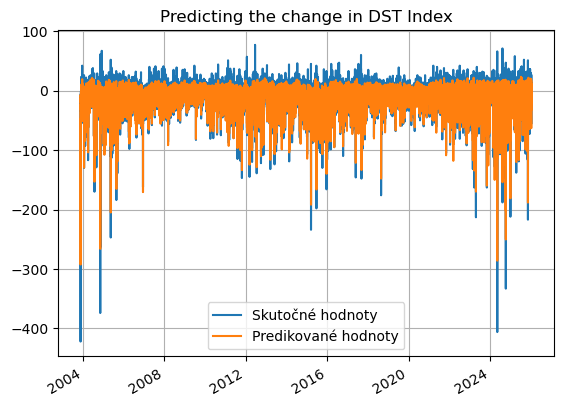

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9072851433750824
MCC=0.7141414333453441
Výkon NN:
MAE: 5.4507, MSE: 73.7296
Perzistentný model:
MAE: 6.0731, MSE: 92.3269
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 10.25%
MSE Improvement: 20.14%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 85ms/step 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 86ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step 

148/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 45s 85ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step 

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 78s 87ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step 

109/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step 

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step 

 15/759 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step 

 25/759 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 40s 85ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step 

643/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 65s 86ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 19:37 1s/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step 

213/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 46s 87ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 45s 87ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step 

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 79s 87ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step 

108/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step 

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step 

  7/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step 

  9/759 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step 

 26/759 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 52s 82ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step 

643/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 65s 86ms/step


Shapes LSTM:
train: (229332,) (229332,)
val:   (57315,) (57315,)
test:  (194176,) (194176,)
Global sigma (LSTM errors, scaled): 0.46475923
Shapes GP:
X_gp_train: (286647, 24)
y_gp_train: (286647,)
X_test_gp: (194176, 24)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.73**2 * RBF(length_scale=0.543) + WhiteKernel(noise_level=0.583)


Global sigma (LSTM errors): 10.226523
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194176

In [21]:
len(y_pred_persistence)

194169

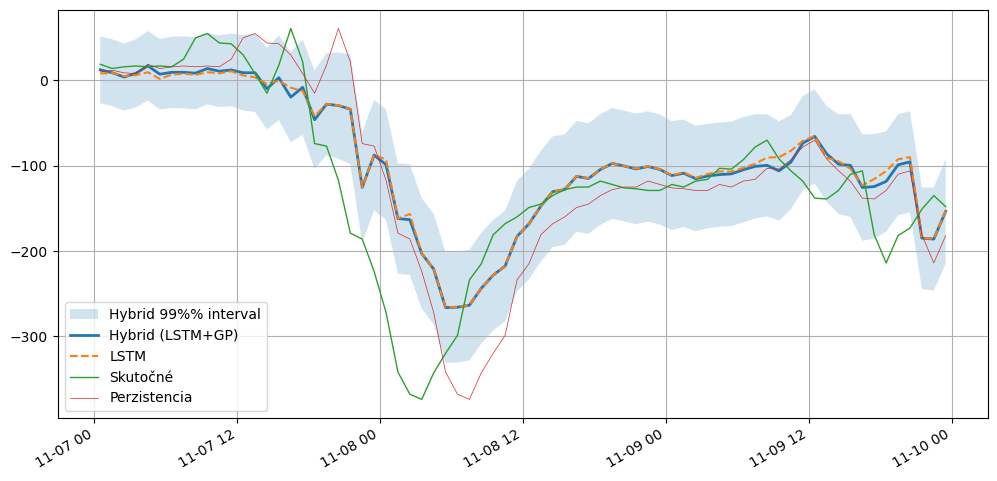

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 82.5480
MAE: 5.8658

--- Klasifikačné metriky (Prah: -20.4 nT) ---
Matthews Correlation Coefficient (MCC): 0.6917

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      145420 |        6620
Skutočná 1 |       12851 |       29278

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.92      0.96      0.94    152040
   Trieda 1 (Búrka)       0.82      0.69      0.75     42129

           accuracy                           0.90    194169
          macro avg       0.87      0.83      0.84    194169
       weighted avg       0.90      0.90      0.90    194169



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.907292101210801
MCC=0.7141629081083939
Výkon NN:
MAE: 5.4507, MSE: 73.7296
Perzistentný model:
MAE: 6.0731, MSE: 92.3269
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 10.25%
MSE Improvement: 20.14%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9211    0.9642    0.9422    152040
           1     0.8444    0.7021    0.7667     42129

    accuracy                         0.9073    194169
   macro avg     0.8828    0.8331    0.8544    194169
weighted avg     0.9045    0.9073    0.9041    194169




===== LSTM+GP =====
ACC=0.8997213767388204
MCC=0.6916629126171722
Výkon NN:
MAE: 5.8658, MSE: 82.5480
Perzistentný model:
MAE: 6.0731, MSE: 92.3269
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 3.41%
MSE Improvement: 10.59%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9188    0.9565    0.9373    152040
           1     0.8156    0.6950    0.7505     42129

    accuracy                         0.8997    194169
   macro avg     0.8672    0.8257    0.8439    194169
weighted avg     0.8964    0.8997    0.8967    194169


Saved/updated: all_models_report.csv


/tmp/ipykernel_293255/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_293255/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
20,2026-04-26T04:04:34,LSTM,24.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.916816,0.745837,"{""text"": "" precision recall f...",4.866843,56.697818,5.299679,68.962605,8.167217,17.784692
21,2026-04-26T04:04:34,LSTM+GP,24.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.909513,0.723702,"{""text"": "" precision recall f...",5.186965,62.828067,5.299679,68.962605,2.126813,8.895455
22,2026-04-26T04:44:18,LSTM,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.1,0.914058,0.742016,"{""text"": "" precision recall f...",4.951872,58.694205,5.299620,68.959107,6.561762,14.885492
23,2026-04-26T04:44:18,LSTM+GP,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.1,0.907266,0.726301,"{""text"": "" precision recall f...",5.232369,64.522202,5.299620,68.959107,1.268994,6.434110
24,2026-04-26T05:49:07,LSTM,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.905011,0.707136,"{""text"": "" precision recall f...",5.554311,75.506244,6.073318,92.330027,8.545698,18.221356
25,2026-04-26T05:49:07,LSTM+GP,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.900140,0.696833,"{""text"": "" precision recall f...",5.918420,83.402773,6.073318,92.330027,2.550478,9.668852
26,2026-04-26T08:00:15,LSTM,18.0,4.0,DST+4,OMNI2_all,-20.0,-20.5,0.906018,0.710991,"{""text"": "" precision recall f...",5.535369,76.765555,6.073274,92.330599,8.856917,16.857948
27,2026-04-26T08:00:15,LSTM+GP,18.0,4.0,DST+4,OMNI2_all,-20.0,-20.5,0.898808,0.690868,"{""text"": "" precision recall f...",5.811375,81.899407,6.073274,92.330599,4.312316,11.297655
28,2026-04-26T10:23:04,LSTM,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.4,0.907292,0.714163,"{""text"": "" precision recall f...",5.450724,73.729552,6.073117,92.326875,10.248323,20.142914
29,2026-04-26T10:23:04,LSTM+GP,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.4,0.899721,0.691663,"{""text"": "" precision recall f...",5.865822,82.548041,6.073117,92.326875,3.413321,10.591536
